## Bidirectional LSTM model na predikciu hodnot DST o 1 hodinu dopredu na zaklade 12-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+1_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 10:10:10.102818: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 1
y_col = f"DST+{shift}"

n_input = 12
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,406 (1.26 MB)

 Trainable params: 331,406 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:36:22 15s/step - loss: 0.7220 - mae: 0.7218

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 188ms/step - loss: 0.6343 - mae: 0.6551 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 203ms/step - loss: 0.5863 - mae: 0.6220

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 194ms/step - loss: 0.5464 - mae: 0.5961

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 194ms/step - loss: 0.6035 - mae: 0.6057

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 191ms/step - loss: 0.6266 - mae: 0.6065

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 197ms/step - loss: 0.6317 - mae: 0.6018

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 198ms/step - loss: 0.6281 - mae: 0.5949

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 199ms/step - loss: 0.6202 - mae: 0.5869

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 203ms/step - loss: 0.6139 - mae: 0.5799

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 208ms/step - loss: 0.6055 - mae: 0.5724

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 209ms/step - loss: 0.5998 - mae: 0.5670

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 210ms/step - loss: 0.5923 - mae: 0.5609

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 213ms/step - loss: 0.5840 - mae: 0.5545

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 215ms/step - loss: 0.5771 - mae: 0.5493

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 215ms/step - loss: 0.5702 - mae: 0.5444

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 215ms/step - loss: 0.5631 - mae: 0.5395

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 216ms/step - loss: 0.5559 - mae: 0.5348

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 215ms/step - loss: 0.5486 - mae: 0.5300

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 215ms/step - loss: 0.5413 - mae: 0.5253

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 215ms/step - loss: 0.5342 - mae: 0.5207

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 213ms/step - loss: 0.5271 - mae: 0.5160

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 213ms/step - loss: 0.5202 - mae: 0.5115

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 212ms/step - loss: 0.5134 - mae: 0.5071

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 213ms/step - loss: 0.5067 - mae: 0.5029

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 212ms/step - loss: 0.5004 - mae: 0.4988

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 214ms/step - loss: 0.4944 - mae: 0.4949

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 215ms/step - loss: 0.4887 - mae: 0.4911

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 214ms/step - loss: 0.4832 - mae: 0.4874

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 215ms/step - loss: 0.4779 - mae: 0.4839

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 214ms/step - loss: 0.4726 - mae: 0.4804

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 213ms/step - loss: 0.4675 - mae: 0.4770

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 213ms/step - loss: 0.4630 - mae: 0.4738

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 212ms/step - loss: 0.4586 - mae: 0.4708

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 211ms/step - loss: 0.4542 - mae: 0.4679

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 211ms/step - loss: 0.4500 - mae: 0.4650

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 210ms/step - loss: 0.4458 - mae: 0.4622

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 210ms/step - loss: 0.4418 - mae: 0.4595

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 210ms/step - loss: 0.4380 - mae: 0.4570

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 209ms/step - loss: 0.4346 - mae: 0.4547

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 209ms/step - loss: 0.4311 - mae: 0.4524

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 209ms/step - loss: 0.4278 - mae: 0.4502

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 209ms/step - loss: 0.4244 - mae: 0.4480

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 208ms/step - loss: 0.4211 - mae: 0.4458

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 208ms/step - loss: 0.4179 - mae: 0.4436

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 208ms/step - loss: 0.4147 - mae: 0.4415

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 208ms/step - loss: 0.4116 - mae: 0.4395

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 207ms/step - loss: 0.4086 - mae: 0.4374

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 207ms/step - loss: 0.4056 - mae: 0.4354

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 206ms/step - loss: 0.4026 - mae: 0.4334

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 206ms/step - loss: 0.3997 - mae: 0.4315

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 206ms/step - loss: 0.3969 - mae: 0.4296

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 206ms/step - loss: 0.3941 - mae: 0.4278

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 206ms/step - loss: 0.3914 - mae: 0.4260

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 206ms/step - loss: 0.3888 - mae: 0.4242

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 206ms/step - loss: 0.3862 - mae: 0.4225

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 206ms/step - loss: 0.3836 - mae: 0.4208

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 206ms/step - loss: 0.3811 - mae: 0.4191

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 206ms/step - loss: 0.3786 - mae: 0.4174

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 207ms/step - loss: 0.3762 - mae: 0.4158

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 208ms/step - loss: 0.3738 - mae: 0.4142

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 208ms/step - loss: 0.3715 - mae: 0.4126

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 209ms/step - loss: 0.3692 - mae: 0.4111

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 209ms/step - loss: 0.3670 - mae: 0.4096

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 209ms/step - loss: 0.3648 - mae: 0.4081

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 210ms/step - loss: 0.3627 - mae: 0.4067

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 210ms/step - loss: 0.3607 - mae: 0.4053

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 210ms/step - loss: 0.3586 - mae: 0.4040

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 211ms/step - loss: 0.3567 - mae: 0.4026

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 210ms/step - loss: 0.3547 - mae: 0.4013

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 210ms/step - loss: 0.3528 - mae: 0.4000

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 210ms/step - loss: 0.3509 - mae: 0.3987

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 212ms/step - loss: 0.3490 - mae: 0.3974

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 214ms/step - loss: 0.3472 - mae: 0.3961

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 214ms/step - loss: 0.3454 - mae: 0.3949

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 216ms/step - loss: 0.3436 - mae: 0.3936

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 217ms/step - loss: 0.3418 - mae: 0.3924

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 217ms/step - loss: 0.3401 - mae: 0.3913

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 217ms/step - loss: 0.3384 - mae: 0.3901

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 217ms/step - loss: 0.3368 - mae: 0.3890

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 217ms/step - loss: 0.3353 - mae: 0.3878

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 217ms/step - loss: 0.3337 - mae: 0.3867

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 217ms/step - loss: 0.3324 - mae: 0.3857

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 217ms/step - loss: 0.3311 - mae: 0.3847

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 217ms/step - loss: 0.3298 - mae: 0.3837

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 217ms/step - loss: 0.3286 - mae: 0.3828

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 217ms/step - loss: 0.3274 - mae: 0.3818

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 216ms/step - loss: 0.3262 - mae: 0.3809

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 216ms/step - loss: 0.3251 - mae: 0.3800

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 216ms/step - loss: 0.3240 - mae: 0.3792

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 216ms/step - loss: 0.3230 - mae: 0.3784

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 216ms/step - loss: 0.3220 - mae: 0.3776

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 215ms/step - loss: 0.3210 - mae: 0.3768

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 215ms/step - loss: 0.3201 - mae: 0.3760

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 216ms/step - loss: 0.3191 - mae: 0.3753

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 216ms/step - loss: 0.3182 - mae: 0.3745

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 216ms/step - loss: 0.3173 - mae: 0.3738

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 216ms/step - loss: 0.3164 - mae: 0.3731

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 216ms/step - loss: 0.3155 - mae: 0.3724

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 216ms/step - loss: 0.3146 - mae: 0.3717

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 216ms/step - loss: 0.3138 - mae: 0.3710

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 216ms/step - loss: 0.3130 - mae: 0.3704

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 217ms/step - loss: 0.3121 - mae: 0.3698

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 217ms/step - loss: 0.3114 - mae: 0.3692

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 217ms/step - loss: 0.3107 - mae: 0.3686

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 218ms/step - loss: 0.3099 - mae: 0.3680

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 219ms/step - loss: 0.3092 - mae: 0.3675

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 219ms/step - loss: 0.3085 - mae: 0.3669

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 220ms/step - loss: 0.3078 - mae: 0.3663

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 220ms/step - loss: 0.3070 - mae: 0.3658

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 220ms/step - loss: 0.3063 - mae: 0.3652

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 220ms/step - loss: 0.3056 - mae: 0.3647

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 220ms/step - loss: 0.3049 - mae: 0.3642

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 220ms/step - loss: 0.3042 - mae: 0.3637

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 219ms/step - loss: 0.3036 - mae: 0.3632

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 220ms/step - loss: 0.3029 - mae: 0.3627

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 221ms/step - loss: 0.3022 - mae: 0.3622

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 221ms/step - loss: 0.3016 - mae: 0.3617

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 222ms/step - loss: 0.3009 - mae: 0.3612

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 222ms/step - loss: 0.3003 - mae: 0.3607

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 222ms/step - loss: 0.2996 - mae: 0.3602

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 223ms/step - loss: 0.2990 - mae: 0.3597

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 223ms/step - loss: 0.2983 - mae: 0.3593

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 223ms/step - loss: 0.2977 - mae: 0.3588

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 222ms/step - loss: 0.2971 - mae: 0.3583

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 222ms/step - loss: 0.2964 - mae: 0.3578

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 222ms/step - loss: 0.2958 - mae: 0.3574

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 222ms/step - loss: 0.2951 - mae: 0.3569

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 222ms/step - loss: 0.2945 - mae: 0.3564

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 222ms/step - loss: 0.2939 - mae: 0.3560

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2932 - mae: 0.3555

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2926 - mae: 0.3551

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2921 - mae: 0.3546

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2916 - mae: 0.3542

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 222ms/step - loss: 0.2911 - mae: 0.3538

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2906 - mae: 0.3534

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2901 - mae: 0.3529

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2896 - mae: 0.3525

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2891 - mae: 0.3521

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 222ms/step - loss: 0.2886 - mae: 0.3517

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 222ms/step - loss: 0.2881 - mae: 0.3513

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 223ms/step - loss: 0.2876 - mae: 0.3509

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 223ms/step - loss: 0.2871 - mae: 0.3506

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 223ms/step - loss: 0.2867 - mae: 0.3502

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 223ms/step - loss: 0.2862 - mae: 0.3498

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 223ms/step - loss: 0.2857 - mae: 0.3494

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2853 - mae: 0.3490

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2848 - mae: 0.3487

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2843 - mae: 0.3483

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.2839 - mae: 0.3479

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 224ms/step - loss: 0.2834 - mae: 0.3476

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2830 - mae: 0.3472

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2825 - mae: 0.3468

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2821 - mae: 0.3465

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2817 - mae: 0.3462

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 224ms/step - loss: 0.2812 - mae: 0.3458

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2808 - mae: 0.3455

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 224ms/step - loss: 0.2804 - mae: 0.3451

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 224ms/step - loss: 0.2800 - mae: 0.3448

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 223ms/step - loss: 0.2796 - mae: 0.3445

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 223ms/step - loss: 0.2792 - mae: 0.3441

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2788 - mae: 0.3438

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 224ms/step - loss: 0.2784 - mae: 0.3435

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2780 - mae: 0.3432

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 223ms/step - loss: 0.2775 - mae: 0.3429

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2771 - mae: 0.3425

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2767 - mae: 0.3422

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2763 - mae: 0.3419

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2759 - mae: 0.3416

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 223ms/step - loss: 0.2756 - mae: 0.3413

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 224ms/step - loss: 0.2752 - mae: 0.3410

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 224ms/step - loss: 0.2748 - mae: 0.3407

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 223ms/step - loss: 0.2744 - mae: 0.3404

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 223ms/step - loss: 0.2740 - mae: 0.3401

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2736 - mae: 0.3398

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2733 - mae: 0.3395

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 223ms/step - loss: 0.2729 - mae: 0.3392

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 223ms/step - loss: 0.2725 - mae: 0.3389

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 223ms/step - loss: 0.2721 - mae: 0.3386

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 223ms/step - loss: 0.2717 - mae: 0.3383

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 222ms/step - loss: 0.2714 - mae: 0.3379

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 222ms/step - loss: 0.2710 - mae: 0.3376

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 222ms/step - loss: 0.2706 - mae: 0.3373

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 222ms/step - loss: 0.2702 - mae: 0.3370

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 222ms/step - loss: 0.2698 - mae: 0.3367

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 222ms/step - loss: 0.2694 - mae: 0.3364

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 222ms/step - loss: 0.2691 - mae: 0.3361

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 223ms/step - loss: 0.2687 - mae: 0.3358

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 223ms/step - loss: 0.2683 - mae: 0.3356

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 223ms/step - loss: 0.2679 - mae: 0.3353

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 223ms/step - loss: 0.2676 - mae: 0.3350

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 223ms/step - loss: 0.2672 - mae: 0.3347

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 223ms/step - loss: 0.2668 - mae: 0.3344

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2664 - mae: 0.3341

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 224ms/step - loss: 0.2661 - mae: 0.3338

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2657 - mae: 0.3335

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2653 - mae: 0.3332

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2650 - mae: 0.3329

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2646 - mae: 0.3326

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 225ms/step - loss: 0.2642 - mae: 0.3324

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 224ms/step - loss: 0.2639 - mae: 0.3321

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 224ms/step - loss: 0.2635 - mae: 0.3318

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 224ms/step - loss: 0.2632 - mae: 0.3315

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 224ms/step - loss: 0.2628 - mae: 0.3313

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2625 - mae: 0.3310

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2621 - mae: 0.3307

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 224ms/step - loss: 0.2618 - mae: 0.3304

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2614 - mae: 0.3302

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2611 - mae: 0.3299

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 224ms/step - loss: 0.2607 - mae: 0.3297

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 223ms/step - loss: 0.2604 - mae: 0.3294

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 223ms/step - loss: 0.2601 - mae: 0.3291

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 223ms/step - loss: 0.2597 - mae: 0.3289

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 223ms/step - loss: 0.2594 - mae: 0.3286

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 223ms/step - loss: 0.2591 - mae: 0.3284

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 223ms/step - loss: 0.2588 - mae: 0.3281

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 223ms/step - loss: 0.2584 - mae: 0.3279

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 223ms/step - loss: 0.2581 - mae: 0.3276

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2578 - mae: 0.3274

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2575 - mae: 0.3272

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 222ms/step - loss: 0.2572 - mae: 0.3269

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2568 - mae: 0.3267

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2565 - mae: 0.3264

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 222ms/step - loss: 0.2562 - mae: 0.3262

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2559 - mae: 0.3260

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2556 - mae: 0.3257

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 222ms/step - loss: 0.2553 - mae: 0.3255

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2550 - mae: 0.3252

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 222ms/step - loss: 0.2547 - mae: 0.3250

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 221ms/step - loss: 0.2544 - mae: 0.3248

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 221ms/step - loss: 0.2541 - mae: 0.3246

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 221ms/step - loss: 0.2537 - mae: 0.3243

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 221ms/step - loss: 0.2534 - mae: 0.3241

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 221ms/step - loss: 0.2531 - mae: 0.3239

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 221ms/step - loss: 0.2528 - mae: 0.3237

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 221ms/step - loss: 0.2525 - mae: 0.3234

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2522 - mae: 0.3232

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2519 - mae: 0.3230

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2517 - mae: 0.3228

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2514 - mae: 0.3225

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2511 - mae: 0.3223

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2508 - mae: 0.3221

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2505 - mae: 0.3219

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 222ms/step - loss: 0.2502 - mae: 0.3217

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 222ms/step - loss: 0.2499 - mae: 0.3214

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2496 - mae: 0.3212

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2493 - mae: 0.3210

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2490 - mae: 0.3208

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2487 - mae: 0.3206

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2484 - mae: 0.3204

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.2481 - mae: 0.3201

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 224ms/step - loss: 0.2479 - mae: 0.3199

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 224ms/step - loss: 0.2476 - mae: 0.3197

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 224ms/step - loss: 0.2473 - mae: 0.3195

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 224ms/step - loss: 0.2470 - mae: 0.3193

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 224ms/step - loss: 0.2467 - mae: 0.3191

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 224ms/step - loss: 0.2464 - mae: 0.3189

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 224ms/step - loss: 0.2461 - mae: 0.3186

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 0.2459 - mae: 0.3184

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 0.2456 - mae: 0.3182

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 0.2453 - mae: 0.3180

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 224ms/step - loss: 0.2450 - mae: 0.3178

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 0.2447 - mae: 0.3176

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 0.2445 - mae: 0.3174

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 0.2442 - mae: 0.3172

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 0.2439 - mae: 0.3170

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 224ms/step - loss: 0.2436 - mae: 0.3168

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 0.2434 - mae: 0.3166

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 0.2431 - mae: 0.3164

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 0.2428 - mae: 0.3162

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 224ms/step - loss: 0.2426 - mae: 0.3160

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2423 - mae: 0.3158

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2420 - mae: 0.3156

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2418 - mae: 0.3154

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2415 - mae: 0.3152

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - loss: 0.2412 - mae: 0.3150

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2410 - mae: 0.3148

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2407 - mae: 0.3146

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - loss: 0.2405 - mae: 0.3144

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 0.2402 - mae: 0.3142

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 0.2400 - mae: 0.3140

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 0.2397 - mae: 0.3139

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - loss: 0.2395 - mae: 0.3137

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 226ms/step - loss: 0.2392 - mae: 0.3135

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2390 - mae: 0.3133

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2387 - mae: 0.3131

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2385 - mae: 0.3129

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2382 - mae: 0.3128

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2380 - mae: 0.3126

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 226ms/step - loss: 0.2378 - mae: 0.3124

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.2375 - mae: 0.3122

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.2373 - mae: 0.3120

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 226ms/step - loss: 0.2370 - mae: 0.3119

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 226ms/step - loss: 0.2368 - mae: 0.3117

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 225ms/step - loss: 0.2366 - mae: 0.3115

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 225ms/step - loss: 0.2363 - mae: 0.3113

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.2361 - mae: 0.3112

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.2359 - mae: 0.3110

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.2356 - mae: 0.3108

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 225ms/step - loss: 0.2354 - mae: 0.3106

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.2352 - mae: 0.3105

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.2349 - mae: 0.3103

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 225ms/step - loss: 0.2347 - mae: 0.3101

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 225ms/step - loss: 0.2345 - mae: 0.3100

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2342 - mae: 0.3098

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2340 - mae: 0.3096

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - loss: 0.2338 - mae: 0.3095

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2336 - mae: 0.3093

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2333 - mae: 0.3091

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 224ms/step - loss: 0.2331 - mae: 0.3090

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.2329 - mae: 0.3088

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.2327 - mae: 0.3086

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 224ms/step - loss: 0.2324 - mae: 0.3085

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - loss: 0.2322 - mae: 0.3083

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.2320 - mae: 0.3081

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.2318 - mae: 0.3080

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - loss: 0.2315 - mae: 0.3078

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.2313 - mae: 0.3076

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.2311 - mae: 0.3075

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.2309 - mae: 0.3073

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.2307 - mae: 0.3072

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2305 - mae: 0.3070

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2302 - mae: 0.3069

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2300 - mae: 0.3067

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2298 - mae: 0.3065

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.2296 - mae: 0.3064

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2294 - mae: 0.3062

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2292 - mae: 0.3061

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2290 - mae: 0.3059

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2288 - mae: 0.3058

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.2286 - mae: 0.3056

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.2283 - mae: 0.3055

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.2281 - mae: 0.3053

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.2279 - mae: 0.3052

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.2277 - mae: 0.3050

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.2275 - mae: 0.3049

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.2273 - mae: 0.3047

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.2271 - mae: 0.3046

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - loss: 0.2269 - mae: 0.3044

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.2267 - mae: 0.3043

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.2265 - mae: 0.3041

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.2263 - mae: 0.3040

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.2261 - mae: 0.3038

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - loss: 0.2259 - mae: 0.3037

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.2257 - mae: 0.3035

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.2255 - mae: 0.3034

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.2253 - mae: 0.3032

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - loss: 0.2251 - mae: 0.3031

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.2249 - mae: 0.3030

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - loss: 0.2247 - mae: 0.3028

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2245 - mae: 0.3027

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.2243 - mae: 0.3025

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - loss: 0.2241 - mae: 0.3024

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - loss: 0.2240 - mae: 0.3023

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - loss: 0.2238 - mae: 0.3021

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2236 - mae: 0.3020

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2234 - mae: 0.3018

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2232 - mae: 0.3017

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2230 - mae: 0.3016

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - loss: 0.2228 - mae: 0.3014

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2227 - mae: 0.3013

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2225 - mae: 0.3012

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2223 - mae: 0.3010

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 222ms/step - loss: 0.2221 - mae: 0.3009

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2219 - mae: 0.3008

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2218 - mae: 0.3006

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2216 - mae: 0.3005

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 222ms/step - loss: 0.2214 - mae: 0.3004

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2212 - mae: 0.3003

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2211 - mae: 0.3001

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2209 - mae: 0.3000

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2207 - mae: 0.2999

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2206 - mae: 0.2997

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 222ms/step - loss: 0.2204 - mae: 0.2996

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2202 - mae: 0.2995

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2200 - mae: 0.2994

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2199 - mae: 0.2992

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2197 - mae: 0.2991

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2195 - mae: 0.2990

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - loss: 0.2194 - mae: 0.2989

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2192 - mae: 0.2987

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2190 - mae: 0.2986

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2189 - mae: 0.2985

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2187 - mae: 0.2984

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - loss: 0.2185 - mae: 0.2982

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - loss: 0.2184 - mae: 0.2981

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.2182 - mae: 0.2980

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.2180 - mae: 0.2979

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.2179 - mae: 0.2978

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.2177 - mae: 0.2976

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.2175 - mae: 0.2975

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2174 - mae: 0.2974

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2172 - mae: 0.2973

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2171 - mae: 0.2972

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.2169 - mae: 0.2970

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2167 - mae: 0.2969

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2166 - mae: 0.2968

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2164 - mae: 0.2967

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2163 - mae: 0.2966

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.2161 - mae: 0.2965

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.2160 - mae: 0.2963

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.2158 - mae: 0.2962

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.2157 - mae: 0.2961

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.2155 - mae: 0.2960

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2153 - mae: 0.2959

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2152 - mae: 0.2958

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2150 - mae: 0.2957

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 224ms/step - loss: 0.2149 - mae: 0.2955

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 224ms/step - loss: 0.2147 - mae: 0.2954

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 224ms/step - loss: 0.2146 - mae: 0.2953

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.2144 - mae: 0.2952

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - loss: 0.2143 - mae: 0.2951

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.2141 - mae: 0.2950

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.2140 - mae: 0.2949

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.2138 - mae: 0.2948

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - loss: 0.2137 - mae: 0.2946

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2135 - mae: 0.2945

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2134 - mae: 0.2944

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2132 - mae: 0.2943

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2131 - mae: 0.2942

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - loss: 0.2129 - mae: 0.2941

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2128 - mae: 0.2940

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2126 - mae: 0.2939

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2125 - mae: 0.2938

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2124 - mae: 0.2937

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - loss: 0.2122 - mae: 0.2936

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.2121 - mae: 0.2934

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.2119 - mae: 0.2933

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.2118 - mae: 0.2932

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - loss: 0.2116 - mae: 0.2931

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2115 - mae: 0.2930

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2114 - mae: 0.2929

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2112 - mae: 0.2928

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.2111 - mae: 0.2927

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2109 - mae: 0.2926

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2108 - mae: 0.2925

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2107 - mae: 0.2924

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2105 - mae: 0.2923

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.2104 - mae: 0.2922

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2103 - mae: 0.2921

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2101 - mae: 0.2920

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2100 - mae: 0.2919

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.2099 - mae: 0.2918

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2097 - mae: 0.2917

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2096 - mae: 0.2916

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2095 - mae: 0.2915

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.2094 - mae: 0.2914

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2092 - mae: 0.2913

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2091 - mae: 0.2912

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2090 - mae: 0.2911

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.2089 - mae: 0.2911

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2087 - mae: 0.2910

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2086 - mae: 0.2909

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2085 - mae: 0.2908

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2084 - mae: 0.2907

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.2082 - mae: 0.2906

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2081 - mae: 0.2905

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2080 - mae: 0.2904

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2079 - mae: 0.2903

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2077 - mae: 0.2902

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.2076 - mae: 0.2901

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2075 - mae: 0.2900

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2074 - mae: 0.2899

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2072 - mae: 0.2899

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.2071 - mae: 0.2898

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.2070 - mae: 0.2897

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2069 - mae: 0.2896

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2067 - mae: 0.2895

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2066 - mae: 0.2894

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2065 - mae: 0.2893

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.2064 - mae: 0.2892

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2063 - mae: 0.2891

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2061 - mae: 0.2890

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2060 - mae: 0.2890

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.2059 - mae: 0.2889

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2058 - mae: 0.2888

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2057 - mae: 0.2887

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2055 - mae: 0.2886

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2054 - mae: 0.2885

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2053 - mae: 0.2884

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.2052 - mae: 0.2883

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.2051 - mae: 0.2883

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2049 - mae: 0.2882

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2048 - mae: 0.2881

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2047 - mae: 0.2880

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 225ms/step - loss: 0.2046 - mae: 0.2879

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2045 - mae: 0.2878

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2044 - mae: 0.2877

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2043 - mae: 0.2877

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2041 - mae: 0.2876

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2040 - mae: 0.2875

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 225ms/step - loss: 0.2039 - mae: 0.2874

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.2038 - mae: 0.2873

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 225ms/step - loss: 0.2037 - mae: 0.2872

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2036 - mae: 0.2871

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2035 - mae: 0.2871

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2034 - mae: 0.2870

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 226ms/step - loss: 0.2032 - mae: 0.2869

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2031 - mae: 0.2868

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2030 - mae: 0.2867

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2029 - mae: 0.2866

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - loss: 0.2028 - mae: 0.2866

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2027 - mae: 0.2865

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2026 - mae: 0.2864

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2025 - mae: 0.2863

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 226ms/step - loss: 0.2024 - mae: 0.2862

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2023 - mae: 0.2862

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2022 - mae: 0.2861

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2020 - mae: 0.2860

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2019 - mae: 0.2859

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 226ms/step - loss: 0.2018 - mae: 0.2858

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2017 - mae: 0.2858

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2016 - mae: 0.2857

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2015 - mae: 0.2856

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 226ms/step - loss: 0.2014 - mae: 0.2855

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 227ms/step - loss: 0.2013 - mae: 0.2854

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2012 - mae: 0.2854

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 227ms/step - loss: 0.2011 - mae: 0.2853

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2010 - mae: 0.2852

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 226ms/step - loss: 0.2009 - mae: 0.2851

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2008 - mae: 0.2850

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2007 - mae: 0.2850

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2006 - mae: 0.2849

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 226ms/step - loss: 0.2005 - mae: 0.2848

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2003 - mae: 0.2847

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2002 - mae: 0.2846

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2001 - mae: 0.2846

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.2000 - mae: 0.2845

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 226ms/step - loss: 0.1999 - mae: 0.2844

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.1998 - mae: 0.2843

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.1997 - mae: 0.2843

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.1996 - mae: 0.2842

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 226ms/step - loss: 0.1995 - mae: 0.2841

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.1994 - mae: 0.2840

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.1993 - mae: 0.2840

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.1992 - mae: 0.2839

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 226ms/step - loss: 0.1991 - mae: 0.2838

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.1990 - mae: 0.2837

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.1989 - mae: 0.2836

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.1988 - mae: 0.2836

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.1987 - mae: 0.2835

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 226ms/step - loss: 0.1986 - mae: 0.2834

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.1985 - mae: 0.2834

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.1984 - mae: 0.2833

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.1983 - mae: 0.2832

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 226ms/step - loss: 0.1982 - mae: 0.2831

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.1981 - mae: 0.2831

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.1980 - mae: 0.2830

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.1979 - mae: 0.2829

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 226ms/step - loss: 0.1978 - mae: 0.2828

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.1977 - mae: 0.2828

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.1976 - mae: 0.2827

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.1975 - mae: 0.2826

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 226ms/step - loss: 0.1974 - mae: 0.2825

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.1974 - mae: 0.2825

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.1973 - mae: 0.2824

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.1972 - mae: 0.2823

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.1971 - mae: 0.2823

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.1970 - mae: 0.2822

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.1969 - mae: 0.2821

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.1968 - mae: 0.2821

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.1967 - mae: 0.2820

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 225ms/step - loss: 0.1967 - mae: 0.2819

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.1966 - mae: 0.2819

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.1965 - mae: 0.2818

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.1964 - mae: 0.2817

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 225ms/step - loss: 0.1963 - mae: 0.2817

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.1962 - mae: 0.2816

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.1961 - mae: 0.2815

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.1961 - mae: 0.2815

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 225ms/step - loss: 0.1960 - mae: 0.2814

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.1959 - mae: 0.2813

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.1958 - mae: 0.2813

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.1957 - mae: 0.2812

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.1956 - mae: 0.2811

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 225ms/step - loss: 0.1956 - mae: 0.2811

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.1955 - mae: 0.2810

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.1954 - mae: 0.2809

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.1953 - mae: 0.2809

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 225ms/step - loss: 0.1952 - mae: 0.2808

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.1951 - mae: 0.2807

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.1951 - mae: 0.2807

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.1950 - mae: 0.2806

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 225ms/step - loss: 0.1949 - mae: 0.2805

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.1948 - mae: 0.2805

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.1947 - mae: 0.2804

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.1946 - mae: 0.2804

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.1946 - mae: 0.2803

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 225ms/step - loss: 0.1945 - mae: 0.2802

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.1944 - mae: 0.2802

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.1943 - mae: 0.2801

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.1942 - mae: 0.2800

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.1942 - mae: 0.2800

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 225ms/step - loss: 0.1941 - mae: 0.2799

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.1940 - mae: 0.2799

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.1939 - mae: 0.2798

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.1938 - mae: 0.2797

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 225ms/step - loss: 0.1938 - mae: 0.2797

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.1937 - mae: 0.2796

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.1936 - mae: 0.2795

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.1935 - mae: 0.2795

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 225ms/step - loss: 0.1934 - mae: 0.2794

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - loss: 0.1934 - mae: 0.2794

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.1933 - mae: 0.2793

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.1932 - mae: 0.2792

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.1931 - mae: 0.2792

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - loss: 0.1930 - mae: 0.2791

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.1930 - mae: 0.2791

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.1929 - mae: 0.2790

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.1928 - mae: 0.2789

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.1927 - mae: 0.2789

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - loss: 0.1926 - mae: 0.2788

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.1926 - mae: 0.2787

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.1925 - mae: 0.2787

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.1924 - mae: 0.2786

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - loss: 0.1923 - mae: 0.2786

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.1923 - mae: 0.2785

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.1922 - mae: 0.2785

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.1921 - mae: 0.2784

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.1920 - mae: 0.2783

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - loss: 0.1920 - mae: 0.2783

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.1919 - mae: 0.2782

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.1918 - mae: 0.2782

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.1917 - mae: 0.2781

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.1917 - mae: 0.2780

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - loss: 0.1916 - mae: 0.2780

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.1915 - mae: 0.2779

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.1914 - mae: 0.2779

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - loss: 0.1914 - mae: 0.2778

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.1913 - mae: 0.2777

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.1912 - mae: 0.2777

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.1911 - mae: 0.2776 

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.1911 - mae: 0.2776

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.1910 - mae: 0.2775

635/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.1909 - mae: 0.2775

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1909 - mae: 0.2774

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1908 - mae: 0.2774

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1907 - mae: 0.2773

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1906 - mae: 0.2772

640/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.1906 - mae: 0.2772

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1905 - mae: 0.2771

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1904 - mae: 0.2771

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1903 - mae: 0.2770

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.1903 - mae: 0.2770

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.1902 - mae: 0.2769

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.1901 - mae: 0.2768

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.1901 - mae: 0.2768

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.1900 - mae: 0.2767

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.1899 - mae: 0.2767

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.1898 - mae: 0.2766

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - loss: 0.1898 - mae: 0.2766

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - loss: 0.1897 - mae: 0.2765

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.1896 - mae: 0.2765

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.1896 - mae: 0.2764

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.1895 - mae: 0.2764

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.1894 - mae: 0.2763

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.1893 - mae: 0.2762

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.1893 - mae: 0.2762

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.1892 - mae: 0.2761

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.1891 - mae: 0.2761

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.1891 - mae: 0.2760

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.1890 - mae: 0.2760

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.1889 - mae: 0.2759

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.1889 - mae: 0.2759

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.1888 - mae: 0.2758

666/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.1887 - mae: 0.2758

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.1886 - mae: 0.2757

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.1886 - mae: 0.2757

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.1885 - mae: 0.2756

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.1884 - mae: 0.2756

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.1884 - mae: 0.2755

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.1883 - mae: 0.2754

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.1882 - mae: 0.2754

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.1882 - mae: 0.2753

675/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.1881 - mae: 0.2753

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.1880 - mae: 0.2752

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.1880 - mae: 0.2752

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.1879 - mae: 0.2751

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.1878 - mae: 0.2751

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 0.1878 - mae: 0.2750

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - loss: 0.1877 - mae: 0.2750

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.1876 - mae: 0.2749

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.1876 - mae: 0.2749

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.1875 - mae: 0.2748

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1874 - mae: 0.2748

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1874 - mae: 0.2747

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1873 - mae: 0.2747

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.1872 - mae: 0.2746

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1872 - mae: 0.2746

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1871 - mae: 0.2745

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1870 - mae: 0.2745

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1870 - mae: 0.2744

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.1869 - mae: 0.2744

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1868 - mae: 0.2743

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1868 - mae: 0.2743

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1867 - mae: 0.2742

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1866 - mae: 0.2742

698/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.1866 - mae: 0.2741

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.1865 - mae: 0.2741

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.1864 - mae: 0.2740

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.1864 - mae: 0.2740

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.1863 - mae: 0.2739

703/896 ━━━━━━━━━━━━━━━━━━━━ 44s 228ms/step - loss: 0.1862 - mae: 0.2738

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.1862 - mae: 0.2738

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.1861 - mae: 0.2737

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.1860 - mae: 0.2737

707/896 ━━━━━━━━━━━━━━━━━━━━ 43s 228ms/step - loss: 0.1860 - mae: 0.2736

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.1859 - mae: 0.2736

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.1858 - mae: 0.2735

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.1858 - mae: 0.2735

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - loss: 0.1857 - mae: 0.2734

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1856 - mae: 0.2734

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1856 - mae: 0.2733

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1855 - mae: 0.2733

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1854 - mae: 0.2732

716/896 ━━━━━━━━━━━━━━━━━━━━ 41s 228ms/step - loss: 0.1854 - mae: 0.2732

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1853 - mae: 0.2731

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1852 - mae: 0.2731

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1852 - mae: 0.2730

720/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.1851 - mae: 0.2730

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1850 - mae: 0.2729

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1850 - mae: 0.2729

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1849 - mae: 0.2728

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1848 - mae: 0.2728

725/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.1848 - mae: 0.2727

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.1847 - mae: 0.2727

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.1847 - mae: 0.2726

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.1846 - mae: 0.2726

729/896 ━━━━━━━━━━━━━━━━━━━━ 38s 229ms/step - loss: 0.1845 - mae: 0.2725

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 229ms/step - loss: 0.1845 - mae: 0.2725

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 229ms/step - loss: 0.1844 - mae: 0.2724

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 229ms/step - loss: 0.1843 - mae: 0.2724

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 229ms/step - loss: 0.1843 - mae: 0.2723

734/896 ━━━━━━━━━━━━━━━━━━━━ 37s 229ms/step - loss: 0.1842 - mae: 0.2723

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 229ms/step - loss: 0.1841 - mae: 0.2722

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 229ms/step - loss: 0.1841 - mae: 0.2722

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 229ms/step - loss: 0.1840 - mae: 0.2721

738/896 ━━━━━━━━━━━━━━━━━━━━ 36s 229ms/step - loss: 0.1839 - mae: 0.2721

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 229ms/step - loss: 0.1839 - mae: 0.2720

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 229ms/step - loss: 0.1838 - mae: 0.2720

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 229ms/step - loss: 0.1838 - mae: 0.2719

742/896 ━━━━━━━━━━━━━━━━━━━━ 35s 229ms/step - loss: 0.1837 - mae: 0.2719

743/896 ━━━━━━━━━━━━━━━━━━━━ 35s 229ms/step - loss: 0.1836 - mae: 0.2718

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 229ms/step - loss: 0.1836 - mae: 0.2718

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 229ms/step - loss: 0.1835 - mae: 0.2717

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 229ms/step - loss: 0.1834 - mae: 0.2717

747/896 ━━━━━━━━━━━━━━━━━━━━ 34s 229ms/step - loss: 0.1834 - mae: 0.2717

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 229ms/step - loss: 0.1833 - mae: 0.2716

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 229ms/step - loss: 0.1832 - mae: 0.2716

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.1832 - mae: 0.2715

751/896 ━━━━━━━━━━━━━━━━━━━━ 33s 230ms/step - loss: 0.1831 - mae: 0.2715

752/896 ━━━━━━━━━━━━━━━━━━━━ 33s 229ms/step - loss: 0.1831 - mae: 0.2714

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 230ms/step - loss: 0.1830 - mae: 0.2714

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 230ms/step - loss: 0.1829 - mae: 0.2713

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 230ms/step - loss: 0.1829 - mae: 0.2713

756/896 ━━━━━━━━━━━━━━━━━━━━ 32s 229ms/step - loss: 0.1828 - mae: 0.2712

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 230ms/step - loss: 0.1827 - mae: 0.2712

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 229ms/step - loss: 0.1827 - mae: 0.2711

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 229ms/step - loss: 0.1826 - mae: 0.2711

760/896 ━━━━━━━━━━━━━━━━━━━━ 31s 229ms/step - loss: 0.1826 - mae: 0.2710

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.1825 - mae: 0.2710

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.1824 - mae: 0.2709

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.1824 - mae: 0.2709

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.1823 - mae: 0.2708

765/896 ━━━━━━━━━━━━━━━━━━━━ 30s 229ms/step - loss: 0.1823 - mae: 0.2708

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 229ms/step - loss: 0.1822 - mae: 0.2707

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 229ms/step - loss: 0.1821 - mae: 0.2707

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 229ms/step - loss: 0.1821 - mae: 0.2706

769/896 ━━━━━━━━━━━━━━━━━━━━ 29s 229ms/step - loss: 0.1820 - mae: 0.2706

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 229ms/step - loss: 0.1819 - mae: 0.2705

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 229ms/step - loss: 0.1819 - mae: 0.2705

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 229ms/step - loss: 0.1818 - mae: 0.2705

773/896 ━━━━━━━━━━━━━━━━━━━━ 28s 229ms/step - loss: 0.1818 - mae: 0.2704

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.1817 - mae: 0.2704

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.1816 - mae: 0.2703

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.1816 - mae: 0.2703

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 229ms/step - loss: 0.1815 - mae: 0.2702

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.1815 - mae: 0.2702

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.1814 - mae: 0.2701

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.1813 - mae: 0.2701

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.1813 - mae: 0.2700

782/896 ━━━━━━━━━━━━━━━━━━━━ 26s 229ms/step - loss: 0.1812 - mae: 0.2700

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.1812 - mae: 0.2699

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.1811 - mae: 0.2699

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.1810 - mae: 0.2698

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 0.1810 - mae: 0.2698

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1809 - mae: 0.2698

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1809 - mae: 0.2697

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1808 - mae: 0.2697

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1808 - mae: 0.2696

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - loss: 0.1807 - mae: 0.2696

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.1806 - mae: 0.2695

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.1806 - mae: 0.2695

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.1805 - mae: 0.2694

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 229ms/step - loss: 0.1805 - mae: 0.2694

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.1804 - mae: 0.2694

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.1804 - mae: 0.2693

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.1803 - mae: 0.2693

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 229ms/step - loss: 0.1803 - mae: 0.2692

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1802 - mae: 0.2692

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1801 - mae: 0.2691

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1801 - mae: 0.2691

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1800 - mae: 0.2691

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 229ms/step - loss: 0.1800 - mae: 0.2690

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.1799 - mae: 0.2690

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.1799 - mae: 0.2689

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.1798 - mae: 0.2689

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 229ms/step - loss: 0.1798 - mae: 0.2689

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1797 - mae: 0.2688

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1797 - mae: 0.2688

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1796 - mae: 0.2687

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 229ms/step - loss: 0.1796 - mae: 0.2687

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1795 - mae: 0.2687

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1795 - mae: 0.2686

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1794 - mae: 0.2686

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1794 - mae: 0.2685

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 229ms/step - loss: 0.1793 - mae: 0.2685

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.1792 - mae: 0.2685

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.1792 - mae: 0.2684

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.1791 - mae: 0.2684

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 229ms/step - loss: 0.1791 - mae: 0.2683

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1790 - mae: 0.2683

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1790 - mae: 0.2683

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1789 - mae: 0.2682

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1789 - mae: 0.2682

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 229ms/step - loss: 0.1788 - mae: 0.2681

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.1788 - mae: 0.2681

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.1787 - mae: 0.2681

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.1787 - mae: 0.2680

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 229ms/step - loss: 0.1786 - mae: 0.2680

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1786 - mae: 0.2679

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1785 - mae: 0.2679

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1785 - mae: 0.2679

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1784 - mae: 0.2678

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1784 - mae: 0.2678

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1783 - mae: 0.2677

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1783 - mae: 0.2677

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1782 - mae: 0.2677

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.1782 - mae: 0.2676

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.1781 - mae: 0.2676

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - loss: 0.1781 - mae: 0.2675

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - loss: 0.1780 - mae: 0.2675

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - loss: 0.1780 - mae: 0.2675

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - loss: 0.1779 - mae: 0.2674

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - loss: 0.1779 - mae: 0.2674

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.1778 - mae: 0.2674

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.1778 - mae: 0.2673

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - loss: 0.1777 - mae: 0.2673

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - loss: 0.1777 - mae: 0.2672

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - loss: 0.1776 - mae: 0.2672

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - loss: 0.1776 - mae: 0.2672

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - loss: 0.1775 - mae: 0.2671

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.1775 - mae: 0.2671 

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.1774 - mae: 0.2670

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.1774 - mae: 0.2670

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.1773 - mae: 0.2670

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1773 - mae: 0.2669

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1772 - mae: 0.2669

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1772 - mae: 0.2669

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1771 - mae: 0.2668

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.1771 - mae: 0.2668

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.1770 - mae: 0.2667

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.1770 - mae: 0.2667

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.1769 - mae: 0.2667

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.1769 - mae: 0.2666

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.1768 - mae: 0.2666

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.1768 - mae: 0.2666

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.1767 - mae: 0.2665

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.1767 - mae: 0.2665

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1766 - mae: 0.2664

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1766 - mae: 0.2664

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1765 - mae: 0.2664

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1765 - mae: 0.2663

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.1764 - mae: 0.2663

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.1764 - mae: 0.2662

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.1763 - mae: 0.2662

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.1763 - mae: 0.2662

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.1762 - mae: 0.2661

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.1762 - mae: 0.2661

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.1761 - mae: 0.2661

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.1761 - mae: 0.2660

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.1760 - mae: 0.2660

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1760 - mae: 0.2660

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1759 - mae: 0.2659

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1759 - mae: 0.2659

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1758 - mae: 0.2658

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.1758 - mae: 0.2658

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.1757 - mae: 0.2658

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.1757 - mae: 0.2657

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.1756 - mae: 0.2657

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.1756 - mae: 0.2657

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1755 - mae: 0.2656

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1755 - mae: 0.2656

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1754 - mae: 0.2655

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1754 - mae: 0.2655

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.1753 - mae: 0.2655


Epoch 1: val_mae improved from inf to 0.21318, saving model to models/DST+1_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 240s 252ms/step - loss: 0.1753 - mae: 0.2654 - val_loss: 0.1254 - val_mae: 0.2132


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:43 317ms/step - loss: 0.0973 - mae: 0.2032

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 211ms/step - loss: 0.0914 - mae: 0.2005

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.0864 - mae: 0.1987

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 207ms/step - loss: 0.0827 - mae: 0.1970

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 206ms/step - loss: 0.0801 - mae: 0.1957

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0773 - mae: 0.1931

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 212ms/step - loss: 0.0795 - mae: 0.1932

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0810 - mae: 0.1935

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 214ms/step - loss: 0.0827 - mae: 0.1942

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 211ms/step - loss: 0.0838 - mae: 0.1946

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 208ms/step - loss: 0.0850 - mae: 0.1951

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 204ms/step - loss: 0.0855 - mae: 0.1951

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 203ms/step - loss: 0.0860 - mae: 0.1951

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 203ms/step - loss: 0.0861 - mae: 0.1950

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 201ms/step - loss: 0.0860 - mae: 0.1948

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 199ms/step - loss: 0.0858 - mae: 0.1944

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 200ms/step - loss: 0.0855 - mae: 0.1940

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 197ms/step - loss: 0.0850 - mae: 0.1934

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 195ms/step - loss: 0.0847 - mae: 0.1930

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 195ms/step - loss: 0.0842 - mae: 0.1924

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 194ms/step - loss: 0.0838 - mae: 0.1919

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0833 - mae: 0.1914

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 191ms/step - loss: 0.0829 - mae: 0.1909

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 190ms/step - loss: 0.0825 - mae: 0.1905

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 190ms/step - loss: 0.0821 - mae: 0.1901

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 191ms/step - loss: 0.0817 - mae: 0.1898

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 191ms/step - loss: 0.0814 - mae: 0.1895

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0810 - mae: 0.1892

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 193ms/step - loss: 0.0807 - mae: 0.1889

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 194ms/step - loss: 0.0804 - mae: 0.1886

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 195ms/step - loss: 0.0801 - mae: 0.1884

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.0800 - mae: 0.1883

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 197ms/step - loss: 0.0798 - mae: 0.1881

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.0796 - mae: 0.1880

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.0794 - mae: 0.1879

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 198ms/step - loss: 0.0792 - mae: 0.1878

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 198ms/step - loss: 0.0791 - mae: 0.1876

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 198ms/step - loss: 0.0789 - mae: 0.1875

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 198ms/step - loss: 0.0787 - mae: 0.1874

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 199ms/step - loss: 0.0786 - mae: 0.1873

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 199ms/step - loss: 0.0787 - mae: 0.1874

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 199ms/step - loss: 0.0787 - mae: 0.1874

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 200ms/step - loss: 0.0788 - mae: 0.1874

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 201ms/step - loss: 0.0789 - mae: 0.1875

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 202ms/step - loss: 0.0789 - mae: 0.1875

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 203ms/step - loss: 0.0790 - mae: 0.1875

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 203ms/step - loss: 0.0790 - mae: 0.1875

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 205ms/step - loss: 0.0790 - mae: 0.1875

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 205ms/step - loss: 0.0791 - mae: 0.1875

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 206ms/step - loss: 0.0791 - mae: 0.1875

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 207ms/step - loss: 0.0791 - mae: 0.1876

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 208ms/step - loss: 0.0791 - mae: 0.1875

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 208ms/step - loss: 0.0791 - mae: 0.1875

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 209ms/step - loss: 0.0791 - mae: 0.1875

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 209ms/step - loss: 0.0791 - mae: 0.1875

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 210ms/step - loss: 0.0791 - mae: 0.1874

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 210ms/step - loss: 0.0791 - mae: 0.1874

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 210ms/step - loss: 0.0790 - mae: 0.1873

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 211ms/step - loss: 0.0790 - mae: 0.1873

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 210ms/step - loss: 0.0789 - mae: 0.1873

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 210ms/step - loss: 0.0789 - mae: 0.1872

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 210ms/step - loss: 0.0789 - mae: 0.1872

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 210ms/step - loss: 0.0789 - mae: 0.1871

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 210ms/step - loss: 0.0788 - mae: 0.1871

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 209ms/step - loss: 0.0788 - mae: 0.1871

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 209ms/step - loss: 0.0789 - mae: 0.1871

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 209ms/step - loss: 0.0790 - mae: 0.1871

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 209ms/step - loss: 0.0790 - mae: 0.1871

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 209ms/step - loss: 0.0791 - mae: 0.1871

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 209ms/step - loss: 0.0792 - mae: 0.1871

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 209ms/step - loss: 0.0792 - mae: 0.1871

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 209ms/step - loss: 0.0793 - mae: 0.1871

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 209ms/step - loss: 0.0793 - mae: 0.1871

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 209ms/step - loss: 0.0794 - mae: 0.1871

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 209ms/step - loss: 0.0794 - mae: 0.1871

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 209ms/step - loss: 0.0794 - mae: 0.1871

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 209ms/step - loss: 0.0795 - mae: 0.1871

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 209ms/step - loss: 0.0795 - mae: 0.1871

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 208ms/step - loss: 0.0795 - mae: 0.1871

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 208ms/step - loss: 0.0795 - mae: 0.1871

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 207ms/step - loss: 0.0795 - mae: 0.1870

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 207ms/step - loss: 0.0795 - mae: 0.1870

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 207ms/step - loss: 0.0795 - mae: 0.1870

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.0795 - mae: 0.1870

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 206ms/step - loss: 0.0795 - mae: 0.1869

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 205ms/step - loss: 0.0795 - mae: 0.1869

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 205ms/step - loss: 0.0795 - mae: 0.1869

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 205ms/step - loss: 0.0795 - mae: 0.1868

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 205ms/step - loss: 0.0795 - mae: 0.1868

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 205ms/step - loss: 0.0795 - mae: 0.1867

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 205ms/step - loss: 0.0795 - mae: 0.1867

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 205ms/step - loss: 0.0795 - mae: 0.1867

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 204ms/step - loss: 0.0795 - mae: 0.1866

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 204ms/step - loss: 0.0795 - mae: 0.1866

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 204ms/step - loss: 0.0795 - mae: 0.1865

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 204ms/step - loss: 0.0794 - mae: 0.1865

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 204ms/step - loss: 0.0794 - mae: 0.1865

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 203ms/step - loss: 0.0794 - mae: 0.1864

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 203ms/step - loss: 0.0794 - mae: 0.1864

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 203ms/step - loss: 0.0794 - mae: 0.1863

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 202ms/step - loss: 0.0794 - mae: 0.1863

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 202ms/step - loss: 0.0794 - mae: 0.1862

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.0793 - mae: 0.1862

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.0793 - mae: 0.1862

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.0793 - mae: 0.1861

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 202ms/step - loss: 0.0793 - mae: 0.1861

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 203ms/step - loss: 0.0792 - mae: 0.1860

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 203ms/step - loss: 0.0792 - mae: 0.1860

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 204ms/step - loss: 0.0792 - mae: 0.1859

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 204ms/step - loss: 0.0791 - mae: 0.1859

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 204ms/step - loss: 0.0791 - mae: 0.1859

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 205ms/step - loss: 0.0791 - mae: 0.1858

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 205ms/step - loss: 0.0790 - mae: 0.1858

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 206ms/step - loss: 0.0790 - mae: 0.1857

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 206ms/step - loss: 0.0790 - mae: 0.1857

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 206ms/step - loss: 0.0789 - mae: 0.1856

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 206ms/step - loss: 0.0789 - mae: 0.1856

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 206ms/step - loss: 0.0789 - mae: 0.1856

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 206ms/step - loss: 0.0788 - mae: 0.1855

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 207ms/step - loss: 0.0788 - mae: 0.1855

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 207ms/step - loss: 0.0788 - mae: 0.1854

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 207ms/step - loss: 0.0787 - mae: 0.1854

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 207ms/step - loss: 0.0787 - mae: 0.1854

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 207ms/step - loss: 0.0787 - mae: 0.1853

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 206ms/step - loss: 0.0786 - mae: 0.1853

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 207ms/step - loss: 0.0786 - mae: 0.1853

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 207ms/step - loss: 0.0786 - mae: 0.1853

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 206ms/step - loss: 0.0786 - mae: 0.1852

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 206ms/step - loss: 0.0785 - mae: 0.1852

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 206ms/step - loss: 0.0785 - mae: 0.1852

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 206ms/step - loss: 0.0785 - mae: 0.1851

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 206ms/step - loss: 0.0784 - mae: 0.1851

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 206ms/step - loss: 0.0784 - mae: 0.1851

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 206ms/step - loss: 0.0784 - mae: 0.1851

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 205ms/step - loss: 0.0784 - mae: 0.1851

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 205ms/step - loss: 0.0784 - mae: 0.1851

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 205ms/step - loss: 0.0784 - mae: 0.1851

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 205ms/step - loss: 0.0784 - mae: 0.1851

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 205ms/step - loss: 0.0784 - mae: 0.1851

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 205ms/step - loss: 0.0785 - mae: 0.1851

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 205ms/step - loss: 0.0785 - mae: 0.1851

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 205ms/step - loss: 0.0785 - mae: 0.1851

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 205ms/step - loss: 0.0785 - mae: 0.1851

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 205ms/step - loss: 0.0785 - mae: 0.1851

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 205ms/step - loss: 0.0786 - mae: 0.1851

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 204ms/step - loss: 0.0786 - mae: 0.1851

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 204ms/step - loss: 0.0786 - mae: 0.1851

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 204ms/step - loss: 0.0786 - mae: 0.1851

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 204ms/step - loss: 0.0786 - mae: 0.1851

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 203ms/step - loss: 0.0787 - mae: 0.1851

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 203ms/step - loss: 0.0787 - mae: 0.1851

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 203ms/step - loss: 0.0787 - mae: 0.1851

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 202ms/step - loss: 0.0787 - mae: 0.1851

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 202ms/step - loss: 0.0787 - mae: 0.1851

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 202ms/step - loss: 0.0787 - mae: 0.1851

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 202ms/step - loss: 0.0788 - mae: 0.1851

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 202ms/step - loss: 0.0788 - mae: 0.1851

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.0788 - mae: 0.1851

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.0788 - mae: 0.1852

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.0788 - mae: 0.1852

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 201ms/step - loss: 0.0788 - mae: 0.1852

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 202ms/step - loss: 0.0789 - mae: 0.1852

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 202ms/step - loss: 0.0789 - mae: 0.1852

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 202ms/step - loss: 0.0789 - mae: 0.1852

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 202ms/step - loss: 0.0789 - mae: 0.1852

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 202ms/step - loss: 0.0790 - mae: 0.1852

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 203ms/step - loss: 0.0790 - mae: 0.1852

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 203ms/step - loss: 0.0790 - mae: 0.1853

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 203ms/step - loss: 0.0790 - mae: 0.1853

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 203ms/step - loss: 0.0790 - mae: 0.1853

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 203ms/step - loss: 0.0791 - mae: 0.1853

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.0791 - mae: 0.1853

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.0791 - mae: 0.1853

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.0791 - mae: 0.1853

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 205ms/step - loss: 0.0791 - mae: 0.1853

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 205ms/step - loss: 0.0791 - mae: 0.1853

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 205ms/step - loss: 0.0792 - mae: 0.1853

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 205ms/step - loss: 0.0792 - mae: 0.1853

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 205ms/step - loss: 0.0792 - mae: 0.1853

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 205ms/step - loss: 0.0792 - mae: 0.1854

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 205ms/step - loss: 0.0792 - mae: 0.1854

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 205ms/step - loss: 0.0792 - mae: 0.1854

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 205ms/step - loss: 0.0793 - mae: 0.1854

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 205ms/step - loss: 0.0793 - mae: 0.1854

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 205ms/step - loss: 0.0793 - mae: 0.1854

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 205ms/step - loss: 0.0793 - mae: 0.1854

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 205ms/step - loss: 0.0793 - mae: 0.1854

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 206ms/step - loss: 0.0793 - mae: 0.1854

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 205ms/step - loss: 0.0794 - mae: 0.1854

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 205ms/step - loss: 0.0794 - mae: 0.1854

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 206ms/step - loss: 0.0794 - mae: 0.1855

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 205ms/step - loss: 0.0794 - mae: 0.1855

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 206ms/step - loss: 0.0794 - mae: 0.1855

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 206ms/step - loss: 0.0795 - mae: 0.1855

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 206ms/step - loss: 0.0795 - mae: 0.1855

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 206ms/step - loss: 0.0795 - mae: 0.1855

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 206ms/step - loss: 0.0795 - mae: 0.1855

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 206ms/step - loss: 0.0795 - mae: 0.1855

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 206ms/step - loss: 0.0795 - mae: 0.1856

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 206ms/step - loss: 0.0796 - mae: 0.1856

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 206ms/step - loss: 0.0796 - mae: 0.1856

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 206ms/step - loss: 0.0796 - mae: 0.1856

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 207ms/step - loss: 0.0796 - mae: 0.1856

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 207ms/step - loss: 0.0796 - mae: 0.1856

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 206ms/step - loss: 0.0797 - mae: 0.1856

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 206ms/step - loss: 0.0797 - mae: 0.1857

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 206ms/step - loss: 0.0797 - mae: 0.1857

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 206ms/step - loss: 0.0797 - mae: 0.1857

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 207ms/step - loss: 0.0797 - mae: 0.1857

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 207ms/step - loss: 0.0797 - mae: 0.1857

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 207ms/step - loss: 0.0797 - mae: 0.1857

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 207ms/step - loss: 0.0798 - mae: 0.1857

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 207ms/step - loss: 0.0798 - mae: 0.1858

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 207ms/step - loss: 0.0798 - mae: 0.1858

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 208ms/step - loss: 0.0798 - mae: 0.1858

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 208ms/step - loss: 0.0798 - mae: 0.1858

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 208ms/step - loss: 0.0799 - mae: 0.1858

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 209ms/step - loss: 0.0799 - mae: 0.1858

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 209ms/step - loss: 0.0799 - mae: 0.1859

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.0800 - mae: 0.1859

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.0800 - mae: 0.1859

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.0801 - mae: 0.1859

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 210ms/step - loss: 0.0801 - mae: 0.1859

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.0801 - mae: 0.1860

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.0802 - mae: 0.1860

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.0802 - mae: 0.1860

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 211ms/step - loss: 0.0802 - mae: 0.1860

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.0803 - mae: 0.1860

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.0803 - mae: 0.1861

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.0804 - mae: 0.1861

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.0804 - mae: 0.1861

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 211ms/step - loss: 0.0804 - mae: 0.1861

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 212ms/step - loss: 0.0805 - mae: 0.1862

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 211ms/step - loss: 0.0805 - mae: 0.1862

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 211ms/step - loss: 0.0806 - mae: 0.1862

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 211ms/step - loss: 0.0806 - mae: 0.1862

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 211ms/step - loss: 0.0806 - mae: 0.1863

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 211ms/step - loss: 0.0807 - mae: 0.1863

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 0.0807 - mae: 0.1863

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 0.0807 - mae: 0.1863

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 0.0808 - mae: 0.1863

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 211ms/step - loss: 0.0808 - mae: 0.1864

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.0808 - mae: 0.1864

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.0809 - mae: 0.1864

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.0809 - mae: 0.1864

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 211ms/step - loss: 0.0809 - mae: 0.1864

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.0810 - mae: 0.1864

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.0810 - mae: 0.1865

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.0810 - mae: 0.1865

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.0810 - mae: 0.1865

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 211ms/step - loss: 0.0811 - mae: 0.1865

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 0.0811 - mae: 0.1865

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 0.0811 - mae: 0.1865

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 0.0811 - mae: 0.1865

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 211ms/step - loss: 0.0812 - mae: 0.1866

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.0812 - mae: 0.1866

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.0812 - mae: 0.1866

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.0812 - mae: 0.1866

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 211ms/step - loss: 0.0813 - mae: 0.1866

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 211ms/step - loss: 0.0813 - mae: 0.1866

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 210ms/step - loss: 0.0813 - mae: 0.1866

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 210ms/step - loss: 0.0813 - mae: 0.1867

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 210ms/step - loss: 0.0814 - mae: 0.1867

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.0814 - mae: 0.1867

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.0814 - mae: 0.1867

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.0814 - mae: 0.1867

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 210ms/step - loss: 0.0814 - mae: 0.1867

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.0815 - mae: 0.1867

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.0815 - mae: 0.1867

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 210ms/step - loss: 0.0815 - mae: 0.1868

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 210ms/step - loss: 0.0815 - mae: 0.1868

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 209ms/step - loss: 0.0815 - mae: 0.1868

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 209ms/step - loss: 0.0816 - mae: 0.1868

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 209ms/step - loss: 0.0816 - mae: 0.1868

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 209ms/step - loss: 0.0816 - mae: 0.1868

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.0816 - mae: 0.1868

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.0816 - mae: 0.1868

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.0817 - mae: 0.1869

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.0817 - mae: 0.1869

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 210ms/step - loss: 0.0817 - mae: 0.1869

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.0817 - mae: 0.1869

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.0817 - mae: 0.1869

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.0818 - mae: 0.1869

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.0818 - mae: 0.1869

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 211ms/step - loss: 0.0818 - mae: 0.1869

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.0818 - mae: 0.1869

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.0818 - mae: 0.1870

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.0818 - mae: 0.1870

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.0819 - mae: 0.1870

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.0819 - mae: 0.1870

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.0819 - mae: 0.1870

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.0819 - mae: 0.1870

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.0819 - mae: 0.1870

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 212ms/step - loss: 0.0819 - mae: 0.1870

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 212ms/step - loss: 0.0819 - mae: 0.1870

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 212ms/step - loss: 0.0820 - mae: 0.1870

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 212ms/step - loss: 0.0820 - mae: 0.1870

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.0820 - mae: 0.1870

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.0820 - mae: 0.1870

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.0820 - mae: 0.1870

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 212ms/step - loss: 0.0820 - mae: 0.1871

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 212ms/step - loss: 0.0820 - mae: 0.1871

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 212ms/step - loss: 0.0821 - mae: 0.1871

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 212ms/step - loss: 0.0821 - mae: 0.1871

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.0821 - mae: 0.1871

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.0821 - mae: 0.1871

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.0821 - mae: 0.1871

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 211ms/step - loss: 0.0821 - mae: 0.1871

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.0821 - mae: 0.1871

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.0821 - mae: 0.1871

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.0821 - mae: 0.1871

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.0822 - mae: 0.1871

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 211ms/step - loss: 0.0822 - mae: 0.1871

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.0822 - mae: 0.1871

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.0822 - mae: 0.1871

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.0822 - mae: 0.1871

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.0822 - mae: 0.1871

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 211ms/step - loss: 0.0822 - mae: 0.1871

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.0822 - mae: 0.1871

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.0822 - mae: 0.1871

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.0822 - mae: 0.1871

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.0823 - mae: 0.1871

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 211ms/step - loss: 0.0823 - mae: 0.1871

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 212ms/step - loss: 0.0823 - mae: 0.1871

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.0823 - mae: 0.1871

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.0823 - mae: 0.1871

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.0823 - mae: 0.1871

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.0823 - mae: 0.1871

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.0823 - mae: 0.1871

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 212ms/step - loss: 0.0823 - mae: 0.1871

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 212ms/step - loss: 0.0823 - mae: 0.1871

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 213ms/step - loss: 0.0823 - mae: 0.1871

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 213ms/step - loss: 0.0823 - mae: 0.1871

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 213ms/step - loss: 0.0823 - mae: 0.1871

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 213ms/step - loss: 0.0823 - mae: 0.1871

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 213ms/step - loss: 0.0823 - mae: 0.1871

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 213ms/step - loss: 0.0823 - mae: 0.1871

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 213ms/step - loss: 0.0823 - mae: 0.1871

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 213ms/step - loss: 0.0823 - mae: 0.1871

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.0824 - mae: 0.1871

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.0824 - mae: 0.1871

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.0824 - mae: 0.1871

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.0824 - mae: 0.1871

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 214ms/step - loss: 0.0824 - mae: 0.1871

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.0824 - mae: 0.1871

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.0824 - mae: 0.1871

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.0824 - mae: 0.1871

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 214ms/step - loss: 0.0824 - mae: 0.1871

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.0824 - mae: 0.1871

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.0824 - mae: 0.1871

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.0824 - mae: 0.1871

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.0824 - mae: 0.1871

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.0824 - mae: 0.1871

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 214ms/step - loss: 0.0824 - mae: 0.1871

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.0824 - mae: 0.1871

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.0824 - mae: 0.1871

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.0824 - mae: 0.1871

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.0824 - mae: 0.1871

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 214ms/step - loss: 0.0824 - mae: 0.1871

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.0824 - mae: 0.1871

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.0824 - mae: 0.1871

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.0824 - mae: 0.1871

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 214ms/step - loss: 0.0824 - mae: 0.1871

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.0824 - mae: 0.1871

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.0824 - mae: 0.1871

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.0824 - mae: 0.1871

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.0824 - mae: 0.1871

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 214ms/step - loss: 0.0824 - mae: 0.1871

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.0824 - mae: 0.1871

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.0824 - mae: 0.1871

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.0824 - mae: 0.1871

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.0824 - mae: 0.1871

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 214ms/step - loss: 0.0824 - mae: 0.1871

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.0824 - mae: 0.1870

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.0824 - mae: 0.1870

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.0824 - mae: 0.1870

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 214ms/step - loss: 0.0824 - mae: 0.1870

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.0824 - mae: 0.1870

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.0824 - mae: 0.1870

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.0824 - mae: 0.1870

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.0824 - mae: 0.1870

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 214ms/step - loss: 0.0824 - mae: 0.1870

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.0824 - mae: 0.1870

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.0824 - mae: 0.1870

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.0824 - mae: 0.1870

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 214ms/step - loss: 0.0824 - mae: 0.1870

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 215ms/step - loss: 0.0824 - mae: 0.1870

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 215ms/step - loss: 0.0824 - mae: 0.1870

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 215ms/step - loss: 0.0824 - mae: 0.1870

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 215ms/step - loss: 0.0824 - mae: 0.1870

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 215ms/step - loss: 0.0824 - mae: 0.1869

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 215ms/step - loss: 0.0824 - mae: 0.1869

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 215ms/step - loss: 0.0824 - mae: 0.1869

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 215ms/step - loss: 0.0824 - mae: 0.1869

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 215ms/step - loss: 0.0824 - mae: 0.1869

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 215ms/step - loss: 0.0823 - mae: 0.1869

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 215ms/step - loss: 0.0823 - mae: 0.1869

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 215ms/step - loss: 0.0823 - mae: 0.1869

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 215ms/step - loss: 0.0823 - mae: 0.1869

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 215ms/step - loss: 0.0823 - mae: 0.1869

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 215ms/step - loss: 0.0823 - mae: 0.1869

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 215ms/step - loss: 0.0823 - mae: 0.1869

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 215ms/step - loss: 0.0823 - mae: 0.1868

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 215ms/step - loss: 0.0823 - mae: 0.1868

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 215ms/step - loss: 0.0823 - mae: 0.1868

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 215ms/step - loss: 0.0823 - mae: 0.1868

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 215ms/step - loss: 0.0823 - mae: 0.1868

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 215ms/step - loss: 0.0823 - mae: 0.1868

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 215ms/step - loss: 0.0823 - mae: 0.1868

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 215ms/step - loss: 0.0823 - mae: 0.1868

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 215ms/step - loss: 0.0823 - mae: 0.1868

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 215ms/step - loss: 0.0823 - mae: 0.1868

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 215ms/step - loss: 0.0822 - mae: 0.1868

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 215ms/step - loss: 0.0822 - mae: 0.1868

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 215ms/step - loss: 0.0822 - mae: 0.1867

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 215ms/step - loss: 0.0822 - mae: 0.1867

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 215ms/step - loss: 0.0822 - mae: 0.1867

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 215ms/step - loss: 0.0822 - mae: 0.1867

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 215ms/step - loss: 0.0822 - mae: 0.1867

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.0822 - mae: 0.1867

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.0822 - mae: 0.1867

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.0822 - mae: 0.1867

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.0822 - mae: 0.1867

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.0822 - mae: 0.1867

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0822 - mae: 0.1867

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0822 - mae: 0.1866

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0822 - mae: 0.1866

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0821 - mae: 0.1866

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0821 - mae: 0.1866

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 214ms/step - loss: 0.0821 - mae: 0.1866

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0821 - mae: 0.1866

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0821 - mae: 0.1866

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0821 - mae: 0.1866

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0821 - mae: 0.1866

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0821 - mae: 0.1866

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0821 - mae: 0.1866

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0821 - mae: 0.1865

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0821 - mae: 0.1865

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0821 - mae: 0.1865

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0821 - mae: 0.1865

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0821 - mae: 0.1865

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0820 - mae: 0.1865

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0820 - mae: 0.1865

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0820 - mae: 0.1865

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.0820 - mae: 0.1865

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.0820 - mae: 0.1865

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.0820 - mae: 0.1865

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.0820 - mae: 0.1864

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.0820 - mae: 0.1864

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 215ms/step - loss: 0.0820 - mae: 0.1864

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.0820 - mae: 0.1864

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.0820 - mae: 0.1864

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.0820 - mae: 0.1864

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.0820 - mae: 0.1864

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 216ms/step - loss: 0.0820 - mae: 0.1864

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0819 - mae: 0.1864

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0819 - mae: 0.1864

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0819 - mae: 0.1864

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0819 - mae: 0.1863

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0819 - mae: 0.1863

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0819 - mae: 0.1863

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0819 - mae: 0.1863

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0819 - mae: 0.1863

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0819 - mae: 0.1863

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0819 - mae: 0.1863

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0819 - mae: 0.1863

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0819 - mae: 0.1863

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0819 - mae: 0.1863

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0818 - mae: 0.1863

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 216ms/step - loss: 0.0818 - mae: 0.1862

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 216ms/step - loss: 0.0818 - mae: 0.1862

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 216ms/step - loss: 0.0818 - mae: 0.1862

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 216ms/step - loss: 0.0818 - mae: 0.1862

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 216ms/step - loss: 0.0818 - mae: 0.1862

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 216ms/step - loss: 0.0818 - mae: 0.1862

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 216ms/step - loss: 0.0818 - mae: 0.1862

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 216ms/step - loss: 0.0818 - mae: 0.1862

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 216ms/step - loss: 0.0818 - mae: 0.1862

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 216ms/step - loss: 0.0818 - mae: 0.1862

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 216ms/step - loss: 0.0818 - mae: 0.1861

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 216ms/step - loss: 0.0818 - mae: 0.1861

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 216ms/step - loss: 0.0818 - mae: 0.1861

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 216ms/step - loss: 0.0818 - mae: 0.1861

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 216ms/step - loss: 0.0817 - mae: 0.1861

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 216ms/step - loss: 0.0817 - mae: 0.1861

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.0817 - mae: 0.1861

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.0817 - mae: 0.1861

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 216ms/step - loss: 0.0817 - mae: 0.1861

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 216ms/step - loss: 0.0817 - mae: 0.1861

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 216ms/step - loss: 0.0817 - mae: 0.1861

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 216ms/step - loss: 0.0817 - mae: 0.1860

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 216ms/step - loss: 0.0817 - mae: 0.1860

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 216ms/step - loss: 0.0817 - mae: 0.1860

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 216ms/step - loss: 0.0817 - mae: 0.1860

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 217ms/step - loss: 0.0817 - mae: 0.1860

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 217ms/step - loss: 0.0817 - mae: 0.1860

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 217ms/step - loss: 0.0817 - mae: 0.1860

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 217ms/step - loss: 0.0816 - mae: 0.1860

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 217ms/step - loss: 0.0816 - mae: 0.1860

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 217ms/step - loss: 0.0816 - mae: 0.1860

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 217ms/step - loss: 0.0816 - mae: 0.1859

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 217ms/step - loss: 0.0816 - mae: 0.1859

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 217ms/step - loss: 0.0816 - mae: 0.1859

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 217ms/step - loss: 0.0816 - mae: 0.1859

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 217ms/step - loss: 0.0816 - mae: 0.1859

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0816 - mae: 0.1859

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0816 - mae: 0.1859

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0816 - mae: 0.1859

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0816 - mae: 0.1859

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0816 - mae: 0.1859

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0815 - mae: 0.1858

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0815 - mae: 0.1858

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0815 - mae: 0.1858

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0815 - mae: 0.1858

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0815 - mae: 0.1858

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0815 - mae: 0.1858

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0815 - mae: 0.1858

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0815 - mae: 0.1858

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0815 - mae: 0.1858

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 218ms/step - loss: 0.0815 - mae: 0.1857

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 218ms/step - loss: 0.0815 - mae: 0.1857

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 217ms/step - loss: 0.0815 - mae: 0.1857

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 217ms/step - loss: 0.0814 - mae: 0.1857

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 217ms/step - loss: 0.0814 - mae: 0.1857

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 217ms/step - loss: 0.0814 - mae: 0.1857

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 217ms/step - loss: 0.0814 - mae: 0.1857

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 217ms/step - loss: 0.0814 - mae: 0.1857

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 218ms/step - loss: 0.0814 - mae: 0.1857

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 218ms/step - loss: 0.0814 - mae: 0.1856

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 218ms/step - loss: 0.0814 - mae: 0.1856

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 218ms/step - loss: 0.0814 - mae: 0.1856

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 218ms/step - loss: 0.0814 - mae: 0.1856

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 218ms/step - loss: 0.0813 - mae: 0.1856

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 218ms/step - loss: 0.0813 - mae: 0.1856

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 218ms/step - loss: 0.0813 - mae: 0.1856

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 218ms/step - loss: 0.0813 - mae: 0.1856

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 218ms/step - loss: 0.0813 - mae: 0.1856

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 218ms/step - loss: 0.0813 - mae: 0.1855

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 218ms/step - loss: 0.0813 - mae: 0.1855

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 218ms/step - loss: 0.0813 - mae: 0.1855

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 218ms/step - loss: 0.0813 - mae: 0.1855

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 218ms/step - loss: 0.0813 - mae: 0.1855

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 218ms/step - loss: 0.0813 - mae: 0.1855

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 217ms/step - loss: 0.0812 - mae: 0.1855

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 217ms/step - loss: 0.0812 - mae: 0.1855

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 217ms/step - loss: 0.0812 - mae: 0.1854

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 217ms/step - loss: 0.0812 - mae: 0.1854

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 218ms/step - loss: 0.0812 - mae: 0.1854

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 218ms/step - loss: 0.0812 - mae: 0.1854

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 218ms/step - loss: 0.0812 - mae: 0.1854

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 218ms/step - loss: 0.0812 - mae: 0.1854

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 218ms/step - loss: 0.0812 - mae: 0.1854

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 218ms/step - loss: 0.0812 - mae: 0.1854

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 218ms/step - loss: 0.0811 - mae: 0.1854

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 218ms/step - loss: 0.0811 - mae: 0.1853

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 218ms/step - loss: 0.0811 - mae: 0.1853

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 218ms/step - loss: 0.0811 - mae: 0.1853

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 218ms/step - loss: 0.0811 - mae: 0.1853

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 218ms/step - loss: 0.0811 - mae: 0.1853

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 218ms/step - loss: 0.0811 - mae: 0.1853

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 218ms/step - loss: 0.0811 - mae: 0.1853

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 218ms/step - loss: 0.0811 - mae: 0.1853

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 218ms/step - loss: 0.0811 - mae: 0.1852

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 218ms/step - loss: 0.0810 - mae: 0.1852

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 218ms/step - loss: 0.0810 - mae: 0.1852

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 218ms/step - loss: 0.0810 - mae: 0.1852

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 218ms/step - loss: 0.0810 - mae: 0.1852

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 218ms/step - loss: 0.0810 - mae: 0.1852

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 218ms/step - loss: 0.0810 - mae: 0.1852

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 218ms/step - loss: 0.0810 - mae: 0.1852

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 218ms/step - loss: 0.0810 - mae: 0.1851

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 218ms/step - loss: 0.0810 - mae: 0.1851

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 218ms/step - loss: 0.0810 - mae: 0.1851

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 218ms/step - loss: 0.0809 - mae: 0.1851

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 218ms/step - loss: 0.0809 - mae: 0.1851

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 218ms/step - loss: 0.0809 - mae: 0.1851

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 218ms/step - loss: 0.0809 - mae: 0.1851

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 218ms/step - loss: 0.0809 - mae: 0.1851

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 218ms/step - loss: 0.0809 - mae: 0.1850

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 218ms/step - loss: 0.0809 - mae: 0.1850

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 218ms/step - loss: 0.0809 - mae: 0.1850

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 218ms/step - loss: 0.0809 - mae: 0.1850

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 218ms/step - loss: 0.0808 - mae: 0.1850

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 218ms/step - loss: 0.0808 - mae: 0.1850

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 218ms/step - loss: 0.0808 - mae: 0.1850

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 218ms/step - loss: 0.0808 - mae: 0.1850

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 218ms/step - loss: 0.0808 - mae: 0.1849

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 218ms/step - loss: 0.0808 - mae: 0.1849

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 218ms/step - loss: 0.0808 - mae: 0.1849

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 218ms/step - loss: 0.0808 - mae: 0.1849

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 218ms/step - loss: 0.0808 - mae: 0.1849

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 218ms/step - loss: 0.0808 - mae: 0.1849

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 218ms/step - loss: 0.0807 - mae: 0.1849

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 218ms/step - loss: 0.0807 - mae: 0.1849

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 218ms/step - loss: 0.0807 - mae: 0.1849

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 218ms/step - loss: 0.0807 - mae: 0.1848

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 218ms/step - loss: 0.0807 - mae: 0.1848

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 218ms/step - loss: 0.0807 - mae: 0.1848

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 218ms/step - loss: 0.0807 - mae: 0.1848

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 217ms/step - loss: 0.0807 - mae: 0.1848

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 217ms/step - loss: 0.0807 - mae: 0.1848

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.0807 - mae: 0.1848

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.0806 - mae: 0.1848

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.0806 - mae: 0.1847

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.0806 - mae: 0.1847

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 217ms/step - loss: 0.0806 - mae: 0.1847

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 218ms/step - loss: 0.0806 - mae: 0.1847

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 218ms/step - loss: 0.0806 - mae: 0.1847

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 218ms/step - loss: 0.0806 - mae: 0.1847

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 218ms/step - loss: 0.0806 - mae: 0.1847

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 218ms/step - loss: 0.0806 - mae: 0.1847

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 218ms/step - loss: 0.0806 - mae: 0.1846

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 218ms/step - loss: 0.0805 - mae: 0.1846

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 218ms/step - loss: 0.0805 - mae: 0.1846

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 218ms/step - loss: 0.0805 - mae: 0.1846

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 218ms/step - loss: 0.0805 - mae: 0.1846

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 218ms/step - loss: 0.0805 - mae: 0.1846

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 218ms/step - loss: 0.0805 - mae: 0.1846

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 218ms/step - loss: 0.0805 - mae: 0.1846

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 218ms/step - loss: 0.0805 - mae: 0.1845

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 218ms/step - loss: 0.0805 - mae: 0.1845

622/896 ━━━━━━━━━━━━━━━━━━━━ 59s 219ms/step - loss: 0.0804 - mae: 0.1845 

623/896 ━━━━━━━━━━━━━━━━━━━━ 59s 218ms/step - loss: 0.0804 - mae: 0.1845

624/896 ━━━━━━━━━━━━━━━━━━━━ 59s 219ms/step - loss: 0.0804 - mae: 0.1845

625/896 ━━━━━━━━━━━━━━━━━━━━ 59s 219ms/step - loss: 0.0804 - mae: 0.1845

626/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.0804 - mae: 0.1845

627/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.0804 - mae: 0.1844

628/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.0804 - mae: 0.1844

629/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.0804 - mae: 0.1844

630/896 ━━━━━━━━━━━━━━━━━━━━ 58s 218ms/step - loss: 0.0804 - mae: 0.1844

631/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.0803 - mae: 0.1844

632/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.0803 - mae: 0.1844

633/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.0803 - mae: 0.1844

634/896 ━━━━━━━━━━━━━━━━━━━━ 57s 218ms/step - loss: 0.0803 - mae: 0.1844

635/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.0803 - mae: 0.1843

636/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.0803 - mae: 0.1843

637/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.0803 - mae: 0.1843

638/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.0803 - mae: 0.1843

639/896 ━━━━━━━━━━━━━━━━━━━━ 56s 218ms/step - loss: 0.0803 - mae: 0.1843

640/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.0802 - mae: 0.1843

641/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.0802 - mae: 0.1843

642/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.0802 - mae: 0.1843

643/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.0802 - mae: 0.1842

644/896 ━━━━━━━━━━━━━━━━━━━━ 55s 218ms/step - loss: 0.0802 - mae: 0.1842

645/896 ━━━━━━━━━━━━━━━━━━━━ 54s 218ms/step - loss: 0.0802 - mae: 0.1842

646/896 ━━━━━━━━━━━━━━━━━━━━ 54s 218ms/step - loss: 0.0802 - mae: 0.1842

647/896 ━━━━━━━━━━━━━━━━━━━━ 54s 218ms/step - loss: 0.0802 - mae: 0.1842

648/896 ━━━━━━━━━━━━━━━━━━━━ 54s 218ms/step - loss: 0.0802 - mae: 0.1842

649/896 ━━━━━━━━━━━━━━━━━━━━ 53s 218ms/step - loss: 0.0801 - mae: 0.1842

650/896 ━━━━━━━━━━━━━━━━━━━━ 53s 218ms/step - loss: 0.0801 - mae: 0.1841

651/896 ━━━━━━━━━━━━━━━━━━━━ 53s 218ms/step - loss: 0.0801 - mae: 0.1841

652/896 ━━━━━━━━━━━━━━━━━━━━ 53s 218ms/step - loss: 0.0801 - mae: 0.1841

653/896 ━━━━━━━━━━━━━━━━━━━━ 52s 218ms/step - loss: 0.0801 - mae: 0.1841

654/896 ━━━━━━━━━━━━━━━━━━━━ 52s 218ms/step - loss: 0.0801 - mae: 0.1841

655/896 ━━━━━━━━━━━━━━━━━━━━ 52s 218ms/step - loss: 0.0801 - mae: 0.1841

656/896 ━━━━━━━━━━━━━━━━━━━━ 52s 218ms/step - loss: 0.0801 - mae: 0.1841

657/896 ━━━━━━━━━━━━━━━━━━━━ 52s 218ms/step - loss: 0.0801 - mae: 0.1841

658/896 ━━━━━━━━━━━━━━━━━━━━ 51s 218ms/step - loss: 0.0800 - mae: 0.1840

659/896 ━━━━━━━━━━━━━━━━━━━━ 51s 218ms/step - loss: 0.0800 - mae: 0.1840

660/896 ━━━━━━━━━━━━━━━━━━━━ 51s 218ms/step - loss: 0.0800 - mae: 0.1840

661/896 ━━━━━━━━━━━━━━━━━━━━ 51s 218ms/step - loss: 0.0800 - mae: 0.1840

662/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.0800 - mae: 0.1840

663/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.0800 - mae: 0.1840

664/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.0800 - mae: 0.1840

665/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.0800 - mae: 0.1839

666/896 ━━━━━━━━━━━━━━━━━━━━ 50s 218ms/step - loss: 0.0800 - mae: 0.1839

667/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.0799 - mae: 0.1839

668/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.0799 - mae: 0.1839

669/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.0799 - mae: 0.1839

670/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.0799 - mae: 0.1839

671/896 ━━━━━━━━━━━━━━━━━━━━ 49s 218ms/step - loss: 0.0799 - mae: 0.1839

672/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.0799 - mae: 0.1839

673/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.0799 - mae: 0.1838

674/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.0799 - mae: 0.1838

675/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.0799 - mae: 0.1838

676/896 ━━━━━━━━━━━━━━━━━━━━ 48s 219ms/step - loss: 0.0798 - mae: 0.1838

677/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.0798 - mae: 0.1838

678/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.0798 - mae: 0.1838

679/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.0798 - mae: 0.1838

680/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.0798 - mae: 0.1838

681/896 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - loss: 0.0798 - mae: 0.1837

682/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.0798 - mae: 0.1837

683/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.0798 - mae: 0.1837

684/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.0798 - mae: 0.1837

685/896 ━━━━━━━━━━━━━━━━━━━━ 46s 219ms/step - loss: 0.0798 - mae: 0.1837

686/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.0798 - mae: 0.1837

687/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.0797 - mae: 0.1837

688/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.0797 - mae: 0.1837

689/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.0797 - mae: 0.1836

690/896 ━━━━━━━━━━━━━━━━━━━━ 45s 219ms/step - loss: 0.0797 - mae: 0.1836

691/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.0797 - mae: 0.1836

692/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.0797 - mae: 0.1836

693/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.0797 - mae: 0.1836

694/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.0797 - mae: 0.1836

695/896 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - loss: 0.0797 - mae: 0.1836

696/896 ━━━━━━━━━━━━━━━━━━━━ 43s 219ms/step - loss: 0.0797 - mae: 0.1836

697/896 ━━━━━━━━━━━━━━━━━━━━ 43s 219ms/step - loss: 0.0796 - mae: 0.1836

698/896 ━━━━━━━━━━━━━━━━━━━━ 43s 219ms/step - loss: 0.0796 - mae: 0.1835

699/896 ━━━━━━━━━━━━━━━━━━━━ 43s 219ms/step - loss: 0.0796 - mae: 0.1835

700/896 ━━━━━━━━━━━━━━━━━━━━ 42s 219ms/step - loss: 0.0796 - mae: 0.1835

701/896 ━━━━━━━━━━━━━━━━━━━━ 42s 219ms/step - loss: 0.0796 - mae: 0.1835

702/896 ━━━━━━━━━━━━━━━━━━━━ 42s 219ms/step - loss: 0.0796 - mae: 0.1835

703/896 ━━━━━━━━━━━━━━━━━━━━ 42s 219ms/step - loss: 0.0796 - mae: 0.1835

704/896 ━━━━━━━━━━━━━━━━━━━━ 41s 219ms/step - loss: 0.0796 - mae: 0.1835

705/896 ━━━━━━━━━━━━━━━━━━━━ 41s 219ms/step - loss: 0.0796 - mae: 0.1835

706/896 ━━━━━━━━━━━━━━━━━━━━ 41s 219ms/step - loss: 0.0796 - mae: 0.1835

707/896 ━━━━━━━━━━━━━━━━━━━━ 41s 219ms/step - loss: 0.0796 - mae: 0.1834

708/896 ━━━━━━━━━━━━━━━━━━━━ 41s 219ms/step - loss: 0.0795 - mae: 0.1834

709/896 ━━━━━━━━━━━━━━━━━━━━ 40s 219ms/step - loss: 0.0795 - mae: 0.1834

710/896 ━━━━━━━━━━━━━━━━━━━━ 40s 219ms/step - loss: 0.0795 - mae: 0.1834

711/896 ━━━━━━━━━━━━━━━━━━━━ 40s 219ms/step - loss: 0.0795 - mae: 0.1834

712/896 ━━━━━━━━━━━━━━━━━━━━ 40s 219ms/step - loss: 0.0795 - mae: 0.1834

713/896 ━━━━━━━━━━━━━━━━━━━━ 40s 219ms/step - loss: 0.0795 - mae: 0.1834

714/896 ━━━━━━━━━━━━━━━━━━━━ 39s 219ms/step - loss: 0.0795 - mae: 0.1834

715/896 ━━━━━━━━━━━━━━━━━━━━ 39s 219ms/step - loss: 0.0795 - mae: 0.1834

716/896 ━━━━━━━━━━━━━━━━━━━━ 39s 219ms/step - loss: 0.0795 - mae: 0.1833

717/896 ━━━━━━━━━━━━━━━━━━━━ 39s 219ms/step - loss: 0.0795 - mae: 0.1833

718/896 ━━━━━━━━━━━━━━━━━━━━ 38s 219ms/step - loss: 0.0795 - mae: 0.1833

719/896 ━━━━━━━━━━━━━━━━━━━━ 38s 219ms/step - loss: 0.0794 - mae: 0.1833

720/896 ━━━━━━━━━━━━━━━━━━━━ 38s 219ms/step - loss: 0.0794 - mae: 0.1833

721/896 ━━━━━━━━━━━━━━━━━━━━ 38s 219ms/step - loss: 0.0794 - mae: 0.1833

722/896 ━━━━━━━━━━━━━━━━━━━━ 38s 219ms/step - loss: 0.0794 - mae: 0.1833

723/896 ━━━━━━━━━━━━━━━━━━━━ 37s 219ms/step - loss: 0.0794 - mae: 0.1833

724/896 ━━━━━━━━━━━━━━━━━━━━ 37s 219ms/step - loss: 0.0794 - mae: 0.1833

725/896 ━━━━━━━━━━━━━━━━━━━━ 37s 219ms/step - loss: 0.0794 - mae: 0.1832

726/896 ━━━━━━━━━━━━━━━━━━━━ 37s 219ms/step - loss: 0.0794 - mae: 0.1832

727/896 ━━━━━━━━━━━━━━━━━━━━ 37s 219ms/step - loss: 0.0794 - mae: 0.1832

728/896 ━━━━━━━━━━━━━━━━━━━━ 36s 219ms/step - loss: 0.0794 - mae: 0.1832

729/896 ━━━━━━━━━━━━━━━━━━━━ 36s 219ms/step - loss: 0.0794 - mae: 0.1832

730/896 ━━━━━━━━━━━━━━━━━━━━ 36s 219ms/step - loss: 0.0793 - mae: 0.1832

731/896 ━━━━━━━━━━━━━━━━━━━━ 36s 220ms/step - loss: 0.0793 - mae: 0.1832

732/896 ━━━━━━━━━━━━━━━━━━━━ 36s 220ms/step - loss: 0.0793 - mae: 0.1832

733/896 ━━━━━━━━━━━━━━━━━━━━ 35s 220ms/step - loss: 0.0793 - mae: 0.1832

734/896 ━━━━━━━━━━━━━━━━━━━━ 35s 220ms/step - loss: 0.0793 - mae: 0.1831

735/896 ━━━━━━━━━━━━━━━━━━━━ 35s 219ms/step - loss: 0.0793 - mae: 0.1831

736/896 ━━━━━━━━━━━━━━━━━━━━ 35s 219ms/step - loss: 0.0793 - mae: 0.1831

737/896 ━━━━━━━━━━━━━━━━━━━━ 34s 219ms/step - loss: 0.0793 - mae: 0.1831

738/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.0793 - mae: 0.1831

739/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.0793 - mae: 0.1831

740/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.0792 - mae: 0.1831

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 220ms/step - loss: 0.0792 - mae: 0.1831

742/896 ━━━━━━━━━━━━━━━━━━━━ 33s 220ms/step - loss: 0.0792 - mae: 0.1831

743/896 ━━━━━━━━━━━━━━━━━━━━ 33s 220ms/step - loss: 0.0792 - mae: 0.1830

744/896 ━━━━━━━━━━━━━━━━━━━━ 33s 220ms/step - loss: 0.0792 - mae: 0.1830

745/896 ━━━━━━━━━━━━━━━━━━━━ 33s 220ms/step - loss: 0.0792 - mae: 0.1830

746/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.0792 - mae: 0.1830

747/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.0792 - mae: 0.1830

748/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.0792 - mae: 0.1830

749/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.0792 - mae: 0.1830

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - loss: 0.0792 - mae: 0.1830

751/896 ━━━━━━━━━━━━━━━━━━━━ 31s 220ms/step - loss: 0.0791 - mae: 0.1830

752/896 ━━━━━━━━━━━━━━━━━━━━ 31s 220ms/step - loss: 0.0791 - mae: 0.1829

753/896 ━━━━━━━━━━━━━━━━━━━━ 31s 220ms/step - loss: 0.0791 - mae: 0.1829

754/896 ━━━━━━━━━━━━━━━━━━━━ 31s 219ms/step - loss: 0.0791 - mae: 0.1829

755/896 ━━━━━━━━━━━━━━━━━━━━ 30s 219ms/step - loss: 0.0791 - mae: 0.1829

756/896 ━━━━━━━━━━━━━━━━━━━━ 30s 219ms/step - loss: 0.0791 - mae: 0.1829

757/896 ━━━━━━━━━━━━━━━━━━━━ 30s 219ms/step - loss: 0.0791 - mae: 0.1829

758/896 ━━━━━━━━━━━━━━━━━━━━ 30s 219ms/step - loss: 0.0791 - mae: 0.1829

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 219ms/step - loss: 0.0791 - mae: 0.1829

760/896 ━━━━━━━━━━━━━━━━━━━━ 29s 219ms/step - loss: 0.0791 - mae: 0.1829

761/896 ━━━━━━━━━━━━━━━━━━━━ 29s 219ms/step - loss: 0.0790 - mae: 0.1828

762/896 ━━━━━━━━━━━━━━━━━━━━ 29s 219ms/step - loss: 0.0790 - mae: 0.1828

763/896 ━━━━━━━━━━━━━━━━━━━━ 29s 219ms/step - loss: 0.0790 - mae: 0.1828

764/896 ━━━━━━━━━━━━━━━━━━━━ 28s 219ms/step - loss: 0.0790 - mae: 0.1828

765/896 ━━━━━━━━━━━━━━━━━━━━ 28s 219ms/step - loss: 0.0790 - mae: 0.1828

766/896 ━━━━━━━━━━━━━━━━━━━━ 28s 219ms/step - loss: 0.0790 - mae: 0.1828

767/896 ━━━━━━━━━━━━━━━━━━━━ 28s 219ms/step - loss: 0.0790 - mae: 0.1828

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 219ms/step - loss: 0.0790 - mae: 0.1828

769/896 ━━━━━━━━━━━━━━━━━━━━ 27s 219ms/step - loss: 0.0790 - mae: 0.1828

770/896 ━━━━━━━━━━━━━━━━━━━━ 27s 219ms/step - loss: 0.0790 - mae: 0.1827

771/896 ━━━━━━━━━━━━━━━━━━━━ 27s 220ms/step - loss: 0.0789 - mae: 0.1827

772/896 ━━━━━━━━━━━━━━━━━━━━ 27s 220ms/step - loss: 0.0789 - mae: 0.1827

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 220ms/step - loss: 0.0789 - mae: 0.1827

774/896 ━━━━━━━━━━━━━━━━━━━━ 26s 220ms/step - loss: 0.0789 - mae: 0.1827

775/896 ━━━━━━━━━━━━━━━━━━━━ 26s 220ms/step - loss: 0.0789 - mae: 0.1827

776/896 ━━━━━━━━━━━━━━━━━━━━ 26s 220ms/step - loss: 0.0789 - mae: 0.1827

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 220ms/step - loss: 0.0789 - mae: 0.1827

778/896 ━━━━━━━━━━━━━━━━━━━━ 25s 220ms/step - loss: 0.0789 - mae: 0.1827

779/896 ━━━━━━━━━━━━━━━━━━━━ 25s 220ms/step - loss: 0.0789 - mae: 0.1826

780/896 ━━━━━━━━━━━━━━━━━━━━ 25s 220ms/step - loss: 0.0789 - mae: 0.1826

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 220ms/step - loss: 0.0789 - mae: 0.1826

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 220ms/step - loss: 0.0788 - mae: 0.1826

783/896 ━━━━━━━━━━━━━━━━━━━━ 24s 220ms/step - loss: 0.0788 - mae: 0.1826

784/896 ━━━━━━━━━━━━━━━━━━━━ 24s 220ms/step - loss: 0.0788 - mae: 0.1826

785/896 ━━━━━━━━━━━━━━━━━━━━ 24s 220ms/step - loss: 0.0788 - mae: 0.1826

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 220ms/step - loss: 0.0788 - mae: 0.1826

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 220ms/step - loss: 0.0788 - mae: 0.1826

788/896 ━━━━━━━━━━━━━━━━━━━━ 23s 220ms/step - loss: 0.0788 - mae: 0.1825

789/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.0788 - mae: 0.1825

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.0788 - mae: 0.1825

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 221ms/step - loss: 0.0788 - mae: 0.1825

792/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.0788 - mae: 0.1825

793/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.0787 - mae: 0.1825

794/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.0787 - mae: 0.1825

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.0787 - mae: 0.1825

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 221ms/step - loss: 0.0787 - mae: 0.1825

797/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.0787 - mae: 0.1825

798/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.0787 - mae: 0.1824

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.0787 - mae: 0.1824

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 221ms/step - loss: 0.0787 - mae: 0.1824

801/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.0787 - mae: 0.1824

802/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.0787 - mae: 0.1824

803/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.0787 - mae: 0.1824

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.0786 - mae: 0.1824

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 221ms/step - loss: 0.0786 - mae: 0.1824

806/896 ━━━━━━━━━━━━━━━━━━━━ 19s 221ms/step - loss: 0.0786 - mae: 0.1824

807/896 ━━━━━━━━━━━━━━━━━━━━ 19s 221ms/step - loss: 0.0786 - mae: 0.1823

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 221ms/step - loss: 0.0786 - mae: 0.1823

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 221ms/step - loss: 0.0786 - mae: 0.1823

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 221ms/step - loss: 0.0786 - mae: 0.1823

811/896 ━━━━━━━━━━━━━━━━━━━━ 18s 221ms/step - loss: 0.0786 - mae: 0.1823

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 221ms/step - loss: 0.0786 - mae: 0.1823

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 221ms/step - loss: 0.0786 - mae: 0.1823

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 221ms/step - loss: 0.0785 - mae: 0.1823

815/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.0785 - mae: 0.1823

816/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.0785 - mae: 0.1823

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.0785 - mae: 0.1822

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.0785 - mae: 0.1822

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 221ms/step - loss: 0.0785 - mae: 0.1822

820/896 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - loss: 0.0785 - mae: 0.1822

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - loss: 0.0785 - mae: 0.1822

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - loss: 0.0785 - mae: 0.1822

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 221ms/step - loss: 0.0785 - mae: 0.1822

824/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.0785 - mae: 0.1822

825/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.0784 - mae: 0.1822

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.0784 - mae: 0.1821

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.0784 - mae: 0.1821

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 221ms/step - loss: 0.0784 - mae: 0.1821

829/896 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - loss: 0.0784 - mae: 0.1821

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - loss: 0.0784 - mae: 0.1821

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - loss: 0.0784 - mae: 0.1821

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - loss: 0.0784 - mae: 0.1821

833/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.0784 - mae: 0.1821

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.0784 - mae: 0.1821

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.0784 - mae: 0.1820

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.0783 - mae: 0.1820

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.0783 - mae: 0.1820

838/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0783 - mae: 0.1820

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0783 - mae: 0.1820

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0783 - mae: 0.1820

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0783 - mae: 0.1820

842/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0783 - mae: 0.1820

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0783 - mae: 0.1820

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0783 - mae: 0.1820

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0783 - mae: 0.1819

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0782 - mae: 0.1819

847/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.0782 - mae: 0.1819

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.0782 - mae: 0.1819

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.0782 - mae: 0.1819

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.0782 - mae: 0.1819

851/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0782 - mae: 0.1819 

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0782 - mae: 0.1819

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0782 - mae: 0.1819

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0782 - mae: 0.1818

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0782 - mae: 0.1818

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.0781 - mae: 0.1818

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.0781 - mae: 0.1818

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.0781 - mae: 0.1818

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.0781 - mae: 0.1818

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0781 - mae: 0.1818

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0781 - mae: 0.1818

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0781 - mae: 0.1818

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0781 - mae: 0.1817

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0781 - mae: 0.1817

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.0781 - mae: 0.1817

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.0781 - mae: 0.1817

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.0780 - mae: 0.1817

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.0780 - mae: 0.1817

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.0780 - mae: 0.1817

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 221ms/step - loss: 0.0780 - mae: 0.1817

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 221ms/step - loss: 0.0780 - mae: 0.1817

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 221ms/step - loss: 0.0780 - mae: 0.1816

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 221ms/step - loss: 0.0780 - mae: 0.1816

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 221ms/step - loss: 0.0780 - mae: 0.1816

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 221ms/step - loss: 0.0780 - mae: 0.1816

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 221ms/step - loss: 0.0780 - mae: 0.1816

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 221ms/step - loss: 0.0779 - mae: 0.1816

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 221ms/step - loss: 0.0779 - mae: 0.1816

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 221ms/step - loss: 0.0779 - mae: 0.1816

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 221ms/step - loss: 0.0779 - mae: 0.1816

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 221ms/step - loss: 0.0779 - mae: 0.1815

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 221ms/step - loss: 0.0779 - mae: 0.1815

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step - loss: 0.0779 - mae: 0.1815

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step - loss: 0.0779 - mae: 0.1815

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step - loss: 0.0779 - mae: 0.1815

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.0779 - mae: 0.1815

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0778 - mae: 0.1815

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0778 - mae: 0.1815

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0778 - mae: 0.1814

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0778 - mae: 0.1814

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0778 - mae: 0.1814

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0778 - mae: 0.1814

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0778 - mae: 0.1814

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0778 - mae: 0.1814

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0778 - mae: 0.1814

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0778 - mae: 0.1814


Epoch 2: val_mae improved from 0.21318 to 0.17988, saving model to models/DST+1_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 218s 244ms/step - loss: 0.0777 - mae: 0.1814 - val_loss: 0.0839 - val_mae: 0.1799


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 292ms/step - loss: 0.0264 - mae: 0.1173

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 219ms/step - loss: 0.0298 - mae: 0.1230

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.0306 - mae: 0.1244

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 222ms/step - loss: 0.0311 - mae: 0.1257

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 225ms/step - loss: 0.0313 - mae: 0.1266

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 234ms/step - loss: 0.0311 - mae: 0.1263

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 253ms/step - loss: 0.0311 - mae: 0.1263

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 254ms/step - loss: 0.0312 - mae: 0.1264

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 250ms/step - loss: 0.0314 - mae: 0.1267

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 251ms/step - loss: 0.0318 - mae: 0.1273

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 253ms/step - loss: 0.0319 - mae: 0.1276

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 250ms/step - loss: 0.0325 - mae: 0.1280

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.0331 - mae: 0.1288

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 253ms/step - loss: 0.0337 - mae: 0.1294

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 253ms/step - loss: 0.0344 - mae: 0.1302

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 254ms/step - loss: 0.0349 - mae: 0.1307

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 255ms/step - loss: 0.0353 - mae: 0.1311

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 257ms/step - loss: 0.0358 - mae: 0.1319

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 256ms/step - loss: 0.0363 - mae: 0.1324

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 255ms/step - loss: 0.0368 - mae: 0.1330

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.0371 - mae: 0.1335

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 251ms/step - loss: 0.0374 - mae: 0.1340

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 247ms/step - loss: 0.0378 - mae: 0.1345

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 246ms/step - loss: 0.0381 - mae: 0.1349

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 245ms/step - loss: 0.0384 - mae: 0.1353

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0386 - mae: 0.1357

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 245ms/step - loss: 0.0389 - mae: 0.1361

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 244ms/step - loss: 0.0392 - mae: 0.1365

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 244ms/step - loss: 0.0395 - mae: 0.1369

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 244ms/step - loss: 0.0397 - mae: 0.1372

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 246ms/step - loss: 0.0399 - mae: 0.1375

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 244ms/step - loss: 0.0401 - mae: 0.1378

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 243ms/step - loss: 0.0403 - mae: 0.1380

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0405 - mae: 0.1382

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0406 - mae: 0.1384

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0407 - mae: 0.1386

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0408 - mae: 0.1387

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 238ms/step - loss: 0.0409 - mae: 0.1388

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0410 - mae: 0.1390

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0411 - mae: 0.1391

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0412 - mae: 0.1392

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0413 - mae: 0.1393

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0413 - mae: 0.1395

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 235ms/step - loss: 0.0414 - mae: 0.1396

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.0415 - mae: 0.1397

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0415 - mae: 0.1398

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0416 - mae: 0.1399

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0416 - mae: 0.1401

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0417 - mae: 0.1402

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0418 - mae: 0.1403

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0419 - mae: 0.1404

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0419 - mae: 0.1406

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0420 - mae: 0.1407

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 234ms/step - loss: 0.0421 - mae: 0.1408

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 234ms/step - loss: 0.0421 - mae: 0.1410

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 234ms/step - loss: 0.0422 - mae: 0.1411

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 234ms/step - loss: 0.0423 - mae: 0.1412

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 234ms/step - loss: 0.0423 - mae: 0.1412

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 234ms/step - loss: 0.0424 - mae: 0.1413

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 235ms/step - loss: 0.0424 - mae: 0.1414

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 236ms/step - loss: 0.0425 - mae: 0.1415

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.0425 - mae: 0.1416

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0426 - mae: 0.1416

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0426 - mae: 0.1417

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0426 - mae: 0.1418

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 239ms/step - loss: 0.0427 - mae: 0.1418

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0427 - mae: 0.1419

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0427 - mae: 0.1419

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0427 - mae: 0.1419

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 240ms/step - loss: 0.0428 - mae: 0.1420

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 240ms/step - loss: 0.0428 - mae: 0.1420

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 240ms/step - loss: 0.0428 - mae: 0.1421

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0429 - mae: 0.1421

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0429 - mae: 0.1422

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 240ms/step - loss: 0.0429 - mae: 0.1422

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 240ms/step - loss: 0.0429 - mae: 0.1423

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 239ms/step - loss: 0.0430 - mae: 0.1423

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 239ms/step - loss: 0.0430 - mae: 0.1424

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0431 - mae: 0.1425

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0431 - mae: 0.1425

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0431 - mae: 0.1426

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0432 - mae: 0.1426

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0432 - mae: 0.1427

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0432 - mae: 0.1427

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0433 - mae: 0.1427

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0433 - mae: 0.1428

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0433 - mae: 0.1428

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0433 - mae: 0.1429

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0434 - mae: 0.1429

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0434 - mae: 0.1429

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0434 - mae: 0.1430

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0435 - mae: 0.1430

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.0435 - mae: 0.1431

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.0435 - mae: 0.1431

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 237ms/step - loss: 0.0436 - mae: 0.1432

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 237ms/step - loss: 0.0436 - mae: 0.1433

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.0437 - mae: 0.1433

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.0437 - mae: 0.1434

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 236ms/step - loss: 0.0438 - mae: 0.1435

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 235ms/step - loss: 0.0438 - mae: 0.1436

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0439 - mae: 0.1436

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0439 - mae: 0.1437

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0440 - mae: 0.1438

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0440 - mae: 0.1438

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0440 - mae: 0.1439

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 233ms/step - loss: 0.0441 - mae: 0.1440

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 233ms/step - loss: 0.0441 - mae: 0.1440

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.0442 - mae: 0.1441

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.0442 - mae: 0.1442

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.0442 - mae: 0.1442

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.0443 - mae: 0.1443

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 232ms/step - loss: 0.0443 - mae: 0.1444

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 232ms/step - loss: 0.0443 - mae: 0.1444

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 231ms/step - loss: 0.0444 - mae: 0.1445

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 231ms/step - loss: 0.0444 - mae: 0.1446

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 231ms/step - loss: 0.0445 - mae: 0.1446

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 231ms/step - loss: 0.0445 - mae: 0.1447

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0445 - mae: 0.1447

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0446 - mae: 0.1448

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0446 - mae: 0.1449

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 233ms/step - loss: 0.0446 - mae: 0.1449

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 233ms/step - loss: 0.0447 - mae: 0.1450

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 233ms/step - loss: 0.0447 - mae: 0.1450

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 233ms/step - loss: 0.0447 - mae: 0.1451

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 233ms/step - loss: 0.0448 - mae: 0.1452

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 233ms/step - loss: 0.0449 - mae: 0.1452

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 234ms/step - loss: 0.0449 - mae: 0.1453

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 234ms/step - loss: 0.0450 - mae: 0.1454

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 234ms/step - loss: 0.0450 - mae: 0.1454

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0451 - mae: 0.1455

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0451 - mae: 0.1455

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0452 - mae: 0.1456

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0452 - mae: 0.1457

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 233ms/step - loss: 0.0453 - mae: 0.1457

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 233ms/step - loss: 0.0453 - mae: 0.1458

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 233ms/step - loss: 0.0454 - mae: 0.1458

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 233ms/step - loss: 0.0454 - mae: 0.1459

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 233ms/step - loss: 0.0455 - mae: 0.1459

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 233ms/step - loss: 0.0455 - mae: 0.1460

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 233ms/step - loss: 0.0456 - mae: 0.1461

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 233ms/step - loss: 0.0456 - mae: 0.1461

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 233ms/step - loss: 0.0457 - mae: 0.1462

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 233ms/step - loss: 0.0457 - mae: 0.1462

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 233ms/step - loss: 0.0457 - mae: 0.1463

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 233ms/step - loss: 0.0458 - mae: 0.1463

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 233ms/step - loss: 0.0458 - mae: 0.1464

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.0459 - mae: 0.1464

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.0459 - mae: 0.1465

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.0459 - mae: 0.1465

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0460 - mae: 0.1465

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 231ms/step - loss: 0.0460 - mae: 0.1466

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 231ms/step - loss: 0.0460 - mae: 0.1466

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 231ms/step - loss: 0.0461 - mae: 0.1467

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 231ms/step - loss: 0.0461 - mae: 0.1467

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 231ms/step - loss: 0.0462 - mae: 0.1468

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 230ms/step - loss: 0.0462 - mae: 0.1468

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 231ms/step - loss: 0.0462 - mae: 0.1468

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 230ms/step - loss: 0.0463 - mae: 0.1469

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 230ms/step - loss: 0.0463 - mae: 0.1469

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 230ms/step - loss: 0.0463 - mae: 0.1470

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 230ms/step - loss: 0.0464 - mae: 0.1470

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 230ms/step - loss: 0.0464 - mae: 0.1471

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 229ms/step - loss: 0.0464 - mae: 0.1471

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 229ms/step - loss: 0.0465 - mae: 0.1471

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 229ms/step - loss: 0.0465 - mae: 0.1472

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 229ms/step - loss: 0.0465 - mae: 0.1472

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 228ms/step - loss: 0.0466 - mae: 0.1473

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 228ms/step - loss: 0.0466 - mae: 0.1473

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 228ms/step - loss: 0.0466 - mae: 0.1473

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 228ms/step - loss: 0.0467 - mae: 0.1474

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.0467 - mae: 0.1474

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.0467 - mae: 0.1474

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.0468 - mae: 0.1475

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.0468 - mae: 0.1475

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 228ms/step - loss: 0.0468 - mae: 0.1476

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.0469 - mae: 0.1476

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.0469 - mae: 0.1476

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.0469 - mae: 0.1477

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 228ms/step - loss: 0.0469 - mae: 0.1477

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 229ms/step - loss: 0.0470 - mae: 0.1477

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 229ms/step - loss: 0.0470 - mae: 0.1478

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 229ms/step - loss: 0.0470 - mae: 0.1478

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 229ms/step - loss: 0.0470 - mae: 0.1478

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 229ms/step - loss: 0.0471 - mae: 0.1479

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 229ms/step - loss: 0.0471 - mae: 0.1479

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 229ms/step - loss: 0.0471 - mae: 0.1479

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 230ms/step - loss: 0.0472 - mae: 0.1480

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 229ms/step - loss: 0.0472 - mae: 0.1480

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 229ms/step - loss: 0.0472 - mae: 0.1480

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 229ms/step - loss: 0.0472 - mae: 0.1480

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 229ms/step - loss: 0.0473 - mae: 0.1481

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 229ms/step - loss: 0.0473 - mae: 0.1481

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 229ms/step - loss: 0.0473 - mae: 0.1481

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 229ms/step - loss: 0.0473 - mae: 0.1482

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 229ms/step - loss: 0.0474 - mae: 0.1482

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 229ms/step - loss: 0.0474 - mae: 0.1482

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 228ms/step - loss: 0.0474 - mae: 0.1483

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 228ms/step - loss: 0.0474 - mae: 0.1483

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 228ms/step - loss: 0.0474 - mae: 0.1483

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 228ms/step - loss: 0.0475 - mae: 0.1483

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 228ms/step - loss: 0.0475 - mae: 0.1484

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 228ms/step - loss: 0.0475 - mae: 0.1484

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 228ms/step - loss: 0.0475 - mae: 0.1484

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.0476 - mae: 0.1484

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.0476 - mae: 0.1485

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.0476 - mae: 0.1485

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 228ms/step - loss: 0.0476 - mae: 0.1485

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 228ms/step - loss: 0.0477 - mae: 0.1485

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 228ms/step - loss: 0.0477 - mae: 0.1486

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 228ms/step - loss: 0.0477 - mae: 0.1486

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 228ms/step - loss: 0.0478 - mae: 0.1486

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.0478 - mae: 0.1486

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.0478 - mae: 0.1487

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.0479 - mae: 0.1487

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.0479 - mae: 0.1487

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.0479 - mae: 0.1487

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 228ms/step - loss: 0.0480 - mae: 0.1488

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.0480 - mae: 0.1488

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.0480 - mae: 0.1488

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.0480 - mae: 0.1489

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.0481 - mae: 0.1489

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 228ms/step - loss: 0.0481 - mae: 0.1489

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 228ms/step - loss: 0.0481 - mae: 0.1489

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 229ms/step - loss: 0.0482 - mae: 0.1490

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 229ms/step - loss: 0.0482 - mae: 0.1490

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 229ms/step - loss: 0.0482 - mae: 0.1490

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 229ms/step - loss: 0.0483 - mae: 0.1490

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 229ms/step - loss: 0.0483 - mae: 0.1490

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 229ms/step - loss: 0.0483 - mae: 0.1491

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 0.0483 - mae: 0.1491

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 0.0484 - mae: 0.1491

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 0.0484 - mae: 0.1491

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 0.0484 - mae: 0.1492

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 230ms/step - loss: 0.0484 - mae: 0.1492

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.0485 - mae: 0.1492

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 231ms/step - loss: 0.0485 - mae: 0.1492

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.0485 - mae: 0.1493

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.0485 - mae: 0.1493

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.0486 - mae: 0.1493

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.0486 - mae: 0.1493

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 231ms/step - loss: 0.0486 - mae: 0.1493

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.0486 - mae: 0.1494

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.0487 - mae: 0.1494

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.0487 - mae: 0.1494

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.0487 - mae: 0.1494

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.0487 - mae: 0.1494

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 231ms/step - loss: 0.0487 - mae: 0.1494

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 232ms/step - loss: 0.0488 - mae: 0.1495

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.0488 - mae: 0.1495

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.0488 - mae: 0.1495

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.0488 - mae: 0.1495

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.0488 - mae: 0.1495

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.0489 - mae: 0.1495

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 232ms/step - loss: 0.0489 - mae: 0.1496

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.0489 - mae: 0.1496

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.0489 - mae: 0.1496

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.0489 - mae: 0.1496

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 232ms/step - loss: 0.0490 - mae: 0.1496

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.0490 - mae: 0.1496

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.0490 - mae: 0.1497

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.0490 - mae: 0.1497

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 232ms/step - loss: 0.0490 - mae: 0.1497

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.0490 - mae: 0.1497

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.0491 - mae: 0.1497

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.0491 - mae: 0.1497

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 232ms/step - loss: 0.0491 - mae: 0.1498

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.0491 - mae: 0.1498

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.0492 - mae: 0.1498

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 232ms/step - loss: 0.0492 - mae: 0.1498

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.0492 - mae: 0.1498

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.0492 - mae: 0.1499

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.0492 - mae: 0.1499

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - loss: 0.0493 - mae: 0.1499

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.0493 - mae: 0.1499

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.0493 - mae: 0.1499

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.0493 - mae: 0.1500

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 231ms/step - loss: 0.0494 - mae: 0.1500

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.0494 - mae: 0.1500

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.0494 - mae: 0.1500

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.0494 - mae: 0.1501

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 231ms/step - loss: 0.0494 - mae: 0.1501

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.0495 - mae: 0.1501

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.0495 - mae: 0.1501

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.0495 - mae: 0.1502

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.0495 - mae: 0.1502

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.0496 - mae: 0.1502

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.0496 - mae: 0.1502

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.0496 - mae: 0.1503

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 232ms/step - loss: 0.0496 - mae: 0.1503

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0497 - mae: 0.1503

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0497 - mae: 0.1503

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0497 - mae: 0.1504

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0497 - mae: 0.1504

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0497 - mae: 0.1504

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 233ms/step - loss: 0.0498 - mae: 0.1504

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 233ms/step - loss: 0.0498 - mae: 0.1505

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 232ms/step - loss: 0.0498 - mae: 0.1505

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.0498 - mae: 0.1505

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.0499 - mae: 0.1505

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 232ms/step - loss: 0.0499 - mae: 0.1506

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 232ms/step - loss: 0.0499 - mae: 0.1506

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 232ms/step - loss: 0.0499 - mae: 0.1506

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 232ms/step - loss: 0.0499 - mae: 0.1506

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 232ms/step - loss: 0.0500 - mae: 0.1507

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.0500 - mae: 0.1507

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.0500 - mae: 0.1507

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 231ms/step - loss: 0.0500 - mae: 0.1507

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.0500 - mae: 0.1508

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.0501 - mae: 0.1508

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.0501 - mae: 0.1508

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 231ms/step - loss: 0.0501 - mae: 0.1508

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.0501 - mae: 0.1508

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 231ms/step - loss: 0.0501 - mae: 0.1509

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 230ms/step - loss: 0.0501 - mae: 0.1509

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.0502 - mae: 0.1509

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.0502 - mae: 0.1509

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 230ms/step - loss: 0.0502 - mae: 0.1510

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.0502 - mae: 0.1510

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.0502 - mae: 0.1510

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 230ms/step - loss: 0.0503 - mae: 0.1510

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 230ms/step - loss: 0.0503 - mae: 0.1510

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.0503 - mae: 0.1511

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.0503 - mae: 0.1511

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 229ms/step - loss: 0.0503 - mae: 0.1511

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.0503 - mae: 0.1511

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 229ms/step - loss: 0.0503 - mae: 0.1511

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 0.0504 - mae: 0.1511

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 0.0504 - mae: 0.1512

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 0.0504 - mae: 0.1512

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 228ms/step - loss: 0.0504 - mae: 0.1512

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 0.0504 - mae: 0.1512

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 0.0504 - mae: 0.1512

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 228ms/step - loss: 0.0504 - mae: 0.1513

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 0.0505 - mae: 0.1513

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 0.0505 - mae: 0.1513

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 228ms/step - loss: 0.0505 - mae: 0.1513

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 227ms/step - loss: 0.0505 - mae: 0.1513

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 227ms/step - loss: 0.0505 - mae: 0.1513

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 0.0505 - mae: 0.1514

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 0.0505 - mae: 0.1514

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 0.0506 - mae: 0.1514

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 228ms/step - loss: 0.0506 - mae: 0.1514

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 0.0506 - mae: 0.1514

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 0.0506 - mae: 0.1514

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 0.0506 - mae: 0.1514

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 228ms/step - loss: 0.0506 - mae: 0.1515

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 0.0506 - mae: 0.1515

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 0.0506 - mae: 0.1515

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 0.0507 - mae: 0.1515

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 0.0507 - mae: 0.1515

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 228ms/step - loss: 0.0507 - mae: 0.1515

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 228ms/step - loss: 0.0507 - mae: 0.1516

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 228ms/step - loss: 0.0507 - mae: 0.1516

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 227ms/step - loss: 0.0507 - mae: 0.1516

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 227ms/step - loss: 0.0507 - mae: 0.1516

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.0507 - mae: 0.1516

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.0508 - mae: 0.1516

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 227ms/step - loss: 0.0508 - mae: 0.1516

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.0508 - mae: 0.1516

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.0508 - mae: 0.1517

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.0508 - mae: 0.1517

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 227ms/step - loss: 0.0508 - mae: 0.1517

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 227ms/step - loss: 0.0508 - mae: 0.1517

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 227ms/step - loss: 0.0508 - mae: 0.1517

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 227ms/step - loss: 0.0508 - mae: 0.1517

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 227ms/step - loss: 0.0509 - mae: 0.1517

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 227ms/step - loss: 0.0509 - mae: 0.1517

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 227ms/step - loss: 0.0509 - mae: 0.1517

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.0509 - mae: 0.1518

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 226ms/step - loss: 0.0509 - mae: 0.1518

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.0509 - mae: 0.1518

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.0509 - mae: 0.1518

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 226ms/step - loss: 0.0509 - mae: 0.1518

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.0509 - mae: 0.1518

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.0509 - mae: 0.1518

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 226ms/step - loss: 0.0509 - mae: 0.1518

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - loss: 0.0510 - mae: 0.1518

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.0510 - mae: 0.1519

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.0510 - mae: 0.1519

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - loss: 0.0510 - mae: 0.1519

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.0510 - mae: 0.1519

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.0510 - mae: 0.1519

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.0510 - mae: 0.1519

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - loss: 0.0510 - mae: 0.1519

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - loss: 0.0510 - mae: 0.1519

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 224ms/step - loss: 0.0510 - mae: 0.1519

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 224ms/step - loss: 0.0510 - mae: 0.1519

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.0510 - mae: 0.1520

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.0510 - mae: 0.1520

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.0511 - mae: 0.1520

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 224ms/step - loss: 0.0511 - mae: 0.1520

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.0511 - mae: 0.1520

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.0511 - mae: 0.1520

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 224ms/step - loss: 0.0511 - mae: 0.1520

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.0511 - mae: 0.1520

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.0511 - mae: 0.1520

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.0511 - mae: 0.1520

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.0511 - mae: 0.1520

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.0511 - mae: 0.1520

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 224ms/step - loss: 0.0511 - mae: 0.1520

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.0511 - mae: 0.1521

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.0511 - mae: 0.1521

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.0511 - mae: 0.1521

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.0511 - mae: 0.1521

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 224ms/step - loss: 0.0512 - mae: 0.1521

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 225ms/step - loss: 0.0512 - mae: 0.1521

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.0512 - mae: 0.1521

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.0512 - mae: 0.1521

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.0512 - mae: 0.1521

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.0512 - mae: 0.1521

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 225ms/step - loss: 0.0512 - mae: 0.1521

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.0512 - mae: 0.1521

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.0512 - mae: 0.1522

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.0512 - mae: 0.1522

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 225ms/step - loss: 0.0512 - mae: 0.1522

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.0512 - mae: 0.1522

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.0512 - mae: 0.1522

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.0512 - mae: 0.1522

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 225ms/step - loss: 0.0513 - mae: 0.1522

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 225ms/step - loss: 0.0513 - mae: 0.1522

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.0513 - mae: 0.1522

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.0513 - mae: 0.1522

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 224ms/step - loss: 0.0513 - mae: 0.1522

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.0513 - mae: 0.1522

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.0513 - mae: 0.1522

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.0513 - mae: 0.1523

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 224ms/step - loss: 0.0513 - mae: 0.1523

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.0513 - mae: 0.1523

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.0513 - mae: 0.1523

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.0513 - mae: 0.1523

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 224ms/step - loss: 0.0513 - mae: 0.1523

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.0513 - mae: 0.1523

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.0513 - mae: 0.1523

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.0513 - mae: 0.1523

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 224ms/step - loss: 0.0513 - mae: 0.1523

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.0513 - mae: 0.1523

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.0514 - mae: 0.1523

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.0514 - mae: 0.1523

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 224ms/step - loss: 0.0514 - mae: 0.1523

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 224ms/step - loss: 0.0514 - mae: 0.1523

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.0514 - mae: 0.1523

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.0514 - mae: 0.1523

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.0514 - mae: 0.1523

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0514 - mae: 0.1523

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0514 - mae: 0.1523

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0514 - mae: 0.1524

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0514 - mae: 0.1524

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.0514 - mae: 0.1524

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.0514 - mae: 0.1524

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.0514 - mae: 0.1524

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.0514 - mae: 0.1524

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.0514 - mae: 0.1524

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.0514 - mae: 0.1524

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.0514 - mae: 0.1524

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.0514 - mae: 0.1524

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.0514 - mae: 0.1524

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - loss: 0.0514 - mae: 0.1524

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.0514 - mae: 0.1524

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.0514 - mae: 0.1524

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.0514 - mae: 0.1524

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - loss: 0.0514 - mae: 0.1524

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.0514 - mae: 0.1524

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - loss: 0.0514 - mae: 0.1524

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.0514 - mae: 0.1524

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.0514 - mae: 0.1524

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.0514 - mae: 0.1524

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.0514 - mae: 0.1524

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.0514 - mae: 0.1524

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.0514 - mae: 0.1524

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - loss: 0.0514 - mae: 0.1524

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.0514 - mae: 0.1524

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.0515 - mae: 0.1524

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.0515 - mae: 0.1524

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - loss: 0.0515 - mae: 0.1524

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.0515 - mae: 0.1524

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.0515 - mae: 0.1524

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.0515 - mae: 0.1524

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.0515 - mae: 0.1524

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - loss: 0.0515 - mae: 0.1524

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.0515 - mae: 0.1524

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.0515 - mae: 0.1524

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.0515 - mae: 0.1524

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0515 - mae: 0.1524

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0515 - mae: 0.1524

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0515 - mae: 0.1524

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0515 - mae: 0.1524

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0515 - mae: 0.1524

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0515 - mae: 0.1524

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0515 - mae: 0.1524

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0515 - mae: 0.1524

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0515 - mae: 0.1524

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.0515 - mae: 0.1524

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.0515 - mae: 0.1525

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.0515 - mae: 0.1525

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.0515 - mae: 0.1525

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.0515 - mae: 0.1525

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.0515 - mae: 0.1525

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.0515 - mae: 0.1525

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.0515 - mae: 0.1525

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 223ms/step - loss: 0.0515 - mae: 0.1525

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 222ms/step - loss: 0.0515 - mae: 0.1525

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 222ms/step - loss: 0.0515 - mae: 0.1525

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 223ms/step - loss: 0.0515 - mae: 0.1525

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 223ms/step - loss: 0.0515 - mae: 0.1525

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 223ms/step - loss: 0.0515 - mae: 0.1525

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.0515 - mae: 0.1525

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.0515 - mae: 0.1525

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.0515 - mae: 0.1525

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.0515 - mae: 0.1525

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 223ms/step - loss: 0.0515 - mae: 0.1525

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.0515 - mae: 0.1525

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.0515 - mae: 0.1525

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.0515 - mae: 0.1525

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 223ms/step - loss: 0.0515 - mae: 0.1525

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.0515 - mae: 0.1525

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.0515 - mae: 0.1525

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.0515 - mae: 0.1525

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.0515 - mae: 0.1525

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 223ms/step - loss: 0.0515 - mae: 0.1525

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.0515 - mae: 0.1525

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.0515 - mae: 0.1525

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.0515 - mae: 0.1525

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.0515 - mae: 0.1525

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 223ms/step - loss: 0.0515 - mae: 0.1525

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 223ms/step - loss: 0.0515 - mae: 0.1525

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0515 - mae: 0.1525

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0515 - mae: 0.1525

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0515 - mae: 0.1525

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0515 - mae: 0.1525

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0515 - mae: 0.1525

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0515 - mae: 0.1525

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0515 - mae: 0.1525

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0515 - mae: 0.1525

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0515 - mae: 0.1525

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0515 - mae: 0.1525

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0515 - mae: 0.1525

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0515 - mae: 0.1525

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0515 - mae: 0.1525

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0515 - mae: 0.1525

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0515 - mae: 0.1525

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0515 - mae: 0.1525

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0515 - mae: 0.1525

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0515 - mae: 0.1525

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0515 - mae: 0.1525

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0515 - mae: 0.1525

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0515 - mae: 0.1525

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 223ms/step - loss: 0.0515 - mae: 0.1525

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 223ms/step - loss: 0.0515 - mae: 0.1525

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 223ms/step - loss: 0.0515 - mae: 0.1525

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 223ms/step - loss: 0.0515 - mae: 0.1525

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 223ms/step - loss: 0.0515 - mae: 0.1525

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 223ms/step - loss: 0.0515 - mae: 0.1525

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 223ms/step - loss: 0.0516 - mae: 0.1525

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 223ms/step - loss: 0.0516 - mae: 0.1525

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 223ms/step - loss: 0.0516 - mae: 0.1525

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 223ms/step - loss: 0.0516 - mae: 0.1525

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 223ms/step - loss: 0.0516 - mae: 0.1525

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 223ms/step - loss: 0.0516 - mae: 0.1525

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 223ms/step - loss: 0.0516 - mae: 0.1525

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.0516 - mae: 0.1525

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.0516 - mae: 0.1524

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.0516 - mae: 0.1524

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.0516 - mae: 0.1524

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 223ms/step - loss: 0.0516 - mae: 0.1524

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 223ms/step - loss: 0.0516 - mae: 0.1524

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0516 - mae: 0.1524

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0516 - mae: 0.1524

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0516 - mae: 0.1524

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0516 - mae: 0.1524

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0516 - mae: 0.1524

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0516 - mae: 0.1524

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0516 - mae: 0.1524

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0516 - mae: 0.1524

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0516 - mae: 0.1524

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - loss: 0.0516 - mae: 0.1524

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - loss: 0.0516 - mae: 0.1524

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - loss: 0.0516 - mae: 0.1524

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 223ms/step - loss: 0.0516 - mae: 0.1524

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.0516 - mae: 0.1524

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.0516 - mae: 0.1524

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.0516 - mae: 0.1524

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 223ms/step - loss: 0.0516 - mae: 0.1524

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.0516 - mae: 0.1524

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.0516 - mae: 0.1524

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.0516 - mae: 0.1524

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.0516 - mae: 0.1524

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0516 - mae: 0.1524

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0516 - mae: 0.1524

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0516 - mae: 0.1524

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0516 - mae: 0.1524

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0516 - mae: 0.1524

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.0516 - mae: 0.1524

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.0516 - mae: 0.1524

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.0516 - mae: 0.1524

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.0516 - mae: 0.1524

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.0516 - mae: 0.1524

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.0516 - mae: 0.1524

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.0516 - mae: 0.1524

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.0516 - mae: 0.1524

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.0516 - mae: 0.1524

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.0516 - mae: 0.1524

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.0516 - mae: 0.1524

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.0516 - mae: 0.1524

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.0516 - mae: 0.1524

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0516 - mae: 0.1524

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0516 - mae: 0.1524

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0516 - mae: 0.1524

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0516 - mae: 0.1524

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0516 - mae: 0.1524

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0516 - mae: 0.1524

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0516 - mae: 0.1524

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0516 - mae: 0.1524

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0516 - mae: 0.1524

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0516 - mae: 0.1524

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0516 - mae: 0.1524

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0516 - mae: 0.1524

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0516 - mae: 0.1524

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0516 - mae: 0.1524

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0516 - mae: 0.1524

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0517 - mae: 0.1524

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0517 - mae: 0.1524

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.0517 - mae: 0.1524

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.0517 - mae: 0.1524

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.0517 - mae: 0.1524

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 222ms/step - loss: 0.0517 - mae: 0.1524

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.0517 - mae: 0.1524

627/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0517 - mae: 0.1525 

628/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0517 - mae: 0.1525

629/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0517 - mae: 0.1525

630/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0517 - mae: 0.1525

631/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0517 - mae: 0.1525

632/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0517 - mae: 0.1525

633/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0517 - mae: 0.1525

634/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0517 - mae: 0.1525

635/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0517 - mae: 0.1525

636/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0517 - mae: 0.1525

637/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0517 - mae: 0.1525

638/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0517 - mae: 0.1525

639/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0517 - mae: 0.1525

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0517 - mae: 0.1525

641/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0517 - mae: 0.1525

642/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0517 - mae: 0.1525

643/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0517 - mae: 0.1525

644/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0517 - mae: 0.1525

645/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0517 - mae: 0.1525

646/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0517 - mae: 0.1525

647/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0517 - mae: 0.1525

648/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0517 - mae: 0.1525

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0517 - mae: 0.1525

650/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.0517 - mae: 0.1525

651/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.0517 - mae: 0.1525

652/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.0517 - mae: 0.1525

653/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.0517 - mae: 0.1525

654/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.0517 - mae: 0.1525

655/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.0517 - mae: 0.1525

656/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.0517 - mae: 0.1525

657/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.0517 - mae: 0.1524

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 223ms/step - loss: 0.0517 - mae: 0.1524

659/896 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - loss: 0.0517 - mae: 0.1524

660/896 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - loss: 0.0517 - mae: 0.1524

661/896 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - loss: 0.0517 - mae: 0.1524

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 223ms/step - loss: 0.0517 - mae: 0.1524

663/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.0517 - mae: 0.1524

664/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.0517 - mae: 0.1524

665/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.0517 - mae: 0.1524

666/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.0517 - mae: 0.1524

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 223ms/step - loss: 0.0517 - mae: 0.1524

668/896 ━━━━━━━━━━━━━━━━━━━━ 50s 223ms/step - loss: 0.0517 - mae: 0.1524

669/896 ━━━━━━━━━━━━━━━━━━━━ 50s 223ms/step - loss: 0.0517 - mae: 0.1524

670/896 ━━━━━━━━━━━━━━━━━━━━ 50s 223ms/step - loss: 0.0517 - mae: 0.1524

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 223ms/step - loss: 0.0517 - mae: 0.1524

672/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.0517 - mae: 0.1524

673/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.0517 - mae: 0.1524

674/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.0517 - mae: 0.1524

675/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.0517 - mae: 0.1524

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 223ms/step - loss: 0.0517 - mae: 0.1524

677/896 ━━━━━━━━━━━━━━━━━━━━ 48s 223ms/step - loss: 0.0517 - mae: 0.1524

678/896 ━━━━━━━━━━━━━━━━━━━━ 48s 223ms/step - loss: 0.0517 - mae: 0.1524

679/896 ━━━━━━━━━━━━━━━━━━━━ 48s 223ms/step - loss: 0.0517 - mae: 0.1524

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 223ms/step - loss: 0.0517 - mae: 0.1524

681/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.0517 - mae: 0.1524

682/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.0517 - mae: 0.1524

683/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.0517 - mae: 0.1524

684/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.0517 - mae: 0.1524

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 223ms/step - loss: 0.0517 - mae: 0.1524

686/896 ━━━━━━━━━━━━━━━━━━━━ 46s 223ms/step - loss: 0.0517 - mae: 0.1524

687/896 ━━━━━━━━━━━━━━━━━━━━ 46s 223ms/step - loss: 0.0517 - mae: 0.1524

688/896 ━━━━━━━━━━━━━━━━━━━━ 46s 223ms/step - loss: 0.0518 - mae: 0.1524

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 223ms/step - loss: 0.0518 - mae: 0.1524

690/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.0518 - mae: 0.1524

691/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.0518 - mae: 0.1524

692/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.0518 - mae: 0.1524

693/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.0518 - mae: 0.1524

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - loss: 0.0518 - mae: 0.1524

695/896 ━━━━━━━━━━━━━━━━━━━━ 44s 223ms/step - loss: 0.0518 - mae: 0.1524

696/896 ━━━━━━━━━━━━━━━━━━━━ 44s 223ms/step - loss: 0.0518 - mae: 0.1524

697/896 ━━━━━━━━━━━━━━━━━━━━ 44s 223ms/step - loss: 0.0518 - mae: 0.1524

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 223ms/step - loss: 0.0518 - mae: 0.1524

699/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.0518 - mae: 0.1524

700/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.0518 - mae: 0.1524

701/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.0518 - mae: 0.1524

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 223ms/step - loss: 0.0518 - mae: 0.1524

703/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.0518 - mae: 0.1524

704/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.0518 - mae: 0.1524

705/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.0518 - mae: 0.1524

706/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.0518 - mae: 0.1524

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 223ms/step - loss: 0.0518 - mae: 0.1524

708/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.0518 - mae: 0.1524

709/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.0518 - mae: 0.1524

710/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.0518 - mae: 0.1524

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - loss: 0.0518 - mae: 0.1524

712/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.0518 - mae: 0.1524

713/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.0518 - mae: 0.1524

714/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.0518 - mae: 0.1524

715/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.0518 - mae: 0.1524

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 223ms/step - loss: 0.0518 - mae: 0.1524

717/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.0518 - mae: 0.1524

718/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.0518 - mae: 0.1524

719/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.0518 - mae: 0.1524

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.0518 - mae: 0.1524

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 223ms/step - loss: 0.0518 - mae: 0.1524

722/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.0518 - mae: 0.1524

723/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.0518 - mae: 0.1524

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.0518 - mae: 0.1524

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 223ms/step - loss: 0.0518 - mae: 0.1524

726/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.0518 - mae: 0.1524

727/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.0518 - mae: 0.1523

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.0518 - mae: 0.1523

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.0518 - mae: 0.1523

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - loss: 0.0518 - mae: 0.1523

731/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.0518 - mae: 0.1523

732/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.0518 - mae: 0.1523

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.0518 - mae: 0.1523

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 223ms/step - loss: 0.0518 - mae: 0.1523

735/896 ━━━━━━━━━━━━━━━━━━━━ 35s 223ms/step - loss: 0.0518 - mae: 0.1523

736/896 ━━━━━━━━━━━━━━━━━━━━ 35s 223ms/step - loss: 0.0518 - mae: 0.1523

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 223ms/step - loss: 0.0518 - mae: 0.1523

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 223ms/step - loss: 0.0518 - mae: 0.1523

739/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.0518 - mae: 0.1523

740/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.0518 - mae: 0.1523

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.0518 - mae: 0.1523

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 222ms/step - loss: 0.0518 - mae: 0.1523

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 223ms/step - loss: 0.0518 - mae: 0.1523

744/896 ━━━━━━━━━━━━━━━━━━━━ 33s 223ms/step - loss: 0.0518 - mae: 0.1523

745/896 ━━━━━━━━━━━━━━━━━━━━ 33s 223ms/step - loss: 0.0518 - mae: 0.1523

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 222ms/step - loss: 0.0518 - mae: 0.1523

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 222ms/step - loss: 0.0518 - mae: 0.1523

748/896 ━━━━━━━━━━━━━━━━━━━━ 32s 222ms/step - loss: 0.0518 - mae: 0.1523

749/896 ━━━━━━━━━━━━━━━━━━━━ 32s 222ms/step - loss: 0.0518 - mae: 0.1523

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 222ms/step - loss: 0.0518 - mae: 0.1523

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 222ms/step - loss: 0.0518 - mae: 0.1523

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 222ms/step - loss: 0.0518 - mae: 0.1523

753/896 ━━━━━━━━━━━━━━━━━━━━ 31s 222ms/step - loss: 0.0518 - mae: 0.1523

754/896 ━━━━━━━━━━━━━━━━━━━━ 31s 222ms/step - loss: 0.0518 - mae: 0.1523

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 222ms/step - loss: 0.0518 - mae: 0.1523

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 222ms/step - loss: 0.0518 - mae: 0.1523

757/896 ━━━━━━━━━━━━━━━━━━━━ 30s 222ms/step - loss: 0.0518 - mae: 0.1523

758/896 ━━━━━━━━━━━━━━━━━━━━ 30s 222ms/step - loss: 0.0518 - mae: 0.1523

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 222ms/step - loss: 0.0518 - mae: 0.1523

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 222ms/step - loss: 0.0518 - mae: 0.1523

761/896 ━━━━━━━━━━━━━━━━━━━━ 29s 222ms/step - loss: 0.0518 - mae: 0.1523

762/896 ━━━━━━━━━━━━━━━━━━━━ 29s 222ms/step - loss: 0.0518 - mae: 0.1523

763/896 ━━━━━━━━━━━━━━━━━━━━ 29s 222ms/step - loss: 0.0518 - mae: 0.1523

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 222ms/step - loss: 0.0518 - mae: 0.1523

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 222ms/step - loss: 0.0518 - mae: 0.1523

766/896 ━━━━━━━━━━━━━━━━━━━━ 28s 222ms/step - loss: 0.0518 - mae: 0.1523

767/896 ━━━━━━━━━━━━━━━━━━━━ 28s 222ms/step - loss: 0.0518 - mae: 0.1523

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 222ms/step - loss: 0.0518 - mae: 0.1523

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 222ms/step - loss: 0.0518 - mae: 0.1523

770/896 ━━━━━━━━━━━━━━━━━━━━ 27s 222ms/step - loss: 0.0518 - mae: 0.1523

771/896 ━━━━━━━━━━━━━━━━━━━━ 27s 222ms/step - loss: 0.0518 - mae: 0.1523

772/896 ━━━━━━━━━━━━━━━━━━━━ 27s 222ms/step - loss: 0.0518 - mae: 0.1523

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 222ms/step - loss: 0.0518 - mae: 0.1523

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 222ms/step - loss: 0.0518 - mae: 0.1523

775/896 ━━━━━━━━━━━━━━━━━━━━ 26s 222ms/step - loss: 0.0518 - mae: 0.1523

776/896 ━━━━━━━━━━━━━━━━━━━━ 26s 222ms/step - loss: 0.0518 - mae: 0.1523

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 222ms/step - loss: 0.0518 - mae: 0.1523

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 222ms/step - loss: 0.0518 - mae: 0.1523

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 222ms/step - loss: 0.0518 - mae: 0.1523

780/896 ━━━━━━━━━━━━━━━━━━━━ 25s 222ms/step - loss: 0.0518 - mae: 0.1523

781/896 ━━━━━━━━━━━━━━━━━━━━ 25s 222ms/step - loss: 0.0518 - mae: 0.1523

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 222ms/step - loss: 0.0518 - mae: 0.1523

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 222ms/step - loss: 0.0518 - mae: 0.1523

784/896 ━━━━━━━━━━━━━━━━━━━━ 24s 222ms/step - loss: 0.0518 - mae: 0.1523

785/896 ━━━━━━━━━━━━━━━━━━━━ 24s 222ms/step - loss: 0.0518 - mae: 0.1523

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 222ms/step - loss: 0.0518 - mae: 0.1522

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 222ms/step - loss: 0.0518 - mae: 0.1522

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 222ms/step - loss: 0.0518 - mae: 0.1522

789/896 ━━━━━━━━━━━━━━━━━━━━ 23s 222ms/step - loss: 0.0518 - mae: 0.1522

790/896 ━━━━━━━━━━━━━━━━━━━━ 23s 222ms/step - loss: 0.0518 - mae: 0.1522

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 222ms/step - loss: 0.0518 - mae: 0.1522

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 222ms/step - loss: 0.0518 - mae: 0.1522

793/896 ━━━━━━━━━━━━━━━━━━━━ 22s 222ms/step - loss: 0.0518 - mae: 0.1522

794/896 ━━━━━━━━━━━━━━━━━━━━ 22s 222ms/step - loss: 0.0518 - mae: 0.1522

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 222ms/step - loss: 0.0518 - mae: 0.1522

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 222ms/step - loss: 0.0518 - mae: 0.1522

797/896 ━━━━━━━━━━━━━━━━━━━━ 21s 222ms/step - loss: 0.0518 - mae: 0.1522

798/896 ━━━━━━━━━━━━━━━━━━━━ 21s 222ms/step - loss: 0.0518 - mae: 0.1522

799/896 ━━━━━━━━━━━━━━━━━━━━ 21s 222ms/step - loss: 0.0518 - mae: 0.1522

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 222ms/step - loss: 0.0518 - mae: 0.1522

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 222ms/step - loss: 0.0518 - mae: 0.1522

802/896 ━━━━━━━━━━━━━━━━━━━━ 20s 222ms/step - loss: 0.0518 - mae: 0.1522

803/896 ━━━━━━━━━━━━━━━━━━━━ 20s 222ms/step - loss: 0.0518 - mae: 0.1522

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 222ms/step - loss: 0.0518 - mae: 0.1522

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 222ms/step - loss: 0.0518 - mae: 0.1522

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 222ms/step - loss: 0.0518 - mae: 0.1522

807/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.0518 - mae: 0.1522

808/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.0518 - mae: 0.1522

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.0518 - mae: 0.1522

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 222ms/step - loss: 0.0518 - mae: 0.1522

811/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.0518 - mae: 0.1522

812/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.0518 - mae: 0.1522

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.0518 - mae: 0.1522

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.0518 - mae: 0.1522

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 222ms/step - loss: 0.0518 - mae: 0.1522

816/896 ━━━━━━━━━━━━━━━━━━━━ 17s 222ms/step - loss: 0.0518 - mae: 0.1522

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 222ms/step - loss: 0.0518 - mae: 0.1522

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 222ms/step - loss: 0.0518 - mae: 0.1522

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 223ms/step - loss: 0.0518 - mae: 0.1522

820/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.0518 - mae: 0.1522

821/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.0518 - mae: 0.1522

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.0518 - mae: 0.1522

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.0518 - mae: 0.1522

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - loss: 0.0518 - mae: 0.1522

825/896 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - loss: 0.0518 - mae: 0.1522

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - loss: 0.0518 - mae: 0.1522

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - loss: 0.0518 - mae: 0.1522

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - loss: 0.0518 - mae: 0.1522

829/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.0518 - mae: 0.1522

830/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.0518 - mae: 0.1522

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.0518 - mae: 0.1522

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.0518 - mae: 0.1522

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 223ms/step - loss: 0.0518 - mae: 0.1522

834/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.0518 - mae: 0.1522

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.0518 - mae: 0.1522

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step - loss: 0.0518 - mae: 0.1522

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - loss: 0.0518 - mae: 0.1522

838/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0518 - mae: 0.1522

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0518 - mae: 0.1522

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0518 - mae: 0.1522

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0518 - mae: 0.1522

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 222ms/step - loss: 0.0518 - mae: 0.1522

843/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0518 - mae: 0.1522

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0518 - mae: 0.1522

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0518 - mae: 0.1522

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 222ms/step - loss: 0.0518 - mae: 0.1522

847/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.0518 - mae: 0.1522

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.0518 - mae: 0.1522

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.0518 - mae: 0.1522

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 222ms/step - loss: 0.0518 - mae: 0.1522

851/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0518 - mae: 0.1522 

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0518 - mae: 0.1522

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0518 - mae: 0.1522

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0518 - mae: 0.1522

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 222ms/step - loss: 0.0518 - mae: 0.1522

856/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.0518 - mae: 0.1522

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.0518 - mae: 0.1522

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.0518 - mae: 0.1522

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 222ms/step - loss: 0.0518 - mae: 0.1522

860/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0518 - mae: 0.1522

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0518 - mae: 0.1522

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0518 - mae: 0.1522

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0518 - mae: 0.1522

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step - loss: 0.0518 - mae: 0.1522

865/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.0518 - mae: 0.1522

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.0518 - mae: 0.1522

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.0518 - mae: 0.1522

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - loss: 0.0518 - mae: 0.1522

869/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.0518 - mae: 0.1522

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.0518 - mae: 0.1522

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.0518 - mae: 0.1522

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.0518 - mae: 0.1522

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - loss: 0.0518 - mae: 0.1522

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step - loss: 0.0518 - mae: 0.1522

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step - loss: 0.0518 - mae: 0.1522

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step - loss: 0.0518 - mae: 0.1522

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 222ms/step - loss: 0.0518 - mae: 0.1522

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.0518 - mae: 0.1521

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.0518 - mae: 0.1521

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.0518 - mae: 0.1521

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.0518 - mae: 0.1521

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 222ms/step - loss: 0.0518 - mae: 0.1521

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.0518 - mae: 0.1521

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.0518 - mae: 0.1521

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.0518 - mae: 0.1521

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.0518 - mae: 0.1521

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0518 - mae: 0.1521

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0518 - mae: 0.1521

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0518 - mae: 0.1521

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0518 - mae: 0.1521

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.0518 - mae: 0.1521

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0518 - mae: 0.1521

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0518 - mae: 0.1521

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0518 - mae: 0.1521

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0518 - mae: 0.1521

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0518 - mae: 0.1521


Epoch 3: val_mae did not improve from 0.17988


896/896 ━━━━━━━━━━━━━━━━━━━━ 219s 244ms/step - loss: 0.0518 - mae: 0.1521 - val_loss: 0.0794 - val_mae: 0.1940


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:40 313ms/step - loss: 0.0776 - mae: 0.1761

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 233ms/step - loss: 0.0735 - mae: 0.1773

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 224ms/step - loss: 0.0681 - mae: 0.1744

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 222ms/step - loss: 0.0642 - mae: 0.1710

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 216ms/step - loss: 0.0612 - mae: 0.1680

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 208ms/step - loss: 0.0586 - mae: 0.1652

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 207ms/step - loss: 0.0577 - mae: 0.1645

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 201ms/step - loss: 0.0569 - mae: 0.1637

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 197ms/step - loss: 0.0563 - mae: 0.1632

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 200ms/step - loss: 0.0557 - mae: 0.1627

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 199ms/step - loss: 0.0553 - mae: 0.1625

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.0551 - mae: 0.1625

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 201ms/step - loss: 0.0548 - mae: 0.1624

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 199ms/step - loss: 0.0544 - mae: 0.1621

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 197ms/step - loss: 0.0542 - mae: 0.1620

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 200ms/step - loss: 0.0539 - mae: 0.1617

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 198ms/step - loss: 0.0535 - mae: 0.1612

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 196ms/step - loss: 0.0531 - mae: 0.1607

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 195ms/step - loss: 0.0526 - mae: 0.1601

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 195ms/step - loss: 0.0523 - mae: 0.1596

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 194ms/step - loss: 0.0522 - mae: 0.1592

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 193ms/step - loss: 0.0522 - mae: 0.1589

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 193ms/step - loss: 0.0522 - mae: 0.1586

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0522 - mae: 0.1584

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0521 - mae: 0.1581

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 193ms/step - loss: 0.0521 - mae: 0.1578

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 193ms/step - loss: 0.0522 - mae: 0.1576

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 193ms/step - loss: 0.0522 - mae: 0.1575

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 194ms/step - loss: 0.0522 - mae: 0.1573

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 194ms/step - loss: 0.0522 - mae: 0.1570

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 195ms/step - loss: 0.0522 - mae: 0.1568

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.0522 - mae: 0.1566

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.0521 - mae: 0.1563

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.0520 - mae: 0.1561

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.0520 - mae: 0.1559

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.0519 - mae: 0.1556

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.0518 - mae: 0.1554

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 196ms/step - loss: 0.0517 - mae: 0.1551

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.0516 - mae: 0.1549

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 196ms/step - loss: 0.0515 - mae: 0.1546

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 198ms/step - loss: 0.0514 - mae: 0.1544

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 199ms/step - loss: 0.0513 - mae: 0.1542

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 200ms/step - loss: 0.0512 - mae: 0.1539

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 202ms/step - loss: 0.0511 - mae: 0.1537

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 203ms/step - loss: 0.0510 - mae: 0.1535

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 204ms/step - loss: 0.0509 - mae: 0.1532

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 205ms/step - loss: 0.0508 - mae: 0.1530

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 205ms/step - loss: 0.0507 - mae: 0.1528

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 206ms/step - loss: 0.0507 - mae: 0.1527

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 206ms/step - loss: 0.0507 - mae: 0.1525

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 206ms/step - loss: 0.0507 - mae: 0.1524

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 206ms/step - loss: 0.0507 - mae: 0.1522

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 206ms/step - loss: 0.0507 - mae: 0.1521

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 207ms/step - loss: 0.0507 - mae: 0.1519

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 207ms/step - loss: 0.0506 - mae: 0.1518

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 206ms/step - loss: 0.0506 - mae: 0.1516

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 206ms/step - loss: 0.0506 - mae: 0.1515

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 205ms/step - loss: 0.0505 - mae: 0.1513

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 205ms/step - loss: 0.0505 - mae: 0.1512

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 205ms/step - loss: 0.0505 - mae: 0.1511

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 205ms/step - loss: 0.0505 - mae: 0.1510

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 206ms/step - loss: 0.0504 - mae: 0.1509

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 206ms/step - loss: 0.0504 - mae: 0.1507

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 205ms/step - loss: 0.0504 - mae: 0.1506

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 205ms/step - loss: 0.0504 - mae: 0.1505

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 205ms/step - loss: 0.0503 - mae: 0.1504

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 205ms/step - loss: 0.0503 - mae: 0.1503

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 205ms/step - loss: 0.0502 - mae: 0.1501

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 205ms/step - loss: 0.0502 - mae: 0.1500

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 204ms/step - loss: 0.0501 - mae: 0.1499

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 204ms/step - loss: 0.0501 - mae: 0.1498

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 204ms/step - loss: 0.0500 - mae: 0.1497

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 205ms/step - loss: 0.0500 - mae: 0.1495

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 205ms/step - loss: 0.0499 - mae: 0.1494

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 205ms/step - loss: 0.0499 - mae: 0.1493

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 205ms/step - loss: 0.0498 - mae: 0.1492

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 205ms/step - loss: 0.0498 - mae: 0.1490

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 206ms/step - loss: 0.0497 - mae: 0.1489

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 206ms/step - loss: 0.0496 - mae: 0.1488

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 206ms/step - loss: 0.0496 - mae: 0.1487

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 206ms/step - loss: 0.0495 - mae: 0.1486

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 207ms/step - loss: 0.0494 - mae: 0.1484

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 207ms/step - loss: 0.0494 - mae: 0.1483

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 207ms/step - loss: 0.0493 - mae: 0.1482

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 207ms/step - loss: 0.0492 - mae: 0.1481

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 207ms/step - loss: 0.0492 - mae: 0.1479

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 207ms/step - loss: 0.0491 - mae: 0.1478

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 208ms/step - loss: 0.0491 - mae: 0.1477

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 208ms/step - loss: 0.0490 - mae: 0.1476

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 208ms/step - loss: 0.0489 - mae: 0.1475

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 208ms/step - loss: 0.0489 - mae: 0.1474

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 209ms/step - loss: 0.0488 - mae: 0.1473

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 209ms/step - loss: 0.0488 - mae: 0.1472

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 209ms/step - loss: 0.0487 - mae: 0.1471

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 210ms/step - loss: 0.0487 - mae: 0.1470

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 210ms/step - loss: 0.0486 - mae: 0.1469

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 210ms/step - loss: 0.0485 - mae: 0.1468

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 210ms/step - loss: 0.0485 - mae: 0.1467

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 211ms/step - loss: 0.0484 - mae: 0.1466

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 211ms/step - loss: 0.0484 - mae: 0.1465

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 211ms/step - loss: 0.0483 - mae: 0.1464

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 211ms/step - loss: 0.0482 - mae: 0.1463

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 211ms/step - loss: 0.0482 - mae: 0.1462

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 211ms/step - loss: 0.0481 - mae: 0.1461

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 211ms/step - loss: 0.0481 - mae: 0.1460

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 211ms/step - loss: 0.0480 - mae: 0.1459

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 211ms/step - loss: 0.0479 - mae: 0.1458

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 211ms/step - loss: 0.0479 - mae: 0.1457

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 211ms/step - loss: 0.0478 - mae: 0.1456

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 211ms/step - loss: 0.0478 - mae: 0.1455

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 211ms/step - loss: 0.0477 - mae: 0.1454

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 211ms/step - loss: 0.0476 - mae: 0.1453

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 211ms/step - loss: 0.0476 - mae: 0.1452

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 211ms/step - loss: 0.0475 - mae: 0.1452

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 211ms/step - loss: 0.0475 - mae: 0.1451

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 211ms/step - loss: 0.0474 - mae: 0.1450

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 211ms/step - loss: 0.0474 - mae: 0.1449

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 211ms/step - loss: 0.0473 - mae: 0.1448

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 212ms/step - loss: 0.0472 - mae: 0.1447

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 212ms/step - loss: 0.0472 - mae: 0.1446

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 212ms/step - loss: 0.0471 - mae: 0.1445

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 211ms/step - loss: 0.0471 - mae: 0.1445

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 211ms/step - loss: 0.0470 - mae: 0.1444

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 211ms/step - loss: 0.0470 - mae: 0.1443

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.0469 - mae: 0.1442

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.0469 - mae: 0.1441

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.0468 - mae: 0.1440

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 211ms/step - loss: 0.0468 - mae: 0.1440

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 211ms/step - loss: 0.0467 - mae: 0.1439

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 210ms/step - loss: 0.0467 - mae: 0.1438

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 210ms/step - loss: 0.0466 - mae: 0.1437

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 210ms/step - loss: 0.0466 - mae: 0.1437

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 210ms/step - loss: 0.0465 - mae: 0.1436

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 210ms/step - loss: 0.0465 - mae: 0.1435

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 210ms/step - loss: 0.0464 - mae: 0.1434

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 210ms/step - loss: 0.0464 - mae: 0.1433

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 210ms/step - loss: 0.0463 - mae: 0.1433

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 209ms/step - loss: 0.0463 - mae: 0.1432

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 209ms/step - loss: 0.0463 - mae: 0.1431

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 209ms/step - loss: 0.0462 - mae: 0.1430

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 209ms/step - loss: 0.0462 - mae: 0.1430

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 209ms/step - loss: 0.0461 - mae: 0.1429

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 209ms/step - loss: 0.0461 - mae: 0.1428

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 209ms/step - loss: 0.0460 - mae: 0.1428

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 209ms/step - loss: 0.0460 - mae: 0.1427

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 209ms/step - loss: 0.0459 - mae: 0.1426

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 209ms/step - loss: 0.0459 - mae: 0.1426

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 209ms/step - loss: 0.0459 - mae: 0.1425

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 209ms/step - loss: 0.0458 - mae: 0.1424

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 209ms/step - loss: 0.0458 - mae: 0.1424

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 210ms/step - loss: 0.0457 - mae: 0.1423

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 210ms/step - loss: 0.0457 - mae: 0.1422

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 210ms/step - loss: 0.0457 - mae: 0.1422

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 210ms/step - loss: 0.0456 - mae: 0.1421

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 210ms/step - loss: 0.0456 - mae: 0.1421

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 210ms/step - loss: 0.0456 - mae: 0.1420

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 210ms/step - loss: 0.0456 - mae: 0.1420

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 210ms/step - loss: 0.0455 - mae: 0.1419

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 210ms/step - loss: 0.0455 - mae: 0.1419

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 211ms/step - loss: 0.0455 - mae: 0.1418

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 210ms/step - loss: 0.0455 - mae: 0.1418

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 211ms/step - loss: 0.0454 - mae: 0.1418

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 211ms/step - loss: 0.0454 - mae: 0.1417

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 211ms/step - loss: 0.0454 - mae: 0.1417

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 211ms/step - loss: 0.0453 - mae: 0.1416

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 210ms/step - loss: 0.0453 - mae: 0.1416

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 210ms/step - loss: 0.0453 - mae: 0.1415

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 211ms/step - loss: 0.0453 - mae: 0.1415

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 211ms/step - loss: 0.0452 - mae: 0.1414

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 211ms/step - loss: 0.0452 - mae: 0.1414

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 211ms/step - loss: 0.0452 - mae: 0.1413

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 211ms/step - loss: 0.0452 - mae: 0.1413

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 211ms/step - loss: 0.0451 - mae: 0.1413

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 211ms/step - loss: 0.0451 - mae: 0.1412

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 211ms/step - loss: 0.0451 - mae: 0.1412

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 211ms/step - loss: 0.0451 - mae: 0.1411

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 211ms/step - loss: 0.0450 - mae: 0.1411

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 211ms/step - loss: 0.0450 - mae: 0.1410

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 211ms/step - loss: 0.0450 - mae: 0.1410

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 211ms/step - loss: 0.0450 - mae: 0.1410

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 211ms/step - loss: 0.0449 - mae: 0.1409

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 211ms/step - loss: 0.0449 - mae: 0.1409

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 211ms/step - loss: 0.0449 - mae: 0.1408

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 211ms/step - loss: 0.0449 - mae: 0.1408

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.0448 - mae: 0.1408

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.0448 - mae: 0.1407

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.0448 - mae: 0.1407

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.0448 - mae: 0.1406

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 212ms/step - loss: 0.0447 - mae: 0.1406

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 212ms/step - loss: 0.0447 - mae: 0.1406

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.0447 - mae: 0.1405

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.0447 - mae: 0.1405

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.0447 - mae: 0.1405

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.0446 - mae: 0.1404

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.0446 - mae: 0.1404

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 213ms/step - loss: 0.0446 - mae: 0.1404

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.0446 - mae: 0.1403

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.0446 - mae: 0.1403

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.0445 - mae: 0.1403

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.0445 - mae: 0.1402

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 213ms/step - loss: 0.0445 - mae: 0.1402

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.0445 - mae: 0.1402

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.0444 - mae: 0.1401

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.0444 - mae: 0.1401

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 213ms/step - loss: 0.0444 - mae: 0.1401

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.0444 - mae: 0.1400

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.0444 - mae: 0.1400

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 214ms/step - loss: 0.0444 - mae: 0.1400

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 215ms/step - loss: 0.0443 - mae: 0.1399

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 215ms/step - loss: 0.0443 - mae: 0.1399

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.0443 - mae: 0.1399

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 215ms/step - loss: 0.0443 - mae: 0.1398

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.0443 - mae: 0.1398

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 214ms/step - loss: 0.0443 - mae: 0.1398

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.0442 - mae: 0.1397

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.0442 - mae: 0.1397

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.0442 - mae: 0.1397

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 214ms/step - loss: 0.0442 - mae: 0.1397

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 214ms/step - loss: 0.0442 - mae: 0.1396

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 214ms/step - loss: 0.0441 - mae: 0.1396

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 214ms/step - loss: 0.0441 - mae: 0.1396

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 214ms/step - loss: 0.0441 - mae: 0.1396

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.0441 - mae: 0.1395

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.0441 - mae: 0.1395

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 214ms/step - loss: 0.0441 - mae: 0.1395

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.0441 - mae: 0.1395

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.0440 - mae: 0.1394

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.0440 - mae: 0.1394

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 213ms/step - loss: 0.0440 - mae: 0.1394

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.0440 - mae: 0.1394

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.0440 - mae: 0.1393

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.0440 - mae: 0.1393

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 213ms/step - loss: 0.0440 - mae: 0.1393

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.0440 - mae: 0.1393

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.0439 - mae: 0.1393

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.0439 - mae: 0.1392

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.0439 - mae: 0.1392

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 213ms/step - loss: 0.0439 - mae: 0.1392

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.0439 - mae: 0.1392

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.0439 - mae: 0.1392

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.0439 - mae: 0.1391

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.0439 - mae: 0.1391

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.0438 - mae: 0.1391

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 213ms/step - loss: 0.0438 - mae: 0.1391

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.0438 - mae: 0.1391

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.0438 - mae: 0.1391

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.0438 - mae: 0.1390

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.0438 - mae: 0.1390

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 213ms/step - loss: 0.0438 - mae: 0.1390

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.0437 - mae: 0.1390

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.0437 - mae: 0.1390

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 214ms/step - loss: 0.0437 - mae: 0.1390

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 213ms/step - loss: 0.0437 - mae: 0.1389

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.0437 - mae: 0.1389

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.0437 - mae: 0.1389

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.0437 - mae: 0.1389

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 213ms/step - loss: 0.0437 - mae: 0.1389

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.0437 - mae: 0.1389

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.0436 - mae: 0.1388

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 213ms/step - loss: 0.0436 - mae: 0.1388

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 213ms/step - loss: 0.0436 - mae: 0.1388

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.0436 - mae: 0.1388

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.0436 - mae: 0.1388

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 212ms/step - loss: 0.0436 - mae: 0.1388

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.0436 - mae: 0.1388

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.0436 - mae: 0.1387

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.0436 - mae: 0.1387

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.0436 - mae: 0.1387

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 212ms/step - loss: 0.0435 - mae: 0.1387

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.0435 - mae: 0.1387

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.0435 - mae: 0.1387

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.0435 - mae: 0.1387

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.0435 - mae: 0.1387

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 212ms/step - loss: 0.0435 - mae: 0.1386

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 212ms/step - loss: 0.0435 - mae: 0.1386

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 212ms/step - loss: 0.0435 - mae: 0.1386

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 212ms/step - loss: 0.0435 - mae: 0.1386

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 212ms/step - loss: 0.0435 - mae: 0.1386

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 212ms/step - loss: 0.0435 - mae: 0.1386

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 212ms/step - loss: 0.0434 - mae: 0.1386

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 212ms/step - loss: 0.0434 - mae: 0.1386

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 212ms/step - loss: 0.0434 - mae: 0.1385

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.0434 - mae: 0.1385

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.0434 - mae: 0.1385

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.0434 - mae: 0.1385

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.0434 - mae: 0.1385

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 212ms/step - loss: 0.0434 - mae: 0.1385

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 213ms/step - loss: 0.0434 - mae: 0.1385

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 213ms/step - loss: 0.0434 - mae: 0.1384

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 212ms/step - loss: 0.0434 - mae: 0.1384

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.0433 - mae: 0.1384

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.0433 - mae: 0.1384

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.0433 - mae: 0.1384

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 213ms/step - loss: 0.0433 - mae: 0.1384

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 213ms/step - loss: 0.0433 - mae: 0.1384

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 213ms/step - loss: 0.0433 - mae: 0.1384

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 213ms/step - loss: 0.0433 - mae: 0.1383

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 213ms/step - loss: 0.0433 - mae: 0.1383

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 213ms/step - loss: 0.0433 - mae: 0.1383

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 213ms/step - loss: 0.0433 - mae: 0.1383

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 213ms/step - loss: 0.0433 - mae: 0.1383

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 213ms/step - loss: 0.0432 - mae: 0.1383

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 213ms/step - loss: 0.0432 - mae: 0.1383

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 213ms/step - loss: 0.0432 - mae: 0.1382

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 213ms/step - loss: 0.0432 - mae: 0.1382

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 213ms/step - loss: 0.0432 - mae: 0.1382

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 213ms/step - loss: 0.0432 - mae: 0.1382

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 213ms/step - loss: 0.0432 - mae: 0.1382

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 213ms/step - loss: 0.0432 - mae: 0.1382

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 213ms/step - loss: 0.0432 - mae: 0.1382

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 213ms/step - loss: 0.0432 - mae: 0.1381

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 213ms/step - loss: 0.0431 - mae: 0.1381

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 213ms/step - loss: 0.0431 - mae: 0.1381

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 213ms/step - loss: 0.0431 - mae: 0.1381

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 213ms/step - loss: 0.0431 - mae: 0.1381

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 213ms/step - loss: 0.0431 - mae: 0.1381

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 213ms/step - loss: 0.0431 - mae: 0.1381

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 213ms/step - loss: 0.0431 - mae: 0.1381

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 213ms/step - loss: 0.0431 - mae: 0.1380

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 213ms/step - loss: 0.0431 - mae: 0.1380

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 213ms/step - loss: 0.0431 - mae: 0.1380

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 213ms/step - loss: 0.0431 - mae: 0.1380

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 213ms/step - loss: 0.0431 - mae: 0.1380

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 213ms/step - loss: 0.0430 - mae: 0.1380

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 213ms/step - loss: 0.0430 - mae: 0.1380

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 213ms/step - loss: 0.0430 - mae: 0.1380

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 213ms/step - loss: 0.0430 - mae: 0.1379

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 213ms/step - loss: 0.0430 - mae: 0.1379

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 213ms/step - loss: 0.0430 - mae: 0.1379

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 213ms/step - loss: 0.0430 - mae: 0.1379

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.0430 - mae: 0.1379

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.0430 - mae: 0.1379

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.0430 - mae: 0.1379

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 214ms/step - loss: 0.0430 - mae: 0.1379

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 215ms/step - loss: 0.0430 - mae: 0.1379

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 215ms/step - loss: 0.0430 - mae: 0.1378

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 215ms/step - loss: 0.0429 - mae: 0.1378

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 215ms/step - loss: 0.0429 - mae: 0.1378

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 215ms/step - loss: 0.0429 - mae: 0.1378

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 215ms/step - loss: 0.0429 - mae: 0.1378

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 215ms/step - loss: 0.0429 - mae: 0.1378

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.0429 - mae: 0.1378

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.0429 - mae: 0.1378

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 216ms/step - loss: 0.0429 - mae: 0.1378

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.0429 - mae: 0.1378

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.0429 - mae: 0.1378

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.0429 - mae: 0.1378

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 216ms/step - loss: 0.0429 - mae: 0.1377

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 216ms/step - loss: 0.0429 - mae: 0.1377

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 216ms/step - loss: 0.0429 - mae: 0.1377

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 215ms/step - loss: 0.0429 - mae: 0.1377

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 215ms/step - loss: 0.0429 - mae: 0.1377

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 215ms/step - loss: 0.0429 - mae: 0.1377

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 215ms/step - loss: 0.0429 - mae: 0.1377

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 215ms/step - loss: 0.0429 - mae: 0.1377

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 215ms/step - loss: 0.0429 - mae: 0.1377

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 215ms/step - loss: 0.0429 - mae: 0.1377

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 215ms/step - loss: 0.0429 - mae: 0.1377

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 215ms/step - loss: 0.0429 - mae: 0.1377

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 215ms/step - loss: 0.0429 - mae: 0.1377

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 215ms/step - loss: 0.0429 - mae: 0.1377

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 215ms/step - loss: 0.0429 - mae: 0.1377

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 215ms/step - loss: 0.0429 - mae: 0.1376

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 215ms/step - loss: 0.0429 - mae: 0.1376

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 215ms/step - loss: 0.0429 - mae: 0.1376

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 215ms/step - loss: 0.0429 - mae: 0.1376

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 215ms/step - loss: 0.0429 - mae: 0.1376

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 215ms/step - loss: 0.0429 - mae: 0.1376

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 215ms/step - loss: 0.0429 - mae: 0.1376

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 215ms/step - loss: 0.0429 - mae: 0.1376

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 215ms/step - loss: 0.0429 - mae: 0.1376

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 215ms/step - loss: 0.0429 - mae: 0.1376

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 216ms/step - loss: 0.0428 - mae: 0.1376

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 216ms/step - loss: 0.0428 - mae: 0.1376

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 216ms/step - loss: 0.0428 - mae: 0.1376

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 216ms/step - loss: 0.0428 - mae: 0.1376

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 216ms/step - loss: 0.0428 - mae: 0.1375

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 216ms/step - loss: 0.0428 - mae: 0.1375

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 217ms/step - loss: 0.0428 - mae: 0.1375

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 217ms/step - loss: 0.0428 - mae: 0.1375

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 217ms/step - loss: 0.0428 - mae: 0.1375

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 217ms/step - loss: 0.0428 - mae: 0.1375

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 217ms/step - loss: 0.0428 - mae: 0.1375

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 217ms/step - loss: 0.0428 - mae: 0.1375

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 217ms/step - loss: 0.0428 - mae: 0.1375

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 217ms/step - loss: 0.0428 - mae: 0.1375

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 218ms/step - loss: 0.0428 - mae: 0.1375

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 218ms/step - loss: 0.0428 - mae: 0.1375

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 218ms/step - loss: 0.0428 - mae: 0.1375

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 218ms/step - loss: 0.0428 - mae: 0.1374

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 218ms/step - loss: 0.0428 - mae: 0.1374

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 218ms/step - loss: 0.0428 - mae: 0.1374

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 218ms/step - loss: 0.0428 - mae: 0.1374

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 218ms/step - loss: 0.0428 - mae: 0.1374

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 218ms/step - loss: 0.0428 - mae: 0.1374

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 218ms/step - loss: 0.0428 - mae: 0.1374

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 218ms/step - loss: 0.0428 - mae: 0.1374

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 218ms/step - loss: 0.0428 - mae: 0.1374

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 218ms/step - loss: 0.0428 - mae: 0.1374

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 219ms/step - loss: 0.0428 - mae: 0.1374

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 219ms/step - loss: 0.0428 - mae: 0.1374

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 219ms/step - loss: 0.0427 - mae: 0.1374

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.0427 - mae: 0.1374

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.0427 - mae: 0.1373

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.0427 - mae: 0.1373

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 218ms/step - loss: 0.0427 - mae: 0.1373

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 219ms/step - loss: 0.0427 - mae: 0.1373

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 218ms/step - loss: 0.0427 - mae: 0.1373

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 218ms/step - loss: 0.0427 - mae: 0.1373

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 218ms/step - loss: 0.0427 - mae: 0.1373

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 219ms/step - loss: 0.0427 - mae: 0.1373

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 219ms/step - loss: 0.0427 - mae: 0.1373

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 219ms/step - loss: 0.0427 - mae: 0.1373

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 219ms/step - loss: 0.0427 - mae: 0.1373

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 219ms/step - loss: 0.0427 - mae: 0.1373

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 219ms/step - loss: 0.0427 - mae: 0.1373

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 219ms/step - loss: 0.0427 - mae: 0.1373

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 219ms/step - loss: 0.0427 - mae: 0.1373

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 219ms/step - loss: 0.0427 - mae: 0.1373

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 219ms/step - loss: 0.0427 - mae: 0.1372

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 219ms/step - loss: 0.0427 - mae: 0.1372

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 219ms/step - loss: 0.0427 - mae: 0.1372

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 219ms/step - loss: 0.0427 - mae: 0.1372

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 220ms/step - loss: 0.0427 - mae: 0.1372

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 220ms/step - loss: 0.0427 - mae: 0.1372

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 220ms/step - loss: 0.0427 - mae: 0.1372

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 220ms/step - loss: 0.0427 - mae: 0.1372

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 220ms/step - loss: 0.0427 - mae: 0.1372

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 220ms/step - loss: 0.0427 - mae: 0.1372

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 220ms/step - loss: 0.0427 - mae: 0.1372

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 220ms/step - loss: 0.0426 - mae: 0.1372

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 220ms/step - loss: 0.0426 - mae: 0.1372

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 220ms/step - loss: 0.0426 - mae: 0.1372

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 220ms/step - loss: 0.0426 - mae: 0.1372

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 221ms/step - loss: 0.0426 - mae: 0.1372

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 221ms/step - loss: 0.0426 - mae: 0.1372

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 221ms/step - loss: 0.0426 - mae: 0.1372

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 221ms/step - loss: 0.0426 - mae: 0.1371

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 221ms/step - loss: 0.0426 - mae: 0.1371

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 221ms/step - loss: 0.0426 - mae: 0.1371

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 221ms/step - loss: 0.0426 - mae: 0.1371

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 221ms/step - loss: 0.0426 - mae: 0.1371

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 221ms/step - loss: 0.0426 - mae: 0.1371

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 221ms/step - loss: 0.0426 - mae: 0.1371

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 221ms/step - loss: 0.0426 - mae: 0.1371

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 221ms/step - loss: 0.0426 - mae: 0.1371

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 221ms/step - loss: 0.0426 - mae: 0.1371

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 221ms/step - loss: 0.0426 - mae: 0.1371

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 221ms/step - loss: 0.0426 - mae: 0.1371

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 221ms/step - loss: 0.0426 - mae: 0.1371

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 221ms/step - loss: 0.0426 - mae: 0.1371

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 221ms/step - loss: 0.0426 - mae: 0.1371

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 221ms/step - loss: 0.0426 - mae: 0.1371

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 221ms/step - loss: 0.0426 - mae: 0.1371

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 221ms/step - loss: 0.0426 - mae: 0.1371

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 221ms/step - loss: 0.0426 - mae: 0.1371

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 221ms/step - loss: 0.0426 - mae: 0.1370

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 221ms/step - loss: 0.0426 - mae: 0.1370

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 221ms/step - loss: 0.0426 - mae: 0.1370

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 221ms/step - loss: 0.0426 - mae: 0.1370

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 221ms/step - loss: 0.0426 - mae: 0.1370

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 221ms/step - loss: 0.0426 - mae: 0.1370

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 221ms/step - loss: 0.0426 - mae: 0.1370

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 221ms/step - loss: 0.0426 - mae: 0.1370

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 221ms/step - loss: 0.0426 - mae: 0.1370

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 221ms/step - loss: 0.0426 - mae: 0.1370

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.0425 - mae: 0.1370

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.0425 - mae: 0.1370

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.0425 - mae: 0.1370

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 221ms/step - loss: 0.0425 - mae: 0.1370

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 222ms/step - loss: 0.0425 - mae: 0.1370

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 222ms/step - loss: 0.0425 - mae: 0.1370

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 222ms/step - loss: 0.0425 - mae: 0.1370

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 222ms/step - loss: 0.0425 - mae: 0.1370

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 222ms/step - loss: 0.0425 - mae: 0.1370

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 222ms/step - loss: 0.0425 - mae: 0.1370

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 222ms/step - loss: 0.0425 - mae: 0.1370

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 222ms/step - loss: 0.0425 - mae: 0.1369

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.0425 - mae: 0.1369

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.0425 - mae: 0.1369

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.0425 - mae: 0.1369

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.0425 - mae: 0.1369

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - loss: 0.0425 - mae: 0.1369

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0425 - mae: 0.1369

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0425 - mae: 0.1369

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0425 - mae: 0.1369

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0425 - mae: 0.1369

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - loss: 0.0425 - mae: 0.1369

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0425 - mae: 0.1369

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0425 - mae: 0.1369

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0425 - mae: 0.1369

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0425 - mae: 0.1369

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - loss: 0.0425 - mae: 0.1369

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 223ms/step - loss: 0.0425 - mae: 0.1369

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0425 - mae: 0.1369

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0425 - mae: 0.1369

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0425 - mae: 0.1369

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0425 - mae: 0.1369

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.0425 - mae: 0.1369

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.0425 - mae: 0.1369

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.0425 - mae: 0.1369

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.0425 - mae: 0.1369

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0425 - mae: 0.1369

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0425 - mae: 0.1369

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0425 - mae: 0.1369

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0425 - mae: 0.1369

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0425 - mae: 0.1369

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0425 - mae: 0.1368

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0425 - mae: 0.1368

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0425 - mae: 0.1368

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0425 - mae: 0.1368

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0425 - mae: 0.1368

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0425 - mae: 0.1368

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0425 - mae: 0.1368

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0424 - mae: 0.1368

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0424 - mae: 0.1368

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0424 - mae: 0.1368

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 225ms/step - loss: 0.0424 - mae: 0.1368

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 225ms/step - loss: 0.0424 - mae: 0.1368

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.0424 - mae: 0.1368

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.0424 - mae: 0.1368

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0424 - mae: 0.1368

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0424 - mae: 0.1368

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0424 - mae: 0.1368

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0424 - mae: 0.1368

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0424 - mae: 0.1368

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0424 - mae: 0.1368

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0424 - mae: 0.1368

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0424 - mae: 0.1368

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0424 - mae: 0.1368

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0424 - mae: 0.1368

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0424 - mae: 0.1368

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0424 - mae: 0.1368

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0424 - mae: 0.1368

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0424 - mae: 0.1368

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0424 - mae: 0.1368

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0424 - mae: 0.1368

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0424 - mae: 0.1367

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0424 - mae: 0.1367

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0424 - mae: 0.1367

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0424 - mae: 0.1367

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0424 - mae: 0.1367

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.0424 - mae: 0.1367

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 225ms/step - loss: 0.0424 - mae: 0.1367

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.0424 - mae: 0.1367

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.0424 - mae: 0.1367

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.0424 - mae: 0.1367

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 225ms/step - loss: 0.0424 - mae: 0.1367

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.0424 - mae: 0.1367

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.0423 - mae: 0.1367

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.0423 - mae: 0.1367

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.0423 - mae: 0.1367

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.0423 - mae: 0.1367

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 225ms/step - loss: 0.0423 - mae: 0.1367

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.0423 - mae: 0.1367

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.0423 - mae: 0.1367

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 225ms/step - loss: 0.0423 - mae: 0.1367

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.0423 - mae: 0.1367

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 226ms/step - loss: 0.0423 - mae: 0.1367

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.0423 - mae: 0.1367

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.0423 - mae: 0.1366

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.0423 - mae: 0.1366

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.0423 - mae: 0.1366

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 226ms/step - loss: 0.0423 - mae: 0.1366

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.0423 - mae: 0.1366

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.0423 - mae: 0.1366

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.0423 - mae: 0.1366

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 226ms/step - loss: 0.0423 - mae: 0.1366

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - loss: 0.0423 - mae: 0.1366

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - loss: 0.0423 - mae: 0.1366

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - loss: 0.0423 - mae: 0.1366

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - loss: 0.0423 - mae: 0.1366

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - loss: 0.0423 - mae: 0.1366

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 0.0423 - mae: 0.1366

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 0.0423 - mae: 0.1366

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 0.0423 - mae: 0.1366

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 0.0423 - mae: 0.1366

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - loss: 0.0422 - mae: 0.1366

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - loss: 0.0422 - mae: 0.1366

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - loss: 0.0422 - mae: 0.1366

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - loss: 0.0422 - mae: 0.1366

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - loss: 0.0422 - mae: 0.1365

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 0.0422 - mae: 0.1365

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 0.0422 - mae: 0.1365

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 0.0422 - mae: 0.1365

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 0.0422 - mae: 0.1365

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - loss: 0.0422 - mae: 0.1365

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 0.0422 - mae: 0.1365

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 0.0422 - mae: 0.1365

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 0.0422 - mae: 0.1365

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - loss: 0.0422 - mae: 0.1365

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 0.0422 - mae: 0.1365

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 0.0422 - mae: 0.1365

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 0.0422 - mae: 0.1365

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - loss: 0.0422 - mae: 0.1365

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.0422 - mae: 0.1365

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.0422 - mae: 0.1365

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.0422 - mae: 0.1365

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.0422 - mae: 0.1365

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - loss: 0.0422 - mae: 0.1365

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.0422 - mae: 0.1365

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.0422 - mae: 0.1365

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.0422 - mae: 0.1365

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 227ms/step - loss: 0.0422 - mae: 0.1365

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.0422 - mae: 0.1365

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.0422 - mae: 0.1365

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.0422 - mae: 0.1365

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.0422 - mae: 0.1365

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 227ms/step - loss: 0.0422 - mae: 0.1365

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.0422 - mae: 0.1365

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.0422 - mae: 0.1364

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.0422 - mae: 0.1364

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 227ms/step - loss: 0.0422 - mae: 0.1364

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.0422 - mae: 0.1364

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.0422 - mae: 0.1364

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.0422 - mae: 0.1364

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.0422 - mae: 0.1364

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 227ms/step - loss: 0.0422 - mae: 0.1364

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.0422 - mae: 0.1364

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.0422 - mae: 0.1364

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.0421 - mae: 0.1364

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 227ms/step - loss: 0.0421 - mae: 0.1364

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.0421 - mae: 0.1364

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.0421 - mae: 0.1364

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.0421 - mae: 0.1364

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 227ms/step - loss: 0.0421 - mae: 0.1364

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.0421 - mae: 0.1364

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.0421 - mae: 0.1364

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.0421 - mae: 0.1364

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.0421 - mae: 0.1364

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 227ms/step - loss: 0.0421 - mae: 0.1364

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.0421 - mae: 0.1364 

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.0421 - mae: 0.1364

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.0421 - mae: 0.1364

635/896 ━━━━━━━━━━━━━━━━━━━━ 59s 227ms/step - loss: 0.0421 - mae: 0.1364

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.0421 - mae: 0.1364

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.0421 - mae: 0.1364

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.0421 - mae: 0.1364

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.0421 - mae: 0.1364

640/896 ━━━━━━━━━━━━━━━━━━━━ 58s 227ms/step - loss: 0.0421 - mae: 0.1364

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.0421 - mae: 0.1364

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.0421 - mae: 0.1364

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.0421 - mae: 0.1364

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.0421 - mae: 0.1364

645/896 ━━━━━━━━━━━━━━━━━━━━ 57s 227ms/step - loss: 0.0421 - mae: 0.1364

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.0421 - mae: 0.1364

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.0421 - mae: 0.1364

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.0421 - mae: 0.1364

649/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.0421 - mae: 0.1364

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.0421 - mae: 0.1364

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.0421 - mae: 0.1364

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.0421 - mae: 0.1364

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.0421 - mae: 0.1363

654/896 ━━━━━━━━━━━━━━━━━━━━ 55s 228ms/step - loss: 0.0421 - mae: 0.1363

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.0421 - mae: 0.1363

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.0421 - mae: 0.1363

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.0421 - mae: 0.1363

658/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.0421 - mae: 0.1363

659/896 ━━━━━━━━━━━━━━━━━━━━ 54s 228ms/step - loss: 0.0421 - mae: 0.1363

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.0421 - mae: 0.1363

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.0421 - mae: 0.1363

662/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.0421 - mae: 0.1363

663/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.0421 - mae: 0.1363

664/896 ━━━━━━━━━━━━━━━━━━━━ 53s 228ms/step - loss: 0.0421 - mae: 0.1363

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 228ms/step - loss: 0.0421 - mae: 0.1363

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 229ms/step - loss: 0.0421 - mae: 0.1363

667/896 ━━━━━━━━━━━━━━━━━━━━ 52s 229ms/step - loss: 0.0421 - mae: 0.1363

668/896 ━━━━━━━━━━━━━━━━━━━━ 52s 229ms/step - loss: 0.0421 - mae: 0.1363

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.0421 - mae: 0.1363

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.0421 - mae: 0.1363

671/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.0421 - mae: 0.1363

672/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.0420 - mae: 0.1363

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0420 - mae: 0.1363

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0420 - mae: 0.1363

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0420 - mae: 0.1363

676/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0420 - mae: 0.1363

677/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0420 - mae: 0.1363

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0420 - mae: 0.1363

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0420 - mae: 0.1363

680/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0420 - mae: 0.1363

681/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0420 - mae: 0.1363

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0420 - mae: 0.1363

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0420 - mae: 0.1363

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0420 - mae: 0.1363

685/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0420 - mae: 0.1363

686/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0420 - mae: 0.1363

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.0420 - mae: 0.1363

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.0420 - mae: 0.1363

689/896 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - loss: 0.0420 - mae: 0.1363

690/896 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - loss: 0.0420 - mae: 0.1363

691/896 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - loss: 0.0420 - mae: 0.1363

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 230ms/step - loss: 0.0420 - mae: 0.1362

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 230ms/step - loss: 0.0420 - mae: 0.1362

694/896 ━━━━━━━━━━━━━━━━━━━━ 46s 230ms/step - loss: 0.0420 - mae: 0.1362

695/896 ━━━━━━━━━━━━━━━━━━━━ 46s 230ms/step - loss: 0.0420 - mae: 0.1362

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.0420 - mae: 0.1362

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.0420 - mae: 0.1362

698/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.0420 - mae: 0.1362

699/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.0420 - mae: 0.1362

700/896 ━━━━━━━━━━━━━━━━━━━━ 45s 230ms/step - loss: 0.0420 - mae: 0.1362

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 231ms/step - loss: 0.0420 - mae: 0.1362

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 231ms/step - loss: 0.0420 - mae: 0.1362

703/896 ━━━━━━━━━━━━━━━━━━━━ 44s 231ms/step - loss: 0.0420 - mae: 0.1362

704/896 ━━━━━━━━━━━━━━━━━━━━ 44s 231ms/step - loss: 0.0420 - mae: 0.1362

705/896 ━━━━━━━━━━━━━━━━━━━━ 44s 231ms/step - loss: 0.0420 - mae: 0.1362

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 231ms/step - loss: 0.0420 - mae: 0.1362

707/896 ━━━━━━━━━━━━━━━━━━━━ 43s 231ms/step - loss: 0.0420 - mae: 0.1362

708/896 ━━━━━━━━━━━━━━━━━━━━ 43s 231ms/step - loss: 0.0420 - mae: 0.1362

709/896 ━━━━━━━━━━━━━━━━━━━━ 43s 231ms/step - loss: 0.0420 - mae: 0.1362

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 231ms/step - loss: 0.0420 - mae: 0.1362

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 231ms/step - loss: 0.0420 - mae: 0.1362

712/896 ━━━━━━━━━━━━━━━━━━━━ 42s 231ms/step - loss: 0.0420 - mae: 0.1362

713/896 ━━━━━━━━━━━━━━━━━━━━ 42s 231ms/step - loss: 0.0420 - mae: 0.1362

714/896 ━━━━━━━━━━━━━━━━━━━━ 42s 231ms/step - loss: 0.0420 - mae: 0.1362

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 231ms/step - loss: 0.0420 - mae: 0.1362

716/896 ━━━━━━━━━━━━━━━━━━━━ 41s 231ms/step - loss: 0.0420 - mae: 0.1362

717/896 ━━━━━━━━━━━━━━━━━━━━ 41s 231ms/step - loss: 0.0420 - mae: 0.1362

718/896 ━━━━━━━━━━━━━━━━━━━━ 41s 231ms/step - loss: 0.0420 - mae: 0.1362

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 231ms/step - loss: 0.0420 - mae: 0.1362

720/896 ━━━━━━━━━━━━━━━━━━━━ 40s 231ms/step - loss: 0.0420 - mae: 0.1362

721/896 ━━━━━━━━━━━━━━━━━━━━ 40s 231ms/step - loss: 0.0420 - mae: 0.1362

722/896 ━━━━━━━━━━━━━━━━━━━━ 40s 231ms/step - loss: 0.0420 - mae: 0.1362

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 231ms/step - loss: 0.0420 - mae: 0.1362

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 231ms/step - loss: 0.0420 - mae: 0.1362

725/896 ━━━━━━━━━━━━━━━━━━━━ 39s 231ms/step - loss: 0.0420 - mae: 0.1362

726/896 ━━━━━━━━━━━━━━━━━━━━ 39s 231ms/step - loss: 0.0420 - mae: 0.1362

727/896 ━━━━━━━━━━━━━━━━━━━━ 39s 231ms/step - loss: 0.0420 - mae: 0.1362

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 231ms/step - loss: 0.0420 - mae: 0.1362

729/896 ━━━━━━━━━━━━━━━━━━━━ 38s 231ms/step - loss: 0.0420 - mae: 0.1362

730/896 ━━━━━━━━━━━━━━━━━━━━ 38s 231ms/step - loss: 0.0420 - mae: 0.1362

731/896 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.0420 - mae: 0.1362

732/896 ━━━━━━━━━━━━━━━━━━━━ 38s 232ms/step - loss: 0.0420 - mae: 0.1362

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.0420 - mae: 0.1362

734/896 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.0420 - mae: 0.1362

735/896 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.0420 - mae: 0.1362

736/896 ━━━━━━━━━━━━━━━━━━━━ 37s 232ms/step - loss: 0.0420 - mae: 0.1362

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.0420 - mae: 0.1362

738/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.0420 - mae: 0.1362

739/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.0420 - mae: 0.1362

740/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.0420 - mae: 0.1362

741/896 ━━━━━━━━━━━━━━━━━━━━ 36s 232ms/step - loss: 0.0420 - mae: 0.1362

742/896 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.0420 - mae: 0.1362

743/896 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.0420 - mae: 0.1362

744/896 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.0420 - mae: 0.1362

745/896 ━━━━━━━━━━━━━━━━━━━━ 35s 232ms/step - loss: 0.0420 - mae: 0.1362

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.0420 - mae: 0.1362

747/896 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.0420 - mae: 0.1362

748/896 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.0420 - mae: 0.1362

749/896 ━━━━━━━━━━━━━━━━━━━━ 34s 232ms/step - loss: 0.0420 - mae: 0.1362

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.0420 - mae: 0.1362

751/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.0420 - mae: 0.1362

752/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.0420 - mae: 0.1362

753/896 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - loss: 0.0420 - mae: 0.1362

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.0420 - mae: 0.1362

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.0420 - mae: 0.1362

756/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.0420 - mae: 0.1362

757/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.0420 - mae: 0.1362

758/896 ━━━━━━━━━━━━━━━━━━━━ 32s 232ms/step - loss: 0.0420 - mae: 0.1362

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.0421 - mae: 0.1362

760/896 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.0421 - mae: 0.1362

761/896 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.0421 - mae: 0.1362

762/896 ━━━━━━━━━━━━━━━━━━━━ 31s 232ms/step - loss: 0.0421 - mae: 0.1362

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.0421 - mae: 0.1362

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.0421 - mae: 0.1362

765/896 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.0421 - mae: 0.1362

766/896 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.0421 - mae: 0.1362

767/896 ━━━━━━━━━━━━━━━━━━━━ 30s 233ms/step - loss: 0.0421 - mae: 0.1362

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.0421 - mae: 0.1362

769/896 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.0421 - mae: 0.1362

770/896 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.0421 - mae: 0.1362

771/896 ━━━━━━━━━━━━━━━━━━━━ 29s 233ms/step - loss: 0.0421 - mae: 0.1362

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 233ms/step - loss: 0.0421 - mae: 0.1362

773/896 ━━━━━━━━━━━━━━━━━━━━ 28s 233ms/step - loss: 0.0421 - mae: 0.1363

774/896 ━━━━━━━━━━━━━━━━━━━━ 28s 233ms/step - loss: 0.0421 - mae: 0.1363

775/896 ━━━━━━━━━━━━━━━━━━━━ 28s 233ms/step - loss: 0.0421 - mae: 0.1363

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.0421 - mae: 0.1363

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.0421 - mae: 0.1363

778/896 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.0421 - mae: 0.1363

779/896 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.0421 - mae: 0.1363

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 233ms/step - loss: 0.0421 - mae: 0.1363

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.0421 - mae: 0.1363

782/896 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.0422 - mae: 0.1363

783/896 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.0422 - mae: 0.1363

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 233ms/step - loss: 0.0422 - mae: 0.1363

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.0422 - mae: 0.1363

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.0422 - mae: 0.1363

787/896 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.0422 - mae: 0.1363

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 233ms/step - loss: 0.0422 - mae: 0.1363

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.0422 - mae: 0.1363

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.0422 - mae: 0.1363

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 233ms/step - loss: 0.0422 - mae: 0.1363

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 232ms/step - loss: 0.0422 - mae: 0.1363

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 0.0422 - mae: 0.1363

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 232ms/step - loss: 0.0422 - mae: 0.1363

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.0422 - mae: 0.1363

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.0422 - mae: 0.1363

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 233ms/step - loss: 0.0422 - mae: 0.1363

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.0422 - mae: 0.1363

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.0422 - mae: 0.1363

800/896 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.0422 - mae: 0.1363

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 233ms/step - loss: 0.0422 - mae: 0.1363

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.0422 - mae: 0.1363

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.0422 - mae: 0.1364

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.0422 - mae: 0.1364

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - loss: 0.0422 - mae: 0.1364

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.0423 - mae: 0.1364

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.0423 - mae: 0.1364

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.0423 - mae: 0.1364

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.0423 - mae: 0.1364

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 233ms/step - loss: 0.0423 - mae: 0.1364

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.0423 - mae: 0.1364

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.0423 - mae: 0.1364

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.0423 - mae: 0.1364

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - loss: 0.0423 - mae: 0.1364

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.0423 - mae: 0.1364

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.0423 - mae: 0.1364

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.0423 - mae: 0.1364

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 233ms/step - loss: 0.0423 - mae: 0.1364

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.0423 - mae: 0.1364

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.0423 - mae: 0.1364

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.0423 - mae: 0.1364

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - loss: 0.0423 - mae: 0.1364

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 234ms/step - loss: 0.0423 - mae: 0.1364

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 234ms/step - loss: 0.0423 - mae: 0.1364

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 234ms/step - loss: 0.0423 - mae: 0.1364

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 234ms/step - loss: 0.0423 - mae: 0.1364

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 233ms/step - loss: 0.0423 - mae: 0.1364

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.0423 - mae: 0.1364

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.0423 - mae: 0.1364

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.0424 - mae: 0.1364

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 233ms/step - loss: 0.0424 - mae: 0.1364

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.0424 - mae: 0.1364

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.0424 - mae: 0.1365

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.0424 - mae: 0.1365

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.0424 - mae: 0.1365

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - loss: 0.0424 - mae: 0.1365

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.0424 - mae: 0.1365

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.0424 - mae: 0.1365

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.0424 - mae: 0.1365

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.0424 - mae: 0.1365

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.0424 - mae: 0.1365

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.0424 - mae: 0.1365

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.0424 - mae: 0.1365

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - loss: 0.0424 - mae: 0.1365

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.0424 - mae: 0.1365

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.0424 - mae: 0.1365

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.0424 - mae: 0.1365

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - loss: 0.0424 - mae: 0.1365

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.0424 - mae: 0.1365

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.0424 - mae: 0.1365

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.0424 - mae: 0.1365

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.0424 - mae: 0.1365

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 233ms/step - loss: 0.0424 - mae: 0.1365

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.0424 - mae: 0.1365 

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.0424 - mae: 0.1365

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.0425 - mae: 0.1365

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - loss: 0.0425 - mae: 0.1365

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.0425 - mae: 0.1365

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.0425 - mae: 0.1365

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.0425 - mae: 0.1365

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 233ms/step - loss: 0.0425 - mae: 0.1365

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.0425 - mae: 0.1366

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.0425 - mae: 0.1366

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.0425 - mae: 0.1366

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.0425 - mae: 0.1366

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.0425 - mae: 0.1366

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.0425 - mae: 0.1366

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.0425 - mae: 0.1366

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.0425 - mae: 0.1366

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 233ms/step - loss: 0.0425 - mae: 0.1366

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - loss: 0.0425 - mae: 0.1366

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - loss: 0.0425 - mae: 0.1366

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - loss: 0.0425 - mae: 0.1366

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - loss: 0.0425 - mae: 0.1366

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step - loss: 0.0425 - mae: 0.1366

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step - loss: 0.0425 - mae: 0.1366

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step - loss: 0.0425 - mae: 0.1366

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step - loss: 0.0425 - mae: 0.1366

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.0425 - mae: 0.1366

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.0425 - mae: 0.1366

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.0425 - mae: 0.1366

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.0426 - mae: 0.1366

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 0.0426 - mae: 0.1366

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step - loss: 0.0426 - mae: 0.1366

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step - loss: 0.0426 - mae: 0.1366

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step - loss: 0.0426 - mae: 0.1366

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step - loss: 0.0426 - mae: 0.1366

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - loss: 0.0426 - mae: 0.1366

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - loss: 0.0426 - mae: 0.1366

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - loss: 0.0426 - mae: 0.1367

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - loss: 0.0426 - mae: 0.1367

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - loss: 0.0426 - mae: 0.1367

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - loss: 0.0426 - mae: 0.1367

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - loss: 0.0426 - mae: 0.1367

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - loss: 0.0426 - mae: 0.1367

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - loss: 0.0426 - mae: 0.1367


Epoch 4: val_mae improved from 0.17988 to 0.16675, saving model to models/DST+1_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 231s 258ms/step - loss: 0.0426 - mae: 0.1367 - val_loss: 0.0886 - val_mae: 0.1667


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 7:45:18 31s/step - loss: 0.0623 - mae: 0.1871

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 205ms/step - loss: 0.0520 - mae: 0.1653 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.0481 - mae: 0.1578

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 210ms/step - loss: 0.0447 - mae: 0.1517

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 211ms/step - loss: 0.0430 - mae: 0.1489

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 215ms/step - loss: 0.0441 - mae: 0.1494

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 216ms/step - loss: 0.0443 - mae: 0.1490

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 219ms/step - loss: 0.0442 - mae: 0.1483

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0443 - mae: 0.1480

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0442 - mae: 0.1473

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 215ms/step - loss: 0.0441 - mae: 0.1469

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 222ms/step - loss: 0.0438 - mae: 0.1463

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 222ms/step - loss: 0.0435 - mae: 0.1458

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 227ms/step - loss: 0.0432 - mae: 0.1452

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.0430 - mae: 0.1447

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.0427 - mae: 0.1443

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0424 - mae: 0.1438

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 239ms/step - loss: 0.0421 - mae: 0.1433

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 239ms/step - loss: 0.0419 - mae: 0.1429

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.0420 - mae: 0.1428

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.0421 - mae: 0.1427

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 244ms/step - loss: 0.0422 - mae: 0.1425

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 247ms/step - loss: 0.0422 - mae: 0.1423

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 246ms/step - loss: 0.0421 - mae: 0.1421

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 246ms/step - loss: 0.0421 - mae: 0.1420

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0421 - mae: 0.1419

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 250ms/step - loss: 0.0421 - mae: 0.1418

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 252ms/step - loss: 0.0421 - mae: 0.1416

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 254ms/step - loss: 0.0420 - mae: 0.1415

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 258ms/step - loss: 0.0420 - mae: 0.1413

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 257ms/step - loss: 0.0419 - mae: 0.1412

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0419 - mae: 0.1410

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0418 - mae: 0.1410

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.0418 - mae: 0.1409

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 254ms/step - loss: 0.0418 - mae: 0.1409

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 255ms/step - loss: 0.0418 - mae: 0.1408

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 254ms/step - loss: 0.0418 - mae: 0.1408

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0419 - mae: 0.1408

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0419 - mae: 0.1408

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 253ms/step - loss: 0.0419 - mae: 0.1408

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 252ms/step - loss: 0.0419 - mae: 0.1408

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 252ms/step - loss: 0.0419 - mae: 0.1407

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0420 - mae: 0.1408

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 251ms/step - loss: 0.0420 - mae: 0.1408

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 251ms/step - loss: 0.0420 - mae: 0.1408

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 251ms/step - loss: 0.0421 - mae: 0.1408

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 251ms/step - loss: 0.0421 - mae: 0.1409

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 250ms/step - loss: 0.0421 - mae: 0.1409

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0422 - mae: 0.1409

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0422 - mae: 0.1410

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0423 - mae: 0.1410

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0423 - mae: 0.1411

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0424 - mae: 0.1412

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 249ms/step - loss: 0.0425 - mae: 0.1413

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 249ms/step - loss: 0.0426 - mae: 0.1414

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0427 - mae: 0.1415

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 251ms/step - loss: 0.0428 - mae: 0.1416

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 252ms/step - loss: 0.0428 - mae: 0.1417

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0429 - mae: 0.1417

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0430 - mae: 0.1418

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0430 - mae: 0.1419

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0431 - mae: 0.1420

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0432 - mae: 0.1420

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0432 - mae: 0.1421

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 253ms/step - loss: 0.0433 - mae: 0.1421

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 252ms/step - loss: 0.0433 - mae: 0.1422

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0434 - mae: 0.1423

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0435 - mae: 0.1423

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 251ms/step - loss: 0.0435 - mae: 0.1424

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0436 - mae: 0.1424

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 254ms/step - loss: 0.0436 - mae: 0.1425

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 256ms/step - loss: 0.0436 - mae: 0.1425

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 258ms/step - loss: 0.0437 - mae: 0.1425

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 258ms/step - loss: 0.0437 - mae: 0.1426

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.0437 - mae: 0.1426

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.0438 - mae: 0.1426

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0438 - mae: 0.1426

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.0438 - mae: 0.1427

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.0439 - mae: 0.1427

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.0439 - mae: 0.1427

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.0440 - mae: 0.1428

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.0440 - mae: 0.1428

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0440 - mae: 0.1428

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0441 - mae: 0.1429

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0441 - mae: 0.1429

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 256ms/step - loss: 0.0441 - mae: 0.1429

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 256ms/step - loss: 0.0441 - mae: 0.1429

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0442 - mae: 0.1429

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0442 - mae: 0.1429

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0442 - mae: 0.1429

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0442 - mae: 0.1429

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 256ms/step - loss: 0.0442 - mae: 0.1429

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 256ms/step - loss: 0.0442 - mae: 0.1429

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 256ms/step - loss: 0.0442 - mae: 0.1429

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0442 - mae: 0.1429

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0442 - mae: 0.1429

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0442 - mae: 0.1429

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0442 - mae: 0.1428

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0442 - mae: 0.1428

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0442 - mae: 0.1428

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0442 - mae: 0.1428

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0442 - mae: 0.1428

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0442 - mae: 0.1428

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0442 - mae: 0.1428

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0442 - mae: 0.1427

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0442 - mae: 0.1427

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0442 - mae: 0.1427

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 257ms/step - loss: 0.0442 - mae: 0.1427

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 257ms/step - loss: 0.0442 - mae: 0.1427

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0442 - mae: 0.1426

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0442 - mae: 0.1426

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 259ms/step - loss: 0.0442 - mae: 0.1426

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 259ms/step - loss: 0.0442 - mae: 0.1426

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 260ms/step - loss: 0.0442 - mae: 0.1426

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 259ms/step - loss: 0.0442 - mae: 0.1426

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 259ms/step - loss: 0.0442 - mae: 0.1426

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0442 - mae: 0.1426

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0442 - mae: 0.1426

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0442 - mae: 0.1425

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 258ms/step - loss: 0.0442 - mae: 0.1425

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 258ms/step - loss: 0.0441 - mae: 0.1425

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0441 - mae: 0.1425

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0441 - mae: 0.1425

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0441 - mae: 0.1425

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0441 - mae: 0.1425

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0441 - mae: 0.1424

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0441 - mae: 0.1424

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 257ms/step - loss: 0.0441 - mae: 0.1424

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 257ms/step - loss: 0.0441 - mae: 0.1424

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 257ms/step - loss: 0.0441 - mae: 0.1424

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0441 - mae: 0.1424

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0440 - mae: 0.1423

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0440 - mae: 0.1423

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0440 - mae: 0.1423

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0440 - mae: 0.1423

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 257ms/step - loss: 0.0440 - mae: 0.1423

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0440 - mae: 0.1422

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0440 - mae: 0.1422

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0440 - mae: 0.1422

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0440 - mae: 0.1422

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 257ms/step - loss: 0.0440 - mae: 0.1422

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 257ms/step - loss: 0.0439 - mae: 0.1421

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 257ms/step - loss: 0.0439 - mae: 0.1421

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 257ms/step - loss: 0.0439 - mae: 0.1421

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 257ms/step - loss: 0.0439 - mae: 0.1421

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0439 - mae: 0.1421

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0439 - mae: 0.1420

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0439 - mae: 0.1420

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 257ms/step - loss: 0.0439 - mae: 0.1420

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 256ms/step - loss: 0.0439 - mae: 0.1420

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 256ms/step - loss: 0.0439 - mae: 0.1420

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0438 - mae: 0.1419

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0438 - mae: 0.1419

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0438 - mae: 0.1419

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0438 - mae: 0.1419

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 254ms/step - loss: 0.0438 - mae: 0.1418

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0438 - mae: 0.1418

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0438 - mae: 0.1418

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0438 - mae: 0.1418

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 253ms/step - loss: 0.0437 - mae: 0.1417

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 253ms/step - loss: 0.0437 - mae: 0.1417

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0437 - mae: 0.1417

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0437 - mae: 0.1417

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0437 - mae: 0.1416

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0437 - mae: 0.1416

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0436 - mae: 0.1416

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 251ms/step - loss: 0.0436 - mae: 0.1415

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0436 - mae: 0.1415

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0436 - mae: 0.1415

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0436 - mae: 0.1414

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0436 - mae: 0.1414

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0435 - mae: 0.1414

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0435 - mae: 0.1413

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0435 - mae: 0.1413

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0435 - mae: 0.1413

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0435 - mae: 0.1413

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0435 - mae: 0.1412

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0434 - mae: 0.1412

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0434 - mae: 0.1412

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0434 - mae: 0.1411

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0434 - mae: 0.1411

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0434 - mae: 0.1411

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0433 - mae: 0.1410

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0433 - mae: 0.1410

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0433 - mae: 0.1410

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.0433 - mae: 0.1409

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.0433 - mae: 0.1409

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.0433 - mae: 0.1409

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.0432 - mae: 0.1408

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 249ms/step - loss: 0.0432 - mae: 0.1408

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 249ms/step - loss: 0.0432 - mae: 0.1408

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 249ms/step - loss: 0.0432 - mae: 0.1407

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 249ms/step - loss: 0.0432 - mae: 0.1407

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0432 - mae: 0.1407

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0431 - mae: 0.1406

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0431 - mae: 0.1406

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0431 - mae: 0.1406

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0431 - mae: 0.1406

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0431 - mae: 0.1405

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0430 - mae: 0.1405

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0430 - mae: 0.1405

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0430 - mae: 0.1404

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0430 - mae: 0.1404

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0430 - mae: 0.1404

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0430 - mae: 0.1403

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0429 - mae: 0.1403

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0429 - mae: 0.1403

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0429 - mae: 0.1402

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0429 - mae: 0.1402

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0429 - mae: 0.1402

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0429 - mae: 0.1402

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0428 - mae: 0.1401

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0428 - mae: 0.1401

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0428 - mae: 0.1401

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0428 - mae: 0.1401

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0428 - mae: 0.1400

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0428 - mae: 0.1400

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 244ms/step - loss: 0.0427 - mae: 0.1400

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 244ms/step - loss: 0.0427 - mae: 0.1400

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 244ms/step - loss: 0.0427 - mae: 0.1399

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0427 - mae: 0.1399

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0427 - mae: 0.1399

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0427 - mae: 0.1399

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0427 - mae: 0.1398

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0427 - mae: 0.1398

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0427 - mae: 0.1398

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0427 - mae: 0.1398

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0426 - mae: 0.1398

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0426 - mae: 0.1397

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 243ms/step - loss: 0.0426 - mae: 0.1397

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 242ms/step - loss: 0.0426 - mae: 0.1397

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0426 - mae: 0.1397

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0426 - mae: 0.1397

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0426 - mae: 0.1396

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0426 - mae: 0.1396

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0426 - mae: 0.1396

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0426 - mae: 0.1396

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0425 - mae: 0.1396

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0425 - mae: 0.1395

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0425 - mae: 0.1395

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0425 - mae: 0.1395

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0425 - mae: 0.1395

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 242ms/step - loss: 0.0425 - mae: 0.1395

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 242ms/step - loss: 0.0425 - mae: 0.1394

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0425 - mae: 0.1394

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0425 - mae: 0.1394

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0424 - mae: 0.1394

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0424 - mae: 0.1394

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0424 - mae: 0.1393

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0424 - mae: 0.1393

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0424 - mae: 0.1393

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0424 - mae: 0.1393

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0424 - mae: 0.1393

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 239ms/step - loss: 0.0424 - mae: 0.1392

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 239ms/step - loss: 0.0424 - mae: 0.1392

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 239ms/step - loss: 0.0423 - mae: 0.1392

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0423 - mae: 0.1392

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0423 - mae: 0.1392

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0423 - mae: 0.1391

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0423 - mae: 0.1391

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0423 - mae: 0.1391

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0423 - mae: 0.1391

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0423 - mae: 0.1391

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0423 - mae: 0.1390

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0422 - mae: 0.1390

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0422 - mae: 0.1390

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0422 - mae: 0.1390

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0422 - mae: 0.1390

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0422 - mae: 0.1389

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0422 - mae: 0.1389

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 238ms/step - loss: 0.0422 - mae: 0.1389

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0422 - mae: 0.1389

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0422 - mae: 0.1389

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0421 - mae: 0.1388

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0421 - mae: 0.1388

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0421 - mae: 0.1388

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0421 - mae: 0.1388

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0421 - mae: 0.1388

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0421 - mae: 0.1388

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 237ms/step - loss: 0.0421 - mae: 0.1387

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0421 - mae: 0.1387

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0421 - mae: 0.1387

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0421 - mae: 0.1387

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0421 - mae: 0.1387

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0420 - mae: 0.1387

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0420 - mae: 0.1386

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0420 - mae: 0.1386

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0420 - mae: 0.1386

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0420 - mae: 0.1386

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0420 - mae: 0.1386

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0420 - mae: 0.1386

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0420 - mae: 0.1385

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0420 - mae: 0.1385

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0420 - mae: 0.1385

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0420 - mae: 0.1385

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0419 - mae: 0.1385

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0419 - mae: 0.1385

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0419 - mae: 0.1384

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0419 - mae: 0.1384

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0419 - mae: 0.1384

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 237ms/step - loss: 0.0419 - mae: 0.1384

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 237ms/step - loss: 0.0419 - mae: 0.1384

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 236ms/step - loss: 0.0419 - mae: 0.1384

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 236ms/step - loss: 0.0419 - mae: 0.1383

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 236ms/step - loss: 0.0419 - mae: 0.1383

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 236ms/step - loss: 0.0419 - mae: 0.1383

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 236ms/step - loss: 0.0419 - mae: 0.1383

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 236ms/step - loss: 0.0419 - mae: 0.1383

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 236ms/step - loss: 0.0419 - mae: 0.1383

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 236ms/step - loss: 0.0419 - mae: 0.1382

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 236ms/step - loss: 0.0418 - mae: 0.1382

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 235ms/step - loss: 0.0418 - mae: 0.1382

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 235ms/step - loss: 0.0418 - mae: 0.1382

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 235ms/step - loss: 0.0418 - mae: 0.1382

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 235ms/step - loss: 0.0418 - mae: 0.1382

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 235ms/step - loss: 0.0418 - mae: 0.1381

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0418 - mae: 0.1381

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0418 - mae: 0.1381

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0418 - mae: 0.1381

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0418 - mae: 0.1381

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 235ms/step - loss: 0.0418 - mae: 0.1381

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0418 - mae: 0.1381

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0418 - mae: 0.1380

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0418 - mae: 0.1380

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0418 - mae: 0.1380

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0418 - mae: 0.1380

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0418 - mae: 0.1380

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0417 - mae: 0.1380

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 234ms/step - loss: 0.0417 - mae: 0.1379

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 234ms/step - loss: 0.0417 - mae: 0.1379

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 234ms/step - loss: 0.0417 - mae: 0.1379

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0417 - mae: 0.1379

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0417 - mae: 0.1379

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0417 - mae: 0.1379

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0417 - mae: 0.1379

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 234ms/step - loss: 0.0417 - mae: 0.1378

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 233ms/step - loss: 0.0417 - mae: 0.1378

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 233ms/step - loss: 0.0417 - mae: 0.1378

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 233ms/step - loss: 0.0417 - mae: 0.1378

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 233ms/step - loss: 0.0417 - mae: 0.1378

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 233ms/step - loss: 0.0417 - mae: 0.1378

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 233ms/step - loss: 0.0417 - mae: 0.1378

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 233ms/step - loss: 0.0417 - mae: 0.1377

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.0417 - mae: 0.1377

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 232ms/step - loss: 0.0417 - mae: 0.1377

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.0417 - mae: 0.1377

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.0417 - mae: 0.1377

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 232ms/step - loss: 0.0417 - mae: 0.1377

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 232ms/step - loss: 0.0417 - mae: 0.1377

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 232ms/step - loss: 0.0417 - mae: 0.1377

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 232ms/step - loss: 0.0417 - mae: 0.1377

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 232ms/step - loss: 0.0417 - mae: 0.1376

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 232ms/step - loss: 0.0417 - mae: 0.1376

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 232ms/step - loss: 0.0417 - mae: 0.1376

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 231ms/step - loss: 0.0417 - mae: 0.1376

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 232ms/step - loss: 0.0417 - mae: 0.1376

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.0417 - mae: 0.1376

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.0417 - mae: 0.1376

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.0417 - mae: 0.1376

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 231ms/step - loss: 0.0417 - mae: 0.1376

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.0417 - mae: 0.1376

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.0417 - mae: 0.1376

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 231ms/step - loss: 0.0417 - mae: 0.1376

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.0417 - mae: 0.1376

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 231ms/step - loss: 0.0417 - mae: 0.1376

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 230ms/step - loss: 0.0417 - mae: 0.1376

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.0417 - mae: 0.1375

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.0417 - mae: 0.1375

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.0418 - mae: 0.1375

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 230ms/step - loss: 0.0418 - mae: 0.1375

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.0418 - mae: 0.1375

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.0418 - mae: 0.1375

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 230ms/step - loss: 0.0418 - mae: 0.1375

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 230ms/step - loss: 0.0418 - mae: 0.1375

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 229ms/step - loss: 0.0418 - mae: 0.1375

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 229ms/step - loss: 0.0418 - mae: 0.1375

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 229ms/step - loss: 0.0418 - mae: 0.1375

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 229ms/step - loss: 0.0418 - mae: 0.1375

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 229ms/step - loss: 0.0418 - mae: 0.1375

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 229ms/step - loss: 0.0418 - mae: 0.1375

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 229ms/step - loss: 0.0418 - mae: 0.1375

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 0.0418 - mae: 0.1375

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 0.0418 - mae: 0.1375

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 0.0418 - mae: 0.1375

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 229ms/step - loss: 0.0418 - mae: 0.1375

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 0.0419 - mae: 0.1375

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 0.0419 - mae: 0.1375

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 0.0419 - mae: 0.1375

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 229ms/step - loss: 0.0419 - mae: 0.1375

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 0.0419 - mae: 0.1375

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 0.0419 - mae: 0.1375

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 229ms/step - loss: 0.0419 - mae: 0.1375

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 229ms/step - loss: 0.0419 - mae: 0.1375

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 228ms/step - loss: 0.0419 - mae: 0.1375

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 228ms/step - loss: 0.0419 - mae: 0.1375

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 228ms/step - loss: 0.0419 - mae: 0.1375

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 228ms/step - loss: 0.0419 - mae: 0.1375

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 228ms/step - loss: 0.0419 - mae: 0.1374

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 228ms/step - loss: 0.0419 - mae: 0.1374

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 228ms/step - loss: 0.0419 - mae: 0.1374

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - loss: 0.0419 - mae: 0.1374

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - loss: 0.0419 - mae: 0.1374

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - loss: 0.0419 - mae: 0.1374

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - loss: 0.0419 - mae: 0.1374

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 228ms/step - loss: 0.0420 - mae: 0.1374

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 228ms/step - loss: 0.0420 - mae: 0.1374

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - loss: 0.0420 - mae: 0.1374

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.0420 - mae: 0.1374

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.0420 - mae: 0.1374

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.0420 - mae: 0.1374

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - loss: 0.0420 - mae: 0.1374

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - loss: 0.0420 - mae: 0.1374

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - loss: 0.0420 - mae: 0.1374

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - loss: 0.0420 - mae: 0.1374

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - loss: 0.0420 - mae: 0.1374

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - loss: 0.0420 - mae: 0.1374

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - loss: 0.0420 - mae: 0.1374

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - loss: 0.0420 - mae: 0.1374

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - loss: 0.0420 - mae: 0.1374

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - loss: 0.0420 - mae: 0.1374

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - loss: 0.0420 - mae: 0.1374

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - loss: 0.0420 - mae: 0.1374

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - loss: 0.0420 - mae: 0.1374

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - loss: 0.0420 - mae: 0.1374

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.0420 - mae: 0.1374

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.0420 - mae: 0.1374

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.0420 - mae: 0.1374

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.0421 - mae: 0.1373

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 227ms/step - loss: 0.0421 - mae: 0.1373

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 227ms/step - loss: 0.0421 - mae: 0.1373

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 227ms/step - loss: 0.0421 - mae: 0.1373

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 227ms/step - loss: 0.0421 - mae: 0.1373

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - loss: 0.0421 - mae: 0.1373

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - loss: 0.0421 - mae: 0.1373

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.0421 - mae: 0.1373

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.0421 - mae: 0.1373

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.0421 - mae: 0.1373

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.0421 - mae: 0.1373

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - loss: 0.0421 - mae: 0.1373

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - loss: 0.0421 - mae: 0.1373

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - loss: 0.0421 - mae: 0.1373

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - loss: 0.0421 - mae: 0.1373

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - loss: 0.0421 - mae: 0.1373

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.0421 - mae: 0.1373

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.0421 - mae: 0.1373

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.0421 - mae: 0.1373

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.0421 - mae: 0.1373

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - loss: 0.0421 - mae: 0.1373

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 0.0421 - mae: 0.1373

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 0.0421 - mae: 0.1373

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 0.0421 - mae: 0.1373

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - loss: 0.0421 - mae: 0.1372

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 0.0421 - mae: 0.1372

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 0.0421 - mae: 0.1372

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 0.0421 - mae: 0.1372

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - loss: 0.0421 - mae: 0.1372

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.0421 - mae: 0.1372

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.0421 - mae: 0.1372

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.0422 - mae: 0.1372

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.0422 - mae: 0.1372

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - loss: 0.0422 - mae: 0.1372

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.0422 - mae: 0.1372

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.0422 - mae: 0.1372

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.0422 - mae: 0.1372

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.0422 - mae: 0.1372

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - loss: 0.0422 - mae: 0.1372

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - loss: 0.0422 - mae: 0.1372

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - loss: 0.0422 - mae: 0.1372

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - loss: 0.0422 - mae: 0.1372

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - loss: 0.0422 - mae: 0.1372

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 0.0422 - mae: 0.1372

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 0.0422 - mae: 0.1372

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 0.0422 - mae: 0.1372

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 0.0422 - mae: 0.1372

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - loss: 0.0422 - mae: 0.1372

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 0.0422 - mae: 0.1372

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 0.0422 - mae: 0.1372

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 0.0422 - mae: 0.1372

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - loss: 0.0422 - mae: 0.1372

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 0.0422 - mae: 0.1372

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 0.0422 - mae: 0.1372

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 0.0422 - mae: 0.1372

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - loss: 0.0422 - mae: 0.1372

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - loss: 0.0422 - mae: 0.1372

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - loss: 0.0422 - mae: 0.1372

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.0422 - mae: 0.1372

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.0422 - mae: 0.1372

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.0423 - mae: 0.1372

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - loss: 0.0423 - mae: 0.1372

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.0423 - mae: 0.1372

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.0423 - mae: 0.1372

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.0423 - mae: 0.1372

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 229ms/step - loss: 0.0423 - mae: 0.1372

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.0423 - mae: 0.1372

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.0423 - mae: 0.1372

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.0423 - mae: 0.1372

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.0423 - mae: 0.1372

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 229ms/step - loss: 0.0423 - mae: 0.1372

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.0423 - mae: 0.1372

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.0423 - mae: 0.1372

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.0423 - mae: 0.1372

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 229ms/step - loss: 0.0423 - mae: 0.1372

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.0423 - mae: 0.1372

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.0423 - mae: 0.1372

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.0423 - mae: 0.1372

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.0423 - mae: 0.1372

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 229ms/step - loss: 0.0423 - mae: 0.1372

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.0423 - mae: 0.1372

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.0423 - mae: 0.1372

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.0424 - mae: 0.1372

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.0424 - mae: 0.1372

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 229ms/step - loss: 0.0424 - mae: 0.1372

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 229ms/step - loss: 0.0424 - mae: 0.1372

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 0.0424 - mae: 0.1372

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 0.0424 - mae: 0.1372

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 0.0424 - mae: 0.1372

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 230ms/step - loss: 0.0424 - mae: 0.1372

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.0424 - mae: 0.1372

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.0424 - mae: 0.1372

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.0424 - mae: 0.1372

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 230ms/step - loss: 0.0424 - mae: 0.1372

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.0424 - mae: 0.1372

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.0424 - mae: 0.1372

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.0424 - mae: 0.1372

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.0424 - mae: 0.1372

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 230ms/step - loss: 0.0424 - mae: 0.1372

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.0424 - mae: 0.1372

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.0424 - mae: 0.1372

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.0424 - mae: 0.1372

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.0424 - mae: 0.1372

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 230ms/step - loss: 0.0424 - mae: 0.1372

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 0.0424 - mae: 0.1372

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 0.0424 - mae: 0.1371

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 0.0424 - mae: 0.1371

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 230ms/step - loss: 0.0424 - mae: 0.1371

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 0.0424 - mae: 0.1371

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 0.0424 - mae: 0.1371

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 0.0425 - mae: 0.1371

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 230ms/step - loss: 0.0425 - mae: 0.1371

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.0425 - mae: 0.1371

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.0425 - mae: 0.1371

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.0425 - mae: 0.1371

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.0425 - mae: 0.1371

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 230ms/step - loss: 0.0425 - mae: 0.1371

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.0425 - mae: 0.1371

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.0425 - mae: 0.1371

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.0425 - mae: 0.1371

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 230ms/step - loss: 0.0425 - mae: 0.1371

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.0425 - mae: 0.1371

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.0425 - mae: 0.1371

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.0425 - mae: 0.1371

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 230ms/step - loss: 0.0425 - mae: 0.1371

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.0425 - mae: 0.1371

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.0425 - mae: 0.1371

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.0425 - mae: 0.1371

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.0425 - mae: 0.1371

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 230ms/step - loss: 0.0425 - mae: 0.1371

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.0425 - mae: 0.1371

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.0425 - mae: 0.1371

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 230ms/step - loss: 0.0425 - mae: 0.1371

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 231ms/step - loss: 0.0425 - mae: 0.1371

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.0425 - mae: 0.1371

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.0425 - mae: 0.1371

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 230ms/step - loss: 0.0425 - mae: 0.1371

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.0425 - mae: 0.1371

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.0425 - mae: 0.1371

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 231ms/step - loss: 0.0425 - mae: 0.1371

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.0425 - mae: 0.1371

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.0425 - mae: 0.1371

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.0425 - mae: 0.1371

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 231ms/step - loss: 0.0425 - mae: 0.1371

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.0425 - mae: 0.1371

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.0425 - mae: 0.1371

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.0425 - mae: 0.1371

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 231ms/step - loss: 0.0425 - mae: 0.1371

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.0425 - mae: 0.1371

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.0425 - mae: 0.1371

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.0425 - mae: 0.1371

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 231ms/step - loss: 0.0425 - mae: 0.1371

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.0425 - mae: 0.1371

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.0425 - mae: 0.1371

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.0425 - mae: 0.1371

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.0425 - mae: 0.1371

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 231ms/step - loss: 0.0425 - mae: 0.1371

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.0425 - mae: 0.1371

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.0426 - mae: 0.1371

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.0426 - mae: 0.1371

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 231ms/step - loss: 0.0426 - mae: 0.1371

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.0426 - mae: 0.1371

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.0426 - mae: 0.1371

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.0426 - mae: 0.1370

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 231ms/step - loss: 0.0426 - mae: 0.1370

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.0426 - mae: 0.1370

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.0426 - mae: 0.1370

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.0426 - mae: 0.1370

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.0426 - mae: 0.1370

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 231ms/step - loss: 0.0426 - mae: 0.1370

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.0426 - mae: 0.1370

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.0426 - mae: 0.1370

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.0426 - mae: 0.1370

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 231ms/step - loss: 0.0426 - mae: 0.1370

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.0426 - mae: 0.1370

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.0426 - mae: 0.1370

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.0426 - mae: 0.1370

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.0426 - mae: 0.1370

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 231ms/step - loss: 0.0426 - mae: 0.1370

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.0426 - mae: 0.1370

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.0426 - mae: 0.1370

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.0426 - mae: 0.1370

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 231ms/step - loss: 0.0426 - mae: 0.1370

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 232ms/step - loss: 0.0426 - mae: 0.1370

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 232ms/step - loss: 0.0426 - mae: 0.1370

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 232ms/step - loss: 0.0426 - mae: 0.1370

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.0426 - mae: 0.1370

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 231ms/step - loss: 0.0426 - mae: 0.1370

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.0426 - mae: 0.1370

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.0426 - mae: 0.1370

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.0426 - mae: 0.1370

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 231ms/step - loss: 0.0426 - mae: 0.1370

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.0426 - mae: 0.1370

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.0426 - mae: 0.1370

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.0426 - mae: 0.1370

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 231ms/step - loss: 0.0426 - mae: 0.1369

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.0426 - mae: 0.1369

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.0426 - mae: 0.1369

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.0426 - mae: 0.1369

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 231ms/step - loss: 0.0426 - mae: 0.1369

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.0426 - mae: 0.1369

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.0426 - mae: 0.1369

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.0426 - mae: 0.1369

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 231ms/step - loss: 0.0426 - mae: 0.1369

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.0426 - mae: 0.1369

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.0426 - mae: 0.1369

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.0426 - mae: 0.1369

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 231ms/step - loss: 0.0426 - mae: 0.1369

636/896 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.0426 - mae: 0.1369 

637/896 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.0426 - mae: 0.1369

638/896 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.0426 - mae: 0.1369

639/896 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.0426 - mae: 0.1369

640/896 ━━━━━━━━━━━━━━━━━━━━ 59s 231ms/step - loss: 0.0426 - mae: 0.1369

641/896 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.0426 - mae: 0.1369

642/896 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.0426 - mae: 0.1369

643/896 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.0426 - mae: 0.1369

644/896 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.0426 - mae: 0.1369

645/896 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0426 - mae: 0.1369

646/896 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0426 - mae: 0.1369

647/896 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0426 - mae: 0.1369

648/896 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0426 - mae: 0.1369

649/896 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0426 - mae: 0.1369

650/896 ━━━━━━━━━━━━━━━━━━━━ 56s 231ms/step - loss: 0.0426 - mae: 0.1369

651/896 ━━━━━━━━━━━━━━━━━━━━ 56s 231ms/step - loss: 0.0426 - mae: 0.1368

652/896 ━━━━━━━━━━━━━━━━━━━━ 56s 231ms/step - loss: 0.0426 - mae: 0.1368

653/896 ━━━━━━━━━━━━━━━━━━━━ 56s 230ms/step - loss: 0.0426 - mae: 0.1368

654/896 ━━━━━━━━━━━━━━━━━━━━ 55s 230ms/step - loss: 0.0426 - mae: 0.1368

655/896 ━━━━━━━━━━━━━━━━━━━━ 55s 230ms/step - loss: 0.0426 - mae: 0.1368

656/896 ━━━━━━━━━━━━━━━━━━━━ 55s 230ms/step - loss: 0.0426 - mae: 0.1368

657/896 ━━━━━━━━━━━━━━━━━━━━ 55s 230ms/step - loss: 0.0426 - mae: 0.1368

658/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.0426 - mae: 0.1368

659/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.0426 - mae: 0.1368

660/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.0426 - mae: 0.1368

661/896 ━━━━━━━━━━━━━━━━━━━━ 54s 230ms/step - loss: 0.0426 - mae: 0.1368

662/896 ━━━━━━━━━━━━━━━━━━━━ 53s 230ms/step - loss: 0.0426 - mae: 0.1368

663/896 ━━━━━━━━━━━━━━━━━━━━ 53s 230ms/step - loss: 0.0426 - mae: 0.1368

664/896 ━━━━━━━━━━━━━━━━━━━━ 53s 230ms/step - loss: 0.0426 - mae: 0.1368

665/896 ━━━━━━━━━━━━━━━━━━━━ 53s 230ms/step - loss: 0.0426 - mae: 0.1368

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 230ms/step - loss: 0.0426 - mae: 0.1368

667/896 ━━━━━━━━━━━━━━━━━━━━ 52s 230ms/step - loss: 0.0426 - mae: 0.1368

668/896 ━━━━━━━━━━━━━━━━━━━━ 52s 230ms/step - loss: 0.0426 - mae: 0.1368

669/896 ━━━━━━━━━━━━━━━━━━━━ 52s 230ms/step - loss: 0.0426 - mae: 0.1368

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 230ms/step - loss: 0.0426 - mae: 0.1368

671/896 ━━━━━━━━━━━━━━━━━━━━ 51s 230ms/step - loss: 0.0426 - mae: 0.1368

672/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.0426 - mae: 0.1368

673/896 ━━━━━━━━━━━━━━━━━━━━ 51s 229ms/step - loss: 0.0426 - mae: 0.1368

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0426 - mae: 0.1368

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0426 - mae: 0.1368

676/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0426 - mae: 0.1368

677/896 ━━━━━━━━━━━━━━━━━━━━ 50s 229ms/step - loss: 0.0426 - mae: 0.1368

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0426 - mae: 0.1368

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0426 - mae: 0.1368

680/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0426 - mae: 0.1367

681/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0426 - mae: 0.1367

682/896 ━━━━━━━━━━━━━━━━━━━━ 49s 229ms/step - loss: 0.0426 - mae: 0.1367

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0426 - mae: 0.1367

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0426 - mae: 0.1367

685/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0426 - mae: 0.1367

686/896 ━━━━━━━━━━━━━━━━━━━━ 48s 229ms/step - loss: 0.0426 - mae: 0.1367

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.0426 - mae: 0.1367

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.0426 - mae: 0.1367

689/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.0426 - mae: 0.1367

690/896 ━━━━━━━━━━━━━━━━━━━━ 47s 229ms/step - loss: 0.0426 - mae: 0.1367

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - loss: 0.0426 - mae: 0.1367

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - loss: 0.0426 - mae: 0.1367

693/896 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - loss: 0.0426 - mae: 0.1367

694/896 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - loss: 0.0426 - mae: 0.1367

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.0426 - mae: 0.1367

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.0426 - mae: 0.1367

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.0426 - mae: 0.1367

698/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.0426 - mae: 0.1367

699/896 ━━━━━━━━━━━━━━━━━━━━ 45s 229ms/step - loss: 0.0426 - mae: 0.1367

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - loss: 0.0426 - mae: 0.1367

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - loss: 0.0426 - mae: 0.1367

702/896 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - loss: 0.0426 - mae: 0.1367

703/896 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - loss: 0.0426 - mae: 0.1367

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.0426 - mae: 0.1367

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.0426 - mae: 0.1367

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.0426 - mae: 0.1367

707/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.0426 - mae: 0.1367

708/896 ━━━━━━━━━━━━━━━━━━━━ 43s 229ms/step - loss: 0.0426 - mae: 0.1367

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - loss: 0.0426 - mae: 0.1367

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - loss: 0.0426 - mae: 0.1367

711/896 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - loss: 0.0426 - mae: 0.1367

712/896 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - loss: 0.0426 - mae: 0.1367

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 229ms/step - loss: 0.0426 - mae: 0.1367

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 229ms/step - loss: 0.0426 - mae: 0.1367

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 229ms/step - loss: 0.0426 - mae: 0.1367

716/896 ━━━━━━━━━━━━━━━━━━━━ 41s 229ms/step - loss: 0.0426 - mae: 0.1367

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 229ms/step - loss: 0.0426 - mae: 0.1367

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 229ms/step - loss: 0.0426 - mae: 0.1367

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 229ms/step - loss: 0.0426 - mae: 0.1367

720/896 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - loss: 0.0426 - mae: 0.1366

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.0426 - mae: 0.1366

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.0426 - mae: 0.1366

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.0426 - mae: 0.1366

724/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.0426 - mae: 0.1366

725/896 ━━━━━━━━━━━━━━━━━━━━ 39s 228ms/step - loss: 0.0426 - mae: 0.1366

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.0426 - mae: 0.1366

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.0426 - mae: 0.1366

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.0426 - mae: 0.1366

729/896 ━━━━━━━━━━━━━━━━━━━━ 38s 228ms/step - loss: 0.0426 - mae: 0.1366

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 228ms/step - loss: 0.0426 - mae: 0.1366

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 228ms/step - loss: 0.0426 - mae: 0.1366

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 228ms/step - loss: 0.0426 - mae: 0.1366

733/896 ━━━━━━━━━━━━━━━━━━━━ 37s 228ms/step - loss: 0.0426 - mae: 0.1366

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.0426 - mae: 0.1366

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.0426 - mae: 0.1366

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.0426 - mae: 0.1366

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.0426 - mae: 0.1366

738/896 ━━━━━━━━━━━━━━━━━━━━ 36s 228ms/step - loss: 0.0426 - mae: 0.1366

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 228ms/step - loss: 0.0426 - mae: 0.1366

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 228ms/step - loss: 0.0426 - mae: 0.1366

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 228ms/step - loss: 0.0426 - mae: 0.1366

742/896 ━━━━━━━━━━━━━━━━━━━━ 35s 228ms/step - loss: 0.0426 - mae: 0.1366

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 228ms/step - loss: 0.0426 - mae: 0.1366

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 228ms/step - loss: 0.0426 - mae: 0.1366

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 228ms/step - loss: 0.0426 - mae: 0.1366

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 228ms/step - loss: 0.0427 - mae: 0.1366

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.0427 - mae: 0.1366

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.0427 - mae: 0.1366

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.0427 - mae: 0.1366

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.0427 - mae: 0.1366

751/896 ━━━━━━━━━━━━━━━━━━━━ 33s 228ms/step - loss: 0.0427 - mae: 0.1366

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.0427 - mae: 0.1366

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.0427 - mae: 0.1366

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.0427 - mae: 0.1366

755/896 ━━━━━━━━━━━━━━━━━━━━ 32s 228ms/step - loss: 0.0427 - mae: 0.1366

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.0427 - mae: 0.1366

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.0427 - mae: 0.1366

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.0427 - mae: 0.1366

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 228ms/step - loss: 0.0427 - mae: 0.1366

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.0427 - mae: 0.1366

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.0427 - mae: 0.1366

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.0427 - mae: 0.1366

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.0427 - mae: 0.1366

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 228ms/step - loss: 0.0427 - mae: 0.1366

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.0427 - mae: 0.1366

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.0427 - mae: 0.1366

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.0427 - mae: 0.1366

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.0427 - mae: 0.1366

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0427 - mae: 0.1366

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0427 - mae: 0.1366

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0427 - mae: 0.1366

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0427 - mae: 0.1366

773/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0427 - mae: 0.1366

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0427 - mae: 0.1366

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0427 - mae: 0.1366

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0427 - mae: 0.1366

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0427 - mae: 0.1366

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.0427 - mae: 0.1366

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.0427 - mae: 0.1366

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.0427 - mae: 0.1366

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.0427 - mae: 0.1366

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0427 - mae: 0.1366

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0427 - mae: 0.1366

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0427 - mae: 0.1366

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0428 - mae: 0.1366

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0428 - mae: 0.1366

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.0428 - mae: 0.1366

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.0428 - mae: 0.1366

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.0428 - mae: 0.1366

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.0428 - mae: 0.1366

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0428 - mae: 0.1366

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0428 - mae: 0.1366

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0428 - mae: 0.1366

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0428 - mae: 0.1366

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0428 - mae: 0.1366

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.0428 - mae: 0.1366

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.0428 - mae: 0.1366

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.0428 - mae: 0.1366

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.0428 - mae: 0.1366

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.0428 - mae: 0.1366

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.0428 - mae: 0.1366

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.0428 - mae: 0.1366

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.0428 - mae: 0.1366

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0428 - mae: 0.1366

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0428 - mae: 0.1366

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0428 - mae: 0.1366

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0428 - mae: 0.1366

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0428 - mae: 0.1366

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 228ms/step - loss: 0.0428 - mae: 0.1366

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 228ms/step - loss: 0.0428 - mae: 0.1366

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 228ms/step - loss: 0.0428 - mae: 0.1366

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 228ms/step - loss: 0.0428 - mae: 0.1366

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0428 - mae: 0.1366

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0428 - mae: 0.1366

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0428 - mae: 0.1366

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0428 - mae: 0.1366

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0428 - mae: 0.1366

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0428 - mae: 0.1366

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0428 - mae: 0.1366

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0428 - mae: 0.1366

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0428 - mae: 0.1366

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.0428 - mae: 0.1366

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.0428 - mae: 0.1366

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.0428 - mae: 0.1366

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.0428 - mae: 0.1366

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0428 - mae: 0.1366

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0428 - mae: 0.1366

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0428 - mae: 0.1366

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0428 - mae: 0.1366

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0428 - mae: 0.1366

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.0428 - mae: 0.1366

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.0428 - mae: 0.1366

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.0428 - mae: 0.1366

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.0428 - mae: 0.1366

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.0428 - mae: 0.1365

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.0428 - mae: 0.1365

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.0428 - mae: 0.1365

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.0428 - mae: 0.1365

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 229ms/step - loss: 0.0428 - mae: 0.1365

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.0428 - mae: 0.1365

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.0428 - mae: 0.1365

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.0428 - mae: 0.1365

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - loss: 0.0428 - mae: 0.1365

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.0428 - mae: 0.1365

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - loss: 0.0428 - mae: 0.1365

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.0428 - mae: 0.1365

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.0428 - mae: 0.1365

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0428 - mae: 0.1365

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0428 - mae: 0.1365

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0428 - mae: 0.1365

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0428 - mae: 0.1365

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0428 - mae: 0.1365

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.0428 - mae: 0.1365 

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.0428 - mae: 0.1365

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.0428 - mae: 0.1365

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.0428 - mae: 0.1365

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0428 - mae: 0.1365

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0428 - mae: 0.1365

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0428 - mae: 0.1365

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0428 - mae: 0.1365

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0428 - mae: 0.1365

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.0429 - mae: 0.1365

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.0429 - mae: 0.1365

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.0429 - mae: 0.1365

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.0429 - mae: 0.1365

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.0429 - mae: 0.1365

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.0429 - mae: 0.1365

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.0429 - mae: 0.1365

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.0429 - mae: 0.1365

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0429 - mae: 0.1365

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0429 - mae: 0.1365

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0429 - mae: 0.1365

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0429 - mae: 0.1365

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0429 - mae: 0.1365

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.0429 - mae: 0.1365

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.0429 - mae: 0.1365

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.0429 - mae: 0.1365

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.0429 - mae: 0.1365

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.0429 - mae: 0.1365

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.0429 - mae: 0.1365

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.0429 - mae: 0.1365

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.0429 - mae: 0.1365

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0429 - mae: 0.1365

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0429 - mae: 0.1365

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0429 - mae: 0.1365

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0429 - mae: 0.1365

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0429 - mae: 0.1365

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.0429 - mae: 0.1365

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.0429 - mae: 0.1365

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.0429 - mae: 0.1365

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.0429 - mae: 0.1365

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.0429 - mae: 0.1365

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.0429 - mae: 0.1365

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.0429 - mae: 0.1365

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.0429 - mae: 0.1365

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.0429 - mae: 0.1365


Epoch 5: val_mae improved from 0.16675 to 0.16222, saving model to models/DST+1_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 256s 252ms/step - loss: 0.0429 - mae: 0.1365 - val_loss: 0.0688 - val_mae: 0.1622


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 277ms/step - loss: 0.0567 - mae: 0.1657

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 213ms/step - loss: 0.0498 - mae: 0.1575

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.0455 - mae: 0.1509

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 200ms/step - loss: 0.0437 - mae: 0.1475

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0423 - mae: 0.1447

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 205ms/step - loss: 0.0409 - mae: 0.1420

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0398 - mae: 0.1402

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0388 - mae: 0.1385

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 205ms/step - loss: 0.0381 - mae: 0.1373

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 205ms/step - loss: 0.0374 - mae: 0.1364

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 204ms/step - loss: 0.0370 - mae: 0.1357

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 203ms/step - loss: 0.0364 - mae: 0.1349

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 203ms/step - loss: 0.0360 - mae: 0.1342

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 202ms/step - loss: 0.0355 - mae: 0.1335

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 203ms/step - loss: 0.0352 - mae: 0.1329

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 204ms/step - loss: 0.0349 - mae: 0.1323

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 207ms/step - loss: 0.0346 - mae: 0.1319

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 208ms/step - loss: 0.0344 - mae: 0.1314

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.0342 - mae: 0.1309

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 213ms/step - loss: 0.0339 - mae: 0.1304

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 214ms/step - loss: 0.0337 - mae: 0.1300

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 216ms/step - loss: 0.0335 - mae: 0.1296

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 217ms/step - loss: 0.0333 - mae: 0.1292

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 218ms/step - loss: 0.0331 - mae: 0.1288

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 219ms/step - loss: 0.0330 - mae: 0.1285

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 220ms/step - loss: 0.0328 - mae: 0.1282

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 219ms/step - loss: 0.0327 - mae: 0.1279

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 220ms/step - loss: 0.0326 - mae: 0.1277

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 221ms/step - loss: 0.0325 - mae: 0.1275

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 221ms/step - loss: 0.0323 - mae: 0.1272

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0322 - mae: 0.1270

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0321 - mae: 0.1267

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0320 - mae: 0.1265

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0319 - mae: 0.1263

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.0318 - mae: 0.1261

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0317 - mae: 0.1259

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0316 - mae: 0.1258

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 222ms/step - loss: 0.0316 - mae: 0.1257

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 221ms/step - loss: 0.0316 - mae: 0.1256

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 221ms/step - loss: 0.0316 - mae: 0.1255

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 221ms/step - loss: 0.0315 - mae: 0.1254

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 220ms/step - loss: 0.0315 - mae: 0.1253

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 221ms/step - loss: 0.0315 - mae: 0.1252

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 222ms/step - loss: 0.0315 - mae: 0.1252

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 221ms/step - loss: 0.0314 - mae: 0.1251

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 221ms/step - loss: 0.0314 - mae: 0.1251

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 222ms/step - loss: 0.0314 - mae: 0.1250

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.0314 - mae: 0.1249

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.0314 - mae: 0.1249

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.0314 - mae: 0.1248

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.0314 - mae: 0.1248

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 223ms/step - loss: 0.0314 - mae: 0.1247

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 223ms/step - loss: 0.0314 - mae: 0.1246

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 223ms/step - loss: 0.0313 - mae: 0.1246

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 223ms/step - loss: 0.0313 - mae: 0.1245

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 223ms/step - loss: 0.0313 - mae: 0.1244

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0313 - mae: 0.1243

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0312 - mae: 0.1242

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0312 - mae: 0.1241

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0312 - mae: 0.1241

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 222ms/step - loss: 0.0311 - mae: 0.1240

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 223ms/step - loss: 0.0311 - mae: 0.1239

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 223ms/step - loss: 0.0311 - mae: 0.1238

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 223ms/step - loss: 0.0310 - mae: 0.1237

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 222ms/step - loss: 0.0310 - mae: 0.1236

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 222ms/step - loss: 0.0310 - mae: 0.1235

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 222ms/step - loss: 0.0309 - mae: 0.1235

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 222ms/step - loss: 0.0309 - mae: 0.1234

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 221ms/step - loss: 0.0309 - mae: 0.1234

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 221ms/step - loss: 0.0309 - mae: 0.1233

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 221ms/step - loss: 0.0309 - mae: 0.1233

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 221ms/step - loss: 0.0309 - mae: 0.1232

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 221ms/step - loss: 0.0309 - mae: 0.1232

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 221ms/step - loss: 0.0309 - mae: 0.1231

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 221ms/step - loss: 0.0309 - mae: 0.1231

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.0309 - mae: 0.1231

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.0308 - mae: 0.1230

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.0308 - mae: 0.1230

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.0308 - mae: 0.1230

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 221ms/step - loss: 0.0308 - mae: 0.1229

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 220ms/step - loss: 0.0308 - mae: 0.1229

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 220ms/step - loss: 0.0308 - mae: 0.1229

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 219ms/step - loss: 0.0308 - mae: 0.1229

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 219ms/step - loss: 0.0308 - mae: 0.1229

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 218ms/step - loss: 0.0308 - mae: 0.1228

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 218ms/step - loss: 0.0308 - mae: 0.1228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 217ms/step - loss: 0.0308 - mae: 0.1228

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 217ms/step - loss: 0.0308 - mae: 0.1228

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 217ms/step - loss: 0.0308 - mae: 0.1227

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 217ms/step - loss: 0.0308 - mae: 0.1227

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 217ms/step - loss: 0.0308 - mae: 0.1227

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 217ms/step - loss: 0.0308 - mae: 0.1227

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 217ms/step - loss: 0.0308 - mae: 0.1226

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 216ms/step - loss: 0.0308 - mae: 0.1226

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 216ms/step - loss: 0.0308 - mae: 0.1226

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 216ms/step - loss: 0.0308 - mae: 0.1226

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 216ms/step - loss: 0.0308 - mae: 0.1226

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 216ms/step - loss: 0.0308 - mae: 0.1225

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 216ms/step - loss: 0.0308 - mae: 0.1225

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 216ms/step - loss: 0.0308 - mae: 0.1225

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 215ms/step - loss: 0.0308 - mae: 0.1225

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 215ms/step - loss: 0.0308 - mae: 0.1225

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 215ms/step - loss: 0.0308 - mae: 0.1225

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 215ms/step - loss: 0.0308 - mae: 0.1225

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 215ms/step - loss: 0.0308 - mae: 0.1225

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 215ms/step - loss: 0.0309 - mae: 0.1225

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 215ms/step - loss: 0.0309 - mae: 0.1225

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 215ms/step - loss: 0.0309 - mae: 0.1224

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 215ms/step - loss: 0.0309 - mae: 0.1224

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 215ms/step - loss: 0.0309 - mae: 0.1224

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 215ms/step - loss: 0.0310 - mae: 0.1224

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 214ms/step - loss: 0.0310 - mae: 0.1224

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 214ms/step - loss: 0.0310 - mae: 0.1224

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 214ms/step - loss: 0.0310 - mae: 0.1224

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 214ms/step - loss: 0.0311 - mae: 0.1224

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 214ms/step - loss: 0.0311 - mae: 0.1224

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 213ms/step - loss: 0.0311 - mae: 0.1224

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 213ms/step - loss: 0.0311 - mae: 0.1224

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 213ms/step - loss: 0.0311 - mae: 0.1224

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 213ms/step - loss: 0.0312 - mae: 0.1225

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 213ms/step - loss: 0.0312 - mae: 0.1225

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 212ms/step - loss: 0.0312 - mae: 0.1225

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 212ms/step - loss: 0.0312 - mae: 0.1225

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 212ms/step - loss: 0.0313 - mae: 0.1225

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 212ms/step - loss: 0.0313 - mae: 0.1225

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 212ms/step - loss: 0.0313 - mae: 0.1225

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.0313 - mae: 0.1225

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 211ms/step - loss: 0.0313 - mae: 0.1225

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 211ms/step - loss: 0.0313 - mae: 0.1225

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 211ms/step - loss: 0.0314 - mae: 0.1225

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 211ms/step - loss: 0.0314 - mae: 0.1225

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 211ms/step - loss: 0.0314 - mae: 0.1225

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 211ms/step - loss: 0.0314 - mae: 0.1225

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 211ms/step - loss: 0.0314 - mae: 0.1225

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 210ms/step - loss: 0.0314 - mae: 0.1225

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 210ms/step - loss: 0.0315 - mae: 0.1225

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 210ms/step - loss: 0.0315 - mae: 0.1225

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 210ms/step - loss: 0.0315 - mae: 0.1225

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 210ms/step - loss: 0.0315 - mae: 0.1226

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 210ms/step - loss: 0.0315 - mae: 0.1226

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 210ms/step - loss: 0.0315 - mae: 0.1226

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 209ms/step - loss: 0.0316 - mae: 0.1226

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 209ms/step - loss: 0.0316 - mae: 0.1226

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 209ms/step - loss: 0.0316 - mae: 0.1226

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 209ms/step - loss: 0.0316 - mae: 0.1226

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 209ms/step - loss: 0.0316 - mae: 0.1226

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 208ms/step - loss: 0.0317 - mae: 0.1226

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 208ms/step - loss: 0.0317 - mae: 0.1227

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 208ms/step - loss: 0.0317 - mae: 0.1227

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 208ms/step - loss: 0.0317 - mae: 0.1227

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 207ms/step - loss: 0.0317 - mae: 0.1227

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 208ms/step - loss: 0.0318 - mae: 0.1227

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 207ms/step - loss: 0.0318 - mae: 0.1227

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 207ms/step - loss: 0.0318 - mae: 0.1227

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 207ms/step - loss: 0.0318 - mae: 0.1228

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 206ms/step - loss: 0.0318 - mae: 0.1228

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 206ms/step - loss: 0.0319 - mae: 0.1228

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 206ms/step - loss: 0.0319 - mae: 0.1228

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 206ms/step - loss: 0.0319 - mae: 0.1228

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 205ms/step - loss: 0.0319 - mae: 0.1228

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 205ms/step - loss: 0.0319 - mae: 0.1228

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 205ms/step - loss: 0.0319 - mae: 0.1228

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 205ms/step - loss: 0.0319 - mae: 0.1228

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 205ms/step - loss: 0.0320 - mae: 0.1228

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 205ms/step - loss: 0.0320 - mae: 0.1229

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 205ms/step - loss: 0.0320 - mae: 0.1229

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 204ms/step - loss: 0.0320 - mae: 0.1229

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 204ms/step - loss: 0.0320 - mae: 0.1229

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 204ms/step - loss: 0.0320 - mae: 0.1229

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.0320 - mae: 0.1229

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.0321 - mae: 0.1229

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 204ms/step - loss: 0.0321 - mae: 0.1229

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 203ms/step - loss: 0.0321 - mae: 0.1229

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 203ms/step - loss: 0.0321 - mae: 0.1229

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 203ms/step - loss: 0.0321 - mae: 0.1229

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 203ms/step - loss: 0.0321 - mae: 0.1229

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 203ms/step - loss: 0.0321 - mae: 0.1230

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 203ms/step - loss: 0.0321 - mae: 0.1230

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 203ms/step - loss: 0.0321 - mae: 0.1230

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 202ms/step - loss: 0.0322 - mae: 0.1230

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 203ms/step - loss: 0.0322 - mae: 0.1230

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 203ms/step - loss: 0.0322 - mae: 0.1230

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 203ms/step - loss: 0.0322 - mae: 0.1230

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 202ms/step - loss: 0.0322 - mae: 0.1230

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.0322 - mae: 0.1230

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.0323 - mae: 0.1231

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.0323 - mae: 0.1231

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.0323 - mae: 0.1231

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 202ms/step - loss: 0.0323 - mae: 0.1231

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 202ms/step - loss: 0.0323 - mae: 0.1231

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 202ms/step - loss: 0.0323 - mae: 0.1231

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 202ms/step - loss: 0.0323 - mae: 0.1231

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 202ms/step - loss: 0.0324 - mae: 0.1231

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 202ms/step - loss: 0.0324 - mae: 0.1231

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 202ms/step - loss: 0.0324 - mae: 0.1232

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 202ms/step - loss: 0.0324 - mae: 0.1232

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 202ms/step - loss: 0.0324 - mae: 0.1232

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 202ms/step - loss: 0.0324 - mae: 0.1232

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 202ms/step - loss: 0.0324 - mae: 0.1232

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 202ms/step - loss: 0.0324 - mae: 0.1232

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 202ms/step - loss: 0.0325 - mae: 0.1232

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 202ms/step - loss: 0.0325 - mae: 0.1232

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 202ms/step - loss: 0.0325 - mae: 0.1232

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 202ms/step - loss: 0.0325 - mae: 0.1232

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 202ms/step - loss: 0.0325 - mae: 0.1232

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 202ms/step - loss: 0.0325 - mae: 0.1232

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 201ms/step - loss: 0.0325 - mae: 0.1233

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 201ms/step - loss: 0.0325 - mae: 0.1233

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 201ms/step - loss: 0.0325 - mae: 0.1233

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 201ms/step - loss: 0.0326 - mae: 0.1233

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.0326 - mae: 0.1233

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.0326 - mae: 0.1233

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.0326 - mae: 0.1233

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 201ms/step - loss: 0.0326 - mae: 0.1233

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 201ms/step - loss: 0.0326 - mae: 0.1233

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 201ms/step - loss: 0.0326 - mae: 0.1233

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 201ms/step - loss: 0.0326 - mae: 0.1233

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 201ms/step - loss: 0.0326 - mae: 0.1233

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 201ms/step - loss: 0.0326 - mae: 0.1234

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 201ms/step - loss: 0.0327 - mae: 0.1234

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 201ms/step - loss: 0.0327 - mae: 0.1234

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 201ms/step - loss: 0.0327 - mae: 0.1234

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 200ms/step - loss: 0.0327 - mae: 0.1234

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 201ms/step - loss: 0.0327 - mae: 0.1234

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 200ms/step - loss: 0.0327 - mae: 0.1234

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 200ms/step - loss: 0.0327 - mae: 0.1234

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 200ms/step - loss: 0.0327 - mae: 0.1234

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 200ms/step - loss: 0.0327 - mae: 0.1234

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 200ms/step - loss: 0.0327 - mae: 0.1234

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 200ms/step - loss: 0.0327 - mae: 0.1234

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 200ms/step - loss: 0.0327 - mae: 0.1234

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 200ms/step - loss: 0.0328 - mae: 0.1234

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 200ms/step - loss: 0.0328 - mae: 0.1235

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 200ms/step - loss: 0.0328 - mae: 0.1235

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 200ms/step - loss: 0.0328 - mae: 0.1235

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 200ms/step - loss: 0.0328 - mae: 0.1235

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 200ms/step - loss: 0.0328 - mae: 0.1235

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 200ms/step - loss: 0.0328 - mae: 0.1235

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 200ms/step - loss: 0.0328 - mae: 0.1235

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 200ms/step - loss: 0.0328 - mae: 0.1235

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 200ms/step - loss: 0.0328 - mae: 0.1235

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 200ms/step - loss: 0.0328 - mae: 0.1235

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 200ms/step - loss: 0.0328 - mae: 0.1235

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 200ms/step - loss: 0.0329 - mae: 0.1235

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 200ms/step - loss: 0.0329 - mae: 0.1235

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 200ms/step - loss: 0.0329 - mae: 0.1235

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 200ms/step - loss: 0.0329 - mae: 0.1236

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 200ms/step - loss: 0.0329 - mae: 0.1236

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 200ms/step - loss: 0.0329 - mae: 0.1236

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 200ms/step - loss: 0.0329 - mae: 0.1236

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 200ms/step - loss: 0.0329 - mae: 0.1236

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 200ms/step - loss: 0.0329 - mae: 0.1236

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 200ms/step - loss: 0.0329 - mae: 0.1236

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 200ms/step - loss: 0.0329 - mae: 0.1236

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 200ms/step - loss: 0.0329 - mae: 0.1236

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 200ms/step - loss: 0.0329 - mae: 0.1236

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 200ms/step - loss: 0.0330 - mae: 0.1236

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 200ms/step - loss: 0.0330 - mae: 0.1236

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 200ms/step - loss: 0.0330 - mae: 0.1236

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 200ms/step - loss: 0.0330 - mae: 0.1236

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 201ms/step - loss: 0.0330 - mae: 0.1236

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 201ms/step - loss: 0.0330 - mae: 0.1236

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 201ms/step - loss: 0.0330 - mae: 0.1237

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.0330 - mae: 0.1237

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.0330 - mae: 0.1237

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.0330 - mae: 0.1237

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.0331 - mae: 0.1237

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 201ms/step - loss: 0.0331 - mae: 0.1237

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.0331 - mae: 0.1237

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.0331 - mae: 0.1237

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.0331 - mae: 0.1237

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 202ms/step - loss: 0.0331 - mae: 0.1237

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - loss: 0.0331 - mae: 0.1237

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - loss: 0.0331 - mae: 0.1238

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - loss: 0.0331 - mae: 0.1238

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - loss: 0.0331 - mae: 0.1238

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 203ms/step - loss: 0.0332 - mae: 0.1238

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - loss: 0.0332 - mae: 0.1238

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - loss: 0.0332 - mae: 0.1238

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - loss: 0.0332 - mae: 0.1238

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - loss: 0.0332 - mae: 0.1238

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - loss: 0.0332 - mae: 0.1238

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - loss: 0.0332 - mae: 0.1239

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 203ms/step - loss: 0.0332 - mae: 0.1239

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 203ms/step - loss: 0.0332 - mae: 0.1239

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 203ms/step - loss: 0.0333 - mae: 0.1239

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 203ms/step - loss: 0.0333 - mae: 0.1239

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 203ms/step - loss: 0.0333 - mae: 0.1239

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 203ms/step - loss: 0.0333 - mae: 0.1239

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - loss: 0.0333 - mae: 0.1239

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - loss: 0.0333 - mae: 0.1239

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - loss: 0.0333 - mae: 0.1240

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - loss: 0.0333 - mae: 0.1240

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - loss: 0.0333 - mae: 0.1240

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - loss: 0.0334 - mae: 0.1240

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - loss: 0.0334 - mae: 0.1240

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - loss: 0.0334 - mae: 0.1240

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - loss: 0.0334 - mae: 0.1240

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - loss: 0.0334 - mae: 0.1240

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - loss: 0.0334 - mae: 0.1240

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - loss: 0.0334 - mae: 0.1241

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - loss: 0.0334 - mae: 0.1241

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - loss: 0.0334 - mae: 0.1241

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - loss: 0.0334 - mae: 0.1241

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - loss: 0.0334 - mae: 0.1241

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - loss: 0.0335 - mae: 0.1241

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - loss: 0.0335 - mae: 0.1241

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - loss: 0.0335 - mae: 0.1241

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - loss: 0.0335 - mae: 0.1241

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - loss: 0.0335 - mae: 0.1241

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 206ms/step - loss: 0.0335 - mae: 0.1241

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 206ms/step - loss: 0.0335 - mae: 0.1242

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 206ms/step - loss: 0.0335 - mae: 0.1242

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 206ms/step - loss: 0.0335 - mae: 0.1242

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 206ms/step - loss: 0.0335 - mae: 0.1242

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 206ms/step - loss: 0.0335 - mae: 0.1242

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 206ms/step - loss: 0.0335 - mae: 0.1242

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 206ms/step - loss: 0.0335 - mae: 0.1242

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 207ms/step - loss: 0.0336 - mae: 0.1242

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 207ms/step - loss: 0.0336 - mae: 0.1242

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.0336 - mae: 0.1242

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.0336 - mae: 0.1242

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.0336 - mae: 0.1242

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.0336 - mae: 0.1242

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.0336 - mae: 0.1242

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 207ms/step - loss: 0.0336 - mae: 0.1242

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 208ms/step - loss: 0.0336 - mae: 0.1243

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 208ms/step - loss: 0.0336 - mae: 0.1243

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 208ms/step - loss: 0.0336 - mae: 0.1243

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 208ms/step - loss: 0.0336 - mae: 0.1243

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 208ms/step - loss: 0.0336 - mae: 0.1243

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 208ms/step - loss: 0.0336 - mae: 0.1243

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 208ms/step - loss: 0.0336 - mae: 0.1243

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 208ms/step - loss: 0.0336 - mae: 0.1243

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 208ms/step - loss: 0.0336 - mae: 0.1243

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 208ms/step - loss: 0.0336 - mae: 0.1243

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 209ms/step - loss: 0.0336 - mae: 0.1243

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 209ms/step - loss: 0.0337 - mae: 0.1243

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 209ms/step - loss: 0.0337 - mae: 0.1243

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 209ms/step - loss: 0.0337 - mae: 0.1243

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.0337 - mae: 0.1243

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.0337 - mae: 0.1243

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.0337 - mae: 0.1243

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.0337 - mae: 0.1243

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.0337 - mae: 0.1243

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.0337 - mae: 0.1243

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 209ms/step - loss: 0.0337 - mae: 0.1243

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.0337 - mae: 0.1243

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.0337 - mae: 0.1243

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.0337 - mae: 0.1243

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.0337 - mae: 0.1243

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 210ms/step - loss: 0.0337 - mae: 0.1243

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.0337 - mae: 0.1244

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.0337 - mae: 0.1244

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.0337 - mae: 0.1244

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.0337 - mae: 0.1244

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.0337 - mae: 0.1244

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 210ms/step - loss: 0.0337 - mae: 0.1244

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.0338 - mae: 0.1244

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.0338 - mae: 0.1244

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.0338 - mae: 0.1244

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.0338 - mae: 0.1244

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 210ms/step - loss: 0.0338 - mae: 0.1244

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - loss: 0.0338 - mae: 0.1244

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.0338 - mae: 0.1244

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.0338 - mae: 0.1244

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.0338 - mae: 0.1244

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.0338 - mae: 0.1244

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.0338 - mae: 0.1244

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - loss: 0.0338 - mae: 0.1244

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - loss: 0.0338 - mae: 0.1244

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - loss: 0.0338 - mae: 0.1244

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 212ms/step - loss: 0.0338 - mae: 0.1244

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 212ms/step - loss: 0.0338 - mae: 0.1244

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 212ms/step - loss: 0.0338 - mae: 0.1244

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 212ms/step - loss: 0.0338 - mae: 0.1244

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 212ms/step - loss: 0.0338 - mae: 0.1244

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 212ms/step - loss: 0.0338 - mae: 0.1244

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 212ms/step - loss: 0.0339 - mae: 0.1244

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 212ms/step - loss: 0.0339 - mae: 0.1245

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 212ms/step - loss: 0.0339 - mae: 0.1245

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 212ms/step - loss: 0.0339 - mae: 0.1245

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 212ms/step - loss: 0.0339 - mae: 0.1245

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 213ms/step - loss: 0.0339 - mae: 0.1245

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 213ms/step - loss: 0.0339 - mae: 0.1245

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 213ms/step - loss: 0.0339 - mae: 0.1245

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 213ms/step - loss: 0.0339 - mae: 0.1245

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 213ms/step - loss: 0.0339 - mae: 0.1245

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 213ms/step - loss: 0.0339 - mae: 0.1245

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 213ms/step - loss: 0.0339 - mae: 0.1245

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 213ms/step - loss: 0.0339 - mae: 0.1245

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 213ms/step - loss: 0.0339 - mae: 0.1245

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 213ms/step - loss: 0.0339 - mae: 0.1245

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 214ms/step - loss: 0.0339 - mae: 0.1245

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.0339 - mae: 0.1245

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.0339 - mae: 0.1245

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.0339 - mae: 0.1245

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.0339 - mae: 0.1245

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.0339 - mae: 0.1245

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 214ms/step - loss: 0.0339 - mae: 0.1245

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.0340 - mae: 0.1245

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.0340 - mae: 0.1245

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.0340 - mae: 0.1245

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.0340 - mae: 0.1245

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 214ms/step - loss: 0.0340 - mae: 0.1245

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.0340 - mae: 0.1245

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.0340 - mae: 0.1245

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.0340 - mae: 0.1245

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.0340 - mae: 0.1245

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 214ms/step - loss: 0.0340 - mae: 0.1246

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.0340 - mae: 0.1246

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.0340 - mae: 0.1246

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.0340 - mae: 0.1246

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.0340 - mae: 0.1246

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 214ms/step - loss: 0.0340 - mae: 0.1246

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 215ms/step - loss: 0.0340 - mae: 0.1246

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.0340 - mae: 0.1246

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.0340 - mae: 0.1246

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.0340 - mae: 0.1246

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 214ms/step - loss: 0.0340 - mae: 0.1246

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.0340 - mae: 0.1246

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.0341 - mae: 0.1246

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.0341 - mae: 0.1246

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 214ms/step - loss: 0.0341 - mae: 0.1246

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0341 - mae: 0.1246

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0341 - mae: 0.1246

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0341 - mae: 0.1246

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0341 - mae: 0.1246

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 214ms/step - loss: 0.0341 - mae: 0.1246

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0341 - mae: 0.1246

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0341 - mae: 0.1246

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0341 - mae: 0.1246

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0341 - mae: 0.1247

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0341 - mae: 0.1247

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 215ms/step - loss: 0.0341 - mae: 0.1247

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0341 - mae: 0.1247

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0342 - mae: 0.1247

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0342 - mae: 0.1247

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0342 - mae: 0.1247

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 215ms/step - loss: 0.0342 - mae: 0.1247

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0342 - mae: 0.1247

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0342 - mae: 0.1247

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0342 - mae: 0.1247

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 216ms/step - loss: 0.0342 - mae: 0.1247

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 215ms/step - loss: 0.0342 - mae: 0.1247

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 216ms/step - loss: 0.0342 - mae: 0.1247

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 216ms/step - loss: 0.0342 - mae: 0.1247

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 216ms/step - loss: 0.0342 - mae: 0.1247

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 216ms/step - loss: 0.0342 - mae: 0.1247

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 216ms/step - loss: 0.0342 - mae: 0.1248

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 216ms/step - loss: 0.0343 - mae: 0.1248

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 216ms/step - loss: 0.0343 - mae: 0.1248

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 216ms/step - loss: 0.0343 - mae: 0.1248

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.0343 - mae: 0.1248

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 215ms/step - loss: 0.0343 - mae: 0.1248

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 215ms/step - loss: 0.0343 - mae: 0.1248

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0343 - mae: 0.1248

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0343 - mae: 0.1248

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0343 - mae: 0.1248

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 216ms/step - loss: 0.0343 - mae: 0.1248

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0343 - mae: 0.1248

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0343 - mae: 0.1248

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0343 - mae: 0.1248

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0343 - mae: 0.1248

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 216ms/step - loss: 0.0344 - mae: 0.1249

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0344 - mae: 0.1249

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0344 - mae: 0.1249

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0344 - mae: 0.1249

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0344 - mae: 0.1249

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 216ms/step - loss: 0.0344 - mae: 0.1249

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 216ms/step - loss: 0.0344 - mae: 0.1249

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 216ms/step - loss: 0.0344 - mae: 0.1249

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 217ms/step - loss: 0.0344 - mae: 0.1249

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 217ms/step - loss: 0.0344 - mae: 0.1249

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 217ms/step - loss: 0.0344 - mae: 0.1249

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 217ms/step - loss: 0.0344 - mae: 0.1249

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.0345 - mae: 0.1249

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.0345 - mae: 0.1249

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.0345 - mae: 0.1250

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.0345 - mae: 0.1250

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 217ms/step - loss: 0.0345 - mae: 0.1250

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.0345 - mae: 0.1250

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.0345 - mae: 0.1250

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.0345 - mae: 0.1250

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.0345 - mae: 0.1250

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 217ms/step - loss: 0.0345 - mae: 0.1250

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.0345 - mae: 0.1250

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.0345 - mae: 0.1250

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.0346 - mae: 0.1250

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.0346 - mae: 0.1250

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 217ms/step - loss: 0.0346 - mae: 0.1250

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 217ms/step - loss: 0.0346 - mae: 0.1250

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 217ms/step - loss: 0.0346 - mae: 0.1251

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 217ms/step - loss: 0.0346 - mae: 0.1251

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 218ms/step - loss: 0.0346 - mae: 0.1251

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 218ms/step - loss: 0.0346 - mae: 0.1251

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 218ms/step - loss: 0.0346 - mae: 0.1251

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 218ms/step - loss: 0.0346 - mae: 0.1251

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 218ms/step - loss: 0.0346 - mae: 0.1251

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 218ms/step - loss: 0.0346 - mae: 0.1251

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 218ms/step - loss: 0.0346 - mae: 0.1251

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 218ms/step - loss: 0.0347 - mae: 0.1251

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 218ms/step - loss: 0.0347 - mae: 0.1251

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 218ms/step - loss: 0.0347 - mae: 0.1251

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 218ms/step - loss: 0.0347 - mae: 0.1251

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0347 - mae: 0.1251

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0347 - mae: 0.1252

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0347 - mae: 0.1252

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0347 - mae: 0.1252

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 218ms/step - loss: 0.0347 - mae: 0.1252

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0347 - mae: 0.1252

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0347 - mae: 0.1252

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0347 - mae: 0.1252

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0347 - mae: 0.1252

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 218ms/step - loss: 0.0348 - mae: 0.1252

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0348 - mae: 0.1252

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0348 - mae: 0.1252

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0348 - mae: 0.1252

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0348 - mae: 0.1252

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 218ms/step - loss: 0.0348 - mae: 0.1252

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 218ms/step - loss: 0.0348 - mae: 0.1252

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 218ms/step - loss: 0.0348 - mae: 0.1253

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 218ms/step - loss: 0.0348 - mae: 0.1253

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 218ms/step - loss: 0.0348 - mae: 0.1253

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 218ms/step - loss: 0.0348 - mae: 0.1253

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 218ms/step - loss: 0.0348 - mae: 0.1253

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 218ms/step - loss: 0.0348 - mae: 0.1253

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 218ms/step - loss: 0.0348 - mae: 0.1253

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 218ms/step - loss: 0.0348 - mae: 0.1253

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 218ms/step - loss: 0.0348 - mae: 0.1253

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 218ms/step - loss: 0.0349 - mae: 0.1253

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 219ms/step - loss: 0.0349 - mae: 0.1253

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 219ms/step - loss: 0.0349 - mae: 0.1253

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 219ms/step - loss: 0.0349 - mae: 0.1253

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 219ms/step - loss: 0.0349 - mae: 0.1253

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 219ms/step - loss: 0.0349 - mae: 0.1253

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 219ms/step - loss: 0.0349 - mae: 0.1253

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 219ms/step - loss: 0.0349 - mae: 0.1254

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 219ms/step - loss: 0.0349 - mae: 0.1254

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 219ms/step - loss: 0.0349 - mae: 0.1254

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 219ms/step - loss: 0.0349 - mae: 0.1254

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 219ms/step - loss: 0.0349 - mae: 0.1254

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 219ms/step - loss: 0.0349 - mae: 0.1254

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 219ms/step - loss: 0.0349 - mae: 0.1254

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 219ms/step - loss: 0.0349 - mae: 0.1254

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 219ms/step - loss: 0.0349 - mae: 0.1254

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 219ms/step - loss: 0.0349 - mae: 0.1254

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 219ms/step - loss: 0.0350 - mae: 0.1254

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 220ms/step - loss: 0.0350 - mae: 0.1254

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 220ms/step - loss: 0.0350 - mae: 0.1254

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 220ms/step - loss: 0.0350 - mae: 0.1254

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 220ms/step - loss: 0.0350 - mae: 0.1254

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 220ms/step - loss: 0.0350 - mae: 0.1254

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 220ms/step - loss: 0.0350 - mae: 0.1254

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 220ms/step - loss: 0.0350 - mae: 0.1254

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 220ms/step - loss: 0.0350 - mae: 0.1254

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 220ms/step - loss: 0.0350 - mae: 0.1255

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 220ms/step - loss: 0.0350 - mae: 0.1255

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 220ms/step - loss: 0.0350 - mae: 0.1255

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 220ms/step - loss: 0.0350 - mae: 0.1255

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 220ms/step - loss: 0.0350 - mae: 0.1255

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 220ms/step - loss: 0.0350 - mae: 0.1255

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 220ms/step - loss: 0.0350 - mae: 0.1255

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 220ms/step - loss: 0.0350 - mae: 0.1255

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 220ms/step - loss: 0.0350 - mae: 0.1255

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.0351 - mae: 0.1255

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.0351 - mae: 0.1255

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.0351 - mae: 0.1255

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 221ms/step - loss: 0.0351 - mae: 0.1255

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.0351 - mae: 0.1255

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.0351 - mae: 0.1255

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.0351 - mae: 0.1255

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.0351 - mae: 0.1255

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 221ms/step - loss: 0.0351 - mae: 0.1255

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.0351 - mae: 0.1255

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.0351 - mae: 0.1255

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.0351 - mae: 0.1256

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.0351 - mae: 0.1256

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 221ms/step - loss: 0.0351 - mae: 0.1256

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.0351 - mae: 0.1256

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.0351 - mae: 0.1256

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.0351 - mae: 0.1256

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 221ms/step - loss: 0.0351 - mae: 0.1256

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.0351 - mae: 0.1256

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.0352 - mae: 0.1256

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.0352 - mae: 0.1256

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.0352 - mae: 0.1256

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 221ms/step - loss: 0.0352 - mae: 0.1256

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.0352 - mae: 0.1256

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.0352 - mae: 0.1256

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.0352 - mae: 0.1256

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.0352 - mae: 0.1256

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 221ms/step - loss: 0.0352 - mae: 0.1256

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 221ms/step - loss: 0.0352 - mae: 0.1256

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 221ms/step - loss: 0.0352 - mae: 0.1256

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.0352 - mae: 0.1256

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.0352 - mae: 0.1256

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 222ms/step - loss: 0.0352 - mae: 0.1256

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.0352 - mae: 0.1256

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.0352 - mae: 0.1257

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.0352 - mae: 0.1257

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 222ms/step - loss: 0.0352 - mae: 0.1257

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0352 - mae: 0.1257

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0352 - mae: 0.1257

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0352 - mae: 0.1257

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0352 - mae: 0.1257

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 222ms/step - loss: 0.0353 - mae: 0.1257

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0353 - mae: 0.1257

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0353 - mae: 0.1257

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0353 - mae: 0.1257

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0353 - mae: 0.1257

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 222ms/step - loss: 0.0353 - mae: 0.1257

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0353 - mae: 0.1257

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0353 - mae: 0.1257

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0353 - mae: 0.1257

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0353 - mae: 0.1257

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 222ms/step - loss: 0.0353 - mae: 0.1257

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0353 - mae: 0.1257

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0353 - mae: 0.1257

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0353 - mae: 0.1257

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 222ms/step - loss: 0.0353 - mae: 0.1257

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.0353 - mae: 0.1257

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.0353 - mae: 0.1257

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.0353 - mae: 0.1257

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.0353 - mae: 0.1258

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 223ms/step - loss: 0.0353 - mae: 0.1258

627/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0353 - mae: 0.1258 

628/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0353 - mae: 0.1258

629/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0353 - mae: 0.1258

630/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0353 - mae: 0.1258

631/896 ━━━━━━━━━━━━━━━━━━━━ 59s 223ms/step - loss: 0.0353 - mae: 0.1258

632/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0354 - mae: 0.1258

633/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0354 - mae: 0.1258

634/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0354 - mae: 0.1258

635/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0354 - mae: 0.1258

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 223ms/step - loss: 0.0354 - mae: 0.1258

637/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0354 - mae: 0.1258

638/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0354 - mae: 0.1258

639/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0354 - mae: 0.1258

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 223ms/step - loss: 0.0354 - mae: 0.1258

641/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0354 - mae: 0.1258

642/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0354 - mae: 0.1258

643/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0354 - mae: 0.1258

644/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0354 - mae: 0.1258

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 223ms/step - loss: 0.0354 - mae: 0.1258

646/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0354 - mae: 0.1258

647/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0354 - mae: 0.1258

648/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0354 - mae: 0.1258

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 223ms/step - loss: 0.0354 - mae: 0.1258

650/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.0354 - mae: 0.1258

651/896 ━━━━━━━━━━━━━━━━━━━━ 54s 223ms/step - loss: 0.0354 - mae: 0.1258

652/896 ━━━━━━━━━━━━━━━━━━━━ 54s 224ms/step - loss: 0.0354 - mae: 0.1259

653/896 ━━━━━━━━━━━━━━━━━━━━ 54s 224ms/step - loss: 0.0354 - mae: 0.1259

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 224ms/step - loss: 0.0354 - mae: 0.1259

655/896 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - loss: 0.0354 - mae: 0.1259

656/896 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - loss: 0.0354 - mae: 0.1259

657/896 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - loss: 0.0354 - mae: 0.1259

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - loss: 0.0354 - mae: 0.1259

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - loss: 0.0355 - mae: 0.1259

660/896 ━━━━━━━━━━━━━━━━━━━━ 52s 224ms/step - loss: 0.0355 - mae: 0.1259

661/896 ━━━━━━━━━━━━━━━━━━━━ 52s 224ms/step - loss: 0.0355 - mae: 0.1259

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 224ms/step - loss: 0.0355 - mae: 0.1259

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 224ms/step - loss: 0.0355 - mae: 0.1259

664/896 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - loss: 0.0355 - mae: 0.1259

665/896 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - loss: 0.0355 - mae: 0.1259

666/896 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - loss: 0.0355 - mae: 0.1259

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - loss: 0.0355 - mae: 0.1259

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - loss: 0.0355 - mae: 0.1259

669/896 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - loss: 0.0355 - mae: 0.1259

670/896 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - loss: 0.0355 - mae: 0.1259

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - loss: 0.0355 - mae: 0.1259

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - loss: 0.0355 - mae: 0.1259

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - loss: 0.0355 - mae: 0.1259

674/896 ━━━━━━━━━━━━━━━━━━━━ 49s 224ms/step - loss: 0.0355 - mae: 0.1259

675/896 ━━━━━━━━━━━━━━━━━━━━ 49s 224ms/step - loss: 0.0355 - mae: 0.1259

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 224ms/step - loss: 0.0355 - mae: 0.1260

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 224ms/step - loss: 0.0355 - mae: 0.1260

678/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.0355 - mae: 0.1260

679/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.0355 - mae: 0.1260

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.0355 - mae: 0.1260

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.0355 - mae: 0.1260

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - loss: 0.0355 - mae: 0.1260

683/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.0355 - mae: 0.1260

684/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.0355 - mae: 0.1260

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.0355 - mae: 0.1260

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - loss: 0.0355 - mae: 0.1260

687/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.0355 - mae: 0.1260

688/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.0355 - mae: 0.1260

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.0356 - mae: 0.1260

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.0356 - mae: 0.1260

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - loss: 0.0356 - mae: 0.1260

692/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.0356 - mae: 0.1260

693/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.0356 - mae: 0.1260

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.0356 - mae: 0.1260

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.0356 - mae: 0.1260

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - loss: 0.0356 - mae: 0.1260

697/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.0356 - mae: 0.1260

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.0356 - mae: 0.1260

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.0356 - mae: 0.1260

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - loss: 0.0356 - mae: 0.1260

701/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.0356 - mae: 0.1260

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.0356 - mae: 0.1260

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.0356 - mae: 0.1260

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - loss: 0.0356 - mae: 0.1261

705/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.0356 - mae: 0.1261

706/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.0356 - mae: 0.1261

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.0356 - mae: 0.1261

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.0356 - mae: 0.1261

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - loss: 0.0356 - mae: 0.1261

710/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.0356 - mae: 0.1261

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.0356 - mae: 0.1261

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.0356 - mae: 0.1261

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - loss: 0.0356 - mae: 0.1261

714/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.0356 - mae: 0.1261

715/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.0356 - mae: 0.1261

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.0356 - mae: 0.1261

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.0356 - mae: 0.1261

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - loss: 0.0356 - mae: 0.1261

719/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.0356 - mae: 0.1261

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.0356 - mae: 0.1261

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - loss: 0.0356 - mae: 0.1261

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.0356 - mae: 0.1261

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 226ms/step - loss: 0.0356 - mae: 0.1261

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.0356 - mae: 0.1261

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.0356 - mae: 0.1261

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.0356 - mae: 0.1261

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 226ms/step - loss: 0.0356 - mae: 0.1261

728/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.0357 - mae: 0.1261

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.0357 - mae: 0.1261

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.0357 - mae: 0.1261

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.0357 - mae: 0.1261

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 226ms/step - loss: 0.0357 - mae: 0.1261

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.0357 - mae: 0.1261

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.0357 - mae: 0.1261

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.0357 - mae: 0.1261

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 226ms/step - loss: 0.0357 - mae: 0.1261

737/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.0357 - mae: 0.1261

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.0357 - mae: 0.1261

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.0357 - mae: 0.1261

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 226ms/step - loss: 0.0357 - mae: 0.1261

741/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.0357 - mae: 0.1261

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.0357 - mae: 0.1261

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.0357 - mae: 0.1262

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.0357 - mae: 0.1262

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - loss: 0.0357 - mae: 0.1262

746/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.0357 - mae: 0.1262

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.0357 - mae: 0.1262

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.0357 - mae: 0.1262

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 226ms/step - loss: 0.0357 - mae: 0.1262

750/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.0357 - mae: 0.1262

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.0357 - mae: 0.1262

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.0357 - mae: 0.1262

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.0357 - mae: 0.1262

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 226ms/step - loss: 0.0357 - mae: 0.1262

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.0357 - mae: 0.1262

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.0357 - mae: 0.1262

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.0357 - mae: 0.1262

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 226ms/step - loss: 0.0357 - mae: 0.1262

759/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.0357 - mae: 0.1262

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.0357 - mae: 0.1262

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.0357 - mae: 0.1262

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.0357 - mae: 0.1262

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 226ms/step - loss: 0.0357 - mae: 0.1262

764/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.0357 - mae: 0.1262

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.0357 - mae: 0.1262

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.0357 - mae: 0.1262

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 226ms/step - loss: 0.0357 - mae: 0.1262

768/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.0357 - mae: 0.1262

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.0357 - mae: 0.1262

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.0357 - mae: 0.1262

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.0357 - mae: 0.1262

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - loss: 0.0357 - mae: 0.1262

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.0357 - mae: 0.1262

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.0357 - mae: 0.1262

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.0357 - mae: 0.1262

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 226ms/step - loss: 0.0357 - mae: 0.1262

777/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.0357 - mae: 0.1262

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.0357 - mae: 0.1262

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.0357 - mae: 0.1262

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.0357 - mae: 0.1262

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 226ms/step - loss: 0.0357 - mae: 0.1262

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 226ms/step - loss: 0.0357 - mae: 0.1262

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.0357 - mae: 0.1262

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.0358 - mae: 0.1262

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 227ms/step - loss: 0.0358 - mae: 0.1262

786/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.0358 - mae: 0.1262

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.0358 - mae: 0.1262

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.0358 - mae: 0.1262

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.0358 - mae: 0.1262

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - loss: 0.0358 - mae: 0.1262

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.0358 - mae: 0.1262

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.0358 - mae: 0.1262

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.0358 - mae: 0.1262

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - loss: 0.0358 - mae: 0.1262

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.0358 - mae: 0.1262

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.0358 - mae: 0.1262

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.0358 - mae: 0.1262

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.0358 - mae: 0.1263

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.0358 - mae: 0.1263

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.0358 - mae: 0.1263

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.0358 - mae: 0.1263

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.0358 - mae: 0.1263

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.0358 - mae: 0.1263

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.0358 - mae: 0.1263

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.0358 - mae: 0.1263

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.0358 - mae: 0.1263

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.0358 - mae: 0.1263

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 227ms/step - loss: 0.0358 - mae: 0.1263

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.0358 - mae: 0.1263

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.0358 - mae: 0.1263

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.0358 - mae: 0.1263

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.0358 - mae: 0.1263

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0358 - mae: 0.1263

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0358 - mae: 0.1263

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0358 - mae: 0.1263

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - loss: 0.0358 - mae: 0.1263

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0358 - mae: 0.1263

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0358 - mae: 0.1263

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0358 - mae: 0.1263

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0358 - mae: 0.1263

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.0358 - mae: 0.1263

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.0358 - mae: 0.1263

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.0358 - mae: 0.1263

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.0358 - mae: 0.1263

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 228ms/step - loss: 0.0358 - mae: 0.1263

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0358 - mae: 0.1263

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0358 - mae: 0.1263

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0358 - mae: 0.1263

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0358 - mae: 0.1263

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 228ms/step - loss: 0.0358 - mae: 0.1263

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.0358 - mae: 0.1263

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.0358 - mae: 0.1263

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.0358 - mae: 0.1263

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 228ms/step - loss: 0.0358 - mae: 0.1263

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.0358 - mae: 0.1263

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.0358 - mae: 0.1263

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.0358 - mae: 0.1263

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.0358 - mae: 0.1263

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 228ms/step - loss: 0.0358 - mae: 0.1263

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.0358 - mae: 0.1263

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.0358 - mae: 0.1263

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.0358 - mae: 0.1263

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 228ms/step - loss: 0.0358 - mae: 0.1263

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - loss: 0.0358 - mae: 0.1263

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - loss: 0.0358 - mae: 0.1263

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.0358 - mae: 0.1263

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - loss: 0.0358 - mae: 0.1263

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0358 - mae: 0.1263

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0358 - mae: 0.1263

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0358 - mae: 0.1263

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0358 - mae: 0.1263

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 229ms/step - loss: 0.0358 - mae: 0.1263

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.0358 - mae: 0.1263 

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.0358 - mae: 0.1263

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.0358 - mae: 0.1263

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 229ms/step - loss: 0.0358 - mae: 0.1263

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0358 - mae: 0.1263

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0358 - mae: 0.1263

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0358 - mae: 0.1263

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0358 - mae: 0.1263

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 229ms/step - loss: 0.0358 - mae: 0.1263

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.0358 - mae: 0.1263

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.0358 - mae: 0.1263

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.0359 - mae: 0.1263

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.0359 - mae: 0.1263

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.0359 - mae: 0.1263

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.0359 - mae: 0.1263

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.0359 - mae: 0.1263

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - loss: 0.0359 - mae: 0.1263

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0359 - mae: 0.1263

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0359 - mae: 0.1263

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0359 - mae: 0.1263

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0359 - mae: 0.1263

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - loss: 0.0359 - mae: 0.1263

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.0359 - mae: 0.1264

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.0359 - mae: 0.1264

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.0359 - mae: 0.1264

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - loss: 0.0359 - mae: 0.1264

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.0359 - mae: 0.1264

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.0359 - mae: 0.1264

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.0359 - mae: 0.1264

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - loss: 0.0359 - mae: 0.1264

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0359 - mae: 0.1264

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0359 - mae: 0.1264

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0359 - mae: 0.1264

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0359 - mae: 0.1264

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step - loss: 0.0359 - mae: 0.1264

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.0359 - mae: 0.1264

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.0359 - mae: 0.1264

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.0359 - mae: 0.1264

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.0359 - mae: 0.1264

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.0359 - mae: 0.1264

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - loss: 0.0359 - mae: 0.1264

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - loss: 0.0359 - mae: 0.1264

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - loss: 0.0359 - mae: 0.1264

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - loss: 0.0359 - mae: 0.1264


Epoch 6: val_mae did not improve from 0.16222


896/896 ━━━━━━━━━━━━━━━━━━━━ 227s 253ms/step - loss: 0.0359 - mae: 0.1264 - val_loss: 0.0834 - val_mae: 0.1756


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:39 312ms/step - loss: 0.0200 - mae: 0.1036

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 268ms/step - loss: 0.0191 - mae: 0.1018

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 269ms/step - loss: 0.0207 - mae: 0.1037

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 257ms/step - loss: 0.0213 - mae: 0.1052

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 258ms/step - loss: 0.0214 - mae: 0.1058

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 263ms/step - loss: 0.0217 - mae: 0.1063

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 260ms/step - loss: 0.0231 - mae: 0.1083

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 252ms/step - loss: 0.0242 - mae: 0.1100

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 251ms/step - loss: 0.0251 - mae: 0.1114

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 248ms/step - loss: 0.0257 - mae: 0.1123

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.0261 - mae: 0.1129

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.0265 - mae: 0.1136

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 252ms/step - loss: 0.0269 - mae: 0.1143

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.0272 - mae: 0.1149

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 250ms/step - loss: 0.0274 - mae: 0.1152

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 248ms/step - loss: 0.0275 - mae: 0.1154

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 250ms/step - loss: 0.0275 - mae: 0.1154

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 249ms/step - loss: 0.0276 - mae: 0.1154

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 248ms/step - loss: 0.0276 - mae: 0.1154

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 248ms/step - loss: 0.0277 - mae: 0.1155

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 248ms/step - loss: 0.0278 - mae: 0.1156

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 248ms/step - loss: 0.0278 - mae: 0.1157

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 247ms/step - loss: 0.0278 - mae: 0.1157

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 249ms/step - loss: 0.0278 - mae: 0.1157

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 248ms/step - loss: 0.0279 - mae: 0.1159

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0280 - mae: 0.1161

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0282 - mae: 0.1163

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 249ms/step - loss: 0.0282 - mae: 0.1165

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0283 - mae: 0.1166

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0284 - mae: 0.1168

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 249ms/step - loss: 0.0285 - mae: 0.1170

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 249ms/step - loss: 0.0286 - mae: 0.1171

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 249ms/step - loss: 0.0286 - mae: 0.1172

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 248ms/step - loss: 0.0286 - mae: 0.1173

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 248ms/step - loss: 0.0287 - mae: 0.1174

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 248ms/step - loss: 0.0287 - mae: 0.1175

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 248ms/step - loss: 0.0287 - mae: 0.1176

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 248ms/step - loss: 0.0288 - mae: 0.1176

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 248ms/step - loss: 0.0288 - mae: 0.1177

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 248ms/step - loss: 0.0288 - mae: 0.1177

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0288 - mae: 0.1178

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0288 - mae: 0.1178

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 248ms/step - loss: 0.0289 - mae: 0.1179

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 247ms/step - loss: 0.0289 - mae: 0.1180

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 248ms/step - loss: 0.0290 - mae: 0.1181

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 248ms/step - loss: 0.0290 - mae: 0.1182

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 248ms/step - loss: 0.0291 - mae: 0.1183

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0291 - mae: 0.1183

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0291 - mae: 0.1184

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0292 - mae: 0.1184

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0292 - mae: 0.1185

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0292 - mae: 0.1185

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 249ms/step - loss: 0.0292 - mae: 0.1185

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 249ms/step - loss: 0.0292 - mae: 0.1186

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 249ms/step - loss: 0.0293 - mae: 0.1186

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 249ms/step - loss: 0.0293 - mae: 0.1186

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 249ms/step - loss: 0.0293 - mae: 0.1186

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 249ms/step - loss: 0.0293 - mae: 0.1187

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 249ms/step - loss: 0.0293 - mae: 0.1187

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 248ms/step - loss: 0.0294 - mae: 0.1187

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0294 - mae: 0.1187

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 248ms/step - loss: 0.0294 - mae: 0.1187

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0294 - mae: 0.1187

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0294 - mae: 0.1187

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0294 - mae: 0.1187

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0294 - mae: 0.1187

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0294 - mae: 0.1187

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0294 - mae: 0.1187

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0294 - mae: 0.1187

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0294 - mae: 0.1187

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 250ms/step - loss: 0.0294 - mae: 0.1187

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 250ms/step - loss: 0.0294 - mae: 0.1186

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0294 - mae: 0.1186

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0294 - mae: 0.1186

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0294 - mae: 0.1186

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0294 - mae: 0.1186

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0294 - mae: 0.1186

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0294 - mae: 0.1186

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0294 - mae: 0.1186

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0294 - mae: 0.1186

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0294 - mae: 0.1186

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0294 - mae: 0.1186

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0294 - mae: 0.1186

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0294 - mae: 0.1186

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0294 - mae: 0.1186

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0294 - mae: 0.1186

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0294 - mae: 0.1185

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0294 - mae: 0.1185

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0294 - mae: 0.1185

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0294 - mae: 0.1185

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0294 - mae: 0.1185

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0294 - mae: 0.1185

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 249ms/step - loss: 0.0294 - mae: 0.1185

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 249ms/step - loss: 0.0294 - mae: 0.1185

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 249ms/step - loss: 0.0294 - mae: 0.1185

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 249ms/step - loss: 0.0293 - mae: 0.1185

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0293 - mae: 0.1185

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0293 - mae: 0.1185

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0293 - mae: 0.1185

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0293 - mae: 0.1184

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0293 - mae: 0.1184

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0293 - mae: 0.1184

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0293 - mae: 0.1184

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0293 - mae: 0.1184

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0293 - mae: 0.1184

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0293 - mae: 0.1184

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0293 - mae: 0.1184

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0293 - mae: 0.1183

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0293 - mae: 0.1183

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0292 - mae: 0.1183

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0292 - mae: 0.1183

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0292 - mae: 0.1183

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0292 - mae: 0.1183

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0292 - mae: 0.1183

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0292 - mae: 0.1183

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0292 - mae: 0.1183

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0292 - mae: 0.1183

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0292 - mae: 0.1183

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0292 - mae: 0.1183

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0292 - mae: 0.1183

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0292 - mae: 0.1183

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0292 - mae: 0.1183

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0292 - mae: 0.1182

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0292 - mae: 0.1182

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0292 - mae: 0.1182

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0292 - mae: 0.1182

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0292 - mae: 0.1183

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0293 - mae: 0.1183

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0293 - mae: 0.1183

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0293 - mae: 0.1183

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0293 - mae: 0.1183

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0293 - mae: 0.1183

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0293 - mae: 0.1183

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 249ms/step - loss: 0.0293 - mae: 0.1183

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 249ms/step - loss: 0.0293 - mae: 0.1183

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 249ms/step - loss: 0.0293 - mae: 0.1183

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0294 - mae: 0.1183

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0294 - mae: 0.1184

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0294 - mae: 0.1184

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0294 - mae: 0.1184

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0294 - mae: 0.1184

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0294 - mae: 0.1184

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0294 - mae: 0.1184

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0294 - mae: 0.1184

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0294 - mae: 0.1184

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0294 - mae: 0.1184

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0294 - mae: 0.1184

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0295 - mae: 0.1184

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0295 - mae: 0.1184

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0295 - mae: 0.1184

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0295 - mae: 0.1185

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0295 - mae: 0.1185

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0295 - mae: 0.1185

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0295 - mae: 0.1185

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0295 - mae: 0.1185

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0295 - mae: 0.1185

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0296 - mae: 0.1185

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0296 - mae: 0.1185

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0296 - mae: 0.1186

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0296 - mae: 0.1186

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0296 - mae: 0.1186

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0296 - mae: 0.1186

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0297 - mae: 0.1186

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0297 - mae: 0.1187

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0297 - mae: 0.1187

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0297 - mae: 0.1187

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0297 - mae: 0.1187

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0298 - mae: 0.1187

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0298 - mae: 0.1188

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0298 - mae: 0.1188

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0298 - mae: 0.1188

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 249ms/step - loss: 0.0299 - mae: 0.1188

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 249ms/step - loss: 0.0299 - mae: 0.1188

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 249ms/step - loss: 0.0299 - mae: 0.1189

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0300 - mae: 0.1189

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0300 - mae: 0.1189

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0300 - mae: 0.1190

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0301 - mae: 0.1190

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0301 - mae: 0.1190

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0302 - mae: 0.1190

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0302 - mae: 0.1191

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0302 - mae: 0.1191

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0303 - mae: 0.1191

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0303 - mae: 0.1191

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0303 - mae: 0.1192

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0304 - mae: 0.1192

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0304 - mae: 0.1192

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0304 - mae: 0.1193

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0305 - mae: 0.1193

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0305 - mae: 0.1193

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0305 - mae: 0.1194

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0306 - mae: 0.1194

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0306 - mae: 0.1194

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0306 - mae: 0.1194

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0307 - mae: 0.1195

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0307 - mae: 0.1195

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0307 - mae: 0.1195

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0307 - mae: 0.1196

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0308 - mae: 0.1196

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0308 - mae: 0.1196

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0308 - mae: 0.1197

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0309 - mae: 0.1197

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0309 - mae: 0.1197

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0309 - mae: 0.1197

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0310 - mae: 0.1198

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0310 - mae: 0.1198

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 247ms/step - loss: 0.0310 - mae: 0.1198

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 247ms/step - loss: 0.0310 - mae: 0.1198

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 247ms/step - loss: 0.0311 - mae: 0.1199

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 247ms/step - loss: 0.0311 - mae: 0.1199

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0311 - mae: 0.1199

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 247ms/step - loss: 0.0311 - mae: 0.1199

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 247ms/step - loss: 0.0312 - mae: 0.1200

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 247ms/step - loss: 0.0312 - mae: 0.1200

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 247ms/step - loss: 0.0312 - mae: 0.1200

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 247ms/step - loss: 0.0312 - mae: 0.1201

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 247ms/step - loss: 0.0313 - mae: 0.1201

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 247ms/step - loss: 0.0313 - mae: 0.1201

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 247ms/step - loss: 0.0313 - mae: 0.1201

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 247ms/step - loss: 0.0314 - mae: 0.1202

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 247ms/step - loss: 0.0314 - mae: 0.1202

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 247ms/step - loss: 0.0314 - mae: 0.1202

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 247ms/step - loss: 0.0314 - mae: 0.1202

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 247ms/step - loss: 0.0315 - mae: 0.1203

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 247ms/step - loss: 0.0315 - mae: 0.1203

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 247ms/step - loss: 0.0315 - mae: 0.1203

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 247ms/step - loss: 0.0315 - mae: 0.1204

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0316 - mae: 0.1204

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0316 - mae: 0.1204

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0316 - mae: 0.1204

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0316 - mae: 0.1205

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0317 - mae: 0.1205

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0317 - mae: 0.1205

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0317 - mae: 0.1205

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0317 - mae: 0.1206

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0317 - mae: 0.1206

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0318 - mae: 0.1206

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.0318 - mae: 0.1206

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.0318 - mae: 0.1207

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.0318 - mae: 0.1207

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.0318 - mae: 0.1207

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 246ms/step - loss: 0.0319 - mae: 0.1207

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 246ms/step - loss: 0.0319 - mae: 0.1207

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 246ms/step - loss: 0.0319 - mae: 0.1208

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 246ms/step - loss: 0.0319 - mae: 0.1208

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0320 - mae: 0.1208

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0320 - mae: 0.1208

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0320 - mae: 0.1209

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0320 - mae: 0.1209

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0320 - mae: 0.1209

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0321 - mae: 0.1209

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0321 - mae: 0.1210

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0321 - mae: 0.1210

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0321 - mae: 0.1210

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0321 - mae: 0.1210

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0322 - mae: 0.1211

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0322 - mae: 0.1211

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0322 - mae: 0.1211

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0322 - mae: 0.1211

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0322 - mae: 0.1211

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0323 - mae: 0.1212

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0323 - mae: 0.1212

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0323 - mae: 0.1212

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0323 - mae: 0.1212

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0323 - mae: 0.1213

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0324 - mae: 0.1213

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0324 - mae: 0.1213

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0324 - mae: 0.1213

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0324 - mae: 0.1213

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0324 - mae: 0.1214

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0324 - mae: 0.1214

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0325 - mae: 0.1214

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0325 - mae: 0.1214

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0325 - mae: 0.1214

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0325 - mae: 0.1214

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0325 - mae: 0.1215

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0325 - mae: 0.1215

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0326 - mae: 0.1215

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0326 - mae: 0.1215

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0326 - mae: 0.1215

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0326 - mae: 0.1216

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0326 - mae: 0.1216

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0326 - mae: 0.1216

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0327 - mae: 0.1216

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0327 - mae: 0.1216

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0327 - mae: 0.1216

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0327 - mae: 0.1217

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0327 - mae: 0.1217

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0327 - mae: 0.1217

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0327 - mae: 0.1217

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0328 - mae: 0.1217

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0328 - mae: 0.1217

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0328 - mae: 0.1218

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0328 - mae: 0.1218

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0328 - mae: 0.1218

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0328 - mae: 0.1218

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0328 - mae: 0.1218

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0329 - mae: 0.1218

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0329 - mae: 0.1218

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0329 - mae: 0.1219

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0329 - mae: 0.1219

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0329 - mae: 0.1219

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0329 - mae: 0.1219

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0329 - mae: 0.1219

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0329 - mae: 0.1219

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0330 - mae: 0.1219

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0330 - mae: 0.1220

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0330 - mae: 0.1220

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0330 - mae: 0.1220

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0330 - mae: 0.1220

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0330 - mae: 0.1220

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0330 - mae: 0.1220

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0330 - mae: 0.1220

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0330 - mae: 0.1220

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0331 - mae: 0.1221

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0331 - mae: 0.1221

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0331 - mae: 0.1221

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0331 - mae: 0.1221

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0331 - mae: 0.1221

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0331 - mae: 0.1221

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0331 - mae: 0.1221

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 244ms/step - loss: 0.0331 - mae: 0.1222

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 244ms/step - loss: 0.0331 - mae: 0.1222

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 244ms/step - loss: 0.0332 - mae: 0.1222

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 244ms/step - loss: 0.0332 - mae: 0.1222

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0332 - mae: 0.1222

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0332 - mae: 0.1222

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0332 - mae: 0.1222

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0332 - mae: 0.1222

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0332 - mae: 0.1222

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0332 - mae: 0.1223

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0332 - mae: 0.1223

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0332 - mae: 0.1223

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0332 - mae: 0.1223

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0332 - mae: 0.1223

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0333 - mae: 0.1223

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0333 - mae: 0.1223

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0333 - mae: 0.1223

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0333 - mae: 0.1223

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0333 - mae: 0.1224

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0333 - mae: 0.1224

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0333 - mae: 0.1224

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0333 - mae: 0.1224

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0333 - mae: 0.1224

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0333 - mae: 0.1224

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0333 - mae: 0.1224

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0334 - mae: 0.1224

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0334 - mae: 0.1224

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0334 - mae: 0.1225

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0334 - mae: 0.1225

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0334 - mae: 0.1225

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0334 - mae: 0.1225

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0334 - mae: 0.1225

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0334 - mae: 0.1225

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0334 - mae: 0.1225

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0335 - mae: 0.1226

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0335 - mae: 0.1226

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0335 - mae: 0.1226

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0335 - mae: 0.1226

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0335 - mae: 0.1226

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0335 - mae: 0.1226

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0335 - mae: 0.1227

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0335 - mae: 0.1227

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0335 - mae: 0.1227

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 242ms/step - loss: 0.0336 - mae: 0.1227

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 242ms/step - loss: 0.0336 - mae: 0.1227

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 242ms/step - loss: 0.0336 - mae: 0.1227

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 242ms/step - loss: 0.0336 - mae: 0.1227

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 242ms/step - loss: 0.0336 - mae: 0.1228

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 242ms/step - loss: 0.0336 - mae: 0.1228

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 242ms/step - loss: 0.0336 - mae: 0.1228

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 242ms/step - loss: 0.0336 - mae: 0.1228

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 242ms/step - loss: 0.0336 - mae: 0.1228

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 242ms/step - loss: 0.0337 - mae: 0.1228

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 242ms/step - loss: 0.0337 - mae: 0.1229

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 242ms/step - loss: 0.0337 - mae: 0.1229

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 242ms/step - loss: 0.0337 - mae: 0.1229

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 242ms/step - loss: 0.0337 - mae: 0.1229

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 242ms/step - loss: 0.0337 - mae: 0.1229

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0337 - mae: 0.1229

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0337 - mae: 0.1230

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0337 - mae: 0.1230

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0338 - mae: 0.1230

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0338 - mae: 0.1230

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0338 - mae: 0.1230

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0338 - mae: 0.1230

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0338 - mae: 0.1230

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0338 - mae: 0.1231

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0338 - mae: 0.1231

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0338 - mae: 0.1231

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0338 - mae: 0.1231

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0339 - mae: 0.1231

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0339 - mae: 0.1231

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0339 - mae: 0.1232

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0339 - mae: 0.1232

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0339 - mae: 0.1232

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0339 - mae: 0.1232

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0339 - mae: 0.1232

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0339 - mae: 0.1232

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0339 - mae: 0.1232

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0339 - mae: 0.1233

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0340 - mae: 0.1233

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0340 - mae: 0.1233

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0340 - mae: 0.1233

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0340 - mae: 0.1233

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0340 - mae: 0.1233

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0340 - mae: 0.1233

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0340 - mae: 0.1234

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0340 - mae: 0.1234

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0340 - mae: 0.1234

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0340 - mae: 0.1234

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0341 - mae: 0.1234

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0341 - mae: 0.1234

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0341 - mae: 0.1234

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0341 - mae: 0.1234

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0341 - mae: 0.1235

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0341 - mae: 0.1235

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0341 - mae: 0.1235

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0341 - mae: 0.1235

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0341 - mae: 0.1235

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0341 - mae: 0.1235

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0341 - mae: 0.1235

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0342 - mae: 0.1235

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0342 - mae: 0.1236

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0342 - mae: 0.1236

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0342 - mae: 0.1236

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0342 - mae: 0.1236

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0342 - mae: 0.1236

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0342 - mae: 0.1236

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0342 - mae: 0.1236

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0342 - mae: 0.1236

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0342 - mae: 0.1237

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0342 - mae: 0.1237

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0342 - mae: 0.1237

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0343 - mae: 0.1237

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0343 - mae: 0.1237

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0343 - mae: 0.1237

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0343 - mae: 0.1237

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0343 - mae: 0.1237

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1237

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1238

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1238

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1238

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0343 - mae: 0.1238

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0343 - mae: 0.1238

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0343 - mae: 0.1238

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0343 - mae: 0.1238

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0344 - mae: 0.1238

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0344 - mae: 0.1238

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0344 - mae: 0.1238

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0344 - mae: 0.1239

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0344 - mae: 0.1239

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0344 - mae: 0.1239

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0344 - mae: 0.1239

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0344 - mae: 0.1239

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0344 - mae: 0.1239

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0344 - mae: 0.1239

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0344 - mae: 0.1239

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0344 - mae: 0.1239

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0344 - mae: 0.1240

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0345 - mae: 0.1240

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0345 - mae: 0.1240

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0345 - mae: 0.1240

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0345 - mae: 0.1240

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0345 - mae: 0.1240

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0345 - mae: 0.1240

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0345 - mae: 0.1240

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0345 - mae: 0.1240

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0345 - mae: 0.1240

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0345 - mae: 0.1240

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0345 - mae: 0.1241

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0345 - mae: 0.1241

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0345 - mae: 0.1241

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0345 - mae: 0.1241

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0345 - mae: 0.1241

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0345 - mae: 0.1241

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0346 - mae: 0.1241

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0346 - mae: 0.1241

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0346 - mae: 0.1241

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0346 - mae: 0.1241

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0346 - mae: 0.1241

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0346 - mae: 0.1242

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0346 - mae: 0.1242

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0346 - mae: 0.1242

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0346 - mae: 0.1242

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0346 - mae: 0.1242

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0346 - mae: 0.1242

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0346 - mae: 0.1242

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0346 - mae: 0.1242

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0346 - mae: 0.1242

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0346 - mae: 0.1242

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0347 - mae: 0.1242

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0347 - mae: 0.1243

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0347 - mae: 0.1243

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0347 - mae: 0.1243

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0347 - mae: 0.1243

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0347 - mae: 0.1243

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0347 - mae: 0.1243

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0347 - mae: 0.1243

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0347 - mae: 0.1243

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0347 - mae: 0.1243

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0347 - mae: 0.1243

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0347 - mae: 0.1243

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0347 - mae: 0.1244

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0347 - mae: 0.1244

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0347 - mae: 0.1244

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0347 - mae: 0.1244

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0348 - mae: 0.1244

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0348 - mae: 0.1244

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0348 - mae: 0.1244

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0348 - mae: 0.1244

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0348 - mae: 0.1244

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0348 - mae: 0.1244

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0348 - mae: 0.1244

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0348 - mae: 0.1244

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0348 - mae: 0.1245

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0348 - mae: 0.1245

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0348 - mae: 0.1245

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0348 - mae: 0.1245

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0348 - mae: 0.1245

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0348 - mae: 0.1245

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0348 - mae: 0.1245

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0348 - mae: 0.1245

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0348 - mae: 0.1245

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0348 - mae: 0.1245

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0349 - mae: 0.1245

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0349 - mae: 0.1245

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0349 - mae: 0.1245

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0349 - mae: 0.1246

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0349 - mae: 0.1246

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0349 - mae: 0.1246

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0349 - mae: 0.1246

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0349 - mae: 0.1246

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0349 - mae: 0.1246

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0349 - mae: 0.1246

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0349 - mae: 0.1246

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0349 - mae: 0.1246

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0349 - mae: 0.1246

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0349 - mae: 0.1246

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0349 - mae: 0.1246

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0349 - mae: 0.1246

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0349 - mae: 0.1246

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0349 - mae: 0.1247

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0349 - mae: 0.1247

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 242ms/step - loss: 0.0350 - mae: 0.1247

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 242ms/step - loss: 0.0350 - mae: 0.1247

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 242ms/step - loss: 0.0350 - mae: 0.1247

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 242ms/step - loss: 0.0350 - mae: 0.1247

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 242ms/step - loss: 0.0350 - mae: 0.1247

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 242ms/step - loss: 0.0350 - mae: 0.1247

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 242ms/step - loss: 0.0350 - mae: 0.1247

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 242ms/step - loss: 0.0350 - mae: 0.1247

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 242ms/step - loss: 0.0350 - mae: 0.1247

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 242ms/step - loss: 0.0350 - mae: 0.1247

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 242ms/step - loss: 0.0350 - mae: 0.1247

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 242ms/step - loss: 0.0350 - mae: 0.1248

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 242ms/step - loss: 0.0350 - mae: 0.1248

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 242ms/step - loss: 0.0350 - mae: 0.1248

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 242ms/step - loss: 0.0350 - mae: 0.1248

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 242ms/step - loss: 0.0350 - mae: 0.1248

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0350 - mae: 0.1248

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0350 - mae: 0.1248

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0351 - mae: 0.1248

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0351 - mae: 0.1248

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0351 - mae: 0.1248

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 242ms/step - loss: 0.0351 - mae: 0.1248

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 242ms/step - loss: 0.0351 - mae: 0.1248

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 242ms/step - loss: 0.0351 - mae: 0.1248

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 242ms/step - loss: 0.0351 - mae: 0.1248

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 242ms/step - loss: 0.0351 - mae: 0.1249

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 242ms/step - loss: 0.0351 - mae: 0.1249

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0351 - mae: 0.1249

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0351 - mae: 0.1249

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0351 - mae: 0.1249

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0351 - mae: 0.1249

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0351 - mae: 0.1249

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0351 - mae: 0.1249

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0351 - mae: 0.1249

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0352 - mae: 0.1249

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0352 - mae: 0.1249

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0352 - mae: 0.1249

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0352 - mae: 0.1249

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0352 - mae: 0.1249

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0352 - mae: 0.1250

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0352 - mae: 0.1250

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0352 - mae: 0.1250

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0352 - mae: 0.1250

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0352 - mae: 0.1250

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0352 - mae: 0.1250

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0352 - mae: 0.1250

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0352 - mae: 0.1250

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0352 - mae: 0.1250

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0352 - mae: 0.1250

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0352 - mae: 0.1250

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0352 - mae: 0.1250

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0353 - mae: 0.1250

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0353 - mae: 0.1251

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0353 - mae: 0.1251

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0353 - mae: 0.1251

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0353 - mae: 0.1251

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0353 - mae: 0.1251

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0353 - mae: 0.1251

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0353 - mae: 0.1251

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0353 - mae: 0.1251

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0353 - mae: 0.1251

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0353 - mae: 0.1251

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0353 - mae: 0.1251

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0353 - mae: 0.1251

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0353 - mae: 0.1251

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0353 - mae: 0.1251

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0353 - mae: 0.1251

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0353 - mae: 0.1252

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0353 - mae: 0.1252

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0353 - mae: 0.1252

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0353 - mae: 0.1252

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0354 - mae: 0.1252

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0354 - mae: 0.1252

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0354 - mae: 0.1252

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0354 - mae: 0.1252

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0354 - mae: 0.1252

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0354 - mae: 0.1252

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0354 - mae: 0.1252

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0354 - mae: 0.1252

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0354 - mae: 0.1252

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0354 - mae: 0.1252

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0354 - mae: 0.1252

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0354 - mae: 0.1252

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0354 - mae: 0.1252

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0354 - mae: 0.1253

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0354 - mae: 0.1253

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0354 - mae: 0.1253

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0354 - mae: 0.1253

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0354 - mae: 0.1253

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0354 - mae: 0.1253

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0354 - mae: 0.1253

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0354 - mae: 0.1253

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0354 - mae: 0.1253

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0354 - mae: 0.1253

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0355 - mae: 0.1253

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0355 - mae: 0.1253

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0355 - mae: 0.1253

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0355 - mae: 0.1253

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0355 - mae: 0.1253

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0355 - mae: 0.1253

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0355 - mae: 0.1253

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0355 - mae: 0.1253

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0355 - mae: 0.1254 

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0355 - mae: 0.1254

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0355 - mae: 0.1254

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0355 - mae: 0.1254

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0355 - mae: 0.1254

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0355 - mae: 0.1254

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0355 - mae: 0.1254

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0355 - mae: 0.1254

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0355 - mae: 0.1254

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0355 - mae: 0.1254

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0355 - mae: 0.1254

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0355 - mae: 0.1254

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0355 - mae: 0.1254

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0355 - mae: 0.1254

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0355 - mae: 0.1254

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0355 - mae: 0.1254

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0355 - mae: 0.1254

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0355 - mae: 0.1254

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0355 - mae: 0.1254

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0356 - mae: 0.1254

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0356 - mae: 0.1254

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0356 - mae: 0.1255

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0356 - mae: 0.1255

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0356 - mae: 0.1255

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0356 - mae: 0.1255

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0356 - mae: 0.1255

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0356 - mae: 0.1255

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0356 - mae: 0.1255

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0356 - mae: 0.1255

676/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0356 - mae: 0.1255

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0356 - mae: 0.1255

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0356 - mae: 0.1255

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0356 - mae: 0.1255

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0356 - mae: 0.1255

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0356 - mae: 0.1255

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0356 - mae: 0.1255

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0356 - mae: 0.1255

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0356 - mae: 0.1255

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0356 - mae: 0.1255

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0356 - mae: 0.1255

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0356 - mae: 0.1255

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0356 - mae: 0.1255

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0356 - mae: 0.1255

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0356 - mae: 0.1256

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0356 - mae: 0.1256

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0356 - mae: 0.1256

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0356 - mae: 0.1256

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0356 - mae: 0.1256

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0356 - mae: 0.1256

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0356 - mae: 0.1256

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0357 - mae: 0.1256

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0357 - mae: 0.1256

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0357 - mae: 0.1256

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0357 - mae: 0.1256

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0357 - mae: 0.1256

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0357 - mae: 0.1256

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0357 - mae: 0.1256

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0357 - mae: 0.1256

705/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0357 - mae: 0.1256

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0357 - mae: 0.1256

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0357 - mae: 0.1256

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0357 - mae: 0.1256

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0357 - mae: 0.1256

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0357 - mae: 0.1256

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0357 - mae: 0.1256

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0357 - mae: 0.1256

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0357 - mae: 0.1256

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0357 - mae: 0.1257

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0357 - mae: 0.1257

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0357 - mae: 0.1257

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0357 - mae: 0.1257

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0357 - mae: 0.1257

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0357 - mae: 0.1257

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0357 - mae: 0.1257

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0357 - mae: 0.1257

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0357 - mae: 0.1257

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0357 - mae: 0.1257

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0357 - mae: 0.1257

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0357 - mae: 0.1257

726/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0357 - mae: 0.1257

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0357 - mae: 0.1257

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0357 - mae: 0.1257

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0357 - mae: 0.1257

730/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0357 - mae: 0.1257

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0358 - mae: 0.1257

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0358 - mae: 0.1257

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0358 - mae: 0.1257

734/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0358 - mae: 0.1257

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0358 - mae: 0.1257

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 240ms/step - loss: 0.0358 - mae: 0.1257

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0358 - mae: 0.1257

738/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0358 - mae: 0.1258

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 240ms/step - loss: 0.0358 - mae: 0.1258

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 240ms/step - loss: 0.0358 - mae: 0.1258

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 240ms/step - loss: 0.0358 - mae: 0.1258

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0358 - mae: 0.1258

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0358 - mae: 0.1258

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0358 - mae: 0.1258

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0358 - mae: 0.1258

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0358 - mae: 0.1258

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0358 - mae: 0.1258

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 240ms/step - loss: 0.0358 - mae: 0.1258

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0358 - mae: 0.1258

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 240ms/step - loss: 0.0358 - mae: 0.1258

751/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0358 - mae: 0.1258

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0358 - mae: 0.1258

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0358 - mae: 0.1258

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0358 - mae: 0.1258

755/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0358 - mae: 0.1258

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0358 - mae: 0.1258

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0358 - mae: 0.1258

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0358 - mae: 0.1258

759/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0358 - mae: 0.1258

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0358 - mae: 0.1258

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0358 - mae: 0.1258

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0358 - mae: 0.1258

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0358 - mae: 0.1258

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0358 - mae: 0.1259

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0358 - mae: 0.1259

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0358 - mae: 0.1259

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0358 - mae: 0.1259

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0359 - mae: 0.1259

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0359 - mae: 0.1259

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0359 - mae: 0.1259

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0359 - mae: 0.1259

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0359 - mae: 0.1259

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0359 - mae: 0.1259

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0359 - mae: 0.1259

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0359 - mae: 0.1259

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0359 - mae: 0.1259

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0359 - mae: 0.1259

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0359 - mae: 0.1259

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0359 - mae: 0.1259

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0359 - mae: 0.1259

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0359 - mae: 0.1259

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0359 - mae: 0.1259

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0359 - mae: 0.1259

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0359 - mae: 0.1259

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0359 - mae: 0.1259

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0359 - mae: 0.1259

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0359 - mae: 0.1259

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0359 - mae: 0.1259

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 241ms/step - loss: 0.0359 - mae: 0.1259

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 241ms/step - loss: 0.0359 - mae: 0.1259

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 241ms/step - loss: 0.0359 - mae: 0.1259

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 241ms/step - loss: 0.0359 - mae: 0.1259

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 241ms/step - loss: 0.0359 - mae: 0.1260

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 241ms/step - loss: 0.0359 - mae: 0.1260

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 241ms/step - loss: 0.0359 - mae: 0.1260

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 241ms/step - loss: 0.0359 - mae: 0.1260

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 241ms/step - loss: 0.0359 - mae: 0.1260

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 241ms/step - loss: 0.0359 - mae: 0.1260

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 241ms/step - loss: 0.0359 - mae: 0.1260

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 241ms/step - loss: 0.0359 - mae: 0.1260

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 241ms/step - loss: 0.0359 - mae: 0.1260

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 241ms/step - loss: 0.0359 - mae: 0.1260

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 241ms/step - loss: 0.0359 - mae: 0.1260

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 241ms/step - loss: 0.0359 - mae: 0.1260

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 0.0359 - mae: 0.1260

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 0.0359 - mae: 0.1260

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 0.0359 - mae: 0.1260

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 0.0359 - mae: 0.1260

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0359 - mae: 0.1260

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0359 - mae: 0.1260

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0359 - mae: 0.1260

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0359 - mae: 0.1260

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0359 - mae: 0.1260

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 241ms/step - loss: 0.0359 - mae: 0.1260

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 241ms/step - loss: 0.0359 - mae: 0.1260

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 241ms/step - loss: 0.0360 - mae: 0.1260

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 241ms/step - loss: 0.0360 - mae: 0.1260

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0360 - mae: 0.1260

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0360 - mae: 0.1260

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0360 - mae: 0.1260

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0360 - mae: 0.1260

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0360 - mae: 0.1260

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0360 - mae: 0.1260

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0360 - mae: 0.1260

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0360 - mae: 0.1260

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0360 - mae: 0.1260

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0360 - mae: 0.1261

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0360 - mae: 0.1261

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0360 - mae: 0.1261

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0360 - mae: 0.1261

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0360 - mae: 0.1261

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0360 - mae: 0.1261

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0360 - mae: 0.1261

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0360 - mae: 0.1261

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0360 - mae: 0.1261

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0360 - mae: 0.1261

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0360 - mae: 0.1261

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0360 - mae: 0.1261

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0360 - mae: 0.1261

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0360 - mae: 0.1261

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0360 - mae: 0.1261

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0360 - mae: 0.1261

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0360 - mae: 0.1261

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0360 - mae: 0.1261

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0360 - mae: 0.1261

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0360 - mae: 0.1261

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0360 - mae: 0.1261

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0360 - mae: 0.1261

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0360 - mae: 0.1261

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0360 - mae: 0.1261

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0360 - mae: 0.1261

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0360 - mae: 0.1261

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0360 - mae: 0.1261

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0360 - mae: 0.1261

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0360 - mae: 0.1261 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0360 - mae: 0.1261

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0360 - mae: 0.1261

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0360 - mae: 0.1261

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0360 - mae: 0.1261

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0360 - mae: 0.1261

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0360 - mae: 0.1262

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0360 - mae: 0.1262

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0361 - mae: 0.1262

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0361 - mae: 0.1262

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0361 - mae: 0.1262

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0361 - mae: 0.1262

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0361 - mae: 0.1262

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0361 - mae: 0.1262

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0361 - mae: 0.1262

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0361 - mae: 0.1262

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0361 - mae: 0.1262

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0361 - mae: 0.1262

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0361 - mae: 0.1262

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0361 - mae: 0.1262

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0361 - mae: 0.1262

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0361 - mae: 0.1262

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0361 - mae: 0.1262

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0361 - mae: 0.1262

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0361 - mae: 0.1262

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0361 - mae: 0.1262

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0361 - mae: 0.1262

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0361 - mae: 0.1262

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0361 - mae: 0.1262

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0361 - mae: 0.1262

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0361 - mae: 0.1262

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0361 - mae: 0.1262

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0361 - mae: 0.1262

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0361 - mae: 0.1262

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0361 - mae: 0.1262

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0361 - mae: 0.1262

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0361 - mae: 0.1262

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0361 - mae: 0.1262

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0361 - mae: 0.1262

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0361 - mae: 0.1262

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0361 - mae: 0.1262

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0361 - mae: 0.1263


Epoch 7: val_mae did not improve from 0.16222


896/896 ━━━━━━━━━━━━━━━━━━━━ 237s 265ms/step - loss: 0.0361 - mae: 0.1263 - val_loss: 0.0700 - val_mae: 0.1678


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 287ms/step - loss: 0.0169 - mae: 0.1005

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.0170 - mae: 0.0991

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 247ms/step - loss: 0.0191 - mae: 0.1036

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.0197 - mae: 0.1045

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 242ms/step - loss: 0.0211 - mae: 0.1070

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 245ms/step - loss: 0.0218 - mae: 0.1084

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.0232 - mae: 0.1107

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.0242 - mae: 0.1124

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.0249 - mae: 0.1134

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.0253 - mae: 0.1141

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 241ms/step - loss: 0.0257 - mae: 0.1146

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 243ms/step - loss: 0.0260 - mae: 0.1152

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0265 - mae: 0.1159

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0269 - mae: 0.1166

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 240ms/step - loss: 0.0274 - mae: 0.1174

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0278 - mae: 0.1180

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 240ms/step - loss: 0.0281 - mae: 0.1185

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.0284 - mae: 0.1189

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0286 - mae: 0.1192

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0287 - mae: 0.1194

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 239ms/step - loss: 0.0289 - mae: 0.1195

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0290 - mae: 0.1197

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0291 - mae: 0.1198

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.0291 - mae: 0.1198

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.0292 - mae: 0.1199

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.0292 - mae: 0.1200

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.0293 - mae: 0.1200

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0293 - mae: 0.1200

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0293 - mae: 0.1200

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.0293 - mae: 0.1199

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.0293 - mae: 0.1199

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.0293 - mae: 0.1199

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0293 - mae: 0.1199

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0293 - mae: 0.1199

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0293 - mae: 0.1199

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0293 - mae: 0.1199

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.0293 - mae: 0.1199

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0294 - mae: 0.1200

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0294 - mae: 0.1201

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0295 - mae: 0.1202

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0296 - mae: 0.1204

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0297 - mae: 0.1205

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0298 - mae: 0.1206

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0299 - mae: 0.1207

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0299 - mae: 0.1207

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.0300 - mae: 0.1208

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0300 - mae: 0.1208

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0301 - mae: 0.1209

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0301 - mae: 0.1209

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0302 - mae: 0.1209

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0302 - mae: 0.1210

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0303 - mae: 0.1210

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0303 - mae: 0.1210

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.0303 - mae: 0.1210

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0304 - mae: 0.1210

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0304 - mae: 0.1211

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0304 - mae: 0.1211

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0304 - mae: 0.1211

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0305 - mae: 0.1211

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0305 - mae: 0.1211

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0305 - mae: 0.1211

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0305 - mae: 0.1211

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0306 - mae: 0.1211

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0306 - mae: 0.1212

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0306 - mae: 0.1212

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0306 - mae: 0.1212

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0307 - mae: 0.1212

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0307 - mae: 0.1213

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.0307 - mae: 0.1213

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.0307 - mae: 0.1213

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.0308 - mae: 0.1213

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0308 - mae: 0.1213

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0308 - mae: 0.1213

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0308 - mae: 0.1213

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0308 - mae: 0.1214

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0308 - mae: 0.1214

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0309 - mae: 0.1214

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0309 - mae: 0.1214

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0309 - mae: 0.1214

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0309 - mae: 0.1214

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0309 - mae: 0.1214

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0309 - mae: 0.1214

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0309 - mae: 0.1214

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0309 - mae: 0.1214

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0309 - mae: 0.1214

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0309 - mae: 0.1214

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0309 - mae: 0.1214

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0309 - mae: 0.1214

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0309 - mae: 0.1214

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0310 - mae: 0.1214

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0310 - mae: 0.1214

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0310 - mae: 0.1214

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0310 - mae: 0.1214

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0310 - mae: 0.1214

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0310 - mae: 0.1214

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0310 - mae: 0.1214

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0310 - mae: 0.1214

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0310 - mae: 0.1214

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0310 - mae: 0.1214

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0310 - mae: 0.1214

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0310 - mae: 0.1215

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0311 - mae: 0.1215

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0311 - mae: 0.1215

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0311 - mae: 0.1215

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0311 - mae: 0.1215

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0311 - mae: 0.1215

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0311 - mae: 0.1215

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0311 - mae: 0.1215

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0312 - mae: 0.1216

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0312 - mae: 0.1216

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0312 - mae: 0.1216

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0312 - mae: 0.1216

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0312 - mae: 0.1216

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0312 - mae: 0.1216

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0312 - mae: 0.1216

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.0312 - mae: 0.1216

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0313 - mae: 0.1217

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0313 - mae: 0.1217

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0313 - mae: 0.1217

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0313 - mae: 0.1217

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0313 - mae: 0.1217

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0313 - mae: 0.1217

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0313 - mae: 0.1217

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0313 - mae: 0.1217

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0313 - mae: 0.1217

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 239ms/step - loss: 0.0313 - mae: 0.1217

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 238ms/step - loss: 0.0313 - mae: 0.1218

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0314 - mae: 0.1218

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0314 - mae: 0.1218

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 239ms/step - loss: 0.0314 - mae: 0.1218

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 239ms/step - loss: 0.0314 - mae: 0.1218

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 239ms/step - loss: 0.0314 - mae: 0.1218

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 239ms/step - loss: 0.0314 - mae: 0.1218

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0314 - mae: 0.1218

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0314 - mae: 0.1218

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0314 - mae: 0.1218

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0314 - mae: 0.1218

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0314 - mae: 0.1218

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0314 - mae: 0.1218

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0314 - mae: 0.1218

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0314 - mae: 0.1218

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0314 - mae: 0.1218

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0314 - mae: 0.1218

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0314 - mae: 0.1218

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0314 - mae: 0.1218

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0314 - mae: 0.1218

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0315 - mae: 0.1218

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0315 - mae: 0.1219

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0315 - mae: 0.1219

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0315 - mae: 0.1219

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0315 - mae: 0.1219

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0315 - mae: 0.1219

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0315 - mae: 0.1219

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0315 - mae: 0.1219

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0315 - mae: 0.1219

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0315 - mae: 0.1219

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0315 - mae: 0.1219

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0315 - mae: 0.1219

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0315 - mae: 0.1219

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0315 - mae: 0.1219

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0315 - mae: 0.1219

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0315 - mae: 0.1219

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0315 - mae: 0.1219

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0315 - mae: 0.1219

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0315 - mae: 0.1219

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0315 - mae: 0.1219

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0315 - mae: 0.1219

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0316 - mae: 0.1219

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0316 - mae: 0.1219

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0316 - mae: 0.1219

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 240ms/step - loss: 0.0316 - mae: 0.1220

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 240ms/step - loss: 0.0316 - mae: 0.1220

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 240ms/step - loss: 0.0316 - mae: 0.1220

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0316 - mae: 0.1220

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0316 - mae: 0.1220

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0317 - mae: 0.1220

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0317 - mae: 0.1220

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0317 - mae: 0.1220

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0317 - mae: 0.1220

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0317 - mae: 0.1221

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0317 - mae: 0.1221

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0317 - mae: 0.1221

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0317 - mae: 0.1221

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0318 - mae: 0.1221

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0318 - mae: 0.1221

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0318 - mae: 0.1221

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0318 - mae: 0.1221

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0318 - mae: 0.1221

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0318 - mae: 0.1222

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0318 - mae: 0.1222

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0318 - mae: 0.1222

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0319 - mae: 0.1222

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0319 - mae: 0.1222

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0319 - mae: 0.1222

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0319 - mae: 0.1222

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0319 - mae: 0.1223

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0319 - mae: 0.1223

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0319 - mae: 0.1223

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0319 - mae: 0.1223

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0320 - mae: 0.1223

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0320 - mae: 0.1223

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0320 - mae: 0.1223

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0320 - mae: 0.1223

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0320 - mae: 0.1224

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0320 - mae: 0.1224

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0320 - mae: 0.1224

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0320 - mae: 0.1224

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0321 - mae: 0.1224

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0321 - mae: 0.1224

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0321 - mae: 0.1224

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0321 - mae: 0.1224

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0321 - mae: 0.1224

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0321 - mae: 0.1225

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0321 - mae: 0.1225

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0321 - mae: 0.1225

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0321 - mae: 0.1225

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0321 - mae: 0.1225

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0322 - mae: 0.1225

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0322 - mae: 0.1225

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0322 - mae: 0.1225

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0322 - mae: 0.1225

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0322 - mae: 0.1225

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0322 - mae: 0.1226

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0322 - mae: 0.1226

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0322 - mae: 0.1226

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0322 - mae: 0.1226

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0322 - mae: 0.1226

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0323 - mae: 0.1226

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0323 - mae: 0.1226

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0323 - mae: 0.1226

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0323 - mae: 0.1226

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0323 - mae: 0.1226

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0323 - mae: 0.1226

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0323 - mae: 0.1227

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0323 - mae: 0.1227

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0323 - mae: 0.1227

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0323 - mae: 0.1227

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0323 - mae: 0.1227

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0324 - mae: 0.1227

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0324 - mae: 0.1227

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0324 - mae: 0.1227

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0324 - mae: 0.1227

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0324 - mae: 0.1227

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0324 - mae: 0.1228

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0324 - mae: 0.1228

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0324 - mae: 0.1228

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0324 - mae: 0.1228

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0324 - mae: 0.1228

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0325 - mae: 0.1228

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0325 - mae: 0.1228

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0325 - mae: 0.1228

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0325 - mae: 0.1228

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0325 - mae: 0.1228

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 242ms/step - loss: 0.0325 - mae: 0.1229

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 242ms/step - loss: 0.0325 - mae: 0.1229

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 242ms/step - loss: 0.0325 - mae: 0.1229

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 242ms/step - loss: 0.0325 - mae: 0.1229

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 242ms/step - loss: 0.0325 - mae: 0.1229

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 242ms/step - loss: 0.0325 - mae: 0.1229

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 242ms/step - loss: 0.0326 - mae: 0.1229

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 242ms/step - loss: 0.0326 - mae: 0.1229

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 242ms/step - loss: 0.0326 - mae: 0.1229

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 242ms/step - loss: 0.0326 - mae: 0.1229

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 242ms/step - loss: 0.0326 - mae: 0.1230

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 242ms/step - loss: 0.0326 - mae: 0.1230

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 242ms/step - loss: 0.0326 - mae: 0.1230

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0326 - mae: 0.1230

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0326 - mae: 0.1230

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0326 - mae: 0.1230

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0327 - mae: 0.1230

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0327 - mae: 0.1230

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0327 - mae: 0.1230

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0327 - mae: 0.1230

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0327 - mae: 0.1230

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0327 - mae: 0.1231

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0327 - mae: 0.1231

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0327 - mae: 0.1231

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0327 - mae: 0.1231

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0327 - mae: 0.1231

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0327 - mae: 0.1231

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0327 - mae: 0.1231

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0328 - mae: 0.1231

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0328 - mae: 0.1231

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0328 - mae: 0.1231

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0328 - mae: 0.1231

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0328 - mae: 0.1231

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0328 - mae: 0.1232

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0328 - mae: 0.1232

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0328 - mae: 0.1232

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0328 - mae: 0.1232

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0328 - mae: 0.1232

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0328 - mae: 0.1232

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0328 - mae: 0.1232

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 242ms/step - loss: 0.0329 - mae: 0.1232

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 242ms/step - loss: 0.0329 - mae: 0.1232

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 242ms/step - loss: 0.0329 - mae: 0.1232

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 242ms/step - loss: 0.0329 - mae: 0.1232

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 242ms/step - loss: 0.0329 - mae: 0.1232

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 242ms/step - loss: 0.0329 - mae: 0.1233

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 242ms/step - loss: 0.0329 - mae: 0.1233

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0329 - mae: 0.1233

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0329 - mae: 0.1233

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0329 - mae: 0.1233

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0329 - mae: 0.1233

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0330 - mae: 0.1233

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0330 - mae: 0.1233

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0330 - mae: 0.1233

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0330 - mae: 0.1233

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0330 - mae: 0.1234

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0330 - mae: 0.1234

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0330 - mae: 0.1234

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0330 - mae: 0.1234

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0330 - mae: 0.1234

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0330 - mae: 0.1234

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0330 - mae: 0.1234

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0331 - mae: 0.1234

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0331 - mae: 0.1234

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0331 - mae: 0.1234

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0331 - mae: 0.1234

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0331 - mae: 0.1235

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0331 - mae: 0.1235

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0331 - mae: 0.1235

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0331 - mae: 0.1235

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0331 - mae: 0.1235

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0331 - mae: 0.1235

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0331 - mae: 0.1235

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0332 - mae: 0.1235

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0332 - mae: 0.1235

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0332 - mae: 0.1235

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0332 - mae: 0.1235

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0332 - mae: 0.1235

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0332 - mae: 0.1236

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0332 - mae: 0.1236

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0332 - mae: 0.1236

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0332 - mae: 0.1236

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0332 - mae: 0.1236

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0332 - mae: 0.1236

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0332 - mae: 0.1236

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0332 - mae: 0.1236

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0333 - mae: 0.1236

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0333 - mae: 0.1236

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0333 - mae: 0.1236

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0333 - mae: 0.1236

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0333 - mae: 0.1236

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0333 - mae: 0.1236

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0333 - mae: 0.1236

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0333 - mae: 0.1237

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0333 - mae: 0.1237

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0333 - mae: 0.1237

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0333 - mae: 0.1237

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0333 - mae: 0.1237

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0333 - mae: 0.1237

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0333 - mae: 0.1237

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0333 - mae: 0.1237

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0334 - mae: 0.1237

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0334 - mae: 0.1237

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0334 - mae: 0.1237

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0334 - mae: 0.1237

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0334 - mae: 0.1237

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0334 - mae: 0.1237

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0334 - mae: 0.1237

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0334 - mae: 0.1237

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0334 - mae: 0.1237

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0334 - mae: 0.1237

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0334 - mae: 0.1237

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0334 - mae: 0.1237

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0334 - mae: 0.1238

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0334 - mae: 0.1238

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0334 - mae: 0.1238

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0334 - mae: 0.1238

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0334 - mae: 0.1238

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0334 - mae: 0.1238

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0334 - mae: 0.1238

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0335 - mae: 0.1238

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0335 - mae: 0.1238

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0335 - mae: 0.1238

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0335 - mae: 0.1238

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0335 - mae: 0.1238

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0335 - mae: 0.1238

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0335 - mae: 0.1238

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0335 - mae: 0.1238

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0335 - mae: 0.1238

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0335 - mae: 0.1238

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0335 - mae: 0.1238

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0335 - mae: 0.1238

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0335 - mae: 0.1238

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0335 - mae: 0.1238

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0335 - mae: 0.1238

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0335 - mae: 0.1238

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0335 - mae: 0.1238

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0335 - mae: 0.1238

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 244ms/step - loss: 0.0335 - mae: 0.1238

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 244ms/step - loss: 0.0335 - mae: 0.1238

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 244ms/step - loss: 0.0335 - mae: 0.1238

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 244ms/step - loss: 0.0335 - mae: 0.1238

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 244ms/step - loss: 0.0335 - mae: 0.1238

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 244ms/step - loss: 0.0335 - mae: 0.1238

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 244ms/step - loss: 0.0336 - mae: 0.1239

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 244ms/step - loss: 0.0336 - mae: 0.1239

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 244ms/step - loss: 0.0336 - mae: 0.1239

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 244ms/step - loss: 0.0336 - mae: 0.1239

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 244ms/step - loss: 0.0336 - mae: 0.1239

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0336 - mae: 0.1239

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0336 - mae: 0.1239

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0336 - mae: 0.1239

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0336 - mae: 0.1239

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0336 - mae: 0.1239

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0336 - mae: 0.1239

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0336 - mae: 0.1239

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0336 - mae: 0.1239

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1239

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1239

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1239

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1239

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0336 - mae: 0.1239

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0336 - mae: 0.1239

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0336 - mae: 0.1239

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0336 - mae: 0.1239

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0337 - mae: 0.1239

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0337 - mae: 0.1239

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0337 - mae: 0.1239

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0337 - mae: 0.1240

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0337 - mae: 0.1240

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0337 - mae: 0.1240

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0337 - mae: 0.1240

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0337 - mae: 0.1240

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 243ms/step - loss: 0.0337 - mae: 0.1240

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 243ms/step - loss: 0.0337 - mae: 0.1240

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 243ms/step - loss: 0.0337 - mae: 0.1240

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 243ms/step - loss: 0.0337 - mae: 0.1240

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0337 - mae: 0.1240

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0337 - mae: 0.1240

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0337 - mae: 0.1240

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0337 - mae: 0.1240

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0337 - mae: 0.1240

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0337 - mae: 0.1240

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0337 - mae: 0.1240

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0337 - mae: 0.1240

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0337 - mae: 0.1240

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0337 - mae: 0.1240

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0337 - mae: 0.1240

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0337 - mae: 0.1240

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0337 - mae: 0.1240

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0337 - mae: 0.1240

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0337 - mae: 0.1240

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0337 - mae: 0.1240

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0337 - mae: 0.1240

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0338 - mae: 0.1240

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0338 - mae: 0.1240

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0338 - mae: 0.1240

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0338 - mae: 0.1240

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0338 - mae: 0.1240

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0338 - mae: 0.1240

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0338 - mae: 0.1240

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0338 - mae: 0.1240

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0338 - mae: 0.1240

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0338 - mae: 0.1241

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0338 - mae: 0.1241

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0338 - mae: 0.1241

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0338 - mae: 0.1241

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0338 - mae: 0.1241

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 241ms/step - loss: 0.0338 - mae: 0.1241

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 241ms/step - loss: 0.0338 - mae: 0.1241

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 241ms/step - loss: 0.0338 - mae: 0.1241

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 241ms/step - loss: 0.0338 - mae: 0.1241

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0338 - mae: 0.1241

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0338 - mae: 0.1241

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0338 - mae: 0.1241

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0338 - mae: 0.1241

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0338 - mae: 0.1241

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0338 - mae: 0.1241

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0338 - mae: 0.1241

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0338 - mae: 0.1241

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0338 - mae: 0.1241

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0338 - mae: 0.1241

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0338 - mae: 0.1241

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0338 - mae: 0.1241

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0338 - mae: 0.1241

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0338 - mae: 0.1241

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0338 - mae: 0.1241

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0338 - mae: 0.1241

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0338 - mae: 0.1241

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0338 - mae: 0.1241

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0338 - mae: 0.1241

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0339 - mae: 0.1241

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0339 - mae: 0.1241

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0339 - mae: 0.1241

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0339 - mae: 0.1241

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0339 - mae: 0.1241

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0339 - mae: 0.1241

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0339 - mae: 0.1241

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0339 - mae: 0.1241

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0339 - mae: 0.1241

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0339 - mae: 0.1241

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0339 - mae: 0.1241

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 240ms/step - loss: 0.0339 - mae: 0.1241

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0339 - mae: 0.1241

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0339 - mae: 0.1241

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0339 - mae: 0.1241

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0339 - mae: 0.1242

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 240ms/step - loss: 0.0339 - mae: 0.1242

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 240ms/step - loss: 0.0339 - mae: 0.1242

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 240ms/step - loss: 0.0339 - mae: 0.1242

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 240ms/step - loss: 0.0339 - mae: 0.1242

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 240ms/step - loss: 0.0339 - mae: 0.1242

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 240ms/step - loss: 0.0339 - mae: 0.1242

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 240ms/step - loss: 0.0339 - mae: 0.1242

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 240ms/step - loss: 0.0339 - mae: 0.1242

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 240ms/step - loss: 0.0339 - mae: 0.1242

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 240ms/step - loss: 0.0339 - mae: 0.1242

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 240ms/step - loss: 0.0339 - mae: 0.1242

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 240ms/step - loss: 0.0339 - mae: 0.1242

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0339 - mae: 0.1242

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0339 - mae: 0.1242

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0339 - mae: 0.1242

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0339 - mae: 0.1242

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0339 - mae: 0.1242

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0339 - mae: 0.1242

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0339 - mae: 0.1242

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0339 - mae: 0.1242

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0340 - mae: 0.1242

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0340 - mae: 0.1242

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0340 - mae: 0.1242

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0340 - mae: 0.1242

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0340 - mae: 0.1242

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0340 - mae: 0.1242

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0340 - mae: 0.1242

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0340 - mae: 0.1242

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0340 - mae: 0.1242

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0340 - mae: 0.1242

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0340 - mae: 0.1242

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0340 - mae: 0.1242

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0340 - mae: 0.1242

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0340 - mae: 0.1243

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0340 - mae: 0.1243

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0340 - mae: 0.1243

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0340 - mae: 0.1243

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0340 - mae: 0.1243

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0340 - mae: 0.1243

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0340 - mae: 0.1243

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0340 - mae: 0.1243

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0340 - mae: 0.1243

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0340 - mae: 0.1243

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0340 - mae: 0.1243

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0340 - mae: 0.1243

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0340 - mae: 0.1243

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0340 - mae: 0.1243

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0340 - mae: 0.1243

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0340 - mae: 0.1243

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0340 - mae: 0.1243

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0340 - mae: 0.1243

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0340 - mae: 0.1243

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0340 - mae: 0.1243

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0340 - mae: 0.1243

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0341 - mae: 0.1243

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0341 - mae: 0.1243

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0341 - mae: 0.1243

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0341 - mae: 0.1243

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0341 - mae: 0.1243

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0341 - mae: 0.1243

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0341 - mae: 0.1243

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0341 - mae: 0.1243

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0341 - mae: 0.1243

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0341 - mae: 0.1243

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0341 - mae: 0.1243

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0341 - mae: 0.1243

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0341 - mae: 0.1244

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0341 - mae: 0.1244

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0341 - mae: 0.1244

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0341 - mae: 0.1244

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0341 - mae: 0.1244

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0341 - mae: 0.1244

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0341 - mae: 0.1244

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0341 - mae: 0.1244

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0341 - mae: 0.1244

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0341 - mae: 0.1244

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0341 - mae: 0.1244

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0341 - mae: 0.1244

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0341 - mae: 0.1244

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0341 - mae: 0.1244

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0341 - mae: 0.1244

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0341 - mae: 0.1244

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0341 - mae: 0.1244

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0341 - mae: 0.1244

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0341 - mae: 0.1244

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0341 - mae: 0.1244

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0341 - mae: 0.1244

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0341 - mae: 0.1244

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0341 - mae: 0.1244

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0341 - mae: 0.1244

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0341 - mae: 0.1244

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0341 - mae: 0.1244

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0341 - mae: 0.1244

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0342 - mae: 0.1244

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0342 - mae: 0.1244

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0342 - mae: 0.1244

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0342 - mae: 0.1244

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0342 - mae: 0.1244

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0342 - mae: 0.1244

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0342 - mae: 0.1244

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0342 - mae: 0.1244

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0342 - mae: 0.1244

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0342 - mae: 0.1244

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0342 - mae: 0.1244

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0342 - mae: 0.1244

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0342 - mae: 0.1245

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0342 - mae: 0.1245

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0342 - mae: 0.1245

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0342 - mae: 0.1245

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0342 - mae: 0.1245

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0342 - mae: 0.1245

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0342 - mae: 0.1245

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0342 - mae: 0.1245

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0342 - mae: 0.1245

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0342 - mae: 0.1245

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0342 - mae: 0.1245

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0342 - mae: 0.1245

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0342 - mae: 0.1245

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0342 - mae: 0.1245

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0342 - mae: 0.1245

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0342 - mae: 0.1245

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0342 - mae: 0.1245

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0342 - mae: 0.1245

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0342 - mae: 0.1245

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0342 - mae: 0.1245

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0342 - mae: 0.1245

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0342 - mae: 0.1245

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0342 - mae: 0.1245

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0342 - mae: 0.1245

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0342 - mae: 0.1245

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0342 - mae: 0.1245

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0342 - mae: 0.1245

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0342 - mae: 0.1245

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0342 - mae: 0.1245

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0342 - mae: 0.1245

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0342 - mae: 0.1245

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0342 - mae: 0.1245

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0342 - mae: 0.1245

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0342 - mae: 0.1245

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0343 - mae: 0.1245

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0343 - mae: 0.1245

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0343 - mae: 0.1245

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0343 - mae: 0.1245

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0343 - mae: 0.1245

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0343 - mae: 0.1245

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0343 - mae: 0.1245

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0343 - mae: 0.1245 

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0343 - mae: 0.1245

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0343 - mae: 0.1245

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0343 - mae: 0.1245

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0343 - mae: 0.1245

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0343 - mae: 0.1245

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0343 - mae: 0.1245

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0343 - mae: 0.1245

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0343 - mae: 0.1246

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0343 - mae: 0.1246

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0343 - mae: 0.1246

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0343 - mae: 0.1246

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0343 - mae: 0.1246

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0343 - mae: 0.1246

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0343 - mae: 0.1246

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0343 - mae: 0.1246

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0343 - mae: 0.1246

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0343 - mae: 0.1246

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0343 - mae: 0.1246

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0343 - mae: 0.1246

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0343 - mae: 0.1246

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0343 - mae: 0.1246

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0343 - mae: 0.1246

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0343 - mae: 0.1246

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0343 - mae: 0.1246

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0343 - mae: 0.1246

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0343 - mae: 0.1246

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0343 - mae: 0.1246

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0343 - mae: 0.1246

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0343 - mae: 0.1246

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0343 - mae: 0.1246

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0343 - mae: 0.1246

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0343 - mae: 0.1246

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0343 - mae: 0.1246

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0343 - mae: 0.1246

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0343 - mae: 0.1246

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0344 - mae: 0.1246

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0344 - mae: 0.1246

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0344 - mae: 0.1246

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0344 - mae: 0.1246

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0344 - mae: 0.1246

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0344 - mae: 0.1246

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0344 - mae: 0.1246

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0344 - mae: 0.1246

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0344 - mae: 0.1246

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0344 - mae: 0.1246

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0344 - mae: 0.1246

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0344 - mae: 0.1246

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0344 - mae: 0.1246

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0344 - mae: 0.1246

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0344 - mae: 0.1246

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0344 - mae: 0.1246

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0344 - mae: 0.1246

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0344 - mae: 0.1247

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0344 - mae: 0.1247

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0344 - mae: 0.1247

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0344 - mae: 0.1247

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0344 - mae: 0.1247

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0344 - mae: 0.1247

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0344 - mae: 0.1247

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0344 - mae: 0.1247

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0344 - mae: 0.1247

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0344 - mae: 0.1247

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0344 - mae: 0.1247

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0344 - mae: 0.1247

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0344 - mae: 0.1247

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0345 - mae: 0.1247

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0345 - mae: 0.1247

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0345 - mae: 0.1247

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0345 - mae: 0.1247

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0345 - mae: 0.1247

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0345 - mae: 0.1247

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0345 - mae: 0.1247

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0345 - mae: 0.1247

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0345 - mae: 0.1247

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0345 - mae: 0.1247

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0345 - mae: 0.1247

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0345 - mae: 0.1247

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0345 - mae: 0.1247

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0345 - mae: 0.1247

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0345 - mae: 0.1247

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0345 - mae: 0.1247

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0345 - mae: 0.1248

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0345 - mae: 0.1248

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0345 - mae: 0.1248

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0345 - mae: 0.1248

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0345 - mae: 0.1248

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0346 - mae: 0.1248

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0346 - mae: 0.1248

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0346 - mae: 0.1248

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0346 - mae: 0.1248

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0346 - mae: 0.1248

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0346 - mae: 0.1248

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0346 - mae: 0.1248

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0346 - mae: 0.1248

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0346 - mae: 0.1248

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0346 - mae: 0.1248

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0346 - mae: 0.1248

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0346 - mae: 0.1248

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0346 - mae: 0.1248

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0346 - mae: 0.1248

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0346 - mae: 0.1248

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0346 - mae: 0.1248

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0346 - mae: 0.1249

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0346 - mae: 0.1249

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0346 - mae: 0.1249

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0346 - mae: 0.1249

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0347 - mae: 0.1249

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0347 - mae: 0.1249

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0347 - mae: 0.1249

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0347 - mae: 0.1249

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0347 - mae: 0.1249

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0347 - mae: 0.1249

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0347 - mae: 0.1249

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0347 - mae: 0.1249

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0347 - mae: 0.1249

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0347 - mae: 0.1249

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0347 - mae: 0.1249

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0347 - mae: 0.1249

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0347 - mae: 0.1249

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0347 - mae: 0.1249

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0347 - mae: 0.1249

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0347 - mae: 0.1250

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0347 - mae: 0.1250

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0348 - mae: 0.1250

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0348 - mae: 0.1250

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0348 - mae: 0.1250

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0348 - mae: 0.1250

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0348 - mae: 0.1250

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0348 - mae: 0.1250

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0348 - mae: 0.1250

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0348 - mae: 0.1250

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0348 - mae: 0.1250

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0348 - mae: 0.1250

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0348 - mae: 0.1250

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0348 - mae: 0.1250

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0348 - mae: 0.1250

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0348 - mae: 0.1250

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0348 - mae: 0.1250

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0348 - mae: 0.1250

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0348 - mae: 0.1250

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0348 - mae: 0.1251

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0348 - mae: 0.1251

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0349 - mae: 0.1251

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0349 - mae: 0.1251

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0349 - mae: 0.1251

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0349 - mae: 0.1251

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0349 - mae: 0.1251

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0349 - mae: 0.1251

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0349 - mae: 0.1251

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0349 - mae: 0.1251

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0349 - mae: 0.1251

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0349 - mae: 0.1251

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0349 - mae: 0.1251

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0349 - mae: 0.1251

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0349 - mae: 0.1251

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0349 - mae: 0.1251

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0349 - mae: 0.1251

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0349 - mae: 0.1251

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0349 - mae: 0.1251

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0349 - mae: 0.1252

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0349 - mae: 0.1252

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0349 - mae: 0.1252

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0350 - mae: 0.1252

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0350 - mae: 0.1252

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0350 - mae: 0.1252

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0350 - mae: 0.1252

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0350 - mae: 0.1252

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0350 - mae: 0.1252

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0350 - mae: 0.1252

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0350 - mae: 0.1252

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0350 - mae: 0.1252

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0350 - mae: 0.1252

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0350 - mae: 0.1252

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0350 - mae: 0.1252

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0350 - mae: 0.1252

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0350 - mae: 0.1252

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0350 - mae: 0.1252

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0350 - mae: 0.1252

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0350 - mae: 0.1252

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0350 - mae: 0.1252

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0350 - mae: 0.1252

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0350 - mae: 0.1253

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0350 - mae: 0.1253

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0350 - mae: 0.1253

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0351 - mae: 0.1253

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0351 - mae: 0.1253

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0351 - mae: 0.1253

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0351 - mae: 0.1253

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0351 - mae: 0.1253

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0351 - mae: 0.1253

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0351 - mae: 0.1253

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0351 - mae: 0.1253

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0351 - mae: 0.1253

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0351 - mae: 0.1253

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0351 - mae: 0.1253

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0351 - mae: 0.1253

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0351 - mae: 0.1253

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0351 - mae: 0.1253

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0351 - mae: 0.1253

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0351 - mae: 0.1253

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0351 - mae: 0.1253

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0351 - mae: 0.1253

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0351 - mae: 0.1253

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0351 - mae: 0.1253

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0351 - mae: 0.1253

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0351 - mae: 0.1254

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0351 - mae: 0.1254

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0351 - mae: 0.1254 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0352 - mae: 0.1254

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0352 - mae: 0.1254

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0352 - mae: 0.1254

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0352 - mae: 0.1254

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0352 - mae: 0.1254

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0352 - mae: 0.1254

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0352 - mae: 0.1254

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0352 - mae: 0.1254

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0352 - mae: 0.1254

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0352 - mae: 0.1254

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0352 - mae: 0.1254

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0352 - mae: 0.1254

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0352 - mae: 0.1254

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0352 - mae: 0.1254

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0352 - mae: 0.1254

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0352 - mae: 0.1254

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0352 - mae: 0.1254

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0352 - mae: 0.1254

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0352 - mae: 0.1254

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0352 - mae: 0.1254

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0352 - mae: 0.1254

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0352 - mae: 0.1254

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0352 - mae: 0.1254

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0352 - mae: 0.1255

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0352 - mae: 0.1255

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0352 - mae: 0.1255

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0353 - mae: 0.1255

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0353 - mae: 0.1255

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0353 - mae: 0.1255

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0353 - mae: 0.1255

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0353 - mae: 0.1255

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0353 - mae: 0.1255

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0353 - mae: 0.1255

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0353 - mae: 0.1255

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0353 - mae: 0.1255

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0353 - mae: 0.1255

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0353 - mae: 0.1255

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0353 - mae: 0.1255

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0353 - mae: 0.1255

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0353 - mae: 0.1255

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0353 - mae: 0.1255


Epoch 8: val_mae did not improve from 0.16222


896/896 ━━━━━━━━━━━━━━━━━━━━ 238s 265ms/step - loss: 0.0353 - mae: 0.1255 - val_loss: 0.0819 - val_mae: 0.1628


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:08 345ms/step - loss: 0.0240 - mae: 0.1119

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.0247 - mae: 0.1141

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 253ms/step - loss: 0.0244 - mae: 0.1139

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 249ms/step - loss: 0.0254 - mae: 0.1162

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 243ms/step - loss: 0.0260 - mae: 0.1178

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 238ms/step - loss: 0.0263 - mae: 0.1183

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 241ms/step - loss: 0.0273 - mae: 0.1196

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.0281 - mae: 0.1209

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 239ms/step - loss: 0.0298 - mae: 0.1224

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 241ms/step - loss: 0.0309 - mae: 0.1232

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 242ms/step - loss: 0.0317 - mae: 0.1237

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 244ms/step - loss: 0.0321 - mae: 0.1238

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 243ms/step - loss: 0.0325 - mae: 0.1240

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 242ms/step - loss: 0.0328 - mae: 0.1242

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0331 - mae: 0.1245

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 242ms/step - loss: 0.0334 - mae: 0.1249

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 244ms/step - loss: 0.0336 - mae: 0.1251

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 245ms/step - loss: 0.0337 - mae: 0.1252

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 245ms/step - loss: 0.0338 - mae: 0.1253

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 246ms/step - loss: 0.0339 - mae: 0.1253

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 245ms/step - loss: 0.0339 - mae: 0.1253

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 245ms/step - loss: 0.0340 - mae: 0.1254

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 244ms/step - loss: 0.0339 - mae: 0.1253

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 245ms/step - loss: 0.0339 - mae: 0.1253

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 244ms/step - loss: 0.0339 - mae: 0.1252

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 245ms/step - loss: 0.0339 - mae: 0.1251

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 245ms/step - loss: 0.0338 - mae: 0.1251

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 246ms/step - loss: 0.0338 - mae: 0.1251

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 245ms/step - loss: 0.0338 - mae: 0.1251

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 246ms/step - loss: 0.0339 - mae: 0.1251

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 245ms/step - loss: 0.0339 - mae: 0.1251

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 244ms/step - loss: 0.0339 - mae: 0.1251

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 245ms/step - loss: 0.0339 - mae: 0.1251

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 245ms/step - loss: 0.0339 - mae: 0.1250

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 245ms/step - loss: 0.0339 - mae: 0.1250

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0338 - mae: 0.1249

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0338 - mae: 0.1248

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0339 - mae: 0.1249

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 243ms/step - loss: 0.0340 - mae: 0.1249

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 243ms/step - loss: 0.0341 - mae: 0.1249

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 243ms/step - loss: 0.0342 - mae: 0.1249

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 243ms/step - loss: 0.0342 - mae: 0.1249

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.0343 - mae: 0.1249

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.0343 - mae: 0.1249

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 243ms/step - loss: 0.0344 - mae: 0.1249

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 243ms/step - loss: 0.0344 - mae: 0.1249

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 243ms/step - loss: 0.0345 - mae: 0.1250

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0345 - mae: 0.1250

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0345 - mae: 0.1250

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0346 - mae: 0.1250

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 245ms/step - loss: 0.0346 - mae: 0.1250

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 245ms/step - loss: 0.0346 - mae: 0.1250

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 246ms/step - loss: 0.0346 - mae: 0.1250

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0347 - mae: 0.1250

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0347 - mae: 0.1251

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0348 - mae: 0.1251

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0348 - mae: 0.1251

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0349 - mae: 0.1252

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 247ms/step - loss: 0.0349 - mae: 0.1252

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 247ms/step - loss: 0.0350 - mae: 0.1253

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 247ms/step - loss: 0.0350 - mae: 0.1253

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 247ms/step - loss: 0.0350 - mae: 0.1253

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 248ms/step - loss: 0.0351 - mae: 0.1254

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 248ms/step - loss: 0.0351 - mae: 0.1254

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 248ms/step - loss: 0.0351 - mae: 0.1255

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 248ms/step - loss: 0.0352 - mae: 0.1255

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 248ms/step - loss: 0.0352 - mae: 0.1255

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 248ms/step - loss: 0.0352 - mae: 0.1255

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 248ms/step - loss: 0.0352 - mae: 0.1255

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 248ms/step - loss: 0.0352 - mae: 0.1255

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 248ms/step - loss: 0.0352 - mae: 0.1256

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 248ms/step - loss: 0.0353 - mae: 0.1256

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 248ms/step - loss: 0.0353 - mae: 0.1256

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0353 - mae: 0.1256

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 248ms/step - loss: 0.0353 - mae: 0.1256

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 248ms/step - loss: 0.0353 - mae: 0.1256

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 248ms/step - loss: 0.0353 - mae: 0.1256

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0353 - mae: 0.1256

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0353 - mae: 0.1256

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0353 - mae: 0.1256

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0353 - mae: 0.1256

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0353 - mae: 0.1256

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0353 - mae: 0.1256

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0353 - mae: 0.1255

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0353 - mae: 0.1255

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 248ms/step - loss: 0.0353 - mae: 0.1255

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 248ms/step - loss: 0.0353 - mae: 0.1255

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0353 - mae: 0.1255

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0353 - mae: 0.1255

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0352 - mae: 0.1254

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0352 - mae: 0.1254

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0352 - mae: 0.1254

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0352 - mae: 0.1254

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0352 - mae: 0.1254

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0352 - mae: 0.1254

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0352 - mae: 0.1254

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0352 - mae: 0.1254

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0352 - mae: 0.1254

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0352 - mae: 0.1254

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0353 - mae: 0.1254

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0353 - mae: 0.1254

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0353 - mae: 0.1254

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0353 - mae: 0.1254

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0353 - mae: 0.1254

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0354 - mae: 0.1254

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0354 - mae: 0.1254

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0354 - mae: 0.1254

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0354 - mae: 0.1254

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0354 - mae: 0.1254

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0355 - mae: 0.1255

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0355 - mae: 0.1255

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0356 - mae: 0.1255

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0356 - mae: 0.1255

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0357 - mae: 0.1256

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0358 - mae: 0.1256

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0358 - mae: 0.1257

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0359 - mae: 0.1257

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0360 - mae: 0.1257

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0360 - mae: 0.1258

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0361 - mae: 0.1258

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 247ms/step - loss: 0.0362 - mae: 0.1259

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 247ms/step - loss: 0.0363 - mae: 0.1259

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 247ms/step - loss: 0.0363 - mae: 0.1260

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0364 - mae: 0.1260

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0365 - mae: 0.1261

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0365 - mae: 0.1261

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0366 - mae: 0.1262

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0367 - mae: 0.1262

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0367 - mae: 0.1263

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0368 - mae: 0.1263

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0369 - mae: 0.1264

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0369 - mae: 0.1264

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0370 - mae: 0.1265

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0371 - mae: 0.1265

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0371 - mae: 0.1266

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 247ms/step - loss: 0.0372 - mae: 0.1266

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 247ms/step - loss: 0.0373 - mae: 0.1267

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 247ms/step - loss: 0.0374 - mae: 0.1268

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 247ms/step - loss: 0.0374 - mae: 0.1268

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 247ms/step - loss: 0.0375 - mae: 0.1269

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 247ms/step - loss: 0.0375 - mae: 0.1269

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 247ms/step - loss: 0.0376 - mae: 0.1270

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 247ms/step - loss: 0.0377 - mae: 0.1270

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0377 - mae: 0.1270

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0378 - mae: 0.1271

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0378 - mae: 0.1271

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0379 - mae: 0.1272

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0379 - mae: 0.1272

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0380 - mae: 0.1272

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0380 - mae: 0.1273

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0381 - mae: 0.1273

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0381 - mae: 0.1274

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0382 - mae: 0.1274

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0382 - mae: 0.1274

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0383 - mae: 0.1275

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0383 - mae: 0.1275

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0383 - mae: 0.1275

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0384 - mae: 0.1276

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0384 - mae: 0.1276

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0385 - mae: 0.1276

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0385 - mae: 0.1276

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0385 - mae: 0.1277

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0386 - mae: 0.1277

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0386 - mae: 0.1277

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0386 - mae: 0.1278

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0387 - mae: 0.1278

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0387 - mae: 0.1278

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 247ms/step - loss: 0.0387 - mae: 0.1278

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 247ms/step - loss: 0.0388 - mae: 0.1278

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 247ms/step - loss: 0.0388 - mae: 0.1279

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 247ms/step - loss: 0.0388 - mae: 0.1279

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0389 - mae: 0.1279

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 247ms/step - loss: 0.0389 - mae: 0.1279

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0389 - mae: 0.1279

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0389 - mae: 0.1280

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0390 - mae: 0.1280

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0390 - mae: 0.1280

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0390 - mae: 0.1280

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0390 - mae: 0.1280

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0390 - mae: 0.1280

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0391 - mae: 0.1280

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0391 - mae: 0.1280

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0391 - mae: 0.1281

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0391 - mae: 0.1281

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0392 - mae: 0.1281

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0392 - mae: 0.1281

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0392 - mae: 0.1281

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0392 - mae: 0.1281

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0392 - mae: 0.1281

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0392 - mae: 0.1282

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0393 - mae: 0.1282

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0393 - mae: 0.1282

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0393 - mae: 0.1282

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0393 - mae: 0.1282

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0393 - mae: 0.1282

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0394 - mae: 0.1282

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0394 - mae: 0.1282

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0394 - mae: 0.1283

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0394 - mae: 0.1283

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0394 - mae: 0.1283

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0394 - mae: 0.1283

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0394 - mae: 0.1283

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0395 - mae: 0.1283

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0395 - mae: 0.1283

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0395 - mae: 0.1283

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0395 - mae: 0.1283

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0395 - mae: 0.1284

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0395 - mae: 0.1284

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0395 - mae: 0.1284

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0395 - mae: 0.1284

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0396 - mae: 0.1284

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0396 - mae: 0.1284

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0396 - mae: 0.1284

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0396 - mae: 0.1284

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0396 - mae: 0.1284

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0396 - mae: 0.1284

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0396 - mae: 0.1284

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0396 - mae: 0.1285

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0396 - mae: 0.1285

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0396 - mae: 0.1285

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0396 - mae: 0.1285

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0397 - mae: 0.1285

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0397 - mae: 0.1285

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0397 - mae: 0.1285

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0397 - mae: 0.1285

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0397 - mae: 0.1285

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0397 - mae: 0.1285

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0397 - mae: 0.1285

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0397 - mae: 0.1285

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0397 - mae: 0.1285

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0397 - mae: 0.1285

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0397 - mae: 0.1285

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0397 - mae: 0.1285

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0397 - mae: 0.1285

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0397 - mae: 0.1285

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0397 - mae: 0.1285

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0397 - mae: 0.1285

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0397 - mae: 0.1285

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0397 - mae: 0.1285

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0397 - mae: 0.1285

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0397 - mae: 0.1285

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0397 - mae: 0.1285

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0397 - mae: 0.1285

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0397 - mae: 0.1285

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0397 - mae: 0.1285

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0397 - mae: 0.1285

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0397 - mae: 0.1285

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0397 - mae: 0.1285

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0397 - mae: 0.1285

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0397 - mae: 0.1285

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0397 - mae: 0.1285

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0397 - mae: 0.1285

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0397 - mae: 0.1285

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0397 - mae: 0.1285

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0397 - mae: 0.1285

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0397 - mae: 0.1285

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0397 - mae: 0.1285

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0397 - mae: 0.1285

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0397 - mae: 0.1285

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0397 - mae: 0.1285

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0397 - mae: 0.1285

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0397 - mae: 0.1285

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0397 - mae: 0.1285

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0397 - mae: 0.1285

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0397 - mae: 0.1285

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0397 - mae: 0.1285

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0397 - mae: 0.1285

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0397 - mae: 0.1285

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0397 - mae: 0.1285

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.0397 - mae: 0.1285

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.0397 - mae: 0.1285

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0397 - mae: 0.1285

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0397 - mae: 0.1285

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0397 - mae: 0.1285

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0397 - mae: 0.1285

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0397 - mae: 0.1285

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0397 - mae: 0.1285

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0397 - mae: 0.1285

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0397 - mae: 0.1284

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0397 - mae: 0.1284

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0397 - mae: 0.1284

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0397 - mae: 0.1284

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0397 - mae: 0.1284

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0397 - mae: 0.1284

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0397 - mae: 0.1284

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0397 - mae: 0.1284

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0397 - mae: 0.1284

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0397 - mae: 0.1284

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0397 - mae: 0.1284

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0397 - mae: 0.1284

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0397 - mae: 0.1284

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0397 - mae: 0.1284

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0397 - mae: 0.1284

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0397 - mae: 0.1284

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0397 - mae: 0.1284

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0397 - mae: 0.1284

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0397 - mae: 0.1284

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0396 - mae: 0.1284

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0396 - mae: 0.1284

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0396 - mae: 0.1284

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0396 - mae: 0.1284

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0396 - mae: 0.1284

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0396 - mae: 0.1284

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0396 - mae: 0.1284

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0396 - mae: 0.1284

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0396 - mae: 0.1284

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0396 - mae: 0.1284

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0396 - mae: 0.1284

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0396 - mae: 0.1284

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0396 - mae: 0.1284

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0396 - mae: 0.1283

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 243ms/step - loss: 0.0396 - mae: 0.1283

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 243ms/step - loss: 0.0396 - mae: 0.1283

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 243ms/step - loss: 0.0396 - mae: 0.1283

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 243ms/step - loss: 0.0396 - mae: 0.1283

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 243ms/step - loss: 0.0396 - mae: 0.1283

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 243ms/step - loss: 0.0396 - mae: 0.1283

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 243ms/step - loss: 0.0396 - mae: 0.1283

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 243ms/step - loss: 0.0396 - mae: 0.1283

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 243ms/step - loss: 0.0396 - mae: 0.1283

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0396 - mae: 0.1283

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0396 - mae: 0.1283

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0396 - mae: 0.1283

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0396 - mae: 0.1283

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0396 - mae: 0.1283

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0396 - mae: 0.1283

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0396 - mae: 0.1283

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0396 - mae: 0.1283

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0396 - mae: 0.1283

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0396 - mae: 0.1283

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0396 - mae: 0.1283

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0396 - mae: 0.1283

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0396 - mae: 0.1283

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0396 - mae: 0.1283

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0396 - mae: 0.1283

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0396 - mae: 0.1283

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0396 - mae: 0.1282

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0396 - mae: 0.1282

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0396 - mae: 0.1282

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0396 - mae: 0.1282

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0396 - mae: 0.1282

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0396 - mae: 0.1282

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0396 - mae: 0.1282

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0396 - mae: 0.1282

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0396 - mae: 0.1282

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0396 - mae: 0.1282

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0396 - mae: 0.1282

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0396 - mae: 0.1282

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0396 - mae: 0.1282

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0396 - mae: 0.1282

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0396 - mae: 0.1282

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0396 - mae: 0.1282

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0396 - mae: 0.1282

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0396 - mae: 0.1282

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0396 - mae: 0.1282

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0396 - mae: 0.1282

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0396 - mae: 0.1282

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0396 - mae: 0.1282

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0396 - mae: 0.1282

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0396 - mae: 0.1282

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0396 - mae: 0.1282

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0396 - mae: 0.1282

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0396 - mae: 0.1282

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0396 - mae: 0.1282

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0396 - mae: 0.1282

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0396 - mae: 0.1282

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0396 - mae: 0.1282

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0396 - mae: 0.1282

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0396 - mae: 0.1282

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0396 - mae: 0.1282

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0396 - mae: 0.1282

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0396 - mae: 0.1282

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0396 - mae: 0.1283

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0396 - mae: 0.1283

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0396 - mae: 0.1283

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0396 - mae: 0.1283

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0396 - mae: 0.1283

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0396 - mae: 0.1283

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0396 - mae: 0.1283

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0396 - mae: 0.1283

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0396 - mae: 0.1283

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0396 - mae: 0.1283

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0396 - mae: 0.1283

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0396 - mae: 0.1283

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0396 - mae: 0.1283

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0396 - mae: 0.1283

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0396 - mae: 0.1283

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0396 - mae: 0.1283

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0396 - mae: 0.1283

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0396 - mae: 0.1283

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0396 - mae: 0.1283

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0396 - mae: 0.1283

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0396 - mae: 0.1283

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0396 - mae: 0.1283

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0396 - mae: 0.1283

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0396 - mae: 0.1283

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0396 - mae: 0.1283

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0396 - mae: 0.1283

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0396 - mae: 0.1283

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0396 - mae: 0.1283

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0396 - mae: 0.1283

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0396 - mae: 0.1283

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0396 - mae: 0.1283

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0396 - mae: 0.1283

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0396 - mae: 0.1283

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0396 - mae: 0.1283

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0396 - mae: 0.1283

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0396 - mae: 0.1283

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0396 - mae: 0.1283

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0396 - mae: 0.1283

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0396 - mae: 0.1283

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0396 - mae: 0.1283

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0396 - mae: 0.1283

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0396 - mae: 0.1283

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0396 - mae: 0.1283

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0396 - mae: 0.1283

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0396 - mae: 0.1283

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0396 - mae: 0.1283

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0396 - mae: 0.1283

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0396 - mae: 0.1283

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0396 - mae: 0.1283

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0396 - mae: 0.1283

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0396 - mae: 0.1283

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0396 - mae: 0.1283

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0396 - mae: 0.1283

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0396 - mae: 0.1283

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 243ms/step - loss: 0.0396 - mae: 0.1283

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 243ms/step - loss: 0.0396 - mae: 0.1283

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 243ms/step - loss: 0.0396 - mae: 0.1283

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 243ms/step - loss: 0.0396 - mae: 0.1283

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0396 - mae: 0.1283

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0396 - mae: 0.1283

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0396 - mae: 0.1283

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0396 - mae: 0.1283

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0396 - mae: 0.1283

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0396 - mae: 0.1283

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0396 - mae: 0.1283

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0396 - mae: 0.1283

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0396 - mae: 0.1283

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0396 - mae: 0.1283

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0396 - mae: 0.1283

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0396 - mae: 0.1283

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0396 - mae: 0.1283

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0396 - mae: 0.1283

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0396 - mae: 0.1283

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0396 - mae: 0.1283

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 243ms/step - loss: 0.0396 - mae: 0.1283

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0396 - mae: 0.1283

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0396 - mae: 0.1283

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0396 - mae: 0.1283

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0396 - mae: 0.1283

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0396 - mae: 0.1283

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0396 - mae: 0.1283

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0396 - mae: 0.1283

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0396 - mae: 0.1283

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0396 - mae: 0.1283

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0396 - mae: 0.1283

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0396 - mae: 0.1283

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0395 - mae: 0.1283

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0395 - mae: 0.1283

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0395 - mae: 0.1283

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0395 - mae: 0.1283

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0395 - mae: 0.1283

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0395 - mae: 0.1283

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0395 - mae: 0.1283

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0395 - mae: 0.1283

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0395 - mae: 0.1283

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0395 - mae: 0.1283

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0395 - mae: 0.1283

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0395 - mae: 0.1283

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0395 - mae: 0.1283

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0395 - mae: 0.1283

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0395 - mae: 0.1283

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0395 - mae: 0.1283

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0395 - mae: 0.1283

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0395 - mae: 0.1283

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0395 - mae: 0.1283

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0395 - mae: 0.1283

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0395 - mae: 0.1283

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0395 - mae: 0.1283

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0395 - mae: 0.1283

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0395 - mae: 0.1283

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0395 - mae: 0.1283

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0395 - mae: 0.1283

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0395 - mae: 0.1283

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0395 - mae: 0.1283

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0395 - mae: 0.1283

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0395 - mae: 0.1283

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0395 - mae: 0.1283

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0395 - mae: 0.1283

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0395 - mae: 0.1283

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0395 - mae: 0.1283

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0395 - mae: 0.1283

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0395 - mae: 0.1283

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0395 - mae: 0.1283

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0395 - mae: 0.1283

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0395 - mae: 0.1283

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0395 - mae: 0.1283

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 241ms/step - loss: 0.0395 - mae: 0.1283

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 241ms/step - loss: 0.0395 - mae: 0.1283

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 241ms/step - loss: 0.0395 - mae: 0.1283

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 241ms/step - loss: 0.0395 - mae: 0.1283

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0395 - mae: 0.1283

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0395 - mae: 0.1283

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0395 - mae: 0.1283

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0395 - mae: 0.1283

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 241ms/step - loss: 0.0395 - mae: 0.1283

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 241ms/step - loss: 0.0395 - mae: 0.1283

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 241ms/step - loss: 0.0395 - mae: 0.1283

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 241ms/step - loss: 0.0394 - mae: 0.1283

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 241ms/step - loss: 0.0394 - mae: 0.1283

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 241ms/step - loss: 0.0394 - mae: 0.1283

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 241ms/step - loss: 0.0394 - mae: 0.1283

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 241ms/step - loss: 0.0394 - mae: 0.1283

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 241ms/step - loss: 0.0394 - mae: 0.1282

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 241ms/step - loss: 0.0394 - mae: 0.1282

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 241ms/step - loss: 0.0394 - mae: 0.1282

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 241ms/step - loss: 0.0394 - mae: 0.1282

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0394 - mae: 0.1282

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0394 - mae: 0.1282

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0394 - mae: 0.1282

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0394 - mae: 0.1282

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0394 - mae: 0.1282

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0394 - mae: 0.1282

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0394 - mae: 0.1282

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0394 - mae: 0.1282

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0394 - mae: 0.1282

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0394 - mae: 0.1282

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0394 - mae: 0.1282

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0394 - mae: 0.1282

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0394 - mae: 0.1282

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0394 - mae: 0.1282

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0394 - mae: 0.1282

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0394 - mae: 0.1282

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 241ms/step - loss: 0.0394 - mae: 0.1282

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 241ms/step - loss: 0.0394 - mae: 0.1282

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 241ms/step - loss: 0.0394 - mae: 0.1282

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 241ms/step - loss: 0.0394 - mae: 0.1282

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0394 - mae: 0.1282

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0394 - mae: 0.1282

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0394 - mae: 0.1282

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0394 - mae: 0.1282

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0394 - mae: 0.1282

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 241ms/step - loss: 0.0394 - mae: 0.1282

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 241ms/step - loss: 0.0394 - mae: 0.1282

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 241ms/step - loss: 0.0394 - mae: 0.1282

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 241ms/step - loss: 0.0394 - mae: 0.1282

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0394 - mae: 0.1282

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0394 - mae: 0.1282

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0394 - mae: 0.1282

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0394 - mae: 0.1282

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0393 - mae: 0.1282

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0393 - mae: 0.1282

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0393 - mae: 0.1282

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0393 - mae: 0.1282

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0393 - mae: 0.1282

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0393 - mae: 0.1282

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0393 - mae: 0.1282

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0393 - mae: 0.1282

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0393 - mae: 0.1282

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0393 - mae: 0.1282

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0393 - mae: 0.1282

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0393 - mae: 0.1282

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0393 - mae: 0.1282

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0393 - mae: 0.1282

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0393 - mae: 0.1282

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0393 - mae: 0.1282

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0393 - mae: 0.1282

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0393 - mae: 0.1282

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0393 - mae: 0.1282

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0393 - mae: 0.1282

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0393 - mae: 0.1282

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0393 - mae: 0.1282

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0393 - mae: 0.1282

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0393 - mae: 0.1282

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0393 - mae: 0.1282

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0393 - mae: 0.1282

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0393 - mae: 0.1282

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0393 - mae: 0.1282

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0393 - mae: 0.1282

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0393 - mae: 0.1282

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0393 - mae: 0.1281

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0393 - mae: 0.1281

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0393 - mae: 0.1281

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0393 - mae: 0.1281

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0393 - mae: 0.1281

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0393 - mae: 0.1281

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0392 - mae: 0.1281

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0392 - mae: 0.1281

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0392 - mae: 0.1281

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0392 - mae: 0.1281

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0392 - mae: 0.1281

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0392 - mae: 0.1281

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0392 - mae: 0.1281

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0392 - mae: 0.1281

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0392 - mae: 0.1281

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0392 - mae: 0.1281

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0392 - mae: 0.1281

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0392 - mae: 0.1281

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0392 - mae: 0.1281

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0392 - mae: 0.1281

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0392 - mae: 0.1281

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0392 - mae: 0.1281

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0392 - mae: 0.1281

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0392 - mae: 0.1281

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0392 - mae: 0.1281

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0392 - mae: 0.1281

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0392 - mae: 0.1281

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0392 - mae: 0.1281

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0392 - mae: 0.1281

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0392 - mae: 0.1281

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0392 - mae: 0.1281

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0392 - mae: 0.1281

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0392 - mae: 0.1281

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0392 - mae: 0.1281

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0392 - mae: 0.1281

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0392 - mae: 0.1281

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0392 - mae: 0.1281

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0392 - mae: 0.1281

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0392 - mae: 0.1281

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0392 - mae: 0.1281

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0392 - mae: 0.1281

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0392 - mae: 0.1281

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0392 - mae: 0.1281

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0392 - mae: 0.1281

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0392 - mae: 0.1281

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0392 - mae: 0.1281

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0392 - mae: 0.1281

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0392 - mae: 0.1281

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0392 - mae: 0.1281

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0391 - mae: 0.1281

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0391 - mae: 0.1281

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0391 - mae: 0.1281

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0391 - mae: 0.1281

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0391 - mae: 0.1281

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0391 - mae: 0.1281

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0391 - mae: 0.1281

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0391 - mae: 0.1281

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0391 - mae: 0.1281

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0391 - mae: 0.1281

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0391 - mae: 0.1281

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0391 - mae: 0.1281

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0391 - mae: 0.1281

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0391 - mae: 0.1281

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0391 - mae: 0.1280

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0391 - mae: 0.1280

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0391 - mae: 0.1280

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0391 - mae: 0.1280 

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0391 - mae: 0.1280

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0391 - mae: 0.1280

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0391 - mae: 0.1280

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0391 - mae: 0.1280

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0391 - mae: 0.1280

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0391 - mae: 0.1280

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0391 - mae: 0.1280

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0391 - mae: 0.1280

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0391 - mae: 0.1280

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0391 - mae: 0.1280

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0391 - mae: 0.1280

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0391 - mae: 0.1280

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0391 - mae: 0.1280

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0391 - mae: 0.1280

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0391 - mae: 0.1280

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0391 - mae: 0.1280

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0391 - mae: 0.1280

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0391 - mae: 0.1280

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0391 - mae: 0.1280

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0391 - mae: 0.1280

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0391 - mae: 0.1280

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0391 - mae: 0.1280

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0391 - mae: 0.1280

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0391 - mae: 0.1280

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0391 - mae: 0.1280

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0391 - mae: 0.1280

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0391 - mae: 0.1280

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0391 - mae: 0.1280

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0391 - mae: 0.1280

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0391 - mae: 0.1280

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0391 - mae: 0.1280

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0391 - mae: 0.1280

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0391 - mae: 0.1280

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0391 - mae: 0.1280

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0391 - mae: 0.1280

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0391 - mae: 0.1280

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0391 - mae: 0.1280

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0391 - mae: 0.1280

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0391 - mae: 0.1280

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0391 - mae: 0.1280

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0391 - mae: 0.1280

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0391 - mae: 0.1280

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0391 - mae: 0.1280

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0391 - mae: 0.1280

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0391 - mae: 0.1280

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0391 - mae: 0.1280

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0391 - mae: 0.1280

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0391 - mae: 0.1280

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0391 - mae: 0.1280

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0391 - mae: 0.1280

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0391 - mae: 0.1280

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0390 - mae: 0.1280

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0390 - mae: 0.1280

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0390 - mae: 0.1280

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0390 - mae: 0.1280

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0390 - mae: 0.1280

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0390 - mae: 0.1280

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0390 - mae: 0.1280

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0390 - mae: 0.1280

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0390 - mae: 0.1280

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0390 - mae: 0.1280

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0390 - mae: 0.1280

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0390 - mae: 0.1280

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0390 - mae: 0.1280

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0390 - mae: 0.1280

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0390 - mae: 0.1280

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0390 - mae: 0.1280

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0390 - mae: 0.1280

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0390 - mae: 0.1280

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0390 - mae: 0.1280

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0390 - mae: 0.1280

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0390 - mae: 0.1280

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0390 - mae: 0.1280

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0390 - mae: 0.1280

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0390 - mae: 0.1280

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0390 - mae: 0.1280

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0390 - mae: 0.1280

726/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0390 - mae: 0.1280

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0390 - mae: 0.1280

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0390 - mae: 0.1280

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0390 - mae: 0.1280

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0390 - mae: 0.1280

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0390 - mae: 0.1280

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0390 - mae: 0.1280

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0390 - mae: 0.1280

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0390 - mae: 0.1280

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0390 - mae: 0.1280

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0390 - mae: 0.1280

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0390 - mae: 0.1280

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0390 - mae: 0.1280

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0390 - mae: 0.1280

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0390 - mae: 0.1280

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0390 - mae: 0.1280

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0390 - mae: 0.1280

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0390 - mae: 0.1280

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0390 - mae: 0.1280

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0390 - mae: 0.1280

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0390 - mae: 0.1280

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0390 - mae: 0.1280

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0390 - mae: 0.1280

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0390 - mae: 0.1280

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0390 - mae: 0.1280

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0390 - mae: 0.1280

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0390 - mae: 0.1280

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0390 - mae: 0.1280

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0390 - mae: 0.1280

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0390 - mae: 0.1280

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0390 - mae: 0.1280

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0390 - mae: 0.1280

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0390 - mae: 0.1280

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0390 - mae: 0.1280

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0390 - mae: 0.1280

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0390 - mae: 0.1280

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0390 - mae: 0.1280

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0390 - mae: 0.1280

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0390 - mae: 0.1280

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0390 - mae: 0.1280

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0390 - mae: 0.1280

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0390 - mae: 0.1280

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0389 - mae: 0.1280

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0389 - mae: 0.1280

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0389 - mae: 0.1280

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.0389 - mae: 0.1280

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.0389 - mae: 0.1280

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.0389 - mae: 0.1280

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.0389 - mae: 0.1280

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.0389 - mae: 0.1280

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.0389 - mae: 0.1280

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0389 - mae: 0.1280

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0389 - mae: 0.1280

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0389 - mae: 0.1280

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0389 - mae: 0.1280

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0389 - mae: 0.1280

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0389 - mae: 0.1280

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0389 - mae: 0.1280

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0389 - mae: 0.1280

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0389 - mae: 0.1280

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0389 - mae: 0.1280

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0389 - mae: 0.1280

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0389 - mae: 0.1280

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0389 - mae: 0.1280

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0389 - mae: 0.1280

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0389 - mae: 0.1280

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0389 - mae: 0.1280

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0389 - mae: 0.1280

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0389 - mae: 0.1280

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0389 - mae: 0.1280

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0389 - mae: 0.1280

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0389 - mae: 0.1279

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0389 - mae: 0.1279

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0389 - mae: 0.1279

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0389 - mae: 0.1279

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0389 - mae: 0.1279

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0389 - mae: 0.1279

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0389 - mae: 0.1279

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0389 - mae: 0.1279

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0389 - mae: 0.1279

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.0389 - mae: 0.1279

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.0389 - mae: 0.1279

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.0389 - mae: 0.1279

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.0389 - mae: 0.1279

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.0389 - mae: 0.1279

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.0389 - mae: 0.1279

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.0389 - mae: 0.1279

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.0389 - mae: 0.1279

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.0389 - mae: 0.1279

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.0389 - mae: 0.1279

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.0389 - mae: 0.1279

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.0389 - mae: 0.1279

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.0389 - mae: 0.1279

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.0389 - mae: 0.1279

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0389 - mae: 0.1279

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0389 - mae: 0.1279

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0389 - mae: 0.1279

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0389 - mae: 0.1279

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0389 - mae: 0.1279

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0389 - mae: 0.1279

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0389 - mae: 0.1279

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0389 - mae: 0.1279

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0389 - mae: 0.1279

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0389 - mae: 0.1279

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0388 - mae: 0.1279

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0388 - mae: 0.1279

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0388 - mae: 0.1279

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0388 - mae: 0.1279

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0388 - mae: 0.1279

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0388 - mae: 0.1279

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0388 - mae: 0.1279

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0388 - mae: 0.1279

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0388 - mae: 0.1279

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0388 - mae: 0.1279

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0388 - mae: 0.1279

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0388 - mae: 0.1279

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0388 - mae: 0.1279

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0388 - mae: 0.1279

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0388 - mae: 0.1279

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0388 - mae: 0.1279

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0388 - mae: 0.1279

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0388 - mae: 0.1279

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0388 - mae: 0.1279

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0388 - mae: 0.1279

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0388 - mae: 0.1279

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0388 - mae: 0.1279

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0388 - mae: 0.1279

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0388 - mae: 0.1279

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0388 - mae: 0.1279

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0388 - mae: 0.1279 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0388 - mae: 0.1279

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0388 - mae: 0.1279

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0388 - mae: 0.1279

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0388 - mae: 0.1279

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0388 - mae: 0.1279

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0388 - mae: 0.1279

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0388 - mae: 0.1279

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0388 - mae: 0.1279

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0388 - mae: 0.1279

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0388 - mae: 0.1279

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0388 - mae: 0.1279

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0388 - mae: 0.1279

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0388 - mae: 0.1279

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0388 - mae: 0.1279

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0388 - mae: 0.1279

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0388 - mae: 0.1279

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0388 - mae: 0.1279

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0388 - mae: 0.1279

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0388 - mae: 0.1279

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0388 - mae: 0.1279

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0388 - mae: 0.1279

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0388 - mae: 0.1279

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0388 - mae: 0.1279

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0388 - mae: 0.1279

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0388 - mae: 0.1279

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0388 - mae: 0.1278

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0388 - mae: 0.1278

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0388 - mae: 0.1278

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0388 - mae: 0.1278

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0387 - mae: 0.1278

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0387 - mae: 0.1278

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0387 - mae: 0.1278

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0387 - mae: 0.1278

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0387 - mae: 0.1278

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0387 - mae: 0.1278

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0387 - mae: 0.1278

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0387 - mae: 0.1278

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0387 - mae: 0.1278

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0387 - mae: 0.1278

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0387 - mae: 0.1278

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0387 - mae: 0.1278


Epoch 9: val_mae did not improve from 0.16222


896/896 ━━━━━━━━━━━━━━━━━━━━ 238s 266ms/step - loss: 0.0387 - mae: 0.1278 - val_loss: 0.0764 - val_mae: 0.1721


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:55 331ms/step - loss: 0.0546 - mae: 0.1436

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 260ms/step - loss: 0.0477 - mae: 0.1367

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.0447 - mae: 0.1349

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 249ms/step - loss: 0.0425 - mae: 0.1332

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.0414 - mae: 0.1325

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 249ms/step - loss: 0.0411 - mae: 0.1327

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 249ms/step - loss: 0.0404 - mae: 0.1321

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 249ms/step - loss: 0.0416 - mae: 0.1329

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 241ms/step - loss: 0.0422 - mae: 0.1331

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.0424 - mae: 0.1329

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 234ms/step - loss: 0.0424 - mae: 0.1326

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 234ms/step - loss: 0.0425 - mae: 0.1325

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0425 - mae: 0.1323

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 232ms/step - loss: 0.0424 - mae: 0.1319

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 229ms/step - loss: 0.0422 - mae: 0.1316

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.0420 - mae: 0.1313

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.0418 - mae: 0.1309

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 228ms/step - loss: 0.0415 - mae: 0.1305

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 226ms/step - loss: 0.0413 - mae: 0.1302

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 225ms/step - loss: 0.0410 - mae: 0.1298

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.0408 - mae: 0.1295

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.0405 - mae: 0.1292

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.0402 - mae: 0.1289

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.0400 - mae: 0.1287

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 225ms/step - loss: 0.0398 - mae: 0.1284

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 225ms/step - loss: 0.0395 - mae: 0.1282

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 224ms/step - loss: 0.0393 - mae: 0.1280

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 224ms/step - loss: 0.0391 - mae: 0.1277

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 224ms/step - loss: 0.0389 - mae: 0.1275

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 223ms/step - loss: 0.0387 - mae: 0.1273

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 224ms/step - loss: 0.0385 - mae: 0.1270

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 225ms/step - loss: 0.0383 - mae: 0.1268

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 225ms/step - loss: 0.0381 - mae: 0.1266

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 224ms/step - loss: 0.0379 - mae: 0.1264

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 225ms/step - loss: 0.0377 - mae: 0.1261

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 224ms/step - loss: 0.0375 - mae: 0.1260

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 224ms/step - loss: 0.0374 - mae: 0.1258

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 225ms/step - loss: 0.0372 - mae: 0.1256

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 225ms/step - loss: 0.0371 - mae: 0.1254

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 225ms/step - loss: 0.0370 - mae: 0.1253

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 225ms/step - loss: 0.0369 - mae: 0.1252

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 225ms/step - loss: 0.0369 - mae: 0.1252

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 225ms/step - loss: 0.0369 - mae: 0.1251

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 225ms/step - loss: 0.0369 - mae: 0.1251

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.0369 - mae: 0.1251

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 228ms/step - loss: 0.0369 - mae: 0.1251

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 228ms/step - loss: 0.0369 - mae: 0.1251

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 229ms/step - loss: 0.0369 - mae: 0.1251

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.0369 - mae: 0.1251

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.0369 - mae: 0.1251

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.0369 - mae: 0.1251

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 231ms/step - loss: 0.0368 - mae: 0.1251

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.0369 - mae: 0.1252

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.0369 - mae: 0.1252

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.0369 - mae: 0.1252

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0369 - mae: 0.1252

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0369 - mae: 0.1253

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0369 - mae: 0.1253

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0370 - mae: 0.1254

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0370 - mae: 0.1254

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0371 - mae: 0.1255

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 232ms/step - loss: 0.0371 - mae: 0.1255

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 232ms/step - loss: 0.0371 - mae: 0.1255

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 231ms/step - loss: 0.0372 - mae: 0.1255

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 231ms/step - loss: 0.0372 - mae: 0.1256

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 231ms/step - loss: 0.0372 - mae: 0.1256

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 231ms/step - loss: 0.0372 - mae: 0.1256

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 231ms/step - loss: 0.0372 - mae: 0.1256

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.0372 - mae: 0.1256

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.0372 - mae: 0.1256

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.0372 - mae: 0.1256

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0372 - mae: 0.1256

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0372 - mae: 0.1256

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0372 - mae: 0.1256

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0373 - mae: 0.1256

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0373 - mae: 0.1257

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 232ms/step - loss: 0.0373 - mae: 0.1257

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 232ms/step - loss: 0.0374 - mae: 0.1257

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 232ms/step - loss: 0.0374 - mae: 0.1257

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 232ms/step - loss: 0.0374 - mae: 0.1257

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 232ms/step - loss: 0.0374 - mae: 0.1257

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 232ms/step - loss: 0.0375 - mae: 0.1258

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 232ms/step - loss: 0.0375 - mae: 0.1258

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 232ms/step - loss: 0.0376 - mae: 0.1258

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 232ms/step - loss: 0.0376 - mae: 0.1258

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 232ms/step - loss: 0.0376 - mae: 0.1258

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 232ms/step - loss: 0.0376 - mae: 0.1259

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 232ms/step - loss: 0.0377 - mae: 0.1259

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0377 - mae: 0.1259

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0377 - mae: 0.1259

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0377 - mae: 0.1259

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 234ms/step - loss: 0.0377 - mae: 0.1259

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 234ms/step - loss: 0.0378 - mae: 0.1259

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 234ms/step - loss: 0.0378 - mae: 0.1260

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.0378 - mae: 0.1260

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 235ms/step - loss: 0.0378 - mae: 0.1260

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 235ms/step - loss: 0.0378 - mae: 0.1260

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 235ms/step - loss: 0.0378 - mae: 0.1260

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 235ms/step - loss: 0.0378 - mae: 0.1260

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0378 - mae: 0.1260

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0379 - mae: 0.1260

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0379 - mae: 0.1260

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0379 - mae: 0.1260

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0379 - mae: 0.1260

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0379 - mae: 0.1260

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0379 - mae: 0.1260

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0379 - mae: 0.1260

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0379 - mae: 0.1260

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 233ms/step - loss: 0.0379 - mae: 0.1261

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 233ms/step - loss: 0.0379 - mae: 0.1261

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 233ms/step - loss: 0.0379 - mae: 0.1261

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 234ms/step - loss: 0.0379 - mae: 0.1261

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 233ms/step - loss: 0.0379 - mae: 0.1261

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 233ms/step - loss: 0.0379 - mae: 0.1261

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 233ms/step - loss: 0.0379 - mae: 0.1261

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 233ms/step - loss: 0.0379 - mae: 0.1261

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 233ms/step - loss: 0.0379 - mae: 0.1261

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 233ms/step - loss: 0.0379 - mae: 0.1261

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0379 - mae: 0.1261

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0379 - mae: 0.1261

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0379 - mae: 0.1261

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.0379 - mae: 0.1261

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.0379 - mae: 0.1261

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 232ms/step - loss: 0.0379 - mae: 0.1261

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 232ms/step - loss: 0.0379 - mae: 0.1261

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 231ms/step - loss: 0.0379 - mae: 0.1261

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 231ms/step - loss: 0.0379 - mae: 0.1261

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 231ms/step - loss: 0.0379 - mae: 0.1261

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 231ms/step - loss: 0.0379 - mae: 0.1261

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 231ms/step - loss: 0.0379 - mae: 0.1260

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 231ms/step - loss: 0.0379 - mae: 0.1260

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 231ms/step - loss: 0.0379 - mae: 0.1260

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 231ms/step - loss: 0.0379 - mae: 0.1260

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 231ms/step - loss: 0.0379 - mae: 0.1260

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 231ms/step - loss: 0.0379 - mae: 0.1260

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 231ms/step - loss: 0.0379 - mae: 0.1260

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 231ms/step - loss: 0.0379 - mae: 0.1260

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 232ms/step - loss: 0.0378 - mae: 0.1260

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 232ms/step - loss: 0.0378 - mae: 0.1260

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 232ms/step - loss: 0.0378 - mae: 0.1260

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 233ms/step - loss: 0.0378 - mae: 0.1260

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 233ms/step - loss: 0.0378 - mae: 0.1260

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 233ms/step - loss: 0.0378 - mae: 0.1260

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0378 - mae: 0.1260

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0378 - mae: 0.1260

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0378 - mae: 0.1260

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0378 - mae: 0.1260

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0378 - mae: 0.1260

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 234ms/step - loss: 0.0378 - mae: 0.1260

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 234ms/step - loss: 0.0378 - mae: 0.1260

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 233ms/step - loss: 0.0378 - mae: 0.1260

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 233ms/step - loss: 0.0377 - mae: 0.1260

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0377 - mae: 0.1260

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0377 - mae: 0.1260

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0377 - mae: 0.1260

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0377 - mae: 0.1260

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0377 - mae: 0.1260

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.0377 - mae: 0.1259

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.0377 - mae: 0.1259

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.0377 - mae: 0.1259

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.0377 - mae: 0.1259

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 234ms/step - loss: 0.0376 - mae: 0.1259

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 234ms/step - loss: 0.0376 - mae: 0.1259

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 234ms/step - loss: 0.0376 - mae: 0.1259

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0376 - mae: 0.1259

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0376 - mae: 0.1259

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0376 - mae: 0.1259

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0376 - mae: 0.1259

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0376 - mae: 0.1258

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0375 - mae: 0.1258

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.0375 - mae: 0.1258

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.0375 - mae: 0.1258

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.0375 - mae: 0.1258

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.0375 - mae: 0.1258

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.0375 - mae: 0.1258

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0375 - mae: 0.1258

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0374 - mae: 0.1258

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0374 - mae: 0.1258

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0374 - mae: 0.1257

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.0374 - mae: 0.1257

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.0374 - mae: 0.1257

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.0374 - mae: 0.1257

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 236ms/step - loss: 0.0374 - mae: 0.1257

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0374 - mae: 0.1257

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0374 - mae: 0.1257

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.0373 - mae: 0.1257

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.0373 - mae: 0.1257

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.0373 - mae: 0.1257

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 238ms/step - loss: 0.0373 - mae: 0.1257

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 238ms/step - loss: 0.0373 - mae: 0.1257

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 238ms/step - loss: 0.0373 - mae: 0.1257

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 238ms/step - loss: 0.0373 - mae: 0.1257

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 238ms/step - loss: 0.0373 - mae: 0.1257

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0373 - mae: 0.1256

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0373 - mae: 0.1256

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0372 - mae: 0.1256

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0372 - mae: 0.1256

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0372 - mae: 0.1256

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0372 - mae: 0.1256

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0372 - mae: 0.1256

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0372 - mae: 0.1256

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0372 - mae: 0.1256

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0372 - mae: 0.1256

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0372 - mae: 0.1256

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0371 - mae: 0.1256

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0371 - mae: 0.1256

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0371 - mae: 0.1256

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0371 - mae: 0.1256

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0371 - mae: 0.1256

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0371 - mae: 0.1256

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0371 - mae: 0.1256

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0371 - mae: 0.1256

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0371 - mae: 0.1256

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0371 - mae: 0.1255

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0371 - mae: 0.1255

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0371 - mae: 0.1255

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0371 - mae: 0.1255

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0371 - mae: 0.1255

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0370 - mae: 0.1255

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0370 - mae: 0.1255

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0370 - mae: 0.1255

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0370 - mae: 0.1255

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0370 - mae: 0.1255

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0370 - mae: 0.1255

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0370 - mae: 0.1255

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0370 - mae: 0.1255

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0370 - mae: 0.1255

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0370 - mae: 0.1255

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0370 - mae: 0.1255

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0370 - mae: 0.1255

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0370 - mae: 0.1255

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0370 - mae: 0.1255

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0370 - mae: 0.1255

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0370 - mae: 0.1255

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0370 - mae: 0.1255

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0370 - mae: 0.1255

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0370 - mae: 0.1255

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0370 - mae: 0.1255

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0369 - mae: 0.1255

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0369 - mae: 0.1255

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0369 - mae: 0.1255

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0369 - mae: 0.1255

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0369 - mae: 0.1255

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 242ms/step - loss: 0.0369 - mae: 0.1255

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 242ms/step - loss: 0.0369 - mae: 0.1255

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 242ms/step - loss: 0.0369 - mae: 0.1255

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 242ms/step - loss: 0.0369 - mae: 0.1255

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 242ms/step - loss: 0.0369 - mae: 0.1255

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 242ms/step - loss: 0.0369 - mae: 0.1255

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 242ms/step - loss: 0.0369 - mae: 0.1255

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0369 - mae: 0.1255

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0369 - mae: 0.1255

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0369 - mae: 0.1255

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0369 - mae: 0.1255

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0369 - mae: 0.1255

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0369 - mae: 0.1255

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0369 - mae: 0.1255

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0369 - mae: 0.1255

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0369 - mae: 0.1255

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0369 - mae: 0.1255

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0369 - mae: 0.1255

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0369 - mae: 0.1255

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0369 - mae: 0.1255

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0369 - mae: 0.1255

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0369 - mae: 0.1255

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0369 - mae: 0.1255

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0369 - mae: 0.1255

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0369 - mae: 0.1255

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0369 - mae: 0.1256

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0369 - mae: 0.1256

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0369 - mae: 0.1256

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0369 - mae: 0.1256

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0369 - mae: 0.1256

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0369 - mae: 0.1256

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0369 - mae: 0.1256

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0369 - mae: 0.1256

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0369 - mae: 0.1256

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0369 - mae: 0.1256

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0369 - mae: 0.1256

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0369 - mae: 0.1256

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0369 - mae: 0.1256

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0369 - mae: 0.1256

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0369 - mae: 0.1256

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 242ms/step - loss: 0.0369 - mae: 0.1256

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 242ms/step - loss: 0.0369 - mae: 0.1256

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0369 - mae: 0.1256

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0369 - mae: 0.1256

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0369 - mae: 0.1256

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0369 - mae: 0.1257

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0369 - mae: 0.1257

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0369 - mae: 0.1257

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0369 - mae: 0.1257

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0369 - mae: 0.1257

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0369 - mae: 0.1257

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0369 - mae: 0.1257

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0369 - mae: 0.1257

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0369 - mae: 0.1257

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0369 - mae: 0.1257

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0369 - mae: 0.1257

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0369 - mae: 0.1257

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0369 - mae: 0.1257

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0369 - mae: 0.1257

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0369 - mae: 0.1257

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0369 - mae: 0.1257

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0369 - mae: 0.1257

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0369 - mae: 0.1257

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0369 - mae: 0.1257

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.0369 - mae: 0.1257

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1257

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1257

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1257

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1257

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1257

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1257

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1257

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1257

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1258

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1258

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0368 - mae: 0.1258

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0368 - mae: 0.1258

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0368 - mae: 0.1258

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0368 - mae: 0.1258

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0368 - mae: 0.1258

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0368 - mae: 0.1258

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0368 - mae: 0.1258

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0368 - mae: 0.1258

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0368 - mae: 0.1258

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0368 - mae: 0.1258

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0368 - mae: 0.1258

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0368 - mae: 0.1258

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0368 - mae: 0.1258

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0368 - mae: 0.1258

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0368 - mae: 0.1258

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0368 - mae: 0.1258

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0368 - mae: 0.1258

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0368 - mae: 0.1258

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0368 - mae: 0.1258

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0368 - mae: 0.1258

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0368 - mae: 0.1258

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0368 - mae: 0.1258

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0368 - mae: 0.1258

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0368 - mae: 0.1258

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0368 - mae: 0.1258

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0368 - mae: 0.1258

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0368 - mae: 0.1258

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0368 - mae: 0.1258

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0368 - mae: 0.1258

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0368 - mae: 0.1258

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0368 - mae: 0.1258

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0368 - mae: 0.1258

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0368 - mae: 0.1258

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0368 - mae: 0.1258

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0368 - mae: 0.1258

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0368 - mae: 0.1258

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0368 - mae: 0.1258

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0368 - mae: 0.1258

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0367 - mae: 0.1258

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0367 - mae: 0.1258

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0367 - mae: 0.1258

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0367 - mae: 0.1258

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0367 - mae: 0.1258

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0367 - mae: 0.1258

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0367 - mae: 0.1258

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0367 - mae: 0.1258

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0367 - mae: 0.1258

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0367 - mae: 0.1258

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0367 - mae: 0.1258

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0367 - mae: 0.1258

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0367 - mae: 0.1258

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0367 - mae: 0.1258

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0367 - mae: 0.1258

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0367 - mae: 0.1258

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0367 - mae: 0.1258

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0367 - mae: 0.1258

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0367 - mae: 0.1258

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0367 - mae: 0.1258

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0367 - mae: 0.1258

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0367 - mae: 0.1258

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0367 - mae: 0.1258

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0367 - mae: 0.1258

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0367 - mae: 0.1258

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0367 - mae: 0.1258

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0367 - mae: 0.1258

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0367 - mae: 0.1258

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0366 - mae: 0.1258

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0366 - mae: 0.1258

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0366 - mae: 0.1258

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0366 - mae: 0.1258

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0366 - mae: 0.1258

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0366 - mae: 0.1258

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0366 - mae: 0.1258

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 244ms/step - loss: 0.0366 - mae: 0.1258

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 244ms/step - loss: 0.0366 - mae: 0.1258

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 244ms/step - loss: 0.0366 - mae: 0.1258

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0366 - mae: 0.1258

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0366 - mae: 0.1258

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0366 - mae: 0.1258

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0366 - mae: 0.1258

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0366 - mae: 0.1258

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0366 - mae: 0.1258

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0366 - mae: 0.1258

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0366 - mae: 0.1258

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0366 - mae: 0.1258

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0366 - mae: 0.1258

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0366 - mae: 0.1258

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0366 - mae: 0.1258

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0366 - mae: 0.1258

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0366 - mae: 0.1258

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0366 - mae: 0.1258

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0366 - mae: 0.1258

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0366 - mae: 0.1258

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0366 - mae: 0.1258

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0365 - mae: 0.1258

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0365 - mae: 0.1258

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0365 - mae: 0.1258

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0365 - mae: 0.1258

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0365 - mae: 0.1258

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0365 - mae: 0.1258

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0365 - mae: 0.1258

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0365 - mae: 0.1258

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0365 - mae: 0.1258

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0365 - mae: 0.1258

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0365 - mae: 0.1257

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0365 - mae: 0.1257

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0365 - mae: 0.1257

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0365 - mae: 0.1257

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0365 - mae: 0.1257

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0365 - mae: 0.1257

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0365 - mae: 0.1257

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0365 - mae: 0.1257

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0365 - mae: 0.1257

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0365 - mae: 0.1257

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0365 - mae: 0.1257

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0365 - mae: 0.1257

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0365 - mae: 0.1257

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0365 - mae: 0.1257

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0365 - mae: 0.1257

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0365 - mae: 0.1257

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0365 - mae: 0.1257

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0365 - mae: 0.1257

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0365 - mae: 0.1257

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0365 - mae: 0.1257

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0364 - mae: 0.1257

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0364 - mae: 0.1257

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0364 - mae: 0.1257

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0364 - mae: 0.1257

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0364 - mae: 0.1257

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0364 - mae: 0.1257

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0364 - mae: 0.1257

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0364 - mae: 0.1257

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0364 - mae: 0.1257

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0364 - mae: 0.1257

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0364 - mae: 0.1257

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0364 - mae: 0.1257

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0364 - mae: 0.1257

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0364 - mae: 0.1257

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0364 - mae: 0.1257

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0364 - mae: 0.1257

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0364 - mae: 0.1257

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 245ms/step - loss: 0.0364 - mae: 0.1257

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 245ms/step - loss: 0.0364 - mae: 0.1257

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 245ms/step - loss: 0.0364 - mae: 0.1257

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 245ms/step - loss: 0.0364 - mae: 0.1257

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 245ms/step - loss: 0.0364 - mae: 0.1257

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 245ms/step - loss: 0.0364 - mae: 0.1257

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 245ms/step - loss: 0.0364 - mae: 0.1257

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0364 - mae: 0.1257

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0364 - mae: 0.1257

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0364 - mae: 0.1257

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0363 - mae: 0.1257

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0363 - mae: 0.1257

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0363 - mae: 0.1257

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0363 - mae: 0.1256

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0363 - mae: 0.1256

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0363 - mae: 0.1256

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0363 - mae: 0.1256

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0363 - mae: 0.1256

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0363 - mae: 0.1256

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0363 - mae: 0.1256

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0363 - mae: 0.1256

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0363 - mae: 0.1256

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0363 - mae: 0.1256

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0363 - mae: 0.1256

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0363 - mae: 0.1256

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0363 - mae: 0.1256

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0363 - mae: 0.1256

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0363 - mae: 0.1256

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0363 - mae: 0.1256

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0363 - mae: 0.1256

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0363 - mae: 0.1256

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0363 - mae: 0.1256

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0363 - mae: 0.1256

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0363 - mae: 0.1256

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0363 - mae: 0.1256

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0363 - mae: 0.1256

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0363 - mae: 0.1256

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0363 - mae: 0.1256

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0363 - mae: 0.1256

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0363 - mae: 0.1256

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0363 - mae: 0.1256

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0362 - mae: 0.1256

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0362 - mae: 0.1256

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0362 - mae: 0.1256

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0362 - mae: 0.1256

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0362 - mae: 0.1256

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0362 - mae: 0.1256

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0362 - mae: 0.1256

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0362 - mae: 0.1256

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0362 - mae: 0.1256

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0362 - mae: 0.1256

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0362 - mae: 0.1256

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0362 - mae: 0.1256

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0362 - mae: 0.1256

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0362 - mae: 0.1256

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0362 - mae: 0.1256

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0362 - mae: 0.1256

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0362 - mae: 0.1256

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0362 - mae: 0.1256

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0362 - mae: 0.1256

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0362 - mae: 0.1256

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0362 - mae: 0.1256

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0362 - mae: 0.1256

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0362 - mae: 0.1256

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0362 - mae: 0.1255

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0362 - mae: 0.1255

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0362 - mae: 0.1255

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0362 - mae: 0.1255

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0362 - mae: 0.1255

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0362 - mae: 0.1255

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0362 - mae: 0.1255

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0362 - mae: 0.1255

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0362 - mae: 0.1255

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0362 - mae: 0.1255

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0362 - mae: 0.1255

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0362 - mae: 0.1255

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0362 - mae: 0.1255

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0362 - mae: 0.1255

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0362 - mae: 0.1255

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0362 - mae: 0.1255

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0362 - mae: 0.1255

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0362 - mae: 0.1255

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0362 - mae: 0.1255

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0362 - mae: 0.1255

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0361 - mae: 0.1255

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0361 - mae: 0.1255

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0361 - mae: 0.1255

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0361 - mae: 0.1255

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0361 - mae: 0.1255

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0361 - mae: 0.1255

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0361 - mae: 0.1255

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0361 - mae: 0.1255

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0361 - mae: 0.1255

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0361 - mae: 0.1255

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0361 - mae: 0.1255

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0361 - mae: 0.1255

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0361 - mae: 0.1255

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0361 - mae: 0.1255

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0361 - mae: 0.1255

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0361 - mae: 0.1255

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0361 - mae: 0.1255

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0361 - mae: 0.1255

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0361 - mae: 0.1255

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0361 - mae: 0.1255

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0361 - mae: 0.1255

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0361 - mae: 0.1255

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0361 - mae: 0.1255

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0361 - mae: 0.1255

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0361 - mae: 0.1255

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0361 - mae: 0.1255

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0361 - mae: 0.1255

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0361 - mae: 0.1255

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0361 - mae: 0.1255

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0361 - mae: 0.1255

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0361 - mae: 0.1255

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0361 - mae: 0.1255

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0361 - mae: 0.1255

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0361 - mae: 0.1255

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0361 - mae: 0.1255

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0361 - mae: 0.1255

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0361 - mae: 0.1255

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0361 - mae: 0.1255

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0361 - mae: 0.1255

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0361 - mae: 0.1255

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0361 - mae: 0.1255

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0361 - mae: 0.1255

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0361 - mae: 0.1255

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0361 - mae: 0.1255

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0361 - mae: 0.1255

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0361 - mae: 0.1255

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0361 - mae: 0.1255

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0361 - mae: 0.1255

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0361 - mae: 0.1255

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0361 - mae: 0.1255

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0360 - mae: 0.1255

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0360 - mae: 0.1255

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0360 - mae: 0.1255

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0360 - mae: 0.1255

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0360 - mae: 0.1255

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0360 - mae: 0.1255

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0360 - mae: 0.1255

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0360 - mae: 0.1255

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0360 - mae: 0.1255

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0360 - mae: 0.1255

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0360 - mae: 0.1254

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0360 - mae: 0.1254

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0360 - mae: 0.1254

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0360 - mae: 0.1254

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0360 - mae: 0.1254

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0360 - mae: 0.1254

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0360 - mae: 0.1254

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0360 - mae: 0.1254

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0360 - mae: 0.1254

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0360 - mae: 0.1254

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0360 - mae: 0.1254

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0360 - mae: 0.1254

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0360 - mae: 0.1254

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0360 - mae: 0.1254

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0360 - mae: 0.1254

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0360 - mae: 0.1254

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0360 - mae: 0.1254

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0360 - mae: 0.1254

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0360 - mae: 0.1254

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0360 - mae: 0.1254

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0360 - mae: 0.1254

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0360 - mae: 0.1254

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0360 - mae: 0.1254

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0360 - mae: 0.1254

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0360 - mae: 0.1254

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0360 - mae: 0.1254

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0360 - mae: 0.1254

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0360 - mae: 0.1254

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0360 - mae: 0.1254

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0360 - mae: 0.1254

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0360 - mae: 0.1254

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0360 - mae: 0.1254

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0360 - mae: 0.1254

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0360 - mae: 0.1254

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0360 - mae: 0.1254

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0360 - mae: 0.1254

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0360 - mae: 0.1254

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0360 - mae: 0.1254

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0360 - mae: 0.1254

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0360 - mae: 0.1254

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0360 - mae: 0.1254

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0360 - mae: 0.1254

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0359 - mae: 0.1254

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0359 - mae: 0.1254

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0359 - mae: 0.1254

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0359 - mae: 0.1254

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0359 - mae: 0.1254 

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0359 - mae: 0.1254

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0359 - mae: 0.1254

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0359 - mae: 0.1254

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0359 - mae: 0.1254

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0359 - mae: 0.1254

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0359 - mae: 0.1254

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0359 - mae: 0.1254

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0359 - mae: 0.1254

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0359 - mae: 0.1254

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0359 - mae: 0.1254

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0359 - mae: 0.1254

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0359 - mae: 0.1254

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0359 - mae: 0.1254

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0359 - mae: 0.1254

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0359 - mae: 0.1254

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0359 - mae: 0.1254

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0359 - mae: 0.1254

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0359 - mae: 0.1254

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0359 - mae: 0.1254

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0359 - mae: 0.1254

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0359 - mae: 0.1254

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0359 - mae: 0.1254

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0359 - mae: 0.1254

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0359 - mae: 0.1254

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0359 - mae: 0.1253

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0359 - mae: 0.1253

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0359 - mae: 0.1253

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0359 - mae: 0.1253

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0359 - mae: 0.1253

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0359 - mae: 0.1253

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0359 - mae: 0.1253

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0359 - mae: 0.1253

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0359 - mae: 0.1253

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0359 - mae: 0.1253

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0359 - mae: 0.1253

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0359 - mae: 0.1253

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0359 - mae: 0.1253

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0359 - mae: 0.1253

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0359 - mae: 0.1253

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0359 - mae: 0.1253

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0359 - mae: 0.1253

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0359 - mae: 0.1253

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0359 - mae: 0.1253

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0359 - mae: 0.1253

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0359 - mae: 0.1253

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0359 - mae: 0.1253

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0359 - mae: 0.1253

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0358 - mae: 0.1253

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0358 - mae: 0.1253

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0358 - mae: 0.1253

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0358 - mae: 0.1253

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0358 - mae: 0.1253

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0358 - mae: 0.1253

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0358 - mae: 0.1253

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0358 - mae: 0.1253

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0358 - mae: 0.1253

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0358 - mae: 0.1253

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0358 - mae: 0.1253

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0358 - mae: 0.1253

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0358 - mae: 0.1253

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0358 - mae: 0.1253

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0358 - mae: 0.1253

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0358 - mae: 0.1253

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0358 - mae: 0.1253

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0358 - mae: 0.1253

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0358 - mae: 0.1253

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0358 - mae: 0.1253

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0358 - mae: 0.1253

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0358 - mae: 0.1253

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0358 - mae: 0.1253

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0358 - mae: 0.1253

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0358 - mae: 0.1253

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0358 - mae: 0.1253

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0358 - mae: 0.1253

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0358 - mae: 0.1253

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0358 - mae: 0.1253

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0358 - mae: 0.1253

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0358 - mae: 0.1253

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0358 - mae: 0.1253

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0358 - mae: 0.1253

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0358 - mae: 0.1253

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0358 - mae: 0.1253

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0358 - mae: 0.1253

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0358 - mae: 0.1253

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0358 - mae: 0.1253

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0358 - mae: 0.1253

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0358 - mae: 0.1253

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0358 - mae: 0.1253

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0358 - mae: 0.1253

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0358 - mae: 0.1253

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0358 - mae: 0.1253

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0358 - mae: 0.1253

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0358 - mae: 0.1253

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0358 - mae: 0.1253

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0358 - mae: 0.1253

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0358 - mae: 0.1253

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0358 - mae: 0.1253

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 243ms/step - loss: 0.0358 - mae: 0.1253

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 243ms/step - loss: 0.0358 - mae: 0.1253

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 243ms/step - loss: 0.0358 - mae: 0.1253

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 243ms/step - loss: 0.0358 - mae: 0.1253

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0358 - mae: 0.1253

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0358 - mae: 0.1253

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0358 - mae: 0.1253

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0358 - mae: 0.1253

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0358 - mae: 0.1253

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.0358 - mae: 0.1253

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.0358 - mae: 0.1253

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.0358 - mae: 0.1253

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.0358 - mae: 0.1253

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.0358 - mae: 0.1253

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.0358 - mae: 0.1253

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.0358 - mae: 0.1253

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.0358 - mae: 0.1253

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0358 - mae: 0.1253

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0358 - mae: 0.1253

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0358 - mae: 0.1253

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0358 - mae: 0.1253

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0358 - mae: 0.1253

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0358 - mae: 0.1253

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0358 - mae: 0.1253

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0358 - mae: 0.1253

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0358 - mae: 0.1253

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0358 - mae: 0.1253

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0358 - mae: 0.1253

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0358 - mae: 0.1253

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0358 - mae: 0.1253

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0358 - mae: 0.1253

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0358 - mae: 0.1253

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0358 - mae: 0.1253

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0358 - mae: 0.1253

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0358 - mae: 0.1253

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0358 - mae: 0.1253

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0358 - mae: 0.1253

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0358 - mae: 0.1253

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0358 - mae: 0.1253

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0358 - mae: 0.1253

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0358 - mae: 0.1253

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0358 - mae: 0.1253

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0358 - mae: 0.1253

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0358 - mae: 0.1253

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0358 - mae: 0.1253

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0358 - mae: 0.1253

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0358 - mae: 0.1253

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0358 - mae: 0.1253

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0358 - mae: 0.1253

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0358 - mae: 0.1253

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0358 - mae: 0.1253

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0358 - mae: 0.1253

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0358 - mae: 0.1253

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0358 - mae: 0.1253

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0358 - mae: 0.1253

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0358 - mae: 0.1253

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0358 - mae: 0.1253

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0358 - mae: 0.1253

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0358 - mae: 0.1253

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0358 - mae: 0.1253

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0358 - mae: 0.1253

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0358 - mae: 0.1253

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0358 - mae: 0.1254

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0358 - mae: 0.1254

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0358 - mae: 0.1254

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0358 - mae: 0.1254

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0358 - mae: 0.1254

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0358 - mae: 0.1254

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0358 - mae: 0.1254

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0359 - mae: 0.1254

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0359 - mae: 0.1254

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0359 - mae: 0.1254

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0359 - mae: 0.1254

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0359 - mae: 0.1254

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0359 - mae: 0.1254

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0359 - mae: 0.1254

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0359 - mae: 0.1254

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0359 - mae: 0.1254

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0359 - mae: 0.1254

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0359 - mae: 0.1254

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0359 - mae: 0.1254

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0359 - mae: 0.1254

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0359 - mae: 0.1254

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0359 - mae: 0.1254

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0359 - mae: 0.1254

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0359 - mae: 0.1254

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0359 - mae: 0.1254

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0359 - mae: 0.1254

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0359 - mae: 0.1254

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0359 - mae: 0.1254

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0359 - mae: 0.1254

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0359 - mae: 0.1254

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0359 - mae: 0.1254

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0359 - mae: 0.1254

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0359 - mae: 0.1254

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0359 - mae: 0.1254

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0359 - mae: 0.1254

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0359 - mae: 0.1254

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0359 - mae: 0.1254

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0359 - mae: 0.1254

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0359 - mae: 0.1254

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0359 - mae: 0.1254

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0359 - mae: 0.1254

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0359 - mae: 0.1254

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0359 - mae: 0.1254

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0359 - mae: 0.1254

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0359 - mae: 0.1254

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0359 - mae: 0.1254

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0359 - mae: 0.1254 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0359 - mae: 0.1254

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0359 - mae: 0.1254

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0359 - mae: 0.1255

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0359 - mae: 0.1255

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0359 - mae: 0.1255

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0359 - mae: 0.1255

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0359 - mae: 0.1255

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0359 - mae: 0.1255

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0359 - mae: 0.1255

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0359 - mae: 0.1255

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0359 - mae: 0.1255

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0359 - mae: 0.1255

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0359 - mae: 0.1255

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0359 - mae: 0.1255

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0359 - mae: 0.1255

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0359 - mae: 0.1255

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0359 - mae: 0.1255

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0359 - mae: 0.1255

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0359 - mae: 0.1255

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0359 - mae: 0.1255

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0359 - mae: 0.1255

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0359 - mae: 0.1255

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0359 - mae: 0.1255

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.0359 - mae: 0.1255

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.0359 - mae: 0.1255

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.0359 - mae: 0.1255

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.0359 - mae: 0.1255

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0359 - mae: 0.1255

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0359 - mae: 0.1255

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0359 - mae: 0.1255

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0359 - mae: 0.1255

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.0359 - mae: 0.1255

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.0359 - mae: 0.1255

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.0359 - mae: 0.1255

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0359 - mae: 0.1255

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0359 - mae: 0.1255

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0359 - mae: 0.1255

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0359 - mae: 0.1255

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0359 - mae: 0.1255

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0359 - mae: 0.1255


Epoch 10: val_mae improved from 0.16222 to 0.15815, saving model to models/DST+1_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 241s 269ms/step - loss: 0.0359 - mae: 0.1255 - val_loss: 0.0641 - val_mae: 0.1582


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 240ms/step - loss: 0.0361 - mae: 0.1442

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 253ms/step - loss: 0.0307 - mae: 0.1306

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 220ms/step - loss: 0.0281 - mae: 0.1240

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 216ms/step - loss: 0.0281 - mae: 0.1226

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 219ms/step - loss: 0.0280 - mae: 0.1215

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.0283 - mae: 0.1213

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 215ms/step - loss: 0.0285 - mae: 0.1214

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 214ms/step - loss: 0.0291 - mae: 0.1221

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 216ms/step - loss: 0.0297 - mae: 0.1228

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.0301 - mae: 0.1234

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 211ms/step - loss: 0.0306 - mae: 0.1241

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 209ms/step - loss: 0.0313 - mae: 0.1249

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 208ms/step - loss: 0.0317 - mae: 0.1253

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 209ms/step - loss: 0.0319 - mae: 0.1255

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 209ms/step - loss: 0.0320 - mae: 0.1255

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 209ms/step - loss: 0.0333 - mae: 0.1262

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 209ms/step - loss: 0.0342 - mae: 0.1267

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.0353 - mae: 0.1273

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.0361 - mae: 0.1279

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.0369 - mae: 0.1284

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.0375 - mae: 0.1289

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 213ms/step - loss: 0.0383 - mae: 0.1295

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 214ms/step - loss: 0.0389 - mae: 0.1300

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 215ms/step - loss: 0.0395 - mae: 0.1304

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 216ms/step - loss: 0.0399 - mae: 0.1308

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 216ms/step - loss: 0.0403 - mae: 0.1311

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 217ms/step - loss: 0.0407 - mae: 0.1314

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 218ms/step - loss: 0.0409 - mae: 0.1316

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 219ms/step - loss: 0.0412 - mae: 0.1317

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.0414 - mae: 0.1319

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 221ms/step - loss: 0.0416 - mae: 0.1320

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0418 - mae: 0.1322

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0419 - mae: 0.1323

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 223ms/step - loss: 0.0420 - mae: 0.1324

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 224ms/step - loss: 0.0422 - mae: 0.1325

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 225ms/step - loss: 0.0423 - mae: 0.1326

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 225ms/step - loss: 0.0423 - mae: 0.1326

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 226ms/step - loss: 0.0424 - mae: 0.1327

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.0424 - mae: 0.1327

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 226ms/step - loss: 0.0425 - mae: 0.1327

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 226ms/step - loss: 0.0425 - mae: 0.1328

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.0426 - mae: 0.1329

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.0426 - mae: 0.1329

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.0427 - mae: 0.1330

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.0427 - mae: 0.1330

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.0427 - mae: 0.1330

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 228ms/step - loss: 0.0427 - mae: 0.1330

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 229ms/step - loss: 0.0427 - mae: 0.1330

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 229ms/step - loss: 0.0428 - mae: 0.1331

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 229ms/step - loss: 0.0428 - mae: 0.1331

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 228ms/step - loss: 0.0429 - mae: 0.1331

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 229ms/step - loss: 0.0429 - mae: 0.1332

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 229ms/step - loss: 0.0429 - mae: 0.1332

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 229ms/step - loss: 0.0430 - mae: 0.1333

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 229ms/step - loss: 0.0430 - mae: 0.1333

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 229ms/step - loss: 0.0431 - mae: 0.1334

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 229ms/step - loss: 0.0431 - mae: 0.1334

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 229ms/step - loss: 0.0432 - mae: 0.1335

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 229ms/step - loss: 0.0433 - mae: 0.1335

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 229ms/step - loss: 0.0433 - mae: 0.1336

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.0433 - mae: 0.1336

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 228ms/step - loss: 0.0434 - mae: 0.1337

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.0434 - mae: 0.1337

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.0434 - mae: 0.1337

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.0434 - mae: 0.1337

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.0434 - mae: 0.1337

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.0435 - mae: 0.1337

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.0435 - mae: 0.1338

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0435 - mae: 0.1338

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0435 - mae: 0.1338

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0435 - mae: 0.1338

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.0435 - mae: 0.1338

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 225ms/step - loss: 0.0435 - mae: 0.1338

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.0434 - mae: 0.1337

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.0434 - mae: 0.1337

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.0434 - mae: 0.1337

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.0434 - mae: 0.1337

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 226ms/step - loss: 0.0434 - mae: 0.1337

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.0434 - mae: 0.1337

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.0434 - mae: 0.1337

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.0434 - mae: 0.1336

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.0433 - mae: 0.1336

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.0433 - mae: 0.1336

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 229ms/step - loss: 0.0433 - mae: 0.1336

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.0433 - mae: 0.1336

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.0433 - mae: 0.1335

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.0432 - mae: 0.1335

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.0432 - mae: 0.1335

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 228ms/step - loss: 0.0432 - mae: 0.1335

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 229ms/step - loss: 0.0432 - mae: 0.1335

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 229ms/step - loss: 0.0431 - mae: 0.1334

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 229ms/step - loss: 0.0431 - mae: 0.1334

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 229ms/step - loss: 0.0431 - mae: 0.1334

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 229ms/step - loss: 0.0431 - mae: 0.1334

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.0430 - mae: 0.1333

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.0430 - mae: 0.1333

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.0430 - mae: 0.1333

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 228ms/step - loss: 0.0429 - mae: 0.1332

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.0429 - mae: 0.1332

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.0429 - mae: 0.1332

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.0428 - mae: 0.1332

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.0428 - mae: 0.1331

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 228ms/step - loss: 0.0428 - mae: 0.1331

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 229ms/step - loss: 0.0427 - mae: 0.1331

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 229ms/step - loss: 0.0427 - mae: 0.1330

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 229ms/step - loss: 0.0427 - mae: 0.1330

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 229ms/step - loss: 0.0426 - mae: 0.1330

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 229ms/step - loss: 0.0426 - mae: 0.1329

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 230ms/step - loss: 0.0426 - mae: 0.1329

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 230ms/step - loss: 0.0425 - mae: 0.1328

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 230ms/step - loss: 0.0425 - mae: 0.1328

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 230ms/step - loss: 0.0425 - mae: 0.1327

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 230ms/step - loss: 0.0424 - mae: 0.1327

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 230ms/step - loss: 0.0424 - mae: 0.1327

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 230ms/step - loss: 0.0423 - mae: 0.1326

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 230ms/step - loss: 0.0423 - mae: 0.1326

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 230ms/step - loss: 0.0423 - mae: 0.1325

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 231ms/step - loss: 0.0422 - mae: 0.1325

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0422 - mae: 0.1324

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0421 - mae: 0.1324

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 233ms/step - loss: 0.0421 - mae: 0.1323

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 233ms/step - loss: 0.0421 - mae: 0.1323

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 233ms/step - loss: 0.0420 - mae: 0.1322

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0420 - mae: 0.1322

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0420 - mae: 0.1322

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0419 - mae: 0.1321

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0419 - mae: 0.1321

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 234ms/step - loss: 0.0419 - mae: 0.1321

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 234ms/step - loss: 0.0419 - mae: 0.1320

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0418 - mae: 0.1320

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0418 - mae: 0.1319

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0418 - mae: 0.1319

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.0418 - mae: 0.1319

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 237ms/step - loss: 0.0417 - mae: 0.1318

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0417 - mae: 0.1318

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0417 - mae: 0.1317

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0416 - mae: 0.1317

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0416 - mae: 0.1317

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0416 - mae: 0.1316

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0415 - mae: 0.1316

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0415 - mae: 0.1315

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0415 - mae: 0.1315

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0415 - mae: 0.1315

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0414 - mae: 0.1314

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0414 - mae: 0.1314

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0414 - mae: 0.1314

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0413 - mae: 0.1313

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0413 - mae: 0.1313

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0413 - mae: 0.1312

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0412 - mae: 0.1312

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0412 - mae: 0.1312

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0412 - mae: 0.1311

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0412 - mae: 0.1311

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0411 - mae: 0.1311

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0411 - mae: 0.1310

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0411 - mae: 0.1310

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0410 - mae: 0.1309

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0410 - mae: 0.1309

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0410 - mae: 0.1309

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0410 - mae: 0.1308

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0409 - mae: 0.1308

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0409 - mae: 0.1308

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0409 - mae: 0.1307

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0409 - mae: 0.1307

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0408 - mae: 0.1307

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0408 - mae: 0.1306

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0408 - mae: 0.1306

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0408 - mae: 0.1306

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0407 - mae: 0.1305

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0407 - mae: 0.1305

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0407 - mae: 0.1305

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0407 - mae: 0.1305

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 244ms/step - loss: 0.0406 - mae: 0.1304

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 245ms/step - loss: 0.0406 - mae: 0.1304

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 245ms/step - loss: 0.0406 - mae: 0.1304

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 245ms/step - loss: 0.0406 - mae: 0.1303

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 245ms/step - loss: 0.0406 - mae: 0.1303

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 245ms/step - loss: 0.0405 - mae: 0.1303

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 245ms/step - loss: 0.0405 - mae: 0.1303

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 244ms/step - loss: 0.0405 - mae: 0.1302

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.0405 - mae: 0.1302

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.0405 - mae: 0.1302

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.0405 - mae: 0.1302

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 244ms/step - loss: 0.0405 - mae: 0.1301

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 244ms/step - loss: 0.0404 - mae: 0.1301

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 244ms/step - loss: 0.0404 - mae: 0.1301

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.0404 - mae: 0.1301

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.0404 - mae: 0.1300

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.0404 - mae: 0.1300

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.0404 - mae: 0.1300

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0404 - mae: 0.1300

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0403 - mae: 0.1300

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0403 - mae: 0.1299

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0403 - mae: 0.1299

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0403 - mae: 0.1299

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0403 - mae: 0.1299

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0403 - mae: 0.1299

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0403 - mae: 0.1299

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0403 - mae: 0.1298

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0403 - mae: 0.1298

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0403 - mae: 0.1298

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0402 - mae: 0.1298

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0402 - mae: 0.1298

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0402 - mae: 0.1298

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0402 - mae: 0.1297

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0402 - mae: 0.1297

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0402 - mae: 0.1297

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0402 - mae: 0.1297

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0402 - mae: 0.1297

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0402 - mae: 0.1297

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0401 - mae: 0.1297

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0401 - mae: 0.1296

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0401 - mae: 0.1296

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0401 - mae: 0.1296

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0401 - mae: 0.1296

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0401 - mae: 0.1296

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0401 - mae: 0.1296

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0401 - mae: 0.1296

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0401 - mae: 0.1296

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0401 - mae: 0.1295

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0400 - mae: 0.1295

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0400 - mae: 0.1295

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0400 - mae: 0.1295

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0400 - mae: 0.1295

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0400 - mae: 0.1295

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0400 - mae: 0.1295

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0400 - mae: 0.1295

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0400 - mae: 0.1294

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0400 - mae: 0.1294

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0399 - mae: 0.1294

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0399 - mae: 0.1294

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0399 - mae: 0.1294

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0399 - mae: 0.1294

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0399 - mae: 0.1294

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0399 - mae: 0.1294

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0399 - mae: 0.1294

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0399 - mae: 0.1293

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0399 - mae: 0.1293

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0399 - mae: 0.1293

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0398 - mae: 0.1293

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0398 - mae: 0.1293

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0398 - mae: 0.1293

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0398 - mae: 0.1293

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0398 - mae: 0.1293

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0398 - mae: 0.1293

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0398 - mae: 0.1292

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0398 - mae: 0.1292

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0398 - mae: 0.1292

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0398 - mae: 0.1292

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0397 - mae: 0.1292

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0397 - mae: 0.1292

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0397 - mae: 0.1292

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0397 - mae: 0.1292

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0397 - mae: 0.1292

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0397 - mae: 0.1291

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0397 - mae: 0.1291

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0397 - mae: 0.1291

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0397 - mae: 0.1291

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 246ms/step - loss: 0.0397 - mae: 0.1291

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 246ms/step - loss: 0.0396 - mae: 0.1291

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 246ms/step - loss: 0.0396 - mae: 0.1291

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 246ms/step - loss: 0.0396 - mae: 0.1291

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 246ms/step - loss: 0.0396 - mae: 0.1291

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 246ms/step - loss: 0.0396 - mae: 0.1291

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 246ms/step - loss: 0.0396 - mae: 0.1290

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0396 - mae: 0.1290

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0396 - mae: 0.1290

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0396 - mae: 0.1290

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0396 - mae: 0.1290

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0396 - mae: 0.1290

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0395 - mae: 0.1290

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0395 - mae: 0.1290

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0395 - mae: 0.1290

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0395 - mae: 0.1290

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0395 - mae: 0.1289

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0395 - mae: 0.1289

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0395 - mae: 0.1289

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0395 - mae: 0.1289

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0395 - mae: 0.1289

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0395 - mae: 0.1289

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0395 - mae: 0.1289

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0394 - mae: 0.1289

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0394 - mae: 0.1289

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0394 - mae: 0.1289

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0394 - mae: 0.1288

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0394 - mae: 0.1288

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0394 - mae: 0.1288

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0394 - mae: 0.1288

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0394 - mae: 0.1288

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0394 - mae: 0.1288

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0394 - mae: 0.1288

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0394 - mae: 0.1288

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0394 - mae: 0.1288

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0393 - mae: 0.1288

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0393 - mae: 0.1288

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0393 - mae: 0.1288

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0393 - mae: 0.1288

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0393 - mae: 0.1288

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0393 - mae: 0.1287

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0393 - mae: 0.1287

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0393 - mae: 0.1287

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0393 - mae: 0.1287

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0393 - mae: 0.1287

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0393 - mae: 0.1287

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0393 - mae: 0.1287

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0392 - mae: 0.1287

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0392 - mae: 0.1287

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0392 - mae: 0.1287

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0392 - mae: 0.1287

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0392 - mae: 0.1287

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.0392 - mae: 0.1287

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0392 - mae: 0.1286

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0392 - mae: 0.1286

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0392 - mae: 0.1286

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0392 - mae: 0.1286

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0392 - mae: 0.1286

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0391 - mae: 0.1286

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0391 - mae: 0.1286

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0391 - mae: 0.1286

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0391 - mae: 0.1286

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0391 - mae: 0.1286

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0391 - mae: 0.1286

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.0391 - mae: 0.1286

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.0391 - mae: 0.1285

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.0391 - mae: 0.1285

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.0391 - mae: 0.1285

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0391 - mae: 0.1285

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0391 - mae: 0.1285

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0390 - mae: 0.1285

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0390 - mae: 0.1285

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0390 - mae: 0.1285

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0390 - mae: 0.1285

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0390 - mae: 0.1285

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0390 - mae: 0.1285

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0390 - mae: 0.1285

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0390 - mae: 0.1284

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.0390 - mae: 0.1284

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0390 - mae: 0.1284

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0390 - mae: 0.1284

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0390 - mae: 0.1284

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0389 - mae: 0.1284

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0389 - mae: 0.1284

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0389 - mae: 0.1284

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0389 - mae: 0.1284

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0389 - mae: 0.1284

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0389 - mae: 0.1284

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0389 - mae: 0.1284

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0389 - mae: 0.1283

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0389 - mae: 0.1283

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0389 - mae: 0.1283

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0389 - mae: 0.1283

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0389 - mae: 0.1283

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0388 - mae: 0.1283

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0388 - mae: 0.1283

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0388 - mae: 0.1283

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0388 - mae: 0.1283

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0388 - mae: 0.1283

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0388 - mae: 0.1283

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0388 - mae: 0.1283

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0388 - mae: 0.1282

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0388 - mae: 0.1282

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0388 - mae: 0.1282

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0388 - mae: 0.1282

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0388 - mae: 0.1282

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0388 - mae: 0.1282

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0387 - mae: 0.1282

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0387 - mae: 0.1282

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0387 - mae: 0.1282

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0387 - mae: 0.1282

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0387 - mae: 0.1282

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0387 - mae: 0.1282

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0387 - mae: 0.1282

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0387 - mae: 0.1282

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0387 - mae: 0.1282

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0387 - mae: 0.1281

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0387 - mae: 0.1281

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0387 - mae: 0.1281

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0387 - mae: 0.1281

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0387 - mae: 0.1281

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0387 - mae: 0.1281

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0387 - mae: 0.1281

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0387 - mae: 0.1281

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0387 - mae: 0.1281

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0387 - mae: 0.1281

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0387 - mae: 0.1281

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0387 - mae: 0.1281

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0387 - mae: 0.1281

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 244ms/step - loss: 0.0387 - mae: 0.1281

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0387 - mae: 0.1281

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0387 - mae: 0.1281

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0387 - mae: 0.1281

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0387 - mae: 0.1281

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0386 - mae: 0.1281

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0386 - mae: 0.1281

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0386 - mae: 0.1281

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0386 - mae: 0.1281

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0386 - mae: 0.1281

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0386 - mae: 0.1281

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0386 - mae: 0.1281

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0386 - mae: 0.1281

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0386 - mae: 0.1281

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0386 - mae: 0.1281

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0386 - mae: 0.1281

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0386 - mae: 0.1281

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0386 - mae: 0.1281

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0386 - mae: 0.1281

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0386 - mae: 0.1281

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0386 - mae: 0.1281

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0386 - mae: 0.1281

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0386 - mae: 0.1281

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0386 - mae: 0.1281

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0386 - mae: 0.1281

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0386 - mae: 0.1281

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0386 - mae: 0.1281

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0386 - mae: 0.1281

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0386 - mae: 0.1281

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0386 - mae: 0.1281

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0386 - mae: 0.1281

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0386 - mae: 0.1281

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0386 - mae: 0.1281

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0386 - mae: 0.1281

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0386 - mae: 0.1281

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0386 - mae: 0.1281

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0386 - mae: 0.1281

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0386 - mae: 0.1281

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0386 - mae: 0.1281

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0386 - mae: 0.1281

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0386 - mae: 0.1281

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0386 - mae: 0.1281

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0386 - mae: 0.1281

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0386 - mae: 0.1281

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0386 - mae: 0.1281

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0386 - mae: 0.1281

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0386 - mae: 0.1281

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0386 - mae: 0.1281

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0386 - mae: 0.1281

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0386 - mae: 0.1281

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0386 - mae: 0.1281

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0386 - mae: 0.1281

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0386 - mae: 0.1281

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0386 - mae: 0.1281

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0386 - mae: 0.1281

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0386 - mae: 0.1281

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0386 - mae: 0.1281

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0386 - mae: 0.1281

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0386 - mae: 0.1281

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0386 - mae: 0.1281

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0386 - mae: 0.1281

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0386 - mae: 0.1281

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0386 - mae: 0.1281

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0386 - mae: 0.1281

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0386 - mae: 0.1281

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0386 - mae: 0.1281

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0386 - mae: 0.1281

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0386 - mae: 0.1281

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0386 - mae: 0.1281

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0386 - mae: 0.1281

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0386 - mae: 0.1281

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0386 - mae: 0.1281

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0386 - mae: 0.1281

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0386 - mae: 0.1281

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0387 - mae: 0.1282

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0387 - mae: 0.1282

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0387 - mae: 0.1282

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0387 - mae: 0.1282

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0387 - mae: 0.1282

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0387 - mae: 0.1282

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0387 - mae: 0.1282

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0387 - mae: 0.1282

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0387 - mae: 0.1282

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0387 - mae: 0.1282

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0387 - mae: 0.1282

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0387 - mae: 0.1282

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0387 - mae: 0.1282

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0387 - mae: 0.1282

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0387 - mae: 0.1282

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0387 - mae: 0.1282

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0387 - mae: 0.1282

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0387 - mae: 0.1282

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0387 - mae: 0.1282

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0387 - mae: 0.1282

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0387 - mae: 0.1282

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0387 - mae: 0.1282

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0387 - mae: 0.1282

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0387 - mae: 0.1282

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0387 - mae: 0.1282

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0387 - mae: 0.1282

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 245ms/step - loss: 0.0387 - mae: 0.1282

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 245ms/step - loss: 0.0387 - mae: 0.1282

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 245ms/step - loss: 0.0387 - mae: 0.1282

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 245ms/step - loss: 0.0387 - mae: 0.1282

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 245ms/step - loss: 0.0387 - mae: 0.1282

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0387 - mae: 0.1282

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0387 - mae: 0.1282

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0387 - mae: 0.1282

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0387 - mae: 0.1282

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0387 - mae: 0.1282

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0387 - mae: 0.1282

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0387 - mae: 0.1282

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0387 - mae: 0.1282

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0387 - mae: 0.1282

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0387 - mae: 0.1282

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0387 - mae: 0.1282

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0387 - mae: 0.1283

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0387 - mae: 0.1283

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0387 - mae: 0.1283

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0387 - mae: 0.1283

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0387 - mae: 0.1283

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0387 - mae: 0.1283

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0387 - mae: 0.1283

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0387 - mae: 0.1283

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0387 - mae: 0.1283

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0387 - mae: 0.1283

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0387 - mae: 0.1283

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0387 - mae: 0.1283

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0387 - mae: 0.1283

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0387 - mae: 0.1283

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0387 - mae: 0.1283

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0387 - mae: 0.1283

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0387 - mae: 0.1283

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0387 - mae: 0.1283

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0387 - mae: 0.1283

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0387 - mae: 0.1283

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0387 - mae: 0.1283

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0387 - mae: 0.1283

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0386 - mae: 0.1283

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0386 - mae: 0.1283

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0386 - mae: 0.1283

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0386 - mae: 0.1283

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0386 - mae: 0.1283

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0386 - mae: 0.1283

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0386 - mae: 0.1283

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0386 - mae: 0.1283

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0386 - mae: 0.1283

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0386 - mae: 0.1283

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0386 - mae: 0.1283

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0386 - mae: 0.1283

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0386 - mae: 0.1283

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0386 - mae: 0.1283

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0386 - mae: 0.1283

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0386 - mae: 0.1283

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0386 - mae: 0.1283

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0386 - mae: 0.1283

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0386 - mae: 0.1283

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0386 - mae: 0.1283

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0386 - mae: 0.1283

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0386 - mae: 0.1283

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0386 - mae: 0.1283

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0386 - mae: 0.1283

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0386 - mae: 0.1283

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0386 - mae: 0.1283

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0386 - mae: 0.1283

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0386 - mae: 0.1283

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0386 - mae: 0.1283

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0386 - mae: 0.1283

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0386 - mae: 0.1283

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0386 - mae: 0.1283

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0386 - mae: 0.1283

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0386 - mae: 0.1283

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0386 - mae: 0.1283

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0386 - mae: 0.1283

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0386 - mae: 0.1283

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0386 - mae: 0.1283

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0386 - mae: 0.1283

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0386 - mae: 0.1283

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0386 - mae: 0.1283

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0386 - mae: 0.1283

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0386 - mae: 0.1283

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0386 - mae: 0.1283

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0386 - mae: 0.1283

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0386 - mae: 0.1283

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0386 - mae: 0.1283

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0386 - mae: 0.1283

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0386 - mae: 0.1283

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0386 - mae: 0.1283

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0386 - mae: 0.1283

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0386 - mae: 0.1283

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0386 - mae: 0.1283

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0386 - mae: 0.1283

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0386 - mae: 0.1283

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0386 - mae: 0.1283

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0386 - mae: 0.1283

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0386 - mae: 0.1283

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0386 - mae: 0.1283

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0386 - mae: 0.1283

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0386 - mae: 0.1283

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0386 - mae: 0.1283

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0386 - mae: 0.1283

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0386 - mae: 0.1283

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0386 - mae: 0.1282

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0386 - mae: 0.1282

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0385 - mae: 0.1282

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0385 - mae: 0.1282

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0385 - mae: 0.1282

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0385 - mae: 0.1282

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0385 - mae: 0.1282

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0385 - mae: 0.1282

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0385 - mae: 0.1282

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0385 - mae: 0.1282

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0385 - mae: 0.1282

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0385 - mae: 0.1282

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0385 - mae: 0.1282

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0385 - mae: 0.1282

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0385 - mae: 0.1282

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0385 - mae: 0.1282

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0385 - mae: 0.1282

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0385 - mae: 0.1282

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0385 - mae: 0.1282

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0385 - mae: 0.1282

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0385 - mae: 0.1282

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0385 - mae: 0.1282

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0385 - mae: 0.1282

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0385 - mae: 0.1282

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0385 - mae: 0.1282

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0385 - mae: 0.1282

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0385 - mae: 0.1282

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0385 - mae: 0.1282

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0385 - mae: 0.1282

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0385 - mae: 0.1282

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0385 - mae: 0.1282

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0385 - mae: 0.1282

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0385 - mae: 0.1282

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0385 - mae: 0.1282

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0385 - mae: 0.1282

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0385 - mae: 0.1282

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0385 - mae: 0.1282

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0385 - mae: 0.1282

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0385 - mae: 0.1282

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0385 - mae: 0.1282

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0385 - mae: 0.1282

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0385 - mae: 0.1282

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0385 - mae: 0.1282

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0385 - mae: 0.1282

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0385 - mae: 0.1282

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0385 - mae: 0.1282

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0385 - mae: 0.1282

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0385 - mae: 0.1282

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0385 - mae: 0.1282

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0385 - mae: 0.1282

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0385 - mae: 0.1282

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0385 - mae: 0.1282

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0385 - mae: 0.1282

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0385 - mae: 0.1282

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0385 - mae: 0.1282

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0385 - mae: 0.1282

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0384 - mae: 0.1282

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0384 - mae: 0.1282

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0384 - mae: 0.1282

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0384 - mae: 0.1282

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0384 - mae: 0.1282 

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0384 - mae: 0.1282

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0384 - mae: 0.1282

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0384 - mae: 0.1282

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0384 - mae: 0.1282

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0384 - mae: 0.1282

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0384 - mae: 0.1282

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0384 - mae: 0.1282

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0384 - mae: 0.1282

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0384 - mae: 0.1282

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0384 - mae: 0.1282

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0384 - mae: 0.1282

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0384 - mae: 0.1282

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0384 - mae: 0.1282

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0384 - mae: 0.1282

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0384 - mae: 0.1282

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0384 - mae: 0.1282

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0384 - mae: 0.1282

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0384 - mae: 0.1282

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0384 - mae: 0.1282

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0384 - mae: 0.1282

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0384 - mae: 0.1282

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0384 - mae: 0.1282

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0384 - mae: 0.1282

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0384 - mae: 0.1282

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0384 - mae: 0.1282

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0384 - mae: 0.1282

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0384 - mae: 0.1282

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0384 - mae: 0.1282

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0384 - mae: 0.1282

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0384 - mae: 0.1282

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0384 - mae: 0.1282

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0384 - mae: 0.1282

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0384 - mae: 0.1281

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0384 - mae: 0.1281

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0384 - mae: 0.1281

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0384 - mae: 0.1281

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0384 - mae: 0.1281

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0384 - mae: 0.1281

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0384 - mae: 0.1281

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0384 - mae: 0.1281

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0383 - mae: 0.1281

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0383 - mae: 0.1281

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0383 - mae: 0.1281

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0383 - mae: 0.1281

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0383 - mae: 0.1281

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0383 - mae: 0.1281

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0383 - mae: 0.1281

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0383 - mae: 0.1281

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0383 - mae: 0.1281

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0383 - mae: 0.1281

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0383 - mae: 0.1281

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0383 - mae: 0.1281

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0383 - mae: 0.1281

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0383 - mae: 0.1281

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0383 - mae: 0.1281

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0383 - mae: 0.1281

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0383 - mae: 0.1281

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0383 - mae: 0.1281

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0383 - mae: 0.1281

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0383 - mae: 0.1281

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0383 - mae: 0.1281

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0383 - mae: 0.1281

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0383 - mae: 0.1281

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0383 - mae: 0.1281

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0383 - mae: 0.1281

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0383 - mae: 0.1281

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0383 - mae: 0.1281

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0383 - mae: 0.1281

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0383 - mae: 0.1281

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0383 - mae: 0.1281

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0383 - mae: 0.1281

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0383 - mae: 0.1281

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0383 - mae: 0.1281

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0383 - mae: 0.1281

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0383 - mae: 0.1281

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0383 - mae: 0.1281

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0383 - mae: 0.1281

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0383 - mae: 0.1281

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0383 - mae: 0.1281

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0383 - mae: 0.1281

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0383 - mae: 0.1281

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0383 - mae: 0.1281

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0383 - mae: 0.1281

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0382 - mae: 0.1281

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0382 - mae: 0.1280

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0382 - mae: 0.1280

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0382 - mae: 0.1280

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0382 - mae: 0.1280

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0382 - mae: 0.1280

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0382 - mae: 0.1280

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0382 - mae: 0.1280

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0382 - mae: 0.1280

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0382 - mae: 0.1280

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0382 - mae: 0.1280

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0382 - mae: 0.1280

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0382 - mae: 0.1280

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0382 - mae: 0.1280

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0382 - mae: 0.1280

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0382 - mae: 0.1280

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0382 - mae: 0.1280

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0382 - mae: 0.1280

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0382 - mae: 0.1280

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0382 - mae: 0.1280

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0382 - mae: 0.1280

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 241ms/step - loss: 0.0382 - mae: 0.1280

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0382 - mae: 0.1280

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0382 - mae: 0.1280

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0382 - mae: 0.1280

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0382 - mae: 0.1280

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0382 - mae: 0.1280

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0382 - mae: 0.1280

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0382 - mae: 0.1280

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0382 - mae: 0.1280

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0382 - mae: 0.1280

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0382 - mae: 0.1280

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0382 - mae: 0.1280

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0382 - mae: 0.1280

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0382 - mae: 0.1280

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0382 - mae: 0.1280

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0382 - mae: 0.1280

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0382 - mae: 0.1280

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0382 - mae: 0.1280

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0382 - mae: 0.1280

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0382 - mae: 0.1280

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0382 - mae: 0.1280

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0382 - mae: 0.1280

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0382 - mae: 0.1280

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0382 - mae: 0.1280

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0382 - mae: 0.1280

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0382 - mae: 0.1280

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0382 - mae: 0.1280

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0382 - mae: 0.1280

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0382 - mae: 0.1280

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0382 - mae: 0.1280

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 240ms/step - loss: 0.0382 - mae: 0.1280

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 240ms/step - loss: 0.0382 - mae: 0.1280

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 240ms/step - loss: 0.0382 - mae: 0.1280

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0382 - mae: 0.1280

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0382 - mae: 0.1280

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0382 - mae: 0.1280

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0382 - mae: 0.1280

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0382 - mae: 0.1280

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0382 - mae: 0.1280

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0382 - mae: 0.1280

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0382 - mae: 0.1280

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0382 - mae: 0.1280

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0382 - mae: 0.1280

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0382 - mae: 0.1280

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0382 - mae: 0.1280

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0382 - mae: 0.1280

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0382 - mae: 0.1280

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0382 - mae: 0.1280

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0382 - mae: 0.1280

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0382 - mae: 0.1280

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0382 - mae: 0.1280

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0382 - mae: 0.1280

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0382 - mae: 0.1280

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0382 - mae: 0.1280

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0382 - mae: 0.1280

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0382 - mae: 0.1280

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0382 - mae: 0.1280

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0382 - mae: 0.1280

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0382 - mae: 0.1280

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0382 - mae: 0.1280

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0382 - mae: 0.1280

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0382 - mae: 0.1280

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0382 - mae: 0.1280

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0382 - mae: 0.1280

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0382 - mae: 0.1280

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0382 - mae: 0.1280

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0382 - mae: 0.1280

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0382 - mae: 0.1280

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0382 - mae: 0.1280

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0382 - mae: 0.1280

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0382 - mae: 0.1280

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0382 - mae: 0.1280

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0382 - mae: 0.1280

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0382 - mae: 0.1280

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0382 - mae: 0.1280

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0382 - mae: 0.1280

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0382 - mae: 0.1280

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0382 - mae: 0.1280

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0382 - mae: 0.1280

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0382 - mae: 0.1280

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0382 - mae: 0.1280

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0382 - mae: 0.1280

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0382 - mae: 0.1280

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0381 - mae: 0.1280

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0381 - mae: 0.1280

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0381 - mae: 0.1280

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0381 - mae: 0.1280

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0381 - mae: 0.1280

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0381 - mae: 0.1280

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0381 - mae: 0.1280

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0381 - mae: 0.1280

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0381 - mae: 0.1280

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0381 - mae: 0.1280

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0381 - mae: 0.1280

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0381 - mae: 0.1280

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0381 - mae: 0.1280

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0381 - mae: 0.1280

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0381 - mae: 0.1280

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0381 - mae: 0.1280

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0381 - mae: 0.1279

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0381 - mae: 0.1279 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0381 - mae: 0.1279

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0381 - mae: 0.1279

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0381 - mae: 0.1279

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0381 - mae: 0.1279

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0381 - mae: 0.1279

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0381 - mae: 0.1279

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0381 - mae: 0.1279

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0381 - mae: 0.1279

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0381 - mae: 0.1279

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0381 - mae: 0.1279

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0381 - mae: 0.1279

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 241ms/step - loss: 0.0381 - mae: 0.1279

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 241ms/step - loss: 0.0381 - mae: 0.1279

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 241ms/step - loss: 0.0381 - mae: 0.1279

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 241ms/step - loss: 0.0381 - mae: 0.1279

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 241ms/step - loss: 0.0381 - mae: 0.1279

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 241ms/step - loss: 0.0381 - mae: 0.1279

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 241ms/step - loss: 0.0381 - mae: 0.1279

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 241ms/step - loss: 0.0381 - mae: 0.1279

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 241ms/step - loss: 0.0381 - mae: 0.1279

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 241ms/step - loss: 0.0381 - mae: 0.1279

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 241ms/step - loss: 0.0381 - mae: 0.1279

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 241ms/step - loss: 0.0381 - mae: 0.1279

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 241ms/step - loss: 0.0381 - mae: 0.1279

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - loss: 0.0381 - mae: 0.1279

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - loss: 0.0381 - mae: 0.1279

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - loss: 0.0381 - mae: 0.1279

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - loss: 0.0381 - mae: 0.1279

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - loss: 0.0381 - mae: 0.1279

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - loss: 0.0381 - mae: 0.1279

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - loss: 0.0381 - mae: 0.1279

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - loss: 0.0381 - mae: 0.1279

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - loss: 0.0381 - mae: 0.1279

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - loss: 0.0381 - mae: 0.1279

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - loss: 0.0381 - mae: 0.1279

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - loss: 0.0381 - mae: 0.1279

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0381 - mae: 0.1279

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0381 - mae: 0.1279

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0381 - mae: 0.1279

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0381 - mae: 0.1279

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0381 - mae: 0.1279


Epoch 11: val_mae did not improve from 0.15815


896/896 ━━━━━━━━━━━━━━━━━━━━ 237s 264ms/step - loss: 0.0381 - mae: 0.1279 - val_loss: 0.0732 - val_mae: 0.1658


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 282ms/step - loss: 0.0302 - mae: 0.1260

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.0326 - mae: 0.1278

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0353 - mae: 0.1307

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 255ms/step - loss: 0.0354 - mae: 0.1303

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 259ms/step - loss: 0.0346 - mae: 0.1287

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 268ms/step - loss: 0.0337 - mae: 0.1269

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 265ms/step - loss: 0.0332 - mae: 0.1258

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 269ms/step - loss: 0.0325 - mae: 0.1246

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 268ms/step - loss: 0.0320 - mae: 0.1235

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 269ms/step - loss: 0.0315 - mae: 0.1223

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 267ms/step - loss: 0.0312 - mae: 0.1217

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 267ms/step - loss: 0.0308 - mae: 0.1209

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 268ms/step - loss: 0.0304 - mae: 0.1202

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 267ms/step - loss: 0.0306 - mae: 0.1201

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 264ms/step - loss: 0.0307 - mae: 0.1201

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0308 - mae: 0.1200

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0309 - mae: 0.1200

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0309 - mae: 0.1199

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 264ms/step - loss: 0.0309 - mae: 0.1198

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 267ms/step - loss: 0.0309 - mae: 0.1196

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0309 - mae: 0.1196

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0309 - mae: 0.1195

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0310 - mae: 0.1196

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 272ms/step - loss: 0.0312 - mae: 0.1196

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 270ms/step - loss: 0.0313 - mae: 0.1197

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 268ms/step - loss: 0.0314 - mae: 0.1197

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0315 - mae: 0.1198

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0316 - mae: 0.1199

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 263ms/step - loss: 0.0316 - mae: 0.1200

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0317 - mae: 0.1200

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0317 - mae: 0.1200

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 261ms/step - loss: 0.0318 - mae: 0.1201

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 260ms/step - loss: 0.0318 - mae: 0.1201

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 259ms/step - loss: 0.0318 - mae: 0.1201

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 260ms/step - loss: 0.0318 - mae: 0.1201

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 260ms/step - loss: 0.0318 - mae: 0.1202

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 258ms/step - loss: 0.0319 - mae: 0.1202

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 259ms/step - loss: 0.0319 - mae: 0.1202

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 258ms/step - loss: 0.0319 - mae: 0.1203

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 258ms/step - loss: 0.0319 - mae: 0.1203

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.0319 - mae: 0.1203

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.0319 - mae: 0.1203

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0319 - mae: 0.1203

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 256ms/step - loss: 0.0319 - mae: 0.1204

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 254ms/step - loss: 0.0319 - mae: 0.1204

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 254ms/step - loss: 0.0320 - mae: 0.1204

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0320 - mae: 0.1204

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 253ms/step - loss: 0.0319 - mae: 0.1205

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 254ms/step - loss: 0.0319 - mae: 0.1205

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 254ms/step - loss: 0.0319 - mae: 0.1205

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 255ms/step - loss: 0.0319 - mae: 0.1205

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 255ms/step - loss: 0.0319 - mae: 0.1205

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 254ms/step - loss: 0.0319 - mae: 0.1205

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 254ms/step - loss: 0.0319 - mae: 0.1205

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 254ms/step - loss: 0.0319 - mae: 0.1206

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 254ms/step - loss: 0.0319 - mae: 0.1206

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 254ms/step - loss: 0.0319 - mae: 0.1206

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 254ms/step - loss: 0.0319 - mae: 0.1206

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 254ms/step - loss: 0.0319 - mae: 0.1206

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 254ms/step - loss: 0.0319 - mae: 0.1207

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0319 - mae: 0.1207

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0319 - mae: 0.1207

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0319 - mae: 0.1207

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0319 - mae: 0.1207

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0319 - mae: 0.1207

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 253ms/step - loss: 0.0319 - mae: 0.1207

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 253ms/step - loss: 0.0319 - mae: 0.1208

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0319 - mae: 0.1208

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0319 - mae: 0.1208

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 251ms/step - loss: 0.0319 - mae: 0.1208

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0319 - mae: 0.1208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0319 - mae: 0.1208

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0319 - mae: 0.1209

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0319 - mae: 0.1209

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 248ms/step - loss: 0.0319 - mae: 0.1209

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 248ms/step - loss: 0.0320 - mae: 0.1209

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0320 - mae: 0.1209

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0320 - mae: 0.1210

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 247ms/step - loss: 0.0320 - mae: 0.1210

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 247ms/step - loss: 0.0320 - mae: 0.1210

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 247ms/step - loss: 0.0320 - mae: 0.1211

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0320 - mae: 0.1211

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0320 - mae: 0.1211

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.0320 - mae: 0.1211

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.0321 - mae: 0.1212

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0321 - mae: 0.1212

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0321 - mae: 0.1212

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0321 - mae: 0.1212

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0321 - mae: 0.1213

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0322 - mae: 0.1213

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0322 - mae: 0.1213

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0322 - mae: 0.1214

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 246ms/step - loss: 0.0322 - mae: 0.1214

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0322 - mae: 0.1214

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0323 - mae: 0.1214

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0323 - mae: 0.1215

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0323 - mae: 0.1215

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0323 - mae: 0.1215

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0323 - mae: 0.1215

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0323 - mae: 0.1215

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0323 - mae: 0.1216

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0323 - mae: 0.1216

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0323 - mae: 0.1216

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 246ms/step - loss: 0.0323 - mae: 0.1216

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 246ms/step - loss: 0.0324 - mae: 0.1216

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 246ms/step - loss: 0.0324 - mae: 0.1216

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0324 - mae: 0.1216

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0324 - mae: 0.1216

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0324 - mae: 0.1216

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 245ms/step - loss: 0.0324 - mae: 0.1216

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 245ms/step - loss: 0.0324 - mae: 0.1216

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0324 - mae: 0.1216

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0324 - mae: 0.1216

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0324 - mae: 0.1216

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0324 - mae: 0.1216

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 244ms/step - loss: 0.0324 - mae: 0.1216

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 244ms/step - loss: 0.0324 - mae: 0.1216

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 243ms/step - loss: 0.0324 - mae: 0.1216

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 243ms/step - loss: 0.0324 - mae: 0.1216

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 243ms/step - loss: 0.0324 - mae: 0.1216

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 243ms/step - loss: 0.0324 - mae: 0.1216

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 243ms/step - loss: 0.0324 - mae: 0.1216

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 243ms/step - loss: 0.0324 - mae: 0.1216

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 243ms/step - loss: 0.0324 - mae: 0.1216

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 243ms/step - loss: 0.0324 - mae: 0.1216

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 243ms/step - loss: 0.0324 - mae: 0.1217

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0324 - mae: 0.1217

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0324 - mae: 0.1217

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0324 - mae: 0.1217

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0324 - mae: 0.1217

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 243ms/step - loss: 0.0324 - mae: 0.1217

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 243ms/step - loss: 0.0324 - mae: 0.1217

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 243ms/step - loss: 0.0324 - mae: 0.1217

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 243ms/step - loss: 0.0324 - mae: 0.1217

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 243ms/step - loss: 0.0324 - mae: 0.1217

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 243ms/step - loss: 0.0324 - mae: 0.1217

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 243ms/step - loss: 0.0324 - mae: 0.1217

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 243ms/step - loss: 0.0324 - mae: 0.1217

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 243ms/step - loss: 0.0324 - mae: 0.1217

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0324 - mae: 0.1218

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0324 - mae: 0.1218

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0324 - mae: 0.1218

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 245ms/step - loss: 0.0325 - mae: 0.1218

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 245ms/step - loss: 0.0325 - mae: 0.1218

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0325 - mae: 0.1218

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0325 - mae: 0.1218

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0325 - mae: 0.1218

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0325 - mae: 0.1218

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.0325 - mae: 0.1218

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.0325 - mae: 0.1218

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.0325 - mae: 0.1218

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 246ms/step - loss: 0.0325 - mae: 0.1218

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 245ms/step - loss: 0.0325 - mae: 0.1218

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 245ms/step - loss: 0.0325 - mae: 0.1218

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 245ms/step - loss: 0.0325 - mae: 0.1218

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 245ms/step - loss: 0.0325 - mae: 0.1218

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 245ms/step - loss: 0.0325 - mae: 0.1218

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 245ms/step - loss: 0.0325 - mae: 0.1218

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.0325 - mae: 0.1218

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 245ms/step - loss: 0.0325 - mae: 0.1218

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0325 - mae: 0.1218

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0325 - mae: 0.1218

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0325 - mae: 0.1218

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 244ms/step - loss: 0.0325 - mae: 0.1218

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 244ms/step - loss: 0.0325 - mae: 0.1218

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 244ms/step - loss: 0.0326 - mae: 0.1218

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0326 - mae: 0.1218

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0326 - mae: 0.1218

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0326 - mae: 0.1218

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0326 - mae: 0.1218

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0326 - mae: 0.1218

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 244ms/step - loss: 0.0326 - mae: 0.1219

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 244ms/step - loss: 0.0326 - mae: 0.1219

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 244ms/step - loss: 0.0326 - mae: 0.1219

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 244ms/step - loss: 0.0326 - mae: 0.1219

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 244ms/step - loss: 0.0326 - mae: 0.1219

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 244ms/step - loss: 0.0326 - mae: 0.1219

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 244ms/step - loss: 0.0327 - mae: 0.1219

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.0327 - mae: 0.1219

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.0327 - mae: 0.1219

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.0327 - mae: 0.1219

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.0327 - mae: 0.1219

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.0327 - mae: 0.1219

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 245ms/step - loss: 0.0327 - mae: 0.1219

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 245ms/step - loss: 0.0327 - mae: 0.1219

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 245ms/step - loss: 0.0327 - mae: 0.1219

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 245ms/step - loss: 0.0327 - mae: 0.1220

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 245ms/step - loss: 0.0327 - mae: 0.1220

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 245ms/step - loss: 0.0328 - mae: 0.1220

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 245ms/step - loss: 0.0328 - mae: 0.1220

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 245ms/step - loss: 0.0328 - mae: 0.1220

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 245ms/step - loss: 0.0328 - mae: 0.1220

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 245ms/step - loss: 0.0328 - mae: 0.1220

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 245ms/step - loss: 0.0328 - mae: 0.1220

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0328 - mae: 0.1220

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0328 - mae: 0.1220

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0328 - mae: 0.1220

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0329 - mae: 0.1221

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0329 - mae: 0.1221

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0329 - mae: 0.1221

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0329 - mae: 0.1221

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0329 - mae: 0.1221

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0329 - mae: 0.1221

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0329 - mae: 0.1221

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0329 - mae: 0.1221

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0329 - mae: 0.1221

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0329 - mae: 0.1221

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0330 - mae: 0.1221

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0330 - mae: 0.1222

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0330 - mae: 0.1222

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0330 - mae: 0.1222

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0330 - mae: 0.1222

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0330 - mae: 0.1222

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0330 - mae: 0.1222

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0330 - mae: 0.1222

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0330 - mae: 0.1222

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0330 - mae: 0.1222

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0331 - mae: 0.1222

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0331 - mae: 0.1222

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0331 - mae: 0.1222

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0331 - mae: 0.1222

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0331 - mae: 0.1222

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0331 - mae: 0.1222

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0331 - mae: 0.1222

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0331 - mae: 0.1223

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0331 - mae: 0.1223

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0331 - mae: 0.1223

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0331 - mae: 0.1223

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0331 - mae: 0.1223

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0331 - mae: 0.1223

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0331 - mae: 0.1223

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0331 - mae: 0.1223

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0332 - mae: 0.1223

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0332 - mae: 0.1223

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0332 - mae: 0.1223

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0332 - mae: 0.1223

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.0332 - mae: 0.1223

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.0332 - mae: 0.1223

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.0332 - mae: 0.1223

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.0332 - mae: 0.1223

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 246ms/step - loss: 0.0332 - mae: 0.1223

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 246ms/step - loss: 0.0332 - mae: 0.1223

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0332 - mae: 0.1223

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0332 - mae: 0.1223

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0332 - mae: 0.1223

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0332 - mae: 0.1223

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0332 - mae: 0.1223

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0332 - mae: 0.1223

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0333 - mae: 0.1223

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0333 - mae: 0.1223

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0333 - mae: 0.1223

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0333 - mae: 0.1223

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0333 - mae: 0.1223

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0333 - mae: 0.1223

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0333 - mae: 0.1223

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0333 - mae: 0.1224

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0333 - mae: 0.1224

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0333 - mae: 0.1224

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0333 - mae: 0.1224

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0333 - mae: 0.1224

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0333 - mae: 0.1224

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0333 - mae: 0.1224

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0333 - mae: 0.1224

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0334 - mae: 0.1224

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0334 - mae: 0.1224

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0334 - mae: 0.1224

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0334 - mae: 0.1224

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0334 - mae: 0.1224

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0334 - mae: 0.1224

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0334 - mae: 0.1224

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0334 - mae: 0.1224

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0334 - mae: 0.1224

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0334 - mae: 0.1224

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0334 - mae: 0.1224

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0334 - mae: 0.1224

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0334 - mae: 0.1224

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0334 - mae: 0.1224

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 246ms/step - loss: 0.0335 - mae: 0.1224

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 246ms/step - loss: 0.0335 - mae: 0.1224

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 246ms/step - loss: 0.0335 - mae: 0.1224

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 246ms/step - loss: 0.0335 - mae: 0.1224

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0335 - mae: 0.1225

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0335 - mae: 0.1225

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0335 - mae: 0.1225

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0335 - mae: 0.1225

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0335 - mae: 0.1225

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0335 - mae: 0.1225

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0335 - mae: 0.1225

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0335 - mae: 0.1225

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0335 - mae: 0.1225

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0335 - mae: 0.1225

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0335 - mae: 0.1225

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0335 - mae: 0.1225

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0335 - mae: 0.1225

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0335 - mae: 0.1225

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0335 - mae: 0.1225

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0336 - mae: 0.1225

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0336 - mae: 0.1225

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0336 - mae: 0.1225

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0336 - mae: 0.1225

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0336 - mae: 0.1225

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0336 - mae: 0.1225

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0336 - mae: 0.1225

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0336 - mae: 0.1225

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0336 - mae: 0.1225

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0336 - mae: 0.1225

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0336 - mae: 0.1225

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 247ms/step - loss: 0.0336 - mae: 0.1225

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0336 - mae: 0.1225

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0336 - mae: 0.1225

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0336 - mae: 0.1225

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0336 - mae: 0.1225

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 247ms/step - loss: 0.0336 - mae: 0.1225

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0336 - mae: 0.1225

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 247ms/step - loss: 0.0336 - mae: 0.1225

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0336 - mae: 0.1225

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0336 - mae: 0.1225

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 247ms/step - loss: 0.0336 - mae: 0.1225

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 247ms/step - loss: 0.0336 - mae: 0.1225

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 247ms/step - loss: 0.0336 - mae: 0.1225

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0336 - mae: 0.1225

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0336 - mae: 0.1225

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0336 - mae: 0.1225

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0336 - mae: 0.1225

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 246ms/step - loss: 0.0336 - mae: 0.1225

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 246ms/step - loss: 0.0337 - mae: 0.1225

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 246ms/step - loss: 0.0337 - mae: 0.1225

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 246ms/step - loss: 0.0337 - mae: 0.1225

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 246ms/step - loss: 0.0337 - mae: 0.1225

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 246ms/step - loss: 0.0337 - mae: 0.1225

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 246ms/step - loss: 0.0337 - mae: 0.1225

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 246ms/step - loss: 0.0337 - mae: 0.1225

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 246ms/step - loss: 0.0337 - mae: 0.1225

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 246ms/step - loss: 0.0337 - mae: 0.1225

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0337 - mae: 0.1225

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0337 - mae: 0.1225

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0337 - mae: 0.1225

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0337 - mae: 0.1225

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0337 - mae: 0.1225

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0337 - mae: 0.1225

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0337 - mae: 0.1225

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0337 - mae: 0.1225

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0337 - mae: 0.1225

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0337 - mae: 0.1225

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0337 - mae: 0.1225

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0337 - mae: 0.1225

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0337 - mae: 0.1225

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0337 - mae: 0.1225

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0337 - mae: 0.1225

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0337 - mae: 0.1225

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0337 - mae: 0.1225

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0337 - mae: 0.1225

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0337 - mae: 0.1225

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0337 - mae: 0.1225

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0337 - mae: 0.1225

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0337 - mae: 0.1225

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0337 - mae: 0.1225

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0337 - mae: 0.1225

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0337 - mae: 0.1225

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0337 - mae: 0.1225

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0337 - mae: 0.1225

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0337 - mae: 0.1225

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0337 - mae: 0.1225

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0337 - mae: 0.1225

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0337 - mae: 0.1225

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0337 - mae: 0.1225

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0337 - mae: 0.1225

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0337 - mae: 0.1225

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0337 - mae: 0.1225

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0337 - mae: 0.1225

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0337 - mae: 0.1225

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0337 - mae: 0.1225

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0337 - mae: 0.1225

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0337 - mae: 0.1225

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0337 - mae: 0.1225

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0337 - mae: 0.1225

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0337 - mae: 0.1225

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0337 - mae: 0.1225

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0337 - mae: 0.1225

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0337 - mae: 0.1225

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0337 - mae: 0.1225

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0337 - mae: 0.1225

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0337 - mae: 0.1225

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0337 - mae: 0.1225

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0337 - mae: 0.1225

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0337 - mae: 0.1225

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0337 - mae: 0.1225

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0337 - mae: 0.1225

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0337 - mae: 0.1225

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0337 - mae: 0.1225

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0337 - mae: 0.1224

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0337 - mae: 0.1224

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0337 - mae: 0.1224

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0337 - mae: 0.1224

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0337 - mae: 0.1224

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0337 - mae: 0.1224

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0337 - mae: 0.1224

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0337 - mae: 0.1224

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0337 - mae: 0.1224

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0337 - mae: 0.1224

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0337 - mae: 0.1224

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0337 - mae: 0.1224

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0337 - mae: 0.1224

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0337 - mae: 0.1224

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0337 - mae: 0.1224

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1224

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1224

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1224

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1224

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1224

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0337 - mae: 0.1224

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0337 - mae: 0.1224

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0337 - mae: 0.1224

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0337 - mae: 0.1224

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0337 - mae: 0.1224

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0337 - mae: 0.1224

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0337 - mae: 0.1224

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0337 - mae: 0.1224

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0338 - mae: 0.1224

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0338 - mae: 0.1224

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0338 - mae: 0.1224

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0338 - mae: 0.1224

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0338 - mae: 0.1224

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0338 - mae: 0.1224

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0338 - mae: 0.1224

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0338 - mae: 0.1224

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0338 - mae: 0.1224

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0338 - mae: 0.1224

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0338 - mae: 0.1224

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0338 - mae: 0.1224

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0338 - mae: 0.1224

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0338 - mae: 0.1224

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0338 - mae: 0.1224

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0338 - mae: 0.1224

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0338 - mae: 0.1225

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0338 - mae: 0.1225

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0338 - mae: 0.1225

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0338 - mae: 0.1225

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0338 - mae: 0.1225

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0338 - mae: 0.1225

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0338 - mae: 0.1225

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0338 - mae: 0.1225

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0338 - mae: 0.1225

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0338 - mae: 0.1225

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0338 - mae: 0.1225

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0338 - mae: 0.1225

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0338 - mae: 0.1225

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0338 - mae: 0.1225

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0338 - mae: 0.1225

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0338 - mae: 0.1225

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0338 - mae: 0.1225

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0338 - mae: 0.1225

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0338 - mae: 0.1225

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0338 - mae: 0.1225

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0338 - mae: 0.1225

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0338 - mae: 0.1225

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0338 - mae: 0.1225

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0338 - mae: 0.1225

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0338 - mae: 0.1225

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0338 - mae: 0.1225

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0338 - mae: 0.1225

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0338 - mae: 0.1225

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0338 - mae: 0.1225

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0338 - mae: 0.1225

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0338 - mae: 0.1225

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0338 - mae: 0.1225

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0338 - mae: 0.1225

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0338 - mae: 0.1225

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0338 - mae: 0.1225

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0338 - mae: 0.1225

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0338 - mae: 0.1225

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0338 - mae: 0.1225

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0338 - mae: 0.1225

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0338 - mae: 0.1225

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0338 - mae: 0.1225

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0338 - mae: 0.1225

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0338 - mae: 0.1225

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0338 - mae: 0.1225

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0338 - mae: 0.1225

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0338 - mae: 0.1225

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0338 - mae: 0.1225

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0338 - mae: 0.1225

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0338 - mae: 0.1225

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0338 - mae: 0.1225

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0338 - mae: 0.1225

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0338 - mae: 0.1225

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0338 - mae: 0.1225

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0338 - mae: 0.1225

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0338 - mae: 0.1225

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0338 - mae: 0.1225

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0338 - mae: 0.1225

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0338 - mae: 0.1225

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0338 - mae: 0.1225

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0338 - mae: 0.1225

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0338 - mae: 0.1225

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0338 - mae: 0.1225

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0338 - mae: 0.1225

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0338 - mae: 0.1225

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0338 - mae: 0.1225

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0338 - mae: 0.1225

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0338 - mae: 0.1225

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 249ms/step - loss: 0.0338 - mae: 0.1225

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 249ms/step - loss: 0.0338 - mae: 0.1225

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 249ms/step - loss: 0.0338 - mae: 0.1225

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 249ms/step - loss: 0.0338 - mae: 0.1225

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 249ms/step - loss: 0.0338 - mae: 0.1225

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 249ms/step - loss: 0.0338 - mae: 0.1225

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 249ms/step - loss: 0.0338 - mae: 0.1225

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 249ms/step - loss: 0.0338 - mae: 0.1225

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0338 - mae: 0.1225

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0338 - mae: 0.1225

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0338 - mae: 0.1225

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0338 - mae: 0.1225

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0338 - mae: 0.1225

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0338 - mae: 0.1225

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0338 - mae: 0.1225

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0338 - mae: 0.1225

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0338 - mae: 0.1225

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0338 - mae: 0.1225

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0338 - mae: 0.1225

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0338 - mae: 0.1225

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0338 - mae: 0.1225

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0338 - mae: 0.1225

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0338 - mae: 0.1225

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0338 - mae: 0.1225

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0338 - mae: 0.1225

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0338 - mae: 0.1225

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0338 - mae: 0.1225

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0338 - mae: 0.1225

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0338 - mae: 0.1225

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0338 - mae: 0.1225

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0338 - mae: 0.1225

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0338 - mae: 0.1225

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0338 - mae: 0.1225

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0338 - mae: 0.1225

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0338 - mae: 0.1225

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0338 - mae: 0.1225

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0338 - mae: 0.1225

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0338 - mae: 0.1225

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0338 - mae: 0.1225

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0338 - mae: 0.1225

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0338 - mae: 0.1225

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0338 - mae: 0.1225

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0338 - mae: 0.1225

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0338 - mae: 0.1225

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0338 - mae: 0.1225

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0338 - mae: 0.1225

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0338 - mae: 0.1225

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0338 - mae: 0.1225

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0338 - mae: 0.1225

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0338 - mae: 0.1225

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0338 - mae: 0.1225

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0338 - mae: 0.1225

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0338 - mae: 0.1225

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0338 - mae: 0.1225

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0338 - mae: 0.1225

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0338 - mae: 0.1225

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0338 - mae: 0.1225

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0338 - mae: 0.1225

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0338 - mae: 0.1225

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0338 - mae: 0.1225

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0338 - mae: 0.1225

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0338 - mae: 0.1225

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0338 - mae: 0.1225

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0338 - mae: 0.1225

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0338 - mae: 0.1225

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0338 - mae: 0.1225

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0338 - mae: 0.1225

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0338 - mae: 0.1225

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0338 - mae: 0.1225

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0338 - mae: 0.1225

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0338 - mae: 0.1225

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0338 - mae: 0.1225

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0338 - mae: 0.1225

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0338 - mae: 0.1225

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0338 - mae: 0.1225

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0338 - mae: 0.1225

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0338 - mae: 0.1225

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0338 - mae: 0.1225

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0338 - mae: 0.1225

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0338 - mae: 0.1225

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0338 - mae: 0.1225

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0338 - mae: 0.1225

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0338 - mae: 0.1225

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0338 - mae: 0.1225

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0338 - mae: 0.1225

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0338 - mae: 0.1225

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0338 - mae: 0.1225

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0338 - mae: 0.1225

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0338 - mae: 0.1225

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0338 - mae: 0.1225

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0338 - mae: 0.1225

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0338 - mae: 0.1225

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0338 - mae: 0.1225

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0338 - mae: 0.1225

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0338 - mae: 0.1225

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0338 - mae: 0.1225

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0338 - mae: 0.1225

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0338 - mae: 0.1225

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0338 - mae: 0.1225

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0338 - mae: 0.1225

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0338 - mae: 0.1225

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0338 - mae: 0.1225

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0338 - mae: 0.1225

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0338 - mae: 0.1225

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0338 - mae: 0.1225

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0338 - mae: 0.1225

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0338 - mae: 0.1225

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0338 - mae: 0.1225

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0338 - mae: 0.1225

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0338 - mae: 0.1225

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0338 - mae: 0.1225

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0338 - mae: 0.1225

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0338 - mae: 0.1225

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0338 - mae: 0.1225

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0338 - mae: 0.1225

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0338 - mae: 0.1225

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0338 - mae: 0.1225

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0338 - mae: 0.1225

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0338 - mae: 0.1225

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0338 - mae: 0.1225

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0339 - mae: 0.1225

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0339 - mae: 0.1225

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0339 - mae: 0.1225

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0339 - mae: 0.1225

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0339 - mae: 0.1225

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0339 - mae: 0.1225

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0339 - mae: 0.1225

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0339 - mae: 0.1225

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0339 - mae: 0.1225

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0339 - mae: 0.1225

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0339 - mae: 0.1225

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0339 - mae: 0.1225

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0339 - mae: 0.1225

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0339 - mae: 0.1225

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0339 - mae: 0.1225

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0339 - mae: 0.1225

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0339 - mae: 0.1225

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0339 - mae: 0.1225

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0339 - mae: 0.1225

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0339 - mae: 0.1225

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0339 - mae: 0.1225

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0339 - mae: 0.1225

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0339 - mae: 0.1225

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0339 - mae: 0.1225

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0339 - mae: 0.1225

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0339 - mae: 0.1225

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0339 - mae: 0.1225

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0339 - mae: 0.1225

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0339 - mae: 0.1225

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0339 - mae: 0.1225

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0339 - mae: 0.1225

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0339 - mae: 0.1225

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0339 - mae: 0.1225

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0339 - mae: 0.1225

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0339 - mae: 0.1225 

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0339 - mae: 0.1225

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0339 - mae: 0.1225

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0339 - mae: 0.1225

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0339 - mae: 0.1225

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0339 - mae: 0.1225

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0339 - mae: 0.1225

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0339 - mae: 0.1225

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0339 - mae: 0.1225

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0339 - mae: 0.1225

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0339 - mae: 0.1225

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0339 - mae: 0.1225

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0339 - mae: 0.1225

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0339 - mae: 0.1225

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0339 - mae: 0.1225

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0339 - mae: 0.1225

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0339 - mae: 0.1225

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0339 - mae: 0.1225

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0339 - mae: 0.1225

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0339 - mae: 0.1225

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0339 - mae: 0.1225

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0339 - mae: 0.1225

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0339 - mae: 0.1225

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0339 - mae: 0.1225

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0339 - mae: 0.1225

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0339 - mae: 0.1225

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0339 - mae: 0.1225

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0339 - mae: 0.1225

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0339 - mae: 0.1225

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0339 - mae: 0.1225

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0339 - mae: 0.1225

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0339 - mae: 0.1226

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0339 - mae: 0.1226

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0339 - mae: 0.1226

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0339 - mae: 0.1226

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0339 - mae: 0.1226

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0339 - mae: 0.1226

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0339 - mae: 0.1226

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0339 - mae: 0.1226

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0339 - mae: 0.1226

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0339 - mae: 0.1226

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0339 - mae: 0.1226

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0339 - mae: 0.1226

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0340 - mae: 0.1226

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0340 - mae: 0.1226

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0340 - mae: 0.1226

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0340 - mae: 0.1226

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0340 - mae: 0.1226

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0340 - mae: 0.1226

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0340 - mae: 0.1226

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0340 - mae: 0.1226

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0340 - mae: 0.1226

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0340 - mae: 0.1226

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0340 - mae: 0.1226

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0340 - mae: 0.1226

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0340 - mae: 0.1226

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0340 - mae: 0.1226

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0340 - mae: 0.1226

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0340 - mae: 0.1226

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0340 - mae: 0.1226

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0340 - mae: 0.1226

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0340 - mae: 0.1226

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0340 - mae: 0.1226

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0340 - mae: 0.1226

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0340 - mae: 0.1226

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0340 - mae: 0.1226

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0340 - mae: 0.1226

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0340 - mae: 0.1226

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0340 - mae: 0.1226

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0340 - mae: 0.1226

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0340 - mae: 0.1226

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0340 - mae: 0.1226

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0340 - mae: 0.1226

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0340 - mae: 0.1226

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0340 - mae: 0.1226

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0340 - mae: 0.1226

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0340 - mae: 0.1226

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0340 - mae: 0.1226

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0340 - mae: 0.1226

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0340 - mae: 0.1226

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0340 - mae: 0.1226

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0340 - mae: 0.1226

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0340 - mae: 0.1226

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0340 - mae: 0.1226

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0340 - mae: 0.1226

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0340 - mae: 0.1226

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0340 - mae: 0.1226

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0340 - mae: 0.1226

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0340 - mae: 0.1226

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0340 - mae: 0.1226

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0340 - mae: 0.1226

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0340 - mae: 0.1227

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0340 - mae: 0.1227

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0340 - mae: 0.1227

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0340 - mae: 0.1227

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0340 - mae: 0.1227

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0340 - mae: 0.1227

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0340 - mae: 0.1227

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0340 - mae: 0.1227

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0340 - mae: 0.1227

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0340 - mae: 0.1227

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0340 - mae: 0.1227

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0340 - mae: 0.1227

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0340 - mae: 0.1227

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0340 - mae: 0.1227

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0341 - mae: 0.1227

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0341 - mae: 0.1227

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0341 - mae: 0.1227

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0341 - mae: 0.1227

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0341 - mae: 0.1227

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0341 - mae: 0.1227

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0341 - mae: 0.1227

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0341 - mae: 0.1227

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0341 - mae: 0.1227

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0341 - mae: 0.1227

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0341 - mae: 0.1227

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0341 - mae: 0.1227

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0341 - mae: 0.1227

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0341 - mae: 0.1227

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0341 - mae: 0.1227

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0341 - mae: 0.1227

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0341 - mae: 0.1227

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0341 - mae: 0.1227

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0341 - mae: 0.1227

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0341 - mae: 0.1227

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0341 - mae: 0.1227

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0341 - mae: 0.1227

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0341 - mae: 0.1227

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0341 - mae: 0.1227

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0341 - mae: 0.1227

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0341 - mae: 0.1227

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0341 - mae: 0.1227

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0341 - mae: 0.1227

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0341 - mae: 0.1227

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0341 - mae: 0.1227

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0341 - mae: 0.1227

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 248ms/step - loss: 0.0341 - mae: 0.1227

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 248ms/step - loss: 0.0341 - mae: 0.1227

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 248ms/step - loss: 0.0341 - mae: 0.1227

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 248ms/step - loss: 0.0341 - mae: 0.1227

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0341 - mae: 0.1227

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 248ms/step - loss: 0.0341 - mae: 0.1228

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0341 - mae: 0.1228

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0341 - mae: 0.1228

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0341 - mae: 0.1228

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0341 - mae: 0.1228

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0341 - mae: 0.1228

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0341 - mae: 0.1228

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0341 - mae: 0.1228

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0341 - mae: 0.1228

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0341 - mae: 0.1228

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0341 - mae: 0.1228

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0341 - mae: 0.1228

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0341 - mae: 0.1228

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 248ms/step - loss: 0.0341 - mae: 0.1228

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 248ms/step - loss: 0.0341 - mae: 0.1228

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0341 - mae: 0.1228

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0341 - mae: 0.1228

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0342 - mae: 0.1228

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0342 - mae: 0.1228

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0342 - mae: 0.1228

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0342 - mae: 0.1228

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0342 - mae: 0.1228

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0342 - mae: 0.1228

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0342 - mae: 0.1228

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0342 - mae: 0.1228

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0342 - mae: 0.1228

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0342 - mae: 0.1228

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0342 - mae: 0.1228

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0342 - mae: 0.1228

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0342 - mae: 0.1228

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0342 - mae: 0.1228

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0342 - mae: 0.1228

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0342 - mae: 0.1228

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0342 - mae: 0.1228

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0342 - mae: 0.1228

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0342 - mae: 0.1228

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0342 - mae: 0.1228

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0342 - mae: 0.1228

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0342 - mae: 0.1228

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0342 - mae: 0.1228

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0342 - mae: 0.1228

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0342 - mae: 0.1228

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0342 - mae: 0.1228

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0342 - mae: 0.1228

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0342 - mae: 0.1228

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0342 - mae: 0.1228

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0342 - mae: 0.1228

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 0.0342 - mae: 0.1228

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 0.0342 - mae: 0.1228

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 0.0342 - mae: 0.1228

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 0.0342 - mae: 0.1228

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 248ms/step - loss: 0.0342 - mae: 0.1228

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 248ms/step - loss: 0.0342 - mae: 0.1228

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 248ms/step - loss: 0.0342 - mae: 0.1228

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 248ms/step - loss: 0.0342 - mae: 0.1228

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - loss: 0.0342 - mae: 0.1228

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - loss: 0.0342 - mae: 0.1228

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - loss: 0.0342 - mae: 0.1228

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - loss: 0.0342 - mae: 0.1228

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0342 - mae: 0.1228 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0342 - mae: 0.1228

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0342 - mae: 0.1228

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0342 - mae: 0.1228

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0342 - mae: 0.1228

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0342 - mae: 0.1228

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0342 - mae: 0.1228

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0342 - mae: 0.1228

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0342 - mae: 0.1228

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0342 - mae: 0.1228

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0342 - mae: 0.1228

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0342 - mae: 0.1228

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0342 - mae: 0.1228

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0342 - mae: 0.1228

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0342 - mae: 0.1228

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0342 - mae: 0.1228

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0342 - mae: 0.1228

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0342 - mae: 0.1229

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0342 - mae: 0.1229

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0342 - mae: 0.1229

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0342 - mae: 0.1229

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0342 - mae: 0.1229

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0342 - mae: 0.1229

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0342 - mae: 0.1229

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0342 - mae: 0.1229

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0342 - mae: 0.1229

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0342 - mae: 0.1229

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0342 - mae: 0.1229

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0342 - mae: 0.1229

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0342 - mae: 0.1229

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0342 - mae: 0.1229

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0342 - mae: 0.1229

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0342 - mae: 0.1229

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0342 - mae: 0.1229

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0342 - mae: 0.1229

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0342 - mae: 0.1229

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0342 - mae: 0.1229

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0342 - mae: 0.1229

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0342 - mae: 0.1229

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0342 - mae: 0.1229

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0342 - mae: 0.1229


Epoch 12: val_mae improved from 0.15815 to 0.15637, saving model to models/DST+1_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 245s 273ms/step - loss: 0.0342 - mae: 0.1229 - val_loss: 0.0665 - val_mae: 0.1564


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:46 320ms/step - loss: 0.0309 - mae: 0.1250

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 227ms/step - loss: 0.0306 - mae: 0.1256

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0292 - mae: 0.1231

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.0289 - mae: 0.1223

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 222ms/step - loss: 0.0286 - mae: 0.1214

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 214ms/step - loss: 0.0280 - mae: 0.1203

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0275 - mae: 0.1192

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0270 - mae: 0.1181

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 220ms/step - loss: 0.0266 - mae: 0.1173

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0267 - mae: 0.1173

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 219ms/step - loss: 0.0267 - mae: 0.1172

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 219ms/step - loss: 0.0266 - mae: 0.1170

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 220ms/step - loss: 0.0264 - mae: 0.1167

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 221ms/step - loss: 0.0263 - mae: 0.1163

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 222ms/step - loss: 0.0261 - mae: 0.1159

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 220ms/step - loss: 0.0261 - mae: 0.1157

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.0261 - mae: 0.1156

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 224ms/step - loss: 0.0260 - mae: 0.1154

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.0261 - mae: 0.1154

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 222ms/step - loss: 0.0262 - mae: 0.1153

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.0264 - mae: 0.1154

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 222ms/step - loss: 0.0265 - mae: 0.1154

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 223ms/step - loss: 0.0266 - mae: 0.1155

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 223ms/step - loss: 0.0268 - mae: 0.1156

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 223ms/step - loss: 0.0269 - mae: 0.1157

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 223ms/step - loss: 0.0269 - mae: 0.1157

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 222ms/step - loss: 0.0270 - mae: 0.1157

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 223ms/step - loss: 0.0271 - mae: 0.1158

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 224ms/step - loss: 0.0272 - mae: 0.1159

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 224ms/step - loss: 0.0272 - mae: 0.1159

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 224ms/step - loss: 0.0273 - mae: 0.1160

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 224ms/step - loss: 0.0273 - mae: 0.1161

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 225ms/step - loss: 0.0274 - mae: 0.1161

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 225ms/step - loss: 0.0274 - mae: 0.1161

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.0274 - mae: 0.1161

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 227ms/step - loss: 0.0275 - mae: 0.1162

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 228ms/step - loss: 0.0276 - mae: 0.1163

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 228ms/step - loss: 0.0277 - mae: 0.1164

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 229ms/step - loss: 0.0277 - mae: 0.1164

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 228ms/step - loss: 0.0278 - mae: 0.1165

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.0278 - mae: 0.1166

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.0279 - mae: 0.1166

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.0279 - mae: 0.1167

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.0279 - mae: 0.1167

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.0280 - mae: 0.1168

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.0280 - mae: 0.1168

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.0280 - mae: 0.1169

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.0281 - mae: 0.1169

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 227ms/step - loss: 0.0281 - mae: 0.1169

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.0281 - mae: 0.1170

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.0281 - mae: 0.1170

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.0281 - mae: 0.1170

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 226ms/step - loss: 0.0281 - mae: 0.1170

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.0281 - mae: 0.1170

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.0281 - mae: 0.1170

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 227ms/step - loss: 0.0281 - mae: 0.1170

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.0281 - mae: 0.1170

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.0281 - mae: 0.1170

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.0282 - mae: 0.1170

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.0282 - mae: 0.1171

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.0282 - mae: 0.1171

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.0282 - mae: 0.1171

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.0282 - mae: 0.1171

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.0282 - mae: 0.1171

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.0282 - mae: 0.1171

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.0282 - mae: 0.1172

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 229ms/step - loss: 0.0282 - mae: 0.1172

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 229ms/step - loss: 0.0282 - mae: 0.1172

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 229ms/step - loss: 0.0283 - mae: 0.1172

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 229ms/step - loss: 0.0283 - mae: 0.1173

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 229ms/step - loss: 0.0283 - mae: 0.1173

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 229ms/step - loss: 0.0284 - mae: 0.1173

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 229ms/step - loss: 0.0284 - mae: 0.1174

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 229ms/step - loss: 0.0285 - mae: 0.1174

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0285 - mae: 0.1174

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0285 - mae: 0.1175

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0285 - mae: 0.1175

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0286 - mae: 0.1175

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0286 - mae: 0.1176

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0286 - mae: 0.1176

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.0287 - mae: 0.1176

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.0287 - mae: 0.1177

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0287 - mae: 0.1177

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0287 - mae: 0.1178

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0288 - mae: 0.1178

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0288 - mae: 0.1178

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0288 - mae: 0.1178

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0288 - mae: 0.1179

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0289 - mae: 0.1179

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0289 - mae: 0.1180

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0289 - mae: 0.1180

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0289 - mae: 0.1180

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0290 - mae: 0.1181

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0290 - mae: 0.1181

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0290 - mae: 0.1181

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.0290 - mae: 0.1181

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 233ms/step - loss: 0.0290 - mae: 0.1182

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 233ms/step - loss: 0.0291 - mae: 0.1182

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 233ms/step - loss: 0.0291 - mae: 0.1182

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 233ms/step - loss: 0.0291 - mae: 0.1182

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 233ms/step - loss: 0.0291 - mae: 0.1182

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 233ms/step - loss: 0.0291 - mae: 0.1183

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 233ms/step - loss: 0.0291 - mae: 0.1183

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0292 - mae: 0.1183

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0292 - mae: 0.1183

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0292 - mae: 0.1183

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0292 - mae: 0.1184

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0292 - mae: 0.1184

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0292 - mae: 0.1184

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0292 - mae: 0.1184

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 234ms/step - loss: 0.0292 - mae: 0.1184

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 234ms/step - loss: 0.0293 - mae: 0.1184

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 234ms/step - loss: 0.0293 - mae: 0.1185

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 234ms/step - loss: 0.0293 - mae: 0.1185

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 234ms/step - loss: 0.0293 - mae: 0.1185

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 234ms/step - loss: 0.0293 - mae: 0.1185

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 234ms/step - loss: 0.0293 - mae: 0.1185

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 234ms/step - loss: 0.0293 - mae: 0.1185

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 234ms/step - loss: 0.0293 - mae: 0.1185

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 234ms/step - loss: 0.0293 - mae: 0.1186

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 234ms/step - loss: 0.0293 - mae: 0.1186

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 234ms/step - loss: 0.0293 - mae: 0.1186

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0294 - mae: 0.1186

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0294 - mae: 0.1186

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0294 - mae: 0.1186

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0294 - mae: 0.1186

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0294 - mae: 0.1186

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 234ms/step - loss: 0.0294 - mae: 0.1186

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0294 - mae: 0.1187

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0294 - mae: 0.1187

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0294 - mae: 0.1187

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0294 - mae: 0.1187

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0294 - mae: 0.1187

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0295 - mae: 0.1187

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 235ms/step - loss: 0.0295 - mae: 0.1187

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0295 - mae: 0.1187

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.0295 - mae: 0.1187

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.0295 - mae: 0.1187

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.0295 - mae: 0.1187

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.0295 - mae: 0.1187

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0295 - mae: 0.1187

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0295 - mae: 0.1187

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0295 - mae: 0.1187

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0295 - mae: 0.1188

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0295 - mae: 0.1188

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0295 - mae: 0.1188

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0295 - mae: 0.1188

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0295 - mae: 0.1188

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0295 - mae: 0.1188

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 234ms/step - loss: 0.0296 - mae: 0.1188

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 234ms/step - loss: 0.0296 - mae: 0.1188

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 234ms/step - loss: 0.0296 - mae: 0.1188

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0296 - mae: 0.1188

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0296 - mae: 0.1188

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0296 - mae: 0.1188

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0296 - mae: 0.1188

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 234ms/step - loss: 0.0296 - mae: 0.1188

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.0296 - mae: 0.1188

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.0296 - mae: 0.1188

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 234ms/step - loss: 0.0296 - mae: 0.1188

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0296 - mae: 0.1188

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0296 - mae: 0.1188

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0296 - mae: 0.1188

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0296 - mae: 0.1188

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0296 - mae: 0.1188

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0296 - mae: 0.1188

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0296 - mae: 0.1188

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0296 - mae: 0.1188

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0296 - mae: 0.1188

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0296 - mae: 0.1188

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0296 - mae: 0.1188

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0296 - mae: 0.1188

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0296 - mae: 0.1188

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0296 - mae: 0.1189

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0296 - mae: 0.1189

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0297 - mae: 0.1189

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0297 - mae: 0.1189

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0297 - mae: 0.1189

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.0297 - mae: 0.1189

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.0297 - mae: 0.1189

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.0297 - mae: 0.1189

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 234ms/step - loss: 0.0297 - mae: 0.1189

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 234ms/step - loss: 0.0297 - mae: 0.1189

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 233ms/step - loss: 0.0297 - mae: 0.1189

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 233ms/step - loss: 0.0297 - mae: 0.1189

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 233ms/step - loss: 0.0297 - mae: 0.1189

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 233ms/step - loss: 0.0297 - mae: 0.1189

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 233ms/step - loss: 0.0297 - mae: 0.1189

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 233ms/step - loss: 0.0297 - mae: 0.1189

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 233ms/step - loss: 0.0297 - mae: 0.1189

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 233ms/step - loss: 0.0297 - mae: 0.1189

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 233ms/step - loss: 0.0297 - mae: 0.1189

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 233ms/step - loss: 0.0297 - mae: 0.1189

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 233ms/step - loss: 0.0297 - mae: 0.1189

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 233ms/step - loss: 0.0297 - mae: 0.1189

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 233ms/step - loss: 0.0297 - mae: 0.1189

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 233ms/step - loss: 0.0297 - mae: 0.1189

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 233ms/step - loss: 0.0297 - mae: 0.1189

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 233ms/step - loss: 0.0297 - mae: 0.1189

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 233ms/step - loss: 0.0297 - mae: 0.1189

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 233ms/step - loss: 0.0297 - mae: 0.1189

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 233ms/step - loss: 0.0298 - mae: 0.1189

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 233ms/step - loss: 0.0298 - mae: 0.1189

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 233ms/step - loss: 0.0298 - mae: 0.1189

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 233ms/step - loss: 0.0298 - mae: 0.1189

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 233ms/step - loss: 0.0298 - mae: 0.1189

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 233ms/step - loss: 0.0298 - mae: 0.1189

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 233ms/step - loss: 0.0298 - mae: 0.1189

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 233ms/step - loss: 0.0298 - mae: 0.1189

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 233ms/step - loss: 0.0298 - mae: 0.1189

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 233ms/step - loss: 0.0298 - mae: 0.1189

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 233ms/step - loss: 0.0298 - mae: 0.1190

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 233ms/step - loss: 0.0298 - mae: 0.1190

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 233ms/step - loss: 0.0298 - mae: 0.1190

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 233ms/step - loss: 0.0298 - mae: 0.1190

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 233ms/step - loss: 0.0298 - mae: 0.1190

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 233ms/step - loss: 0.0298 - mae: 0.1190

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 233ms/step - loss: 0.0298 - mae: 0.1190

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 233ms/step - loss: 0.0298 - mae: 0.1190

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 233ms/step - loss: 0.0298 - mae: 0.1190

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 233ms/step - loss: 0.0298 - mae: 0.1190

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 233ms/step - loss: 0.0298 - mae: 0.1190

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0298 - mae: 0.1190

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0298 - mae: 0.1190

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0298 - mae: 0.1190

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0298 - mae: 0.1190

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0298 - mae: 0.1190

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0298 - mae: 0.1190

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0298 - mae: 0.1190

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.0298 - mae: 0.1190

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.0298 - mae: 0.1190

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 234ms/step - loss: 0.0298 - mae: 0.1190

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.0298 - mae: 0.1190

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.0298 - mae: 0.1190

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.0298 - mae: 0.1190

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.0298 - mae: 0.1190

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.0298 - mae: 0.1190

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.0298 - mae: 0.1190

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.0298 - mae: 0.1190

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.0298 - mae: 0.1190

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.0298 - mae: 0.1190

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0298 - mae: 0.1190

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0298 - mae: 0.1190

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0298 - mae: 0.1190

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0298 - mae: 0.1190

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0298 - mae: 0.1189

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0298 - mae: 0.1189

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0298 - mae: 0.1189

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0298 - mae: 0.1189

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0298 - mae: 0.1189

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.0298 - mae: 0.1189

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 235ms/step - loss: 0.0298 - mae: 0.1189

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.0298 - mae: 0.1189

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.0298 - mae: 0.1189

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.0298 - mae: 0.1189

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.0298 - mae: 0.1189

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 235ms/step - loss: 0.0298 - mae: 0.1189

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.0298 - mae: 0.1189

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.0298 - mae: 0.1189

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.0298 - mae: 0.1189

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.0298 - mae: 0.1189

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 235ms/step - loss: 0.0298 - mae: 0.1189

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 235ms/step - loss: 0.0298 - mae: 0.1189

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 235ms/step - loss: 0.0298 - mae: 0.1189

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 235ms/step - loss: 0.0298 - mae: 0.1189

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 235ms/step - loss: 0.0298 - mae: 0.1189

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.0298 - mae: 0.1189

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.0298 - mae: 0.1189

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0298 - mae: 0.1189

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0298 - mae: 0.1189

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0298 - mae: 0.1189

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0298 - mae: 0.1189

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0298 - mae: 0.1189

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0298 - mae: 0.1189

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0298 - mae: 0.1189

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0298 - mae: 0.1189

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0298 - mae: 0.1189

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0298 - mae: 0.1189

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.0298 - mae: 0.1189

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0298 - mae: 0.1189

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0298 - mae: 0.1189

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0298 - mae: 0.1189

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0298 - mae: 0.1189

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0298 - mae: 0.1189

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0298 - mae: 0.1189

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0298 - mae: 0.1189

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0298 - mae: 0.1189

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0298 - mae: 0.1189

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0298 - mae: 0.1189

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0298 - mae: 0.1189

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0298 - mae: 0.1189

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0298 - mae: 0.1189

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0298 - mae: 0.1189

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0298 - mae: 0.1189

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0298 - mae: 0.1189

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0298 - mae: 0.1189

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0298 - mae: 0.1189

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0298 - mae: 0.1189

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0298 - mae: 0.1189

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0298 - mae: 0.1189

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0298 - mae: 0.1189

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0298 - mae: 0.1189

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0298 - mae: 0.1189

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0298 - mae: 0.1189

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0298 - mae: 0.1189

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0298 - mae: 0.1189

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0298 - mae: 0.1189

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0298 - mae: 0.1189

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0298 - mae: 0.1189

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0298 - mae: 0.1189

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0298 - mae: 0.1189

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0298 - mae: 0.1189

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0298 - mae: 0.1189

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0298 - mae: 0.1189

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0298 - mae: 0.1189

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0298 - mae: 0.1189

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 239ms/step - loss: 0.0298 - mae: 0.1189

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0298 - mae: 0.1189

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0298 - mae: 0.1189

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0298 - mae: 0.1189

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0298 - mae: 0.1189

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0298 - mae: 0.1189

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0298 - mae: 0.1189

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0298 - mae: 0.1189

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0298 - mae: 0.1189

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0298 - mae: 0.1189

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0298 - mae: 0.1189

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0298 - mae: 0.1189

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0298 - mae: 0.1189

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0298 - mae: 0.1189

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0298 - mae: 0.1189

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 240ms/step - loss: 0.0298 - mae: 0.1188

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0298 - mae: 0.1188

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0298 - mae: 0.1188

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0298 - mae: 0.1188

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0298 - mae: 0.1188

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0298 - mae: 0.1188

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0298 - mae: 0.1188

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0298 - mae: 0.1188

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0298 - mae: 0.1188

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0298 - mae: 0.1188

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0298 - mae: 0.1188

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.0298 - mae: 0.1188

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.0298 - mae: 0.1188

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.0298 - mae: 0.1188

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.0298 - mae: 0.1188

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0298 - mae: 0.1188

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0298 - mae: 0.1188

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0298 - mae: 0.1188

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0298 - mae: 0.1188

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0298 - mae: 0.1188

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0298 - mae: 0.1188

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0298 - mae: 0.1188

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0298 - mae: 0.1188

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0298 - mae: 0.1188

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0298 - mae: 0.1188

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0298 - mae: 0.1188

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0298 - mae: 0.1188

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 241ms/step - loss: 0.0298 - mae: 0.1188

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0298 - mae: 0.1188

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0298 - mae: 0.1188

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0298 - mae: 0.1188

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0298 - mae: 0.1188

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0298 - mae: 0.1188

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0298 - mae: 0.1188

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0298 - mae: 0.1188

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0298 - mae: 0.1188

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0298 - mae: 0.1188

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0298 - mae: 0.1188

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0298 - mae: 0.1188

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0298 - mae: 0.1188

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0298 - mae: 0.1188

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0298 - mae: 0.1188

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0298 - mae: 0.1188

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0298 - mae: 0.1188

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0298 - mae: 0.1188

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0298 - mae: 0.1188

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0298 - mae: 0.1188

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0298 - mae: 0.1188

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0299 - mae: 0.1188

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0299 - mae: 0.1188

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0299 - mae: 0.1188

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0299 - mae: 0.1188

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0299 - mae: 0.1188

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0299 - mae: 0.1188

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0299 - mae: 0.1188

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0299 - mae: 0.1188

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0299 - mae: 0.1188

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0299 - mae: 0.1188

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0299 - mae: 0.1188

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0299 - mae: 0.1188

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0299 - mae: 0.1188

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0299 - mae: 0.1188

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0299 - mae: 0.1188

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0299 - mae: 0.1188

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0299 - mae: 0.1188

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0299 - mae: 0.1188

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0299 - mae: 0.1188

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0299 - mae: 0.1188

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0299 - mae: 0.1188

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0299 - mae: 0.1188

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0299 - mae: 0.1188

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0299 - mae: 0.1188

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0299 - mae: 0.1188

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0299 - mae: 0.1188

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0299 - mae: 0.1188

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0299 - mae: 0.1188

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0299 - mae: 0.1188

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0299 - mae: 0.1188

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0299 - mae: 0.1188

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0299 - mae: 0.1188

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0299 - mae: 0.1188

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0299 - mae: 0.1188

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0299 - mae: 0.1188

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0299 - mae: 0.1188

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0299 - mae: 0.1188

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0299 - mae: 0.1188

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0299 - mae: 0.1188

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0299 - mae: 0.1188

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0299 - mae: 0.1188

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0299 - mae: 0.1188

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0299 - mae: 0.1188

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0299 - mae: 0.1188

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0299 - mae: 0.1188

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0299 - mae: 0.1188

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0299 - mae: 0.1188

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0299 - mae: 0.1189

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0300 - mae: 0.1189

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0300 - mae: 0.1189

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0300 - mae: 0.1189

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0300 - mae: 0.1189

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0300 - mae: 0.1189

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0300 - mae: 0.1189

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0300 - mae: 0.1189

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0300 - mae: 0.1189

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0300 - mae: 0.1189

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0300 - mae: 0.1189

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0300 - mae: 0.1189

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0300 - mae: 0.1189

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0300 - mae: 0.1189

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0300 - mae: 0.1189

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0300 - mae: 0.1189

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0300 - mae: 0.1189

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0300 - mae: 0.1189

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0300 - mae: 0.1189

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0300 - mae: 0.1189

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0300 - mae: 0.1189

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0300 - mae: 0.1189

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0300 - mae: 0.1189

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0300 - mae: 0.1189

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0300 - mae: 0.1189

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0300 - mae: 0.1189

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0300 - mae: 0.1189

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0300 - mae: 0.1189

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0300 - mae: 0.1189

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0300 - mae: 0.1189

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0300 - mae: 0.1189

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0300 - mae: 0.1189

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0300 - mae: 0.1189

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0300 - mae: 0.1189

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0300 - mae: 0.1189

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0300 - mae: 0.1189

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0300 - mae: 0.1189

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0301 - mae: 0.1189

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0301 - mae: 0.1189

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0301 - mae: 0.1189

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0301 - mae: 0.1189

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0301 - mae: 0.1189

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0301 - mae: 0.1189

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0301 - mae: 0.1190

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0301 - mae: 0.1190

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0301 - mae: 0.1190

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0301 - mae: 0.1190

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0301 - mae: 0.1190

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0301 - mae: 0.1190

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0301 - mae: 0.1190

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0301 - mae: 0.1190

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0301 - mae: 0.1190

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0301 - mae: 0.1190

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0301 - mae: 0.1190

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0301 - mae: 0.1190

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0301 - mae: 0.1190

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0301 - mae: 0.1190

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0301 - mae: 0.1190

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0301 - mae: 0.1190

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0301 - mae: 0.1190

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0301 - mae: 0.1190

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0301 - mae: 0.1190

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0301 - mae: 0.1190

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0301 - mae: 0.1190

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0301 - mae: 0.1190

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0301 - mae: 0.1190

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0301 - mae: 0.1190

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0302 - mae: 0.1190

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0302 - mae: 0.1190

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0302 - mae: 0.1190

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0302 - mae: 0.1190

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0302 - mae: 0.1190

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0302 - mae: 0.1190

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0302 - mae: 0.1190

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0302 - mae: 0.1190

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0302 - mae: 0.1190

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0302 - mae: 0.1190

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0302 - mae: 0.1190

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0302 - mae: 0.1190

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0302 - mae: 0.1190

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0302 - mae: 0.1191

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0302 - mae: 0.1191

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0302 - mae: 0.1191

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0302 - mae: 0.1191

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0302 - mae: 0.1191

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0302 - mae: 0.1191

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0302 - mae: 0.1191

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0302 - mae: 0.1191

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0302 - mae: 0.1191

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0302 - mae: 0.1191

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0302 - mae: 0.1191

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0302 - mae: 0.1191

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0302 - mae: 0.1191

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0302 - mae: 0.1191

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0302 - mae: 0.1191

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0302 - mae: 0.1191

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0302 - mae: 0.1191

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0302 - mae: 0.1191

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0302 - mae: 0.1191

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0303 - mae: 0.1191

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0303 - mae: 0.1191

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0303 - mae: 0.1191

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0303 - mae: 0.1191

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0303 - mae: 0.1191

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0303 - mae: 0.1191

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0303 - mae: 0.1191

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0303 - mae: 0.1191

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0303 - mae: 0.1191

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0303 - mae: 0.1191

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0303 - mae: 0.1191

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0303 - mae: 0.1191

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0303 - mae: 0.1191

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0303 - mae: 0.1191

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0303 - mae: 0.1191

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0303 - mae: 0.1191

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0303 - mae: 0.1191

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0303 - mae: 0.1191

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0303 - mae: 0.1191

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0303 - mae: 0.1191

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0303 - mae: 0.1191

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0303 - mae: 0.1191

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0303 - mae: 0.1191

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0303 - mae: 0.1191

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0303 - mae: 0.1191

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0303 - mae: 0.1191

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0303 - mae: 0.1191

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0303 - mae: 0.1191

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0303 - mae: 0.1191

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0303 - mae: 0.1192

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0303 - mae: 0.1192

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0303 - mae: 0.1192

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0303 - mae: 0.1192

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0303 - mae: 0.1192

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0303 - mae: 0.1192

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0303 - mae: 0.1192

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0303 - mae: 0.1192

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0304 - mae: 0.1192

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0304 - mae: 0.1192

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0304 - mae: 0.1192

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0304 - mae: 0.1192

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0304 - mae: 0.1192

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0304 - mae: 0.1192

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0304 - mae: 0.1192

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0304 - mae: 0.1192

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0304 - mae: 0.1192

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0304 - mae: 0.1192

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0304 - mae: 0.1192

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0304 - mae: 0.1192

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0304 - mae: 0.1192

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0304 - mae: 0.1192

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0304 - mae: 0.1192

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0304 - mae: 0.1192

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0304 - mae: 0.1192

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0304 - mae: 0.1192

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0304 - mae: 0.1192

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0304 - mae: 0.1192

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0304 - mae: 0.1192

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0304 - mae: 0.1192

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0304 - mae: 0.1192

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0304 - mae: 0.1192

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0304 - mae: 0.1192

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0304 - mae: 0.1192

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0304 - mae: 0.1192

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0304 - mae: 0.1192

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0304 - mae: 0.1192

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0304 - mae: 0.1192

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0304 - mae: 0.1192

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0304 - mae: 0.1192

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0305 - mae: 0.1192

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0305 - mae: 0.1192

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0305 - mae: 0.1192

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0305 - mae: 0.1192

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0305 - mae: 0.1192

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0305 - mae: 0.1192

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0305 - mae: 0.1192

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0305 - mae: 0.1193

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0305 - mae: 0.1193

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0305 - mae: 0.1193

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0305 - mae: 0.1193

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0305 - mae: 0.1193

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0305 - mae: 0.1193

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0305 - mae: 0.1193

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0305 - mae: 0.1193

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0305 - mae: 0.1193

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0305 - mae: 0.1193

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0305 - mae: 0.1193

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0305 - mae: 0.1193

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0305 - mae: 0.1193

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0305 - mae: 0.1193

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0305 - mae: 0.1193

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0305 - mae: 0.1193

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0305 - mae: 0.1193

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0305 - mae: 0.1193

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0305 - mae: 0.1193

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0305 - mae: 0.1193

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0306 - mae: 0.1193

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0306 - mae: 0.1193

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0306 - mae: 0.1193

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0306 - mae: 0.1193

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0306 - mae: 0.1193

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0306 - mae: 0.1193

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0306 - mae: 0.1193

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0306 - mae: 0.1193

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0306 - mae: 0.1193

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0306 - mae: 0.1193

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0306 - mae: 0.1193

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0306 - mae: 0.1194

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0306 - mae: 0.1194

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0306 - mae: 0.1194

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0306 - mae: 0.1194

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0306 - mae: 0.1194

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0306 - mae: 0.1194

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0306 - mae: 0.1194

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0306 - mae: 0.1194

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0306 - mae: 0.1194

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0306 - mae: 0.1194

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0306 - mae: 0.1194

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0306 - mae: 0.1194

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0306 - mae: 0.1194

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0306 - mae: 0.1194

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0307 - mae: 0.1194

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0307 - mae: 0.1194

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0307 - mae: 0.1194

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0307 - mae: 0.1194

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0307 - mae: 0.1194 

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0307 - mae: 0.1194

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0307 - mae: 0.1194

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0307 - mae: 0.1194

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0307 - mae: 0.1194

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0307 - mae: 0.1194

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0307 - mae: 0.1194

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0307 - mae: 0.1194

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0307 - mae: 0.1194

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0307 - mae: 0.1194

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0307 - mae: 0.1194

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0307 - mae: 0.1195

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0307 - mae: 0.1195

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0307 - mae: 0.1195

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0307 - mae: 0.1195

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0307 - mae: 0.1195

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0307 - mae: 0.1195

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0307 - mae: 0.1195

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0307 - mae: 0.1195

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0307 - mae: 0.1195

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0307 - mae: 0.1195

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0307 - mae: 0.1195

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0308 - mae: 0.1195

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0308 - mae: 0.1195

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0308 - mae: 0.1195

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0308 - mae: 0.1195

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0308 - mae: 0.1195

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0308 - mae: 0.1195

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0308 - mae: 0.1195

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0308 - mae: 0.1195

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0308 - mae: 0.1195

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0308 - mae: 0.1195

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0308 - mae: 0.1195

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0308 - mae: 0.1195

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0308 - mae: 0.1195

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0308 - mae: 0.1195

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0308 - mae: 0.1195

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0308 - mae: 0.1195

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0308 - mae: 0.1195

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0308 - mae: 0.1195

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0308 - mae: 0.1196

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0308 - mae: 0.1196

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0308 - mae: 0.1196

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0308 - mae: 0.1196

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0308 - mae: 0.1196

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 244ms/step - loss: 0.0308 - mae: 0.1196

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 244ms/step - loss: 0.0308 - mae: 0.1196

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0308 - mae: 0.1196

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0309 - mae: 0.1196

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0309 - mae: 0.1196

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0309 - mae: 0.1196

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0309 - mae: 0.1196

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0309 - mae: 0.1196

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0309 - mae: 0.1196

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 245ms/step - loss: 0.0309 - mae: 0.1196

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0309 - mae: 0.1196

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0309 - mae: 0.1196

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0309 - mae: 0.1196

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0309 - mae: 0.1196

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0309 - mae: 0.1196

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0309 - mae: 0.1196

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0309 - mae: 0.1196

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0309 - mae: 0.1196

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0309 - mae: 0.1196

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0309 - mae: 0.1196

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0309 - mae: 0.1196

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 245ms/step - loss: 0.0309 - mae: 0.1196

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0309 - mae: 0.1196

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0309 - mae: 0.1196

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0309 - mae: 0.1196

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0309 - mae: 0.1196

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0309 - mae: 0.1196

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 245ms/step - loss: 0.0309 - mae: 0.1197

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 245ms/step - loss: 0.0309 - mae: 0.1197

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0309 - mae: 0.1197

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0309 - mae: 0.1197

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0310 - mae: 0.1197

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0310 - mae: 0.1197

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 245ms/step - loss: 0.0310 - mae: 0.1197

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 245ms/step - loss: 0.0310 - mae: 0.1197

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0310 - mae: 0.1197

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0310 - mae: 0.1197

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 245ms/step - loss: 0.0310 - mae: 0.1197

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 245ms/step - loss: 0.0310 - mae: 0.1197

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 245ms/step - loss: 0.0310 - mae: 0.1197

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0310 - mae: 0.1197

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0310 - mae: 0.1197

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0310 - mae: 0.1197

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0310 - mae: 0.1197

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0310 - mae: 0.1197

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0310 - mae: 0.1197

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0310 - mae: 0.1197

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0310 - mae: 0.1197

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0310 - mae: 0.1197

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0310 - mae: 0.1197

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0310 - mae: 0.1197

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0310 - mae: 0.1197

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0310 - mae: 0.1197

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0310 - mae: 0.1197

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0310 - mae: 0.1197

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0310 - mae: 0.1197

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 245ms/step - loss: 0.0310 - mae: 0.1197

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0310 - mae: 0.1197

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0310 - mae: 0.1198

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0310 - mae: 0.1198

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0310 - mae: 0.1198

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0311 - mae: 0.1198

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0311 - mae: 0.1198

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0311 - mae: 0.1198

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0311 - mae: 0.1198

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0311 - mae: 0.1198

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0311 - mae: 0.1198

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0311 - mae: 0.1198

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0311 - mae: 0.1198

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0311 - mae: 0.1198

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0311 - mae: 0.1198

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0311 - mae: 0.1198

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0311 - mae: 0.1198

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0311 - mae: 0.1198

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0311 - mae: 0.1198

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0311 - mae: 0.1198

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0311 - mae: 0.1198

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0311 - mae: 0.1198

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0311 - mae: 0.1198

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0311 - mae: 0.1198

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0311 - mae: 0.1198

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0311 - mae: 0.1198

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0311 - mae: 0.1198

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0311 - mae: 0.1198

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0311 - mae: 0.1198

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0311 - mae: 0.1198

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0311 - mae: 0.1198

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0311 - mae: 0.1198

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0311 - mae: 0.1198

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0311 - mae: 0.1198

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0311 - mae: 0.1198

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0311 - mae: 0.1199

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0311 - mae: 0.1199

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0312 - mae: 0.1199

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0312 - mae: 0.1199

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0312 - mae: 0.1199

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0312 - mae: 0.1199

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0312 - mae: 0.1199

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0312 - mae: 0.1199

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0312 - mae: 0.1199

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0312 - mae: 0.1199

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0312 - mae: 0.1199

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0312 - mae: 0.1199

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0312 - mae: 0.1199

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0312 - mae: 0.1199

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0312 - mae: 0.1199

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0312 - mae: 0.1199

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0312 - mae: 0.1199

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0312 - mae: 0.1199

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0312 - mae: 0.1199

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0312 - mae: 0.1199

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0312 - mae: 0.1199

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0312 - mae: 0.1199

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0312 - mae: 0.1199

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0312 - mae: 0.1199

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0312 - mae: 0.1199

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0312 - mae: 0.1199

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0312 - mae: 0.1199

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0312 - mae: 0.1199

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0312 - mae: 0.1199

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0312 - mae: 0.1199

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0312 - mae: 0.1199

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0312 - mae: 0.1199

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0312 - mae: 0.1199

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0312 - mae: 0.1199

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0312 - mae: 0.1199

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0313 - mae: 0.1199

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0313 - mae: 0.1200

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0313 - mae: 0.1200

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0313 - mae: 0.1200

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0313 - mae: 0.1200

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0313 - mae: 0.1200

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0313 - mae: 0.1200

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0313 - mae: 0.1200

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0313 - mae: 0.1200

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0313 - mae: 0.1200

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0313 - mae: 0.1200

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0313 - mae: 0.1200

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0313 - mae: 0.1200

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0313 - mae: 0.1200

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0313 - mae: 0.1200

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0313 - mae: 0.1200

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0313 - mae: 0.1200

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0313 - mae: 0.1200

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0313 - mae: 0.1200

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0313 - mae: 0.1200

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.0313 - mae: 0.1200

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0313 - mae: 0.1200

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0313 - mae: 0.1200

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0313 - mae: 0.1200

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.0313 - mae: 0.1200

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0313 - mae: 0.1200

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0313 - mae: 0.1200

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0313 - mae: 0.1200

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.0313 - mae: 0.1200

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0313 - mae: 0.1200

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0313 - mae: 0.1200

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0313 - mae: 0.1200

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0313 - mae: 0.1200

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0313 - mae: 0.1200

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0313 - mae: 0.1200 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0313 - mae: 0.1200

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0314 - mae: 0.1200

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 244ms/step - loss: 0.0314 - mae: 0.1200

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0314 - mae: 0.1200

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0314 - mae: 0.1200

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0314 - mae: 0.1200

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0314 - mae: 0.1201

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0314 - mae: 0.1201

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0314 - mae: 0.1201

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0314 - mae: 0.1201

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0314 - mae: 0.1201

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0314 - mae: 0.1201

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0314 - mae: 0.1201

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0314 - mae: 0.1201

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0314 - mae: 0.1201

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0314 - mae: 0.1201

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0314 - mae: 0.1201

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0314 - mae: 0.1201

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0314 - mae: 0.1201

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0314 - mae: 0.1201

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0314 - mae: 0.1201

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0314 - mae: 0.1201

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0314 - mae: 0.1201

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0314 - mae: 0.1201

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0314 - mae: 0.1201

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0314 - mae: 0.1201

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0314 - mae: 0.1201

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0314 - mae: 0.1201

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0314 - mae: 0.1201

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0314 - mae: 0.1201

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0314 - mae: 0.1201

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0314 - mae: 0.1201

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0314 - mae: 0.1201

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0314 - mae: 0.1201

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0314 - mae: 0.1201

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0314 - mae: 0.1201

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0314 - mae: 0.1201

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0315 - mae: 0.1201

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0315 - mae: 0.1201

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0315 - mae: 0.1201


Epoch 13: val_mae did not improve from 0.15637


896/896 ━━━━━━━━━━━━━━━━━━━━ 239s 267ms/step - loss: 0.0315 - mae: 0.1201 - val_loss: 0.0716 - val_mae: 0.1594


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:56 331ms/step - loss: 0.1515 - mae: 0.1981

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 266ms/step - loss: 0.1180 - mae: 0.1723

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 253ms/step - loss: 0.1009 - mae: 0.1613

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 256ms/step - loss: 0.0901 - mae: 0.1549

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 253ms/step - loss: 0.0825 - mae: 0.1507

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 250ms/step - loss: 0.0768 - mae: 0.1472

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 248ms/step - loss: 0.0723 - mae: 0.1444

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 243ms/step - loss: 0.0684 - mae: 0.1417

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.0652 - mae: 0.1394

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.0624 - mae: 0.1374

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 239ms/step - loss: 0.0600 - mae: 0.1357

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.0579 - mae: 0.1342

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0560 - mae: 0.1327

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 240ms/step - loss: 0.0543 - mae: 0.1316

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0529 - mae: 0.1306

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 242ms/step - loss: 0.0516 - mae: 0.1296

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.0505 - mae: 0.1287

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 242ms/step - loss: 0.0495 - mae: 0.1281

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.0486 - mae: 0.1274

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0478 - mae: 0.1268

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 244ms/step - loss: 0.0470 - mae: 0.1262

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 245ms/step - loss: 0.0464 - mae: 0.1257

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 246ms/step - loss: 0.0457 - mae: 0.1254

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 247ms/step - loss: 0.0452 - mae: 0.1251

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 247ms/step - loss: 0.0448 - mae: 0.1249

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0443 - mae: 0.1247

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0438 - mae: 0.1244

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 247ms/step - loss: 0.0435 - mae: 0.1243

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 247ms/step - loss: 0.0431 - mae: 0.1241

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0428 - mae: 0.1240

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 249ms/step - loss: 0.0425 - mae: 0.1238

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 249ms/step - loss: 0.0422 - mae: 0.1237

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 250ms/step - loss: 0.0419 - mae: 0.1237

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 250ms/step - loss: 0.0416 - mae: 0.1236

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 250ms/step - loss: 0.0414 - mae: 0.1235

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 250ms/step - loss: 0.0411 - mae: 0.1234

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 250ms/step - loss: 0.0409 - mae: 0.1232

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 250ms/step - loss: 0.0406 - mae: 0.1231

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 250ms/step - loss: 0.0404 - mae: 0.1230

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 251ms/step - loss: 0.0402 - mae: 0.1229

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 251ms/step - loss: 0.0400 - mae: 0.1228

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 252ms/step - loss: 0.0398 - mae: 0.1228

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0396 - mae: 0.1227

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0394 - mae: 0.1226

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0392 - mae: 0.1226

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 253ms/step - loss: 0.0391 - mae: 0.1225

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0389 - mae: 0.1225

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 253ms/step - loss: 0.0388 - mae: 0.1225

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 253ms/step - loss: 0.0387 - mae: 0.1224

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 253ms/step - loss: 0.0385 - mae: 0.1223

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 253ms/step - loss: 0.0384 - mae: 0.1223

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 253ms/step - loss: 0.0383 - mae: 0.1222

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 253ms/step - loss: 0.0381 - mae: 0.1222

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 254ms/step - loss: 0.0380 - mae: 0.1222

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 254ms/step - loss: 0.0379 - mae: 0.1221

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 254ms/step - loss: 0.0378 - mae: 0.1221

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 254ms/step - loss: 0.0377 - mae: 0.1221

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 254ms/step - loss: 0.0376 - mae: 0.1220

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 254ms/step - loss: 0.0375 - mae: 0.1220

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0374 - mae: 0.1219

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 253ms/step - loss: 0.0373 - mae: 0.1219

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 253ms/step - loss: 0.0372 - mae: 0.1219

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 253ms/step - loss: 0.0371 - mae: 0.1219

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 253ms/step - loss: 0.0370 - mae: 0.1218

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 253ms/step - loss: 0.0369 - mae: 0.1218

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 253ms/step - loss: 0.0369 - mae: 0.1218

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 253ms/step - loss: 0.0368 - mae: 0.1218

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 252ms/step - loss: 0.0367 - mae: 0.1217

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0366 - mae: 0.1217

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0366 - mae: 0.1217

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0365 - mae: 0.1217

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0364 - mae: 0.1217

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0364 - mae: 0.1217

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0363 - mae: 0.1217

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0363 - mae: 0.1216

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 252ms/step - loss: 0.0362 - mae: 0.1216

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 253ms/step - loss: 0.0362 - mae: 0.1216

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 252ms/step - loss: 0.0361 - mae: 0.1216

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 252ms/step - loss: 0.0361 - mae: 0.1216

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 252ms/step - loss: 0.0360 - mae: 0.1216

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 252ms/step - loss: 0.0360 - mae: 0.1216

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 252ms/step - loss: 0.0359 - mae: 0.1216

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 253ms/step - loss: 0.0359 - mae: 0.1216

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 253ms/step - loss: 0.0359 - mae: 0.1216

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 253ms/step - loss: 0.0358 - mae: 0.1215

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0358 - mae: 0.1215

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0357 - mae: 0.1215

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0357 - mae: 0.1215

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 252ms/step - loss: 0.0356 - mae: 0.1215

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 252ms/step - loss: 0.0356 - mae: 0.1214

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 252ms/step - loss: 0.0355 - mae: 0.1214

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 252ms/step - loss: 0.0355 - mae: 0.1214

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 252ms/step - loss: 0.0354 - mae: 0.1214

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 252ms/step - loss: 0.0354 - mae: 0.1213

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0354 - mae: 0.1213

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0353 - mae: 0.1213

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0353 - mae: 0.1213

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0352 - mae: 0.1212

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 254ms/step - loss: 0.0352 - mae: 0.1212

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 254ms/step - loss: 0.0351 - mae: 0.1212

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 254ms/step - loss: 0.0351 - mae: 0.1211

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 254ms/step - loss: 0.0351 - mae: 0.1211

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 254ms/step - loss: 0.0350 - mae: 0.1211

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 254ms/step - loss: 0.0350 - mae: 0.1211

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 254ms/step - loss: 0.0349 - mae: 0.1210

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 254ms/step - loss: 0.0349 - mae: 0.1210

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 254ms/step - loss: 0.0349 - mae: 0.1210

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0348 - mae: 0.1210

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0348 - mae: 0.1209

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0348 - mae: 0.1209

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0347 - mae: 0.1209

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0347 - mae: 0.1209

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0347 - mae: 0.1209

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 254ms/step - loss: 0.0347 - mae: 0.1209

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 254ms/step - loss: 0.0346 - mae: 0.1208

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 254ms/step - loss: 0.0346 - mae: 0.1208

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 254ms/step - loss: 0.0346 - mae: 0.1208

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 254ms/step - loss: 0.0345 - mae: 0.1208

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 253ms/step - loss: 0.0345 - mae: 0.1207

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0345 - mae: 0.1207

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 253ms/step - loss: 0.0344 - mae: 0.1207

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 253ms/step - loss: 0.0344 - mae: 0.1207

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 253ms/step - loss: 0.0344 - mae: 0.1207

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 253ms/step - loss: 0.0344 - mae: 0.1207

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0343 - mae: 0.1206

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0343 - mae: 0.1206

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0343 - mae: 0.1206

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0343 - mae: 0.1206

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0342 - mae: 0.1206

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0342 - mae: 0.1206

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0342 - mae: 0.1206

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0342 - mae: 0.1206

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0342 - mae: 0.1206

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0342 - mae: 0.1206

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0341 - mae: 0.1205

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0341 - mae: 0.1205

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0341 - mae: 0.1205

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 253ms/step - loss: 0.0341 - mae: 0.1205

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 253ms/step - loss: 0.0341 - mae: 0.1205

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 253ms/step - loss: 0.0341 - mae: 0.1205

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 253ms/step - loss: 0.0340 - mae: 0.1205

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 253ms/step - loss: 0.0340 - mae: 0.1205

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 253ms/step - loss: 0.0340 - mae: 0.1205

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 253ms/step - loss: 0.0340 - mae: 0.1205

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0340 - mae: 0.1205

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0340 - mae: 0.1205

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0339 - mae: 0.1205

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 253ms/step - loss: 0.0339 - mae: 0.1205

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 253ms/step - loss: 0.0339 - mae: 0.1205

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 252ms/step - loss: 0.0339 - mae: 0.1205

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 252ms/step - loss: 0.0339 - mae: 0.1205

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0339 - mae: 0.1205

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0339 - mae: 0.1205

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0339 - mae: 0.1205

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 252ms/step - loss: 0.0338 - mae: 0.1205

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 252ms/step - loss: 0.0338 - mae: 0.1205

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 252ms/step - loss: 0.0338 - mae: 0.1205

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 252ms/step - loss: 0.0338 - mae: 0.1205

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0338 - mae: 0.1205

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0338 - mae: 0.1205

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0338 - mae: 0.1204

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0338 - mae: 0.1204

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0337 - mae: 0.1204

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0337 - mae: 0.1204

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0337 - mae: 0.1204

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0337 - mae: 0.1204

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0337 - mae: 0.1204

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0337 - mae: 0.1204

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0337 - mae: 0.1204

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0337 - mae: 0.1204

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0337 - mae: 0.1204

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0336 - mae: 0.1204

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0336 - mae: 0.1204

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 252ms/step - loss: 0.0336 - mae: 0.1204

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 252ms/step - loss: 0.0336 - mae: 0.1204

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 252ms/step - loss: 0.0336 - mae: 0.1204

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 252ms/step - loss: 0.0336 - mae: 0.1204

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 252ms/step - loss: 0.0336 - mae: 0.1204

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 252ms/step - loss: 0.0336 - mae: 0.1204

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 252ms/step - loss: 0.0336 - mae: 0.1204

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 252ms/step - loss: 0.0336 - mae: 0.1204

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 252ms/step - loss: 0.0335 - mae: 0.1204

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 252ms/step - loss: 0.0335 - mae: 0.1204

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 252ms/step - loss: 0.0335 - mae: 0.1204

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0335 - mae: 0.1204

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0335 - mae: 0.1204

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0335 - mae: 0.1204

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0335 - mae: 0.1204

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0335 - mae: 0.1204

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0335 - mae: 0.1204

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0335 - mae: 0.1204

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0335 - mae: 0.1204

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0335 - mae: 0.1204

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0334 - mae: 0.1204

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0334 - mae: 0.1204

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0334 - mae: 0.1204

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0334 - mae: 0.1204

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0334 - mae: 0.1204

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0334 - mae: 0.1204

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0334 - mae: 0.1204

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0334 - mae: 0.1204

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0334 - mae: 0.1204

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0334 - mae: 0.1204

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0334 - mae: 0.1204

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0334 - mae: 0.1204

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0333 - mae: 0.1204

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0333 - mae: 0.1204

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0333 - mae: 0.1204

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0333 - mae: 0.1204

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0333 - mae: 0.1204

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0333 - mae: 0.1204

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0333 - mae: 0.1204

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0333 - mae: 0.1204

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0333 - mae: 0.1204

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0333 - mae: 0.1204

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0333 - mae: 0.1204

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0333 - mae: 0.1204

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 252ms/step - loss: 0.0333 - mae: 0.1204

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 252ms/step - loss: 0.0333 - mae: 0.1204

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 252ms/step - loss: 0.0333 - mae: 0.1204

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 252ms/step - loss: 0.0332 - mae: 0.1203

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0332 - mae: 0.1203

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0332 - mae: 0.1203

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0332 - mae: 0.1203

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0332 - mae: 0.1203

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0332 - mae: 0.1203

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0332 - mae: 0.1203

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0332 - mae: 0.1203

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0332 - mae: 0.1203

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0332 - mae: 0.1203

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0332 - mae: 0.1203

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0332 - mae: 0.1203

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0332 - mae: 0.1203

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0332 - mae: 0.1203

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0331 - mae: 0.1203

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0331 - mae: 0.1203

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0331 - mae: 0.1203

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0331 - mae: 0.1203

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0331 - mae: 0.1203

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0331 - mae: 0.1203

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0331 - mae: 0.1203

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0331 - mae: 0.1203

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0331 - mae: 0.1203

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0331 - mae: 0.1203

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0331 - mae: 0.1203

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0331 - mae: 0.1203

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0331 - mae: 0.1202

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0330 - mae: 0.1202

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0330 - mae: 0.1202

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0330 - mae: 0.1202

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0330 - mae: 0.1202

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0330 - mae: 0.1202

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0330 - mae: 0.1202

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0330 - mae: 0.1202

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0330 - mae: 0.1202

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0330 - mae: 0.1202

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0330 - mae: 0.1202

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 251ms/step - loss: 0.0330 - mae: 0.1202

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 251ms/step - loss: 0.0330 - mae: 0.1202

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 251ms/step - loss: 0.0330 - mae: 0.1202

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 251ms/step - loss: 0.0330 - mae: 0.1202

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 251ms/step - loss: 0.0330 - mae: 0.1202

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 251ms/step - loss: 0.0330 - mae: 0.1202

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 251ms/step - loss: 0.0330 - mae: 0.1202

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 251ms/step - loss: 0.0330 - mae: 0.1202

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 251ms/step - loss: 0.0329 - mae: 0.1202

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 251ms/step - loss: 0.0329 - mae: 0.1202

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 251ms/step - loss: 0.0329 - mae: 0.1202

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 251ms/step - loss: 0.0329 - mae: 0.1202

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0329 - mae: 0.1202

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0329 - mae: 0.1202

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0329 - mae: 0.1202

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0329 - mae: 0.1202

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0329 - mae: 0.1202

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 250ms/step - loss: 0.0329 - mae: 0.1202

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 250ms/step - loss: 0.0329 - mae: 0.1202

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0329 - mae: 0.1202

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0329 - mae: 0.1202

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0329 - mae: 0.1203

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0329 - mae: 0.1203

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.0329 - mae: 0.1203

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.0329 - mae: 0.1203

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.0329 - mae: 0.1203

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.0329 - mae: 0.1203

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.0329 - mae: 0.1203

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.0329 - mae: 0.1203

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.0329 - mae: 0.1203

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0329 - mae: 0.1203

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.0329 - mae: 0.1203

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.0329 - mae: 0.1203

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 250ms/step - loss: 0.0329 - mae: 0.1203

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 250ms/step - loss: 0.0329 - mae: 0.1203

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 250ms/step - loss: 0.0329 - mae: 0.1203

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 250ms/step - loss: 0.0329 - mae: 0.1203

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 250ms/step - loss: 0.0329 - mae: 0.1203

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 250ms/step - loss: 0.0329 - mae: 0.1203

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 250ms/step - loss: 0.0330 - mae: 0.1203

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 250ms/step - loss: 0.0330 - mae: 0.1203

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 250ms/step - loss: 0.0330 - mae: 0.1203

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 250ms/step - loss: 0.0330 - mae: 0.1203

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 250ms/step - loss: 0.0330 - mae: 0.1204

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 250ms/step - loss: 0.0330 - mae: 0.1204

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 250ms/step - loss: 0.0330 - mae: 0.1204

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 250ms/step - loss: 0.0330 - mae: 0.1204

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 250ms/step - loss: 0.0330 - mae: 0.1204

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 250ms/step - loss: 0.0330 - mae: 0.1204

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 251ms/step - loss: 0.0330 - mae: 0.1204

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 251ms/step - loss: 0.0330 - mae: 0.1204

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 251ms/step - loss: 0.0330 - mae: 0.1204

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 251ms/step - loss: 0.0330 - mae: 0.1204

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 251ms/step - loss: 0.0330 - mae: 0.1204

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 251ms/step - loss: 0.0330 - mae: 0.1204

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 251ms/step - loss: 0.0330 - mae: 0.1204

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 251ms/step - loss: 0.0330 - mae: 0.1205

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 251ms/step - loss: 0.0330 - mae: 0.1205

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 251ms/step - loss: 0.0330 - mae: 0.1205

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 251ms/step - loss: 0.0330 - mae: 0.1205

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 251ms/step - loss: 0.0330 - mae: 0.1205

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 251ms/step - loss: 0.0330 - mae: 0.1205

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 251ms/step - loss: 0.0331 - mae: 0.1205

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 251ms/step - loss: 0.0331 - mae: 0.1205

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0331 - mae: 0.1205

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0331 - mae: 0.1205

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0331 - mae: 0.1205

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0331 - mae: 0.1205

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0331 - mae: 0.1206

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0331 - mae: 0.1206

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0331 - mae: 0.1206

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0331 - mae: 0.1206

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0331 - mae: 0.1206

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0331 - mae: 0.1206

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0331 - mae: 0.1206

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0331 - mae: 0.1206

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0331 - mae: 0.1206

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 251ms/step - loss: 0.0331 - mae: 0.1207

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 251ms/step - loss: 0.0332 - mae: 0.1207

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 251ms/step - loss: 0.0332 - mae: 0.1207

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 251ms/step - loss: 0.0332 - mae: 0.1207

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 251ms/step - loss: 0.0332 - mae: 0.1207

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 251ms/step - loss: 0.0332 - mae: 0.1207

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 251ms/step - loss: 0.0332 - mae: 0.1207

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 251ms/step - loss: 0.0332 - mae: 0.1207

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 251ms/step - loss: 0.0332 - mae: 0.1208

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 251ms/step - loss: 0.0332 - mae: 0.1208

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 251ms/step - loss: 0.0332 - mae: 0.1208

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 251ms/step - loss: 0.0332 - mae: 0.1208

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 251ms/step - loss: 0.0332 - mae: 0.1208

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 251ms/step - loss: 0.0332 - mae: 0.1208

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 251ms/step - loss: 0.0332 - mae: 0.1208

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 251ms/step - loss: 0.0333 - mae: 0.1208

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 251ms/step - loss: 0.0333 - mae: 0.1209

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 251ms/step - loss: 0.0333 - mae: 0.1209

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 251ms/step - loss: 0.0333 - mae: 0.1209

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 251ms/step - loss: 0.0333 - mae: 0.1209

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 251ms/step - loss: 0.0333 - mae: 0.1209

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0333 - mae: 0.1209

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0333 - mae: 0.1209

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0333 - mae: 0.1209

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0333 - mae: 0.1210

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0333 - mae: 0.1210

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 250ms/step - loss: 0.0333 - mae: 0.1210

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 250ms/step - loss: 0.0333 - mae: 0.1210

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 250ms/step - loss: 0.0334 - mae: 0.1210

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 250ms/step - loss: 0.0334 - mae: 0.1210

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0334 - mae: 0.1210

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0334 - mae: 0.1210

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0334 - mae: 0.1211

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0334 - mae: 0.1211

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 250ms/step - loss: 0.0334 - mae: 0.1211

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 250ms/step - loss: 0.0334 - mae: 0.1211

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 250ms/step - loss: 0.0334 - mae: 0.1211

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 250ms/step - loss: 0.0334 - mae: 0.1211

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 250ms/step - loss: 0.0334 - mae: 0.1211

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 250ms/step - loss: 0.0334 - mae: 0.1211

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 250ms/step - loss: 0.0334 - mae: 0.1212

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0334 - mae: 0.1212

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 250ms/step - loss: 0.0335 - mae: 0.1212

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 250ms/step - loss: 0.0335 - mae: 0.1212

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 250ms/step - loss: 0.0335 - mae: 0.1212

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 250ms/step - loss: 0.0335 - mae: 0.1212

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 250ms/step - loss: 0.0335 - mae: 0.1212

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 250ms/step - loss: 0.0335 - mae: 0.1212

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0335 - mae: 0.1213

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0335 - mae: 0.1213

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0335 - mae: 0.1213

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 250ms/step - loss: 0.0335 - mae: 0.1213

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 250ms/step - loss: 0.0335 - mae: 0.1213

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 250ms/step - loss: 0.0335 - mae: 0.1213

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 250ms/step - loss: 0.0335 - mae: 0.1213

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 250ms/step - loss: 0.0335 - mae: 0.1213

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 250ms/step - loss: 0.0336 - mae: 0.1213

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 250ms/step - loss: 0.0336 - mae: 0.1214

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 250ms/step - loss: 0.0336 - mae: 0.1214

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 250ms/step - loss: 0.0336 - mae: 0.1214

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 250ms/step - loss: 0.0336 - mae: 0.1214

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 250ms/step - loss: 0.0336 - mae: 0.1214

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0336 - mae: 0.1214

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0336 - mae: 0.1214

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0336 - mae: 0.1214

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0336 - mae: 0.1214

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0336 - mae: 0.1215

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0336 - mae: 0.1215

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0336 - mae: 0.1215

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0336 - mae: 0.1215

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0336 - mae: 0.1215

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0337 - mae: 0.1215

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0337 - mae: 0.1215

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0337 - mae: 0.1215

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0337 - mae: 0.1215

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0337 - mae: 0.1216

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0337 - mae: 0.1216

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0337 - mae: 0.1216

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0337 - mae: 0.1216

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0337 - mae: 0.1216

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0337 - mae: 0.1216

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0337 - mae: 0.1216

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0337 - mae: 0.1216

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0337 - mae: 0.1216

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0337 - mae: 0.1216

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0337 - mae: 0.1217

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0337 - mae: 0.1217

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0337 - mae: 0.1217

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0337 - mae: 0.1217

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0338 - mae: 0.1217

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0338 - mae: 0.1217

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0338 - mae: 0.1217

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0338 - mae: 0.1217

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0338 - mae: 0.1217

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0338 - mae: 0.1217

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0338 - mae: 0.1217

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0338 - mae: 0.1218

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0338 - mae: 0.1218

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0338 - mae: 0.1218

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0338 - mae: 0.1218

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0338 - mae: 0.1218

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0338 - mae: 0.1218

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0338 - mae: 0.1218

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0338 - mae: 0.1218

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0338 - mae: 0.1218

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0338 - mae: 0.1218

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0338 - mae: 0.1218

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0338 - mae: 0.1218

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0338 - mae: 0.1218

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0338 - mae: 0.1219

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0338 - mae: 0.1219

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0338 - mae: 0.1219

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0339 - mae: 0.1219

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0339 - mae: 0.1219

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0339 - mae: 0.1219

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0339 - mae: 0.1219

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0339 - mae: 0.1219

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0339 - mae: 0.1219

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0339 - mae: 0.1219

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0339 - mae: 0.1219

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0339 - mae: 0.1219

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0339 - mae: 0.1219

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0339 - mae: 0.1219

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0339 - mae: 0.1219

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0339 - mae: 0.1220

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0339 - mae: 0.1220

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0339 - mae: 0.1220

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0339 - mae: 0.1220

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0339 - mae: 0.1220

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0339 - mae: 0.1220

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0339 - mae: 0.1220

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0339 - mae: 0.1220

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0339 - mae: 0.1220

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0339 - mae: 0.1220

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0339 - mae: 0.1220

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0339 - mae: 0.1220

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0339 - mae: 0.1220

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0339 - mae: 0.1220

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0339 - mae: 0.1220

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0339 - mae: 0.1220

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0339 - mae: 0.1220

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0339 - mae: 0.1220

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0339 - mae: 0.1220

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0339 - mae: 0.1221

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0339 - mae: 0.1221

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0339 - mae: 0.1221

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0339 - mae: 0.1221

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0339 - mae: 0.1221

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0340 - mae: 0.1221

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0340 - mae: 0.1221

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0340 - mae: 0.1221

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0340 - mae: 0.1221

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0340 - mae: 0.1221

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0340 - mae: 0.1221

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0340 - mae: 0.1221

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0340 - mae: 0.1221

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0340 - mae: 0.1221

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0340 - mae: 0.1221

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0340 - mae: 0.1221

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0340 - mae: 0.1221

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0340 - mae: 0.1221

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0340 - mae: 0.1221

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0340 - mae: 0.1221

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0340 - mae: 0.1221

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0340 - mae: 0.1221

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0340 - mae: 0.1221

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0340 - mae: 0.1221

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0340 - mae: 0.1222

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0340 - mae: 0.1222

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0340 - mae: 0.1222

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0340 - mae: 0.1222

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0340 - mae: 0.1222

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0340 - mae: 0.1222

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0340 - mae: 0.1222

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0340 - mae: 0.1222

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0340 - mae: 0.1222

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0340 - mae: 0.1222

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0340 - mae: 0.1222

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0340 - mae: 0.1222

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0340 - mae: 0.1222

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0340 - mae: 0.1222

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0340 - mae: 0.1222

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 250ms/step - loss: 0.0340 - mae: 0.1222

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 250ms/step - loss: 0.0340 - mae: 0.1222

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 250ms/step - loss: 0.0340 - mae: 0.1222

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 250ms/step - loss: 0.0340 - mae: 0.1222

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 250ms/step - loss: 0.0340 - mae: 0.1222

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 250ms/step - loss: 0.0340 - mae: 0.1222

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 250ms/step - loss: 0.0340 - mae: 0.1222

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 250ms/step - loss: 0.0340 - mae: 0.1222

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0340 - mae: 0.1222

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0340 - mae: 0.1222

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0340 - mae: 0.1222

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0340 - mae: 0.1222

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0340 - mae: 0.1222

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0340 - mae: 0.1222

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0340 - mae: 0.1222

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0340 - mae: 0.1222

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0340 - mae: 0.1222

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0340 - mae: 0.1222

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0340 - mae: 0.1222

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0340 - mae: 0.1222

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0340 - mae: 0.1222

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0340 - mae: 0.1223

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0340 - mae: 0.1223

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0340 - mae: 0.1223

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0340 - mae: 0.1223

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0340 - mae: 0.1223

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0340 - mae: 0.1223

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0340 - mae: 0.1223

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0340 - mae: 0.1223

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0340 - mae: 0.1223

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0340 - mae: 0.1223

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0340 - mae: 0.1223

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0340 - mae: 0.1223

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0340 - mae: 0.1223

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0340 - mae: 0.1223

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0340 - mae: 0.1223

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0340 - mae: 0.1223

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0340 - mae: 0.1223

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0340 - mae: 0.1223

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0340 - mae: 0.1223

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0340 - mae: 0.1223

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0340 - mae: 0.1223

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0340 - mae: 0.1223

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1223

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1223

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1223

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1223

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0340 - mae: 0.1223

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0340 - mae: 0.1223

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0340 - mae: 0.1223

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0340 - mae: 0.1223

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 250ms/step - loss: 0.0340 - mae: 0.1223

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 250ms/step - loss: 0.0340 - mae: 0.1223

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 250ms/step - loss: 0.0340 - mae: 0.1223

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 250ms/step - loss: 0.0340 - mae: 0.1223

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0340 - mae: 0.1223

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0340 - mae: 0.1223

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0340 - mae: 0.1223

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0340 - mae: 0.1223

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1223

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1223

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1223

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1223

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1223

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 250ms/step - loss: 0.0340 - mae: 0.1223

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 250ms/step - loss: 0.0340 - mae: 0.1223

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 250ms/step - loss: 0.0340 - mae: 0.1223

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 250ms/step - loss: 0.0340 - mae: 0.1223

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 250ms/step - loss: 0.0340 - mae: 0.1223

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 250ms/step - loss: 0.0340 - mae: 0.1223

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 250ms/step - loss: 0.0340 - mae: 0.1223

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 250ms/step - loss: 0.0340 - mae: 0.1223

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 250ms/step - loss: 0.0340 - mae: 0.1223

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 250ms/step - loss: 0.0340 - mae: 0.1223

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 250ms/step - loss: 0.0340 - mae: 0.1223

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 250ms/step - loss: 0.0340 - mae: 0.1223

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 250ms/step - loss: 0.0340 - mae: 0.1223

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 250ms/step - loss: 0.0340 - mae: 0.1223

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 250ms/step - loss: 0.0340 - mae: 0.1224

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0340 - mae: 0.1224

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0340 - mae: 0.1224

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0340 - mae: 0.1224

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0340 - mae: 0.1224

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0340 - mae: 0.1224

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0340 - mae: 0.1224

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0340 - mae: 0.1224

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0340 - mae: 0.1224

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0340 - mae: 0.1224

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0340 - mae: 0.1224

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0340 - mae: 0.1224

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0340 - mae: 0.1224

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0340 - mae: 0.1224

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0340 - mae: 0.1224

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0340 - mae: 0.1224

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0340 - mae: 0.1224

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0340 - mae: 0.1224

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0340 - mae: 0.1224

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0340 - mae: 0.1224

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0340 - mae: 0.1224

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0340 - mae: 0.1224

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0340 - mae: 0.1224

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0340 - mae: 0.1224

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0340 - mae: 0.1224

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0340 - mae: 0.1224

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0340 - mae: 0.1224

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0340 - mae: 0.1224

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0340 - mae: 0.1224

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0340 - mae: 0.1224

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0340 - mae: 0.1224

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0340 - mae: 0.1224

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0340 - mae: 0.1224

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0340 - mae: 0.1224

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0340 - mae: 0.1224

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0340 - mae: 0.1224

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0340 - mae: 0.1224

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0340 - mae: 0.1224

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0340 - mae: 0.1224

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0340 - mae: 0.1224

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0340 - mae: 0.1224

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0340 - mae: 0.1224

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0340 - mae: 0.1224

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0340 - mae: 0.1224

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0340 - mae: 0.1224

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0340 - mae: 0.1224

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0340 - mae: 0.1224

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0340 - mae: 0.1224

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0340 - mae: 0.1224

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0340 - mae: 0.1224

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0340 - mae: 0.1224

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0340 - mae: 0.1224

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0340 - mae: 0.1224

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0340 - mae: 0.1224

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0340 - mae: 0.1224

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0340 - mae: 0.1224

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0340 - mae: 0.1224

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0340 - mae: 0.1224

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0340 - mae: 0.1224

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0340 - mae: 0.1224

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0340 - mae: 0.1224

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0340 - mae: 0.1224

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0340 - mae: 0.1224 

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0340 - mae: 0.1224

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0340 - mae: 0.1224

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0340 - mae: 0.1224

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0340 - mae: 0.1224

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0340 - mae: 0.1224

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0340 - mae: 0.1224

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0340 - mae: 0.1224

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0340 - mae: 0.1224

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0340 - mae: 0.1224

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0340 - mae: 0.1224

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0340 - mae: 0.1224

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0340 - mae: 0.1224

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0340 - mae: 0.1224

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0340 - mae: 0.1224

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0340 - mae: 0.1224

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0340 - mae: 0.1224

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0340 - mae: 0.1224

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0340 - mae: 0.1224

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0340 - mae: 0.1224

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0340 - mae: 0.1224

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0340 - mae: 0.1224

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0340 - mae: 0.1224

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0340 - mae: 0.1224

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0340 - mae: 0.1224

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0340 - mae: 0.1224

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0340 - mae: 0.1224

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0340 - mae: 0.1224

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0340 - mae: 0.1224

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0340 - mae: 0.1224

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0340 - mae: 0.1224

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0340 - mae: 0.1224

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0340 - mae: 0.1224

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0340 - mae: 0.1224

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0340 - mae: 0.1224

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0340 - mae: 0.1224

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0340 - mae: 0.1224

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0340 - mae: 0.1224

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0340 - mae: 0.1224

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0339 - mae: 0.1224

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0339 - mae: 0.1224

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0339 - mae: 0.1224

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0339 - mae: 0.1224

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0339 - mae: 0.1224

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0339 - mae: 0.1224

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0339 - mae: 0.1224

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0339 - mae: 0.1224

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0339 - mae: 0.1224

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0339 - mae: 0.1224

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0339 - mae: 0.1224

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0339 - mae: 0.1224

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0339 - mae: 0.1224

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0339 - mae: 0.1224

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0339 - mae: 0.1224

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0339 - mae: 0.1224

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0339 - mae: 0.1224

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0339 - mae: 0.1224

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0339 - mae: 0.1224

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0339 - mae: 0.1224

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0339 - mae: 0.1224

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0339 - mae: 0.1224

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0339 - mae: 0.1224

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0339 - mae: 0.1224

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0339 - mae: 0.1224

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0339 - mae: 0.1224

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0339 - mae: 0.1224

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0339 - mae: 0.1224

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0339 - mae: 0.1224

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0339 - mae: 0.1224

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0339 - mae: 0.1224

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0339 - mae: 0.1224

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0339 - mae: 0.1224

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0339 - mae: 0.1224

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0339 - mae: 0.1224

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0339 - mae: 0.1224

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0339 - mae: 0.1224

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0339 - mae: 0.1224

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0339 - mae: 0.1224

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0339 - mae: 0.1224

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0339 - mae: 0.1224

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0339 - mae: 0.1224

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0339 - mae: 0.1224

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0339 - mae: 0.1224

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0339 - mae: 0.1224

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0339 - mae: 0.1224

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0339 - mae: 0.1224

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0339 - mae: 0.1224

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0339 - mae: 0.1224

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0339 - mae: 0.1224

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0339 - mae: 0.1224

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0339 - mae: 0.1224

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0339 - mae: 0.1224

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0339 - mae: 0.1224

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0339 - mae: 0.1224

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0339 - mae: 0.1224

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 250ms/step - loss: 0.0339 - mae: 0.1224

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 250ms/step - loss: 0.0339 - mae: 0.1224

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 250ms/step - loss: 0.0339 - mae: 0.1224

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 250ms/step - loss: 0.0339 - mae: 0.1224

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 250ms/step - loss: 0.0339 - mae: 0.1225

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 250ms/step - loss: 0.0339 - mae: 0.1225

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 250ms/step - loss: 0.0339 - mae: 0.1225

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 250ms/step - loss: 0.0339 - mae: 0.1225

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 250ms/step - loss: 0.0339 - mae: 0.1225

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 250ms/step - loss: 0.0339 - mae: 0.1225

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 250ms/step - loss: 0.0339 - mae: 0.1225

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 250ms/step - loss: 0.0339 - mae: 0.1225

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - loss: 0.0339 - mae: 0.1225

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - loss: 0.0339 - mae: 0.1225

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - loss: 0.0339 - mae: 0.1225

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - loss: 0.0339 - mae: 0.1225

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0339 - mae: 0.1225

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0339 - mae: 0.1225

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0339 - mae: 0.1225

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0339 - mae: 0.1225

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0339 - mae: 0.1225

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - loss: 0.0339 - mae: 0.1225

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - loss: 0.0339 - mae: 0.1225

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - loss: 0.0339 - mae: 0.1225

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - loss: 0.0339 - mae: 0.1225

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - loss: 0.0339 - mae: 0.1225

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - loss: 0.0339 - mae: 0.1225

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - loss: 0.0339 - mae: 0.1225

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 250ms/step - loss: 0.0339 - mae: 0.1225

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 250ms/step - loss: 0.0339 - mae: 0.1225

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 250ms/step - loss: 0.0339 - mae: 0.1225

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 250ms/step - loss: 0.0339 - mae: 0.1225

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - loss: 0.0339 - mae: 0.1225

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - loss: 0.0339 - mae: 0.1225

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - loss: 0.0339 - mae: 0.1225

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - loss: 0.0339 - mae: 0.1225

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 250ms/step - loss: 0.0339 - mae: 0.1225

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 250ms/step - loss: 0.0339 - mae: 0.1225

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 250ms/step - loss: 0.0339 - mae: 0.1225

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 250ms/step - loss: 0.0339 - mae: 0.1225

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 250ms/step - loss: 0.0339 - mae: 0.1225

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 250ms/step - loss: 0.0339 - mae: 0.1225

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 250ms/step - loss: 0.0339 - mae: 0.1225

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 250ms/step - loss: 0.0339 - mae: 0.1225

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 250ms/step - loss: 0.0339 - mae: 0.1225

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 250ms/step - loss: 0.0339 - mae: 0.1225

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 250ms/step - loss: 0.0339 - mae: 0.1225

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 250ms/step - loss: 0.0339 - mae: 0.1225

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - loss: 0.0339 - mae: 0.1225

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - loss: 0.0339 - mae: 0.1225

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - loss: 0.0339 - mae: 0.1225

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - loss: 0.0339 - mae: 0.1225

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 250ms/step - loss: 0.0339 - mae: 0.1225

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 250ms/step - loss: 0.0339 - mae: 0.1225

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 250ms/step - loss: 0.0339 - mae: 0.1225

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 250ms/step - loss: 0.0339 - mae: 0.1225

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 250ms/step - loss: 0.0339 - mae: 0.1225

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 250ms/step - loss: 0.0339 - mae: 0.1225

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 250ms/step - loss: 0.0339 - mae: 0.1225

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 250ms/step - loss: 0.0339 - mae: 0.1225

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - loss: 0.0339 - mae: 0.1225

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - loss: 0.0339 - mae: 0.1225

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - loss: 0.0339 - mae: 0.1225

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - loss: 0.0339 - mae: 0.1225

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0339 - mae: 0.1225

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0339 - mae: 0.1225

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0339 - mae: 0.1225

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0339 - mae: 0.1225

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.0339 - mae: 0.1225

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.0339 - mae: 0.1225

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.0339 - mae: 0.1225

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.0339 - mae: 0.1225

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0339 - mae: 0.1225

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0339 - mae: 0.1225

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0339 - mae: 0.1225

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0339 - mae: 0.1225

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0339 - mae: 0.1225

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - loss: 0.0339 - mae: 0.1225

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - loss: 0.0339 - mae: 0.1225

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - loss: 0.0339 - mae: 0.1225

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - loss: 0.0339 - mae: 0.1225

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 250ms/step - loss: 0.0339 - mae: 0.1225

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 250ms/step - loss: 0.0339 - mae: 0.1225

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 250ms/step - loss: 0.0339 - mae: 0.1225

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 250ms/step - loss: 0.0339 - mae: 0.1225

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 250ms/step - loss: 0.0339 - mae: 0.1225

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 250ms/step - loss: 0.0339 - mae: 0.1225

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 250ms/step - loss: 0.0339 - mae: 0.1225

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 250ms/step - loss: 0.0339 - mae: 0.1225

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - loss: 0.0339 - mae: 0.1225

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - loss: 0.0339 - mae: 0.1225

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - loss: 0.0339 - mae: 0.1225

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - loss: 0.0339 - mae: 0.1225

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - loss: 0.0339 - mae: 0.1225

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - loss: 0.0339 - mae: 0.1225

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - loss: 0.0339 - mae: 0.1225

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - loss: 0.0339 - mae: 0.1225

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - loss: 0.0339 - mae: 0.1225

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - loss: 0.0339 - mae: 0.1225

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - loss: 0.0339 - mae: 0.1225

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - loss: 0.0339 - mae: 0.1225

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 0.0339 - mae: 0.1225

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 0.0339 - mae: 0.1225

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 0.0339 - mae: 0.1225

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 0.0339 - mae: 0.1225

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - loss: 0.0339 - mae: 0.1225 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - loss: 0.0339 - mae: 0.1225

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - loss: 0.0339 - mae: 0.1225

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - loss: 0.0339 - mae: 0.1225

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - loss: 0.0339 - mae: 0.1225

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - loss: 0.0339 - mae: 0.1225

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - loss: 0.0339 - mae: 0.1225

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - loss: 0.0339 - mae: 0.1225

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - loss: 0.0339 - mae: 0.1225

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - loss: 0.0339 - mae: 0.1225

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - loss: 0.0339 - mae: 0.1225

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - loss: 0.0339 - mae: 0.1225

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.0339 - mae: 0.1225

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.0339 - mae: 0.1225

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.0339 - mae: 0.1225

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.0339 - mae: 0.1225

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0339 - mae: 0.1225

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0339 - mae: 0.1225

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0339 - mae: 0.1225

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0339 - mae: 0.1225

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0339 - mae: 0.1225

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0339 - mae: 0.1225

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0339 - mae: 0.1225

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0339 - mae: 0.1225

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0339 - mae: 0.1225

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0339 - mae: 0.1225

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0339 - mae: 0.1225

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0339 - mae: 0.1225

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0339 - mae: 0.1225

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0339 - mae: 0.1225

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0339 - mae: 0.1225

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0339 - mae: 0.1225

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0339 - mae: 0.1225

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0339 - mae: 0.1225

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0339 - mae: 0.1225

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0339 - mae: 0.1225

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0339 - mae: 0.1225

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0339 - mae: 0.1225

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0339 - mae: 0.1225

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0339 - mae: 0.1225


Epoch 14: val_mae did not improve from 0.15637


896/896 ━━━━━━━━━━━━━━━━━━━━ 246s 274ms/step - loss: 0.0339 - mae: 0.1225 - val_loss: 0.0765 - val_mae: 0.1726


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:53 328ms/step - loss: 0.0357 - mae: 0.1221

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0566 - mae: 0.1468

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 218ms/step - loss: 0.0599 - mae: 0.1533

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 223ms/step - loss: 0.0590 - mae: 0.1529

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 227ms/step - loss: 0.0577 - mae: 0.1517

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0558 - mae: 0.1496

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 232ms/step - loss: 0.0539 - mae: 0.1470

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.0525 - mae: 0.1456

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 239ms/step - loss: 0.0513 - mae: 0.1444

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 238ms/step - loss: 0.0501 - mae: 0.1431

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.0490 - mae: 0.1418

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.0479 - mae: 0.1405

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.0470 - mae: 0.1393

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 239ms/step - loss: 0.0460 - mae: 0.1380

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0451 - mae: 0.1368

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0443 - mae: 0.1356

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0436 - mae: 0.1346

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0430 - mae: 0.1337

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0424 - mae: 0.1330

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 239ms/step - loss: 0.0419 - mae: 0.1323

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 239ms/step - loss: 0.0414 - mae: 0.1316

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0409 - mae: 0.1309

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0405 - mae: 0.1303

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0400 - mae: 0.1298

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0397 - mae: 0.1293

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0394 - mae: 0.1289

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0391 - mae: 0.1285

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0388 - mae: 0.1282

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0386 - mae: 0.1278

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0383 - mae: 0.1275

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0381 - mae: 0.1272

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0379 - mae: 0.1270

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0377 - mae: 0.1267

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 241ms/step - loss: 0.0375 - mae: 0.1265

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0374 - mae: 0.1263

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0372 - mae: 0.1260

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0370 - mae: 0.1258

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 241ms/step - loss: 0.0369 - mae: 0.1256

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 241ms/step - loss: 0.0367 - mae: 0.1254

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.0366 - mae: 0.1253

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 241ms/step - loss: 0.0364 - mae: 0.1251

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 241ms/step - loss: 0.0363 - mae: 0.1249

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0362 - mae: 0.1248

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 241ms/step - loss: 0.0361 - mae: 0.1246

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0360 - mae: 0.1245

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0359 - mae: 0.1244

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 240ms/step - loss: 0.0358 - mae: 0.1242

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 240ms/step - loss: 0.0357 - mae: 0.1241

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0356 - mae: 0.1240

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0355 - mae: 0.1238

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0354 - mae: 0.1237

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0352 - mae: 0.1236

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0351 - mae: 0.1234

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0350 - mae: 0.1233

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0349 - mae: 0.1232

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0348 - mae: 0.1230

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0348 - mae: 0.1229

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0347 - mae: 0.1229

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0346 - mae: 0.1228

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0345 - mae: 0.1227

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0344 - mae: 0.1226

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0344 - mae: 0.1225

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0343 - mae: 0.1224

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.0342 - mae: 0.1224

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.0342 - mae: 0.1223

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.0341 - mae: 0.1222

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0340 - mae: 0.1222

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.0340 - mae: 0.1221

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.0339 - mae: 0.1221

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.0339 - mae: 0.1220

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.0339 - mae: 0.1220

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0338 - mae: 0.1220

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0338 - mae: 0.1219

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0338 - mae: 0.1219

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0337 - mae: 0.1218

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0337 - mae: 0.1218

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0336 - mae: 0.1217

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0336 - mae: 0.1217

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0336 - mae: 0.1216

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0336 - mae: 0.1216

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0335 - mae: 0.1216

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0335 - mae: 0.1215

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0335 - mae: 0.1215

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0336 - mae: 0.1215

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0336 - mae: 0.1215

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0336 - mae: 0.1215

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0336 - mae: 0.1215

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0336 - mae: 0.1215

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0336 - mae: 0.1215

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0336 - mae: 0.1215

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0336 - mae: 0.1215

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0336 - mae: 0.1214

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0336 - mae: 0.1214

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0336 - mae: 0.1214

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0336 - mae: 0.1214

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0336 - mae: 0.1214

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0336 - mae: 0.1214

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0336 - mae: 0.1214

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0336 - mae: 0.1214

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0336 - mae: 0.1214

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0337 - mae: 0.1214

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0337 - mae: 0.1214

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0337 - mae: 0.1214

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0337 - mae: 0.1214

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0337 - mae: 0.1214

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0337 - mae: 0.1214

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0337 - mae: 0.1214

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0337 - mae: 0.1214

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0337 - mae: 0.1214

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0337 - mae: 0.1214

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0337 - mae: 0.1214

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0337 - mae: 0.1214

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0337 - mae: 0.1214

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0337 - mae: 0.1214

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0337 - mae: 0.1214

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0337 - mae: 0.1214

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0337 - mae: 0.1214

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0337 - mae: 0.1214

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0337 - mae: 0.1214

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0337 - mae: 0.1214

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0337 - mae: 0.1214

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0337 - mae: 0.1214

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0337 - mae: 0.1214

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0337 - mae: 0.1214

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0337 - mae: 0.1214

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0337 - mae: 0.1214

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0337 - mae: 0.1214

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 239ms/step - loss: 0.0337 - mae: 0.1214

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0337 - mae: 0.1214

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0337 - mae: 0.1214

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0337 - mae: 0.1214

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0337 - mae: 0.1214

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0337 - mae: 0.1214

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0337 - mae: 0.1214

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0337 - mae: 0.1214

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0337 - mae: 0.1214

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0337 - mae: 0.1214

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0337 - mae: 0.1214

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0337 - mae: 0.1214

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0337 - mae: 0.1214

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0337 - mae: 0.1214

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0337 - mae: 0.1214

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0337 - mae: 0.1214

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0337 - mae: 0.1214

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0337 - mae: 0.1214

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0337 - mae: 0.1214

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0337 - mae: 0.1214

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 241ms/step - loss: 0.0337 - mae: 0.1214

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0337 - mae: 0.1214

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 241ms/step - loss: 0.0337 - mae: 0.1213

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 241ms/step - loss: 0.0337 - mae: 0.1213

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0337 - mae: 0.1213

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 241ms/step - loss: 0.0337 - mae: 0.1213

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 241ms/step - loss: 0.0337 - mae: 0.1213

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 241ms/step - loss: 0.0337 - mae: 0.1213

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 241ms/step - loss: 0.0337 - mae: 0.1213

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.0337 - mae: 0.1213

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.0337 - mae: 0.1213

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.0337 - mae: 0.1213

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.0336 - mae: 0.1213

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.0336 - mae: 0.1212

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0336 - mae: 0.1212

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0336 - mae: 0.1212

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0336 - mae: 0.1212

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0336 - mae: 0.1212

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0336 - mae: 0.1212

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0336 - mae: 0.1212

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0336 - mae: 0.1212

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0336 - mae: 0.1212

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0336 - mae: 0.1211

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0336 - mae: 0.1211

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0336 - mae: 0.1211

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0336 - mae: 0.1211

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0335 - mae: 0.1211

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0335 - mae: 0.1211

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0335 - mae: 0.1211

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0335 - mae: 0.1211

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0335 - mae: 0.1211

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0335 - mae: 0.1211

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0335 - mae: 0.1210

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0335 - mae: 0.1210

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0335 - mae: 0.1210

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0335 - mae: 0.1210

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0335 - mae: 0.1210

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0335 - mae: 0.1210

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0334 - mae: 0.1210

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0334 - mae: 0.1210

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0334 - mae: 0.1210

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.0334 - mae: 0.1210

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.0334 - mae: 0.1209

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.0334 - mae: 0.1209

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.0334 - mae: 0.1209

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 243ms/step - loss: 0.0334 - mae: 0.1209

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 243ms/step - loss: 0.0334 - mae: 0.1209

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 243ms/step - loss: 0.0334 - mae: 0.1209

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 243ms/step - loss: 0.0334 - mae: 0.1209

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.0333 - mae: 0.1209

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.0333 - mae: 0.1209

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.0333 - mae: 0.1209

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.0333 - mae: 0.1208

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.0333 - mae: 0.1208

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.0333 - mae: 0.1208

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.0333 - mae: 0.1208

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.0333 - mae: 0.1208

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.0333 - mae: 0.1208

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 243ms/step - loss: 0.0333 - mae: 0.1208

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 243ms/step - loss: 0.0333 - mae: 0.1208

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 243ms/step - loss: 0.0333 - mae: 0.1208

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 243ms/step - loss: 0.0333 - mae: 0.1208

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0333 - mae: 0.1208

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0333 - mae: 0.1208

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0333 - mae: 0.1208

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0333 - mae: 0.1208

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0333 - mae: 0.1208

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0333 - mae: 0.1208

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0333 - mae: 0.1208

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0332 - mae: 0.1207

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0332 - mae: 0.1207

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0332 - mae: 0.1207

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0332 - mae: 0.1207

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0332 - mae: 0.1207

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0332 - mae: 0.1207

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 242ms/step - loss: 0.0332 - mae: 0.1207

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 242ms/step - loss: 0.0332 - mae: 0.1207

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 242ms/step - loss: 0.0332 - mae: 0.1207

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 242ms/step - loss: 0.0332 - mae: 0.1207

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 242ms/step - loss: 0.0332 - mae: 0.1207

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 242ms/step - loss: 0.0332 - mae: 0.1207

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 242ms/step - loss: 0.0332 - mae: 0.1207

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 242ms/step - loss: 0.0332 - mae: 0.1207

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0332 - mae: 0.1207

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0332 - mae: 0.1207

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0332 - mae: 0.1207

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 242ms/step - loss: 0.0332 - mae: 0.1207

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0332 - mae: 0.1207

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0332 - mae: 0.1207

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0332 - mae: 0.1207

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0332 - mae: 0.1207

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 242ms/step - loss: 0.0332 - mae: 0.1207

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0332 - mae: 0.1207

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0332 - mae: 0.1207

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0332 - mae: 0.1207

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0332 - mae: 0.1207

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 242ms/step - loss: 0.0332 - mae: 0.1207

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 243ms/step - loss: 0.0332 - mae: 0.1207

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 243ms/step - loss: 0.0332 - mae: 0.1207

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 243ms/step - loss: 0.0332 - mae: 0.1207

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 243ms/step - loss: 0.0332 - mae: 0.1207

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 243ms/step - loss: 0.0332 - mae: 0.1207

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 243ms/step - loss: 0.0332 - mae: 0.1207

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 243ms/step - loss: 0.0332 - mae: 0.1207

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 243ms/step - loss: 0.0332 - mae: 0.1207

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 243ms/step - loss: 0.0332 - mae: 0.1207

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0332 - mae: 0.1207

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0332 - mae: 0.1207

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0332 - mae: 0.1207

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0332 - mae: 0.1207

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0332 - mae: 0.1207

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0332 - mae: 0.1207

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 242ms/step - loss: 0.0332 - mae: 0.1207

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 242ms/step - loss: 0.0332 - mae: 0.1207

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 242ms/step - loss: 0.0332 - mae: 0.1207

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 242ms/step - loss: 0.0332 - mae: 0.1207

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 242ms/step - loss: 0.0332 - mae: 0.1207

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 242ms/step - loss: 0.0332 - mae: 0.1207

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 242ms/step - loss: 0.0332 - mae: 0.1207

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 242ms/step - loss: 0.0332 - mae: 0.1207

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 242ms/step - loss: 0.0332 - mae: 0.1207

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0332 - mae: 0.1207

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0332 - mae: 0.1207

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0332 - mae: 0.1207

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0332 - mae: 0.1207

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0332 - mae: 0.1207

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0332 - mae: 0.1207

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0332 - mae: 0.1207

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0332 - mae: 0.1207

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0332 - mae: 0.1207

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0332 - mae: 0.1207

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0332 - mae: 0.1207

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0332 - mae: 0.1208

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0332 - mae: 0.1208

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0332 - mae: 0.1208

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0332 - mae: 0.1208

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0332 - mae: 0.1208

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0332 - mae: 0.1208

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0332 - mae: 0.1208

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0332 - mae: 0.1208

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0332 - mae: 0.1208

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0332 - mae: 0.1208

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0332 - mae: 0.1208

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0332 - mae: 0.1208

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0332 - mae: 0.1208

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0332 - mae: 0.1208

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0332 - mae: 0.1208

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0332 - mae: 0.1208

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0332 - mae: 0.1208

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0332 - mae: 0.1208

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0332 - mae: 0.1208

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0332 - mae: 0.1208

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0332 - mae: 0.1208

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0332 - mae: 0.1208

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0332 - mae: 0.1209

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0332 - mae: 0.1209

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0332 - mae: 0.1209

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0332 - mae: 0.1209

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0333 - mae: 0.1209

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0333 - mae: 0.1209

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0333 - mae: 0.1209

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0333 - mae: 0.1209

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0333 - mae: 0.1209

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 243ms/step - loss: 0.0333 - mae: 0.1209

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 243ms/step - loss: 0.0333 - mae: 0.1209

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0333 - mae: 0.1209

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0333 - mae: 0.1209

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0333 - mae: 0.1209

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0333 - mae: 0.1209

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0333 - mae: 0.1209

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0333 - mae: 0.1209

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0333 - mae: 0.1209

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0333 - mae: 0.1209

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0333 - mae: 0.1209

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0333 - mae: 0.1210

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0333 - mae: 0.1210

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0333 - mae: 0.1210

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0333 - mae: 0.1210

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0333 - mae: 0.1210

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0333 - mae: 0.1210

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0333 - mae: 0.1210

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0333 - mae: 0.1210

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0334 - mae: 0.1210

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0334 - mae: 0.1210

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0334 - mae: 0.1210

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0334 - mae: 0.1210

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0334 - mae: 0.1210

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0334 - mae: 0.1210

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0334 - mae: 0.1210

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0334 - mae: 0.1210

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0334 - mae: 0.1210

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0334 - mae: 0.1210

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0334 - mae: 0.1210

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0334 - mae: 0.1210

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0334 - mae: 0.1211

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0334 - mae: 0.1211

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0334 - mae: 0.1211

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0334 - mae: 0.1211

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0334 - mae: 0.1211

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0334 - mae: 0.1211

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0334 - mae: 0.1211

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0334 - mae: 0.1211

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0334 - mae: 0.1211

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0334 - mae: 0.1211

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0334 - mae: 0.1211

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0334 - mae: 0.1211

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0335 - mae: 0.1211

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0335 - mae: 0.1211

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0335 - mae: 0.1211

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0335 - mae: 0.1211

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0335 - mae: 0.1211

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0335 - mae: 0.1211

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 242ms/step - loss: 0.0335 - mae: 0.1211

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 242ms/step - loss: 0.0335 - mae: 0.1211

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 242ms/step - loss: 0.0335 - mae: 0.1211

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 242ms/step - loss: 0.0335 - mae: 0.1211

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 242ms/step - loss: 0.0335 - mae: 0.1211

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0335 - mae: 0.1211

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0335 - mae: 0.1211

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0335 - mae: 0.1211

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 243ms/step - loss: 0.0335 - mae: 0.1211

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0335 - mae: 0.1211

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0335 - mae: 0.1212

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0335 - mae: 0.1212

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 243ms/step - loss: 0.0335 - mae: 0.1212

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0335 - mae: 0.1212

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0335 - mae: 0.1212

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0335 - mae: 0.1212

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0335 - mae: 0.1212

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0335 - mae: 0.1212

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0335 - mae: 0.1212

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0335 - mae: 0.1212

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0335 - mae: 0.1212

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0335 - mae: 0.1212

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0335 - mae: 0.1212

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0336 - mae: 0.1212

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0336 - mae: 0.1212

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0336 - mae: 0.1212

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0336 - mae: 0.1212

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0336 - mae: 0.1212

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0336 - mae: 0.1212

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0336 - mae: 0.1212

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0336 - mae: 0.1212

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0336 - mae: 0.1212

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0336 - mae: 0.1212

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0336 - mae: 0.1212

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0336 - mae: 0.1212

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0336 - mae: 0.1212

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0336 - mae: 0.1213

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0336 - mae: 0.1213

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0336 - mae: 0.1213

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0336 - mae: 0.1213

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0336 - mae: 0.1213

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0336 - mae: 0.1213

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0336 - mae: 0.1213

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0336 - mae: 0.1213

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0336 - mae: 0.1213

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0336 - mae: 0.1213

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0336 - mae: 0.1213

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0336 - mae: 0.1213

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0336 - mae: 0.1213

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 243ms/step - loss: 0.0336 - mae: 0.1213

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1213

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1213

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1213

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1213

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 243ms/step - loss: 0.0336 - mae: 0.1213

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0336 - mae: 0.1213

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0336 - mae: 0.1213

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 243ms/step - loss: 0.0336 - mae: 0.1213

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0336 - mae: 0.1213

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 243ms/step - loss: 0.0336 - mae: 0.1213

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0336 - mae: 0.1213

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0336 - mae: 0.1213

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0336 - mae: 0.1213

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0336 - mae: 0.1213

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0336 - mae: 0.1213

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0336 - mae: 0.1213

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 243ms/step - loss: 0.0337 - mae: 0.1213

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0337 - mae: 0.1213

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0337 - mae: 0.1214

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0337 - mae: 0.1214

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0337 - mae: 0.1214

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0337 - mae: 0.1214

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0337 - mae: 0.1214

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0337 - mae: 0.1214

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 243ms/step - loss: 0.0337 - mae: 0.1214

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0337 - mae: 0.1214

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0337 - mae: 0.1214

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0337 - mae: 0.1214

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0337 - mae: 0.1214

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0337 - mae: 0.1214

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0337 - mae: 0.1214

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0337 - mae: 0.1214

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0337 - mae: 0.1214

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0337 - mae: 0.1214

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0337 - mae: 0.1214

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0337 - mae: 0.1214

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0337 - mae: 0.1214

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0337 - mae: 0.1214

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 243ms/step - loss: 0.0337 - mae: 0.1214

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 243ms/step - loss: 0.0337 - mae: 0.1214

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 243ms/step - loss: 0.0337 - mae: 0.1214

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0337 - mae: 0.1214

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0337 - mae: 0.1214

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0337 - mae: 0.1214

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0337 - mae: 0.1214

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0337 - mae: 0.1214

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 243ms/step - loss: 0.0337 - mae: 0.1214

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 243ms/step - loss: 0.0337 - mae: 0.1214

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 243ms/step - loss: 0.0337 - mae: 0.1214

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 243ms/step - loss: 0.0337 - mae: 0.1214

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0337 - mae: 0.1214

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0337 - mae: 0.1214

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0337 - mae: 0.1214

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0337 - mae: 0.1214

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0337 - mae: 0.1214

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0337 - mae: 0.1214

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0337 - mae: 0.1214

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0337 - mae: 0.1215

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0337 - mae: 0.1215

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0337 - mae: 0.1215

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0337 - mae: 0.1215

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0337 - mae: 0.1215

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0337 - mae: 0.1215

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0337 - mae: 0.1215

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0337 - mae: 0.1215

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0337 - mae: 0.1215

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0337 - mae: 0.1215

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0337 - mae: 0.1215

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0337 - mae: 0.1215

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0337 - mae: 0.1215

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0337 - mae: 0.1215

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0337 - mae: 0.1215

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0337 - mae: 0.1215

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0337 - mae: 0.1215

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0337 - mae: 0.1215

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0337 - mae: 0.1215

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0337 - mae: 0.1215

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0337 - mae: 0.1215

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0337 - mae: 0.1215

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0337 - mae: 0.1215

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0337 - mae: 0.1215

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0337 - mae: 0.1215

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0337 - mae: 0.1215

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0337 - mae: 0.1215

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0338 - mae: 0.1215

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0338 - mae: 0.1215

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0338 - mae: 0.1215

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0338 - mae: 0.1215

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0338 - mae: 0.1215

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0338 - mae: 0.1215

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0338 - mae: 0.1215

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0338 - mae: 0.1215

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0338 - mae: 0.1215

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0338 - mae: 0.1215

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0338 - mae: 0.1215

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0338 - mae: 0.1215

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0338 - mae: 0.1215

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0338 - mae: 0.1215

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0338 - mae: 0.1215

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0338 - mae: 0.1215

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0338 - mae: 0.1215

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0338 - mae: 0.1215

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0338 - mae: 0.1215

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0338 - mae: 0.1215

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0338 - mae: 0.1215

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0338 - mae: 0.1215

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0338 - mae: 0.1215

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0338 - mae: 0.1215

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0338 - mae: 0.1215

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0338 - mae: 0.1215

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0338 - mae: 0.1215

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0338 - mae: 0.1215

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0338 - mae: 0.1215

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0338 - mae: 0.1215

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0338 - mae: 0.1215

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0338 - mae: 0.1215

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0338 - mae: 0.1215

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0338 - mae: 0.1215

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0338 - mae: 0.1215

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0338 - mae: 0.1215

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0338 - mae: 0.1215

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0338 - mae: 0.1215

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0338 - mae: 0.1215

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0338 - mae: 0.1215

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0338 - mae: 0.1215

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0338 - mae: 0.1215

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0338 - mae: 0.1215

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0338 - mae: 0.1215

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0338 - mae: 0.1215

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0338 - mae: 0.1215

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0338 - mae: 0.1215

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0338 - mae: 0.1215

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0338 - mae: 0.1215

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0338 - mae: 0.1215

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0338 - mae: 0.1215

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0338 - mae: 0.1215

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0338 - mae: 0.1215

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0338 - mae: 0.1215

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0338 - mae: 0.1216

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0338 - mae: 0.1216

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0338 - mae: 0.1216

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0338 - mae: 0.1216

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0338 - mae: 0.1216

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0338 - mae: 0.1216

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0338 - mae: 0.1216

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0338 - mae: 0.1216

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0338 - mae: 0.1216

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0338 - mae: 0.1216

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0338 - mae: 0.1216

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0338 - mae: 0.1216

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0338 - mae: 0.1216

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0338 - mae: 0.1216

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0338 - mae: 0.1216

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0338 - mae: 0.1216

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0338 - mae: 0.1216

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0338 - mae: 0.1216

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0338 - mae: 0.1216

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0338 - mae: 0.1216

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0338 - mae: 0.1216

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0338 - mae: 0.1216

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0338 - mae: 0.1216

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0338 - mae: 0.1216

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0338 - mae: 0.1216

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0338 - mae: 0.1216

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0338 - mae: 0.1216

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0338 - mae: 0.1216

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0338 - mae: 0.1216

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0338 - mae: 0.1216

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0338 - mae: 0.1216

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0338 - mae: 0.1216

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0338 - mae: 0.1216

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0338 - mae: 0.1216

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0338 - mae: 0.1216

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0338 - mae: 0.1216

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0338 - mae: 0.1216

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0338 - mae: 0.1216

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0338 - mae: 0.1216

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0338 - mae: 0.1216

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0338 - mae: 0.1216

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0338 - mae: 0.1216

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0338 - mae: 0.1216

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0338 - mae: 0.1216

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0338 - mae: 0.1216

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0338 - mae: 0.1216

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0338 - mae: 0.1216

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0338 - mae: 0.1216

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0338 - mae: 0.1216

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0338 - mae: 0.1216

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0338 - mae: 0.1216

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0338 - mae: 0.1216

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0338 - mae: 0.1216

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0338 - mae: 0.1216

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0338 - mae: 0.1216

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0338 - mae: 0.1216

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0338 - mae: 0.1216

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0338 - mae: 0.1216

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0338 - mae: 0.1217

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 245ms/step - loss: 0.0338 - mae: 0.1217

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 245ms/step - loss: 0.0338 - mae: 0.1217

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 245ms/step - loss: 0.0338 - mae: 0.1217

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 245ms/step - loss: 0.0338 - mae: 0.1217

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0338 - mae: 0.1217

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0338 - mae: 0.1217

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0338 - mae: 0.1217

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0338 - mae: 0.1217

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0338 - mae: 0.1217

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0338 - mae: 0.1217

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0338 - mae: 0.1217

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0338 - mae: 0.1217

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0338 - mae: 0.1217

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0338 - mae: 0.1217

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0338 - mae: 0.1217

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0338 - mae: 0.1217

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0338 - mae: 0.1217

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0338 - mae: 0.1217

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0338 - mae: 0.1217

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0338 - mae: 0.1217

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0338 - mae: 0.1217

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0338 - mae: 0.1217

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0338 - mae: 0.1217

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0338 - mae: 0.1217

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0338 - mae: 0.1217

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0338 - mae: 0.1217

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0338 - mae: 0.1217

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0338 - mae: 0.1217

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0338 - mae: 0.1217

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0338 - mae: 0.1217

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0338 - mae: 0.1217

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 246ms/step - loss: 0.0338 - mae: 0.1217

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 246ms/step - loss: 0.0338 - mae: 0.1217

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0338 - mae: 0.1217

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0338 - mae: 0.1217

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0338 - mae: 0.1217

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0338 - mae: 0.1217

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0338 - mae: 0.1217

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0338 - mae: 0.1217

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0338 - mae: 0.1217

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0338 - mae: 0.1217

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0338 - mae: 0.1217

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0338 - mae: 0.1217

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0338 - mae: 0.1217

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0338 - mae: 0.1217

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0338 - mae: 0.1217 

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0338 - mae: 0.1217

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0338 - mae: 0.1217

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0338 - mae: 0.1217

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0338 - mae: 0.1217

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0338 - mae: 0.1217

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0339 - mae: 0.1217

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0339 - mae: 0.1217

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0339 - mae: 0.1217

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0339 - mae: 0.1217

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0339 - mae: 0.1217

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0339 - mae: 0.1217

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0339 - mae: 0.1217

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0339 - mae: 0.1217

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0339 - mae: 0.1217

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0339 - mae: 0.1217

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0339 - mae: 0.1217

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0339 - mae: 0.1217

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0339 - mae: 0.1217

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0339 - mae: 0.1217

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0339 - mae: 0.1217

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0339 - mae: 0.1217

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0339 - mae: 0.1218

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0339 - mae: 0.1218

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0339 - mae: 0.1218

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0339 - mae: 0.1218

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0339 - mae: 0.1218

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0339 - mae: 0.1218

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0339 - mae: 0.1218

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0339 - mae: 0.1218

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0339 - mae: 0.1218

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0339 - mae: 0.1218

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0339 - mae: 0.1218

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0339 - mae: 0.1218

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0339 - mae: 0.1218

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0339 - mae: 0.1218

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0339 - mae: 0.1218

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0339 - mae: 0.1218

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0339 - mae: 0.1218

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0339 - mae: 0.1218

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0339 - mae: 0.1218

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0339 - mae: 0.1218

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0339 - mae: 0.1218

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0339 - mae: 0.1218

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0339 - mae: 0.1218

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0339 - mae: 0.1218

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0339 - mae: 0.1218

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0339 - mae: 0.1218

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0339 - mae: 0.1218

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0339 - mae: 0.1218

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0339 - mae: 0.1218

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0339 - mae: 0.1218

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0339 - mae: 0.1218

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0339 - mae: 0.1218

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0339 - mae: 0.1218

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0339 - mae: 0.1218

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0339 - mae: 0.1218

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0339 - mae: 0.1218

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0339 - mae: 0.1218

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0339 - mae: 0.1218

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0339 - mae: 0.1218

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0339 - mae: 0.1218

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0339 - mae: 0.1218

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0339 - mae: 0.1218

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0339 - mae: 0.1218

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 245ms/step - loss: 0.0339 - mae: 0.1218

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 245ms/step - loss: 0.0339 - mae: 0.1218

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 245ms/step - loss: 0.0339 - mae: 0.1218

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 245ms/step - loss: 0.0339 - mae: 0.1218

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 245ms/step - loss: 0.0339 - mae: 0.1218

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 245ms/step - loss: 0.0339 - mae: 0.1218

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 245ms/step - loss: 0.0339 - mae: 0.1218

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 245ms/step - loss: 0.0339 - mae: 0.1218

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0339 - mae: 0.1218

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0339 - mae: 0.1218

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0339 - mae: 0.1218

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0339 - mae: 0.1218

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 245ms/step - loss: 0.0339 - mae: 0.1218

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 245ms/step - loss: 0.0339 - mae: 0.1218

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 245ms/step - loss: 0.0339 - mae: 0.1218

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 245ms/step - loss: 0.0339 - mae: 0.1218

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 245ms/step - loss: 0.0339 - mae: 0.1218

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 245ms/step - loss: 0.0339 - mae: 0.1218

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 245ms/step - loss: 0.0339 - mae: 0.1218

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 245ms/step - loss: 0.0339 - mae: 0.1218

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 245ms/step - loss: 0.0339 - mae: 0.1218

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 245ms/step - loss: 0.0339 - mae: 0.1218

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 245ms/step - loss: 0.0339 - mae: 0.1218

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 245ms/step - loss: 0.0339 - mae: 0.1218

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 245ms/step - loss: 0.0339 - mae: 0.1218

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 245ms/step - loss: 0.0339 - mae: 0.1218

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 245ms/step - loss: 0.0339 - mae: 0.1218

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 245ms/step - loss: 0.0339 - mae: 0.1218

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 245ms/step - loss: 0.0339 - mae: 0.1218

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 245ms/step - loss: 0.0339 - mae: 0.1218

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 245ms/step - loss: 0.0339 - mae: 0.1218

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 245ms/step - loss: 0.0339 - mae: 0.1218

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 245ms/step - loss: 0.0339 - mae: 0.1218

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 245ms/step - loss: 0.0339 - mae: 0.1218

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 245ms/step - loss: 0.0339 - mae: 0.1218

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 245ms/step - loss: 0.0339 - mae: 0.1218

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 245ms/step - loss: 0.0339 - mae: 0.1218

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 245ms/step - loss: 0.0339 - mae: 0.1218

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 245ms/step - loss: 0.0339 - mae: 0.1218

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 245ms/step - loss: 0.0339 - mae: 0.1218

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 245ms/step - loss: 0.0339 - mae: 0.1218

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 245ms/step - loss: 0.0339 - mae: 0.1218

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 245ms/step - loss: 0.0339 - mae: 0.1218

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 245ms/step - loss: 0.0339 - mae: 0.1218

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 245ms/step - loss: 0.0339 - mae: 0.1218

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 245ms/step - loss: 0.0339 - mae: 0.1218

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 245ms/step - loss: 0.0339 - mae: 0.1218

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 245ms/step - loss: 0.0339 - mae: 0.1218

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 245ms/step - loss: 0.0339 - mae: 0.1218

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 245ms/step - loss: 0.0339 - mae: 0.1218

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 245ms/step - loss: 0.0339 - mae: 0.1218

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 245ms/step - loss: 0.0339 - mae: 0.1218

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 245ms/step - loss: 0.0339 - mae: 0.1218

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0339 - mae: 0.1218

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0339 - mae: 0.1218

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0339 - mae: 0.1218

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0339 - mae: 0.1218

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0339 - mae: 0.1218

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0339 - mae: 0.1218

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0339 - mae: 0.1218

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0339 - mae: 0.1218

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0339 - mae: 0.1218

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0339 - mae: 0.1218

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0339 - mae: 0.1218

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0339 - mae: 0.1218

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 245ms/step - loss: 0.0339 - mae: 0.1218

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 245ms/step - loss: 0.0339 - mae: 0.1218

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 245ms/step - loss: 0.0339 - mae: 0.1218

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 245ms/step - loss: 0.0339 - mae: 0.1218

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0339 - mae: 0.1218

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0339 - mae: 0.1218

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0339 - mae: 0.1218

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0339 - mae: 0.1218

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0339 - mae: 0.1218

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0339 - mae: 0.1218

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0339 - mae: 0.1218

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0339 - mae: 0.1218

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0339 - mae: 0.1218

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0339 - mae: 0.1218

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0339 - mae: 0.1218

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0339 - mae: 0.1218

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0339 - mae: 0.1218

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0339 - mae: 0.1218

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0339 - mae: 0.1218

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0339 - mae: 0.1218

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0339 - mae: 0.1218

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0339 - mae: 0.1218

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0339 - mae: 0.1218

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0339 - mae: 0.1218

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0339 - mae: 0.1218

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0339 - mae: 0.1218

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0339 - mae: 0.1218

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0339 - mae: 0.1218

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0339 - mae: 0.1218

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0339 - mae: 0.1218

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0339 - mae: 0.1218

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0339 - mae: 0.1218

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0339 - mae: 0.1218

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0339 - mae: 0.1218

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0339 - mae: 0.1218

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0339 - mae: 0.1218

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0339 - mae: 0.1219

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0339 - mae: 0.1219

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0339 - mae: 0.1219

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0339 - mae: 0.1219

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0339 - mae: 0.1219

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0339 - mae: 0.1219

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0339 - mae: 0.1219

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0339 - mae: 0.1219

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0339 - mae: 0.1219

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0339 - mae: 0.1219

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0339 - mae: 0.1219

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0339 - mae: 0.1219

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0339 - mae: 0.1219

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0339 - mae: 0.1219

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0339 - mae: 0.1219

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0339 - mae: 0.1219

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0339 - mae: 0.1219

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0339 - mae: 0.1219

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0339 - mae: 0.1219

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0339 - mae: 0.1219

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0339 - mae: 0.1219

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0339 - mae: 0.1219

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0339 - mae: 0.1219

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0339 - mae: 0.1219

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0339 - mae: 0.1219

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0339 - mae: 0.1219

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0339 - mae: 0.1219

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0339 - mae: 0.1219

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0339 - mae: 0.1219

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0339 - mae: 0.1219

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0339 - mae: 0.1219

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0339 - mae: 0.1219

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0339 - mae: 0.1219

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0339 - mae: 0.1219

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0339 - mae: 0.1219

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0339 - mae: 0.1219

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0339 - mae: 0.1219

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0339 - mae: 0.1219

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0339 - mae: 0.1219 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0339 - mae: 0.1219

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0339 - mae: 0.1219

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0339 - mae: 0.1219

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0339 - mae: 0.1219

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0339 - mae: 0.1219

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0339 - mae: 0.1219

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0339 - mae: 0.1219

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0339 - mae: 0.1219

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0339 - mae: 0.1219

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0339 - mae: 0.1219

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0339 - mae: 0.1219

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0339 - mae: 0.1219

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0339 - mae: 0.1219

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0339 - mae: 0.1219

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0339 - mae: 0.1219

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0339 - mae: 0.1219

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0339 - mae: 0.1219

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0339 - mae: 0.1219

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0339 - mae: 0.1219

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0339 - mae: 0.1219

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0339 - mae: 0.1219

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0339 - mae: 0.1219

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0339 - mae: 0.1219

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.0339 - mae: 0.1219

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.0339 - mae: 0.1219

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.0339 - mae: 0.1219

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.0339 - mae: 0.1219

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0339 - mae: 0.1219

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0339 - mae: 0.1219

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0339 - mae: 0.1219

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0339 - mae: 0.1219

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.0339 - mae: 0.1219

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.0339 - mae: 0.1219

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.0339 - mae: 0.1219

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.0339 - mae: 0.1219

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0339 - mae: 0.1219

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0339 - mae: 0.1219

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0339 - mae: 0.1219

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0339 - mae: 0.1219

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0339 - mae: 0.1219


Epoch 15: val_mae did not improve from 0.15637


896/896 ━━━━━━━━━━━━━━━━━━━━ 240s 268ms/step - loss: 0.0339 - mae: 0.1219 - val_loss: 0.0835 - val_mae: 0.1786


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:52 327ms/step - loss: 0.0804 - mae: 0.1584

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 234ms/step - loss: 0.0651 - mae: 0.1437

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 243ms/step - loss: 0.0580 - mae: 0.1381

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.0525 - mae: 0.1332

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.0487 - mae: 0.1298

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0462 - mae: 0.1278

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0445 - mae: 0.1265

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0429 - mae: 0.1254

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0419 - mae: 0.1246

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 241ms/step - loss: 0.0414 - mae: 0.1244

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0409 - mae: 0.1244

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 242ms/step - loss: 0.0403 - mae: 0.1240

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 242ms/step - loss: 0.0398 - mae: 0.1237

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 242ms/step - loss: 0.0392 - mae: 0.1233

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0387 - mae: 0.1229

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0383 - mae: 0.1226

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0379 - mae: 0.1223

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 239ms/step - loss: 0.0375 - mae: 0.1221

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0373 - mae: 0.1220

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0370 - mae: 0.1219

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0368 - mae: 0.1218

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0366 - mae: 0.1217

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0364 - mae: 0.1217

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0362 - mae: 0.1216

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0360 - mae: 0.1216

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0359 - mae: 0.1216

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.0357 - mae: 0.1216

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.0355 - mae: 0.1215

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.0354 - mae: 0.1215

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0353 - mae: 0.1215

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0351 - mae: 0.1215

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0350 - mae: 0.1215

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0349 - mae: 0.1215

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0348 - mae: 0.1215

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.0347 - mae: 0.1215

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.0346 - mae: 0.1214

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0345 - mae: 0.1215

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.0344 - mae: 0.1215

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0344 - mae: 0.1215

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0343 - mae: 0.1215

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0343 - mae: 0.1216

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 238ms/step - loss: 0.0342 - mae: 0.1216

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.0341 - mae: 0.1216

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0341 - mae: 0.1216

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0340 - mae: 0.1216

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0339 - mae: 0.1216

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0339 - mae: 0.1216

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0338 - mae: 0.1216

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0338 - mae: 0.1216

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0337 - mae: 0.1216

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.0337 - mae: 0.1216

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.0336 - mae: 0.1215

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0335 - mae: 0.1215

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0335 - mae: 0.1214

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0334 - mae: 0.1214

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0333 - mae: 0.1214

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 236ms/step - loss: 0.0333 - mae: 0.1213

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 235ms/step - loss: 0.0332 - mae: 0.1213

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 236ms/step - loss: 0.0332 - mae: 0.1212

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 236ms/step - loss: 0.0331 - mae: 0.1212

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 236ms/step - loss: 0.0331 - mae: 0.1212

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0330 - mae: 0.1212

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0330 - mae: 0.1211

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0329 - mae: 0.1211

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0329 - mae: 0.1211

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0329 - mae: 0.1211

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0328 - mae: 0.1211

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0328 - mae: 0.1211

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0328 - mae: 0.1211

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 236ms/step - loss: 0.0327 - mae: 0.1210

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 236ms/step - loss: 0.0327 - mae: 0.1210

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 236ms/step - loss: 0.0327 - mae: 0.1210

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 236ms/step - loss: 0.0327 - mae: 0.1210

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 236ms/step - loss: 0.0326 - mae: 0.1209

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 236ms/step - loss: 0.0326 - mae: 0.1209

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 236ms/step - loss: 0.0326 - mae: 0.1209

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 236ms/step - loss: 0.0326 - mae: 0.1209

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 236ms/step - loss: 0.0326 - mae: 0.1209

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 236ms/step - loss: 0.0325 - mae: 0.1209

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0325 - mae: 0.1209

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0325 - mae: 0.1209

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0325 - mae: 0.1208

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0324 - mae: 0.1208

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0324 - mae: 0.1208

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0324 - mae: 0.1208

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0324 - mae: 0.1208

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0324 - mae: 0.1207

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0323 - mae: 0.1207

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0323 - mae: 0.1207

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0323 - mae: 0.1207

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0323 - mae: 0.1207

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0323 - mae: 0.1207

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.0323 - mae: 0.1207

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0323 - mae: 0.1207

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0323 - mae: 0.1207

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0323 - mae: 0.1207

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0323 - mae: 0.1207

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0323 - mae: 0.1207

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 237ms/step - loss: 0.0323 - mae: 0.1206

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.0322 - mae: 0.1206

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.0322 - mae: 0.1206

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.0322 - mae: 0.1206

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 237ms/step - loss: 0.0322 - mae: 0.1206

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.0322 - mae: 0.1207

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.0322 - mae: 0.1207

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.0322 - mae: 0.1207

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.0322 - mae: 0.1207

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.0322 - mae: 0.1207

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.0322 - mae: 0.1206

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.0322 - mae: 0.1206

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 237ms/step - loss: 0.0322 - mae: 0.1206

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.0322 - mae: 0.1206

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.0322 - mae: 0.1206

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.0322 - mae: 0.1206

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.0322 - mae: 0.1206

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.0322 - mae: 0.1206

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.0322 - mae: 0.1206

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 238ms/step - loss: 0.0322 - mae: 0.1206

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 238ms/step - loss: 0.0322 - mae: 0.1207

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.0322 - mae: 0.1207

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0322 - mae: 0.1207

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0322 - mae: 0.1207

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0322 - mae: 0.1207

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0322 - mae: 0.1207

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 238ms/step - loss: 0.0322 - mae: 0.1207

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0322 - mae: 0.1207

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0322 - mae: 0.1207

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0322 - mae: 0.1207

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 237ms/step - loss: 0.0322 - mae: 0.1207

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 237ms/step - loss: 0.0322 - mae: 0.1207

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 237ms/step - loss: 0.0322 - mae: 0.1207

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 237ms/step - loss: 0.0322 - mae: 0.1207

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 237ms/step - loss: 0.0322 - mae: 0.1207

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 237ms/step - loss: 0.0322 - mae: 0.1207

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 237ms/step - loss: 0.0322 - mae: 0.1207

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 237ms/step - loss: 0.0322 - mae: 0.1207

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 237ms/step - loss: 0.0322 - mae: 0.1207

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 237ms/step - loss: 0.0323 - mae: 0.1207

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 238ms/step - loss: 0.0323 - mae: 0.1208

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 237ms/step - loss: 0.0323 - mae: 0.1208

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 237ms/step - loss: 0.0323 - mae: 0.1208

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.0323 - mae: 0.1208

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.0323 - mae: 0.1208

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.0323 - mae: 0.1208

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 237ms/step - loss: 0.0323 - mae: 0.1208

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 237ms/step - loss: 0.0323 - mae: 0.1208

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 237ms/step - loss: 0.0323 - mae: 0.1208

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 237ms/step - loss: 0.0323 - mae: 0.1208

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 237ms/step - loss: 0.0323 - mae: 0.1208

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 237ms/step - loss: 0.0323 - mae: 0.1208

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 237ms/step - loss: 0.0323 - mae: 0.1208

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 237ms/step - loss: 0.0323 - mae: 0.1208

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 237ms/step - loss: 0.0323 - mae: 0.1208

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 237ms/step - loss: 0.0323 - mae: 0.1208

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 237ms/step - loss: 0.0323 - mae: 0.1208

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 237ms/step - loss: 0.0323 - mae: 0.1208

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 237ms/step - loss: 0.0323 - mae: 0.1209

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 237ms/step - loss: 0.0323 - mae: 0.1209

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.0323 - mae: 0.1209

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.0323 - mae: 0.1209

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.0323 - mae: 0.1209

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.0324 - mae: 0.1209

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 237ms/step - loss: 0.0324 - mae: 0.1209

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 237ms/step - loss: 0.0324 - mae: 0.1209

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 237ms/step - loss: 0.0324 - mae: 0.1209

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 237ms/step - loss: 0.0324 - mae: 0.1210

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0324 - mae: 0.1210

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0324 - mae: 0.1210

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0325 - mae: 0.1210

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0325 - mae: 0.1210

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0325 - mae: 0.1210

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.0325 - mae: 0.1210

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.0325 - mae: 0.1211

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 238ms/step - loss: 0.0326 - mae: 0.1211

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 238ms/step - loss: 0.0326 - mae: 0.1211

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 238ms/step - loss: 0.0326 - mae: 0.1211

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 238ms/step - loss: 0.0327 - mae: 0.1212

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 238ms/step - loss: 0.0327 - mae: 0.1212

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 238ms/step - loss: 0.0327 - mae: 0.1212

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 238ms/step - loss: 0.0328 - mae: 0.1212

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 238ms/step - loss: 0.0328 - mae: 0.1213

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 238ms/step - loss: 0.0328 - mae: 0.1213

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 238ms/step - loss: 0.0328 - mae: 0.1213

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 238ms/step - loss: 0.0329 - mae: 0.1214

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 238ms/step - loss: 0.0329 - mae: 0.1214

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 238ms/step - loss: 0.0329 - mae: 0.1214

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 238ms/step - loss: 0.0330 - mae: 0.1215

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 238ms/step - loss: 0.0330 - mae: 0.1215

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 238ms/step - loss: 0.0330 - mae: 0.1215

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 238ms/step - loss: 0.0331 - mae: 0.1216

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 238ms/step - loss: 0.0331 - mae: 0.1216

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 238ms/step - loss: 0.0331 - mae: 0.1216

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0331 - mae: 0.1217

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0332 - mae: 0.1217

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0332 - mae: 0.1217

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0332 - mae: 0.1218

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0332 - mae: 0.1218

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0333 - mae: 0.1218

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0333 - mae: 0.1219

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0333 - mae: 0.1219

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0333 - mae: 0.1219

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0334 - mae: 0.1219

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0334 - mae: 0.1220

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0334 - mae: 0.1220

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0334 - mae: 0.1220

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0335 - mae: 0.1221

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0335 - mae: 0.1221

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0335 - mae: 0.1221

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0335 - mae: 0.1221

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0335 - mae: 0.1222

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0336 - mae: 0.1222

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0336 - mae: 0.1222

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0336 - mae: 0.1223

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 239ms/step - loss: 0.0336 - mae: 0.1223

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 239ms/step - loss: 0.0336 - mae: 0.1223

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 239ms/step - loss: 0.0337 - mae: 0.1223

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 239ms/step - loss: 0.0337 - mae: 0.1224

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 239ms/step - loss: 0.0337 - mae: 0.1224

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 239ms/step - loss: 0.0337 - mae: 0.1224

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 239ms/step - loss: 0.0338 - mae: 0.1224

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0338 - mae: 0.1225

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0338 - mae: 0.1225

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0338 - mae: 0.1225

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0338 - mae: 0.1225

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0338 - mae: 0.1226

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0339 - mae: 0.1226

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0339 - mae: 0.1226

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0339 - mae: 0.1226

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0339 - mae: 0.1226

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0339 - mae: 0.1227

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0339 - mae: 0.1227

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0340 - mae: 0.1227

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0340 - mae: 0.1227

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0340 - mae: 0.1227

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0340 - mae: 0.1228

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0340 - mae: 0.1228

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0340 - mae: 0.1228

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0341 - mae: 0.1228

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0341 - mae: 0.1228

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0341 - mae: 0.1228

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0341 - mae: 0.1229

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0341 - mae: 0.1229

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0341 - mae: 0.1229

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0341 - mae: 0.1229

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0342 - mae: 0.1229

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0342 - mae: 0.1230

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0342 - mae: 0.1230

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0342 - mae: 0.1230

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0342 - mae: 0.1230

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0342 - mae: 0.1230

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0342 - mae: 0.1230

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0342 - mae: 0.1230

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0343 - mae: 0.1231

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0343 - mae: 0.1231

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0343 - mae: 0.1231

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0343 - mae: 0.1231

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0343 - mae: 0.1231

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0343 - mae: 0.1231

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0343 - mae: 0.1231

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0343 - mae: 0.1232

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0343 - mae: 0.1232

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0344 - mae: 0.1232

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0344 - mae: 0.1232

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0344 - mae: 0.1232

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0344 - mae: 0.1232

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0344 - mae: 0.1232

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0344 - mae: 0.1233

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0344 - mae: 0.1233

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0344 - mae: 0.1233

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0344 - mae: 0.1233

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0344 - mae: 0.1233

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0344 - mae: 0.1233

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0345 - mae: 0.1233

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0345 - mae: 0.1233

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0345 - mae: 0.1233

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0345 - mae: 0.1234

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0345 - mae: 0.1234

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0345 - mae: 0.1234

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0345 - mae: 0.1234

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0345 - mae: 0.1234

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0345 - mae: 0.1234

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0345 - mae: 0.1234

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0345 - mae: 0.1234

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0345 - mae: 0.1234

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0345 - mae: 0.1235

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0346 - mae: 0.1235

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0346 - mae: 0.1235

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0346 - mae: 0.1235

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0346 - mae: 0.1235

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0346 - mae: 0.1235

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0346 - mae: 0.1235

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0346 - mae: 0.1235

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0346 - mae: 0.1235

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0346 - mae: 0.1235

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0346 - mae: 0.1235

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0346 - mae: 0.1236

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0346 - mae: 0.1236

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0346 - mae: 0.1236

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0346 - mae: 0.1236

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0346 - mae: 0.1236

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0346 - mae: 0.1236

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0347 - mae: 0.1236

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0347 - mae: 0.1236

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0347 - mae: 0.1236

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0347 - mae: 0.1236

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0347 - mae: 0.1236

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0347 - mae: 0.1236

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0347 - mae: 0.1237

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0347 - mae: 0.1237

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0347 - mae: 0.1237

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0347 - mae: 0.1237

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0347 - mae: 0.1237

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0347 - mae: 0.1237

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0347 - mae: 0.1237

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0347 - mae: 0.1237

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0347 - mae: 0.1237

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0347 - mae: 0.1237

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0347 - mae: 0.1237

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0347 - mae: 0.1237

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0348 - mae: 0.1237

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0348 - mae: 0.1237

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0348 - mae: 0.1238

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0348 - mae: 0.1238

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0348 - mae: 0.1238

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0348 - mae: 0.1238

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0348 - mae: 0.1238

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0348 - mae: 0.1238

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0348 - mae: 0.1238

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0348 - mae: 0.1238

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0348 - mae: 0.1238

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0348 - mae: 0.1238

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0348 - mae: 0.1238

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0348 - mae: 0.1238

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0348 - mae: 0.1238

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0348 - mae: 0.1238

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0348 - mae: 0.1238

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0348 - mae: 0.1239

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0348 - mae: 0.1239

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0349 - mae: 0.1239

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0349 - mae: 0.1239

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0349 - mae: 0.1239

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0349 - mae: 0.1239

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0349 - mae: 0.1239

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0349 - mae: 0.1239

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0349 - mae: 0.1239

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0349 - mae: 0.1239

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0349 - mae: 0.1239

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0349 - mae: 0.1239

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0349 - mae: 0.1239

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 242ms/step - loss: 0.0349 - mae: 0.1239

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0349 - mae: 0.1239

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0349 - mae: 0.1239

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0349 - mae: 0.1239

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 242ms/step - loss: 0.0349 - mae: 0.1239

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0349 - mae: 0.1239

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0349 - mae: 0.1240

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0349 - mae: 0.1240

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0349 - mae: 0.1240

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 242ms/step - loss: 0.0349 - mae: 0.1240

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 242ms/step - loss: 0.0349 - mae: 0.1240

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 242ms/step - loss: 0.0349 - mae: 0.1240

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 242ms/step - loss: 0.0349 - mae: 0.1240

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 242ms/step - loss: 0.0350 - mae: 0.1240

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 242ms/step - loss: 0.0350 - mae: 0.1240

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 242ms/step - loss: 0.0350 - mae: 0.1240

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 242ms/step - loss: 0.0350 - mae: 0.1240

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0350 - mae: 0.1240

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0350 - mae: 0.1240

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0350 - mae: 0.1240

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0350 - mae: 0.1240

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0350 - mae: 0.1240

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0350 - mae: 0.1240

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0350 - mae: 0.1240

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0350 - mae: 0.1240

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0350 - mae: 0.1240

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0350 - mae: 0.1240

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0350 - mae: 0.1240

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0350 - mae: 0.1240

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0350 - mae: 0.1240

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0350 - mae: 0.1240

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0350 - mae: 0.1240

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0350 - mae: 0.1240

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0350 - mae: 0.1240

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0350 - mae: 0.1240

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0350 - mae: 0.1240

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0350 - mae: 0.1240

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0350 - mae: 0.1240

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0350 - mae: 0.1240

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0350 - mae: 0.1240

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0350 - mae: 0.1240

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0350 - mae: 0.1240

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0350 - mae: 0.1241

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0350 - mae: 0.1241

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0350 - mae: 0.1241

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0350 - mae: 0.1241

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0350 - mae: 0.1241

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0350 - mae: 0.1241

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0350 - mae: 0.1241

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0351 - mae: 0.1241

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0351 - mae: 0.1241

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0351 - mae: 0.1241

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0351 - mae: 0.1241

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0351 - mae: 0.1241

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0351 - mae: 0.1241

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0351 - mae: 0.1241

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0351 - mae: 0.1241

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0351 - mae: 0.1241

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0351 - mae: 0.1241

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0351 - mae: 0.1241

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0351 - mae: 0.1241

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0351 - mae: 0.1241

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0351 - mae: 0.1241

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0351 - mae: 0.1241

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0351 - mae: 0.1241

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0351 - mae: 0.1241

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0351 - mae: 0.1241

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0351 - mae: 0.1241

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0351 - mae: 0.1241

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0351 - mae: 0.1241

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0351 - mae: 0.1242

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0351 - mae: 0.1242

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0351 - mae: 0.1242

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0351 - mae: 0.1242

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0351 - mae: 0.1242

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0351 - mae: 0.1242

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0351 - mae: 0.1242

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0351 - mae: 0.1242

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0352 - mae: 0.1242

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0352 - mae: 0.1242

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0352 - mae: 0.1242

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0352 - mae: 0.1242

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0352 - mae: 0.1242

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0352 - mae: 0.1242

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0352 - mae: 0.1242

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0352 - mae: 0.1242

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0352 - mae: 0.1242

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0352 - mae: 0.1242

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0352 - mae: 0.1242

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0352 - mae: 0.1242

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0352 - mae: 0.1242

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0352 - mae: 0.1242

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0352 - mae: 0.1242

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0352 - mae: 0.1242

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0352 - mae: 0.1242

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0352 - mae: 0.1242

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 240ms/step - loss: 0.0352 - mae: 0.1242

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0352 - mae: 0.1242

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0352 - mae: 0.1243

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0352 - mae: 0.1243

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0352 - mae: 0.1243

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 240ms/step - loss: 0.0352 - mae: 0.1243

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 240ms/step - loss: 0.0352 - mae: 0.1243

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 240ms/step - loss: 0.0352 - mae: 0.1243

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 240ms/step - loss: 0.0352 - mae: 0.1243

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0352 - mae: 0.1243

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0352 - mae: 0.1243

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0352 - mae: 0.1243

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0352 - mae: 0.1243

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0352 - mae: 0.1243

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0352 - mae: 0.1243

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0352 - mae: 0.1243

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0352 - mae: 0.1243

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0352 - mae: 0.1243

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0353 - mae: 0.1243

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0353 - mae: 0.1243

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0353 - mae: 0.1243

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 240ms/step - loss: 0.0353 - mae: 0.1243

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 240ms/step - loss: 0.0353 - mae: 0.1243

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 240ms/step - loss: 0.0353 - mae: 0.1243

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 240ms/step - loss: 0.0353 - mae: 0.1243

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 240ms/step - loss: 0.0353 - mae: 0.1243

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 240ms/step - loss: 0.0353 - mae: 0.1243

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 240ms/step - loss: 0.0353 - mae: 0.1243

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 240ms/step - loss: 0.0353 - mae: 0.1243

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 240ms/step - loss: 0.0353 - mae: 0.1243

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 240ms/step - loss: 0.0353 - mae: 0.1243

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 240ms/step - loss: 0.0353 - mae: 0.1243

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 240ms/step - loss: 0.0353 - mae: 0.1243

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 240ms/step - loss: 0.0353 - mae: 0.1243

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 240ms/step - loss: 0.0353 - mae: 0.1243

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 240ms/step - loss: 0.0353 - mae: 0.1243

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 240ms/step - loss: 0.0353 - mae: 0.1243

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 240ms/step - loss: 0.0353 - mae: 0.1243

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 240ms/step - loss: 0.0353 - mae: 0.1243

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 240ms/step - loss: 0.0353 - mae: 0.1243

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 240ms/step - loss: 0.0353 - mae: 0.1243

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 240ms/step - loss: 0.0353 - mae: 0.1243

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 240ms/step - loss: 0.0353 - mae: 0.1243

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 240ms/step - loss: 0.0353 - mae: 0.1243

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 240ms/step - loss: 0.0353 - mae: 0.1243

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 240ms/step - loss: 0.0353 - mae: 0.1243

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 240ms/step - loss: 0.0353 - mae: 0.1243

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 240ms/step - loss: 0.0353 - mae: 0.1243

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 240ms/step - loss: 0.0353 - mae: 0.1243

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 240ms/step - loss: 0.0353 - mae: 0.1243

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0353 - mae: 0.1243

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0353 - mae: 0.1243

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0353 - mae: 0.1243

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0353 - mae: 0.1243

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 240ms/step - loss: 0.0353 - mae: 0.1243

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 240ms/step - loss: 0.0353 - mae: 0.1243

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 240ms/step - loss: 0.0353 - mae: 0.1243

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 240ms/step - loss: 0.0353 - mae: 0.1243

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 240ms/step - loss: 0.0353 - mae: 0.1243

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 240ms/step - loss: 0.0353 - mae: 0.1243

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 240ms/step - loss: 0.0353 - mae: 0.1243

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 240ms/step - loss: 0.0353 - mae: 0.1244

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 240ms/step - loss: 0.0353 - mae: 0.1244

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 240ms/step - loss: 0.0353 - mae: 0.1244

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 240ms/step - loss: 0.0353 - mae: 0.1244

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 240ms/step - loss: 0.0353 - mae: 0.1244

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 240ms/step - loss: 0.0353 - mae: 0.1244

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0353 - mae: 0.1244

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0353 - mae: 0.1244

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0353 - mae: 0.1244

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 240ms/step - loss: 0.0353 - mae: 0.1244

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0353 - mae: 0.1244

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0353 - mae: 0.1244

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0353 - mae: 0.1244

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0353 - mae: 0.1244

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 240ms/step - loss: 0.0354 - mae: 0.1244

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0354 - mae: 0.1244

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0354 - mae: 0.1244

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0354 - mae: 0.1244

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0354 - mae: 0.1244

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0354 - mae: 0.1244

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0354 - mae: 0.1244

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0354 - mae: 0.1244

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0354 - mae: 0.1244

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0354 - mae: 0.1244

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0354 - mae: 0.1244

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0354 - mae: 0.1244

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0354 - mae: 0.1244

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0354 - mae: 0.1244

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0354 - mae: 0.1244

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0354 - mae: 0.1244

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0354 - mae: 0.1244

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0354 - mae: 0.1244

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0354 - mae: 0.1244

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0354 - mae: 0.1244

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0354 - mae: 0.1244

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0354 - mae: 0.1244

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0354 - mae: 0.1244

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0354 - mae: 0.1244

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0354 - mae: 0.1244

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0354 - mae: 0.1244

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0354 - mae: 0.1244

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0354 - mae: 0.1244

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0354 - mae: 0.1244

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0354 - mae: 0.1244

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0354 - mae: 0.1244

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0354 - mae: 0.1244

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0354 - mae: 0.1244

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0354 - mae: 0.1244

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0354 - mae: 0.1244

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0354 - mae: 0.1244

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0354 - mae: 0.1244

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0354 - mae: 0.1244

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0354 - mae: 0.1244

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0354 - mae: 0.1244

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0354 - mae: 0.1244

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0354 - mae: 0.1244

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0354 - mae: 0.1244

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0354 - mae: 0.1244

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0354 - mae: 0.1244

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0354 - mae: 0.1244

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0354 - mae: 0.1244

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0354 - mae: 0.1244

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0354 - mae: 0.1244

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0354 - mae: 0.1244

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0354 - mae: 0.1244

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0354 - mae: 0.1244

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0354 - mae: 0.1244

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0354 - mae: 0.1244

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0354 - mae: 0.1244

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0354 - mae: 0.1244

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0354 - mae: 0.1244

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0354 - mae: 0.1244

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0354 - mae: 0.1244

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0354 - mae: 0.1244

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0354 - mae: 0.1244

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0354 - mae: 0.1244

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0354 - mae: 0.1244

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0354 - mae: 0.1244

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0354 - mae: 0.1244

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0354 - mae: 0.1244

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0354 - mae: 0.1244

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0354 - mae: 0.1245

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0354 - mae: 0.1245

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0354 - mae: 0.1245

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0354 - mae: 0.1245

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0354 - mae: 0.1245

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0354 - mae: 0.1245

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0354 - mae: 0.1245

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0354 - mae: 0.1245

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0354 - mae: 0.1245

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0354 - mae: 0.1245

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0354 - mae: 0.1245

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0354 - mae: 0.1245

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0354 - mae: 0.1245

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0354 - mae: 0.1245

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0354 - mae: 0.1245

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0354 - mae: 0.1245

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0354 - mae: 0.1245

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0354 - mae: 0.1245

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0354 - mae: 0.1245

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0354 - mae: 0.1245

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0354 - mae: 0.1245

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0354 - mae: 0.1245

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0354 - mae: 0.1245

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0354 - mae: 0.1245

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0354 - mae: 0.1245

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0354 - mae: 0.1245

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0354 - mae: 0.1245

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0354 - mae: 0.1245

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0354 - mae: 0.1245

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0354 - mae: 0.1245

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0354 - mae: 0.1245

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0354 - mae: 0.1245

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0354 - mae: 0.1245

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0354 - mae: 0.1245

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0354 - mae: 0.1245

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0354 - mae: 0.1245

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0354 - mae: 0.1245

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0354 - mae: 0.1245

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0354 - mae: 0.1245

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0354 - mae: 0.1245

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0354 - mae: 0.1245

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0354 - mae: 0.1245

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0354 - mae: 0.1245

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0354 - mae: 0.1245

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0354 - mae: 0.1245

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0354 - mae: 0.1245

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0354 - mae: 0.1245

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0354 - mae: 0.1245

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0354 - mae: 0.1245

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0354 - mae: 0.1245

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0354 - mae: 0.1245

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0354 - mae: 0.1245

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0354 - mae: 0.1245

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0354 - mae: 0.1245

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0354 - mae: 0.1245

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0354 - mae: 0.1245

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0354 - mae: 0.1245

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0354 - mae: 0.1245

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0354 - mae: 0.1245

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 240ms/step - loss: 0.0354 - mae: 0.1245 

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 240ms/step - loss: 0.0354 - mae: 0.1245

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 240ms/step - loss: 0.0354 - mae: 0.1245

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 240ms/step - loss: 0.0354 - mae: 0.1245

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 240ms/step - loss: 0.0354 - mae: 0.1245

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 240ms/step - loss: 0.0354 - mae: 0.1245

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 240ms/step - loss: 0.0354 - mae: 0.1245

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 240ms/step - loss: 0.0354 - mae: 0.1245

655/896 ━━━━━━━━━━━━━━━━━━━━ 57s 240ms/step - loss: 0.0354 - mae: 0.1245

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 240ms/step - loss: 0.0354 - mae: 0.1245

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 240ms/step - loss: 0.0354 - mae: 0.1245

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 240ms/step - loss: 0.0354 - mae: 0.1245

659/896 ━━━━━━━━━━━━━━━━━━━━ 56s 240ms/step - loss: 0.0354 - mae: 0.1245

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 240ms/step - loss: 0.0354 - mae: 0.1245

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 240ms/step - loss: 0.0354 - mae: 0.1245

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 240ms/step - loss: 0.0354 - mae: 0.1245

663/896 ━━━━━━━━━━━━━━━━━━━━ 55s 240ms/step - loss: 0.0354 - mae: 0.1245

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 240ms/step - loss: 0.0354 - mae: 0.1245

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 240ms/step - loss: 0.0354 - mae: 0.1245

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 240ms/step - loss: 0.0354 - mae: 0.1245

667/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0354 - mae: 0.1245

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0354 - mae: 0.1245

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0354 - mae: 0.1245

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0354 - mae: 0.1245

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0354 - mae: 0.1245

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.0354 - mae: 0.1245

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.0354 - mae: 0.1245

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.0354 - mae: 0.1245

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.0354 - mae: 0.1245

676/896 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.0354 - mae: 0.1245

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.0354 - mae: 0.1245

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.0354 - mae: 0.1245

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.0354 - mae: 0.1245

680/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0354 - mae: 0.1245

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0354 - mae: 0.1244

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0354 - mae: 0.1244

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0354 - mae: 0.1244

684/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.0354 - mae: 0.1244

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.0354 - mae: 0.1244

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.0354 - mae: 0.1244

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.0354 - mae: 0.1244

688/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.0354 - mae: 0.1244

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.0354 - mae: 0.1244

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.0354 - mae: 0.1244

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.0354 - mae: 0.1244

692/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.0354 - mae: 0.1244

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.0354 - mae: 0.1244

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.0354 - mae: 0.1244

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.0354 - mae: 0.1244

696/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0354 - mae: 0.1244

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0354 - mae: 0.1244

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0354 - mae: 0.1244

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0354 - mae: 0.1244

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0354 - mae: 0.1244

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0354 - mae: 0.1244

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0354 - mae: 0.1244

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0354 - mae: 0.1244

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0354 - mae: 0.1244

705/896 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.0354 - mae: 0.1244

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.0354 - mae: 0.1244

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.0354 - mae: 0.1244

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.0354 - mae: 0.1244

709/896 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.0354 - mae: 0.1244

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.0354 - mae: 0.1244

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.0354 - mae: 0.1244

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.0354 - mae: 0.1244

713/896 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.0354 - mae: 0.1244

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.0354 - mae: 0.1244

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.0354 - mae: 0.1244

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.0354 - mae: 0.1244

717/896 ━━━━━━━━━━━━━━━━━━━━ 42s 240ms/step - loss: 0.0354 - mae: 0.1244

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 240ms/step - loss: 0.0354 - mae: 0.1244

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 240ms/step - loss: 0.0354 - mae: 0.1244

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 240ms/step - loss: 0.0354 - mae: 0.1244

721/896 ━━━━━━━━━━━━━━━━━━━━ 41s 240ms/step - loss: 0.0354 - mae: 0.1244

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 240ms/step - loss: 0.0354 - mae: 0.1244

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 240ms/step - loss: 0.0354 - mae: 0.1244

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 240ms/step - loss: 0.0354 - mae: 0.1244

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 240ms/step - loss: 0.0354 - mae: 0.1244

726/896 ━━━━━━━━━━━━━━━━━━━━ 40s 240ms/step - loss: 0.0354 - mae: 0.1244

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 240ms/step - loss: 0.0354 - mae: 0.1244

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 240ms/step - loss: 0.0354 - mae: 0.1244

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 240ms/step - loss: 0.0354 - mae: 0.1244

730/896 ━━━━━━━━━━━━━━━━━━━━ 39s 240ms/step - loss: 0.0354 - mae: 0.1244

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 240ms/step - loss: 0.0354 - mae: 0.1244

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 240ms/step - loss: 0.0354 - mae: 0.1244

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 240ms/step - loss: 0.0354 - mae: 0.1244

734/896 ━━━━━━━━━━━━━━━━━━━━ 38s 240ms/step - loss: 0.0354 - mae: 0.1244

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 240ms/step - loss: 0.0354 - mae: 0.1244

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 240ms/step - loss: 0.0354 - mae: 0.1244

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 240ms/step - loss: 0.0354 - mae: 0.1244

738/896 ━━━━━━━━━━━━━━━━━━━━ 37s 240ms/step - loss: 0.0354 - mae: 0.1244

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 240ms/step - loss: 0.0354 - mae: 0.1244

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 240ms/step - loss: 0.0354 - mae: 0.1244

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 240ms/step - loss: 0.0354 - mae: 0.1244

742/896 ━━━━━━━━━━━━━━━━━━━━ 36s 240ms/step - loss: 0.0354 - mae: 0.1244

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 240ms/step - loss: 0.0354 - mae: 0.1244

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 240ms/step - loss: 0.0354 - mae: 0.1244

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 240ms/step - loss: 0.0354 - mae: 0.1244

746/896 ━━━━━━━━━━━━━━━━━━━━ 35s 240ms/step - loss: 0.0354 - mae: 0.1244

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 240ms/step - loss: 0.0354 - mae: 0.1244

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 240ms/step - loss: 0.0354 - mae: 0.1244

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 240ms/step - loss: 0.0354 - mae: 0.1244

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 240ms/step - loss: 0.0354 - mae: 0.1244

751/896 ━━━━━━━━━━━━━━━━━━━━ 34s 240ms/step - loss: 0.0354 - mae: 0.1244

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 240ms/step - loss: 0.0354 - mae: 0.1244

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 240ms/step - loss: 0.0354 - mae: 0.1244

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 240ms/step - loss: 0.0354 - mae: 0.1244

755/896 ━━━━━━━━━━━━━━━━━━━━ 33s 240ms/step - loss: 0.0354 - mae: 0.1244

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 240ms/step - loss: 0.0354 - mae: 0.1244

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 240ms/step - loss: 0.0354 - mae: 0.1244

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 240ms/step - loss: 0.0354 - mae: 0.1244

759/896 ━━━━━━━━━━━━━━━━━━━━ 32s 240ms/step - loss: 0.0354 - mae: 0.1244

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 240ms/step - loss: 0.0354 - mae: 0.1244

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 240ms/step - loss: 0.0354 - mae: 0.1244

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 240ms/step - loss: 0.0354 - mae: 0.1244

763/896 ━━━━━━━━━━━━━━━━━━━━ 31s 240ms/step - loss: 0.0354 - mae: 0.1244

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 240ms/step - loss: 0.0354 - mae: 0.1244

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 240ms/step - loss: 0.0354 - mae: 0.1244

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 240ms/step - loss: 0.0354 - mae: 0.1244

767/896 ━━━━━━━━━━━━━━━━━━━━ 30s 240ms/step - loss: 0.0354 - mae: 0.1244

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 240ms/step - loss: 0.0354 - mae: 0.1244

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 240ms/step - loss: 0.0354 - mae: 0.1244

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 240ms/step - loss: 0.0354 - mae: 0.1244

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 240ms/step - loss: 0.0354 - mae: 0.1244

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 240ms/step - loss: 0.0354 - mae: 0.1244

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 240ms/step - loss: 0.0354 - mae: 0.1244

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 240ms/step - loss: 0.0354 - mae: 0.1244

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 240ms/step - loss: 0.0354 - mae: 0.1244

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 240ms/step - loss: 0.0354 - mae: 0.1244

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 240ms/step - loss: 0.0354 - mae: 0.1244

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 240ms/step - loss: 0.0354 - mae: 0.1244

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 240ms/step - loss: 0.0354 - mae: 0.1244

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 240ms/step - loss: 0.0354 - mae: 0.1244

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 240ms/step - loss: 0.0354 - mae: 0.1244

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 240ms/step - loss: 0.0354 - mae: 0.1244

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 240ms/step - loss: 0.0354 - mae: 0.1244

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 240ms/step - loss: 0.0354 - mae: 0.1244

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 240ms/step - loss: 0.0354 - mae: 0.1244

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 240ms/step - loss: 0.0354 - mae: 0.1244

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 240ms/step - loss: 0.0354 - mae: 0.1244

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0354 - mae: 0.1244

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0354 - mae: 0.1244

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0354 - mae: 0.1244

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0354 - mae: 0.1244

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0354 - mae: 0.1244

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0354 - mae: 0.1244

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0354 - mae: 0.1244

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0354 - mae: 0.1244

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0354 - mae: 0.1244

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0354 - mae: 0.1244

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0354 - mae: 0.1244

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0354 - mae: 0.1244

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0354 - mae: 0.1244

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0354 - mae: 0.1244

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0354 - mae: 0.1244

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0354 - mae: 0.1244

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0354 - mae: 0.1244

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0354 - mae: 0.1244

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0354 - mae: 0.1244

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0354 - mae: 0.1244

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0354 - mae: 0.1244

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0354 - mae: 0.1244

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0354 - mae: 0.1244

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0354 - mae: 0.1244

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0354 - mae: 0.1244

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0354 - mae: 0.1244

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0354 - mae: 0.1244

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0354 - mae: 0.1244

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0354 - mae: 0.1244

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0354 - mae: 0.1244

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0354 - mae: 0.1244

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0354 - mae: 0.1244

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0354 - mae: 0.1244

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0354 - mae: 0.1244

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0354 - mae: 0.1244

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0354 - mae: 0.1244

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0354 - mae: 0.1244

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0354 - mae: 0.1244

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0354 - mae: 0.1244

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0354 - mae: 0.1244

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0354 - mae: 0.1244

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0354 - mae: 0.1243

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 240ms/step - loss: 0.0354 - mae: 0.1243

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 240ms/step - loss: 0.0354 - mae: 0.1243

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 240ms/step - loss: 0.0354 - mae: 0.1243

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 240ms/step - loss: 0.0354 - mae: 0.1243

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0354 - mae: 0.1243

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0354 - mae: 0.1243

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0354 - mae: 0.1243

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0354 - mae: 0.1243

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0354 - mae: 0.1243

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0353 - mae: 0.1243

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0353 - mae: 0.1243

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0353 - mae: 0.1243

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0353 - mae: 0.1243

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0353 - mae: 0.1243

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0353 - mae: 0.1243

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0353 - mae: 0.1243

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0353 - mae: 0.1243

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0353 - mae: 0.1243

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0353 - mae: 0.1243

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0353 - mae: 0.1243

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0353 - mae: 0.1243

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0353 - mae: 0.1243

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0353 - mae: 0.1243

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0353 - mae: 0.1243

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0353 - mae: 0.1243

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 0.0353 - mae: 0.1243 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 0.0353 - mae: 0.1243

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 0.0353 - mae: 0.1243

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 0.0353 - mae: 0.1243

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 240ms/step - loss: 0.0353 - mae: 0.1243

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 240ms/step - loss: 0.0353 - mae: 0.1243

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 240ms/step - loss: 0.0353 - mae: 0.1243

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 240ms/step - loss: 0.0353 - mae: 0.1243

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 240ms/step - loss: 0.0353 - mae: 0.1243

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 240ms/step - loss: 0.0353 - mae: 0.1243

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 240ms/step - loss: 0.0353 - mae: 0.1243

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 240ms/step - loss: 0.0353 - mae: 0.1243

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 240ms/step - loss: 0.0353 - mae: 0.1243

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 240ms/step - loss: 0.0353 - mae: 0.1243

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 240ms/step - loss: 0.0353 - mae: 0.1243

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 240ms/step - loss: 0.0353 - mae: 0.1243

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 240ms/step - loss: 0.0353 - mae: 0.1243

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - loss: 0.0353 - mae: 0.1243

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - loss: 0.0353 - mae: 0.1243

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - loss: 0.0353 - mae: 0.1243

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - loss: 0.0353 - mae: 0.1243

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 240ms/step - loss: 0.0353 - mae: 0.1243

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 240ms/step - loss: 0.0353 - mae: 0.1243

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 240ms/step - loss: 0.0353 - mae: 0.1243

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 240ms/step - loss: 0.0353 - mae: 0.1243

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.0353 - mae: 0.1243

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.0353 - mae: 0.1243

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.0353 - mae: 0.1243

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.0353 - mae: 0.1243

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - loss: 0.0353 - mae: 0.1243

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - loss: 0.0353 - mae: 0.1243

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - loss: 0.0353 - mae: 0.1243

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - loss: 0.0353 - mae: 0.1243

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0353 - mae: 0.1243

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0353 - mae: 0.1243

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0353 - mae: 0.1243

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0353 - mae: 0.1243

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0353 - mae: 0.1243

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0353 - mae: 0.1243

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0353 - mae: 0.1243

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0353 - mae: 0.1243

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0353 - mae: 0.1243


Epoch 16: val_mae did not improve from 0.15637


896/896 ━━━━━━━━━━━━━━━━━━━━ 236s 263ms/step - loss: 0.0353 - mae: 0.1243 - val_loss: 0.0772 - val_mae: 0.1668


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:48 323ms/step - loss: 0.0156 - mae: 0.0977

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 216ms/step - loss: 0.0169 - mae: 0.0982

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 215ms/step - loss: 0.0175 - mae: 0.0993

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 222ms/step - loss: 0.0177 - mae: 0.0996

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 222ms/step - loss: 0.0181 - mae: 0.1002

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 225ms/step - loss: 0.0195 - mae: 0.1020

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 230ms/step - loss: 0.0210 - mae: 0.1042

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 231ms/step - loss: 0.0219 - mae: 0.1054

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0245 - mae: 0.1079

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0264 - mae: 0.1098

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 229ms/step - loss: 0.0277 - mae: 0.1110

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 228ms/step - loss: 0.0288 - mae: 0.1122

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 226ms/step - loss: 0.0296 - mae: 0.1132

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 228ms/step - loss: 0.0302 - mae: 0.1140

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 230ms/step - loss: 0.0308 - mae: 0.1147

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.0314 - mae: 0.1157

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.0321 - mae: 0.1167

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 231ms/step - loss: 0.0327 - mae: 0.1175

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 230ms/step - loss: 0.0332 - mae: 0.1183

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 230ms/step - loss: 0.0337 - mae: 0.1190

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 230ms/step - loss: 0.0341 - mae: 0.1196

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 230ms/step - loss: 0.0345 - mae: 0.1202

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 230ms/step - loss: 0.0348 - mae: 0.1207

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 231ms/step - loss: 0.0350 - mae: 0.1211

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 231ms/step - loss: 0.0352 - mae: 0.1214

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 232ms/step - loss: 0.0353 - mae: 0.1216

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 232ms/step - loss: 0.0354 - mae: 0.1217

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0355 - mae: 0.1218

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0355 - mae: 0.1219

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0356 - mae: 0.1220

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.0356 - mae: 0.1221

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0356 - mae: 0.1222

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0356 - mae: 0.1222

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.0356 - mae: 0.1222

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.0355 - mae: 0.1223

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.0356 - mae: 0.1223

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0356 - mae: 0.1224

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0356 - mae: 0.1225

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0357 - mae: 0.1226

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0357 - mae: 0.1226

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 233ms/step - loss: 0.0357 - mae: 0.1227

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0357 - mae: 0.1227

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0357 - mae: 0.1228

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.0357 - mae: 0.1228

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0357 - mae: 0.1229

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0358 - mae: 0.1229

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0358 - mae: 0.1230

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0358 - mae: 0.1230

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.0358 - mae: 0.1230

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 234ms/step - loss: 0.0358 - mae: 0.1230

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 234ms/step - loss: 0.0358 - mae: 0.1230

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 234ms/step - loss: 0.0357 - mae: 0.1230

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.0357 - mae: 0.1230

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.0357 - mae: 0.1231

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 233ms/step - loss: 0.0357 - mae: 0.1231

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.0357 - mae: 0.1231

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0357 - mae: 0.1231

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0357 - mae: 0.1231

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0357 - mae: 0.1231

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0356 - mae: 0.1231

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0356 - mae: 0.1231

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0356 - mae: 0.1231

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0356 - mae: 0.1231

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0355 - mae: 0.1231

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0355 - mae: 0.1231

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0355 - mae: 0.1231

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0354 - mae: 0.1231

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0354 - mae: 0.1231

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0354 - mae: 0.1231

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0354 - mae: 0.1231

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0354 - mae: 0.1231

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.0354 - mae: 0.1231

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.0353 - mae: 0.1231

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 235ms/step - loss: 0.0353 - mae: 0.1231

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 235ms/step - loss: 0.0353 - mae: 0.1231

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.0353 - mae: 0.1231

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.0354 - mae: 0.1231

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 234ms/step - loss: 0.0354 - mae: 0.1232

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 234ms/step - loss: 0.0355 - mae: 0.1232

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0355 - mae: 0.1233

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0356 - mae: 0.1233

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 235ms/step - loss: 0.0356 - mae: 0.1234

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 235ms/step - loss: 0.0356 - mae: 0.1234

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 235ms/step - loss: 0.0357 - mae: 0.1235

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 235ms/step - loss: 0.0357 - mae: 0.1235

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 235ms/step - loss: 0.0358 - mae: 0.1235

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 235ms/step - loss: 0.0358 - mae: 0.1236

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 235ms/step - loss: 0.0358 - mae: 0.1236

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 235ms/step - loss: 0.0359 - mae: 0.1236

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 235ms/step - loss: 0.0359 - mae: 0.1237

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.0359 - mae: 0.1237

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.0360 - mae: 0.1237

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.0360 - mae: 0.1238

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.0360 - mae: 0.1238

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 235ms/step - loss: 0.0360 - mae: 0.1238

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.0361 - mae: 0.1239

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.0361 - mae: 0.1239

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.0361 - mae: 0.1239

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 236ms/step - loss: 0.0361 - mae: 0.1239

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 236ms/step - loss: 0.0362 - mae: 0.1240

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 236ms/step - loss: 0.0362 - mae: 0.1240

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 236ms/step - loss: 0.0362 - mae: 0.1240

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.0362 - mae: 0.1240

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.0362 - mae: 0.1241

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0362 - mae: 0.1241

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.0363 - mae: 0.1241

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.0363 - mae: 0.1241

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.0363 - mae: 0.1241

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.0363 - mae: 0.1241

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 236ms/step - loss: 0.0363 - mae: 0.1242

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.0363 - mae: 0.1242

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.0363 - mae: 0.1242

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.0364 - mae: 0.1242

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.0364 - mae: 0.1242

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.0364 - mae: 0.1243

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.0364 - mae: 0.1243

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.0364 - mae: 0.1243

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.0364 - mae: 0.1243

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.0364 - mae: 0.1243

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.0364 - mae: 0.1244

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.0364 - mae: 0.1244

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.0364 - mae: 0.1244

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 235ms/step - loss: 0.0364 - mae: 0.1244

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.0364 - mae: 0.1244

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.0364 - mae: 0.1244

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.0364 - mae: 0.1244

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 235ms/step - loss: 0.0365 - mae: 0.1244

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 235ms/step - loss: 0.0365 - mae: 0.1244

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0365 - mae: 0.1244

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 235ms/step - loss: 0.0364 - mae: 0.1244

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 234ms/step - loss: 0.0364 - mae: 0.1244

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 234ms/step - loss: 0.0364 - mae: 0.1244

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0364 - mae: 0.1244

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0364 - mae: 0.1244

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0364 - mae: 0.1244

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 234ms/step - loss: 0.0364 - mae: 0.1244

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.0364 - mae: 0.1244

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.0364 - mae: 0.1244

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.0364 - mae: 0.1244

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 234ms/step - loss: 0.0364 - mae: 0.1244

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0364 - mae: 0.1244

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0364 - mae: 0.1244

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0364 - mae: 0.1244

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 234ms/step - loss: 0.0364 - mae: 0.1244

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0364 - mae: 0.1244

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0364 - mae: 0.1244

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 234ms/step - loss: 0.0364 - mae: 0.1244

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0364 - mae: 0.1244

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0364 - mae: 0.1244

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0364 - mae: 0.1245

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 234ms/step - loss: 0.0364 - mae: 0.1245

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0364 - mae: 0.1245

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0364 - mae: 0.1245

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0364 - mae: 0.1245

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0364 - mae: 0.1245

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.0364 - mae: 0.1245

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.0364 - mae: 0.1245

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.0364 - mae: 0.1245

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0364 - mae: 0.1245

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0364 - mae: 0.1245

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0364 - mae: 0.1245

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0364 - mae: 0.1245

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0364 - mae: 0.1245

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0364 - mae: 0.1244

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0364 - mae: 0.1244

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0364 - mae: 0.1244

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0364 - mae: 0.1244

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0364 - mae: 0.1244

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0364 - mae: 0.1244

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0363 - mae: 0.1244

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0363 - mae: 0.1244

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0363 - mae: 0.1244

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.0363 - mae: 0.1244

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.0363 - mae: 0.1244

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.0363 - mae: 0.1243

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0363 - mae: 0.1243

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0363 - mae: 0.1243

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0363 - mae: 0.1243

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0363 - mae: 0.1243

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0363 - mae: 0.1243

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0363 - mae: 0.1243

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0362 - mae: 0.1243

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0362 - mae: 0.1243

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0362 - mae: 0.1242

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 236ms/step - loss: 0.0362 - mae: 0.1242

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 236ms/step - loss: 0.0362 - mae: 0.1242

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 236ms/step - loss: 0.0362 - mae: 0.1242

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 236ms/step - loss: 0.0362 - mae: 0.1242

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0362 - mae: 0.1242

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0362 - mae: 0.1242

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0362 - mae: 0.1242

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0362 - mae: 0.1242

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0362 - mae: 0.1242

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0362 - mae: 0.1242

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0361 - mae: 0.1242

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0361 - mae: 0.1241

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0361 - mae: 0.1241

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0362 - mae: 0.1241

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0362 - mae: 0.1241

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0362 - mae: 0.1241

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0362 - mae: 0.1241

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 236ms/step - loss: 0.0362 - mae: 0.1241

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 236ms/step - loss: 0.0362 - mae: 0.1241

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0362 - mae: 0.1241

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 236ms/step - loss: 0.0362 - mae: 0.1241

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 236ms/step - loss: 0.0362 - mae: 0.1241

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0362 - mae: 0.1241

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0362 - mae: 0.1241

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0362 - mae: 0.1241

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0362 - mae: 0.1241

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0362 - mae: 0.1241

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0362 - mae: 0.1241

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0362 - mae: 0.1241

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0362 - mae: 0.1241

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0362 - mae: 0.1242

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0362 - mae: 0.1242

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.0362 - mae: 0.1242

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.0362 - mae: 0.1242

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.0362 - mae: 0.1242

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.0362 - mae: 0.1242

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0362 - mae: 0.1242

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0362 - mae: 0.1242

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0362 - mae: 0.1242

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0362 - mae: 0.1242

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0362 - mae: 0.1242

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0362 - mae: 0.1242

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0362 - mae: 0.1242

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0362 - mae: 0.1242

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0362 - mae: 0.1242

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0362 - mae: 0.1242

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0362 - mae: 0.1242

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0362 - mae: 0.1242

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0362 - mae: 0.1242

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0362 - mae: 0.1242

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0362 - mae: 0.1242

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0362 - mae: 0.1242

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0362 - mae: 0.1242

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0362 - mae: 0.1242

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0362 - mae: 0.1242

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0362 - mae: 0.1242

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0362 - mae: 0.1242

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0362 - mae: 0.1242

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0362 - mae: 0.1242

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0362 - mae: 0.1242

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0362 - mae: 0.1242

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0363 - mae: 0.1242

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0363 - mae: 0.1242

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0363 - mae: 0.1242

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0363 - mae: 0.1242

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0363 - mae: 0.1242

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0363 - mae: 0.1242

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0363 - mae: 0.1242

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0363 - mae: 0.1242

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0363 - mae: 0.1242

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0363 - mae: 0.1242

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0363 - mae: 0.1242

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0363 - mae: 0.1242

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 238ms/step - loss: 0.0363 - mae: 0.1242

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 238ms/step - loss: 0.0363 - mae: 0.1242

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 238ms/step - loss: 0.0362 - mae: 0.1242

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 238ms/step - loss: 0.0362 - mae: 0.1242

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 238ms/step - loss: 0.0362 - mae: 0.1242

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 238ms/step - loss: 0.0362 - mae: 0.1242

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 238ms/step - loss: 0.0362 - mae: 0.1242

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 238ms/step - loss: 0.0362 - mae: 0.1242

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 238ms/step - loss: 0.0362 - mae: 0.1242

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 238ms/step - loss: 0.0362 - mae: 0.1242

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 238ms/step - loss: 0.0362 - mae: 0.1242

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 238ms/step - loss: 0.0362 - mae: 0.1242

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0362 - mae: 0.1242

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0362 - mae: 0.1242

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0362 - mae: 0.1242

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0362 - mae: 0.1242

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0362 - mae: 0.1242

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0362 - mae: 0.1242

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0362 - mae: 0.1242

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0362 - mae: 0.1242

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0362 - mae: 0.1242

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0362 - mae: 0.1242

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0362 - mae: 0.1242

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0362 - mae: 0.1242

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0362 - mae: 0.1242

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 238ms/step - loss: 0.0362 - mae: 0.1242

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 238ms/step - loss: 0.0362 - mae: 0.1242

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 238ms/step - loss: 0.0362 - mae: 0.1242

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 238ms/step - loss: 0.0362 - mae: 0.1242

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 238ms/step - loss: 0.0362 - mae: 0.1242

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 238ms/step - loss: 0.0362 - mae: 0.1242

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 238ms/step - loss: 0.0362 - mae: 0.1241

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 238ms/step - loss: 0.0362 - mae: 0.1241

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 238ms/step - loss: 0.0362 - mae: 0.1241

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 238ms/step - loss: 0.0362 - mae: 0.1241

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 238ms/step - loss: 0.0362 - mae: 0.1241

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 238ms/step - loss: 0.0362 - mae: 0.1241

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0362 - mae: 0.1241

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0362 - mae: 0.1241

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0362 - mae: 0.1241

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0362 - mae: 0.1241

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0362 - mae: 0.1241

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0362 - mae: 0.1241

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0362 - mae: 0.1241

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0362 - mae: 0.1241

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0362 - mae: 0.1241

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0362 - mae: 0.1241

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0362 - mae: 0.1241

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0362 - mae: 0.1241

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0362 - mae: 0.1241

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0362 - mae: 0.1241

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0362 - mae: 0.1241

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0362 - mae: 0.1241

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0362 - mae: 0.1241

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0362 - mae: 0.1241

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0362 - mae: 0.1241

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0362 - mae: 0.1241

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0362 - mae: 0.1241

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0362 - mae: 0.1241

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0362 - mae: 0.1241

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0362 - mae: 0.1241

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0362 - mae: 0.1241

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0362 - mae: 0.1241

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0362 - mae: 0.1241

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0362 - mae: 0.1241

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0362 - mae: 0.1241

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0362 - mae: 0.1241

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0362 - mae: 0.1241

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 238ms/step - loss: 0.0362 - mae: 0.1241

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 238ms/step - loss: 0.0362 - mae: 0.1241

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 238ms/step - loss: 0.0362 - mae: 0.1241

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0362 - mae: 0.1241

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0362 - mae: 0.1241

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0362 - mae: 0.1241

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0362 - mae: 0.1241

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0362 - mae: 0.1241

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0362 - mae: 0.1241

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0362 - mae: 0.1241

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0362 - mae: 0.1241

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0362 - mae: 0.1241

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0362 - mae: 0.1241

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 239ms/step - loss: 0.0362 - mae: 0.1241

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 239ms/step - loss: 0.0362 - mae: 0.1241

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 239ms/step - loss: 0.0362 - mae: 0.1241

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 239ms/step - loss: 0.0362 - mae: 0.1241

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0362 - mae: 0.1241

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0362 - mae: 0.1241

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0362 - mae: 0.1241

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0362 - mae: 0.1241

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0362 - mae: 0.1241

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 239ms/step - loss: 0.0362 - mae: 0.1241

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 239ms/step - loss: 0.0362 - mae: 0.1241

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 239ms/step - loss: 0.0362 - mae: 0.1241

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 239ms/step - loss: 0.0362 - mae: 0.1241

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0362 - mae: 0.1241

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0362 - mae: 0.1241

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0362 - mae: 0.1241

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0362 - mae: 0.1241

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0361 - mae: 0.1241

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 239ms/step - loss: 0.0361 - mae: 0.1241

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 239ms/step - loss: 0.0361 - mae: 0.1241

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 239ms/step - loss: 0.0361 - mae: 0.1241

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 239ms/step - loss: 0.0361 - mae: 0.1241

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 239ms/step - loss: 0.0361 - mae: 0.1241

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 239ms/step - loss: 0.0362 - mae: 0.1241

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 239ms/step - loss: 0.0362 - mae: 0.1241

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 239ms/step - loss: 0.0362 - mae: 0.1241

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0362 - mae: 0.1241

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0362 - mae: 0.1241

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0362 - mae: 0.1241

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0362 - mae: 0.1241

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0362 - mae: 0.1241

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0362 - mae: 0.1241

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0362 - mae: 0.1241

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0362 - mae: 0.1241

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0362 - mae: 0.1241

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0362 - mae: 0.1241

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0362 - mae: 0.1241

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0362 - mae: 0.1241

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0362 - mae: 0.1241

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.0362 - mae: 0.1241

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.0362 - mae: 0.1241

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.0362 - mae: 0.1241

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.0362 - mae: 0.1241

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 239ms/step - loss: 0.0362 - mae: 0.1241

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 239ms/step - loss: 0.0362 - mae: 0.1241

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 239ms/step - loss: 0.0361 - mae: 0.1241

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 239ms/step - loss: 0.0361 - mae: 0.1241

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.0361 - mae: 0.1241

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.0361 - mae: 0.1241

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.0361 - mae: 0.1241

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.0361 - mae: 0.1241

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.0361 - mae: 0.1241

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.0361 - mae: 0.1241

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.0361 - mae: 0.1241

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.0361 - mae: 0.1241

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.0361 - mae: 0.1241

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 239ms/step - loss: 0.0361 - mae: 0.1241

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 239ms/step - loss: 0.0361 - mae: 0.1241

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 239ms/step - loss: 0.0361 - mae: 0.1241

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 239ms/step - loss: 0.0361 - mae: 0.1241

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 239ms/step - loss: 0.0361 - mae: 0.1241

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 239ms/step - loss: 0.0361 - mae: 0.1241

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 239ms/step - loss: 0.0361 - mae: 0.1241

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 239ms/step - loss: 0.0361 - mae: 0.1241

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 239ms/step - loss: 0.0361 - mae: 0.1241

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 239ms/step - loss: 0.0361 - mae: 0.1241

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 239ms/step - loss: 0.0361 - mae: 0.1241

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 239ms/step - loss: 0.0361 - mae: 0.1241

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 239ms/step - loss: 0.0361 - mae: 0.1241

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 239ms/step - loss: 0.0361 - mae: 0.1241

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 239ms/step - loss: 0.0361 - mae: 0.1241

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 239ms/step - loss: 0.0361 - mae: 0.1241

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 239ms/step - loss: 0.0361 - mae: 0.1241

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 239ms/step - loss: 0.0361 - mae: 0.1241

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 239ms/step - loss: 0.0361 - mae: 0.1241

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 239ms/step - loss: 0.0361 - mae: 0.1241

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 239ms/step - loss: 0.0361 - mae: 0.1241

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 239ms/step - loss: 0.0361 - mae: 0.1241

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 239ms/step - loss: 0.0361 - mae: 0.1241

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 239ms/step - loss: 0.0361 - mae: 0.1241

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 239ms/step - loss: 0.0361 - mae: 0.1241

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 239ms/step - loss: 0.0361 - mae: 0.1240

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 239ms/step - loss: 0.0361 - mae: 0.1240

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 239ms/step - loss: 0.0361 - mae: 0.1240

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 239ms/step - loss: 0.0361 - mae: 0.1240

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 239ms/step - loss: 0.0361 - mae: 0.1240

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 239ms/step - loss: 0.0361 - mae: 0.1240

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 239ms/step - loss: 0.0361 - mae: 0.1240

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 239ms/step - loss: 0.0361 - mae: 0.1240

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0361 - mae: 0.1240

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0361 - mae: 0.1240

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0361 - mae: 0.1240

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0361 - mae: 0.1240

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0361 - mae: 0.1240

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0361 - mae: 0.1240

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0361 - mae: 0.1240

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0361 - mae: 0.1240

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0361 - mae: 0.1240

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 239ms/step - loss: 0.0361 - mae: 0.1240

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 239ms/step - loss: 0.0361 - mae: 0.1240

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 239ms/step - loss: 0.0361 - mae: 0.1240

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 239ms/step - loss: 0.0361 - mae: 0.1240

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0361 - mae: 0.1240

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0361 - mae: 0.1240

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0361 - mae: 0.1240

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0361 - mae: 0.1240

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0361 - mae: 0.1240

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0361 - mae: 0.1240

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0361 - mae: 0.1240

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0361 - mae: 0.1240

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0361 - mae: 0.1240

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0361 - mae: 0.1240

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0361 - mae: 0.1240

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0361 - mae: 0.1240

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0361 - mae: 0.1240

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0361 - mae: 0.1240

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0361 - mae: 0.1240

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0361 - mae: 0.1240

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0361 - mae: 0.1240

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0361 - mae: 0.1240

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0361 - mae: 0.1240

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0361 - mae: 0.1240

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0360 - mae: 0.1240

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 239ms/step - loss: 0.0360 - mae: 0.1240

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 239ms/step - loss: 0.0360 - mae: 0.1240

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 239ms/step - loss: 0.0360 - mae: 0.1240

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 239ms/step - loss: 0.0360 - mae: 0.1240

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 239ms/step - loss: 0.0360 - mae: 0.1240

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 239ms/step - loss: 0.0360 - mae: 0.1240

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 239ms/step - loss: 0.0360 - mae: 0.1240

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 239ms/step - loss: 0.0360 - mae: 0.1240

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 239ms/step - loss: 0.0360 - mae: 0.1240

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 239ms/step - loss: 0.0360 - mae: 0.1240

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 239ms/step - loss: 0.0360 - mae: 0.1240

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 239ms/step - loss: 0.0360 - mae: 0.1240

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 239ms/step - loss: 0.0360 - mae: 0.1240

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 239ms/step - loss: 0.0360 - mae: 0.1240

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 239ms/step - loss: 0.0360 - mae: 0.1240

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 239ms/step - loss: 0.0360 - mae: 0.1239

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0360 - mae: 0.1239

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0360 - mae: 0.1239

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0360 - mae: 0.1239

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0360 - mae: 0.1239

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0360 - mae: 0.1239

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0360 - mae: 0.1239

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0360 - mae: 0.1239

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0360 - mae: 0.1239

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0360 - mae: 0.1239

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0360 - mae: 0.1239

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0360 - mae: 0.1239

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0360 - mae: 0.1239

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0360 - mae: 0.1239

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0360 - mae: 0.1239

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0360 - mae: 0.1239

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0360 - mae: 0.1239

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0360 - mae: 0.1239

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0360 - mae: 0.1239

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0360 - mae: 0.1239

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0360 - mae: 0.1239

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0360 - mae: 0.1239

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0360 - mae: 0.1239

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0360 - mae: 0.1239

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0360 - mae: 0.1239

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0360 - mae: 0.1239

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0360 - mae: 0.1239

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0360 - mae: 0.1239

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0360 - mae: 0.1239

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0360 - mae: 0.1239

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0360 - mae: 0.1239

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0360 - mae: 0.1239

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0360 - mae: 0.1239

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0360 - mae: 0.1239

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0360 - mae: 0.1239

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0360 - mae: 0.1239

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0360 - mae: 0.1239

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0360 - mae: 0.1239

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0360 - mae: 0.1239

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0360 - mae: 0.1239

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0360 - mae: 0.1239

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0360 - mae: 0.1239

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0360 - mae: 0.1239

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0360 - mae: 0.1239

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0360 - mae: 0.1239

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0360 - mae: 0.1239

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0360 - mae: 0.1239

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 239ms/step - loss: 0.0360 - mae: 0.1239

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 239ms/step - loss: 0.0360 - mae: 0.1239

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 239ms/step - loss: 0.0360 - mae: 0.1239

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 239ms/step - loss: 0.0360 - mae: 0.1239

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 239ms/step - loss: 0.0360 - mae: 0.1239

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 239ms/step - loss: 0.0360 - mae: 0.1239

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 239ms/step - loss: 0.0360 - mae: 0.1239

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 239ms/step - loss: 0.0360 - mae: 0.1239

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 239ms/step - loss: 0.0360 - mae: 0.1239

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 239ms/step - loss: 0.0360 - mae: 0.1239

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 239ms/step - loss: 0.0360 - mae: 0.1239

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 239ms/step - loss: 0.0360 - mae: 0.1239

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 239ms/step - loss: 0.0360 - mae: 0.1239

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 239ms/step - loss: 0.0360 - mae: 0.1239

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 239ms/step - loss: 0.0360 - mae: 0.1239

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 239ms/step - loss: 0.0360 - mae: 0.1239

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 239ms/step - loss: 0.0360 - mae: 0.1239

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0360 - mae: 0.1239

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0360 - mae: 0.1239

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0360 - mae: 0.1239

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0360 - mae: 0.1239

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0360 - mae: 0.1239

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0360 - mae: 0.1239

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0360 - mae: 0.1239

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0360 - mae: 0.1239

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0360 - mae: 0.1239

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0360 - mae: 0.1239

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0360 - mae: 0.1239

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0360 - mae: 0.1239

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0360 - mae: 0.1239

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0359 - mae: 0.1239

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0359 - mae: 0.1239

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0359 - mae: 0.1239

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0359 - mae: 0.1239

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0359 - mae: 0.1239

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0359 - mae: 0.1239

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0359 - mae: 0.1239

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0359 - mae: 0.1239

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 239ms/step - loss: 0.0359 - mae: 0.1239

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 239ms/step - loss: 0.0359 - mae: 0.1239

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 239ms/step - loss: 0.0359 - mae: 0.1239

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 239ms/step - loss: 0.0359 - mae: 0.1239

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0359 - mae: 0.1239

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0359 - mae: 0.1239

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0359 - mae: 0.1239

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0359 - mae: 0.1239

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0359 - mae: 0.1239

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0359 - mae: 0.1239

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0359 - mae: 0.1239

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0359 - mae: 0.1239

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 239ms/step - loss: 0.0359 - mae: 0.1239

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 239ms/step - loss: 0.0359 - mae: 0.1239

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 239ms/step - loss: 0.0359 - mae: 0.1239

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 238ms/step - loss: 0.0359 - mae: 0.1239

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 238ms/step - loss: 0.0359 - mae: 0.1239

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 238ms/step - loss: 0.0359 - mae: 0.1239

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 238ms/step - loss: 0.0359 - mae: 0.1239

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 238ms/step - loss: 0.0359 - mae: 0.1239

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 238ms/step - loss: 0.0359 - mae: 0.1239

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 238ms/step - loss: 0.0359 - mae: 0.1239

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 238ms/step - loss: 0.0359 - mae: 0.1239

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 238ms/step - loss: 0.0359 - mae: 0.1239

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 238ms/step - loss: 0.0359 - mae: 0.1239

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 238ms/step - loss: 0.0359 - mae: 0.1239

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 238ms/step - loss: 0.0359 - mae: 0.1239

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 238ms/step - loss: 0.0359 - mae: 0.1239

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 238ms/step - loss: 0.0359 - mae: 0.1239

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 238ms/step - loss: 0.0359 - mae: 0.1239

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 238ms/step - loss: 0.0359 - mae: 0.1239

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 238ms/step - loss: 0.0359 - mae: 0.1239

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0359 - mae: 0.1239

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0359 - mae: 0.1239

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0359 - mae: 0.1239

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0359 - mae: 0.1239

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0359 - mae: 0.1239

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0359 - mae: 0.1239

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0359 - mae: 0.1239

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0359 - mae: 0.1239

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0359 - mae: 0.1239

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0359 - mae: 0.1239

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0359 - mae: 0.1239

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0359 - mae: 0.1239

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0359 - mae: 0.1239

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0358 - mae: 0.1238

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0358 - mae: 0.1238

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0358 - mae: 0.1238

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0358 - mae: 0.1238

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0358 - mae: 0.1238

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0358 - mae: 0.1238

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0358 - mae: 0.1238

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0358 - mae: 0.1238

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0358 - mae: 0.1238

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0358 - mae: 0.1238

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0358 - mae: 0.1238

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0358 - mae: 0.1238

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0358 - mae: 0.1238

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0358 - mae: 0.1238

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0358 - mae: 0.1238

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0358 - mae: 0.1238

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0358 - mae: 0.1238

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0358 - mae: 0.1238

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0358 - mae: 0.1238

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0358 - mae: 0.1238

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0358 - mae: 0.1238

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0358 - mae: 0.1238

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0358 - mae: 0.1238

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0358 - mae: 0.1238

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0358 - mae: 0.1238

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0358 - mae: 0.1238

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0358 - mae: 0.1238

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0358 - mae: 0.1238

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0358 - mae: 0.1238

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0358 - mae: 0.1238

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0358 - mae: 0.1238

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0358 - mae: 0.1238

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0358 - mae: 0.1238

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0358 - mae: 0.1238

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0358 - mae: 0.1238

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0358 - mae: 0.1238

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0358 - mae: 0.1238

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0358 - mae: 0.1238

645/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0358 - mae: 0.1238 

646/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0358 - mae: 0.1238

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0358 - mae: 0.1238

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0358 - mae: 0.1238

649/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0358 - mae: 0.1238

650/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0358 - mae: 0.1238

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0358 - mae: 0.1238

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0358 - mae: 0.1238

653/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.0358 - mae: 0.1238

654/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.0358 - mae: 0.1238

655/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.0358 - mae: 0.1238

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.0358 - mae: 0.1238

657/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0358 - mae: 0.1238

658/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0358 - mae: 0.1238

659/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0358 - mae: 0.1238

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0358 - mae: 0.1238

661/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0358 - mae: 0.1238

662/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0358 - mae: 0.1238

663/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0358 - mae: 0.1238

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0358 - mae: 0.1238

665/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0358 - mae: 0.1238

666/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0358 - mae: 0.1238

667/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0358 - mae: 0.1238

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0358 - mae: 0.1238

669/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0358 - mae: 0.1238

670/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0358 - mae: 0.1238

671/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0357 - mae: 0.1238

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0357 - mae: 0.1238

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0357 - mae: 0.1238

674/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0357 - mae: 0.1238

675/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0357 - mae: 0.1238

676/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0357 - mae: 0.1238

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0357 - mae: 0.1238

678/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0357 - mae: 0.1237

679/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0357 - mae: 0.1237

680/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0357 - mae: 0.1237

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0357 - mae: 0.1237

682/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0357 - mae: 0.1237

683/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0357 - mae: 0.1237

684/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0357 - mae: 0.1237

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0357 - mae: 0.1237

686/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0357 - mae: 0.1237

687/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0357 - mae: 0.1237

688/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0357 - mae: 0.1237

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0357 - mae: 0.1237

690/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0357 - mae: 0.1237

691/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0357 - mae: 0.1237

692/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0357 - mae: 0.1237

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0357 - mae: 0.1237

694/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0357 - mae: 0.1237

695/896 ━━━━━━━━━━━━━━━━━━━━ 47s 237ms/step - loss: 0.0357 - mae: 0.1237

696/896 ━━━━━━━━━━━━━━━━━━━━ 47s 237ms/step - loss: 0.0357 - mae: 0.1237

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 237ms/step - loss: 0.0357 - mae: 0.1237

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 237ms/step - loss: 0.0357 - mae: 0.1237

699/896 ━━━━━━━━━━━━━━━━━━━━ 46s 237ms/step - loss: 0.0357 - mae: 0.1237

700/896 ━━━━━━━━━━━━━━━━━━━━ 46s 237ms/step - loss: 0.0357 - mae: 0.1237

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 237ms/step - loss: 0.0357 - mae: 0.1237

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 237ms/step - loss: 0.0357 - mae: 0.1237

703/896 ━━━━━━━━━━━━━━━━━━━━ 45s 237ms/step - loss: 0.0357 - mae: 0.1237

704/896 ━━━━━━━━━━━━━━━━━━━━ 45s 237ms/step - loss: 0.0357 - mae: 0.1237

705/896 ━━━━━━━━━━━━━━━━━━━━ 45s 237ms/step - loss: 0.0357 - mae: 0.1237

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 237ms/step - loss: 0.0357 - mae: 0.1237

707/896 ━━━━━━━━━━━━━━━━━━━━ 44s 237ms/step - loss: 0.0357 - mae: 0.1237

708/896 ━━━━━━━━━━━━━━━━━━━━ 44s 237ms/step - loss: 0.0357 - mae: 0.1237

709/896 ━━━━━━━━━━━━━━━━━━━━ 44s 237ms/step - loss: 0.0357 - mae: 0.1237

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 237ms/step - loss: 0.0357 - mae: 0.1237

711/896 ━━━━━━━━━━━━━━━━━━━━ 43s 237ms/step - loss: 0.0357 - mae: 0.1237

712/896 ━━━━━━━━━━━━━━━━━━━━ 43s 237ms/step - loss: 0.0357 - mae: 0.1237

713/896 ━━━━━━━━━━━━━━━━━━━━ 43s 237ms/step - loss: 0.0357 - mae: 0.1237

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 237ms/step - loss: 0.0357 - mae: 0.1237

715/896 ━━━━━━━━━━━━━━━━━━━━ 42s 237ms/step - loss: 0.0357 - mae: 0.1237

716/896 ━━━━━━━━━━━━━━━━━━━━ 42s 237ms/step - loss: 0.0357 - mae: 0.1237

717/896 ━━━━━━━━━━━━━━━━━━━━ 42s 237ms/step - loss: 0.0357 - mae: 0.1237

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 237ms/step - loss: 0.0357 - mae: 0.1237

719/896 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - loss: 0.0357 - mae: 0.1237

720/896 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - loss: 0.0357 - mae: 0.1237

721/896 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - loss: 0.0357 - mae: 0.1237

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - loss: 0.0357 - mae: 0.1237

723/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0357 - mae: 0.1237

724/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0357 - mae: 0.1237

725/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0357 - mae: 0.1237

726/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0357 - mae: 0.1237

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0357 - mae: 0.1237

728/896 ━━━━━━━━━━━━━━━━━━━━ 39s 237ms/step - loss: 0.0357 - mae: 0.1237

729/896 ━━━━━━━━━━━━━━━━━━━━ 39s 237ms/step - loss: 0.0356 - mae: 0.1237

730/896 ━━━━━━━━━━━━━━━━━━━━ 39s 237ms/step - loss: 0.0356 - mae: 0.1237

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 237ms/step - loss: 0.0356 - mae: 0.1237

732/896 ━━━━━━━━━━━━━━━━━━━━ 38s 237ms/step - loss: 0.0356 - mae: 0.1237

733/896 ━━━━━━━━━━━━━━━━━━━━ 38s 237ms/step - loss: 0.0356 - mae: 0.1237

734/896 ━━━━━━━━━━━━━━━━━━━━ 38s 237ms/step - loss: 0.0356 - mae: 0.1237

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 237ms/step - loss: 0.0356 - mae: 0.1237

736/896 ━━━━━━━━━━━━━━━━━━━━ 37s 237ms/step - loss: 0.0356 - mae: 0.1237

737/896 ━━━━━━━━━━━━━━━━━━━━ 37s 237ms/step - loss: 0.0356 - mae: 0.1237

738/896 ━━━━━━━━━━━━━━━━━━━━ 37s 237ms/step - loss: 0.0356 - mae: 0.1237

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 237ms/step - loss: 0.0356 - mae: 0.1237

740/896 ━━━━━━━━━━━━━━━━━━━━ 36s 237ms/step - loss: 0.0356 - mae: 0.1237

741/896 ━━━━━━━━━━━━━━━━━━━━ 36s 237ms/step - loss: 0.0356 - mae: 0.1237

742/896 ━━━━━━━━━━━━━━━━━━━━ 36s 237ms/step - loss: 0.0356 - mae: 0.1237

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 237ms/step - loss: 0.0356 - mae: 0.1237

744/896 ━━━━━━━━━━━━━━━━━━━━ 35s 237ms/step - loss: 0.0356 - mae: 0.1237

745/896 ━━━━━━━━━━━━━━━━━━━━ 35s 237ms/step - loss: 0.0356 - mae: 0.1237

746/896 ━━━━━━━━━━━━━━━━━━━━ 35s 237ms/step - loss: 0.0356 - mae: 0.1237

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 237ms/step - loss: 0.0356 - mae: 0.1236

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 237ms/step - loss: 0.0356 - mae: 0.1236

749/896 ━━━━━━━━━━━━━━━━━━━━ 34s 237ms/step - loss: 0.0356 - mae: 0.1236

750/896 ━━━━━━━━━━━━━━━━━━━━ 34s 237ms/step - loss: 0.0356 - mae: 0.1236

751/896 ━━━━━━━━━━━━━━━━━━━━ 34s 237ms/step - loss: 0.0356 - mae: 0.1236

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 237ms/step - loss: 0.0356 - mae: 0.1236

753/896 ━━━━━━━━━━━━━━━━━━━━ 33s 237ms/step - loss: 0.0356 - mae: 0.1236

754/896 ━━━━━━━━━━━━━━━━━━━━ 33s 237ms/step - loss: 0.0356 - mae: 0.1236

755/896 ━━━━━━━━━━━━━━━━━━━━ 33s 237ms/step - loss: 0.0356 - mae: 0.1236

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 237ms/step - loss: 0.0356 - mae: 0.1236

757/896 ━━━━━━━━━━━━━━━━━━━━ 32s 237ms/step - loss: 0.0356 - mae: 0.1236

758/896 ━━━━━━━━━━━━━━━━━━━━ 32s 237ms/step - loss: 0.0356 - mae: 0.1236

759/896 ━━━━━━━━━━━━━━━━━━━━ 32s 237ms/step - loss: 0.0356 - mae: 0.1236

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 237ms/step - loss: 0.0356 - mae: 0.1236

761/896 ━━━━━━━━━━━━━━━━━━━━ 31s 237ms/step - loss: 0.0356 - mae: 0.1236

762/896 ━━━━━━━━━━━━━━━━━━━━ 31s 237ms/step - loss: 0.0356 - mae: 0.1236

763/896 ━━━━━━━━━━━━━━━━━━━━ 31s 237ms/step - loss: 0.0356 - mae: 0.1236

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 237ms/step - loss: 0.0356 - mae: 0.1236

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 237ms/step - loss: 0.0356 - mae: 0.1236

766/896 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - loss: 0.0356 - mae: 0.1236

767/896 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - loss: 0.0356 - mae: 0.1236

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - loss: 0.0356 - mae: 0.1236

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - loss: 0.0356 - mae: 0.1236

770/896 ━━━━━━━━━━━━━━━━━━━━ 29s 237ms/step - loss: 0.0356 - mae: 0.1236

771/896 ━━━━━━━━━━━━━━━━━━━━ 29s 237ms/step - loss: 0.0356 - mae: 0.1236

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 237ms/step - loss: 0.0356 - mae: 0.1236

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 237ms/step - loss: 0.0356 - mae: 0.1236

774/896 ━━━━━━━━━━━━━━━━━━━━ 28s 237ms/step - loss: 0.0356 - mae: 0.1236

775/896 ━━━━━━━━━━━━━━━━━━━━ 28s 237ms/step - loss: 0.0356 - mae: 0.1236

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 237ms/step - loss: 0.0356 - mae: 0.1236

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 237ms/step - loss: 0.0356 - mae: 0.1236

778/896 ━━━━━━━━━━━━━━━━━━━━ 27s 237ms/step - loss: 0.0356 - mae: 0.1236

779/896 ━━━━━━━━━━━━━━━━━━━━ 27s 237ms/step - loss: 0.0356 - mae: 0.1236

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 237ms/step - loss: 0.0356 - mae: 0.1236

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 237ms/step - loss: 0.0356 - mae: 0.1236

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 237ms/step - loss: 0.0356 - mae: 0.1236

783/896 ━━━━━━━━━━━━━━━━━━━━ 26s 237ms/step - loss: 0.0356 - mae: 0.1236

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 237ms/step - loss: 0.0356 - mae: 0.1236

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 237ms/step - loss: 0.0356 - mae: 0.1236

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 237ms/step - loss: 0.0356 - mae: 0.1236

787/896 ━━━━━━━━━━━━━━━━━━━━ 25s 237ms/step - loss: 0.0356 - mae: 0.1236

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 237ms/step - loss: 0.0356 - mae: 0.1236

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 237ms/step - loss: 0.0356 - mae: 0.1236

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 237ms/step - loss: 0.0356 - mae: 0.1236

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 237ms/step - loss: 0.0355 - mae: 0.1236

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 237ms/step - loss: 0.0355 - mae: 0.1236

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 237ms/step - loss: 0.0355 - mae: 0.1236

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 237ms/step - loss: 0.0355 - mae: 0.1236

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0355 - mae: 0.1236

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0355 - mae: 0.1236

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0355 - mae: 0.1236

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0355 - mae: 0.1236

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0355 - mae: 0.1236

800/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0355 - mae: 0.1236

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0355 - mae: 0.1236

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0355 - mae: 0.1236

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0355 - mae: 0.1236

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - loss: 0.0355 - mae: 0.1236

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - loss: 0.0355 - mae: 0.1236

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - loss: 0.0355 - mae: 0.1236

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - loss: 0.0355 - mae: 0.1236

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - loss: 0.0355 - mae: 0.1236

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - loss: 0.0355 - mae: 0.1236

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - loss: 0.0355 - mae: 0.1236

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - loss: 0.0355 - mae: 0.1236

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - loss: 0.0355 - mae: 0.1236

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - loss: 0.0355 - mae: 0.1235

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - loss: 0.0355 - mae: 0.1235

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - loss: 0.0355 - mae: 0.1235

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - loss: 0.0355 - mae: 0.1235

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - loss: 0.0355 - mae: 0.1235

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - loss: 0.0355 - mae: 0.1235

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - loss: 0.0355 - mae: 0.1235

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - loss: 0.0355 - mae: 0.1235

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 237ms/step - loss: 0.0355 - mae: 0.1235

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 237ms/step - loss: 0.0355 - mae: 0.1235

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 237ms/step - loss: 0.0355 - mae: 0.1235

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 237ms/step - loss: 0.0355 - mae: 0.1235

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 237ms/step - loss: 0.0355 - mae: 0.1235

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 237ms/step - loss: 0.0355 - mae: 0.1235

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 237ms/step - loss: 0.0355 - mae: 0.1235

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 237ms/step - loss: 0.0355 - mae: 0.1235

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 237ms/step - loss: 0.0355 - mae: 0.1235

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 237ms/step - loss: 0.0355 - mae: 0.1235

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 237ms/step - loss: 0.0355 - mae: 0.1235

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 237ms/step - loss: 0.0355 - mae: 0.1235

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 237ms/step - loss: 0.0355 - mae: 0.1235

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 237ms/step - loss: 0.0355 - mae: 0.1235

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 237ms/step - loss: 0.0355 - mae: 0.1235

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 237ms/step - loss: 0.0355 - mae: 0.1235

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 237ms/step - loss: 0.0355 - mae: 0.1235

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 237ms/step - loss: 0.0355 - mae: 0.1235

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 237ms/step - loss: 0.0355 - mae: 0.1235

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 237ms/step - loss: 0.0355 - mae: 0.1235

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 237ms/step - loss: 0.0355 - mae: 0.1235

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 237ms/step - loss: 0.0355 - mae: 0.1235

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 237ms/step - loss: 0.0355 - mae: 0.1235

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 237ms/step - loss: 0.0355 - mae: 0.1235

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 237ms/step - loss: 0.0355 - mae: 0.1235

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 237ms/step - loss: 0.0355 - mae: 0.1235

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 237ms/step - loss: 0.0354 - mae: 0.1235

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 237ms/step - loss: 0.0354 - mae: 0.1235

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 237ms/step - loss: 0.0354 - mae: 0.1235

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 237ms/step - loss: 0.0354 - mae: 0.1235

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 237ms/step - loss: 0.0354 - mae: 0.1235

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 237ms/step - loss: 0.0354 - mae: 0.1235

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 237ms/step - loss: 0.0354 - mae: 0.1235

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0354 - mae: 0.1235 

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0354 - mae: 0.1235

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0354 - mae: 0.1235

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0354 - mae: 0.1235

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0354 - mae: 0.1235

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 237ms/step - loss: 0.0354 - mae: 0.1235

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 237ms/step - loss: 0.0354 - mae: 0.1235

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 237ms/step - loss: 0.0354 - mae: 0.1235

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 237ms/step - loss: 0.0354 - mae: 0.1235

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - loss: 0.0354 - mae: 0.1235

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - loss: 0.0354 - mae: 0.1235

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - loss: 0.0354 - mae: 0.1235

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - loss: 0.0354 - mae: 0.1235

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 0.0354 - mae: 0.1235

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 0.0354 - mae: 0.1235

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 0.0354 - mae: 0.1235

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 0.0354 - mae: 0.1235

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - loss: 0.0354 - mae: 0.1235

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - loss: 0.0354 - mae: 0.1235

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - loss: 0.0354 - mae: 0.1235

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - loss: 0.0354 - mae: 0.1235

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0354 - mae: 0.1234

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0354 - mae: 0.1234

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0354 - mae: 0.1234

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0354 - mae: 0.1234

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0354 - mae: 0.1234

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 237ms/step - loss: 0.0354 - mae: 0.1234

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 237ms/step - loss: 0.0354 - mae: 0.1234

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 237ms/step - loss: 0.0354 - mae: 0.1234

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 237ms/step - loss: 0.0354 - mae: 0.1234

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - loss: 0.0354 - mae: 0.1234

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - loss: 0.0354 - mae: 0.1234

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - loss: 0.0354 - mae: 0.1234

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - loss: 0.0354 - mae: 0.1234

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - loss: 0.0354 - mae: 0.1234

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - loss: 0.0354 - mae: 0.1234

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - loss: 0.0354 - mae: 0.1234

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - loss: 0.0354 - mae: 0.1234

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0354 - mae: 0.1234

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0354 - mae: 0.1234

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0354 - mae: 0.1234

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0354 - mae: 0.1234

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0354 - mae: 0.1234


Epoch 17: val_mae did not improve from 0.15637


896/896 ━━━━━━━━━━━━━━━━━━━━ 233s 260ms/step - loss: 0.0354 - mae: 0.1234 - val_loss: 0.0928 - val_mae: 0.1923


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 292ms/step - loss: 0.0401 - mae: 0.1274

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 251ms/step - loss: 0.0347 - mae: 0.1221

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 247ms/step - loss: 0.0402 - mae: 0.1291

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 257ms/step - loss: 0.0406 - mae: 0.1290

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 252ms/step - loss: 0.0406 - mae: 0.1294

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.0402 - mae: 0.1293

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 246ms/step - loss: 0.0394 - mae: 0.1286

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 244ms/step - loss: 0.0390 - mae: 0.1284

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 242ms/step - loss: 0.0384 - mae: 0.1278

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 242ms/step - loss: 0.0381 - mae: 0.1276

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 243ms/step - loss: 0.0377 - mae: 0.1271

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 244ms/step - loss: 0.0374 - mae: 0.1269

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 243ms/step - loss: 0.0371 - mae: 0.1264

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 243ms/step - loss: 0.0368 - mae: 0.1261

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.0365 - mae: 0.1257

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0361 - mae: 0.1253

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0358 - mae: 0.1248

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0355 - mae: 0.1244

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 244ms/step - loss: 0.0351 - mae: 0.1239

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 243ms/step - loss: 0.0349 - mae: 0.1236

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 242ms/step - loss: 0.0353 - mae: 0.1237

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 243ms/step - loss: 0.0357 - mae: 0.1237

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0360 - mae: 0.1238

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0362 - mae: 0.1239

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0365 - mae: 0.1241

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 242ms/step - loss: 0.0370 - mae: 0.1246

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.0374 - mae: 0.1250

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.0379 - mae: 0.1255

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0384 - mae: 0.1260

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.0388 - mae: 0.1264

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 242ms/step - loss: 0.0392 - mae: 0.1269

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 241ms/step - loss: 0.0396 - mae: 0.1272

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0399 - mae: 0.1275

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0402 - mae: 0.1279

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0404 - mae: 0.1281

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0406 - mae: 0.1284

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0408 - mae: 0.1286

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0410 - mae: 0.1289

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 240ms/step - loss: 0.0413 - mae: 0.1292

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 240ms/step - loss: 0.0415 - mae: 0.1295

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 241ms/step - loss: 0.0417 - mae: 0.1298

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0419 - mae: 0.1300

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0420 - mae: 0.1303

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0422 - mae: 0.1304

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 238ms/step - loss: 0.0423 - mae: 0.1306

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.0424 - mae: 0.1307

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.0424 - mae: 0.1309

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0425 - mae: 0.1310

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0426 - mae: 0.1310

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0426 - mae: 0.1311

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0426 - mae: 0.1312

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0427 - mae: 0.1312

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0427 - mae: 0.1313

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0427 - mae: 0.1313

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0427 - mae: 0.1313

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 237ms/step - loss: 0.0427 - mae: 0.1314

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0427 - mae: 0.1314

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0427 - mae: 0.1315

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0427 - mae: 0.1315

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0427 - mae: 0.1315

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0427 - mae: 0.1315

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0426 - mae: 0.1315

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.0426 - mae: 0.1315

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.0426 - mae: 0.1315

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.0426 - mae: 0.1315

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.0425 - mae: 0.1315

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.0425 - mae: 0.1315

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.0425 - mae: 0.1315

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 237ms/step - loss: 0.0424 - mae: 0.1314

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0424 - mae: 0.1314

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0424 - mae: 0.1314

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0423 - mae: 0.1314

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0423 - mae: 0.1314

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0423 - mae: 0.1314

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0422 - mae: 0.1314

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0422 - mae: 0.1314

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0422 - mae: 0.1313

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0421 - mae: 0.1313

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0421 - mae: 0.1313

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0421 - mae: 0.1313

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0420 - mae: 0.1312

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0420 - mae: 0.1312

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0419 - mae: 0.1312

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0419 - mae: 0.1312

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0419 - mae: 0.1311

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0418 - mae: 0.1311

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0418 - mae: 0.1311

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0418 - mae: 0.1310

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0417 - mae: 0.1310

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0417 - mae: 0.1310

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0417 - mae: 0.1310

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0417 - mae: 0.1310

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0417 - mae: 0.1310

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0416 - mae: 0.1310

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0416 - mae: 0.1309

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0416 - mae: 0.1309

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0416 - mae: 0.1309

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0416 - mae: 0.1309

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0416 - mae: 0.1309

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0415 - mae: 0.1309

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0415 - mae: 0.1309

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0415 - mae: 0.1308

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0415 - mae: 0.1308

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0414 - mae: 0.1308

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0414 - mae: 0.1308

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0414 - mae: 0.1307

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0414 - mae: 0.1307

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0413 - mae: 0.1307

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0413 - mae: 0.1307

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0413 - mae: 0.1306

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0412 - mae: 0.1306

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0412 - mae: 0.1306

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0412 - mae: 0.1305

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0411 - mae: 0.1305

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0411 - mae: 0.1305

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0411 - mae: 0.1305

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0411 - mae: 0.1304

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0410 - mae: 0.1304

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0410 - mae: 0.1304

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0410 - mae: 0.1304

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0410 - mae: 0.1304

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0409 - mae: 0.1303

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0409 - mae: 0.1303

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0409 - mae: 0.1303

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0409 - mae: 0.1303

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0409 - mae: 0.1303

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0408 - mae: 0.1303

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0408 - mae: 0.1303

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0408 - mae: 0.1303

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0408 - mae: 0.1302

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0408 - mae: 0.1302

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0408 - mae: 0.1302

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0408 - mae: 0.1302

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0407 - mae: 0.1302

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0407 - mae: 0.1302

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0407 - mae: 0.1302

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0407 - mae: 0.1302

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0407 - mae: 0.1302

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0407 - mae: 0.1302

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0407 - mae: 0.1302

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0407 - mae: 0.1302

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0407 - mae: 0.1302

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0406 - mae: 0.1302

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0406 - mae: 0.1302

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0406 - mae: 0.1302

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0406 - mae: 0.1301

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0406 - mae: 0.1301

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0406 - mae: 0.1301

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0406 - mae: 0.1301

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0406 - mae: 0.1301

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0405 - mae: 0.1301

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0405 - mae: 0.1301

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0405 - mae: 0.1301

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0405 - mae: 0.1301

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0405 - mae: 0.1301

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0405 - mae: 0.1301

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0405 - mae: 0.1301

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0405 - mae: 0.1301

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0405 - mae: 0.1301

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0404 - mae: 0.1301

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0404 - mae: 0.1301

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0404 - mae: 0.1301

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0404 - mae: 0.1301

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0404 - mae: 0.1301

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0404 - mae: 0.1301

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0404 - mae: 0.1301

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0404 - mae: 0.1301

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0404 - mae: 0.1301

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0404 - mae: 0.1301

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0404 - mae: 0.1300

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 240ms/step - loss: 0.0403 - mae: 0.1300

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0403 - mae: 0.1300

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0403 - mae: 0.1300

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0403 - mae: 0.1300

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0403 - mae: 0.1300

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 238ms/step - loss: 0.0403 - mae: 0.1300

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 238ms/step - loss: 0.0403 - mae: 0.1300

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 238ms/step - loss: 0.0403 - mae: 0.1300

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 238ms/step - loss: 0.0402 - mae: 0.1300

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 238ms/step - loss: 0.0402 - mae: 0.1300

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 238ms/step - loss: 0.0402 - mae: 0.1300

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 238ms/step - loss: 0.0402 - mae: 0.1300

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 238ms/step - loss: 0.0402 - mae: 0.1300

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 238ms/step - loss: 0.0402 - mae: 0.1299

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 238ms/step - loss: 0.0402 - mae: 0.1299

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.0402 - mae: 0.1299

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 237ms/step - loss: 0.0401 - mae: 0.1299

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.0401 - mae: 0.1299

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.0401 - mae: 0.1299

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.0401 - mae: 0.1299

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 237ms/step - loss: 0.0401 - mae: 0.1299

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.0401 - mae: 0.1299

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.0401 - mae: 0.1299

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.0400 - mae: 0.1298

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.0400 - mae: 0.1298

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 237ms/step - loss: 0.0400 - mae: 0.1298

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.0400 - mae: 0.1298

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.0400 - mae: 0.1298

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.0400 - mae: 0.1298

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.0399 - mae: 0.1298

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.0399 - mae: 0.1297

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.0399 - mae: 0.1297

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.0399 - mae: 0.1297

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 237ms/step - loss: 0.0399 - mae: 0.1297

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0399 - mae: 0.1297

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0398 - mae: 0.1297

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0398 - mae: 0.1297

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0398 - mae: 0.1296

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0398 - mae: 0.1296

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0398 - mae: 0.1296

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0398 - mae: 0.1296

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0397 - mae: 0.1296

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0397 - mae: 0.1296

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0397 - mae: 0.1296

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0397 - mae: 0.1295

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0397 - mae: 0.1295

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0397 - mae: 0.1295

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0396 - mae: 0.1295

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0396 - mae: 0.1295

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0396 - mae: 0.1295

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0396 - mae: 0.1295

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0396 - mae: 0.1294

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0396 - mae: 0.1294

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0396 - mae: 0.1294

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0395 - mae: 0.1294

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0395 - mae: 0.1294

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0395 - mae: 0.1294

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 238ms/step - loss: 0.0395 - mae: 0.1294

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 238ms/step - loss: 0.0395 - mae: 0.1293

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 238ms/step - loss: 0.0395 - mae: 0.1293

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0394 - mae: 0.1293

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0394 - mae: 0.1293

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0394 - mae: 0.1293

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0394 - mae: 0.1293

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0394 - mae: 0.1292

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0394 - mae: 0.1292

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0393 - mae: 0.1292

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0393 - mae: 0.1292

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0393 - mae: 0.1292

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0393 - mae: 0.1292

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0393 - mae: 0.1291

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0393 - mae: 0.1291

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 237ms/step - loss: 0.0392 - mae: 0.1291

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 237ms/step - loss: 0.0392 - mae: 0.1291

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 237ms/step - loss: 0.0392 - mae: 0.1291

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 237ms/step - loss: 0.0392 - mae: 0.1291

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 237ms/step - loss: 0.0392 - mae: 0.1291

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 237ms/step - loss: 0.0392 - mae: 0.1290

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 237ms/step - loss: 0.0392 - mae: 0.1290

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0391 - mae: 0.1290

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0391 - mae: 0.1290

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0391 - mae: 0.1290

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0391 - mae: 0.1290

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0391 - mae: 0.1290

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0391 - mae: 0.1289

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0391 - mae: 0.1289

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0390 - mae: 0.1289

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0390 - mae: 0.1289

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0390 - mae: 0.1289

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0390 - mae: 0.1289

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0390 - mae: 0.1289

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 236ms/step - loss: 0.0390 - mae: 0.1289

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 236ms/step - loss: 0.0390 - mae: 0.1288

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 236ms/step - loss: 0.0389 - mae: 0.1288

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 236ms/step - loss: 0.0389 - mae: 0.1288

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.0389 - mae: 0.1288

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.0389 - mae: 0.1288

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 236ms/step - loss: 0.0389 - mae: 0.1288

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0389 - mae: 0.1288

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0389 - mae: 0.1287

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0388 - mae: 0.1287

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0388 - mae: 0.1287

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0388 - mae: 0.1287

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - loss: 0.0388 - mae: 0.1287

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - loss: 0.0388 - mae: 0.1287

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 235ms/step - loss: 0.0388 - mae: 0.1287

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 235ms/step - loss: 0.0388 - mae: 0.1286

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 235ms/step - loss: 0.0388 - mae: 0.1286

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0387 - mae: 0.1286

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0387 - mae: 0.1286

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0387 - mae: 0.1286

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0387 - mae: 0.1286

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0387 - mae: 0.1286

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0387 - mae: 0.1285

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0387 - mae: 0.1285

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0386 - mae: 0.1285

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0386 - mae: 0.1285

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0386 - mae: 0.1285

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0386 - mae: 0.1285

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0386 - mae: 0.1285

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 235ms/step - loss: 0.0386 - mae: 0.1284

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 235ms/step - loss: 0.0386 - mae: 0.1284

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 235ms/step - loss: 0.0386 - mae: 0.1284

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 235ms/step - loss: 0.0385 - mae: 0.1284

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 235ms/step - loss: 0.0385 - mae: 0.1284

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0385 - mae: 0.1284

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0385 - mae: 0.1284

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 234ms/step - loss: 0.0385 - mae: 0.1283

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.0385 - mae: 0.1283

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.0385 - mae: 0.1283

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.0384 - mae: 0.1283

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.0384 - mae: 0.1283

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0384 - mae: 0.1283

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0384 - mae: 0.1283

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0384 - mae: 0.1282

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0384 - mae: 0.1282

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0384 - mae: 0.1282

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0384 - mae: 0.1282

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0383 - mae: 0.1282

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0383 - mae: 0.1282

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0383 - mae: 0.1282

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0383 - mae: 0.1281

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0383 - mae: 0.1281

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0383 - mae: 0.1281

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0383 - mae: 0.1281

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0382 - mae: 0.1281

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0382 - mae: 0.1281

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0382 - mae: 0.1281

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0382 - mae: 0.1280

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0382 - mae: 0.1280

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0382 - mae: 0.1280

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 235ms/step - loss: 0.0382 - mae: 0.1280

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 235ms/step - loss: 0.0382 - mae: 0.1280

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 235ms/step - loss: 0.0381 - mae: 0.1280

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0381 - mae: 0.1280

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0381 - mae: 0.1279

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0381 - mae: 0.1279

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 235ms/step - loss: 0.0381 - mae: 0.1279

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 235ms/step - loss: 0.0381 - mae: 0.1279

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 235ms/step - loss: 0.0381 - mae: 0.1279

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 235ms/step - loss: 0.0381 - mae: 0.1279

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 235ms/step - loss: 0.0380 - mae: 0.1279

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 235ms/step - loss: 0.0380 - mae: 0.1278

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 235ms/step - loss: 0.0380 - mae: 0.1278

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0380 - mae: 0.1278

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0380 - mae: 0.1278

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0380 - mae: 0.1278

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 235ms/step - loss: 0.0380 - mae: 0.1278

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 235ms/step - loss: 0.0380 - mae: 0.1278

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 235ms/step - loss: 0.0379 - mae: 0.1277

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 235ms/step - loss: 0.0379 - mae: 0.1277

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 235ms/step - loss: 0.0379 - mae: 0.1277

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 235ms/step - loss: 0.0379 - mae: 0.1277

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 235ms/step - loss: 0.0379 - mae: 0.1277

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 235ms/step - loss: 0.0379 - mae: 0.1277

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 235ms/step - loss: 0.0379 - mae: 0.1276

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 235ms/step - loss: 0.0379 - mae: 0.1276

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 235ms/step - loss: 0.0378 - mae: 0.1276

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 235ms/step - loss: 0.0378 - mae: 0.1276

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 235ms/step - loss: 0.0378 - mae: 0.1276

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 235ms/step - loss: 0.0378 - mae: 0.1276

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 235ms/step - loss: 0.0378 - mae: 0.1276

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 235ms/step - loss: 0.0378 - mae: 0.1275

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 235ms/step - loss: 0.0378 - mae: 0.1275

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 235ms/step - loss: 0.0378 - mae: 0.1275

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 235ms/step - loss: 0.0377 - mae: 0.1275

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0377 - mae: 0.1275

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0377 - mae: 0.1275

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0377 - mae: 0.1275

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0377 - mae: 0.1274

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0377 - mae: 0.1274

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0377 - mae: 0.1274

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0377 - mae: 0.1274

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0377 - mae: 0.1274

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0376 - mae: 0.1274

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.0376 - mae: 0.1274

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.0376 - mae: 0.1273

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.0376 - mae: 0.1273

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.0376 - mae: 0.1273

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0376 - mae: 0.1273

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0376 - mae: 0.1273

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0376 - mae: 0.1273

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0376 - mae: 0.1273

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0375 - mae: 0.1273

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0375 - mae: 0.1272

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0375 - mae: 0.1272

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0375 - mae: 0.1272

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0375 - mae: 0.1272

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0375 - mae: 0.1272

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 236ms/step - loss: 0.0375 - mae: 0.1272

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 236ms/step - loss: 0.0375 - mae: 0.1272

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 236ms/step - loss: 0.0375 - mae: 0.1272

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 236ms/step - loss: 0.0375 - mae: 0.1271

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 236ms/step - loss: 0.0374 - mae: 0.1271

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 236ms/step - loss: 0.0374 - mae: 0.1271

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 236ms/step - loss: 0.0374 - mae: 0.1271

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 236ms/step - loss: 0.0374 - mae: 0.1271

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 236ms/step - loss: 0.0374 - mae: 0.1271

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 236ms/step - loss: 0.0374 - mae: 0.1271

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 236ms/step - loss: 0.0374 - mae: 0.1270

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 236ms/step - loss: 0.0374 - mae: 0.1270

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 236ms/step - loss: 0.0374 - mae: 0.1270

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 236ms/step - loss: 0.0374 - mae: 0.1270

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 236ms/step - loss: 0.0373 - mae: 0.1270

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 236ms/step - loss: 0.0373 - mae: 0.1270

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 236ms/step - loss: 0.0373 - mae: 0.1270

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 236ms/step - loss: 0.0373 - mae: 0.1270

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 236ms/step - loss: 0.0373 - mae: 0.1269

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 236ms/step - loss: 0.0373 - mae: 0.1269

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 237ms/step - loss: 0.0373 - mae: 0.1269

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 237ms/step - loss: 0.0373 - mae: 0.1269

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 237ms/step - loss: 0.0373 - mae: 0.1269

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 237ms/step - loss: 0.0373 - mae: 0.1269

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 237ms/step - loss: 0.0372 - mae: 0.1269

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 237ms/step - loss: 0.0372 - mae: 0.1269

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 237ms/step - loss: 0.0372 - mae: 0.1268

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 237ms/step - loss: 0.0372 - mae: 0.1268

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 237ms/step - loss: 0.0372 - mae: 0.1268

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 237ms/step - loss: 0.0372 - mae: 0.1268

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 237ms/step - loss: 0.0372 - mae: 0.1268

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 237ms/step - loss: 0.0372 - mae: 0.1268

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 237ms/step - loss: 0.0372 - mae: 0.1268

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 237ms/step - loss: 0.0372 - mae: 0.1268

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 237ms/step - loss: 0.0372 - mae: 0.1267

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.0371 - mae: 0.1267

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.0371 - mae: 0.1267

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.0371 - mae: 0.1267

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.0371 - mae: 0.1267

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.0371 - mae: 0.1267

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 237ms/step - loss: 0.0371 - mae: 0.1267

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 237ms/step - loss: 0.0371 - mae: 0.1267

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 237ms/step - loss: 0.0371 - mae: 0.1267

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 237ms/step - loss: 0.0371 - mae: 0.1266

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 237ms/step - loss: 0.0371 - mae: 0.1266

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 237ms/step - loss: 0.0371 - mae: 0.1266

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 237ms/step - loss: 0.0371 - mae: 0.1266

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 237ms/step - loss: 0.0370 - mae: 0.1266

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 237ms/step - loss: 0.0370 - mae: 0.1266

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 237ms/step - loss: 0.0370 - mae: 0.1266

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 237ms/step - loss: 0.0370 - mae: 0.1266

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 237ms/step - loss: 0.0370 - mae: 0.1266

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 237ms/step - loss: 0.0370 - mae: 0.1265

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 237ms/step - loss: 0.0370 - mae: 0.1265

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 237ms/step - loss: 0.0370 - mae: 0.1265

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 237ms/step - loss: 0.0370 - mae: 0.1265

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 237ms/step - loss: 0.0370 - mae: 0.1265

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 237ms/step - loss: 0.0370 - mae: 0.1265

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 237ms/step - loss: 0.0370 - mae: 0.1265

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 237ms/step - loss: 0.0369 - mae: 0.1265

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 237ms/step - loss: 0.0369 - mae: 0.1265

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 237ms/step - loss: 0.0369 - mae: 0.1264

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 237ms/step - loss: 0.0369 - mae: 0.1264

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 237ms/step - loss: 0.0369 - mae: 0.1264

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 237ms/step - loss: 0.0369 - mae: 0.1264

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 237ms/step - loss: 0.0369 - mae: 0.1264

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 237ms/step - loss: 0.0369 - mae: 0.1264

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 237ms/step - loss: 0.0369 - mae: 0.1264

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 237ms/step - loss: 0.0369 - mae: 0.1264

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 237ms/step - loss: 0.0369 - mae: 0.1264

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 237ms/step - loss: 0.0369 - mae: 0.1263

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 237ms/step - loss: 0.0369 - mae: 0.1263

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 237ms/step - loss: 0.0368 - mae: 0.1263

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.0368 - mae: 0.1263

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.0368 - mae: 0.1263

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.0368 - mae: 0.1263

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.0368 - mae: 0.1263

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.0368 - mae: 0.1263

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 237ms/step - loss: 0.0368 - mae: 0.1263

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 237ms/step - loss: 0.0368 - mae: 0.1263

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 237ms/step - loss: 0.0368 - mae: 0.1262

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 237ms/step - loss: 0.0368 - mae: 0.1262

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.0368 - mae: 0.1262

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.0368 - mae: 0.1262

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.0368 - mae: 0.1262

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.0367 - mae: 0.1262

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.0367 - mae: 0.1262

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 237ms/step - loss: 0.0367 - mae: 0.1262

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 237ms/step - loss: 0.0367 - mae: 0.1262

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 237ms/step - loss: 0.0367 - mae: 0.1262

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 237ms/step - loss: 0.0367 - mae: 0.1261

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 237ms/step - loss: 0.0367 - mae: 0.1261

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 237ms/step - loss: 0.0367 - mae: 0.1261

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 237ms/step - loss: 0.0367 - mae: 0.1261

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 237ms/step - loss: 0.0367 - mae: 0.1261

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 237ms/step - loss: 0.0367 - mae: 0.1261

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 237ms/step - loss: 0.0367 - mae: 0.1261

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 237ms/step - loss: 0.0367 - mae: 0.1261

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 237ms/step - loss: 0.0367 - mae: 0.1261

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0366 - mae: 0.1261

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0366 - mae: 0.1260

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0366 - mae: 0.1260

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0366 - mae: 0.1260

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0366 - mae: 0.1260

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0366 - mae: 0.1260

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0366 - mae: 0.1260

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0366 - mae: 0.1260

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0366 - mae: 0.1260

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 237ms/step - loss: 0.0366 - mae: 0.1260

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 237ms/step - loss: 0.0366 - mae: 0.1260

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 237ms/step - loss: 0.0366 - mae: 0.1259

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 237ms/step - loss: 0.0366 - mae: 0.1259

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 237ms/step - loss: 0.0366 - mae: 0.1259

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 237ms/step - loss: 0.0366 - mae: 0.1259

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 237ms/step - loss: 0.0365 - mae: 0.1259

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 237ms/step - loss: 0.0365 - mae: 0.1259

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 237ms/step - loss: 0.0365 - mae: 0.1259

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 237ms/step - loss: 0.0365 - mae: 0.1259

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 237ms/step - loss: 0.0365 - mae: 0.1259

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 237ms/step - loss: 0.0365 - mae: 0.1259

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 237ms/step - loss: 0.0365 - mae: 0.1259

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 237ms/step - loss: 0.0365 - mae: 0.1259

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 237ms/step - loss: 0.0365 - mae: 0.1259

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 237ms/step - loss: 0.0365 - mae: 0.1258

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 237ms/step - loss: 0.0365 - mae: 0.1258

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 237ms/step - loss: 0.0365 - mae: 0.1258

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 237ms/step - loss: 0.0365 - mae: 0.1258

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 237ms/step - loss: 0.0365 - mae: 0.1258

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 237ms/step - loss: 0.0365 - mae: 0.1258

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 237ms/step - loss: 0.0365 - mae: 0.1258

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 237ms/step - loss: 0.0365 - mae: 0.1258

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 237ms/step - loss: 0.0365 - mae: 0.1258

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 237ms/step - loss: 0.0365 - mae: 0.1258

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 237ms/step - loss: 0.0365 - mae: 0.1258

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 237ms/step - loss: 0.0365 - mae: 0.1258

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 237ms/step - loss: 0.0364 - mae: 0.1258

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 237ms/step - loss: 0.0364 - mae: 0.1258

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0364 - mae: 0.1257

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 238ms/step - loss: 0.0364 - mae: 0.1257

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0364 - mae: 0.1257

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 238ms/step - loss: 0.0364 - mae: 0.1257

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 238ms/step - loss: 0.0364 - mae: 0.1257

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0364 - mae: 0.1257

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0364 - mae: 0.1257

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0364 - mae: 0.1257

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0364 - mae: 0.1257

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0364 - mae: 0.1257

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0364 - mae: 0.1257

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0364 - mae: 0.1257

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0364 - mae: 0.1257

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0364 - mae: 0.1257

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0364 - mae: 0.1257

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0364 - mae: 0.1256

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0364 - mae: 0.1256

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0364 - mae: 0.1256

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0364 - mae: 0.1256

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0364 - mae: 0.1256

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0364 - mae: 0.1256

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 237ms/step - loss: 0.0364 - mae: 0.1256

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 237ms/step - loss: 0.0364 - mae: 0.1256

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 237ms/step - loss: 0.0364 - mae: 0.1256

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 237ms/step - loss: 0.0364 - mae: 0.1256

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 237ms/step - loss: 0.0364 - mae: 0.1256

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 237ms/step - loss: 0.0364 - mae: 0.1256

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 237ms/step - loss: 0.0364 - mae: 0.1256

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 237ms/step - loss: 0.0363 - mae: 0.1256

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 237ms/step - loss: 0.0363 - mae: 0.1256

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 237ms/step - loss: 0.0363 - mae: 0.1256

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 237ms/step - loss: 0.0363 - mae: 0.1256

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 237ms/step - loss: 0.0363 - mae: 0.1256

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 237ms/step - loss: 0.0363 - mae: 0.1256

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 237ms/step - loss: 0.0363 - mae: 0.1256

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 237ms/step - loss: 0.0363 - mae: 0.1256

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 237ms/step - loss: 0.0363 - mae: 0.1255

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 237ms/step - loss: 0.0363 - mae: 0.1255

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 237ms/step - loss: 0.0363 - mae: 0.1255

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 237ms/step - loss: 0.0363 - mae: 0.1255

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 237ms/step - loss: 0.0363 - mae: 0.1255

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 237ms/step - loss: 0.0363 - mae: 0.1255

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 237ms/step - loss: 0.0363 - mae: 0.1255

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 237ms/step - loss: 0.0363 - mae: 0.1255

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 237ms/step - loss: 0.0363 - mae: 0.1255

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 237ms/step - loss: 0.0363 - mae: 0.1255

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 237ms/step - loss: 0.0363 - mae: 0.1255

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 237ms/step - loss: 0.0363 - mae: 0.1255

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 237ms/step - loss: 0.0363 - mae: 0.1255

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 237ms/step - loss: 0.0363 - mae: 0.1255

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 237ms/step - loss: 0.0363 - mae: 0.1255

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 237ms/step - loss: 0.0363 - mae: 0.1255

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 237ms/step - loss: 0.0363 - mae: 0.1255

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 237ms/step - loss: 0.0363 - mae: 0.1255

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 237ms/step - loss: 0.0363 - mae: 0.1255

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0363 - mae: 0.1255

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0363 - mae: 0.1255

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0363 - mae: 0.1255

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0363 - mae: 0.1255

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 237ms/step - loss: 0.0363 - mae: 0.1255

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 237ms/step - loss: 0.0363 - mae: 0.1255

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 237ms/step - loss: 0.0363 - mae: 0.1255

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 237ms/step - loss: 0.0363 - mae: 0.1255

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0363 - mae: 0.1254

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0363 - mae: 0.1254

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0363 - mae: 0.1254

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0363 - mae: 0.1254

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0363 - mae: 0.1254

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0363 - mae: 0.1254

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0363 - mae: 0.1254

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0363 - mae: 0.1254

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0363 - mae: 0.1254

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.0363 - mae: 0.1254

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.0363 - mae: 0.1254

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.0363 - mae: 0.1254

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.0363 - mae: 0.1254

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0363 - mae: 0.1254

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0363 - mae: 0.1254

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0363 - mae: 0.1254

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0363 - mae: 0.1254

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.0363 - mae: 0.1254

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.0363 - mae: 0.1254

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.0362 - mae: 0.1254

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.0362 - mae: 0.1254

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.0362 - mae: 0.1254

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 237ms/step - loss: 0.0362 - mae: 0.1254

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0362 - mae: 0.1254

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0362 - mae: 0.1254

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0362 - mae: 0.1254

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0362 - mae: 0.1254

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.0362 - mae: 0.1254

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.0362 - mae: 0.1254

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.0362 - mae: 0.1253

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.0362 - mae: 0.1253

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.0362 - mae: 0.1253

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.0362 - mae: 0.1253

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.0362 - mae: 0.1253

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 237ms/step - loss: 0.0362 - mae: 0.1253

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 237ms/step - loss: 0.0362 - mae: 0.1253

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 237ms/step - loss: 0.0362 - mae: 0.1253

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 237ms/step - loss: 0.0362 - mae: 0.1253

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 237ms/step - loss: 0.0362 - mae: 0.1253

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 237ms/step - loss: 0.0362 - mae: 0.1253

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 237ms/step - loss: 0.0362 - mae: 0.1253

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 237ms/step - loss: 0.0362 - mae: 0.1253

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 237ms/step - loss: 0.0362 - mae: 0.1253

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 237ms/step - loss: 0.0362 - mae: 0.1253

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 237ms/step - loss: 0.0362 - mae: 0.1253

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 237ms/step - loss: 0.0362 - mae: 0.1253

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.0362 - mae: 0.1253

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.0362 - mae: 0.1253

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.0362 - mae: 0.1253

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.0362 - mae: 0.1253

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.0362 - mae: 0.1253

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 237ms/step - loss: 0.0362 - mae: 0.1253

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 237ms/step - loss: 0.0362 - mae: 0.1253

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 237ms/step - loss: 0.0362 - mae: 0.1253

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 237ms/step - loss: 0.0362 - mae: 0.1253

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 237ms/step - loss: 0.0362 - mae: 0.1253

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 237ms/step - loss: 0.0362 - mae: 0.1253

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 237ms/step - loss: 0.0362 - mae: 0.1253

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 237ms/step - loss: 0.0362 - mae: 0.1253

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 237ms/step - loss: 0.0362 - mae: 0.1253

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 237ms/step - loss: 0.0362 - mae: 0.1253

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 237ms/step - loss: 0.0362 - mae: 0.1252

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 237ms/step - loss: 0.0362 - mae: 0.1252

643/896 ━━━━━━━━━━━━━━━━━━━━ 59s 237ms/step - loss: 0.0362 - mae: 0.1252 

644/896 ━━━━━━━━━━━━━━━━━━━━ 59s 237ms/step - loss: 0.0362 - mae: 0.1252

645/896 ━━━━━━━━━━━━━━━━━━━━ 59s 237ms/step - loss: 0.0362 - mae: 0.1252

646/896 ━━━━━━━━━━━━━━━━━━━━ 59s 237ms/step - loss: 0.0362 - mae: 0.1252

647/896 ━━━━━━━━━━━━━━━━━━━━ 58s 237ms/step - loss: 0.0362 - mae: 0.1252

648/896 ━━━━━━━━━━━━━━━━━━━━ 58s 237ms/step - loss: 0.0362 - mae: 0.1252

649/896 ━━━━━━━━━━━━━━━━━━━━ 58s 237ms/step - loss: 0.0362 - mae: 0.1252

650/896 ━━━━━━━━━━━━━━━━━━━━ 58s 237ms/step - loss: 0.0362 - mae: 0.1252

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 237ms/step - loss: 0.0361 - mae: 0.1252

652/896 ━━━━━━━━━━━━━━━━━━━━ 57s 237ms/step - loss: 0.0361 - mae: 0.1252

653/896 ━━━━━━━━━━━━━━━━━━━━ 57s 237ms/step - loss: 0.0361 - mae: 0.1252

654/896 ━━━━━━━━━━━━━━━━━━━━ 57s 237ms/step - loss: 0.0361 - mae: 0.1252

655/896 ━━━━━━━━━━━━━━━━━━━━ 57s 237ms/step - loss: 0.0361 - mae: 0.1252

656/896 ━━━━━━━━━━━━━━━━━━━━ 56s 237ms/step - loss: 0.0361 - mae: 0.1252

657/896 ━━━━━━━━━━━━━━━━━━━━ 56s 237ms/step - loss: 0.0361 - mae: 0.1252

658/896 ━━━━━━━━━━━━━━━━━━━━ 56s 237ms/step - loss: 0.0361 - mae: 0.1252

659/896 ━━━━━━━━━━━━━━━━━━━━ 56s 237ms/step - loss: 0.0361 - mae: 0.1252

660/896 ━━━━━━━━━━━━━━━━━━━━ 55s 237ms/step - loss: 0.0361 - mae: 0.1252

661/896 ━━━━━━━━━━━━━━━━━━━━ 55s 237ms/step - loss: 0.0361 - mae: 0.1252

662/896 ━━━━━━━━━━━━━━━━━━━━ 55s 237ms/step - loss: 0.0361 - mae: 0.1252

663/896 ━━━━━━━━━━━━━━━━━━━━ 55s 237ms/step - loss: 0.0361 - mae: 0.1252

664/896 ━━━━━━━━━━━━━━━━━━━━ 54s 237ms/step - loss: 0.0361 - mae: 0.1252

665/896 ━━━━━━━━━━━━━━━━━━━━ 54s 237ms/step - loss: 0.0361 - mae: 0.1252

666/896 ━━━━━━━━━━━━━━━━━━━━ 54s 237ms/step - loss: 0.0361 - mae: 0.1252

667/896 ━━━━━━━━━━━━━━━━━━━━ 54s 237ms/step - loss: 0.0361 - mae: 0.1252

668/896 ━━━━━━━━━━━━━━━━━━━━ 53s 237ms/step - loss: 0.0361 - mae: 0.1252

669/896 ━━━━━━━━━━━━━━━━━━━━ 53s 237ms/step - loss: 0.0361 - mae: 0.1251

670/896 ━━━━━━━━━━━━━━━━━━━━ 53s 237ms/step - loss: 0.0361 - mae: 0.1251

671/896 ━━━━━━━━━━━━━━━━━━━━ 53s 237ms/step - loss: 0.0361 - mae: 0.1251

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 237ms/step - loss: 0.0361 - mae: 0.1251

673/896 ━━━━━━━━━━━━━━━━━━━━ 52s 237ms/step - loss: 0.0361 - mae: 0.1251

674/896 ━━━━━━━━━━━━━━━━━━━━ 52s 236ms/step - loss: 0.0361 - mae: 0.1251

675/896 ━━━━━━━━━━━━━━━━━━━━ 52s 236ms/step - loss: 0.0361 - mae: 0.1251

676/896 ━━━━━━━━━━━━━━━━━━━━ 51s 236ms/step - loss: 0.0361 - mae: 0.1251

677/896 ━━━━━━━━━━━━━━━━━━━━ 51s 236ms/step - loss: 0.0361 - mae: 0.1251

678/896 ━━━━━━━━━━━━━━━━━━━━ 51s 236ms/step - loss: 0.0361 - mae: 0.1251

679/896 ━━━━━━━━━━━━━━━━━━━━ 51s 236ms/step - loss: 0.0361 - mae: 0.1251

680/896 ━━━━━━━━━━━━━━━━━━━━ 51s 236ms/step - loss: 0.0361 - mae: 0.1251

681/896 ━━━━━━━━━━━━━━━━━━━━ 50s 236ms/step - loss: 0.0361 - mae: 0.1251

682/896 ━━━━━━━━━━━━━━━━━━━━ 50s 236ms/step - loss: 0.0361 - mae: 0.1251

683/896 ━━━━━━━━━━━━━━━━━━━━ 50s 236ms/step - loss: 0.0361 - mae: 0.1251

684/896 ━━━━━━━━━━━━━━━━━━━━ 50s 236ms/step - loss: 0.0361 - mae: 0.1251

685/896 ━━━━━━━━━━━━━━━━━━━━ 49s 236ms/step - loss: 0.0361 - mae: 0.1251

686/896 ━━━━━━━━━━━━━━━━━━━━ 49s 236ms/step - loss: 0.0361 - mae: 0.1251

687/896 ━━━━━━━━━━━━━━━━━━━━ 49s 236ms/step - loss: 0.0361 - mae: 0.1251

688/896 ━━━━━━━━━━━━━━━━━━━━ 49s 236ms/step - loss: 0.0361 - mae: 0.1251

689/896 ━━━━━━━━━━━━━━━━━━━━ 48s 236ms/step - loss: 0.0361 - mae: 0.1251

690/896 ━━━━━━━━━━━━━━━━━━━━ 48s 236ms/step - loss: 0.0361 - mae: 0.1251

691/896 ━━━━━━━━━━━━━━━━━━━━ 48s 236ms/step - loss: 0.0361 - mae: 0.1251

692/896 ━━━━━━━━━━━━━━━━━━━━ 48s 236ms/step - loss: 0.0361 - mae: 0.1251

693/896 ━━━━━━━━━━━━━━━━━━━━ 47s 236ms/step - loss: 0.0361 - mae: 0.1251

694/896 ━━━━━━━━━━━━━━━━━━━━ 47s 236ms/step - loss: 0.0361 - mae: 0.1251

695/896 ━━━━━━━━━━━━━━━━━━━━ 47s 236ms/step - loss: 0.0361 - mae: 0.1251

696/896 ━━━━━━━━━━━━━━━━━━━━ 47s 236ms/step - loss: 0.0361 - mae: 0.1251

697/896 ━━━━━━━━━━━━━━━━━━━━ 46s 236ms/step - loss: 0.0361 - mae: 0.1251

698/896 ━━━━━━━━━━━━━━━━━━━━ 46s 236ms/step - loss: 0.0361 - mae: 0.1251

699/896 ━━━━━━━━━━━━━━━━━━━━ 46s 236ms/step - loss: 0.0360 - mae: 0.1251

700/896 ━━━━━━━━━━━━━━━━━━━━ 46s 235ms/step - loss: 0.0360 - mae: 0.1250

701/896 ━━━━━━━━━━━━━━━━━━━━ 45s 235ms/step - loss: 0.0360 - mae: 0.1250

702/896 ━━━━━━━━━━━━━━━━━━━━ 45s 235ms/step - loss: 0.0360 - mae: 0.1250

703/896 ━━━━━━━━━━━━━━━━━━━━ 45s 235ms/step - loss: 0.0360 - mae: 0.1250

704/896 ━━━━━━━━━━━━━━━━━━━━ 45s 235ms/step - loss: 0.0360 - mae: 0.1250

705/896 ━━━━━━━━━━━━━━━━━━━━ 44s 235ms/step - loss: 0.0360 - mae: 0.1250

706/896 ━━━━━━━━━━━━━━━━━━━━ 44s 235ms/step - loss: 0.0360 - mae: 0.1250

707/896 ━━━━━━━━━━━━━━━━━━━━ 44s 235ms/step - loss: 0.0360 - mae: 0.1250

708/896 ━━━━━━━━━━━━━━━━━━━━ 44s 235ms/step - loss: 0.0360 - mae: 0.1250

709/896 ━━━━━━━━━━━━━━━━━━━━ 44s 235ms/step - loss: 0.0360 - mae: 0.1250

710/896 ━━━━━━━━━━━━━━━━━━━━ 43s 235ms/step - loss: 0.0360 - mae: 0.1250

711/896 ━━━━━━━━━━━━━━━━━━━━ 43s 235ms/step - loss: 0.0360 - mae: 0.1250

712/896 ━━━━━━━━━━━━━━━━━━━━ 43s 235ms/step - loss: 0.0360 - mae: 0.1250

713/896 ━━━━━━━━━━━━━━━━━━━━ 43s 235ms/step - loss: 0.0360 - mae: 0.1250

714/896 ━━━━━━━━━━━━━━━━━━━━ 42s 235ms/step - loss: 0.0360 - mae: 0.1250

715/896 ━━━━━━━━━━━━━━━━━━━━ 42s 235ms/step - loss: 0.0360 - mae: 0.1250

716/896 ━━━━━━━━━━━━━━━━━━━━ 42s 235ms/step - loss: 0.0360 - mae: 0.1250

717/896 ━━━━━━━━━━━━━━━━━━━━ 42s 235ms/step - loss: 0.0360 - mae: 0.1250

718/896 ━━━━━━━━━━━━━━━━━━━━ 41s 235ms/step - loss: 0.0360 - mae: 0.1250

719/896 ━━━━━━━━━━━━━━━━━━━━ 41s 235ms/step - loss: 0.0360 - mae: 0.1250

720/896 ━━━━━━━━━━━━━━━━━━━━ 41s 235ms/step - loss: 0.0360 - mae: 0.1250

721/896 ━━━━━━━━━━━━━━━━━━━━ 41s 235ms/step - loss: 0.0360 - mae: 0.1250

722/896 ━━━━━━━━━━━━━━━━━━━━ 40s 235ms/step - loss: 0.0360 - mae: 0.1250

723/896 ━━━━━━━━━━━━━━━━━━━━ 40s 235ms/step - loss: 0.0360 - mae: 0.1250

724/896 ━━━━━━━━━━━━━━━━━━━━ 40s 235ms/step - loss: 0.0360 - mae: 0.1250

725/896 ━━━━━━━━━━━━━━━━━━━━ 40s 235ms/step - loss: 0.0360 - mae: 0.1250

726/896 ━━━━━━━━━━━━━━━━━━━━ 39s 235ms/step - loss: 0.0360 - mae: 0.1250

727/896 ━━━━━━━━━━━━━━━━━━━━ 39s 235ms/step - loss: 0.0360 - mae: 0.1250

728/896 ━━━━━━━━━━━━━━━━━━━━ 39s 235ms/step - loss: 0.0360 - mae: 0.1250

729/896 ━━━━━━━━━━━━━━━━━━━━ 39s 235ms/step - loss: 0.0360 - mae: 0.1250

730/896 ━━━━━━━━━━━━━━━━━━━━ 39s 235ms/step - loss: 0.0360 - mae: 0.1249

731/896 ━━━━━━━━━━━━━━━━━━━━ 38s 235ms/step - loss: 0.0360 - mae: 0.1249

732/896 ━━━━━━━━━━━━━━━━━━━━ 38s 235ms/step - loss: 0.0360 - mae: 0.1249

733/896 ━━━━━━━━━━━━━━━━━━━━ 38s 235ms/step - loss: 0.0360 - mae: 0.1249

734/896 ━━━━━━━━━━━━━━━━━━━━ 38s 235ms/step - loss: 0.0360 - mae: 0.1249

735/896 ━━━━━━━━━━━━━━━━━━━━ 37s 235ms/step - loss: 0.0360 - mae: 0.1249

736/896 ━━━━━━━━━━━━━━━━━━━━ 37s 235ms/step - loss: 0.0360 - mae: 0.1249

737/896 ━━━━━━━━━━━━━━━━━━━━ 37s 235ms/step - loss: 0.0360 - mae: 0.1249

738/896 ━━━━━━━━━━━━━━━━━━━━ 37s 235ms/step - loss: 0.0360 - mae: 0.1249

739/896 ━━━━━━━━━━━━━━━━━━━━ 36s 235ms/step - loss: 0.0360 - mae: 0.1249

740/896 ━━━━━━━━━━━━━━━━━━━━ 36s 235ms/step - loss: 0.0360 - mae: 0.1249

741/896 ━━━━━━━━━━━━━━━━━━━━ 36s 235ms/step - loss: 0.0360 - mae: 0.1249

742/896 ━━━━━━━━━━━━━━━━━━━━ 36s 235ms/step - loss: 0.0360 - mae: 0.1249

743/896 ━━━━━━━━━━━━━━━━━━━━ 35s 235ms/step - loss: 0.0360 - mae: 0.1249

744/896 ━━━━━━━━━━━━━━━━━━━━ 35s 235ms/step - loss: 0.0360 - mae: 0.1249

745/896 ━━━━━━━━━━━━━━━━━━━━ 35s 235ms/step - loss: 0.0360 - mae: 0.1249

746/896 ━━━━━━━━━━━━━━━━━━━━ 35s 235ms/step - loss: 0.0360 - mae: 0.1249

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 235ms/step - loss: 0.0360 - mae: 0.1249

748/896 ━━━━━━━━━━━━━━━━━━━━ 34s 235ms/step - loss: 0.0359 - mae: 0.1249

749/896 ━━━━━━━━━━━━━━━━━━━━ 34s 235ms/step - loss: 0.0359 - mae: 0.1249

750/896 ━━━━━━━━━━━━━━━━━━━━ 34s 235ms/step - loss: 0.0359 - mae: 0.1249

751/896 ━━━━━━━━━━━━━━━━━━━━ 34s 235ms/step - loss: 0.0359 - mae: 0.1249

752/896 ━━━━━━━━━━━━━━━━━━━━ 33s 235ms/step - loss: 0.0359 - mae: 0.1249

753/896 ━━━━━━━━━━━━━━━━━━━━ 33s 235ms/step - loss: 0.0359 - mae: 0.1249

754/896 ━━━━━━━━━━━━━━━━━━━━ 33s 235ms/step - loss: 0.0359 - mae: 0.1249

755/896 ━━━━━━━━━━━━━━━━━━━━ 33s 235ms/step - loss: 0.0359 - mae: 0.1249

756/896 ━━━━━━━━━━━━━━━━━━━━ 32s 235ms/step - loss: 0.0359 - mae: 0.1249

757/896 ━━━━━━━━━━━━━━━━━━━━ 32s 235ms/step - loss: 0.0359 - mae: 0.1249

758/896 ━━━━━━━━━━━━━━━━━━━━ 32s 235ms/step - loss: 0.0359 - mae: 0.1249

759/896 ━━━━━━━━━━━━━━━━━━━━ 32s 235ms/step - loss: 0.0359 - mae: 0.1249

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 235ms/step - loss: 0.0359 - mae: 0.1249

761/896 ━━━━━━━━━━━━━━━━━━━━ 31s 235ms/step - loss: 0.0359 - mae: 0.1249

762/896 ━━━━━━━━━━━━━━━━━━━━ 31s 235ms/step - loss: 0.0359 - mae: 0.1249

763/896 ━━━━━━━━━━━━━━━━━━━━ 31s 235ms/step - loss: 0.0359 - mae: 0.1248

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 235ms/step - loss: 0.0359 - mae: 0.1248

765/896 ━━━━━━━━━━━━━━━━━━━━ 30s 235ms/step - loss: 0.0359 - mae: 0.1248

766/896 ━━━━━━━━━━━━━━━━━━━━ 30s 235ms/step - loss: 0.0359 - mae: 0.1248

767/896 ━━━━━━━━━━━━━━━━━━━━ 30s 235ms/step - loss: 0.0359 - mae: 0.1248

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 235ms/step - loss: 0.0359 - mae: 0.1248

769/896 ━━━━━━━━━━━━━━━━━━━━ 29s 235ms/step - loss: 0.0359 - mae: 0.1248

770/896 ━━━━━━━━━━━━━━━━━━━━ 29s 235ms/step - loss: 0.0359 - mae: 0.1248

771/896 ━━━━━━━━━━━━━━━━━━━━ 29s 235ms/step - loss: 0.0359 - mae: 0.1248

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 235ms/step - loss: 0.0359 - mae: 0.1248

773/896 ━━━━━━━━━━━━━━━━━━━━ 28s 235ms/step - loss: 0.0359 - mae: 0.1248

774/896 ━━━━━━━━━━━━━━━━━━━━ 28s 235ms/step - loss: 0.0359 - mae: 0.1248

775/896 ━━━━━━━━━━━━━━━━━━━━ 28s 235ms/step - loss: 0.0359 - mae: 0.1248

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 235ms/step - loss: 0.0359 - mae: 0.1248

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 235ms/step - loss: 0.0359 - mae: 0.1248

778/896 ━━━━━━━━━━━━━━━━━━━━ 27s 235ms/step - loss: 0.0359 - mae: 0.1248

779/896 ━━━━━━━━━━━━━━━━━━━━ 27s 236ms/step - loss: 0.0359 - mae: 0.1248

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 236ms/step - loss: 0.0359 - mae: 0.1248

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 236ms/step - loss: 0.0359 - mae: 0.1248

782/896 ━━━━━━━━━━━━━━━━━━━━ 26s 236ms/step - loss: 0.0359 - mae: 0.1248

783/896 ━━━━━━━━━━━━━━━━━━━━ 26s 236ms/step - loss: 0.0359 - mae: 0.1248

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 236ms/step - loss: 0.0359 - mae: 0.1248

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 236ms/step - loss: 0.0359 - mae: 0.1248

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 236ms/step - loss: 0.0359 - mae: 0.1248

787/896 ━━━━━━━━━━━━━━━━━━━━ 25s 236ms/step - loss: 0.0359 - mae: 0.1248

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 236ms/step - loss: 0.0359 - mae: 0.1248

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 236ms/step - loss: 0.0359 - mae: 0.1248

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 236ms/step - loss: 0.0359 - mae: 0.1248

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 236ms/step - loss: 0.0359 - mae: 0.1248

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 236ms/step - loss: 0.0359 - mae: 0.1248

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 236ms/step - loss: 0.0359 - mae: 0.1248

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 236ms/step - loss: 0.0359 - mae: 0.1248

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 236ms/step - loss: 0.0359 - mae: 0.1248

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 236ms/step - loss: 0.0359 - mae: 0.1248

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 236ms/step - loss: 0.0359 - mae: 0.1248

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 236ms/step - loss: 0.0359 - mae: 0.1248

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 236ms/step - loss: 0.0359 - mae: 0.1248

800/896 ━━━━━━━━━━━━━━━━━━━━ 22s 236ms/step - loss: 0.0359 - mae: 0.1248

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 236ms/step - loss: 0.0359 - mae: 0.1248

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 236ms/step - loss: 0.0359 - mae: 0.1248

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - loss: 0.0359 - mae: 0.1248

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - loss: 0.0359 - mae: 0.1248

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - loss: 0.0359 - mae: 0.1248

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - loss: 0.0359 - mae: 0.1248

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - loss: 0.0359 - mae: 0.1248

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 236ms/step - loss: 0.0359 - mae: 0.1248

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 236ms/step - loss: 0.0359 - mae: 0.1248

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 236ms/step - loss: 0.0359 - mae: 0.1248

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 236ms/step - loss: 0.0359 - mae: 0.1248

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 236ms/step - loss: 0.0359 - mae: 0.1248

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 236ms/step - loss: 0.0359 - mae: 0.1247

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 236ms/step - loss: 0.0359 - mae: 0.1247

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 236ms/step - loss: 0.0359 - mae: 0.1247

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 236ms/step - loss: 0.0359 - mae: 0.1247

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 236ms/step - loss: 0.0359 - mae: 0.1247

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 236ms/step - loss: 0.0359 - mae: 0.1247

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 236ms/step - loss: 0.0359 - mae: 0.1247

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 236ms/step - loss: 0.0359 - mae: 0.1247

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 236ms/step - loss: 0.0359 - mae: 0.1247

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 236ms/step - loss: 0.0359 - mae: 0.1247

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 236ms/step - loss: 0.0359 - mae: 0.1247

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 236ms/step - loss: 0.0359 - mae: 0.1247

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 236ms/step - loss: 0.0359 - mae: 0.1247

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 236ms/step - loss: 0.0359 - mae: 0.1247

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 236ms/step - loss: 0.0359 - mae: 0.1247

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 236ms/step - loss: 0.0359 - mae: 0.1247

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 236ms/step - loss: 0.0359 - mae: 0.1247

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 236ms/step - loss: 0.0359 - mae: 0.1247

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 236ms/step - loss: 0.0359 - mae: 0.1247

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 236ms/step - loss: 0.0358 - mae: 0.1247

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 236ms/step - loss: 0.0358 - mae: 0.1247

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 236ms/step - loss: 0.0358 - mae: 0.1247

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 236ms/step - loss: 0.0358 - mae: 0.1247

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 236ms/step - loss: 0.0358 - mae: 0.1247

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 236ms/step - loss: 0.0358 - mae: 0.1247

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 236ms/step - loss: 0.0358 - mae: 0.1247

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 236ms/step - loss: 0.0358 - mae: 0.1247

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 236ms/step - loss: 0.0358 - mae: 0.1247

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - loss: 0.0358 - mae: 0.1247

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - loss: 0.0358 - mae: 0.1247

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - loss: 0.0358 - mae: 0.1247

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - loss: 0.0358 - mae: 0.1247

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - loss: 0.0358 - mae: 0.1247

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 236ms/step - loss: 0.0358 - mae: 0.1247

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 236ms/step - loss: 0.0358 - mae: 0.1247

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 236ms/step - loss: 0.0358 - mae: 0.1247

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 236ms/step - loss: 0.0358 - mae: 0.1247

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 236ms/step - loss: 0.0358 - mae: 0.1247

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 236ms/step - loss: 0.0358 - mae: 0.1247

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 236ms/step - loss: 0.0358 - mae: 0.1247

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 236ms/step - loss: 0.0358 - mae: 0.1247

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 236ms/step - loss: 0.0358 - mae: 0.1247 

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 236ms/step - loss: 0.0358 - mae: 0.1247

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 236ms/step - loss: 0.0358 - mae: 0.1247

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 236ms/step - loss: 0.0358 - mae: 0.1247

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 236ms/step - loss: 0.0358 - mae: 0.1247

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 236ms/step - loss: 0.0358 - mae: 0.1247

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 236ms/step - loss: 0.0358 - mae: 0.1247

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 236ms/step - loss: 0.0358 - mae: 0.1247

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 236ms/step - loss: 0.0358 - mae: 0.1247

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 236ms/step - loss: 0.0358 - mae: 0.1247

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 236ms/step - loss: 0.0358 - mae: 0.1247

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 236ms/step - loss: 0.0358 - mae: 0.1247

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 236ms/step - loss: 0.0358 - mae: 0.1247

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 236ms/step - loss: 0.0358 - mae: 0.1246

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 236ms/step - loss: 0.0358 - mae: 0.1246

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 236ms/step - loss: 0.0358 - mae: 0.1246

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 236ms/step - loss: 0.0358 - mae: 0.1246

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 236ms/step - loss: 0.0358 - mae: 0.1246

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 236ms/step - loss: 0.0358 - mae: 0.1246

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 236ms/step - loss: 0.0358 - mae: 0.1246

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 236ms/step - loss: 0.0358 - mae: 0.1246

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 236ms/step - loss: 0.0358 - mae: 0.1246

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 236ms/step - loss: 0.0358 - mae: 0.1246

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 236ms/step - loss: 0.0358 - mae: 0.1246

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 236ms/step - loss: 0.0358 - mae: 0.1246

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 236ms/step - loss: 0.0358 - mae: 0.1246

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - loss: 0.0358 - mae: 0.1246

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - loss: 0.0358 - mae: 0.1246

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - loss: 0.0358 - mae: 0.1246

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - loss: 0.0358 - mae: 0.1246

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.0358 - mae: 0.1246

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.0358 - mae: 0.1246

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.0358 - mae: 0.1246

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.0358 - mae: 0.1246

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - loss: 0.0358 - mae: 0.1246

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - loss: 0.0358 - mae: 0.1246

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - loss: 0.0358 - mae: 0.1246

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - loss: 0.0358 - mae: 0.1246

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0358 - mae: 0.1246

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0358 - mae: 0.1246

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0358 - mae: 0.1246

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0358 - mae: 0.1246

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0358 - mae: 0.1246


Epoch 18: val_mae did not improve from 0.15637


896/896 ━━━━━━━━━━━━━━━━━━━━ 232s 259ms/step - loss: 0.0358 - mae: 0.1246 - val_loss: 0.0774 - val_mae: 0.1712


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:36 309ms/step - loss: 0.0134 - mae: 0.0871

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 245ms/step - loss: 0.0160 - mae: 0.0934

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0179 - mae: 0.0981

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.0213 - mae: 0.1046

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 221ms/step - loss: 0.0228 - mae: 0.1079

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0235 - mae: 0.1095

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 230ms/step - loss: 0.0287 - mae: 0.1138

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.0319 - mae: 0.1162

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.0339 - mae: 0.1177

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.0355 - mae: 0.1190

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.0369 - mae: 0.1202

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.0379 - mae: 0.1211

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.0385 - mae: 0.1216

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.0390 - mae: 0.1220

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0399 - mae: 0.1228

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 240ms/step - loss: 0.0405 - mae: 0.1234

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 242ms/step - loss: 0.0410 - mae: 0.1238

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.0414 - mae: 0.1242

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.0417 - mae: 0.1245

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0420 - mae: 0.1250

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0422 - mae: 0.1252

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 243ms/step - loss: 0.0423 - mae: 0.1254

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0424 - mae: 0.1256

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0424 - mae: 0.1257

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0424 - mae: 0.1257

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0424 - mae: 0.1257

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 244ms/step - loss: 0.0423 - mae: 0.1257

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 245ms/step - loss: 0.0422 - mae: 0.1256

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 244ms/step - loss: 0.0422 - mae: 0.1256

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 244ms/step - loss: 0.0421 - mae: 0.1256

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 243ms/step - loss: 0.0420 - mae: 0.1255

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 243ms/step - loss: 0.0419 - mae: 0.1255

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 243ms/step - loss: 0.0418 - mae: 0.1255

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0417 - mae: 0.1254

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0415 - mae: 0.1253

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0414 - mae: 0.1252

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0412 - mae: 0.1251

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0411 - mae: 0.1250

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0410 - mae: 0.1249

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 244ms/step - loss: 0.0409 - mae: 0.1248

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 243ms/step - loss: 0.0408 - mae: 0.1247

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 244ms/step - loss: 0.0406 - mae: 0.1246

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 244ms/step - loss: 0.0405 - mae: 0.1245

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 244ms/step - loss: 0.0404 - mae: 0.1245

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 244ms/step - loss: 0.0403 - mae: 0.1244

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 244ms/step - loss: 0.0402 - mae: 0.1243

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0401 - mae: 0.1243

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0401 - mae: 0.1242

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0400 - mae: 0.1242

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0399 - mae: 0.1242

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 243ms/step - loss: 0.0399 - mae: 0.1242

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 243ms/step - loss: 0.0398 - mae: 0.1242

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 244ms/step - loss: 0.0398 - mae: 0.1242

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 243ms/step - loss: 0.0398 - mae: 0.1243

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.0398 - mae: 0.1243

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.0398 - mae: 0.1243

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.0397 - mae: 0.1244

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 243ms/step - loss: 0.0397 - mae: 0.1244

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0397 - mae: 0.1244

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0397 - mae: 0.1245

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0396 - mae: 0.1245

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0396 - mae: 0.1245

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0396 - mae: 0.1245

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0395 - mae: 0.1245

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0395 - mae: 0.1245

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0395 - mae: 0.1246

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0394 - mae: 0.1246

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0394 - mae: 0.1246

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0394 - mae: 0.1246

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0394 - mae: 0.1246

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0394 - mae: 0.1247

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0393 - mae: 0.1247

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0393 - mae: 0.1247

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0393 - mae: 0.1247

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0393 - mae: 0.1248

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.0392 - mae: 0.1248

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.0392 - mae: 0.1248

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.0392 - mae: 0.1248

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0391 - mae: 0.1248

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0391 - mae: 0.1248

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0391 - mae: 0.1248

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0390 - mae: 0.1248

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 245ms/step - loss: 0.0390 - mae: 0.1248

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 244ms/step - loss: 0.0390 - mae: 0.1248

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 244ms/step - loss: 0.0390 - mae: 0.1248

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 244ms/step - loss: 0.0389 - mae: 0.1248

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 244ms/step - loss: 0.0389 - mae: 0.1248

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0389 - mae: 0.1248

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0388 - mae: 0.1249

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0388 - mae: 0.1248

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0388 - mae: 0.1248

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0387 - mae: 0.1248

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0387 - mae: 0.1248

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0387 - mae: 0.1248

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0386 - mae: 0.1248

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0386 - mae: 0.1248

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0386 - mae: 0.1248

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0385 - mae: 0.1248

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0385 - mae: 0.1248

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0385 - mae: 0.1248

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0385 - mae: 0.1249

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0384 - mae: 0.1249

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0384 - mae: 0.1248

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0384 - mae: 0.1248

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0383 - mae: 0.1248

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 244ms/step - loss: 0.0383 - mae: 0.1248

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0383 - mae: 0.1248

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0382 - mae: 0.1248

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0382 - mae: 0.1248

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0382 - mae: 0.1248

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0382 - mae: 0.1248

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0381 - mae: 0.1248

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0381 - mae: 0.1247

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0381 - mae: 0.1247

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0380 - mae: 0.1247

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0380 - mae: 0.1247

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0380 - mae: 0.1247

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 244ms/step - loss: 0.0379 - mae: 0.1247

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 244ms/step - loss: 0.0379 - mae: 0.1246

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 244ms/step - loss: 0.0379 - mae: 0.1246

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 244ms/step - loss: 0.0378 - mae: 0.1246

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 244ms/step - loss: 0.0378 - mae: 0.1246

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 244ms/step - loss: 0.0378 - mae: 0.1246

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 244ms/step - loss: 0.0377 - mae: 0.1245

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 244ms/step - loss: 0.0377 - mae: 0.1245

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 244ms/step - loss: 0.0376 - mae: 0.1245

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 244ms/step - loss: 0.0376 - mae: 0.1245

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0376 - mae: 0.1244

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0375 - mae: 0.1244

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0375 - mae: 0.1244

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 243ms/step - loss: 0.0375 - mae: 0.1244

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 243ms/step - loss: 0.0375 - mae: 0.1244

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 243ms/step - loss: 0.0374 - mae: 0.1244

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 242ms/step - loss: 0.0374 - mae: 0.1243

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 242ms/step - loss: 0.0374 - mae: 0.1243

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 242ms/step - loss: 0.0374 - mae: 0.1243

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 242ms/step - loss: 0.0373 - mae: 0.1243

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 242ms/step - loss: 0.0373 - mae: 0.1243

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 242ms/step - loss: 0.0373 - mae: 0.1242

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 242ms/step - loss: 0.0373 - mae: 0.1242

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0372 - mae: 0.1242

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0372 - mae: 0.1242

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 243ms/step - loss: 0.0372 - mae: 0.1242

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 243ms/step - loss: 0.0372 - mae: 0.1242

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0372 - mae: 0.1242

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 242ms/step - loss: 0.0372 - mae: 0.1242

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 243ms/step - loss: 0.0371 - mae: 0.1242

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 242ms/step - loss: 0.0371 - mae: 0.1242

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 242ms/step - loss: 0.0371 - mae: 0.1242

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 243ms/step - loss: 0.0371 - mae: 0.1242

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 243ms/step - loss: 0.0371 - mae: 0.1242

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 243ms/step - loss: 0.0371 - mae: 0.1242

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0370 - mae: 0.1242

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 243ms/step - loss: 0.0370 - mae: 0.1241

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0370 - mae: 0.1241

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 243ms/step - loss: 0.0370 - mae: 0.1241

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 243ms/step - loss: 0.0370 - mae: 0.1241

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 243ms/step - loss: 0.0370 - mae: 0.1241

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 243ms/step - loss: 0.0370 - mae: 0.1241

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 243ms/step - loss: 0.0369 - mae: 0.1241

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 243ms/step - loss: 0.0369 - mae: 0.1241

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0369 - mae: 0.1241

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0369 - mae: 0.1241

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 243ms/step - loss: 0.0369 - mae: 0.1241

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0369 - mae: 0.1241

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 243ms/step - loss: 0.0369 - mae: 0.1241

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0369 - mae: 0.1241

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0369 - mae: 0.1241

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0368 - mae: 0.1241

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0368 - mae: 0.1241

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0368 - mae: 0.1241

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0368 - mae: 0.1241

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0368 - mae: 0.1241

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0368 - mae: 0.1241

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0368 - mae: 0.1241

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0368 - mae: 0.1240

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0368 - mae: 0.1240

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0368 - mae: 0.1240

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0367 - mae: 0.1240

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0367 - mae: 0.1240

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0367 - mae: 0.1240

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 242ms/step - loss: 0.0367 - mae: 0.1240

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 242ms/step - loss: 0.0367 - mae: 0.1240

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 242ms/step - loss: 0.0367 - mae: 0.1240

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 242ms/step - loss: 0.0367 - mae: 0.1240

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0367 - mae: 0.1240

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0367 - mae: 0.1240

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0367 - mae: 0.1240

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0367 - mae: 0.1240

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0366 - mae: 0.1240

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0366 - mae: 0.1240

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0366 - mae: 0.1240

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0366 - mae: 0.1240

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0366 - mae: 0.1240

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0366 - mae: 0.1240

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0366 - mae: 0.1240

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0366 - mae: 0.1240

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 242ms/step - loss: 0.0366 - mae: 0.1240

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 242ms/step - loss: 0.0366 - mae: 0.1240

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 242ms/step - loss: 0.0366 - mae: 0.1240

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0365 - mae: 0.1240

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0365 - mae: 0.1240

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 241ms/step - loss: 0.0365 - mae: 0.1240

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0365 - mae: 0.1240

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0365 - mae: 0.1240

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0365 - mae: 0.1240

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0365 - mae: 0.1240

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0365 - mae: 0.1239

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0365 - mae: 0.1239

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0365 - mae: 0.1239

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0365 - mae: 0.1239

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0364 - mae: 0.1239

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0364 - mae: 0.1239

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0364 - mae: 0.1239

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0364 - mae: 0.1239

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0364 - mae: 0.1239

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0364 - mae: 0.1239

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0364 - mae: 0.1239

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0364 - mae: 0.1239

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0364 - mae: 0.1239

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0364 - mae: 0.1239

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0364 - mae: 0.1239

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0364 - mae: 0.1239

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0364 - mae: 0.1239

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0363 - mae: 0.1239

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0363 - mae: 0.1239

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0363 - mae: 0.1239

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0363 - mae: 0.1239

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0363 - mae: 0.1239

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0363 - mae: 0.1239

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0363 - mae: 0.1239

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0363 - mae: 0.1239

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0363 - mae: 0.1239

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0363 - mae: 0.1239

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0363 - mae: 0.1239

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0362 - mae: 0.1239

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0362 - mae: 0.1238

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0362 - mae: 0.1238

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0362 - mae: 0.1238

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0362 - mae: 0.1238

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0362 - mae: 0.1238

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0362 - mae: 0.1238

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0362 - mae: 0.1238

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0362 - mae: 0.1238

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0362 - mae: 0.1238

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0362 - mae: 0.1238

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0362 - mae: 0.1238

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0362 - mae: 0.1238

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0362 - mae: 0.1238

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0361 - mae: 0.1238

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0361 - mae: 0.1238

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0361 - mae: 0.1238

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0361 - mae: 0.1238

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0361 - mae: 0.1238

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0361 - mae: 0.1238

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0361 - mae: 0.1238

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0361 - mae: 0.1237

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0361 - mae: 0.1237

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0361 - mae: 0.1237

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0361 - mae: 0.1237

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0361 - mae: 0.1237

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0361 - mae: 0.1237

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0361 - mae: 0.1237

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0360 - mae: 0.1237

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0360 - mae: 0.1237

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0360 - mae: 0.1237

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0360 - mae: 0.1237

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0360 - mae: 0.1237

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0360 - mae: 0.1237

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0360 - mae: 0.1237

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0360 - mae: 0.1237

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0360 - mae: 0.1237

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 240ms/step - loss: 0.0360 - mae: 0.1237

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 240ms/step - loss: 0.0360 - mae: 0.1237

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 240ms/step - loss: 0.0360 - mae: 0.1237

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0360 - mae: 0.1237

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0360 - mae: 0.1237

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0360 - mae: 0.1237

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0360 - mae: 0.1237

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0360 - mae: 0.1237

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 240ms/step - loss: 0.0360 - mae: 0.1237

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 240ms/step - loss: 0.0360 - mae: 0.1237

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 240ms/step - loss: 0.0359 - mae: 0.1237

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 240ms/step - loss: 0.0359 - mae: 0.1237

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 240ms/step - loss: 0.0359 - mae: 0.1237

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 240ms/step - loss: 0.0359 - mae: 0.1237

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 240ms/step - loss: 0.0359 - mae: 0.1237

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 240ms/step - loss: 0.0359 - mae: 0.1237

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 240ms/step - loss: 0.0359 - mae: 0.1237

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 240ms/step - loss: 0.0359 - mae: 0.1236

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 240ms/step - loss: 0.0359 - mae: 0.1236

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 240ms/step - loss: 0.0359 - mae: 0.1236

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 240ms/step - loss: 0.0359 - mae: 0.1236

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 240ms/step - loss: 0.0359 - mae: 0.1236

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 240ms/step - loss: 0.0359 - mae: 0.1236

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 240ms/step - loss: 0.0359 - mae: 0.1236

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 240ms/step - loss: 0.0359 - mae: 0.1236

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 240ms/step - loss: 0.0359 - mae: 0.1236

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 240ms/step - loss: 0.0359 - mae: 0.1236

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 240ms/step - loss: 0.0359 - mae: 0.1236

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 240ms/step - loss: 0.0359 - mae: 0.1236

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 240ms/step - loss: 0.0359 - mae: 0.1236

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 240ms/step - loss: 0.0359 - mae: 0.1236

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 240ms/step - loss: 0.0359 - mae: 0.1236

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0359 - mae: 0.1236

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0359 - mae: 0.1236

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0359 - mae: 0.1236

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0359 - mae: 0.1236

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0359 - mae: 0.1236

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 240ms/step - loss: 0.0359 - mae: 0.1236

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 240ms/step - loss: 0.0359 - mae: 0.1236

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 240ms/step - loss: 0.0359 - mae: 0.1236

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 240ms/step - loss: 0.0359 - mae: 0.1236

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 240ms/step - loss: 0.0359 - mae: 0.1236

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 240ms/step - loss: 0.0359 - mae: 0.1236

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 240ms/step - loss: 0.0359 - mae: 0.1236

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 240ms/step - loss: 0.0359 - mae: 0.1236

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 240ms/step - loss: 0.0359 - mae: 0.1236

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 240ms/step - loss: 0.0358 - mae: 0.1236

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 240ms/step - loss: 0.0358 - mae: 0.1236

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 240ms/step - loss: 0.0358 - mae: 0.1236

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 240ms/step - loss: 0.0358 - mae: 0.1236

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 240ms/step - loss: 0.0358 - mae: 0.1236

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 240ms/step - loss: 0.0358 - mae: 0.1236

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 240ms/step - loss: 0.0358 - mae: 0.1236

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 240ms/step - loss: 0.0358 - mae: 0.1236

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 240ms/step - loss: 0.0358 - mae: 0.1236

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 240ms/step - loss: 0.0358 - mae: 0.1236

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 240ms/step - loss: 0.0358 - mae: 0.1236

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 240ms/step - loss: 0.0358 - mae: 0.1236

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 240ms/step - loss: 0.0358 - mae: 0.1236

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 240ms/step - loss: 0.0358 - mae: 0.1235

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 240ms/step - loss: 0.0358 - mae: 0.1235

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0358 - mae: 0.1235

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0358 - mae: 0.1235

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0358 - mae: 0.1235

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0358 - mae: 0.1235

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 240ms/step - loss: 0.0358 - mae: 0.1235

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0358 - mae: 0.1235

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0358 - mae: 0.1235

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0358 - mae: 0.1235

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.0358 - mae: 0.1235

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.0358 - mae: 0.1235

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.0358 - mae: 0.1235

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.0358 - mae: 0.1235

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.0358 - mae: 0.1235

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0358 - mae: 0.1235

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0358 - mae: 0.1235

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0358 - mae: 0.1235

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0358 - mae: 0.1235

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0358 - mae: 0.1235

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0358 - mae: 0.1235

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0358 - mae: 0.1235

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0357 - mae: 0.1235

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0357 - mae: 0.1235

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0357 - mae: 0.1235

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0357 - mae: 0.1235

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0357 - mae: 0.1235

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0357 - mae: 0.1235

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0357 - mae: 0.1235

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0357 - mae: 0.1235

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0357 - mae: 0.1235

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0357 - mae: 0.1235

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0357 - mae: 0.1235

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0357 - mae: 0.1235

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0357 - mae: 0.1235

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0357 - mae: 0.1235

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0357 - mae: 0.1235

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0357 - mae: 0.1235

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0357 - mae: 0.1235

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0357 - mae: 0.1235

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0357 - mae: 0.1235

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0357 - mae: 0.1235

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0357 - mae: 0.1235

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0357 - mae: 0.1235

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0357 - mae: 0.1234

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0357 - mae: 0.1234

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0357 - mae: 0.1234

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0357 - mae: 0.1234

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0357 - mae: 0.1234

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0357 - mae: 0.1234

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0357 - mae: 0.1234

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0357 - mae: 0.1234

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0357 - mae: 0.1234

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0357 - mae: 0.1234

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0356 - mae: 0.1234

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0356 - mae: 0.1234

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0356 - mae: 0.1234

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0356 - mae: 0.1234

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0356 - mae: 0.1234

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0356 - mae: 0.1234

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0356 - mae: 0.1234

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0356 - mae: 0.1234

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0356 - mae: 0.1234

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 240ms/step - loss: 0.0356 - mae: 0.1234

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 240ms/step - loss: 0.0356 - mae: 0.1234

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 240ms/step - loss: 0.0356 - mae: 0.1234

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 240ms/step - loss: 0.0356 - mae: 0.1234

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 240ms/step - loss: 0.0356 - mae: 0.1234

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 240ms/step - loss: 0.0356 - mae: 0.1234

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0356 - mae: 0.1234

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0356 - mae: 0.1234

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0356 - mae: 0.1234

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0356 - mae: 0.1234

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0356 - mae: 0.1234

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0356 - mae: 0.1234

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0356 - mae: 0.1234

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0356 - mae: 0.1234

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0356 - mae: 0.1233

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0356 - mae: 0.1233

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0356 - mae: 0.1233

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0356 - mae: 0.1233

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0356 - mae: 0.1233

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0356 - mae: 0.1233

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0355 - mae: 0.1233

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0355 - mae: 0.1233

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0355 - mae: 0.1233

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0355 - mae: 0.1233

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0355 - mae: 0.1233

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0355 - mae: 0.1233

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0355 - mae: 0.1233

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0355 - mae: 0.1233

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0355 - mae: 0.1233

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0355 - mae: 0.1233

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 240ms/step - loss: 0.0355 - mae: 0.1233

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 240ms/step - loss: 0.0355 - mae: 0.1233

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 240ms/step - loss: 0.0355 - mae: 0.1233

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 240ms/step - loss: 0.0355 - mae: 0.1233

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 240ms/step - loss: 0.0355 - mae: 0.1233

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 240ms/step - loss: 0.0355 - mae: 0.1233

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 240ms/step - loss: 0.0355 - mae: 0.1233

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 240ms/step - loss: 0.0355 - mae: 0.1233

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 240ms/step - loss: 0.0355 - mae: 0.1233

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 240ms/step - loss: 0.0355 - mae: 0.1233

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 240ms/step - loss: 0.0355 - mae: 0.1233

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 240ms/step - loss: 0.0355 - mae: 0.1233

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 240ms/step - loss: 0.0355 - mae: 0.1233

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 240ms/step - loss: 0.0355 - mae: 0.1232

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 240ms/step - loss: 0.0354 - mae: 0.1232

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 239ms/step - loss: 0.0354 - mae: 0.1232

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0354 - mae: 0.1232

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0354 - mae: 0.1232

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0354 - mae: 0.1232

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0354 - mae: 0.1232

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0354 - mae: 0.1232

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0354 - mae: 0.1232

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0354 - mae: 0.1232

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0354 - mae: 0.1232

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0354 - mae: 0.1232

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0354 - mae: 0.1232

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0354 - mae: 0.1232

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0354 - mae: 0.1232

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0354 - mae: 0.1232

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0354 - mae: 0.1232

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0354 - mae: 0.1232

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0354 - mae: 0.1232

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0354 - mae: 0.1232

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0354 - mae: 0.1232

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0354 - mae: 0.1232

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0354 - mae: 0.1232

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0354 - mae: 0.1232

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 239ms/step - loss: 0.0353 - mae: 0.1232

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 239ms/step - loss: 0.0353 - mae: 0.1231

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 239ms/step - loss: 0.0353 - mae: 0.1231

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 239ms/step - loss: 0.0353 - mae: 0.1231

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 239ms/step - loss: 0.0353 - mae: 0.1231

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 239ms/step - loss: 0.0353 - mae: 0.1231

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 239ms/step - loss: 0.0353 - mae: 0.1231

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 239ms/step - loss: 0.0353 - mae: 0.1231

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 239ms/step - loss: 0.0353 - mae: 0.1231

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 239ms/step - loss: 0.0353 - mae: 0.1231

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 239ms/step - loss: 0.0353 - mae: 0.1231

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 239ms/step - loss: 0.0353 - mae: 0.1231

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 239ms/step - loss: 0.0353 - mae: 0.1231

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 239ms/step - loss: 0.0353 - mae: 0.1231

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 239ms/step - loss: 0.0353 - mae: 0.1231

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0353 - mae: 0.1231

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0353 - mae: 0.1231

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0353 - mae: 0.1231

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0353 - mae: 0.1231

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0353 - mae: 0.1231

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0353 - mae: 0.1231

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0353 - mae: 0.1231

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0352 - mae: 0.1231

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0352 - mae: 0.1231

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0352 - mae: 0.1231

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0352 - mae: 0.1231

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0352 - mae: 0.1230

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0352 - mae: 0.1230

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0352 - mae: 0.1230

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0352 - mae: 0.1230

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0352 - mae: 0.1230

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0352 - mae: 0.1230

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0352 - mae: 0.1230

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0352 - mae: 0.1230

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0352 - mae: 0.1230

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0352 - mae: 0.1230

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0352 - mae: 0.1230

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0352 - mae: 0.1230

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0352 - mae: 0.1230

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0352 - mae: 0.1230

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0352 - mae: 0.1230

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0352 - mae: 0.1230

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0352 - mae: 0.1230

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0352 - mae: 0.1230

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0352 - mae: 0.1230

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0351 - mae: 0.1230

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0351 - mae: 0.1230

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0351 - mae: 0.1230

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0351 - mae: 0.1230

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0351 - mae: 0.1229

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0351 - mae: 0.1229

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0351 - mae: 0.1229

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0351 - mae: 0.1229

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0351 - mae: 0.1229

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0351 - mae: 0.1229

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0351 - mae: 0.1229

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0351 - mae: 0.1229

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0351 - mae: 0.1229

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0351 - mae: 0.1229

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0351 - mae: 0.1229

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0351 - mae: 0.1229

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0351 - mae: 0.1229

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0351 - mae: 0.1229

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0351 - mae: 0.1229

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0351 - mae: 0.1229

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0351 - mae: 0.1229

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0350 - mae: 0.1229

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0350 - mae: 0.1229

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0350 - mae: 0.1229

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0350 - mae: 0.1229

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0350 - mae: 0.1229

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0350 - mae: 0.1228

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0350 - mae: 0.1228

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0350 - mae: 0.1228

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0350 - mae: 0.1228

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0350 - mae: 0.1228

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0350 - mae: 0.1228

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0350 - mae: 0.1228

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0350 - mae: 0.1228

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0350 - mae: 0.1228

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0350 - mae: 0.1228

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0350 - mae: 0.1228

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0350 - mae: 0.1228

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0350 - mae: 0.1228

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0350 - mae: 0.1228

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0350 - mae: 0.1228

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 238ms/step - loss: 0.0350 - mae: 0.1228

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 238ms/step - loss: 0.0350 - mae: 0.1228

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 238ms/step - loss: 0.0350 - mae: 0.1228

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 238ms/step - loss: 0.0349 - mae: 0.1228

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0349 - mae: 0.1228

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0349 - mae: 0.1228

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0349 - mae: 0.1228

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0349 - mae: 0.1227

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0349 - mae: 0.1227

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0349 - mae: 0.1227

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0349 - mae: 0.1227

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0349 - mae: 0.1227

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0349 - mae: 0.1227

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 238ms/step - loss: 0.0349 - mae: 0.1227

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 238ms/step - loss: 0.0349 - mae: 0.1227

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 238ms/step - loss: 0.0349 - mae: 0.1227

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 238ms/step - loss: 0.0349 - mae: 0.1227

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 238ms/step - loss: 0.0349 - mae: 0.1227

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 238ms/step - loss: 0.0349 - mae: 0.1227

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 238ms/step - loss: 0.0349 - mae: 0.1227

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 238ms/step - loss: 0.0349 - mae: 0.1227

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 238ms/step - loss: 0.0349 - mae: 0.1227

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 238ms/step - loss: 0.0349 - mae: 0.1227

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 238ms/step - loss: 0.0349 - mae: 0.1227

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 238ms/step - loss: 0.0349 - mae: 0.1227

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 238ms/step - loss: 0.0349 - mae: 0.1227

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 238ms/step - loss: 0.0349 - mae: 0.1227

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 238ms/step - loss: 0.0348 - mae: 0.1227

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 238ms/step - loss: 0.0348 - mae: 0.1227

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 238ms/step - loss: 0.0348 - mae: 0.1227

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 238ms/step - loss: 0.0348 - mae: 0.1227

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 238ms/step - loss: 0.0348 - mae: 0.1227

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 238ms/step - loss: 0.0348 - mae: 0.1226

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 238ms/step - loss: 0.0348 - mae: 0.1226

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 238ms/step - loss: 0.0348 - mae: 0.1226

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 238ms/step - loss: 0.0348 - mae: 0.1226

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 238ms/step - loss: 0.0348 - mae: 0.1226

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 238ms/step - loss: 0.0348 - mae: 0.1226

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 238ms/step - loss: 0.0348 - mae: 0.1226

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 238ms/step - loss: 0.0348 - mae: 0.1226

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 238ms/step - loss: 0.0348 - mae: 0.1226

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 238ms/step - loss: 0.0348 - mae: 0.1226

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 238ms/step - loss: 0.0348 - mae: 0.1226

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 238ms/step - loss: 0.0348 - mae: 0.1226

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 238ms/step - loss: 0.0348 - mae: 0.1226

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 238ms/step - loss: 0.0348 - mae: 0.1226

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0348 - mae: 0.1226

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0348 - mae: 0.1226

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0348 - mae: 0.1226

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 238ms/step - loss: 0.0348 - mae: 0.1226

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0348 - mae: 0.1226

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0348 - mae: 0.1226

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0348 - mae: 0.1226

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0348 - mae: 0.1226

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0347 - mae: 0.1226

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0347 - mae: 0.1226

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0347 - mae: 0.1226

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0347 - mae: 0.1226

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0347 - mae: 0.1226

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0347 - mae: 0.1226

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0347 - mae: 0.1226

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0347 - mae: 0.1226

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0347 - mae: 0.1226

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0347 - mae: 0.1226

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0347 - mae: 0.1226

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 239ms/step - loss: 0.0347 - mae: 0.1225

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 239ms/step - loss: 0.0347 - mae: 0.1225

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 239ms/step - loss: 0.0347 - mae: 0.1225

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0347 - mae: 0.1225

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0347 - mae: 0.1225

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0347 - mae: 0.1225

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0347 - mae: 0.1225

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0347 - mae: 0.1225

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0347 - mae: 0.1225

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0347 - mae: 0.1225

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0347 - mae: 0.1225

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0347 - mae: 0.1225

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0347 - mae: 0.1225

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0347 - mae: 0.1225

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0347 - mae: 0.1225

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0347 - mae: 0.1225

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0347 - mae: 0.1225

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0347 - mae: 0.1225

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0347 - mae: 0.1225

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0346 - mae: 0.1225

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0346 - mae: 0.1225

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0346 - mae: 0.1225

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0346 - mae: 0.1225

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0346 - mae: 0.1225

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0346 - mae: 0.1225

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0346 - mae: 0.1225

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0346 - mae: 0.1225

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0346 - mae: 0.1225

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0346 - mae: 0.1225

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0346 - mae: 0.1225

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0346 - mae: 0.1224

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0346 - mae: 0.1224

645/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0346 - mae: 0.1224 

646/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0346 - mae: 0.1224

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0346 - mae: 0.1224

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0346 - mae: 0.1224

649/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0346 - mae: 0.1224

650/896 ━━━━━━━━━━━━━━━━━━━━ 58s 239ms/step - loss: 0.0346 - mae: 0.1224

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0346 - mae: 0.1224

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0346 - mae: 0.1224

653/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.0346 - mae: 0.1224

654/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.0346 - mae: 0.1224

655/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.0346 - mae: 0.1224

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.0346 - mae: 0.1224

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.0346 - mae: 0.1224

658/896 ━━━━━━━━━━━━━━━━━━━━ 56s 239ms/step - loss: 0.0346 - mae: 0.1224

659/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0346 - mae: 0.1224

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0346 - mae: 0.1224

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0346 - mae: 0.1224

662/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0345 - mae: 0.1224

663/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0345 - mae: 0.1224

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0345 - mae: 0.1224

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0345 - mae: 0.1224

666/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0345 - mae: 0.1224

667/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0345 - mae: 0.1224

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0345 - mae: 0.1224

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0345 - mae: 0.1224

670/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0345 - mae: 0.1224

671/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0345 - mae: 0.1224

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0345 - mae: 0.1224

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0345 - mae: 0.1224

674/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0345 - mae: 0.1224

675/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0345 - mae: 0.1223

676/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0345 - mae: 0.1223

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0345 - mae: 0.1223

678/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0345 - mae: 0.1223

679/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0345 - mae: 0.1223

680/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0345 - mae: 0.1223

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0345 - mae: 0.1223

682/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0345 - mae: 0.1223

683/896 ━━━━━━━━━━━━━━━━━━━━ 50s 237ms/step - loss: 0.0345 - mae: 0.1223

684/896 ━━━━━━━━━━━━━━━━━━━━ 50s 237ms/step - loss: 0.0345 - mae: 0.1223

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 237ms/step - loss: 0.0345 - mae: 0.1223

686/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0345 - mae: 0.1223

687/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0345 - mae: 0.1223

688/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0345 - mae: 0.1223

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0345 - mae: 0.1223

690/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0345 - mae: 0.1223

691/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0345 - mae: 0.1223

692/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0345 - mae: 0.1223

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0345 - mae: 0.1223

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0345 - mae: 0.1223

695/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0344 - mae: 0.1223

696/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0344 - mae: 0.1223

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0344 - mae: 0.1223

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0344 - mae: 0.1223

699/896 ━━━━━━━━━━━━━━━━━━━━ 46s 238ms/step - loss: 0.0344 - mae: 0.1223

700/896 ━━━━━━━━━━━━━━━━━━━━ 46s 238ms/step - loss: 0.0344 - mae: 0.1223

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 238ms/step - loss: 0.0344 - mae: 0.1223

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 238ms/step - loss: 0.0344 - mae: 0.1223

703/896 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - loss: 0.0344 - mae: 0.1223

704/896 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - loss: 0.0344 - mae: 0.1223

705/896 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - loss: 0.0344 - mae: 0.1223

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - loss: 0.0344 - mae: 0.1223

707/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0344 - mae: 0.1223

708/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0344 - mae: 0.1222

709/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0344 - mae: 0.1222

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0344 - mae: 0.1222

711/896 ━━━━━━━━━━━━━━━━━━━━ 43s 238ms/step - loss: 0.0344 - mae: 0.1222

712/896 ━━━━━━━━━━━━━━━━━━━━ 43s 238ms/step - loss: 0.0344 - mae: 0.1222

713/896 ━━━━━━━━━━━━━━━━━━━━ 43s 238ms/step - loss: 0.0344 - mae: 0.1222

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 238ms/step - loss: 0.0344 - mae: 0.1222

715/896 ━━━━━━━━━━━━━━━━━━━━ 42s 238ms/step - loss: 0.0344 - mae: 0.1222

716/896 ━━━━━━━━━━━━━━━━━━━━ 42s 237ms/step - loss: 0.0344 - mae: 0.1222

717/896 ━━━━━━━━━━━━━━━━━━━━ 42s 237ms/step - loss: 0.0344 - mae: 0.1222

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 237ms/step - loss: 0.0344 - mae: 0.1222

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 237ms/step - loss: 0.0344 - mae: 0.1222

720/896 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - loss: 0.0344 - mae: 0.1222

721/896 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - loss: 0.0344 - mae: 0.1222

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - loss: 0.0344 - mae: 0.1222

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - loss: 0.0344 - mae: 0.1222

724/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0344 - mae: 0.1222

725/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0344 - mae: 0.1222

726/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0344 - mae: 0.1222

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 237ms/step - loss: 0.0344 - mae: 0.1222

728/896 ━━━━━━━━━━━━━━━━━━━━ 39s 237ms/step - loss: 0.0343 - mae: 0.1222

729/896 ━━━━━━━━━━━━━━━━━━━━ 39s 237ms/step - loss: 0.0343 - mae: 0.1222

730/896 ━━━━━━━━━━━━━━━━━━━━ 39s 237ms/step - loss: 0.0343 - mae: 0.1222

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 237ms/step - loss: 0.0343 - mae: 0.1222

732/896 ━━━━━━━━━━━━━━━━━━━━ 38s 237ms/step - loss: 0.0343 - mae: 0.1222

733/896 ━━━━━━━━━━━━━━━━━━━━ 38s 237ms/step - loss: 0.0343 - mae: 0.1222

734/896 ━━━━━━━━━━━━━━━━━━━━ 38s 238ms/step - loss: 0.0343 - mae: 0.1222

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 238ms/step - loss: 0.0343 - mae: 0.1222

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 238ms/step - loss: 0.0343 - mae: 0.1222

737/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0343 - mae: 0.1222

738/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0343 - mae: 0.1222

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0343 - mae: 0.1222

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0343 - mae: 0.1222

741/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0343 - mae: 0.1221

742/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0343 - mae: 0.1221

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0343 - mae: 0.1221

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0343 - mae: 0.1221

745/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0343 - mae: 0.1221

746/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0343 - mae: 0.1221

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0343 - mae: 0.1221

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 239ms/step - loss: 0.0343 - mae: 0.1221

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 239ms/step - loss: 0.0343 - mae: 0.1221

750/896 ━━━━━━━━━━━━━━━━━━━━ 34s 239ms/step - loss: 0.0343 - mae: 0.1221

751/896 ━━━━━━━━━━━━━━━━━━━━ 34s 239ms/step - loss: 0.0343 - mae: 0.1221

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 239ms/step - loss: 0.0343 - mae: 0.1221

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 239ms/step - loss: 0.0343 - mae: 0.1221

754/896 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.0343 - mae: 0.1221

755/896 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.0343 - mae: 0.1221

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.0343 - mae: 0.1221

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - loss: 0.0343 - mae: 0.1221

758/896 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step - loss: 0.0343 - mae: 0.1221

759/896 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step - loss: 0.0343 - mae: 0.1221

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step - loss: 0.0343 - mae: 0.1221

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step - loss: 0.0343 - mae: 0.1221

762/896 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.0343 - mae: 0.1221

763/896 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.0343 - mae: 0.1221

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.0342 - mae: 0.1221

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.0342 - mae: 0.1221

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 239ms/step - loss: 0.0342 - mae: 0.1221

767/896 ━━━━━━━━━━━━━━━━━━━━ 30s 239ms/step - loss: 0.0342 - mae: 0.1221

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 239ms/step - loss: 0.0342 - mae: 0.1221

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 239ms/step - loss: 0.0342 - mae: 0.1221

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 239ms/step - loss: 0.0342 - mae: 0.1221

771/896 ━━━━━━━━━━━━━━━━━━━━ 29s 239ms/step - loss: 0.0342 - mae: 0.1221

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 239ms/step - loss: 0.0342 - mae: 0.1221

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 239ms/step - loss: 0.0342 - mae: 0.1221

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 239ms/step - loss: 0.0342 - mae: 0.1221

775/896 ━━━━━━━━━━━━━━━━━━━━ 28s 239ms/step - loss: 0.0342 - mae: 0.1221

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0342 - mae: 0.1221

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0342 - mae: 0.1221

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0342 - mae: 0.1220

779/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0342 - mae: 0.1220

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0342 - mae: 0.1220

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0342 - mae: 0.1220

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 239ms/step - loss: 0.0342 - mae: 0.1220

783/896 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.0342 - mae: 0.1220

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.0342 - mae: 0.1220

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.0342 - mae: 0.1220

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.0342 - mae: 0.1220

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 239ms/step - loss: 0.0342 - mae: 0.1220

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 239ms/step - loss: 0.0342 - mae: 0.1220

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 239ms/step - loss: 0.0342 - mae: 0.1220

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 239ms/step - loss: 0.0342 - mae: 0.1220

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 239ms/step - loss: 0.0342 - mae: 0.1220

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 239ms/step - loss: 0.0342 - mae: 0.1220

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 239ms/step - loss: 0.0342 - mae: 0.1220

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 239ms/step - loss: 0.0342 - mae: 0.1220

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 239ms/step - loss: 0.0342 - mae: 0.1220

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - loss: 0.0342 - mae: 0.1220

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - loss: 0.0342 - mae: 0.1220

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - loss: 0.0342 - mae: 0.1220

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 239ms/step - loss: 0.0342 - mae: 0.1220

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0342 - mae: 0.1220

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0342 - mae: 0.1220

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0342 - mae: 0.1220

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0342 - mae: 0.1220

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0342 - mae: 0.1220

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0342 - mae: 0.1220

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0342 - mae: 0.1220

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0341 - mae: 0.1220

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0341 - mae: 0.1220

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0341 - mae: 0.1220

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0341 - mae: 0.1220

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0341 - mae: 0.1220

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0341 - mae: 0.1220

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 239ms/step - loss: 0.0341 - mae: 0.1220

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 239ms/step - loss: 0.0341 - mae: 0.1220

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 239ms/step - loss: 0.0341 - mae: 0.1220

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 239ms/step - loss: 0.0341 - mae: 0.1220

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 239ms/step - loss: 0.0341 - mae: 0.1220

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 239ms/step - loss: 0.0341 - mae: 0.1220

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 239ms/step - loss: 0.0341 - mae: 0.1220

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 239ms/step - loss: 0.0341 - mae: 0.1219

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 239ms/step - loss: 0.0341 - mae: 0.1219

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 239ms/step - loss: 0.0341 - mae: 0.1219

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 239ms/step - loss: 0.0341 - mae: 0.1219

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 239ms/step - loss: 0.0341 - mae: 0.1219

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 0.0341 - mae: 0.1219

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 0.0341 - mae: 0.1219

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 0.0341 - mae: 0.1219

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 0.0341 - mae: 0.1219

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step - loss: 0.0341 - mae: 0.1219

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 239ms/step - loss: 0.0341 - mae: 0.1219

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 239ms/step - loss: 0.0341 - mae: 0.1219

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 239ms/step - loss: 0.0341 - mae: 0.1219

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 239ms/step - loss: 0.0341 - mae: 0.1219

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0341 - mae: 0.1219

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0341 - mae: 0.1219

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0341 - mae: 0.1219

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0341 - mae: 0.1219

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0341 - mae: 0.1219

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0341 - mae: 0.1219

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0341 - mae: 0.1219

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0341 - mae: 0.1219

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0341 - mae: 0.1219

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0341 - mae: 0.1219

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0341 - mae: 0.1219

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 240ms/step - loss: 0.0341 - mae: 0.1219

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0341 - mae: 0.1219

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0341 - mae: 0.1219

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0341 - mae: 0.1219

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0341 - mae: 0.1219

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 240ms/step - loss: 0.0341 - mae: 0.1219

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0341 - mae: 0.1219

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0341 - mae: 0.1219

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0341 - mae: 0.1219

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step - loss: 0.0341 - mae: 0.1219

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 0.0341 - mae: 0.1219 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 0.0341 - mae: 0.1219

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 0.0341 - mae: 0.1219

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step - loss: 0.0341 - mae: 0.1219

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 240ms/step - loss: 0.0341 - mae: 0.1219

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0341 - mae: 0.1219

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0340 - mae: 0.1219

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0340 - mae: 0.1219

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0340 - mae: 0.1219

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0340 - mae: 0.1219

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0340 - mae: 0.1219

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0340 - mae: 0.1219

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0340 - mae: 0.1219

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0340 - mae: 0.1219

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0340 - mae: 0.1219

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0340 - mae: 0.1219

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0340 - mae: 0.1219

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0340 - mae: 0.1219

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0340 - mae: 0.1219

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0340 - mae: 0.1219

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0340 - mae: 0.1219

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0340 - mae: 0.1219

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0340 - mae: 0.1219

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0340 - mae: 0.1219

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0340 - mae: 0.1219

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 0.0340 - mae: 0.1219

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 0.0340 - mae: 0.1218

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 0.0340 - mae: 0.1218

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 0.0340 - mae: 0.1218

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 0.0340 - mae: 0.1218

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 0.0340 - mae: 0.1218

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 0.0340 - mae: 0.1218

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 0.0340 - mae: 0.1218

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0340 - mae: 0.1218

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0340 - mae: 0.1218

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0340 - mae: 0.1218

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0340 - mae: 0.1218

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0340 - mae: 0.1218

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0340 - mae: 0.1218

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0340 - mae: 0.1218

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0340 - mae: 0.1218

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0340 - mae: 0.1218


Epoch 19: val_mae did not improve from 0.15637


896/896 ━━━━━━━━━━━━━━━━━━━━ 237s 264ms/step - loss: 0.0340 - mae: 0.1218 - val_loss: 0.0874 - val_mae: 0.1896


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:51 325ms/step - loss: 0.0270 - mae: 0.1232

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 282ms/step - loss: 0.0433 - mae: 0.1478

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 281ms/step - loss: 0.0437 - mae: 0.1470

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 293ms/step - loss: 0.0433 - mae: 0.1458

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:20 292ms/step - loss: 0.0420 - mae: 0.1429

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 286ms/step - loss: 0.0404 - mae: 0.1396

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 284ms/step - loss: 0.0390 - mae: 0.1369

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 283ms/step - loss: 0.0384 - mae: 0.1351

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 277ms/step - loss: 0.0378 - mae: 0.1336

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 279ms/step - loss: 0.0372 - mae: 0.1322

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 283ms/step - loss: 0.0367 - mae: 0.1313

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 283ms/step - loss: 0.0363 - mae: 0.1305

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 289ms/step - loss: 0.0358 - mae: 0.1298

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 294ms/step - loss: 0.0356 - mae: 0.1294

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:20 295ms/step - loss: 0.0355 - mae: 0.1292

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 294ms/step - loss: 0.0354 - mae: 0.1292

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 294ms/step - loss: 0.0354 - mae: 0.1292

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 291ms/step - loss: 0.0353 - mae: 0.1292

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 287ms/step - loss: 0.0355 - mae: 0.1294

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 283ms/step - loss: 0.0358 - mae: 0.1295

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 280ms/step - loss: 0.0359 - mae: 0.1297

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0361 - mae: 0.1298

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0362 - mae: 0.1299

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 270ms/step - loss: 0.0363 - mae: 0.1300

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 268ms/step - loss: 0.0364 - mae: 0.1300

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0364 - mae: 0.1300

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0364 - mae: 0.1299

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 265ms/step - loss: 0.0364 - mae: 0.1298

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 263ms/step - loss: 0.0363 - mae: 0.1297

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 262ms/step - loss: 0.0364 - mae: 0.1297

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 261ms/step - loss: 0.0364 - mae: 0.1296

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 261ms/step - loss: 0.0364 - mae: 0.1295

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 260ms/step - loss: 0.0364 - mae: 0.1294

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 259ms/step - loss: 0.0364 - mae: 0.1293

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 259ms/step - loss: 0.0364 - mae: 0.1291

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 259ms/step - loss: 0.0363 - mae: 0.1290

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 258ms/step - loss: 0.0362 - mae: 0.1288

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 258ms/step - loss: 0.0362 - mae: 0.1286

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 258ms/step - loss: 0.0361 - mae: 0.1285

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.0361 - mae: 0.1283

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0360 - mae: 0.1282

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0360 - mae: 0.1280

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 255ms/step - loss: 0.0359 - mae: 0.1279

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 255ms/step - loss: 0.0359 - mae: 0.1277

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 255ms/step - loss: 0.0358 - mae: 0.1276

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 256ms/step - loss: 0.0357 - mae: 0.1274

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 258ms/step - loss: 0.0357 - mae: 0.1273

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 259ms/step - loss: 0.0356 - mae: 0.1271

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 259ms/step - loss: 0.0356 - mae: 0.1270

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0355 - mae: 0.1268

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0354 - mae: 0.1267

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0354 - mae: 0.1265

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0353 - mae: 0.1264

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0352 - mae: 0.1262

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0352 - mae: 0.1261

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0351 - mae: 0.1260

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0351 - mae: 0.1259

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0350 - mae: 0.1258

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0350 - mae: 0.1257

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0350 - mae: 0.1257

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 261ms/step - loss: 0.0350 - mae: 0.1256

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0350 - mae: 0.1256

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 264ms/step - loss: 0.0350 - mae: 0.1255

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 267ms/step - loss: 0.0350 - mae: 0.1255

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 268ms/step - loss: 0.0350 - mae: 0.1255

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 268ms/step - loss: 0.0350 - mae: 0.1254

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 270ms/step - loss: 0.0350 - mae: 0.1254

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 270ms/step - loss: 0.0350 - mae: 0.1254

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 272ms/step - loss: 0.0349 - mae: 0.1253

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 272ms/step - loss: 0.0349 - mae: 0.1253

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0349 - mae: 0.1253

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0349 - mae: 0.1252

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 270ms/step - loss: 0.0349 - mae: 0.1252

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 270ms/step - loss: 0.0349 - mae: 0.1252

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 269ms/step - loss: 0.0349 - mae: 0.1251

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 269ms/step - loss: 0.0349 - mae: 0.1251

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 269ms/step - loss: 0.0349 - mae: 0.1250

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 268ms/step - loss: 0.0348 - mae: 0.1250

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 268ms/step - loss: 0.0348 - mae: 0.1249

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 267ms/step - loss: 0.0348 - mae: 0.1249

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 267ms/step - loss: 0.0348 - mae: 0.1248

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0348 - mae: 0.1248

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 266ms/step - loss: 0.0348 - mae: 0.1248

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 265ms/step - loss: 0.0348 - mae: 0.1247

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 265ms/step - loss: 0.0347 - mae: 0.1247

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 265ms/step - loss: 0.0347 - mae: 0.1246

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 265ms/step - loss: 0.0347 - mae: 0.1246

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0347 - mae: 0.1246

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0347 - mae: 0.1245

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 264ms/step - loss: 0.0347 - mae: 0.1245

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 264ms/step - loss: 0.0347 - mae: 0.1245

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 264ms/step - loss: 0.0347 - mae: 0.1244

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 264ms/step - loss: 0.0347 - mae: 0.1244

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0347 - mae: 0.1244

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0347 - mae: 0.1244

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0346 - mae: 0.1243

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 266ms/step - loss: 0.0346 - mae: 0.1243

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 266ms/step - loss: 0.0346 - mae: 0.1243

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 266ms/step - loss: 0.0346 - mae: 0.1243

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0346 - mae: 0.1242

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0346 - mae: 0.1242

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0346 - mae: 0.1242

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0346 - mae: 0.1242

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 266ms/step - loss: 0.0345 - mae: 0.1241

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0345 - mae: 0.1241

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0345 - mae: 0.1241

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0345 - mae: 0.1241

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0345 - mae: 0.1240

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 265ms/step - loss: 0.0345 - mae: 0.1240

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 266ms/step - loss: 0.0345 - mae: 0.1240

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 266ms/step - loss: 0.0345 - mae: 0.1240

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 265ms/step - loss: 0.0345 - mae: 0.1239

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 265ms/step - loss: 0.0344 - mae: 0.1239

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 266ms/step - loss: 0.0344 - mae: 0.1239

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 267ms/step - loss: 0.0344 - mae: 0.1239

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 267ms/step - loss: 0.0344 - mae: 0.1238

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 267ms/step - loss: 0.0344 - mae: 0.1238

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 267ms/step - loss: 0.0344 - mae: 0.1238

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.0344 - mae: 0.1238

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.0343 - mae: 0.1238

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.0343 - mae: 0.1237

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0343 - mae: 0.1237

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 265ms/step - loss: 0.0343 - mae: 0.1237

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 265ms/step - loss: 0.0343 - mae: 0.1236

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 264ms/step - loss: 0.0343 - mae: 0.1236

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 263ms/step - loss: 0.0343 - mae: 0.1236

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 263ms/step - loss: 0.0342 - mae: 0.1236

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 263ms/step - loss: 0.0342 - mae: 0.1235

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 263ms/step - loss: 0.0342 - mae: 0.1235

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 262ms/step - loss: 0.0342 - mae: 0.1235

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 262ms/step - loss: 0.0342 - mae: 0.1235

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 262ms/step - loss: 0.0342 - mae: 0.1234

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 261ms/step - loss: 0.0342 - mae: 0.1234

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 261ms/step - loss: 0.0341 - mae: 0.1234

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 261ms/step - loss: 0.0341 - mae: 0.1234

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 261ms/step - loss: 0.0341 - mae: 0.1233

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 261ms/step - loss: 0.0341 - mae: 0.1233

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 261ms/step - loss: 0.0341 - mae: 0.1233

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0341 - mae: 0.1233

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0341 - mae: 0.1233

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0341 - mae: 0.1232

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0341 - mae: 0.1232

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0340 - mae: 0.1232

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0340 - mae: 0.1232

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0340 - mae: 0.1232

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0340 - mae: 0.1231

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0340 - mae: 0.1231

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 262ms/step - loss: 0.0340 - mae: 0.1231

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0340 - mae: 0.1231

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 262ms/step - loss: 0.0340 - mae: 0.1230

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 262ms/step - loss: 0.0340 - mae: 0.1230

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0340 - mae: 0.1230

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0339 - mae: 0.1230

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0339 - mae: 0.1230

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0339 - mae: 0.1229

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0339 - mae: 0.1229

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 264ms/step - loss: 0.0339 - mae: 0.1229

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 264ms/step - loss: 0.0339 - mae: 0.1229

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0339 - mae: 0.1228

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0339 - mae: 0.1228

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0339 - mae: 0.1228

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 264ms/step - loss: 0.0339 - mae: 0.1228

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 264ms/step - loss: 0.0338 - mae: 0.1228

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 264ms/step - loss: 0.0338 - mae: 0.1228

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 264ms/step - loss: 0.0338 - mae: 0.1227

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 264ms/step - loss: 0.0338 - mae: 0.1227

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 264ms/step - loss: 0.0338 - mae: 0.1227

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 264ms/step - loss: 0.0338 - mae: 0.1227

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 263ms/step - loss: 0.0338 - mae: 0.1227

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 263ms/step - loss: 0.0338 - mae: 0.1226

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 263ms/step - loss: 0.0338 - mae: 0.1226

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0338 - mae: 0.1226

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0337 - mae: 0.1226

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0337 - mae: 0.1226

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0337 - mae: 0.1226

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 261ms/step - loss: 0.0337 - mae: 0.1225

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 261ms/step - loss: 0.0337 - mae: 0.1225

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 261ms/step - loss: 0.0337 - mae: 0.1225

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 261ms/step - loss: 0.0337 - mae: 0.1225

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 261ms/step - loss: 0.0337 - mae: 0.1225

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 261ms/step - loss: 0.0337 - mae: 0.1224

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 261ms/step - loss: 0.0337 - mae: 0.1224

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 261ms/step - loss: 0.0336 - mae: 0.1224

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 261ms/step - loss: 0.0336 - mae: 0.1224

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 260ms/step - loss: 0.0336 - mae: 0.1223

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0336 - mae: 0.1223

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0336 - mae: 0.1223

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0336 - mae: 0.1223

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0336 - mae: 0.1223

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0336 - mae: 0.1223

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0336 - mae: 0.1222

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 261ms/step - loss: 0.0335 - mae: 0.1222

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 261ms/step - loss: 0.0335 - mae: 0.1222

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0335 - mae: 0.1222

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0335 - mae: 0.1222

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0335 - mae: 0.1222

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0335 - mae: 0.1221

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 262ms/step - loss: 0.0335 - mae: 0.1221

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 262ms/step - loss: 0.0335 - mae: 0.1221

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 262ms/step - loss: 0.0335 - mae: 0.1221

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 262ms/step - loss: 0.0335 - mae: 0.1221

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 262ms/step - loss: 0.0335 - mae: 0.1221

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 262ms/step - loss: 0.0334 - mae: 0.1220

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 262ms/step - loss: 0.0334 - mae: 0.1220

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 262ms/step - loss: 0.0334 - mae: 0.1220

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 262ms/step - loss: 0.0334 - mae: 0.1220

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 262ms/step - loss: 0.0334 - mae: 0.1220

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 262ms/step - loss: 0.0334 - mae: 0.1219

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 262ms/step - loss: 0.0334 - mae: 0.1219

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0334 - mae: 0.1219

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0334 - mae: 0.1219

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0334 - mae: 0.1219

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0334 - mae: 0.1219

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 261ms/step - loss: 0.0334 - mae: 0.1219

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 261ms/step - loss: 0.0333 - mae: 0.1218

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0333 - mae: 0.1218

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0333 - mae: 0.1218

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0333 - mae: 0.1218

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0333 - mae: 0.1218

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 259ms/step - loss: 0.0333 - mae: 0.1218

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0333 - mae: 0.1218

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0333 - mae: 0.1218

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0333 - mae: 0.1217

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 259ms/step - loss: 0.0333 - mae: 0.1217

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 258ms/step - loss: 0.0333 - mae: 0.1217

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 258ms/step - loss: 0.0333 - mae: 0.1217

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 258ms/step - loss: 0.0333 - mae: 0.1217

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 258ms/step - loss: 0.0333 - mae: 0.1217

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 258ms/step - loss: 0.0333 - mae: 0.1217

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 257ms/step - loss: 0.0333 - mae: 0.1217

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 257ms/step - loss: 0.0333 - mae: 0.1217

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 257ms/step - loss: 0.0333 - mae: 0.1217

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 257ms/step - loss: 0.0333 - mae: 0.1217

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 257ms/step - loss: 0.0333 - mae: 0.1217

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0333 - mae: 0.1217

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0333 - mae: 0.1216

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0332 - mae: 0.1216

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0332 - mae: 0.1216

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0332 - mae: 0.1216

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0332 - mae: 0.1216

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0332 - mae: 0.1216

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0332 - mae: 0.1216

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0332 - mae: 0.1216

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0332 - mae: 0.1216

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0332 - mae: 0.1216

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0332 - mae: 0.1216

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0332 - mae: 0.1216

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0332 - mae: 0.1216

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0332 - mae: 0.1216

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0332 - mae: 0.1216

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0332 - mae: 0.1216

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0332 - mae: 0.1216

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0332 - mae: 0.1216

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0332 - mae: 0.1216

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0332 - mae: 0.1216

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0332 - mae: 0.1216

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0332 - mae: 0.1215

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0332 - mae: 0.1215

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0332 - mae: 0.1215

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0332 - mae: 0.1215

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0332 - mae: 0.1215

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0332 - mae: 0.1215

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0332 - mae: 0.1215

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0332 - mae: 0.1215

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0332 - mae: 0.1215

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 258ms/step - loss: 0.0332 - mae: 0.1215

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0332 - mae: 0.1215

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0332 - mae: 0.1215

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0332 - mae: 0.1215

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0332 - mae: 0.1215

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0332 - mae: 0.1215

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0332 - mae: 0.1215

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 256ms/step - loss: 0.0332 - mae: 0.1215

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 256ms/step - loss: 0.0332 - mae: 0.1215

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 256ms/step - loss: 0.0332 - mae: 0.1215

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0332 - mae: 0.1215

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0332 - mae: 0.1215

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0332 - mae: 0.1215

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0332 - mae: 0.1215

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0332 - mae: 0.1215

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 255ms/step - loss: 0.0332 - mae: 0.1215

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0332 - mae: 0.1215

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0332 - mae: 0.1215

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0332 - mae: 0.1215

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0332 - mae: 0.1215

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0332 - mae: 0.1215

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0332 - mae: 0.1215

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0332 - mae: 0.1215

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0332 - mae: 0.1215

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0332 - mae: 0.1215

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0331 - mae: 0.1215

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0331 - mae: 0.1215

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0331 - mae: 0.1215

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0331 - mae: 0.1215

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0331 - mae: 0.1215

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0331 - mae: 0.1215

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0331 - mae: 0.1215

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0331 - mae: 0.1215

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0331 - mae: 0.1215

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0331 - mae: 0.1215

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0331 - mae: 0.1215

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0331 - mae: 0.1215

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0331 - mae: 0.1215

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0331 - mae: 0.1215

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0331 - mae: 0.1215

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0331 - mae: 0.1215

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0331 - mae: 0.1215

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0331 - mae: 0.1215

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0331 - mae: 0.1215

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0332 - mae: 0.1215

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0332 - mae: 0.1215

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0332 - mae: 0.1215

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0332 - mae: 0.1215

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0332 - mae: 0.1215

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0332 - mae: 0.1215

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0332 - mae: 0.1215

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0332 - mae: 0.1215

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0332 - mae: 0.1215

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0332 - mae: 0.1215

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0332 - mae: 0.1215

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0332 - mae: 0.1215

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0332 - mae: 0.1215

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0332 - mae: 0.1215

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.0332 - mae: 0.1215

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.0332 - mae: 0.1215

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.0332 - mae: 0.1215

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.0332 - mae: 0.1215

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.0332 - mae: 0.1215

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.0332 - mae: 0.1215

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.0332 - mae: 0.1215

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.0332 - mae: 0.1215

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0332 - mae: 0.1215

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0332 - mae: 0.1215

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0332 - mae: 0.1215

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0332 - mae: 0.1215

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0332 - mae: 0.1215

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0332 - mae: 0.1215

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0332 - mae: 0.1215

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0332 - mae: 0.1215

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0332 - mae: 0.1215

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0332 - mae: 0.1215

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0332 - mae: 0.1215

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0332 - mae: 0.1215

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0332 - mae: 0.1215

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0332 - mae: 0.1215

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0332 - mae: 0.1215

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0332 - mae: 0.1215

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0332 - mae: 0.1215

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0332 - mae: 0.1215

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0332 - mae: 0.1215

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0332 - mae: 0.1215

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0332 - mae: 0.1215

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0332 - mae: 0.1215

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0332 - mae: 0.1215

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0332 - mae: 0.1215

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0332 - mae: 0.1215

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 255ms/step - loss: 0.0333 - mae: 0.1215

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 255ms/step - loss: 0.0333 - mae: 0.1215

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0333 - mae: 0.1215

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0333 - mae: 0.1215

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0333 - mae: 0.1215

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0333 - mae: 0.1215

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 255ms/step - loss: 0.0333 - mae: 0.1215

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0333 - mae: 0.1215

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 256ms/step - loss: 0.0333 - mae: 0.1215

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0333 - mae: 0.1215

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0333 - mae: 0.1215

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0333 - mae: 0.1215

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0333 - mae: 0.1215

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0333 - mae: 0.1215

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0333 - mae: 0.1215

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0333 - mae: 0.1215

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0333 - mae: 0.1215

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0333 - mae: 0.1215

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0333 - mae: 0.1215

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0333 - mae: 0.1215

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0333 - mae: 0.1215

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0333 - mae: 0.1216

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0333 - mae: 0.1216

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0333 - mae: 0.1216

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0333 - mae: 0.1216

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0333 - mae: 0.1216

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0333 - mae: 0.1216

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0333 - mae: 0.1216

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0333 - mae: 0.1216

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0333 - mae: 0.1216

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0333 - mae: 0.1216

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0333 - mae: 0.1216

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0333 - mae: 0.1216

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0333 - mae: 0.1216

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0333 - mae: 0.1216

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0333 - mae: 0.1216

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0333 - mae: 0.1216

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0333 - mae: 0.1216

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0333 - mae: 0.1216

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0333 - mae: 0.1216

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0333 - mae: 0.1216

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0333 - mae: 0.1216

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0333 - mae: 0.1216

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0333 - mae: 0.1216

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 254ms/step - loss: 0.0333 - mae: 0.1216

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 254ms/step - loss: 0.0333 - mae: 0.1216

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0333 - mae: 0.1216

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0333 - mae: 0.1216

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0333 - mae: 0.1216

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0333 - mae: 0.1216

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0333 - mae: 0.1216

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 254ms/step - loss: 0.0333 - mae: 0.1216

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 254ms/step - loss: 0.0333 - mae: 0.1216

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0333 - mae: 0.1216

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0334 - mae: 0.1216

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0334 - mae: 0.1216

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0334 - mae: 0.1216

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 255ms/step - loss: 0.0334 - mae: 0.1216

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 255ms/step - loss: 0.0334 - mae: 0.1216

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 255ms/step - loss: 0.0334 - mae: 0.1216

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 255ms/step - loss: 0.0334 - mae: 0.1216

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 255ms/step - loss: 0.0334 - mae: 0.1216

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 255ms/step - loss: 0.0334 - mae: 0.1216

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 255ms/step - loss: 0.0334 - mae: 0.1216

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 255ms/step - loss: 0.0334 - mae: 0.1216

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 255ms/step - loss: 0.0334 - mae: 0.1216

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 255ms/step - loss: 0.0334 - mae: 0.1216

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 255ms/step - loss: 0.0334 - mae: 0.1216

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 255ms/step - loss: 0.0334 - mae: 0.1216

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 254ms/step - loss: 0.0334 - mae: 0.1216

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 254ms/step - loss: 0.0334 - mae: 0.1216

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 254ms/step - loss: 0.0334 - mae: 0.1216

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 254ms/step - loss: 0.0334 - mae: 0.1217

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 254ms/step - loss: 0.0334 - mae: 0.1217

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 254ms/step - loss: 0.0334 - mae: 0.1217

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0334 - mae: 0.1217

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0334 - mae: 0.1217

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0334 - mae: 0.1217

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 254ms/step - loss: 0.0335 - mae: 0.1217

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 254ms/step - loss: 0.0335 - mae: 0.1217

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 253ms/step - loss: 0.0335 - mae: 0.1217

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 253ms/step - loss: 0.0335 - mae: 0.1217

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0335 - mae: 0.1217

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0335 - mae: 0.1217

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0335 - mae: 0.1217

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0335 - mae: 0.1217

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0335 - mae: 0.1217

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0335 - mae: 0.1217

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0335 - mae: 0.1217

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0335 - mae: 0.1217

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0335 - mae: 0.1218

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0335 - mae: 0.1218

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0335 - mae: 0.1218

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0335 - mae: 0.1218

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0335 - mae: 0.1218

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0335 - mae: 0.1218

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0335 - mae: 0.1218

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0335 - mae: 0.1218

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0336 - mae: 0.1218

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0336 - mae: 0.1218

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0336 - mae: 0.1218

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0336 - mae: 0.1218

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0336 - mae: 0.1218

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0336 - mae: 0.1218

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0336 - mae: 0.1218

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0336 - mae: 0.1218

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0336 - mae: 0.1218

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0336 - mae: 0.1219

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0336 - mae: 0.1219

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0336 - mae: 0.1219

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0336 - mae: 0.1219

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0336 - mae: 0.1219

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0336 - mae: 0.1219

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0336 - mae: 0.1219

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0336 - mae: 0.1219

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0336 - mae: 0.1219

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0336 - mae: 0.1219

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0336 - mae: 0.1219

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 254ms/step - loss: 0.0337 - mae: 0.1219

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 254ms/step - loss: 0.0337 - mae: 0.1219

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 254ms/step - loss: 0.0337 - mae: 0.1219

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 254ms/step - loss: 0.0337 - mae: 0.1219

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0337 - mae: 0.1219

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0337 - mae: 0.1219

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0337 - mae: 0.1220

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0337 - mae: 0.1220

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0337 - mae: 0.1220

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0337 - mae: 0.1220

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0337 - mae: 0.1220

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0337 - mae: 0.1220

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0337 - mae: 0.1220

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0337 - mae: 0.1220

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0337 - mae: 0.1220

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0337 - mae: 0.1220

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0337 - mae: 0.1220

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0337 - mae: 0.1220

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0337 - mae: 0.1220

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0337 - mae: 0.1220

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0337 - mae: 0.1220

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0337 - mae: 0.1220

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0337 - mae: 0.1220

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0337 - mae: 0.1220

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0338 - mae: 0.1220

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0338 - mae: 0.1220

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0338 - mae: 0.1221

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0338 - mae: 0.1221

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0338 - mae: 0.1221

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0338 - mae: 0.1221

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0338 - mae: 0.1221

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0338 - mae: 0.1221

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0338 - mae: 0.1221

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0338 - mae: 0.1221

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0338 - mae: 0.1221

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0338 - mae: 0.1221

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0338 - mae: 0.1221

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0338 - mae: 0.1221

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0338 - mae: 0.1221

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0338 - mae: 0.1221

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0338 - mae: 0.1221

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0338 - mae: 0.1221

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0338 - mae: 0.1221

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0338 - mae: 0.1221

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0338 - mae: 0.1221

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0338 - mae: 0.1221

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0338 - mae: 0.1222

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0339 - mae: 0.1222

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0339 - mae: 0.1222

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0339 - mae: 0.1222

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0339 - mae: 0.1222

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0339 - mae: 0.1222

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0339 - mae: 0.1222

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 252ms/step - loss: 0.0339 - mae: 0.1222

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 252ms/step - loss: 0.0339 - mae: 0.1222

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 252ms/step - loss: 0.0339 - mae: 0.1222

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 252ms/step - loss: 0.0339 - mae: 0.1222

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 252ms/step - loss: 0.0339 - mae: 0.1222

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 252ms/step - loss: 0.0339 - mae: 0.1222

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 252ms/step - loss: 0.0339 - mae: 0.1222

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0339 - mae: 0.1222

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0339 - mae: 0.1222

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0339 - mae: 0.1222

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0339 - mae: 0.1222

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 252ms/step - loss: 0.0339 - mae: 0.1222

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 252ms/step - loss: 0.0339 - mae: 0.1222

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 252ms/step - loss: 0.0339 - mae: 0.1222

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 252ms/step - loss: 0.0339 - mae: 0.1222

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 252ms/step - loss: 0.0339 - mae: 0.1223

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 251ms/step - loss: 0.0339 - mae: 0.1223

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 251ms/step - loss: 0.0339 - mae: 0.1223

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 251ms/step - loss: 0.0339 - mae: 0.1223

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 251ms/step - loss: 0.0339 - mae: 0.1223

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 251ms/step - loss: 0.0340 - mae: 0.1223

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 251ms/step - loss: 0.0340 - mae: 0.1223

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 251ms/step - loss: 0.0340 - mae: 0.1223

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0340 - mae: 0.1223

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0340 - mae: 0.1223

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0340 - mae: 0.1223

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0340 - mae: 0.1223

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0340 - mae: 0.1223

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0340 - mae: 0.1223

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0340 - mae: 0.1223

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0340 - mae: 0.1223

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0340 - mae: 0.1223

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0340 - mae: 0.1223

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0340 - mae: 0.1223

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0340 - mae: 0.1223

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 252ms/step - loss: 0.0340 - mae: 0.1223

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 252ms/step - loss: 0.0340 - mae: 0.1223

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 252ms/step - loss: 0.0340 - mae: 0.1223

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 252ms/step - loss: 0.0340 - mae: 0.1223

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0340 - mae: 0.1223

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0340 - mae: 0.1223

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0340 - mae: 0.1224

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0340 - mae: 0.1224

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 252ms/step - loss: 0.0340 - mae: 0.1224

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 252ms/step - loss: 0.0340 - mae: 0.1224

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 252ms/step - loss: 0.0340 - mae: 0.1224

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 252ms/step - loss: 0.0340 - mae: 0.1224

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 252ms/step - loss: 0.0340 - mae: 0.1224

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 252ms/step - loss: 0.0340 - mae: 0.1224

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 251ms/step - loss: 0.0340 - mae: 0.1224

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 251ms/step - loss: 0.0341 - mae: 0.1224

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 251ms/step - loss: 0.0341 - mae: 0.1224

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 251ms/step - loss: 0.0341 - mae: 0.1224

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 251ms/step - loss: 0.0341 - mae: 0.1224

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 251ms/step - loss: 0.0341 - mae: 0.1224

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 251ms/step - loss: 0.0341 - mae: 0.1224

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 251ms/step - loss: 0.0341 - mae: 0.1224

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 251ms/step - loss: 0.0341 - mae: 0.1224

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 251ms/step - loss: 0.0341 - mae: 0.1224

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 251ms/step - loss: 0.0341 - mae: 0.1224

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 251ms/step - loss: 0.0341 - mae: 0.1224

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 251ms/step - loss: 0.0341 - mae: 0.1224

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 251ms/step - loss: 0.0341 - mae: 0.1224

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 251ms/step - loss: 0.0341 - mae: 0.1224

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 251ms/step - loss: 0.0341 - mae: 0.1224

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 251ms/step - loss: 0.0341 - mae: 0.1224

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 251ms/step - loss: 0.0341 - mae: 0.1224

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 251ms/step - loss: 0.0341 - mae: 0.1224

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 251ms/step - loss: 0.0341 - mae: 0.1224

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 251ms/step - loss: 0.0341 - mae: 0.1224

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 251ms/step - loss: 0.0341 - mae: 0.1224

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 251ms/step - loss: 0.0341 - mae: 0.1224

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 251ms/step - loss: 0.0341 - mae: 0.1225

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0341 - mae: 0.1225

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0341 - mae: 0.1225

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0341 - mae: 0.1225

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0341 - mae: 0.1225

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0341 - mae: 0.1225

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 251ms/step - loss: 0.0341 - mae: 0.1225

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 251ms/step - loss: 0.0341 - mae: 0.1225

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 251ms/step - loss: 0.0341 - mae: 0.1225

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 251ms/step - loss: 0.0341 - mae: 0.1225

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 251ms/step - loss: 0.0341 - mae: 0.1225

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 251ms/step - loss: 0.0341 - mae: 0.1225

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 251ms/step - loss: 0.0341 - mae: 0.1225

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 251ms/step - loss: 0.0341 - mae: 0.1225

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 251ms/step - loss: 0.0341 - mae: 0.1225

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 251ms/step - loss: 0.0342 - mae: 0.1225

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 251ms/step - loss: 0.0342 - mae: 0.1225

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 251ms/step - loss: 0.0342 - mae: 0.1225

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 251ms/step - loss: 0.0342 - mae: 0.1225

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 251ms/step - loss: 0.0342 - mae: 0.1225

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 251ms/step - loss: 0.0342 - mae: 0.1225

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 251ms/step - loss: 0.0342 - mae: 0.1225

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 251ms/step - loss: 0.0342 - mae: 0.1225

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 251ms/step - loss: 0.0342 - mae: 0.1225

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 251ms/step - loss: 0.0342 - mae: 0.1225

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0342 - mae: 0.1225

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0342 - mae: 0.1225

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0342 - mae: 0.1225

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0342 - mae: 0.1225

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0342 - mae: 0.1225

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0342 - mae: 0.1225

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0342 - mae: 0.1225

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0342 - mae: 0.1225

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0342 - mae: 0.1225

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0342 - mae: 0.1225

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0342 - mae: 0.1225

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0342 - mae: 0.1226

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0342 - mae: 0.1226

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0342 - mae: 0.1226

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0342 - mae: 0.1226

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0342 - mae: 0.1226

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0342 - mae: 0.1226

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0342 - mae: 0.1226

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0342 - mae: 0.1226

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0342 - mae: 0.1226

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0342 - mae: 0.1226

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0342 - mae: 0.1226

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0342 - mae: 0.1226

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0342 - mae: 0.1226

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0342 - mae: 0.1226

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0342 - mae: 0.1226

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0342 - mae: 0.1226

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0342 - mae: 0.1226

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0342 - mae: 0.1226

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0342 - mae: 0.1226

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0342 - mae: 0.1226

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0342 - mae: 0.1226 

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0342 - mae: 0.1226

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0342 - mae: 0.1226

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0343 - mae: 0.1226

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0343 - mae: 0.1226

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0343 - mae: 0.1226

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0343 - mae: 0.1226

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0343 - mae: 0.1226

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0343 - mae: 0.1226

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0343 - mae: 0.1226

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0343 - mae: 0.1226

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0343 - mae: 0.1226

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0343 - mae: 0.1226

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0343 - mae: 0.1226

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0343 - mae: 0.1226

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0343 - mae: 0.1226

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0343 - mae: 0.1226

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0343 - mae: 0.1226

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0343 - mae: 0.1226

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0343 - mae: 0.1227

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0343 - mae: 0.1227

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0343 - mae: 0.1227

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0343 - mae: 0.1227

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0343 - mae: 0.1227

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0343 - mae: 0.1227

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0343 - mae: 0.1227

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0343 - mae: 0.1227

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0343 - mae: 0.1227

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 248ms/step - loss: 0.0343 - mae: 0.1227

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 248ms/step - loss: 0.0343 - mae: 0.1227

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 248ms/step - loss: 0.0343 - mae: 0.1227

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0343 - mae: 0.1227

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0343 - mae: 0.1227

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0343 - mae: 0.1227

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0343 - mae: 0.1227

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0343 - mae: 0.1227

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0343 - mae: 0.1227

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0343 - mae: 0.1227

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0343 - mae: 0.1227

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - loss: 0.0343 - mae: 0.1227

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - loss: 0.0343 - mae: 0.1227

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - loss: 0.0343 - mae: 0.1227

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - loss: 0.0343 - mae: 0.1227

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 248ms/step - loss: 0.0343 - mae: 0.1227

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 248ms/step - loss: 0.0343 - mae: 0.1227

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 248ms/step - loss: 0.0343 - mae: 0.1227

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 248ms/step - loss: 0.0343 - mae: 0.1227

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 248ms/step - loss: 0.0343 - mae: 0.1227

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 248ms/step - loss: 0.0343 - mae: 0.1227

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 248ms/step - loss: 0.0343 - mae: 0.1227

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 248ms/step - loss: 0.0343 - mae: 0.1227

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 248ms/step - loss: 0.0343 - mae: 0.1227

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 248ms/step - loss: 0.0343 - mae: 0.1227

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0343 - mae: 0.1227

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0343 - mae: 0.1227

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0343 - mae: 0.1227

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0343 - mae: 0.1227

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0343 - mae: 0.1227

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0343 - mae: 0.1227

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0343 - mae: 0.1227

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0343 - mae: 0.1227

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0343 - mae: 0.1227

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0343 - mae: 0.1227

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0343 - mae: 0.1227

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0343 - mae: 0.1227

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0343 - mae: 0.1227

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0343 - mae: 0.1227

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0343 - mae: 0.1227

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0343 - mae: 0.1227

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0343 - mae: 0.1227

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0343 - mae: 0.1227

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0343 - mae: 0.1227

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0343 - mae: 0.1227

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0343 - mae: 0.1227

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0343 - mae: 0.1227

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0343 - mae: 0.1227

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0343 - mae: 0.1227

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0343 - mae: 0.1227

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0343 - mae: 0.1227

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0344 - mae: 0.1227

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0344 - mae: 0.1227

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0344 - mae: 0.1227

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0344 - mae: 0.1227

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0344 - mae: 0.1227

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0344 - mae: 0.1227

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0344 - mae: 0.1227

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0344 - mae: 0.1227

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0344 - mae: 0.1227

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0344 - mae: 0.1227

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0344 - mae: 0.1227

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0344 - mae: 0.1227

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0344 - mae: 0.1227

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0344 - mae: 0.1227

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0344 - mae: 0.1227

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0344 - mae: 0.1227

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 248ms/step - loss: 0.0344 - mae: 0.1227

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 248ms/step - loss: 0.0344 - mae: 0.1228

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 248ms/step - loss: 0.0344 - mae: 0.1228

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 248ms/step - loss: 0.0344 - mae: 0.1228

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 248ms/step - loss: 0.0344 - mae: 0.1228

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 248ms/step - loss: 0.0344 - mae: 0.1228

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 248ms/step - loss: 0.0344 - mae: 0.1228

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 248ms/step - loss: 0.0344 - mae: 0.1228

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0344 - mae: 0.1228

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0344 - mae: 0.1228

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0344 - mae: 0.1228

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0344 - mae: 0.1228

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0344 - mae: 0.1228

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0344 - mae: 0.1228

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0344 - mae: 0.1228

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0344 - mae: 0.1228

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0344 - mae: 0.1228

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0344 - mae: 0.1228

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0344 - mae: 0.1228

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0344 - mae: 0.1228

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0344 - mae: 0.1228

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0344 - mae: 0.1228

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0344 - mae: 0.1228

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0344 - mae: 0.1228

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0344 - mae: 0.1228

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0344 - mae: 0.1228

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0344 - mae: 0.1228

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0344 - mae: 0.1228

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0344 - mae: 0.1228

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - loss: 0.0344 - mae: 0.1228

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - loss: 0.0344 - mae: 0.1228

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - loss: 0.0344 - mae: 0.1228

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - loss: 0.0344 - mae: 0.1228

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0344 - mae: 0.1228

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0344 - mae: 0.1228

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0344 - mae: 0.1228

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0344 - mae: 0.1228

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0344 - mae: 0.1228

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0344 - mae: 0.1228

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0344 - mae: 0.1228

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0344 - mae: 0.1228

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0344 - mae: 0.1228

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0344 - mae: 0.1228

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0344 - mae: 0.1228

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0344 - mae: 0.1228

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0344 - mae: 0.1228

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0344 - mae: 0.1228

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0344 - mae: 0.1228

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0344 - mae: 0.1228

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0344 - mae: 0.1228

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0344 - mae: 0.1228

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0344 - mae: 0.1228

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0344 - mae: 0.1228

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0344 - mae: 0.1228

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0344 - mae: 0.1228

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0344 - mae: 0.1228

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0344 - mae: 0.1228

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0344 - mae: 0.1228

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0344 - mae: 0.1228

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0344 - mae: 0.1228

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0344 - mae: 0.1228

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 247ms/step - loss: 0.0344 - mae: 0.1228

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 247ms/step - loss: 0.0344 - mae: 0.1228

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 247ms/step - loss: 0.0344 - mae: 0.1228

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0344 - mae: 0.1228

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0344 - mae: 0.1228

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0344 - mae: 0.1228

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0344 - mae: 0.1228

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0344 - mae: 0.1228

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0344 - mae: 0.1228

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0344 - mae: 0.1228

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0344 - mae: 0.1228

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0344 - mae: 0.1228

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0344 - mae: 0.1228

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0344 - mae: 0.1228

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0344 - mae: 0.1228

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0344 - mae: 0.1228

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0344 - mae: 0.1228

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0344 - mae: 0.1228

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0344 - mae: 0.1227

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0344 - mae: 0.1227

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0344 - mae: 0.1227

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0344 - mae: 0.1227

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0344 - mae: 0.1227

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0344 - mae: 0.1227

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0344 - mae: 0.1227

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0344 - mae: 0.1227

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0344 - mae: 0.1227

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0344 - mae: 0.1227

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0344 - mae: 0.1227

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0344 - mae: 0.1227

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0344 - mae: 0.1227

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0344 - mae: 0.1227

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0344 - mae: 0.1227

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0344 - mae: 0.1227

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0344 - mae: 0.1227

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0344 - mae: 0.1227

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0344 - mae: 0.1227

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0344 - mae: 0.1227

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0344 - mae: 0.1227

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0344 - mae: 0.1227

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0344 - mae: 0.1227

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0344 - mae: 0.1227

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0344 - mae: 0.1227

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0344 - mae: 0.1227

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0344 - mae: 0.1227 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0344 - mae: 0.1227

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0344 - mae: 0.1227

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0344 - mae: 0.1227

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0344 - mae: 0.1227

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0344 - mae: 0.1227

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0344 - mae: 0.1227

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0344 - mae: 0.1227

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0344 - mae: 0.1227

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0344 - mae: 0.1227

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0344 - mae: 0.1227

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0344 - mae: 0.1227

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0344 - mae: 0.1227

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0344 - mae: 0.1227

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0344 - mae: 0.1227

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0344 - mae: 0.1227

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0344 - mae: 0.1227

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0344 - mae: 0.1227

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0344 - mae: 0.1227

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0344 - mae: 0.1227

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0344 - mae: 0.1227

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0344 - mae: 0.1227

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0344 - mae: 0.1227

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0344 - mae: 0.1227

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0344 - mae: 0.1227

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0343 - mae: 0.1227

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0343 - mae: 0.1227

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0343 - mae: 0.1227

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0343 - mae: 0.1227

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0343 - mae: 0.1227

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0343 - mae: 0.1227

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0343 - mae: 0.1227

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0343 - mae: 0.1227

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0343 - mae: 0.1227

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0343 - mae: 0.1227

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0343 - mae: 0.1227

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0343 - mae: 0.1227

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0343 - mae: 0.1227

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0343 - mae: 0.1227

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0343 - mae: 0.1227

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0343 - mae: 0.1227


Epoch 20: val_mae did not improve from 0.15637


896/896 ━━━━━━━━━━━━━━━━━━━━ 240s 268ms/step - loss: 0.0343 - mae: 0.1227 - val_loss: 0.0631 - val_mae: 0.1585


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 299ms/step - loss: 0.0186 - mae: 0.1013

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.0207 - mae: 0.1078

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0234 - mae: 0.1139

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 225ms/step - loss: 0.0250 - mae: 0.1169

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 221ms/step - loss: 0.0252 - mae: 0.1168

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 221ms/step - loss: 0.0258 - mae: 0.1169

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 225ms/step - loss: 0.0272 - mae: 0.1177

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 227ms/step - loss: 0.0278 - mae: 0.1175

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 230ms/step - loss: 0.0285 - mae: 0.1175

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 231ms/step - loss: 0.0288 - mae: 0.1172

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 229ms/step - loss: 0.0291 - mae: 0.1170

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 228ms/step - loss: 0.0293 - mae: 0.1168

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 227ms/step - loss: 0.0297 - mae: 0.1170

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 229ms/step - loss: 0.0299 - mae: 0.1171

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.0301 - mae: 0.1174

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0302 - mae: 0.1175

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0304 - mae: 0.1176

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0305 - mae: 0.1178

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 243ms/step - loss: 0.0307 - mae: 0.1180

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 245ms/step - loss: 0.0308 - mae: 0.1180

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 248ms/step - loss: 0.0308 - mae: 0.1180

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 250ms/step - loss: 0.0308 - mae: 0.1180

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 252ms/step - loss: 0.0308 - mae: 0.1180

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.0309 - mae: 0.1181

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.0309 - mae: 0.1181

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 260ms/step - loss: 0.0309 - mae: 0.1181

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 262ms/step - loss: 0.0309 - mae: 0.1182

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 268ms/step - loss: 0.0309 - mae: 0.1182

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 272ms/step - loss: 0.0308 - mae: 0.1182

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 272ms/step - loss: 0.0308 - mae: 0.1181

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 271ms/step - loss: 0.0308 - mae: 0.1181

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 270ms/step - loss: 0.0307 - mae: 0.1181

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 269ms/step - loss: 0.0308 - mae: 0.1181

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 272ms/step - loss: 0.0308 - mae: 0.1181

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 275ms/step - loss: 0.0308 - mae: 0.1182

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0309 - mae: 0.1182

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 281ms/step - loss: 0.0309 - mae: 0.1182

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 279ms/step - loss: 0.0309 - mae: 0.1182

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 278ms/step - loss: 0.0309 - mae: 0.1183

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 277ms/step - loss: 0.0310 - mae: 0.1183

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 276ms/step - loss: 0.0310 - mae: 0.1184

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 276ms/step - loss: 0.0311 - mae: 0.1185

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 274ms/step - loss: 0.0311 - mae: 0.1185

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 273ms/step - loss: 0.0311 - mae: 0.1186

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 272ms/step - loss: 0.0312 - mae: 0.1186

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 272ms/step - loss: 0.0312 - mae: 0.1187

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 271ms/step - loss: 0.0312 - mae: 0.1187

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 271ms/step - loss: 0.0313 - mae: 0.1188

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 270ms/step - loss: 0.0313 - mae: 0.1188

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 269ms/step - loss: 0.0313 - mae: 0.1188

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 268ms/step - loss: 0.0313 - mae: 0.1188

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 268ms/step - loss: 0.0313 - mae: 0.1189

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0313 - mae: 0.1189

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 267ms/step - loss: 0.0313 - mae: 0.1189

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 266ms/step - loss: 0.0313 - mae: 0.1189

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0313 - mae: 0.1188

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 266ms/step - loss: 0.0313 - mae: 0.1188

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 265ms/step - loss: 0.0312 - mae: 0.1188

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 266ms/step - loss: 0.0312 - mae: 0.1188

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 267ms/step - loss: 0.0312 - mae: 0.1187

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 267ms/step - loss: 0.0312 - mae: 0.1187

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 267ms/step - loss: 0.0311 - mae: 0.1187

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 267ms/step - loss: 0.0311 - mae: 0.1187

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 267ms/step - loss: 0.0311 - mae: 0.1186

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 268ms/step - loss: 0.0311 - mae: 0.1186

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 268ms/step - loss: 0.0311 - mae: 0.1186

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 267ms/step - loss: 0.0310 - mae: 0.1185

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 267ms/step - loss: 0.0310 - mae: 0.1185

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 267ms/step - loss: 0.0310 - mae: 0.1185

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 267ms/step - loss: 0.0310 - mae: 0.1184

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 267ms/step - loss: 0.0310 - mae: 0.1184

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 268ms/step - loss: 0.0309 - mae: 0.1184

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 268ms/step - loss: 0.0309 - mae: 0.1183

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 268ms/step - loss: 0.0309 - mae: 0.1183

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 267ms/step - loss: 0.0309 - mae: 0.1182

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 266ms/step - loss: 0.0308 - mae: 0.1182

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 266ms/step - loss: 0.0308 - mae: 0.1181

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 265ms/step - loss: 0.0308 - mae: 0.1181

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 265ms/step - loss: 0.0307 - mae: 0.1181

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 264ms/step - loss: 0.0307 - mae: 0.1180

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 264ms/step - loss: 0.0307 - mae: 0.1180

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 263ms/step - loss: 0.0306 - mae: 0.1179

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0306 - mae: 0.1179

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 263ms/step - loss: 0.0306 - mae: 0.1179

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 262ms/step - loss: 0.0306 - mae: 0.1178

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 262ms/step - loss: 0.0306 - mae: 0.1178

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 261ms/step - loss: 0.0306 - mae: 0.1178

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 261ms/step - loss: 0.0306 - mae: 0.1178

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 260ms/step - loss: 0.0306 - mae: 0.1177

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 260ms/step - loss: 0.0306 - mae: 0.1177

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0306 - mae: 0.1177

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0306 - mae: 0.1176

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0306 - mae: 0.1176

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 257ms/step - loss: 0.0306 - mae: 0.1176

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 257ms/step - loss: 0.0306 - mae: 0.1176

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 257ms/step - loss: 0.0306 - mae: 0.1176

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0306 - mae: 0.1176

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0306 - mae: 0.1176

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0306 - mae: 0.1176

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0307 - mae: 0.1176

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0307 - mae: 0.1176

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0307 - mae: 0.1176

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0307 - mae: 0.1176

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0307 - mae: 0.1176

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0308 - mae: 0.1176

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0308 - mae: 0.1176

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0308 - mae: 0.1176

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 255ms/step - loss: 0.0308 - mae: 0.1177

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 255ms/step - loss: 0.0308 - mae: 0.1177

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 255ms/step - loss: 0.0308 - mae: 0.1177

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0309 - mae: 0.1177

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0309 - mae: 0.1177

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 258ms/step - loss: 0.0309 - mae: 0.1177

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 258ms/step - loss: 0.0309 - mae: 0.1177

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 259ms/step - loss: 0.0309 - mae: 0.1178

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 259ms/step - loss: 0.0309 - mae: 0.1178

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0309 - mae: 0.1178

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0310 - mae: 0.1178

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0310 - mae: 0.1178

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0310 - mae: 0.1178

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 259ms/step - loss: 0.0310 - mae: 0.1178

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 259ms/step - loss: 0.0310 - mae: 0.1178

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0310 - mae: 0.1178

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 259ms/step - loss: 0.0310 - mae: 0.1178

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0310 - mae: 0.1178

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 259ms/step - loss: 0.0310 - mae: 0.1178

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 259ms/step - loss: 0.0310 - mae: 0.1178

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 259ms/step - loss: 0.0310 - mae: 0.1178

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0310 - mae: 0.1178

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0310 - mae: 0.1178

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0310 - mae: 0.1178

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0310 - mae: 0.1178

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0311 - mae: 0.1178

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0311 - mae: 0.1178

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0311 - mae: 0.1178

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0311 - mae: 0.1178

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0311 - mae: 0.1178

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0311 - mae: 0.1178

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0311 - mae: 0.1178

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0311 - mae: 0.1178

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0311 - mae: 0.1178

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0311 - mae: 0.1178

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0311 - mae: 0.1178

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 254ms/step - loss: 0.0311 - mae: 0.1178

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 254ms/step - loss: 0.0311 - mae: 0.1178

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 254ms/step - loss: 0.0311 - mae: 0.1178

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0311 - mae: 0.1178

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0311 - mae: 0.1178

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 253ms/step - loss: 0.0311 - mae: 0.1179

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 252ms/step - loss: 0.0311 - mae: 0.1179

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0311 - mae: 0.1179

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0311 - mae: 0.1179

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 251ms/step - loss: 0.0311 - mae: 0.1178

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 251ms/step - loss: 0.0311 - mae: 0.1178

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0311 - mae: 0.1178

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0311 - mae: 0.1178

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0311 - mae: 0.1178

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0311 - mae: 0.1178

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0311 - mae: 0.1178

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0311 - mae: 0.1178

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0311 - mae: 0.1178

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0311 - mae: 0.1178

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0311 - mae: 0.1178

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0311 - mae: 0.1178

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0311 - mae: 0.1178

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0311 - mae: 0.1178

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0311 - mae: 0.1178

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0311 - mae: 0.1178

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0311 - mae: 0.1178

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0311 - mae: 0.1178

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0311 - mae: 0.1178

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0311 - mae: 0.1178

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0311 - mae: 0.1178

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0311 - mae: 0.1178

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0311 - mae: 0.1178

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0311 - mae: 0.1178

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0311 - mae: 0.1178

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0311 - mae: 0.1178

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0311 - mae: 0.1178

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0311 - mae: 0.1178

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0311 - mae: 0.1178

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0311 - mae: 0.1178

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0311 - mae: 0.1178

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0310 - mae: 0.1178

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0310 - mae: 0.1178

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0310 - mae: 0.1178

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0310 - mae: 0.1178

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0310 - mae: 0.1178

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0310 - mae: 0.1178

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0310 - mae: 0.1178

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0310 - mae: 0.1178

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0310 - mae: 0.1178

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0310 - mae: 0.1178

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0310 - mae: 0.1178

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0310 - mae: 0.1178

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0310 - mae: 0.1178

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0310 - mae: 0.1178

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0310 - mae: 0.1178

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0310 - mae: 0.1178

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0310 - mae: 0.1178

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0310 - mae: 0.1178

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0310 - mae: 0.1178

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0310 - mae: 0.1178

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0310 - mae: 0.1178

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 250ms/step - loss: 0.0310 - mae: 0.1178

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.0310 - mae: 0.1178

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.0310 - mae: 0.1178

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.0310 - mae: 0.1178

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.0310 - mae: 0.1178

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.0310 - mae: 0.1178

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.0310 - mae: 0.1178

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 250ms/step - loss: 0.0310 - mae: 0.1178

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 250ms/step - loss: 0.0310 - mae: 0.1178

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 250ms/step - loss: 0.0310 - mae: 0.1178

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 250ms/step - loss: 0.0310 - mae: 0.1178

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 250ms/step - loss: 0.0310 - mae: 0.1178

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0310 - mae: 0.1178

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0310 - mae: 0.1178

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0310 - mae: 0.1178

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0310 - mae: 0.1178

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0310 - mae: 0.1178

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0310 - mae: 0.1178

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 251ms/step - loss: 0.0310 - mae: 0.1178

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 251ms/step - loss: 0.0310 - mae: 0.1178

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 251ms/step - loss: 0.0310 - mae: 0.1178

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 251ms/step - loss: 0.0310 - mae: 0.1178

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 251ms/step - loss: 0.0310 - mae: 0.1178

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 251ms/step - loss: 0.0310 - mae: 0.1179

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 251ms/step - loss: 0.0310 - mae: 0.1179

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 251ms/step - loss: 0.0310 - mae: 0.1179

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 251ms/step - loss: 0.0310 - mae: 0.1179

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 251ms/step - loss: 0.0310 - mae: 0.1179

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 251ms/step - loss: 0.0310 - mae: 0.1179

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 251ms/step - loss: 0.0310 - mae: 0.1179

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 251ms/step - loss: 0.0310 - mae: 0.1179

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 251ms/step - loss: 0.0310 - mae: 0.1179

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 251ms/step - loss: 0.0310 - mae: 0.1179

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 250ms/step - loss: 0.0311 - mae: 0.1179

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 250ms/step - loss: 0.0311 - mae: 0.1179

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 250ms/step - loss: 0.0311 - mae: 0.1179

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 250ms/step - loss: 0.0311 - mae: 0.1179

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 250ms/step - loss: 0.0311 - mae: 0.1179

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 250ms/step - loss: 0.0311 - mae: 0.1179

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 250ms/step - loss: 0.0311 - mae: 0.1179

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0311 - mae: 0.1179

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0311 - mae: 0.1179

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 249ms/step - loss: 0.0311 - mae: 0.1179

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 249ms/step - loss: 0.0311 - mae: 0.1179

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 249ms/step - loss: 0.0311 - mae: 0.1179

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 248ms/step - loss: 0.0311 - mae: 0.1180

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 248ms/step - loss: 0.0311 - mae: 0.1180

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 248ms/step - loss: 0.0311 - mae: 0.1180

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 248ms/step - loss: 0.0311 - mae: 0.1180

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 248ms/step - loss: 0.0311 - mae: 0.1180

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 247ms/step - loss: 0.0311 - mae: 0.1180

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 247ms/step - loss: 0.0311 - mae: 0.1180

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 247ms/step - loss: 0.0311 - mae: 0.1180

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 247ms/step - loss: 0.0311 - mae: 0.1180

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 247ms/step - loss: 0.0311 - mae: 0.1180

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 247ms/step - loss: 0.0311 - mae: 0.1180

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 247ms/step - loss: 0.0311 - mae: 0.1180

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 247ms/step - loss: 0.0311 - mae: 0.1180

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 247ms/step - loss: 0.0311 - mae: 0.1180

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 247ms/step - loss: 0.0311 - mae: 0.1180

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 247ms/step - loss: 0.0311 - mae: 0.1180

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 247ms/step - loss: 0.0311 - mae: 0.1180

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 247ms/step - loss: 0.0311 - mae: 0.1180

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 247ms/step - loss: 0.0311 - mae: 0.1181

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 247ms/step - loss: 0.0311 - mae: 0.1181

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 247ms/step - loss: 0.0312 - mae: 0.1181

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 247ms/step - loss: 0.0312 - mae: 0.1181

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 247ms/step - loss: 0.0312 - mae: 0.1181

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 247ms/step - loss: 0.0312 - mae: 0.1181

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 248ms/step - loss: 0.0312 - mae: 0.1181

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 248ms/step - loss: 0.0312 - mae: 0.1181

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 248ms/step - loss: 0.0312 - mae: 0.1181

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 248ms/step - loss: 0.0312 - mae: 0.1181

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 248ms/step - loss: 0.0312 - mae: 0.1181

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 248ms/step - loss: 0.0312 - mae: 0.1181

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 248ms/step - loss: 0.0312 - mae: 0.1181

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0312 - mae: 0.1181

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0312 - mae: 0.1181

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0312 - mae: 0.1181

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0312 - mae: 0.1182

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0312 - mae: 0.1182

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0312 - mae: 0.1182

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0312 - mae: 0.1182

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0312 - mae: 0.1182

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0312 - mae: 0.1182

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0312 - mae: 0.1182

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0312 - mae: 0.1182

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0312 - mae: 0.1182

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0312 - mae: 0.1182

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0313 - mae: 0.1182

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0313 - mae: 0.1182

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0313 - mae: 0.1182

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0313 - mae: 0.1182

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0313 - mae: 0.1182

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0313 - mae: 0.1182

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 248ms/step - loss: 0.0313 - mae: 0.1183

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 248ms/step - loss: 0.0313 - mae: 0.1183

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 248ms/step - loss: 0.0313 - mae: 0.1183

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 248ms/step - loss: 0.0313 - mae: 0.1183

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 248ms/step - loss: 0.0313 - mae: 0.1183

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 248ms/step - loss: 0.0313 - mae: 0.1183

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0313 - mae: 0.1183

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0313 - mae: 0.1183

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0313 - mae: 0.1183

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0313 - mae: 0.1183

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 247ms/step - loss: 0.0313 - mae: 0.1183

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 247ms/step - loss: 0.0313 - mae: 0.1183

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 247ms/step - loss: 0.0313 - mae: 0.1183

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 247ms/step - loss: 0.0313 - mae: 0.1183

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0313 - mae: 0.1183

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0313 - mae: 0.1183

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0313 - mae: 0.1183

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0313 - mae: 0.1184

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0313 - mae: 0.1184

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 246ms/step - loss: 0.0313 - mae: 0.1184

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0314 - mae: 0.1184

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0314 - mae: 0.1184

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0314 - mae: 0.1184

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0314 - mae: 0.1184

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0314 - mae: 0.1184

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0314 - mae: 0.1184

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0314 - mae: 0.1184

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0314 - mae: 0.1184

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0314 - mae: 0.1184

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0314 - mae: 0.1184

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0314 - mae: 0.1184

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0314 - mae: 0.1184

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0314 - mae: 0.1184

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0314 - mae: 0.1184

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0314 - mae: 0.1184

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0314 - mae: 0.1184

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0314 - mae: 0.1184

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0314 - mae: 0.1185

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0314 - mae: 0.1185

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0314 - mae: 0.1185

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0314 - mae: 0.1185

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0314 - mae: 0.1185

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0314 - mae: 0.1185

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0314 - mae: 0.1185

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0314 - mae: 0.1185

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0314 - mae: 0.1185

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0314 - mae: 0.1185

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0314 - mae: 0.1185

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0314 - mae: 0.1185

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0315 - mae: 0.1185

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0315 - mae: 0.1185

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0315 - mae: 0.1185

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0315 - mae: 0.1185

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0315 - mae: 0.1186

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0315 - mae: 0.1186

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0315 - mae: 0.1186

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0315 - mae: 0.1186

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0315 - mae: 0.1186

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0315 - mae: 0.1186

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0315 - mae: 0.1186

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0315 - mae: 0.1186

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0315 - mae: 0.1186

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0315 - mae: 0.1186

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0315 - mae: 0.1186

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0315 - mae: 0.1186

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0315 - mae: 0.1186

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0315 - mae: 0.1186

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0315 - mae: 0.1186

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0315 - mae: 0.1186

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0315 - mae: 0.1187

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0316 - mae: 0.1187

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0316 - mae: 0.1187

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0316 - mae: 0.1187

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0316 - mae: 0.1187

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0316 - mae: 0.1187

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0316 - mae: 0.1187

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0316 - mae: 0.1187

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0316 - mae: 0.1187

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0316 - mae: 0.1187

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0316 - mae: 0.1187

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0316 - mae: 0.1187

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 247ms/step - loss: 0.0316 - mae: 0.1187

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 247ms/step - loss: 0.0316 - mae: 0.1187

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0316 - mae: 0.1187

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0316 - mae: 0.1187

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0316 - mae: 0.1187

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0316 - mae: 0.1187

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0316 - mae: 0.1188

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0316 - mae: 0.1188

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0316 - mae: 0.1188

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0316 - mae: 0.1188

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0316 - mae: 0.1188

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0316 - mae: 0.1188

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0316 - mae: 0.1188

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0316 - mae: 0.1188

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0317 - mae: 0.1188

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0317 - mae: 0.1188

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0317 - mae: 0.1188

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0317 - mae: 0.1188

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0317 - mae: 0.1188

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0317 - mae: 0.1188

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0317 - mae: 0.1188

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0317 - mae: 0.1188

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0317 - mae: 0.1188

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0317 - mae: 0.1188

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0317 - mae: 0.1188

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0317 - mae: 0.1188

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0317 - mae: 0.1188

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0317 - mae: 0.1188

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0317 - mae: 0.1189

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0317 - mae: 0.1189

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0317 - mae: 0.1189

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0317 - mae: 0.1189

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0317 - mae: 0.1189

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0317 - mae: 0.1189

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0317 - mae: 0.1189

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0317 - mae: 0.1189

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0317 - mae: 0.1189

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0317 - mae: 0.1189

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0317 - mae: 0.1189

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0317 - mae: 0.1189

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0318 - mae: 0.1189

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0318 - mae: 0.1189

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0318 - mae: 0.1189

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0318 - mae: 0.1189

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0318 - mae: 0.1189

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0318 - mae: 0.1189

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0318 - mae: 0.1189

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0318 - mae: 0.1190

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0318 - mae: 0.1190

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0318 - mae: 0.1190

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0318 - mae: 0.1190

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0318 - mae: 0.1190

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0318 - mae: 0.1190

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0318 - mae: 0.1190

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0318 - mae: 0.1190

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0318 - mae: 0.1190

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0318 - mae: 0.1190

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0318 - mae: 0.1190

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0318 - mae: 0.1190

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0318 - mae: 0.1190

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0318 - mae: 0.1190

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0318 - mae: 0.1190

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0318 - mae: 0.1190

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0318 - mae: 0.1190

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0318 - mae: 0.1190

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0318 - mae: 0.1190

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0318 - mae: 0.1190

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0318 - mae: 0.1190

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0318 - mae: 0.1190

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0318 - mae: 0.1190

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0319 - mae: 0.1190

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0319 - mae: 0.1190

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0319 - mae: 0.1190

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0319 - mae: 0.1191

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0319 - mae: 0.1191

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0319 - mae: 0.1191

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0319 - mae: 0.1191

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0319 - mae: 0.1191

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0319 - mae: 0.1191

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0319 - mae: 0.1191

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0319 - mae: 0.1191

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0319 - mae: 0.1191

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0319 - mae: 0.1191

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0319 - mae: 0.1191

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0319 - mae: 0.1191

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0319 - mae: 0.1191

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0319 - mae: 0.1191

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0319 - mae: 0.1191

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0319 - mae: 0.1191

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0319 - mae: 0.1191

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0319 - mae: 0.1191

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0319 - mae: 0.1191

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0319 - mae: 0.1191

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0319 - mae: 0.1191

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0319 - mae: 0.1191

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0319 - mae: 0.1191

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0319 - mae: 0.1191

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0319 - mae: 0.1191

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0319 - mae: 0.1191

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0319 - mae: 0.1191

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0319 - mae: 0.1191

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0319 - mae: 0.1191

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0319 - mae: 0.1191

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0319 - mae: 0.1191

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0319 - mae: 0.1191

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0319 - mae: 0.1191

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0319 - mae: 0.1191

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0319 - mae: 0.1191

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0319 - mae: 0.1191

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0319 - mae: 0.1191

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0319 - mae: 0.1191

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0319 - mae: 0.1191

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0319 - mae: 0.1191

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0319 - mae: 0.1191

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0319 - mae: 0.1192

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0319 - mae: 0.1192

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0319 - mae: 0.1192

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0319 - mae: 0.1192

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0319 - mae: 0.1192

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0319 - mae: 0.1192

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0319 - mae: 0.1192

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0319 - mae: 0.1192

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0319 - mae: 0.1192

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0319 - mae: 0.1192

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0319 - mae: 0.1192

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0319 - mae: 0.1192

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0319 - mae: 0.1192

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0319 - mae: 0.1192

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0319 - mae: 0.1192

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0319 - mae: 0.1192

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0319 - mae: 0.1192

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 247ms/step - loss: 0.0319 - mae: 0.1192

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 247ms/step - loss: 0.0319 - mae: 0.1192

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 247ms/step - loss: 0.0319 - mae: 0.1192

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 247ms/step - loss: 0.0319 - mae: 0.1192

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 247ms/step - loss: 0.0319 - mae: 0.1192

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 247ms/step - loss: 0.0319 - mae: 0.1192

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 247ms/step - loss: 0.0319 - mae: 0.1192

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 247ms/step - loss: 0.0319 - mae: 0.1192

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0319 - mae: 0.1192

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0319 - mae: 0.1192

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0319 - mae: 0.1192

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0319 - mae: 0.1192

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0319 - mae: 0.1192

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0319 - mae: 0.1192

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0319 - mae: 0.1192

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0319 - mae: 0.1192

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0319 - mae: 0.1192

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0319 - mae: 0.1192

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0319 - mae: 0.1192

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0319 - mae: 0.1192

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0319 - mae: 0.1192

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0319 - mae: 0.1192

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0319 - mae: 0.1192

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0319 - mae: 0.1192

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0319 - mae: 0.1192

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0319 - mae: 0.1192

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0319 - mae: 0.1192

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0319 - mae: 0.1192

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0320 - mae: 0.1192

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0320 - mae: 0.1192

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0320 - mae: 0.1192

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0320 - mae: 0.1192

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0320 - mae: 0.1192

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0320 - mae: 0.1192

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0320 - mae: 0.1192

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0320 - mae: 0.1192

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0320 - mae: 0.1192

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0320 - mae: 0.1192

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0320 - mae: 0.1192

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0320 - mae: 0.1192

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0320 - mae: 0.1192

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0320 - mae: 0.1192

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0320 - mae: 0.1192

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0320 - mae: 0.1192

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0320 - mae: 0.1192

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0320 - mae: 0.1192

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0320 - mae: 0.1192

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0320 - mae: 0.1192

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0320 - mae: 0.1192

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0320 - mae: 0.1192

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0320 - mae: 0.1193

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0320 - mae: 0.1193

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0320 - mae: 0.1193

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0320 - mae: 0.1193

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0320 - mae: 0.1193

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0320 - mae: 0.1193

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0320 - mae: 0.1193

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0320 - mae: 0.1193

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0320 - mae: 0.1193

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0320 - mae: 0.1193

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0320 - mae: 0.1193

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0320 - mae: 0.1193

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0320 - mae: 0.1193

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0320 - mae: 0.1193

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0320 - mae: 0.1193

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0320 - mae: 0.1193

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0320 - mae: 0.1193

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0320 - mae: 0.1193

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0320 - mae: 0.1193

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0320 - mae: 0.1193

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0320 - mae: 0.1193

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0320 - mae: 0.1193

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0320 - mae: 0.1193

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0320 - mae: 0.1193

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0320 - mae: 0.1193

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0320 - mae: 0.1193

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0320 - mae: 0.1193

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0320 - mae: 0.1193

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0320 - mae: 0.1193

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0320 - mae: 0.1193

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0320 - mae: 0.1193

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0320 - mae: 0.1193

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0320 - mae: 0.1193

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0320 - mae: 0.1193

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0320 - mae: 0.1193

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0320 - mae: 0.1193

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0320 - mae: 0.1193

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0320 - mae: 0.1193

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0320 - mae: 0.1193

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0320 - mae: 0.1193

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0320 - mae: 0.1193

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0320 - mae: 0.1193

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0320 - mae: 0.1193

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0320 - mae: 0.1193

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0320 - mae: 0.1193

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0320 - mae: 0.1193

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0320 - mae: 0.1193

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0320 - mae: 0.1193

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0320 - mae: 0.1193

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0320 - mae: 0.1193

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0320 - mae: 0.1193

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0320 - mae: 0.1193

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0320 - mae: 0.1193

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0320 - mae: 0.1193

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0320 - mae: 0.1193

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0320 - mae: 0.1193

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0320 - mae: 0.1193

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0320 - mae: 0.1193

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0320 - mae: 0.1193

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0320 - mae: 0.1193

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0320 - mae: 0.1193

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0320 - mae: 0.1193

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0320 - mae: 0.1193

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0320 - mae: 0.1193

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0320 - mae: 0.1193

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0320 - mae: 0.1193

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0320 - mae: 0.1193

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0320 - mae: 0.1193

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 248ms/step - loss: 0.0320 - mae: 0.1193

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 248ms/step - loss: 0.0320 - mae: 0.1193

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 248ms/step - loss: 0.0320 - mae: 0.1193

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 248ms/step - loss: 0.0320 - mae: 0.1193

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0320 - mae: 0.1193

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0320 - mae: 0.1193

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0320 - mae: 0.1193

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0320 - mae: 0.1193

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0320 - mae: 0.1193

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0320 - mae: 0.1193

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0320 - mae: 0.1193

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0320 - mae: 0.1194

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0320 - mae: 0.1194

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0320 - mae: 0.1194

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0320 - mae: 0.1194

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0320 - mae: 0.1194

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0320 - mae: 0.1194

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0320 - mae: 0.1194

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0320 - mae: 0.1194

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0320 - mae: 0.1194

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0320 - mae: 0.1194

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0320 - mae: 0.1194

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0320 - mae: 0.1194

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0320 - mae: 0.1194

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0320 - mae: 0.1194

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0320 - mae: 0.1194

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0320 - mae: 0.1194 

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0320 - mae: 0.1194

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0320 - mae: 0.1194

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0320 - mae: 0.1194

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0320 - mae: 0.1194

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0320 - mae: 0.1194

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0320 - mae: 0.1194

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0320 - mae: 0.1194

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0320 - mae: 0.1194

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0320 - mae: 0.1194

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0320 - mae: 0.1194

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0320 - mae: 0.1194

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0320 - mae: 0.1194

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0320 - mae: 0.1194

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0320 - mae: 0.1194

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0321 - mae: 0.1194

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0321 - mae: 0.1194

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0321 - mae: 0.1194

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0321 - mae: 0.1194

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0321 - mae: 0.1194

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0321 - mae: 0.1194

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0321 - mae: 0.1194

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0321 - mae: 0.1194

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0321 - mae: 0.1194

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0321 - mae: 0.1194

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0321 - mae: 0.1194

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0321 - mae: 0.1194

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0321 - mae: 0.1194

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0321 - mae: 0.1194

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0321 - mae: 0.1194

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0321 - mae: 0.1194

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0321 - mae: 0.1194

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0321 - mae: 0.1194

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0321 - mae: 0.1194

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0321 - mae: 0.1194

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0321 - mae: 0.1194

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0321 - mae: 0.1194

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0321 - mae: 0.1194

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0321 - mae: 0.1194

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0321 - mae: 0.1194

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0321 - mae: 0.1194

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0321 - mae: 0.1194

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0321 - mae: 0.1194

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 251ms/step - loss: 0.0321 - mae: 0.1194

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 251ms/step - loss: 0.0321 - mae: 0.1194

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0321 - mae: 0.1194

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0321 - mae: 0.1194

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0321 - mae: 0.1194

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0321 - mae: 0.1194

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0321 - mae: 0.1194

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0321 - mae: 0.1194

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0321 - mae: 0.1194

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0321 - mae: 0.1194

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0321 - mae: 0.1194

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0321 - mae: 0.1194

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0321 - mae: 0.1194

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0321 - mae: 0.1194

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0321 - mae: 0.1194

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0321 - mae: 0.1194

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 251ms/step - loss: 0.0321 - mae: 0.1194

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 251ms/step - loss: 0.0321 - mae: 0.1194

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 251ms/step - loss: 0.0321 - mae: 0.1194

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 251ms/step - loss: 0.0321 - mae: 0.1194

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 251ms/step - loss: 0.0321 - mae: 0.1195

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 251ms/step - loss: 0.0321 - mae: 0.1195

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 251ms/step - loss: 0.0321 - mae: 0.1195

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 251ms/step - loss: 0.0321 - mae: 0.1195

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 251ms/step - loss: 0.0321 - mae: 0.1195

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 251ms/step - loss: 0.0321 - mae: 0.1195

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 251ms/step - loss: 0.0321 - mae: 0.1195

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 251ms/step - loss: 0.0321 - mae: 0.1195

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 251ms/step - loss: 0.0321 - mae: 0.1195

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 251ms/step - loss: 0.0321 - mae: 0.1195

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - loss: 0.0321 - mae: 0.1195

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - loss: 0.0321 - mae: 0.1195

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - loss: 0.0321 - mae: 0.1195

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - loss: 0.0321 - mae: 0.1195

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 251ms/step - loss: 0.0321 - mae: 0.1195

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 251ms/step - loss: 0.0321 - mae: 0.1195

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 251ms/step - loss: 0.0321 - mae: 0.1195

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0321 - mae: 0.1195

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0321 - mae: 0.1195

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0321 - mae: 0.1195

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0321 - mae: 0.1195

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0321 - mae: 0.1195

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0321 - mae: 0.1195

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0321 - mae: 0.1195

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0321 - mae: 0.1195

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0321 - mae: 0.1195

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0321 - mae: 0.1195

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0321 - mae: 0.1195

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0321 - mae: 0.1195

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0321 - mae: 0.1195

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0321 - mae: 0.1195

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0321 - mae: 0.1195

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0321 - mae: 0.1195

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0321 - mae: 0.1195

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0321 - mae: 0.1195

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0321 - mae: 0.1195

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0321 - mae: 0.1195

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0321 - mae: 0.1195

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0321 - mae: 0.1195

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0321 - mae: 0.1195

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0321 - mae: 0.1195

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0321 - mae: 0.1195

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0321 - mae: 0.1195

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0321 - mae: 0.1195

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0321 - mae: 0.1195

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0321 - mae: 0.1195

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0321 - mae: 0.1195

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0321 - mae: 0.1195

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0321 - mae: 0.1195

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0321 - mae: 0.1195

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0321 - mae: 0.1195

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0321 - mae: 0.1195

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0321 - mae: 0.1195

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0321 - mae: 0.1195

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0321 - mae: 0.1195

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0321 - mae: 0.1195

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0321 - mae: 0.1195

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0321 - mae: 0.1195

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0321 - mae: 0.1195

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0321 - mae: 0.1195

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0321 - mae: 0.1195

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0321 - mae: 0.1195

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0321 - mae: 0.1195

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0321 - mae: 0.1195

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0321 - mae: 0.1195

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0321 - mae: 0.1195

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0321 - mae: 0.1195

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0321 - mae: 0.1195

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0321 - mae: 0.1195

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0321 - mae: 0.1195

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0321 - mae: 0.1195

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0321 - mae: 0.1195

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0321 - mae: 0.1195

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0321 - mae: 0.1195

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0321 - mae: 0.1195

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0321 - mae: 0.1195

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0321 - mae: 0.1195

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0321 - mae: 0.1195

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0321 - mae: 0.1195

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0321 - mae: 0.1195

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0321 - mae: 0.1195

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0321 - mae: 0.1195

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0321 - mae: 0.1195

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0321 - mae: 0.1195

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0321 - mae: 0.1195

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0321 - mae: 0.1195

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0321 - mae: 0.1195

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0321 - mae: 0.1195

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0321 - mae: 0.1195

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0321 - mae: 0.1195

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0321 - mae: 0.1195

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0321 - mae: 0.1195

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0321 - mae: 0.1195

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0321 - mae: 0.1195

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0321 - mae: 0.1195

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0321 - mae: 0.1195

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0321 - mae: 0.1195

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0321 - mae: 0.1195

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0321 - mae: 0.1195

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0321 - mae: 0.1195

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0321 - mae: 0.1195

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0321 - mae: 0.1195

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0321 - mae: 0.1195

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0321 - mae: 0.1195

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0321 - mae: 0.1195

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0321 - mae: 0.1195

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0321 - mae: 0.1195

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0321 - mae: 0.1195

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0321 - mae: 0.1195

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0321 - mae: 0.1195

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0321 - mae: 0.1195

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0321 - mae: 0.1195

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0321 - mae: 0.1195

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0321 - mae: 0.1195

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0321 - mae: 0.1195

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0321 - mae: 0.1195

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0321 - mae: 0.1195

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0321 - mae: 0.1195

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0321 - mae: 0.1195

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0321 - mae: 0.1195

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0321 - mae: 0.1195

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0321 - mae: 0.1195

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0321 - mae: 0.1195

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0321 - mae: 0.1195

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0321 - mae: 0.1195

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0321 - mae: 0.1195

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0321 - mae: 0.1195

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0321 - mae: 0.1195

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0321 - mae: 0.1195

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0321 - mae: 0.1195

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0321 - mae: 0.1195

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0321 - mae: 0.1195

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0321 - mae: 0.1195

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0321 - mae: 0.1195

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0321 - mae: 0.1195

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0321 - mae: 0.1195

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0321 - mae: 0.1195

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0321 - mae: 0.1195

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0321 - mae: 0.1195 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0321 - mae: 0.1195

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0321 - mae: 0.1196

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0321 - mae: 0.1196

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0321 - mae: 0.1196

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0321 - mae: 0.1196

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0321 - mae: 0.1196

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0321 - mae: 0.1196

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0321 - mae: 0.1196

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0321 - mae: 0.1196

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0321 - mae: 0.1196

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0321 - mae: 0.1196

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0321 - mae: 0.1196

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0321 - mae: 0.1196

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0322 - mae: 0.1196

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0322 - mae: 0.1196

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0322 - mae: 0.1196

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0322 - mae: 0.1196

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0322 - mae: 0.1196

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0322 - mae: 0.1196

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0322 - mae: 0.1196

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0322 - mae: 0.1196

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0322 - mae: 0.1196

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0322 - mae: 0.1196

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0322 - mae: 0.1196

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0322 - mae: 0.1196

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0322 - mae: 0.1196

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0322 - mae: 0.1196

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0322 - mae: 0.1196

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0322 - mae: 0.1196

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0322 - mae: 0.1196

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0322 - mae: 0.1196

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0322 - mae: 0.1196

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0322 - mae: 0.1196

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0322 - mae: 0.1196

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0322 - mae: 0.1196

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - loss: 0.0322 - mae: 0.1196

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - loss: 0.0322 - mae: 0.1196

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - loss: 0.0322 - mae: 0.1196

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - loss: 0.0322 - mae: 0.1196


Epoch 21: val_mae improved from 0.15637 to 0.15429, saving model to models/DST+1_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 245s 274ms/step - loss: 0.0322 - mae: 0.1196 - val_loss: 0.0608 - val_mae: 0.1543


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:28 367ms/step - loss: 0.0324 - mae: 0.1270

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 257ms/step - loss: 0.0289 - mae: 0.1216

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 275ms/step - loss: 0.0271 - mae: 0.1185

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 286ms/step - loss: 0.0258 - mae: 0.1162

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 287ms/step - loss: 0.0246 - mae: 0.1134

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 280ms/step - loss: 0.0247 - mae: 0.1130

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 274ms/step - loss: 0.0255 - mae: 0.1142

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 269ms/step - loss: 0.0259 - mae: 0.1145

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 266ms/step - loss: 0.0260 - mae: 0.1147

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 261ms/step - loss: 0.0263 - mae: 0.1150

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 258ms/step - loss: 0.0269 - mae: 0.1159

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 255ms/step - loss: 0.0274 - mae: 0.1166

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 259ms/step - loss: 0.0278 - mae: 0.1173

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 257ms/step - loss: 0.0283 - mae: 0.1178

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 261ms/step - loss: 0.0287 - mae: 0.1182

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 256ms/step - loss: 0.0289 - mae: 0.1186

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 254ms/step - loss: 0.0291 - mae: 0.1188

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 250ms/step - loss: 0.0293 - mae: 0.1191

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 252ms/step - loss: 0.0295 - mae: 0.1192

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 250ms/step - loss: 0.0296 - mae: 0.1192

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 249ms/step - loss: 0.0296 - mae: 0.1193

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 248ms/step - loss: 0.0298 - mae: 0.1195

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 246ms/step - loss: 0.0299 - mae: 0.1196

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 245ms/step - loss: 0.0299 - mae: 0.1198

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 244ms/step - loss: 0.0300 - mae: 0.1199

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0301 - mae: 0.1201

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 242ms/step - loss: 0.0302 - mae: 0.1203

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 242ms/step - loss: 0.0303 - mae: 0.1205

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0304 - mae: 0.1207

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0305 - mae: 0.1208

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0305 - mae: 0.1209

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 239ms/step - loss: 0.0305 - mae: 0.1209

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 238ms/step - loss: 0.0306 - mae: 0.1210

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0306 - mae: 0.1210

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.0306 - mae: 0.1211

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.0306 - mae: 0.1211

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.0306 - mae: 0.1212

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.0306 - mae: 0.1212

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0306 - mae: 0.1212

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0306 - mae: 0.1212

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0307 - mae: 0.1213

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0309 - mae: 0.1215

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0310 - mae: 0.1216

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0311 - mae: 0.1217

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0312 - mae: 0.1217

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0313 - mae: 0.1218

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0315 - mae: 0.1221

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0318 - mae: 0.1223

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0320 - mae: 0.1225

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0322 - mae: 0.1227

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0323 - mae: 0.1228

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 241ms/step - loss: 0.0325 - mae: 0.1230

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.0326 - mae: 0.1231

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.0328 - mae: 0.1233

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 244ms/step - loss: 0.0330 - mae: 0.1235

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0331 - mae: 0.1236

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0333 - mae: 0.1238

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0334 - mae: 0.1239

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0335 - mae: 0.1241

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0336 - mae: 0.1242

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0338 - mae: 0.1244

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0339 - mae: 0.1245

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 247ms/step - loss: 0.0340 - mae: 0.1246

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0341 - mae: 0.1248

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0342 - mae: 0.1249

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0343 - mae: 0.1251

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0344 - mae: 0.1252

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 251ms/step - loss: 0.0345 - mae: 0.1253

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0346 - mae: 0.1254

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 253ms/step - loss: 0.0347 - mae: 0.1255

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0348 - mae: 0.1256

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0348 - mae: 0.1257

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0349 - mae: 0.1258

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0350 - mae: 0.1259

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0350 - mae: 0.1260

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0351 - mae: 0.1261

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 250ms/step - loss: 0.0352 - mae: 0.1262

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 250ms/step - loss: 0.0352 - mae: 0.1263

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 250ms/step - loss: 0.0353 - mae: 0.1263

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 250ms/step - loss: 0.0353 - mae: 0.1264

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0354 - mae: 0.1265

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0354 - mae: 0.1266

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0355 - mae: 0.1266

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0356 - mae: 0.1267

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0356 - mae: 0.1268

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 248ms/step - loss: 0.0356 - mae: 0.1268

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0357 - mae: 0.1269

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0357 - mae: 0.1269

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0357 - mae: 0.1270

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0358 - mae: 0.1270

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0358 - mae: 0.1271

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0358 - mae: 0.1271

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 244ms/step - loss: 0.0359 - mae: 0.1271

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0359 - mae: 0.1272

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0359 - mae: 0.1272

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0359 - mae: 0.1272

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0360 - mae: 0.1273

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0360 - mae: 0.1273

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0360 - mae: 0.1273

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0360 - mae: 0.1274

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0360 - mae: 0.1274

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0360 - mae: 0.1274

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0361 - mae: 0.1274

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0361 - mae: 0.1275

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0361 - mae: 0.1275

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0361 - mae: 0.1275

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0361 - mae: 0.1275

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0361 - mae: 0.1276

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0361 - mae: 0.1276

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0362 - mae: 0.1276

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0362 - mae: 0.1276

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0362 - mae: 0.1276

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0362 - mae: 0.1276

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0362 - mae: 0.1276

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 250ms/step - loss: 0.0362 - mae: 0.1276

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 250ms/step - loss: 0.0362 - mae: 0.1276

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 251ms/step - loss: 0.0362 - mae: 0.1276

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 251ms/step - loss: 0.0362 - mae: 0.1277

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 251ms/step - loss: 0.0362 - mae: 0.1277

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0362 - mae: 0.1277

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 250ms/step - loss: 0.0362 - mae: 0.1277

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 250ms/step - loss: 0.0362 - mae: 0.1277

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0362 - mae: 0.1277

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0362 - mae: 0.1277

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0362 - mae: 0.1277

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0362 - mae: 0.1277

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0362 - mae: 0.1277

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0362 - mae: 0.1277

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.0362 - mae: 0.1276

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.0362 - mae: 0.1276

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0362 - mae: 0.1276

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0362 - mae: 0.1276

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0362 - mae: 0.1276

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0362 - mae: 0.1276

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0362 - mae: 0.1276

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 247ms/step - loss: 0.0362 - mae: 0.1276

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 247ms/step - loss: 0.0362 - mae: 0.1276

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 247ms/step - loss: 0.0362 - mae: 0.1276

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0361 - mae: 0.1276

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.0361 - mae: 0.1276

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.0361 - mae: 0.1275

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.0361 - mae: 0.1275

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0361 - mae: 0.1275

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0361 - mae: 0.1275

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0361 - mae: 0.1275

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0361 - mae: 0.1275

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0361 - mae: 0.1275

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0361 - mae: 0.1274

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0360 - mae: 0.1274

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0360 - mae: 0.1274

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0360 - mae: 0.1274

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0360 - mae: 0.1274

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0360 - mae: 0.1273

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0360 - mae: 0.1273

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0360 - mae: 0.1273

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0360 - mae: 0.1273

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0359 - mae: 0.1273

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0359 - mae: 0.1273

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0359 - mae: 0.1272

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0359 - mae: 0.1272

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0359 - mae: 0.1272

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0359 - mae: 0.1272

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 246ms/step - loss: 0.0359 - mae: 0.1272

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 246ms/step - loss: 0.0359 - mae: 0.1271

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0358 - mae: 0.1271

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0358 - mae: 0.1271

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0358 - mae: 0.1271

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0358 - mae: 0.1271

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0358 - mae: 0.1270

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 245ms/step - loss: 0.0358 - mae: 0.1270

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 245ms/step - loss: 0.0358 - mae: 0.1270

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 245ms/step - loss: 0.0358 - mae: 0.1270

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 245ms/step - loss: 0.0357 - mae: 0.1270

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 244ms/step - loss: 0.0357 - mae: 0.1270

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 244ms/step - loss: 0.0357 - mae: 0.1269

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 244ms/step - loss: 0.0357 - mae: 0.1269

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 244ms/step - loss: 0.0357 - mae: 0.1269

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0357 - mae: 0.1269

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0357 - mae: 0.1269

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0356 - mae: 0.1268

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0356 - mae: 0.1268

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0356 - mae: 0.1268

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 242ms/step - loss: 0.0356 - mae: 0.1268

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 242ms/step - loss: 0.0356 - mae: 0.1268

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0356 - mae: 0.1268

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0356 - mae: 0.1267

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0356 - mae: 0.1267

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 242ms/step - loss: 0.0355 - mae: 0.1267

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0355 - mae: 0.1267

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0355 - mae: 0.1267

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0355 - mae: 0.1266

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0355 - mae: 0.1266

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0355 - mae: 0.1266

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0355 - mae: 0.1266

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0355 - mae: 0.1266

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0354 - mae: 0.1266

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0354 - mae: 0.1265

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0354 - mae: 0.1265

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0354 - mae: 0.1265

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0354 - mae: 0.1265

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 241ms/step - loss: 0.0354 - mae: 0.1265

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0354 - mae: 0.1265

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0354 - mae: 0.1264

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0354 - mae: 0.1264

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0353 - mae: 0.1264

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0353 - mae: 0.1264

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0353 - mae: 0.1264

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0353 - mae: 0.1264

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0353 - mae: 0.1263

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0353 - mae: 0.1263

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0353 - mae: 0.1263

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0353 - mae: 0.1263

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0353 - mae: 0.1263

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0352 - mae: 0.1263

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0352 - mae: 0.1262

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0352 - mae: 0.1262

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0352 - mae: 0.1262

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0352 - mae: 0.1262

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0352 - mae: 0.1262

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0352 - mae: 0.1262

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0352 - mae: 0.1261

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0351 - mae: 0.1261

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0351 - mae: 0.1261

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0351 - mae: 0.1261

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0351 - mae: 0.1261

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0351 - mae: 0.1261

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0351 - mae: 0.1261

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0351 - mae: 0.1260

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0351 - mae: 0.1260

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0351 - mae: 0.1260

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0351 - mae: 0.1260

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0351 - mae: 0.1260

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0351 - mae: 0.1260

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0351 - mae: 0.1260

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0350 - mae: 0.1260

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0350 - mae: 0.1259

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0350 - mae: 0.1259

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0350 - mae: 0.1259

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0350 - mae: 0.1259

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0350 - mae: 0.1259

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0350 - mae: 0.1259

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0350 - mae: 0.1259

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0350 - mae: 0.1258

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0350 - mae: 0.1258

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0350 - mae: 0.1258

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0350 - mae: 0.1258

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0349 - mae: 0.1258

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0349 - mae: 0.1258

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0349 - mae: 0.1258

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0349 - mae: 0.1258

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0349 - mae: 0.1257

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0349 - mae: 0.1257

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0349 - mae: 0.1257

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0349 - mae: 0.1257

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0349 - mae: 0.1257

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0349 - mae: 0.1257

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0349 - mae: 0.1257

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0349 - mae: 0.1257

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0349 - mae: 0.1257

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0349 - mae: 0.1256

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0349 - mae: 0.1256

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0349 - mae: 0.1256

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 246ms/step - loss: 0.0349 - mae: 0.1256

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 246ms/step - loss: 0.0349 - mae: 0.1256

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 246ms/step - loss: 0.0348 - mae: 0.1256

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 246ms/step - loss: 0.0348 - mae: 0.1256

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 246ms/step - loss: 0.0348 - mae: 0.1256

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 246ms/step - loss: 0.0348 - mae: 0.1256

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 246ms/step - loss: 0.0348 - mae: 0.1256

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 246ms/step - loss: 0.0348 - mae: 0.1256

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 247ms/step - loss: 0.0348 - mae: 0.1256

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 246ms/step - loss: 0.0348 - mae: 0.1256

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 246ms/step - loss: 0.0348 - mae: 0.1255

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 247ms/step - loss: 0.0348 - mae: 0.1255

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 247ms/step - loss: 0.0348 - mae: 0.1255

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 247ms/step - loss: 0.0348 - mae: 0.1255

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 247ms/step - loss: 0.0348 - mae: 0.1255

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 247ms/step - loss: 0.0348 - mae: 0.1255

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 247ms/step - loss: 0.0348 - mae: 0.1255

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 247ms/step - loss: 0.0348 - mae: 0.1255

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 247ms/step - loss: 0.0348 - mae: 0.1255

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 247ms/step - loss: 0.0348 - mae: 0.1255

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 247ms/step - loss: 0.0348 - mae: 0.1255

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 247ms/step - loss: 0.0348 - mae: 0.1255

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 247ms/step - loss: 0.0348 - mae: 0.1254

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 247ms/step - loss: 0.0348 - mae: 0.1254

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 247ms/step - loss: 0.0348 - mae: 0.1254

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 247ms/step - loss: 0.0348 - mae: 0.1254

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 247ms/step - loss: 0.0348 - mae: 0.1254

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 247ms/step - loss: 0.0348 - mae: 0.1254

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 247ms/step - loss: 0.0347 - mae: 0.1254

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 247ms/step - loss: 0.0347 - mae: 0.1254

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 247ms/step - loss: 0.0347 - mae: 0.1254

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 247ms/step - loss: 0.0347 - mae: 0.1254

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 247ms/step - loss: 0.0347 - mae: 0.1254

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 247ms/step - loss: 0.0347 - mae: 0.1254

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0347 - mae: 0.1254

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0347 - mae: 0.1254

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0347 - mae: 0.1253

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0347 - mae: 0.1253

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0347 - mae: 0.1253

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0347 - mae: 0.1253

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0347 - mae: 0.1253

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0347 - mae: 0.1253

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 248ms/step - loss: 0.0347 - mae: 0.1253

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 248ms/step - loss: 0.0347 - mae: 0.1253

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 248ms/step - loss: 0.0347 - mae: 0.1253

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 248ms/step - loss: 0.0347 - mae: 0.1253

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 248ms/step - loss: 0.0347 - mae: 0.1253

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0347 - mae: 0.1253

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0347 - mae: 0.1253

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0347 - mae: 0.1253

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0347 - mae: 0.1253

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0347 - mae: 0.1253

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0347 - mae: 0.1252

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0347 - mae: 0.1252

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0347 - mae: 0.1252

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0347 - mae: 0.1252

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0347 - mae: 0.1252

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0347 - mae: 0.1252

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0347 - mae: 0.1252

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0347 - mae: 0.1252

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0347 - mae: 0.1252

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 248ms/step - loss: 0.0347 - mae: 0.1252

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0347 - mae: 0.1252

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0347 - mae: 0.1252

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0347 - mae: 0.1252

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0347 - mae: 0.1252

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0347 - mae: 0.1252

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0347 - mae: 0.1252

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0347 - mae: 0.1252

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0347 - mae: 0.1252

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0347 - mae: 0.1252

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0347 - mae: 0.1251

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0347 - mae: 0.1251

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0347 - mae: 0.1251

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 247ms/step - loss: 0.0346 - mae: 0.1251

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 247ms/step - loss: 0.0346 - mae: 0.1251

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 247ms/step - loss: 0.0346 - mae: 0.1251

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 247ms/step - loss: 0.0346 - mae: 0.1251

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 247ms/step - loss: 0.0346 - mae: 0.1251

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 247ms/step - loss: 0.0346 - mae: 0.1251

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0346 - mae: 0.1251

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0346 - mae: 0.1251

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0346 - mae: 0.1251

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0346 - mae: 0.1251

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0346 - mae: 0.1251

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0346 - mae: 0.1251

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0346 - mae: 0.1251

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0346 - mae: 0.1251

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0346 - mae: 0.1250

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0346 - mae: 0.1250

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0346 - mae: 0.1250

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0346 - mae: 0.1250

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0346 - mae: 0.1250

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0346 - mae: 0.1250

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0346 - mae: 0.1250

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0346 - mae: 0.1250

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0346 - mae: 0.1250

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0346 - mae: 0.1250

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0346 - mae: 0.1250

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0346 - mae: 0.1250

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0346 - mae: 0.1250

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0346 - mae: 0.1250

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0346 - mae: 0.1250

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0346 - mae: 0.1249

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0346 - mae: 0.1249

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0345 - mae: 0.1249

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0345 - mae: 0.1249

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0345 - mae: 0.1249

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 250ms/step - loss: 0.0345 - mae: 0.1249

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 250ms/step - loss: 0.0345 - mae: 0.1249

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 250ms/step - loss: 0.0345 - mae: 0.1249

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 250ms/step - loss: 0.0345 - mae: 0.1249

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 250ms/step - loss: 0.0345 - mae: 0.1249

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 250ms/step - loss: 0.0345 - mae: 0.1249

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 250ms/step - loss: 0.0345 - mae: 0.1249

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 250ms/step - loss: 0.0345 - mae: 0.1249

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 250ms/step - loss: 0.0345 - mae: 0.1249

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 250ms/step - loss: 0.0345 - mae: 0.1249

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 250ms/step - loss: 0.0345 - mae: 0.1249

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 249ms/step - loss: 0.0345 - mae: 0.1249

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 249ms/step - loss: 0.0345 - mae: 0.1248

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 249ms/step - loss: 0.0345 - mae: 0.1248

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 249ms/step - loss: 0.0345 - mae: 0.1248

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 249ms/step - loss: 0.0345 - mae: 0.1248

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 249ms/step - loss: 0.0345 - mae: 0.1248

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 249ms/step - loss: 0.0345 - mae: 0.1248

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 249ms/step - loss: 0.0345 - mae: 0.1248

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 249ms/step - loss: 0.0345 - mae: 0.1248

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 249ms/step - loss: 0.0345 - mae: 0.1248

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 249ms/step - loss: 0.0345 - mae: 0.1248

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 249ms/step - loss: 0.0345 - mae: 0.1248

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 249ms/step - loss: 0.0345 - mae: 0.1248

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 249ms/step - loss: 0.0345 - mae: 0.1248

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 249ms/step - loss: 0.0345 - mae: 0.1248

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 249ms/step - loss: 0.0345 - mae: 0.1248

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 249ms/step - loss: 0.0345 - mae: 0.1248

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 249ms/step - loss: 0.0345 - mae: 0.1248

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0344 - mae: 0.1248

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0344 - mae: 0.1247

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0344 - mae: 0.1247

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0344 - mae: 0.1247

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0344 - mae: 0.1247

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0344 - mae: 0.1247

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0344 - mae: 0.1247

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0344 - mae: 0.1247

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0344 - mae: 0.1247

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0344 - mae: 0.1247

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0344 - mae: 0.1247

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0344 - mae: 0.1247

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0344 - mae: 0.1247

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0344 - mae: 0.1247

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0344 - mae: 0.1247

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0344 - mae: 0.1247

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0344 - mae: 0.1247

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0344 - mae: 0.1247

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0344 - mae: 0.1247

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0344 - mae: 0.1246

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0344 - mae: 0.1246

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0344 - mae: 0.1246

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0344 - mae: 0.1246

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0344 - mae: 0.1246

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0344 - mae: 0.1246

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0344 - mae: 0.1246

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0344 - mae: 0.1246

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0344 - mae: 0.1246

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.0343 - mae: 0.1246

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.0343 - mae: 0.1246

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.0343 - mae: 0.1246

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.0343 - mae: 0.1246

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.0343 - mae: 0.1246

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.0343 - mae: 0.1246

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.0343 - mae: 0.1245

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.0343 - mae: 0.1245

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.0343 - mae: 0.1245

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.0343 - mae: 0.1245

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0343 - mae: 0.1245

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0343 - mae: 0.1245

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0343 - mae: 0.1245

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0343 - mae: 0.1245

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 249ms/step - loss: 0.0343 - mae: 0.1245

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 249ms/step - loss: 0.0343 - mae: 0.1245

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 249ms/step - loss: 0.0343 - mae: 0.1245

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 249ms/step - loss: 0.0343 - mae: 0.1245

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 249ms/step - loss: 0.0343 - mae: 0.1245

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0343 - mae: 0.1245

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0343 - mae: 0.1245

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0343 - mae: 0.1245

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0343 - mae: 0.1244

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0343 - mae: 0.1244

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0343 - mae: 0.1244

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 249ms/step - loss: 0.0343 - mae: 0.1244

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0343 - mae: 0.1244

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0342 - mae: 0.1244

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0342 - mae: 0.1244

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0342 - mae: 0.1244

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 249ms/step - loss: 0.0342 - mae: 0.1244

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 249ms/step - loss: 0.0342 - mae: 0.1244

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 249ms/step - loss: 0.0342 - mae: 0.1244

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0342 - mae: 0.1244

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0342 - mae: 0.1244

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0342 - mae: 0.1244

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0342 - mae: 0.1244

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 249ms/step - loss: 0.0342 - mae: 0.1244

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 249ms/step - loss: 0.0342 - mae: 0.1244

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0342 - mae: 0.1243

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0342 - mae: 0.1243

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0342 - mae: 0.1243

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 249ms/step - loss: 0.0342 - mae: 0.1243

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 249ms/step - loss: 0.0342 - mae: 0.1243

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 249ms/step - loss: 0.0342 - mae: 0.1243

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 249ms/step - loss: 0.0342 - mae: 0.1243

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0342 - mae: 0.1243

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0342 - mae: 0.1243

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0342 - mae: 0.1243

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0342 - mae: 0.1243

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 249ms/step - loss: 0.0342 - mae: 0.1243

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0342 - mae: 0.1243

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0342 - mae: 0.1243

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0342 - mae: 0.1243

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0342 - mae: 0.1243

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0342 - mae: 0.1243

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0342 - mae: 0.1243

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0342 - mae: 0.1243

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0342 - mae: 0.1243

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0342 - mae: 0.1243

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0342 - mae: 0.1242

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0342 - mae: 0.1242

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0342 - mae: 0.1242

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0342 - mae: 0.1242

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0341 - mae: 0.1242

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0341 - mae: 0.1242

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0341 - mae: 0.1242

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0341 - mae: 0.1242

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0341 - mae: 0.1242

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0341 - mae: 0.1242

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0341 - mae: 0.1242

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0341 - mae: 0.1242

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0341 - mae: 0.1242

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0341 - mae: 0.1242

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0341 - mae: 0.1242

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0341 - mae: 0.1242

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0341 - mae: 0.1242

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0341 - mae: 0.1242

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0341 - mae: 0.1242

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0341 - mae: 0.1242

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0341 - mae: 0.1242

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0341 - mae: 0.1242

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0341 - mae: 0.1242

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0341 - mae: 0.1241

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0341 - mae: 0.1241

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0341 - mae: 0.1241

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0341 - mae: 0.1241

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0341 - mae: 0.1241

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0341 - mae: 0.1241

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0341 - mae: 0.1241

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0341 - mae: 0.1241

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0341 - mae: 0.1241

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0341 - mae: 0.1241

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0341 - mae: 0.1241

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0341 - mae: 0.1241

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 250ms/step - loss: 0.0341 - mae: 0.1241

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 250ms/step - loss: 0.0341 - mae: 0.1241

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0341 - mae: 0.1241

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0341 - mae: 0.1241

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0341 - mae: 0.1241

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0341 - mae: 0.1241

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0341 - mae: 0.1241

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0341 - mae: 0.1241

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0341 - mae: 0.1241

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0341 - mae: 0.1241

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0341 - mae: 0.1241

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0341 - mae: 0.1241

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0341 - mae: 0.1241

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0341 - mae: 0.1241

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0341 - mae: 0.1241

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0341 - mae: 0.1241

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0341 - mae: 0.1240

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0341 - mae: 0.1240

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0341 - mae: 0.1240

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0341 - mae: 0.1240

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0341 - mae: 0.1240

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0341 - mae: 0.1240

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0341 - mae: 0.1240

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0341 - mae: 0.1240

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0341 - mae: 0.1240

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0341 - mae: 0.1240

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0341 - mae: 0.1240

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0340 - mae: 0.1240

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0340 - mae: 0.1240

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0340 - mae: 0.1240

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0340 - mae: 0.1240

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0340 - mae: 0.1240

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0340 - mae: 0.1240

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0340 - mae: 0.1240

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0340 - mae: 0.1240

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0340 - mae: 0.1240

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0340 - mae: 0.1240

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1240

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1240

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1240

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1240

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0340 - mae: 0.1240

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0340 - mae: 0.1240

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0340 - mae: 0.1240

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0340 - mae: 0.1240

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0340 - mae: 0.1240

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 250ms/step - loss: 0.0340 - mae: 0.1239

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 250ms/step - loss: 0.0340 - mae: 0.1239

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 250ms/step - loss: 0.0340 - mae: 0.1239

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0340 - mae: 0.1239

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0340 - mae: 0.1239

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0340 - mae: 0.1239

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0340 - mae: 0.1239

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1239

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1239

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1239

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0340 - mae: 0.1239

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0340 - mae: 0.1239

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0340 - mae: 0.1239

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0340 - mae: 0.1239

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0340 - mae: 0.1239

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0340 - mae: 0.1239

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0340 - mae: 0.1239

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0340 - mae: 0.1239

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0340 - mae: 0.1239

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0340 - mae: 0.1239

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0340 - mae: 0.1239

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0340 - mae: 0.1239

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0340 - mae: 0.1239

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0340 - mae: 0.1239

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0340 - mae: 0.1239

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0340 - mae: 0.1239

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0340 - mae: 0.1239

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0340 - mae: 0.1239

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0340 - mae: 0.1239

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0340 - mae: 0.1239

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0340 - mae: 0.1239

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0340 - mae: 0.1239

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0340 - mae: 0.1239

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0340 - mae: 0.1238

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0340 - mae: 0.1238

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0340 - mae: 0.1238

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0340 - mae: 0.1238

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0340 - mae: 0.1238

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0340 - mae: 0.1238

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0340 - mae: 0.1238

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0340 - mae: 0.1238

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0340 - mae: 0.1238

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0340 - mae: 0.1238

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0340 - mae: 0.1238

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0340 - mae: 0.1238

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0340 - mae: 0.1238

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0340 - mae: 0.1238

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0340 - mae: 0.1238

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0340 - mae: 0.1238

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0340 - mae: 0.1238

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0340 - mae: 0.1238

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0340 - mae: 0.1238

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0340 - mae: 0.1238

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0340 - mae: 0.1238

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0340 - mae: 0.1238

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0340 - mae: 0.1238

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0340 - mae: 0.1238

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0340 - mae: 0.1238

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0340 - mae: 0.1238

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0340 - mae: 0.1238

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0340 - mae: 0.1238

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0340 - mae: 0.1238

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0340 - mae: 0.1238

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0340 - mae: 0.1238

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0340 - mae: 0.1238

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0340 - mae: 0.1238

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0340 - mae: 0.1238

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0340 - mae: 0.1237

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0339 - mae: 0.1237

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0339 - mae: 0.1237

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0339 - mae: 0.1237

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0339 - mae: 0.1237

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0339 - mae: 0.1237

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0339 - mae: 0.1237

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0339 - mae: 0.1237

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0339 - mae: 0.1237

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0339 - mae: 0.1237

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0339 - mae: 0.1237

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0339 - mae: 0.1237

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0339 - mae: 0.1237

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0339 - mae: 0.1237

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0339 - mae: 0.1237

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0339 - mae: 0.1237

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0339 - mae: 0.1237

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - loss: 0.0339 - mae: 0.1237 

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - loss: 0.0339 - mae: 0.1237

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - loss: 0.0339 - mae: 0.1237

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - loss: 0.0339 - mae: 0.1237

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0339 - mae: 0.1237

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0339 - mae: 0.1237

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0339 - mae: 0.1237

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0339 - mae: 0.1237

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0339 - mae: 0.1237

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 247ms/step - loss: 0.0339 - mae: 0.1237

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 247ms/step - loss: 0.0339 - mae: 0.1237

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 247ms/step - loss: 0.0339 - mae: 0.1237

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 247ms/step - loss: 0.0339 - mae: 0.1237

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 247ms/step - loss: 0.0339 - mae: 0.1237

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 247ms/step - loss: 0.0339 - mae: 0.1237

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 247ms/step - loss: 0.0339 - mae: 0.1237

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 247ms/step - loss: 0.0339 - mae: 0.1237

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 247ms/step - loss: 0.0339 - mae: 0.1237

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 247ms/step - loss: 0.0339 - mae: 0.1237

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 247ms/step - loss: 0.0339 - mae: 0.1237

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 247ms/step - loss: 0.0339 - mae: 0.1237

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 247ms/step - loss: 0.0339 - mae: 0.1236

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 247ms/step - loss: 0.0339 - mae: 0.1236

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 248ms/step - loss: 0.0339 - mae: 0.1236

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 248ms/step - loss: 0.0339 - mae: 0.1236

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 248ms/step - loss: 0.0339 - mae: 0.1236

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 248ms/step - loss: 0.0339 - mae: 0.1236

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 248ms/step - loss: 0.0339 - mae: 0.1236

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 248ms/step - loss: 0.0339 - mae: 0.1236

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0339 - mae: 0.1236

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0339 - mae: 0.1236

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0339 - mae: 0.1236

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0339 - mae: 0.1236

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 248ms/step - loss: 0.0339 - mae: 0.1236

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0339 - mae: 0.1236

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0339 - mae: 0.1236

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0339 - mae: 0.1236

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0339 - mae: 0.1236

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0339 - mae: 0.1236

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0339 - mae: 0.1236

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0339 - mae: 0.1236

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0339 - mae: 0.1236

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - loss: 0.0339 - mae: 0.1236

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - loss: 0.0339 - mae: 0.1236

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - loss: 0.0339 - mae: 0.1236

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - loss: 0.0339 - mae: 0.1236

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 248ms/step - loss: 0.0339 - mae: 0.1236

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 248ms/step - loss: 0.0339 - mae: 0.1236

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 248ms/step - loss: 0.0339 - mae: 0.1236

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 248ms/step - loss: 0.0339 - mae: 0.1236

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 248ms/step - loss: 0.0339 - mae: 0.1236

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 248ms/step - loss: 0.0339 - mae: 0.1236

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 248ms/step - loss: 0.0339 - mae: 0.1236

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 248ms/step - loss: 0.0339 - mae: 0.1236

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 248ms/step - loss: 0.0339 - mae: 0.1236

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 248ms/step - loss: 0.0339 - mae: 0.1236

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0339 - mae: 0.1236

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 248ms/step - loss: 0.0339 - mae: 0.1236

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 248ms/step - loss: 0.0339 - mae: 0.1236

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 248ms/step - loss: 0.0339 - mae: 0.1235

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 248ms/step - loss: 0.0339 - mae: 0.1235

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 248ms/step - loss: 0.0339 - mae: 0.1235

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 248ms/step - loss: 0.0339 - mae: 0.1235

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 248ms/step - loss: 0.0339 - mae: 0.1235

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 248ms/step - loss: 0.0339 - mae: 0.1235

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 248ms/step - loss: 0.0339 - mae: 0.1235

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - loss: 0.0339 - mae: 0.1235

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - loss: 0.0339 - mae: 0.1235

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - loss: 0.0339 - mae: 0.1235

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - loss: 0.0339 - mae: 0.1235

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0339 - mae: 0.1235

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0339 - mae: 0.1235

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0339 - mae: 0.1235

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0339 - mae: 0.1235

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - loss: 0.0339 - mae: 0.1235

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - loss: 0.0339 - mae: 0.1235

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - loss: 0.0339 - mae: 0.1235

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - loss: 0.0339 - mae: 0.1235

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0339 - mae: 0.1235

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0339 - mae: 0.1235

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0339 - mae: 0.1235

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0339 - mae: 0.1235

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0339 - mae: 0.1235

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0339 - mae: 0.1235

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0339 - mae: 0.1235

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0339 - mae: 0.1235

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0339 - mae: 0.1235

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0339 - mae: 0.1235

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0339 - mae: 0.1235

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0339 - mae: 0.1235

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0339 - mae: 0.1235

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0339 - mae: 0.1235

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0339 - mae: 0.1235

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0339 - mae: 0.1235

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0339 - mae: 0.1235

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0339 - mae: 0.1235

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0339 - mae: 0.1235

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0339 - mae: 0.1234

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 248ms/step - loss: 0.0338 - mae: 0.1234

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 248ms/step - loss: 0.0338 - mae: 0.1234

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 248ms/step - loss: 0.0338 - mae: 0.1234

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 248ms/step - loss: 0.0338 - mae: 0.1234

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 248ms/step - loss: 0.0338 - mae: 0.1234

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 248ms/step - loss: 0.0338 - mae: 0.1234

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 248ms/step - loss: 0.0338 - mae: 0.1234

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 248ms/step - loss: 0.0338 - mae: 0.1234

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0338 - mae: 0.1234

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0338 - mae: 0.1234

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0338 - mae: 0.1234

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0338 - mae: 0.1234

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0338 - mae: 0.1234

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0338 - mae: 0.1234

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0338 - mae: 0.1234

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0338 - mae: 0.1234

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0338 - mae: 0.1234

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0338 - mae: 0.1234

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0338 - mae: 0.1234

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0338 - mae: 0.1234

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0338 - mae: 0.1234

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0338 - mae: 0.1234

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0338 - mae: 0.1234

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0338 - mae: 0.1234

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0338 - mae: 0.1234

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0338 - mae: 0.1234

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0338 - mae: 0.1234

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0338 - mae: 0.1234

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0338 - mae: 0.1234

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - loss: 0.0338 - mae: 0.1234

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - loss: 0.0338 - mae: 0.1234

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - loss: 0.0338 - mae: 0.1234

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 248ms/step - loss: 0.0338 - mae: 0.1234

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0338 - mae: 0.1234

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0338 - mae: 0.1234

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0338 - mae: 0.1234

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 248ms/step - loss: 0.0338 - mae: 0.1234

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0338 - mae: 0.1234

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0338 - mae: 0.1234

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0339 - mae: 0.1234

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 248ms/step - loss: 0.0339 - mae: 0.1234

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 248ms/step - loss: 0.0339 - mae: 0.1234

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 248ms/step - loss: 0.0339 - mae: 0.1234

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 248ms/step - loss: 0.0339 - mae: 0.1234

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 248ms/step - loss: 0.0339 - mae: 0.1234

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 248ms/step - loss: 0.0339 - mae: 0.1234

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0339 - mae: 0.1234

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0339 - mae: 0.1234

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0339 - mae: 0.1234

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0339 - mae: 0.1234

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0339 - mae: 0.1234

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0339 - mae: 0.1234

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0339 - mae: 0.1234

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0339 - mae: 0.1234

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0339 - mae: 0.1234

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0339 - mae: 0.1234

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0339 - mae: 0.1234

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0339 - mae: 0.1234

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0339 - mae: 0.1234

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0339 - mae: 0.1234

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0339 - mae: 0.1234

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 247ms/step - loss: 0.0339 - mae: 0.1234

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0339 - mae: 0.1234

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0339 - mae: 0.1234

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0339 - mae: 0.1234

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0339 - mae: 0.1234

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0339 - mae: 0.1234

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0339 - mae: 0.1234

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0339 - mae: 0.1234

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0339 - mae: 0.1234

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0339 - mae: 0.1234

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0339 - mae: 0.1234

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0339 - mae: 0.1234

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0339 - mae: 0.1234

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0339 - mae: 0.1234

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0339 - mae: 0.1234

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 248ms/step - loss: 0.0339 - mae: 0.1234

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0339 - mae: 0.1234

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0339 - mae: 0.1234

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0339 - mae: 0.1234

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0339 - mae: 0.1234

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0339 - mae: 0.1234

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0339 - mae: 0.1234

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0339 - mae: 0.1234

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0339 - mae: 0.1234

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0339 - mae: 0.1234

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0339 - mae: 0.1234

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0339 - mae: 0.1234

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0339 - mae: 0.1234

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0339 - mae: 0.1234

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0339 - mae: 0.1234

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0339 - mae: 0.1234

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0339 - mae: 0.1233

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0339 - mae: 0.1233

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0339 - mae: 0.1233

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0339 - mae: 0.1233

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0339 - mae: 0.1233

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0339 - mae: 0.1233

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0339 - mae: 0.1233

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0339 - mae: 0.1233

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0339 - mae: 0.1233

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0339 - mae: 0.1233

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0339 - mae: 0.1233

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0339 - mae: 0.1233

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0339 - mae: 0.1233

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0339 - mae: 0.1233 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0339 - mae: 0.1233

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0339 - mae: 0.1233

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0339 - mae: 0.1233

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0339 - mae: 0.1233

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0339 - mae: 0.1233

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0339 - mae: 0.1233

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0339 - mae: 0.1233

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0339 - mae: 0.1233

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0339 - mae: 0.1233

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0339 - mae: 0.1233

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0339 - mae: 0.1233

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0339 - mae: 0.1233

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0339 - mae: 0.1233

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0339 - mae: 0.1233

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0339 - mae: 0.1233

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0339 - mae: 0.1233

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0339 - mae: 0.1233

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0339 - mae: 0.1233

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0339 - mae: 0.1233

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0339 - mae: 0.1233

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0339 - mae: 0.1233

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0339 - mae: 0.1233

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0339 - mae: 0.1233

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0339 - mae: 0.1233

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0339 - mae: 0.1233

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0339 - mae: 0.1233

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0339 - mae: 0.1233

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0339 - mae: 0.1233

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0339 - mae: 0.1233

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0339 - mae: 0.1233

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0339 - mae: 0.1233

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0339 - mae: 0.1233

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0339 - mae: 0.1233

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0339 - mae: 0.1233

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0339 - mae: 0.1233

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0339 - mae: 0.1233

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0339 - mae: 0.1233

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0339 - mae: 0.1233

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0339 - mae: 0.1233

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0339 - mae: 0.1233


Epoch 22: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 240s 268ms/step - loss: 0.0339 - mae: 0.1233 - val_loss: 0.0703 - val_mae: 0.1667


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:25 363ms/step - loss: 0.0282 - mae: 0.1270

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 227ms/step - loss: 0.0258 - mae: 0.1195

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 234ms/step - loss: 0.0249 - mae: 0.1176

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.0243 - mae: 0.1165

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0241 - mae: 0.1160

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.0239 - mae: 0.1155

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 214ms/step - loss: 0.0238 - mae: 0.1151

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 212ms/step - loss: 0.0238 - mae: 0.1145

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 207ms/step - loss: 0.0236 - mae: 0.1140

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 208ms/step - loss: 0.0238 - mae: 0.1141

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 208ms/step - loss: 0.0238 - mae: 0.1138

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 209ms/step - loss: 0.0239 - mae: 0.1138

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 218ms/step - loss: 0.0241 - mae: 0.1139

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 217ms/step - loss: 0.0242 - mae: 0.1140

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 215ms/step - loss: 0.0243 - mae: 0.1141

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 214ms/step - loss: 0.0244 - mae: 0.1141

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 213ms/step - loss: 0.0245 - mae: 0.1142

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 214ms/step - loss: 0.0246 - mae: 0.1142

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 214ms/step - loss: 0.0246 - mae: 0.1142

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 214ms/step - loss: 0.0247 - mae: 0.1142

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 214ms/step - loss: 0.0247 - mae: 0.1141

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 213ms/step - loss: 0.0247 - mae: 0.1141

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 212ms/step - loss: 0.0248 - mae: 0.1141

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 212ms/step - loss: 0.0249 - mae: 0.1141

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 211ms/step - loss: 0.0250 - mae: 0.1141

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 211ms/step - loss: 0.0251 - mae: 0.1141

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 211ms/step - loss: 0.0251 - mae: 0.1141

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 211ms/step - loss: 0.0252 - mae: 0.1140

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 210ms/step - loss: 0.0252 - mae: 0.1140

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 210ms/step - loss: 0.0252 - mae: 0.1139

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 210ms/step - loss: 0.0253 - mae: 0.1139

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 210ms/step - loss: 0.0253 - mae: 0.1140

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 210ms/step - loss: 0.0254 - mae: 0.1140

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 211ms/step - loss: 0.0255 - mae: 0.1140

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 212ms/step - loss: 0.0255 - mae: 0.1140

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 212ms/step - loss: 0.0256 - mae: 0.1140

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 212ms/step - loss: 0.0256 - mae: 0.1140

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 212ms/step - loss: 0.0257 - mae: 0.1141

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 212ms/step - loss: 0.0257 - mae: 0.1141

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 212ms/step - loss: 0.0258 - mae: 0.1140

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 212ms/step - loss: 0.0258 - mae: 0.1141

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 213ms/step - loss: 0.0259 - mae: 0.1141

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 213ms/step - loss: 0.0259 - mae: 0.1142

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 212ms/step - loss: 0.0260 - mae: 0.1142

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 212ms/step - loss: 0.0261 - mae: 0.1142

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 212ms/step - loss: 0.0262 - mae: 0.1144

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 213ms/step - loss: 0.0263 - mae: 0.1145

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 213ms/step - loss: 0.0264 - mae: 0.1146

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 214ms/step - loss: 0.0265 - mae: 0.1147

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 214ms/step - loss: 0.0266 - mae: 0.1147

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 215ms/step - loss: 0.0267 - mae: 0.1148

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 216ms/step - loss: 0.0268 - mae: 0.1149

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 217ms/step - loss: 0.0269 - mae: 0.1150

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 217ms/step - loss: 0.0270 - mae: 0.1151

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 217ms/step - loss: 0.0271 - mae: 0.1152

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 218ms/step - loss: 0.0272 - mae: 0.1153

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 218ms/step - loss: 0.0273 - mae: 0.1154

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 219ms/step - loss: 0.0274 - mae: 0.1155

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 218ms/step - loss: 0.0275 - mae: 0.1156

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 218ms/step - loss: 0.0276 - mae: 0.1157

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 219ms/step - loss: 0.0276 - mae: 0.1158

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 219ms/step - loss: 0.0277 - mae: 0.1159

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 220ms/step - loss: 0.0278 - mae: 0.1160

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 219ms/step - loss: 0.0279 - mae: 0.1161

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 220ms/step - loss: 0.0280 - mae: 0.1162

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 220ms/step - loss: 0.0281 - mae: 0.1163

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 220ms/step - loss: 0.0281 - mae: 0.1164

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 220ms/step - loss: 0.0282 - mae: 0.1165

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 220ms/step - loss: 0.0283 - mae: 0.1166

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 220ms/step - loss: 0.0283 - mae: 0.1167

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 220ms/step - loss: 0.0284 - mae: 0.1168

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 220ms/step - loss: 0.0285 - mae: 0.1169

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 219ms/step - loss: 0.0285 - mae: 0.1169

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 219ms/step - loss: 0.0286 - mae: 0.1170

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 219ms/step - loss: 0.0287 - mae: 0.1171

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 219ms/step - loss: 0.0287 - mae: 0.1171

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 219ms/step - loss: 0.0288 - mae: 0.1172

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 219ms/step - loss: 0.0288 - mae: 0.1173

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 218ms/step - loss: 0.0289 - mae: 0.1173

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 219ms/step - loss: 0.0289 - mae: 0.1174

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 218ms/step - loss: 0.0290 - mae: 0.1174

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 218ms/step - loss: 0.0290 - mae: 0.1175

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 218ms/step - loss: 0.0291 - mae: 0.1175

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 219ms/step - loss: 0.0291 - mae: 0.1175

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 219ms/step - loss: 0.0291 - mae: 0.1176

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 219ms/step - loss: 0.0292 - mae: 0.1176

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 220ms/step - loss: 0.0292 - mae: 0.1177

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 219ms/step - loss: 0.0292 - mae: 0.1177

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 219ms/step - loss: 0.0293 - mae: 0.1177

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 219ms/step - loss: 0.0293 - mae: 0.1177

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 218ms/step - loss: 0.0293 - mae: 0.1177

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 218ms/step - loss: 0.0293 - mae: 0.1178

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 218ms/step - loss: 0.0294 - mae: 0.1178

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 218ms/step - loss: 0.0294 - mae: 0.1178

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 218ms/step - loss: 0.0294 - mae: 0.1178

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 218ms/step - loss: 0.0294 - mae: 0.1178

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 218ms/step - loss: 0.0294 - mae: 0.1178

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 219ms/step - loss: 0.0295 - mae: 0.1179

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 219ms/step - loss: 0.0295 - mae: 0.1179

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 219ms/step - loss: 0.0295 - mae: 0.1179

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 220ms/step - loss: 0.0295 - mae: 0.1179

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 221ms/step - loss: 0.0296 - mae: 0.1179

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 221ms/step - loss: 0.0296 - mae: 0.1180

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 222ms/step - loss: 0.0296 - mae: 0.1180

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 223ms/step - loss: 0.0296 - mae: 0.1180

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 223ms/step - loss: 0.0296 - mae: 0.1180

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 224ms/step - loss: 0.0296 - mae: 0.1180

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 224ms/step - loss: 0.0297 - mae: 0.1180

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 224ms/step - loss: 0.0297 - mae: 0.1180

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 224ms/step - loss: 0.0297 - mae: 0.1180

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 224ms/step - loss: 0.0297 - mae: 0.1180

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 224ms/step - loss: 0.0297 - mae: 0.1181

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 225ms/step - loss: 0.0297 - mae: 0.1181

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 225ms/step - loss: 0.0297 - mae: 0.1181

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 225ms/step - loss: 0.0298 - mae: 0.1181

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 225ms/step - loss: 0.0298 - mae: 0.1181

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.0298 - mae: 0.1181

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.0298 - mae: 0.1181

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.0298 - mae: 0.1181

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.0298 - mae: 0.1181

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 226ms/step - loss: 0.0298 - mae: 0.1181

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 227ms/step - loss: 0.0298 - mae: 0.1181

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.0298 - mae: 0.1181

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.0298 - mae: 0.1181

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 226ms/step - loss: 0.0298 - mae: 0.1181

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 226ms/step - loss: 0.0298 - mae: 0.1181

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 226ms/step - loss: 0.0298 - mae: 0.1181

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 225ms/step - loss: 0.0298 - mae: 0.1181

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 225ms/step - loss: 0.0299 - mae: 0.1181

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 225ms/step - loss: 0.0299 - mae: 0.1181

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 225ms/step - loss: 0.0299 - mae: 0.1181

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.0299 - mae: 0.1181

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.0299 - mae: 0.1181

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.0299 - mae: 0.1182

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.0299 - mae: 0.1182

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 225ms/step - loss: 0.0299 - mae: 0.1182

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.0299 - mae: 0.1182

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.0299 - mae: 0.1182

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.0299 - mae: 0.1182

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 225ms/step - loss: 0.0300 - mae: 0.1182

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.0300 - mae: 0.1182

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.0300 - mae: 0.1182

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.0300 - mae: 0.1182

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.0300 - mae: 0.1182

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 225ms/step - loss: 0.0300 - mae: 0.1182

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.0300 - mae: 0.1182

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.0300 - mae: 0.1182

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.0300 - mae: 0.1182

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 225ms/step - loss: 0.0301 - mae: 0.1182

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.0301 - mae: 0.1182

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.0301 - mae: 0.1182

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.0301 - mae: 0.1182

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.0301 - mae: 0.1182

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.0301 - mae: 0.1182

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 225ms/step - loss: 0.0301 - mae: 0.1182

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 226ms/step - loss: 0.0301 - mae: 0.1182

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 226ms/step - loss: 0.0301 - mae: 0.1182

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 227ms/step - loss: 0.0301 - mae: 0.1182

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 227ms/step - loss: 0.0301 - mae: 0.1182

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 228ms/step - loss: 0.0301 - mae: 0.1182

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 228ms/step - loss: 0.0301 - mae: 0.1182

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 228ms/step - loss: 0.0301 - mae: 0.1182

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 229ms/step - loss: 0.0301 - mae: 0.1182

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 229ms/step - loss: 0.0302 - mae: 0.1182

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.0302 - mae: 0.1182

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.0302 - mae: 0.1182

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.0302 - mae: 0.1182

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.0302 - mae: 0.1182

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.0302 - mae: 0.1182

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 230ms/step - loss: 0.0302 - mae: 0.1182

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 231ms/step - loss: 0.0302 - mae: 0.1182

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 230ms/step - loss: 0.0302 - mae: 0.1182

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 230ms/step - loss: 0.0302 - mae: 0.1182

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 230ms/step - loss: 0.0302 - mae: 0.1182

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.0302 - mae: 0.1182

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.0302 - mae: 0.1182

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.0302 - mae: 0.1182

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.0302 - mae: 0.1182

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 230ms/step - loss: 0.0302 - mae: 0.1182

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.0302 - mae: 0.1182

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.0302 - mae: 0.1182

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.0302 - mae: 0.1182

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.0302 - mae: 0.1182

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 230ms/step - loss: 0.0302 - mae: 0.1182

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.0303 - mae: 0.1182

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.0303 - mae: 0.1182

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 230ms/step - loss: 0.0303 - mae: 0.1182

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 230ms/step - loss: 0.0303 - mae: 0.1182

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 230ms/step - loss: 0.0303 - mae: 0.1182

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 230ms/step - loss: 0.0303 - mae: 0.1182

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 230ms/step - loss: 0.0303 - mae: 0.1182

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 230ms/step - loss: 0.0303 - mae: 0.1182

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.0303 - mae: 0.1182

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.0303 - mae: 0.1182

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.0303 - mae: 0.1182

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.0303 - mae: 0.1182

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.0303 - mae: 0.1182

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.0303 - mae: 0.1182

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.0303 - mae: 0.1182

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 0.0303 - mae: 0.1182

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 230ms/step - loss: 0.0303 - mae: 0.1182

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.0303 - mae: 0.1182

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.0303 - mae: 0.1182

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 230ms/step - loss: 0.0303 - mae: 0.1182

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.0303 - mae: 0.1182

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.0303 - mae: 0.1182

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.0303 - mae: 0.1182

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.0303 - mae: 0.1182

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 230ms/step - loss: 0.0304 - mae: 0.1182

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 231ms/step - loss: 0.0304 - mae: 0.1182

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 231ms/step - loss: 0.0304 - mae: 0.1182

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 231ms/step - loss: 0.0304 - mae: 0.1182

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 231ms/step - loss: 0.0304 - mae: 0.1182

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 231ms/step - loss: 0.0304 - mae: 0.1182

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0304 - mae: 0.1182

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0304 - mae: 0.1182

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0304 - mae: 0.1182

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0304 - mae: 0.1182

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.0304 - mae: 0.1182

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.0304 - mae: 0.1182

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.0304 - mae: 0.1182

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0304 - mae: 0.1182

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0304 - mae: 0.1182

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0304 - mae: 0.1182

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0304 - mae: 0.1182

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0304 - mae: 0.1182

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0304 - mae: 0.1182

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0304 - mae: 0.1182

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0304 - mae: 0.1182

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0304 - mae: 0.1182

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0304 - mae: 0.1182

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0304 - mae: 0.1182

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0304 - mae: 0.1182

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0304 - mae: 0.1182

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0304 - mae: 0.1182

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.0304 - mae: 0.1182

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 234ms/step - loss: 0.0304 - mae: 0.1182

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.0304 - mae: 0.1182

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.0304 - mae: 0.1182

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.0304 - mae: 0.1182

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 234ms/step - loss: 0.0305 - mae: 0.1182

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0305 - mae: 0.1182

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0305 - mae: 0.1182

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0305 - mae: 0.1182

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0305 - mae: 0.1182

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0305 - mae: 0.1182

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0305 - mae: 0.1182

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0305 - mae: 0.1182

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 233ms/step - loss: 0.0305 - mae: 0.1182

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 233ms/step - loss: 0.0305 - mae: 0.1183

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 233ms/step - loss: 0.0305 - mae: 0.1183

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.0305 - mae: 0.1183

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 233ms/step - loss: 0.0305 - mae: 0.1183

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 233ms/step - loss: 0.0305 - mae: 0.1183

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.0305 - mae: 0.1183

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.0305 - mae: 0.1183

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.0305 - mae: 0.1183

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.0305 - mae: 0.1183

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.0305 - mae: 0.1183

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.0306 - mae: 0.1183

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.0306 - mae: 0.1183

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.0306 - mae: 0.1183

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0306 - mae: 0.1183

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0306 - mae: 0.1183

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0306 - mae: 0.1183

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0306 - mae: 0.1183

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0306 - mae: 0.1183

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 235ms/step - loss: 0.0306 - mae: 0.1183

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 235ms/step - loss: 0.0306 - mae: 0.1184

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 235ms/step - loss: 0.0306 - mae: 0.1184

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - loss: 0.0306 - mae: 0.1184

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - loss: 0.0306 - mae: 0.1184

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - loss: 0.0306 - mae: 0.1184

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - loss: 0.0306 - mae: 0.1184

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - loss: 0.0306 - mae: 0.1184

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0306 - mae: 0.1184

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.0306 - mae: 0.1184

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.0306 - mae: 0.1184

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.0307 - mae: 0.1184

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0307 - mae: 0.1184

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0307 - mae: 0.1184

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0307 - mae: 0.1184

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0307 - mae: 0.1184

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0307 - mae: 0.1184

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0307 - mae: 0.1184

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0307 - mae: 0.1184

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 236ms/step - loss: 0.0307 - mae: 0.1184

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 236ms/step - loss: 0.0307 - mae: 0.1184

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 236ms/step - loss: 0.0307 - mae: 0.1185

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 236ms/step - loss: 0.0307 - mae: 0.1185

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 236ms/step - loss: 0.0307 - mae: 0.1185

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 236ms/step - loss: 0.0307 - mae: 0.1185

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 236ms/step - loss: 0.0307 - mae: 0.1185

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 236ms/step - loss: 0.0307 - mae: 0.1185

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 236ms/step - loss: 0.0308 - mae: 0.1185

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 236ms/step - loss: 0.0308 - mae: 0.1185

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 236ms/step - loss: 0.0308 - mae: 0.1185

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 236ms/step - loss: 0.0308 - mae: 0.1185

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0308 - mae: 0.1185

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0308 - mae: 0.1185

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0308 - mae: 0.1185

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 235ms/step - loss: 0.0308 - mae: 0.1185

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 235ms/step - loss: 0.0308 - mae: 0.1185

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 235ms/step - loss: 0.0308 - mae: 0.1186

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 235ms/step - loss: 0.0308 - mae: 0.1186

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 235ms/step - loss: 0.0308 - mae: 0.1186

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 235ms/step - loss: 0.0308 - mae: 0.1186

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 235ms/step - loss: 0.0308 - mae: 0.1186

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 235ms/step - loss: 0.0308 - mae: 0.1186

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 235ms/step - loss: 0.0308 - mae: 0.1186

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 235ms/step - loss: 0.0308 - mae: 0.1186

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 235ms/step - loss: 0.0309 - mae: 0.1186

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 235ms/step - loss: 0.0309 - mae: 0.1186

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 235ms/step - loss: 0.0309 - mae: 0.1186

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 235ms/step - loss: 0.0309 - mae: 0.1186

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 235ms/step - loss: 0.0309 - mae: 0.1186

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0309 - mae: 0.1186

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0309 - mae: 0.1186

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0309 - mae: 0.1187

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0309 - mae: 0.1187

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0309 - mae: 0.1187

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0309 - mae: 0.1187

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.0309 - mae: 0.1187

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.0309 - mae: 0.1187

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.0309 - mae: 0.1187

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.0309 - mae: 0.1187

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 236ms/step - loss: 0.0309 - mae: 0.1187

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 235ms/step - loss: 0.0310 - mae: 0.1187

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 235ms/step - loss: 0.0310 - mae: 0.1187

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 235ms/step - loss: 0.0310 - mae: 0.1187

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 235ms/step - loss: 0.0310 - mae: 0.1187

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 235ms/step - loss: 0.0310 - mae: 0.1187

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 235ms/step - loss: 0.0310 - mae: 0.1188

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 235ms/step - loss: 0.0310 - mae: 0.1188

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 235ms/step - loss: 0.0310 - mae: 0.1188

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 235ms/step - loss: 0.0310 - mae: 0.1188

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 235ms/step - loss: 0.0310 - mae: 0.1188

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 235ms/step - loss: 0.0310 - mae: 0.1188

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 235ms/step - loss: 0.0310 - mae: 0.1188

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 235ms/step - loss: 0.0310 - mae: 0.1188

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 235ms/step - loss: 0.0310 - mae: 0.1188

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 236ms/step - loss: 0.0310 - mae: 0.1188

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 236ms/step - loss: 0.0310 - mae: 0.1188

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 236ms/step - loss: 0.0310 - mae: 0.1188

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 236ms/step - loss: 0.0311 - mae: 0.1188

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 236ms/step - loss: 0.0311 - mae: 0.1188

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 236ms/step - loss: 0.0311 - mae: 0.1188

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 235ms/step - loss: 0.0311 - mae: 0.1188

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 235ms/step - loss: 0.0311 - mae: 0.1189

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 235ms/step - loss: 0.0311 - mae: 0.1189

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 235ms/step - loss: 0.0311 - mae: 0.1189

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 235ms/step - loss: 0.0311 - mae: 0.1189

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 235ms/step - loss: 0.0311 - mae: 0.1189

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 235ms/step - loss: 0.0311 - mae: 0.1189

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0311 - mae: 0.1189

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0311 - mae: 0.1189

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0311 - mae: 0.1189

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0311 - mae: 0.1189

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0311 - mae: 0.1189

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 234ms/step - loss: 0.0311 - mae: 0.1189

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 234ms/step - loss: 0.0311 - mae: 0.1189

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 234ms/step - loss: 0.0311 - mae: 0.1189

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 234ms/step - loss: 0.0311 - mae: 0.1189

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 234ms/step - loss: 0.0312 - mae: 0.1189

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 234ms/step - loss: 0.0312 - mae: 0.1189

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0312 - mae: 0.1189

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0312 - mae: 0.1190

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0312 - mae: 0.1190

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0312 - mae: 0.1190

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 234ms/step - loss: 0.0312 - mae: 0.1190

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 233ms/step - loss: 0.0312 - mae: 0.1190

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 233ms/step - loss: 0.0312 - mae: 0.1190

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 233ms/step - loss: 0.0312 - mae: 0.1190

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 234ms/step - loss: 0.0312 - mae: 0.1190

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 234ms/step - loss: 0.0312 - mae: 0.1190

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 234ms/step - loss: 0.0312 - mae: 0.1190

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 234ms/step - loss: 0.0312 - mae: 0.1190

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 234ms/step - loss: 0.0312 - mae: 0.1190

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 234ms/step - loss: 0.0312 - mae: 0.1190

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 234ms/step - loss: 0.0312 - mae: 0.1190

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 234ms/step - loss: 0.0312 - mae: 0.1190

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 234ms/step - loss: 0.0312 - mae: 0.1190

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0312 - mae: 0.1190

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0312 - mae: 0.1190

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0312 - mae: 0.1190

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0312 - mae: 0.1190

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0312 - mae: 0.1190

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0312 - mae: 0.1190

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0312 - mae: 0.1190

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0312 - mae: 0.1190

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0312 - mae: 0.1190

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 236ms/step - loss: 0.0312 - mae: 0.1190

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 236ms/step - loss: 0.0312 - mae: 0.1190

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 236ms/step - loss: 0.0312 - mae: 0.1190

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 236ms/step - loss: 0.0313 - mae: 0.1190

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 236ms/step - loss: 0.0313 - mae: 0.1190

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 236ms/step - loss: 0.0313 - mae: 0.1190

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 236ms/step - loss: 0.0313 - mae: 0.1190

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 236ms/step - loss: 0.0313 - mae: 0.1190

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0313 - mae: 0.1191

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0313 - mae: 0.1191

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0313 - mae: 0.1191

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0313 - mae: 0.1191

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 235ms/step - loss: 0.0313 - mae: 0.1191

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 235ms/step - loss: 0.0313 - mae: 0.1191

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 235ms/step - loss: 0.0313 - mae: 0.1191

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 235ms/step - loss: 0.0313 - mae: 0.1191

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 235ms/step - loss: 0.0313 - mae: 0.1191

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 235ms/step - loss: 0.0313 - mae: 0.1191

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 235ms/step - loss: 0.0313 - mae: 0.1191

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 235ms/step - loss: 0.0313 - mae: 0.1191

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 235ms/step - loss: 0.0313 - mae: 0.1191

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 235ms/step - loss: 0.0313 - mae: 0.1191

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 235ms/step - loss: 0.0313 - mae: 0.1191

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 235ms/step - loss: 0.0313 - mae: 0.1191

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 235ms/step - loss: 0.0313 - mae: 0.1191

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 235ms/step - loss: 0.0313 - mae: 0.1191

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 235ms/step - loss: 0.0313 - mae: 0.1191

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 234ms/step - loss: 0.0313 - mae: 0.1191

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 235ms/step - loss: 0.0313 - mae: 0.1191

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 235ms/step - loss: 0.0313 - mae: 0.1191

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 235ms/step - loss: 0.0313 - mae: 0.1191

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 235ms/step - loss: 0.0313 - mae: 0.1191

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 235ms/step - loss: 0.0313 - mae: 0.1191

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 235ms/step - loss: 0.0313 - mae: 0.1191

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 235ms/step - loss: 0.0313 - mae: 0.1191

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 235ms/step - loss: 0.0313 - mae: 0.1191

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 235ms/step - loss: 0.0313 - mae: 0.1191

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 235ms/step - loss: 0.0313 - mae: 0.1191

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 235ms/step - loss: 0.0313 - mae: 0.1191

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 235ms/step - loss: 0.0313 - mae: 0.1191

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 236ms/step - loss: 0.0314 - mae: 0.1191

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 236ms/step - loss: 0.0314 - mae: 0.1191

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 236ms/step - loss: 0.0314 - mae: 0.1191

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 236ms/step - loss: 0.0314 - mae: 0.1191

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 236ms/step - loss: 0.0314 - mae: 0.1192

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 236ms/step - loss: 0.0314 - mae: 0.1192

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.0314 - mae: 0.1192

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.0314 - mae: 0.1192

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.0314 - mae: 0.1192

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.0314 - mae: 0.1192

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.0314 - mae: 0.1192

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.0314 - mae: 0.1192

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.0314 - mae: 0.1192

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.0314 - mae: 0.1192

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.0314 - mae: 0.1192

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.0314 - mae: 0.1192

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 236ms/step - loss: 0.0314 - mae: 0.1192

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 236ms/step - loss: 0.0314 - mae: 0.1192

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 236ms/step - loss: 0.0314 - mae: 0.1192

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 236ms/step - loss: 0.0314 - mae: 0.1192

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 236ms/step - loss: 0.0314 - mae: 0.1192

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 236ms/step - loss: 0.0314 - mae: 0.1192

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 236ms/step - loss: 0.0314 - mae: 0.1192

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 236ms/step - loss: 0.0314 - mae: 0.1192

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 236ms/step - loss: 0.0314 - mae: 0.1192

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 236ms/step - loss: 0.0315 - mae: 0.1192

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 236ms/step - loss: 0.0315 - mae: 0.1192

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 236ms/step - loss: 0.0315 - mae: 0.1192

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 236ms/step - loss: 0.0315 - mae: 0.1193

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 236ms/step - loss: 0.0315 - mae: 0.1193

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 236ms/step - loss: 0.0315 - mae: 0.1193

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 236ms/step - loss: 0.0315 - mae: 0.1193

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 236ms/step - loss: 0.0315 - mae: 0.1193

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 236ms/step - loss: 0.0315 - mae: 0.1193

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 236ms/step - loss: 0.0315 - mae: 0.1193

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 236ms/step - loss: 0.0315 - mae: 0.1193

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 236ms/step - loss: 0.0315 - mae: 0.1193

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 236ms/step - loss: 0.0315 - mae: 0.1193

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 236ms/step - loss: 0.0315 - mae: 0.1193

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 236ms/step - loss: 0.0315 - mae: 0.1193

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 236ms/step - loss: 0.0315 - mae: 0.1193

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 236ms/step - loss: 0.0315 - mae: 0.1193

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 236ms/step - loss: 0.0315 - mae: 0.1193

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 236ms/step - loss: 0.0315 - mae: 0.1193

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 236ms/step - loss: 0.0315 - mae: 0.1193

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 236ms/step - loss: 0.0315 - mae: 0.1193

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0315 - mae: 0.1193

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0315 - mae: 0.1193

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0315 - mae: 0.1193

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0315 - mae: 0.1193

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.0315 - mae: 0.1193

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0316 - mae: 0.1193

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0316 - mae: 0.1193

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0316 - mae: 0.1193

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0316 - mae: 0.1194

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 237ms/step - loss: 0.0316 - mae: 0.1194

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 237ms/step - loss: 0.0316 - mae: 0.1194

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 237ms/step - loss: 0.0316 - mae: 0.1194

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 238ms/step - loss: 0.0316 - mae: 0.1194

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 238ms/step - loss: 0.0316 - mae: 0.1194

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 238ms/step - loss: 0.0316 - mae: 0.1194

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 238ms/step - loss: 0.0316 - mae: 0.1194

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 238ms/step - loss: 0.0316 - mae: 0.1194

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 238ms/step - loss: 0.0316 - mae: 0.1194

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 238ms/step - loss: 0.0316 - mae: 0.1194

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 238ms/step - loss: 0.0316 - mae: 0.1194

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 238ms/step - loss: 0.0316 - mae: 0.1194

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 238ms/step - loss: 0.0316 - mae: 0.1194

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 238ms/step - loss: 0.0316 - mae: 0.1194

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 238ms/step - loss: 0.0316 - mae: 0.1194

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 238ms/step - loss: 0.0316 - mae: 0.1194

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 238ms/step - loss: 0.0316 - mae: 0.1194

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 238ms/step - loss: 0.0316 - mae: 0.1194

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 238ms/step - loss: 0.0316 - mae: 0.1194

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 238ms/step - loss: 0.0316 - mae: 0.1194

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 238ms/step - loss: 0.0316 - mae: 0.1194

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 238ms/step - loss: 0.0316 - mae: 0.1194

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 238ms/step - loss: 0.0316 - mae: 0.1194

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 238ms/step - loss: 0.0317 - mae: 0.1194

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 238ms/step - loss: 0.0317 - mae: 0.1195

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 238ms/step - loss: 0.0317 - mae: 0.1195

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 238ms/step - loss: 0.0317 - mae: 0.1195

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 238ms/step - loss: 0.0317 - mae: 0.1195

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 238ms/step - loss: 0.0317 - mae: 0.1195

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 238ms/step - loss: 0.0317 - mae: 0.1195

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 238ms/step - loss: 0.0317 - mae: 0.1195

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 238ms/step - loss: 0.0317 - mae: 0.1195

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 238ms/step - loss: 0.0317 - mae: 0.1195

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 238ms/step - loss: 0.0317 - mae: 0.1195

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 238ms/step - loss: 0.0317 - mae: 0.1195

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0317 - mae: 0.1195

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0317 - mae: 0.1195

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0317 - mae: 0.1195

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 238ms/step - loss: 0.0317 - mae: 0.1195

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0317 - mae: 0.1195

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0317 - mae: 0.1195

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0317 - mae: 0.1195

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0317 - mae: 0.1195

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 238ms/step - loss: 0.0317 - mae: 0.1195

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0317 - mae: 0.1195

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0317 - mae: 0.1195

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0317 - mae: 0.1195

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0317 - mae: 0.1195

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 238ms/step - loss: 0.0317 - mae: 0.1195

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0317 - mae: 0.1195

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 239ms/step - loss: 0.0317 - mae: 0.1195

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 239ms/step - loss: 0.0317 - mae: 0.1195

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 239ms/step - loss: 0.0317 - mae: 0.1195

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0317 - mae: 0.1195

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0317 - mae: 0.1195

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0317 - mae: 0.1195

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0317 - mae: 0.1195

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 239ms/step - loss: 0.0318 - mae: 0.1195

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0318 - mae: 0.1195

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0318 - mae: 0.1195

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0318 - mae: 0.1195

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0318 - mae: 0.1195

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0318 - mae: 0.1195

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0318 - mae: 0.1196

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0318 - mae: 0.1196

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0318 - mae: 0.1196

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0318 - mae: 0.1196

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0318 - mae: 0.1196

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0318 - mae: 0.1196

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0318 - mae: 0.1196

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0318 - mae: 0.1196

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0318 - mae: 0.1196

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0318 - mae: 0.1196

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0318 - mae: 0.1196

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0318 - mae: 0.1196

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0318 - mae: 0.1196

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0318 - mae: 0.1196

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0318 - mae: 0.1196

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0318 - mae: 0.1196

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0318 - mae: 0.1196

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0318 - mae: 0.1196

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0318 - mae: 0.1196

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0318 - mae: 0.1196

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0318 - mae: 0.1196

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0318 - mae: 0.1196

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0318 - mae: 0.1196

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0318 - mae: 0.1196

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0318 - mae: 0.1196

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0318 - mae: 0.1196

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0318 - mae: 0.1196

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0318 - mae: 0.1196

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0318 - mae: 0.1196

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0318 - mae: 0.1196

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0318 - mae: 0.1196

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0318 - mae: 0.1196

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0318 - mae: 0.1196

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0318 - mae: 0.1196

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0318 - mae: 0.1196

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0318 - mae: 0.1196

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0318 - mae: 0.1196

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0319 - mae: 0.1196

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0319 - mae: 0.1196

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0319 - mae: 0.1196

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0319 - mae: 0.1196

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0319 - mae: 0.1196

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0319 - mae: 0.1196

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0319 - mae: 0.1196

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0319 - mae: 0.1197

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0319 - mae: 0.1197

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0319 - mae: 0.1197

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0319 - mae: 0.1197

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0319 - mae: 0.1197

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0319 - mae: 0.1197

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0319 - mae: 0.1197

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0319 - mae: 0.1197

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0319 - mae: 0.1197

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0319 - mae: 0.1197

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0319 - mae: 0.1197

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0319 - mae: 0.1197

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0319 - mae: 0.1197

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0319 - mae: 0.1197

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0319 - mae: 0.1197

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0319 - mae: 0.1197

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0319 - mae: 0.1197

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0319 - mae: 0.1197

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0319 - mae: 0.1197

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0319 - mae: 0.1197

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0319 - mae: 0.1197

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0319 - mae: 0.1197

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0319 - mae: 0.1197

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0319 - mae: 0.1197

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0319 - mae: 0.1197

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0319 - mae: 0.1197

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0319 - mae: 0.1197

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0319 - mae: 0.1197

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0319 - mae: 0.1197

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0319 - mae: 0.1197

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0319 - mae: 0.1197

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0319 - mae: 0.1197

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0319 - mae: 0.1197

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0319 - mae: 0.1197

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0319 - mae: 0.1197

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0319 - mae: 0.1197

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0319 - mae: 0.1197

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0319 - mae: 0.1197

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0319 - mae: 0.1197

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0319 - mae: 0.1197

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0319 - mae: 0.1197

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0319 - mae: 0.1197

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0319 - mae: 0.1197

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0319 - mae: 0.1197

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0319 - mae: 0.1197

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0319 - mae: 0.1197

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0319 - mae: 0.1197

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0319 - mae: 0.1197

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0319 - mae: 0.1197

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0320 - mae: 0.1197

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0320 - mae: 0.1197

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0320 - mae: 0.1197

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0320 - mae: 0.1197

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 240ms/step - loss: 0.0320 - mae: 0.1197 

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 240ms/step - loss: 0.0320 - mae: 0.1197

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0320 - mae: 0.1197

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0320 - mae: 0.1197

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0320 - mae: 0.1197

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0320 - mae: 0.1197

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0320 - mae: 0.1197

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0320 - mae: 0.1197

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0320 - mae: 0.1197

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0320 - mae: 0.1197

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0320 - mae: 0.1197

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0320 - mae: 0.1198

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0320 - mae: 0.1198

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0320 - mae: 0.1198

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0320 - mae: 0.1198

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0320 - mae: 0.1198

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0320 - mae: 0.1198

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0320 - mae: 0.1198

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0320 - mae: 0.1198

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0320 - mae: 0.1198

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0320 - mae: 0.1198

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0320 - mae: 0.1198

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0320 - mae: 0.1198

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0320 - mae: 0.1198

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0320 - mae: 0.1198

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0320 - mae: 0.1198

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0320 - mae: 0.1198

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0320 - mae: 0.1198

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0320 - mae: 0.1198

676/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0320 - mae: 0.1198

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0320 - mae: 0.1198

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0320 - mae: 0.1198

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0320 - mae: 0.1198

680/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0320 - mae: 0.1198

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0320 - mae: 0.1198

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0320 - mae: 0.1198

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0320 - mae: 0.1198

684/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0320 - mae: 0.1198

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0320 - mae: 0.1198

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0320 - mae: 0.1198

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0320 - mae: 0.1198

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0320 - mae: 0.1198

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0320 - mae: 0.1198

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0320 - mae: 0.1198

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0320 - mae: 0.1198

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0320 - mae: 0.1198

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0320 - mae: 0.1198

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0320 - mae: 0.1198

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0320 - mae: 0.1198

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0320 - mae: 0.1198

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0320 - mae: 0.1198

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0320 - mae: 0.1198

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0320 - mae: 0.1198

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0320 - mae: 0.1198

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0320 - mae: 0.1198

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0320 - mae: 0.1198

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0320 - mae: 0.1198

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0320 - mae: 0.1198

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0320 - mae: 0.1198

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0320 - mae: 0.1198

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0320 - mae: 0.1198

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0320 - mae: 0.1198

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0320 - mae: 0.1198

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0320 - mae: 0.1198

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0320 - mae: 0.1198

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0320 - mae: 0.1198

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0320 - mae: 0.1198

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0320 - mae: 0.1198

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0320 - mae: 0.1198

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0320 - mae: 0.1198

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0320 - mae: 0.1198

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0320 - mae: 0.1198

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0320 - mae: 0.1198

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0320 - mae: 0.1198

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0320 - mae: 0.1198

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0320 - mae: 0.1198

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0321 - mae: 0.1198

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0321 - mae: 0.1198

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0321 - mae: 0.1198

726/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0321 - mae: 0.1198

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0321 - mae: 0.1198

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0321 - mae: 0.1198

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0321 - mae: 0.1198

730/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0321 - mae: 0.1198

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0321 - mae: 0.1198

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0321 - mae: 0.1198

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0321 - mae: 0.1199

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0321 - mae: 0.1199

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0321 - mae: 0.1199

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0321 - mae: 0.1199

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0321 - mae: 0.1199

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0321 - mae: 0.1199

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0321 - mae: 0.1199

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0321 - mae: 0.1199

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0321 - mae: 0.1199

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 241ms/step - loss: 0.0321 - mae: 0.1199

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0321 - mae: 0.1199

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0321 - mae: 0.1199

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0321 - mae: 0.1199

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 241ms/step - loss: 0.0321 - mae: 0.1199

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0321 - mae: 0.1199

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0321 - mae: 0.1199

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0321 - mae: 0.1199

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 241ms/step - loss: 0.0321 - mae: 0.1199

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0321 - mae: 0.1199

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0321 - mae: 0.1199

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0321 - mae: 0.1199

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0321 - mae: 0.1199

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0321 - mae: 0.1199

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0321 - mae: 0.1199

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0321 - mae: 0.1199

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0321 - mae: 0.1199

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 241ms/step - loss: 0.0321 - mae: 0.1199

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0321 - mae: 0.1199

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0321 - mae: 0.1199

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0321 - mae: 0.1199

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 241ms/step - loss: 0.0321 - mae: 0.1199

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0321 - mae: 0.1199

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0321 - mae: 0.1199

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0321 - mae: 0.1199

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0321 - mae: 0.1199

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0321 - mae: 0.1199

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0321 - mae: 0.1199

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0321 - mae: 0.1199

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0321 - mae: 0.1199

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0321 - mae: 0.1199

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0321 - mae: 0.1199

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0321 - mae: 0.1199

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0321 - mae: 0.1199

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0321 - mae: 0.1199

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0321 - mae: 0.1199

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0321 - mae: 0.1199

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 241ms/step - loss: 0.0321 - mae: 0.1199

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0321 - mae: 0.1199

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0321 - mae: 0.1199

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0321 - mae: 0.1199

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 241ms/step - loss: 0.0321 - mae: 0.1199

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0321 - mae: 0.1199

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0321 - mae: 0.1199

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0321 - mae: 0.1199

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.0321 - mae: 0.1199

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0321 - mae: 0.1199

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0321 - mae: 0.1199

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0321 - mae: 0.1199

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 240ms/step - loss: 0.0321 - mae: 0.1199

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0321 - mae: 0.1199

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0321 - mae: 0.1199

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0321 - mae: 0.1199

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0321 - mae: 0.1199

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 240ms/step - loss: 0.0321 - mae: 0.1199

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0321 - mae: 0.1199

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0321 - mae: 0.1199

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0321 - mae: 0.1199

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 240ms/step - loss: 0.0321 - mae: 0.1199

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0321 - mae: 0.1199

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0321 - mae: 0.1199

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0321 - mae: 0.1199

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 240ms/step - loss: 0.0321 - mae: 0.1199

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0321 - mae: 0.1199

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0321 - mae: 0.1199

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0321 - mae: 0.1199

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 240ms/step - loss: 0.0321 - mae: 0.1199

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 240ms/step - loss: 0.0321 - mae: 0.1199

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0321 - mae: 0.1199

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0321 - mae: 0.1199

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0321 - mae: 0.1199

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0321 - mae: 0.1199

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0321 - mae: 0.1199

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0321 - mae: 0.1199

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 240ms/step - loss: 0.0321 - mae: 0.1199

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0321 - mae: 0.1199

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0321 - mae: 0.1199

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0321 - mae: 0.1199

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0321 - mae: 0.1199

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - loss: 0.0321 - mae: 0.1199

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0321 - mae: 0.1199

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0321 - mae: 0.1199

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0321 - mae: 0.1199

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 240ms/step - loss: 0.0321 - mae: 0.1199

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0321 - mae: 0.1199

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0321 - mae: 0.1199

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0321 - mae: 0.1199

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 240ms/step - loss: 0.0321 - mae: 0.1199

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 240ms/step - loss: 0.0321 - mae: 0.1199

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 240ms/step - loss: 0.0321 - mae: 0.1199

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 240ms/step - loss: 0.0321 - mae: 0.1199

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 240ms/step - loss: 0.0321 - mae: 0.1199

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0321 - mae: 0.1199

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0321 - mae: 0.1199

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0321 - mae: 0.1199

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step - loss: 0.0321 - mae: 0.1199

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 240ms/step - loss: 0.0321 - mae: 0.1199

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 0.0321 - mae: 0.1199

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 0.0321 - mae: 0.1199

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 0.0321 - mae: 0.1200

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 0.0321 - mae: 0.1200

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 0.0321 - mae: 0.1200

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 0.0321 - mae: 0.1200

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 0.0321 - mae: 0.1200

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 0.0321 - mae: 0.1200

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 0.0321 - mae: 0.1200

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 0.0321 - mae: 0.1200

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 0.0321 - mae: 0.1200

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0321 - mae: 0.1200

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0321 - mae: 0.1200

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0321 - mae: 0.1200

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0321 - mae: 0.1200

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0321 - mae: 0.1200

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - loss: 0.0321 - mae: 0.1200 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - loss: 0.0321 - mae: 0.1200

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - loss: 0.0321 - mae: 0.1200

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - loss: 0.0321 - mae: 0.1200

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0321 - mae: 0.1200

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0321 - mae: 0.1200

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0321 - mae: 0.1200

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0321 - mae: 0.1200

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0321 - mae: 0.1200

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0321 - mae: 0.1200

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0321 - mae: 0.1200

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0321 - mae: 0.1200

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0321 - mae: 0.1200

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0321 - mae: 0.1200

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0321 - mae: 0.1200

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0321 - mae: 0.1200

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0321 - mae: 0.1200

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0321 - mae: 0.1200

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0321 - mae: 0.1200

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0321 - mae: 0.1200

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0321 - mae: 0.1200

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0321 - mae: 0.1200

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0321 - mae: 0.1200

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0321 - mae: 0.1200

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 238ms/step - loss: 0.0321 - mae: 0.1200

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - loss: 0.0321 - mae: 0.1200

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - loss: 0.0321 - mae: 0.1200

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - loss: 0.0321 - mae: 0.1200

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - loss: 0.0321 - mae: 0.1200

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - loss: 0.0321 - mae: 0.1200

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - loss: 0.0321 - mae: 0.1200

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - loss: 0.0321 - mae: 0.1200

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - loss: 0.0321 - mae: 0.1200

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 238ms/step - loss: 0.0321 - mae: 0.1200

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 238ms/step - loss: 0.0321 - mae: 0.1200

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 238ms/step - loss: 0.0321 - mae: 0.1200

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 238ms/step - loss: 0.0321 - mae: 0.1200

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0321 - mae: 0.1200

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0322 - mae: 0.1200

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0322 - mae: 0.1200

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0322 - mae: 0.1200

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0322 - mae: 0.1200


Epoch 23: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 255s 284ms/step - loss: 0.0322 - mae: 0.1200 - val_loss: 0.0692 - val_mae: 0.1659


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:51:26 7s/step - loss: 0.0199 - mae: 0.1094

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 241ms/step - loss: 0.0216 - mae: 0.1129

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.0218 - mae: 0.1134

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 218ms/step - loss: 0.0215 - mae: 0.1116

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 214ms/step - loss: 0.0228 - mae: 0.1134

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0240 - mae: 0.1145

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0245 - mae: 0.1149

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 219ms/step - loss: 0.0248 - mae: 0.1149

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 220ms/step - loss: 0.0248 - mae: 0.1146

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 222ms/step - loss: 0.0249 - mae: 0.1143

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 221ms/step - loss: 0.0249 - mae: 0.1141

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 223ms/step - loss: 0.0249 - mae: 0.1141

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 223ms/step - loss: 0.0249 - mae: 0.1141

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 223ms/step - loss: 0.0251 - mae: 0.1141

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 220ms/step - loss: 0.0251 - mae: 0.1139

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 216ms/step - loss: 0.0251 - mae: 0.1138

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 213ms/step - loss: 0.0251 - mae: 0.1136

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 215ms/step - loss: 0.0250 - mae: 0.1135

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 216ms/step - loss: 0.0250 - mae: 0.1133

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 216ms/step - loss: 0.0249 - mae: 0.1130

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 216ms/step - loss: 0.0248 - mae: 0.1128

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 217ms/step - loss: 0.0248 - mae: 0.1126

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 216ms/step - loss: 0.0247 - mae: 0.1125

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 219ms/step - loss: 0.0247 - mae: 0.1124

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 221ms/step - loss: 0.0247 - mae: 0.1122

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 223ms/step - loss: 0.0246 - mae: 0.1121

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 224ms/step - loss: 0.0247 - mae: 0.1120

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 225ms/step - loss: 0.0247 - mae: 0.1119

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 225ms/step - loss: 0.0247 - mae: 0.1118

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 227ms/step - loss: 0.0248 - mae: 0.1118

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.0248 - mae: 0.1118

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 230ms/step - loss: 0.0249 - mae: 0.1118

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0249 - mae: 0.1118

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.0250 - mae: 0.1118

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.0251 - mae: 0.1119

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0252 - mae: 0.1120

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0252 - mae: 0.1120

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 238ms/step - loss: 0.0254 - mae: 0.1122

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0255 - mae: 0.1123

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 241ms/step - loss: 0.0256 - mae: 0.1124

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.0257 - mae: 0.1125

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 243ms/step - loss: 0.0258 - mae: 0.1126

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 245ms/step - loss: 0.0259 - mae: 0.1127

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 246ms/step - loss: 0.0260 - mae: 0.1127

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 246ms/step - loss: 0.0261 - mae: 0.1128

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 245ms/step - loss: 0.0261 - mae: 0.1128

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 245ms/step - loss: 0.0262 - mae: 0.1129

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 246ms/step - loss: 0.0262 - mae: 0.1129

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 247ms/step - loss: 0.0263 - mae: 0.1129

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 248ms/step - loss: 0.0263 - mae: 0.1129

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 248ms/step - loss: 0.0264 - mae: 0.1130

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 247ms/step - loss: 0.0264 - mae: 0.1130

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 247ms/step - loss: 0.0265 - mae: 0.1131

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 246ms/step - loss: 0.0266 - mae: 0.1131

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 246ms/step - loss: 0.0266 - mae: 0.1132

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0267 - mae: 0.1133

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0267 - mae: 0.1133

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 245ms/step - loss: 0.0268 - mae: 0.1134

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 245ms/step - loss: 0.0269 - mae: 0.1134

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0269 - mae: 0.1135

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0270 - mae: 0.1135

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0270 - mae: 0.1136

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0270 - mae: 0.1136

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 243ms/step - loss: 0.0271 - mae: 0.1137

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 243ms/step - loss: 0.0271 - mae: 0.1137

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0272 - mae: 0.1138

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0272 - mae: 0.1138

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0273 - mae: 0.1139

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0273 - mae: 0.1140

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.0274 - mae: 0.1140

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.0274 - mae: 0.1141

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0275 - mae: 0.1142

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 242ms/step - loss: 0.0275 - mae: 0.1142

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 242ms/step - loss: 0.0275 - mae: 0.1143

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 242ms/step - loss: 0.0276 - mae: 0.1143

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 242ms/step - loss: 0.0276 - mae: 0.1144

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 243ms/step - loss: 0.0277 - mae: 0.1144

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 243ms/step - loss: 0.0277 - mae: 0.1145

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 243ms/step - loss: 0.0278 - mae: 0.1146

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 244ms/step - loss: 0.0279 - mae: 0.1146

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.0279 - mae: 0.1147

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0280 - mae: 0.1147

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0280 - mae: 0.1148

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.0281 - mae: 0.1148

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.0281 - mae: 0.1149

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 245ms/step - loss: 0.0281 - mae: 0.1150

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0282 - mae: 0.1150

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0282 - mae: 0.1151

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0283 - mae: 0.1151

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0283 - mae: 0.1152

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 246ms/step - loss: 0.0284 - mae: 0.1152

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 246ms/step - loss: 0.0284 - mae: 0.1153

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 246ms/step - loss: 0.0284 - mae: 0.1153

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0284 - mae: 0.1153

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0285 - mae: 0.1154

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 246ms/step - loss: 0.0285 - mae: 0.1154

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0285 - mae: 0.1154

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0286 - mae: 0.1155

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0286 - mae: 0.1155

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0286 - mae: 0.1156

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0287 - mae: 0.1156

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0287 - mae: 0.1156

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 244ms/step - loss: 0.0288 - mae: 0.1157

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0288 - mae: 0.1157

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 243ms/step - loss: 0.0288 - mae: 0.1158

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 243ms/step - loss: 0.0289 - mae: 0.1158

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 242ms/step - loss: 0.0289 - mae: 0.1158

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 242ms/step - loss: 0.0289 - mae: 0.1159

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 242ms/step - loss: 0.0289 - mae: 0.1159

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 241ms/step - loss: 0.0290 - mae: 0.1159

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 241ms/step - loss: 0.0290 - mae: 0.1160

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0290 - mae: 0.1160

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0290 - mae: 0.1160

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0291 - mae: 0.1161

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0291 - mae: 0.1161

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0291 - mae: 0.1161

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 239ms/step - loss: 0.0291 - mae: 0.1161

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0291 - mae: 0.1161

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0291 - mae: 0.1162

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0292 - mae: 0.1162

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0292 - mae: 0.1162

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0292 - mae: 0.1162

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0292 - mae: 0.1162

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0292 - mae: 0.1162

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 238ms/step - loss: 0.0292 - mae: 0.1163

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 238ms/step - loss: 0.0292 - mae: 0.1163

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0293 - mae: 0.1163

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0293 - mae: 0.1163

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0293 - mae: 0.1163

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0293 - mae: 0.1163

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0293 - mae: 0.1163

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0293 - mae: 0.1163

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0293 - mae: 0.1164

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0293 - mae: 0.1164

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0293 - mae: 0.1164

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0293 - mae: 0.1164

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0293 - mae: 0.1164

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0294 - mae: 0.1164

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0294 - mae: 0.1164

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0294 - mae: 0.1164

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0294 - mae: 0.1164

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0294 - mae: 0.1164

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0294 - mae: 0.1164

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0294 - mae: 0.1164

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0294 - mae: 0.1164

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0294 - mae: 0.1164

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0294 - mae: 0.1164

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0294 - mae: 0.1164

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0294 - mae: 0.1164

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0294 - mae: 0.1164

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0294 - mae: 0.1164

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0294 - mae: 0.1164

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0294 - mae: 0.1164

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0294 - mae: 0.1164

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 238ms/step - loss: 0.0294 - mae: 0.1164

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0294 - mae: 0.1164

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0294 - mae: 0.1164

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0294 - mae: 0.1164

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0294 - mae: 0.1164

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0294 - mae: 0.1164

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0294 - mae: 0.1165

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0294 - mae: 0.1165

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.0294 - mae: 0.1165

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.0294 - mae: 0.1165

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 238ms/step - loss: 0.0294 - mae: 0.1165

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 237ms/step - loss: 0.0294 - mae: 0.1165

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0294 - mae: 0.1165

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0294 - mae: 0.1165

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0294 - mae: 0.1165

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 237ms/step - loss: 0.0294 - mae: 0.1165

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.0294 - mae: 0.1165

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.0294 - mae: 0.1165

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 237ms/step - loss: 0.0294 - mae: 0.1165

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 237ms/step - loss: 0.0294 - mae: 0.1164

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.0294 - mae: 0.1165

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 236ms/step - loss: 0.0294 - mae: 0.1165

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0294 - mae: 0.1165

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0294 - mae: 0.1164

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0294 - mae: 0.1164

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 236ms/step - loss: 0.0294 - mae: 0.1164

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0294 - mae: 0.1164

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0294 - mae: 0.1164

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0294 - mae: 0.1164

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 236ms/step - loss: 0.0294 - mae: 0.1164

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 236ms/step - loss: 0.0294 - mae: 0.1164

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 236ms/step - loss: 0.0294 - mae: 0.1164

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0294 - mae: 0.1164

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0294 - mae: 0.1164

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0294 - mae: 0.1164

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0294 - mae: 0.1164

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0294 - mae: 0.1164

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0294 - mae: 0.1164

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0294 - mae: 0.1164

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0294 - mae: 0.1164

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0294 - mae: 0.1164

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.0294 - mae: 0.1164

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.0294 - mae: 0.1164

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 237ms/step - loss: 0.0294 - mae: 0.1164

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0294 - mae: 0.1164

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0294 - mae: 0.1164

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0294 - mae: 0.1164

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0294 - mae: 0.1164

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0294 - mae: 0.1165

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0294 - mae: 0.1165

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0295 - mae: 0.1165

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0295 - mae: 0.1165

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0295 - mae: 0.1165

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 240ms/step - loss: 0.0295 - mae: 0.1165

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0295 - mae: 0.1165

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0295 - mae: 0.1165

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 240ms/step - loss: 0.0295 - mae: 0.1165

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0295 - mae: 0.1165

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0295 - mae: 0.1165

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0295 - mae: 0.1165

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0295 - mae: 0.1165

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0295 - mae: 0.1165

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0295 - mae: 0.1165

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0295 - mae: 0.1165

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0295 - mae: 0.1165

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0295 - mae: 0.1165

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0295 - mae: 0.1166

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0295 - mae: 0.1166

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0295 - mae: 0.1166

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0295 - mae: 0.1166

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0295 - mae: 0.1166

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0295 - mae: 0.1166

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0295 - mae: 0.1166

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0295 - mae: 0.1166

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0296 - mae: 0.1166

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0296 - mae: 0.1166

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0296 - mae: 0.1166

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 239ms/step - loss: 0.0296 - mae: 0.1166

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 239ms/step - loss: 0.0296 - mae: 0.1166

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 239ms/step - loss: 0.0296 - mae: 0.1166

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 239ms/step - loss: 0.0296 - mae: 0.1166

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 239ms/step - loss: 0.0296 - mae: 0.1166

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 239ms/step - loss: 0.0296 - mae: 0.1166

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 239ms/step - loss: 0.0296 - mae: 0.1167

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0296 - mae: 0.1167

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0296 - mae: 0.1167

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 239ms/step - loss: 0.0296 - mae: 0.1167

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0296 - mae: 0.1167

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 239ms/step - loss: 0.0296 - mae: 0.1167

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 239ms/step - loss: 0.0296 - mae: 0.1167

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 239ms/step - loss: 0.0296 - mae: 0.1167

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 239ms/step - loss: 0.0296 - mae: 0.1167

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 239ms/step - loss: 0.0296 - mae: 0.1167

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 239ms/step - loss: 0.0297 - mae: 0.1167

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0297 - mae: 0.1167

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0297 - mae: 0.1167

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0297 - mae: 0.1167

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0297 - mae: 0.1167

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0297 - mae: 0.1167

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0297 - mae: 0.1167

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0297 - mae: 0.1168

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0297 - mae: 0.1168

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0297 - mae: 0.1168

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0297 - mae: 0.1168

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0297 - mae: 0.1168

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0297 - mae: 0.1168

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0297 - mae: 0.1168

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0298 - mae: 0.1168

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0298 - mae: 0.1168

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0298 - mae: 0.1168

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0298 - mae: 0.1168

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0298 - mae: 0.1168

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0298 - mae: 0.1168

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0298 - mae: 0.1168

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0298 - mae: 0.1168

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0298 - mae: 0.1168

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0298 - mae: 0.1168

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 239ms/step - loss: 0.0298 - mae: 0.1169

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 239ms/step - loss: 0.0298 - mae: 0.1169

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0298 - mae: 0.1169

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0298 - mae: 0.1169

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0298 - mae: 0.1169

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0298 - mae: 0.1169

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0298 - mae: 0.1169

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0299 - mae: 0.1169

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0299 - mae: 0.1169

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0299 - mae: 0.1169

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 238ms/step - loss: 0.0299 - mae: 0.1169

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 238ms/step - loss: 0.0299 - mae: 0.1169

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0299 - mae: 0.1169

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0299 - mae: 0.1169

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0299 - mae: 0.1169

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0299 - mae: 0.1169

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0299 - mae: 0.1169

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0299 - mae: 0.1169

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0299 - mae: 0.1169

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0299 - mae: 0.1170

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0299 - mae: 0.1170

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0299 - mae: 0.1170

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0299 - mae: 0.1170

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0299 - mae: 0.1170

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 237ms/step - loss: 0.0299 - mae: 0.1170

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0300 - mae: 0.1170

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0300 - mae: 0.1170

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0300 - mae: 0.1170

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0300 - mae: 0.1170

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0300 - mae: 0.1170

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0300 - mae: 0.1170

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0300 - mae: 0.1170

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0300 - mae: 0.1170

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0300 - mae: 0.1170

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0300 - mae: 0.1170

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0300 - mae: 0.1170

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 238ms/step - loss: 0.0300 - mae: 0.1170

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0300 - mae: 0.1170

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0300 - mae: 0.1171

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0300 - mae: 0.1171

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0301 - mae: 0.1171

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0301 - mae: 0.1171

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0301 - mae: 0.1171

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0301 - mae: 0.1171

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0301 - mae: 0.1171

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0301 - mae: 0.1171

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0301 - mae: 0.1171

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0301 - mae: 0.1171

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0301 - mae: 0.1171

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0301 - mae: 0.1171

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0301 - mae: 0.1171

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0301 - mae: 0.1171

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0301 - mae: 0.1171

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0301 - mae: 0.1171

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0301 - mae: 0.1171

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0301 - mae: 0.1171

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0301 - mae: 0.1171

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0301 - mae: 0.1171

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0301 - mae: 0.1171

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0301 - mae: 0.1171

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0301 - mae: 0.1171

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0301 - mae: 0.1171

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0301 - mae: 0.1171

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0302 - mae: 0.1171

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0302 - mae: 0.1171

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0302 - mae: 0.1172

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0302 - mae: 0.1172

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 238ms/step - loss: 0.0302 - mae: 0.1172

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 238ms/step - loss: 0.0302 - mae: 0.1172

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 238ms/step - loss: 0.0302 - mae: 0.1172

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 238ms/step - loss: 0.0302 - mae: 0.1172

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 238ms/step - loss: 0.0302 - mae: 0.1172

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 238ms/step - loss: 0.0302 - mae: 0.1172

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0302 - mae: 0.1172

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 238ms/step - loss: 0.0302 - mae: 0.1172

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 238ms/step - loss: 0.0302 - mae: 0.1172

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 239ms/step - loss: 0.0302 - mae: 0.1172

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 239ms/step - loss: 0.0302 - mae: 0.1172

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 239ms/step - loss: 0.0302 - mae: 0.1172

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 239ms/step - loss: 0.0302 - mae: 0.1172

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0302 - mae: 0.1172

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0302 - mae: 0.1172

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0302 - mae: 0.1172

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 239ms/step - loss: 0.0302 - mae: 0.1172

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0302 - mae: 0.1172

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0302 - mae: 0.1172

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0302 - mae: 0.1172

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0302 - mae: 0.1172

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0302 - mae: 0.1172

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0302 - mae: 0.1172

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0302 - mae: 0.1172

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0302 - mae: 0.1172

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0302 - mae: 0.1172

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0302 - mae: 0.1172

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0302 - mae: 0.1172

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0302 - mae: 0.1172

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0302 - mae: 0.1172

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0302 - mae: 0.1172

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0302 - mae: 0.1172

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0303 - mae: 0.1172

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0303 - mae: 0.1172

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0303 - mae: 0.1172

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0303 - mae: 0.1172

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0303 - mae: 0.1172

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0303 - mae: 0.1172

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0303 - mae: 0.1172

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0303 - mae: 0.1172

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0303 - mae: 0.1172

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0303 - mae: 0.1172

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0303 - mae: 0.1172

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0303 - mae: 0.1172

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0303 - mae: 0.1172

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0303 - mae: 0.1172

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0303 - mae: 0.1172

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0303 - mae: 0.1172

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0303 - mae: 0.1173

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0303 - mae: 0.1173

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.0303 - mae: 0.1173

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.0303 - mae: 0.1173

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.0303 - mae: 0.1173

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.0303 - mae: 0.1173

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.0303 - mae: 0.1173

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.0303 - mae: 0.1173

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 239ms/step - loss: 0.0303 - mae: 0.1173

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 239ms/step - loss: 0.0303 - mae: 0.1173

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 239ms/step - loss: 0.0303 - mae: 0.1173

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 240ms/step - loss: 0.0303 - mae: 0.1173

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 240ms/step - loss: 0.0303 - mae: 0.1173

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0303 - mae: 0.1173

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0303 - mae: 0.1173

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0303 - mae: 0.1173

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0303 - mae: 0.1173

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 240ms/step - loss: 0.0303 - mae: 0.1173

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0303 - mae: 0.1173

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0303 - mae: 0.1173

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0303 - mae: 0.1173

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 240ms/step - loss: 0.0303 - mae: 0.1173

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0303 - mae: 0.1173

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0303 - mae: 0.1173

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0303 - mae: 0.1173

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0304 - mae: 0.1173

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0304 - mae: 0.1173

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0304 - mae: 0.1173

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0304 - mae: 0.1173

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0304 - mae: 0.1173

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0304 - mae: 0.1173

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0304 - mae: 0.1173

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0304 - mae: 0.1173

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0304 - mae: 0.1173

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0304 - mae: 0.1173

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0304 - mae: 0.1173

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0304 - mae: 0.1173

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0304 - mae: 0.1173

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 240ms/step - loss: 0.0304 - mae: 0.1173

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 239ms/step - loss: 0.0304 - mae: 0.1173

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 240ms/step - loss: 0.0304 - mae: 0.1173

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 240ms/step - loss: 0.0304 - mae: 0.1173

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0304 - mae: 0.1173

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0304 - mae: 0.1173

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0304 - mae: 0.1173

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0304 - mae: 0.1173

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0304 - mae: 0.1173

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0304 - mae: 0.1173

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0304 - mae: 0.1173

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0304 - mae: 0.1173

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 239ms/step - loss: 0.0304 - mae: 0.1173

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 239ms/step - loss: 0.0304 - mae: 0.1173

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 239ms/step - loss: 0.0304 - mae: 0.1173

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0304 - mae: 0.1173

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0304 - mae: 0.1174

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0304 - mae: 0.1174

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0304 - mae: 0.1174

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 239ms/step - loss: 0.0304 - mae: 0.1174

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0304 - mae: 0.1174

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0304 - mae: 0.1174

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0304 - mae: 0.1174

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 239ms/step - loss: 0.0304 - mae: 0.1174

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0304 - mae: 0.1174

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0304 - mae: 0.1174

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0304 - mae: 0.1174

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 239ms/step - loss: 0.0304 - mae: 0.1174

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0304 - mae: 0.1174

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0304 - mae: 0.1174

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0304 - mae: 0.1174

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0304 - mae: 0.1174

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 239ms/step - loss: 0.0304 - mae: 0.1174

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0304 - mae: 0.1174

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 239ms/step - loss: 0.0304 - mae: 0.1174

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0304 - mae: 0.1174

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0304 - mae: 0.1174

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0304 - mae: 0.1174

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0304 - mae: 0.1174

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0304 - mae: 0.1174

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0304 - mae: 0.1174

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0304 - mae: 0.1174

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 240ms/step - loss: 0.0305 - mae: 0.1174

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 240ms/step - loss: 0.0305 - mae: 0.1174

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 240ms/step - loss: 0.0305 - mae: 0.1174

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 240ms/step - loss: 0.0305 - mae: 0.1174

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 240ms/step - loss: 0.0305 - mae: 0.1174

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 240ms/step - loss: 0.0305 - mae: 0.1174

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 240ms/step - loss: 0.0305 - mae: 0.1174

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 240ms/step - loss: 0.0305 - mae: 0.1174

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 240ms/step - loss: 0.0305 - mae: 0.1174

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 240ms/step - loss: 0.0305 - mae: 0.1174

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 240ms/step - loss: 0.0305 - mae: 0.1174

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 240ms/step - loss: 0.0305 - mae: 0.1174

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0305 - mae: 0.1175

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0305 - mae: 0.1175

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0305 - mae: 0.1175

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 239ms/step - loss: 0.0305 - mae: 0.1175

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0305 - mae: 0.1175

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0305 - mae: 0.1175

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0305 - mae: 0.1175

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 239ms/step - loss: 0.0305 - mae: 0.1175

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0305 - mae: 0.1175

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0305 - mae: 0.1175

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0305 - mae: 0.1175

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 239ms/step - loss: 0.0305 - mae: 0.1175

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0305 - mae: 0.1175

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0305 - mae: 0.1175

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0305 - mae: 0.1175

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 239ms/step - loss: 0.0305 - mae: 0.1175

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0305 - mae: 0.1175

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0305 - mae: 0.1175

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0305 - mae: 0.1175

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 239ms/step - loss: 0.0305 - mae: 0.1175

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0305 - mae: 0.1175

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0305 - mae: 0.1175

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 239ms/step - loss: 0.0305 - mae: 0.1175

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0305 - mae: 0.1175

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0305 - mae: 0.1175

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0305 - mae: 0.1175

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0305 - mae: 0.1175

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 239ms/step - loss: 0.0305 - mae: 0.1175

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0305 - mae: 0.1175

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0305 - mae: 0.1175

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0305 - mae: 0.1175

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 239ms/step - loss: 0.0305 - mae: 0.1175

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0305 - mae: 0.1175

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0306 - mae: 0.1176

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0306 - mae: 0.1176

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0306 - mae: 0.1176

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 239ms/step - loss: 0.0306 - mae: 0.1176

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0306 - mae: 0.1176

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0306 - mae: 0.1176

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0306 - mae: 0.1176

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 239ms/step - loss: 0.0306 - mae: 0.1176

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0306 - mae: 0.1176

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0306 - mae: 0.1176

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0306 - mae: 0.1176

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 239ms/step - loss: 0.0306 - mae: 0.1176

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 240ms/step - loss: 0.0306 - mae: 0.1176

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0306 - mae: 0.1176

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0306 - mae: 0.1176

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0306 - mae: 0.1176

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0306 - mae: 0.1176

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 240ms/step - loss: 0.0306 - mae: 0.1176

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0306 - mae: 0.1176

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0306 - mae: 0.1176

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0306 - mae: 0.1176

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 240ms/step - loss: 0.0306 - mae: 0.1176

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0306 - mae: 0.1176

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0306 - mae: 0.1176

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0306 - mae: 0.1176

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 240ms/step - loss: 0.0306 - mae: 0.1176

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0306 - mae: 0.1176

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0306 - mae: 0.1176

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0306 - mae: 0.1177

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 240ms/step - loss: 0.0306 - mae: 0.1177

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0306 - mae: 0.1177

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0306 - mae: 0.1177

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0306 - mae: 0.1177

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 240ms/step - loss: 0.0306 - mae: 0.1177

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0306 - mae: 0.1177

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0306 - mae: 0.1177

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0306 - mae: 0.1177

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 240ms/step - loss: 0.0307 - mae: 0.1177

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0307 - mae: 0.1177

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0307 - mae: 0.1177

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 240ms/step - loss: 0.0307 - mae: 0.1177

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0307 - mae: 0.1177

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 240ms/step - loss: 0.0307 - mae: 0.1177

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0307 - mae: 0.1177

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0307 - mae: 0.1177

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0307 - mae: 0.1177

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0307 - mae: 0.1177

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0307 - mae: 0.1177

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0307 - mae: 0.1177

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0307 - mae: 0.1177

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 240ms/step - loss: 0.0307 - mae: 0.1177

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0307 - mae: 0.1177

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0307 - mae: 0.1177

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0307 - mae: 0.1177

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0307 - mae: 0.1177

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 240ms/step - loss: 0.0307 - mae: 0.1177

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0307 - mae: 0.1178

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0307 - mae: 0.1178

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0307 - mae: 0.1178

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 240ms/step - loss: 0.0307 - mae: 0.1178

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0307 - mae: 0.1178

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0307 - mae: 0.1178

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0307 - mae: 0.1178

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0307 - mae: 0.1178

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0307 - mae: 0.1178

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0307 - mae: 0.1178

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0307 - mae: 0.1178

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0307 - mae: 0.1178

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0307 - mae: 0.1178

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0307 - mae: 0.1178

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0307 - mae: 0.1178

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 240ms/step - loss: 0.0307 - mae: 0.1178

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0307 - mae: 0.1178

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0307 - mae: 0.1178

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0307 - mae: 0.1178

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 240ms/step - loss: 0.0307 - mae: 0.1178

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0307 - mae: 0.1178

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0307 - mae: 0.1178

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0307 - mae: 0.1178

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 240ms/step - loss: 0.0307 - mae: 0.1178

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0307 - mae: 0.1178

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0307 - mae: 0.1178

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0307 - mae: 0.1178

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 240ms/step - loss: 0.0307 - mae: 0.1178

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0308 - mae: 0.1178

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0308 - mae: 0.1178

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0308 - mae: 0.1178

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0308 - mae: 0.1178

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0308 - mae: 0.1178

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0308 - mae: 0.1178

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0308 - mae: 0.1178

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0308 - mae: 0.1178

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0308 - mae: 0.1178

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0308 - mae: 0.1178

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0308 - mae: 0.1178

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0308 - mae: 0.1179

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0308 - mae: 0.1179

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0308 - mae: 0.1179

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0308 - mae: 0.1179

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0308 - mae: 0.1179

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0308 - mae: 0.1179

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0308 - mae: 0.1179

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0308 - mae: 0.1179

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0308 - mae: 0.1179

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0308 - mae: 0.1179

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0308 - mae: 0.1179

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0308 - mae: 0.1179

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0308 - mae: 0.1179

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0308 - mae: 0.1179

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0308 - mae: 0.1179

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0308 - mae: 0.1179

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0308 - mae: 0.1179

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0308 - mae: 0.1179

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0308 - mae: 0.1179

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0308 - mae: 0.1179

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0308 - mae: 0.1179

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0308 - mae: 0.1179

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0308 - mae: 0.1179

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0308 - mae: 0.1179

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0308 - mae: 0.1179

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0308 - mae: 0.1179

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0308 - mae: 0.1179

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 242ms/step - loss: 0.0308 - mae: 0.1179

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 242ms/step - loss: 0.0308 - mae: 0.1179

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 242ms/step - loss: 0.0308 - mae: 0.1179

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 242ms/step - loss: 0.0308 - mae: 0.1179

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 242ms/step - loss: 0.0308 - mae: 0.1179

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 242ms/step - loss: 0.0308 - mae: 0.1179

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 242ms/step - loss: 0.0308 - mae: 0.1179

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 242ms/step - loss: 0.0308 - mae: 0.1179

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 242ms/step - loss: 0.0308 - mae: 0.1179

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 242ms/step - loss: 0.0308 - mae: 0.1179

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 242ms/step - loss: 0.0308 - mae: 0.1179

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 242ms/step - loss: 0.0308 - mae: 0.1179

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 242ms/step - loss: 0.0308 - mae: 0.1179

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 242ms/step - loss: 0.0308 - mae: 0.1179

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 242ms/step - loss: 0.0308 - mae: 0.1179 

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 242ms/step - loss: 0.0308 - mae: 0.1179

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 242ms/step - loss: 0.0308 - mae: 0.1179

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 242ms/step - loss: 0.0308 - mae: 0.1179

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 242ms/step - loss: 0.0308 - mae: 0.1179

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 242ms/step - loss: 0.0308 - mae: 0.1179

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 242ms/step - loss: 0.0308 - mae: 0.1179

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 242ms/step - loss: 0.0308 - mae: 0.1179

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 242ms/step - loss: 0.0308 - mae: 0.1179

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 242ms/step - loss: 0.0308 - mae: 0.1179

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 242ms/step - loss: 0.0308 - mae: 0.1179

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 242ms/step - loss: 0.0308 - mae: 0.1179

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 242ms/step - loss: 0.0308 - mae: 0.1179

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 242ms/step - loss: 0.0308 - mae: 0.1179

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 242ms/step - loss: 0.0308 - mae: 0.1179

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 242ms/step - loss: 0.0308 - mae: 0.1179

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 242ms/step - loss: 0.0308 - mae: 0.1179

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 242ms/step - loss: 0.0308 - mae: 0.1180

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 242ms/step - loss: 0.0308 - mae: 0.1180

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 242ms/step - loss: 0.0308 - mae: 0.1180

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 242ms/step - loss: 0.0309 - mae: 0.1180

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 242ms/step - loss: 0.0309 - mae: 0.1180

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 242ms/step - loss: 0.0309 - mae: 0.1180

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 242ms/step - loss: 0.0309 - mae: 0.1180

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 242ms/step - loss: 0.0309 - mae: 0.1180

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 242ms/step - loss: 0.0309 - mae: 0.1180

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 242ms/step - loss: 0.0309 - mae: 0.1180

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 242ms/step - loss: 0.0309 - mae: 0.1180

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 242ms/step - loss: 0.0309 - mae: 0.1180

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 242ms/step - loss: 0.0309 - mae: 0.1180

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 242ms/step - loss: 0.0309 - mae: 0.1180

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 242ms/step - loss: 0.0309 - mae: 0.1180

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 242ms/step - loss: 0.0309 - mae: 0.1180

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 242ms/step - loss: 0.0309 - mae: 0.1180

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 242ms/step - loss: 0.0309 - mae: 0.1180

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 242ms/step - loss: 0.0309 - mae: 0.1180

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 242ms/step - loss: 0.0309 - mae: 0.1180

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0309 - mae: 0.1180

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0309 - mae: 0.1180

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0309 - mae: 0.1180

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0309 - mae: 0.1180

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0309 - mae: 0.1180

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0309 - mae: 0.1180

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0309 - mae: 0.1180

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0309 - mae: 0.1180

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0309 - mae: 0.1180

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0309 - mae: 0.1180

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0309 - mae: 0.1180

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0309 - mae: 0.1180

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0309 - mae: 0.1180

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0309 - mae: 0.1180

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0309 - mae: 0.1180

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0309 - mae: 0.1180

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0309 - mae: 0.1180

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0309 - mae: 0.1180

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0309 - mae: 0.1180

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0309 - mae: 0.1180

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0309 - mae: 0.1180

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0309 - mae: 0.1180

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0309 - mae: 0.1180

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0309 - mae: 0.1180

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0309 - mae: 0.1180

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0309 - mae: 0.1181

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0309 - mae: 0.1181

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0309 - mae: 0.1181

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0309 - mae: 0.1181

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0309 - mae: 0.1181

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0309 - mae: 0.1181

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0309 - mae: 0.1181

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0309 - mae: 0.1181

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0309 - mae: 0.1181

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0310 - mae: 0.1181

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0310 - mae: 0.1181

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0310 - mae: 0.1181

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0310 - mae: 0.1181

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0310 - mae: 0.1181

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0310 - mae: 0.1181

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0310 - mae: 0.1181

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0310 - mae: 0.1181

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0310 - mae: 0.1181

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0310 - mae: 0.1181

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0310 - mae: 0.1181

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0310 - mae: 0.1181

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0310 - mae: 0.1181

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0310 - mae: 0.1181

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0310 - mae: 0.1181

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0310 - mae: 0.1181

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0310 - mae: 0.1181

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0310 - mae: 0.1181

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0310 - mae: 0.1181

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0310 - mae: 0.1181

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0310 - mae: 0.1181

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0310 - mae: 0.1181

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0310 - mae: 0.1181

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0310 - mae: 0.1181

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0310 - mae: 0.1181

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0310 - mae: 0.1182

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0310 - mae: 0.1182

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0310 - mae: 0.1182

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0310 - mae: 0.1182

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0310 - mae: 0.1182

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0310 - mae: 0.1182

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0310 - mae: 0.1182

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0310 - mae: 0.1182

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0310 - mae: 0.1182

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0310 - mae: 0.1182

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0310 - mae: 0.1182

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0310 - mae: 0.1182

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0310 - mae: 0.1182

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0310 - mae: 0.1182

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0311 - mae: 0.1182

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0311 - mae: 0.1182

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0311 - mae: 0.1182

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0311 - mae: 0.1182

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0311 - mae: 0.1182

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0311 - mae: 0.1182

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0311 - mae: 0.1182

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0311 - mae: 0.1182

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0311 - mae: 0.1182

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - loss: 0.0311 - mae: 0.1182

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0311 - mae: 0.1182

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0311 - mae: 0.1182

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0311 - mae: 0.1182

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 241ms/step - loss: 0.0311 - mae: 0.1182

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0311 - mae: 0.1182

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0311 - mae: 0.1182

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 241ms/step - loss: 0.0311 - mae: 0.1182

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0311 - mae: 0.1182

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0311 - mae: 0.1182

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0311 - mae: 0.1182

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0311 - mae: 0.1182

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0311 - mae: 0.1182

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0311 - mae: 0.1183

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0311 - mae: 0.1183

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0311 - mae: 0.1183

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0311 - mae: 0.1183

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0311 - mae: 0.1183

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0311 - mae: 0.1183

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0311 - mae: 0.1183

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0311 - mae: 0.1183

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0311 - mae: 0.1183

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0311 - mae: 0.1183

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0311 - mae: 0.1183

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0311 - mae: 0.1183

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0311 - mae: 0.1183

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0311 - mae: 0.1183

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 241ms/step - loss: 0.0311 - mae: 0.1183

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 241ms/step - loss: 0.0311 - mae: 0.1183

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 241ms/step - loss: 0.0311 - mae: 0.1183

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0311 - mae: 0.1183

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0311 - mae: 0.1183

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0311 - mae: 0.1183

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0311 - mae: 0.1183

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0311 - mae: 0.1183

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0311 - mae: 0.1183

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0311 - mae: 0.1183

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 241ms/step - loss: 0.0311 - mae: 0.1183

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 0.0312 - mae: 0.1183

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 0.0312 - mae: 0.1183

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 0.0312 - mae: 0.1183

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 0.0312 - mae: 0.1183

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0312 - mae: 0.1183

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0312 - mae: 0.1183

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0312 - mae: 0.1183

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0312 - mae: 0.1183

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 0.0312 - mae: 0.1183

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 241ms/step - loss: 0.0312 - mae: 0.1183

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 241ms/step - loss: 0.0312 - mae: 0.1183

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 241ms/step - loss: 0.0312 - mae: 0.1183

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 241ms/step - loss: 0.0312 - mae: 0.1183

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0312 - mae: 0.1183

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0312 - mae: 0.1183

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0312 - mae: 0.1183

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0312 - mae: 0.1183

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0312 - mae: 0.1183

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0312 - mae: 0.1184

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0312 - mae: 0.1184

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0312 - mae: 0.1184

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0312 - mae: 0.1184

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0312 - mae: 0.1184

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0312 - mae: 0.1184

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0312 - mae: 0.1184

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0312 - mae: 0.1184

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0312 - mae: 0.1184

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0312 - mae: 0.1184

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0312 - mae: 0.1184

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0312 - mae: 0.1184

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0312 - mae: 0.1184

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0312 - mae: 0.1184

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0312 - mae: 0.1184

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0312 - mae: 0.1184

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0312 - mae: 0.1184

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0312 - mae: 0.1184

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0312 - mae: 0.1184

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0312 - mae: 0.1184

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0312 - mae: 0.1184

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0312 - mae: 0.1184

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0312 - mae: 0.1184

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0312 - mae: 0.1184

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0312 - mae: 0.1184

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0312 - mae: 0.1184

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0312 - mae: 0.1184

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0312 - mae: 0.1184

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0312 - mae: 0.1184

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0312 - mae: 0.1184

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0312 - mae: 0.1184

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0312 - mae: 0.1184

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0312 - mae: 0.1184 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0312 - mae: 0.1184

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0312 - mae: 0.1184

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0312 - mae: 0.1184

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0313 - mae: 0.1184

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0313 - mae: 0.1184

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0313 - mae: 0.1184

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0313 - mae: 0.1184

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0313 - mae: 0.1184

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0313 - mae: 0.1184

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0313 - mae: 0.1184

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0313 - mae: 0.1184

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 241ms/step - loss: 0.0313 - mae: 0.1184

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 241ms/step - loss: 0.0313 - mae: 0.1185

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 240ms/step - loss: 0.0313 - mae: 0.1185

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 240ms/step - loss: 0.0313 - mae: 0.1185

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 240ms/step - loss: 0.0313 - mae: 0.1185

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - loss: 0.0313 - mae: 0.1185

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - loss: 0.0313 - mae: 0.1185

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - loss: 0.0313 - mae: 0.1185

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - loss: 0.0313 - mae: 0.1185

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 240ms/step - loss: 0.0313 - mae: 0.1185

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 240ms/step - loss: 0.0313 - mae: 0.1185

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 240ms/step - loss: 0.0313 - mae: 0.1185

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 240ms/step - loss: 0.0313 - mae: 0.1185

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.0313 - mae: 0.1185

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.0313 - mae: 0.1185

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.0313 - mae: 0.1185

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.0313 - mae: 0.1185

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - loss: 0.0313 - mae: 0.1185

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - loss: 0.0313 - mae: 0.1185

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - loss: 0.0313 - mae: 0.1185

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - loss: 0.0313 - mae: 0.1185

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0313 - mae: 0.1185

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0313 - mae: 0.1185

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0313 - mae: 0.1185

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - loss: 0.0313 - mae: 0.1185

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0313 - mae: 0.1185

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0313 - mae: 0.1185

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0313 - mae: 0.1185

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0313 - mae: 0.1185

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0313 - mae: 0.1185


Epoch 24: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 243s 263ms/step - loss: 0.0313 - mae: 0.1185 - val_loss: 0.0723 - val_mae: 0.1677


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:32 371ms/step - loss: 0.0230 - mae: 0.1104

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 280ms/step - loss: 0.0248 - mae: 0.1132

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 266ms/step - loss: 0.0245 - mae: 0.1123

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 269ms/step - loss: 0.0247 - mae: 0.1127

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 254ms/step - loss: 0.0258 - mae: 0.1142

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 247ms/step - loss: 0.0271 - mae: 0.1162

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 247ms/step - loss: 0.0282 - mae: 0.1179

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 248ms/step - loss: 0.0287 - mae: 0.1187

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 245ms/step - loss: 0.0292 - mae: 0.1193

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 255ms/step - loss: 0.0294 - mae: 0.1195

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 256ms/step - loss: 0.0294 - mae: 0.1194

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 267ms/step - loss: 0.0294 - mae: 0.1193

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 277ms/step - loss: 0.0293 - mae: 0.1191

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 279ms/step - loss: 0.0292 - mae: 0.1188

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 282ms/step - loss: 0.0290 - mae: 0.1185

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 280ms/step - loss: 0.0288 - mae: 0.1181

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 275ms/step - loss: 0.0287 - mae: 0.1179

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 270ms/step - loss: 0.0287 - mae: 0.1179

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 265ms/step - loss: 0.0288 - mae: 0.1179

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 262ms/step - loss: 0.0289 - mae: 0.1179

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 257ms/step - loss: 0.0289 - mae: 0.1179

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 254ms/step - loss: 0.0289 - mae: 0.1178

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 252ms/step - loss: 0.0289 - mae: 0.1177

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 251ms/step - loss: 0.0290 - mae: 0.1178

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0291 - mae: 0.1179

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 246ms/step - loss: 0.0292 - mae: 0.1179

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 245ms/step - loss: 0.0293 - mae: 0.1179

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0293 - mae: 0.1180

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.0293 - mae: 0.1179

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0294 - mae: 0.1179

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 238ms/step - loss: 0.0294 - mae: 0.1179

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.0294 - mae: 0.1179

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0294 - mae: 0.1179

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0294 - mae: 0.1179

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.0294 - mae: 0.1178

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.0295 - mae: 0.1178

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.0295 - mae: 0.1178

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0294 - mae: 0.1178

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.0294 - mae: 0.1177

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.0294 - mae: 0.1177

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.0294 - mae: 0.1177

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.0294 - mae: 0.1176

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.0294 - mae: 0.1176

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.0294 - mae: 0.1175

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 231ms/step - loss: 0.0294 - mae: 0.1174

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.0294 - mae: 0.1174

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0294 - mae: 0.1174

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0294 - mae: 0.1173

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.0293 - mae: 0.1172

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.0293 - mae: 0.1172

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0293 - mae: 0.1171

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0293 - mae: 0.1171

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 239ms/step - loss: 0.0293 - mae: 0.1171

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0293 - mae: 0.1171

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0293 - mae: 0.1171

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0294 - mae: 0.1171

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0294 - mae: 0.1171

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0294 - mae: 0.1171

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0295 - mae: 0.1171

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 243ms/step - loss: 0.0295 - mae: 0.1171

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0295 - mae: 0.1171

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 247ms/step - loss: 0.0295 - mae: 0.1171

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0295 - mae: 0.1171

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0295 - mae: 0.1171

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 248ms/step - loss: 0.0296 - mae: 0.1171

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 247ms/step - loss: 0.0296 - mae: 0.1171

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 247ms/step - loss: 0.0296 - mae: 0.1171

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 246ms/step - loss: 0.0296 - mae: 0.1170

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 245ms/step - loss: 0.0296 - mae: 0.1171

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0296 - mae: 0.1170

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0296 - mae: 0.1170

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0296 - mae: 0.1170

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.0297 - mae: 0.1170

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 242ms/step - loss: 0.0297 - mae: 0.1170

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0297 - mae: 0.1170

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 240ms/step - loss: 0.0297 - mae: 0.1170

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 239ms/step - loss: 0.0297 - mae: 0.1170

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 239ms/step - loss: 0.0297 - mae: 0.1170

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0297 - mae: 0.1169

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0297 - mae: 0.1169

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0297 - mae: 0.1169

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 236ms/step - loss: 0.0297 - mae: 0.1169

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 236ms/step - loss: 0.0297 - mae: 0.1169

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 235ms/step - loss: 0.0297 - mae: 0.1169

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0297 - mae: 0.1168

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 234ms/step - loss: 0.0297 - mae: 0.1168

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 234ms/step - loss: 0.0297 - mae: 0.1168

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 233ms/step - loss: 0.0297 - mae: 0.1168

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0297 - mae: 0.1168

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0297 - mae: 0.1167

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0297 - mae: 0.1167

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.0297 - mae: 0.1167

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.0297 - mae: 0.1167

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.0297 - mae: 0.1167

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.0297 - mae: 0.1166

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.0297 - mae: 0.1166

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.0297 - mae: 0.1166

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.0297 - mae: 0.1166

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.0297 - mae: 0.1166

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.0297 - mae: 0.1166

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.0297 - mae: 0.1166

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.0297 - mae: 0.1166

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.0297 - mae: 0.1166

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.0297 - mae: 0.1166

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.0297 - mae: 0.1166

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.0297 - mae: 0.1166

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.0297 - mae: 0.1166

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.0298 - mae: 0.1166

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 232ms/step - loss: 0.0298 - mae: 0.1166

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 231ms/step - loss: 0.0298 - mae: 0.1166

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 231ms/step - loss: 0.0298 - mae: 0.1166

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 231ms/step - loss: 0.0298 - mae: 0.1166

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 231ms/step - loss: 0.0298 - mae: 0.1166

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 231ms/step - loss: 0.0298 - mae: 0.1166

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 233ms/step - loss: 0.0298 - mae: 0.1166

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 232ms/step - loss: 0.0298 - mae: 0.1166

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0298 - mae: 0.1166

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 232ms/step - loss: 0.0298 - mae: 0.1166

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 231ms/step - loss: 0.0298 - mae: 0.1166

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 231ms/step - loss: 0.0299 - mae: 0.1166

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 231ms/step - loss: 0.0299 - mae: 0.1166

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 230ms/step - loss: 0.0299 - mae: 0.1166

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 230ms/step - loss: 0.0299 - mae: 0.1166

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 230ms/step - loss: 0.0299 - mae: 0.1166

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 230ms/step - loss: 0.0299 - mae: 0.1166

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 229ms/step - loss: 0.0299 - mae: 0.1166

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 229ms/step - loss: 0.0299 - mae: 0.1166

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.0299 - mae: 0.1166

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.0299 - mae: 0.1166

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 229ms/step - loss: 0.0299 - mae: 0.1166

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.0299 - mae: 0.1166

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.0299 - mae: 0.1166

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 227ms/step - loss: 0.0299 - mae: 0.1166

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 227ms/step - loss: 0.0299 - mae: 0.1166

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.0299 - mae: 0.1166

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.0299 - mae: 0.1166

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 227ms/step - loss: 0.0299 - mae: 0.1166

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.0300 - mae: 0.1166

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.0300 - mae: 0.1166

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.0300 - mae: 0.1166

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.0300 - mae: 0.1166

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 227ms/step - loss: 0.0300 - mae: 0.1166

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.0300 - mae: 0.1166

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.0300 - mae: 0.1166

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.0300 - mae: 0.1166

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 227ms/step - loss: 0.0300 - mae: 0.1166

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 228ms/step - loss: 0.0300 - mae: 0.1166

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 228ms/step - loss: 0.0300 - mae: 0.1166

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 228ms/step - loss: 0.0300 - mae: 0.1166

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 229ms/step - loss: 0.0300 - mae: 0.1166

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 229ms/step - loss: 0.0300 - mae: 0.1166

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 229ms/step - loss: 0.0300 - mae: 0.1166

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 230ms/step - loss: 0.0300 - mae: 0.1166

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 230ms/step - loss: 0.0300 - mae: 0.1166

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 231ms/step - loss: 0.0300 - mae: 0.1166

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 231ms/step - loss: 0.0300 - mae: 0.1165

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0300 - mae: 0.1165

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0300 - mae: 0.1165

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0300 - mae: 0.1165

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.0300 - mae: 0.1165

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 232ms/step - loss: 0.0300 - mae: 0.1165

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.0300 - mae: 0.1165

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.0300 - mae: 0.1165

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.0300 - mae: 0.1165

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.0300 - mae: 0.1165

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.0300 - mae: 0.1165

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.0300 - mae: 0.1165

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 232ms/step - loss: 0.0300 - mae: 0.1165

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 232ms/step - loss: 0.0300 - mae: 0.1165

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 232ms/step - loss: 0.0300 - mae: 0.1165

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 232ms/step - loss: 0.0300 - mae: 0.1165

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.0300 - mae: 0.1165

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.0300 - mae: 0.1165

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.0300 - mae: 0.1165

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 232ms/step - loss: 0.0300 - mae: 0.1165

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.0300 - mae: 0.1165

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.0300 - mae: 0.1164

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 232ms/step - loss: 0.0300 - mae: 0.1164

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.0300 - mae: 0.1164

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.0300 - mae: 0.1164

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.0300 - mae: 0.1164

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 231ms/step - loss: 0.0300 - mae: 0.1164

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.0300 - mae: 0.1164

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.0300 - mae: 0.1165

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 231ms/step - loss: 0.0300 - mae: 0.1165

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.0300 - mae: 0.1165

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.0300 - mae: 0.1165

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.0300 - mae: 0.1165

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.0300 - mae: 0.1165

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 231ms/step - loss: 0.0300 - mae: 0.1165

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.0300 - mae: 0.1165

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.0300 - mae: 0.1165

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.0300 - mae: 0.1165

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.0300 - mae: 0.1165

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 231ms/step - loss: 0.0300 - mae: 0.1165

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.0300 - mae: 0.1165

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.0300 - mae: 0.1165

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 231ms/step - loss: 0.0300 - mae: 0.1165

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.0300 - mae: 0.1165

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.0300 - mae: 0.1165

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.0300 - mae: 0.1165

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.0300 - mae: 0.1165

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.0300 - mae: 0.1165

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 231ms/step - loss: 0.0300 - mae: 0.1165

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 231ms/step - loss: 0.0300 - mae: 0.1165

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 231ms/step - loss: 0.0300 - mae: 0.1165

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 231ms/step - loss: 0.0300 - mae: 0.1165

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 231ms/step - loss: 0.0300 - mae: 0.1165

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 231ms/step - loss: 0.0300 - mae: 0.1165

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 231ms/step - loss: 0.0300 - mae: 0.1165

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 0.0300 - mae: 0.1165

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 0.0300 - mae: 0.1165

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 230ms/step - loss: 0.0300 - mae: 0.1165

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 229ms/step - loss: 0.0300 - mae: 0.1165

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 229ms/step - loss: 0.0300 - mae: 0.1165

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 229ms/step - loss: 0.0300 - mae: 0.1165

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 229ms/step - loss: 0.0300 - mae: 0.1165

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.0300 - mae: 0.1165

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 228ms/step - loss: 0.0300 - mae: 0.1165

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 228ms/step - loss: 0.0300 - mae: 0.1165

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 227ms/step - loss: 0.0301 - mae: 0.1165

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 227ms/step - loss: 0.0301 - mae: 0.1165

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 227ms/step - loss: 0.0301 - mae: 0.1165

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 226ms/step - loss: 0.0301 - mae: 0.1165

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 226ms/step - loss: 0.0301 - mae: 0.1165

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 226ms/step - loss: 0.0301 - mae: 0.1165

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 226ms/step - loss: 0.0301 - mae: 0.1165

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 225ms/step - loss: 0.0301 - mae: 0.1165

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 225ms/step - loss: 0.0301 - mae: 0.1165

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 225ms/step - loss: 0.0301 - mae: 0.1165

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 225ms/step - loss: 0.0301 - mae: 0.1165

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 225ms/step - loss: 0.0301 - mae: 0.1165

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.0301 - mae: 0.1165

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.0301 - mae: 0.1166

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 224ms/step - loss: 0.0301 - mae: 0.1166

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.0301 - mae: 0.1166

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.0301 - mae: 0.1166

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.0301 - mae: 0.1166

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 224ms/step - loss: 0.0301 - mae: 0.1166

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 0.0301 - mae: 0.1166

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 0.0301 - mae: 0.1166

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 224ms/step - loss: 0.0301 - mae: 0.1166

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 223ms/step - loss: 0.0301 - mae: 0.1166

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 223ms/step - loss: 0.0301 - mae: 0.1166

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 223ms/step - loss: 0.0301 - mae: 0.1166

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.0301 - mae: 0.1166

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.0301 - mae: 0.1166

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.0301 - mae: 0.1166

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 223ms/step - loss: 0.0301 - mae: 0.1166

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.0301 - mae: 0.1166

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.0301 - mae: 0.1166

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.0301 - mae: 0.1166

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 223ms/step - loss: 0.0301 - mae: 0.1166

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.0301 - mae: 0.1166

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.0301 - mae: 0.1166

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.0301 - mae: 0.1166

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.0301 - mae: 0.1166

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 223ms/step - loss: 0.0301 - mae: 0.1166

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.0301 - mae: 0.1166

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.0301 - mae: 0.1166

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.0301 - mae: 0.1166

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 223ms/step - loss: 0.0301 - mae: 0.1166

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 223ms/step - loss: 0.0301 - mae: 0.1166

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.0301 - mae: 0.1166

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 222ms/step - loss: 0.0301 - mae: 0.1166

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.0301 - mae: 0.1166

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.0301 - mae: 0.1166

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.0301 - mae: 0.1166

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 222ms/step - loss: 0.0302 - mae: 0.1166

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.0302 - mae: 0.1166

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.0302 - mae: 0.1166

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.0302 - mae: 0.1166

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 223ms/step - loss: 0.0302 - mae: 0.1166

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 223ms/step - loss: 0.0302 - mae: 0.1166

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 223ms/step - loss: 0.0302 - mae: 0.1166

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 223ms/step - loss: 0.0302 - mae: 0.1166

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 223ms/step - loss: 0.0302 - mae: 0.1166

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 223ms/step - loss: 0.0302 - mae: 0.1166

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 223ms/step - loss: 0.0302 - mae: 0.1166

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 223ms/step - loss: 0.0302 - mae: 0.1166

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 223ms/step - loss: 0.0302 - mae: 0.1166

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.0301 - mae: 0.1166

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 222ms/step - loss: 0.0301 - mae: 0.1166

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.0301 - mae: 0.1166

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.0301 - mae: 0.1166

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.0301 - mae: 0.1166

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 222ms/step - loss: 0.0301 - mae: 0.1166

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 222ms/step - loss: 0.0301 - mae: 0.1166

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 222ms/step - loss: 0.0302 - mae: 0.1166

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 221ms/step - loss: 0.0302 - mae: 0.1166

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 221ms/step - loss: 0.0302 - mae: 0.1166

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 221ms/step - loss: 0.0302 - mae: 0.1166

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 221ms/step - loss: 0.0302 - mae: 0.1166

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 222ms/step - loss: 0.0302 - mae: 0.1166

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 222ms/step - loss: 0.0302 - mae: 0.1167

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 222ms/step - loss: 0.0302 - mae: 0.1167

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.0302 - mae: 0.1167

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.0302 - mae: 0.1167

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.0302 - mae: 0.1167

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 222ms/step - loss: 0.0302 - mae: 0.1167

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 222ms/step - loss: 0.0302 - mae: 0.1167

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 222ms/step - loss: 0.0302 - mae: 0.1167

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 221ms/step - loss: 0.0302 - mae: 0.1167

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 222ms/step - loss: 0.0302 - mae: 0.1167

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 222ms/step - loss: 0.0302 - mae: 0.1167

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 222ms/step - loss: 0.0302 - mae: 0.1167

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 222ms/step - loss: 0.0302 - mae: 0.1167

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 222ms/step - loss: 0.0302 - mae: 0.1167

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 222ms/step - loss: 0.0302 - mae: 0.1167

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 222ms/step - loss: 0.0302 - mae: 0.1167

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 222ms/step - loss: 0.0302 - mae: 0.1167

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 222ms/step - loss: 0.0302 - mae: 0.1167

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 222ms/step - loss: 0.0302 - mae: 0.1167

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 222ms/step - loss: 0.0302 - mae: 0.1167

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 222ms/step - loss: 0.0302 - mae: 0.1167

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 222ms/step - loss: 0.0302 - mae: 0.1167

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 222ms/step - loss: 0.0302 - mae: 0.1167

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.0302 - mae: 0.1167

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.0302 - mae: 0.1167

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.0302 - mae: 0.1167

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.0302 - mae: 0.1167

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - loss: 0.0302 - mae: 0.1167

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.0302 - mae: 0.1167

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.0302 - mae: 0.1167

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.0302 - mae: 0.1167

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - loss: 0.0302 - mae: 0.1167

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.0302 - mae: 0.1168

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.0302 - mae: 0.1168

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.0302 - mae: 0.1168

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - loss: 0.0302 - mae: 0.1168

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.0302 - mae: 0.1168

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.0302 - mae: 0.1168

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.0302 - mae: 0.1168

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - loss: 0.0303 - mae: 0.1168

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.0303 - mae: 0.1168

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.0303 - mae: 0.1168

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.0303 - mae: 0.1168

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - loss: 0.0303 - mae: 0.1168

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.0303 - mae: 0.1168

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.0303 - mae: 0.1168

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.0303 - mae: 0.1168

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - loss: 0.0303 - mae: 0.1168

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.0303 - mae: 0.1168

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.0303 - mae: 0.1168

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - loss: 0.0303 - mae: 0.1168

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.0303 - mae: 0.1168

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - loss: 0.0303 - mae: 0.1168

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 221ms/step - loss: 0.0303 - mae: 0.1168

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 221ms/step - loss: 0.0303 - mae: 0.1168

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.0303 - mae: 0.1169

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.0303 - mae: 0.1169

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.0303 - mae: 0.1169

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 221ms/step - loss: 0.0303 - mae: 0.1169

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.0303 - mae: 0.1169

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.0303 - mae: 0.1169

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.0303 - mae: 0.1169

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 221ms/step - loss: 0.0303 - mae: 0.1169

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 221ms/step - loss: 0.0303 - mae: 0.1169

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 221ms/step - loss: 0.0303 - mae: 0.1169

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 221ms/step - loss: 0.0303 - mae: 0.1169

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 221ms/step - loss: 0.0303 - mae: 0.1169

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 221ms/step - loss: 0.0303 - mae: 0.1169

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 220ms/step - loss: 0.0304 - mae: 0.1169

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 220ms/step - loss: 0.0304 - mae: 0.1169

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 220ms/step - loss: 0.0304 - mae: 0.1169

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 220ms/step - loss: 0.0304 - mae: 0.1169

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 220ms/step - loss: 0.0304 - mae: 0.1169

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 220ms/step - loss: 0.0304 - mae: 0.1169

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 220ms/step - loss: 0.0304 - mae: 0.1169

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 220ms/step - loss: 0.0304 - mae: 0.1169

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 220ms/step - loss: 0.0304 - mae: 0.1169

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 220ms/step - loss: 0.0304 - mae: 0.1170

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 220ms/step - loss: 0.0304 - mae: 0.1170

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 220ms/step - loss: 0.0304 - mae: 0.1170

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 220ms/step - loss: 0.0304 - mae: 0.1170

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 220ms/step - loss: 0.0304 - mae: 0.1170

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 220ms/step - loss: 0.0304 - mae: 0.1170

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 220ms/step - loss: 0.0304 - mae: 0.1170

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 220ms/step - loss: 0.0304 - mae: 0.1170

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 220ms/step - loss: 0.0304 - mae: 0.1170

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 220ms/step - loss: 0.0304 - mae: 0.1170

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 220ms/step - loss: 0.0304 - mae: 0.1170

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 220ms/step - loss: 0.0304 - mae: 0.1170

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 220ms/step - loss: 0.0304 - mae: 0.1170

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 220ms/step - loss: 0.0304 - mae: 0.1170

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 220ms/step - loss: 0.0304 - mae: 0.1170

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 220ms/step - loss: 0.0304 - mae: 0.1170

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 220ms/step - loss: 0.0304 - mae: 0.1170

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 220ms/step - loss: 0.0304 - mae: 0.1170

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 220ms/step - loss: 0.0304 - mae: 0.1170

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 220ms/step - loss: 0.0304 - mae: 0.1170

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 220ms/step - loss: 0.0304 - mae: 0.1170

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 220ms/step - loss: 0.0304 - mae: 0.1170

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 220ms/step - loss: 0.0304 - mae: 0.1170

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 220ms/step - loss: 0.0304 - mae: 0.1170

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 220ms/step - loss: 0.0304 - mae: 0.1170

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 220ms/step - loss: 0.0304 - mae: 0.1170

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 220ms/step - loss: 0.0304 - mae: 0.1170

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 220ms/step - loss: 0.0304 - mae: 0.1170

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 220ms/step - loss: 0.0304 - mae: 0.1171

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 220ms/step - loss: 0.0304 - mae: 0.1171

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 220ms/step - loss: 0.0304 - mae: 0.1171

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 221ms/step - loss: 0.0304 - mae: 0.1171

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 221ms/step - loss: 0.0304 - mae: 0.1171

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 221ms/step - loss: 0.0304 - mae: 0.1171

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 221ms/step - loss: 0.0304 - mae: 0.1171

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 221ms/step - loss: 0.0305 - mae: 0.1171

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 221ms/step - loss: 0.0305 - mae: 0.1171

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 221ms/step - loss: 0.0305 - mae: 0.1171

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 221ms/step - loss: 0.0305 - mae: 0.1171

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 221ms/step - loss: 0.0305 - mae: 0.1171

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 221ms/step - loss: 0.0305 - mae: 0.1171

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 222ms/step - loss: 0.0305 - mae: 0.1171

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.0305 - mae: 0.1171

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.0305 - mae: 0.1171

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.0305 - mae: 0.1171

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.0305 - mae: 0.1171

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 222ms/step - loss: 0.0305 - mae: 0.1171

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 222ms/step - loss: 0.0305 - mae: 0.1171

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 222ms/step - loss: 0.0305 - mae: 0.1171

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 222ms/step - loss: 0.0305 - mae: 0.1171

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 222ms/step - loss: 0.0305 - mae: 0.1171

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 222ms/step - loss: 0.0305 - mae: 0.1171

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 222ms/step - loss: 0.0305 - mae: 0.1171

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 222ms/step - loss: 0.0305 - mae: 0.1171

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 222ms/step - loss: 0.0305 - mae: 0.1171

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 222ms/step - loss: 0.0305 - mae: 0.1171

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.0305 - mae: 0.1171

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.0305 - mae: 0.1172

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.0305 - mae: 0.1172

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.0305 - mae: 0.1172

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 222ms/step - loss: 0.0305 - mae: 0.1172

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - loss: 0.0305 - mae: 0.1172

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.0305 - mae: 0.1172

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.0305 - mae: 0.1172

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.0305 - mae: 0.1172

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.0305 - mae: 0.1172

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - loss: 0.0305 - mae: 0.1172

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.0305 - mae: 0.1172

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.0305 - mae: 0.1172

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.0305 - mae: 0.1172

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.0305 - mae: 0.1172

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - loss: 0.0305 - mae: 0.1172

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0305 - mae: 0.1172

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0305 - mae: 0.1172

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0305 - mae: 0.1172

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0305 - mae: 0.1172

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - loss: 0.0305 - mae: 0.1172

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - loss: 0.0305 - mae: 0.1172

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.0305 - mae: 0.1172

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.0305 - mae: 0.1172

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.0305 - mae: 0.1172

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 224ms/step - loss: 0.0305 - mae: 0.1172

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.0305 - mae: 0.1172

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.0305 - mae: 0.1172

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.0305 - mae: 0.1172

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 224ms/step - loss: 0.0305 - mae: 0.1172

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.0305 - mae: 0.1172

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.0305 - mae: 0.1172

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.0305 - mae: 0.1172

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.0305 - mae: 0.1172

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 224ms/step - loss: 0.0305 - mae: 0.1172

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.0305 - mae: 0.1173

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.0305 - mae: 0.1173

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.0305 - mae: 0.1173

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 224ms/step - loss: 0.0305 - mae: 0.1173

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.0305 - mae: 0.1173

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.0305 - mae: 0.1173

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.0305 - mae: 0.1173

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.0305 - mae: 0.1173

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 224ms/step - loss: 0.0305 - mae: 0.1173

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.0305 - mae: 0.1173

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.0305 - mae: 0.1173

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.0305 - mae: 0.1173

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 224ms/step - loss: 0.0305 - mae: 0.1173

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.0305 - mae: 0.1173

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.0305 - mae: 0.1173

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.0305 - mae: 0.1173

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.0305 - mae: 0.1173

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 224ms/step - loss: 0.0305 - mae: 0.1173

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.0306 - mae: 0.1173

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.0306 - mae: 0.1173

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.0306 - mae: 0.1173

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 224ms/step - loss: 0.0306 - mae: 0.1173

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.0306 - mae: 0.1173

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.0306 - mae: 0.1173

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.0306 - mae: 0.1173

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.0306 - mae: 0.1173

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 224ms/step - loss: 0.0306 - mae: 0.1173

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.0306 - mae: 0.1173

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.0306 - mae: 0.1173

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.0306 - mae: 0.1173

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - loss: 0.0306 - mae: 0.1173

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0306 - mae: 0.1173

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0306 - mae: 0.1173

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0306 - mae: 0.1173

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0306 - mae: 0.1173

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - loss: 0.0306 - mae: 0.1173

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.0306 - mae: 0.1173

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.0306 - mae: 0.1174

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.0306 - mae: 0.1174

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - loss: 0.0306 - mae: 0.1174

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0306 - mae: 0.1174

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0306 - mae: 0.1174

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0306 - mae: 0.1174

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0306 - mae: 0.1174

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - loss: 0.0306 - mae: 0.1174

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0306 - mae: 0.1174

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0306 - mae: 0.1174

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0306 - mae: 0.1174

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0306 - mae: 0.1174

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - loss: 0.0306 - mae: 0.1174

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0306 - mae: 0.1174

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0306 - mae: 0.1174

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0306 - mae: 0.1174

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - loss: 0.0306 - mae: 0.1174

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.0306 - mae: 0.1174

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.0306 - mae: 0.1174

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.0306 - mae: 0.1174

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.0306 - mae: 0.1174

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - loss: 0.0306 - mae: 0.1174

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0306 - mae: 0.1174

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0306 - mae: 0.1174

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0306 - mae: 0.1174

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - loss: 0.0306 - mae: 0.1174

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0306 - mae: 0.1174

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0306 - mae: 0.1174

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0306 - mae: 0.1174

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0306 - mae: 0.1174

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - loss: 0.0306 - mae: 0.1174

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0306 - mae: 0.1174

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0306 - mae: 0.1174

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0306 - mae: 0.1174

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - loss: 0.0306 - mae: 0.1174

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0306 - mae: 0.1174

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0306 - mae: 0.1174

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0306 - mae: 0.1174

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0306 - mae: 0.1174

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - loss: 0.0306 - mae: 0.1175

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0306 - mae: 0.1175

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0306 - mae: 0.1175

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0306 - mae: 0.1175

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - loss: 0.0306 - mae: 0.1175

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0306 - mae: 0.1175

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0306 - mae: 0.1175

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0306 - mae: 0.1175

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0307 - mae: 0.1175

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - loss: 0.0307 - mae: 0.1175

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - loss: 0.0307 - mae: 0.1175

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - loss: 0.0307 - mae: 0.1175

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - loss: 0.0307 - mae: 0.1175

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - loss: 0.0307 - mae: 0.1175

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - loss: 0.0307 - mae: 0.1175

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - loss: 0.0307 - mae: 0.1175

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - loss: 0.0307 - mae: 0.1175

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - loss: 0.0307 - mae: 0.1175

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.0307 - mae: 0.1175

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.0307 - mae: 0.1175

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.0307 - mae: 0.1175

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.0307 - mae: 0.1175

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - loss: 0.0307 - mae: 0.1175

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.0307 - mae: 0.1175

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.0307 - mae: 0.1175

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.0307 - mae: 0.1175

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - loss: 0.0307 - mae: 0.1175

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0307 - mae: 0.1175

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0307 - mae: 0.1175

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0307 - mae: 0.1175

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0307 - mae: 0.1175

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - loss: 0.0307 - mae: 0.1175

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0307 - mae: 0.1175

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0307 - mae: 0.1175

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0307 - mae: 0.1175

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - loss: 0.0307 - mae: 0.1175

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - loss: 0.0307 - mae: 0.1175

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - loss: 0.0307 - mae: 0.1176

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - loss: 0.0307 - mae: 0.1176

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - loss: 0.0307 - mae: 0.1176

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - loss: 0.0307 - mae: 0.1176

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 224ms/step - loss: 0.0307 - mae: 0.1176

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 224ms/step - loss: 0.0307 - mae: 0.1176

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 224ms/step - loss: 0.0307 - mae: 0.1176

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 224ms/step - loss: 0.0307 - mae: 0.1176

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 224ms/step - loss: 0.0307 - mae: 0.1176

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.0307 - mae: 0.1176

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.0307 - mae: 0.1176

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 223ms/step - loss: 0.0307 - mae: 0.1176

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0307 - mae: 0.1176

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0307 - mae: 0.1176

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0307 - mae: 0.1176

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 223ms/step - loss: 0.0307 - mae: 0.1176

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.0307 - mae: 0.1176

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.0307 - mae: 0.1176

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.0307 - mae: 0.1176

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 223ms/step - loss: 0.0307 - mae: 0.1176

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.0307 - mae: 0.1176

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.0307 - mae: 0.1176

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.0307 - mae: 0.1176

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 223ms/step - loss: 0.0307 - mae: 0.1176

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.0307 - mae: 0.1176

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.0307 - mae: 0.1176

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.0307 - mae: 0.1176

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 223ms/step - loss: 0.0307 - mae: 0.1176

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.0307 - mae: 0.1176

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.0307 - mae: 0.1176

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.0307 - mae: 0.1176

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.0307 - mae: 0.1176

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.0307 - mae: 0.1176

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 223ms/step - loss: 0.0307 - mae: 0.1176

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 223ms/step - loss: 0.0307 - mae: 0.1176

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 223ms/step - loss: 0.0307 - mae: 0.1176

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 223ms/step - loss: 0.0307 - mae: 0.1176

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 223ms/step - loss: 0.0307 - mae: 0.1176

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 223ms/step - loss: 0.0307 - mae: 0.1176

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 223ms/step - loss: 0.0307 - mae: 0.1177

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 224ms/step - loss: 0.0308 - mae: 0.1177

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 224ms/step - loss: 0.0308 - mae: 0.1177

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 224ms/step - loss: 0.0308 - mae: 0.1177

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 224ms/step - loss: 0.0308 - mae: 0.1177

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - loss: 0.0308 - mae: 0.1177

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - loss: 0.0308 - mae: 0.1177

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - loss: 0.0308 - mae: 0.1177

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - loss: 0.0308 - mae: 0.1177

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 224ms/step - loss: 0.0308 - mae: 0.1177

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 224ms/step - loss: 0.0308 - mae: 0.1177

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 224ms/step - loss: 0.0308 - mae: 0.1177

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 224ms/step - loss: 0.0308 - mae: 0.1177

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 225ms/step - loss: 0.0308 - mae: 0.1177

629/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.0308 - mae: 0.1177 

630/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.0308 - mae: 0.1177

631/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.0308 - mae: 0.1177

632/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.0308 - mae: 0.1177

633/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.0308 - mae: 0.1177

634/896 ━━━━━━━━━━━━━━━━━━━━ 59s 225ms/step - loss: 0.0308 - mae: 0.1177

635/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.0308 - mae: 0.1177

636/896 ━━━━━━━━━━━━━━━━━━━━ 58s 225ms/step - loss: 0.0308 - mae: 0.1177

637/896 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - loss: 0.0308 - mae: 0.1177

638/896 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - loss: 0.0308 - mae: 0.1177

639/896 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - loss: 0.0308 - mae: 0.1177

640/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.0308 - mae: 0.1177

641/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.0308 - mae: 0.1177

642/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.0308 - mae: 0.1177

643/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.0308 - mae: 0.1177

644/896 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - loss: 0.0308 - mae: 0.1177

645/896 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - loss: 0.0308 - mae: 0.1177

646/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.0308 - mae: 0.1177

647/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.0308 - mae: 0.1177

648/896 ━━━━━━━━━━━━━━━━━━━━ 56s 227ms/step - loss: 0.0308 - mae: 0.1177

649/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.0308 - mae: 0.1177

650/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.0308 - mae: 0.1177

651/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.0308 - mae: 0.1178

652/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.0308 - mae: 0.1178

653/896 ━━━━━━━━━━━━━━━━━━━━ 55s 227ms/step - loss: 0.0308 - mae: 0.1178

654/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.0308 - mae: 0.1178

655/896 ━━━━━━━━━━━━━━━━━━━━ 54s 227ms/step - loss: 0.0308 - mae: 0.1178

656/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.0308 - mae: 0.1178

657/896 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - loss: 0.0308 - mae: 0.1178

658/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.0308 - mae: 0.1178

659/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.0308 - mae: 0.1178

660/896 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - loss: 0.0308 - mae: 0.1178

661/896 ━━━━━━━━━━━━━━━━━━━━ 53s 227ms/step - loss: 0.0308 - mae: 0.1178

662/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.0308 - mae: 0.1178

663/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.0308 - mae: 0.1178

664/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.0308 - mae: 0.1178

665/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.0308 - mae: 0.1178

666/896 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - loss: 0.0308 - mae: 0.1178

667/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.0308 - mae: 0.1178

668/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.0308 - mae: 0.1178

669/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.0308 - mae: 0.1178

670/896 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - loss: 0.0308 - mae: 0.1178

671/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.0308 - mae: 0.1178

672/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.0308 - mae: 0.1178

673/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.0308 - mae: 0.1178

674/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.0308 - mae: 0.1178

675/896 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - loss: 0.0308 - mae: 0.1178

676/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.0308 - mae: 0.1178

677/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.0308 - mae: 0.1178

678/896 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - loss: 0.0308 - mae: 0.1178

679/896 ━━━━━━━━━━━━━━━━━━━━ 49s 227ms/step - loss: 0.0308 - mae: 0.1178

680/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.0308 - mae: 0.1178

681/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.0308 - mae: 0.1178

682/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.0308 - mae: 0.1178

683/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.0308 - mae: 0.1178

684/896 ━━━━━━━━━━━━━━━━━━━━ 48s 227ms/step - loss: 0.0308 - mae: 0.1178

685/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.0308 - mae: 0.1178

686/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.0308 - mae: 0.1178

687/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.0308 - mae: 0.1178

688/896 ━━━━━━━━━━━━━━━━━━━━ 47s 227ms/step - loss: 0.0308 - mae: 0.1178

689/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.0309 - mae: 0.1178

690/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.0309 - mae: 0.1178

691/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.0309 - mae: 0.1178

692/896 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - loss: 0.0309 - mae: 0.1178

693/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.0309 - mae: 0.1178

694/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.0309 - mae: 0.1179

695/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.0309 - mae: 0.1179

696/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.0309 - mae: 0.1179

697/896 ━━━━━━━━━━━━━━━━━━━━ 45s 227ms/step - loss: 0.0309 - mae: 0.1179

698/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.0309 - mae: 0.1179

699/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.0309 - mae: 0.1179

700/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.0309 - mae: 0.1179

701/896 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - loss: 0.0309 - mae: 0.1179

702/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.0309 - mae: 0.1179

703/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.0309 - mae: 0.1179

704/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.0309 - mae: 0.1179

705/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.0309 - mae: 0.1179

706/896 ━━━━━━━━━━━━━━━━━━━━ 43s 227ms/step - loss: 0.0309 - mae: 0.1179

707/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.0309 - mae: 0.1179

708/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.0309 - mae: 0.1179

709/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.0309 - mae: 0.1179

710/896 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - loss: 0.0309 - mae: 0.1179

711/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.0309 - mae: 0.1179

712/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.0309 - mae: 0.1179

713/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.0309 - mae: 0.1179

714/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.0309 - mae: 0.1179

715/896 ━━━━━━━━━━━━━━━━━━━━ 41s 227ms/step - loss: 0.0309 - mae: 0.1179

716/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.0309 - mae: 0.1179

717/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.0309 - mae: 0.1179

718/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.0309 - mae: 0.1179

719/896 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - loss: 0.0309 - mae: 0.1179

720/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.0309 - mae: 0.1179

721/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.0309 - mae: 0.1179

722/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.0309 - mae: 0.1179

723/896 ━━━━━━━━━━━━━━━━━━━━ 39s 227ms/step - loss: 0.0309 - mae: 0.1179

724/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.0309 - mae: 0.1179

725/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.0309 - mae: 0.1179

726/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.0309 - mae: 0.1179

727/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.0309 - mae: 0.1179

728/896 ━━━━━━━━━━━━━━━━━━━━ 38s 227ms/step - loss: 0.0309 - mae: 0.1179

729/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.0309 - mae: 0.1179

730/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.0309 - mae: 0.1179

731/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.0309 - mae: 0.1179

732/896 ━━━━━━━━━━━━━━━━━━━━ 37s 227ms/step - loss: 0.0309 - mae: 0.1179

733/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.0309 - mae: 0.1179

734/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.0309 - mae: 0.1179

735/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.0309 - mae: 0.1179

736/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.0309 - mae: 0.1179

737/896 ━━━━━━━━━━━━━━━━━━━━ 36s 227ms/step - loss: 0.0309 - mae: 0.1179

738/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.0309 - mae: 0.1179

739/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.0309 - mae: 0.1179

740/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.0309 - mae: 0.1179

741/896 ━━━━━━━━━━━━━━━━━━━━ 35s 227ms/step - loss: 0.0309 - mae: 0.1179

742/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.0309 - mae: 0.1179

743/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.0309 - mae: 0.1179

744/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.0309 - mae: 0.1179

745/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.0309 - mae: 0.1179

746/896 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - loss: 0.0309 - mae: 0.1180

747/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.0309 - mae: 0.1180

748/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.0309 - mae: 0.1180

749/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.0309 - mae: 0.1180

750/896 ━━━━━━━━━━━━━━━━━━━━ 33s 227ms/step - loss: 0.0309 - mae: 0.1180

751/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.0309 - mae: 0.1180

752/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.0309 - mae: 0.1180

753/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.0309 - mae: 0.1180

754/896 ━━━━━━━━━━━━━━━━━━━━ 32s 227ms/step - loss: 0.0309 - mae: 0.1180

755/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.0309 - mae: 0.1180

756/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.0309 - mae: 0.1180

757/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.0309 - mae: 0.1180

758/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.0309 - mae: 0.1180

759/896 ━━━━━━━━━━━━━━━━━━━━ 31s 227ms/step - loss: 0.0309 - mae: 0.1180

760/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.0309 - mae: 0.1180

761/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.0309 - mae: 0.1180

762/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.0309 - mae: 0.1180

763/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.0309 - mae: 0.1180

764/896 ━━━━━━━━━━━━━━━━━━━━ 30s 227ms/step - loss: 0.0309 - mae: 0.1180

765/896 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - loss: 0.0309 - mae: 0.1180

766/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.0309 - mae: 0.1180

767/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.0309 - mae: 0.1180

768/896 ━━━━━━━━━━━━━━━━━━━━ 29s 228ms/step - loss: 0.0309 - mae: 0.1180

769/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0309 - mae: 0.1180

770/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0309 - mae: 0.1180

771/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0309 - mae: 0.1180

772/896 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0309 - mae: 0.1180

773/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0309 - mae: 0.1180

774/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0309 - mae: 0.1180

775/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0309 - mae: 0.1180

776/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0309 - mae: 0.1180

777/896 ━━━━━━━━━━━━━━━━━━━━ 27s 228ms/step - loss: 0.0309 - mae: 0.1180

778/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.0309 - mae: 0.1180

779/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.0309 - mae: 0.1180

780/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.0309 - mae: 0.1180

781/896 ━━━━━━━━━━━━━━━━━━━━ 26s 228ms/step - loss: 0.0309 - mae: 0.1180

782/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0309 - mae: 0.1180

783/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0309 - mae: 0.1180

784/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0309 - mae: 0.1180

785/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0309 - mae: 0.1180

786/896 ━━━━━━━━━━━━━━━━━━━━ 25s 228ms/step - loss: 0.0309 - mae: 0.1180

787/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.0309 - mae: 0.1180

788/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.0309 - mae: 0.1180

789/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.0309 - mae: 0.1180

790/896 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step - loss: 0.0309 - mae: 0.1180

791/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0309 - mae: 0.1180

792/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0309 - mae: 0.1180

793/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0309 - mae: 0.1180

794/896 ━━━━━━━━━━━━━━━━━━━━ 23s 228ms/step - loss: 0.0310 - mae: 0.1180

795/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.0310 - mae: 0.1180

796/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.0310 - mae: 0.1180

797/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.0310 - mae: 0.1180

798/896 ━━━━━━━━━━━━━━━━━━━━ 22s 228ms/step - loss: 0.0310 - mae: 0.1180

799/896 ━━━━━━━━━━━━━━━━━━━━ 22s 227ms/step - loss: 0.0310 - mae: 0.1180

800/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.0310 - mae: 0.1181

801/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.0310 - mae: 0.1181

802/896 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step - loss: 0.0310 - mae: 0.1181

803/896 ━━━━━━━━━━━━━━━━━━━━ 21s 228ms/step - loss: 0.0310 - mae: 0.1181

804/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0310 - mae: 0.1181

805/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0310 - mae: 0.1181

806/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0310 - mae: 0.1181

807/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0310 - mae: 0.1181

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 228ms/step - loss: 0.0310 - mae: 0.1181

809/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.0310 - mae: 0.1181

810/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.0310 - mae: 0.1181

811/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.0310 - mae: 0.1181

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 227ms/step - loss: 0.0310 - mae: 0.1181

813/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.0310 - mae: 0.1181

814/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.0310 - mae: 0.1181

815/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.0310 - mae: 0.1181

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 227ms/step - loss: 0.0310 - mae: 0.1181

817/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.0310 - mae: 0.1181

818/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.0310 - mae: 0.1181

819/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.0310 - mae: 0.1181

820/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.0310 - mae: 0.1181

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 227ms/step - loss: 0.0310 - mae: 0.1181

822/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.0310 - mae: 0.1181

823/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.0310 - mae: 0.1181

824/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.0310 - mae: 0.1181

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 227ms/step - loss: 0.0310 - mae: 0.1181

826/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.0310 - mae: 0.1181

827/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.0310 - mae: 0.1181

828/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.0310 - mae: 0.1181

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.0310 - mae: 0.1181

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 227ms/step - loss: 0.0310 - mae: 0.1181

831/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.0310 - mae: 0.1181

832/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.0310 - mae: 0.1181

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.0310 - mae: 0.1181

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - loss: 0.0310 - mae: 0.1181

835/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.0310 - mae: 0.1181

836/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.0310 - mae: 0.1181

837/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.0310 - mae: 0.1181

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 227ms/step - loss: 0.0310 - mae: 0.1181

839/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.0310 - mae: 0.1181

840/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.0310 - mae: 0.1181

841/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.0310 - mae: 0.1181

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.0310 - mae: 0.1181

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 227ms/step - loss: 0.0310 - mae: 0.1181

844/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.0310 - mae: 0.1181

845/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.0310 - mae: 0.1181

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.0310 - mae: 0.1181

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - loss: 0.0310 - mae: 0.1181

848/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.0310 - mae: 0.1181

849/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.0310 - mae: 0.1181

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.0310 - mae: 0.1181

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 227ms/step - loss: 0.0310 - mae: 0.1181

852/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.0310 - mae: 0.1181 

853/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.0310 - mae: 0.1181

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.0310 - mae: 0.1182

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.0310 - mae: 0.1182

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 227ms/step - loss: 0.0310 - mae: 0.1182

857/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.0310 - mae: 0.1182

858/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.0310 - mae: 0.1182

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.0310 - mae: 0.1182

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 227ms/step - loss: 0.0310 - mae: 0.1182

861/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.0310 - mae: 0.1182

862/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.0310 - mae: 0.1182

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.0310 - mae: 0.1182

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.0310 - mae: 0.1182

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.0310 - mae: 0.1182

866/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.0310 - mae: 0.1182

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.0310 - mae: 0.1182

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.0310 - mae: 0.1182

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 227ms/step - loss: 0.0310 - mae: 0.1182

870/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.0310 - mae: 0.1182

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.0310 - mae: 0.1182

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.0310 - mae: 0.1182

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step - loss: 0.0310 - mae: 0.1182

874/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.0310 - mae: 0.1182

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.0310 - mae: 0.1182

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.0311 - mae: 0.1182

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.0311 - mae: 0.1182

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 227ms/step - loss: 0.0311 - mae: 0.1182

879/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.0311 - mae: 0.1182

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.0311 - mae: 0.1182

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.0311 - mae: 0.1182

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - loss: 0.0311 - mae: 0.1182

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.0311 - mae: 0.1182

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.0311 - mae: 0.1182

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.0311 - mae: 0.1182

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.0311 - mae: 0.1182

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - loss: 0.0311 - mae: 0.1182

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.0311 - mae: 0.1182

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.0311 - mae: 0.1182

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.0311 - mae: 0.1182

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.0311 - mae: 0.1182

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.0311 - mae: 0.1182

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.0311 - mae: 0.1182

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.0311 - mae: 0.1182

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.0311 - mae: 0.1182

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.0311 - mae: 0.1182


Epoch 25: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 222s 248ms/step - loss: 0.0311 - mae: 0.1182 - val_loss: 0.0963 - val_mae: 0.1890


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:44 318ms/step - loss: 0.0147 - mae: 0.0904

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 249ms/step - loss: 0.0247 - mae: 0.1051

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 231ms/step - loss: 0.0330 - mae: 0.1179

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 242ms/step - loss: 0.0361 - mae: 0.1238

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.0368 - mae: 0.1257

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 234ms/step - loss: 0.0366 - mae: 0.1259

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 231ms/step - loss: 0.0375 - mae: 0.1263

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 233ms/step - loss: 0.0380 - mae: 0.1264

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0380 - mae: 0.1261

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0382 - mae: 0.1263

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 229ms/step - loss: 0.0385 - mae: 0.1268

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 230ms/step - loss: 0.0386 - mae: 0.1271

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0385 - mae: 0.1270

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.0384 - mae: 0.1270

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 232ms/step - loss: 0.0383 - mae: 0.1269

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 232ms/step - loss: 0.0380 - mae: 0.1267

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.0381 - mae: 0.1268

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.0382 - mae: 0.1270

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.0383 - mae: 0.1271

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 233ms/step - loss: 0.0384 - mae: 0.1272

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 233ms/step - loss: 0.0384 - mae: 0.1273

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 233ms/step - loss: 0.0385 - mae: 0.1275

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 232ms/step - loss: 0.0386 - mae: 0.1277

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0386 - mae: 0.1278

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 232ms/step - loss: 0.0387 - mae: 0.1278

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0387 - mae: 0.1279

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0387 - mae: 0.1280

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0387 - mae: 0.1280

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0387 - mae: 0.1281

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.0386 - mae: 0.1280

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.0386 - mae: 0.1280

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.0386 - mae: 0.1280

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.0385 - mae: 0.1280

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.0385 - mae: 0.1281

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.0386 - mae: 0.1281

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.0387 - mae: 0.1282

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.0387 - mae: 0.1283

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0387 - mae: 0.1283

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0388 - mae: 0.1283

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0388 - mae: 0.1284

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0388 - mae: 0.1284

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0388 - mae: 0.1284

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0388 - mae: 0.1284

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 235ms/step - loss: 0.0388 - mae: 0.1284

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.0389 - mae: 0.1284

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.0389 - mae: 0.1284

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0389 - mae: 0.1284

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0389 - mae: 0.1284

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0389 - mae: 0.1284

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0389 - mae: 0.1284

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0388 - mae: 0.1284

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0388 - mae: 0.1284

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 235ms/step - loss: 0.0388 - mae: 0.1284

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 235ms/step - loss: 0.0388 - mae: 0.1284

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 235ms/step - loss: 0.0388 - mae: 0.1284

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 234ms/step - loss: 0.0388 - mae: 0.1283

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 235ms/step - loss: 0.0388 - mae: 0.1283

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 235ms/step - loss: 0.0387 - mae: 0.1283

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 235ms/step - loss: 0.0387 - mae: 0.1283

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 235ms/step - loss: 0.0387 - mae: 0.1283

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 235ms/step - loss: 0.0387 - mae: 0.1283

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0387 - mae: 0.1283

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0386 - mae: 0.1283

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0386 - mae: 0.1283

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0386 - mae: 0.1283

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0386 - mae: 0.1283

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0386 - mae: 0.1282

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0385 - mae: 0.1282

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0385 - mae: 0.1282

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0385 - mae: 0.1282

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0384 - mae: 0.1282

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0384 - mae: 0.1281

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0384 - mae: 0.1281

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0383 - mae: 0.1281

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0383 - mae: 0.1280

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0382 - mae: 0.1280

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0382 - mae: 0.1279

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0382 - mae: 0.1279

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0382 - mae: 0.1279

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0382 - mae: 0.1279

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0382 - mae: 0.1278

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0381 - mae: 0.1278

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0381 - mae: 0.1278

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0381 - mae: 0.1278

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0381 - mae: 0.1277

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0380 - mae: 0.1277

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0380 - mae: 0.1277

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0380 - mae: 0.1277

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0380 - mae: 0.1276

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0380 - mae: 0.1276

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.0379 - mae: 0.1276

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.0379 - mae: 0.1276

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 237ms/step - loss: 0.0379 - mae: 0.1276

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0379 - mae: 0.1275

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0379 - mae: 0.1275

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0379 - mae: 0.1275

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0379 - mae: 0.1275

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0379 - mae: 0.1275

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0378 - mae: 0.1275

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0378 - mae: 0.1275

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0378 - mae: 0.1275

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0378 - mae: 0.1275

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0378 - mae: 0.1275

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0378 - mae: 0.1275

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0378 - mae: 0.1275

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0378 - mae: 0.1275

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0378 - mae: 0.1275

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0378 - mae: 0.1275

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0378 - mae: 0.1274

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0378 - mae: 0.1274

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0377 - mae: 0.1274

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0377 - mae: 0.1274

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0377 - mae: 0.1274

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.0377 - mae: 0.1274

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.0377 - mae: 0.1273

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.0377 - mae: 0.1273

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.0376 - mae: 0.1273

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.0376 - mae: 0.1273

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0376 - mae: 0.1273

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0376 - mae: 0.1272

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0376 - mae: 0.1272

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 239ms/step - loss: 0.0376 - mae: 0.1272

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0375 - mae: 0.1272

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0375 - mae: 0.1272

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 239ms/step - loss: 0.0375 - mae: 0.1272

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 239ms/step - loss: 0.0375 - mae: 0.1271

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 239ms/step - loss: 0.0375 - mae: 0.1271

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0374 - mae: 0.1271

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0374 - mae: 0.1271

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0374 - mae: 0.1270

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0374 - mae: 0.1270

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0374 - mae: 0.1270

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0373 - mae: 0.1270

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0373 - mae: 0.1270

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0373 - mae: 0.1269

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0373 - mae: 0.1269

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0373 - mae: 0.1269

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0373 - mae: 0.1269

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0372 - mae: 0.1269

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0372 - mae: 0.1269

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0372 - mae: 0.1268

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0372 - mae: 0.1268

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0372 - mae: 0.1268

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0372 - mae: 0.1268

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0372 - mae: 0.1268

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0371 - mae: 0.1268

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0371 - mae: 0.1267

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0371 - mae: 0.1267

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0371 - mae: 0.1267

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 240ms/step - loss: 0.0371 - mae: 0.1267

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0371 - mae: 0.1267

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0371 - mae: 0.1267

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 240ms/step - loss: 0.0370 - mae: 0.1267

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0370 - mae: 0.1266

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0370 - mae: 0.1266

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0370 - mae: 0.1266

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0370 - mae: 0.1266

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0370 - mae: 0.1266

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0370 - mae: 0.1266

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0369 - mae: 0.1265

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0369 - mae: 0.1265

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0369 - mae: 0.1265

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0369 - mae: 0.1265

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0369 - mae: 0.1265

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0369 - mae: 0.1264

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0368 - mae: 0.1264

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0368 - mae: 0.1264

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0368 - mae: 0.1264

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0368 - mae: 0.1264

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0368 - mae: 0.1264

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0368 - mae: 0.1264

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0368 - mae: 0.1263

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0367 - mae: 0.1263

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0367 - mae: 0.1263

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0367 - mae: 0.1263

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0367 - mae: 0.1263

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0367 - mae: 0.1263

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0367 - mae: 0.1262

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0367 - mae: 0.1262

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0366 - mae: 0.1262

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0366 - mae: 0.1262

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0366 - mae: 0.1262

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0366 - mae: 0.1262

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0366 - mae: 0.1261

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0366 - mae: 0.1261

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0365 - mae: 0.1261

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0365 - mae: 0.1261

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0365 - mae: 0.1261

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0365 - mae: 0.1260

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0365 - mae: 0.1260

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0365 - mae: 0.1260

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0365 - mae: 0.1260

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0364 - mae: 0.1260

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0364 - mae: 0.1260

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0364 - mae: 0.1259

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0364 - mae: 0.1259

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0364 - mae: 0.1259

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0364 - mae: 0.1259

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0363 - mae: 0.1259

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0363 - mae: 0.1258

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0363 - mae: 0.1258

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0363 - mae: 0.1258

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0363 - mae: 0.1258

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0363 - mae: 0.1258

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0362 - mae: 0.1257

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0362 - mae: 0.1257

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0362 - mae: 0.1257

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0362 - mae: 0.1257

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0362 - mae: 0.1257

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0362 - mae: 0.1257

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0362 - mae: 0.1256

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0361 - mae: 0.1256

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0361 - mae: 0.1256

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0361 - mae: 0.1256

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0361 - mae: 0.1256

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0361 - mae: 0.1256

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0361 - mae: 0.1255

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0361 - mae: 0.1255

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0361 - mae: 0.1255

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0360 - mae: 0.1255

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0360 - mae: 0.1255

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0360 - mae: 0.1255

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0360 - mae: 0.1255

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0360 - mae: 0.1254

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0360 - mae: 0.1254

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0360 - mae: 0.1254

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0359 - mae: 0.1254

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0359 - mae: 0.1254

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0359 - mae: 0.1254

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0359 - mae: 0.1253

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0359 - mae: 0.1253

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0359 - mae: 0.1253

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0359 - mae: 0.1253

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0358 - mae: 0.1253

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0358 - mae: 0.1252

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0358 - mae: 0.1252

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0358 - mae: 0.1252

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0358 - mae: 0.1252

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0358 - mae: 0.1252

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0357 - mae: 0.1252

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0357 - mae: 0.1251

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0357 - mae: 0.1251

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0357 - mae: 0.1251

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0357 - mae: 0.1251

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0357 - mae: 0.1251

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0357 - mae: 0.1251

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0357 - mae: 0.1250

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0356 - mae: 0.1250

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0356 - mae: 0.1250

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0356 - mae: 0.1250

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0356 - mae: 0.1250

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0356 - mae: 0.1250

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0356 - mae: 0.1250

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0356 - mae: 0.1249

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0356 - mae: 0.1249

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0356 - mae: 0.1249

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0355 - mae: 0.1249

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0355 - mae: 0.1249

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0355 - mae: 0.1249

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0355 - mae: 0.1249

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0355 - mae: 0.1249

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0355 - mae: 0.1248

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0355 - mae: 0.1248

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0355 - mae: 0.1248

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0355 - mae: 0.1248

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0355 - mae: 0.1248

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0354 - mae: 0.1248

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0354 - mae: 0.1248

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0354 - mae: 0.1248

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 241ms/step - loss: 0.0354 - mae: 0.1247

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0354 - mae: 0.1247

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0354 - mae: 0.1247

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0354 - mae: 0.1247

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - loss: 0.0354 - mae: 0.1247

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0354 - mae: 0.1247

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0354 - mae: 0.1247

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0353 - mae: 0.1247

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 241ms/step - loss: 0.0353 - mae: 0.1246

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0353 - mae: 0.1246

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0353 - mae: 0.1246

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0353 - mae: 0.1246

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0353 - mae: 0.1246

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0353 - mae: 0.1246

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0353 - mae: 0.1246

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0353 - mae: 0.1246

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.0353 - mae: 0.1245

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0352 - mae: 0.1245

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0352 - mae: 0.1245

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0352 - mae: 0.1245

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.0352 - mae: 0.1245

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0352 - mae: 0.1245

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0352 - mae: 0.1245

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0352 - mae: 0.1245

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0352 - mae: 0.1244

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0352 - mae: 0.1244

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0352 - mae: 0.1244

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0351 - mae: 0.1244

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0351 - mae: 0.1244

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0351 - mae: 0.1244

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0351 - mae: 0.1244

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0351 - mae: 0.1243

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0351 - mae: 0.1243

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0351 - mae: 0.1243

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0351 - mae: 0.1243

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0351 - mae: 0.1243

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0351 - mae: 0.1243

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.0350 - mae: 0.1243

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.0350 - mae: 0.1243

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.0350 - mae: 0.1243

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.0350 - mae: 0.1242

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0350 - mae: 0.1242

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0350 - mae: 0.1242

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0350 - mae: 0.1242

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0350 - mae: 0.1242

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0350 - mae: 0.1242

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0350 - mae: 0.1242

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0349 - mae: 0.1242

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0349 - mae: 0.1241

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0349 - mae: 0.1241

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0349 - mae: 0.1241

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0349 - mae: 0.1241

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0349 - mae: 0.1241

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0349 - mae: 0.1241

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.0349 - mae: 0.1241

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.0349 - mae: 0.1241

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.0349 - mae: 0.1240

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.0349 - mae: 0.1240

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0349 - mae: 0.1240

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0348 - mae: 0.1240

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0348 - mae: 0.1240

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.0348 - mae: 0.1240

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0348 - mae: 0.1240

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0348 - mae: 0.1240

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0348 - mae: 0.1240

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.0348 - mae: 0.1239

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.0348 - mae: 0.1239

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.0348 - mae: 0.1239

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.0348 - mae: 0.1239

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.0348 - mae: 0.1239

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.0348 - mae: 0.1239

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 241ms/step - loss: 0.0347 - mae: 0.1239

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 241ms/step - loss: 0.0347 - mae: 0.1239

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 241ms/step - loss: 0.0347 - mae: 0.1239

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 241ms/step - loss: 0.0347 - mae: 0.1239

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 241ms/step - loss: 0.0347 - mae: 0.1238

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 241ms/step - loss: 0.0347 - mae: 0.1238

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 241ms/step - loss: 0.0347 - mae: 0.1238

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 241ms/step - loss: 0.0347 - mae: 0.1238

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0347 - mae: 0.1238

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0347 - mae: 0.1238

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0347 - mae: 0.1238

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0347 - mae: 0.1238

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 241ms/step - loss: 0.0347 - mae: 0.1238

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 241ms/step - loss: 0.0346 - mae: 0.1237

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 241ms/step - loss: 0.0346 - mae: 0.1237

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 241ms/step - loss: 0.0346 - mae: 0.1237

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 241ms/step - loss: 0.0346 - mae: 0.1237

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 241ms/step - loss: 0.0346 - mae: 0.1237

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 241ms/step - loss: 0.0346 - mae: 0.1237

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0346 - mae: 0.1237

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0346 - mae: 0.1237

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0346 - mae: 0.1237

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0346 - mae: 0.1237

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0346 - mae: 0.1237

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0346 - mae: 0.1237

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0346 - mae: 0.1236

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0346 - mae: 0.1236

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0346 - mae: 0.1236

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0346 - mae: 0.1236

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0346 - mae: 0.1236

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0345 - mae: 0.1236

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0345 - mae: 0.1236

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0345 - mae: 0.1236

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0345 - mae: 0.1236

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0345 - mae: 0.1236

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0345 - mae: 0.1236

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0345 - mae: 0.1236

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0345 - mae: 0.1236

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0345 - mae: 0.1236

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0345 - mae: 0.1236

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0345 - mae: 0.1236

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0345 - mae: 0.1236

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0345 - mae: 0.1235

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0345 - mae: 0.1235

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0345 - mae: 0.1235

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0345 - mae: 0.1235

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0345 - mae: 0.1235

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0345 - mae: 0.1235

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0345 - mae: 0.1235

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0345 - mae: 0.1235

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0345 - mae: 0.1235

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0345 - mae: 0.1235

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0345 - mae: 0.1235

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1235

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1235

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1235

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1235

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0344 - mae: 0.1235

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0344 - mae: 0.1234

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0344 - mae: 0.1234

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0344 - mae: 0.1234

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0344 - mae: 0.1234

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0344 - mae: 0.1234

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0344 - mae: 0.1234

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0344 - mae: 0.1234

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1234

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1234

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1234

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1234

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1234

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0344 - mae: 0.1234

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0344 - mae: 0.1234

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0344 - mae: 0.1234

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0344 - mae: 0.1234

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0344 - mae: 0.1234

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0344 - mae: 0.1234

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0344 - mae: 0.1233

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0344 - mae: 0.1233

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0344 - mae: 0.1233

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0343 - mae: 0.1233

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0343 - mae: 0.1233

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0343 - mae: 0.1233

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0343 - mae: 0.1233

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0343 - mae: 0.1233

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0343 - mae: 0.1233

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0343 - mae: 0.1233

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0343 - mae: 0.1233

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0343 - mae: 0.1233

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0343 - mae: 0.1233

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0343 - mae: 0.1233

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0343 - mae: 0.1233

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0343 - mae: 0.1233

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0343 - mae: 0.1233

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0343 - mae: 0.1233

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0343 - mae: 0.1233

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0343 - mae: 0.1233

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0343 - mae: 0.1232

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0343 - mae: 0.1232

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0343 - mae: 0.1232

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1232

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1232

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1232

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1232

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 241ms/step - loss: 0.0343 - mae: 0.1232

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0343 - mae: 0.1232

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0343 - mae: 0.1232

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0343 - mae: 0.1232

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 241ms/step - loss: 0.0343 - mae: 0.1232

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0343 - mae: 0.1232

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0342 - mae: 0.1232

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0342 - mae: 0.1232

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 241ms/step - loss: 0.0342 - mae: 0.1232

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0342 - mae: 0.1232

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0342 - mae: 0.1232

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0342 - mae: 0.1232

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 241ms/step - loss: 0.0342 - mae: 0.1231

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0342 - mae: 0.1231

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0342 - mae: 0.1231

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0342 - mae: 0.1231

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 241ms/step - loss: 0.0342 - mae: 0.1231

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 241ms/step - loss: 0.0342 - mae: 0.1231

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 241ms/step - loss: 0.0342 - mae: 0.1231

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 241ms/step - loss: 0.0342 - mae: 0.1231

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 241ms/step - loss: 0.0342 - mae: 0.1231

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0342 - mae: 0.1231

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0342 - mae: 0.1231

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0342 - mae: 0.1231

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0342 - mae: 0.1231

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0342 - mae: 0.1231

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0342 - mae: 0.1231

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0342 - mae: 0.1231

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0342 - mae: 0.1231

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0342 - mae: 0.1231

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0342 - mae: 0.1231

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0342 - mae: 0.1231

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0342 - mae: 0.1230

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0342 - mae: 0.1230

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0341 - mae: 0.1230

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0341 - mae: 0.1230

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0341 - mae: 0.1230

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0341 - mae: 0.1230

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0341 - mae: 0.1230

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0341 - mae: 0.1230

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0341 - mae: 0.1230

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0341 - mae: 0.1230

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0341 - mae: 0.1230

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0341 - mae: 0.1230

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0341 - mae: 0.1230

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0341 - mae: 0.1230

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0341 - mae: 0.1230

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0341 - mae: 0.1230

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0341 - mae: 0.1230

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0341 - mae: 0.1230

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0341 - mae: 0.1230

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0341 - mae: 0.1230

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0341 - mae: 0.1230

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0341 - mae: 0.1229

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 241ms/step - loss: 0.0341 - mae: 0.1229

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 241ms/step - loss: 0.0341 - mae: 0.1229

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 241ms/step - loss: 0.0341 - mae: 0.1229

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 241ms/step - loss: 0.0341 - mae: 0.1229

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0341 - mae: 0.1229

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0341 - mae: 0.1229

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0341 - mae: 0.1229

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0341 - mae: 0.1229

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 241ms/step - loss: 0.0341 - mae: 0.1229

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 241ms/step - loss: 0.0341 - mae: 0.1229

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 241ms/step - loss: 0.0341 - mae: 0.1229

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 241ms/step - loss: 0.0340 - mae: 0.1229

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 241ms/step - loss: 0.0340 - mae: 0.1229

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 241ms/step - loss: 0.0340 - mae: 0.1229

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 241ms/step - loss: 0.0340 - mae: 0.1229

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 241ms/step - loss: 0.0340 - mae: 0.1229

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 241ms/step - loss: 0.0340 - mae: 0.1229

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 241ms/step - loss: 0.0340 - mae: 0.1229

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 241ms/step - loss: 0.0340 - mae: 0.1229

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 241ms/step - loss: 0.0340 - mae: 0.1228

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 241ms/step - loss: 0.0340 - mae: 0.1228

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0340 - mae: 0.1228

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0340 - mae: 0.1228

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0340 - mae: 0.1228

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 241ms/step - loss: 0.0340 - mae: 0.1228

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0340 - mae: 0.1228

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0340 - mae: 0.1228

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0340 - mae: 0.1228

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 241ms/step - loss: 0.0340 - mae: 0.1228

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0340 - mae: 0.1228

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0340 - mae: 0.1228

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0340 - mae: 0.1228

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0340 - mae: 0.1228

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 241ms/step - loss: 0.0340 - mae: 0.1228

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0340 - mae: 0.1228

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0340 - mae: 0.1228

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0340 - mae: 0.1228

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 241ms/step - loss: 0.0340 - mae: 0.1228

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 241ms/step - loss: 0.0340 - mae: 0.1228

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 241ms/step - loss: 0.0340 - mae: 0.1228

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 241ms/step - loss: 0.0340 - mae: 0.1228

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 241ms/step - loss: 0.0340 - mae: 0.1228

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0340 - mae: 0.1227

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0340 - mae: 0.1227

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0339 - mae: 0.1227

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 241ms/step - loss: 0.0339 - mae: 0.1227

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 241ms/step - loss: 0.0339 - mae: 0.1227

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 241ms/step - loss: 0.0339 - mae: 0.1227

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 241ms/step - loss: 0.0339 - mae: 0.1227

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 241ms/step - loss: 0.0339 - mae: 0.1227

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0339 - mae: 0.1227

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0339 - mae: 0.1227

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0339 - mae: 0.1227

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 241ms/step - loss: 0.0339 - mae: 0.1227

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0339 - mae: 0.1227

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0339 - mae: 0.1227

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0339 - mae: 0.1227

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 241ms/step - loss: 0.0339 - mae: 0.1227

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0339 - mae: 0.1227

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0339 - mae: 0.1227

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0339 - mae: 0.1227

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0339 - mae: 0.1227

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 241ms/step - loss: 0.0339 - mae: 0.1227

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0339 - mae: 0.1227

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0339 - mae: 0.1227

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0339 - mae: 0.1226

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 241ms/step - loss: 0.0339 - mae: 0.1226

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0339 - mae: 0.1226

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0339 - mae: 0.1226

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0339 - mae: 0.1226

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 241ms/step - loss: 0.0339 - mae: 0.1226

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0339 - mae: 0.1226

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0339 - mae: 0.1226

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0339 - mae: 0.1226

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 241ms/step - loss: 0.0339 - mae: 0.1226

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0339 - mae: 0.1226

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0339 - mae: 0.1226

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0339 - mae: 0.1226

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 241ms/step - loss: 0.0339 - mae: 0.1226

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0339 - mae: 0.1226

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0339 - mae: 0.1226

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0339 - mae: 0.1226

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0339 - mae: 0.1226

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0338 - mae: 0.1226

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0338 - mae: 0.1226

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0338 - mae: 0.1226

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0338 - mae: 0.1226

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0338 - mae: 0.1226

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0338 - mae: 0.1226

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0338 - mae: 0.1225

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0338 - mae: 0.1225

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0338 - mae: 0.1225

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0338 - mae: 0.1225

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0338 - mae: 0.1225

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0338 - mae: 0.1225

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 241ms/step - loss: 0.0338 - mae: 0.1225

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0338 - mae: 0.1225

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0338 - mae: 0.1225

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0338 - mae: 0.1225

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 241ms/step - loss: 0.0338 - mae: 0.1225

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0338 - mae: 0.1225

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0338 - mae: 0.1225

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0338 - mae: 0.1225

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0338 - mae: 0.1225

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0338 - mae: 0.1225

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0338 - mae: 0.1225

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0338 - mae: 0.1225

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0338 - mae: 0.1225

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0338 - mae: 0.1225

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0338 - mae: 0.1225

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0338 - mae: 0.1225

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0338 - mae: 0.1225

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0338 - mae: 0.1225

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0338 - mae: 0.1224

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0338 - mae: 0.1224

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0338 - mae: 0.1224

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0338 - mae: 0.1224

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0338 - mae: 0.1224

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0338 - mae: 0.1224

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0337 - mae: 0.1224

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0337 - mae: 0.1224

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0337 - mae: 0.1224

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0337 - mae: 0.1224

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0337 - mae: 0.1224

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0337 - mae: 0.1224

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0337 - mae: 0.1224

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0337 - mae: 0.1224

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0337 - mae: 0.1224

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0337 - mae: 0.1224

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0337 - mae: 0.1224

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0337 - mae: 0.1224

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0337 - mae: 0.1224

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0337 - mae: 0.1224

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0337 - mae: 0.1224

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0337 - mae: 0.1224

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0337 - mae: 0.1224

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0337 - mae: 0.1224

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0337 - mae: 0.1223

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0337 - mae: 0.1223

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0337 - mae: 0.1223

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0337 - mae: 0.1223

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0337 - mae: 0.1223

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0337 - mae: 0.1223

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0337 - mae: 0.1223

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0337 - mae: 0.1223

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0337 - mae: 0.1223

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0337 - mae: 0.1223

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0337 - mae: 0.1223

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0337 - mae: 0.1223

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0337 - mae: 0.1223

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0337 - mae: 0.1223 

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0337 - mae: 0.1223

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0337 - mae: 0.1223

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0337 - mae: 0.1223

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0337 - mae: 0.1223

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0337 - mae: 0.1223

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0337 - mae: 0.1223

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0337 - mae: 0.1223

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0337 - mae: 0.1223

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0336 - mae: 0.1223

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0336 - mae: 0.1223

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0336 - mae: 0.1223

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0336 - mae: 0.1222

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0336 - mae: 0.1222

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0336 - mae: 0.1222

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0336 - mae: 0.1222

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0336 - mae: 0.1222

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0336 - mae: 0.1222

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0336 - mae: 0.1222

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0336 - mae: 0.1222

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0336 - mae: 0.1222

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0336 - mae: 0.1222

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0336 - mae: 0.1222

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0336 - mae: 0.1222

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0336 - mae: 0.1222

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0336 - mae: 0.1222

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0336 - mae: 0.1222

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0336 - mae: 0.1222

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0336 - mae: 0.1222

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0336 - mae: 0.1222

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0336 - mae: 0.1222

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0336 - mae: 0.1222

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0336 - mae: 0.1222

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0336 - mae: 0.1222

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0336 - mae: 0.1222

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0336 - mae: 0.1222

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0336 - mae: 0.1222

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0336 - mae: 0.1222

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0336 - mae: 0.1222

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0336 - mae: 0.1222

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0336 - mae: 0.1221

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0336 - mae: 0.1221

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0336 - mae: 0.1221

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0336 - mae: 0.1221

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0336 - mae: 0.1221

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0336 - mae: 0.1221

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0336 - mae: 0.1221

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0336 - mae: 0.1221

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0336 - mae: 0.1221

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0336 - mae: 0.1221

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0336 - mae: 0.1221

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0336 - mae: 0.1221

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0336 - mae: 0.1221

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0336 - mae: 0.1221

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0336 - mae: 0.1221

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0336 - mae: 0.1221

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0336 - mae: 0.1221

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0336 - mae: 0.1221

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0336 - mae: 0.1221

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0336 - mae: 0.1221

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0336 - mae: 0.1221

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0336 - mae: 0.1221

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0336 - mae: 0.1221

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0336 - mae: 0.1221

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0336 - mae: 0.1221

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0336 - mae: 0.1221

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0336 - mae: 0.1221

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0336 - mae: 0.1221

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0336 - mae: 0.1221

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0336 - mae: 0.1221

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0336 - mae: 0.1221

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0336 - mae: 0.1221

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0336 - mae: 0.1221

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0336 - mae: 0.1221

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0336 - mae: 0.1221

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0336 - mae: 0.1221

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0336 - mae: 0.1221

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0336 - mae: 0.1221

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0336 - mae: 0.1221

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0336 - mae: 0.1221

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0336 - mae: 0.1221

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0336 - mae: 0.1221

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0336 - mae: 0.1221

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0336 - mae: 0.1221

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0336 - mae: 0.1221

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0336 - mae: 0.1221

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0336 - mae: 0.1221

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0336 - mae: 0.1221

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0336 - mae: 0.1221

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0336 - mae: 0.1221

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0336 - mae: 0.1221

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0336 - mae: 0.1221

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0336 - mae: 0.1221

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0336 - mae: 0.1221

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0336 - mae: 0.1221

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0336 - mae: 0.1221

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0336 - mae: 0.1221

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0336 - mae: 0.1221

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0336 - mae: 0.1221

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0336 - mae: 0.1221

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0336 - mae: 0.1221

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0336 - mae: 0.1221

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0336 - mae: 0.1221

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0336 - mae: 0.1221

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0336 - mae: 0.1221

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0336 - mae: 0.1221

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0336 - mae: 0.1221

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0336 - mae: 0.1220

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0336 - mae: 0.1220

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0336 - mae: 0.1220

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0336 - mae: 0.1220

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0336 - mae: 0.1220

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0336 - mae: 0.1220

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0336 - mae: 0.1220

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0336 - mae: 0.1220

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0336 - mae: 0.1220

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0336 - mae: 0.1220

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0336 - mae: 0.1220

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0336 - mae: 0.1220

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0336 - mae: 0.1220

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0336 - mae: 0.1220

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0336 - mae: 0.1220

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0336 - mae: 0.1220

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0336 - mae: 0.1220

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0336 - mae: 0.1220

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0336 - mae: 0.1220

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0336 - mae: 0.1220

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0336 - mae: 0.1220

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0336 - mae: 0.1220

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0336 - mae: 0.1220

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0336 - mae: 0.1220

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0336 - mae: 0.1220

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0336 - mae: 0.1220

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0336 - mae: 0.1220

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0336 - mae: 0.1220

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0336 - mae: 0.1220

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0336 - mae: 0.1220

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0336 - mae: 0.1220

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0336 - mae: 0.1220

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0336 - mae: 0.1220

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0336 - mae: 0.1220

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0336 - mae: 0.1220

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0336 - mae: 0.1220

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0336 - mae: 0.1220

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0336 - mae: 0.1220

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0336 - mae: 0.1220

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0336 - mae: 0.1220

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0336 - mae: 0.1220

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0336 - mae: 0.1220

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0336 - mae: 0.1220

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0336 - mae: 0.1220

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0336 - mae: 0.1220

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0336 - mae: 0.1220

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0336 - mae: 0.1220

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0336 - mae: 0.1220

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0336 - mae: 0.1220

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0336 - mae: 0.1220

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0336 - mae: 0.1220

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0336 - mae: 0.1220

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0336 - mae: 0.1220

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0336 - mae: 0.1220

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0336 - mae: 0.1220

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0336 - mae: 0.1220

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0336 - mae: 0.1220

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0336 - mae: 0.1220

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0336 - mae: 0.1220

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0336 - mae: 0.1220

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0336 - mae: 0.1220

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0336 - mae: 0.1220

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0336 - mae: 0.1220

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0336 - mae: 0.1220

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0336 - mae: 0.1220

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0336 - mae: 0.1220

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0336 - mae: 0.1220

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0336 - mae: 0.1220

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0336 - mae: 0.1220

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0336 - mae: 0.1220

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0336 - mae: 0.1220

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0336 - mae: 0.1220

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0336 - mae: 0.1220

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0336 - mae: 0.1220

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0336 - mae: 0.1220

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0336 - mae: 0.1220

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0336 - mae: 0.1220

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0336 - mae: 0.1220

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0336 - mae: 0.1220

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1220

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1220

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1220

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1220

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1220

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0336 - mae: 0.1220

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0336 - mae: 0.1220

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0336 - mae: 0.1220

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0336 - mae: 0.1220

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0336 - mae: 0.1220

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0336 - mae: 0.1220

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0336 - mae: 0.1220

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0336 - mae: 0.1220

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0336 - mae: 0.1220

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0336 - mae: 0.1220

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0336 - mae: 0.1220

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0336 - mae: 0.1220

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0336 - mae: 0.1220

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0336 - mae: 0.1220

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0336 - mae: 0.1220

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0336 - mae: 0.1220

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0336 - mae: 0.1220 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0336 - mae: 0.1220

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0336 - mae: 0.1220

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0336 - mae: 0.1219

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0336 - mae: 0.1219

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0336 - mae: 0.1219

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0336 - mae: 0.1219

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0336 - mae: 0.1219

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1219

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1219

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1219

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1219

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1219

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0336 - mae: 0.1219

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0336 - mae: 0.1219

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0336 - mae: 0.1219

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0336 - mae: 0.1219

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0336 - mae: 0.1219

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0336 - mae: 0.1219

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0336 - mae: 0.1219

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0336 - mae: 0.1219

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0336 - mae: 0.1219

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 241ms/step - loss: 0.0336 - mae: 0.1219

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0336 - mae: 0.1219

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0336 - mae: 0.1219

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0336 - mae: 0.1219

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - loss: 0.0336 - mae: 0.1219

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - loss: 0.0336 - mae: 0.1219

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - loss: 0.0336 - mae: 0.1219

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - loss: 0.0336 - mae: 0.1219

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - loss: 0.0336 - mae: 0.1219

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - loss: 0.0336 - mae: 0.1219

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - loss: 0.0336 - mae: 0.1219

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - loss: 0.0336 - mae: 0.1219

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - loss: 0.0336 - mae: 0.1219

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - loss: 0.0336 - mae: 0.1219

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - loss: 0.0336 - mae: 0.1219

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0336 - mae: 0.1219

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0336 - mae: 0.1219

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0336 - mae: 0.1219

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0336 - mae: 0.1219

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - loss: 0.0336 - mae: 0.1219


Epoch 26: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 236s 263ms/step - loss: 0.0336 - mae: 0.1219 - val_loss: 0.0795 - val_mae: 0.1693


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:55 330ms/step - loss: 0.0171 - mae: 0.0991

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 252ms/step - loss: 0.0245 - mae: 0.1078

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 239ms/step - loss: 0.0246 - mae: 0.1065

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 244ms/step - loss: 0.0249 - mae: 0.1073

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 245ms/step - loss: 0.0248 - mae: 0.1075

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0246 - mae: 0.1076

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.0244 - mae: 0.1076

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.0240 - mae: 0.1073

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.0239 - mae: 0.1073

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.0238 - mae: 0.1074

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0237 - mae: 0.1075

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 232ms/step - loss: 0.0237 - mae: 0.1076

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 232ms/step - loss: 0.0236 - mae: 0.1076

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 233ms/step - loss: 0.0236 - mae: 0.1077

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.0236 - mae: 0.1079

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.0237 - mae: 0.1081

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0238 - mae: 0.1083

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0238 - mae: 0.1085

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 239ms/step - loss: 0.0239 - mae: 0.1088

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0245 - mae: 0.1093

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0250 - mae: 0.1097

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0254 - mae: 0.1101

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0258 - mae: 0.1105

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0261 - mae: 0.1108

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0264 - mae: 0.1111

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0266 - mae: 0.1113

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0269 - mae: 0.1115

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0271 - mae: 0.1116

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0272 - mae: 0.1117

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0274 - mae: 0.1119

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0276 - mae: 0.1121

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0277 - mae: 0.1122

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 242ms/step - loss: 0.0279 - mae: 0.1124

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 242ms/step - loss: 0.0280 - mae: 0.1125

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0282 - mae: 0.1126

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 244ms/step - loss: 0.0283 - mae: 0.1127

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 245ms/step - loss: 0.0283 - mae: 0.1128

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0284 - mae: 0.1129

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 244ms/step - loss: 0.0285 - mae: 0.1129

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 244ms/step - loss: 0.0285 - mae: 0.1129

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 244ms/step - loss: 0.0286 - mae: 0.1129

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 243ms/step - loss: 0.0286 - mae: 0.1129

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 244ms/step - loss: 0.0287 - mae: 0.1130

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 243ms/step - loss: 0.0287 - mae: 0.1130

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 244ms/step - loss: 0.0288 - mae: 0.1131

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 244ms/step - loss: 0.0288 - mae: 0.1132

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 244ms/step - loss: 0.0289 - mae: 0.1132

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0289 - mae: 0.1133

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 243ms/step - loss: 0.0290 - mae: 0.1133

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 244ms/step - loss: 0.0290 - mae: 0.1134

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 243ms/step - loss: 0.0291 - mae: 0.1134

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 244ms/step - loss: 0.0291 - mae: 0.1135

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 244ms/step - loss: 0.0291 - mae: 0.1136

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.0292 - mae: 0.1136

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.0292 - mae: 0.1137

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0293 - mae: 0.1138

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0293 - mae: 0.1138

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0293 - mae: 0.1139

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 243ms/step - loss: 0.0293 - mae: 0.1139

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 243ms/step - loss: 0.0294 - mae: 0.1140

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 243ms/step - loss: 0.0294 - mae: 0.1141

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0294 - mae: 0.1141

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0295 - mae: 0.1142

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0295 - mae: 0.1143

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0296 - mae: 0.1143

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0296 - mae: 0.1144

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0297 - mae: 0.1145

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0298 - mae: 0.1146

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0298 - mae: 0.1147

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0299 - mae: 0.1148

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0300 - mae: 0.1149

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0301 - mae: 0.1150

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0302 - mae: 0.1151

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 243ms/step - loss: 0.0302 - mae: 0.1152

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 243ms/step - loss: 0.0303 - mae: 0.1152

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 243ms/step - loss: 0.0304 - mae: 0.1153

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 243ms/step - loss: 0.0304 - mae: 0.1154

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.0305 - mae: 0.1155

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 243ms/step - loss: 0.0306 - mae: 0.1156

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 243ms/step - loss: 0.0307 - mae: 0.1157

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 243ms/step - loss: 0.0308 - mae: 0.1158

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 243ms/step - loss: 0.0308 - mae: 0.1159

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 243ms/step - loss: 0.0309 - mae: 0.1160

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 243ms/step - loss: 0.0310 - mae: 0.1162

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 243ms/step - loss: 0.0311 - mae: 0.1163

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 243ms/step - loss: 0.0312 - mae: 0.1164

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 243ms/step - loss: 0.0312 - mae: 0.1165

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 243ms/step - loss: 0.0313 - mae: 0.1166

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 243ms/step - loss: 0.0314 - mae: 0.1167

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 243ms/step - loss: 0.0315 - mae: 0.1168

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 243ms/step - loss: 0.0315 - mae: 0.1169

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 243ms/step - loss: 0.0316 - mae: 0.1170

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0317 - mae: 0.1171

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0318 - mae: 0.1172

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 242ms/step - loss: 0.0318 - mae: 0.1173

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 242ms/step - loss: 0.0319 - mae: 0.1174

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 242ms/step - loss: 0.0319 - mae: 0.1175

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 242ms/step - loss: 0.0320 - mae: 0.1176

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 241ms/step - loss: 0.0321 - mae: 0.1177

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 241ms/step - loss: 0.0321 - mae: 0.1178

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 241ms/step - loss: 0.0322 - mae: 0.1179

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 241ms/step - loss: 0.0322 - mae: 0.1180

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 241ms/step - loss: 0.0323 - mae: 0.1181

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 241ms/step - loss: 0.0323 - mae: 0.1181

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 240ms/step - loss: 0.0324 - mae: 0.1182

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 241ms/step - loss: 0.0324 - mae: 0.1183

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 241ms/step - loss: 0.0325 - mae: 0.1184

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 241ms/step - loss: 0.0325 - mae: 0.1184

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 241ms/step - loss: 0.0325 - mae: 0.1185

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 241ms/step - loss: 0.0326 - mae: 0.1186

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0326 - mae: 0.1186

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0327 - mae: 0.1187

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0327 - mae: 0.1188

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0327 - mae: 0.1188

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 241ms/step - loss: 0.0328 - mae: 0.1189

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0328 - mae: 0.1190

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0329 - mae: 0.1190

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0329 - mae: 0.1191

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 241ms/step - loss: 0.0330 - mae: 0.1191

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 241ms/step - loss: 0.0330 - mae: 0.1192

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0330 - mae: 0.1193

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0331 - mae: 0.1193

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0331 - mae: 0.1194

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0331 - mae: 0.1194

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 241ms/step - loss: 0.0332 - mae: 0.1195

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 241ms/step - loss: 0.0332 - mae: 0.1195

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 241ms/step - loss: 0.0332 - mae: 0.1196

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0333 - mae: 0.1196

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0333 - mae: 0.1197

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0333 - mae: 0.1197

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0333 - mae: 0.1197

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0334 - mae: 0.1198

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0334 - mae: 0.1198

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0334 - mae: 0.1199

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0334 - mae: 0.1199

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0334 - mae: 0.1199

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0335 - mae: 0.1200

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0335 - mae: 0.1200

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0335 - mae: 0.1200

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0335 - mae: 0.1201

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0335 - mae: 0.1201

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0336 - mae: 0.1201

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0336 - mae: 0.1202

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0336 - mae: 0.1202

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0336 - mae: 0.1202

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0336 - mae: 0.1202

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0336 - mae: 0.1203

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0336 - mae: 0.1203

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0336 - mae: 0.1203

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0337 - mae: 0.1203

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0337 - mae: 0.1203

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0337 - mae: 0.1204

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0337 - mae: 0.1204

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0337 - mae: 0.1204

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0337 - mae: 0.1204

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0337 - mae: 0.1204

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0337 - mae: 0.1204

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0337 - mae: 0.1204

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0337 - mae: 0.1205

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0337 - mae: 0.1205

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0337 - mae: 0.1205

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0337 - mae: 0.1205

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 239ms/step - loss: 0.0337 - mae: 0.1205

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0337 - mae: 0.1205

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0337 - mae: 0.1205

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0337 - mae: 0.1206

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0338 - mae: 0.1206

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0338 - mae: 0.1206

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0338 - mae: 0.1206

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0338 - mae: 0.1206

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0338 - mae: 0.1206

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0338 - mae: 0.1206

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 238ms/step - loss: 0.0338 - mae: 0.1207

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0338 - mae: 0.1207

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0338 - mae: 0.1207

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0338 - mae: 0.1207

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0338 - mae: 0.1207

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0338 - mae: 0.1207

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0338 - mae: 0.1207

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0338 - mae: 0.1208

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0338 - mae: 0.1208

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0338 - mae: 0.1208

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0338 - mae: 0.1208

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0338 - mae: 0.1208

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0338 - mae: 0.1208

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0338 - mae: 0.1208

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0338 - mae: 0.1208

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0338 - mae: 0.1209

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 239ms/step - loss: 0.0338 - mae: 0.1209

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 239ms/step - loss: 0.0339 - mae: 0.1209

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 239ms/step - loss: 0.0339 - mae: 0.1209

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 239ms/step - loss: 0.0339 - mae: 0.1209

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0339 - mae: 0.1209

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0339 - mae: 0.1209

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0339 - mae: 0.1210

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0339 - mae: 0.1210

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 238ms/step - loss: 0.0339 - mae: 0.1210

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 238ms/step - loss: 0.0339 - mae: 0.1210

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 238ms/step - loss: 0.0339 - mae: 0.1210

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0339 - mae: 0.1210

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0339 - mae: 0.1210

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0339 - mae: 0.1211

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0339 - mae: 0.1211

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0339 - mae: 0.1211

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0339 - mae: 0.1211

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0339 - mae: 0.1211

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0339 - mae: 0.1211

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0339 - mae: 0.1211

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0339 - mae: 0.1211

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0339 - mae: 0.1211

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0340 - mae: 0.1212

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0340 - mae: 0.1212

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0340 - mae: 0.1212

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0340 - mae: 0.1212

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0340 - mae: 0.1212

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 238ms/step - loss: 0.0340 - mae: 0.1212

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0340 - mae: 0.1212

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0340 - mae: 0.1212

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0340 - mae: 0.1213

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 238ms/step - loss: 0.0340 - mae: 0.1213

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0340 - mae: 0.1213

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0340 - mae: 0.1213

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0340 - mae: 0.1213

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0340 - mae: 0.1213

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 238ms/step - loss: 0.0340 - mae: 0.1213

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0340 - mae: 0.1213

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0340 - mae: 0.1213

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0340 - mae: 0.1213

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0340 - mae: 0.1214

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 238ms/step - loss: 0.0340 - mae: 0.1214

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 238ms/step - loss: 0.0340 - mae: 0.1214

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0340 - mae: 0.1214

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0340 - mae: 0.1214

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0340 - mae: 0.1214

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0340 - mae: 0.1214

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0340 - mae: 0.1214

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0340 - mae: 0.1214

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0341 - mae: 0.1215

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0341 - mae: 0.1215

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0341 - mae: 0.1215

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0341 - mae: 0.1215

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0341 - mae: 0.1215

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 237ms/step - loss: 0.0341 - mae: 0.1215

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 237ms/step - loss: 0.0341 - mae: 0.1215

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 237ms/step - loss: 0.0341 - mae: 0.1215

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 237ms/step - loss: 0.0341 - mae: 0.1215

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 237ms/step - loss: 0.0341 - mae: 0.1215

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 237ms/step - loss: 0.0341 - mae: 0.1216

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 237ms/step - loss: 0.0342 - mae: 0.1216

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 237ms/step - loss: 0.0342 - mae: 0.1216

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 237ms/step - loss: 0.0342 - mae: 0.1216

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0342 - mae: 0.1216

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0342 - mae: 0.1216

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0342 - mae: 0.1216

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0342 - mae: 0.1216

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0342 - mae: 0.1216

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 238ms/step - loss: 0.0342 - mae: 0.1217

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 238ms/step - loss: 0.0342 - mae: 0.1217

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0343 - mae: 0.1217

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0343 - mae: 0.1217

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0343 - mae: 0.1217

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0343 - mae: 0.1217

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0343 - mae: 0.1217

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0343 - mae: 0.1217

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0343 - mae: 0.1217

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0343 - mae: 0.1217

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0343 - mae: 0.1218

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0343 - mae: 0.1218

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0343 - mae: 0.1218

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0344 - mae: 0.1218

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0344 - mae: 0.1218

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0344 - mae: 0.1218

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 237ms/step - loss: 0.0344 - mae: 0.1218

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 237ms/step - loss: 0.0344 - mae: 0.1218

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 237ms/step - loss: 0.0344 - mae: 0.1219

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 237ms/step - loss: 0.0344 - mae: 0.1219

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 237ms/step - loss: 0.0344 - mae: 0.1219

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 237ms/step - loss: 0.0344 - mae: 0.1219

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 237ms/step - loss: 0.0344 - mae: 0.1219

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 237ms/step - loss: 0.0345 - mae: 0.1219

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0345 - mae: 0.1219

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0345 - mae: 0.1219

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0345 - mae: 0.1220

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 237ms/step - loss: 0.0345 - mae: 0.1220

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0345 - mae: 0.1220

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0345 - mae: 0.1220

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0345 - mae: 0.1220

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0345 - mae: 0.1220

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 237ms/step - loss: 0.0345 - mae: 0.1220

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0346 - mae: 0.1220

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 237ms/step - loss: 0.0346 - mae: 0.1220

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 238ms/step - loss: 0.0346 - mae: 0.1221

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 238ms/step - loss: 0.0346 - mae: 0.1221

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 238ms/step - loss: 0.0346 - mae: 0.1221

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0346 - mae: 0.1221

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0346 - mae: 0.1221

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0346 - mae: 0.1221

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 238ms/step - loss: 0.0346 - mae: 0.1221

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0346 - mae: 0.1221

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 238ms/step - loss: 0.0346 - mae: 0.1221

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0346 - mae: 0.1221

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 237ms/step - loss: 0.0346 - mae: 0.1222

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 237ms/step - loss: 0.0347 - mae: 0.1222

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 237ms/step - loss: 0.0347 - mae: 0.1222

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 237ms/step - loss: 0.0347 - mae: 0.1222

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 237ms/step - loss: 0.0347 - mae: 0.1222

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 237ms/step - loss: 0.0347 - mae: 0.1222

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 237ms/step - loss: 0.0347 - mae: 0.1222

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 237ms/step - loss: 0.0347 - mae: 0.1222

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 237ms/step - loss: 0.0347 - mae: 0.1222

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 237ms/step - loss: 0.0347 - mae: 0.1223

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 237ms/step - loss: 0.0347 - mae: 0.1223

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 237ms/step - loss: 0.0348 - mae: 0.1223

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 237ms/step - loss: 0.0348 - mae: 0.1223

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 237ms/step - loss: 0.0348 - mae: 0.1223

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 237ms/step - loss: 0.0348 - mae: 0.1223

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 237ms/step - loss: 0.0348 - mae: 0.1223

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 237ms/step - loss: 0.0348 - mae: 0.1223

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 237ms/step - loss: 0.0348 - mae: 0.1224

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 237ms/step - loss: 0.0348 - mae: 0.1224

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 237ms/step - loss: 0.0348 - mae: 0.1224

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 237ms/step - loss: 0.0348 - mae: 0.1224

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 237ms/step - loss: 0.0348 - mae: 0.1224

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 237ms/step - loss: 0.0349 - mae: 0.1224

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 237ms/step - loss: 0.0349 - mae: 0.1224

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 237ms/step - loss: 0.0349 - mae: 0.1224

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 237ms/step - loss: 0.0349 - mae: 0.1224

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 237ms/step - loss: 0.0349 - mae: 0.1225

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 237ms/step - loss: 0.0349 - mae: 0.1225

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 237ms/step - loss: 0.0349 - mae: 0.1225

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 237ms/step - loss: 0.0349 - mae: 0.1225

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 237ms/step - loss: 0.0349 - mae: 0.1225

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 237ms/step - loss: 0.0349 - mae: 0.1225

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 237ms/step - loss: 0.0349 - mae: 0.1225

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 237ms/step - loss: 0.0349 - mae: 0.1225

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 237ms/step - loss: 0.0349 - mae: 0.1225

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 237ms/step - loss: 0.0350 - mae: 0.1225

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 237ms/step - loss: 0.0350 - mae: 0.1225

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 237ms/step - loss: 0.0350 - mae: 0.1226

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 237ms/step - loss: 0.0350 - mae: 0.1226

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 237ms/step - loss: 0.0350 - mae: 0.1226

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 237ms/step - loss: 0.0350 - mae: 0.1226

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 237ms/step - loss: 0.0350 - mae: 0.1226

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 237ms/step - loss: 0.0350 - mae: 0.1226

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 237ms/step - loss: 0.0350 - mae: 0.1226

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 237ms/step - loss: 0.0350 - mae: 0.1226

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 237ms/step - loss: 0.0350 - mae: 0.1226

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 237ms/step - loss: 0.0350 - mae: 0.1226

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 237ms/step - loss: 0.0350 - mae: 0.1226

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 237ms/step - loss: 0.0350 - mae: 0.1226

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 237ms/step - loss: 0.0350 - mae: 0.1227

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 237ms/step - loss: 0.0350 - mae: 0.1227

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 237ms/step - loss: 0.0350 - mae: 0.1227

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 237ms/step - loss: 0.0351 - mae: 0.1227

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 237ms/step - loss: 0.0351 - mae: 0.1227

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 237ms/step - loss: 0.0351 - mae: 0.1227

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 237ms/step - loss: 0.0351 - mae: 0.1227

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 236ms/step - loss: 0.0351 - mae: 0.1227

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.0351 - mae: 0.1227

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.0351 - mae: 0.1227

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.0351 - mae: 0.1227

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 236ms/step - loss: 0.0351 - mae: 0.1227

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 236ms/step - loss: 0.0351 - mae: 0.1227

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 236ms/step - loss: 0.0351 - mae: 0.1227

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 236ms/step - loss: 0.0351 - mae: 0.1227

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 236ms/step - loss: 0.0351 - mae: 0.1227

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.0351 - mae: 0.1227

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.0351 - mae: 0.1228

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.0351 - mae: 0.1228

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 236ms/step - loss: 0.0351 - mae: 0.1228

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0351 - mae: 0.1228

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0351 - mae: 0.1228

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0351 - mae: 0.1228

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 236ms/step - loss: 0.0351 - mae: 0.1228

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0351 - mae: 0.1228

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0351 - mae: 0.1228

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0351 - mae: 0.1228

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 236ms/step - loss: 0.0352 - mae: 0.1228

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 236ms/step - loss: 0.0352 - mae: 0.1228

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 236ms/step - loss: 0.0352 - mae: 0.1228

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 236ms/step - loss: 0.0352 - mae: 0.1228

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0352 - mae: 0.1228

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0352 - mae: 0.1228

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0352 - mae: 0.1228

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0352 - mae: 0.1228

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0352 - mae: 0.1228

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0352 - mae: 0.1228

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0352 - mae: 0.1229

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0352 - mae: 0.1229

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0352 - mae: 0.1229

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0352 - mae: 0.1229

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0352 - mae: 0.1229

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0352 - mae: 0.1229

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0352 - mae: 0.1229

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.0352 - mae: 0.1229

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.0352 - mae: 0.1229

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.0352 - mae: 0.1229

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.0352 - mae: 0.1229

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0352 - mae: 0.1229

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0352 - mae: 0.1229

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0352 - mae: 0.1229

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0352 - mae: 0.1229

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 235ms/step - loss: 0.0352 - mae: 0.1229

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 235ms/step - loss: 0.0352 - mae: 0.1229

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 235ms/step - loss: 0.0352 - mae: 0.1229

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 235ms/step - loss: 0.0352 - mae: 0.1229

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 235ms/step - loss: 0.0352 - mae: 0.1229

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 235ms/step - loss: 0.0352 - mae: 0.1229

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 235ms/step - loss: 0.0352 - mae: 0.1229

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 235ms/step - loss: 0.0352 - mae: 0.1229

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 235ms/step - loss: 0.0352 - mae: 0.1230

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 235ms/step - loss: 0.0352 - mae: 0.1230

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 235ms/step - loss: 0.0352 - mae: 0.1230

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 234ms/step - loss: 0.0353 - mae: 0.1230

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 234ms/step - loss: 0.0353 - mae: 0.1230

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 234ms/step - loss: 0.0353 - mae: 0.1230

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 234ms/step - loss: 0.0353 - mae: 0.1230

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 234ms/step - loss: 0.0353 - mae: 0.1230

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 234ms/step - loss: 0.0353 - mae: 0.1230

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 234ms/step - loss: 0.0353 - mae: 0.1230

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 234ms/step - loss: 0.0353 - mae: 0.1230

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 234ms/step - loss: 0.0353 - mae: 0.1230

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 234ms/step - loss: 0.0353 - mae: 0.1230

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 234ms/step - loss: 0.0353 - mae: 0.1230

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 234ms/step - loss: 0.0353 - mae: 0.1230

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 234ms/step - loss: 0.0353 - mae: 0.1230

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 234ms/step - loss: 0.0353 - mae: 0.1230

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 234ms/step - loss: 0.0353 - mae: 0.1231

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 234ms/step - loss: 0.0353 - mae: 0.1231

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 235ms/step - loss: 0.0353 - mae: 0.1231

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 235ms/step - loss: 0.0353 - mae: 0.1231

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 235ms/step - loss: 0.0353 - mae: 0.1231

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 235ms/step - loss: 0.0353 - mae: 0.1231

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 235ms/step - loss: 0.0353 - mae: 0.1231

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 235ms/step - loss: 0.0353 - mae: 0.1231

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 235ms/step - loss: 0.0354 - mae: 0.1231

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 235ms/step - loss: 0.0354 - mae: 0.1231

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 235ms/step - loss: 0.0354 - mae: 0.1231

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 235ms/step - loss: 0.0354 - mae: 0.1231

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 235ms/step - loss: 0.0354 - mae: 0.1231

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 235ms/step - loss: 0.0354 - mae: 0.1231

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 235ms/step - loss: 0.0354 - mae: 0.1232

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 235ms/step - loss: 0.0354 - mae: 0.1232

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 235ms/step - loss: 0.0354 - mae: 0.1232

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0354 - mae: 0.1232

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0354 - mae: 0.1232

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0354 - mae: 0.1232

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0354 - mae: 0.1232

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 235ms/step - loss: 0.0354 - mae: 0.1232

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 235ms/step - loss: 0.0354 - mae: 0.1232

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 235ms/step - loss: 0.0354 - mae: 0.1232

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 235ms/step - loss: 0.0354 - mae: 0.1232

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0354 - mae: 0.1232

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0354 - mae: 0.1232

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0354 - mae: 0.1232

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0354 - mae: 0.1232

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0354 - mae: 0.1232

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 235ms/step - loss: 0.0354 - mae: 0.1233

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 235ms/step - loss: 0.0354 - mae: 0.1233

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 235ms/step - loss: 0.0354 - mae: 0.1233

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 235ms/step - loss: 0.0354 - mae: 0.1233

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 235ms/step - loss: 0.0355 - mae: 0.1233

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 235ms/step - loss: 0.0355 - mae: 0.1233

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 235ms/step - loss: 0.0355 - mae: 0.1233

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 235ms/step - loss: 0.0355 - mae: 0.1233

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 235ms/step - loss: 0.0355 - mae: 0.1233

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 235ms/step - loss: 0.0355 - mae: 0.1233

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 235ms/step - loss: 0.0355 - mae: 0.1233

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 235ms/step - loss: 0.0355 - mae: 0.1233

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 235ms/step - loss: 0.0355 - mae: 0.1233

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 235ms/step - loss: 0.0355 - mae: 0.1233

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 235ms/step - loss: 0.0355 - mae: 0.1233

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 235ms/step - loss: 0.0355 - mae: 0.1233

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 235ms/step - loss: 0.0355 - mae: 0.1233

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 235ms/step - loss: 0.0355 - mae: 0.1233

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 235ms/step - loss: 0.0355 - mae: 0.1233

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 235ms/step - loss: 0.0355 - mae: 0.1234

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 235ms/step - loss: 0.0355 - mae: 0.1234

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 235ms/step - loss: 0.0355 - mae: 0.1234

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 235ms/step - loss: 0.0355 - mae: 0.1234

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 235ms/step - loss: 0.0355 - mae: 0.1234

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 235ms/step - loss: 0.0355 - mae: 0.1234

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 235ms/step - loss: 0.0355 - mae: 0.1234

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0355 - mae: 0.1234

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0355 - mae: 0.1234

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0355 - mae: 0.1234

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0355 - mae: 0.1234

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0355 - mae: 0.1234

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0355 - mae: 0.1234

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0355 - mae: 0.1234

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0355 - mae: 0.1234

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0355 - mae: 0.1234

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 235ms/step - loss: 0.0355 - mae: 0.1234

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 235ms/step - loss: 0.0355 - mae: 0.1234

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 235ms/step - loss: 0.0355 - mae: 0.1234

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 235ms/step - loss: 0.0355 - mae: 0.1234

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 235ms/step - loss: 0.0355 - mae: 0.1234

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 235ms/step - loss: 0.0356 - mae: 0.1234

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.0356 - mae: 0.1234

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.0356 - mae: 0.1234

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.0356 - mae: 0.1234

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0356 - mae: 0.1235

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0356 - mae: 0.1235

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0356 - mae: 0.1235

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0356 - mae: 0.1235

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0356 - mae: 0.1235

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0356 - mae: 0.1235

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0356 - mae: 0.1235

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0356 - mae: 0.1235

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0356 - mae: 0.1235

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0356 - mae: 0.1235

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0356 - mae: 0.1235

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0356 - mae: 0.1235

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0356 - mae: 0.1235

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 236ms/step - loss: 0.0356 - mae: 0.1235

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 236ms/step - loss: 0.0356 - mae: 0.1235

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 236ms/step - loss: 0.0356 - mae: 0.1235

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 236ms/step - loss: 0.0356 - mae: 0.1235

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 236ms/step - loss: 0.0356 - mae: 0.1235

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 236ms/step - loss: 0.0356 - mae: 0.1235

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 236ms/step - loss: 0.0356 - mae: 0.1235

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 236ms/step - loss: 0.0356 - mae: 0.1235

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 236ms/step - loss: 0.0356 - mae: 0.1235

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 236ms/step - loss: 0.0356 - mae: 0.1235

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 236ms/step - loss: 0.0356 - mae: 0.1235

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 236ms/step - loss: 0.0356 - mae: 0.1235

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 236ms/step - loss: 0.0356 - mae: 0.1235

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 236ms/step - loss: 0.0356 - mae: 0.1235

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 236ms/step - loss: 0.0356 - mae: 0.1235

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 236ms/step - loss: 0.0356 - mae: 0.1235

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 236ms/step - loss: 0.0356 - mae: 0.1235

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 236ms/step - loss: 0.0356 - mae: 0.1235

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 236ms/step - loss: 0.0356 - mae: 0.1235

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 236ms/step - loss: 0.0356 - mae: 0.1235

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 236ms/step - loss: 0.0356 - mae: 0.1235

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 236ms/step - loss: 0.0356 - mae: 0.1235

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 236ms/step - loss: 0.0356 - mae: 0.1236

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 236ms/step - loss: 0.0356 - mae: 0.1236

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 236ms/step - loss: 0.0356 - mae: 0.1236

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 236ms/step - loss: 0.0356 - mae: 0.1236

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 236ms/step - loss: 0.0356 - mae: 0.1236

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 236ms/step - loss: 0.0356 - mae: 0.1236

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 236ms/step - loss: 0.0356 - mae: 0.1236

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 236ms/step - loss: 0.0356 - mae: 0.1236

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 236ms/step - loss: 0.0356 - mae: 0.1236

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 236ms/step - loss: 0.0356 - mae: 0.1236

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 236ms/step - loss: 0.0356 - mae: 0.1236

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 236ms/step - loss: 0.0356 - mae: 0.1236

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 236ms/step - loss: 0.0356 - mae: 0.1236

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 236ms/step - loss: 0.0356 - mae: 0.1236

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 236ms/step - loss: 0.0356 - mae: 0.1236

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 236ms/step - loss: 0.0356 - mae: 0.1236

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 236ms/step - loss: 0.0356 - mae: 0.1236

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 236ms/step - loss: 0.0356 - mae: 0.1236

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 236ms/step - loss: 0.0356 - mae: 0.1236

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 236ms/step - loss: 0.0356 - mae: 0.1236

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 236ms/step - loss: 0.0356 - mae: 0.1236

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 236ms/step - loss: 0.0356 - mae: 0.1236

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 236ms/step - loss: 0.0356 - mae: 0.1236

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 236ms/step - loss: 0.0356 - mae: 0.1236

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 237ms/step - loss: 0.0356 - mae: 0.1236

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 237ms/step - loss: 0.0356 - mae: 0.1236

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 237ms/step - loss: 0.0356 - mae: 0.1236

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 237ms/step - loss: 0.0356 - mae: 0.1236

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 237ms/step - loss: 0.0356 - mae: 0.1236

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 237ms/step - loss: 0.0356 - mae: 0.1236

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 237ms/step - loss: 0.0356 - mae: 0.1236

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 237ms/step - loss: 0.0356 - mae: 0.1236

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 237ms/step - loss: 0.0356 - mae: 0.1236

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 237ms/step - loss: 0.0356 - mae: 0.1236

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0356 - mae: 0.1236

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0356 - mae: 0.1236

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0356 - mae: 0.1236

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0356 - mae: 0.1236

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 237ms/step - loss: 0.0356 - mae: 0.1236

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 237ms/step - loss: 0.0356 - mae: 0.1236

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 237ms/step - loss: 0.0356 - mae: 0.1236

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 237ms/step - loss: 0.0356 - mae: 0.1236

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 237ms/step - loss: 0.0356 - mae: 0.1236

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0356 - mae: 0.1236

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0356 - mae: 0.1236

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0356 - mae: 0.1236

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 237ms/step - loss: 0.0356 - mae: 0.1236

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0356 - mae: 0.1236

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0356 - mae: 0.1236

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0356 - mae: 0.1236

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0356 - mae: 0.1236

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.0356 - mae: 0.1236

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.0356 - mae: 0.1236

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.0356 - mae: 0.1236

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.0356 - mae: 0.1236

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.0356 - mae: 0.1236

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0356 - mae: 0.1236

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0356 - mae: 0.1236

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0356 - mae: 0.1236

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0356 - mae: 0.1236

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.0356 - mae: 0.1236

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.0356 - mae: 0.1236

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.0356 - mae: 0.1236

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0356 - mae: 0.1236

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 238ms/step - loss: 0.0356 - mae: 0.1236

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0356 - mae: 0.1236

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0356 - mae: 0.1236

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0356 - mae: 0.1236

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 238ms/step - loss: 0.0356 - mae: 0.1236

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0356 - mae: 0.1236

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.0356 - mae: 0.1236

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.0356 - mae: 0.1236

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 238ms/step - loss: 0.0356 - mae: 0.1236

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.0356 - mae: 0.1236

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0356 - mae: 0.1236

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0356 - mae: 0.1236

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0356 - mae: 0.1236

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 238ms/step - loss: 0.0356 - mae: 0.1236

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0356 - mae: 0.1236

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0356 - mae: 0.1236

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0356 - mae: 0.1236

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 238ms/step - loss: 0.0356 - mae: 0.1236

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0356 - mae: 0.1236

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0356 - mae: 0.1236

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0356 - mae: 0.1236

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 238ms/step - loss: 0.0356 - mae: 0.1236

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0356 - mae: 0.1236

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0356 - mae: 0.1236

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0356 - mae: 0.1236

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 238ms/step - loss: 0.0356 - mae: 0.1236

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0356 - mae: 0.1236

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0356 - mae: 0.1236

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0356 - mae: 0.1236

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0356 - mae: 0.1236

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 238ms/step - loss: 0.0356 - mae: 0.1236

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0356 - mae: 0.1236

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0356 - mae: 0.1236

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0356 - mae: 0.1236

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.0356 - mae: 0.1236

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0356 - mae: 0.1236

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0356 - mae: 0.1236

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0356 - mae: 0.1236

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.0356 - mae: 0.1236

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0356 - mae: 0.1236

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0356 - mae: 0.1236

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0356 - mae: 0.1236

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.0356 - mae: 0.1236

644/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0356 - mae: 0.1236 

645/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0356 - mae: 0.1236

646/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0356 - mae: 0.1236

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.0356 - mae: 0.1236

648/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0356 - mae: 0.1236

649/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0356 - mae: 0.1236

650/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0356 - mae: 0.1236

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0356 - mae: 0.1236

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.0356 - mae: 0.1236

653/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.0356 - mae: 0.1236

654/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.0356 - mae: 0.1236

655/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.0356 - mae: 0.1236

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.0356 - mae: 0.1236

657/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0356 - mae: 0.1236

658/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0356 - mae: 0.1236

659/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0356 - mae: 0.1236

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 238ms/step - loss: 0.0356 - mae: 0.1236

661/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0356 - mae: 0.1236

662/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0356 - mae: 0.1236

663/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0356 - mae: 0.1236

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 238ms/step - loss: 0.0356 - mae: 0.1236

665/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0356 - mae: 0.1236

666/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0356 - mae: 0.1236

667/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0356 - mae: 0.1236

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 238ms/step - loss: 0.0356 - mae: 0.1236

669/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0356 - mae: 0.1236

670/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0356 - mae: 0.1236

671/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0356 - mae: 0.1236

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0356 - mae: 0.1236

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 238ms/step - loss: 0.0356 - mae: 0.1236

674/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0356 - mae: 0.1236

675/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0356 - mae: 0.1236

676/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0356 - mae: 0.1236

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 238ms/step - loss: 0.0356 - mae: 0.1236

678/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0356 - mae: 0.1236

679/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0356 - mae: 0.1236

680/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0356 - mae: 0.1236

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 238ms/step - loss: 0.0356 - mae: 0.1236

682/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0356 - mae: 0.1236

683/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0356 - mae: 0.1236

684/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0356 - mae: 0.1236

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 238ms/step - loss: 0.0356 - mae: 0.1236

686/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0356 - mae: 0.1236

687/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0356 - mae: 0.1236

688/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0356 - mae: 0.1236

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 0.0356 - mae: 0.1236

690/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0356 - mae: 0.1236

691/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0356 - mae: 0.1236

692/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0356 - mae: 0.1236

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - loss: 0.0356 - mae: 0.1236

694/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0356 - mae: 0.1236

695/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0356 - mae: 0.1236

696/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0356 - mae: 0.1236

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0356 - mae: 0.1236

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 238ms/step - loss: 0.0356 - mae: 0.1236

699/896 ━━━━━━━━━━━━━━━━━━━━ 46s 238ms/step - loss: 0.0356 - mae: 0.1236

700/896 ━━━━━━━━━━━━━━━━━━━━ 46s 238ms/step - loss: 0.0356 - mae: 0.1236

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 238ms/step - loss: 0.0356 - mae: 0.1236

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 238ms/step - loss: 0.0356 - mae: 0.1236

703/896 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - loss: 0.0356 - mae: 0.1236

704/896 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - loss: 0.0356 - mae: 0.1236

705/896 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - loss: 0.0356 - mae: 0.1236

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - loss: 0.0356 - mae: 0.1236

707/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0356 - mae: 0.1236

708/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0356 - mae: 0.1236

709/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0356 - mae: 0.1236

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0355 - mae: 0.1236

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 238ms/step - loss: 0.0355 - mae: 0.1236

712/896 ━━━━━━━━━━━━━━━━━━━━ 43s 238ms/step - loss: 0.0355 - mae: 0.1236

713/896 ━━━━━━━━━━━━━━━━━━━━ 43s 238ms/step - loss: 0.0355 - mae: 0.1236

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 238ms/step - loss: 0.0355 - mae: 0.1236

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 238ms/step - loss: 0.0355 - mae: 0.1236

716/896 ━━━━━━━━━━━━━━━━━━━━ 42s 238ms/step - loss: 0.0355 - mae: 0.1236

717/896 ━━━━━━━━━━━━━━━━━━━━ 42s 238ms/step - loss: 0.0355 - mae: 0.1236

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 238ms/step - loss: 0.0355 - mae: 0.1236

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 238ms/step - loss: 0.0355 - mae: 0.1236

720/896 ━━━━━━━━━━━━━━━━━━━━ 41s 238ms/step - loss: 0.0355 - mae: 0.1236

721/896 ━━━━━━━━━━━━━━━━━━━━ 41s 238ms/step - loss: 0.0355 - mae: 0.1236

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 238ms/step - loss: 0.0355 - mae: 0.1236

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 238ms/step - loss: 0.0355 - mae: 0.1236

724/896 ━━━━━━━━━━━━━━━━━━━━ 40s 238ms/step - loss: 0.0355 - mae: 0.1236

725/896 ━━━━━━━━━━━━━━━━━━━━ 40s 238ms/step - loss: 0.0355 - mae: 0.1236

726/896 ━━━━━━━━━━━━━━━━━━━━ 40s 238ms/step - loss: 0.0355 - mae: 0.1236

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 238ms/step - loss: 0.0355 - mae: 0.1236

728/896 ━━━━━━━━━━━━━━━━━━━━ 39s 238ms/step - loss: 0.0355 - mae: 0.1236

729/896 ━━━━━━━━━━━━━━━━━━━━ 39s 238ms/step - loss: 0.0355 - mae: 0.1235

730/896 ━━━━━━━━━━━━━━━━━━━━ 39s 238ms/step - loss: 0.0355 - mae: 0.1235

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 238ms/step - loss: 0.0355 - mae: 0.1235

732/896 ━━━━━━━━━━━━━━━━━━━━ 38s 238ms/step - loss: 0.0355 - mae: 0.1235

733/896 ━━━━━━━━━━━━━━━━━━━━ 38s 238ms/step - loss: 0.0355 - mae: 0.1235

734/896 ━━━━━━━━━━━━━━━━━━━━ 38s 238ms/step - loss: 0.0355 - mae: 0.1235

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 238ms/step - loss: 0.0355 - mae: 0.1235

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 238ms/step - loss: 0.0355 - mae: 0.1235

737/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0355 - mae: 0.1235

738/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0355 - mae: 0.1235

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0355 - mae: 0.1235

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0355 - mae: 0.1235

741/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0355 - mae: 0.1235

742/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0355 - mae: 0.1235

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0355 - mae: 0.1235

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0355 - mae: 0.1235

745/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0355 - mae: 0.1235

746/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0355 - mae: 0.1235

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0355 - mae: 0.1235

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0355 - mae: 0.1235

749/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0355 - mae: 0.1235

750/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0355 - mae: 0.1235

751/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0355 - mae: 0.1235

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0355 - mae: 0.1235

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0355 - mae: 0.1235

754/896 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - loss: 0.0355 - mae: 0.1235

755/896 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - loss: 0.0355 - mae: 0.1235

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - loss: 0.0355 - mae: 0.1235

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - loss: 0.0355 - mae: 0.1235

758/896 ━━━━━━━━━━━━━━━━━━━━ 32s 238ms/step - loss: 0.0355 - mae: 0.1235

759/896 ━━━━━━━━━━━━━━━━━━━━ 32s 238ms/step - loss: 0.0355 - mae: 0.1235

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 238ms/step - loss: 0.0355 - mae: 0.1235

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 238ms/step - loss: 0.0355 - mae: 0.1235

762/896 ━━━━━━━━━━━━━━━━━━━━ 31s 238ms/step - loss: 0.0355 - mae: 0.1235

763/896 ━━━━━━━━━━━━━━━━━━━━ 31s 238ms/step - loss: 0.0355 - mae: 0.1235

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 238ms/step - loss: 0.0355 - mae: 0.1235

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 238ms/step - loss: 0.0355 - mae: 0.1235

766/896 ━━━━━━━━━━━━━━━━━━━━ 30s 238ms/step - loss: 0.0355 - mae: 0.1235

767/896 ━━━━━━━━━━━━━━━━━━━━ 30s 238ms/step - loss: 0.0355 - mae: 0.1235

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 238ms/step - loss: 0.0355 - mae: 0.1235

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 238ms/step - loss: 0.0355 - mae: 0.1235

770/896 ━━━━━━━━━━━━━━━━━━━━ 29s 238ms/step - loss: 0.0355 - mae: 0.1235

771/896 ━━━━━━━━━━━━━━━━━━━━ 29s 238ms/step - loss: 0.0355 - mae: 0.1235

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 238ms/step - loss: 0.0355 - mae: 0.1235

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 238ms/step - loss: 0.0355 - mae: 0.1235

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 238ms/step - loss: 0.0355 - mae: 0.1235

775/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0355 - mae: 0.1235

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0355 - mae: 0.1235

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0355 - mae: 0.1235

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0355 - mae: 0.1235

779/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0355 - mae: 0.1235

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0355 - mae: 0.1235

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0355 - mae: 0.1235

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0355 - mae: 0.1235

783/896 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - loss: 0.0355 - mae: 0.1235

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - loss: 0.0355 - mae: 0.1235

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - loss: 0.0355 - mae: 0.1235

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - loss: 0.0355 - mae: 0.1235

787/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0355 - mae: 0.1235

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0355 - mae: 0.1235

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0355 - mae: 0.1235

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0355 - mae: 0.1235

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0355 - mae: 0.1235

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 238ms/step - loss: 0.0354 - mae: 0.1234

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 238ms/step - loss: 0.0354 - mae: 0.1234

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 238ms/step - loss: 0.0354 - mae: 0.1234

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 238ms/step - loss: 0.0354 - mae: 0.1234

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 238ms/step - loss: 0.0354 - mae: 0.1234

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 238ms/step - loss: 0.0354 - mae: 0.1234

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 238ms/step - loss: 0.0354 - mae: 0.1234

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 238ms/step - loss: 0.0354 - mae: 0.1234

800/896 ━━━━━━━━━━━━━━━━━━━━ 22s 238ms/step - loss: 0.0354 - mae: 0.1234

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 238ms/step - loss: 0.0354 - mae: 0.1234

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 238ms/step - loss: 0.0354 - mae: 0.1234

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 238ms/step - loss: 0.0354 - mae: 0.1234

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 238ms/step - loss: 0.0354 - mae: 0.1234

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 238ms/step - loss: 0.0354 - mae: 0.1234

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 238ms/step - loss: 0.0354 - mae: 0.1234

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 238ms/step - loss: 0.0354 - mae: 0.1234

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 238ms/step - loss: 0.0354 - mae: 0.1234

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 238ms/step - loss: 0.0354 - mae: 0.1234

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 238ms/step - loss: 0.0354 - mae: 0.1234

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 238ms/step - loss: 0.0354 - mae: 0.1234

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 238ms/step - loss: 0.0354 - mae: 0.1234

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 238ms/step - loss: 0.0354 - mae: 0.1234

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 238ms/step - loss: 0.0354 - mae: 0.1234

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 238ms/step - loss: 0.0354 - mae: 0.1234

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 238ms/step - loss: 0.0354 - mae: 0.1234

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 238ms/step - loss: 0.0354 - mae: 0.1234

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 238ms/step - loss: 0.0354 - mae: 0.1234

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 238ms/step - loss: 0.0354 - mae: 0.1234

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 238ms/step - loss: 0.0354 - mae: 0.1234

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.0354 - mae: 0.1234

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.0354 - mae: 0.1234

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.0354 - mae: 0.1234

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.0354 - mae: 0.1234

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 238ms/step - loss: 0.0354 - mae: 0.1234

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 238ms/step - loss: 0.0354 - mae: 0.1234

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 238ms/step - loss: 0.0354 - mae: 0.1234

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 238ms/step - loss: 0.0354 - mae: 0.1234

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 238ms/step - loss: 0.0354 - mae: 0.1234

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 238ms/step - loss: 0.0354 - mae: 0.1234

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 238ms/step - loss: 0.0354 - mae: 0.1234

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 238ms/step - loss: 0.0354 - mae: 0.1234

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 238ms/step - loss: 0.0354 - mae: 0.1234

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 239ms/step - loss: 0.0354 - mae: 0.1234

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 239ms/step - loss: 0.0354 - mae: 0.1234

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 239ms/step - loss: 0.0354 - mae: 0.1234

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 239ms/step - loss: 0.0354 - mae: 0.1234

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 0.0354 - mae: 0.1234

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 0.0354 - mae: 0.1234

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 0.0354 - mae: 0.1234

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 239ms/step - loss: 0.0354 - mae: 0.1234

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 0.0354 - mae: 0.1234

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 0.0354 - mae: 0.1234

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 0.0354 - mae: 0.1234

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - loss: 0.0354 - mae: 0.1234

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 0.0354 - mae: 0.1234

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 0.0354 - mae: 0.1234

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 0.0354 - mae: 0.1234

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - loss: 0.0354 - mae: 0.1234

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0354 - mae: 0.1234

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0354 - mae: 0.1234

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0354 - mae: 0.1234

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0354 - mae: 0.1234

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step - loss: 0.0354 - mae: 0.1234

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - loss: 0.0354 - mae: 0.1233 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - loss: 0.0354 - mae: 0.1233

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - loss: 0.0354 - mae: 0.1233

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 239ms/step - loss: 0.0354 - mae: 0.1233

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0354 - mae: 0.1233

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0354 - mae: 0.1233

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0354 - mae: 0.1233

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 239ms/step - loss: 0.0354 - mae: 0.1233

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0354 - mae: 0.1233

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0353 - mae: 0.1233

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0353 - mae: 0.1233

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - loss: 0.0353 - mae: 0.1233

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0353 - mae: 0.1233

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0353 - mae: 0.1233

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0353 - mae: 0.1233

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 239ms/step - loss: 0.0353 - mae: 0.1233

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0353 - mae: 0.1233

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0353 - mae: 0.1233

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0353 - mae: 0.1233

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0353 - mae: 0.1233

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step - loss: 0.0353 - mae: 0.1233

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0353 - mae: 0.1233

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0353 - mae: 0.1233

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0353 - mae: 0.1233

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - loss: 0.0353 - mae: 0.1233

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 0.0353 - mae: 0.1233

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 0.0353 - mae: 0.1233

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 0.0353 - mae: 0.1233

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - loss: 0.0353 - mae: 0.1233

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 0.0353 - mae: 0.1233

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 0.0353 - mae: 0.1233

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 0.0353 - mae: 0.1233

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - loss: 0.0353 - mae: 0.1233

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 0.0353 - mae: 0.1233

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 0.0353 - mae: 0.1233

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 0.0353 - mae: 0.1233

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 0.0353 - mae: 0.1233

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 0.0353 - mae: 0.1233

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 0.0353 - mae: 0.1233

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 0.0353 - mae: 0.1233

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 0.0353 - mae: 0.1233

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 0.0353 - mae: 0.1233


Epoch 27: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 235s 262ms/step - loss: 0.0353 - mae: 0.1233 - val_loss: 0.0762 - val_mae: 0.1670


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:52 327ms/step - loss: 0.0179 - mae: 0.1038

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 252ms/step - loss: 0.0179 - mae: 0.1011

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.0168 - mae: 0.0967

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 254ms/step - loss: 0.0186 - mae: 0.0964

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 254ms/step - loss: 0.0207 - mae: 0.0980

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 256ms/step - loss: 0.0218 - mae: 0.0991

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 252ms/step - loss: 0.0227 - mae: 0.1004

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 250ms/step - loss: 0.0234 - mae: 0.1017

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 252ms/step - loss: 0.0240 - mae: 0.1027

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 253ms/step - loss: 0.0243 - mae: 0.1033

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 253ms/step - loss: 0.0248 - mae: 0.1040

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 252ms/step - loss: 0.0250 - mae: 0.1043

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 250ms/step - loss: 0.0252 - mae: 0.1046

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 247ms/step - loss: 0.0254 - mae: 0.1049

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 245ms/step - loss: 0.0254 - mae: 0.1051

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 245ms/step - loss: 0.0255 - mae: 0.1052

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 246ms/step - loss: 0.0254 - mae: 0.1052

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 247ms/step - loss: 0.0255 - mae: 0.1052

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 249ms/step - loss: 0.0255 - mae: 0.1052

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 247ms/step - loss: 0.0254 - mae: 0.1052

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 248ms/step - loss: 0.0254 - mae: 0.1052

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 248ms/step - loss: 0.0254 - mae: 0.1051

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 250ms/step - loss: 0.0253 - mae: 0.1051

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 252ms/step - loss: 0.0253 - mae: 0.1051

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 252ms/step - loss: 0.0252 - mae: 0.1051

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 252ms/step - loss: 0.0252 - mae: 0.1052

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 252ms/step - loss: 0.0252 - mae: 0.1052

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 253ms/step - loss: 0.0252 - mae: 0.1052

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 253ms/step - loss: 0.0251 - mae: 0.1051

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 253ms/step - loss: 0.0251 - mae: 0.1051

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 254ms/step - loss: 0.0250 - mae: 0.1051

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 253ms/step - loss: 0.0250 - mae: 0.1052

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 253ms/step - loss: 0.0250 - mae: 0.1052

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 253ms/step - loss: 0.0249 - mae: 0.1051

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 254ms/step - loss: 0.0249 - mae: 0.1052

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 254ms/step - loss: 0.0249 - mae: 0.1052

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 254ms/step - loss: 0.0249 - mae: 0.1052

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0248 - mae: 0.1052

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0248 - mae: 0.1053

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 253ms/step - loss: 0.0248 - mae: 0.1053

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 254ms/step - loss: 0.0247 - mae: 0.1053

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 253ms/step - loss: 0.0247 - mae: 0.1053

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0247 - mae: 0.1053

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0247 - mae: 0.1053

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0247 - mae: 0.1054

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0247 - mae: 0.1054

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 251ms/step - loss: 0.0247 - mae: 0.1054

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 251ms/step - loss: 0.0247 - mae: 0.1055

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 251ms/step - loss: 0.0247 - mae: 0.1056

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 251ms/step - loss: 0.0248 - mae: 0.1056

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 252ms/step - loss: 0.0248 - mae: 0.1057

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 251ms/step - loss: 0.0248 - mae: 0.1058

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 251ms/step - loss: 0.0249 - mae: 0.1059

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 251ms/step - loss: 0.0249 - mae: 0.1060

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 252ms/step - loss: 0.0250 - mae: 0.1061

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 252ms/step - loss: 0.0250 - mae: 0.1062

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 253ms/step - loss: 0.0250 - mae: 0.1063

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 252ms/step - loss: 0.0250 - mae: 0.1063

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 252ms/step - loss: 0.0251 - mae: 0.1064

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0251 - mae: 0.1065

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0251 - mae: 0.1065

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 252ms/step - loss: 0.0251 - mae: 0.1066

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 252ms/step - loss: 0.0251 - mae: 0.1067

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 252ms/step - loss: 0.0252 - mae: 0.1067

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0252 - mae: 0.1068

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0252 - mae: 0.1068

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0252 - mae: 0.1068

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0252 - mae: 0.1069

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0252 - mae: 0.1069

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0252 - mae: 0.1070

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0252 - mae: 0.1070

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0253 - mae: 0.1071

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 248ms/step - loss: 0.0253 - mae: 0.1071

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0253 - mae: 0.1072

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 248ms/step - loss: 0.0253 - mae: 0.1072

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 248ms/step - loss: 0.0253 - mae: 0.1072

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 248ms/step - loss: 0.0254 - mae: 0.1073

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0254 - mae: 0.1073

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0254 - mae: 0.1073

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0254 - mae: 0.1073

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0254 - mae: 0.1074

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 247ms/step - loss: 0.0254 - mae: 0.1074

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 247ms/step - loss: 0.0254 - mae: 0.1074

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 247ms/step - loss: 0.0254 - mae: 0.1075

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 247ms/step - loss: 0.0254 - mae: 0.1075

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 248ms/step - loss: 0.0254 - mae: 0.1075

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 248ms/step - loss: 0.0255 - mae: 0.1076

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 248ms/step - loss: 0.0255 - mae: 0.1076

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0255 - mae: 0.1077

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0255 - mae: 0.1077

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0256 - mae: 0.1077

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0256 - mae: 0.1078

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0256 - mae: 0.1078

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0256 - mae: 0.1078

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0256 - mae: 0.1079

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0256 - mae: 0.1079

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0257 - mae: 0.1079

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0257 - mae: 0.1080

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0257 - mae: 0.1080

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0257 - mae: 0.1080

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0257 - mae: 0.1080

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0257 - mae: 0.1081

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0257 - mae: 0.1081

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0257 - mae: 0.1081

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0257 - mae: 0.1081

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0257 - mae: 0.1082

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0257 - mae: 0.1082

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0258 - mae: 0.1082

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0258 - mae: 0.1082

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0258 - mae: 0.1082

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0258 - mae: 0.1082

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0258 - mae: 0.1083

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0258 - mae: 0.1083

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0258 - mae: 0.1083

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0258 - mae: 0.1083

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0258 - mae: 0.1083

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0258 - mae: 0.1083

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0258 - mae: 0.1084

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 247ms/step - loss: 0.0258 - mae: 0.1084

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 247ms/step - loss: 0.0258 - mae: 0.1084

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 247ms/step - loss: 0.0258 - mae: 0.1084

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0258 - mae: 0.1084

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0258 - mae: 0.1084

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0258 - mae: 0.1084

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0258 - mae: 0.1085

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0258 - mae: 0.1085

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.0259 - mae: 0.1085

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0259 - mae: 0.1085

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0259 - mae: 0.1085

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0259 - mae: 0.1085

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0259 - mae: 0.1086

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0259 - mae: 0.1086

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0259 - mae: 0.1086

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0259 - mae: 0.1086

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0259 - mae: 0.1086

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0259 - mae: 0.1086

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0259 - mae: 0.1087

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0259 - mae: 0.1087

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0260 - mae: 0.1087

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0260 - mae: 0.1087

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0260 - mae: 0.1087

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0260 - mae: 0.1088

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0260 - mae: 0.1088

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 247ms/step - loss: 0.0260 - mae: 0.1088

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0260 - mae: 0.1088

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0260 - mae: 0.1089

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0261 - mae: 0.1089

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0261 - mae: 0.1089

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 248ms/step - loss: 0.0261 - mae: 0.1089

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0261 - mae: 0.1090

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0261 - mae: 0.1090

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0261 - mae: 0.1090

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0261 - mae: 0.1090

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0262 - mae: 0.1090

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0262 - mae: 0.1091

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0262 - mae: 0.1091

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0262 - mae: 0.1091

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0262 - mae: 0.1091

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0262 - mae: 0.1092

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0262 - mae: 0.1092

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0262 - mae: 0.1092

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0263 - mae: 0.1092

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0263 - mae: 0.1092

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0263 - mae: 0.1093

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0263 - mae: 0.1093

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0263 - mae: 0.1093

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0263 - mae: 0.1093

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0263 - mae: 0.1093

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0263 - mae: 0.1094

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0264 - mae: 0.1094

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0264 - mae: 0.1094

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0264 - mae: 0.1094

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 247ms/step - loss: 0.0264 - mae: 0.1095

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 247ms/step - loss: 0.0264 - mae: 0.1095

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 247ms/step - loss: 0.0264 - mae: 0.1095

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0264 - mae: 0.1095

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0264 - mae: 0.1095

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0265 - mae: 0.1096

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0265 - mae: 0.1096

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 247ms/step - loss: 0.0265 - mae: 0.1096

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 247ms/step - loss: 0.0265 - mae: 0.1096

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 247ms/step - loss: 0.0265 - mae: 0.1097

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 247ms/step - loss: 0.0265 - mae: 0.1097

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 247ms/step - loss: 0.0265 - mae: 0.1097

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 247ms/step - loss: 0.0265 - mae: 0.1097

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 247ms/step - loss: 0.0266 - mae: 0.1097

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0266 - mae: 0.1098

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0266 - mae: 0.1098

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0266 - mae: 0.1098

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0266 - mae: 0.1098

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0266 - mae: 0.1098

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0266 - mae: 0.1099

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0266 - mae: 0.1099

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0267 - mae: 0.1099

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0267 - mae: 0.1099

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0267 - mae: 0.1100

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0267 - mae: 0.1100

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0267 - mae: 0.1100

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0267 - mae: 0.1100

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0267 - mae: 0.1100

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0267 - mae: 0.1101

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0267 - mae: 0.1101

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0267 - mae: 0.1101

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0268 - mae: 0.1101

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0268 - mae: 0.1101

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0268 - mae: 0.1101

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 247ms/step - loss: 0.0268 - mae: 0.1102

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 247ms/step - loss: 0.0268 - mae: 0.1102

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0268 - mae: 0.1102

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0268 - mae: 0.1102

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0268 - mae: 0.1102

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0268 - mae: 0.1103

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0269 - mae: 0.1103

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0269 - mae: 0.1103

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0269 - mae: 0.1103

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0269 - mae: 0.1103

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0269 - mae: 0.1104

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0269 - mae: 0.1104

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0269 - mae: 0.1104

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0269 - mae: 0.1104

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0270 - mae: 0.1104

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0270 - mae: 0.1105

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0270 - mae: 0.1105

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.0270 - mae: 0.1105

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0270 - mae: 0.1105

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0270 - mae: 0.1105

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0270 - mae: 0.1106

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0271 - mae: 0.1106

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0271 - mae: 0.1106

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0271 - mae: 0.1106

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0271 - mae: 0.1106

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0271 - mae: 0.1107

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0271 - mae: 0.1107

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0271 - mae: 0.1107

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0272 - mae: 0.1107

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0272 - mae: 0.1107

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0272 - mae: 0.1108

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0272 - mae: 0.1108

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0272 - mae: 0.1108

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0272 - mae: 0.1108

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0272 - mae: 0.1108

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0272 - mae: 0.1109

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0273 - mae: 0.1109

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0273 - mae: 0.1109

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0273 - mae: 0.1109

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0273 - mae: 0.1109

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0273 - mae: 0.1110

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0273 - mae: 0.1110

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0273 - mae: 0.1110

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0273 - mae: 0.1110

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0273 - mae: 0.1110

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0274 - mae: 0.1110

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0274 - mae: 0.1110

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0274 - mae: 0.1111

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0274 - mae: 0.1111

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0274 - mae: 0.1111

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0274 - mae: 0.1111

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0274 - mae: 0.1111

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0274 - mae: 0.1111

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0274 - mae: 0.1111

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0274 - mae: 0.1112

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0274 - mae: 0.1112

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0274 - mae: 0.1112

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0275 - mae: 0.1112

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0275 - mae: 0.1112

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0275 - mae: 0.1112

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.0275 - mae: 0.1112

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.0275 - mae: 0.1112

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.0275 - mae: 0.1113

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.0275 - mae: 0.1113

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.0275 - mae: 0.1113

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0275 - mae: 0.1113

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0275 - mae: 0.1113

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0275 - mae: 0.1113

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.0276 - mae: 0.1114

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0276 - mae: 0.1114

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0276 - mae: 0.1114

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 243ms/step - loss: 0.0276 - mae: 0.1114

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0276 - mae: 0.1114

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0276 - mae: 0.1114

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0276 - mae: 0.1114

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0276 - mae: 0.1115

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 243ms/step - loss: 0.0276 - mae: 0.1115

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0276 - mae: 0.1115

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0276 - mae: 0.1115

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0277 - mae: 0.1115

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0277 - mae: 0.1115

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0277 - mae: 0.1115

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0277 - mae: 0.1116

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0277 - mae: 0.1116

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 243ms/step - loss: 0.0277 - mae: 0.1116

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0277 - mae: 0.1116

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0277 - mae: 0.1116

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0277 - mae: 0.1116

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 243ms/step - loss: 0.0277 - mae: 0.1116

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0277 - mae: 0.1116

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0277 - mae: 0.1117

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0277 - mae: 0.1117

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 243ms/step - loss: 0.0278 - mae: 0.1117

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0278 - mae: 0.1117

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0278 - mae: 0.1117

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0278 - mae: 0.1117

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0278 - mae: 0.1117

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0278 - mae: 0.1117

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0278 - mae: 0.1118

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0278 - mae: 0.1118

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0278 - mae: 0.1118

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0278 - mae: 0.1118

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0278 - mae: 0.1118

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0278 - mae: 0.1118

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0278 - mae: 0.1118

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0278 - mae: 0.1118

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0278 - mae: 0.1118

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0279 - mae: 0.1119

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0279 - mae: 0.1119

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0279 - mae: 0.1119

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0279 - mae: 0.1119

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0279 - mae: 0.1119

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 246ms/step - loss: 0.0279 - mae: 0.1119

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 246ms/step - loss: 0.0279 - mae: 0.1119

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 246ms/step - loss: 0.0279 - mae: 0.1119

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 246ms/step - loss: 0.0279 - mae: 0.1119

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 246ms/step - loss: 0.0279 - mae: 0.1120

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 246ms/step - loss: 0.0279 - mae: 0.1120

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 246ms/step - loss: 0.0279 - mae: 0.1120

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 246ms/step - loss: 0.0279 - mae: 0.1120

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 246ms/step - loss: 0.0279 - mae: 0.1120

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 246ms/step - loss: 0.0279 - mae: 0.1120

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 246ms/step - loss: 0.0279 - mae: 0.1120

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 246ms/step - loss: 0.0279 - mae: 0.1120

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 246ms/step - loss: 0.0279 - mae: 0.1120

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 246ms/step - loss: 0.0280 - mae: 0.1121

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 246ms/step - loss: 0.0280 - mae: 0.1121

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 246ms/step - loss: 0.0280 - mae: 0.1121

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0280 - mae: 0.1121

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0280 - mae: 0.1121

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0280 - mae: 0.1121

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0280 - mae: 0.1121

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0280 - mae: 0.1121

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0280 - mae: 0.1121

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0280 - mae: 0.1122

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0280 - mae: 0.1122

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0280 - mae: 0.1122

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0280 - mae: 0.1122

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0280 - mae: 0.1122

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0280 - mae: 0.1122

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0280 - mae: 0.1122

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0281 - mae: 0.1122

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0281 - mae: 0.1122

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0281 - mae: 0.1123

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0281 - mae: 0.1123

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0281 - mae: 0.1123

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0281 - mae: 0.1123

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0281 - mae: 0.1123

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0281 - mae: 0.1123

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0281 - mae: 0.1123

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0281 - mae: 0.1123

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0281 - mae: 0.1123

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0281 - mae: 0.1123

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0281 - mae: 0.1123

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0281 - mae: 0.1124

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0281 - mae: 0.1124

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0281 - mae: 0.1124

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0281 - mae: 0.1124

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0281 - mae: 0.1124

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 247ms/step - loss: 0.0282 - mae: 0.1124

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 247ms/step - loss: 0.0282 - mae: 0.1124

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 247ms/step - loss: 0.0282 - mae: 0.1124

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 247ms/step - loss: 0.0282 - mae: 0.1124

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0282 - mae: 0.1124

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0282 - mae: 0.1124

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0282 - mae: 0.1125

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0282 - mae: 0.1125

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0282 - mae: 0.1125

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0282 - mae: 0.1125

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0282 - mae: 0.1125

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0282 - mae: 0.1125

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0282 - mae: 0.1125

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 247ms/step - loss: 0.0282 - mae: 0.1125

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 247ms/step - loss: 0.0282 - mae: 0.1125

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0282 - mae: 0.1125

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0282 - mae: 0.1126

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 249ms/step - loss: 0.0282 - mae: 0.1126

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0282 - mae: 0.1126

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0282 - mae: 0.1126

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0283 - mae: 0.1126

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0283 - mae: 0.1126

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0283 - mae: 0.1126

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0283 - mae: 0.1126

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0283 - mae: 0.1126

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0283 - mae: 0.1126

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0283 - mae: 0.1127

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0283 - mae: 0.1127

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0283 - mae: 0.1127

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0283 - mae: 0.1127

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0283 - mae: 0.1127

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0283 - mae: 0.1127

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0283 - mae: 0.1127

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0283 - mae: 0.1127

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0283 - mae: 0.1127

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0283 - mae: 0.1127

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0283 - mae: 0.1128

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0283 - mae: 0.1128

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0284 - mae: 0.1128

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0284 - mae: 0.1128

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0284 - mae: 0.1128

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0284 - mae: 0.1128

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0284 - mae: 0.1128

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0284 - mae: 0.1128

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0284 - mae: 0.1128

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0284 - mae: 0.1128

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0284 - mae: 0.1129

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0284 - mae: 0.1129

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0284 - mae: 0.1129

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0284 - mae: 0.1129

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0284 - mae: 0.1129

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0284 - mae: 0.1129

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 249ms/step - loss: 0.0284 - mae: 0.1129

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 249ms/step - loss: 0.0284 - mae: 0.1129

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 249ms/step - loss: 0.0284 - mae: 0.1129

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 249ms/step - loss: 0.0285 - mae: 0.1129

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0285 - mae: 0.1129

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0285 - mae: 0.1130

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0285 - mae: 0.1130

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0285 - mae: 0.1130

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.0285 - mae: 0.1130

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.0285 - mae: 0.1130

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.0285 - mae: 0.1130

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 249ms/step - loss: 0.0285 - mae: 0.1130

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.0285 - mae: 0.1130

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0285 - mae: 0.1130

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0285 - mae: 0.1130

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0285 - mae: 0.1130

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0285 - mae: 0.1130

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0285 - mae: 0.1131

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0285 - mae: 0.1131

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0285 - mae: 0.1131

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0285 - mae: 0.1131

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0285 - mae: 0.1131

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0285 - mae: 0.1131

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0286 - mae: 0.1131

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0286 - mae: 0.1131

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0286 - mae: 0.1131

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0286 - mae: 0.1131

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0286 - mae: 0.1131

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0286 - mae: 0.1131

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0286 - mae: 0.1132

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0286 - mae: 0.1132

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0286 - mae: 0.1132

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0286 - mae: 0.1132

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0286 - mae: 0.1132

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0286 - mae: 0.1132

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0286 - mae: 0.1132

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0286 - mae: 0.1132

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0286 - mae: 0.1132

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0286 - mae: 0.1132

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0286 - mae: 0.1132

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0286 - mae: 0.1132

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0286 - mae: 0.1133

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0286 - mae: 0.1133

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0287 - mae: 0.1133

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0287 - mae: 0.1133

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0287 - mae: 0.1133

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0287 - mae: 0.1133

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0287 - mae: 0.1133

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0287 - mae: 0.1133

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0287 - mae: 0.1133

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0287 - mae: 0.1133

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0287 - mae: 0.1133

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0287 - mae: 0.1133

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0287 - mae: 0.1133

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0287 - mae: 0.1134

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0287 - mae: 0.1134

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0287 - mae: 0.1134

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0287 - mae: 0.1134

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0287 - mae: 0.1134

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0287 - mae: 0.1134

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0287 - mae: 0.1134

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0287 - mae: 0.1134

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0287 - mae: 0.1134

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0287 - mae: 0.1134

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0287 - mae: 0.1134

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0287 - mae: 0.1134

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0287 - mae: 0.1134

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0287 - mae: 0.1134

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0288 - mae: 0.1135

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0288 - mae: 0.1135

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0288 - mae: 0.1135

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0288 - mae: 0.1135

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0288 - mae: 0.1135

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0288 - mae: 0.1135

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0288 - mae: 0.1135

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0288 - mae: 0.1135

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0288 - mae: 0.1135

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 249ms/step - loss: 0.0288 - mae: 0.1135

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 249ms/step - loss: 0.0288 - mae: 0.1135

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 249ms/step - loss: 0.0288 - mae: 0.1135

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 249ms/step - loss: 0.0288 - mae: 0.1135

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 249ms/step - loss: 0.0288 - mae: 0.1135

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 249ms/step - loss: 0.0288 - mae: 0.1136

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 249ms/step - loss: 0.0288 - mae: 0.1136

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 249ms/step - loss: 0.0288 - mae: 0.1136

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 249ms/step - loss: 0.0288 - mae: 0.1136

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 249ms/step - loss: 0.0288 - mae: 0.1136

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 249ms/step - loss: 0.0288 - mae: 0.1136

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 249ms/step - loss: 0.0288 - mae: 0.1136

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 249ms/step - loss: 0.0288 - mae: 0.1136

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 249ms/step - loss: 0.0288 - mae: 0.1136

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 249ms/step - loss: 0.0288 - mae: 0.1136

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0289 - mae: 0.1136

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0289 - mae: 0.1136

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0289 - mae: 0.1136

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0289 - mae: 0.1136

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0289 - mae: 0.1137

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0289 - mae: 0.1137

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0289 - mae: 0.1137

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0289 - mae: 0.1137

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0289 - mae: 0.1137

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0289 - mae: 0.1137

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0289 - mae: 0.1137

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0289 - mae: 0.1137

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0289 - mae: 0.1137

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0289 - mae: 0.1137

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0289 - mae: 0.1137

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0289 - mae: 0.1137

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0289 - mae: 0.1137

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0289 - mae: 0.1137

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0289 - mae: 0.1137

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0289 - mae: 0.1138

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0289 - mae: 0.1138

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0289 - mae: 0.1138

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0289 - mae: 0.1138

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0290 - mae: 0.1138

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0290 - mae: 0.1138

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0290 - mae: 0.1138

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0290 - mae: 0.1138

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0290 - mae: 0.1138

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0290 - mae: 0.1138

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0290 - mae: 0.1138

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0290 - mae: 0.1138

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0290 - mae: 0.1138

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0290 - mae: 0.1138

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0290 - mae: 0.1138

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0290 - mae: 0.1139

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0290 - mae: 0.1139

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0290 - mae: 0.1139

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0290 - mae: 0.1139

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0290 - mae: 0.1139

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0290 - mae: 0.1139

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0290 - mae: 0.1139

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0290 - mae: 0.1139

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0290 - mae: 0.1139

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0290 - mae: 0.1139

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0290 - mae: 0.1139

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0290 - mae: 0.1139

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0290 - mae: 0.1139

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0290 - mae: 0.1139

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0290 - mae: 0.1139

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0290 - mae: 0.1139

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0291 - mae: 0.1140

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0291 - mae: 0.1140

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0291 - mae: 0.1140

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0291 - mae: 0.1140

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0291 - mae: 0.1140

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0291 - mae: 0.1140

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0291 - mae: 0.1140

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0291 - mae: 0.1140

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0291 - mae: 0.1140

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0291 - mae: 0.1140

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0291 - mae: 0.1140

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0291 - mae: 0.1140

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0291 - mae: 0.1140

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0291 - mae: 0.1140

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0291 - mae: 0.1140

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 250ms/step - loss: 0.0291 - mae: 0.1140

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0291 - mae: 0.1140

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0291 - mae: 0.1140

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 250ms/step - loss: 0.0291 - mae: 0.1141

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0291 - mae: 0.1141

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0291 - mae: 0.1141

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0291 - mae: 0.1141

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0291 - mae: 0.1141

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0291 - mae: 0.1141

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0291 - mae: 0.1141

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0291 - mae: 0.1141

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0291 - mae: 0.1141

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0291 - mae: 0.1141

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0291 - mae: 0.1141

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0291 - mae: 0.1141

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0291 - mae: 0.1141

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0292 - mae: 0.1141

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0292 - mae: 0.1141

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0292 - mae: 0.1141

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0292 - mae: 0.1141

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0292 - mae: 0.1141

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0292 - mae: 0.1142

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0292 - mae: 0.1142

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0292 - mae: 0.1142

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0292 - mae: 0.1142

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0292 - mae: 0.1142

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0292 - mae: 0.1142

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0292 - mae: 0.1142

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0292 - mae: 0.1142

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0292 - mae: 0.1142

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0292 - mae: 0.1142

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0292 - mae: 0.1142

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0292 - mae: 0.1142

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0292 - mae: 0.1142

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0292 - mae: 0.1142

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0292 - mae: 0.1142

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0292 - mae: 0.1142

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0292 - mae: 0.1142

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0292 - mae: 0.1143

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0292 - mae: 0.1143

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0292 - mae: 0.1143

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0292 - mae: 0.1143

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0292 - mae: 0.1143

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0292 - mae: 0.1143

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0292 - mae: 0.1143

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0292 - mae: 0.1143

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0292 - mae: 0.1143

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0292 - mae: 0.1143

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0293 - mae: 0.1143

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0293 - mae: 0.1143

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0293 - mae: 0.1143

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0293 - mae: 0.1143

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0293 - mae: 0.1143

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0293 - mae: 0.1143

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0293 - mae: 0.1143

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0293 - mae: 0.1144

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0293 - mae: 0.1144

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0293 - mae: 0.1144

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0293 - mae: 0.1144

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0293 - mae: 0.1144

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0293 - mae: 0.1144

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0293 - mae: 0.1144

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0293 - mae: 0.1144

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0293 - mae: 0.1144

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0293 - mae: 0.1144

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0293 - mae: 0.1144

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0293 - mae: 0.1144

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0293 - mae: 0.1144

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0293 - mae: 0.1144

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0293 - mae: 0.1144

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 251ms/step - loss: 0.0293 - mae: 0.1144

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 251ms/step - loss: 0.0293 - mae: 0.1144

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 251ms/step - loss: 0.0293 - mae: 0.1144

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 251ms/step - loss: 0.0293 - mae: 0.1145

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 251ms/step - loss: 0.0293 - mae: 0.1145

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 251ms/step - loss: 0.0293 - mae: 0.1145

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 251ms/step - loss: 0.0293 - mae: 0.1145

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 251ms/step - loss: 0.0293 - mae: 0.1145

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 251ms/step - loss: 0.0293 - mae: 0.1145

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0294 - mae: 0.1145

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0294 - mae: 0.1145

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0294 - mae: 0.1145

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0294 - mae: 0.1145

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0294 - mae: 0.1145 

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0294 - mae: 0.1145

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0294 - mae: 0.1145

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0294 - mae: 0.1145

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0294 - mae: 0.1145

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0294 - mae: 0.1145

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0294 - mae: 0.1145

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0294 - mae: 0.1145

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0294 - mae: 0.1145

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0294 - mae: 0.1146

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0294 - mae: 0.1146

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0294 - mae: 0.1146

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0294 - mae: 0.1146

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0294 - mae: 0.1146

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0294 - mae: 0.1146

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0294 - mae: 0.1146

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0294 - mae: 0.1146

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0294 - mae: 0.1146

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0294 - mae: 0.1146

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0294 - mae: 0.1146

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0294 - mae: 0.1146

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0294 - mae: 0.1146

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0294 - mae: 0.1146

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0294 - mae: 0.1146

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0294 - mae: 0.1146

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0294 - mae: 0.1146

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0294 - mae: 0.1146

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0294 - mae: 0.1147

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0294 - mae: 0.1147

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0294 - mae: 0.1147

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0294 - mae: 0.1147

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0295 - mae: 0.1147

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0295 - mae: 0.1147

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0295 - mae: 0.1147

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0295 - mae: 0.1147

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0295 - mae: 0.1147

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0295 - mae: 0.1147

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0295 - mae: 0.1147

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0295 - mae: 0.1147

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0295 - mae: 0.1147

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0295 - mae: 0.1147

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0295 - mae: 0.1147

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0295 - mae: 0.1147

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0295 - mae: 0.1147

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0295 - mae: 0.1147

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0295 - mae: 0.1147

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0295 - mae: 0.1147

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0295 - mae: 0.1148

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0295 - mae: 0.1148

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0295 - mae: 0.1148

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0295 - mae: 0.1148

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0295 - mae: 0.1148

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0295 - mae: 0.1148

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0295 - mae: 0.1148

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0295 - mae: 0.1148

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0295 - mae: 0.1148

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0295 - mae: 0.1148

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0295 - mae: 0.1148

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0295 - mae: 0.1148

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0295 - mae: 0.1148

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0295 - mae: 0.1148

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0295 - mae: 0.1148

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0295 - mae: 0.1148

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0295 - mae: 0.1148

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0295 - mae: 0.1148

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0295 - mae: 0.1148

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0295 - mae: 0.1148

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0295 - mae: 0.1149

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0296 - mae: 0.1149

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0296 - mae: 0.1149

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0296 - mae: 0.1149

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0296 - mae: 0.1149

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0296 - mae: 0.1149

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0296 - mae: 0.1149

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0296 - mae: 0.1149

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0296 - mae: 0.1149

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0296 - mae: 0.1149

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0296 - mae: 0.1149

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0296 - mae: 0.1149

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0296 - mae: 0.1149

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0296 - mae: 0.1149

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0296 - mae: 0.1149

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0296 - mae: 0.1149

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0296 - mae: 0.1149

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0296 - mae: 0.1149

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0296 - mae: 0.1149

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0296 - mae: 0.1149

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0296 - mae: 0.1149

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0296 - mae: 0.1149

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0296 - mae: 0.1150

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0296 - mae: 0.1150

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0296 - mae: 0.1150

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0296 - mae: 0.1150

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0296 - mae: 0.1150

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0296 - mae: 0.1150

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0296 - mae: 0.1150

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0296 - mae: 0.1150

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0296 - mae: 0.1150

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0296 - mae: 0.1150

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0296 - mae: 0.1150

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0296 - mae: 0.1150

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0296 - mae: 0.1150

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0296 - mae: 0.1150

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0296 - mae: 0.1150

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0296 - mae: 0.1150

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0296 - mae: 0.1150

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0296 - mae: 0.1150

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0296 - mae: 0.1150

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0296 - mae: 0.1150

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0296 - mae: 0.1150

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0297 - mae: 0.1150

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0297 - mae: 0.1151

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0297 - mae: 0.1151

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0297 - mae: 0.1151

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0297 - mae: 0.1151

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0297 - mae: 0.1151

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0297 - mae: 0.1151

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0297 - mae: 0.1151

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0297 - mae: 0.1151

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0297 - mae: 0.1151

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0297 - mae: 0.1151

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0297 - mae: 0.1151

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0297 - mae: 0.1151

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0297 - mae: 0.1151

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0297 - mae: 0.1151

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0297 - mae: 0.1151

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0297 - mae: 0.1151

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0297 - mae: 0.1151

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0297 - mae: 0.1151

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0297 - mae: 0.1151

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0297 - mae: 0.1151

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0297 - mae: 0.1151

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0297 - mae: 0.1152

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0297 - mae: 0.1152

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0297 - mae: 0.1152

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0297 - mae: 0.1152

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0297 - mae: 0.1152

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0297 - mae: 0.1152

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0297 - mae: 0.1152

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0297 - mae: 0.1152

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0297 - mae: 0.1152

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0297 - mae: 0.1152

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0297 - mae: 0.1152

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0297 - mae: 0.1152

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0297 - mae: 0.1152

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0297 - mae: 0.1152

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0297 - mae: 0.1152

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0297 - mae: 0.1152

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0297 - mae: 0.1152

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0298 - mae: 0.1152

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0298 - mae: 0.1152

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0298 - mae: 0.1152

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0298 - mae: 0.1152

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0298 - mae: 0.1152

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0298 - mae: 0.1153

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0298 - mae: 0.1153

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0298 - mae: 0.1153

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0298 - mae: 0.1153

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0298 - mae: 0.1153

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0298 - mae: 0.1153

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0298 - mae: 0.1153

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0298 - mae: 0.1153

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0298 - mae: 0.1153

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0298 - mae: 0.1153

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0298 - mae: 0.1153

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0298 - mae: 0.1153

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0298 - mae: 0.1153

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0298 - mae: 0.1153

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0298 - mae: 0.1153

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0298 - mae: 0.1153

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0298 - mae: 0.1153

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0298 - mae: 0.1153

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0298 - mae: 0.1153

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0298 - mae: 0.1153

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0298 - mae: 0.1153

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0298 - mae: 0.1154

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0298 - mae: 0.1154

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0298 - mae: 0.1154

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0298 - mae: 0.1154

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0298 - mae: 0.1154

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0298 - mae: 0.1154

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0298 - mae: 0.1154

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0298 - mae: 0.1154

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0298 - mae: 0.1154

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0298 - mae: 0.1154

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0298 - mae: 0.1154

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0299 - mae: 0.1154

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0299 - mae: 0.1154

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0299 - mae: 0.1154

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0299 - mae: 0.1154

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0299 - mae: 0.1154

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0299 - mae: 0.1154

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0299 - mae: 0.1154

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0299 - mae: 0.1154

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0299 - mae: 0.1154

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0299 - mae: 0.1154

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0299 - mae: 0.1155

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0299 - mae: 0.1155

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0299 - mae: 0.1155

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0299 - mae: 0.1155 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0299 - mae: 0.1155

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0299 - mae: 0.1155

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0299 - mae: 0.1155

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0299 - mae: 0.1155

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0299 - mae: 0.1155

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0299 - mae: 0.1155

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0299 - mae: 0.1155

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0299 - mae: 0.1155

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0299 - mae: 0.1155

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0299 - mae: 0.1155

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0299 - mae: 0.1155

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0299 - mae: 0.1155

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0299 - mae: 0.1155

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0299 - mae: 0.1155

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0299 - mae: 0.1155

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0299 - mae: 0.1155

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0299 - mae: 0.1155

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0299 - mae: 0.1156

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0299 - mae: 0.1156

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 251ms/step - loss: 0.0299 - mae: 0.1156

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 251ms/step - loss: 0.0299 - mae: 0.1156

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 251ms/step - loss: 0.0299 - mae: 0.1156

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 251ms/step - loss: 0.0300 - mae: 0.1156

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0300 - mae: 0.1156

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0300 - mae: 0.1156

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0300 - mae: 0.1156

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0300 - mae: 0.1156

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0300 - mae: 0.1156

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0300 - mae: 0.1156

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0300 - mae: 0.1156

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0300 - mae: 0.1156

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0300 - mae: 0.1156

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0300 - mae: 0.1156

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0300 - mae: 0.1156

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0300 - mae: 0.1156

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0300 - mae: 0.1156

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0300 - mae: 0.1156

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0300 - mae: 0.1156

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0300 - mae: 0.1157


Epoch 28: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 265s 296ms/step - loss: 0.0300 - mae: 0.1157 - val_loss: 0.0717 - val_mae: 0.1678


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 14:07:03 57s/step - loss: 0.0271 - mae: 0.1224

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 246ms/step - loss: 0.0258 - mae: 0.1197  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 246ms/step - loss: 0.0248 - mae: 0.1172

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:24 296ms/step - loss: 0.0235 - mae: 0.1140

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 291ms/step - loss: 0.0248 - mae: 0.1150

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:35 310ms/step - loss: 0.0255 - mae: 0.1152

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:43 319ms/step - loss: 0.0265 - mae: 0.1160

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:34 309ms/step - loss: 0.0273 - mae: 0.1166

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 296ms/step - loss: 0.0277 - mae: 0.1168

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 287ms/step - loss: 0.0279 - mae: 0.1167

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 279ms/step - loss: 0.0280 - mae: 0.1165

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 274ms/step - loss: 0.0295 - mae: 0.1175

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 270ms/step - loss: 0.0305 - mae: 0.1181

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 269ms/step - loss: 0.0314 - mae: 0.1187

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 267ms/step - loss: 0.0321 - mae: 0.1192

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 265ms/step - loss: 0.0327 - mae: 0.1197

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0332 - mae: 0.1199

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 260ms/step - loss: 0.0335 - mae: 0.1201

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 257ms/step - loss: 0.0338 - mae: 0.1202

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 257ms/step - loss: 0.0341 - mae: 0.1205

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 256ms/step - loss: 0.0344 - mae: 0.1207

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 256ms/step - loss: 0.0346 - mae: 0.1209

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 256ms/step - loss: 0.0348 - mae: 0.1210

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 256ms/step - loss: 0.0349 - mae: 0.1211

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 256ms/step - loss: 0.0350 - mae: 0.1211

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 255ms/step - loss: 0.0352 - mae: 0.1213

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.0354 - mae: 0.1215

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.0355 - mae: 0.1216

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.0356 - mae: 0.1218

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0358 - mae: 0.1220

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0358 - mae: 0.1221

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.0359 - mae: 0.1222

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0360 - mae: 0.1223

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0360 - mae: 0.1223

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 258ms/step - loss: 0.0361 - mae: 0.1224

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 261ms/step - loss: 0.0362 - mae: 0.1226

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 262ms/step - loss: 0.0363 - mae: 0.1228

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0364 - mae: 0.1230

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0366 - mae: 0.1232

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 265ms/step - loss: 0.0367 - mae: 0.1234

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 264ms/step - loss: 0.0369 - mae: 0.1236

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 263ms/step - loss: 0.0370 - mae: 0.1238

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 263ms/step - loss: 0.0371 - mae: 0.1240

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 266ms/step - loss: 0.0372 - mae: 0.1242

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 269ms/step - loss: 0.0373 - mae: 0.1244

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 272ms/step - loss: 0.0374 - mae: 0.1245

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 271ms/step - loss: 0.0375 - mae: 0.1247

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0376 - mae: 0.1248

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 270ms/step - loss: 0.0376 - mae: 0.1249

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 269ms/step - loss: 0.0377 - mae: 0.1250

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 268ms/step - loss: 0.0377 - mae: 0.1251

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 268ms/step - loss: 0.0378 - mae: 0.1252

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 267ms/step - loss: 0.0378 - mae: 0.1253

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0379 - mae: 0.1254

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 265ms/step - loss: 0.0381 - mae: 0.1256

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 264ms/step - loss: 0.0382 - mae: 0.1258

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 264ms/step - loss: 0.0383 - mae: 0.1259

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 263ms/step - loss: 0.0385 - mae: 0.1261

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0386 - mae: 0.1262

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 262ms/step - loss: 0.0387 - mae: 0.1264

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0388 - mae: 0.1265

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 261ms/step - loss: 0.0389 - mae: 0.1267

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 260ms/step - loss: 0.0390 - mae: 0.1268

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.0391 - mae: 0.1270

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 258ms/step - loss: 0.0392 - mae: 0.1271

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 257ms/step - loss: 0.0393 - mae: 0.1272

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 256ms/step - loss: 0.0394 - mae: 0.1274

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0394 - mae: 0.1275

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 255ms/step - loss: 0.0395 - mae: 0.1276

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 254ms/step - loss: 0.0396 - mae: 0.1277

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 254ms/step - loss: 0.0397 - mae: 0.1279

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0398 - mae: 0.1280

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 253ms/step - loss: 0.0399 - mae: 0.1282

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0401 - mae: 0.1283

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0402 - mae: 0.1285

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 254ms/step - loss: 0.0404 - mae: 0.1287

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 254ms/step - loss: 0.0405 - mae: 0.1288

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 254ms/step - loss: 0.0407 - mae: 0.1290

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 254ms/step - loss: 0.0408 - mae: 0.1291

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 254ms/step - loss: 0.0409 - mae: 0.1293

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 253ms/step - loss: 0.0410 - mae: 0.1295

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 253ms/step - loss: 0.0411 - mae: 0.1296

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 253ms/step - loss: 0.0413 - mae: 0.1298

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 254ms/step - loss: 0.0414 - mae: 0.1299

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 255ms/step - loss: 0.0415 - mae: 0.1300

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 256ms/step - loss: 0.0416 - mae: 0.1301

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 257ms/step - loss: 0.0416 - mae: 0.1302

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 256ms/step - loss: 0.0417 - mae: 0.1303

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0418 - mae: 0.1304

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 256ms/step - loss: 0.0419 - mae: 0.1305

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 255ms/step - loss: 0.0420 - mae: 0.1306

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 254ms/step - loss: 0.0420 - mae: 0.1307

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 254ms/step - loss: 0.0421 - mae: 0.1308

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 253ms/step - loss: 0.0421 - mae: 0.1309

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0422 - mae: 0.1309

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0422 - mae: 0.1310

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0423 - mae: 0.1311

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 252ms/step - loss: 0.0423 - mae: 0.1311

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 252ms/step - loss: 0.0424 - mae: 0.1312

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 252ms/step - loss: 0.0424 - mae: 0.1313

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 252ms/step - loss: 0.0425 - mae: 0.1313

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 252ms/step - loss: 0.0425 - mae: 0.1314

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0426 - mae: 0.1314

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0426 - mae: 0.1315

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 251ms/step - loss: 0.0426 - mae: 0.1315

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 251ms/step - loss: 0.0427 - mae: 0.1316

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 251ms/step - loss: 0.0427 - mae: 0.1316

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 251ms/step - loss: 0.0427 - mae: 0.1316

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 251ms/step - loss: 0.0428 - mae: 0.1317

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 251ms/step - loss: 0.0428 - mae: 0.1317

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0428 - mae: 0.1317

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0428 - mae: 0.1318

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0429 - mae: 0.1318

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0429 - mae: 0.1318

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0429 - mae: 0.1318

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 252ms/step - loss: 0.0429 - mae: 0.1319

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 252ms/step - loss: 0.0429 - mae: 0.1319

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 252ms/step - loss: 0.0429 - mae: 0.1319

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 252ms/step - loss: 0.0429 - mae: 0.1319

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 252ms/step - loss: 0.0430 - mae: 0.1319

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 252ms/step - loss: 0.0430 - mae: 0.1320

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0430 - mae: 0.1320

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 252ms/step - loss: 0.0430 - mae: 0.1320

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 252ms/step - loss: 0.0430 - mae: 0.1320

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 252ms/step - loss: 0.0431 - mae: 0.1320

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0431 - mae: 0.1321

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 252ms/step - loss: 0.0431 - mae: 0.1321

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 252ms/step - loss: 0.0431 - mae: 0.1321

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 252ms/step - loss: 0.0431 - mae: 0.1321

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 251ms/step - loss: 0.0431 - mae: 0.1321

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 251ms/step - loss: 0.0431 - mae: 0.1321

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 251ms/step - loss: 0.0432 - mae: 0.1322

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 251ms/step - loss: 0.0432 - mae: 0.1322

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 250ms/step - loss: 0.0432 - mae: 0.1322

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 250ms/step - loss: 0.0432 - mae: 0.1322

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0432 - mae: 0.1322

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 249ms/step - loss: 0.0432 - mae: 0.1322

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0432 - mae: 0.1322

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0432 - mae: 0.1322

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0432 - mae: 0.1322

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0432 - mae: 0.1322

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0432 - mae: 0.1322

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0432 - mae: 0.1322

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0432 - mae: 0.1322

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0432 - mae: 0.1322

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0432 - mae: 0.1322

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0432 - mae: 0.1322

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0432 - mae: 0.1323

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0432 - mae: 0.1323

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0432 - mae: 0.1322

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0432 - mae: 0.1322

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0432 - mae: 0.1322

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0432 - mae: 0.1322

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0432 - mae: 0.1322

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0432 - mae: 0.1322

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0432 - mae: 0.1322

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0432 - mae: 0.1322

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0432 - mae: 0.1322

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0432 - mae: 0.1322

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0432 - mae: 0.1322

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0432 - mae: 0.1322

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0432 - mae: 0.1322

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0432 - mae: 0.1322

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0432 - mae: 0.1322

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0431 - mae: 0.1322

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 249ms/step - loss: 0.0431 - mae: 0.1322

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 249ms/step - loss: 0.0431 - mae: 0.1322

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0431 - mae: 0.1322

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0431 - mae: 0.1322

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0431 - mae: 0.1322

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0431 - mae: 0.1322

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0431 - mae: 0.1322

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0431 - mae: 0.1322

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0431 - mae: 0.1322

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0431 - mae: 0.1322

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0431 - mae: 0.1322

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0431 - mae: 0.1322

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0431 - mae: 0.1322

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0430 - mae: 0.1321

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0430 - mae: 0.1321

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0430 - mae: 0.1321

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0430 - mae: 0.1321

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0430 - mae: 0.1321

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0430 - mae: 0.1321

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0430 - mae: 0.1321

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0430 - mae: 0.1321

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0430 - mae: 0.1321

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0429 - mae: 0.1320

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0429 - mae: 0.1320

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0429 - mae: 0.1320

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0429 - mae: 0.1320

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0429 - mae: 0.1320

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0429 - mae: 0.1320

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0429 - mae: 0.1320

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0429 - mae: 0.1319

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0428 - mae: 0.1319

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0428 - mae: 0.1319

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0428 - mae: 0.1319

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0428 - mae: 0.1319

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0428 - mae: 0.1319

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0428 - mae: 0.1318

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 247ms/step - loss: 0.0427 - mae: 0.1318

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 247ms/step - loss: 0.0427 - mae: 0.1318

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0427 - mae: 0.1318

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0427 - mae: 0.1318

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0427 - mae: 0.1318

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0427 - mae: 0.1317

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0427 - mae: 0.1317

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 247ms/step - loss: 0.0426 - mae: 0.1317

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 247ms/step - loss: 0.0426 - mae: 0.1317

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 248ms/step - loss: 0.0426 - mae: 0.1317

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 248ms/step - loss: 0.0426 - mae: 0.1317

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 248ms/step - loss: 0.0426 - mae: 0.1317

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 248ms/step - loss: 0.0426 - mae: 0.1317

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 247ms/step - loss: 0.0426 - mae: 0.1316

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 247ms/step - loss: 0.0426 - mae: 0.1316

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 247ms/step - loss: 0.0426 - mae: 0.1316

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 247ms/step - loss: 0.0425 - mae: 0.1316

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 247ms/step - loss: 0.0425 - mae: 0.1316

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 247ms/step - loss: 0.0425 - mae: 0.1316

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 247ms/step - loss: 0.0425 - mae: 0.1316

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 247ms/step - loss: 0.0425 - mae: 0.1316

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 247ms/step - loss: 0.0425 - mae: 0.1315

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 247ms/step - loss: 0.0425 - mae: 0.1315

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 247ms/step - loss: 0.0425 - mae: 0.1315

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 247ms/step - loss: 0.0425 - mae: 0.1315

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 247ms/step - loss: 0.0424 - mae: 0.1315

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 247ms/step - loss: 0.0424 - mae: 0.1315

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0424 - mae: 0.1315

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.0424 - mae: 0.1315

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0424 - mae: 0.1314

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0424 - mae: 0.1314

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.0424 - mae: 0.1314

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0424 - mae: 0.1314

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0423 - mae: 0.1314

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0423 - mae: 0.1314

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.0423 - mae: 0.1314

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 247ms/step - loss: 0.0423 - mae: 0.1313

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 247ms/step - loss: 0.0423 - mae: 0.1313

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 247ms/step - loss: 0.0423 - mae: 0.1313

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 247ms/step - loss: 0.0423 - mae: 0.1313

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 247ms/step - loss: 0.0423 - mae: 0.1313

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 247ms/step - loss: 0.0422 - mae: 0.1313

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 247ms/step - loss: 0.0422 - mae: 0.1313

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 247ms/step - loss: 0.0422 - mae: 0.1312

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 247ms/step - loss: 0.0422 - mae: 0.1312

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0422 - mae: 0.1312

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0422 - mae: 0.1312

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 246ms/step - loss: 0.0422 - mae: 0.1312

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0422 - mae: 0.1312

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0421 - mae: 0.1312

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0421 - mae: 0.1311

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 246ms/step - loss: 0.0421 - mae: 0.1311

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0421 - mae: 0.1311

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0421 - mae: 0.1311

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 246ms/step - loss: 0.0421 - mae: 0.1311

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 246ms/step - loss: 0.0421 - mae: 0.1311

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0420 - mae: 0.1311

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0420 - mae: 0.1310

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0420 - mae: 0.1310

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0420 - mae: 0.1310

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0420 - mae: 0.1310

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0420 - mae: 0.1310

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0420 - mae: 0.1310

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0419 - mae: 0.1309

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0419 - mae: 0.1309

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0419 - mae: 0.1309

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0419 - mae: 0.1309

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0419 - mae: 0.1309

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0419 - mae: 0.1309

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0419 - mae: 0.1308

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0419 - mae: 0.1308

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0418 - mae: 0.1308

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0418 - mae: 0.1308

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0418 - mae: 0.1308

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0418 - mae: 0.1308

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0418 - mae: 0.1308

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0418 - mae: 0.1307

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0418 - mae: 0.1307

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0418 - mae: 0.1307

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0418 - mae: 0.1307

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0417 - mae: 0.1307

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0417 - mae: 0.1307

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0417 - mae: 0.1307

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0417 - mae: 0.1306

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0417 - mae: 0.1306

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0417 - mae: 0.1306

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0417 - mae: 0.1306

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0417 - mae: 0.1306

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0416 - mae: 0.1306

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0416 - mae: 0.1306

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0416 - mae: 0.1305

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0416 - mae: 0.1305

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0416 - mae: 0.1305

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0416 - mae: 0.1305

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0416 - mae: 0.1305

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0416 - mae: 0.1305

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0416 - mae: 0.1305

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 246ms/step - loss: 0.0415 - mae: 0.1304

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 246ms/step - loss: 0.0415 - mae: 0.1304

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 246ms/step - loss: 0.0415 - mae: 0.1304

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 246ms/step - loss: 0.0415 - mae: 0.1304

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 246ms/step - loss: 0.0415 - mae: 0.1304

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 246ms/step - loss: 0.0415 - mae: 0.1304

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0415 - mae: 0.1304

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0415 - mae: 0.1303

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0414 - mae: 0.1303

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0414 - mae: 0.1303

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0414 - mae: 0.1303

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0414 - mae: 0.1303

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0414 - mae: 0.1303

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0414 - mae: 0.1303

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0414 - mae: 0.1303

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0414 - mae: 0.1302

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0414 - mae: 0.1302

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0413 - mae: 0.1302

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0413 - mae: 0.1302

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0413 - mae: 0.1302

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0413 - mae: 0.1302

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0413 - mae: 0.1302

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0413 - mae: 0.1302

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0413 - mae: 0.1302

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0413 - mae: 0.1301

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0413 - mae: 0.1301

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0413 - mae: 0.1301

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0412 - mae: 0.1301

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0412 - mae: 0.1301

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0412 - mae: 0.1301

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0412 - mae: 0.1301

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0412 - mae: 0.1300

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0412 - mae: 0.1300

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0412 - mae: 0.1300

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0412 - mae: 0.1300

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0412 - mae: 0.1300

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0411 - mae: 0.1300

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0411 - mae: 0.1300

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0411 - mae: 0.1300

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0411 - mae: 0.1299

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0411 - mae: 0.1299

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0411 - mae: 0.1299

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0411 - mae: 0.1299

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0411 - mae: 0.1299

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0411 - mae: 0.1299

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0411 - mae: 0.1299

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0410 - mae: 0.1298

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0410 - mae: 0.1298

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0410 - mae: 0.1298

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0410 - mae: 0.1298

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0410 - mae: 0.1298

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0410 - mae: 0.1298

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0410 - mae: 0.1298

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0410 - mae: 0.1298

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0410 - mae: 0.1298

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0410 - mae: 0.1297

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0410 - mae: 0.1297

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0409 - mae: 0.1297

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0409 - mae: 0.1297

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0409 - mae: 0.1297

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0409 - mae: 0.1297

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0409 - mae: 0.1297

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0409 - mae: 0.1297

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0409 - mae: 0.1296

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0409 - mae: 0.1296

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0409 - mae: 0.1296

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0409 - mae: 0.1296

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0409 - mae: 0.1296

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0408 - mae: 0.1296

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0408 - mae: 0.1296

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0408 - mae: 0.1296

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0408 - mae: 0.1296

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0408 - mae: 0.1295

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0408 - mae: 0.1295

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0408 - mae: 0.1295

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0408 - mae: 0.1295

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0408 - mae: 0.1295

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0408 - mae: 0.1295

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0408 - mae: 0.1295

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0407 - mae: 0.1295

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0407 - mae: 0.1295

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0407 - mae: 0.1295

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0407 - mae: 0.1294

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0407 - mae: 0.1294

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0407 - mae: 0.1294

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0407 - mae: 0.1294

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 245ms/step - loss: 0.0407 - mae: 0.1294

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 245ms/step - loss: 0.0407 - mae: 0.1294

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0407 - mae: 0.1294

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0407 - mae: 0.1294

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0406 - mae: 0.1294

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0406 - mae: 0.1293

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0406 - mae: 0.1293

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0406 - mae: 0.1293

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0406 - mae: 0.1293

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0406 - mae: 0.1293

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0406 - mae: 0.1293

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0406 - mae: 0.1293

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0406 - mae: 0.1293

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0406 - mae: 0.1293

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0406 - mae: 0.1293

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0405 - mae: 0.1292

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0405 - mae: 0.1292

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0405 - mae: 0.1292

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0405 - mae: 0.1292

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0405 - mae: 0.1292

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0405 - mae: 0.1292

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0405 - mae: 0.1292

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0405 - mae: 0.1292

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0405 - mae: 0.1292

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0405 - mae: 0.1291

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0405 - mae: 0.1291

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0404 - mae: 0.1291

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0404 - mae: 0.1291

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0404 - mae: 0.1291

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0404 - mae: 0.1291

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0404 - mae: 0.1291

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0404 - mae: 0.1291

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0404 - mae: 0.1291

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0404 - mae: 0.1291

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0404 - mae: 0.1290

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0404 - mae: 0.1290

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0404 - mae: 0.1290

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0403 - mae: 0.1290

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0403 - mae: 0.1290

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0403 - mae: 0.1290

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0403 - mae: 0.1290

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0403 - mae: 0.1290

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0403 - mae: 0.1290

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0403 - mae: 0.1290

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0403 - mae: 0.1290

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0403 - mae: 0.1289

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0403 - mae: 0.1289

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0403 - mae: 0.1289

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0403 - mae: 0.1289

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0402 - mae: 0.1289

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0402 - mae: 0.1289

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0402 - mae: 0.1289

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0402 - mae: 0.1289

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0402 - mae: 0.1289

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 245ms/step - loss: 0.0402 - mae: 0.1289

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 245ms/step - loss: 0.0402 - mae: 0.1289

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 245ms/step - loss: 0.0402 - mae: 0.1288

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 245ms/step - loss: 0.0402 - mae: 0.1288

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 245ms/step - loss: 0.0402 - mae: 0.1288

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 245ms/step - loss: 0.0402 - mae: 0.1288

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 245ms/step - loss: 0.0401 - mae: 0.1288

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 245ms/step - loss: 0.0401 - mae: 0.1288

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0401 - mae: 0.1288

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0401 - mae: 0.1288

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0401 - mae: 0.1288

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0401 - mae: 0.1288

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0401 - mae: 0.1287

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0401 - mae: 0.1287

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0401 - mae: 0.1287

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0401 - mae: 0.1287

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0401 - mae: 0.1287

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0400 - mae: 0.1287

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0400 - mae: 0.1287

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0400 - mae: 0.1287

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0400 - mae: 0.1287

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0400 - mae: 0.1287

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0400 - mae: 0.1286

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0400 - mae: 0.1286

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0400 - mae: 0.1286

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0400 - mae: 0.1286

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0400 - mae: 0.1286

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0400 - mae: 0.1286

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0399 - mae: 0.1286

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0399 - mae: 0.1286

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0399 - mae: 0.1286

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0399 - mae: 0.1285

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0399 - mae: 0.1285

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0399 - mae: 0.1285

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0399 - mae: 0.1285

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0399 - mae: 0.1285

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0399 - mae: 0.1285

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0399 - mae: 0.1285

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0399 - mae: 0.1285

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 246ms/step - loss: 0.0398 - mae: 0.1285

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0398 - mae: 0.1285

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0398 - mae: 0.1285

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 246ms/step - loss: 0.0398 - mae: 0.1284

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0398 - mae: 0.1284

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0398 - mae: 0.1284

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0398 - mae: 0.1284

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0398 - mae: 0.1284

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 246ms/step - loss: 0.0398 - mae: 0.1284

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0398 - mae: 0.1284

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0398 - mae: 0.1284

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0398 - mae: 0.1284

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 246ms/step - loss: 0.0397 - mae: 0.1284

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0397 - mae: 0.1284

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0397 - mae: 0.1283

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0397 - mae: 0.1283

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0397 - mae: 0.1283

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0397 - mae: 0.1283

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0397 - mae: 0.1283

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0397 - mae: 0.1283

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0397 - mae: 0.1283

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0397 - mae: 0.1283

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0397 - mae: 0.1283

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0397 - mae: 0.1283

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0396 - mae: 0.1283

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0396 - mae: 0.1283

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0396 - mae: 0.1282

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0396 - mae: 0.1282

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0396 - mae: 0.1282

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0396 - mae: 0.1282

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0396 - mae: 0.1282

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0396 - mae: 0.1282

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0396 - mae: 0.1282

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0396 - mae: 0.1282

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0396 - mae: 0.1282

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0396 - mae: 0.1282

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0396 - mae: 0.1282

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0395 - mae: 0.1282

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0395 - mae: 0.1281

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0395 - mae: 0.1281

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0395 - mae: 0.1281

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0395 - mae: 0.1281

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0395 - mae: 0.1281

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0395 - mae: 0.1281

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0395 - mae: 0.1281

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0395 - mae: 0.1281

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0395 - mae: 0.1281

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.0395 - mae: 0.1281

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0395 - mae: 0.1281

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0394 - mae: 0.1280

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0394 - mae: 0.1280

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0394 - mae: 0.1280

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0394 - mae: 0.1280

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0394 - mae: 0.1280

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0394 - mae: 0.1280

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0394 - mae: 0.1280

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0394 - mae: 0.1280

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0394 - mae: 0.1280

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0394 - mae: 0.1280

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0394 - mae: 0.1280

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0394 - mae: 0.1280

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0394 - mae: 0.1279

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0393 - mae: 0.1279

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0393 - mae: 0.1279

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0393 - mae: 0.1279

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0393 - mae: 0.1279

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0393 - mae: 0.1279

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0393 - mae: 0.1279

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0393 - mae: 0.1279

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0393 - mae: 0.1279

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0393 - mae: 0.1279

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0393 - mae: 0.1279

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0393 - mae: 0.1279

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0393 - mae: 0.1279

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0393 - mae: 0.1278

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0393 - mae: 0.1278

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0392 - mae: 0.1278

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0392 - mae: 0.1278

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0392 - mae: 0.1278

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0392 - mae: 0.1278

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0392 - mae: 0.1278

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0392 - mae: 0.1278

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0392 - mae: 0.1278

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0392 - mae: 0.1278

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0392 - mae: 0.1278

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0392 - mae: 0.1278

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0392 - mae: 0.1278

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0392 - mae: 0.1277

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0392 - mae: 0.1277

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0392 - mae: 0.1277

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0392 - mae: 0.1277

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0391 - mae: 0.1277

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0391 - mae: 0.1277

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0391 - mae: 0.1277

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0391 - mae: 0.1277

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0391 - mae: 0.1277

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0391 - mae: 0.1277

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0391 - mae: 0.1277

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0391 - mae: 0.1277

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0391 - mae: 0.1276

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0391 - mae: 0.1276

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0391 - mae: 0.1276

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0391 - mae: 0.1276

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0391 - mae: 0.1276

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0391 - mae: 0.1276

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0390 - mae: 0.1276

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0390 - mae: 0.1276

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0390 - mae: 0.1276

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0390 - mae: 0.1276

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0390 - mae: 0.1276

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0390 - mae: 0.1276

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0390 - mae: 0.1275

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0390 - mae: 0.1275

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0390 - mae: 0.1275

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0390 - mae: 0.1275

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0390 - mae: 0.1275

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0390 - mae: 0.1275

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0390 - mae: 0.1275

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0390 - mae: 0.1275

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0389 - mae: 0.1275

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0389 - mae: 0.1275

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0389 - mae: 0.1275

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0389 - mae: 0.1275

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0389 - mae: 0.1275

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0389 - mae: 0.1274

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0389 - mae: 0.1274

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0389 - mae: 0.1274

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0389 - mae: 0.1274

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0389 - mae: 0.1274

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 245ms/step - loss: 0.0389 - mae: 0.1274

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 245ms/step - loss: 0.0389 - mae: 0.1274

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 245ms/step - loss: 0.0389 - mae: 0.1274

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 245ms/step - loss: 0.0389 - mae: 0.1274

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0388 - mae: 0.1274

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0388 - mae: 0.1274

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0388 - mae: 0.1274

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0388 - mae: 0.1274

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0388 - mae: 0.1273

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0388 - mae: 0.1273

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0388 - mae: 0.1273

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0388 - mae: 0.1273

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0388 - mae: 0.1273

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0388 - mae: 0.1273

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0388 - mae: 0.1273

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0388 - mae: 0.1273

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0388 - mae: 0.1273

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0388 - mae: 0.1273

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0388 - mae: 0.1273

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0387 - mae: 0.1273

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0387 - mae: 0.1273

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0387 - mae: 0.1272

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0387 - mae: 0.1272

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0387 - mae: 0.1272

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0387 - mae: 0.1272

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0387 - mae: 0.1272

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0387 - mae: 0.1272

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0387 - mae: 0.1272

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0387 - mae: 0.1272

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0387 - mae: 0.1272

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0387 - mae: 0.1272

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 246ms/step - loss: 0.0387 - mae: 0.1272

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 246ms/step - loss: 0.0387 - mae: 0.1272

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0387 - mae: 0.1272

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0387 - mae: 0.1272

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0386 - mae: 0.1271

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0386 - mae: 0.1271

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0386 - mae: 0.1271

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0386 - mae: 0.1271

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 245ms/step - loss: 0.0386 - mae: 0.1271

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 245ms/step - loss: 0.0386 - mae: 0.1271

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 245ms/step - loss: 0.0386 - mae: 0.1271

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 245ms/step - loss: 0.0386 - mae: 0.1271

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 245ms/step - loss: 0.0386 - mae: 0.1271

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 245ms/step - loss: 0.0386 - mae: 0.1271

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 245ms/step - loss: 0.0386 - mae: 0.1271 

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 245ms/step - loss: 0.0386 - mae: 0.1271

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 245ms/step - loss: 0.0386 - mae: 0.1271

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 245ms/step - loss: 0.0386 - mae: 0.1271

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 245ms/step - loss: 0.0386 - mae: 0.1271

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 245ms/step - loss: 0.0386 - mae: 0.1271

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 245ms/step - loss: 0.0386 - mae: 0.1270

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 245ms/step - loss: 0.0385 - mae: 0.1270

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 245ms/step - loss: 0.0385 - mae: 0.1270

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 245ms/step - loss: 0.0385 - mae: 0.1270

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 245ms/step - loss: 0.0385 - mae: 0.1270

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0385 - mae: 0.1270

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0385 - mae: 0.1270

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0385 - mae: 0.1270

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0385 - mae: 0.1270

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0385 - mae: 0.1270

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 245ms/step - loss: 0.0385 - mae: 0.1270

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 245ms/step - loss: 0.0385 - mae: 0.1270

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 245ms/step - loss: 0.0385 - mae: 0.1270

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 245ms/step - loss: 0.0385 - mae: 0.1270

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step - loss: 0.0385 - mae: 0.1270

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step - loss: 0.0385 - mae: 0.1270

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step - loss: 0.0385 - mae: 0.1269

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step - loss: 0.0385 - mae: 0.1269

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 245ms/step - loss: 0.0385 - mae: 0.1269

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 245ms/step - loss: 0.0384 - mae: 0.1269

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 245ms/step - loss: 0.0384 - mae: 0.1269

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 245ms/step - loss: 0.0384 - mae: 0.1269

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0384 - mae: 0.1269

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0384 - mae: 0.1269

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0384 - mae: 0.1269

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0384 - mae: 0.1269

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0384 - mae: 0.1269

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0384 - mae: 0.1269

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0384 - mae: 0.1269

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0384 - mae: 0.1269

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0384 - mae: 0.1269

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0384 - mae: 0.1269

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0384 - mae: 0.1268

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0384 - mae: 0.1268

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0384 - mae: 0.1268

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0384 - mae: 0.1268

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0384 - mae: 0.1268

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0384 - mae: 0.1268

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0383 - mae: 0.1268

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0383 - mae: 0.1268

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0383 - mae: 0.1268

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0383 - mae: 0.1268

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0383 - mae: 0.1268

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0383 - mae: 0.1268

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0383 - mae: 0.1268

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0383 - mae: 0.1268

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0383 - mae: 0.1268

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0383 - mae: 0.1268

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0383 - mae: 0.1268

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0383 - mae: 0.1267

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0383 - mae: 0.1267

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0383 - mae: 0.1267

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0383 - mae: 0.1267

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0383 - mae: 0.1267

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0383 - mae: 0.1267

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0383 - mae: 0.1267

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0382 - mae: 0.1267

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0382 - mae: 0.1267

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0382 - mae: 0.1267

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0382 - mae: 0.1267

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0382 - mae: 0.1267

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0382 - mae: 0.1267

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0382 - mae: 0.1267

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0382 - mae: 0.1267

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0382 - mae: 0.1267

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0382 - mae: 0.1266

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0382 - mae: 0.1266

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0382 - mae: 0.1266

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0382 - mae: 0.1266

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0382 - mae: 0.1266

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 245ms/step - loss: 0.0382 - mae: 0.1266

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 245ms/step - loss: 0.0382 - mae: 0.1266

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0382 - mae: 0.1266

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0382 - mae: 0.1266

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0382 - mae: 0.1266

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0382 - mae: 0.1266

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0381 - mae: 0.1266

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0381 - mae: 0.1266

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0381 - mae: 0.1266

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0381 - mae: 0.1266

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0381 - mae: 0.1266

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0381 - mae: 0.1266

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0381 - mae: 0.1266

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0381 - mae: 0.1265

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0381 - mae: 0.1265

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0381 - mae: 0.1265

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0381 - mae: 0.1265

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0381 - mae: 0.1265

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0381 - mae: 0.1265

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0381 - mae: 0.1265

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0381 - mae: 0.1265

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0381 - mae: 0.1265

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0381 - mae: 0.1265

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0381 - mae: 0.1265

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0381 - mae: 0.1265

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0380 - mae: 0.1265

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0380 - mae: 0.1265

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0380 - mae: 0.1265

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0380 - mae: 0.1265

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0380 - mae: 0.1265

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0380 - mae: 0.1265

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0380 - mae: 0.1264

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0380 - mae: 0.1264

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0380 - mae: 0.1264

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0380 - mae: 0.1264

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0380 - mae: 0.1264

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0380 - mae: 0.1264

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0380 - mae: 0.1264

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0380 - mae: 0.1264

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0380 - mae: 0.1264

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0380 - mae: 0.1264

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0380 - mae: 0.1264

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0380 - mae: 0.1264

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0380 - mae: 0.1264

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0380 - mae: 0.1264

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0379 - mae: 0.1264

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0379 - mae: 0.1264

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0379 - mae: 0.1264

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0379 - mae: 0.1264

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0379 - mae: 0.1264

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0379 - mae: 0.1263

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0379 - mae: 0.1263

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0379 - mae: 0.1263

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0379 - mae: 0.1263

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0379 - mae: 0.1263

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0379 - mae: 0.1263

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0379 - mae: 0.1263

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0379 - mae: 0.1263

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0379 - mae: 0.1263

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0379 - mae: 0.1263

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0379 - mae: 0.1263

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0379 - mae: 0.1263

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0379 - mae: 0.1263

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0379 - mae: 0.1263

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0379 - mae: 0.1263

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0379 - mae: 0.1263

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0378 - mae: 0.1263

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0378 - mae: 0.1263

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0378 - mae: 0.1263

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0378 - mae: 0.1262

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0378 - mae: 0.1262

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0378 - mae: 0.1262

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0378 - mae: 0.1262

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0378 - mae: 0.1262

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0378 - mae: 0.1262

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0378 - mae: 0.1262

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0378 - mae: 0.1262

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0378 - mae: 0.1262

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0378 - mae: 0.1262

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0378 - mae: 0.1262

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0378 - mae: 0.1262

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0378 - mae: 0.1262

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0378 - mae: 0.1262

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0378 - mae: 0.1262

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0378 - mae: 0.1262

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0378 - mae: 0.1262

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0378 - mae: 0.1262

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0377 - mae: 0.1262

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0377 - mae: 0.1261

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0377 - mae: 0.1261

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 244ms/step - loss: 0.0377 - mae: 0.1261

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0377 - mae: 0.1261

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0377 - mae: 0.1261

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0377 - mae: 0.1261

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 244ms/step - loss: 0.0377 - mae: 0.1261

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - loss: 0.0377 - mae: 0.1261

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.0377 - mae: 0.1261

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.0377 - mae: 0.1261

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.0377 - mae: 0.1261

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.0377 - mae: 0.1261

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.0377 - mae: 0.1261

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.0377 - mae: 0.1261

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.0377 - mae: 0.1261

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.0377 - mae: 0.1261

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.0377 - mae: 0.1261

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.0377 - mae: 0.1261

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.0377 - mae: 0.1261

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - loss: 0.0377 - mae: 0.1261

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - loss: 0.0377 - mae: 0.1260

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - loss: 0.0376 - mae: 0.1260

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - loss: 0.0376 - mae: 0.1260

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0376 - mae: 0.1260

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0376 - mae: 0.1260

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0376 - mae: 0.1260

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0376 - mae: 0.1260

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 243ms/step - loss: 0.0376 - mae: 0.1260

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0376 - mae: 0.1260

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0376 - mae: 0.1260

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0376 - mae: 0.1260

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0376 - mae: 0.1260

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0376 - mae: 0.1260

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0376 - mae: 0.1260

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0376 - mae: 0.1260

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0376 - mae: 0.1260

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0376 - mae: 0.1260

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0376 - mae: 0.1260

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0376 - mae: 0.1260

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0376 - mae: 0.1260 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0376 - mae: 0.1260

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0376 - mae: 0.1259

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0376 - mae: 0.1259

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0376 - mae: 0.1259

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0375 - mae: 0.1259

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0375 - mae: 0.1259

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0375 - mae: 0.1259

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0375 - mae: 0.1259

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0375 - mae: 0.1259

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0375 - mae: 0.1259

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.0375 - mae: 0.1259

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0375 - mae: 0.1259

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0375 - mae: 0.1259

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0375 - mae: 0.1259

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0375 - mae: 0.1259

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0375 - mae: 0.1259

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0375 - mae: 0.1259

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0375 - mae: 0.1259

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0375 - mae: 0.1259

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0375 - mae: 0.1259

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0375 - mae: 0.1259

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0375 - mae: 0.1258

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0375 - mae: 0.1258

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0375 - mae: 0.1258

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0375 - mae: 0.1258

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0375 - mae: 0.1258

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0374 - mae: 0.1258

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0374 - mae: 0.1258

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0374 - mae: 0.1258

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0374 - mae: 0.1258

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0374 - mae: 0.1258

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0374 - mae: 0.1258

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0374 - mae: 0.1258

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0374 - mae: 0.1258

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0374 - mae: 0.1258

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0374 - mae: 0.1258

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0374 - mae: 0.1258

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0374 - mae: 0.1258

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0374 - mae: 0.1258

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0374 - mae: 0.1258

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0374 - mae: 0.1258


Epoch 29: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 294s 264ms/step - loss: 0.0374 - mae: 0.1257 - val_loss: 0.0750 - val_mae: 0.1682


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:41 314ms/step - loss: 0.0214 - mae: 0.1105

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:20 291ms/step - loss: 0.0207 - mae: 0.1094

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 271ms/step - loss: 0.0201 - mae: 0.1080

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 279ms/step - loss: 0.0216 - mae: 0.1094

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 280ms/step - loss: 0.0249 - mae: 0.1116

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 281ms/step - loss: 0.0267 - mae: 0.1127

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 281ms/step - loss: 0.0295 - mae: 0.1154

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 281ms/step - loss: 0.0314 - mae: 0.1174

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 280ms/step - loss: 0.0328 - mae: 0.1191

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 280ms/step - loss: 0.0337 - mae: 0.1202

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 277ms/step - loss: 0.0344 - mae: 0.1213

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 276ms/step - loss: 0.0350 - mae: 0.1221

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 273ms/step - loss: 0.0353 - mae: 0.1227

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 269ms/step - loss: 0.0354 - mae: 0.1230

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 282ms/step - loss: 0.0355 - mae: 0.1234

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 287ms/step - loss: 0.0356 - mae: 0.1236

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 291ms/step - loss: 0.0357 - mae: 0.1239

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 292ms/step - loss: 0.0357 - mae: 0.1240

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 291ms/step - loss: 0.0357 - mae: 0.1242

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 288ms/step - loss: 0.0357 - mae: 0.1244

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 286ms/step - loss: 0.0357 - mae: 0.1245

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 283ms/step - loss: 0.0357 - mae: 0.1246

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 279ms/step - loss: 0.0357 - mae: 0.1247

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 277ms/step - loss: 0.0357 - mae: 0.1247

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0357 - mae: 0.1247

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 273ms/step - loss: 0.0356 - mae: 0.1247

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 270ms/step - loss: 0.0356 - mae: 0.1247

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 268ms/step - loss: 0.0355 - mae: 0.1246

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0355 - mae: 0.1246

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0354 - mae: 0.1246

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0354 - mae: 0.1245

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 260ms/step - loss: 0.0354 - mae: 0.1246

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 258ms/step - loss: 0.0354 - mae: 0.1246

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0354 - mae: 0.1247

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.0354 - mae: 0.1247

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 255ms/step - loss: 0.0354 - mae: 0.1247

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 254ms/step - loss: 0.0354 - mae: 0.1247

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0354 - mae: 0.1247

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 253ms/step - loss: 0.0354 - mae: 0.1247

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 252ms/step - loss: 0.0355 - mae: 0.1247

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 252ms/step - loss: 0.0355 - mae: 0.1247

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 252ms/step - loss: 0.0355 - mae: 0.1247

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 252ms/step - loss: 0.0355 - mae: 0.1247

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0355 - mae: 0.1247

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0356 - mae: 0.1248

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 254ms/step - loss: 0.0356 - mae: 0.1248

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 255ms/step - loss: 0.0356 - mae: 0.1248

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0357 - mae: 0.1249

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0357 - mae: 0.1249

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0357 - mae: 0.1250

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0358 - mae: 0.1250

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.0358 - mae: 0.1251

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.0358 - mae: 0.1251

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.0358 - mae: 0.1251

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0358 - mae: 0.1251

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0358 - mae: 0.1251

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0358 - mae: 0.1251

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0358 - mae: 0.1251

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0358 - mae: 0.1252

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0358 - mae: 0.1251

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0358 - mae: 0.1251

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0358 - mae: 0.1251

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0358 - mae: 0.1251

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0358 - mae: 0.1251

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0358 - mae: 0.1251

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 263ms/step - loss: 0.0358 - mae: 0.1252

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 262ms/step - loss: 0.0358 - mae: 0.1252

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 262ms/step - loss: 0.0358 - mae: 0.1252

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 262ms/step - loss: 0.0358 - mae: 0.1252

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 262ms/step - loss: 0.0358 - mae: 0.1252

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0358 - mae: 0.1252

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 261ms/step - loss: 0.0358 - mae: 0.1252

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 261ms/step - loss: 0.0358 - mae: 0.1252

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 260ms/step - loss: 0.0358 - mae: 0.1252

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 260ms/step - loss: 0.0358 - mae: 0.1252

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 260ms/step - loss: 0.0358 - mae: 0.1251

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 260ms/step - loss: 0.0358 - mae: 0.1251

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 260ms/step - loss: 0.0358 - mae: 0.1251

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 260ms/step - loss: 0.0358 - mae: 0.1251

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 260ms/step - loss: 0.0358 - mae: 0.1251

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 260ms/step - loss: 0.0358 - mae: 0.1251

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 260ms/step - loss: 0.0358 - mae: 0.1251

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 260ms/step - loss: 0.0358 - mae: 0.1251

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 259ms/step - loss: 0.0358 - mae: 0.1251

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0358 - mae: 0.1251

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0358 - mae: 0.1251

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0358 - mae: 0.1251

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0358 - mae: 0.1251

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0358 - mae: 0.1251

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0358 - mae: 0.1250

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0357 - mae: 0.1250

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0357 - mae: 0.1250

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0357 - mae: 0.1250

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0357 - mae: 0.1250

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0357 - mae: 0.1250

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0357 - mae: 0.1249

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0357 - mae: 0.1249

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 258ms/step - loss: 0.0357 - mae: 0.1249

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 258ms/step - loss: 0.0356 - mae: 0.1249

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 257ms/step - loss: 0.0356 - mae: 0.1249

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0356 - mae: 0.1248

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0356 - mae: 0.1248

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0356 - mae: 0.1248

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0356 - mae: 0.1248

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 258ms/step - loss: 0.0355 - mae: 0.1248

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 258ms/step - loss: 0.0355 - mae: 0.1247

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 258ms/step - loss: 0.0355 - mae: 0.1247

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 258ms/step - loss: 0.0355 - mae: 0.1247

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0355 - mae: 0.1247

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 257ms/step - loss: 0.0355 - mae: 0.1247

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0354 - mae: 0.1246

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0354 - mae: 0.1246

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0354 - mae: 0.1246

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0354 - mae: 0.1246

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0354 - mae: 0.1246

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0354 - mae: 0.1245

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0353 - mae: 0.1245

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0353 - mae: 0.1245

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0353 - mae: 0.1244

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0353 - mae: 0.1244

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0352 - mae: 0.1244

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0352 - mae: 0.1244

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0352 - mae: 0.1243

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0352 - mae: 0.1243

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0352 - mae: 0.1243

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 254ms/step - loss: 0.0351 - mae: 0.1242

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 254ms/step - loss: 0.0351 - mae: 0.1242

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 254ms/step - loss: 0.0351 - mae: 0.1242

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0351 - mae: 0.1242

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0351 - mae: 0.1241

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0350 - mae: 0.1241

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0350 - mae: 0.1241

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0350 - mae: 0.1240

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0350 - mae: 0.1240

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0350 - mae: 0.1240

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0350 - mae: 0.1240

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0350 - mae: 0.1240

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0349 - mae: 0.1239

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0349 - mae: 0.1239

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0349 - mae: 0.1239

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0349 - mae: 0.1239

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0349 - mae: 0.1239

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0349 - mae: 0.1238

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0349 - mae: 0.1238

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0348 - mae: 0.1238

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0348 - mae: 0.1238

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 256ms/step - loss: 0.0348 - mae: 0.1237

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0348 - mae: 0.1237

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0348 - mae: 0.1237

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 258ms/step - loss: 0.0348 - mae: 0.1237

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 258ms/step - loss: 0.0348 - mae: 0.1237

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 258ms/step - loss: 0.0347 - mae: 0.1236

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 258ms/step - loss: 0.0347 - mae: 0.1236

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 257ms/step - loss: 0.0347 - mae: 0.1236

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 257ms/step - loss: 0.0347 - mae: 0.1236

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 257ms/step - loss: 0.0347 - mae: 0.1236

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 257ms/step - loss: 0.0347 - mae: 0.1235

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 257ms/step - loss: 0.0347 - mae: 0.1235

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0346 - mae: 0.1235

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0346 - mae: 0.1235

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0346 - mae: 0.1235

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 256ms/step - loss: 0.0346 - mae: 0.1234

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 256ms/step - loss: 0.0346 - mae: 0.1234

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 256ms/step - loss: 0.0346 - mae: 0.1234

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0346 - mae: 0.1234

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0345 - mae: 0.1233

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0345 - mae: 0.1233

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.0345 - mae: 0.1233

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.0345 - mae: 0.1233

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.0345 - mae: 0.1233

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 255ms/step - loss: 0.0345 - mae: 0.1232

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 255ms/step - loss: 0.0345 - mae: 0.1232

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0344 - mae: 0.1232

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0344 - mae: 0.1232

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0344 - mae: 0.1232

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0344 - mae: 0.1231

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0344 - mae: 0.1231

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0344 - mae: 0.1231

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0344 - mae: 0.1231

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0344 - mae: 0.1231

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0343 - mae: 0.1230

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0343 - mae: 0.1230

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0343 - mae: 0.1230

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0343 - mae: 0.1230

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0343 - mae: 0.1230

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0343 - mae: 0.1230

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0343 - mae: 0.1230

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0343 - mae: 0.1230

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0343 - mae: 0.1229

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0343 - mae: 0.1229

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0343 - mae: 0.1229

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0343 - mae: 0.1229

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0343 - mae: 0.1229

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0343 - mae: 0.1229

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0342 - mae: 0.1229

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0342 - mae: 0.1229

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0342 - mae: 0.1229

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0342 - mae: 0.1229

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0342 - mae: 0.1229

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0342 - mae: 0.1228

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0342 - mae: 0.1228

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0342 - mae: 0.1228

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0342 - mae: 0.1228

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 253ms/step - loss: 0.0342 - mae: 0.1228

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 253ms/step - loss: 0.0342 - mae: 0.1228

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 253ms/step - loss: 0.0342 - mae: 0.1228

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0342 - mae: 0.1228

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0342 - mae: 0.1228

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0342 - mae: 0.1228

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0342 - mae: 0.1228

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0342 - mae: 0.1227

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0341 - mae: 0.1227

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0341 - mae: 0.1227

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0341 - mae: 0.1227

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0341 - mae: 0.1227

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0341 - mae: 0.1227

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0341 - mae: 0.1227

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0341 - mae: 0.1227

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 252ms/step - loss: 0.0341 - mae: 0.1227

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 252ms/step - loss: 0.0341 - mae: 0.1227

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 252ms/step - loss: 0.0341 - mae: 0.1227

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 253ms/step - loss: 0.0341 - mae: 0.1227

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 253ms/step - loss: 0.0341 - mae: 0.1227

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 253ms/step - loss: 0.0341 - mae: 0.1227

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 253ms/step - loss: 0.0341 - mae: 0.1226

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 253ms/step - loss: 0.0341 - mae: 0.1226

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0341 - mae: 0.1226

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0341 - mae: 0.1226

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0341 - mae: 0.1226

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0340 - mae: 0.1226

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0340 - mae: 0.1226

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0340 - mae: 0.1226

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0340 - mae: 0.1226

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0340 - mae: 0.1226

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0340 - mae: 0.1226

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0340 - mae: 0.1226

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0340 - mae: 0.1225

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0340 - mae: 0.1225

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0340 - mae: 0.1225

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0340 - mae: 0.1225

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0340 - mae: 0.1225

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0340 - mae: 0.1225

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0340 - mae: 0.1225

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 253ms/step - loss: 0.0340 - mae: 0.1225

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 253ms/step - loss: 0.0339 - mae: 0.1225

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 253ms/step - loss: 0.0339 - mae: 0.1225

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 253ms/step - loss: 0.0339 - mae: 0.1225

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 253ms/step - loss: 0.0339 - mae: 0.1225

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 253ms/step - loss: 0.0339 - mae: 0.1224

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 253ms/step - loss: 0.0339 - mae: 0.1224

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 253ms/step - loss: 0.0339 - mae: 0.1224

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 253ms/step - loss: 0.0339 - mae: 0.1224

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 253ms/step - loss: 0.0339 - mae: 0.1224

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 253ms/step - loss: 0.0339 - mae: 0.1224

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 252ms/step - loss: 0.0339 - mae: 0.1224

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 252ms/step - loss: 0.0339 - mae: 0.1224

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 252ms/step - loss: 0.0339 - mae: 0.1224

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 252ms/step - loss: 0.0339 - mae: 0.1224

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 252ms/step - loss: 0.0339 - mae: 0.1224

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 252ms/step - loss: 0.0338 - mae: 0.1224

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 252ms/step - loss: 0.0338 - mae: 0.1223

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 252ms/step - loss: 0.0338 - mae: 0.1223

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 252ms/step - loss: 0.0338 - mae: 0.1223

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 252ms/step - loss: 0.0338 - mae: 0.1223

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 252ms/step - loss: 0.0338 - mae: 0.1223

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 252ms/step - loss: 0.0338 - mae: 0.1223

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 252ms/step - loss: 0.0338 - mae: 0.1223

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0338 - mae: 0.1223

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0338 - mae: 0.1223

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0338 - mae: 0.1223

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0338 - mae: 0.1223

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0338 - mae: 0.1223

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0338 - mae: 0.1223

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0338 - mae: 0.1223

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0338 - mae: 0.1223

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0338 - mae: 0.1223

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0338 - mae: 0.1223

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0338 - mae: 0.1223

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 251ms/step - loss: 0.0338 - mae: 0.1222

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 251ms/step - loss: 0.0338 - mae: 0.1222

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 251ms/step - loss: 0.0338 - mae: 0.1222

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 251ms/step - loss: 0.0337 - mae: 0.1222

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0337 - mae: 0.1222

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0337 - mae: 0.1222

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0337 - mae: 0.1222

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0337 - mae: 0.1222

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0337 - mae: 0.1222

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0337 - mae: 0.1222

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0337 - mae: 0.1222

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0337 - mae: 0.1222

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0337 - mae: 0.1222

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.0337 - mae: 0.1222

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.0337 - mae: 0.1222

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.0337 - mae: 0.1222

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 251ms/step - loss: 0.0337 - mae: 0.1222

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 251ms/step - loss: 0.0337 - mae: 0.1222

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 251ms/step - loss: 0.0337 - mae: 0.1222

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 251ms/step - loss: 0.0337 - mae: 0.1222

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 251ms/step - loss: 0.0337 - mae: 0.1222

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 251ms/step - loss: 0.0337 - mae: 0.1221

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 250ms/step - loss: 0.0337 - mae: 0.1221

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 250ms/step - loss: 0.0337 - mae: 0.1221

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 250ms/step - loss: 0.0337 - mae: 0.1221

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 250ms/step - loss: 0.0337 - mae: 0.1221

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 250ms/step - loss: 0.0337 - mae: 0.1221

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 250ms/step - loss: 0.0337 - mae: 0.1221

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 250ms/step - loss: 0.0337 - mae: 0.1221

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 250ms/step - loss: 0.0337 - mae: 0.1221

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 250ms/step - loss: 0.0337 - mae: 0.1221

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 250ms/step - loss: 0.0337 - mae: 0.1221

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 250ms/step - loss: 0.0336 - mae: 0.1221

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 250ms/step - loss: 0.0336 - mae: 0.1221

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 250ms/step - loss: 0.0336 - mae: 0.1221

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 250ms/step - loss: 0.0336 - mae: 0.1221

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 250ms/step - loss: 0.0336 - mae: 0.1221

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 250ms/step - loss: 0.0336 - mae: 0.1221

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 250ms/step - loss: 0.0336 - mae: 0.1221

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 250ms/step - loss: 0.0336 - mae: 0.1221

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 250ms/step - loss: 0.0336 - mae: 0.1221

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 250ms/step - loss: 0.0336 - mae: 0.1221

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 250ms/step - loss: 0.0336 - mae: 0.1221

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 250ms/step - loss: 0.0336 - mae: 0.1221

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 250ms/step - loss: 0.0336 - mae: 0.1221

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0336 - mae: 0.1221

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0336 - mae: 0.1220

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0336 - mae: 0.1220

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0336 - mae: 0.1220

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0336 - mae: 0.1220

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0336 - mae: 0.1220

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0336 - mae: 0.1220

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0336 - mae: 0.1220

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0336 - mae: 0.1220

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0336 - mae: 0.1220

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 250ms/step - loss: 0.0336 - mae: 0.1220

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 250ms/step - loss: 0.0336 - mae: 0.1220

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 250ms/step - loss: 0.0336 - mae: 0.1220

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 250ms/step - loss: 0.0336 - mae: 0.1220

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 250ms/step - loss: 0.0336 - mae: 0.1220

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 250ms/step - loss: 0.0336 - mae: 0.1220

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 250ms/step - loss: 0.0336 - mae: 0.1220

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 250ms/step - loss: 0.0336 - mae: 0.1220

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 250ms/step - loss: 0.0336 - mae: 0.1220

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 250ms/step - loss: 0.0336 - mae: 0.1220

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 250ms/step - loss: 0.0335 - mae: 0.1220

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 250ms/step - loss: 0.0335 - mae: 0.1220

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 250ms/step - loss: 0.0335 - mae: 0.1219

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 250ms/step - loss: 0.0335 - mae: 0.1219

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0335 - mae: 0.1219

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0335 - mae: 0.1219

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0335 - mae: 0.1219

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0335 - mae: 0.1219

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0335 - mae: 0.1219

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0335 - mae: 0.1219

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0335 - mae: 0.1219

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0335 - mae: 0.1219

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0335 - mae: 0.1219

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 249ms/step - loss: 0.0335 - mae: 0.1219

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 249ms/step - loss: 0.0335 - mae: 0.1219

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0335 - mae: 0.1219

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0335 - mae: 0.1219

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0335 - mae: 0.1219

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0335 - mae: 0.1219

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0335 - mae: 0.1219

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0335 - mae: 0.1218

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0335 - mae: 0.1218

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0335 - mae: 0.1218

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0335 - mae: 0.1218

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0335 - mae: 0.1218

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0335 - mae: 0.1218

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0335 - mae: 0.1218

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0335 - mae: 0.1218

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0335 - mae: 0.1218

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 248ms/step - loss: 0.0335 - mae: 0.1218

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 248ms/step - loss: 0.0335 - mae: 0.1218

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 248ms/step - loss: 0.0335 - mae: 0.1218

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0335 - mae: 0.1218

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0334 - mae: 0.1218

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0334 - mae: 0.1218

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0334 - mae: 0.1218

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0334 - mae: 0.1218

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0334 - mae: 0.1218

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0334 - mae: 0.1218

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0334 - mae: 0.1218

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0334 - mae: 0.1218

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0334 - mae: 0.1218

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 247ms/step - loss: 0.0334 - mae: 0.1218

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0334 - mae: 0.1218

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0334 - mae: 0.1218

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0334 - mae: 0.1218

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0334 - mae: 0.1217

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0334 - mae: 0.1217

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0334 - mae: 0.1217

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0334 - mae: 0.1217

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0334 - mae: 0.1217

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0334 - mae: 0.1217

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0334 - mae: 0.1217

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0334 - mae: 0.1217

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0334 - mae: 0.1217

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0334 - mae: 0.1217

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0334 - mae: 0.1217

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0334 - mae: 0.1217

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0334 - mae: 0.1217

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0334 - mae: 0.1217

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0334 - mae: 0.1217

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0334 - mae: 0.1217

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0334 - mae: 0.1217

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0334 - mae: 0.1217

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0334 - mae: 0.1217

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0334 - mae: 0.1217

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0334 - mae: 0.1217

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0334 - mae: 0.1217

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0334 - mae: 0.1216

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0333 - mae: 0.1216

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0333 - mae: 0.1216

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0333 - mae: 0.1216

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0333 - mae: 0.1216

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0333 - mae: 0.1216

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0333 - mae: 0.1216

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0333 - mae: 0.1216

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0333 - mae: 0.1216

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0333 - mae: 0.1216

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0333 - mae: 0.1216

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0333 - mae: 0.1216

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0333 - mae: 0.1216

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0333 - mae: 0.1216

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0333 - mae: 0.1216

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0333 - mae: 0.1216

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0333 - mae: 0.1216

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0333 - mae: 0.1216

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0333 - mae: 0.1216

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0333 - mae: 0.1216

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0333 - mae: 0.1216

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0333 - mae: 0.1216

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0333 - mae: 0.1216

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0333 - mae: 0.1216

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0333 - mae: 0.1215

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0333 - mae: 0.1215

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0333 - mae: 0.1215

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0333 - mae: 0.1215

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0333 - mae: 0.1215

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0333 - mae: 0.1215

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0333 - mae: 0.1215

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0333 - mae: 0.1215

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0333 - mae: 0.1215

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0333 - mae: 0.1215

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0333 - mae: 0.1215

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0333 - mae: 0.1215

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0333 - mae: 0.1215

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0333 - mae: 0.1215

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0333 - mae: 0.1215

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0333 - mae: 0.1215

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0333 - mae: 0.1215

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0333 - mae: 0.1215

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0333 - mae: 0.1215

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0333 - mae: 0.1215

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0332 - mae: 0.1215

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0332 - mae: 0.1215

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0332 - mae: 0.1215

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0332 - mae: 0.1215

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0332 - mae: 0.1215

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0332 - mae: 0.1215

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0332 - mae: 0.1215

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0332 - mae: 0.1215

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0332 - mae: 0.1215

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0332 - mae: 0.1215

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0332 - mae: 0.1215

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0332 - mae: 0.1215

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0332 - mae: 0.1214

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0332 - mae: 0.1214

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0332 - mae: 0.1214

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0332 - mae: 0.1214

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0332 - mae: 0.1214

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0332 - mae: 0.1214

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0332 - mae: 0.1214

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0332 - mae: 0.1214

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0332 - mae: 0.1214

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0332 - mae: 0.1214

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0332 - mae: 0.1214

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0332 - mae: 0.1214

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0332 - mae: 0.1214

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0332 - mae: 0.1214

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0332 - mae: 0.1214

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0332 - mae: 0.1214

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0332 - mae: 0.1214

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0332 - mae: 0.1214

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0332 - mae: 0.1214

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0332 - mae: 0.1214

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0332 - mae: 0.1214

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0332 - mae: 0.1214

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0332 - mae: 0.1214

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0332 - mae: 0.1214

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0332 - mae: 0.1214

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0332 - mae: 0.1214

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0332 - mae: 0.1214

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0332 - mae: 0.1214

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0332 - mae: 0.1214

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0332 - mae: 0.1214

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0332 - mae: 0.1214

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0332 - mae: 0.1214

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0332 - mae: 0.1214

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0332 - mae: 0.1214

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0332 - mae: 0.1214

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0332 - mae: 0.1214

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0332 - mae: 0.1214

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0332 - mae: 0.1214

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0332 - mae: 0.1214

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0332 - mae: 0.1214

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0332 - mae: 0.1214

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0332 - mae: 0.1214

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0332 - mae: 0.1214

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0332 - mae: 0.1214

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 247ms/step - loss: 0.0332 - mae: 0.1214

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 247ms/step - loss: 0.0332 - mae: 0.1214

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 247ms/step - loss: 0.0332 - mae: 0.1213

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 247ms/step - loss: 0.0332 - mae: 0.1213

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 247ms/step - loss: 0.0332 - mae: 0.1213

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 247ms/step - loss: 0.0332 - mae: 0.1213

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 247ms/step - loss: 0.0332 - mae: 0.1213

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 247ms/step - loss: 0.0332 - mae: 0.1213

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0332 - mae: 0.1213

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0332 - mae: 0.1213

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0332 - mae: 0.1213

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0331 - mae: 0.1213

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0331 - mae: 0.1213

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0331 - mae: 0.1213

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0331 - mae: 0.1213

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0331 - mae: 0.1213

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0331 - mae: 0.1213

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0331 - mae: 0.1213

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0331 - mae: 0.1213

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0331 - mae: 0.1213

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0331 - mae: 0.1213

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0331 - mae: 0.1213

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0331 - mae: 0.1213

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0331 - mae: 0.1213

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0331 - mae: 0.1213

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0331 - mae: 0.1213

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0331 - mae: 0.1213

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0331 - mae: 0.1213

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0331 - mae: 0.1213

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0331 - mae: 0.1213

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0331 - mae: 0.1213

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0331 - mae: 0.1213

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0331 - mae: 0.1213

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0331 - mae: 0.1213

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0331 - mae: 0.1213

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0331 - mae: 0.1213

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0331 - mae: 0.1212

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0331 - mae: 0.1212

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0331 - mae: 0.1212

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0331 - mae: 0.1212

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0331 - mae: 0.1212

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0331 - mae: 0.1212

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0331 - mae: 0.1212

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0331 - mae: 0.1212

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0331 - mae: 0.1212

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0331 - mae: 0.1212

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0331 - mae: 0.1212

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0331 - mae: 0.1212

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0331 - mae: 0.1212

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0331 - mae: 0.1212

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0331 - mae: 0.1212

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0331 - mae: 0.1212

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0331 - mae: 0.1212

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0331 - mae: 0.1212

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0331 - mae: 0.1212

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0331 - mae: 0.1212

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0331 - mae: 0.1212

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0331 - mae: 0.1212

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0330 - mae: 0.1212

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0330 - mae: 0.1212

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0330 - mae: 0.1212

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0330 - mae: 0.1212

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0330 - mae: 0.1212

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0330 - mae: 0.1212

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0330 - mae: 0.1212

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0330 - mae: 0.1212

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0330 - mae: 0.1212

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0330 - mae: 0.1212

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0330 - mae: 0.1211

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0330 - mae: 0.1211

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0330 - mae: 0.1211

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0330 - mae: 0.1211

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0330 - mae: 0.1211

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0330 - mae: 0.1211

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0330 - mae: 0.1211

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0330 - mae: 0.1211

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0330 - mae: 0.1211

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0330 - mae: 0.1211

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0330 - mae: 0.1211

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0330 - mae: 0.1211

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0330 - mae: 0.1211

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0330 - mae: 0.1211

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0330 - mae: 0.1211

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0330 - mae: 0.1211

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0330 - mae: 0.1211

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0330 - mae: 0.1211

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0330 - mae: 0.1211

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0330 - mae: 0.1211

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0330 - mae: 0.1211

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0330 - mae: 0.1211

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0330 - mae: 0.1211

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0330 - mae: 0.1211

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0330 - mae: 0.1211

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0330 - mae: 0.1211

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0330 - mae: 0.1211

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0330 - mae: 0.1211

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0330 - mae: 0.1211

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0330 - mae: 0.1211

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0330 - mae: 0.1211

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0330 - mae: 0.1211

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0330 - mae: 0.1211

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0330 - mae: 0.1210

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0330 - mae: 0.1210

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0330 - mae: 0.1210

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0330 - mae: 0.1210

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0330 - mae: 0.1210

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0330 - mae: 0.1210

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0330 - mae: 0.1210

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0330 - mae: 0.1210

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0329 - mae: 0.1210

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0329 - mae: 0.1210

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0329 - mae: 0.1210

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0329 - mae: 0.1210

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0329 - mae: 0.1210

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0329 - mae: 0.1210

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0329 - mae: 0.1210

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0329 - mae: 0.1210

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0329 - mae: 0.1210

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0329 - mae: 0.1210

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0329 - mae: 0.1210

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0329 - mae: 0.1210

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0329 - mae: 0.1210

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0329 - mae: 0.1210

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0329 - mae: 0.1210

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0329 - mae: 0.1210

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0329 - mae: 0.1210

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0329 - mae: 0.1210

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0329 - mae: 0.1210

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0329 - mae: 0.1210

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0329 - mae: 0.1210

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0329 - mae: 0.1210

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0329 - mae: 0.1210

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0329 - mae: 0.1210

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0329 - mae: 0.1210

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0329 - mae: 0.1210

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0329 - mae: 0.1210

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0329 - mae: 0.1210

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0329 - mae: 0.1209

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0329 - mae: 0.1209

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0329 - mae: 0.1209

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0329 - mae: 0.1209

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0329 - mae: 0.1209

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0329 - mae: 0.1209

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0329 - mae: 0.1209

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0329 - mae: 0.1209 

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0329 - mae: 0.1209

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0329 - mae: 0.1209

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0329 - mae: 0.1209

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0329 - mae: 0.1209

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0329 - mae: 0.1209

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0329 - mae: 0.1209

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0329 - mae: 0.1209

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0329 - mae: 0.1209

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0329 - mae: 0.1209

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0329 - mae: 0.1209

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0329 - mae: 0.1209

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0329 - mae: 0.1209

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0329 - mae: 0.1209

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0329 - mae: 0.1209

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0329 - mae: 0.1209

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0329 - mae: 0.1209

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0329 - mae: 0.1209

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0329 - mae: 0.1209

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0329 - mae: 0.1209

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0329 - mae: 0.1209

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0329 - mae: 0.1209

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0329 - mae: 0.1209

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0329 - mae: 0.1209

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0329 - mae: 0.1209

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0329 - mae: 0.1209

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0329 - mae: 0.1209

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0329 - mae: 0.1209

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0329 - mae: 0.1209

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0329 - mae: 0.1209

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0328 - mae: 0.1209

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0328 - mae: 0.1209

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0328 - mae: 0.1208

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0328 - mae: 0.1208

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0328 - mae: 0.1208

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0328 - mae: 0.1208

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0328 - mae: 0.1208

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0328 - mae: 0.1208

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0328 - mae: 0.1208

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0328 - mae: 0.1208

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0328 - mae: 0.1208

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0328 - mae: 0.1208

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0328 - mae: 0.1208

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0328 - mae: 0.1208

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0328 - mae: 0.1208

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0328 - mae: 0.1208

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0328 - mae: 0.1208

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0328 - mae: 0.1208

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0328 - mae: 0.1208

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0328 - mae: 0.1208

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0328 - mae: 0.1208

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0328 - mae: 0.1208

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0328 - mae: 0.1208

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0328 - mae: 0.1208

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0328 - mae: 0.1208

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0328 - mae: 0.1208

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0328 - mae: 0.1208

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0328 - mae: 0.1208

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0328 - mae: 0.1208

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0328 - mae: 0.1208

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0328 - mae: 0.1208

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0328 - mae: 0.1208

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0328 - mae: 0.1208

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0328 - mae: 0.1208

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0328 - mae: 0.1208

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0328 - mae: 0.1208

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0328 - mae: 0.1208

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0328 - mae: 0.1208

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0328 - mae: 0.1208

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0328 - mae: 0.1208

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0328 - mae: 0.1208

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0328 - mae: 0.1208

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0328 - mae: 0.1208

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0328 - mae: 0.1208

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0328 - mae: 0.1208

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0328 - mae: 0.1207

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0328 - mae: 0.1207

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0328 - mae: 0.1207

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0328 - mae: 0.1207

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0328 - mae: 0.1207

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0328 - mae: 0.1207

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0328 - mae: 0.1207

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0328 - mae: 0.1207

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0328 - mae: 0.1207

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0328 - mae: 0.1207

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0328 - mae: 0.1207

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0328 - mae: 0.1207

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0328 - mae: 0.1207

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0328 - mae: 0.1207

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0328 - mae: 0.1207

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0328 - mae: 0.1207

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0328 - mae: 0.1207

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0328 - mae: 0.1207

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0328 - mae: 0.1207

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0328 - mae: 0.1207

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0328 - mae: 0.1207

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0328 - mae: 0.1207

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0328 - mae: 0.1207

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0327 - mae: 0.1207

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0327 - mae: 0.1207

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0327 - mae: 0.1207

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0327 - mae: 0.1207

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0327 - mae: 0.1207

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0327 - mae: 0.1207

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0327 - mae: 0.1207

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0327 - mae: 0.1207

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0327 - mae: 0.1207

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0327 - mae: 0.1207

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0327 - mae: 0.1207

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0327 - mae: 0.1207

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0327 - mae: 0.1207

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 248ms/step - loss: 0.0327 - mae: 0.1207

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0327 - mae: 0.1207

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0327 - mae: 0.1207

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0327 - mae: 0.1207

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 248ms/step - loss: 0.0327 - mae: 0.1207

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0327 - mae: 0.1207

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0327 - mae: 0.1207

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0327 - mae: 0.1207

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 248ms/step - loss: 0.0327 - mae: 0.1207

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0327 - mae: 0.1207

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0327 - mae: 0.1207

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0327 - mae: 0.1207

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 248ms/step - loss: 0.0327 - mae: 0.1207

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0327 - mae: 0.1207

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0327 - mae: 0.1207

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0327 - mae: 0.1207

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0327 - mae: 0.1207

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0327 - mae: 0.1207

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0327 - mae: 0.1206

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0327 - mae: 0.1206

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0327 - mae: 0.1206

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0327 - mae: 0.1206

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0327 - mae: 0.1206

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0327 - mae: 0.1206

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0327 - mae: 0.1206

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0327 - mae: 0.1206

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0327 - mae: 0.1206

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0327 - mae: 0.1206

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0327 - mae: 0.1206

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0327 - mae: 0.1206

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0327 - mae: 0.1206

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0327 - mae: 0.1206

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0327 - mae: 0.1206

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0327 - mae: 0.1206

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0327 - mae: 0.1206

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0327 - mae: 0.1206

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0327 - mae: 0.1206

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0327 - mae: 0.1206

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0327 - mae: 0.1206

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0327 - mae: 0.1206

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0327 - mae: 0.1206

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0327 - mae: 0.1206

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0327 - mae: 0.1206

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0327 - mae: 0.1206

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0327 - mae: 0.1206

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0327 - mae: 0.1206

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0327 - mae: 0.1206

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0327 - mae: 0.1206

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0327 - mae: 0.1206

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0327 - mae: 0.1206

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0327 - mae: 0.1206

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0327 - mae: 0.1206

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0327 - mae: 0.1206

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0327 - mae: 0.1206

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0327 - mae: 0.1206

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0327 - mae: 0.1206

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0327 - mae: 0.1206

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0327 - mae: 0.1206

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0327 - mae: 0.1206

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0327 - mae: 0.1206

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0327 - mae: 0.1206

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0327 - mae: 0.1206

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0327 - mae: 0.1206

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0327 - mae: 0.1206

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0327 - mae: 0.1206

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0327 - mae: 0.1206

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0327 - mae: 0.1206

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0327 - mae: 0.1206

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0327 - mae: 0.1206

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0327 - mae: 0.1206

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0327 - mae: 0.1206

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0327 - mae: 0.1206

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0327 - mae: 0.1206

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0327 - mae: 0.1206

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0327 - mae: 0.1206

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0327 - mae: 0.1206

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0327 - mae: 0.1206

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0327 - mae: 0.1206

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0327 - mae: 0.1206

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0327 - mae: 0.1206

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0327 - mae: 0.1206

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0327 - mae: 0.1206

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0327 - mae: 0.1206

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0327 - mae: 0.1206

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0327 - mae: 0.1206

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0327 - mae: 0.1206

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0327 - mae: 0.1206

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0327 - mae: 0.1206

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0327 - mae: 0.1206

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0327 - mae: 0.1206 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0327 - mae: 0.1206

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0327 - mae: 0.1206

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0327 - mae: 0.1206

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0327 - mae: 0.1206

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0327 - mae: 0.1206

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0327 - mae: 0.1206

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0327 - mae: 0.1206

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0327 - mae: 0.1205

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0327 - mae: 0.1205

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0326 - mae: 0.1205

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0326 - mae: 0.1205

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0326 - mae: 0.1205

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0326 - mae: 0.1205

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0326 - mae: 0.1205

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0326 - mae: 0.1205

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0326 - mae: 0.1205

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0326 - mae: 0.1205

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0326 - mae: 0.1205

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0326 - mae: 0.1205

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0326 - mae: 0.1205

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0326 - mae: 0.1205

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0326 - mae: 0.1205

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0326 - mae: 0.1205

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0326 - mae: 0.1205

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0326 - mae: 0.1205

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0326 - mae: 0.1205

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0326 - mae: 0.1205

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0326 - mae: 0.1205

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0326 - mae: 0.1205

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0326 - mae: 0.1205

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0326 - mae: 0.1205

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0326 - mae: 0.1205

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0326 - mae: 0.1205

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0326 - mae: 0.1205

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0326 - mae: 0.1205

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0326 - mae: 0.1205

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0326 - mae: 0.1205

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0326 - mae: 0.1205

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0326 - mae: 0.1205

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0326 - mae: 0.1205


Epoch 30: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 244s 273ms/step - loss: 0.0326 - mae: 0.1205 - val_loss: 0.0699 - val_mae: 0.1646


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:24 296ms/step - loss: 0.0409 - mae: 0.1389

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 249ms/step - loss: 0.0380 - mae: 0.1342

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 261ms/step - loss: 0.0340 - mae: 0.1260

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 261ms/step - loss: 0.0318 - mae: 0.1221

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 260ms/step - loss: 0.0300 - mae: 0.1186

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 260ms/step - loss: 0.0293 - mae: 0.1172

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 258ms/step - loss: 0.0289 - mae: 0.1164

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 258ms/step - loss: 0.0283 - mae: 0.1155

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 259ms/step - loss: 0.0281 - mae: 0.1152

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 258ms/step - loss: 0.0279 - mae: 0.1150

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 258ms/step - loss: 0.0278 - mae: 0.1149

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 259ms/step - loss: 0.0277 - mae: 0.1148

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 261ms/step - loss: 0.0275 - mae: 0.1147

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 266ms/step - loss: 0.0273 - mae: 0.1144

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 266ms/step - loss: 0.0271 - mae: 0.1142

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 267ms/step - loss: 0.0269 - mae: 0.1139

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 268ms/step - loss: 0.0267 - mae: 0.1136

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 268ms/step - loss: 0.0266 - mae: 0.1134

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 271ms/step - loss: 0.0265 - mae: 0.1133

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 271ms/step - loss: 0.0264 - mae: 0.1133

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 273ms/step - loss: 0.0264 - mae: 0.1134

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0265 - mae: 0.1135

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 272ms/step - loss: 0.0265 - mae: 0.1136

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 271ms/step - loss: 0.0265 - mae: 0.1137

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 277ms/step - loss: 0.0266 - mae: 0.1138

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 280ms/step - loss: 0.0266 - mae: 0.1138

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 285ms/step - loss: 0.0267 - mae: 0.1140

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 284ms/step - loss: 0.0268 - mae: 0.1141

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 282ms/step - loss: 0.0269 - mae: 0.1142

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 281ms/step - loss: 0.0269 - mae: 0.1144

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 280ms/step - loss: 0.0270 - mae: 0.1144

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 278ms/step - loss: 0.0271 - mae: 0.1145

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0271 - mae: 0.1145

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 276ms/step - loss: 0.0271 - mae: 0.1146

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 274ms/step - loss: 0.0271 - mae: 0.1146

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 274ms/step - loss: 0.0272 - mae: 0.1146

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 273ms/step - loss: 0.0272 - mae: 0.1146

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 271ms/step - loss: 0.0272 - mae: 0.1147

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 270ms/step - loss: 0.0272 - mae: 0.1147

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 270ms/step - loss: 0.0273 - mae: 0.1147

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 269ms/step - loss: 0.0273 - mae: 0.1148

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 269ms/step - loss: 0.0274 - mae: 0.1149

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 268ms/step - loss: 0.0274 - mae: 0.1150

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 268ms/step - loss: 0.0275 - mae: 0.1151

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0275 - mae: 0.1151

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0276 - mae: 0.1152

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 267ms/step - loss: 0.0276 - mae: 0.1153

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 267ms/step - loss: 0.0277 - mae: 0.1154

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 266ms/step - loss: 0.0278 - mae: 0.1155

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 266ms/step - loss: 0.0279 - mae: 0.1156

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 265ms/step - loss: 0.0279 - mae: 0.1157

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 265ms/step - loss: 0.0281 - mae: 0.1158

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 265ms/step - loss: 0.0282 - mae: 0.1160

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0284 - mae: 0.1161

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0285 - mae: 0.1163

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0287 - mae: 0.1164

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 267ms/step - loss: 0.0289 - mae: 0.1166

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 267ms/step - loss: 0.0290 - mae: 0.1168

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 268ms/step - loss: 0.0292 - mae: 0.1169

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 268ms/step - loss: 0.0293 - mae: 0.1171

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 269ms/step - loss: 0.0295 - mae: 0.1173

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 270ms/step - loss: 0.0296 - mae: 0.1174

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 270ms/step - loss: 0.0297 - mae: 0.1176

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 270ms/step - loss: 0.0299 - mae: 0.1177

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 269ms/step - loss: 0.0300 - mae: 0.1178

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 269ms/step - loss: 0.0301 - mae: 0.1179

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 270ms/step - loss: 0.0302 - mae: 0.1181

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 270ms/step - loss: 0.0303 - mae: 0.1182

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 272ms/step - loss: 0.0304 - mae: 0.1183

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 273ms/step - loss: 0.0305 - mae: 0.1184

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 273ms/step - loss: 0.0306 - mae: 0.1185

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 272ms/step - loss: 0.0306 - mae: 0.1186

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 272ms/step - loss: 0.0307 - mae: 0.1187

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0308 - mae: 0.1188

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0309 - mae: 0.1189

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 271ms/step - loss: 0.0309 - mae: 0.1189

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 270ms/step - loss: 0.0310 - mae: 0.1190

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 270ms/step - loss: 0.0311 - mae: 0.1191

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0311 - mae: 0.1192

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0312 - mae: 0.1192

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 269ms/step - loss: 0.0312 - mae: 0.1193

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 269ms/step - loss: 0.0313 - mae: 0.1194

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 268ms/step - loss: 0.0313 - mae: 0.1195

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 268ms/step - loss: 0.0314 - mae: 0.1195

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 268ms/step - loss: 0.0314 - mae: 0.1196

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 267ms/step - loss: 0.0315 - mae: 0.1196

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 267ms/step - loss: 0.0315 - mae: 0.1197

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 267ms/step - loss: 0.0316 - mae: 0.1197

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 266ms/step - loss: 0.0316 - mae: 0.1198

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 266ms/step - loss: 0.0316 - mae: 0.1198

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 266ms/step - loss: 0.0317 - mae: 0.1198

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0317 - mae: 0.1199

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0317 - mae: 0.1199

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0318 - mae: 0.1200

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.0318 - mae: 0.1200

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0319 - mae: 0.1201

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0319 - mae: 0.1201

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0319 - mae: 0.1202

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0320 - mae: 0.1202

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 263ms/step - loss: 0.0320 - mae: 0.1202

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 263ms/step - loss: 0.0320 - mae: 0.1203

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 263ms/step - loss: 0.0321 - mae: 0.1203

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 263ms/step - loss: 0.0321 - mae: 0.1204

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 263ms/step - loss: 0.0322 - mae: 0.1204

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 263ms/step - loss: 0.0322 - mae: 0.1205

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 263ms/step - loss: 0.0322 - mae: 0.1205

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 263ms/step - loss: 0.0323 - mae: 0.1205

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 262ms/step - loss: 0.0323 - mae: 0.1206

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0323 - mae: 0.1206

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0323 - mae: 0.1206

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 264ms/step - loss: 0.0324 - mae: 0.1207

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 264ms/step - loss: 0.0324 - mae: 0.1207

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 264ms/step - loss: 0.0324 - mae: 0.1207

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 264ms/step - loss: 0.0324 - mae: 0.1208

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0325 - mae: 0.1208

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0325 - mae: 0.1208

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 263ms/step - loss: 0.0325 - mae: 0.1208

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 263ms/step - loss: 0.0325 - mae: 0.1209

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 263ms/step - loss: 0.0326 - mae: 0.1209

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0326 - mae: 0.1209

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0326 - mae: 0.1209

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0326 - mae: 0.1210

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 262ms/step - loss: 0.0327 - mae: 0.1210

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 262ms/step - loss: 0.0327 - mae: 0.1210

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 262ms/step - loss: 0.0327 - mae: 0.1210

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 262ms/step - loss: 0.0327 - mae: 0.1210

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 262ms/step - loss: 0.0327 - mae: 0.1211

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 262ms/step - loss: 0.0328 - mae: 0.1211

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 261ms/step - loss: 0.0328 - mae: 0.1211

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 261ms/step - loss: 0.0328 - mae: 0.1211

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 261ms/step - loss: 0.0328 - mae: 0.1211

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 261ms/step - loss: 0.0328 - mae: 0.1211

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 261ms/step - loss: 0.0328 - mae: 0.1211

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 261ms/step - loss: 0.0328 - mae: 0.1212

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0328 - mae: 0.1212

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0328 - mae: 0.1212

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 261ms/step - loss: 0.0329 - mae: 0.1212

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 261ms/step - loss: 0.0329 - mae: 0.1212

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 262ms/step - loss: 0.0329 - mae: 0.1212

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 262ms/step - loss: 0.0329 - mae: 0.1212

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 262ms/step - loss: 0.0329 - mae: 0.1212

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 263ms/step - loss: 0.0329 - mae: 0.1212

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 263ms/step - loss: 0.0329 - mae: 0.1212

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 263ms/step - loss: 0.0329 - mae: 0.1212

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 263ms/step - loss: 0.0329 - mae: 0.1212

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 264ms/step - loss: 0.0329 - mae: 0.1212

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 264ms/step - loss: 0.0329 - mae: 0.1212

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 263ms/step - loss: 0.0329 - mae: 0.1212

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0329 - mae: 0.1213

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 264ms/step - loss: 0.0330 - mae: 0.1213

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0330 - mae: 0.1213

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0330 - mae: 0.1213

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0330 - mae: 0.1213

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 264ms/step - loss: 0.0330 - mae: 0.1213

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 264ms/step - loss: 0.0330 - mae: 0.1213

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 264ms/step - loss: 0.0330 - mae: 0.1213

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 264ms/step - loss: 0.0330 - mae: 0.1213

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0330 - mae: 0.1213

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0330 - mae: 0.1213

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0330 - mae: 0.1213

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0330 - mae: 0.1213

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0330 - mae: 0.1213

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0330 - mae: 0.1213

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 262ms/step - loss: 0.0330 - mae: 0.1213

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 262ms/step - loss: 0.0330 - mae: 0.1213

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 262ms/step - loss: 0.0330 - mae: 0.1213

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 262ms/step - loss: 0.0330 - mae: 0.1213

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0330 - mae: 0.1213

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0330 - mae: 0.1213

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0330 - mae: 0.1213

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0330 - mae: 0.1213

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0330 - mae: 0.1213

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0330 - mae: 0.1213

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0330 - mae: 0.1213

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0330 - mae: 0.1213

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 261ms/step - loss: 0.0330 - mae: 0.1213

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0330 - mae: 0.1213

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0330 - mae: 0.1213

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0330 - mae: 0.1213

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0330 - mae: 0.1213

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0330 - mae: 0.1212

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0331 - mae: 0.1212

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0331 - mae: 0.1212

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0331 - mae: 0.1212

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0331 - mae: 0.1212

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0331 - mae: 0.1212

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0331 - mae: 0.1212

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0331 - mae: 0.1212

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0331 - mae: 0.1212

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 263ms/step - loss: 0.0331 - mae: 0.1212

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 263ms/step - loss: 0.0331 - mae: 0.1212

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 263ms/step - loss: 0.0331 - mae: 0.1212

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 264ms/step - loss: 0.0331 - mae: 0.1212

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 264ms/step - loss: 0.0331 - mae: 0.1212

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 264ms/step - loss: 0.0331 - mae: 0.1212

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0331 - mae: 0.1212

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0331 - mae: 0.1212

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 264ms/step - loss: 0.0331 - mae: 0.1212

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 263ms/step - loss: 0.0331 - mae: 0.1212

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 263ms/step - loss: 0.0331 - mae: 0.1212

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 263ms/step - loss: 0.0331 - mae: 0.1212

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 263ms/step - loss: 0.0331 - mae: 0.1212

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 263ms/step - loss: 0.0331 - mae: 0.1212

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 263ms/step - loss: 0.0331 - mae: 0.1212

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 263ms/step - loss: 0.0331 - mae: 0.1212

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 263ms/step - loss: 0.0331 - mae: 0.1212

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 263ms/step - loss: 0.0331 - mae: 0.1212

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 263ms/step - loss: 0.0331 - mae: 0.1212

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 263ms/step - loss: 0.0331 - mae: 0.1212

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 263ms/step - loss: 0.0331 - mae: 0.1212

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 263ms/step - loss: 0.0331 - mae: 0.1212

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 263ms/step - loss: 0.0331 - mae: 0.1212

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 263ms/step - loss: 0.0331 - mae: 0.1212

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0331 - mae: 0.1212

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0331 - mae: 0.1212

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0331 - mae: 0.1212

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0331 - mae: 0.1213

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0331 - mae: 0.1213

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0331 - mae: 0.1213

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0332 - mae: 0.1213

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0332 - mae: 0.1213

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0332 - mae: 0.1213

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0332 - mae: 0.1213

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0332 - mae: 0.1213

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0332 - mae: 0.1213

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0332 - mae: 0.1213

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0332 - mae: 0.1213

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0332 - mae: 0.1213

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0332 - mae: 0.1213

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0332 - mae: 0.1213

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0332 - mae: 0.1213

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0332 - mae: 0.1213

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0332 - mae: 0.1213

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0332 - mae: 0.1213

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0332 - mae: 0.1213

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0332 - mae: 0.1213

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0332 - mae: 0.1213

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0332 - mae: 0.1213

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0332 - mae: 0.1213

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0332 - mae: 0.1213

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0332 - mae: 0.1213

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0332 - mae: 0.1213

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0332 - mae: 0.1213

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0332 - mae: 0.1213

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0332 - mae: 0.1213

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0332 - mae: 0.1213

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0332 - mae: 0.1213

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0332 - mae: 0.1213

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0332 - mae: 0.1213

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0332 - mae: 0.1213

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0332 - mae: 0.1213

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0332 - mae: 0.1213

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0332 - mae: 0.1213

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0332 - mae: 0.1213

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0332 - mae: 0.1213

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0332 - mae: 0.1213

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0332 - mae: 0.1213

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0332 - mae: 0.1213

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0332 - mae: 0.1213

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0332 - mae: 0.1213

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0332 - mae: 0.1213

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0332 - mae: 0.1213

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0332 - mae: 0.1213

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0332 - mae: 0.1213

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0332 - mae: 0.1213

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0332 - mae: 0.1213

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0332 - mae: 0.1213

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0332 - mae: 0.1213

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0332 - mae: 0.1213

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0332 - mae: 0.1213

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0332 - mae: 0.1213

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0332 - mae: 0.1213

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0332 - mae: 0.1213

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0332 - mae: 0.1213

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0332 - mae: 0.1213

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0332 - mae: 0.1213

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0332 - mae: 0.1213

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0332 - mae: 0.1213

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0332 - mae: 0.1213

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0332 - mae: 0.1213

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0332 - mae: 0.1213

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0332 - mae: 0.1213

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0332 - mae: 0.1213

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0332 - mae: 0.1213

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0332 - mae: 0.1213

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0332 - mae: 0.1213

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0332 - mae: 0.1213

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0332 - mae: 0.1213

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0332 - mae: 0.1213

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0332 - mae: 0.1213

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0332 - mae: 0.1213

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0332 - mae: 0.1213

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0332 - mae: 0.1213

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0332 - mae: 0.1213

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0332 - mae: 0.1213

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 258ms/step - loss: 0.0332 - mae: 0.1213

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 258ms/step - loss: 0.0332 - mae: 0.1213

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 258ms/step - loss: 0.0332 - mae: 0.1212

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 258ms/step - loss: 0.0332 - mae: 0.1212

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0332 - mae: 0.1212

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0332 - mae: 0.1212

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0332 - mae: 0.1212

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0332 - mae: 0.1212

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0332 - mae: 0.1212

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0332 - mae: 0.1212

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0332 - mae: 0.1212

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0332 - mae: 0.1212

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0332 - mae: 0.1212

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0332 - mae: 0.1212

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0332 - mae: 0.1212

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0332 - mae: 0.1212

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0332 - mae: 0.1212

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0332 - mae: 0.1212

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0332 - mae: 0.1212

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0332 - mae: 0.1212

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 257ms/step - loss: 0.0332 - mae: 0.1212

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 257ms/step - loss: 0.0332 - mae: 0.1212

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 257ms/step - loss: 0.0332 - mae: 0.1213

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 257ms/step - loss: 0.0332 - mae: 0.1213

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0332 - mae: 0.1213

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0332 - mae: 0.1213

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0332 - mae: 0.1213

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0332 - mae: 0.1213

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0332 - mae: 0.1213

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0332 - mae: 0.1213

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0332 - mae: 0.1213

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0332 - mae: 0.1213

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0332 - mae: 0.1213

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0332 - mae: 0.1213

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0332 - mae: 0.1213

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0332 - mae: 0.1213

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0332 - mae: 0.1213

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0332 - mae: 0.1213

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0332 - mae: 0.1213

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0332 - mae: 0.1213

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0332 - mae: 0.1213

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0332 - mae: 0.1213

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0332 - mae: 0.1213

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0332 - mae: 0.1213

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0332 - mae: 0.1213

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0332 - mae: 0.1213

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0332 - mae: 0.1213

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0332 - mae: 0.1213

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0332 - mae: 0.1213

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0332 - mae: 0.1213

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0332 - mae: 0.1213

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0332 - mae: 0.1213

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0332 - mae: 0.1213

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 254ms/step - loss: 0.0332 - mae: 0.1213

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0332 - mae: 0.1213

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0332 - mae: 0.1213

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0332 - mae: 0.1213

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0332 - mae: 0.1213

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0332 - mae: 0.1213

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0332 - mae: 0.1213

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0332 - mae: 0.1213

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0332 - mae: 0.1213

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0332 - mae: 0.1213

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0332 - mae: 0.1213

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0332 - mae: 0.1213

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0332 - mae: 0.1213

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0332 - mae: 0.1213

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0332 - mae: 0.1213

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0332 - mae: 0.1213

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0332 - mae: 0.1213

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0332 - mae: 0.1213

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0332 - mae: 0.1213

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0332 - mae: 0.1213

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0332 - mae: 0.1213

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0332 - mae: 0.1213

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0332 - mae: 0.1213

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0331 - mae: 0.1213

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0331 - mae: 0.1213

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0331 - mae: 0.1212

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0331 - mae: 0.1212

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 252ms/step - loss: 0.0331 - mae: 0.1212

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 252ms/step - loss: 0.0331 - mae: 0.1212

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 252ms/step - loss: 0.0331 - mae: 0.1212

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 252ms/step - loss: 0.0331 - mae: 0.1212

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 252ms/step - loss: 0.0331 - mae: 0.1212

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 252ms/step - loss: 0.0331 - mae: 0.1212

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 252ms/step - loss: 0.0331 - mae: 0.1212

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 252ms/step - loss: 0.0331 - mae: 0.1212

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 252ms/step - loss: 0.0331 - mae: 0.1212

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 252ms/step - loss: 0.0331 - mae: 0.1212

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 252ms/step - loss: 0.0331 - mae: 0.1212

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 252ms/step - loss: 0.0331 - mae: 0.1212

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.0331 - mae: 0.1212

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.0331 - mae: 0.1212

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.0331 - mae: 0.1212

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.0331 - mae: 0.1212

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0331 - mae: 0.1212

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0331 - mae: 0.1212

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0331 - mae: 0.1212

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0331 - mae: 0.1212

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0331 - mae: 0.1212

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0331 - mae: 0.1212

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0331 - mae: 0.1212

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0331 - mae: 0.1212

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0331 - mae: 0.1212

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0331 - mae: 0.1212

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0331 - mae: 0.1212

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0331 - mae: 0.1212

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0331 - mae: 0.1212

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0331 - mae: 0.1212

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0331 - mae: 0.1212

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0331 - mae: 0.1212

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0331 - mae: 0.1212

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0331 - mae: 0.1212

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0331 - mae: 0.1212

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 251ms/step - loss: 0.0331 - mae: 0.1212

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 251ms/step - loss: 0.0331 - mae: 0.1212

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 251ms/step - loss: 0.0331 - mae: 0.1212

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 251ms/step - loss: 0.0331 - mae: 0.1212

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 251ms/step - loss: 0.0331 - mae: 0.1212

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 251ms/step - loss: 0.0331 - mae: 0.1212

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 251ms/step - loss: 0.0331 - mae: 0.1212

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 251ms/step - loss: 0.0331 - mae: 0.1213

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0331 - mae: 0.1213

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0331 - mae: 0.1213

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0331 - mae: 0.1213

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0331 - mae: 0.1213

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 251ms/step - loss: 0.0331 - mae: 0.1213

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 251ms/step - loss: 0.0331 - mae: 0.1213

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 251ms/step - loss: 0.0331 - mae: 0.1213

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 251ms/step - loss: 0.0331 - mae: 0.1213

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 251ms/step - loss: 0.0331 - mae: 0.1213

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 251ms/step - loss: 0.0331 - mae: 0.1213

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 251ms/step - loss: 0.0331 - mae: 0.1213

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 251ms/step - loss: 0.0331 - mae: 0.1213

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 251ms/step - loss: 0.0331 - mae: 0.1213

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 251ms/step - loss: 0.0331 - mae: 0.1213

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 251ms/step - loss: 0.0331 - mae: 0.1213

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 251ms/step - loss: 0.0331 - mae: 0.1213

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 251ms/step - loss: 0.0331 - mae: 0.1213

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 251ms/step - loss: 0.0331 - mae: 0.1213

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0331 - mae: 0.1213

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0331 - mae: 0.1213

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0331 - mae: 0.1213

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0331 - mae: 0.1213

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0331 - mae: 0.1213

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0331 - mae: 0.1213

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0331 - mae: 0.1213

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0331 - mae: 0.1213

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0331 - mae: 0.1213

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0331 - mae: 0.1213

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0332 - mae: 0.1213

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0332 - mae: 0.1213

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0332 - mae: 0.1213

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0332 - mae: 0.1213

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0332 - mae: 0.1213

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0332 - mae: 0.1213

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0332 - mae: 0.1213

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0332 - mae: 0.1213

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0332 - mae: 0.1213

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0332 - mae: 0.1213

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0332 - mae: 0.1213

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0332 - mae: 0.1213

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0332 - mae: 0.1213

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0332 - mae: 0.1213

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0332 - mae: 0.1213

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0332 - mae: 0.1213

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0332 - mae: 0.1213

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0332 - mae: 0.1213

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0332 - mae: 0.1213

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0332 - mae: 0.1213

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0332 - mae: 0.1213

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0332 - mae: 0.1213

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0332 - mae: 0.1213

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0332 - mae: 0.1213

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0332 - mae: 0.1213

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0332 - mae: 0.1213

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0332 - mae: 0.1213

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0332 - mae: 0.1213

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0332 - mae: 0.1213

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0332 - mae: 0.1213

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0332 - mae: 0.1213

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0332 - mae: 0.1214

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0332 - mae: 0.1214

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0332 - mae: 0.1214

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0333 - mae: 0.1214

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0333 - mae: 0.1214

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0333 - mae: 0.1214

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0333 - mae: 0.1214

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0333 - mae: 0.1214

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0333 - mae: 0.1214

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0333 - mae: 0.1214

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0333 - mae: 0.1214

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0333 - mae: 0.1214

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0333 - mae: 0.1214

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0333 - mae: 0.1214

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0333 - mae: 0.1214

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0333 - mae: 0.1214

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0333 - mae: 0.1214

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0333 - mae: 0.1214

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0333 - mae: 0.1214

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0333 - mae: 0.1214

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0333 - mae: 0.1214

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0333 - mae: 0.1214

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0333 - mae: 0.1214

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0333 - mae: 0.1214

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0333 - mae: 0.1214

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0333 - mae: 0.1214

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0333 - mae: 0.1214

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0333 - mae: 0.1214

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0333 - mae: 0.1214

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0333 - mae: 0.1214

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0333 - mae: 0.1214

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0333 - mae: 0.1215

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0333 - mae: 0.1215

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0333 - mae: 0.1215

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 252ms/step - loss: 0.0333 - mae: 0.1215

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 252ms/step - loss: 0.0333 - mae: 0.1215

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 252ms/step - loss: 0.0333 - mae: 0.1215

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 252ms/step - loss: 0.0333 - mae: 0.1215

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 252ms/step - loss: 0.0333 - mae: 0.1215

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 252ms/step - loss: 0.0333 - mae: 0.1215

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 252ms/step - loss: 0.0334 - mae: 0.1215

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 252ms/step - loss: 0.0334 - mae: 0.1215

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 252ms/step - loss: 0.0334 - mae: 0.1215

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 252ms/step - loss: 0.0334 - mae: 0.1215

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 252ms/step - loss: 0.0334 - mae: 0.1215

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 252ms/step - loss: 0.0334 - mae: 0.1215

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 252ms/step - loss: 0.0334 - mae: 0.1215

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 252ms/step - loss: 0.0334 - mae: 0.1215

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0334 - mae: 0.1215

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0334 - mae: 0.1215

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0334 - mae: 0.1215

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0334 - mae: 0.1215

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0334 - mae: 0.1215

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0334 - mae: 0.1215

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0334 - mae: 0.1215

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0334 - mae: 0.1215

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0334 - mae: 0.1215

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0334 - mae: 0.1215

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 254ms/step - loss: 0.0334 - mae: 0.1215

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 254ms/step - loss: 0.0334 - mae: 0.1215

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0334 - mae: 0.1215

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0334 - mae: 0.1215

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0334 - mae: 0.1215

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0334 - mae: 0.1215

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0334 - mae: 0.1215

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0334 - mae: 0.1215

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0334 - mae: 0.1215

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0334 - mae: 0.1215

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0334 - mae: 0.1215

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0334 - mae: 0.1215

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0334 - mae: 0.1215

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 254ms/step - loss: 0.0334 - mae: 0.1215

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 254ms/step - loss: 0.0334 - mae: 0.1215

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 254ms/step - loss: 0.0334 - mae: 0.1215

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0334 - mae: 0.1215

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0334 - mae: 0.1215

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0334 - mae: 0.1215

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0334 - mae: 0.1215

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0334 - mae: 0.1216

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0334 - mae: 0.1216

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0334 - mae: 0.1216

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0334 - mae: 0.1216

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0334 - mae: 0.1216

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0334 - mae: 0.1216

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0334 - mae: 0.1216

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0334 - mae: 0.1216

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0334 - mae: 0.1216

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0334 - mae: 0.1216

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0334 - mae: 0.1216

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0334 - mae: 0.1216

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0334 - mae: 0.1216

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0334 - mae: 0.1216

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0334 - mae: 0.1216

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0334 - mae: 0.1216

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0334 - mae: 0.1216

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0334 - mae: 0.1216

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0334 - mae: 0.1216

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0334 - mae: 0.1216

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0334 - mae: 0.1216

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0334 - mae: 0.1216

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0334 - mae: 0.1216

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0334 - mae: 0.1216

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0334 - mae: 0.1216

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0334 - mae: 0.1216

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0334 - mae: 0.1216

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0334 - mae: 0.1216

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0334 - mae: 0.1216

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0334 - mae: 0.1216

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0334 - mae: 0.1216

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0334 - mae: 0.1216

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0334 - mae: 0.1216

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0334 - mae: 0.1216

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0334 - mae: 0.1216

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0334 - mae: 0.1216

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0334 - mae: 0.1216

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0334 - mae: 0.1216

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0334 - mae: 0.1216

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0334 - mae: 0.1216

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0334 - mae: 0.1216

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0335 - mae: 0.1216

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0335 - mae: 0.1216

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0335 - mae: 0.1216

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0335 - mae: 0.1216

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0335 - mae: 0.1216

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0335 - mae: 0.1216

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0335 - mae: 0.1216

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0335 - mae: 0.1216

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0335 - mae: 0.1216

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 252ms/step - loss: 0.0335 - mae: 0.1216

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 252ms/step - loss: 0.0335 - mae: 0.1216

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 252ms/step - loss: 0.0335 - mae: 0.1216

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 252ms/step - loss: 0.0335 - mae: 0.1216

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 252ms/step - loss: 0.0335 - mae: 0.1216

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 252ms/step - loss: 0.0335 - mae: 0.1216

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 252ms/step - loss: 0.0335 - mae: 0.1216

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 252ms/step - loss: 0.0335 - mae: 0.1216

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 252ms/step - loss: 0.0335 - mae: 0.1216

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 252ms/step - loss: 0.0335 - mae: 0.1216

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 252ms/step - loss: 0.0335 - mae: 0.1216

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 252ms/step - loss: 0.0335 - mae: 0.1216

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 252ms/step - loss: 0.0335 - mae: 0.1216

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 252ms/step - loss: 0.0335 - mae: 0.1216

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 252ms/step - loss: 0.0335 - mae: 0.1216

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 252ms/step - loss: 0.0335 - mae: 0.1216

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 252ms/step - loss: 0.0335 - mae: 0.1216

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 252ms/step - loss: 0.0335 - mae: 0.1216

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 252ms/step - loss: 0.0335 - mae: 0.1216

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 252ms/step - loss: 0.0335 - mae: 0.1216

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 252ms/step - loss: 0.0335 - mae: 0.1216

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 252ms/step - loss: 0.0335 - mae: 0.1216

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 252ms/step - loss: 0.0335 - mae: 0.1216

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 252ms/step - loss: 0.0335 - mae: 0.1216

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 252ms/step - loss: 0.0335 - mae: 0.1216

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 252ms/step - loss: 0.0335 - mae: 0.1216

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 252ms/step - loss: 0.0335 - mae: 0.1216

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 252ms/step - loss: 0.0335 - mae: 0.1216

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 252ms/step - loss: 0.0335 - mae: 0.1216

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 252ms/step - loss: 0.0335 - mae: 0.1216

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 252ms/step - loss: 0.0335 - mae: 0.1216

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 252ms/step - loss: 0.0335 - mae: 0.1216

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 252ms/step - loss: 0.0335 - mae: 0.1216

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 252ms/step - loss: 0.0335 - mae: 0.1216

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 252ms/step - loss: 0.0335 - mae: 0.1216

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 252ms/step - loss: 0.0335 - mae: 0.1216

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 252ms/step - loss: 0.0335 - mae: 0.1216

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 252ms/step - loss: 0.0335 - mae: 0.1216

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 252ms/step - loss: 0.0335 - mae: 0.1216

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 252ms/step - loss: 0.0335 - mae: 0.1216

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 252ms/step - loss: 0.0335 - mae: 0.1216

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 252ms/step - loss: 0.0335 - mae: 0.1216

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 252ms/step - loss: 0.0335 - mae: 0.1216

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 252ms/step - loss: 0.0335 - mae: 0.1216

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 252ms/step - loss: 0.0335 - mae: 0.1216

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 252ms/step - loss: 0.0335 - mae: 0.1216

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 252ms/step - loss: 0.0335 - mae: 0.1216

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 252ms/step - loss: 0.0335 - mae: 0.1216

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 252ms/step - loss: 0.0335 - mae: 0.1216

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 252ms/step - loss: 0.0335 - mae: 0.1216

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 252ms/step - loss: 0.0335 - mae: 0.1216

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0335 - mae: 0.1216

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0335 - mae: 0.1216 

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0335 - mae: 0.1216

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0335 - mae: 0.1216

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0335 - mae: 0.1216

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0335 - mae: 0.1216

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0335 - mae: 0.1216

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0335 - mae: 0.1216

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0335 - mae: 0.1216

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0335 - mae: 0.1216

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0335 - mae: 0.1216

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0335 - mae: 0.1216

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0335 - mae: 0.1216

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0335 - mae: 0.1216

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0335 - mae: 0.1216

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0335 - mae: 0.1216

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0335 - mae: 0.1216

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0335 - mae: 0.1216

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0335 - mae: 0.1216

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0335 - mae: 0.1216

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0335 - mae: 0.1216

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0335 - mae: 0.1216

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0335 - mae: 0.1216

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0335 - mae: 0.1216

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0335 - mae: 0.1216

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0335 - mae: 0.1216

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0335 - mae: 0.1216

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0335 - mae: 0.1216

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 251ms/step - loss: 0.0335 - mae: 0.1216

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 251ms/step - loss: 0.0335 - mae: 0.1216

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 251ms/step - loss: 0.0335 - mae: 0.1216

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 251ms/step - loss: 0.0335 - mae: 0.1216

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 251ms/step - loss: 0.0335 - mae: 0.1216

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 251ms/step - loss: 0.0335 - mae: 0.1216

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 251ms/step - loss: 0.0335 - mae: 0.1216

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0335 - mae: 0.1215

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 251ms/step - loss: 0.0335 - mae: 0.1215

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0335 - mae: 0.1215

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0335 - mae: 0.1215

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0335 - mae: 0.1215

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0335 - mae: 0.1215

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0334 - mae: 0.1215

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0334 - mae: 0.1215

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0334 - mae: 0.1215

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0334 - mae: 0.1215

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0334 - mae: 0.1215

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0334 - mae: 0.1215

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0334 - mae: 0.1215

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0334 - mae: 0.1215

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0334 - mae: 0.1215

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0334 - mae: 0.1215

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0334 - mae: 0.1215

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0334 - mae: 0.1215

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0334 - mae: 0.1215

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0334 - mae: 0.1215

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0334 - mae: 0.1215

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0334 - mae: 0.1215

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0334 - mae: 0.1215

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0334 - mae: 0.1215

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0334 - mae: 0.1215

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0334 - mae: 0.1215

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0334 - mae: 0.1215

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0334 - mae: 0.1215

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0334 - mae: 0.1215

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0334 - mae: 0.1215

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0334 - mae: 0.1215

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0334 - mae: 0.1215

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0334 - mae: 0.1215

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0334 - mae: 0.1215

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0334 - mae: 0.1215

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0334 - mae: 0.1215

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0334 - mae: 0.1215

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0334 - mae: 0.1215

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0334 - mae: 0.1215

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0334 - mae: 0.1215

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0334 - mae: 0.1215

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0334 - mae: 0.1215

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0334 - mae: 0.1215

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0334 - mae: 0.1215

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0334 - mae: 0.1215

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0334 - mae: 0.1215

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0334 - mae: 0.1215

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0334 - mae: 0.1215

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0334 - mae: 0.1215

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0334 - mae: 0.1215

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0334 - mae: 0.1215

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0334 - mae: 0.1215

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0334 - mae: 0.1215

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0334 - mae: 0.1215

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0334 - mae: 0.1215

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0334 - mae: 0.1215

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0334 - mae: 0.1215

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0334 - mae: 0.1215

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0334 - mae: 0.1215

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0334 - mae: 0.1215

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0334 - mae: 0.1215

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0334 - mae: 0.1215

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0334 - mae: 0.1215

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0334 - mae: 0.1215

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0334 - mae: 0.1215

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0334 - mae: 0.1215

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0334 - mae: 0.1215

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0334 - mae: 0.1215

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0334 - mae: 0.1215

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0334 - mae: 0.1215

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0334 - mae: 0.1215

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0334 - mae: 0.1215

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0334 - mae: 0.1215

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0334 - mae: 0.1215

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0334 - mae: 0.1215

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0334 - mae: 0.1215

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0334 - mae: 0.1215

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0334 - mae: 0.1215

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0334 - mae: 0.1215

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0334 - mae: 0.1215

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0334 - mae: 0.1215

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0334 - mae: 0.1215

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0334 - mae: 0.1215

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0334 - mae: 0.1215

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0334 - mae: 0.1215

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0334 - mae: 0.1214

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0334 - mae: 0.1214

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0334 - mae: 0.1214

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0334 - mae: 0.1214

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0334 - mae: 0.1214

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0334 - mae: 0.1214

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0334 - mae: 0.1214

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0334 - mae: 0.1214

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0334 - mae: 0.1214

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0334 - mae: 0.1214

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0334 - mae: 0.1214

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0334 - mae: 0.1214

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0334 - mae: 0.1214

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0334 - mae: 0.1214

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0334 - mae: 0.1214

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0334 - mae: 0.1214

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0334 - mae: 0.1214

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0334 - mae: 0.1214

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0334 - mae: 0.1214

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0334 - mae: 0.1214

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0334 - mae: 0.1214

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0334 - mae: 0.1214

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0334 - mae: 0.1214

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0334 - mae: 0.1214

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0334 - mae: 0.1214

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0334 - mae: 0.1214

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0334 - mae: 0.1214

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0334 - mae: 0.1214

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0334 - mae: 0.1214

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0334 - mae: 0.1214

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0334 - mae: 0.1214

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0334 - mae: 0.1214

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0334 - mae: 0.1214

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 248ms/step - loss: 0.0334 - mae: 0.1214

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 248ms/step - loss: 0.0334 - mae: 0.1214

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0334 - mae: 0.1214

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0334 - mae: 0.1214

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0334 - mae: 0.1214

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 248ms/step - loss: 0.0334 - mae: 0.1214

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0334 - mae: 0.1214

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0333 - mae: 0.1214

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0333 - mae: 0.1214

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - loss: 0.0333 - mae: 0.1214

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0333 - mae: 0.1214

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0333 - mae: 0.1214

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 0.0333 - mae: 0.1214

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0333 - mae: 0.1214

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0333 - mae: 0.1214

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0333 - mae: 0.1214

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0333 - mae: 0.1214

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0333 - mae: 0.1214

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0333 - mae: 0.1214

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0333 - mae: 0.1214

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0333 - mae: 0.1214

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0333 - mae: 0.1214

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0333 - mae: 0.1214

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0333 - mae: 0.1214

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0333 - mae: 0.1214

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0333 - mae: 0.1214

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0333 - mae: 0.1214

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0333 - mae: 0.1214

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0333 - mae: 0.1214

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0333 - mae: 0.1214

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0333 - mae: 0.1214

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0333 - mae: 0.1214

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0333 - mae: 0.1214

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0333 - mae: 0.1214

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 0.0333 - mae: 0.1214

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 0.0333 - mae: 0.1214

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 0.0333 - mae: 0.1214

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 0.0333 - mae: 0.1213

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 248ms/step - loss: 0.0333 - mae: 0.1213

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 248ms/step - loss: 0.0333 - mae: 0.1213

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 248ms/step - loss: 0.0333 - mae: 0.1213

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 248ms/step - loss: 0.0333 - mae: 0.1213

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - loss: 0.0333 - mae: 0.1213

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - loss: 0.0333 - mae: 0.1213

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - loss: 0.0333 - mae: 0.1213

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 248ms/step - loss: 0.0333 - mae: 0.1213

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0333 - mae: 0.1213 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0333 - mae: 0.1213

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0333 - mae: 0.1213

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0333 - mae: 0.1213

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0333 - mae: 0.1213

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0333 - mae: 0.1213

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0333 - mae: 0.1213

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0333 - mae: 0.1213

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0333 - mae: 0.1213

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0333 - mae: 0.1213

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0333 - mae: 0.1213

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0333 - mae: 0.1213

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0333 - mae: 0.1213

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0333 - mae: 0.1213

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0333 - mae: 0.1213

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0333 - mae: 0.1213

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0333 - mae: 0.1213

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0333 - mae: 0.1213

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0333 - mae: 0.1213

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0333 - mae: 0.1213

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0333 - mae: 0.1213

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0333 - mae: 0.1213

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0333 - mae: 0.1213

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0333 - mae: 0.1213

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0333 - mae: 0.1213

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0333 - mae: 0.1213

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0333 - mae: 0.1213

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0333 - mae: 0.1213

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0333 - mae: 0.1213

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0333 - mae: 0.1213

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0333 - mae: 0.1213

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0333 - mae: 0.1213

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0333 - mae: 0.1213

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0333 - mae: 0.1213

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0333 - mae: 0.1213

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0333 - mae: 0.1213

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0333 - mae: 0.1213

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0333 - mae: 0.1213

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0333 - mae: 0.1213

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0333 - mae: 0.1213

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0333 - mae: 0.1213


Epoch 31: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 243s 271ms/step - loss: 0.0333 - mae: 0.1213 - val_loss: 0.0671 - val_mae: 0.1603


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:42 315ms/step - loss: 0.0340 - mae: 0.1360

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 260ms/step - loss: 0.0357 - mae: 0.1346

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 259ms/step - loss: 0.0344 - mae: 0.1311

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.0328 - mae: 0.1278

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 254ms/step - loss: 0.0318 - mae: 0.1255

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 254ms/step - loss: 0.0314 - mae: 0.1241

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 256ms/step - loss: 0.0308 - mae: 0.1227

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 256ms/step - loss: 0.0305 - mae: 0.1218

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 259ms/step - loss: 0.0303 - mae: 0.1214

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0300 - mae: 0.1209

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0297 - mae: 0.1204

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 261ms/step - loss: 0.0295 - mae: 0.1198

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 259ms/step - loss: 0.0292 - mae: 0.1192

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 256ms/step - loss: 0.0289 - mae: 0.1187

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 256ms/step - loss: 0.0289 - mae: 0.1185

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 256ms/step - loss: 0.0290 - mae: 0.1185

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 257ms/step - loss: 0.0292 - mae: 0.1187

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 258ms/step - loss: 0.0294 - mae: 0.1189

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 258ms/step - loss: 0.0296 - mae: 0.1191

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 257ms/step - loss: 0.0297 - mae: 0.1192

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 257ms/step - loss: 0.0300 - mae: 0.1193

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 257ms/step - loss: 0.0304 - mae: 0.1196

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 256ms/step - loss: 0.0307 - mae: 0.1198

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 256ms/step - loss: 0.0310 - mae: 0.1201

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 256ms/step - loss: 0.0313 - mae: 0.1203

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 256ms/step - loss: 0.0315 - mae: 0.1205

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 256ms/step - loss: 0.0318 - mae: 0.1207

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 257ms/step - loss: 0.0320 - mae: 0.1209

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 257ms/step - loss: 0.0322 - mae: 0.1211

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0323 - mae: 0.1212

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 255ms/step - loss: 0.0324 - mae: 0.1213

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 255ms/step - loss: 0.0325 - mae: 0.1213

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 254ms/step - loss: 0.0326 - mae: 0.1214

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 254ms/step - loss: 0.0327 - mae: 0.1215

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0328 - mae: 0.1216

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0329 - mae: 0.1217

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0330 - mae: 0.1217

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 252ms/step - loss: 0.0330 - mae: 0.1218

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 252ms/step - loss: 0.0331 - mae: 0.1218

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 251ms/step - loss: 0.0331 - mae: 0.1218

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 250ms/step - loss: 0.0331 - mae: 0.1218

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 251ms/step - loss: 0.0332 - mae: 0.1218

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 250ms/step - loss: 0.0332 - mae: 0.1218

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 250ms/step - loss: 0.0332 - mae: 0.1218

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 250ms/step - loss: 0.0332 - mae: 0.1218

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0332 - mae: 0.1218

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0332 - mae: 0.1218

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 250ms/step - loss: 0.0332 - mae: 0.1217

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0332 - mae: 0.1217

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0331 - mae: 0.1216

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0331 - mae: 0.1215

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0331 - mae: 0.1215

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0330 - mae: 0.1214

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0330 - mae: 0.1214

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 251ms/step - loss: 0.0330 - mae: 0.1213

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 251ms/step - loss: 0.0329 - mae: 0.1213

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0329 - mae: 0.1212

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 250ms/step - loss: 0.0329 - mae: 0.1211

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 250ms/step - loss: 0.0328 - mae: 0.1211

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 250ms/step - loss: 0.0328 - mae: 0.1210

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 250ms/step - loss: 0.0328 - mae: 0.1210

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 250ms/step - loss: 0.0328 - mae: 0.1210

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 250ms/step - loss: 0.0327 - mae: 0.1209

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0327 - mae: 0.1209

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0327 - mae: 0.1209

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0327 - mae: 0.1208

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0326 - mae: 0.1208

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0326 - mae: 0.1208

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0326 - mae: 0.1208

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0326 - mae: 0.1208

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 250ms/step - loss: 0.0326 - mae: 0.1208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0326 - mae: 0.1208

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0326 - mae: 0.1208

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0326 - mae: 0.1207

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0326 - mae: 0.1207

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0326 - mae: 0.1207

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0326 - mae: 0.1206

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0326 - mae: 0.1206

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0326 - mae: 0.1206

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0326 - mae: 0.1205

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0325 - mae: 0.1205

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0325 - mae: 0.1205

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0325 - mae: 0.1204

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0325 - mae: 0.1204

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0325 - mae: 0.1203

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0324 - mae: 0.1203

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0324 - mae: 0.1203

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0324 - mae: 0.1202

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0324 - mae: 0.1202

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0324 - mae: 0.1202

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0324 - mae: 0.1201

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0323 - mae: 0.1201

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 251ms/step - loss: 0.0323 - mae: 0.1201

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 251ms/step - loss: 0.0323 - mae: 0.1200

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 251ms/step - loss: 0.0323 - mae: 0.1200

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 251ms/step - loss: 0.0322 - mae: 0.1200

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 251ms/step - loss: 0.0322 - mae: 0.1199

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 251ms/step - loss: 0.0322 - mae: 0.1199

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 252ms/step - loss: 0.0322 - mae: 0.1199

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 252ms/step - loss: 0.0322 - mae: 0.1198

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 252ms/step - loss: 0.0322 - mae: 0.1198

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 252ms/step - loss: 0.0321 - mae: 0.1198

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 252ms/step - loss: 0.0321 - mae: 0.1198

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0321 - mae: 0.1197

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 251ms/step - loss: 0.0321 - mae: 0.1197

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 251ms/step - loss: 0.0321 - mae: 0.1197

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 251ms/step - loss: 0.0321 - mae: 0.1197

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 251ms/step - loss: 0.0320 - mae: 0.1197

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 251ms/step - loss: 0.0320 - mae: 0.1196

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 251ms/step - loss: 0.0320 - mae: 0.1196

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 251ms/step - loss: 0.0320 - mae: 0.1196

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0320 - mae: 0.1196

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0320 - mae: 0.1196

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0319 - mae: 0.1195

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 251ms/step - loss: 0.0319 - mae: 0.1195

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 251ms/step - loss: 0.0319 - mae: 0.1195

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 251ms/step - loss: 0.0319 - mae: 0.1195

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 251ms/step - loss: 0.0319 - mae: 0.1195

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0319 - mae: 0.1194

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0319 - mae: 0.1194

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0318 - mae: 0.1194

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0318 - mae: 0.1194

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 251ms/step - loss: 0.0318 - mae: 0.1194

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 251ms/step - loss: 0.0318 - mae: 0.1194

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 251ms/step - loss: 0.0318 - mae: 0.1194

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 251ms/step - loss: 0.0318 - mae: 0.1193

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 251ms/step - loss: 0.0318 - mae: 0.1193

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 251ms/step - loss: 0.0318 - mae: 0.1193

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 251ms/step - loss: 0.0317 - mae: 0.1193

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0317 - mae: 0.1193

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0317 - mae: 0.1192

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0317 - mae: 0.1192

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 250ms/step - loss: 0.0317 - mae: 0.1192

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 250ms/step - loss: 0.0317 - mae: 0.1192

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0317 - mae: 0.1192

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0317 - mae: 0.1192

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0316 - mae: 0.1191

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0316 - mae: 0.1191

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0316 - mae: 0.1191

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0316 - mae: 0.1191

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0316 - mae: 0.1191

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0316 - mae: 0.1191

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0316 - mae: 0.1190

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0316 - mae: 0.1190

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0315 - mae: 0.1190

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0315 - mae: 0.1190

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0315 - mae: 0.1190

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0315 - mae: 0.1189

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0315 - mae: 0.1189

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0315 - mae: 0.1189

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0315 - mae: 0.1189

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0314 - mae: 0.1189

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0314 - mae: 0.1189

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0314 - mae: 0.1188

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0314 - mae: 0.1188

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0314 - mae: 0.1188

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0314 - mae: 0.1188

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0314 - mae: 0.1188

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0314 - mae: 0.1188

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0314 - mae: 0.1188

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0313 - mae: 0.1187

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0313 - mae: 0.1187

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0313 - mae: 0.1187

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0313 - mae: 0.1187

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0313 - mae: 0.1187

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0313 - mae: 0.1187

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0313 - mae: 0.1187

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0313 - mae: 0.1186

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0313 - mae: 0.1186

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0312 - mae: 0.1186

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0312 - mae: 0.1186

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0312 - mae: 0.1186

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0312 - mae: 0.1186

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0312 - mae: 0.1186

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0312 - mae: 0.1186

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0312 - mae: 0.1186

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0312 - mae: 0.1186

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0312 - mae: 0.1186

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0312 - mae: 0.1186

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0312 - mae: 0.1186

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.0312 - mae: 0.1186

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.0312 - mae: 0.1186

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0312 - mae: 0.1186

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.0312 - mae: 0.1186

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0312 - mae: 0.1185

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0312 - mae: 0.1185

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0312 - mae: 0.1185

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0312 - mae: 0.1185

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0312 - mae: 0.1185

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0312 - mae: 0.1185

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0312 - mae: 0.1185

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 251ms/step - loss: 0.0312 - mae: 0.1185

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 251ms/step - loss: 0.0312 - mae: 0.1185

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 251ms/step - loss: 0.0312 - mae: 0.1185

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 251ms/step - loss: 0.0312 - mae: 0.1185

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0312 - mae: 0.1185

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0312 - mae: 0.1185

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0312 - mae: 0.1185

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0312 - mae: 0.1185

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0312 - mae: 0.1185

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0312 - mae: 0.1185

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0312 - mae: 0.1185

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0311 - mae: 0.1185

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0311 - mae: 0.1185

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0311 - mae: 0.1185

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0311 - mae: 0.1185

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0311 - mae: 0.1186

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0311 - mae: 0.1186

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 251ms/step - loss: 0.0311 - mae: 0.1186

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0311 - mae: 0.1186

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0311 - mae: 0.1186

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0311 - mae: 0.1186

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0311 - mae: 0.1186

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0311 - mae: 0.1186

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 251ms/step - loss: 0.0311 - mae: 0.1186

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0311 - mae: 0.1186

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0311 - mae: 0.1186

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0311 - mae: 0.1186

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0311 - mae: 0.1186

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0311 - mae: 0.1186

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0311 - mae: 0.1186

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0311 - mae: 0.1186

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0311 - mae: 0.1186

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 251ms/step - loss: 0.0311 - mae: 0.1186

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 251ms/step - loss: 0.0311 - mae: 0.1186

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 251ms/step - loss: 0.0311 - mae: 0.1186

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 251ms/step - loss: 0.0311 - mae: 0.1186

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 251ms/step - loss: 0.0311 - mae: 0.1186

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 251ms/step - loss: 0.0311 - mae: 0.1186

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 251ms/step - loss: 0.0311 - mae: 0.1186

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 251ms/step - loss: 0.0311 - mae: 0.1186

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 251ms/step - loss: 0.0311 - mae: 0.1186

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 251ms/step - loss: 0.0311 - mae: 0.1186

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 251ms/step - loss: 0.0311 - mae: 0.1186

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 251ms/step - loss: 0.0311 - mae: 0.1186

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 251ms/step - loss: 0.0311 - mae: 0.1186

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 251ms/step - loss: 0.0311 - mae: 0.1186

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 251ms/step - loss: 0.0311 - mae: 0.1186

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0311 - mae: 0.1186

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0311 - mae: 0.1186

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0311 - mae: 0.1186

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 250ms/step - loss: 0.0311 - mae: 0.1186

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 250ms/step - loss: 0.0311 - mae: 0.1186

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 250ms/step - loss: 0.0311 - mae: 0.1186

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 250ms/step - loss: 0.0311 - mae: 0.1186

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 250ms/step - loss: 0.0311 - mae: 0.1186

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 250ms/step - loss: 0.0311 - mae: 0.1186

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 250ms/step - loss: 0.0311 - mae: 0.1186

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.0311 - mae: 0.1186

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.0311 - mae: 0.1186

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.0311 - mae: 0.1186

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 250ms/step - loss: 0.0311 - mae: 0.1186

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 250ms/step - loss: 0.0311 - mae: 0.1186

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 250ms/step - loss: 0.0311 - mae: 0.1186

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 250ms/step - loss: 0.0311 - mae: 0.1186

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.0311 - mae: 0.1186

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.0311 - mae: 0.1186

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.0311 - mae: 0.1186

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.0311 - mae: 0.1186

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0311 - mae: 0.1186

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0311 - mae: 0.1186

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0311 - mae: 0.1186

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0311 - mae: 0.1186

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.0311 - mae: 0.1186

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.0311 - mae: 0.1186

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.0311 - mae: 0.1186

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0311 - mae: 0.1186

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.0311 - mae: 0.1186

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.0311 - mae: 0.1186

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0311 - mae: 0.1186

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0311 - mae: 0.1186

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0311 - mae: 0.1186

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0311 - mae: 0.1186

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0311 - mae: 0.1186

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0311 - mae: 0.1186

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0311 - mae: 0.1186

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0311 - mae: 0.1186

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0311 - mae: 0.1186

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0311 - mae: 0.1186

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.0311 - mae: 0.1186

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.0311 - mae: 0.1186

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.0311 - mae: 0.1186

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 250ms/step - loss: 0.0311 - mae: 0.1186

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.0311 - mae: 0.1186

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.0311 - mae: 0.1186

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 250ms/step - loss: 0.0311 - mae: 0.1186

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 250ms/step - loss: 0.0311 - mae: 0.1186

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 250ms/step - loss: 0.0311 - mae: 0.1186

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 250ms/step - loss: 0.0311 - mae: 0.1186

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 250ms/step - loss: 0.0310 - mae: 0.1186

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 250ms/step - loss: 0.0310 - mae: 0.1186

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 250ms/step - loss: 0.0310 - mae: 0.1186

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 250ms/step - loss: 0.0310 - mae: 0.1186

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 250ms/step - loss: 0.0310 - mae: 0.1186

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 250ms/step - loss: 0.0310 - mae: 0.1186

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 250ms/step - loss: 0.0310 - mae: 0.1186

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 250ms/step - loss: 0.0310 - mae: 0.1186

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 250ms/step - loss: 0.0310 - mae: 0.1186

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0310 - mae: 0.1186

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0310 - mae: 0.1186

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0310 - mae: 0.1186

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0310 - mae: 0.1186

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0310 - mae: 0.1186

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0310 - mae: 0.1186

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0310 - mae: 0.1186

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0310 - mae: 0.1186

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0310 - mae: 0.1186

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0310 - mae: 0.1186

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0310 - mae: 0.1186

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0310 - mae: 0.1186

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0310 - mae: 0.1186

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0310 - mae: 0.1186

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0310 - mae: 0.1186

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0310 - mae: 0.1186

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0310 - mae: 0.1186

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0310 - mae: 0.1186

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0310 - mae: 0.1186

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0310 - mae: 0.1186

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0310 - mae: 0.1186

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0310 - mae: 0.1186

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0310 - mae: 0.1186

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 248ms/step - loss: 0.0310 - mae: 0.1186

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 248ms/step - loss: 0.0310 - mae: 0.1186

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 248ms/step - loss: 0.0310 - mae: 0.1186

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0310 - mae: 0.1186

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0310 - mae: 0.1186

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0310 - mae: 0.1186

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0310 - mae: 0.1186

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0310 - mae: 0.1186

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0310 - mae: 0.1186

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0310 - mae: 0.1186

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0310 - mae: 0.1186

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0310 - mae: 0.1186

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0310 - mae: 0.1186

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0310 - mae: 0.1186

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0310 - mae: 0.1186

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0310 - mae: 0.1186

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0310 - mae: 0.1186

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0310 - mae: 0.1186

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0310 - mae: 0.1186

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0310 - mae: 0.1186

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 247ms/step - loss: 0.0310 - mae: 0.1186

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0310 - mae: 0.1186

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0310 - mae: 0.1186

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0310 - mae: 0.1186

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 247ms/step - loss: 0.0310 - mae: 0.1186

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0310 - mae: 0.1186

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0310 - mae: 0.1186

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 247ms/step - loss: 0.0310 - mae: 0.1186

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0310 - mae: 0.1186

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0310 - mae: 0.1186

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0310 - mae: 0.1186

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 247ms/step - loss: 0.0310 - mae: 0.1186

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0310 - mae: 0.1186

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0310 - mae: 0.1186

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0310 - mae: 0.1186

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 247ms/step - loss: 0.0310 - mae: 0.1186

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0310 - mae: 0.1187

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0310 - mae: 0.1187

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0310 - mae: 0.1187

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 247ms/step - loss: 0.0310 - mae: 0.1187

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0310 - mae: 0.1187

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0310 - mae: 0.1187

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0310 - mae: 0.1187

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 247ms/step - loss: 0.0310 - mae: 0.1187

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 247ms/step - loss: 0.0310 - mae: 0.1187

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 247ms/step - loss: 0.0310 - mae: 0.1187

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 247ms/step - loss: 0.0310 - mae: 0.1187

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0310 - mae: 0.1187

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0310 - mae: 0.1187

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0310 - mae: 0.1187

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0310 - mae: 0.1187

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0310 - mae: 0.1187

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0310 - mae: 0.1187

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0310 - mae: 0.1187

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0310 - mae: 0.1187

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0310 - mae: 0.1187

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0310 - mae: 0.1187

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0310 - mae: 0.1187

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0310 - mae: 0.1187

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0310 - mae: 0.1187

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0310 - mae: 0.1187

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0310 - mae: 0.1187

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0310 - mae: 0.1187

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0310 - mae: 0.1187

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 245ms/step - loss: 0.0310 - mae: 0.1187

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0310 - mae: 0.1187

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0310 - mae: 0.1188

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0310 - mae: 0.1188

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0310 - mae: 0.1188

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0310 - mae: 0.1188

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0310 - mae: 0.1188

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0310 - mae: 0.1188

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0310 - mae: 0.1188

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0310 - mae: 0.1188

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0310 - mae: 0.1188

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0310 - mae: 0.1188

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0310 - mae: 0.1188

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0310 - mae: 0.1188

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0310 - mae: 0.1188

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0310 - mae: 0.1188

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0310 - mae: 0.1188

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0310 - mae: 0.1188

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0310 - mae: 0.1188

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0310 - mae: 0.1188

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0310 - mae: 0.1188

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0310 - mae: 0.1188

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0310 - mae: 0.1188

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0310 - mae: 0.1188

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0310 - mae: 0.1188

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0310 - mae: 0.1188

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0310 - mae: 0.1188

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0310 - mae: 0.1188

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0310 - mae: 0.1188

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0310 - mae: 0.1188

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0310 - mae: 0.1188

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0310 - mae: 0.1188

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0310 - mae: 0.1188

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0310 - mae: 0.1188

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0310 - mae: 0.1189

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0310 - mae: 0.1189

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0310 - mae: 0.1189

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0310 - mae: 0.1189

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0310 - mae: 0.1189

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0310 - mae: 0.1189

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0310 - mae: 0.1189

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0311 - mae: 0.1189

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0311 - mae: 0.1189

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0311 - mae: 0.1189

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0311 - mae: 0.1189

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0311 - mae: 0.1189

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0311 - mae: 0.1189

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0311 - mae: 0.1189

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0311 - mae: 0.1189

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0311 - mae: 0.1189

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0311 - mae: 0.1189

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0311 - mae: 0.1189

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0311 - mae: 0.1189

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 244ms/step - loss: 0.0311 - mae: 0.1189

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 244ms/step - loss: 0.0311 - mae: 0.1189

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 244ms/step - loss: 0.0311 - mae: 0.1189

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0311 - mae: 0.1189

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0311 - mae: 0.1189

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0311 - mae: 0.1189

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0311 - mae: 0.1189

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 244ms/step - loss: 0.0311 - mae: 0.1189

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 244ms/step - loss: 0.0311 - mae: 0.1189

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 244ms/step - loss: 0.0311 - mae: 0.1189

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 244ms/step - loss: 0.0311 - mae: 0.1189

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 244ms/step - loss: 0.0311 - mae: 0.1189

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 244ms/step - loss: 0.0311 - mae: 0.1189

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 244ms/step - loss: 0.0311 - mae: 0.1189

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 244ms/step - loss: 0.0311 - mae: 0.1189

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 244ms/step - loss: 0.0311 - mae: 0.1189

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 244ms/step - loss: 0.0311 - mae: 0.1189

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 244ms/step - loss: 0.0311 - mae: 0.1189

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 244ms/step - loss: 0.0311 - mae: 0.1189

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 244ms/step - loss: 0.0311 - mae: 0.1189

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 244ms/step - loss: 0.0311 - mae: 0.1189

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 244ms/step - loss: 0.0311 - mae: 0.1189

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 244ms/step - loss: 0.0311 - mae: 0.1189

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 244ms/step - loss: 0.0311 - mae: 0.1189

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 244ms/step - loss: 0.0311 - mae: 0.1189

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 244ms/step - loss: 0.0311 - mae: 0.1189

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 244ms/step - loss: 0.0311 - mae: 0.1189

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0311 - mae: 0.1189

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0311 - mae: 0.1189

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0311 - mae: 0.1189

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0311 - mae: 0.1189

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0311 - mae: 0.1189

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0311 - mae: 0.1189

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0311 - mae: 0.1189

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0311 - mae: 0.1189

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0311 - mae: 0.1189

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0311 - mae: 0.1190

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0311 - mae: 0.1190

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0311 - mae: 0.1190

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0311 - mae: 0.1190

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0311 - mae: 0.1190

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0311 - mae: 0.1190

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0311 - mae: 0.1190

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0311 - mae: 0.1190

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0311 - mae: 0.1190

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0311 - mae: 0.1190

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0311 - mae: 0.1190

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 243ms/step - loss: 0.0311 - mae: 0.1190

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 243ms/step - loss: 0.0311 - mae: 0.1190

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 243ms/step - loss: 0.0311 - mae: 0.1190

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 243ms/step - loss: 0.0311 - mae: 0.1190

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0311 - mae: 0.1190

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0311 - mae: 0.1190

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0311 - mae: 0.1190

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0311 - mae: 0.1190

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0311 - mae: 0.1190

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0311 - mae: 0.1190

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0311 - mae: 0.1190

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0311 - mae: 0.1190

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0311 - mae: 0.1190

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0311 - mae: 0.1190

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0311 - mae: 0.1190

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0311 - mae: 0.1190

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0311 - mae: 0.1190

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0311 - mae: 0.1190

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0311 - mae: 0.1190

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0311 - mae: 0.1190

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0311 - mae: 0.1190

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0311 - mae: 0.1190

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0311 - mae: 0.1190

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0311 - mae: 0.1190

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0311 - mae: 0.1190

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0311 - mae: 0.1190

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0311 - mae: 0.1190

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0311 - mae: 0.1190

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0311 - mae: 0.1190

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0311 - mae: 0.1190

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0311 - mae: 0.1190

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0311 - mae: 0.1190

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0311 - mae: 0.1190

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0311 - mae: 0.1190

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0311 - mae: 0.1190

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0311 - mae: 0.1190

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0311 - mae: 0.1190

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0311 - mae: 0.1190

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0311 - mae: 0.1190

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0311 - mae: 0.1190

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0311 - mae: 0.1190

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0311 - mae: 0.1190

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0311 - mae: 0.1190

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0311 - mae: 0.1190

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0311 - mae: 0.1190

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0311 - mae: 0.1190

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0311 - mae: 0.1190

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0311 - mae: 0.1190

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0311 - mae: 0.1190

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0311 - mae: 0.1190

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0311 - mae: 0.1190

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0311 - mae: 0.1190

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0311 - mae: 0.1190

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0311 - mae: 0.1190

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0311 - mae: 0.1190

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 242ms/step - loss: 0.0311 - mae: 0.1190

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0311 - mae: 0.1191

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0311 - mae: 0.1191

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0311 - mae: 0.1191

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 242ms/step - loss: 0.0311 - mae: 0.1191

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 242ms/step - loss: 0.0311 - mae: 0.1191

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 242ms/step - loss: 0.0311 - mae: 0.1191

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 242ms/step - loss: 0.0311 - mae: 0.1191

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 242ms/step - loss: 0.0311 - mae: 0.1191

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 242ms/step - loss: 0.0311 - mae: 0.1191

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 242ms/step - loss: 0.0311 - mae: 0.1191

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 242ms/step - loss: 0.0311 - mae: 0.1191

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 242ms/step - loss: 0.0311 - mae: 0.1191

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 242ms/step - loss: 0.0311 - mae: 0.1191

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 242ms/step - loss: 0.0311 - mae: 0.1191

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 242ms/step - loss: 0.0311 - mae: 0.1191

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 242ms/step - loss: 0.0311 - mae: 0.1191

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 242ms/step - loss: 0.0311 - mae: 0.1191

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 242ms/step - loss: 0.0311 - mae: 0.1191

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 242ms/step - loss: 0.0311 - mae: 0.1191

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 242ms/step - loss: 0.0311 - mae: 0.1191

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0311 - mae: 0.1191

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0311 - mae: 0.1191

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0311 - mae: 0.1191

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0311 - mae: 0.1191

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 242ms/step - loss: 0.0311 - mae: 0.1191

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 242ms/step - loss: 0.0311 - mae: 0.1191

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0311 - mae: 0.1191

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0311 - mae: 0.1191

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0311 - mae: 0.1191

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0311 - mae: 0.1191

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0311 - mae: 0.1191

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0311 - mae: 0.1191

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0311 - mae: 0.1191

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0311 - mae: 0.1191

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0311 - mae: 0.1191

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0311 - mae: 0.1191

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0311 - mae: 0.1191

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0311 - mae: 0.1191

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0311 - mae: 0.1191

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0311 - mae: 0.1191

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0311 - mae: 0.1191

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 242ms/step - loss: 0.0311 - mae: 0.1191

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 242ms/step - loss: 0.0311 - mae: 0.1191

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 242ms/step - loss: 0.0311 - mae: 0.1191

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 242ms/step - loss: 0.0311 - mae: 0.1191

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0311 - mae: 0.1191

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0311 - mae: 0.1191

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0311 - mae: 0.1191

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0311 - mae: 0.1191

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0311 - mae: 0.1191

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0311 - mae: 0.1191

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0311 - mae: 0.1191

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0311 - mae: 0.1191

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0311 - mae: 0.1191

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0311 - mae: 0.1191

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0311 - mae: 0.1191

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0311 - mae: 0.1192

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0311 - mae: 0.1192

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0312 - mae: 0.1192

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0312 - mae: 0.1192

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0312 - mae: 0.1192

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0312 - mae: 0.1192

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0312 - mae: 0.1192

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0312 - mae: 0.1192

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0312 - mae: 0.1192

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0312 - mae: 0.1192

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0312 - mae: 0.1192

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0312 - mae: 0.1192

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0312 - mae: 0.1192

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0312 - mae: 0.1192

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0312 - mae: 0.1192

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0312 - mae: 0.1192

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0312 - mae: 0.1192

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0312 - mae: 0.1192

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0312 - mae: 0.1192

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0312 - mae: 0.1192

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0312 - mae: 0.1192

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0312 - mae: 0.1192

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0312 - mae: 0.1192

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0312 - mae: 0.1192

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0312 - mae: 0.1192

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0312 - mae: 0.1192

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0312 - mae: 0.1192

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0312 - mae: 0.1192

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0312 - mae: 0.1192

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0312 - mae: 0.1192

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0312 - mae: 0.1192

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0312 - mae: 0.1192

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0312 - mae: 0.1192

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0312 - mae: 0.1192

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0312 - mae: 0.1193

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0313 - mae: 0.1193

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0313 - mae: 0.1193

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0313 - mae: 0.1193

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0313 - mae: 0.1193

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0313 - mae: 0.1193

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0313 - mae: 0.1193

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0313 - mae: 0.1193

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0313 - mae: 0.1193

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0313 - mae: 0.1193

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0313 - mae: 0.1193

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0313 - mae: 0.1193

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0313 - mae: 0.1193

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0313 - mae: 0.1193

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0313 - mae: 0.1193

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0313 - mae: 0.1193

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0313 - mae: 0.1193

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0313 - mae: 0.1193 

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0313 - mae: 0.1193

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0313 - mae: 0.1193

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0313 - mae: 0.1193

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0313 - mae: 0.1193

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0313 - mae: 0.1193

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0313 - mae: 0.1193

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0313 - mae: 0.1193

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0313 - mae: 0.1193

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0313 - mae: 0.1193

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0313 - mae: 0.1193

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0313 - mae: 0.1193

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0313 - mae: 0.1193

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0313 - mae: 0.1193

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0313 - mae: 0.1193

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0313 - mae: 0.1193

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0313 - mae: 0.1193

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0313 - mae: 0.1194

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0314 - mae: 0.1194

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0314 - mae: 0.1194

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0314 - mae: 0.1194

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0314 - mae: 0.1194

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0314 - mae: 0.1194

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0314 - mae: 0.1194

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0314 - mae: 0.1194

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0314 - mae: 0.1194

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0314 - mae: 0.1194

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0314 - mae: 0.1194

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0314 - mae: 0.1194

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0314 - mae: 0.1194

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0314 - mae: 0.1194

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 242ms/step - loss: 0.0314 - mae: 0.1194

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 242ms/step - loss: 0.0314 - mae: 0.1194

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 242ms/step - loss: 0.0314 - mae: 0.1194

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 242ms/step - loss: 0.0314 - mae: 0.1194

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 242ms/step - loss: 0.0314 - mae: 0.1194

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 242ms/step - loss: 0.0314 - mae: 0.1194

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0314 - mae: 0.1194

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0314 - mae: 0.1194

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0314 - mae: 0.1194

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - loss: 0.0314 - mae: 0.1194

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0314 - mae: 0.1194

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0314 - mae: 0.1194

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0314 - mae: 0.1194

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0314 - mae: 0.1194

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - loss: 0.0314 - mae: 0.1194

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - loss: 0.0314 - mae: 0.1194

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - loss: 0.0314 - mae: 0.1194

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - loss: 0.0314 - mae: 0.1194

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0314 - mae: 0.1194

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0314 - mae: 0.1194

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0314 - mae: 0.1194

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0314 - mae: 0.1194

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 242ms/step - loss: 0.0314 - mae: 0.1194

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 242ms/step - loss: 0.0314 - mae: 0.1194

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 242ms/step - loss: 0.0314 - mae: 0.1194

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 242ms/step - loss: 0.0314 - mae: 0.1194

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 242ms/step - loss: 0.0314 - mae: 0.1194

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 242ms/step - loss: 0.0314 - mae: 0.1194

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 242ms/step - loss: 0.0315 - mae: 0.1195

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 242ms/step - loss: 0.0315 - mae: 0.1195

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 242ms/step - loss: 0.0315 - mae: 0.1195

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 242ms/step - loss: 0.0315 - mae: 0.1195

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 242ms/step - loss: 0.0315 - mae: 0.1195

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 242ms/step - loss: 0.0315 - mae: 0.1195

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0315 - mae: 0.1195

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0315 - mae: 0.1195

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0315 - mae: 0.1195

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0315 - mae: 0.1195

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0315 - mae: 0.1195

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0315 - mae: 0.1195

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0315 - mae: 0.1195

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0315 - mae: 0.1195

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0315 - mae: 0.1195

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0315 - mae: 0.1195

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0315 - mae: 0.1195

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0315 - mae: 0.1195

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0315 - mae: 0.1195

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0315 - mae: 0.1195

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0315 - mae: 0.1195

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0315 - mae: 0.1195

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0315 - mae: 0.1195

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0315 - mae: 0.1195

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0315 - mae: 0.1195

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0315 - mae: 0.1195

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0315 - mae: 0.1195

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0315 - mae: 0.1195

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0315 - mae: 0.1195

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0315 - mae: 0.1195

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0315 - mae: 0.1195

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0315 - mae: 0.1195

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0315 - mae: 0.1195

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0315 - mae: 0.1195

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0315 - mae: 0.1195

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0315 - mae: 0.1195

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0315 - mae: 0.1195

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0315 - mae: 0.1195

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0315 - mae: 0.1195

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0315 - mae: 0.1195

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0315 - mae: 0.1195

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0315 - mae: 0.1195

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0315 - mae: 0.1195

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0315 - mae: 0.1195

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0315 - mae: 0.1195

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0315 - mae: 0.1195

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0315 - mae: 0.1195

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0315 - mae: 0.1195

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0315 - mae: 0.1195

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0315 - mae: 0.1195

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0315 - mae: 0.1195

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0316 - mae: 0.1195

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0316 - mae: 0.1196

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0316 - mae: 0.1196

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0316 - mae: 0.1196

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0316 - mae: 0.1196

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0316 - mae: 0.1196

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0316 - mae: 0.1196

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0316 - mae: 0.1196

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0316 - mae: 0.1196

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0316 - mae: 0.1196

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0316 - mae: 0.1196

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0316 - mae: 0.1196

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0316 - mae: 0.1196

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0316 - mae: 0.1196

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0316 - mae: 0.1196

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0316 - mae: 0.1196

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0316 - mae: 0.1196

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0316 - mae: 0.1196

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0316 - mae: 0.1196

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0316 - mae: 0.1196

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0316 - mae: 0.1196

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0316 - mae: 0.1196

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0316 - mae: 0.1196

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0316 - mae: 0.1196

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0316 - mae: 0.1196

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0316 - mae: 0.1196

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0316 - mae: 0.1196

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0316 - mae: 0.1196

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0316 - mae: 0.1196

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0316 - mae: 0.1196

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0316 - mae: 0.1196

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0316 - mae: 0.1196

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0316 - mae: 0.1196

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0316 - mae: 0.1196

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0316 - mae: 0.1196

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0316 - mae: 0.1196

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0316 - mae: 0.1196

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0316 - mae: 0.1196

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1196

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1196

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1196

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1196

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1196

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0316 - mae: 0.1196

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0316 - mae: 0.1196

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0316 - mae: 0.1196

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0316 - mae: 0.1196

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0316 - mae: 0.1196

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0316 - mae: 0.1196

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0316 - mae: 0.1196

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0316 - mae: 0.1196

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0316 - mae: 0.1196

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0316 - mae: 0.1196

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0316 - mae: 0.1196

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0316 - mae: 0.1196

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0316 - mae: 0.1196

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0316 - mae: 0.1196

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0316 - mae: 0.1196

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0316 - mae: 0.1196

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0316 - mae: 0.1196

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0316 - mae: 0.1196

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0316 - mae: 0.1196

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0316 - mae: 0.1196

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0316 - mae: 0.1196

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0316 - mae: 0.1196

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0316 - mae: 0.1196

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0316 - mae: 0.1196

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0317 - mae: 0.1196

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0317 - mae: 0.1196

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0317 - mae: 0.1196

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0317 - mae: 0.1196

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0317 - mae: 0.1196

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0317 - mae: 0.1196

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0317 - mae: 0.1196

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0317 - mae: 0.1196

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0317 - mae: 0.1196

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0317 - mae: 0.1196

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0317 - mae: 0.1196

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0317 - mae: 0.1196

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0317 - mae: 0.1196

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0317 - mae: 0.1196

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0317 - mae: 0.1196

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0317 - mae: 0.1196

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0317 - mae: 0.1196

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0317 - mae: 0.1197

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0317 - mae: 0.1197

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0317 - mae: 0.1197

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0317 - mae: 0.1197

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0317 - mae: 0.1197

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0317 - mae: 0.1197

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0317 - mae: 0.1197

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0317 - mae: 0.1197

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0317 - mae: 0.1197

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0317 - mae: 0.1197

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0317 - mae: 0.1197

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0317 - mae: 0.1197

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0317 - mae: 0.1197 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0317 - mae: 0.1197

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0317 - mae: 0.1197

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0317 - mae: 0.1197

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0317 - mae: 0.1197

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0317 - mae: 0.1197

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0317 - mae: 0.1197

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0317 - mae: 0.1197

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0317 - mae: 0.1197

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.0317 - mae: 0.1197

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.0317 - mae: 0.1197

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.0317 - mae: 0.1197

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.0317 - mae: 0.1197

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - loss: 0.0317 - mae: 0.1197

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - loss: 0.0317 - mae: 0.1197

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - loss: 0.0317 - mae: 0.1197

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - loss: 0.0317 - mae: 0.1197

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - loss: 0.0317 - mae: 0.1197

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - loss: 0.0317 - mae: 0.1197

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - loss: 0.0317 - mae: 0.1197

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - loss: 0.0317 - mae: 0.1197

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - loss: 0.0317 - mae: 0.1197

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - loss: 0.0317 - mae: 0.1197

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - loss: 0.0317 - mae: 0.1197

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - loss: 0.0318 - mae: 0.1197

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.0318 - mae: 0.1197

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.0318 - mae: 0.1197

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.0318 - mae: 0.1197

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.0318 - mae: 0.1197

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.0318 - mae: 0.1197

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.0318 - mae: 0.1197

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.0318 - mae: 0.1197

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.0318 - mae: 0.1197

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.0318 - mae: 0.1197

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.0318 - mae: 0.1197

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.0318 - mae: 0.1197

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.0318 - mae: 0.1197

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.0318 - mae: 0.1197

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.0318 - mae: 0.1197

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.0318 - mae: 0.1197

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.0318 - mae: 0.1197

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.0318 - mae: 0.1197


Epoch 32: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 238s 266ms/step - loss: 0.0318 - mae: 0.1197 - val_loss: 0.0941 - val_mae: 0.1721


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:54 329ms/step - loss: 0.0140 - mae: 0.0881

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 269ms/step - loss: 0.0157 - mae: 0.0942

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 260ms/step - loss: 0.0931 - mae: 0.1272

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 263ms/step - loss: 0.1181 - mae: 0.1393

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 263ms/step - loss: 0.1266 - mae: 0.1444

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 264ms/step - loss: 0.1286 - mae: 0.1467

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 258ms/step - loss: 0.1280 - mae: 0.1482

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 258ms/step - loss: 0.1260 - mae: 0.1486

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 258ms/step - loss: 0.1233 - mae: 0.1484

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 255ms/step - loss: 0.1203 - mae: 0.1478

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 257ms/step - loss: 0.1181 - mae: 0.1479

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 256ms/step - loss: 0.1158 - mae: 0.1479

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 256ms/step - loss: 0.1136 - mae: 0.1477

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 255ms/step - loss: 0.1115 - mae: 0.1477

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 254ms/step - loss: 0.1094 - mae: 0.1476

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 254ms/step - loss: 0.1074 - mae: 0.1474

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 253ms/step - loss: 0.1059 - mae: 0.1473

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.1044 - mae: 0.1472

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.1029 - mae: 0.1471

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 252ms/step - loss: 0.1015 - mae: 0.1470

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 252ms/step - loss: 0.1001 - mae: 0.1468

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 251ms/step - loss: 0.0995 - mae: 0.1470

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 251ms/step - loss: 0.0988 - mae: 0.1470

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 250ms/step - loss: 0.0981 - mae: 0.1471

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 251ms/step - loss: 0.0974 - mae: 0.1471

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 251ms/step - loss: 0.0967 - mae: 0.1472

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 252ms/step - loss: 0.0960 - mae: 0.1473

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 251ms/step - loss: 0.0953 - mae: 0.1473

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 251ms/step - loss: 0.0946 - mae: 0.1474

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 250ms/step - loss: 0.0940 - mae: 0.1476

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 250ms/step - loss: 0.0933 - mae: 0.1477

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 249ms/step - loss: 0.0927 - mae: 0.1477

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 248ms/step - loss: 0.0920 - mae: 0.1477

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 248ms/step - loss: 0.0914 - mae: 0.1478

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 247ms/step - loss: 0.0908 - mae: 0.1478

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 247ms/step - loss: 0.0902 - mae: 0.1478

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 246ms/step - loss: 0.0896 - mae: 0.1479

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 246ms/step - loss: 0.0890 - mae: 0.1479

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 246ms/step - loss: 0.0884 - mae: 0.1479

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 246ms/step - loss: 0.0878 - mae: 0.1479

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0873 - mae: 0.1479

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 248ms/step - loss: 0.0867 - mae: 0.1479

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 248ms/step - loss: 0.0862 - mae: 0.1478

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 248ms/step - loss: 0.0856 - mae: 0.1478

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 248ms/step - loss: 0.0851 - mae: 0.1477

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 248ms/step - loss: 0.0846 - mae: 0.1477

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0840 - mae: 0.1476

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0835 - mae: 0.1475

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0830 - mae: 0.1474

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0825 - mae: 0.1473

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0820 - mae: 0.1472

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0816 - mae: 0.1472

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0811 - mae: 0.1471

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0807 - mae: 0.1470

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 251ms/step - loss: 0.0802 - mae: 0.1469

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 251ms/step - loss: 0.0798 - mae: 0.1468

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 251ms/step - loss: 0.0794 - mae: 0.1467

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 251ms/step - loss: 0.0790 - mae: 0.1466

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 251ms/step - loss: 0.0785 - mae: 0.1465

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 251ms/step - loss: 0.0781 - mae: 0.1464

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 251ms/step - loss: 0.0777 - mae: 0.1463

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 251ms/step - loss: 0.0773 - mae: 0.1462

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 251ms/step - loss: 0.0769 - mae: 0.1460

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 251ms/step - loss: 0.0766 - mae: 0.1459

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0762 - mae: 0.1458

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0759 - mae: 0.1457

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 251ms/step - loss: 0.0755 - mae: 0.1456

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0751 - mae: 0.1455

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0748 - mae: 0.1454

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0745 - mae: 0.1453

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0741 - mae: 0.1452

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 251ms/step - loss: 0.0738 - mae: 0.1451

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0735 - mae: 0.1449

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0731 - mae: 0.1448

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0728 - mae: 0.1447

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0725 - mae: 0.1446

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0722 - mae: 0.1444

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0719 - mae: 0.1443

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0716 - mae: 0.1442

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 252ms/step - loss: 0.0713 - mae: 0.1441

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 252ms/step - loss: 0.0710 - mae: 0.1440

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 252ms/step - loss: 0.0707 - mae: 0.1439

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 252ms/step - loss: 0.0705 - mae: 0.1437

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 252ms/step - loss: 0.0702 - mae: 0.1436

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 252ms/step - loss: 0.0699 - mae: 0.1435

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 252ms/step - loss: 0.0697 - mae: 0.1434

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 252ms/step - loss: 0.0694 - mae: 0.1433

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 251ms/step - loss: 0.0692 - mae: 0.1432

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 251ms/step - loss: 0.0689 - mae: 0.1431

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0687 - mae: 0.1430

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0685 - mae: 0.1429

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0682 - mae: 0.1428

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0680 - mae: 0.1427

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0678 - mae: 0.1426

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0675 - mae: 0.1425

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 250ms/step - loss: 0.0673 - mae: 0.1424

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 250ms/step - loss: 0.0671 - mae: 0.1423

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 249ms/step - loss: 0.0669 - mae: 0.1422

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0667 - mae: 0.1421

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0665 - mae: 0.1421

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0663 - mae: 0.1420

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0661 - mae: 0.1419

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0659 - mae: 0.1418

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0657 - mae: 0.1417

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0655 - mae: 0.1417

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0653 - mae: 0.1416

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0652 - mae: 0.1415

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0650 - mae: 0.1414

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0648 - mae: 0.1414

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0646 - mae: 0.1413

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0645 - mae: 0.1412

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0643 - mae: 0.1411

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0641 - mae: 0.1410

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0639 - mae: 0.1409

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0638 - mae: 0.1409

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0636 - mae: 0.1408

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0634 - mae: 0.1407

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0632 - mae: 0.1406

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0631 - mae: 0.1405

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0629 - mae: 0.1404

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0628 - mae: 0.1404

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0626 - mae: 0.1403

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0624 - mae: 0.1402

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0623 - mae: 0.1401

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0621 - mae: 0.1400

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0620 - mae: 0.1399

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0618 - mae: 0.1399

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0617 - mae: 0.1398

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0615 - mae: 0.1397

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0613 - mae: 0.1396

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0612 - mae: 0.1395

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0611 - mae: 0.1394

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0609 - mae: 0.1394

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 250ms/step - loss: 0.0608 - mae: 0.1393

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 250ms/step - loss: 0.0606 - mae: 0.1392

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0605 - mae: 0.1391

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0603 - mae: 0.1390

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0602 - mae: 0.1390

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0601 - mae: 0.1389

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0599 - mae: 0.1388

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 250ms/step - loss: 0.0598 - mae: 0.1387

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 250ms/step - loss: 0.0596 - mae: 0.1387

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 250ms/step - loss: 0.0595 - mae: 0.1386

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 250ms/step - loss: 0.0594 - mae: 0.1385

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0592 - mae: 0.1384

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0591 - mae: 0.1384

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0590 - mae: 0.1383

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0589 - mae: 0.1382

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0587 - mae: 0.1381

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0586 - mae: 0.1381

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0585 - mae: 0.1380

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0584 - mae: 0.1379

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0582 - mae: 0.1378

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0581 - mae: 0.1378

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0580 - mae: 0.1377

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0579 - mae: 0.1376

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0578 - mae: 0.1375

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0576 - mae: 0.1375

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0575 - mae: 0.1374

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0574 - mae: 0.1373

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0573 - mae: 0.1373

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0572 - mae: 0.1372

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0571 - mae: 0.1371

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0570 - mae: 0.1370

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0569 - mae: 0.1370

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0567 - mae: 0.1369

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0566 - mae: 0.1368

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0565 - mae: 0.1368

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0564 - mae: 0.1367

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0563 - mae: 0.1366

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0562 - mae: 0.1365

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0561 - mae: 0.1365

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 251ms/step - loss: 0.0560 - mae: 0.1364

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0559 - mae: 0.1364

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0558 - mae: 0.1363

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0557 - mae: 0.1362

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0556 - mae: 0.1362

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0555 - mae: 0.1361

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 251ms/step - loss: 0.0555 - mae: 0.1361

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 251ms/step - loss: 0.0554 - mae: 0.1360

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 251ms/step - loss: 0.0553 - mae: 0.1360

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 251ms/step - loss: 0.0552 - mae: 0.1359

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0551 - mae: 0.1359

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0550 - mae: 0.1358

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0549 - mae: 0.1358

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0548 - mae: 0.1357

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0548 - mae: 0.1356

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0547 - mae: 0.1356

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0546 - mae: 0.1355

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0545 - mae: 0.1355

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0544 - mae: 0.1354

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 251ms/step - loss: 0.0544 - mae: 0.1354

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 251ms/step - loss: 0.0543 - mae: 0.1353

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 251ms/step - loss: 0.0542 - mae: 0.1353

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 251ms/step - loss: 0.0541 - mae: 0.1352

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0540 - mae: 0.1352

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0540 - mae: 0.1351

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0539 - mae: 0.1351

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0538 - mae: 0.1350

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0537 - mae: 0.1350

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0537 - mae: 0.1349

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0536 - mae: 0.1349

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0535 - mae: 0.1348

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0534 - mae: 0.1348

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0533 - mae: 0.1347

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 251ms/step - loss: 0.0533 - mae: 0.1347

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0532 - mae: 0.1346

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 251ms/step - loss: 0.0531 - mae: 0.1346

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 251ms/step - loss: 0.0531 - mae: 0.1345

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 251ms/step - loss: 0.0530 - mae: 0.1345

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 251ms/step - loss: 0.0529 - mae: 0.1344

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 251ms/step - loss: 0.0528 - mae: 0.1344

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 251ms/step - loss: 0.0528 - mae: 0.1343

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 251ms/step - loss: 0.0527 - mae: 0.1343

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 251ms/step - loss: 0.0526 - mae: 0.1343

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0526 - mae: 0.1342

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0525 - mae: 0.1342

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0524 - mae: 0.1341

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0524 - mae: 0.1341

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0523 - mae: 0.1340

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0522 - mae: 0.1340

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0521 - mae: 0.1339

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0521 - mae: 0.1339

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0520 - mae: 0.1339

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0519 - mae: 0.1338

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0519 - mae: 0.1338

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0518 - mae: 0.1337

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0518 - mae: 0.1337

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0517 - mae: 0.1336

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0516 - mae: 0.1336

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0516 - mae: 0.1335

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0515 - mae: 0.1335

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0514 - mae: 0.1335

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0514 - mae: 0.1334

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0513 - mae: 0.1334

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0513 - mae: 0.1333

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0512 - mae: 0.1333

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0511 - mae: 0.1333

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0511 - mae: 0.1332

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0510 - mae: 0.1332

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0510 - mae: 0.1332

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0509 - mae: 0.1331

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0509 - mae: 0.1331

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0508 - mae: 0.1330

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 252ms/step - loss: 0.0508 - mae: 0.1330

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 252ms/step - loss: 0.0507 - mae: 0.1330

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 252ms/step - loss: 0.0506 - mae: 0.1329

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0506 - mae: 0.1329

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0505 - mae: 0.1329

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0505 - mae: 0.1328

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0504 - mae: 0.1328

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0504 - mae: 0.1328

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0503 - mae: 0.1327

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0503 - mae: 0.1327

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0502 - mae: 0.1326

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0502 - mae: 0.1326

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0501 - mae: 0.1326

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0501 - mae: 0.1325

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0500 - mae: 0.1325

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 251ms/step - loss: 0.0500 - mae: 0.1325

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 251ms/step - loss: 0.0499 - mae: 0.1324

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 251ms/step - loss: 0.0499 - mae: 0.1324

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 251ms/step - loss: 0.0498 - mae: 0.1324

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 251ms/step - loss: 0.0498 - mae: 0.1323

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 251ms/step - loss: 0.0497 - mae: 0.1323

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 251ms/step - loss: 0.0497 - mae: 0.1323

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 251ms/step - loss: 0.0496 - mae: 0.1322

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 251ms/step - loss: 0.0496 - mae: 0.1322

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 251ms/step - loss: 0.0495 - mae: 0.1322

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 251ms/step - loss: 0.0495 - mae: 0.1321

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 251ms/step - loss: 0.0494 - mae: 0.1321

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0494 - mae: 0.1321

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0494 - mae: 0.1320

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0493 - mae: 0.1320

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 251ms/step - loss: 0.0493 - mae: 0.1320

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0492 - mae: 0.1320

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0492 - mae: 0.1319

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0491 - mae: 0.1319

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0491 - mae: 0.1319

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 251ms/step - loss: 0.0490 - mae: 0.1318

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 251ms/step - loss: 0.0490 - mae: 0.1318

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 251ms/step - loss: 0.0490 - mae: 0.1318

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 251ms/step - loss: 0.0489 - mae: 0.1317

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0489 - mae: 0.1317

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 251ms/step - loss: 0.0488 - mae: 0.1317

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 251ms/step - loss: 0.0488 - mae: 0.1316

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 251ms/step - loss: 0.0487 - mae: 0.1316

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0487 - mae: 0.1316

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0487 - mae: 0.1316

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0486 - mae: 0.1315

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0486 - mae: 0.1315

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0485 - mae: 0.1315

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.0485 - mae: 0.1315

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.0485 - mae: 0.1314

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.0484 - mae: 0.1314

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.0484 - mae: 0.1314

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.0484 - mae: 0.1313

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.0483 - mae: 0.1313

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.0483 - mae: 0.1313

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0482 - mae: 0.1313

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0482 - mae: 0.1312

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 251ms/step - loss: 0.0482 - mae: 0.1312

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 251ms/step - loss: 0.0481 - mae: 0.1312

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 251ms/step - loss: 0.0481 - mae: 0.1312

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 251ms/step - loss: 0.0481 - mae: 0.1311

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 251ms/step - loss: 0.0480 - mae: 0.1311

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 251ms/step - loss: 0.0480 - mae: 0.1311

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 251ms/step - loss: 0.0479 - mae: 0.1311

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 251ms/step - loss: 0.0479 - mae: 0.1310

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 251ms/step - loss: 0.0479 - mae: 0.1310

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 251ms/step - loss: 0.0478 - mae: 0.1310

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 251ms/step - loss: 0.0478 - mae: 0.1310

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 251ms/step - loss: 0.0478 - mae: 0.1309

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 251ms/step - loss: 0.0477 - mae: 0.1309

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 251ms/step - loss: 0.0477 - mae: 0.1309

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 251ms/step - loss: 0.0477 - mae: 0.1309

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 251ms/step - loss: 0.0476 - mae: 0.1308

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 251ms/step - loss: 0.0476 - mae: 0.1308

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 251ms/step - loss: 0.0476 - mae: 0.1308

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 251ms/step - loss: 0.0475 - mae: 0.1308

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 251ms/step - loss: 0.0475 - mae: 0.1307

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0475 - mae: 0.1307

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0474 - mae: 0.1307

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0474 - mae: 0.1307

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 251ms/step - loss: 0.0474 - mae: 0.1306

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0473 - mae: 0.1306

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0473 - mae: 0.1306

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0472 - mae: 0.1306

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 251ms/step - loss: 0.0472 - mae: 0.1305

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0472 - mae: 0.1305

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0472 - mae: 0.1305

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 251ms/step - loss: 0.0471 - mae: 0.1305

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 250ms/step - loss: 0.0471 - mae: 0.1305

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 250ms/step - loss: 0.0471 - mae: 0.1304

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 250ms/step - loss: 0.0470 - mae: 0.1304

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 251ms/step - loss: 0.0470 - mae: 0.1304

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 251ms/step - loss: 0.0470 - mae: 0.1304

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 251ms/step - loss: 0.0469 - mae: 0.1303

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 251ms/step - loss: 0.0469 - mae: 0.1303

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 251ms/step - loss: 0.0469 - mae: 0.1303

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 251ms/step - loss: 0.0468 - mae: 0.1303

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 251ms/step - loss: 0.0468 - mae: 0.1303

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 251ms/step - loss: 0.0468 - mae: 0.1302

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 251ms/step - loss: 0.0467 - mae: 0.1302

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 251ms/step - loss: 0.0467 - mae: 0.1302

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 251ms/step - loss: 0.0467 - mae: 0.1302

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 250ms/step - loss: 0.0466 - mae: 0.1302

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 251ms/step - loss: 0.0466 - mae: 0.1301

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0466 - mae: 0.1301

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 251ms/step - loss: 0.0466 - mae: 0.1301

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 251ms/step - loss: 0.0465 - mae: 0.1301

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 251ms/step - loss: 0.0465 - mae: 0.1300

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 251ms/step - loss: 0.0465 - mae: 0.1300

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 251ms/step - loss: 0.0464 - mae: 0.1300

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 251ms/step - loss: 0.0464 - mae: 0.1300

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 251ms/step - loss: 0.0464 - mae: 0.1300

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 251ms/step - loss: 0.0463 - mae: 0.1299

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 251ms/step - loss: 0.0463 - mae: 0.1299

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 251ms/step - loss: 0.0463 - mae: 0.1299

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 251ms/step - loss: 0.0463 - mae: 0.1299

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0462 - mae: 0.1299

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 251ms/step - loss: 0.0462 - mae: 0.1298

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 251ms/step - loss: 0.0462 - mae: 0.1298

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 251ms/step - loss: 0.0461 - mae: 0.1298

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 251ms/step - loss: 0.0461 - mae: 0.1298

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0461 - mae: 0.1298

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0461 - mae: 0.1297

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0460 - mae: 0.1297

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 251ms/step - loss: 0.0460 - mae: 0.1297

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 250ms/step - loss: 0.0460 - mae: 0.1297

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0459 - mae: 0.1297

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0459 - mae: 0.1297

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0459 - mae: 0.1296

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0459 - mae: 0.1296

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0458 - mae: 0.1296

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0458 - mae: 0.1296

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0458 - mae: 0.1296

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0458 - mae: 0.1295

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0457 - mae: 0.1295

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0457 - mae: 0.1295

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0457 - mae: 0.1295

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0456 - mae: 0.1295

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0456 - mae: 0.1294

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0456 - mae: 0.1294

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0456 - mae: 0.1294

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0455 - mae: 0.1294

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0455 - mae: 0.1294

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0455 - mae: 0.1294

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0455 - mae: 0.1293

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0454 - mae: 0.1293

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0454 - mae: 0.1293

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0454 - mae: 0.1293

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0454 - mae: 0.1293

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0453 - mae: 0.1293

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0453 - mae: 0.1292

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0453 - mae: 0.1292

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0453 - mae: 0.1292

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0452 - mae: 0.1292

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0452 - mae: 0.1292

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0452 - mae: 0.1292

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0452 - mae: 0.1291

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0451 - mae: 0.1291

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0451 - mae: 0.1291

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0451 - mae: 0.1291

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0451 - mae: 0.1291

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0451 - mae: 0.1291

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0450 - mae: 0.1290

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0450 - mae: 0.1290

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0450 - mae: 0.1290

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0450 - mae: 0.1290

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0449 - mae: 0.1290

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0449 - mae: 0.1290

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0449 - mae: 0.1289

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0449 - mae: 0.1289

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0448 - mae: 0.1289

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0448 - mae: 0.1289

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0448 - mae: 0.1289

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0448 - mae: 0.1289

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0448 - mae: 0.1288

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0447 - mae: 0.1288

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0447 - mae: 0.1288

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0447 - mae: 0.1288

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0447 - mae: 0.1288

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0446 - mae: 0.1288

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0446 - mae: 0.1287

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0446 - mae: 0.1287

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0446 - mae: 0.1287

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0446 - mae: 0.1287

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0445 - mae: 0.1287

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0445 - mae: 0.1287

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0445 - mae: 0.1287

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0445 - mae: 0.1286

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0444 - mae: 0.1286

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0444 - mae: 0.1286

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0444 - mae: 0.1286

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0444 - mae: 0.1286

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0444 - mae: 0.1286

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0443 - mae: 0.1286

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0443 - mae: 0.1285

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0443 - mae: 0.1285

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0443 - mae: 0.1285

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0443 - mae: 0.1285

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0442 - mae: 0.1285

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 250ms/step - loss: 0.0442 - mae: 0.1285

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0442 - mae: 0.1285

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0442 - mae: 0.1284

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0442 - mae: 0.1284

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 250ms/step - loss: 0.0441 - mae: 0.1284

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0441 - mae: 0.1284

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0441 - mae: 0.1284

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0441 - mae: 0.1284

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 250ms/step - loss: 0.0441 - mae: 0.1284

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0440 - mae: 0.1283

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0440 - mae: 0.1283

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0440 - mae: 0.1283

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 250ms/step - loss: 0.0440 - mae: 0.1283

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0440 - mae: 0.1283

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0439 - mae: 0.1283

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0439 - mae: 0.1283

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 250ms/step - loss: 0.0439 - mae: 0.1282

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0439 - mae: 0.1282

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0439 - mae: 0.1282

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0439 - mae: 0.1282

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 250ms/step - loss: 0.0438 - mae: 0.1282

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0438 - mae: 0.1282

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0438 - mae: 0.1282

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0438 - mae: 0.1282

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 250ms/step - loss: 0.0438 - mae: 0.1281

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0437 - mae: 0.1281

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0437 - mae: 0.1281

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0437 - mae: 0.1281

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 250ms/step - loss: 0.0437 - mae: 0.1281

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0437 - mae: 0.1281

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0437 - mae: 0.1281

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0436 - mae: 0.1281

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 250ms/step - loss: 0.0436 - mae: 0.1280

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0436 - mae: 0.1280

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0436 - mae: 0.1280

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0436 - mae: 0.1280

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 250ms/step - loss: 0.0435 - mae: 0.1280

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0435 - mae: 0.1280

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0435 - mae: 0.1280

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 250ms/step - loss: 0.0435 - mae: 0.1280

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0435 - mae: 0.1279

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0435 - mae: 0.1279

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0434 - mae: 0.1279

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 250ms/step - loss: 0.0434 - mae: 0.1279

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0434 - mae: 0.1279

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0434 - mae: 0.1279

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0434 - mae: 0.1279

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - loss: 0.0434 - mae: 0.1279

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0433 - mae: 0.1278

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0433 - mae: 0.1278

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0433 - mae: 0.1278

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 250ms/step - loss: 0.0433 - mae: 0.1278

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0433 - mae: 0.1278

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0433 - mae: 0.1278

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0432 - mae: 0.1278

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0432 - mae: 0.1278

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0432 - mae: 0.1277

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0432 - mae: 0.1277

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0432 - mae: 0.1277

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0432 - mae: 0.1277

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0431 - mae: 0.1277

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0431 - mae: 0.1277

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0431 - mae: 0.1277

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0431 - mae: 0.1277

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0431 - mae: 0.1277

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0431 - mae: 0.1276

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0430 - mae: 0.1276

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0430 - mae: 0.1276

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0430 - mae: 0.1276

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0430 - mae: 0.1276

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0430 - mae: 0.1276

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0430 - mae: 0.1276

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0429 - mae: 0.1276

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0429 - mae: 0.1275

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0429 - mae: 0.1275

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 249ms/step - loss: 0.0429 - mae: 0.1275

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0429 - mae: 0.1275

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0429 - mae: 0.1275

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0428 - mae: 0.1275

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 249ms/step - loss: 0.0428 - mae: 0.1275

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0428 - mae: 0.1275

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0428 - mae: 0.1275

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 249ms/step - loss: 0.0428 - mae: 0.1274

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0428 - mae: 0.1274

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0428 - mae: 0.1274

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0427 - mae: 0.1274

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 249ms/step - loss: 0.0427 - mae: 0.1274

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0427 - mae: 0.1274

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0427 - mae: 0.1274

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0427 - mae: 0.1274

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 249ms/step - loss: 0.0427 - mae: 0.1274

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0426 - mae: 0.1273

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0426 - mae: 0.1273

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 249ms/step - loss: 0.0426 - mae: 0.1273

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0426 - mae: 0.1273

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0426 - mae: 0.1273

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0426 - mae: 0.1273

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0426 - mae: 0.1273

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0425 - mae: 0.1273

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0425 - mae: 0.1272

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0425 - mae: 0.1272

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0425 - mae: 0.1272

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0425 - mae: 0.1272

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0425 - mae: 0.1272

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0424 - mae: 0.1272

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0424 - mae: 0.1272

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0424 - mae: 0.1272

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0424 - mae: 0.1272

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0424 - mae: 0.1271

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0424 - mae: 0.1271

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0424 - mae: 0.1271

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0423 - mae: 0.1271

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0423 - mae: 0.1271

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0423 - mae: 0.1271

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0423 - mae: 0.1271

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0423 - mae: 0.1271

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0423 - mae: 0.1271

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0423 - mae: 0.1270

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0422 - mae: 0.1270

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0422 - mae: 0.1270

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0422 - mae: 0.1270

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0422 - mae: 0.1270

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0422 - mae: 0.1270

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0422 - mae: 0.1270

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0421 - mae: 0.1270

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0421 - mae: 0.1270

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0421 - mae: 0.1269

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0421 - mae: 0.1269

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0421 - mae: 0.1269

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0421 - mae: 0.1269

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0421 - mae: 0.1269

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0420 - mae: 0.1269

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0420 - mae: 0.1269

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0420 - mae: 0.1269

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0420 - mae: 0.1269

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0420 - mae: 0.1268

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0420 - mae: 0.1268

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0420 - mae: 0.1268

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0419 - mae: 0.1268

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0419 - mae: 0.1268

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0419 - mae: 0.1268

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0419 - mae: 0.1268

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0419 - mae: 0.1268

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0419 - mae: 0.1268

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0419 - mae: 0.1267

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0419 - mae: 0.1267

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0418 - mae: 0.1267

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0418 - mae: 0.1267

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0418 - mae: 0.1267

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0418 - mae: 0.1267

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0418 - mae: 0.1267

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0418 - mae: 0.1267

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0418 - mae: 0.1266

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0417 - mae: 0.1266

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0417 - mae: 0.1266

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0417 - mae: 0.1266

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0417 - mae: 0.1266

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0417 - mae: 0.1266

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0417 - mae: 0.1266

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0417 - mae: 0.1266

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0416 - mae: 0.1266

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0416 - mae: 0.1265

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0416 - mae: 0.1265

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0416 - mae: 0.1265

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0416 - mae: 0.1265

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0416 - mae: 0.1265

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0416 - mae: 0.1265

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0415 - mae: 0.1265

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0415 - mae: 0.1265

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0415 - mae: 0.1265

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0415 - mae: 0.1264

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0415 - mae: 0.1264

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0415 - mae: 0.1264

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0415 - mae: 0.1264

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0415 - mae: 0.1264

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0414 - mae: 0.1264

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0414 - mae: 0.1264

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0414 - mae: 0.1264

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0414 - mae: 0.1264

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0414 - mae: 0.1264

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0414 - mae: 0.1263

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0414 - mae: 0.1263

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0413 - mae: 0.1263

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0413 - mae: 0.1263

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0413 - mae: 0.1263

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0413 - mae: 0.1263

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0413 - mae: 0.1263

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0413 - mae: 0.1263

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0413 - mae: 0.1263

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0413 - mae: 0.1262

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0412 - mae: 0.1262

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0412 - mae: 0.1262

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0412 - mae: 0.1262

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0412 - mae: 0.1262

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0412 - mae: 0.1262

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0412 - mae: 0.1262

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0412 - mae: 0.1262

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0412 - mae: 0.1262

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0411 - mae: 0.1262

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0411 - mae: 0.1261

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0411 - mae: 0.1261

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0411 - mae: 0.1261

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0411 - mae: 0.1261

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0411 - mae: 0.1261

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0411 - mae: 0.1261

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0411 - mae: 0.1261

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0410 - mae: 0.1261

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0410 - mae: 0.1261

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0410 - mae: 0.1261

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0410 - mae: 0.1260

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0410 - mae: 0.1260

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0410 - mae: 0.1260 

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0410 - mae: 0.1260

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0410 - mae: 0.1260

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0410 - mae: 0.1260

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0409 - mae: 0.1260

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0409 - mae: 0.1260

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0409 - mae: 0.1260

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0409 - mae: 0.1260

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0409 - mae: 0.1260

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0409 - mae: 0.1259

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0409 - mae: 0.1259

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0409 - mae: 0.1259

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0408 - mae: 0.1259

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0408 - mae: 0.1259

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0408 - mae: 0.1259

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0408 - mae: 0.1259

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0408 - mae: 0.1259

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0408 - mae: 0.1259

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0408 - mae: 0.1259

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0408 - mae: 0.1259

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0408 - mae: 0.1258

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0407 - mae: 0.1258

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0407 - mae: 0.1258

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0407 - mae: 0.1258

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0407 - mae: 0.1258

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0407 - mae: 0.1258

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0407 - mae: 0.1258

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0407 - mae: 0.1258

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0407 - mae: 0.1258

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0407 - mae: 0.1258

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0406 - mae: 0.1258

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0406 - mae: 0.1257

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0406 - mae: 0.1257

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0406 - mae: 0.1257

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0406 - mae: 0.1257

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0406 - mae: 0.1257

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0406 - mae: 0.1257

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0406 - mae: 0.1257

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0406 - mae: 0.1257

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0405 - mae: 0.1257

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0405 - mae: 0.1257

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0405 - mae: 0.1257

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0405 - mae: 0.1256

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0405 - mae: 0.1256

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0405 - mae: 0.1256

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0405 - mae: 0.1256

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0405 - mae: 0.1256

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0405 - mae: 0.1256

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0404 - mae: 0.1256

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0404 - mae: 0.1256

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0404 - mae: 0.1256

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0404 - mae: 0.1256

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0404 - mae: 0.1256

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0404 - mae: 0.1255

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0404 - mae: 0.1255

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0404 - mae: 0.1255

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0404 - mae: 0.1255

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0403 - mae: 0.1255

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0403 - mae: 0.1255

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0403 - mae: 0.1255

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0403 - mae: 0.1255

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0403 - mae: 0.1255

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0403 - mae: 0.1255

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0403 - mae: 0.1255

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0403 - mae: 0.1255

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0403 - mae: 0.1254

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0403 - mae: 0.1254

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0402 - mae: 0.1254

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0402 - mae: 0.1254

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0402 - mae: 0.1254

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0402 - mae: 0.1254

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0402 - mae: 0.1254

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0402 - mae: 0.1254

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0402 - mae: 0.1254

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0402 - mae: 0.1254

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0402 - mae: 0.1254

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0402 - mae: 0.1254

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0401 - mae: 0.1253

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0401 - mae: 0.1253

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0401 - mae: 0.1253

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0401 - mae: 0.1253

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0401 - mae: 0.1253

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0401 - mae: 0.1253

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0401 - mae: 0.1253

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0401 - mae: 0.1253

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0401 - mae: 0.1253

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0401 - mae: 0.1253

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0400 - mae: 0.1253

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0400 - mae: 0.1253

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0400 - mae: 0.1252

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0400 - mae: 0.1252

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0400 - mae: 0.1252

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0400 - mae: 0.1252

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0400 - mae: 0.1252

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0400 - mae: 0.1252

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0400 - mae: 0.1252

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0400 - mae: 0.1252

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0399 - mae: 0.1252

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0399 - mae: 0.1252

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0399 - mae: 0.1252

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0399 - mae: 0.1252

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0399 - mae: 0.1252

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0399 - mae: 0.1251

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0399 - mae: 0.1251

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0399 - mae: 0.1251

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0399 - mae: 0.1251

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0399 - mae: 0.1251

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0398 - mae: 0.1251

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0398 - mae: 0.1251

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0398 - mae: 0.1251

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0398 - mae: 0.1251

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0398 - mae: 0.1251

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0398 - mae: 0.1251

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0398 - mae: 0.1251

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0398 - mae: 0.1251

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0398 - mae: 0.1250

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0398 - mae: 0.1250

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0398 - mae: 0.1250

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0397 - mae: 0.1250

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0397 - mae: 0.1250

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0397 - mae: 0.1250

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0397 - mae: 0.1250

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0397 - mae: 0.1250

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0397 - mae: 0.1250

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0397 - mae: 0.1250

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0397 - mae: 0.1250

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0397 - mae: 0.1250

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0397 - mae: 0.1250

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0397 - mae: 0.1250

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0396 - mae: 0.1249

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0396 - mae: 0.1249

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0396 - mae: 0.1249

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0396 - mae: 0.1249

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0396 - mae: 0.1249

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0396 - mae: 0.1249

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0396 - mae: 0.1249

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0396 - mae: 0.1249

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0396 - mae: 0.1249

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0396 - mae: 0.1249

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0396 - mae: 0.1249

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0395 - mae: 0.1249

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0395 - mae: 0.1249

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0395 - mae: 0.1249

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0395 - mae: 0.1248

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0395 - mae: 0.1248

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0395 - mae: 0.1248

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0395 - mae: 0.1248

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0395 - mae: 0.1248

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0395 - mae: 0.1248

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0395 - mae: 0.1248

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0395 - mae: 0.1248

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0395 - mae: 0.1248

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0394 - mae: 0.1248

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0394 - mae: 0.1248

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0394 - mae: 0.1248

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0394 - mae: 0.1248

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0394 - mae: 0.1248

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0394 - mae: 0.1248

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0394 - mae: 0.1248

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0394 - mae: 0.1247

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0394 - mae: 0.1247

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0394 - mae: 0.1247

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0394 - mae: 0.1247

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0394 - mae: 0.1247

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0394 - mae: 0.1247

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0393 - mae: 0.1247

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0393 - mae: 0.1247

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0393 - mae: 0.1247

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0393 - mae: 0.1247

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0393 - mae: 0.1247

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0393 - mae: 0.1247

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0393 - mae: 0.1247

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0393 - mae: 0.1247

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0393 - mae: 0.1247

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0393 - mae: 0.1247

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0393 - mae: 0.1247

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0393 - mae: 0.1246

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0392 - mae: 0.1246

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0392 - mae: 0.1246

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0392 - mae: 0.1246

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0392 - mae: 0.1246

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0392 - mae: 0.1246

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0392 - mae: 0.1246

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0392 - mae: 0.1246

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0392 - mae: 0.1246

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0392 - mae: 0.1246

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0392 - mae: 0.1246

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0392 - mae: 0.1246

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0392 - mae: 0.1246

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0392 - mae: 0.1246

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0391 - mae: 0.1246

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0391 - mae: 0.1246

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0391 - mae: 0.1245

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0391 - mae: 0.1245

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0391 - mae: 0.1245

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0391 - mae: 0.1245

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0391 - mae: 0.1245

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0391 - mae: 0.1245

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0391 - mae: 0.1245

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0391 - mae: 0.1245

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0391 - mae: 0.1245

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0391 - mae: 0.1245 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0391 - mae: 0.1245

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0390 - mae: 0.1245

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0390 - mae: 0.1245

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0390 - mae: 0.1245

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0390 - mae: 0.1245

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0390 - mae: 0.1245

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0390 - mae: 0.1245

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0390 - mae: 0.1244

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0390 - mae: 0.1244

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0390 - mae: 0.1244

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0390 - mae: 0.1244

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0390 - mae: 0.1244

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0390 - mae: 0.1244

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0390 - mae: 0.1244

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0390 - mae: 0.1244

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0389 - mae: 0.1244

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0389 - mae: 0.1244

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0389 - mae: 0.1244

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0389 - mae: 0.1244

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0389 - mae: 0.1244

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0389 - mae: 0.1244

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0389 - mae: 0.1244

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0389 - mae: 0.1244

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0389 - mae: 0.1244

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0389 - mae: 0.1244

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0389 - mae: 0.1243

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0389 - mae: 0.1243

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - loss: 0.0389 - mae: 0.1243

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - loss: 0.0389 - mae: 0.1243

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - loss: 0.0388 - mae: 0.1243

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - loss: 0.0388 - mae: 0.1243

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - loss: 0.0388 - mae: 0.1243

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - loss: 0.0388 - mae: 0.1243

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - loss: 0.0388 - mae: 0.1243

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - loss: 0.0388 - mae: 0.1243

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0388 - mae: 0.1243

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0388 - mae: 0.1243

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0388 - mae: 0.1243

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0388 - mae: 0.1243

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0388 - mae: 0.1243


Epoch 33: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 244s 272ms/step - loss: 0.0388 - mae: 0.1243 - val_loss: 0.0654 - val_mae: 0.1646


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 278ms/step - loss: 0.0360 - mae: 0.1299

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 226ms/step - loss: 0.0309 - mae: 0.1214

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 237ms/step - loss: 0.0505 - mae: 0.1354

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.0562 - mae: 0.1393

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0582 - mae: 0.1409

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 232ms/step - loss: 0.0580 - mae: 0.1405

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 232ms/step - loss: 0.0571 - mae: 0.1395

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 233ms/step - loss: 0.0569 - mae: 0.1394

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0562 - mae: 0.1389

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0557 - mae: 0.1386

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.0550 - mae: 0.1380

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0543 - mae: 0.1374

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 233ms/step - loss: 0.0536 - mae: 0.1366

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 232ms/step - loss: 0.0528 - mae: 0.1358

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.0521 - mae: 0.1352

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.0514 - mae: 0.1345

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 230ms/step - loss: 0.0507 - mae: 0.1340

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 231ms/step - loss: 0.0501 - mae: 0.1334

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 231ms/step - loss: 0.0494 - mae: 0.1327

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 231ms/step - loss: 0.0488 - mae: 0.1322

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.0483 - mae: 0.1317

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 232ms/step - loss: 0.0479 - mae: 0.1314

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 233ms/step - loss: 0.0475 - mae: 0.1311

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 235ms/step - loss: 0.0472 - mae: 0.1308

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 236ms/step - loss: 0.0468 - mae: 0.1305

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 236ms/step - loss: 0.0465 - mae: 0.1303

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0461 - mae: 0.1300

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0458 - mae: 0.1297

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 235ms/step - loss: 0.0455 - mae: 0.1295

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0452 - mae: 0.1292

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0449 - mae: 0.1290

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0446 - mae: 0.1288

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.0443 - mae: 0.1286

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.0441 - mae: 0.1284

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 237ms/step - loss: 0.0438 - mae: 0.1281

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0435 - mae: 0.1279

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0433 - mae: 0.1277

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0430 - mae: 0.1274

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0428 - mae: 0.1272

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0425 - mae: 0.1270

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0423 - mae: 0.1268

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 238ms/step - loss: 0.0421 - mae: 0.1267

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 238ms/step - loss: 0.0419 - mae: 0.1265

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 238ms/step - loss: 0.0416 - mae: 0.1263

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 238ms/step - loss: 0.0414 - mae: 0.1261

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 238ms/step - loss: 0.0413 - mae: 0.1260

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.0411 - mae: 0.1258

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0409 - mae: 0.1257

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0407 - mae: 0.1256

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0405 - mae: 0.1254

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.0404 - mae: 0.1253

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0402 - mae: 0.1251

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0400 - mae: 0.1250

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.0399 - mae: 0.1249

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0397 - mae: 0.1247

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0395 - mae: 0.1246

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.0394 - mae: 0.1245

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.0393 - mae: 0.1244

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.0391 - mae: 0.1243

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.0390 - mae: 0.1242

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.0389 - mae: 0.1241

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0388 - mae: 0.1240

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 238ms/step - loss: 0.0387 - mae: 0.1239

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0386 - mae: 0.1239

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0385 - mae: 0.1238

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 238ms/step - loss: 0.0384 - mae: 0.1237

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0383 - mae: 0.1236

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0382 - mae: 0.1236

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0381 - mae: 0.1235

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0380 - mae: 0.1234

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0379 - mae: 0.1234

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 240ms/step - loss: 0.0378 - mae: 0.1233

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 240ms/step - loss: 0.0377 - mae: 0.1232

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 240ms/step - loss: 0.0376 - mae: 0.1231

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 240ms/step - loss: 0.0375 - mae: 0.1231

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 240ms/step - loss: 0.0374 - mae: 0.1230

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0374 - mae: 0.1229

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0373 - mae: 0.1229

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0372 - mae: 0.1228

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0371 - mae: 0.1228

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 242ms/step - loss: 0.0371 - mae: 0.1228

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 242ms/step - loss: 0.0371 - mae: 0.1227

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 242ms/step - loss: 0.0371 - mae: 0.1227

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 242ms/step - loss: 0.0370 - mae: 0.1227

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 242ms/step - loss: 0.0370 - mae: 0.1227

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 242ms/step - loss: 0.0370 - mae: 0.1227

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 243ms/step - loss: 0.0370 - mae: 0.1227

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 243ms/step - loss: 0.0369 - mae: 0.1226

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 243ms/step - loss: 0.0369 - mae: 0.1226

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 243ms/step - loss: 0.0369 - mae: 0.1226

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 243ms/step - loss: 0.0369 - mae: 0.1226

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 243ms/step - loss: 0.0368 - mae: 0.1226

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 244ms/step - loss: 0.0368 - mae: 0.1225

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 244ms/step - loss: 0.0368 - mae: 0.1225

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 244ms/step - loss: 0.0368 - mae: 0.1225

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 244ms/step - loss: 0.0367 - mae: 0.1225

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0367 - mae: 0.1224

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0367 - mae: 0.1224

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0366 - mae: 0.1224

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0366 - mae: 0.1224

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0366 - mae: 0.1224

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 244ms/step - loss: 0.0365 - mae: 0.1223

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 244ms/step - loss: 0.0365 - mae: 0.1223

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 244ms/step - loss: 0.0365 - mae: 0.1223

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 244ms/step - loss: 0.0364 - mae: 0.1223

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0364 - mae: 0.1222

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0364 - mae: 0.1222

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0364 - mae: 0.1222

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 244ms/step - loss: 0.0363 - mae: 0.1221

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0363 - mae: 0.1221

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0363 - mae: 0.1221

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0362 - mae: 0.1221

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0362 - mae: 0.1221

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0362 - mae: 0.1221

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0362 - mae: 0.1220

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0362 - mae: 0.1220

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 245ms/step - loss: 0.0362 - mae: 0.1220

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 245ms/step - loss: 0.0361 - mae: 0.1220

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 245ms/step - loss: 0.0361 - mae: 0.1220

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0361 - mae: 0.1220

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0361 - mae: 0.1220

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0361 - mae: 0.1220

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0360 - mae: 0.1220

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0360 - mae: 0.1219

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0360 - mae: 0.1219

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0360 - mae: 0.1219

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0360 - mae: 0.1219

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0359 - mae: 0.1219

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0359 - mae: 0.1219

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 245ms/step - loss: 0.0359 - mae: 0.1219

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0359 - mae: 0.1219

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0359 - mae: 0.1218

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0359 - mae: 0.1218

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0358 - mae: 0.1218

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0358 - mae: 0.1218

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0358 - mae: 0.1218

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0358 - mae: 0.1218

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0358 - mae: 0.1218

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0357 - mae: 0.1218

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 247ms/step - loss: 0.0357 - mae: 0.1218

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 247ms/step - loss: 0.0357 - mae: 0.1217

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0357 - mae: 0.1217

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 247ms/step - loss: 0.0357 - mae: 0.1217

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.0357 - mae: 0.1217

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0356 - mae: 0.1217

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 247ms/step - loss: 0.0356 - mae: 0.1217

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0356 - mae: 0.1217

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0356 - mae: 0.1217

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0356 - mae: 0.1217

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0356 - mae: 0.1217

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0356 - mae: 0.1217

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0356 - mae: 0.1217

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0355 - mae: 0.1217

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 247ms/step - loss: 0.0355 - mae: 0.1217

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0355 - mae: 0.1217

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0355 - mae: 0.1217

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0355 - mae: 0.1217

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0355 - mae: 0.1216

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0355 - mae: 0.1216

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0354 - mae: 0.1216

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0354 - mae: 0.1216

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0354 - mae: 0.1216

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0354 - mae: 0.1216

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0354 - mae: 0.1216

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 246ms/step - loss: 0.0354 - mae: 0.1216

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0354 - mae: 0.1216

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0354 - mae: 0.1216

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0354 - mae: 0.1216

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0354 - mae: 0.1216

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0353 - mae: 0.1216

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0353 - mae: 0.1216

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0353 - mae: 0.1216

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0353 - mae: 0.1216

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0353 - mae: 0.1216

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0353 - mae: 0.1216

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0353 - mae: 0.1216

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0353 - mae: 0.1216

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0353 - mae: 0.1216

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0353 - mae: 0.1216

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 245ms/step - loss: 0.0352 - mae: 0.1215

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0352 - mae: 0.1215

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 245ms/step - loss: 0.0352 - mae: 0.1215

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0352 - mae: 0.1215

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0352 - mae: 0.1215

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0352 - mae: 0.1215

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0352 - mae: 0.1215

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0352 - mae: 0.1215

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0352 - mae: 0.1215

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0351 - mae: 0.1215

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0351 - mae: 0.1215

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0351 - mae: 0.1215

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 245ms/step - loss: 0.0351 - mae: 0.1215

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0351 - mae: 0.1215

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0351 - mae: 0.1215

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0351 - mae: 0.1214

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0351 - mae: 0.1214

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0351 - mae: 0.1214

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0350 - mae: 0.1214

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0350 - mae: 0.1214

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0350 - mae: 0.1214

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0350 - mae: 0.1214

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0350 - mae: 0.1214

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0350 - mae: 0.1214

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0350 - mae: 0.1214

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 245ms/step - loss: 0.0350 - mae: 0.1214

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 245ms/step - loss: 0.0350 - mae: 0.1214

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 245ms/step - loss: 0.0350 - mae: 0.1214

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0349 - mae: 0.1214

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0349 - mae: 0.1213

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0349 - mae: 0.1213

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0349 - mae: 0.1213

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0349 - mae: 0.1213

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0349 - mae: 0.1213

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0349 - mae: 0.1213

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0349 - mae: 0.1213

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0349 - mae: 0.1213

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0348 - mae: 0.1213

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.0348 - mae: 0.1213

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0348 - mae: 0.1213

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0348 - mae: 0.1213

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0348 - mae: 0.1213

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0348 - mae: 0.1212

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0348 - mae: 0.1212

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0348 - mae: 0.1212

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0348 - mae: 0.1212

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0348 - mae: 0.1212

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0347 - mae: 0.1212

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0347 - mae: 0.1212

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0347 - mae: 0.1212

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0347 - mae: 0.1212

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0347 - mae: 0.1212

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0347 - mae: 0.1212

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0347 - mae: 0.1212

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0347 - mae: 0.1211

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0347 - mae: 0.1211

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0346 - mae: 0.1211

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0346 - mae: 0.1211

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0346 - mae: 0.1211

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0346 - mae: 0.1211

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0346 - mae: 0.1211

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0346 - mae: 0.1211

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0346 - mae: 0.1211

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0346 - mae: 0.1211

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0346 - mae: 0.1211

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0346 - mae: 0.1211

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0345 - mae: 0.1211

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0345 - mae: 0.1210

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0345 - mae: 0.1210

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0345 - mae: 0.1210

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0345 - mae: 0.1210

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0345 - mae: 0.1210

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0345 - mae: 0.1210

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0345 - mae: 0.1210

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0345 - mae: 0.1210

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0345 - mae: 0.1210

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0344 - mae: 0.1210

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0344 - mae: 0.1210

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0344 - mae: 0.1209

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0344 - mae: 0.1209

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0344 - mae: 0.1209

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0344 - mae: 0.1209

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0344 - mae: 0.1209

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0344 - mae: 0.1209

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0344 - mae: 0.1209

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0344 - mae: 0.1209

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0343 - mae: 0.1209

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0343 - mae: 0.1209

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0343 - mae: 0.1209

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 246ms/step - loss: 0.0343 - mae: 0.1208

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0343 - mae: 0.1208

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0343 - mae: 0.1208

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0343 - mae: 0.1208

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0343 - mae: 0.1208

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0343 - mae: 0.1208

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0343 - mae: 0.1208

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0343 - mae: 0.1208

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0342 - mae: 0.1208

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0342 - mae: 0.1208

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0342 - mae: 0.1208

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0342 - mae: 0.1208

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0342 - mae: 0.1208

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0342 - mae: 0.1207

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0342 - mae: 0.1207

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0342 - mae: 0.1207

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0342 - mae: 0.1207

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0342 - mae: 0.1207

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0342 - mae: 0.1207

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0342 - mae: 0.1207

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0342 - mae: 0.1207

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0342 - mae: 0.1207

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0342 - mae: 0.1207

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0341 - mae: 0.1207

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0341 - mae: 0.1207

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0341 - mae: 0.1207

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0341 - mae: 0.1207

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0341 - mae: 0.1207

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0341 - mae: 0.1207

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0341 - mae: 0.1207

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0341 - mae: 0.1207

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0341 - mae: 0.1207

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0341 - mae: 0.1206

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0341 - mae: 0.1206

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0341 - mae: 0.1206

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0341 - mae: 0.1206

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0341 - mae: 0.1206

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0341 - mae: 0.1206

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0341 - mae: 0.1206

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0341 - mae: 0.1206

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0341 - mae: 0.1206

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0341 - mae: 0.1206

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0341 - mae: 0.1206

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0341 - mae: 0.1206

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0341 - mae: 0.1206

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0341 - mae: 0.1206

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0340 - mae: 0.1206

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0340 - mae: 0.1206

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0340 - mae: 0.1206

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0340 - mae: 0.1206

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0340 - mae: 0.1206

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0340 - mae: 0.1206

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0340 - mae: 0.1206

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0340 - mae: 0.1206

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0340 - mae: 0.1206

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0340 - mae: 0.1206

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0340 - mae: 0.1206

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0340 - mae: 0.1205

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0340 - mae: 0.1205

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0340 - mae: 0.1205

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0340 - mae: 0.1205

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0340 - mae: 0.1205

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0340 - mae: 0.1205

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0340 - mae: 0.1205

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0340 - mae: 0.1205

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0340 - mae: 0.1205

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0339 - mae: 0.1205

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0339 - mae: 0.1205

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0339 - mae: 0.1205

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 246ms/step - loss: 0.0339 - mae: 0.1205

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0339 - mae: 0.1205

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0339 - mae: 0.1205

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0339 - mae: 0.1205

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 246ms/step - loss: 0.0339 - mae: 0.1205

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0339 - mae: 0.1205

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0339 - mae: 0.1205

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0339 - mae: 0.1205

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 246ms/step - loss: 0.0339 - mae: 0.1205

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0339 - mae: 0.1205

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0339 - mae: 0.1205

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0339 - mae: 0.1205

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0339 - mae: 0.1205

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0339 - mae: 0.1204

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0339 - mae: 0.1204

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0339 - mae: 0.1204

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0339 - mae: 0.1204

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0339 - mae: 0.1204

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0339 - mae: 0.1204

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0339 - mae: 0.1204

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0339 - mae: 0.1204

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0338 - mae: 0.1204

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0338 - mae: 0.1204

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0338 - mae: 0.1204

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0338 - mae: 0.1204

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0338 - mae: 0.1204

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0338 - mae: 0.1204

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0338 - mae: 0.1204

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0338 - mae: 0.1204

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0338 - mae: 0.1204

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0338 - mae: 0.1204

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0338 - mae: 0.1204

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0338 - mae: 0.1204

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0338 - mae: 0.1204

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0338 - mae: 0.1204

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0338 - mae: 0.1204

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0338 - mae: 0.1204

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0338 - mae: 0.1204

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0338 - mae: 0.1204

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 247ms/step - loss: 0.0338 - mae: 0.1204

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 247ms/step - loss: 0.0338 - mae: 0.1204

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 247ms/step - loss: 0.0338 - mae: 0.1204

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0338 - mae: 0.1203

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0338 - mae: 0.1203

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0338 - mae: 0.1203

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0338 - mae: 0.1203

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0338 - mae: 0.1203

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0338 - mae: 0.1203

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0337 - mae: 0.1203

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0337 - mae: 0.1203

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0337 - mae: 0.1203

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0337 - mae: 0.1203

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0337 - mae: 0.1203

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0337 - mae: 0.1203

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0337 - mae: 0.1203

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0337 - mae: 0.1203

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0337 - mae: 0.1203

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0337 - mae: 0.1203

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0337 - mae: 0.1203

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0337 - mae: 0.1203

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0337 - mae: 0.1203

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0337 - mae: 0.1203

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0337 - mae: 0.1203

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0337 - mae: 0.1203

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0337 - mae: 0.1203

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0337 - mae: 0.1203

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0337 - mae: 0.1203

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0337 - mae: 0.1203

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1203

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1203

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1203

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0337 - mae: 0.1203

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0337 - mae: 0.1202

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0337 - mae: 0.1202

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0337 - mae: 0.1202

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0337 - mae: 0.1202

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0337 - mae: 0.1202

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0337 - mae: 0.1202

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0337 - mae: 0.1202

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0337 - mae: 0.1202

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0337 - mae: 0.1202

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0337 - mae: 0.1202

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0337 - mae: 0.1202

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0337 - mae: 0.1202

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0337 - mae: 0.1202

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0337 - mae: 0.1202

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0337 - mae: 0.1202

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0337 - mae: 0.1202

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0337 - mae: 0.1202

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0337 - mae: 0.1202

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0337 - mae: 0.1202

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0337 - mae: 0.1202

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0337 - mae: 0.1202

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0337 - mae: 0.1202

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0337 - mae: 0.1202

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0337 - mae: 0.1202

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0337 - mae: 0.1202

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0337 - mae: 0.1202

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0337 - mae: 0.1202

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0337 - mae: 0.1202

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0337 - mae: 0.1202

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0337 - mae: 0.1202

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0337 - mae: 0.1202

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0337 - mae: 0.1202

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0337 - mae: 0.1202

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0337 - mae: 0.1202

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0337 - mae: 0.1202

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0337 - mae: 0.1202

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0337 - mae: 0.1202

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0337 - mae: 0.1202

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0337 - mae: 0.1202

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0337 - mae: 0.1202

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0337 - mae: 0.1202

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0337 - mae: 0.1202

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0337 - mae: 0.1202

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0337 - mae: 0.1202

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0337 - mae: 0.1202

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0337 - mae: 0.1202

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0337 - mae: 0.1202

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0337 - mae: 0.1202

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0336 - mae: 0.1202

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0336 - mae: 0.1202

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0336 - mae: 0.1202

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 246ms/step - loss: 0.0336 - mae: 0.1202

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0336 - mae: 0.1202

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0336 - mae: 0.1202

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0336 - mae: 0.1202

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0336 - mae: 0.1202

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0336 - mae: 0.1202

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0336 - mae: 0.1202

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0336 - mae: 0.1202

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0336 - mae: 0.1202

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0336 - mae: 0.1202

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0336 - mae: 0.1202

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0336 - mae: 0.1202

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0336 - mae: 0.1202

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0336 - mae: 0.1202

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0336 - mae: 0.1202

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0336 - mae: 0.1202

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0336 - mae: 0.1202

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0336 - mae: 0.1202

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0336 - mae: 0.1202

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0336 - mae: 0.1202

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0336 - mae: 0.1202

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0336 - mae: 0.1202

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0336 - mae: 0.1202

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0336 - mae: 0.1202

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0336 - mae: 0.1202

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0336 - mae: 0.1202

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0336 - mae: 0.1202

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0336 - mae: 0.1202

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0336 - mae: 0.1202

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0336 - mae: 0.1202

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0336 - mae: 0.1202

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0336 - mae: 0.1202

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0336 - mae: 0.1202

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0336 - mae: 0.1202

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0336 - mae: 0.1202

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0336 - mae: 0.1202

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0336 - mae: 0.1202

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0336 - mae: 0.1202

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0336 - mae: 0.1202

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0336 - mae: 0.1202

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0336 - mae: 0.1202

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0336 - mae: 0.1202

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0336 - mae: 0.1202

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0336 - mae: 0.1202

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0336 - mae: 0.1202

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0336 - mae: 0.1202

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0336 - mae: 0.1202

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0336 - mae: 0.1202

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0336 - mae: 0.1202

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0336 - mae: 0.1202

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0336 - mae: 0.1202

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0336 - mae: 0.1202

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0336 - mae: 0.1202

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0336 - mae: 0.1202

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0336 - mae: 0.1202

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0336 - mae: 0.1202

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0336 - mae: 0.1202

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0336 - mae: 0.1202

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0336 - mae: 0.1202

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0336 - mae: 0.1202

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0336 - mae: 0.1202

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0336 - mae: 0.1202

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0336 - mae: 0.1202

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0336 - mae: 0.1202

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0336 - mae: 0.1202

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0336 - mae: 0.1202

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0336 - mae: 0.1202

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0336 - mae: 0.1202

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0336 - mae: 0.1202

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0336 - mae: 0.1202

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0336 - mae: 0.1202

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0336 - mae: 0.1202

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0336 - mae: 0.1202

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0336 - mae: 0.1202

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0336 - mae: 0.1202

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0336 - mae: 0.1202

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0336 - mae: 0.1202

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0336 - mae: 0.1202

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0336 - mae: 0.1202

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0336 - mae: 0.1202

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0336 - mae: 0.1202

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0336 - mae: 0.1202

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0336 - mae: 0.1202

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0336 - mae: 0.1202

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0336 - mae: 0.1202

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0336 - mae: 0.1202

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0336 - mae: 0.1202

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0336 - mae: 0.1202

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0336 - mae: 0.1202

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0336 - mae: 0.1202

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0336 - mae: 0.1202

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0336 - mae: 0.1202

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0336 - mae: 0.1202

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0336 - mae: 0.1202

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0336 - mae: 0.1202

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0336 - mae: 0.1202

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0336 - mae: 0.1202

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0336 - mae: 0.1202

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0336 - mae: 0.1202

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0336 - mae: 0.1202

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0336 - mae: 0.1202

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0336 - mae: 0.1202

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0336 - mae: 0.1202

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0336 - mae: 0.1202

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0336 - mae: 0.1202

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0336 - mae: 0.1202

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0336 - mae: 0.1202

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0336 - mae: 0.1202

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0336 - mae: 0.1202

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0336 - mae: 0.1202

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0336 - mae: 0.1202

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0336 - mae: 0.1202

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0336 - mae: 0.1202

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0336 - mae: 0.1202

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0336 - mae: 0.1202

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0336 - mae: 0.1202

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0336 - mae: 0.1202

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0335 - mae: 0.1202

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0335 - mae: 0.1202

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0335 - mae: 0.1202

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0335 - mae: 0.1202

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 245ms/step - loss: 0.0335 - mae: 0.1202

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 245ms/step - loss: 0.0335 - mae: 0.1202

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 245ms/step - loss: 0.0335 - mae: 0.1202

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 245ms/step - loss: 0.0335 - mae: 0.1202

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0335 - mae: 0.1202

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0335 - mae: 0.1202

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0335 - mae: 0.1202

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0335 - mae: 0.1202

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0335 - mae: 0.1202

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0335 - mae: 0.1202

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0335 - mae: 0.1202

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0335 - mae: 0.1202

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0335 - mae: 0.1202

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0335 - mae: 0.1202

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0335 - mae: 0.1202

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0335 - mae: 0.1202

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0335 - mae: 0.1202

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0335 - mae: 0.1202

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0335 - mae: 0.1202

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0335 - mae: 0.1202

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0335 - mae: 0.1202

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0335 - mae: 0.1202

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0335 - mae: 0.1202

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0335 - mae: 0.1202

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0335 - mae: 0.1202

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0335 - mae: 0.1202

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0335 - mae: 0.1202

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0335 - mae: 0.1202

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0335 - mae: 0.1202

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0335 - mae: 0.1202

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0335 - mae: 0.1202

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0335 - mae: 0.1202

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0335 - mae: 0.1202

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0335 - mae: 0.1202

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0335 - mae: 0.1202

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0335 - mae: 0.1202

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0335 - mae: 0.1202

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0335 - mae: 0.1202

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0335 - mae: 0.1202

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0335 - mae: 0.1202

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0335 - mae: 0.1202

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0335 - mae: 0.1202

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0335 - mae: 0.1202

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0335 - mae: 0.1202

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0335 - mae: 0.1202

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0335 - mae: 0.1202

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0335 - mae: 0.1202

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0335 - mae: 0.1202

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0335 - mae: 0.1202

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0335 - mae: 0.1202

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0335 - mae: 0.1202

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0335 - mae: 0.1202

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0335 - mae: 0.1202

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0335 - mae: 0.1202

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0335 - mae: 0.1202

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0335 - mae: 0.1202

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0335 - mae: 0.1202

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0335 - mae: 0.1202

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0335 - mae: 0.1202

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0335 - mae: 0.1202

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0335 - mae: 0.1202

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0335 - mae: 0.1201

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0335 - mae: 0.1201

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0335 - mae: 0.1201

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0335 - mae: 0.1201

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0335 - mae: 0.1201

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0335 - mae: 0.1201

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0335 - mae: 0.1201

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0335 - mae: 0.1201

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0335 - mae: 0.1201 

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0335 - mae: 0.1201

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0335 - mae: 0.1201

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0335 - mae: 0.1201

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0335 - mae: 0.1201

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0335 - mae: 0.1201

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0335 - mae: 0.1201

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0335 - mae: 0.1201

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0335 - mae: 0.1201

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0335 - mae: 0.1201

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0335 - mae: 0.1201

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0335 - mae: 0.1201

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0335 - mae: 0.1201

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0335 - mae: 0.1201

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0335 - mae: 0.1201

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0335 - mae: 0.1201

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0335 - mae: 0.1201

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0335 - mae: 0.1201

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0335 - mae: 0.1201

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0335 - mae: 0.1201

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0335 - mae: 0.1201

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0335 - mae: 0.1201

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0335 - mae: 0.1201

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0335 - mae: 0.1201

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0335 - mae: 0.1201

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0335 - mae: 0.1201

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0335 - mae: 0.1201

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0335 - mae: 0.1201

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0335 - mae: 0.1201

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0335 - mae: 0.1201

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0335 - mae: 0.1201

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0335 - mae: 0.1201

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0335 - mae: 0.1201

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0335 - mae: 0.1201

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0335 - mae: 0.1201

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0335 - mae: 0.1201

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0335 - mae: 0.1201

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0335 - mae: 0.1201

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0335 - mae: 0.1201

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0335 - mae: 0.1201

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0335 - mae: 0.1201

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0335 - mae: 0.1201

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0334 - mae: 0.1201

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0334 - mae: 0.1201

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0334 - mae: 0.1201

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 244ms/step - loss: 0.0334 - mae: 0.1201

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0334 - mae: 0.1201

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0334 - mae: 0.1201

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0334 - mae: 0.1201

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0334 - mae: 0.1201

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0334 - mae: 0.1201

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0334 - mae: 0.1201

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0334 - mae: 0.1201

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0334 - mae: 0.1201

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0334 - mae: 0.1201

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0334 - mae: 0.1201

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0334 - mae: 0.1201

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0334 - mae: 0.1201

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0334 - mae: 0.1201

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0334 - mae: 0.1201

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0334 - mae: 0.1201

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0334 - mae: 0.1201

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0334 - mae: 0.1201

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0334 - mae: 0.1201

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0334 - mae: 0.1201

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0334 - mae: 0.1201

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0334 - mae: 0.1201

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0334 - mae: 0.1201

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0334 - mae: 0.1201

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0334 - mae: 0.1201

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0334 - mae: 0.1201

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0334 - mae: 0.1201

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0334 - mae: 0.1201

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0334 - mae: 0.1201

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0334 - mae: 0.1201

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0334 - mae: 0.1201

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0334 - mae: 0.1201

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0334 - mae: 0.1201

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0334 - mae: 0.1201

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0334 - mae: 0.1201

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0334 - mae: 0.1201

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0334 - mae: 0.1201

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0334 - mae: 0.1201

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0334 - mae: 0.1201

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0334 - mae: 0.1201

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0334 - mae: 0.1201

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0334 - mae: 0.1201

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0334 - mae: 0.1201

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0334 - mae: 0.1201

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0334 - mae: 0.1201

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0334 - mae: 0.1201

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0334 - mae: 0.1201

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0334 - mae: 0.1201

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0334 - mae: 0.1201

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0334 - mae: 0.1201

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0334 - mae: 0.1201

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0334 - mae: 0.1201

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0334 - mae: 0.1201

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0334 - mae: 0.1201

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0334 - mae: 0.1201

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0334 - mae: 0.1201

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0334 - mae: 0.1201

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0334 - mae: 0.1201

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0334 - mae: 0.1201

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0334 - mae: 0.1201

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0334 - mae: 0.1201

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0334 - mae: 0.1201

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0334 - mae: 0.1201

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0334 - mae: 0.1201

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0334 - mae: 0.1201

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0334 - mae: 0.1201

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0334 - mae: 0.1201

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0334 - mae: 0.1201

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0334 - mae: 0.1201

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0334 - mae: 0.1201

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0334 - mae: 0.1201

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0334 - mae: 0.1201

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0334 - mae: 0.1201

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0334 - mae: 0.1201

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0334 - mae: 0.1201

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0334 - mae: 0.1201

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0334 - mae: 0.1201

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0334 - mae: 0.1201

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0334 - mae: 0.1201

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0334 - mae: 0.1201

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0334 - mae: 0.1201

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0334 - mae: 0.1201

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0334 - mae: 0.1201

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0334 - mae: 0.1201

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0334 - mae: 0.1201

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0334 - mae: 0.1201

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0334 - mae: 0.1201

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0334 - mae: 0.1201

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0334 - mae: 0.1201

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0334 - mae: 0.1201

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0334 - mae: 0.1201

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0334 - mae: 0.1201

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0334 - mae: 0.1201

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0334 - mae: 0.1201

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0334 - mae: 0.1201

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0334 - mae: 0.1201

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0334 - mae: 0.1201

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0334 - mae: 0.1201

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0334 - mae: 0.1201

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0334 - mae: 0.1201

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0334 - mae: 0.1201

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0334 - mae: 0.1201

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0334 - mae: 0.1201

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0334 - mae: 0.1201

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0334 - mae: 0.1201

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0334 - mae: 0.1201

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0334 - mae: 0.1201

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0333 - mae: 0.1201

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0333 - mae: 0.1201

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0333 - mae: 0.1201

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0333 - mae: 0.1201

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0333 - mae: 0.1201

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0333 - mae: 0.1201

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0333 - mae: 0.1201

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0333 - mae: 0.1201

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0333 - mae: 0.1201

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0333 - mae: 0.1201

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0333 - mae: 0.1201

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0333 - mae: 0.1201

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0333 - mae: 0.1201

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0333 - mae: 0.1201

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0333 - mae: 0.1201

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0333 - mae: 0.1201

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0333 - mae: 0.1201

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0333 - mae: 0.1201

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - loss: 0.0333 - mae: 0.1201

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0333 - mae: 0.1201

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0333 - mae: 0.1201

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0333 - mae: 0.1201

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.0333 - mae: 0.1201

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0333 - mae: 0.1201

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0333 - mae: 0.1201

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0333 - mae: 0.1201

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 241ms/step - loss: 0.0333 - mae: 0.1201

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0333 - mae: 0.1201

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0333 - mae: 0.1201

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0333 - mae: 0.1201

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - loss: 0.0333 - mae: 0.1201

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0333 - mae: 0.1201

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0333 - mae: 0.1201

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0333 - mae: 0.1201

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 241ms/step - loss: 0.0333 - mae: 0.1201

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0333 - mae: 0.1201

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0333 - mae: 0.1201

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0333 - mae: 0.1201

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0333 - mae: 0.1201

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 241ms/step - loss: 0.0333 - mae: 0.1201

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0333 - mae: 0.1201

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0333 - mae: 0.1201

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0333 - mae: 0.1201

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 241ms/step - loss: 0.0333 - mae: 0.1201

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0333 - mae: 0.1201

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0333 - mae: 0.1201

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0333 - mae: 0.1201

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 241ms/step - loss: 0.0333 - mae: 0.1201

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0333 - mae: 0.1201

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0333 - mae: 0.1201

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0333 - mae: 0.1201

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 241ms/step - loss: 0.0333 - mae: 0.1201

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0333 - mae: 0.1201 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0333 - mae: 0.1201

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0333 - mae: 0.1201

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 241ms/step - loss: 0.0333 - mae: 0.1201

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0333 - mae: 0.1201

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0333 - mae: 0.1201

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0333 - mae: 0.1201

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 241ms/step - loss: 0.0333 - mae: 0.1201

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 241ms/step - loss: 0.0333 - mae: 0.1201

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0333 - mae: 0.1201

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0333 - mae: 0.1201

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0333 - mae: 0.1201

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0333 - mae: 0.1201

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0333 - mae: 0.1201

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0333 - mae: 0.1201

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0333 - mae: 0.1201

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0333 - mae: 0.1201

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0333 - mae: 0.1201

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0333 - mae: 0.1201

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0333 - mae: 0.1201

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0333 - mae: 0.1201

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0333 - mae: 0.1201

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0333 - mae: 0.1201

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0333 - mae: 0.1201

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0333 - mae: 0.1201

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0333 - mae: 0.1201

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0333 - mae: 0.1201

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0333 - mae: 0.1201

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0333 - mae: 0.1201

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0333 - mae: 0.1201

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0333 - mae: 0.1201

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0333 - mae: 0.1201

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0333 - mae: 0.1201

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0333 - mae: 0.1201

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0333 - mae: 0.1201

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0333 - mae: 0.1201

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0333 - mae: 0.1201

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0333 - mae: 0.1201

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0333 - mae: 0.1201

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0333 - mae: 0.1201

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0333 - mae: 0.1201

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0333 - mae: 0.1201


Epoch 34: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 238s 265ms/step - loss: 0.0333 - mae: 0.1201 - val_loss: 0.0743 - val_mae: 0.1678


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:04 340ms/step - loss: 0.0484 - mae: 0.1528

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 224ms/step - loss: 0.0554 - mae: 0.1507

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 244ms/step - loss: 0.0543 - mae: 0.1469

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 234ms/step - loss: 0.0513 - mae: 0.1415

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 232ms/step - loss: 0.0501 - mae: 0.1400

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.0485 - mae: 0.1379

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 233ms/step - loss: 0.0471 - mae: 0.1363

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.0458 - mae: 0.1348

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.0445 - mae: 0.1331

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.0438 - mae: 0.1324

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0431 - mae: 0.1317

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0424 - mae: 0.1310

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 230ms/step - loss: 0.0418 - mae: 0.1305

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.0412 - mae: 0.1300

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 231ms/step - loss: 0.0407 - mae: 0.1295

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 229ms/step - loss: 0.0404 - mae: 0.1291

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.0400 - mae: 0.1287

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.0397 - mae: 0.1284

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 226ms/step - loss: 0.0394 - mae: 0.1281

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.0391 - mae: 0.1277

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 225ms/step - loss: 0.0388 - mae: 0.1273

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.0385 - mae: 0.1270

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.0382 - mae: 0.1266

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.0379 - mae: 0.1262

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.0376 - mae: 0.1259

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.0374 - mae: 0.1257

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.0372 - mae: 0.1256

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 230ms/step - loss: 0.0371 - mae: 0.1254

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 230ms/step - loss: 0.0369 - mae: 0.1252

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 231ms/step - loss: 0.0367 - mae: 0.1251

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0366 - mae: 0.1250

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.0365 - mae: 0.1249

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.0364 - mae: 0.1248

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.0363 - mae: 0.1247

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.0362 - mae: 0.1246

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0361 - mae: 0.1246

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0361 - mae: 0.1245

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0360 - mae: 0.1245

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0359 - mae: 0.1245

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0359 - mae: 0.1245

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0358 - mae: 0.1245

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0358 - mae: 0.1245

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0358 - mae: 0.1245

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0357 - mae: 0.1244

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.0357 - mae: 0.1244

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 237ms/step - loss: 0.0356 - mae: 0.1244

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0356 - mae: 0.1244

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0355 - mae: 0.1244

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0355 - mae: 0.1244

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0355 - mae: 0.1244

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0354 - mae: 0.1244

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0354 - mae: 0.1244

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0353 - mae: 0.1244

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0353 - mae: 0.1243

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0352 - mae: 0.1243

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0352 - mae: 0.1243

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0352 - mae: 0.1243

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0351 - mae: 0.1243

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0351 - mae: 0.1243

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0351 - mae: 0.1243

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 240ms/step - loss: 0.0350 - mae: 0.1243

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0350 - mae: 0.1243

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0349 - mae: 0.1242

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 242ms/step - loss: 0.0349 - mae: 0.1242

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 241ms/step - loss: 0.0349 - mae: 0.1242

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.0349 - mae: 0.1242

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.0348 - mae: 0.1241

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 241ms/step - loss: 0.0348 - mae: 0.1241

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0348 - mae: 0.1241

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 240ms/step - loss: 0.0347 - mae: 0.1241

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 239ms/step - loss: 0.0347 - mae: 0.1240

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 239ms/step - loss: 0.0347 - mae: 0.1240

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 238ms/step - loss: 0.0346 - mae: 0.1240

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0346 - mae: 0.1240

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0346 - mae: 0.1239

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0345 - mae: 0.1239

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0345 - mae: 0.1239

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0345 - mae: 0.1238

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0345 - mae: 0.1238

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0344 - mae: 0.1238

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 237ms/step - loss: 0.0344 - mae: 0.1237

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0344 - mae: 0.1237

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0343 - mae: 0.1237

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0343 - mae: 0.1236

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0343 - mae: 0.1236

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0342 - mae: 0.1235

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0342 - mae: 0.1235

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0342 - mae: 0.1235

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0342 - mae: 0.1235

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0342 - mae: 0.1234

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0341 - mae: 0.1234

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0341 - mae: 0.1234

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0341 - mae: 0.1233

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0341 - mae: 0.1233

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0341 - mae: 0.1233

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0340 - mae: 0.1233

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0340 - mae: 0.1232

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0340 - mae: 0.1232

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0340 - mae: 0.1232

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0339 - mae: 0.1231

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0339 - mae: 0.1231

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0339 - mae: 0.1231

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0339 - mae: 0.1231

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0339 - mae: 0.1230

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0338 - mae: 0.1230

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0338 - mae: 0.1230

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0338 - mae: 0.1230

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0338 - mae: 0.1229

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 239ms/step - loss: 0.0338 - mae: 0.1229

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0338 - mae: 0.1229

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0338 - mae: 0.1229

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0338 - mae: 0.1229

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0337 - mae: 0.1229

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0337 - mae: 0.1228

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0337 - mae: 0.1228

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0337 - mae: 0.1228

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0337 - mae: 0.1228

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0337 - mae: 0.1228

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0337 - mae: 0.1228

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0337 - mae: 0.1228

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0337 - mae: 0.1228

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0337 - mae: 0.1228

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0337 - mae: 0.1228

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0337 - mae: 0.1228

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0337 - mae: 0.1228

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0337 - mae: 0.1227

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0337 - mae: 0.1227

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0337 - mae: 0.1227

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0336 - mae: 0.1227

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0336 - mae: 0.1227

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0336 - mae: 0.1227

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0336 - mae: 0.1227

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 240ms/step - loss: 0.0336 - mae: 0.1227

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0336 - mae: 0.1226

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0336 - mae: 0.1226

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0336 - mae: 0.1226

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 240ms/step - loss: 0.0336 - mae: 0.1226

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0336 - mae: 0.1226

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0335 - mae: 0.1226

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0335 - mae: 0.1226

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 240ms/step - loss: 0.0335 - mae: 0.1225

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0335 - mae: 0.1225

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0335 - mae: 0.1225

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0335 - mae: 0.1225

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0335 - mae: 0.1225

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 238ms/step - loss: 0.0335 - mae: 0.1225

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 238ms/step - loss: 0.0334 - mae: 0.1224

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 238ms/step - loss: 0.0334 - mae: 0.1224

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0334 - mae: 0.1224

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0334 - mae: 0.1224

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0334 - mae: 0.1224

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0334 - mae: 0.1224

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0334 - mae: 0.1224

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 238ms/step - loss: 0.0334 - mae: 0.1224

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 238ms/step - loss: 0.0334 - mae: 0.1223

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 238ms/step - loss: 0.0334 - mae: 0.1223

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 238ms/step - loss: 0.0334 - mae: 0.1223

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 238ms/step - loss: 0.0334 - mae: 0.1223

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 238ms/step - loss: 0.0334 - mae: 0.1223

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 238ms/step - loss: 0.0334 - mae: 0.1223

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 238ms/step - loss: 0.0334 - mae: 0.1223

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.0333 - mae: 0.1223

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.0333 - mae: 0.1223

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 238ms/step - loss: 0.0333 - mae: 0.1223

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0333 - mae: 0.1223

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0333 - mae: 0.1223

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 239ms/step - loss: 0.0333 - mae: 0.1223

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0333 - mae: 0.1223

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0333 - mae: 0.1222

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0333 - mae: 0.1222

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0333 - mae: 0.1222

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 239ms/step - loss: 0.0333 - mae: 0.1222

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0333 - mae: 0.1222

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0333 - mae: 0.1222

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0333 - mae: 0.1222

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0333 - mae: 0.1222

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 239ms/step - loss: 0.0333 - mae: 0.1222

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0333 - mae: 0.1222

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0333 - mae: 0.1222

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0333 - mae: 0.1222

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0333 - mae: 0.1222

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0333 - mae: 0.1222

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0332 - mae: 0.1222

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0332 - mae: 0.1222

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0332 - mae: 0.1222

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0332 - mae: 0.1221

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0332 - mae: 0.1221

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0332 - mae: 0.1221

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0332 - mae: 0.1221

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0332 - mae: 0.1221

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0332 - mae: 0.1221

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0332 - mae: 0.1221

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0332 - mae: 0.1221

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0332 - mae: 0.1221

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0332 - mae: 0.1221

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0332 - mae: 0.1221

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0331 - mae: 0.1221

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0331 - mae: 0.1220

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0331 - mae: 0.1220

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0331 - mae: 0.1220

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0331 - mae: 0.1220

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0331 - mae: 0.1220

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0331 - mae: 0.1220

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0331 - mae: 0.1220

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0331 - mae: 0.1220

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0331 - mae: 0.1220

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 243ms/step - loss: 0.0331 - mae: 0.1220

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0331 - mae: 0.1220

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0331 - mae: 0.1220

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0331 - mae: 0.1220

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0331 - mae: 0.1220

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0331 - mae: 0.1220

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0331 - mae: 0.1220

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0331 - mae: 0.1220

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0331 - mae: 0.1219

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0331 - mae: 0.1219

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0331 - mae: 0.1219

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0331 - mae: 0.1219

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0331 - mae: 0.1219

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0330 - mae: 0.1219

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0330 - mae: 0.1219

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0330 - mae: 0.1219

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0330 - mae: 0.1219

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0330 - mae: 0.1219

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0330 - mae: 0.1219

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0330 - mae: 0.1219

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0330 - mae: 0.1219

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0330 - mae: 0.1219

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0330 - mae: 0.1219

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0330 - mae: 0.1218

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0330 - mae: 0.1218

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0330 - mae: 0.1218

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0330 - mae: 0.1218

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0330 - mae: 0.1218

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0330 - mae: 0.1218

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0330 - mae: 0.1218

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0329 - mae: 0.1218

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0329 - mae: 0.1218

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0329 - mae: 0.1218

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0329 - mae: 0.1217

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0329 - mae: 0.1217

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0329 - mae: 0.1217

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0329 - mae: 0.1217

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0329 - mae: 0.1217

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0329 - mae: 0.1217

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0329 - mae: 0.1217

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0329 - mae: 0.1217

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0329 - mae: 0.1217

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0329 - mae: 0.1217

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0329 - mae: 0.1216

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0328 - mae: 0.1216

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0328 - mae: 0.1216

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0328 - mae: 0.1216

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0328 - mae: 0.1216

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0328 - mae: 0.1216

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0328 - mae: 0.1216

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0328 - mae: 0.1216

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0328 - mae: 0.1216

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0328 - mae: 0.1216

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0328 - mae: 0.1216

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0328 - mae: 0.1216

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0328 - mae: 0.1216

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0328 - mae: 0.1215

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0328 - mae: 0.1215

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0328 - mae: 0.1215

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0328 - mae: 0.1215

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0327 - mae: 0.1215

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0327 - mae: 0.1215

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0327 - mae: 0.1215

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0327 - mae: 0.1215

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0327 - mae: 0.1215

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0327 - mae: 0.1215

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0327 - mae: 0.1215

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0327 - mae: 0.1215

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0327 - mae: 0.1215

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0327 - mae: 0.1214

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0327 - mae: 0.1214

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0327 - mae: 0.1214

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0327 - mae: 0.1214

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0327 - mae: 0.1214

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0327 - mae: 0.1214

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0327 - mae: 0.1214

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0327 - mae: 0.1214

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0327 - mae: 0.1214

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0327 - mae: 0.1214

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0327 - mae: 0.1214

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0327 - mae: 0.1214

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0326 - mae: 0.1214

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0326 - mae: 0.1214

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0326 - mae: 0.1214

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0326 - mae: 0.1214

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0326 - mae: 0.1214

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0326 - mae: 0.1214

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0326 - mae: 0.1214

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0326 - mae: 0.1214

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0326 - mae: 0.1214

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0326 - mae: 0.1214

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 246ms/step - loss: 0.0326 - mae: 0.1213

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 246ms/step - loss: 0.0326 - mae: 0.1213

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0326 - mae: 0.1213

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0326 - mae: 0.1213

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 246ms/step - loss: 0.0326 - mae: 0.1213

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 246ms/step - loss: 0.0326 - mae: 0.1213

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 246ms/step - loss: 0.0326 - mae: 0.1213

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 246ms/step - loss: 0.0326 - mae: 0.1213

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0326 - mae: 0.1213

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0326 - mae: 0.1213

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0326 - mae: 0.1213

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0326 - mae: 0.1213

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0326 - mae: 0.1213

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0326 - mae: 0.1213

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0326 - mae: 0.1213

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0326 - mae: 0.1213

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0326 - mae: 0.1213

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0326 - mae: 0.1213

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 246ms/step - loss: 0.0326 - mae: 0.1213

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0326 - mae: 0.1213

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 246ms/step - loss: 0.0326 - mae: 0.1213

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0326 - mae: 0.1213

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 246ms/step - loss: 0.0326 - mae: 0.1213

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0326 - mae: 0.1213

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0326 - mae: 0.1213

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0326 - mae: 0.1213

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0326 - mae: 0.1213

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0326 - mae: 0.1213

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0326 - mae: 0.1213

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0326 - mae: 0.1213

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0326 - mae: 0.1213

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0326 - mae: 0.1213

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0326 - mae: 0.1213

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0326 - mae: 0.1213

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0326 - mae: 0.1213

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0326 - mae: 0.1213

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0326 - mae: 0.1213

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0326 - mae: 0.1213

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0326 - mae: 0.1213

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0326 - mae: 0.1213

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0326 - mae: 0.1213

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0326 - mae: 0.1213

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0326 - mae: 0.1213

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0326 - mae: 0.1212

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0326 - mae: 0.1212

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0326 - mae: 0.1212

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0326 - mae: 0.1212

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0326 - mae: 0.1212

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0326 - mae: 0.1212

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0326 - mae: 0.1212

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0326 - mae: 0.1212

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0326 - mae: 0.1212

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 246ms/step - loss: 0.0326 - mae: 0.1212

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0326 - mae: 0.1212

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0326 - mae: 0.1212

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0326 - mae: 0.1212

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 246ms/step - loss: 0.0326 - mae: 0.1212

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0326 - mae: 0.1212

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0326 - mae: 0.1212

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0326 - mae: 0.1212

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 246ms/step - loss: 0.0326 - mae: 0.1212

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0326 - mae: 0.1212

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0326 - mae: 0.1212

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0326 - mae: 0.1212

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 246ms/step - loss: 0.0326 - mae: 0.1212

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0326 - mae: 0.1212

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0326 - mae: 0.1212

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0326 - mae: 0.1212

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0326 - mae: 0.1212

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 246ms/step - loss: 0.0326 - mae: 0.1212

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0326 - mae: 0.1212

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0326 - mae: 0.1212

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0326 - mae: 0.1212

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 246ms/step - loss: 0.0326 - mae: 0.1212

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0326 - mae: 0.1212

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0326 - mae: 0.1212

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0326 - mae: 0.1212

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0326 - mae: 0.1212

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0326 - mae: 0.1212

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0326 - mae: 0.1212

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0326 - mae: 0.1212

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0326 - mae: 0.1212

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0326 - mae: 0.1212

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0326 - mae: 0.1212

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0326 - mae: 0.1212

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0326 - mae: 0.1212

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0326 - mae: 0.1212

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0326 - mae: 0.1212

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0326 - mae: 0.1212

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0326 - mae: 0.1212

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0326 - mae: 0.1212

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0326 - mae: 0.1212

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0326 - mae: 0.1212

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0326 - mae: 0.1212

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0326 - mae: 0.1212

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0326 - mae: 0.1212

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0326 - mae: 0.1212

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0326 - mae: 0.1212

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0326 - mae: 0.1212

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0326 - mae: 0.1212

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0326 - mae: 0.1211

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0326 - mae: 0.1211

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0326 - mae: 0.1211

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0326 - mae: 0.1211

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0326 - mae: 0.1211

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0326 - mae: 0.1211

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0326 - mae: 0.1211

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0326 - mae: 0.1211

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0326 - mae: 0.1211

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0326 - mae: 0.1211

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0326 - mae: 0.1211

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0326 - mae: 0.1211

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0326 - mae: 0.1211

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0326 - mae: 0.1211

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0326 - mae: 0.1211

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0326 - mae: 0.1211

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0326 - mae: 0.1211

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0326 - mae: 0.1211

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0326 - mae: 0.1211

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0326 - mae: 0.1211

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0326 - mae: 0.1211

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0326 - mae: 0.1211

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0326 - mae: 0.1211

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0326 - mae: 0.1211

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 247ms/step - loss: 0.0326 - mae: 0.1211

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0326 - mae: 0.1211

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0326 - mae: 0.1211

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0326 - mae: 0.1211

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 247ms/step - loss: 0.0326 - mae: 0.1211

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0326 - mae: 0.1211

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0326 - mae: 0.1211

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0326 - mae: 0.1211

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0326 - mae: 0.1211

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0326 - mae: 0.1211

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0326 - mae: 0.1211

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0326 - mae: 0.1211

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0326 - mae: 0.1211

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0326 - mae: 0.1211

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0326 - mae: 0.1211

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0326 - mae: 0.1211

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0326 - mae: 0.1210

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0326 - mae: 0.1210

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0326 - mae: 0.1210

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0326 - mae: 0.1210

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0326 - mae: 0.1210

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0326 - mae: 0.1210

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0326 - mae: 0.1210

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0326 - mae: 0.1210

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0326 - mae: 0.1210

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0326 - mae: 0.1210

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0326 - mae: 0.1210

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0325 - mae: 0.1210

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0325 - mae: 0.1210

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0325 - mae: 0.1210

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0325 - mae: 0.1210

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0325 - mae: 0.1210

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0325 - mae: 0.1210

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0325 - mae: 0.1210

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0325 - mae: 0.1210

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0325 - mae: 0.1210

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0325 - mae: 0.1210

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0325 - mae: 0.1210

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0325 - mae: 0.1210

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0325 - mae: 0.1210

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0325 - mae: 0.1210

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0325 - mae: 0.1210

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0325 - mae: 0.1210

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0325 - mae: 0.1210

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0325 - mae: 0.1209

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0325 - mae: 0.1209

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0325 - mae: 0.1209

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0325 - mae: 0.1209

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0325 - mae: 0.1209

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0325 - mae: 0.1209

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0325 - mae: 0.1209

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0325 - mae: 0.1209

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0325 - mae: 0.1209

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0325 - mae: 0.1209

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0325 - mae: 0.1209

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0325 - mae: 0.1209

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0325 - mae: 0.1209

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0325 - mae: 0.1209

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0325 - mae: 0.1209

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0325 - mae: 0.1209

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0325 - mae: 0.1209

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0325 - mae: 0.1209

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0325 - mae: 0.1209

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0325 - mae: 0.1209

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0325 - mae: 0.1209

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0325 - mae: 0.1209

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0325 - mae: 0.1209

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0325 - mae: 0.1209

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0325 - mae: 0.1209

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0325 - mae: 0.1209

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0325 - mae: 0.1209

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0325 - mae: 0.1209

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0325 - mae: 0.1209

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0325 - mae: 0.1209

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0325 - mae: 0.1209

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0325 - mae: 0.1209

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0325 - mae: 0.1209

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0325 - mae: 0.1209

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0325 - mae: 0.1209

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0325 - mae: 0.1209

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0325 - mae: 0.1208

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0325 - mae: 0.1208

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0325 - mae: 0.1208

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0325 - mae: 0.1208

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0325 - mae: 0.1208

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0325 - mae: 0.1208

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0325 - mae: 0.1208

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0325 - mae: 0.1208

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0325 - mae: 0.1208

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0325 - mae: 0.1208

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0325 - mae: 0.1208

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0325 - mae: 0.1208

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0325 - mae: 0.1208

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0325 - mae: 0.1208

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0325 - mae: 0.1208

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0325 - mae: 0.1208

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0325 - mae: 0.1208

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0325 - mae: 0.1208

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0325 - mae: 0.1208

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0325 - mae: 0.1208

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0325 - mae: 0.1208

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0325 - mae: 0.1208

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0325 - mae: 0.1208

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 248ms/step - loss: 0.0325 - mae: 0.1208

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0325 - mae: 0.1208

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0324 - mae: 0.1208

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 248ms/step - loss: 0.0324 - mae: 0.1207

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 248ms/step - loss: 0.0324 - mae: 0.1207

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 248ms/step - loss: 0.0324 - mae: 0.1207

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 248ms/step - loss: 0.0324 - mae: 0.1207

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0324 - mae: 0.1207

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 248ms/step - loss: 0.0324 - mae: 0.1207

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 248ms/step - loss: 0.0324 - mae: 0.1207

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 248ms/step - loss: 0.0324 - mae: 0.1207

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 248ms/step - loss: 0.0324 - mae: 0.1207

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0324 - mae: 0.1207

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0324 - mae: 0.1207

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0324 - mae: 0.1207

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0324 - mae: 0.1207

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0324 - mae: 0.1207

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0324 - mae: 0.1207

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0324 - mae: 0.1207

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0324 - mae: 0.1207

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0324 - mae: 0.1207

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0324 - mae: 0.1207

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0324 - mae: 0.1207

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0324 - mae: 0.1207

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0324 - mae: 0.1207

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0324 - mae: 0.1207

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0324 - mae: 0.1207

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0324 - mae: 0.1207

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0324 - mae: 0.1207

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0324 - mae: 0.1207

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0324 - mae: 0.1207

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0324 - mae: 0.1207

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0324 - mae: 0.1206

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0324 - mae: 0.1206

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0324 - mae: 0.1206

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0324 - mae: 0.1206

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 247ms/step - loss: 0.0324 - mae: 0.1206

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 247ms/step - loss: 0.0324 - mae: 0.1206

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 247ms/step - loss: 0.0324 - mae: 0.1206

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 247ms/step - loss: 0.0324 - mae: 0.1206

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 247ms/step - loss: 0.0324 - mae: 0.1206

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 247ms/step - loss: 0.0324 - mae: 0.1206

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 247ms/step - loss: 0.0324 - mae: 0.1206

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 247ms/step - loss: 0.0324 - mae: 0.1206

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 247ms/step - loss: 0.0324 - mae: 0.1206

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 247ms/step - loss: 0.0324 - mae: 0.1206

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 247ms/step - loss: 0.0324 - mae: 0.1206

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 247ms/step - loss: 0.0324 - mae: 0.1206

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 247ms/step - loss: 0.0324 - mae: 0.1206

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 247ms/step - loss: 0.0324 - mae: 0.1206

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 247ms/step - loss: 0.0324 - mae: 0.1206

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 247ms/step - loss: 0.0324 - mae: 0.1206

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 247ms/step - loss: 0.0324 - mae: 0.1206

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 247ms/step - loss: 0.0324 - mae: 0.1206

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 247ms/step - loss: 0.0324 - mae: 0.1206

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 247ms/step - loss: 0.0324 - mae: 0.1206

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 247ms/step - loss: 0.0324 - mae: 0.1206

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 247ms/step - loss: 0.0324 - mae: 0.1206

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 247ms/step - loss: 0.0324 - mae: 0.1206

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 247ms/step - loss: 0.0324 - mae: 0.1206

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 247ms/step - loss: 0.0324 - mae: 0.1206

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 247ms/step - loss: 0.0324 - mae: 0.1206

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 247ms/step - loss: 0.0324 - mae: 0.1205

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 247ms/step - loss: 0.0324 - mae: 0.1205

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 247ms/step - loss: 0.0324 - mae: 0.1205

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 247ms/step - loss: 0.0324 - mae: 0.1205

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 247ms/step - loss: 0.0324 - mae: 0.1205

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 247ms/step - loss: 0.0324 - mae: 0.1205

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 247ms/step - loss: 0.0324 - mae: 0.1205

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 247ms/step - loss: 0.0324 - mae: 0.1205

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 247ms/step - loss: 0.0324 - mae: 0.1205

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 247ms/step - loss: 0.0323 - mae: 0.1205

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0323 - mae: 0.1205

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0323 - mae: 0.1205

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0323 - mae: 0.1205

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0323 - mae: 0.1205

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0323 - mae: 0.1205

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0323 - mae: 0.1205

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0323 - mae: 0.1205

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0323 - mae: 0.1205

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0323 - mae: 0.1205

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0323 - mae: 0.1205

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0323 - mae: 0.1205

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0323 - mae: 0.1205

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0323 - mae: 0.1205

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0323 - mae: 0.1205

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0323 - mae: 0.1205

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0323 - mae: 0.1205

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0323 - mae: 0.1205

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0323 - mae: 0.1205

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0323 - mae: 0.1205

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0323 - mae: 0.1205

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0323 - mae: 0.1205

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0323 - mae: 0.1205

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0323 - mae: 0.1205

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0323 - mae: 0.1204

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0323 - mae: 0.1204

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0323 - mae: 0.1204

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0323 - mae: 0.1204

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0323 - mae: 0.1204

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0323 - mae: 0.1204

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0323 - mae: 0.1204

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0323 - mae: 0.1204

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0323 - mae: 0.1204

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0323 - mae: 0.1204

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0323 - mae: 0.1204

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0323 - mae: 0.1204

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0323 - mae: 0.1204

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0323 - mae: 0.1204

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0323 - mae: 0.1204

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0323 - mae: 0.1204

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0323 - mae: 0.1204

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0323 - mae: 0.1204

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0323 - mae: 0.1204

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0323 - mae: 0.1204

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0323 - mae: 0.1204

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0323 - mae: 0.1204

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0323 - mae: 0.1204

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0323 - mae: 0.1204

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0323 - mae: 0.1204

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0323 - mae: 0.1204

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0323 - mae: 0.1204

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0323 - mae: 0.1204

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0323 - mae: 0.1204

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0323 - mae: 0.1204

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0323 - mae: 0.1203

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0323 - mae: 0.1203

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0323 - mae: 0.1203

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0323 - mae: 0.1203 

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0323 - mae: 0.1203

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0323 - mae: 0.1203

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0323 - mae: 0.1203

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0323 - mae: 0.1203

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0323 - mae: 0.1203

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0323 - mae: 0.1203

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0323 - mae: 0.1203

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0323 - mae: 0.1203

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0323 - mae: 0.1203

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0322 - mae: 0.1203

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0322 - mae: 0.1203

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0322 - mae: 0.1203

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0322 - mae: 0.1203

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0322 - mae: 0.1203

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0322 - mae: 0.1203

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0322 - mae: 0.1203

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0322 - mae: 0.1203

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0322 - mae: 0.1203

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0322 - mae: 0.1203

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0322 - mae: 0.1203

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0322 - mae: 0.1203

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0322 - mae: 0.1203

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0322 - mae: 0.1203

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0322 - mae: 0.1203

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0322 - mae: 0.1203

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0322 - mae: 0.1203

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0322 - mae: 0.1203

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0322 - mae: 0.1203

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0322 - mae: 0.1202

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0322 - mae: 0.1202

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0322 - mae: 0.1202

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0322 - mae: 0.1202

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0322 - mae: 0.1202

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0322 - mae: 0.1202

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0322 - mae: 0.1202

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0322 - mae: 0.1202

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0322 - mae: 0.1202

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0322 - mae: 0.1202

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0322 - mae: 0.1202

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0322 - mae: 0.1202

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0322 - mae: 0.1202

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0322 - mae: 0.1202

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0322 - mae: 0.1202

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0322 - mae: 0.1202

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0322 - mae: 0.1202

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0322 - mae: 0.1202

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0322 - mae: 0.1202

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0322 - mae: 0.1202

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0322 - mae: 0.1202

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0322 - mae: 0.1202

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0322 - mae: 0.1202

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0322 - mae: 0.1202

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0322 - mae: 0.1202

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0322 - mae: 0.1202

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0322 - mae: 0.1202

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0322 - mae: 0.1202

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0322 - mae: 0.1202

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0322 - mae: 0.1202

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0322 - mae: 0.1202

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0322 - mae: 0.1202

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0322 - mae: 0.1202

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0322 - mae: 0.1202

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0322 - mae: 0.1202

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0322 - mae: 0.1201

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0322 - mae: 0.1201

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0322 - mae: 0.1201

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0322 - mae: 0.1201

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0322 - mae: 0.1201

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0322 - mae: 0.1201

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0322 - mae: 0.1201

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0322 - mae: 0.1201

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0322 - mae: 0.1201

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0322 - mae: 0.1201

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0322 - mae: 0.1201

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0322 - mae: 0.1201

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0322 - mae: 0.1201

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0322 - mae: 0.1201

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0322 - mae: 0.1201

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0322 - mae: 0.1201

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0322 - mae: 0.1201

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0322 - mae: 0.1201

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0322 - mae: 0.1201

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0321 - mae: 0.1201

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0321 - mae: 0.1201

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0321 - mae: 0.1201

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0321 - mae: 0.1201

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0321 - mae: 0.1201

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0321 - mae: 0.1201

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0321 - mae: 0.1201

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0321 - mae: 0.1201

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0321 - mae: 0.1201

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0321 - mae: 0.1201

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 246ms/step - loss: 0.0321 - mae: 0.1201

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 246ms/step - loss: 0.0321 - mae: 0.1201

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 246ms/step - loss: 0.0321 - mae: 0.1201

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 246ms/step - loss: 0.0321 - mae: 0.1201

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 246ms/step - loss: 0.0321 - mae: 0.1201

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 246ms/step - loss: 0.0321 - mae: 0.1201

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 246ms/step - loss: 0.0321 - mae: 0.1201

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 246ms/step - loss: 0.0321 - mae: 0.1201

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 246ms/step - loss: 0.0321 - mae: 0.1201

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 246ms/step - loss: 0.0321 - mae: 0.1201

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 246ms/step - loss: 0.0321 - mae: 0.1201

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 246ms/step - loss: 0.0321 - mae: 0.1201

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 246ms/step - loss: 0.0321 - mae: 0.1201

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 246ms/step - loss: 0.0321 - mae: 0.1201

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 246ms/step - loss: 0.0321 - mae: 0.1201

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 246ms/step - loss: 0.0321 - mae: 0.1201

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0321 - mae: 0.1201

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0321 - mae: 0.1201

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0321 - mae: 0.1201

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0321 - mae: 0.1201

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0321 - mae: 0.1201

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0321 - mae: 0.1200

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0321 - mae: 0.1200

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0321 - mae: 0.1200

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0321 - mae: 0.1200

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0321 - mae: 0.1200

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0321 - mae: 0.1200

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0321 - mae: 0.1200

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0321 - mae: 0.1200

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0321 - mae: 0.1200

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0321 - mae: 0.1200

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0321 - mae: 0.1200

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0321 - mae: 0.1200

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 246ms/step - loss: 0.0321 - mae: 0.1200

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 246ms/step - loss: 0.0321 - mae: 0.1200

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 246ms/step - loss: 0.0321 - mae: 0.1200

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 246ms/step - loss: 0.0321 - mae: 0.1200

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 246ms/step - loss: 0.0321 - mae: 0.1200

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 246ms/step - loss: 0.0321 - mae: 0.1200

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 246ms/step - loss: 0.0321 - mae: 0.1200

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 246ms/step - loss: 0.0321 - mae: 0.1200

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0321 - mae: 0.1200

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0321 - mae: 0.1200

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0321 - mae: 0.1200

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0321 - mae: 0.1200

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0321 - mae: 0.1200

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0321 - mae: 0.1200

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0321 - mae: 0.1200

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0321 - mae: 0.1200

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0321 - mae: 0.1200

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0321 - mae: 0.1200

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0321 - mae: 0.1200

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0321 - mae: 0.1200

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0321 - mae: 0.1200

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0321 - mae: 0.1200

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0321 - mae: 0.1200

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0321 - mae: 0.1200

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0321 - mae: 0.1200

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0321 - mae: 0.1200

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0321 - mae: 0.1200

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0321 - mae: 0.1200

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0321 - mae: 0.1200

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0321 - mae: 0.1200

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0321 - mae: 0.1200

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0321 - mae: 0.1200

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0321 - mae: 0.1200

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0321 - mae: 0.1200

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0321 - mae: 0.1200

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0321 - mae: 0.1200

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0321 - mae: 0.1200

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0321 - mae: 0.1200

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0321 - mae: 0.1200

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0321 - mae: 0.1200

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0321 - mae: 0.1200

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0321 - mae: 0.1200

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0321 - mae: 0.1200

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0321 - mae: 0.1200

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0321 - mae: 0.1200

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0321 - mae: 0.1200

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0321 - mae: 0.1200

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0321 - mae: 0.1200

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0321 - mae: 0.1200

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0321 - mae: 0.1200

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0321 - mae: 0.1200

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0321 - mae: 0.1200

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0321 - mae: 0.1200

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0321 - mae: 0.1200

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0321 - mae: 0.1200

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0321 - mae: 0.1200

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0321 - mae: 0.1200

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0321 - mae: 0.1200

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0321 - mae: 0.1200

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0321 - mae: 0.1199

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0321 - mae: 0.1199

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0321 - mae: 0.1199

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0321 - mae: 0.1199

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0321 - mae: 0.1199

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0321 - mae: 0.1199

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0321 - mae: 0.1199

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0321 - mae: 0.1199

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0321 - mae: 0.1199

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0321 - mae: 0.1199

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0321 - mae: 0.1199

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0321 - mae: 0.1199

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0321 - mae: 0.1199

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0321 - mae: 0.1199

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0321 - mae: 0.1199

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0321 - mae: 0.1199

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0321 - mae: 0.1199

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0321 - mae: 0.1199

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0321 - mae: 0.1199 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0321 - mae: 0.1199

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0321 - mae: 0.1199

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0321 - mae: 0.1199

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0321 - mae: 0.1199

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0321 - mae: 0.1199

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0321 - mae: 0.1199

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0321 - mae: 0.1199

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0321 - mae: 0.1199

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0321 - mae: 0.1199

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0321 - mae: 0.1199

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0321 - mae: 0.1199

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0321 - mae: 0.1199

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0321 - mae: 0.1199

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0321 - mae: 0.1199

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0321 - mae: 0.1199

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0321 - mae: 0.1199

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0321 - mae: 0.1199

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0321 - mae: 0.1199

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0321 - mae: 0.1199

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0321 - mae: 0.1199

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0321 - mae: 0.1199

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0321 - mae: 0.1199

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0321 - mae: 0.1199

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0321 - mae: 0.1199

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0321 - mae: 0.1199

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0321 - mae: 0.1199

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0321 - mae: 0.1199

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0321 - mae: 0.1199

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0321 - mae: 0.1199

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0321 - mae: 0.1199

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0321 - mae: 0.1199

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0321 - mae: 0.1199

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0321 - mae: 0.1199

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0321 - mae: 0.1199

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0321 - mae: 0.1199

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0321 - mae: 0.1199

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0321 - mae: 0.1199

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0321 - mae: 0.1199

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0321 - mae: 0.1199

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0321 - mae: 0.1199


Epoch 35: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 241s 269ms/step - loss: 0.0321 - mae: 0.1199 - val_loss: 0.0947 - val_mae: 0.1700


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:42 315ms/step - loss: 0.0451 - mae: 0.1332

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 241ms/step - loss: 0.0384 - mae: 0.1254

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 233ms/step - loss: 0.0380 - mae: 0.1248

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 237ms/step - loss: 0.0417 - mae: 0.1305

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.0425 - mae: 0.1323

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.0427 - mae: 0.1333

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.0426 - mae: 0.1335

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.0422 - mae: 0.1331

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.0416 - mae: 0.1327

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.0410 - mae: 0.1320

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.0403 - mae: 0.1311

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.0396 - mae: 0.1303

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 237ms/step - loss: 0.0390 - mae: 0.1295

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 237ms/step - loss: 0.0385 - mae: 0.1290

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.0384 - mae: 0.1288

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0384 - mae: 0.1287

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0383 - mae: 0.1285

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0381 - mae: 0.1282

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0380 - mae: 0.1280

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0378 - mae: 0.1277

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0377 - mae: 0.1275

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 241ms/step - loss: 0.0376 - mae: 0.1274

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0376 - mae: 0.1273

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0375 - mae: 0.1272

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0375 - mae: 0.1271

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.0374 - mae: 0.1271

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0373 - mae: 0.1270

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0372 - mae: 0.1269

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0372 - mae: 0.1269

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0371 - mae: 0.1268

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0370 - mae: 0.1268

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0370 - mae: 0.1268

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 239ms/step - loss: 0.0369 - mae: 0.1267

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0368 - mae: 0.1266

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 239ms/step - loss: 0.0368 - mae: 0.1267

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0368 - mae: 0.1267

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0368 - mae: 0.1267

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0368 - mae: 0.1267

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0368 - mae: 0.1267

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0368 - mae: 0.1266

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0368 - mae: 0.1266

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0368 - mae: 0.1267

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0367 - mae: 0.1267

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0367 - mae: 0.1266

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0367 - mae: 0.1266

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0367 - mae: 0.1266

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0367 - mae: 0.1266

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0367 - mae: 0.1267

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0367 - mae: 0.1267

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0367 - mae: 0.1267

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0366 - mae: 0.1267

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0366 - mae: 0.1266

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0366 - mae: 0.1266

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0366 - mae: 0.1266

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0366 - mae: 0.1267

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0366 - mae: 0.1267

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0367 - mae: 0.1267

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0367 - mae: 0.1268

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0367 - mae: 0.1268

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 240ms/step - loss: 0.0367 - mae: 0.1269

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 240ms/step - loss: 0.0367 - mae: 0.1269

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 240ms/step - loss: 0.0367 - mae: 0.1269

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 241ms/step - loss: 0.0367 - mae: 0.1269

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 241ms/step - loss: 0.0367 - mae: 0.1269

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 241ms/step - loss: 0.0367 - mae: 0.1269

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 240ms/step - loss: 0.0367 - mae: 0.1270

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 240ms/step - loss: 0.0367 - mae: 0.1270

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 240ms/step - loss: 0.0367 - mae: 0.1270

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 240ms/step - loss: 0.0367 - mae: 0.1270

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0367 - mae: 0.1270

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0367 - mae: 0.1270

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0367 - mae: 0.1270

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0367 - mae: 0.1270

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0367 - mae: 0.1270

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0367 - mae: 0.1270

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0367 - mae: 0.1270

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0367 - mae: 0.1270

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0367 - mae: 0.1270

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0366 - mae: 0.1270

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 240ms/step - loss: 0.0366 - mae: 0.1270

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 240ms/step - loss: 0.0366 - mae: 0.1269

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0366 - mae: 0.1269

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 240ms/step - loss: 0.0366 - mae: 0.1269

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 240ms/step - loss: 0.0366 - mae: 0.1269

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0365 - mae: 0.1269

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0365 - mae: 0.1269

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 241ms/step - loss: 0.0365 - mae: 0.1269

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 240ms/step - loss: 0.0365 - mae: 0.1268

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 240ms/step - loss: 0.0365 - mae: 0.1268

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 240ms/step - loss: 0.0365 - mae: 0.1268

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 240ms/step - loss: 0.0364 - mae: 0.1268

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 240ms/step - loss: 0.0364 - mae: 0.1267

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 240ms/step - loss: 0.0364 - mae: 0.1267

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.0364 - mae: 0.1267

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0364 - mae: 0.1267

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0364 - mae: 0.1267

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0364 - mae: 0.1267

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0364 - mae: 0.1267

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0364 - mae: 0.1267

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0364 - mae: 0.1267

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0363 - mae: 0.1267

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0363 - mae: 0.1267

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0363 - mae: 0.1267

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0363 - mae: 0.1266

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0363 - mae: 0.1266

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0363 - mae: 0.1266

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0363 - mae: 0.1266

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0363 - mae: 0.1266

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0363 - mae: 0.1266

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0363 - mae: 0.1266

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0362 - mae: 0.1266

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0362 - mae: 0.1266

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0362 - mae: 0.1266

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.0362 - mae: 0.1266

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 238ms/step - loss: 0.0362 - mae: 0.1266

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 237ms/step - loss: 0.0362 - mae: 0.1266

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.0362 - mae: 0.1265

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.0361 - mae: 0.1265

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 237ms/step - loss: 0.0361 - mae: 0.1265

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0361 - mae: 0.1265

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0361 - mae: 0.1265

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0361 - mae: 0.1265

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0361 - mae: 0.1264

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0360 - mae: 0.1264

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0360 - mae: 0.1264

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0360 - mae: 0.1264

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.0360 - mae: 0.1264

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.0360 - mae: 0.1264

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.0360 - mae: 0.1264

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 236ms/step - loss: 0.0360 - mae: 0.1264

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 236ms/step - loss: 0.0359 - mae: 0.1263

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 236ms/step - loss: 0.0359 - mae: 0.1263

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.0359 - mae: 0.1263

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.0359 - mae: 0.1263

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.0359 - mae: 0.1263

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.0359 - mae: 0.1263

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 235ms/step - loss: 0.0359 - mae: 0.1263

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 235ms/step - loss: 0.0358 - mae: 0.1262

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 235ms/step - loss: 0.0358 - mae: 0.1262

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 236ms/step - loss: 0.0358 - mae: 0.1262

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 235ms/step - loss: 0.0358 - mae: 0.1262

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 236ms/step - loss: 0.0358 - mae: 0.1262

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 236ms/step - loss: 0.0358 - mae: 0.1261

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 236ms/step - loss: 0.0357 - mae: 0.1261

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.0357 - mae: 0.1261

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.0357 - mae: 0.1261

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.0357 - mae: 0.1260

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 235ms/step - loss: 0.0357 - mae: 0.1260

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0356 - mae: 0.1260

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0356 - mae: 0.1260

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0356 - mae: 0.1259

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 235ms/step - loss: 0.0356 - mae: 0.1259

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0356 - mae: 0.1259

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0356 - mae: 0.1259

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0355 - mae: 0.1258

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 235ms/step - loss: 0.0355 - mae: 0.1258

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.0355 - mae: 0.1258

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.0355 - mae: 0.1258

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.0355 - mae: 0.1258

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 235ms/step - loss: 0.0355 - mae: 0.1257

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0354 - mae: 0.1257

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0354 - mae: 0.1257

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 235ms/step - loss: 0.0354 - mae: 0.1257

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0354 - mae: 0.1256

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0354 - mae: 0.1256

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0353 - mae: 0.1256

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0353 - mae: 0.1256

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 235ms/step - loss: 0.0353 - mae: 0.1255

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0353 - mae: 0.1255

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0353 - mae: 0.1255

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0353 - mae: 0.1255

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 235ms/step - loss: 0.0352 - mae: 0.1255

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0352 - mae: 0.1254

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0352 - mae: 0.1254

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0352 - mae: 0.1254

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0352 - mae: 0.1254

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0352 - mae: 0.1253

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.0351 - mae: 0.1253

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0351 - mae: 0.1253

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 236ms/step - loss: 0.0351 - mae: 0.1253

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.0351 - mae: 0.1253

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 235ms/step - loss: 0.0351 - mae: 0.1252

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.0351 - mae: 0.1252

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.0350 - mae: 0.1252

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.0350 - mae: 0.1252

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 235ms/step - loss: 0.0350 - mae: 0.1252

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0350 - mae: 0.1251

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0350 - mae: 0.1251

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0350 - mae: 0.1251

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0349 - mae: 0.1251

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0349 - mae: 0.1251

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 236ms/step - loss: 0.0349 - mae: 0.1250

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0349 - mae: 0.1250

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0349 - mae: 0.1250

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0349 - mae: 0.1250

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0349 - mae: 0.1250

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 236ms/step - loss: 0.0348 - mae: 0.1249

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0348 - mae: 0.1249

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0348 - mae: 0.1249

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0348 - mae: 0.1249

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0348 - mae: 0.1249

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 236ms/step - loss: 0.0348 - mae: 0.1249

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0348 - mae: 0.1248

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0348 - mae: 0.1248

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0347 - mae: 0.1248

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0347 - mae: 0.1248

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 237ms/step - loss: 0.0347 - mae: 0.1248

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0347 - mae: 0.1248

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0347 - mae: 0.1248

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0347 - mae: 0.1247

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0347 - mae: 0.1247

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 237ms/step - loss: 0.0347 - mae: 0.1247

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0347 - mae: 0.1247

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0346 - mae: 0.1247

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0346 - mae: 0.1247

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0346 - mae: 0.1246

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 237ms/step - loss: 0.0346 - mae: 0.1246

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.0346 - mae: 0.1246

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.0346 - mae: 0.1246

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.0346 - mae: 0.1246

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 237ms/step - loss: 0.0346 - mae: 0.1246

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0346 - mae: 0.1246

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0346 - mae: 0.1245

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0345 - mae: 0.1245

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0345 - mae: 0.1245

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0345 - mae: 0.1245

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0345 - mae: 0.1245

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0345 - mae: 0.1245

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0345 - mae: 0.1245

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0345 - mae: 0.1244

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0345 - mae: 0.1244

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0345 - mae: 0.1244

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0345 - mae: 0.1244

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0345 - mae: 0.1244

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0345 - mae: 0.1244

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0344 - mae: 0.1243

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0344 - mae: 0.1243

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0344 - mae: 0.1243

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0344 - mae: 0.1243

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0344 - mae: 0.1243

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0344 - mae: 0.1243

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0344 - mae: 0.1243

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0344 - mae: 0.1243

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0344 - mae: 0.1243

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0344 - mae: 0.1242

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0344 - mae: 0.1242

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0344 - mae: 0.1242

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0344 - mae: 0.1242

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0344 - mae: 0.1242

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0344 - mae: 0.1242

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0344 - mae: 0.1242

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 239ms/step - loss: 0.0343 - mae: 0.1242

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 239ms/step - loss: 0.0343 - mae: 0.1241

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0343 - mae: 0.1241

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0343 - mae: 0.1241

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0343 - mae: 0.1241

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0343 - mae: 0.1241

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0343 - mae: 0.1241

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0343 - mae: 0.1241

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0343 - mae: 0.1241

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0343 - mae: 0.1241

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0343 - mae: 0.1241

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0343 - mae: 0.1240

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0343 - mae: 0.1240

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 238ms/step - loss: 0.0343 - mae: 0.1240

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0343 - mae: 0.1240

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0343 - mae: 0.1240

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0343 - mae: 0.1240

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 238ms/step - loss: 0.0343 - mae: 0.1240

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 238ms/step - loss: 0.0343 - mae: 0.1240

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0343 - mae: 0.1240

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0343 - mae: 0.1240

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 239ms/step - loss: 0.0343 - mae: 0.1240

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 239ms/step - loss: 0.0343 - mae: 0.1240

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0343 - mae: 0.1240

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0343 - mae: 0.1240

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0343 - mae: 0.1239

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0343 - mae: 0.1239

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0343 - mae: 0.1239

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0342 - mae: 0.1239

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0342 - mae: 0.1239

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0342 - mae: 0.1239

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 239ms/step - loss: 0.0342 - mae: 0.1239

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0342 - mae: 0.1239

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0342 - mae: 0.1239

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0342 - mae: 0.1239

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0342 - mae: 0.1239

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0342 - mae: 0.1239

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0342 - mae: 0.1239

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0342 - mae: 0.1239

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0342 - mae: 0.1239

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0342 - mae: 0.1238

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0342 - mae: 0.1238

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0342 - mae: 0.1238

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0342 - mae: 0.1238

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0342 - mae: 0.1238

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0342 - mae: 0.1238

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0342 - mae: 0.1238

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0342 - mae: 0.1238

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0342 - mae: 0.1238

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0342 - mae: 0.1238

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0342 - mae: 0.1238

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0342 - mae: 0.1238

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0342 - mae: 0.1238

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0342 - mae: 0.1238

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0342 - mae: 0.1238

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0342 - mae: 0.1238

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0342 - mae: 0.1238

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0342 - mae: 0.1238

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0342 - mae: 0.1238

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 239ms/step - loss: 0.0342 - mae: 0.1238

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 239ms/step - loss: 0.0342 - mae: 0.1238

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 239ms/step - loss: 0.0342 - mae: 0.1238

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 239ms/step - loss: 0.0342 - mae: 0.1238

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 239ms/step - loss: 0.0342 - mae: 0.1238

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 239ms/step - loss: 0.0342 - mae: 0.1238

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 239ms/step - loss: 0.0342 - mae: 0.1238

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 239ms/step - loss: 0.0342 - mae: 0.1238

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0342 - mae: 0.1238

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0342 - mae: 0.1238

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0342 - mae: 0.1238

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 239ms/step - loss: 0.0342 - mae: 0.1237

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0342 - mae: 0.1237

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0342 - mae: 0.1237

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0342 - mae: 0.1237

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 239ms/step - loss: 0.0342 - mae: 0.1237

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0342 - mae: 0.1237

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0342 - mae: 0.1237

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0342 - mae: 0.1237

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0342 - mae: 0.1237

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 239ms/step - loss: 0.0342 - mae: 0.1237

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0343 - mae: 0.1237

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0343 - mae: 0.1237

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0343 - mae: 0.1237

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0343 - mae: 0.1237

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 239ms/step - loss: 0.0343 - mae: 0.1237

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0343 - mae: 0.1238

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0343 - mae: 0.1238

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0343 - mae: 0.1238

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 239ms/step - loss: 0.0343 - mae: 0.1238

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 239ms/step - loss: 0.0343 - mae: 0.1238

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 239ms/step - loss: 0.0343 - mae: 0.1238

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 239ms/step - loss: 0.0343 - mae: 0.1238

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 239ms/step - loss: 0.0343 - mae: 0.1238

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0343 - mae: 0.1238

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0343 - mae: 0.1238

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0343 - mae: 0.1238

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 239ms/step - loss: 0.0343 - mae: 0.1238

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.0343 - mae: 0.1237

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0343 - mae: 0.1237

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0343 - mae: 0.1237

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0343 - mae: 0.1237

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.0343 - mae: 0.1237

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0343 - mae: 0.1237

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0343 - mae: 0.1237

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0343 - mae: 0.1237

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0343 - mae: 0.1237

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.0343 - mae: 0.1237

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0343 - mae: 0.1237

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0343 - mae: 0.1238

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0343 - mae: 0.1238

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0343 - mae: 0.1238

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0343 - mae: 0.1238

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0343 - mae: 0.1238

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0343 - mae: 0.1238

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.0343 - mae: 0.1238

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0343 - mae: 0.1238

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0343 - mae: 0.1238

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0343 - mae: 0.1238

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0343 - mae: 0.1238

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.0343 - mae: 0.1238

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0343 - mae: 0.1238

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0343 - mae: 0.1238

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0343 - mae: 0.1238

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0343 - mae: 0.1238

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.0343 - mae: 0.1238

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0343 - mae: 0.1238

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0343 - mae: 0.1238

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.0344 - mae: 0.1238

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0344 - mae: 0.1238

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0344 - mae: 0.1238

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0344 - mae: 0.1237

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0344 - mae: 0.1237

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0344 - mae: 0.1237

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0344 - mae: 0.1237

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0344 - mae: 0.1237

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0344 - mae: 0.1237

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0344 - mae: 0.1237

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0344 - mae: 0.1237

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0344 - mae: 0.1237

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0344 - mae: 0.1237

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0344 - mae: 0.1237

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0344 - mae: 0.1237

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1237

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1237

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1237

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1237

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 241ms/step - loss: 0.0344 - mae: 0.1237

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0344 - mae: 0.1237

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0344 - mae: 0.1237

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0344 - mae: 0.1237

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0344 - mae: 0.1237

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0344 - mae: 0.1237

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0344 - mae: 0.1237

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0344 - mae: 0.1237

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0344 - mae: 0.1237

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1237

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1237

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1237

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1237

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0344 - mae: 0.1237

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0344 - mae: 0.1237

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0344 - mae: 0.1237

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0344 - mae: 0.1237

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 241ms/step - loss: 0.0344 - mae: 0.1237

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0344 - mae: 0.1237

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0344 - mae: 0.1237

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0344 - mae: 0.1237

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0344 - mae: 0.1237

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0344 - mae: 0.1237

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0344 - mae: 0.1237

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0344 - mae: 0.1237

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0344 - mae: 0.1237

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0344 - mae: 0.1237

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0344 - mae: 0.1237

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0344 - mae: 0.1237

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0344 - mae: 0.1237

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0344 - mae: 0.1237

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0344 - mae: 0.1237

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0344 - mae: 0.1237

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0344 - mae: 0.1237

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0344 - mae: 0.1237

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0344 - mae: 0.1237

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0344 - mae: 0.1237

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0344 - mae: 0.1237

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0344 - mae: 0.1237

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0344 - mae: 0.1237

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0344 - mae: 0.1237

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0344 - mae: 0.1237

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0344 - mae: 0.1236

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0343 - mae: 0.1236

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0343 - mae: 0.1236

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0343 - mae: 0.1236

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0343 - mae: 0.1236

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0343 - mae: 0.1236

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0343 - mae: 0.1236

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0343 - mae: 0.1236

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0343 - mae: 0.1236

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0343 - mae: 0.1236

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0343 - mae: 0.1236

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0343 - mae: 0.1236

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0343 - mae: 0.1236

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0343 - mae: 0.1236

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0343 - mae: 0.1236

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0343 - mae: 0.1236

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0343 - mae: 0.1236

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0343 - mae: 0.1236

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0343 - mae: 0.1236

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0343 - mae: 0.1236

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0343 - mae: 0.1236

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0343 - mae: 0.1236

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0343 - mae: 0.1236

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0343 - mae: 0.1236

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0343 - mae: 0.1236

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0343 - mae: 0.1236

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0343 - mae: 0.1236

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0343 - mae: 0.1236

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0343 - mae: 0.1236

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0343 - mae: 0.1236

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0343 - mae: 0.1236

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0343 - mae: 0.1236

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0343 - mae: 0.1236

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0343 - mae: 0.1236

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0343 - mae: 0.1236

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0343 - mae: 0.1236

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0343 - mae: 0.1236

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0343 - mae: 0.1236

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0343 - mae: 0.1236

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0343 - mae: 0.1236

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0343 - mae: 0.1236

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0343 - mae: 0.1236

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0343 - mae: 0.1236

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 243ms/step - loss: 0.0343 - mae: 0.1236

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 243ms/step - loss: 0.0343 - mae: 0.1236

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 243ms/step - loss: 0.0343 - mae: 0.1235

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 243ms/step - loss: 0.0343 - mae: 0.1235

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 243ms/step - loss: 0.0343 - mae: 0.1235

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0343 - mae: 0.1235

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0343 - mae: 0.1235

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0343 - mae: 0.1235

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0343 - mae: 0.1235

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 243ms/step - loss: 0.0343 - mae: 0.1235

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0343 - mae: 0.1235

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0343 - mae: 0.1235

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0343 - mae: 0.1235

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0343 - mae: 0.1235

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0343 - mae: 0.1235

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0343 - mae: 0.1235

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0343 - mae: 0.1235

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0343 - mae: 0.1235

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0343 - mae: 0.1235

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0343 - mae: 0.1235

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0343 - mae: 0.1235

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0343 - mae: 0.1235

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0343 - mae: 0.1235

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0343 - mae: 0.1235

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0343 - mae: 0.1235

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0343 - mae: 0.1235

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0343 - mae: 0.1235

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0343 - mae: 0.1235

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0343 - mae: 0.1235

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0343 - mae: 0.1235

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0343 - mae: 0.1235

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0343 - mae: 0.1235

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0343 - mae: 0.1235

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0343 - mae: 0.1235

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0343 - mae: 0.1235

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0343 - mae: 0.1235

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0343 - mae: 0.1235

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 243ms/step - loss: 0.0343 - mae: 0.1235

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0343 - mae: 0.1235

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0343 - mae: 0.1235

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0343 - mae: 0.1235

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 243ms/step - loss: 0.0343 - mae: 0.1235

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0343 - mae: 0.1235

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0343 - mae: 0.1235

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0343 - mae: 0.1235

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0343 - mae: 0.1235

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0343 - mae: 0.1235

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0343 - mae: 0.1235

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0343 - mae: 0.1234

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0343 - mae: 0.1234

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 242ms/step - loss: 0.0343 - mae: 0.1234

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 242ms/step - loss: 0.0343 - mae: 0.1234

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0343 - mae: 0.1234

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0343 - mae: 0.1234

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0343 - mae: 0.1234

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0343 - mae: 0.1234

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0343 - mae: 0.1234

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0343 - mae: 0.1234

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0343 - mae: 0.1234

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0343 - mae: 0.1234

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0343 - mae: 0.1234

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0343 - mae: 0.1234

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0342 - mae: 0.1234

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0342 - mae: 0.1234

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0342 - mae: 0.1234

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0342 - mae: 0.1234

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0342 - mae: 0.1234

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0342 - mae: 0.1234

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0342 - mae: 0.1234

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0342 - mae: 0.1234

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0342 - mae: 0.1234

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0342 - mae: 0.1234

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0342 - mae: 0.1234

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0342 - mae: 0.1234

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0342 - mae: 0.1234

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0342 - mae: 0.1234

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0342 - mae: 0.1234

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0342 - mae: 0.1234

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0342 - mae: 0.1234

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0342 - mae: 0.1234

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0342 - mae: 0.1234

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0342 - mae: 0.1234

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0342 - mae: 0.1233

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0342 - mae: 0.1233

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0342 - mae: 0.1233

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0342 - mae: 0.1233

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0342 - mae: 0.1233

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0342 - mae: 0.1233

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0342 - mae: 0.1233

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0342 - mae: 0.1233

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0342 - mae: 0.1233

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0342 - mae: 0.1233

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0342 - mae: 0.1233

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0342 - mae: 0.1233

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0342 - mae: 0.1233

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0342 - mae: 0.1233

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0342 - mae: 0.1233

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0342 - mae: 0.1233

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0342 - mae: 0.1233

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0342 - mae: 0.1233

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0342 - mae: 0.1233

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0342 - mae: 0.1233

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0342 - mae: 0.1233

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0342 - mae: 0.1233

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0342 - mae: 0.1233

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0342 - mae: 0.1233

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0342 - mae: 0.1233

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0342 - mae: 0.1233

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0342 - mae: 0.1233

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0342 - mae: 0.1233

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0342 - mae: 0.1233

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0342 - mae: 0.1233

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0342 - mae: 0.1233

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0342 - mae: 0.1233

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0341 - mae: 0.1232

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0341 - mae: 0.1232

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0341 - mae: 0.1232

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0341 - mae: 0.1232

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0341 - mae: 0.1232

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0341 - mae: 0.1232

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0341 - mae: 0.1232

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0341 - mae: 0.1232

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0341 - mae: 0.1232

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0341 - mae: 0.1232

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0341 - mae: 0.1232

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0341 - mae: 0.1232

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0341 - mae: 0.1232

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0341 - mae: 0.1232

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0341 - mae: 0.1232

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0341 - mae: 0.1232

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0341 - mae: 0.1232

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0341 - mae: 0.1232

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0341 - mae: 0.1232

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0341 - mae: 0.1232

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0341 - mae: 0.1232

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0341 - mae: 0.1232

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0341 - mae: 0.1232

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0341 - mae: 0.1232

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0341 - mae: 0.1232

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0341 - mae: 0.1232

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0341 - mae: 0.1232

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0341 - mae: 0.1232

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0341 - mae: 0.1232

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0341 - mae: 0.1231

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0341 - mae: 0.1231

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0341 - mae: 0.1231

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0341 - mae: 0.1231

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0341 - mae: 0.1231

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0341 - mae: 0.1231

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0341 - mae: 0.1231

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0341 - mae: 0.1231

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0341 - mae: 0.1231

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0341 - mae: 0.1231

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0341 - mae: 0.1231

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0341 - mae: 0.1231

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0341 - mae: 0.1231

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0341 - mae: 0.1231

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0341 - mae: 0.1231

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0341 - mae: 0.1231

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0341 - mae: 0.1231

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0341 - mae: 0.1231

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0340 - mae: 0.1231

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0340 - mae: 0.1231

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0340 - mae: 0.1231

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0340 - mae: 0.1231

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0340 - mae: 0.1231

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0340 - mae: 0.1231

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0340 - mae: 0.1231 

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0340 - mae: 0.1231

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0340 - mae: 0.1231

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0340 - mae: 0.1231

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0340 - mae: 0.1231

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0340 - mae: 0.1231

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0340 - mae: 0.1230

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0340 - mae: 0.1230

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0340 - mae: 0.1230

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0340 - mae: 0.1230

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0340 - mae: 0.1230

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0340 - mae: 0.1230

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0340 - mae: 0.1230

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0340 - mae: 0.1230

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0340 - mae: 0.1230

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0340 - mae: 0.1230

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0340 - mae: 0.1230

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0340 - mae: 0.1230

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0340 - mae: 0.1230

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0340 - mae: 0.1230

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0340 - mae: 0.1230

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0340 - mae: 0.1230

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0340 - mae: 0.1230

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0340 - mae: 0.1230

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0340 - mae: 0.1230

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0340 - mae: 0.1230

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0340 - mae: 0.1230

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0340 - mae: 0.1230

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0340 - mae: 0.1230

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0340 - mae: 0.1230

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0340 - mae: 0.1230

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0340 - mae: 0.1230

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0340 - mae: 0.1230

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0340 - mae: 0.1230

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0340 - mae: 0.1230

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0340 - mae: 0.1230

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0340 - mae: 0.1229

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0340 - mae: 0.1229

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0340 - mae: 0.1229

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0340 - mae: 0.1229

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0340 - mae: 0.1229

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0339 - mae: 0.1229

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0339 - mae: 0.1229

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - loss: 0.0339 - mae: 0.1229

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - loss: 0.0339 - mae: 0.1229

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - loss: 0.0339 - mae: 0.1229

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - loss: 0.0339 - mae: 0.1229

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - loss: 0.0339 - mae: 0.1229

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0339 - mae: 0.1229

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0339 - mae: 0.1229

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0339 - mae: 0.1229

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0339 - mae: 0.1229

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 242ms/step - loss: 0.0339 - mae: 0.1229

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 242ms/step - loss: 0.0339 - mae: 0.1229

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 242ms/step - loss: 0.0339 - mae: 0.1229

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 242ms/step - loss: 0.0339 - mae: 0.1229

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 242ms/step - loss: 0.0339 - mae: 0.1229

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 242ms/step - loss: 0.0339 - mae: 0.1229

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 242ms/step - loss: 0.0339 - mae: 0.1229

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 242ms/step - loss: 0.0339 - mae: 0.1229

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 242ms/step - loss: 0.0339 - mae: 0.1229

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 242ms/step - loss: 0.0339 - mae: 0.1229

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 242ms/step - loss: 0.0339 - mae: 0.1228

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 242ms/step - loss: 0.0339 - mae: 0.1228

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 242ms/step - loss: 0.0339 - mae: 0.1228

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0339 - mae: 0.1228

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0339 - mae: 0.1228

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0339 - mae: 0.1228

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 242ms/step - loss: 0.0339 - mae: 0.1228

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0339 - mae: 0.1228

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0339 - mae: 0.1228

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0339 - mae: 0.1228

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 242ms/step - loss: 0.0339 - mae: 0.1228

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0339 - mae: 0.1228

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0339 - mae: 0.1228

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0339 - mae: 0.1228

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.0339 - mae: 0.1228

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0339 - mae: 0.1228

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0339 - mae: 0.1228

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0339 - mae: 0.1228

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.0339 - mae: 0.1228

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0339 - mae: 0.1228

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0339 - mae: 0.1228

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0339 - mae: 0.1228

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0339 - mae: 0.1228

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.0339 - mae: 0.1228

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0339 - mae: 0.1228

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0338 - mae: 0.1228

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0338 - mae: 0.1228

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0338 - mae: 0.1228

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0338 - mae: 0.1228

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0338 - mae: 0.1228

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0338 - mae: 0.1227

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0338 - mae: 0.1227

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0338 - mae: 0.1227

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0338 - mae: 0.1227

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0338 - mae: 0.1227

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0338 - mae: 0.1227

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0338 - mae: 0.1227

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0338 - mae: 0.1227

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0338 - mae: 0.1227

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0338 - mae: 0.1227

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0338 - mae: 0.1227

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0338 - mae: 0.1227

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0338 - mae: 0.1227

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0338 - mae: 0.1227

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0338 - mae: 0.1227

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0338 - mae: 0.1227

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0338 - mae: 0.1227

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0338 - mae: 0.1227

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0338 - mae: 0.1227

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0338 - mae: 0.1227

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0338 - mae: 0.1227

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0338 - mae: 0.1227

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0338 - mae: 0.1227

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0338 - mae: 0.1227

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0338 - mae: 0.1227

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0338 - mae: 0.1227

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0338 - mae: 0.1227

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0338 - mae: 0.1227

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0338 - mae: 0.1227

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0338 - mae: 0.1226

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0338 - mae: 0.1226

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0338 - mae: 0.1226

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0338 - mae: 0.1226

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0338 - mae: 0.1226

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0338 - mae: 0.1226

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0338 - mae: 0.1226

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0338 - mae: 0.1226

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0338 - mae: 0.1226

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0338 - mae: 0.1226

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0338 - mae: 0.1226

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0338 - mae: 0.1226

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0338 - mae: 0.1226

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0338 - mae: 0.1226

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0337 - mae: 0.1226

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0337 - mae: 0.1226

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0337 - mae: 0.1226

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 242ms/step - loss: 0.0337 - mae: 0.1226

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0337 - mae: 0.1226

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0337 - mae: 0.1226

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0337 - mae: 0.1226

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0337 - mae: 0.1226

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0337 - mae: 0.1226

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0337 - mae: 0.1226

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0337 - mae: 0.1226

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0337 - mae: 0.1226

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0337 - mae: 0.1226

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0337 - mae: 0.1226

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0337 - mae: 0.1226

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0337 - mae: 0.1226

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0337 - mae: 0.1225

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0337 - mae: 0.1225

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0337 - mae: 0.1225

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0337 - mae: 0.1225

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0337 - mae: 0.1225

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0337 - mae: 0.1225

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0337 - mae: 0.1225

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0337 - mae: 0.1225

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0337 - mae: 0.1225

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0337 - mae: 0.1225

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0337 - mae: 0.1225

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0337 - mae: 0.1225

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0337 - mae: 0.1225

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0337 - mae: 0.1225

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0337 - mae: 0.1225

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0337 - mae: 0.1225

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0337 - mae: 0.1225

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0337 - mae: 0.1225

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0337 - mae: 0.1225

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0337 - mae: 0.1225

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0337 - mae: 0.1225

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0337 - mae: 0.1225

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0337 - mae: 0.1225

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0337 - mae: 0.1225

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0337 - mae: 0.1225

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0337 - mae: 0.1225

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0337 - mae: 0.1225

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0337 - mae: 0.1225

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0337 - mae: 0.1225

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0337 - mae: 0.1225

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0337 - mae: 0.1225

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0337 - mae: 0.1224

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0337 - mae: 0.1224

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0336 - mae: 0.1224

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1224

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1224

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1224

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0336 - mae: 0.1224

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0336 - mae: 0.1224

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0336 - mae: 0.1224

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0336 - mae: 0.1224

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0336 - mae: 0.1224

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0336 - mae: 0.1224

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0336 - mae: 0.1224

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0336 - mae: 0.1224

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0336 - mae: 0.1224

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0336 - mae: 0.1224

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0336 - mae: 0.1224

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0336 - mae: 0.1224

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0336 - mae: 0.1224

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0336 - mae: 0.1224

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0336 - mae: 0.1224

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0336 - mae: 0.1224

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0336 - mae: 0.1224

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0336 - mae: 0.1224 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0336 - mae: 0.1224

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0336 - mae: 0.1224

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0336 - mae: 0.1224

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0336 - mae: 0.1224

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0336 - mae: 0.1224

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0336 - mae: 0.1224

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0336 - mae: 0.1224

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1224

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1224

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1223

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1223

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0336 - mae: 0.1223

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0336 - mae: 0.1223

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0336 - mae: 0.1223

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0336 - mae: 0.1223

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0336 - mae: 0.1223

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0336 - mae: 0.1223

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0336 - mae: 0.1223

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0336 - mae: 0.1223

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0336 - mae: 0.1223

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0336 - mae: 0.1223

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0336 - mae: 0.1223

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0336 - mae: 0.1223

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0336 - mae: 0.1223

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0336 - mae: 0.1223

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0336 - mae: 0.1223

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0336 - mae: 0.1223

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0336 - mae: 0.1223

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0336 - mae: 0.1223

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0336 - mae: 0.1223

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0336 - mae: 0.1223

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0336 - mae: 0.1223

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0336 - mae: 0.1223

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0336 - mae: 0.1223

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0335 - mae: 0.1223

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0335 - mae: 0.1223

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0335 - mae: 0.1223

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0335 - mae: 0.1223

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0335 - mae: 0.1223

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0335 - mae: 0.1223

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0335 - mae: 0.1223


Epoch 36: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 238s 265ms/step - loss: 0.0335 - mae: 0.1223 - val_loss: 0.0789 - val_mae: 0.1668


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:00 336ms/step - loss: 0.0356 - mae: 0.1201

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 269ms/step - loss: 0.0309 - mae: 0.1149

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 266ms/step - loss: 0.0285 - mae: 0.1118

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 266ms/step - loss: 0.0268 - mae: 0.1098

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 266ms/step - loss: 0.0258 - mae: 0.1087

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 262ms/step - loss: 0.0250 - mae: 0.1079

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 262ms/step - loss: 0.0244 - mae: 0.1073

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 263ms/step - loss: 0.0240 - mae: 0.1067

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 262ms/step - loss: 0.0236 - mae: 0.1061

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 263ms/step - loss: 0.0252 - mae: 0.1074

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 263ms/step - loss: 0.0263 - mae: 0.1082

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 263ms/step - loss: 0.0272 - mae: 0.1090

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 265ms/step - loss: 0.0281 - mae: 0.1099

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 264ms/step - loss: 0.0287 - mae: 0.1106

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 264ms/step - loss: 0.0292 - mae: 0.1112

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 263ms/step - loss: 0.0295 - mae: 0.1117

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0298 - mae: 0.1121

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 263ms/step - loss: 0.0301 - mae: 0.1125

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0303 - mae: 0.1129

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 261ms/step - loss: 0.0305 - mae: 0.1133

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 260ms/step - loss: 0.0309 - mae: 0.1138

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 260ms/step - loss: 0.0312 - mae: 0.1142

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 261ms/step - loss: 0.0314 - mae: 0.1145

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 260ms/step - loss: 0.0315 - mae: 0.1148

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 261ms/step - loss: 0.0317 - mae: 0.1150

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 260ms/step - loss: 0.0318 - mae: 0.1152

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 260ms/step - loss: 0.0319 - mae: 0.1154

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 260ms/step - loss: 0.0319 - mae: 0.1155

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 261ms/step - loss: 0.0320 - mae: 0.1157

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 260ms/step - loss: 0.0321 - mae: 0.1159

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 259ms/step - loss: 0.0321 - mae: 0.1160

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 257ms/step - loss: 0.0322 - mae: 0.1161

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 258ms/step - loss: 0.0322 - mae: 0.1161

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0322 - mae: 0.1162

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0322 - mae: 0.1162

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.0321 - mae: 0.1162

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.0321 - mae: 0.1163

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.0321 - mae: 0.1163

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0322 - mae: 0.1164

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0322 - mae: 0.1165

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0322 - mae: 0.1166

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0322 - mae: 0.1167

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0322 - mae: 0.1167

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0322 - mae: 0.1168

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0322 - mae: 0.1168

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 256ms/step - loss: 0.0322 - mae: 0.1168

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0322 - mae: 0.1169

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0322 - mae: 0.1169

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0322 - mae: 0.1169

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0322 - mae: 0.1170

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0322 - mae: 0.1170

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0322 - mae: 0.1170

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.0322 - mae: 0.1171

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 257ms/step - loss: 0.0322 - mae: 0.1172

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 257ms/step - loss: 0.0323 - mae: 0.1173

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 257ms/step - loss: 0.0323 - mae: 0.1174

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 257ms/step - loss: 0.0324 - mae: 0.1175

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 257ms/step - loss: 0.0324 - mae: 0.1176

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 258ms/step - loss: 0.0325 - mae: 0.1176

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 258ms/step - loss: 0.0325 - mae: 0.1177

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 258ms/step - loss: 0.0326 - mae: 0.1178

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 258ms/step - loss: 0.0326 - mae: 0.1179

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 258ms/step - loss: 0.0327 - mae: 0.1180

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 257ms/step - loss: 0.0327 - mae: 0.1181

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 257ms/step - loss: 0.0327 - mae: 0.1181

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 257ms/step - loss: 0.0328 - mae: 0.1182

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 257ms/step - loss: 0.0328 - mae: 0.1183

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 257ms/step - loss: 0.0328 - mae: 0.1183

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 257ms/step - loss: 0.0328 - mae: 0.1184

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 257ms/step - loss: 0.0329 - mae: 0.1184

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0329 - mae: 0.1185

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0329 - mae: 0.1185

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 256ms/step - loss: 0.0329 - mae: 0.1185

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 256ms/step - loss: 0.0329 - mae: 0.1186

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 256ms/step - loss: 0.0329 - mae: 0.1186

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 256ms/step - loss: 0.0330 - mae: 0.1187

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 256ms/step - loss: 0.0330 - mae: 0.1187

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 256ms/step - loss: 0.0330 - mae: 0.1188

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 256ms/step - loss: 0.0330 - mae: 0.1188

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 256ms/step - loss: 0.0330 - mae: 0.1188

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 256ms/step - loss: 0.0330 - mae: 0.1189

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 256ms/step - loss: 0.0330 - mae: 0.1189

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 256ms/step - loss: 0.0330 - mae: 0.1189

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 256ms/step - loss: 0.0330 - mae: 0.1189

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 256ms/step - loss: 0.0330 - mae: 0.1190

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0330 - mae: 0.1190

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 255ms/step - loss: 0.0330 - mae: 0.1190

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 255ms/step - loss: 0.0331 - mae: 0.1191

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 255ms/step - loss: 0.0331 - mae: 0.1191

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 255ms/step - loss: 0.0331 - mae: 0.1191

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 255ms/step - loss: 0.0331 - mae: 0.1192

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 255ms/step - loss: 0.0331 - mae: 0.1192

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0331 - mae: 0.1192

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0331 - mae: 0.1193

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0332 - mae: 0.1193

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0332 - mae: 0.1193

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0332 - mae: 0.1193

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0332 - mae: 0.1194

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0332 - mae: 0.1194

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0332 - mae: 0.1194

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0332 - mae: 0.1195

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0332 - mae: 0.1195

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0332 - mae: 0.1195

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0332 - mae: 0.1195

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0332 - mae: 0.1196

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0332 - mae: 0.1196

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0332 - mae: 0.1196

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0332 - mae: 0.1196

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0332 - mae: 0.1196

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0332 - mae: 0.1197

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0332 - mae: 0.1197

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0332 - mae: 0.1197

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0332 - mae: 0.1197

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0332 - mae: 0.1197

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0332 - mae: 0.1197

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0332 - mae: 0.1197

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0332 - mae: 0.1197

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0332 - mae: 0.1197

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 256ms/step - loss: 0.0332 - mae: 0.1197

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 256ms/step - loss: 0.0332 - mae: 0.1197

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 256ms/step - loss: 0.0332 - mae: 0.1197

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 256ms/step - loss: 0.0332 - mae: 0.1197

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0332 - mae: 0.1197

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0332 - mae: 0.1197

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0332 - mae: 0.1197

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0332 - mae: 0.1197

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0332 - mae: 0.1197

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0332 - mae: 0.1198

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 254ms/step - loss: 0.0332 - mae: 0.1197

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0332 - mae: 0.1197

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0331 - mae: 0.1197

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0331 - mae: 0.1197

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0331 - mae: 0.1197

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0331 - mae: 0.1197

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0331 - mae: 0.1197

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0331 - mae: 0.1198

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0331 - mae: 0.1198

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0331 - mae: 0.1198

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 254ms/step - loss: 0.0331 - mae: 0.1198

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0331 - mae: 0.1198

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0331 - mae: 0.1198

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0331 - mae: 0.1198

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0331 - mae: 0.1198

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0331 - mae: 0.1198

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0331 - mae: 0.1198

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 254ms/step - loss: 0.0331 - mae: 0.1198

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 254ms/step - loss: 0.0331 - mae: 0.1198

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 254ms/step - loss: 0.0331 - mae: 0.1198

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 254ms/step - loss: 0.0330 - mae: 0.1198

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 254ms/step - loss: 0.0330 - mae: 0.1198

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 254ms/step - loss: 0.0331 - mae: 0.1198

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 253ms/step - loss: 0.0331 - mae: 0.1198

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 253ms/step - loss: 0.0331 - mae: 0.1198

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 253ms/step - loss: 0.0331 - mae: 0.1198

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 253ms/step - loss: 0.0331 - mae: 0.1198

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0331 - mae: 0.1198

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0331 - mae: 0.1198

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0331 - mae: 0.1199

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0331 - mae: 0.1199

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0331 - mae: 0.1199

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0331 - mae: 0.1199

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0331 - mae: 0.1199

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0331 - mae: 0.1199

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0331 - mae: 0.1199

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0331 - mae: 0.1199

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0331 - mae: 0.1199

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0331 - mae: 0.1199

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0331 - mae: 0.1199

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0331 - mae: 0.1199

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0331 - mae: 0.1199

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0331 - mae: 0.1199

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0331 - mae: 0.1199

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0331 - mae: 0.1199

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0331 - mae: 0.1199

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0331 - mae: 0.1199

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0331 - mae: 0.1199

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0331 - mae: 0.1199

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0331 - mae: 0.1199

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0331 - mae: 0.1199

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0331 - mae: 0.1199

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0331 - mae: 0.1199

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0330 - mae: 0.1199

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0330 - mae: 0.1199

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0330 - mae: 0.1199

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0330 - mae: 0.1199

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0330 - mae: 0.1199

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0330 - mae: 0.1200

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0330 - mae: 0.1200

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0330 - mae: 0.1200

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0330 - mae: 0.1200

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0330 - mae: 0.1200

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0330 - mae: 0.1200

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0330 - mae: 0.1200

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0330 - mae: 0.1200

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0330 - mae: 0.1200

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0330 - mae: 0.1200

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0330 - mae: 0.1200

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0330 - mae: 0.1200

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0331 - mae: 0.1200

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0331 - mae: 0.1200

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0331 - mae: 0.1200

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0331 - mae: 0.1200

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0331 - mae: 0.1200

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0331 - mae: 0.1200

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0331 - mae: 0.1200

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0331 - mae: 0.1200

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0331 - mae: 0.1201

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0331 - mae: 0.1201

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0331 - mae: 0.1201

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0331 - mae: 0.1201

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0331 - mae: 0.1201

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 252ms/step - loss: 0.0331 - mae: 0.1201

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0331 - mae: 0.1201

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0331 - mae: 0.1201

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0331 - mae: 0.1201

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 252ms/step - loss: 0.0331 - mae: 0.1201

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 252ms/step - loss: 0.0331 - mae: 0.1201

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0331 - mae: 0.1201

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 251ms/step - loss: 0.0331 - mae: 0.1201

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 251ms/step - loss: 0.0331 - mae: 0.1201

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0331 - mae: 0.1201

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0331 - mae: 0.1201

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0331 - mae: 0.1201

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 252ms/step - loss: 0.0331 - mae: 0.1201

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0331 - mae: 0.1201

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0331 - mae: 0.1201

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0331 - mae: 0.1201

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0331 - mae: 0.1201

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 252ms/step - loss: 0.0330 - mae: 0.1201

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0330 - mae: 0.1201

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0330 - mae: 0.1201

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 252ms/step - loss: 0.0330 - mae: 0.1201

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0330 - mae: 0.1201

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0330 - mae: 0.1201

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0330 - mae: 0.1201

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 252ms/step - loss: 0.0330 - mae: 0.1201

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0330 - mae: 0.1201

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0330 - mae: 0.1201

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0330 - mae: 0.1201

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 252ms/step - loss: 0.0330 - mae: 0.1201

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0330 - mae: 0.1201

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0330 - mae: 0.1201

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0330 - mae: 0.1201

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 252ms/step - loss: 0.0330 - mae: 0.1201

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 252ms/step - loss: 0.0330 - mae: 0.1201

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 252ms/step - loss: 0.0330 - mae: 0.1201

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 252ms/step - loss: 0.0330 - mae: 0.1201

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0330 - mae: 0.1201

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0330 - mae: 0.1201

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 252ms/step - loss: 0.0330 - mae: 0.1201

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 252ms/step - loss: 0.0330 - mae: 0.1201

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 252ms/step - loss: 0.0330 - mae: 0.1201

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 252ms/step - loss: 0.0330 - mae: 0.1201

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 252ms/step - loss: 0.0330 - mae: 0.1201

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 252ms/step - loss: 0.0330 - mae: 0.1201

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 252ms/step - loss: 0.0330 - mae: 0.1201

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 252ms/step - loss: 0.0330 - mae: 0.1201

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0330 - mae: 0.1201

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 252ms/step - loss: 0.0330 - mae: 0.1200

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 252ms/step - loss: 0.0329 - mae: 0.1200

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 252ms/step - loss: 0.0329 - mae: 0.1200

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 252ms/step - loss: 0.0329 - mae: 0.1200

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 252ms/step - loss: 0.0329 - mae: 0.1200

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 252ms/step - loss: 0.0329 - mae: 0.1200

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 252ms/step - loss: 0.0329 - mae: 0.1200

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 252ms/step - loss: 0.0329 - mae: 0.1200

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 252ms/step - loss: 0.0329 - mae: 0.1200

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 252ms/step - loss: 0.0329 - mae: 0.1200

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0329 - mae: 0.1200

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0329 - mae: 0.1200

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0329 - mae: 0.1200

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 252ms/step - loss: 0.0329 - mae: 0.1200

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 252ms/step - loss: 0.0329 - mae: 0.1200

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 252ms/step - loss: 0.0329 - mae: 0.1200

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 252ms/step - loss: 0.0329 - mae: 0.1200

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 252ms/step - loss: 0.0329 - mae: 0.1200

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 252ms/step - loss: 0.0329 - mae: 0.1200

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 252ms/step - loss: 0.0329 - mae: 0.1200

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 252ms/step - loss: 0.0329 - mae: 0.1200

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 252ms/step - loss: 0.0329 - mae: 0.1200

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0329 - mae: 0.1200

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0329 - mae: 0.1200

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0329 - mae: 0.1200

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0329 - mae: 0.1200

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0329 - mae: 0.1200

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0329 - mae: 0.1200

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0329 - mae: 0.1200

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0328 - mae: 0.1200

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0328 - mae: 0.1200

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0328 - mae: 0.1200

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0328 - mae: 0.1200

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0328 - mae: 0.1200

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.0328 - mae: 0.1200

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.0328 - mae: 0.1200

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.0328 - mae: 0.1200

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 252ms/step - loss: 0.0328 - mae: 0.1200

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.0328 - mae: 0.1200

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.0328 - mae: 0.1200

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.0328 - mae: 0.1200

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 252ms/step - loss: 0.0328 - mae: 0.1200

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0328 - mae: 0.1200

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0328 - mae: 0.1200

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0328 - mae: 0.1200

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0328 - mae: 0.1200

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0328 - mae: 0.1200

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 252ms/step - loss: 0.0328 - mae: 0.1200

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 252ms/step - loss: 0.0328 - mae: 0.1200

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 252ms/step - loss: 0.0328 - mae: 0.1200

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 252ms/step - loss: 0.0328 - mae: 0.1200

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0328 - mae: 0.1200

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0328 - mae: 0.1200

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0328 - mae: 0.1200

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0328 - mae: 0.1200

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 252ms/step - loss: 0.0328 - mae: 0.1200

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0328 - mae: 0.1200

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0328 - mae: 0.1200

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0328 - mae: 0.1200

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0328 - mae: 0.1200

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0328 - mae: 0.1200

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0328 - mae: 0.1200

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0328 - mae: 0.1200

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0328 - mae: 0.1200

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0328 - mae: 0.1200

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0328 - mae: 0.1200

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0328 - mae: 0.1200

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0328 - mae: 0.1200

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0328 - mae: 0.1200

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0328 - mae: 0.1200

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0328 - mae: 0.1200

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0327 - mae: 0.1200

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 253ms/step - loss: 0.0327 - mae: 0.1200

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 253ms/step - loss: 0.0327 - mae: 0.1200

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 253ms/step - loss: 0.0327 - mae: 0.1200

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 253ms/step - loss: 0.0327 - mae: 0.1200

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0327 - mae: 0.1200

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0327 - mae: 0.1200

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0327 - mae: 0.1200

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0327 - mae: 0.1200

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0327 - mae: 0.1200

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0327 - mae: 0.1200

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0327 - mae: 0.1200

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0327 - mae: 0.1200

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0327 - mae: 0.1200

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0327 - mae: 0.1200

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0327 - mae: 0.1200

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0327 - mae: 0.1200

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0327 - mae: 0.1200

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0327 - mae: 0.1200

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0327 - mae: 0.1200

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0327 - mae: 0.1200

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0327 - mae: 0.1200

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0327 - mae: 0.1200

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0327 - mae: 0.1200

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0327 - mae: 0.1200

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 253ms/step - loss: 0.0327 - mae: 0.1200

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 253ms/step - loss: 0.0327 - mae: 0.1200

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 253ms/step - loss: 0.0327 - mae: 0.1200

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0327 - mae: 0.1200

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0327 - mae: 0.1200

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0327 - mae: 0.1200

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0327 - mae: 0.1200

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0327 - mae: 0.1200

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0327 - mae: 0.1200

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0327 - mae: 0.1200

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0327 - mae: 0.1200

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0327 - mae: 0.1200

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0327 - mae: 0.1200

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0327 - mae: 0.1200

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0327 - mae: 0.1200

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0327 - mae: 0.1200

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0327 - mae: 0.1200

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0327 - mae: 0.1200

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0327 - mae: 0.1200

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0327 - mae: 0.1200

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0327 - mae: 0.1200

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0327 - mae: 0.1200

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0327 - mae: 0.1200

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0327 - mae: 0.1200

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0327 - mae: 0.1200

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0327 - mae: 0.1200

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0327 - mae: 0.1200

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0327 - mae: 0.1200

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0327 - mae: 0.1200

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0327 - mae: 0.1200

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0327 - mae: 0.1200

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0327 - mae: 0.1200

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0327 - mae: 0.1200

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0327 - mae: 0.1200

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0327 - mae: 0.1200

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0327 - mae: 0.1200

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0327 - mae: 0.1200

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0327 - mae: 0.1200

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0327 - mae: 0.1200

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0327 - mae: 0.1200

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0327 - mae: 0.1200

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0327 - mae: 0.1200

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0327 - mae: 0.1200

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0327 - mae: 0.1200

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0327 - mae: 0.1200

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0327 - mae: 0.1200

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0327 - mae: 0.1200

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0327 - mae: 0.1200

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0327 - mae: 0.1200

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0326 - mae: 0.1200

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0326 - mae: 0.1200

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0326 - mae: 0.1200

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0326 - mae: 0.1200

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0326 - mae: 0.1200

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0326 - mae: 0.1200

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0326 - mae: 0.1200

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0326 - mae: 0.1200

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0326 - mae: 0.1200

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0326 - mae: 0.1200

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0326 - mae: 0.1200

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0326 - mae: 0.1200

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0326 - mae: 0.1200

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0326 - mae: 0.1200

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0326 - mae: 0.1200

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0326 - mae: 0.1200

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0326 - mae: 0.1200

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0326 - mae: 0.1200

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0326 - mae: 0.1200

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0326 - mae: 0.1200

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0326 - mae: 0.1200

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0326 - mae: 0.1200

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0326 - mae: 0.1200

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0326 - mae: 0.1200

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0326 - mae: 0.1200

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 253ms/step - loss: 0.0326 - mae: 0.1200

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 253ms/step - loss: 0.0326 - mae: 0.1200

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0326 - mae: 0.1200

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0326 - mae: 0.1200

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0326 - mae: 0.1200

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0326 - mae: 0.1200

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0326 - mae: 0.1200

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0326 - mae: 0.1200

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0326 - mae: 0.1200

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0326 - mae: 0.1200

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0326 - mae: 0.1200

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0326 - mae: 0.1200

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 252ms/step - loss: 0.0326 - mae: 0.1200

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 252ms/step - loss: 0.0326 - mae: 0.1200

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 252ms/step - loss: 0.0326 - mae: 0.1200

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 252ms/step - loss: 0.0326 - mae: 0.1200

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 252ms/step - loss: 0.0326 - mae: 0.1200

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 252ms/step - loss: 0.0326 - mae: 0.1200

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 252ms/step - loss: 0.0326 - mae: 0.1200

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 252ms/step - loss: 0.0326 - mae: 0.1200

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 252ms/step - loss: 0.0326 - mae: 0.1200

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 252ms/step - loss: 0.0326 - mae: 0.1200

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 252ms/step - loss: 0.0326 - mae: 0.1200

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 252ms/step - loss: 0.0326 - mae: 0.1200

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 252ms/step - loss: 0.0326 - mae: 0.1200

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 252ms/step - loss: 0.0326 - mae: 0.1200

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 252ms/step - loss: 0.0326 - mae: 0.1200

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 252ms/step - loss: 0.0326 - mae: 0.1200

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 252ms/step - loss: 0.0326 - mae: 0.1200

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 252ms/step - loss: 0.0326 - mae: 0.1200

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 252ms/step - loss: 0.0326 - mae: 0.1200

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 252ms/step - loss: 0.0326 - mae: 0.1200

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 252ms/step - loss: 0.0326 - mae: 0.1200

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 252ms/step - loss: 0.0326 - mae: 0.1200

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 252ms/step - loss: 0.0326 - mae: 0.1200

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 252ms/step - loss: 0.0326 - mae: 0.1200

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 252ms/step - loss: 0.0326 - mae: 0.1200

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 252ms/step - loss: 0.0326 - mae: 0.1200

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0326 - mae: 0.1200

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0326 - mae: 0.1200

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0326 - mae: 0.1200

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0326 - mae: 0.1200

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0326 - mae: 0.1200

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0326 - mae: 0.1200

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0326 - mae: 0.1200

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0326 - mae: 0.1200

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0326 - mae: 0.1200

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0326 - mae: 0.1200

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0326 - mae: 0.1200

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0326 - mae: 0.1200

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0326 - mae: 0.1200

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0326 - mae: 0.1200

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0326 - mae: 0.1200

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0326 - mae: 0.1200

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0326 - mae: 0.1200

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0326 - mae: 0.1200

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0326 - mae: 0.1200

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0326 - mae: 0.1200

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0326 - mae: 0.1200

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0326 - mae: 0.1200

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0326 - mae: 0.1200

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0326 - mae: 0.1200

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0326 - mae: 0.1200

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0325 - mae: 0.1200

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0325 - mae: 0.1200

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0325 - mae: 0.1200

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0325 - mae: 0.1200

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0325 - mae: 0.1200

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0325 - mae: 0.1200

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0325 - mae: 0.1200

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0325 - mae: 0.1200

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0325 - mae: 0.1200

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0325 - mae: 0.1200

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0325 - mae: 0.1200

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0325 - mae: 0.1200

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0325 - mae: 0.1200

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0325 - mae: 0.1200

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0325 - mae: 0.1200

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0325 - mae: 0.1200

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0325 - mae: 0.1200

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0325 - mae: 0.1200

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0325 - mae: 0.1200

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0325 - mae: 0.1200

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0325 - mae: 0.1200

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0325 - mae: 0.1200

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0325 - mae: 0.1200

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0325 - mae: 0.1200

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0325 - mae: 0.1200

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0325 - mae: 0.1200

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0325 - mae: 0.1200

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0325 - mae: 0.1200

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0325 - mae: 0.1200

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0325 - mae: 0.1200

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0325 - mae: 0.1200

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0325 - mae: 0.1200

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0325 - mae: 0.1200

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0325 - mae: 0.1200

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0325 - mae: 0.1200

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0325 - mae: 0.1200

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0325 - mae: 0.1200

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0325 - mae: 0.1200

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0325 - mae: 0.1200

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0325 - mae: 0.1200

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0325 - mae: 0.1200

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0325 - mae: 0.1200

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0325 - mae: 0.1200

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0325 - mae: 0.1200

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0325 - mae: 0.1200

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0325 - mae: 0.1200

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0325 - mae: 0.1200

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 252ms/step - loss: 0.0325 - mae: 0.1200

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 252ms/step - loss: 0.0325 - mae: 0.1200

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 252ms/step - loss: 0.0325 - mae: 0.1200

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 252ms/step - loss: 0.0325 - mae: 0.1200

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 252ms/step - loss: 0.0325 - mae: 0.1200

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 252ms/step - loss: 0.0325 - mae: 0.1200

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 252ms/step - loss: 0.0325 - mae: 0.1200

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 252ms/step - loss: 0.0325 - mae: 0.1200

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 252ms/step - loss: 0.0325 - mae: 0.1200

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 252ms/step - loss: 0.0325 - mae: 0.1200

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 252ms/step - loss: 0.0325 - mae: 0.1200

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 252ms/step - loss: 0.0325 - mae: 0.1200

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0325 - mae: 0.1200

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0325 - mae: 0.1200

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0325 - mae: 0.1200

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0325 - mae: 0.1200

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 251ms/step - loss: 0.0325 - mae: 0.1200

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 251ms/step - loss: 0.0325 - mae: 0.1200

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 251ms/step - loss: 0.0325 - mae: 0.1200

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 251ms/step - loss: 0.0325 - mae: 0.1200

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 251ms/step - loss: 0.0325 - mae: 0.1200

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 251ms/step - loss: 0.0325 - mae: 0.1200

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 251ms/step - loss: 0.0325 - mae: 0.1200

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 251ms/step - loss: 0.0325 - mae: 0.1200

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 251ms/step - loss: 0.0325 - mae: 0.1200

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 251ms/step - loss: 0.0325 - mae: 0.1200

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 251ms/step - loss: 0.0325 - mae: 0.1200

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 251ms/step - loss: 0.0325 - mae: 0.1200

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 251ms/step - loss: 0.0325 - mae: 0.1200

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 251ms/step - loss: 0.0325 - mae: 0.1200

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 251ms/step - loss: 0.0325 - mae: 0.1200

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 251ms/step - loss: 0.0325 - mae: 0.1200

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 251ms/step - loss: 0.0325 - mae: 0.1200

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 251ms/step - loss: 0.0325 - mae: 0.1200

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 251ms/step - loss: 0.0325 - mae: 0.1200

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 251ms/step - loss: 0.0325 - mae: 0.1200

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 251ms/step - loss: 0.0325 - mae: 0.1200

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 251ms/step - loss: 0.0325 - mae: 0.1200

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 251ms/step - loss: 0.0325 - mae: 0.1200

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 251ms/step - loss: 0.0325 - mae: 0.1200

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 251ms/step - loss: 0.0325 - mae: 0.1200

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 251ms/step - loss: 0.0324 - mae: 0.1200

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 251ms/step - loss: 0.0324 - mae: 0.1200

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 251ms/step - loss: 0.0324 - mae: 0.1200

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 251ms/step - loss: 0.0324 - mae: 0.1200

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 251ms/step - loss: 0.0324 - mae: 0.1200

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 251ms/step - loss: 0.0324 - mae: 0.1200

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 251ms/step - loss: 0.0324 - mae: 0.1200

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 251ms/step - loss: 0.0324 - mae: 0.1200

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 251ms/step - loss: 0.0324 - mae: 0.1200

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 251ms/step - loss: 0.0324 - mae: 0.1200

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 251ms/step - loss: 0.0324 - mae: 0.1200

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 251ms/step - loss: 0.0324 - mae: 0.1200

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 251ms/step - loss: 0.0324 - mae: 0.1200

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 251ms/step - loss: 0.0324 - mae: 0.1200

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 251ms/step - loss: 0.0324 - mae: 0.1200

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 251ms/step - loss: 0.0324 - mae: 0.1200

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 251ms/step - loss: 0.0324 - mae: 0.1200

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 251ms/step - loss: 0.0324 - mae: 0.1200

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 251ms/step - loss: 0.0324 - mae: 0.1200

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 251ms/step - loss: 0.0324 - mae: 0.1200

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 251ms/step - loss: 0.0324 - mae: 0.1200

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 251ms/step - loss: 0.0324 - mae: 0.1200

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0324 - mae: 0.1200

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0324 - mae: 0.1200

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0324 - mae: 0.1200

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 251ms/step - loss: 0.0324 - mae: 0.1200

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 251ms/step - loss: 0.0324 - mae: 0.1200

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 251ms/step - loss: 0.0324 - mae: 0.1200

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 251ms/step - loss: 0.0324 - mae: 0.1200

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 251ms/step - loss: 0.0324 - mae: 0.1200

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 251ms/step - loss: 0.0324 - mae: 0.1200

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 251ms/step - loss: 0.0324 - mae: 0.1200

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 251ms/step - loss: 0.0324 - mae: 0.1200

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 251ms/step - loss: 0.0324 - mae: 0.1200

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 251ms/step - loss: 0.0324 - mae: 0.1200

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 251ms/step - loss: 0.0324 - mae: 0.1200

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 251ms/step - loss: 0.0324 - mae: 0.1200

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 251ms/step - loss: 0.0324 - mae: 0.1200

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 251ms/step - loss: 0.0324 - mae: 0.1200

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 251ms/step - loss: 0.0324 - mae: 0.1200

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 251ms/step - loss: 0.0324 - mae: 0.1200

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 251ms/step - loss: 0.0324 - mae: 0.1200

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 251ms/step - loss: 0.0324 - mae: 0.1200

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 251ms/step - loss: 0.0324 - mae: 0.1200

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 251ms/step - loss: 0.0324 - mae: 0.1200

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 251ms/step - loss: 0.0324 - mae: 0.1200

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0324 - mae: 0.1200

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0324 - mae: 0.1200

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0324 - mae: 0.1200

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0324 - mae: 0.1200

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0324 - mae: 0.1200

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0324 - mae: 0.1200

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0324 - mae: 0.1200

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0324 - mae: 0.1200

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 251ms/step - loss: 0.0324 - mae: 0.1200

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 251ms/step - loss: 0.0324 - mae: 0.1200

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 251ms/step - loss: 0.0324 - mae: 0.1200

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 251ms/step - loss: 0.0324 - mae: 0.1200

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0324 - mae: 0.1200

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0324 - mae: 0.1200

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0324 - mae: 0.1200

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0324 - mae: 0.1200

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0324 - mae: 0.1200

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 252ms/step - loss: 0.0324 - mae: 0.1200

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0324 - mae: 0.1200

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 252ms/step - loss: 0.0324 - mae: 0.1200

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 252ms/step - loss: 0.0324 - mae: 0.1200

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 252ms/step - loss: 0.0324 - mae: 0.1200

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 252ms/step - loss: 0.0324 - mae: 0.1200

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 252ms/step - loss: 0.0324 - mae: 0.1200

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 252ms/step - loss: 0.0324 - mae: 0.1200

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 252ms/step - loss: 0.0324 - mae: 0.1200

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 252ms/step - loss: 0.0324 - mae: 0.1200

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 251ms/step - loss: 0.0324 - mae: 0.1200

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0324 - mae: 0.1200

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0324 - mae: 0.1200

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0324 - mae: 0.1200

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 251ms/step - loss: 0.0324 - mae: 0.1200

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0324 - mae: 0.1200 

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0324 - mae: 0.1200

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0324 - mae: 0.1200

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 251ms/step - loss: 0.0324 - mae: 0.1200

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0324 - mae: 0.1200

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0324 - mae: 0.1200

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0324 - mae: 0.1200

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 251ms/step - loss: 0.0324 - mae: 0.1200

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 252ms/step - loss: 0.0324 - mae: 0.1200

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 252ms/step - loss: 0.0324 - mae: 0.1200

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 252ms/step - loss: 0.0324 - mae: 0.1200

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 252ms/step - loss: 0.0324 - mae: 0.1200

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 252ms/step - loss: 0.0324 - mae: 0.1200

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 252ms/step - loss: 0.0324 - mae: 0.1200

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 252ms/step - loss: 0.0324 - mae: 0.1200

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 252ms/step - loss: 0.0324 - mae: 0.1200

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 252ms/step - loss: 0.0324 - mae: 0.1200

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 252ms/step - loss: 0.0324 - mae: 0.1200

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 252ms/step - loss: 0.0324 - mae: 0.1200

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 252ms/step - loss: 0.0324 - mae: 0.1200

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0324 - mae: 0.1200

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0324 - mae: 0.1200

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0324 - mae: 0.1200

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0324 - mae: 0.1200

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0324 - mae: 0.1200

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0324 - mae: 0.1200

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0324 - mae: 0.1200

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0324 - mae: 0.1200

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0324 - mae: 0.1200

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0324 - mae: 0.1200

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0324 - mae: 0.1200

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0324 - mae: 0.1200

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0324 - mae: 0.1200

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0324 - mae: 0.1200

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0324 - mae: 0.1200

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0324 - mae: 0.1200

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0324 - mae: 0.1200

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0324 - mae: 0.1200

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0324 - mae: 0.1200

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0324 - mae: 0.1200

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0324 - mae: 0.1200

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0324 - mae: 0.1200

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0324 - mae: 0.1200

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0324 - mae: 0.1200

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0324 - mae: 0.1200

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0324 - mae: 0.1200

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0324 - mae: 0.1200

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0324 - mae: 0.1200

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0324 - mae: 0.1200

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0324 - mae: 0.1200

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0324 - mae: 0.1200

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0324 - mae: 0.1200

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0324 - mae: 0.1200

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0324 - mae: 0.1200

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0324 - mae: 0.1200

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0324 - mae: 0.1200

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0324 - mae: 0.1200

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0324 - mae: 0.1200

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0324 - mae: 0.1200

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0324 - mae: 0.1200

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0324 - mae: 0.1200

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0324 - mae: 0.1200

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0324 - mae: 0.1200

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0324 - mae: 0.1199

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0324 - mae: 0.1199

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0324 - mae: 0.1199

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0324 - mae: 0.1199

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0324 - mae: 0.1199

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0324 - mae: 0.1199

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0324 - mae: 0.1199

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0324 - mae: 0.1199

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0324 - mae: 0.1199

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0324 - mae: 0.1199

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0324 - mae: 0.1199

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0324 - mae: 0.1199

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0324 - mae: 0.1199

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0324 - mae: 0.1199

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0324 - mae: 0.1199

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0324 - mae: 0.1199

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0324 - mae: 0.1199

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0324 - mae: 0.1199

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0324 - mae: 0.1199

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0324 - mae: 0.1199

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0324 - mae: 0.1199

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0324 - mae: 0.1199

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0324 - mae: 0.1199

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0323 - mae: 0.1199

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0323 - mae: 0.1199

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0323 - mae: 0.1199

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0323 - mae: 0.1199

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0323 - mae: 0.1199

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0323 - mae: 0.1199

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0323 - mae: 0.1199

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0323 - mae: 0.1199

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0323 - mae: 0.1199

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0323 - mae: 0.1199

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0323 - mae: 0.1199

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0323 - mae: 0.1199

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0323 - mae: 0.1199

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0323 - mae: 0.1199

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0323 - mae: 0.1199

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0323 - mae: 0.1199

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0323 - mae: 0.1199

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0323 - mae: 0.1199

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0323 - mae: 0.1199

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0323 - mae: 0.1199

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0323 - mae: 0.1199

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0323 - mae: 0.1199

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0323 - mae: 0.1199

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0323 - mae: 0.1199

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0323 - mae: 0.1199

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0323 - mae: 0.1199

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0323 - mae: 0.1199

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0323 - mae: 0.1199

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0323 - mae: 0.1199

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0323 - mae: 0.1199

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0323 - mae: 0.1199

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0323 - mae: 0.1199

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0323 - mae: 0.1199

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0323 - mae: 0.1199

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0323 - mae: 0.1199

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0323 - mae: 0.1199

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0323 - mae: 0.1199

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0323 - mae: 0.1199

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0323 - mae: 0.1199

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0323 - mae: 0.1199

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0323 - mae: 0.1199

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0323 - mae: 0.1199

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0323 - mae: 0.1199

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0323 - mae: 0.1199

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0323 - mae: 0.1199

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0323 - mae: 0.1199

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0323 - mae: 0.1199

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0323 - mae: 0.1199

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0323 - mae: 0.1199

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0323 - mae: 0.1199

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0323 - mae: 0.1199

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0323 - mae: 0.1199

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0323 - mae: 0.1199

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0323 - mae: 0.1199

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0323 - mae: 0.1199

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0323 - mae: 0.1199

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0323 - mae: 0.1199

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0323 - mae: 0.1199

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0323 - mae: 0.1199

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0323 - mae: 0.1199

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0323 - mae: 0.1199

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0323 - mae: 0.1199

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0323 - mae: 0.1199

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0323 - mae: 0.1199

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0323 - mae: 0.1199

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0323 - mae: 0.1199

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0323 - mae: 0.1199

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0323 - mae: 0.1199

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0323 - mae: 0.1199

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0323 - mae: 0.1199

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0323 - mae: 0.1199

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0323 - mae: 0.1199

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0323 - mae: 0.1199

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0323 - mae: 0.1199

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0323 - mae: 0.1199

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0323 - mae: 0.1199

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0323 - mae: 0.1199

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0323 - mae: 0.1199

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0323 - mae: 0.1199

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0323 - mae: 0.1199

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0323 - mae: 0.1199

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0323 - mae: 0.1199

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0323 - mae: 0.1199

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0323 - mae: 0.1199

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0323 - mae: 0.1199

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0323 - mae: 0.1199

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0323 - mae: 0.1199

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0323 - mae: 0.1199

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0323 - mae: 0.1199

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0323 - mae: 0.1199

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0323 - mae: 0.1199

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0323 - mae: 0.1199

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0323 - mae: 0.1199

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0323 - mae: 0.1199

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0323 - mae: 0.1199

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0323 - mae: 0.1199

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0323 - mae: 0.1199

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0323 - mae: 0.1199

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0323 - mae: 0.1199

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0323 - mae: 0.1199

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0323 - mae: 0.1199

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0323 - mae: 0.1199

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0323 - mae: 0.1199

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0323 - mae: 0.1199

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0323 - mae: 0.1199

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0323 - mae: 0.1199

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0323 - mae: 0.1199

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0323 - mae: 0.1199

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0323 - mae: 0.1199

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0323 - mae: 0.1199

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0323 - mae: 0.1199

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0323 - mae: 0.1199

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0323 - mae: 0.1199

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0323 - mae: 0.1199 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0323 - mae: 0.1199

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0323 - mae: 0.1199

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0323 - mae: 0.1199

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0323 - mae: 0.1199

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0323 - mae: 0.1199

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0323 - mae: 0.1199

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0323 - mae: 0.1198

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0323 - mae: 0.1198

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0323 - mae: 0.1198

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0323 - mae: 0.1198

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0323 - mae: 0.1198

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0323 - mae: 0.1198

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0323 - mae: 0.1198

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0323 - mae: 0.1198

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0323 - mae: 0.1198

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0323 - mae: 0.1198

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0323 - mae: 0.1198

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0323 - mae: 0.1198

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0323 - mae: 0.1198

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0323 - mae: 0.1198

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0323 - mae: 0.1198

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0323 - mae: 0.1198

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0323 - mae: 0.1198

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0323 - mae: 0.1198

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0323 - mae: 0.1198

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0323 - mae: 0.1198

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0323 - mae: 0.1198

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0323 - mae: 0.1198

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0323 - mae: 0.1198

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0322 - mae: 0.1198

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0322 - mae: 0.1198

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0322 - mae: 0.1198

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0322 - mae: 0.1198

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0322 - mae: 0.1198

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0322 - mae: 0.1198

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0322 - mae: 0.1198

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0322 - mae: 0.1198

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0322 - mae: 0.1198

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0322 - mae: 0.1198


Epoch 37: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 246s 274ms/step - loss: 0.0322 - mae: 0.1198 - val_loss: 0.0738 - val_mae: 0.1695


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:02:27 16s/step - loss: 0.0446 - mae: 0.1478

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 230ms/step - loss: 0.0398 - mae: 0.1402 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 230ms/step - loss: 0.0361 - mae: 0.1334

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 232ms/step - loss: 0.0333 - mae: 0.1280

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.0312 - mae: 0.1239

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.0302 - mae: 0.1218

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0293 - mae: 0.1198

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.0284 - mae: 0.1181

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.0278 - mae: 0.1170

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.0275 - mae: 0.1163

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 234ms/step - loss: 0.0272 - mae: 0.1158

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0269 - mae: 0.1152

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.0273 - mae: 0.1153

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.0278 - mae: 0.1158

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.0290 - mae: 0.1167

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0300 - mae: 0.1174

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0308 - mae: 0.1180

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.0315 - mae: 0.1186

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 237ms/step - loss: 0.0321 - mae: 0.1190

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0325 - mae: 0.1193

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0329 - mae: 0.1195

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0332 - mae: 0.1198

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0335 - mae: 0.1200

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0338 - mae: 0.1202

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0340 - mae: 0.1204

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0342 - mae: 0.1205

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0343 - mae: 0.1206

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.0344 - mae: 0.1207

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0346 - mae: 0.1208

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0347 - mae: 0.1209

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0348 - mae: 0.1210

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0349 - mae: 0.1211

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0350 - mae: 0.1212

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0352 - mae: 0.1214

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 241ms/step - loss: 0.0353 - mae: 0.1216

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 242ms/step - loss: 0.0355 - mae: 0.1218

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 242ms/step - loss: 0.0356 - mae: 0.1219

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 242ms/step - loss: 0.0357 - mae: 0.1220

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 243ms/step - loss: 0.0358 - mae: 0.1221

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 242ms/step - loss: 0.0359 - mae: 0.1223

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 242ms/step - loss: 0.0359 - mae: 0.1224

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.0360 - mae: 0.1225

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 241ms/step - loss: 0.0360 - mae: 0.1225

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 241ms/step - loss: 0.0361 - mae: 0.1226

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0361 - mae: 0.1226

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0361 - mae: 0.1227

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 240ms/step - loss: 0.0361 - mae: 0.1227

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 240ms/step - loss: 0.0361 - mae: 0.1228

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0361 - mae: 0.1228

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.0361 - mae: 0.1228

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.0361 - mae: 0.1228

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.0361 - mae: 0.1229

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.0362 - mae: 0.1229

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0362 - mae: 0.1230

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0362 - mae: 0.1230

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0362 - mae: 0.1230

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0362 - mae: 0.1230

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.0362 - mae: 0.1230

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.0361 - mae: 0.1230

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 242ms/step - loss: 0.0361 - mae: 0.1230

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.0361 - mae: 0.1230

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 243ms/step - loss: 0.0361 - mae: 0.1230

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 243ms/step - loss: 0.0360 - mae: 0.1230

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 243ms/step - loss: 0.0360 - mae: 0.1229

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 243ms/step - loss: 0.0360 - mae: 0.1229

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0360 - mae: 0.1229

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0359 - mae: 0.1229

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0359 - mae: 0.1228

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0359 - mae: 0.1228

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0359 - mae: 0.1228

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0359 - mae: 0.1228

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0359 - mae: 0.1228

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0359 - mae: 0.1228

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0359 - mae: 0.1228

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0359 - mae: 0.1228

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0359 - mae: 0.1228

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.0359 - mae: 0.1228

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.0359 - mae: 0.1228

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.0359 - mae: 0.1228

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0359 - mae: 0.1228

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0359 - mae: 0.1229

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0359 - mae: 0.1229

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0358 - mae: 0.1229

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0358 - mae: 0.1228

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.0358 - mae: 0.1228

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.0358 - mae: 0.1228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0358 - mae: 0.1228

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0358 - mae: 0.1228

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0358 - mae: 0.1228

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 246ms/step - loss: 0.0357 - mae: 0.1228

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0357 - mae: 0.1228

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0357 - mae: 0.1227

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0357 - mae: 0.1227

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0357 - mae: 0.1227

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0357 - mae: 0.1227

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0356 - mae: 0.1227

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0356 - mae: 0.1227

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0356 - mae: 0.1227

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0356 - mae: 0.1226

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0356 - mae: 0.1226

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0355 - mae: 0.1226

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0355 - mae: 0.1226

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0355 - mae: 0.1226

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0355 - mae: 0.1226

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0355 - mae: 0.1226

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0355 - mae: 0.1225

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0355 - mae: 0.1225

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0354 - mae: 0.1225

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0354 - mae: 0.1225

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0354 - mae: 0.1225

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.0354 - mae: 0.1225

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0354 - mae: 0.1225

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0354 - mae: 0.1225

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0353 - mae: 0.1225

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0353 - mae: 0.1224

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0353 - mae: 0.1224

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0353 - mae: 0.1224

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0353 - mae: 0.1224

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0353 - mae: 0.1224

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 247ms/step - loss: 0.0353 - mae: 0.1224

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 247ms/step - loss: 0.0352 - mae: 0.1224

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.0352 - mae: 0.1224

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.0352 - mae: 0.1224

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.0352 - mae: 0.1223

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.0352 - mae: 0.1223

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.0352 - mae: 0.1223

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.0352 - mae: 0.1223

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.0351 - mae: 0.1223

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.0351 - mae: 0.1223

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0351 - mae: 0.1223

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0351 - mae: 0.1223

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0351 - mae: 0.1223

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0351 - mae: 0.1223

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0351 - mae: 0.1223

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0350 - mae: 0.1223

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0350 - mae: 0.1222

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0350 - mae: 0.1222

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0350 - mae: 0.1222

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0350 - mae: 0.1222

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0350 - mae: 0.1222

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0350 - mae: 0.1222

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0350 - mae: 0.1222

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0349 - mae: 0.1222

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0349 - mae: 0.1222

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0349 - mae: 0.1222

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0349 - mae: 0.1222

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0349 - mae: 0.1222

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0349 - mae: 0.1222

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0349 - mae: 0.1222

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0349 - mae: 0.1222

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0348 - mae: 0.1221

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 248ms/step - loss: 0.0348 - mae: 0.1221

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0348 - mae: 0.1221

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0348 - mae: 0.1221

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0348 - mae: 0.1221

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0348 - mae: 0.1221

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0348 - mae: 0.1221

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0348 - mae: 0.1221

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0348 - mae: 0.1221

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0347 - mae: 0.1221

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0347 - mae: 0.1221

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0347 - mae: 0.1221

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0347 - mae: 0.1221

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 249ms/step - loss: 0.0347 - mae: 0.1221

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 249ms/step - loss: 0.0347 - mae: 0.1221

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 249ms/step - loss: 0.0347 - mae: 0.1221

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 249ms/step - loss: 0.0347 - mae: 0.1221

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 249ms/step - loss: 0.0346 - mae: 0.1221

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 249ms/step - loss: 0.0346 - mae: 0.1221

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0346 - mae: 0.1220

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0346 - mae: 0.1220

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0346 - mae: 0.1220

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0346 - mae: 0.1220

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0346 - mae: 0.1220

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0346 - mae: 0.1220

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 248ms/step - loss: 0.0345 - mae: 0.1220

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 248ms/step - loss: 0.0345 - mae: 0.1220

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 248ms/step - loss: 0.0345 - mae: 0.1220

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 248ms/step - loss: 0.0345 - mae: 0.1220

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0345 - mae: 0.1219

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0345 - mae: 0.1219

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 248ms/step - loss: 0.0345 - mae: 0.1219

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0344 - mae: 0.1219

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0344 - mae: 0.1219

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0344 - mae: 0.1219

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0344 - mae: 0.1219

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0344 - mae: 0.1219

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0344 - mae: 0.1219

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0344 - mae: 0.1218

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0343 - mae: 0.1218

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0343 - mae: 0.1218

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0343 - mae: 0.1218

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0343 - mae: 0.1218

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0343 - mae: 0.1218

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0343 - mae: 0.1218

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0343 - mae: 0.1218

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0343 - mae: 0.1218

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0342 - mae: 0.1218

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0342 - mae: 0.1218

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0342 - mae: 0.1218

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0342 - mae: 0.1217

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0342 - mae: 0.1217

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0342 - mae: 0.1217

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 248ms/step - loss: 0.0342 - mae: 0.1217

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 248ms/step - loss: 0.0342 - mae: 0.1217

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 248ms/step - loss: 0.0342 - mae: 0.1217

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 248ms/step - loss: 0.0342 - mae: 0.1217

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 248ms/step - loss: 0.0341 - mae: 0.1217

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 248ms/step - loss: 0.0341 - mae: 0.1217

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 248ms/step - loss: 0.0341 - mae: 0.1217

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.0341 - mae: 0.1217

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 248ms/step - loss: 0.0341 - mae: 0.1217

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0341 - mae: 0.1217

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 248ms/step - loss: 0.0341 - mae: 0.1217

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 248ms/step - loss: 0.0341 - mae: 0.1216

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0341 - mae: 0.1216

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 248ms/step - loss: 0.0341 - mae: 0.1216

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 248ms/step - loss: 0.0341 - mae: 0.1216

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 248ms/step - loss: 0.0340 - mae: 0.1216

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 248ms/step - loss: 0.0340 - mae: 0.1216

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 248ms/step - loss: 0.0340 - mae: 0.1216

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 248ms/step - loss: 0.0340 - mae: 0.1216

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 248ms/step - loss: 0.0340 - mae: 0.1216

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 248ms/step - loss: 0.0340 - mae: 0.1216

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 248ms/step - loss: 0.0340 - mae: 0.1216

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 248ms/step - loss: 0.0340 - mae: 0.1216

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 248ms/step - loss: 0.0340 - mae: 0.1216

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 248ms/step - loss: 0.0340 - mae: 0.1216

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 248ms/step - loss: 0.0340 - mae: 0.1216

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 249ms/step - loss: 0.0340 - mae: 0.1216

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 248ms/step - loss: 0.0339 - mae: 0.1215

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 248ms/step - loss: 0.0339 - mae: 0.1215

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.0339 - mae: 0.1215

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.0339 - mae: 0.1215

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.0339 - mae: 0.1215

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.0339 - mae: 0.1215

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.0339 - mae: 0.1215

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0339 - mae: 0.1215

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0339 - mae: 0.1215

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0339 - mae: 0.1215

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0339 - mae: 0.1215

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0339 - mae: 0.1215

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0339 - mae: 0.1215

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0338 - mae: 0.1215

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0338 - mae: 0.1215

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0338 - mae: 0.1215

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 249ms/step - loss: 0.0338 - mae: 0.1215

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 249ms/step - loss: 0.0338 - mae: 0.1215

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 249ms/step - loss: 0.0338 - mae: 0.1215

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 249ms/step - loss: 0.0338 - mae: 0.1214

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 249ms/step - loss: 0.0338 - mae: 0.1214

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 249ms/step - loss: 0.0338 - mae: 0.1214

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 249ms/step - loss: 0.0338 - mae: 0.1214

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 249ms/step - loss: 0.0338 - mae: 0.1214

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 249ms/step - loss: 0.0338 - mae: 0.1214

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 249ms/step - loss: 0.0338 - mae: 0.1214

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 249ms/step - loss: 0.0338 - mae: 0.1214

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 249ms/step - loss: 0.0337 - mae: 0.1214

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 249ms/step - loss: 0.0337 - mae: 0.1214

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 249ms/step - loss: 0.0337 - mae: 0.1214

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 249ms/step - loss: 0.0337 - mae: 0.1214

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0337 - mae: 0.1214

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0337 - mae: 0.1214

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0337 - mae: 0.1214

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0337 - mae: 0.1214

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0337 - mae: 0.1214

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0337 - mae: 0.1214

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0337 - mae: 0.1213

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0337 - mae: 0.1213

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0337 - mae: 0.1213

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0336 - mae: 0.1213

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0336 - mae: 0.1213

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0336 - mae: 0.1213

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 249ms/step - loss: 0.0336 - mae: 0.1213

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 249ms/step - loss: 0.0336 - mae: 0.1213

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 249ms/step - loss: 0.0336 - mae: 0.1213

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 249ms/step - loss: 0.0336 - mae: 0.1213

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0336 - mae: 0.1213

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0336 - mae: 0.1213

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0336 - mae: 0.1213

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0336 - mae: 0.1213

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0336 - mae: 0.1212

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0336 - mae: 0.1212

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0335 - mae: 0.1212

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0335 - mae: 0.1212

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0335 - mae: 0.1212

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0335 - mae: 0.1212

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0335 - mae: 0.1212

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0335 - mae: 0.1212

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0335 - mae: 0.1212

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0335 - mae: 0.1212

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0335 - mae: 0.1212

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0335 - mae: 0.1211

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0335 - mae: 0.1211

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0335 - mae: 0.1211

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0334 - mae: 0.1211

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0334 - mae: 0.1211

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0334 - mae: 0.1211

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0334 - mae: 0.1211

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0334 - mae: 0.1211

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0334 - mae: 0.1211

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0334 - mae: 0.1211

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0334 - mae: 0.1211

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0334 - mae: 0.1210

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0334 - mae: 0.1210

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0334 - mae: 0.1210

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0333 - mae: 0.1210

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0333 - mae: 0.1210

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0333 - mae: 0.1210

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0333 - mae: 0.1210

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0333 - mae: 0.1210

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0333 - mae: 0.1210

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0333 - mae: 0.1210

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0333 - mae: 0.1210

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0333 - mae: 0.1209

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0333 - mae: 0.1209

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0333 - mae: 0.1209

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0333 - mae: 0.1209

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0332 - mae: 0.1209

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0332 - mae: 0.1209

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0332 - mae: 0.1209

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0332 - mae: 0.1209

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0332 - mae: 0.1209

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0332 - mae: 0.1209

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0332 - mae: 0.1209

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0332 - mae: 0.1209

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 249ms/step - loss: 0.0332 - mae: 0.1209

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 249ms/step - loss: 0.0332 - mae: 0.1208

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 249ms/step - loss: 0.0332 - mae: 0.1208

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 249ms/step - loss: 0.0332 - mae: 0.1208

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 249ms/step - loss: 0.0332 - mae: 0.1208

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 249ms/step - loss: 0.0332 - mae: 0.1208

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 249ms/step - loss: 0.0331 - mae: 0.1208

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 249ms/step - loss: 0.0331 - mae: 0.1208

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 249ms/step - loss: 0.0331 - mae: 0.1208

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 249ms/step - loss: 0.0331 - mae: 0.1208

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 250ms/step - loss: 0.0331 - mae: 0.1208

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 250ms/step - loss: 0.0331 - mae: 0.1208

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 250ms/step - loss: 0.0331 - mae: 0.1208

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 250ms/step - loss: 0.0331 - mae: 0.1208

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 250ms/step - loss: 0.0331 - mae: 0.1208

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 250ms/step - loss: 0.0331 - mae: 0.1208

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 250ms/step - loss: 0.0331 - mae: 0.1208

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 250ms/step - loss: 0.0331 - mae: 0.1208

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 250ms/step - loss: 0.0331 - mae: 0.1207

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 250ms/step - loss: 0.0331 - mae: 0.1207

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 250ms/step - loss: 0.0331 - mae: 0.1207

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0331 - mae: 0.1207

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0331 - mae: 0.1207

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0331 - mae: 0.1207

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0331 - mae: 0.1207

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 250ms/step - loss: 0.0330 - mae: 0.1207

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0330 - mae: 0.1207

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0330 - mae: 0.1207

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0330 - mae: 0.1207

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 250ms/step - loss: 0.0330 - mae: 0.1207

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0330 - mae: 0.1207

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0330 - mae: 0.1207

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0330 - mae: 0.1207

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 250ms/step - loss: 0.0330 - mae: 0.1207

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 250ms/step - loss: 0.0330 - mae: 0.1207

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 250ms/step - loss: 0.0330 - mae: 0.1207

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 250ms/step - loss: 0.0330 - mae: 0.1207

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 250ms/step - loss: 0.0330 - mae: 0.1207

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0330 - mae: 0.1207

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0330 - mae: 0.1207

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 250ms/step - loss: 0.0330 - mae: 0.1207

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 251ms/step - loss: 0.0330 - mae: 0.1207

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 251ms/step - loss: 0.0330 - mae: 0.1207

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0330 - mae: 0.1207

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0330 - mae: 0.1207

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0330 - mae: 0.1207

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0330 - mae: 0.1207

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0330 - mae: 0.1207

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0330 - mae: 0.1207

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0330 - mae: 0.1207

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0330 - mae: 0.1206

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0330 - mae: 0.1206

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0330 - mae: 0.1206

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0330 - mae: 0.1206

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0330 - mae: 0.1206

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0330 - mae: 0.1206

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0330 - mae: 0.1206

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0330 - mae: 0.1206

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0330 - mae: 0.1206

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0330 - mae: 0.1206

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 250ms/step - loss: 0.0330 - mae: 0.1206

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0330 - mae: 0.1206

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0330 - mae: 0.1206

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0330 - mae: 0.1206

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0329 - mae: 0.1206

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 250ms/step - loss: 0.0329 - mae: 0.1206

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0329 - mae: 0.1206

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 250ms/step - loss: 0.0329 - mae: 0.1206

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0329 - mae: 0.1206

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 250ms/step - loss: 0.0329 - mae: 0.1206

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0329 - mae: 0.1206

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0329 - mae: 0.1206

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0329 - mae: 0.1206

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0329 - mae: 0.1206

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0329 - mae: 0.1206

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0329 - mae: 0.1206

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0329 - mae: 0.1206

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0329 - mae: 0.1206

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0329 - mae: 0.1206

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0329 - mae: 0.1206

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0329 - mae: 0.1206

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0329 - mae: 0.1206

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0329 - mae: 0.1206

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0329 - mae: 0.1206

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0329 - mae: 0.1206

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0329 - mae: 0.1206

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0329 - mae: 0.1206

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0329 - mae: 0.1206

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0329 - mae: 0.1206

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 250ms/step - loss: 0.0329 - mae: 0.1206

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0329 - mae: 0.1206

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0329 - mae: 0.1206

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 250ms/step - loss: 0.0329 - mae: 0.1206

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0329 - mae: 0.1206

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0329 - mae: 0.1206

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0329 - mae: 0.1206

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0329 - mae: 0.1206

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 251ms/step - loss: 0.0329 - mae: 0.1206

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 251ms/step - loss: 0.0329 - mae: 0.1206

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0329 - mae: 0.1206

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 251ms/step - loss: 0.0329 - mae: 0.1206

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0329 - mae: 0.1206

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0329 - mae: 0.1206

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0329 - mae: 0.1206

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0329 - mae: 0.1206

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0329 - mae: 0.1206

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0329 - mae: 0.1206

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0329 - mae: 0.1206

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0329 - mae: 0.1206

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0328 - mae: 0.1206

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0328 - mae: 0.1205

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0328 - mae: 0.1205

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0328 - mae: 0.1205

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0328 - mae: 0.1205

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0328 - mae: 0.1205

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0328 - mae: 0.1205

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0328 - mae: 0.1205

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0328 - mae: 0.1205

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0328 - mae: 0.1205

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 251ms/step - loss: 0.0328 - mae: 0.1205

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 251ms/step - loss: 0.0328 - mae: 0.1205

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 251ms/step - loss: 0.0328 - mae: 0.1205

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 251ms/step - loss: 0.0328 - mae: 0.1205

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 251ms/step - loss: 0.0328 - mae: 0.1205

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 251ms/step - loss: 0.0328 - mae: 0.1205

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 251ms/step - loss: 0.0328 - mae: 0.1205

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 251ms/step - loss: 0.0328 - mae: 0.1205

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 251ms/step - loss: 0.0328 - mae: 0.1205

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 251ms/step - loss: 0.0328 - mae: 0.1205

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 251ms/step - loss: 0.0328 - mae: 0.1205

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 251ms/step - loss: 0.0328 - mae: 0.1205

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 251ms/step - loss: 0.0328 - mae: 0.1205

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 251ms/step - loss: 0.0328 - mae: 0.1205

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 251ms/step - loss: 0.0328 - mae: 0.1205

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 251ms/step - loss: 0.0328 - mae: 0.1205

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 251ms/step - loss: 0.0328 - mae: 0.1205

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 251ms/step - loss: 0.0328 - mae: 0.1205

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 251ms/step - loss: 0.0328 - mae: 0.1205

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 251ms/step - loss: 0.0328 - mae: 0.1205

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 251ms/step - loss: 0.0328 - mae: 0.1205

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 251ms/step - loss: 0.0328 - mae: 0.1205

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 251ms/step - loss: 0.0328 - mae: 0.1205

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 251ms/step - loss: 0.0328 - mae: 0.1205

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 251ms/step - loss: 0.0328 - mae: 0.1205

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 251ms/step - loss: 0.0328 - mae: 0.1205

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 251ms/step - loss: 0.0328 - mae: 0.1205

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 251ms/step - loss: 0.0327 - mae: 0.1205

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0327 - mae: 0.1205

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0327 - mae: 0.1205

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0327 - mae: 0.1205

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0327 - mae: 0.1205

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0327 - mae: 0.1205

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0327 - mae: 0.1205

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0327 - mae: 0.1205

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0327 - mae: 0.1205

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0327 - mae: 0.1204

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0327 - mae: 0.1204

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0327 - mae: 0.1204

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0327 - mae: 0.1204

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0327 - mae: 0.1204

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0327 - mae: 0.1204

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0327 - mae: 0.1204

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0327 - mae: 0.1204

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0327 - mae: 0.1204

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0327 - mae: 0.1204

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0327 - mae: 0.1204

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0327 - mae: 0.1204

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0327 - mae: 0.1204

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0327 - mae: 0.1204

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0327 - mae: 0.1204

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0327 - mae: 0.1204

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0327 - mae: 0.1204

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0327 - mae: 0.1204

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0327 - mae: 0.1204

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0327 - mae: 0.1204

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0327 - mae: 0.1204

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0327 - mae: 0.1204

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0327 - mae: 0.1204

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0327 - mae: 0.1204

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0327 - mae: 0.1204

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0327 - mae: 0.1204

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0327 - mae: 0.1204

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0327 - mae: 0.1204

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0327 - mae: 0.1204

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0327 - mae: 0.1204

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0327 - mae: 0.1204

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0327 - mae: 0.1204

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0327 - mae: 0.1204

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0327 - mae: 0.1204

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0327 - mae: 0.1204

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0327 - mae: 0.1204

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0327 - mae: 0.1204

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0327 - mae: 0.1204

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0327 - mae: 0.1204

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0327 - mae: 0.1204

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0327 - mae: 0.1204

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0327 - mae: 0.1204

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0327 - mae: 0.1204

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0327 - mae: 0.1204

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0327 - mae: 0.1204

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0327 - mae: 0.1204

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0327 - mae: 0.1204

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0326 - mae: 0.1204

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0326 - mae: 0.1204

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0326 - mae: 0.1204

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0326 - mae: 0.1204

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0326 - mae: 0.1204

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0326 - mae: 0.1204

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0326 - mae: 0.1204

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0326 - mae: 0.1204

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0326 - mae: 0.1204

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0326 - mae: 0.1204

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0326 - mae: 0.1204

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0326 - mae: 0.1204

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0326 - mae: 0.1203

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0326 - mae: 0.1203

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0326 - mae: 0.1203

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0326 - mae: 0.1203

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0326 - mae: 0.1203

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0326 - mae: 0.1203

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0326 - mae: 0.1203

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0326 - mae: 0.1203

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0326 - mae: 0.1203

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0326 - mae: 0.1203

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0326 - mae: 0.1203

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0326 - mae: 0.1203

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0326 - mae: 0.1203

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0326 - mae: 0.1203

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0326 - mae: 0.1203

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0326 - mae: 0.1203

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0326 - mae: 0.1203

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0326 - mae: 0.1203

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0326 - mae: 0.1203

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0326 - mae: 0.1203

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0326 - mae: 0.1203

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0326 - mae: 0.1203

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0326 - mae: 0.1203

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0326 - mae: 0.1203

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0326 - mae: 0.1203

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0326 - mae: 0.1203

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0326 - mae: 0.1203

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0326 - mae: 0.1203

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0326 - mae: 0.1203

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0326 - mae: 0.1203

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0326 - mae: 0.1203

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0326 - mae: 0.1203

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0326 - mae: 0.1203

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0326 - mae: 0.1203

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0326 - mae: 0.1203

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0326 - mae: 0.1203

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0326 - mae: 0.1203

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0326 - mae: 0.1203

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0326 - mae: 0.1203

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0326 - mae: 0.1203

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0326 - mae: 0.1203

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0326 - mae: 0.1203

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0326 - mae: 0.1203

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0326 - mae: 0.1203

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0326 - mae: 0.1203

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0326 - mae: 0.1203

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0326 - mae: 0.1203

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0326 - mae: 0.1203

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0326 - mae: 0.1203

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0326 - mae: 0.1203

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0326 - mae: 0.1203

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0326 - mae: 0.1203

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0326 - mae: 0.1203

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0326 - mae: 0.1203

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0326 - mae: 0.1203

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0326 - mae: 0.1203

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0326 - mae: 0.1203

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0326 - mae: 0.1203

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0326 - mae: 0.1203

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0326 - mae: 0.1203

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0326 - mae: 0.1202

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0326 - mae: 0.1202

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0326 - mae: 0.1202

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0325 - mae: 0.1202

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0325 - mae: 0.1202

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0325 - mae: 0.1202

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0325 - mae: 0.1202

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0325 - mae: 0.1202

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0325 - mae: 0.1202

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0325 - mae: 0.1202

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0325 - mae: 0.1202

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0325 - mae: 0.1202

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0325 - mae: 0.1202

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0325 - mae: 0.1202

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0325 - mae: 0.1202

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0325 - mae: 0.1202

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0325 - mae: 0.1202

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0325 - mae: 0.1202

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0325 - mae: 0.1202

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0325 - mae: 0.1202

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0325 - mae: 0.1202

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0325 - mae: 0.1202

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0325 - mae: 0.1202

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0325 - mae: 0.1202

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0325 - mae: 0.1202

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 248ms/step - loss: 0.0325 - mae: 0.1202

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0325 - mae: 0.1202

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0325 - mae: 0.1202

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0325 - mae: 0.1202

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 248ms/step - loss: 0.0325 - mae: 0.1202

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 248ms/step - loss: 0.0325 - mae: 0.1202

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 248ms/step - loss: 0.0325 - mae: 0.1202

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 248ms/step - loss: 0.0325 - mae: 0.1202

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 248ms/step - loss: 0.0325 - mae: 0.1202

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0325 - mae: 0.1202

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0325 - mae: 0.1202

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0325 - mae: 0.1202

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0325 - mae: 0.1202

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0325 - mae: 0.1202

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0325 - mae: 0.1202

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0325 - mae: 0.1202

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0325 - mae: 0.1202

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0325 - mae: 0.1202

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0325 - mae: 0.1202

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0325 - mae: 0.1202

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0325 - mae: 0.1202

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0325 - mae: 0.1202

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0325 - mae: 0.1202

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0325 - mae: 0.1202

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0325 - mae: 0.1202

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0325 - mae: 0.1202

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0325 - mae: 0.1202

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0325 - mae: 0.1202

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0325 - mae: 0.1202

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0325 - mae: 0.1202 

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0325 - mae: 0.1202

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0325 - mae: 0.1202

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0325 - mae: 0.1202

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 248ms/step - loss: 0.0325 - mae: 0.1202

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 248ms/step - loss: 0.0325 - mae: 0.1202

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 248ms/step - loss: 0.0325 - mae: 0.1202

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 248ms/step - loss: 0.0325 - mae: 0.1202

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 248ms/step - loss: 0.0325 - mae: 0.1202

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 248ms/step - loss: 0.0325 - mae: 0.1201

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 248ms/step - loss: 0.0325 - mae: 0.1201

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 248ms/step - loss: 0.0325 - mae: 0.1201

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 248ms/step - loss: 0.0325 - mae: 0.1201

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 248ms/step - loss: 0.0325 - mae: 0.1201

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 248ms/step - loss: 0.0325 - mae: 0.1201

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 248ms/step - loss: 0.0325 - mae: 0.1201

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0325 - mae: 0.1201

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0325 - mae: 0.1201

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0325 - mae: 0.1201

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0325 - mae: 0.1201

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0324 - mae: 0.1201

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0324 - mae: 0.1201

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0324 - mae: 0.1201

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0324 - mae: 0.1201

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0324 - mae: 0.1201

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0324 - mae: 0.1201

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0324 - mae: 0.1201

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0324 - mae: 0.1201

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0324 - mae: 0.1201

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0324 - mae: 0.1201

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0324 - mae: 0.1201

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0324 - mae: 0.1201

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0324 - mae: 0.1201

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0324 - mae: 0.1201

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0324 - mae: 0.1201

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0324 - mae: 0.1201

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0324 - mae: 0.1201

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0324 - mae: 0.1201

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0324 - mae: 0.1201

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0324 - mae: 0.1201

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0324 - mae: 0.1201

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0324 - mae: 0.1201

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0324 - mae: 0.1201

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0324 - mae: 0.1201

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0324 - mae: 0.1201

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0324 - mae: 0.1201

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0324 - mae: 0.1201

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0324 - mae: 0.1201

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0324 - mae: 0.1201

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0324 - mae: 0.1201

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0324 - mae: 0.1201

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0324 - mae: 0.1201

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0324 - mae: 0.1201

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0324 - mae: 0.1201

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0324 - mae: 0.1201

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0324 - mae: 0.1201

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 249ms/step - loss: 0.0324 - mae: 0.1201

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0324 - mae: 0.1201

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0324 - mae: 0.1201

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0324 - mae: 0.1201

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 249ms/step - loss: 0.0324 - mae: 0.1201

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0324 - mae: 0.1201

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0324 - mae: 0.1201

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0324 - mae: 0.1201

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - loss: 0.0324 - mae: 0.1201

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0324 - mae: 0.1201

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0324 - mae: 0.1201

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0324 - mae: 0.1201

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 249ms/step - loss: 0.0324 - mae: 0.1201

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0324 - mae: 0.1201

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0324 - mae: 0.1201

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0324 - mae: 0.1201

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 249ms/step - loss: 0.0324 - mae: 0.1201

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0324 - mae: 0.1201

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0324 - mae: 0.1201

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0324 - mae: 0.1201

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 249ms/step - loss: 0.0324 - mae: 0.1201

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0324 - mae: 0.1201

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0324 - mae: 0.1201

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0324 - mae: 0.1201

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 249ms/step - loss: 0.0324 - mae: 0.1201

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0324 - mae: 0.1201

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0324 - mae: 0.1201

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0324 - mae: 0.1201

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 249ms/step - loss: 0.0324 - mae: 0.1201

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0324 - mae: 0.1201

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0324 - mae: 0.1201

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0324 - mae: 0.1201

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 249ms/step - loss: 0.0324 - mae: 0.1201

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0324 - mae: 0.1201

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0324 - mae: 0.1201

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0324 - mae: 0.1201

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 249ms/step - loss: 0.0324 - mae: 0.1201

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0324 - mae: 0.1201

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0324 - mae: 0.1201

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0324 - mae: 0.1201

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 249ms/step - loss: 0.0324 - mae: 0.1201

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0324 - mae: 0.1201

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0324 - mae: 0.1201

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0324 - mae: 0.1201

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0324 - mae: 0.1201

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0324 - mae: 0.1201

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0324 - mae: 0.1201

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0324 - mae: 0.1201

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0324 - mae: 0.1201

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0324 - mae: 0.1201

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0324 - mae: 0.1201

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0324 - mae: 0.1201

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0324 - mae: 0.1201

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0324 - mae: 0.1201

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0324 - mae: 0.1201

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0324 - mae: 0.1201

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0324 - mae: 0.1201

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0324 - mae: 0.1201

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0324 - mae: 0.1201

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0324 - mae: 0.1201

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0324 - mae: 0.1201

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0324 - mae: 0.1201

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0324 - mae: 0.1201

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0324 - mae: 0.1201

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0324 - mae: 0.1201

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0324 - mae: 0.1201

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0324 - mae: 0.1201

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0324 - mae: 0.1201

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0324 - mae: 0.1201

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0324 - mae: 0.1201

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0324 - mae: 0.1201

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0324 - mae: 0.1201

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0324 - mae: 0.1201

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0324 - mae: 0.1201

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0324 - mae: 0.1201

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0324 - mae: 0.1201

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0324 - mae: 0.1201

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0324 - mae: 0.1201

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0324 - mae: 0.1201

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0324 - mae: 0.1201

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0324 - mae: 0.1201

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0324 - mae: 0.1201

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0324 - mae: 0.1201

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0324 - mae: 0.1201

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0324 - mae: 0.1201

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0324 - mae: 0.1201

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0324 - mae: 0.1201

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0324 - mae: 0.1201

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0324 - mae: 0.1201

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0324 - mae: 0.1201

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0324 - mae: 0.1201

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0324 - mae: 0.1201

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0324 - mae: 0.1201

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0324 - mae: 0.1201

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0324 - mae: 0.1201

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0324 - mae: 0.1201

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0324 - mae: 0.1201

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0324 - mae: 0.1201

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0324 - mae: 0.1201

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0324 - mae: 0.1201

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0324 - mae: 0.1201

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0324 - mae: 0.1201

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0324 - mae: 0.1201

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0324 - mae: 0.1201

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0324 - mae: 0.1201

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0324 - mae: 0.1201

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0324 - mae: 0.1201

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0324 - mae: 0.1201

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0324 - mae: 0.1201

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0324 - mae: 0.1201

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0324 - mae: 0.1201

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0324 - mae: 0.1201

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0324 - mae: 0.1201

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0324 - mae: 0.1201

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0324 - mae: 0.1201

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0324 - mae: 0.1201

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0324 - mae: 0.1201

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0324 - mae: 0.1201

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0324 - mae: 0.1201

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0324 - mae: 0.1201

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 249ms/step - loss: 0.0324 - mae: 0.1201

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0324 - mae: 0.1201

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0324 - mae: 0.1201

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0324 - mae: 0.1201

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 249ms/step - loss: 0.0324 - mae: 0.1201

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0324 - mae: 0.1201

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0324 - mae: 0.1201

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0324 - mae: 0.1201

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 249ms/step - loss: 0.0324 - mae: 0.1201

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0324 - mae: 0.1201

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0324 - mae: 0.1201

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0324 - mae: 0.1201

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - loss: 0.0324 - mae: 0.1201

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0324 - mae: 0.1201

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0324 - mae: 0.1201

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0324 - mae: 0.1201

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0324 - mae: 0.1201

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0324 - mae: 0.1201

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0324 - mae: 0.1201

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0324 - mae: 0.1201

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0324 - mae: 0.1201

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0324 - mae: 0.1201

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0324 - mae: 0.1201

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0324 - mae: 0.1201

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0324 - mae: 0.1201

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0324 - mae: 0.1201 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0324 - mae: 0.1201

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0324 - mae: 0.1201

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0324 - mae: 0.1201

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0324 - mae: 0.1201

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0324 - mae: 0.1201

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0324 - mae: 0.1201

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0324 - mae: 0.1201

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0324 - mae: 0.1201

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0324 - mae: 0.1201

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0324 - mae: 0.1201

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0324 - mae: 0.1201

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0324 - mae: 0.1201

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0324 - mae: 0.1201

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0324 - mae: 0.1201

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0324 - mae: 0.1201

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0324 - mae: 0.1201

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0324 - mae: 0.1201

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0324 - mae: 0.1201

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0324 - mae: 0.1201

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0324 - mae: 0.1201

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0324 - mae: 0.1201

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0324 - mae: 0.1201

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0324 - mae: 0.1201

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0324 - mae: 0.1201

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0324 - mae: 0.1201

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0324 - mae: 0.1201

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0324 - mae: 0.1201

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0324 - mae: 0.1201

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0324 - mae: 0.1201

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - loss: 0.0324 - mae: 0.1201

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - loss: 0.0324 - mae: 0.1201

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - loss: 0.0324 - mae: 0.1201

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - loss: 0.0324 - mae: 0.1201

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0324 - mae: 0.1201

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0324 - mae: 0.1201

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0324 - mae: 0.1201

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0324 - mae: 0.1201

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0324 - mae: 0.1201

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0324 - mae: 0.1201

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0324 - mae: 0.1201


Epoch 38: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 259s 272ms/step - loss: 0.0324 - mae: 0.1201 - val_loss: 0.0712 - val_mae: 0.1635


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:46 320ms/step - loss: 0.0170 - mae: 0.0982

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 190ms/step - loss: 0.0183 - mae: 0.0998

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 219ms/step - loss: 0.0183 - mae: 0.0996

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 221ms/step - loss: 0.0181 - mae: 0.0994

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 219ms/step - loss: 0.0183 - mae: 0.0996

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 223ms/step - loss: 0.0193 - mae: 0.1004

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.0199 - mae: 0.1008

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 227ms/step - loss: 0.0204 - mae: 0.1011

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0206 - mae: 0.1009

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 227ms/step - loss: 0.0207 - mae: 0.1008

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 227ms/step - loss: 0.0207 - mae: 0.1007

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 227ms/step - loss: 0.0209 - mae: 0.1007

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 225ms/step - loss: 0.0209 - mae: 0.1007

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.0210 - mae: 0.1006

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.0211 - mae: 0.1008

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 223ms/step - loss: 0.0213 - mae: 0.1010

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 223ms/step - loss: 0.0214 - mae: 0.1013

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.0215 - mae: 0.1014

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 224ms/step - loss: 0.0216 - mae: 0.1015

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.0217 - mae: 0.1017

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 225ms/step - loss: 0.0217 - mae: 0.1018

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.0218 - mae: 0.1019

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.0219 - mae: 0.1021

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 230ms/step - loss: 0.0219 - mae: 0.1022

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 231ms/step - loss: 0.0219 - mae: 0.1022

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 232ms/step - loss: 0.0220 - mae: 0.1023

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 231ms/step - loss: 0.0221 - mae: 0.1025

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 232ms/step - loss: 0.0222 - mae: 0.1026

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0223 - mae: 0.1027

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.0223 - mae: 0.1027

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.0224 - mae: 0.1028

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0224 - mae: 0.1028

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0225 - mae: 0.1029

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.0225 - mae: 0.1030

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 236ms/step - loss: 0.0226 - mae: 0.1031

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0226 - mae: 0.1031

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 235ms/step - loss: 0.0227 - mae: 0.1032

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 236ms/step - loss: 0.0227 - mae: 0.1033

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0228 - mae: 0.1034

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0228 - mae: 0.1034

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0228 - mae: 0.1035

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 238ms/step - loss: 0.0228 - mae: 0.1035

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 238ms/step - loss: 0.0229 - mae: 0.1035

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0229 - mae: 0.1036

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0229 - mae: 0.1036

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0230 - mae: 0.1037

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0231 - mae: 0.1039

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0232 - mae: 0.1040

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0234 - mae: 0.1042

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 240ms/step - loss: 0.0235 - mae: 0.1043

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 240ms/step - loss: 0.0236 - mae: 0.1044

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0237 - mae: 0.1045

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0238 - mae: 0.1046

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0239 - mae: 0.1048

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 241ms/step - loss: 0.0240 - mae: 0.1049

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0241 - mae: 0.1050

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0242 - mae: 0.1052

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0243 - mae: 0.1053

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.0244 - mae: 0.1055

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.0245 - mae: 0.1056

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 243ms/step - loss: 0.0246 - mae: 0.1058

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 243ms/step - loss: 0.0247 - mae: 0.1059

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0248 - mae: 0.1061

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0250 - mae: 0.1063

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0251 - mae: 0.1064

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0252 - mae: 0.1066

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0253 - mae: 0.1067

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 244ms/step - loss: 0.0254 - mae: 0.1069

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0255 - mae: 0.1070

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0256 - mae: 0.1072

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0257 - mae: 0.1073

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0258 - mae: 0.1075

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0259 - mae: 0.1076

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.0260 - mae: 0.1078

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 243ms/step - loss: 0.0261 - mae: 0.1079

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 243ms/step - loss: 0.0262 - mae: 0.1081

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.0263 - mae: 0.1082

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.0264 - mae: 0.1084

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.0264 - mae: 0.1085

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 244ms/step - loss: 0.0265 - mae: 0.1087

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 244ms/step - loss: 0.0266 - mae: 0.1088

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 244ms/step - loss: 0.0267 - mae: 0.1090

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 244ms/step - loss: 0.0268 - mae: 0.1091

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 244ms/step - loss: 0.0269 - mae: 0.1092

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 245ms/step - loss: 0.0270 - mae: 0.1094

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 245ms/step - loss: 0.0270 - mae: 0.1095

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 245ms/step - loss: 0.0271 - mae: 0.1096

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0272 - mae: 0.1097

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0272 - mae: 0.1098

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0273 - mae: 0.1100

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 245ms/step - loss: 0.0274 - mae: 0.1101

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0274 - mae: 0.1102

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0275 - mae: 0.1103

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 245ms/step - loss: 0.0276 - mae: 0.1104

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0276 - mae: 0.1105

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0277 - mae: 0.1106

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0277 - mae: 0.1107

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0278 - mae: 0.1108

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 245ms/step - loss: 0.0278 - mae: 0.1109

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0279 - mae: 0.1110

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0279 - mae: 0.1111

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0280 - mae: 0.1112

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0280 - mae: 0.1112

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0281 - mae: 0.1113

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 245ms/step - loss: 0.0281 - mae: 0.1114

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0282 - mae: 0.1115

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0282 - mae: 0.1116

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0283 - mae: 0.1116

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0283 - mae: 0.1117

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0284 - mae: 0.1118

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0284 - mae: 0.1119

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 246ms/step - loss: 0.0284 - mae: 0.1120

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 246ms/step - loss: 0.0285 - mae: 0.1120

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 246ms/step - loss: 0.0285 - mae: 0.1121

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 246ms/step - loss: 0.0286 - mae: 0.1122

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0286 - mae: 0.1123

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.0287 - mae: 0.1123

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 246ms/step - loss: 0.0287 - mae: 0.1124

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 246ms/step - loss: 0.0287 - mae: 0.1125

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 246ms/step - loss: 0.0288 - mae: 0.1126

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 246ms/step - loss: 0.0288 - mae: 0.1126

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 246ms/step - loss: 0.0289 - mae: 0.1127

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 246ms/step - loss: 0.0289 - mae: 0.1128

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 246ms/step - loss: 0.0290 - mae: 0.1129

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 246ms/step - loss: 0.0290 - mae: 0.1129

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 246ms/step - loss: 0.0290 - mae: 0.1130

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 246ms/step - loss: 0.0291 - mae: 0.1131

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 246ms/step - loss: 0.0291 - mae: 0.1131

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 246ms/step - loss: 0.0291 - mae: 0.1132

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 246ms/step - loss: 0.0292 - mae: 0.1133

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 246ms/step - loss: 0.0292 - mae: 0.1134

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 247ms/step - loss: 0.0293 - mae: 0.1134

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 246ms/step - loss: 0.0293 - mae: 0.1135

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0293 - mae: 0.1136

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0294 - mae: 0.1136

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.0294 - mae: 0.1137

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0294 - mae: 0.1138

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0295 - mae: 0.1138

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0295 - mae: 0.1139

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0295 - mae: 0.1139

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.0296 - mae: 0.1140

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.0296 - mae: 0.1140

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.0296 - mae: 0.1141

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.0296 - mae: 0.1142

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0297 - mae: 0.1142

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0297 - mae: 0.1143

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0297 - mae: 0.1143

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.0297 - mae: 0.1144

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.0298 - mae: 0.1144

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.0298 - mae: 0.1145

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.0298 - mae: 0.1145

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.0298 - mae: 0.1146

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 246ms/step - loss: 0.0299 - mae: 0.1146

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 246ms/step - loss: 0.0299 - mae: 0.1146

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 246ms/step - loss: 0.0299 - mae: 0.1147

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0299 - mae: 0.1147

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0299 - mae: 0.1148

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 247ms/step - loss: 0.0300 - mae: 0.1148

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0300 - mae: 0.1149

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0300 - mae: 0.1149

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 247ms/step - loss: 0.0300 - mae: 0.1150

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0300 - mae: 0.1150

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 246ms/step - loss: 0.0301 - mae: 0.1150

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0301 - mae: 0.1151

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0301 - mae: 0.1151

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0301 - mae: 0.1151

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0301 - mae: 0.1152

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 247ms/step - loss: 0.0302 - mae: 0.1152

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.0302 - mae: 0.1153

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0302 - mae: 0.1153

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0302 - mae: 0.1153

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0302 - mae: 0.1154

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.0303 - mae: 0.1154

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0303 - mae: 0.1155

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0303 - mae: 0.1155

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0303 - mae: 0.1156

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0304 - mae: 0.1156

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0304 - mae: 0.1156

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 247ms/step - loss: 0.0304 - mae: 0.1157

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0304 - mae: 0.1157

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 246ms/step - loss: 0.0305 - mae: 0.1158

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0305 - mae: 0.1158

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0305 - mae: 0.1158

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 247ms/step - loss: 0.0305 - mae: 0.1159

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0306 - mae: 0.1159

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 246ms/step - loss: 0.0306 - mae: 0.1159

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0306 - mae: 0.1160

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0306 - mae: 0.1160

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 246ms/step - loss: 0.0306 - mae: 0.1160

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0307 - mae: 0.1161

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0307 - mae: 0.1161

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0307 - mae: 0.1161

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 246ms/step - loss: 0.0307 - mae: 0.1162

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0307 - mae: 0.1162

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0307 - mae: 0.1162

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0308 - mae: 0.1163

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0308 - mae: 0.1163

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0308 - mae: 0.1163

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0308 - mae: 0.1163

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0308 - mae: 0.1164

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0308 - mae: 0.1164

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0309 - mae: 0.1164

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0309 - mae: 0.1164

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0309 - mae: 0.1165

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0309 - mae: 0.1165

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0309 - mae: 0.1165

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0309 - mae: 0.1166

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 246ms/step - loss: 0.0310 - mae: 0.1166

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0310 - mae: 0.1166

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0310 - mae: 0.1166

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0310 - mae: 0.1167

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 246ms/step - loss: 0.0310 - mae: 0.1167

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0310 - mae: 0.1167

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0311 - mae: 0.1167

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 246ms/step - loss: 0.0311 - mae: 0.1168

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0311 - mae: 0.1168

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0311 - mae: 0.1168

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0311 - mae: 0.1169

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 246ms/step - loss: 0.0311 - mae: 0.1169

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0312 - mae: 0.1169

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0312 - mae: 0.1169

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0312 - mae: 0.1170

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.0312 - mae: 0.1170

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0312 - mae: 0.1170

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0312 - mae: 0.1171

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0312 - mae: 0.1171

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 245ms/step - loss: 0.0313 - mae: 0.1171

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0313 - mae: 0.1171

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0313 - mae: 0.1172

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0313 - mae: 0.1172

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 245ms/step - loss: 0.0313 - mae: 0.1172

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0313 - mae: 0.1172

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0314 - mae: 0.1173

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 245ms/step - loss: 0.0314 - mae: 0.1173

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0314 - mae: 0.1173

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0314 - mae: 0.1173

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0314 - mae: 0.1174

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 245ms/step - loss: 0.0314 - mae: 0.1174

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0315 - mae: 0.1174

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0315 - mae: 0.1175

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0315 - mae: 0.1175

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0315 - mae: 0.1175

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0315 - mae: 0.1175

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0315 - mae: 0.1176

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0316 - mae: 0.1176

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.0316 - mae: 0.1176

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0316 - mae: 0.1176

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0316 - mae: 0.1177

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0316 - mae: 0.1177

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0316 - mae: 0.1177

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.0317 - mae: 0.1178

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0317 - mae: 0.1178

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0317 - mae: 0.1178

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0317 - mae: 0.1178

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 245ms/step - loss: 0.0317 - mae: 0.1179

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0317 - mae: 0.1179

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0317 - mae: 0.1179

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0318 - mae: 0.1179

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0318 - mae: 0.1179

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0318 - mae: 0.1180

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0318 - mae: 0.1180

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0318 - mae: 0.1180

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0318 - mae: 0.1180

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0318 - mae: 0.1181

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0318 - mae: 0.1181

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 246ms/step - loss: 0.0318 - mae: 0.1181

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0319 - mae: 0.1181

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0319 - mae: 0.1181

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0319 - mae: 0.1181

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0319 - mae: 0.1182

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0319 - mae: 0.1182

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0319 - mae: 0.1182

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0319 - mae: 0.1182

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0319 - mae: 0.1182

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0319 - mae: 0.1183

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0320 - mae: 0.1183

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0320 - mae: 0.1183

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0320 - mae: 0.1183

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0320 - mae: 0.1183

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0320 - mae: 0.1183

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0320 - mae: 0.1184

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0320 - mae: 0.1184

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0320 - mae: 0.1184

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0320 - mae: 0.1184

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0320 - mae: 0.1184

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0320 - mae: 0.1184

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0320 - mae: 0.1185

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0321 - mae: 0.1185

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0321 - mae: 0.1185

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0321 - mae: 0.1185

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0321 - mae: 0.1185

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0321 - mae: 0.1185

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0321 - mae: 0.1186

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0321 - mae: 0.1186

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0321 - mae: 0.1186

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 245ms/step - loss: 0.0321 - mae: 0.1186

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0321 - mae: 0.1186

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0321 - mae: 0.1186

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 245ms/step - loss: 0.0322 - mae: 0.1186

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0322 - mae: 0.1187

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0322 - mae: 0.1187

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0322 - mae: 0.1187

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0322 - mae: 0.1187

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 245ms/step - loss: 0.0322 - mae: 0.1187

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0322 - mae: 0.1187

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0322 - mae: 0.1187

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0322 - mae: 0.1188

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0322 - mae: 0.1188

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 245ms/step - loss: 0.0322 - mae: 0.1188

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0322 - mae: 0.1188

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0322 - mae: 0.1188

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 245ms/step - loss: 0.0323 - mae: 0.1188

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0323 - mae: 0.1188

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0323 - mae: 0.1189

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0323 - mae: 0.1189

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 245ms/step - loss: 0.0323 - mae: 0.1189

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0323 - mae: 0.1189

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0323 - mae: 0.1189

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0323 - mae: 0.1189

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 245ms/step - loss: 0.0323 - mae: 0.1189

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0323 - mae: 0.1189

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0323 - mae: 0.1190

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0323 - mae: 0.1190

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0324 - mae: 0.1190

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0324 - mae: 0.1190

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0324 - mae: 0.1190

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0324 - mae: 0.1190

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0324 - mae: 0.1190

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0324 - mae: 0.1190

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0324 - mae: 0.1191

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0324 - mae: 0.1191

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0324 - mae: 0.1191

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0324 - mae: 0.1191

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0324 - mae: 0.1191

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0324 - mae: 0.1191

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0325 - mae: 0.1191

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 245ms/step - loss: 0.0325 - mae: 0.1191

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0325 - mae: 0.1192

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0325 - mae: 0.1192

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 245ms/step - loss: 0.0325 - mae: 0.1192

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0325 - mae: 0.1192

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0325 - mae: 0.1192

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0325 - mae: 0.1192

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 245ms/step - loss: 0.0325 - mae: 0.1192

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0325 - mae: 0.1192

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0325 - mae: 0.1193

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0325 - mae: 0.1193

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 245ms/step - loss: 0.0325 - mae: 0.1193

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0325 - mae: 0.1193

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0325 - mae: 0.1193

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0326 - mae: 0.1193

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0326 - mae: 0.1193

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0326 - mae: 0.1193

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0326 - mae: 0.1193

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0326 - mae: 0.1193

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0326 - mae: 0.1194

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0326 - mae: 0.1194

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0326 - mae: 0.1194

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0326 - mae: 0.1194

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0326 - mae: 0.1194

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0326 - mae: 0.1194

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0326 - mae: 0.1194

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0326 - mae: 0.1194

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0326 - mae: 0.1194

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0326 - mae: 0.1194

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0326 - mae: 0.1194

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 245ms/step - loss: 0.0326 - mae: 0.1194

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 245ms/step - loss: 0.0326 - mae: 0.1195

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 245ms/step - loss: 0.0326 - mae: 0.1195

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 245ms/step - loss: 0.0326 - mae: 0.1195

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0326 - mae: 0.1195

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0327 - mae: 0.1195

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0327 - mae: 0.1195

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 246ms/step - loss: 0.0327 - mae: 0.1195

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0327 - mae: 0.1195

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0327 - mae: 0.1195

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0327 - mae: 0.1195

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 246ms/step - loss: 0.0327 - mae: 0.1195

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0327 - mae: 0.1195

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0327 - mae: 0.1195

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0327 - mae: 0.1195

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0327 - mae: 0.1196

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0327 - mae: 0.1196

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0327 - mae: 0.1196

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0327 - mae: 0.1196

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0327 - mae: 0.1196

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0327 - mae: 0.1196

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0327 - mae: 0.1196

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0327 - mae: 0.1196

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0327 - mae: 0.1196

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0327 - mae: 0.1196

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0327 - mae: 0.1196

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0327 - mae: 0.1196

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0327 - mae: 0.1196

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0327 - mae: 0.1196

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0327 - mae: 0.1196

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0327 - mae: 0.1196

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0327 - mae: 0.1196

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0327 - mae: 0.1197

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0327 - mae: 0.1197

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0327 - mae: 0.1197

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0327 - mae: 0.1197

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0327 - mae: 0.1197

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0327 - mae: 0.1197

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0328 - mae: 0.1197

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0328 - mae: 0.1197

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0328 - mae: 0.1197

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0328 - mae: 0.1197

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0328 - mae: 0.1197

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0328 - mae: 0.1197

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0328 - mae: 0.1197

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0328 - mae: 0.1197

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0328 - mae: 0.1197

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0328 - mae: 0.1197

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0328 - mae: 0.1197

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0328 - mae: 0.1197

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0328 - mae: 0.1197

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0328 - mae: 0.1197

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0328 - mae: 0.1197

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0328 - mae: 0.1197

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0328 - mae: 0.1198

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0328 - mae: 0.1198

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0328 - mae: 0.1198

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0328 - mae: 0.1198

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0328 - mae: 0.1198

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0328 - mae: 0.1198

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0328 - mae: 0.1198

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0328 - mae: 0.1198

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0328 - mae: 0.1198

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0328 - mae: 0.1198

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0328 - mae: 0.1198

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0328 - mae: 0.1198

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0328 - mae: 0.1198

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0328 - mae: 0.1198

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0328 - mae: 0.1198

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 246ms/step - loss: 0.0328 - mae: 0.1198

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0328 - mae: 0.1198

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0328 - mae: 0.1198

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0328 - mae: 0.1198

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 246ms/step - loss: 0.0328 - mae: 0.1198

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0328 - mae: 0.1198

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0328 - mae: 0.1198

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 246ms/step - loss: 0.0328 - mae: 0.1198

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0328 - mae: 0.1198

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0328 - mae: 0.1198

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0328 - mae: 0.1198

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0328 - mae: 0.1198

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 246ms/step - loss: 0.0328 - mae: 0.1198

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0328 - mae: 0.1198

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0328 - mae: 0.1198

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0328 - mae: 0.1198

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 246ms/step - loss: 0.0328 - mae: 0.1198

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0328 - mae: 0.1198

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0328 - mae: 0.1199

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 246ms/step - loss: 0.0328 - mae: 0.1199

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0328 - mae: 0.1199

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0328 - mae: 0.1199

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0328 - mae: 0.1199

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0328 - mae: 0.1199

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0328 - mae: 0.1199

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0328 - mae: 0.1199

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0328 - mae: 0.1199

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0328 - mae: 0.1199

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 246ms/step - loss: 0.0328 - mae: 0.1199

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0328 - mae: 0.1199

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0328 - mae: 0.1199

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0328 - mae: 0.1199

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 246ms/step - loss: 0.0328 - mae: 0.1199

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0328 - mae: 0.1199

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 246ms/step - loss: 0.0328 - mae: 0.1199

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 245ms/step - loss: 0.0328 - mae: 0.1199

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 245ms/step - loss: 0.0328 - mae: 0.1199

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 245ms/step - loss: 0.0328 - mae: 0.1199

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 245ms/step - loss: 0.0328 - mae: 0.1199

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 245ms/step - loss: 0.0328 - mae: 0.1199

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 245ms/step - loss: 0.0328 - mae: 0.1199

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 245ms/step - loss: 0.0328 - mae: 0.1199

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 245ms/step - loss: 0.0328 - mae: 0.1199

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 245ms/step - loss: 0.0328 - mae: 0.1199

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 245ms/step - loss: 0.0328 - mae: 0.1199

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0328 - mae: 0.1199

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0328 - mae: 0.1199

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0328 - mae: 0.1199

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0328 - mae: 0.1199

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0328 - mae: 0.1199

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0328 - mae: 0.1199

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0328 - mae: 0.1199

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0328 - mae: 0.1199

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 245ms/step - loss: 0.0328 - mae: 0.1199

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 245ms/step - loss: 0.0328 - mae: 0.1199

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 245ms/step - loss: 0.0328 - mae: 0.1199

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 245ms/step - loss: 0.0328 - mae: 0.1199

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 245ms/step - loss: 0.0328 - mae: 0.1199

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 245ms/step - loss: 0.0328 - mae: 0.1199

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 245ms/step - loss: 0.0328 - mae: 0.1199

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 245ms/step - loss: 0.0328 - mae: 0.1199

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 245ms/step - loss: 0.0328 - mae: 0.1199

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 245ms/step - loss: 0.0328 - mae: 0.1199

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 245ms/step - loss: 0.0328 - mae: 0.1199

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 245ms/step - loss: 0.0328 - mae: 0.1199

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 245ms/step - loss: 0.0328 - mae: 0.1199

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 245ms/step - loss: 0.0328 - mae: 0.1199

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 245ms/step - loss: 0.0328 - mae: 0.1199

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 245ms/step - loss: 0.0328 - mae: 0.1199

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 245ms/step - loss: 0.0328 - mae: 0.1199

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 245ms/step - loss: 0.0328 - mae: 0.1199

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 245ms/step - loss: 0.0328 - mae: 0.1199

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 245ms/step - loss: 0.0328 - mae: 0.1199

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 245ms/step - loss: 0.0328 - mae: 0.1199

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 245ms/step - loss: 0.0328 - mae: 0.1199

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 245ms/step - loss: 0.0328 - mae: 0.1199

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 245ms/step - loss: 0.0328 - mae: 0.1199

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 245ms/step - loss: 0.0328 - mae: 0.1199

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 245ms/step - loss: 0.0328 - mae: 0.1199

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 245ms/step - loss: 0.0328 - mae: 0.1199

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 245ms/step - loss: 0.0328 - mae: 0.1199

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 245ms/step - loss: 0.0328 - mae: 0.1199

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 245ms/step - loss: 0.0328 - mae: 0.1199

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 245ms/step - loss: 0.0328 - mae: 0.1199

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 245ms/step - loss: 0.0328 - mae: 0.1199

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.0328 - mae: 0.1200

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.0328 - mae: 0.1200

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.0328 - mae: 0.1200

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 245ms/step - loss: 0.0328 - mae: 0.1200

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0328 - mae: 0.1200

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0328 - mae: 0.1200

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0328 - mae: 0.1200

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0328 - mae: 0.1200

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 245ms/step - loss: 0.0328 - mae: 0.1200

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0328 - mae: 0.1200

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0328 - mae: 0.1200

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0328 - mae: 0.1200

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 245ms/step - loss: 0.0328 - mae: 0.1200

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0328 - mae: 0.1200

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0328 - mae: 0.1200

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0328 - mae: 0.1200

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 245ms/step - loss: 0.0328 - mae: 0.1200

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0329 - mae: 0.1200

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0329 - mae: 0.1200

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0329 - mae: 0.1200

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 245ms/step - loss: 0.0329 - mae: 0.1200

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0329 - mae: 0.1200

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0329 - mae: 0.1200

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0329 - mae: 0.1200

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 245ms/step - loss: 0.0329 - mae: 0.1200

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0329 - mae: 0.1200

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0329 - mae: 0.1200

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0329 - mae: 0.1200

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 245ms/step - loss: 0.0329 - mae: 0.1200

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0329 - mae: 0.1200

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0329 - mae: 0.1200

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0329 - mae: 0.1200

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 245ms/step - loss: 0.0329 - mae: 0.1200

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0329 - mae: 0.1200

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0329 - mae: 0.1200

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0329 - mae: 0.1200

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 245ms/step - loss: 0.0329 - mae: 0.1200

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0329 - mae: 0.1200

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0329 - mae: 0.1200

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0329 - mae: 0.1200

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0329 - mae: 0.1200

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0329 - mae: 0.1200

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0329 - mae: 0.1200

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0329 - mae: 0.1200

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0329 - mae: 0.1200

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0329 - mae: 0.1200

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0329 - mae: 0.1200

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0329 - mae: 0.1200

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0329 - mae: 0.1200

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0329 - mae: 0.1200

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0329 - mae: 0.1200

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0329 - mae: 0.1200

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0329 - mae: 0.1200

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0329 - mae: 0.1200

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0329 - mae: 0.1200

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 246ms/step - loss: 0.0329 - mae: 0.1200

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 246ms/step - loss: 0.0329 - mae: 0.1200

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 246ms/step - loss: 0.0329 - mae: 0.1200

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 246ms/step - loss: 0.0329 - mae: 0.1200

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 246ms/step - loss: 0.0329 - mae: 0.1200

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0329 - mae: 0.1200

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0329 - mae: 0.1200

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 246ms/step - loss: 0.0329 - mae: 0.1200

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 246ms/step - loss: 0.0328 - mae: 0.1200

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 246ms/step - loss: 0.0328 - mae: 0.1200

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 246ms/step - loss: 0.0328 - mae: 0.1200

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 246ms/step - loss: 0.0328 - mae: 0.1200

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 246ms/step - loss: 0.0328 - mae: 0.1200

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 246ms/step - loss: 0.0328 - mae: 0.1200

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 246ms/step - loss: 0.0328 - mae: 0.1200

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 246ms/step - loss: 0.0328 - mae: 0.1200

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 246ms/step - loss: 0.0328 - mae: 0.1200

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 246ms/step - loss: 0.0328 - mae: 0.1200

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 246ms/step - loss: 0.0328 - mae: 0.1200

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 246ms/step - loss: 0.0328 - mae: 0.1200

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 246ms/step - loss: 0.0328 - mae: 0.1200

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 246ms/step - loss: 0.0328 - mae: 0.1200

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 246ms/step - loss: 0.0328 - mae: 0.1200

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 246ms/step - loss: 0.0328 - mae: 0.1200

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 246ms/step - loss: 0.0328 - mae: 0.1200

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 246ms/step - loss: 0.0328 - mae: 0.1200

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 246ms/step - loss: 0.0328 - mae: 0.1200

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 246ms/step - loss: 0.0328 - mae: 0.1200

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 246ms/step - loss: 0.0328 - mae: 0.1200

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 246ms/step - loss: 0.0328 - mae: 0.1200

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 246ms/step - loss: 0.0328 - mae: 0.1200

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 246ms/step - loss: 0.0328 - mae: 0.1200

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 246ms/step - loss: 0.0328 - mae: 0.1200

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 246ms/step - loss: 0.0328 - mae: 0.1200

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 246ms/step - loss: 0.0328 - mae: 0.1200

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 246ms/step - loss: 0.0328 - mae: 0.1200

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 246ms/step - loss: 0.0328 - mae: 0.1200

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 246ms/step - loss: 0.0328 - mae: 0.1200

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 246ms/step - loss: 0.0328 - mae: 0.1200

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 246ms/step - loss: 0.0328 - mae: 0.1200

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 246ms/step - loss: 0.0328 - mae: 0.1200

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 246ms/step - loss: 0.0328 - mae: 0.1200

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 246ms/step - loss: 0.0328 - mae: 0.1200

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 246ms/step - loss: 0.0328 - mae: 0.1200

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 246ms/step - loss: 0.0328 - mae: 0.1200

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 246ms/step - loss: 0.0328 - mae: 0.1200

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 246ms/step - loss: 0.0328 - mae: 0.1200

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 246ms/step - loss: 0.0328 - mae: 0.1200

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 246ms/step - loss: 0.0328 - mae: 0.1200

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 246ms/step - loss: 0.0328 - mae: 0.1200

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 246ms/step - loss: 0.0328 - mae: 0.1200

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 246ms/step - loss: 0.0328 - mae: 0.1200

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 246ms/step - loss: 0.0328 - mae: 0.1200

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 246ms/step - loss: 0.0328 - mae: 0.1200

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 246ms/step - loss: 0.0328 - mae: 0.1200

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 246ms/step - loss: 0.0328 - mae: 0.1200

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 246ms/step - loss: 0.0328 - mae: 0.1200

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 246ms/step - loss: 0.0328 - mae: 0.1200

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 246ms/step - loss: 0.0328 - mae: 0.1200

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 246ms/step - loss: 0.0328 - mae: 0.1200

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 246ms/step - loss: 0.0328 - mae: 0.1200

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 246ms/step - loss: 0.0328 - mae: 0.1200

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 246ms/step - loss: 0.0328 - mae: 0.1200

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 246ms/step - loss: 0.0328 - mae: 0.1200

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0328 - mae: 0.1200

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0328 - mae: 0.1200

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0328 - mae: 0.1200

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 246ms/step - loss: 0.0328 - mae: 0.1200

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0328 - mae: 0.1200

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0328 - mae: 0.1200

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0328 - mae: 0.1200

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 246ms/step - loss: 0.0328 - mae: 0.1200

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0328 - mae: 0.1200

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0328 - mae: 0.1200

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0328 - mae: 0.1200

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 246ms/step - loss: 0.0328 - mae: 0.1200

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0328 - mae: 0.1200 

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0328 - mae: 0.1200

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0328 - mae: 0.1200

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0328 - mae: 0.1200

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0328 - mae: 0.1200

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0328 - mae: 0.1200

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0328 - mae: 0.1200

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0328 - mae: 0.1200

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0328 - mae: 0.1200

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0328 - mae: 0.1200

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0328 - mae: 0.1200

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0328 - mae: 0.1200

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0328 - mae: 0.1200

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0328 - mae: 0.1200

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0328 - mae: 0.1200

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0328 - mae: 0.1200

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0328 - mae: 0.1200

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0328 - mae: 0.1200

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0328 - mae: 0.1200

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0328 - mae: 0.1200

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0328 - mae: 0.1200

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0328 - mae: 0.1200

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0328 - mae: 0.1200

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0328 - mae: 0.1200

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0328 - mae: 0.1200

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0328 - mae: 0.1200

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0328 - mae: 0.1200

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0328 - mae: 0.1200

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0328 - mae: 0.1200

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0328 - mae: 0.1200

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0328 - mae: 0.1200

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0328 - mae: 0.1200

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0328 - mae: 0.1200

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0328 - mae: 0.1200

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0328 - mae: 0.1200

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0328 - mae: 0.1200

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0328 - mae: 0.1200

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0328 - mae: 0.1200

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0328 - mae: 0.1200

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0328 - mae: 0.1200

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0328 - mae: 0.1200

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0328 - mae: 0.1200

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0328 - mae: 0.1200

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0328 - mae: 0.1200

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0328 - mae: 0.1200

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0328 - mae: 0.1200

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0328 - mae: 0.1200

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0328 - mae: 0.1200

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0328 - mae: 0.1200

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0328 - mae: 0.1200

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0328 - mae: 0.1200

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0328 - mae: 0.1200

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0328 - mae: 0.1200

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0328 - mae: 0.1200

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0328 - mae: 0.1200

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0328 - mae: 0.1200

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0328 - mae: 0.1200

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0328 - mae: 0.1200

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0328 - mae: 0.1200

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0328 - mae: 0.1200

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0328 - mae: 0.1200

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0328 - mae: 0.1200

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0328 - mae: 0.1200

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0328 - mae: 0.1200

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0328 - mae: 0.1200

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0328 - mae: 0.1200

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0328 - mae: 0.1200

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0328 - mae: 0.1200

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0328 - mae: 0.1200

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0328 - mae: 0.1200

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0328 - mae: 0.1200

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0328 - mae: 0.1200

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0328 - mae: 0.1200

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0328 - mae: 0.1200

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0328 - mae: 0.1200

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0328 - mae: 0.1200

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0328 - mae: 0.1200

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0328 - mae: 0.1200

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0328 - mae: 0.1200

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0328 - mae: 0.1200

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0328 - mae: 0.1200

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0328 - mae: 0.1200

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0328 - mae: 0.1200

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0328 - mae: 0.1200

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0328 - mae: 0.1200

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0328 - mae: 0.1200

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0328 - mae: 0.1200

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0328 - mae: 0.1200

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0328 - mae: 0.1200

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0328 - mae: 0.1200

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0328 - mae: 0.1200

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0328 - mae: 0.1200

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0328 - mae: 0.1200

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0328 - mae: 0.1200

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 246ms/step - loss: 0.0328 - mae: 0.1200

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 246ms/step - loss: 0.0328 - mae: 0.1200

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 246ms/step - loss: 0.0328 - mae: 0.1200

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 246ms/step - loss: 0.0328 - mae: 0.1200

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 246ms/step - loss: 0.0328 - mae: 0.1200

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 246ms/step - loss: 0.0328 - mae: 0.1200

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 246ms/step - loss: 0.0328 - mae: 0.1200

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 246ms/step - loss: 0.0328 - mae: 0.1200

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 246ms/step - loss: 0.0328 - mae: 0.1200

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 246ms/step - loss: 0.0328 - mae: 0.1200

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 246ms/step - loss: 0.0328 - mae: 0.1200

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 246ms/step - loss: 0.0328 - mae: 0.1200

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 246ms/step - loss: 0.0328 - mae: 0.1200

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 246ms/step - loss: 0.0328 - mae: 0.1200

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 246ms/step - loss: 0.0328 - mae: 0.1200

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 246ms/step - loss: 0.0328 - mae: 0.1200

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0328 - mae: 0.1200

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0328 - mae: 0.1200

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0328 - mae: 0.1200

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0328 - mae: 0.1200

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0328 - mae: 0.1200

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0328 - mae: 0.1200

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0328 - mae: 0.1200

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0328 - mae: 0.1200

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0328 - mae: 0.1200

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0328 - mae: 0.1200

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0328 - mae: 0.1200

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0328 - mae: 0.1200

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0328 - mae: 0.1200

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0328 - mae: 0.1200

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0328 - mae: 0.1200

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0328 - mae: 0.1200

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0328 - mae: 0.1200

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 246ms/step - loss: 0.0328 - mae: 0.1200

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 246ms/step - loss: 0.0328 - mae: 0.1200

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 246ms/step - loss: 0.0328 - mae: 0.1200

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 246ms/step - loss: 0.0328 - mae: 0.1200

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 246ms/step - loss: 0.0328 - mae: 0.1200

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 246ms/step - loss: 0.0328 - mae: 0.1200

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 246ms/step - loss: 0.0328 - mae: 0.1200

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 246ms/step - loss: 0.0328 - mae: 0.1200

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0328 - mae: 0.1200

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0328 - mae: 0.1200

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0328 - mae: 0.1200

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0328 - mae: 0.1200

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0328 - mae: 0.1200

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0328 - mae: 0.1200

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0328 - mae: 0.1200

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0328 - mae: 0.1200

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0328 - mae: 0.1200

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0328 - mae: 0.1200

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0328 - mae: 0.1200

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0328 - mae: 0.1200

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0328 - mae: 0.1200

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0328 - mae: 0.1200

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0328 - mae: 0.1200

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0328 - mae: 0.1200

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0328 - mae: 0.1200

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0328 - mae: 0.1200

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0328 - mae: 0.1200

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0328 - mae: 0.1200

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0328 - mae: 0.1200

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0328 - mae: 0.1200

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0328 - mae: 0.1200

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0328 - mae: 0.1200

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0328 - mae: 0.1200

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0328 - mae: 0.1200

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0328 - mae: 0.1200

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0328 - mae: 0.1200

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0328 - mae: 0.1200

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0328 - mae: 0.1200

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0328 - mae: 0.1200

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0328 - mae: 0.1200

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0328 - mae: 0.1200

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0328 - mae: 0.1200

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0328 - mae: 0.1200

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0328 - mae: 0.1200

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 246ms/step - loss: 0.0328 - mae: 0.1200

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 246ms/step - loss: 0.0328 - mae: 0.1200

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 246ms/step - loss: 0.0328 - mae: 0.1200

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 246ms/step - loss: 0.0328 - mae: 0.1200

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 246ms/step - loss: 0.0328 - mae: 0.1200

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 246ms/step - loss: 0.0328 - mae: 0.1200

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 246ms/step - loss: 0.0328 - mae: 0.1200

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 246ms/step - loss: 0.0328 - mae: 0.1200

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 246ms/step - loss: 0.0328 - mae: 0.1200

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 246ms/step - loss: 0.0328 - mae: 0.1200

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 246ms/step - loss: 0.0328 - mae: 0.1200

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 246ms/step - loss: 0.0328 - mae: 0.1200

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 246ms/step - loss: 0.0328 - mae: 0.1200

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 246ms/step - loss: 0.0328 - mae: 0.1200

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 246ms/step - loss: 0.0328 - mae: 0.1200

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 246ms/step - loss: 0.0328 - mae: 0.1200

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 246ms/step - loss: 0.0328 - mae: 0.1200

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 246ms/step - loss: 0.0328 - mae: 0.1200

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 246ms/step - loss: 0.0328 - mae: 0.1200

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 246ms/step - loss: 0.0328 - mae: 0.1200

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 246ms/step - loss: 0.0328 - mae: 0.1200

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 246ms/step - loss: 0.0328 - mae: 0.1200

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 246ms/step - loss: 0.0328 - mae: 0.1200

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 246ms/step - loss: 0.0328 - mae: 0.1200

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 246ms/step - loss: 0.0328 - mae: 0.1200

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 246ms/step - loss: 0.0328 - mae: 0.1200

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 246ms/step - loss: 0.0328 - mae: 0.1200

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 246ms/step - loss: 0.0328 - mae: 0.1200

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 246ms/step - loss: 0.0328 - mae: 0.1200

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - loss: 0.0328 - mae: 0.1200

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - loss: 0.0328 - mae: 0.1200

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - loss: 0.0328 - mae: 0.1200

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - loss: 0.0328 - mae: 0.1200

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - loss: 0.0328 - mae: 0.1200 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - loss: 0.0328 - mae: 0.1200

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - loss: 0.0328 - mae: 0.1200

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - loss: 0.0328 - mae: 0.1200

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - loss: 0.0328 - mae: 0.1200

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - loss: 0.0328 - mae: 0.1200

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - loss: 0.0328 - mae: 0.1200

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - loss: 0.0328 - mae: 0.1200

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0328 - mae: 0.1200

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0328 - mae: 0.1200

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0328 - mae: 0.1200

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0328 - mae: 0.1200

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0328 - mae: 0.1200

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0328 - mae: 0.1200

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0328 - mae: 0.1200

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0328 - mae: 0.1200

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0328 - mae: 0.1200

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0328 - mae: 0.1200

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0328 - mae: 0.1200

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0328 - mae: 0.1200

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0328 - mae: 0.1200

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0328 - mae: 0.1200

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0328 - mae: 0.1200

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0328 - mae: 0.1200

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0328 - mae: 0.1200

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0328 - mae: 0.1200

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0328 - mae: 0.1200

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0328 - mae: 0.1200

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0328 - mae: 0.1200

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0328 - mae: 0.1200

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0328 - mae: 0.1200

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0328 - mae: 0.1200

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0328 - mae: 0.1200

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0328 - mae: 0.1200

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0328 - mae: 0.1200

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0328 - mae: 0.1200

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0328 - mae: 0.1200

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0328 - mae: 0.1200

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0328 - mae: 0.1200

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0328 - mae: 0.1200

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0328 - mae: 0.1200


Epoch 39: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 240s 268ms/step - loss: 0.0328 - mae: 0.1200 - val_loss: 0.0742 - val_mae: 0.1698


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 287ms/step - loss: 0.0171 - mae: 0.0950

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 240ms/step - loss: 0.0278 - mae: 0.1091

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 245ms/step - loss: 0.0302 - mae: 0.1133

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 230ms/step - loss: 0.0316 - mae: 0.1168

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 234ms/step - loss: 0.0333 - mae: 0.1206

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 227ms/step - loss: 0.0337 - mae: 0.1219

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 224ms/step - loss: 0.0340 - mae: 0.1227

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 227ms/step - loss: 0.0340 - mae: 0.1229

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0339 - mae: 0.1230

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0338 - mae: 0.1228

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 234ms/step - loss: 0.0335 - mae: 0.1225

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 234ms/step - loss: 0.0333 - mae: 0.1224

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 234ms/step - loss: 0.0331 - mae: 0.1222

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 235ms/step - loss: 0.0329 - mae: 0.1220

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 234ms/step - loss: 0.0326 - mae: 0.1218

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.0324 - mae: 0.1216

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 232ms/step - loss: 0.0322 - mae: 0.1215

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 234ms/step - loss: 0.0320 - mae: 0.1213

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.0319 - mae: 0.1212

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.0318 - mae: 0.1211

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 233ms/step - loss: 0.0317 - mae: 0.1211

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 234ms/step - loss: 0.0315 - mae: 0.1210

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 234ms/step - loss: 0.0314 - mae: 0.1209

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 234ms/step - loss: 0.0313 - mae: 0.1207

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 234ms/step - loss: 0.0311 - mae: 0.1206

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0310 - mae: 0.1204

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 233ms/step - loss: 0.0308 - mae: 0.1203

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 232ms/step - loss: 0.0307 - mae: 0.1201

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.0306 - mae: 0.1200

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0305 - mae: 0.1198

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0304 - mae: 0.1197

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0302 - mae: 0.1195

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.0301 - mae: 0.1194

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0302 - mae: 0.1194

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.0303 - mae: 0.1194

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 233ms/step - loss: 0.0303 - mae: 0.1194

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 234ms/step - loss: 0.0304 - mae: 0.1194

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0304 - mae: 0.1194

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 235ms/step - loss: 0.0305 - mae: 0.1194

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 234ms/step - loss: 0.0305 - mae: 0.1194

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 234ms/step - loss: 0.0305 - mae: 0.1195

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.0306 - mae: 0.1195

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.0306 - mae: 0.1195

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.0306 - mae: 0.1195

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0307 - mae: 0.1195

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0307 - mae: 0.1195

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0307 - mae: 0.1195

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0307 - mae: 0.1195

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0307 - mae: 0.1195

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.0307 - mae: 0.1196

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.0308 - mae: 0.1196

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.0308 - mae: 0.1197

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.0309 - mae: 0.1197

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.0309 - mae: 0.1197

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.0309 - mae: 0.1197

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.0309 - mae: 0.1198

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.0309 - mae: 0.1197

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.0310 - mae: 0.1198

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.0310 - mae: 0.1198

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.0310 - mae: 0.1198

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.0311 - mae: 0.1198

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.0311 - mae: 0.1198

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 235ms/step - loss: 0.0311 - mae: 0.1198

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0311 - mae: 0.1199

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 235ms/step - loss: 0.0311 - mae: 0.1199

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 235ms/step - loss: 0.0312 - mae: 0.1199

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 235ms/step - loss: 0.0312 - mae: 0.1199

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 235ms/step - loss: 0.0312 - mae: 0.1199

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 235ms/step - loss: 0.0312 - mae: 0.1199

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 236ms/step - loss: 0.0312 - mae: 0.1199

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0312 - mae: 0.1199

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0313 - mae: 0.1200

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0313 - mae: 0.1200

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0313 - mae: 0.1200

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0313 - mae: 0.1200

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 237ms/step - loss: 0.0313 - mae: 0.1200

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0313 - mae: 0.1200

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0313 - mae: 0.1199

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0313 - mae: 0.1199

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 239ms/step - loss: 0.0313 - mae: 0.1199

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 239ms/step - loss: 0.0313 - mae: 0.1199

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 239ms/step - loss: 0.0313 - mae: 0.1199

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 239ms/step - loss: 0.0313 - mae: 0.1199

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 239ms/step - loss: 0.0313 - mae: 0.1199

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 239ms/step - loss: 0.0313 - mae: 0.1199

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 239ms/step - loss: 0.0313 - mae: 0.1199

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.0313 - mae: 0.1199

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0314 - mae: 0.1200

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0314 - mae: 0.1200

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.0314 - mae: 0.1200

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0314 - mae: 0.1200

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0314 - mae: 0.1200

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0315 - mae: 0.1200

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 238ms/step - loss: 0.0315 - mae: 0.1200

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0315 - mae: 0.1200

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0315 - mae: 0.1201

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0315 - mae: 0.1201

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0316 - mae: 0.1201

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0316 - mae: 0.1201

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0316 - mae: 0.1201

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0317 - mae: 0.1202

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 239ms/step - loss: 0.0317 - mae: 0.1202

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 240ms/step - loss: 0.0317 - mae: 0.1202

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 240ms/step - loss: 0.0317 - mae: 0.1202

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 240ms/step - loss: 0.0317 - mae: 0.1202

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 240ms/step - loss: 0.0318 - mae: 0.1202

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 240ms/step - loss: 0.0318 - mae: 0.1202

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0318 - mae: 0.1203

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0318 - mae: 0.1203

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0318 - mae: 0.1203

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0318 - mae: 0.1203

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 240ms/step - loss: 0.0318 - mae: 0.1203

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0319 - mae: 0.1203

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0319 - mae: 0.1203

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0319 - mae: 0.1203

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0319 - mae: 0.1203

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0319 - mae: 0.1203

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0319 - mae: 0.1203

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0319 - mae: 0.1203

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0319 - mae: 0.1204

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0319 - mae: 0.1204

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0320 - mae: 0.1204

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0320 - mae: 0.1204

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0320 - mae: 0.1204

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0320 - mae: 0.1204

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0320 - mae: 0.1204

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0320 - mae: 0.1204

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0320 - mae: 0.1204

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0320 - mae: 0.1204

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0320 - mae: 0.1204

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0320 - mae: 0.1205

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0321 - mae: 0.1205

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0321 - mae: 0.1205

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0321 - mae: 0.1205

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0321 - mae: 0.1205

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0321 - mae: 0.1205

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0321 - mae: 0.1205

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0321 - mae: 0.1205

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0321 - mae: 0.1205

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0321 - mae: 0.1205

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0321 - mae: 0.1205

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0321 - mae: 0.1205

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 242ms/step - loss: 0.0321 - mae: 0.1205

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 242ms/step - loss: 0.0321 - mae: 0.1205

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 242ms/step - loss: 0.0321 - mae: 0.1205

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 242ms/step - loss: 0.0321 - mae: 0.1205

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 242ms/step - loss: 0.0321 - mae: 0.1205

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0321 - mae: 0.1205

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0321 - mae: 0.1205

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0321 - mae: 0.1205

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0321 - mae: 0.1205

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0321 - mae: 0.1205

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0321 - mae: 0.1205

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0321 - mae: 0.1205

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0321 - mae: 0.1205

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0321 - mae: 0.1205

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0321 - mae: 0.1205

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0321 - mae: 0.1205

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0321 - mae: 0.1205

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0321 - mae: 0.1205

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0321 - mae: 0.1205

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0321 - mae: 0.1205

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0321 - mae: 0.1205

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0321 - mae: 0.1205

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0321 - mae: 0.1205

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 243ms/step - loss: 0.0321 - mae: 0.1205

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0321 - mae: 0.1205

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0321 - mae: 0.1205

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0321 - mae: 0.1205

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0321 - mae: 0.1205

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0321 - mae: 0.1205

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0321 - mae: 0.1205

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0321 - mae: 0.1205

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0321 - mae: 0.1205

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0321 - mae: 0.1205

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0321 - mae: 0.1205

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0321 - mae: 0.1205

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0321 - mae: 0.1205

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0321 - mae: 0.1205

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0321 - mae: 0.1205

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0322 - mae: 0.1205

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0322 - mae: 0.1205

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0322 - mae: 0.1205

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 243ms/step - loss: 0.0322 - mae: 0.1205

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 244ms/step - loss: 0.0322 - mae: 0.1205

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.0322 - mae: 0.1205

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.0322 - mae: 0.1205

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.0322 - mae: 0.1205

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.0322 - mae: 0.1205

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0322 - mae: 0.1205

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0322 - mae: 0.1205

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.0322 - mae: 0.1205

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0322 - mae: 0.1205

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0322 - mae: 0.1205

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0322 - mae: 0.1205

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0322 - mae: 0.1205

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0322 - mae: 0.1205

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0322 - mae: 0.1205

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0322 - mae: 0.1205

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0322 - mae: 0.1205

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0322 - mae: 0.1205

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0322 - mae: 0.1205

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0322 - mae: 0.1205

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0322 - mae: 0.1205

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0322 - mae: 0.1205

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0322 - mae: 0.1205

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0322 - mae: 0.1205

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0322 - mae: 0.1205

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0322 - mae: 0.1205

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0322 - mae: 0.1205

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0322 - mae: 0.1205

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 244ms/step - loss: 0.0322 - mae: 0.1205

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 244ms/step - loss: 0.0322 - mae: 0.1205

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 244ms/step - loss: 0.0322 - mae: 0.1205

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 244ms/step - loss: 0.0322 - mae: 0.1205

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 244ms/step - loss: 0.0322 - mae: 0.1205

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 244ms/step - loss: 0.0322 - mae: 0.1205

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 244ms/step - loss: 0.0323 - mae: 0.1205

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0323 - mae: 0.1206

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0323 - mae: 0.1206

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0323 - mae: 0.1206

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0323 - mae: 0.1206

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0323 - mae: 0.1206

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0323 - mae: 0.1206

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0323 - mae: 0.1206

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0323 - mae: 0.1206

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0323 - mae: 0.1206

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0323 - mae: 0.1206

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0323 - mae: 0.1206

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0323 - mae: 0.1206

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0323 - mae: 0.1206

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0323 - mae: 0.1206

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0323 - mae: 0.1206

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0323 - mae: 0.1206

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0323 - mae: 0.1206

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0323 - mae: 0.1206

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0323 - mae: 0.1206

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0323 - mae: 0.1206

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0323 - mae: 0.1206

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0323 - mae: 0.1206

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0323 - mae: 0.1206

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0323 - mae: 0.1206

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0323 - mae: 0.1206

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 243ms/step - loss: 0.0323 - mae: 0.1206

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0323 - mae: 0.1206

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0323 - mae: 0.1206

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0323 - mae: 0.1206

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0323 - mae: 0.1206

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0323 - mae: 0.1206

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0323 - mae: 0.1206

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0323 - mae: 0.1206

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0323 - mae: 0.1206

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0323 - mae: 0.1206

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0323 - mae: 0.1206

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0323 - mae: 0.1206

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0323 - mae: 0.1206

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0323 - mae: 0.1206

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0323 - mae: 0.1206

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0323 - mae: 0.1206

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.0323 - mae: 0.1206

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0323 - mae: 0.1206

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0323 - mae: 0.1206

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0323 - mae: 0.1206

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 244ms/step - loss: 0.0323 - mae: 0.1206

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0323 - mae: 0.1206

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0323 - mae: 0.1206

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0323 - mae: 0.1206

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 244ms/step - loss: 0.0323 - mae: 0.1206

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0323 - mae: 0.1206

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0323 - mae: 0.1206

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0323 - mae: 0.1206

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0323 - mae: 0.1206

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0323 - mae: 0.1206

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0323 - mae: 0.1206

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0323 - mae: 0.1206

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0323 - mae: 0.1206

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0323 - mae: 0.1206

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0323 - mae: 0.1206

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0323 - mae: 0.1206

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0323 - mae: 0.1206

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0323 - mae: 0.1206

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0323 - mae: 0.1206

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0323 - mae: 0.1206

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0323 - mae: 0.1206

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 244ms/step - loss: 0.0323 - mae: 0.1206

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0323 - mae: 0.1206

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0323 - mae: 0.1206

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0323 - mae: 0.1206

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0323 - mae: 0.1206

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0323 - mae: 0.1206

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0323 - mae: 0.1206

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0323 - mae: 0.1206

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0323 - mae: 0.1206

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0323 - mae: 0.1206

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0323 - mae: 0.1206

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0323 - mae: 0.1206

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0323 - mae: 0.1206

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0323 - mae: 0.1206

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0323 - mae: 0.1206

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0323 - mae: 0.1206

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0323 - mae: 0.1206

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0323 - mae: 0.1206

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0323 - mae: 0.1206

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0323 - mae: 0.1206

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0323 - mae: 0.1206

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0323 - mae: 0.1206

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0323 - mae: 0.1206

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0323 - mae: 0.1206

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 244ms/step - loss: 0.0323 - mae: 0.1206

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0323 - mae: 0.1206

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0323 - mae: 0.1206

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0323 - mae: 0.1206

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0323 - mae: 0.1205

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0323 - mae: 0.1205

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0323 - mae: 0.1205

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0323 - mae: 0.1205

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0323 - mae: 0.1205

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0323 - mae: 0.1205

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0323 - mae: 0.1205

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0323 - mae: 0.1205

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0323 - mae: 0.1205

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0323 - mae: 0.1205

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 244ms/step - loss: 0.0323 - mae: 0.1205

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 244ms/step - loss: 0.0323 - mae: 0.1205

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 244ms/step - loss: 0.0323 - mae: 0.1205

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 244ms/step - loss: 0.0323 - mae: 0.1205

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0323 - mae: 0.1205

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0323 - mae: 0.1205

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0323 - mae: 0.1205

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0323 - mae: 0.1205

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0323 - mae: 0.1205

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0323 - mae: 0.1205

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0323 - mae: 0.1205

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0323 - mae: 0.1205

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0323 - mae: 0.1205

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0323 - mae: 0.1205

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0322 - mae: 0.1205

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0322 - mae: 0.1205

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0322 - mae: 0.1205

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0322 - mae: 0.1205

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0322 - mae: 0.1205

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0322 - mae: 0.1205

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0322 - mae: 0.1205

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0322 - mae: 0.1205

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0322 - mae: 0.1205

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0322 - mae: 0.1205

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0322 - mae: 0.1205

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0322 - mae: 0.1205

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0322 - mae: 0.1204

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0322 - mae: 0.1204

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0322 - mae: 0.1204

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0322 - mae: 0.1204

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0322 - mae: 0.1204

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0322 - mae: 0.1204

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0322 - mae: 0.1204

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 244ms/step - loss: 0.0322 - mae: 0.1204

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 244ms/step - loss: 0.0322 - mae: 0.1204

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 244ms/step - loss: 0.0322 - mae: 0.1204

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 244ms/step - loss: 0.0322 - mae: 0.1204

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0322 - mae: 0.1204

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0322 - mae: 0.1204

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0322 - mae: 0.1204

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0322 - mae: 0.1204

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0322 - mae: 0.1204

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0322 - mae: 0.1204

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0322 - mae: 0.1204

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0322 - mae: 0.1204

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0322 - mae: 0.1204

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0322 - mae: 0.1204

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0322 - mae: 0.1204

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0322 - mae: 0.1204

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0322 - mae: 0.1204

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0322 - mae: 0.1204

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0322 - mae: 0.1204

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0322 - mae: 0.1204

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0322 - mae: 0.1204

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0322 - mae: 0.1204

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0322 - mae: 0.1204

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0322 - mae: 0.1204

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0322 - mae: 0.1204

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0322 - mae: 0.1204

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0322 - mae: 0.1204

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 245ms/step - loss: 0.0322 - mae: 0.1204

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 245ms/step - loss: 0.0322 - mae: 0.1204

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 245ms/step - loss: 0.0322 - mae: 0.1204

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0322 - mae: 0.1204

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0322 - mae: 0.1204

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0322 - mae: 0.1204

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 245ms/step - loss: 0.0322 - mae: 0.1204

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0322 - mae: 0.1204

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0322 - mae: 0.1203

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0322 - mae: 0.1203

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 245ms/step - loss: 0.0322 - mae: 0.1203

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0322 - mae: 0.1203

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0322 - mae: 0.1203

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0322 - mae: 0.1203

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 245ms/step - loss: 0.0322 - mae: 0.1203

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0322 - mae: 0.1203

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0322 - mae: 0.1203

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0322 - mae: 0.1203

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 245ms/step - loss: 0.0322 - mae: 0.1203

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0322 - mae: 0.1203

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0322 - mae: 0.1203

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0322 - mae: 0.1203

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0322 - mae: 0.1203

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 245ms/step - loss: 0.0322 - mae: 0.1203

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0322 - mae: 0.1203

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0322 - mae: 0.1203

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0322 - mae: 0.1203

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 245ms/step - loss: 0.0322 - mae: 0.1203

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0322 - mae: 0.1203

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0321 - mae: 0.1203

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0321 - mae: 0.1203

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 245ms/step - loss: 0.0321 - mae: 0.1203

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0321 - mae: 0.1203

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0321 - mae: 0.1203

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0321 - mae: 0.1203

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 245ms/step - loss: 0.0321 - mae: 0.1203

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0321 - mae: 0.1203

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0321 - mae: 0.1203

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0321 - mae: 0.1203

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 245ms/step - loss: 0.0321 - mae: 0.1203

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0321 - mae: 0.1203

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0321 - mae: 0.1203

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0321 - mae: 0.1203

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 245ms/step - loss: 0.0321 - mae: 0.1203

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0321 - mae: 0.1203

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0321 - mae: 0.1203

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0321 - mae: 0.1203

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 245ms/step - loss: 0.0321 - mae: 0.1202

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0321 - mae: 0.1202

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0321 - mae: 0.1202

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0321 - mae: 0.1202

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 245ms/step - loss: 0.0321 - mae: 0.1202

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0321 - mae: 0.1202

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0321 - mae: 0.1202

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0321 - mae: 0.1202

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 245ms/step - loss: 0.0321 - mae: 0.1202

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 245ms/step - loss: 0.0321 - mae: 0.1202

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 245ms/step - loss: 0.0321 - mae: 0.1202

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 245ms/step - loss: 0.0321 - mae: 0.1202

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 245ms/step - loss: 0.0321 - mae: 0.1202

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 245ms/step - loss: 0.0321 - mae: 0.1202

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 245ms/step - loss: 0.0321 - mae: 0.1202

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 245ms/step - loss: 0.0321 - mae: 0.1202

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 245ms/step - loss: 0.0321 - mae: 0.1202

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0321 - mae: 0.1202

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0321 - mae: 0.1202

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0321 - mae: 0.1202

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0321 - mae: 0.1202

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0321 - mae: 0.1202

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0321 - mae: 0.1202

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0321 - mae: 0.1202

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0321 - mae: 0.1202

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 244ms/step - loss: 0.0321 - mae: 0.1202

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 244ms/step - loss: 0.0321 - mae: 0.1202

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0321 - mae: 0.1202

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 244ms/step - loss: 0.0321 - mae: 0.1202

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 244ms/step - loss: 0.0321 - mae: 0.1202

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 245ms/step - loss: 0.0321 - mae: 0.1202

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 244ms/step - loss: 0.0321 - mae: 0.1202

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 244ms/step - loss: 0.0321 - mae: 0.1202

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 244ms/step - loss: 0.0321 - mae: 0.1202

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 244ms/step - loss: 0.0321 - mae: 0.1202

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 244ms/step - loss: 0.0321 - mae: 0.1202

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 244ms/step - loss: 0.0321 - mae: 0.1202

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0321 - mae: 0.1202

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0321 - mae: 0.1202

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0321 - mae: 0.1202

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 244ms/step - loss: 0.0321 - mae: 0.1202

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0321 - mae: 0.1202

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0321 - mae: 0.1201

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0321 - mae: 0.1201

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 244ms/step - loss: 0.0320 - mae: 0.1201

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0320 - mae: 0.1201

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0320 - mae: 0.1201

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0320 - mae: 0.1201

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0320 - mae: 0.1201

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0320 - mae: 0.1201

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0320 - mae: 0.1201

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0320 - mae: 0.1201

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0320 - mae: 0.1201

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0320 - mae: 0.1201

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0320 - mae: 0.1201

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0320 - mae: 0.1201

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0320 - mae: 0.1201

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0320 - mae: 0.1201

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0320 - mae: 0.1201

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0320 - mae: 0.1201

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0320 - mae: 0.1201

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0320 - mae: 0.1201

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0320 - mae: 0.1201

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0320 - mae: 0.1201

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0320 - mae: 0.1201

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0320 - mae: 0.1201

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0320 - mae: 0.1201

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0320 - mae: 0.1201

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0320 - mae: 0.1201

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0320 - mae: 0.1201

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0320 - mae: 0.1201

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0320 - mae: 0.1201

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0320 - mae: 0.1201

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0320 - mae: 0.1201

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0320 - mae: 0.1201

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0320 - mae: 0.1201

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0320 - mae: 0.1201

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0320 - mae: 0.1201

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0320 - mae: 0.1201

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0320 - mae: 0.1201

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0320 - mae: 0.1200

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0320 - mae: 0.1200

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0320 - mae: 0.1200

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0320 - mae: 0.1200

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0320 - mae: 0.1200

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0320 - mae: 0.1200

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0320 - mae: 0.1200

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0320 - mae: 0.1200

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0320 - mae: 0.1200

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0320 - mae: 0.1200

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0320 - mae: 0.1200

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0320 - mae: 0.1200

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0320 - mae: 0.1200

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0320 - mae: 0.1200

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0320 - mae: 0.1200

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0320 - mae: 0.1200

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0320 - mae: 0.1200

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0320 - mae: 0.1200

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0320 - mae: 0.1200

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0320 - mae: 0.1200

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0320 - mae: 0.1200

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0320 - mae: 0.1200

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0320 - mae: 0.1200

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0320 - mae: 0.1200

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0320 - mae: 0.1200

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0320 - mae: 0.1200

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0320 - mae: 0.1200

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0320 - mae: 0.1200

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0320 - mae: 0.1200

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0320 - mae: 0.1200

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0320 - mae: 0.1200

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0320 - mae: 0.1200

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0320 - mae: 0.1200

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0320 - mae: 0.1200

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0320 - mae: 0.1200

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0320 - mae: 0.1200

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0320 - mae: 0.1200

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0320 - mae: 0.1200

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0319 - mae: 0.1200

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0319 - mae: 0.1200

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0319 - mae: 0.1200

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0319 - mae: 0.1200

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0319 - mae: 0.1199

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0319 - mae: 0.1199

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0319 - mae: 0.1199

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0319 - mae: 0.1199

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0319 - mae: 0.1199

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0319 - mae: 0.1199

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0319 - mae: 0.1199

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0319 - mae: 0.1199

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0319 - mae: 0.1199

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0319 - mae: 0.1199

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0319 - mae: 0.1199

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0319 - mae: 0.1199

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0319 - mae: 0.1199

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0319 - mae: 0.1199

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0319 - mae: 0.1199

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0319 - mae: 0.1199

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0319 - mae: 0.1199

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0319 - mae: 0.1199

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0319 - mae: 0.1199

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0319 - mae: 0.1199

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0319 - mae: 0.1199

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0319 - mae: 0.1199

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0319 - mae: 0.1199

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0319 - mae: 0.1199

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0319 - mae: 0.1199

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0319 - mae: 0.1199

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0319 - mae: 0.1199

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0319 - mae: 0.1199

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0319 - mae: 0.1199

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0319 - mae: 0.1199

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0319 - mae: 0.1199

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0319 - mae: 0.1199

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0319 - mae: 0.1199

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0319 - mae: 0.1199

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0319 - mae: 0.1199

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 243ms/step - loss: 0.0319 - mae: 0.1199

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0319 - mae: 0.1199

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0319 - mae: 0.1199

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0319 - mae: 0.1199

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 243ms/step - loss: 0.0319 - mae: 0.1198

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0319 - mae: 0.1198

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0319 - mae: 0.1198

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0319 - mae: 0.1198

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 243ms/step - loss: 0.0319 - mae: 0.1198

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0319 - mae: 0.1198

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0319 - mae: 0.1198

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0319 - mae: 0.1198

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 243ms/step - loss: 0.0319 - mae: 0.1198

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0319 - mae: 0.1198

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0319 - mae: 0.1198

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0319 - mae: 0.1198

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 243ms/step - loss: 0.0319 - mae: 0.1198

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0319 - mae: 0.1198

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0319 - mae: 0.1198

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0319 - mae: 0.1198

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0319 - mae: 0.1198

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 243ms/step - loss: 0.0319 - mae: 0.1198

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0319 - mae: 0.1198

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0319 - mae: 0.1198

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0319 - mae: 0.1198

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 243ms/step - loss: 0.0319 - mae: 0.1198

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0319 - mae: 0.1198

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0318 - mae: 0.1198

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0318 - mae: 0.1198

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 243ms/step - loss: 0.0318 - mae: 0.1198

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0318 - mae: 0.1198

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0318 - mae: 0.1198

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0318 - mae: 0.1198

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 243ms/step - loss: 0.0318 - mae: 0.1198

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0318 - mae: 0.1198

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0318 - mae: 0.1198

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0318 - mae: 0.1198

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 243ms/step - loss: 0.0318 - mae: 0.1198

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0318 - mae: 0.1197

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0318 - mae: 0.1197

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0318 - mae: 0.1197

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0318 - mae: 0.1197

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0318 - mae: 0.1197

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0318 - mae: 0.1197

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0318 - mae: 0.1197

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0318 - mae: 0.1197

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0318 - mae: 0.1197

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0318 - mae: 0.1197

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0318 - mae: 0.1197

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0318 - mae: 0.1197

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0318 - mae: 0.1197

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0318 - mae: 0.1197

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0318 - mae: 0.1197

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0318 - mae: 0.1197

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0318 - mae: 0.1197

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0318 - mae: 0.1197

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0318 - mae: 0.1197

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0318 - mae: 0.1197

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0318 - mae: 0.1197

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0318 - mae: 0.1197

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0318 - mae: 0.1197

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0318 - mae: 0.1197

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0318 - mae: 0.1197

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0318 - mae: 0.1197 

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0318 - mae: 0.1197

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0318 - mae: 0.1197

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0318 - mae: 0.1197

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0318 - mae: 0.1197

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0318 - mae: 0.1197

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0318 - mae: 0.1197

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 243ms/step - loss: 0.0318 - mae: 0.1197

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0318 - mae: 0.1196

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0318 - mae: 0.1196

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0318 - mae: 0.1196

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0318 - mae: 0.1196

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0318 - mae: 0.1196

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0318 - mae: 0.1196

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0318 - mae: 0.1196

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0318 - mae: 0.1196

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0318 - mae: 0.1196

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0318 - mae: 0.1196

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0318 - mae: 0.1196

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0318 - mae: 0.1196

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0317 - mae: 0.1196

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0317 - mae: 0.1196

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0317 - mae: 0.1196

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 243ms/step - loss: 0.0317 - mae: 0.1196

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0317 - mae: 0.1196

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0317 - mae: 0.1196

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0317 - mae: 0.1196

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0317 - mae: 0.1196

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0317 - mae: 0.1196

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0317 - mae: 0.1196

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0317 - mae: 0.1196

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0317 - mae: 0.1196

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0317 - mae: 0.1196

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0317 - mae: 0.1196

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0317 - mae: 0.1196

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0317 - mae: 0.1196

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0317 - mae: 0.1196

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0317 - mae: 0.1196

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0317 - mae: 0.1196

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0317 - mae: 0.1196

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0317 - mae: 0.1196

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0317 - mae: 0.1196

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0317 - mae: 0.1196

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0317 - mae: 0.1196

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0317 - mae: 0.1196

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0317 - mae: 0.1196

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0317 - mae: 0.1196

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0317 - mae: 0.1196

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0317 - mae: 0.1196

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0317 - mae: 0.1196

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0317 - mae: 0.1196

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0317 - mae: 0.1196

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0317 - mae: 0.1196

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0317 - mae: 0.1196

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0317 - mae: 0.1196

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0317 - mae: 0.1196

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0317 - mae: 0.1196

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0317 - mae: 0.1196

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0317 - mae: 0.1195

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0317 - mae: 0.1195

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0317 - mae: 0.1195

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 243ms/step - loss: 0.0317 - mae: 0.1195

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0317 - mae: 0.1195

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0317 - mae: 0.1195

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0317 - mae: 0.1195

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 243ms/step - loss: 0.0317 - mae: 0.1195

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0317 - mae: 0.1195

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0317 - mae: 0.1195

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0317 - mae: 0.1195

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 243ms/step - loss: 0.0317 - mae: 0.1195

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0317 - mae: 0.1195

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0317 - mae: 0.1195

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0317 - mae: 0.1195

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 243ms/step - loss: 0.0317 - mae: 0.1195

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0317 - mae: 0.1195

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0317 - mae: 0.1195

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0317 - mae: 0.1195

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0317 - mae: 0.1195

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0317 - mae: 0.1195

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0317 - mae: 0.1195

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0317 - mae: 0.1195

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0317 - mae: 0.1195

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0317 - mae: 0.1195

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0317 - mae: 0.1195

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0317 - mae: 0.1195

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0317 - mae: 0.1195

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0317 - mae: 0.1195

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0317 - mae: 0.1195

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0317 - mae: 0.1195

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0317 - mae: 0.1195

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0317 - mae: 0.1195

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0317 - mae: 0.1195

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0317 - mae: 0.1195

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 243ms/step - loss: 0.0317 - mae: 0.1195

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0317 - mae: 0.1195

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0317 - mae: 0.1195

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0317 - mae: 0.1195

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0317 - mae: 0.1195

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 243ms/step - loss: 0.0317 - mae: 0.1195

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 243ms/step - loss: 0.0317 - mae: 0.1195

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 243ms/step - loss: 0.0317 - mae: 0.1195

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 243ms/step - loss: 0.0317 - mae: 0.1195

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 243ms/step - loss: 0.0317 - mae: 0.1195

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0317 - mae: 0.1195

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0317 - mae: 0.1195

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0317 - mae: 0.1195

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.0317 - mae: 0.1195

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.0317 - mae: 0.1195

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.0317 - mae: 0.1195

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.0317 - mae: 0.1195

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.0317 - mae: 0.1195

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.0316 - mae: 0.1195

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.0316 - mae: 0.1195

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.0316 - mae: 0.1195

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.0316 - mae: 0.1195

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 243ms/step - loss: 0.0316 - mae: 0.1195

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 243ms/step - loss: 0.0316 - mae: 0.1195

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 243ms/step - loss: 0.0316 - mae: 0.1195

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 243ms/step - loss: 0.0316 - mae: 0.1195

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.0316 - mae: 0.1195

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.0316 - mae: 0.1195

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.0316 - mae: 0.1194

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.0316 - mae: 0.1194

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.0316 - mae: 0.1194

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.0316 - mae: 0.1194

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.0316 - mae: 0.1194

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.0316 - mae: 0.1194

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0316 - mae: 0.1194

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0316 - mae: 0.1194

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0316 - mae: 0.1194

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0316 - mae: 0.1194

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0316 - mae: 0.1194

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0316 - mae: 0.1194

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0316 - mae: 0.1194

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0316 - mae: 0.1194

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0316 - mae: 0.1194

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0316 - mae: 0.1194

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0316 - mae: 0.1194

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0316 - mae: 0.1194

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0316 - mae: 0.1194

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0316 - mae: 0.1194

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0316 - mae: 0.1194

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 242ms/step - loss: 0.0316 - mae: 0.1194

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0316 - mae: 0.1194

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0316 - mae: 0.1194

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0316 - mae: 0.1194

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.0316 - mae: 0.1194

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1194

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1194

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1194

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1194

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.0316 - mae: 0.1194

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0316 - mae: 0.1194

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0316 - mae: 0.1194

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0316 - mae: 0.1194

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.0316 - mae: 0.1194

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0316 - mae: 0.1194

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0316 - mae: 0.1194

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0316 - mae: 0.1194

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.0316 - mae: 0.1194

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0316 - mae: 0.1194

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0316 - mae: 0.1194

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0316 - mae: 0.1194

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 0.0316 - mae: 0.1194

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0316 - mae: 0.1194

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0316 - mae: 0.1194

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0316 - mae: 0.1194

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 242ms/step - loss: 0.0316 - mae: 0.1194

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0316 - mae: 0.1194

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0316 - mae: 0.1194

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0316 - mae: 0.1194

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 242ms/step - loss: 0.0316 - mae: 0.1194

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0316 - mae: 0.1194

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0316 - mae: 0.1194

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0316 - mae: 0.1194

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 242ms/step - loss: 0.0316 - mae: 0.1194

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0316 - mae: 0.1194

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0316 - mae: 0.1194

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0316 - mae: 0.1194

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - loss: 0.0316 - mae: 0.1194

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0316 - mae: 0.1194

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0316 - mae: 0.1194

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0316 - mae: 0.1194

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 242ms/step - loss: 0.0316 - mae: 0.1194

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0316 - mae: 0.1194

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0316 - mae: 0.1194

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0316 - mae: 0.1194

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0316 - mae: 0.1194

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step - loss: 0.0316 - mae: 0.1194

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0316 - mae: 0.1194

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0316 - mae: 0.1194

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0316 - mae: 0.1194

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 242ms/step - loss: 0.0316 - mae: 0.1194

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0316 - mae: 0.1193

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0316 - mae: 0.1193

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0316 - mae: 0.1193

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 242ms/step - loss: 0.0316 - mae: 0.1193

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0316 - mae: 0.1193

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0316 - mae: 0.1193

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0316 - mae: 0.1193

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 242ms/step - loss: 0.0316 - mae: 0.1193

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0316 - mae: 0.1193

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0316 - mae: 0.1193

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0316 - mae: 0.1193

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 242ms/step - loss: 0.0316 - mae: 0.1193

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0316 - mae: 0.1193 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0316 - mae: 0.1193

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0316 - mae: 0.1193

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 242ms/step - loss: 0.0316 - mae: 0.1193

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0316 - mae: 0.1193

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0316 - mae: 0.1193

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0316 - mae: 0.1193

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 242ms/step - loss: 0.0316 - mae: 0.1193

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0316 - mae: 0.1193

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0316 - mae: 0.1193

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0316 - mae: 0.1193

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0316 - mae: 0.1193

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 242ms/step - loss: 0.0316 - mae: 0.1193

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0316 - mae: 0.1193

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0316 - mae: 0.1193

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0316 - mae: 0.1193

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - loss: 0.0316 - mae: 0.1193

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0316 - mae: 0.1193

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0316 - mae: 0.1193

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0316 - mae: 0.1193

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 242ms/step - loss: 0.0316 - mae: 0.1193

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0316 - mae: 0.1193

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0316 - mae: 0.1193

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0316 - mae: 0.1193

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 242ms/step - loss: 0.0316 - mae: 0.1193

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0316 - mae: 0.1193

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0316 - mae: 0.1193

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0316 - mae: 0.1193

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.0316 - mae: 0.1193

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0316 - mae: 0.1193

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0316 - mae: 0.1193

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0316 - mae: 0.1193

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.0316 - mae: 0.1193

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0316 - mae: 0.1193

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0316 - mae: 0.1193

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0316 - mae: 0.1193

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - loss: 0.0316 - mae: 0.1193

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0316 - mae: 0.1193

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0316 - mae: 0.1193

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0316 - mae: 0.1193

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0316 - mae: 0.1193

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - loss: 0.0316 - mae: 0.1193


Epoch 40: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 237s 265ms/step - loss: 0.0316 - mae: 0.1193 - val_loss: 0.0729 - val_mae: 0.1697


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:47 322ms/step - loss: 0.0463 - mae: 0.1203

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 187ms/step - loss: 0.0432 - mae: 0.1267

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.0407 - mae: 0.1277

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 203ms/step - loss: 0.0391 - mae: 0.1279

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0378 - mae: 0.1277

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 209ms/step - loss: 0.0369 - mae: 0.1274

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.0363 - mae: 0.1276

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 216ms/step - loss: 0.0357 - mae: 0.1274

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 220ms/step - loss: 0.0351 - mae: 0.1270

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 218ms/step - loss: 0.0346 - mae: 0.1268

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 220ms/step - loss: 0.0342 - mae: 0.1264

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 222ms/step - loss: 0.0336 - mae: 0.1258

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 221ms/step - loss: 0.0331 - mae: 0.1252

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 220ms/step - loss: 0.0326 - mae: 0.1246

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 220ms/step - loss: 0.0322 - mae: 0.1241

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 223ms/step - loss: 0.0319 - mae: 0.1237

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.0315 - mae: 0.1233

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.0312 - mae: 0.1228

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.0309 - mae: 0.1223

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.0305 - mae: 0.1219

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.0303 - mae: 0.1215

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 225ms/step - loss: 0.0301 - mae: 0.1211

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.0300 - mae: 0.1209

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 227ms/step - loss: 0.0301 - mae: 0.1209

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 228ms/step - loss: 0.0301 - mae: 0.1209

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.0301 - mae: 0.1209

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.0302 - mae: 0.1209

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.0302 - mae: 0.1209

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.0302 - mae: 0.1209

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 229ms/step - loss: 0.0302 - mae: 0.1209

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 230ms/step - loss: 0.0302 - mae: 0.1208

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 230ms/step - loss: 0.0302 - mae: 0.1208

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 230ms/step - loss: 0.0302 - mae: 0.1208

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 231ms/step - loss: 0.0302 - mae: 0.1207

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0302 - mae: 0.1207

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0302 - mae: 0.1206

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0303 - mae: 0.1206

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0303 - mae: 0.1206

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.0304 - mae: 0.1207

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 232ms/step - loss: 0.0305 - mae: 0.1207

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 232ms/step - loss: 0.0305 - mae: 0.1207

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 232ms/step - loss: 0.0306 - mae: 0.1207

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 231ms/step - loss: 0.0307 - mae: 0.1208

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 232ms/step - loss: 0.0307 - mae: 0.1208

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 231ms/step - loss: 0.0308 - mae: 0.1208

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 231ms/step - loss: 0.0308 - mae: 0.1208

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 231ms/step - loss: 0.0308 - mae: 0.1208

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 231ms/step - loss: 0.0308 - mae: 0.1207

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 231ms/step - loss: 0.0309 - mae: 0.1207

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 231ms/step - loss: 0.0309 - mae: 0.1207

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.0309 - mae: 0.1206

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 230ms/step - loss: 0.0309 - mae: 0.1206

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.0309 - mae: 0.1206

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.0309 - mae: 0.1206

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.0310 - mae: 0.1206

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.0310 - mae: 0.1205

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 231ms/step - loss: 0.0310 - mae: 0.1205

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0310 - mae: 0.1205

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0310 - mae: 0.1205

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.0310 - mae: 0.1204

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0310 - mae: 0.1204

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0310 - mae: 0.1203

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0309 - mae: 0.1203

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0309 - mae: 0.1202

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0309 - mae: 0.1202

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0309 - mae: 0.1201

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0309 - mae: 0.1201

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0309 - mae: 0.1200

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0309 - mae: 0.1200

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0309 - mae: 0.1200

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 234ms/step - loss: 0.0309 - mae: 0.1199

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.0309 - mae: 0.1199

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 234ms/step - loss: 0.0309 - mae: 0.1199

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 233ms/step - loss: 0.0308 - mae: 0.1198

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 233ms/step - loss: 0.0308 - mae: 0.1198

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 233ms/step - loss: 0.0308 - mae: 0.1198

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 234ms/step - loss: 0.0308 - mae: 0.1197

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 234ms/step - loss: 0.0308 - mae: 0.1197

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0308 - mae: 0.1197

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0308 - mae: 0.1196

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0308 - mae: 0.1196

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0308 - mae: 0.1196

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0308 - mae: 0.1195

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 234ms/step - loss: 0.0308 - mae: 0.1195

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 233ms/step - loss: 0.0308 - mae: 0.1195

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 233ms/step - loss: 0.0308 - mae: 0.1194

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 233ms/step - loss: 0.0308 - mae: 0.1194

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 233ms/step - loss: 0.0308 - mae: 0.1193

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 233ms/step - loss: 0.0307 - mae: 0.1193

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0307 - mae: 0.1193

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0307 - mae: 0.1192

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0307 - mae: 0.1192

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0307 - mae: 0.1192

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0307 - mae: 0.1191

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 233ms/step - loss: 0.0307 - mae: 0.1191

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0307 - mae: 0.1190

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0307 - mae: 0.1190

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0306 - mae: 0.1190

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0306 - mae: 0.1189

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0306 - mae: 0.1189

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0306 - mae: 0.1189

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0306 - mae: 0.1188

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0306 - mae: 0.1188

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 236ms/step - loss: 0.0306 - mae: 0.1188

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.0306 - mae: 0.1188

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.0306 - mae: 0.1188

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 237ms/step - loss: 0.0306 - mae: 0.1188

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0306 - mae: 0.1188

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0306 - mae: 0.1187

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0306 - mae: 0.1187

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 238ms/step - loss: 0.0306 - mae: 0.1187

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0306 - mae: 0.1187

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0306 - mae: 0.1187

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 242ms/step - loss: 0.0306 - mae: 0.1187

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 242ms/step - loss: 0.0306 - mae: 0.1187

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 242ms/step - loss: 0.0307 - mae: 0.1187

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 242ms/step - loss: 0.0307 - mae: 0.1187

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 241ms/step - loss: 0.0307 - mae: 0.1187

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 242ms/step - loss: 0.0307 - mae: 0.1186

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 242ms/step - loss: 0.0307 - mae: 0.1186

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 241ms/step - loss: 0.0307 - mae: 0.1186

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 242ms/step - loss: 0.0307 - mae: 0.1186

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 241ms/step - loss: 0.0307 - mae: 0.1186

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 241ms/step - loss: 0.0307 - mae: 0.1186

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 241ms/step - loss: 0.0307 - mae: 0.1186

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 241ms/step - loss: 0.0307 - mae: 0.1185

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 241ms/step - loss: 0.0307 - mae: 0.1185

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0306 - mae: 0.1185

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0306 - mae: 0.1185

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0306 - mae: 0.1185

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0306 - mae: 0.1185

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0306 - mae: 0.1184

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0306 - mae: 0.1184

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0306 - mae: 0.1184

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0306 - mae: 0.1184

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0306 - mae: 0.1184

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0306 - mae: 0.1184

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0306 - mae: 0.1183

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0306 - mae: 0.1183

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0306 - mae: 0.1183

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0306 - mae: 0.1183

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0306 - mae: 0.1183

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0306 - mae: 0.1182

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0306 - mae: 0.1182

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 242ms/step - loss: 0.0306 - mae: 0.1182

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 243ms/step - loss: 0.0305 - mae: 0.1182

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 243ms/step - loss: 0.0305 - mae: 0.1182

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 243ms/step - loss: 0.0305 - mae: 0.1182

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 244ms/step - loss: 0.0305 - mae: 0.1181

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 244ms/step - loss: 0.0305 - mae: 0.1181

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 244ms/step - loss: 0.0305 - mae: 0.1181

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 243ms/step - loss: 0.0305 - mae: 0.1181

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 243ms/step - loss: 0.0305 - mae: 0.1181

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.0305 - mae: 0.1181

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.0305 - mae: 0.1180

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 245ms/step - loss: 0.0305 - mae: 0.1180

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 245ms/step - loss: 0.0305 - mae: 0.1180

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 245ms/step - loss: 0.0305 - mae: 0.1180

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.0305 - mae: 0.1180

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0305 - mae: 0.1180

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0305 - mae: 0.1180

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0305 - mae: 0.1180

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 244ms/step - loss: 0.0305 - mae: 0.1179

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 244ms/step - loss: 0.0305 - mae: 0.1179

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 244ms/step - loss: 0.0305 - mae: 0.1179

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0305 - mae: 0.1179

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0305 - mae: 0.1179

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0305 - mae: 0.1179

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 244ms/step - loss: 0.0305 - mae: 0.1179

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0305 - mae: 0.1179

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0305 - mae: 0.1179

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 243ms/step - loss: 0.0305 - mae: 0.1179

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0305 - mae: 0.1179

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0305 - mae: 0.1179

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 243ms/step - loss: 0.0305 - mae: 0.1179

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0305 - mae: 0.1179

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 243ms/step - loss: 0.0305 - mae: 0.1179

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0305 - mae: 0.1179

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0305 - mae: 0.1179

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0305 - mae: 0.1179

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0305 - mae: 0.1179

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 242ms/step - loss: 0.0305 - mae: 0.1179

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 242ms/step - loss: 0.0305 - mae: 0.1179

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0305 - mae: 0.1179

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0305 - mae: 0.1179

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0305 - mae: 0.1179

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0305 - mae: 0.1179

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0305 - mae: 0.1179

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 243ms/step - loss: 0.0305 - mae: 0.1179

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.0305 - mae: 0.1179

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0305 - mae: 0.1179

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0305 - mae: 0.1179

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.0305 - mae: 0.1179

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 244ms/step - loss: 0.0306 - mae: 0.1179

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0306 - mae: 0.1179

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.0306 - mae: 0.1179

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 245ms/step - loss: 0.0306 - mae: 0.1179

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 245ms/step - loss: 0.0306 - mae: 0.1179

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 245ms/step - loss: 0.0306 - mae: 0.1179

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 245ms/step - loss: 0.0306 - mae: 0.1179

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 245ms/step - loss: 0.0306 - mae: 0.1179

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 245ms/step - loss: 0.0306 - mae: 0.1179

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0306 - mae: 0.1179

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 244ms/step - loss: 0.0306 - mae: 0.1179

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0306 - mae: 0.1179

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0306 - mae: 0.1179

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0306 - mae: 0.1179

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 244ms/step - loss: 0.0306 - mae: 0.1179

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0306 - mae: 0.1179

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0306 - mae: 0.1179

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0306 - mae: 0.1179

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 244ms/step - loss: 0.0306 - mae: 0.1179

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 244ms/step - loss: 0.0306 - mae: 0.1179

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 243ms/step - loss: 0.0306 - mae: 0.1179

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0306 - mae: 0.1179

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0306 - mae: 0.1179

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0306 - mae: 0.1179

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0306 - mae: 0.1179

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0307 - mae: 0.1179

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0307 - mae: 0.1179

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0307 - mae: 0.1179

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0307 - mae: 0.1179

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0307 - mae: 0.1179

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0307 - mae: 0.1179

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0307 - mae: 0.1179

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0307 - mae: 0.1179

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0307 - mae: 0.1179

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0307 - mae: 0.1179

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 243ms/step - loss: 0.0307 - mae: 0.1179

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 243ms/step - loss: 0.0307 - mae: 0.1179

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 243ms/step - loss: 0.0307 - mae: 0.1179

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 243ms/step - loss: 0.0307 - mae: 0.1179

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 243ms/step - loss: 0.0307 - mae: 0.1179

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 243ms/step - loss: 0.0307 - mae: 0.1179

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 243ms/step - loss: 0.0307 - mae: 0.1179

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 243ms/step - loss: 0.0307 - mae: 0.1179

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0307 - mae: 0.1179

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0307 - mae: 0.1179

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0307 - mae: 0.1179

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.0307 - mae: 0.1179

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0307 - mae: 0.1179

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0307 - mae: 0.1179

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0307 - mae: 0.1179

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0307 - mae: 0.1179

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0307 - mae: 0.1179

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0307 - mae: 0.1180

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0307 - mae: 0.1180

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0307 - mae: 0.1180

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0307 - mae: 0.1180

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 243ms/step - loss: 0.0307 - mae: 0.1180

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 243ms/step - loss: 0.0308 - mae: 0.1180

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 243ms/step - loss: 0.0308 - mae: 0.1180

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 243ms/step - loss: 0.0308 - mae: 0.1180

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 243ms/step - loss: 0.0308 - mae: 0.1180

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 243ms/step - loss: 0.0308 - mae: 0.1180

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0308 - mae: 0.1180

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0308 - mae: 0.1180

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0308 - mae: 0.1180

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.0308 - mae: 0.1180

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0308 - mae: 0.1180

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0308 - mae: 0.1180

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.0308 - mae: 0.1180

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0308 - mae: 0.1180

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0308 - mae: 0.1180

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0308 - mae: 0.1180

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0308 - mae: 0.1180

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.0308 - mae: 0.1180

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0308 - mae: 0.1180

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0308 - mae: 0.1180

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0308 - mae: 0.1180

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0308 - mae: 0.1180

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0308 - mae: 0.1180

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 244ms/step - loss: 0.0308 - mae: 0.1180

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0308 - mae: 0.1180

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0308 - mae: 0.1180

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0308 - mae: 0.1180

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0308 - mae: 0.1180

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 244ms/step - loss: 0.0308 - mae: 0.1180

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 244ms/step - loss: 0.0308 - mae: 0.1180

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0308 - mae: 0.1180

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0308 - mae: 0.1180

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0308 - mae: 0.1180

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0308 - mae: 0.1180

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0308 - mae: 0.1180

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0308 - mae: 0.1180

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0308 - mae: 0.1180

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0308 - mae: 0.1180

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0308 - mae: 0.1180

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0308 - mae: 0.1180

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0308 - mae: 0.1180

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0308 - mae: 0.1180

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0308 - mae: 0.1180

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 244ms/step - loss: 0.0308 - mae: 0.1180

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0308 - mae: 0.1180

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0308 - mae: 0.1180

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0308 - mae: 0.1180

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 244ms/step - loss: 0.0308 - mae: 0.1180

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0308 - mae: 0.1180

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0308 - mae: 0.1180

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 244ms/step - loss: 0.0308 - mae: 0.1180

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0308 - mae: 0.1180

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 244ms/step - loss: 0.0308 - mae: 0.1180

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0308 - mae: 0.1180

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 243ms/step - loss: 0.0308 - mae: 0.1180

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0308 - mae: 0.1180

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0308 - mae: 0.1180

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0308 - mae: 0.1180

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 243ms/step - loss: 0.0308 - mae: 0.1180

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 243ms/step - loss: 0.0308 - mae: 0.1180

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0308 - mae: 0.1180

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0308 - mae: 0.1179

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0308 - mae: 0.1179

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0308 - mae: 0.1179

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 244ms/step - loss: 0.0308 - mae: 0.1179

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0308 - mae: 0.1179

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0308 - mae: 0.1179

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0307 - mae: 0.1179

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 244ms/step - loss: 0.0307 - mae: 0.1179

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0307 - mae: 0.1179

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0307 - mae: 0.1179

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 244ms/step - loss: 0.0307 - mae: 0.1179

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0307 - mae: 0.1179

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0307 - mae: 0.1179

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 245ms/step - loss: 0.0307 - mae: 0.1179

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0307 - mae: 0.1179

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0307 - mae: 0.1179

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 245ms/step - loss: 0.0307 - mae: 0.1179

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0307 - mae: 0.1179

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 245ms/step - loss: 0.0307 - mae: 0.1179

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0307 - mae: 0.1179

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0307 - mae: 0.1179

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0307 - mae: 0.1179

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0307 - mae: 0.1179

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0307 - mae: 0.1179

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0307 - mae: 0.1179

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0307 - mae: 0.1179

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0307 - mae: 0.1179

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0307 - mae: 0.1179

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0307 - mae: 0.1179

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0307 - mae: 0.1179

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0307 - mae: 0.1179

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0307 - mae: 0.1179

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0307 - mae: 0.1179

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0307 - mae: 0.1179

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0307 - mae: 0.1179

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0307 - mae: 0.1179

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0307 - mae: 0.1179

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0307 - mae: 0.1179

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0307 - mae: 0.1179

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0307 - mae: 0.1179

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0307 - mae: 0.1179

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0307 - mae: 0.1179

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 243ms/step - loss: 0.0307 - mae: 0.1179

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0307 - mae: 0.1179

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0307 - mae: 0.1179

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0307 - mae: 0.1179

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 243ms/step - loss: 0.0307 - mae: 0.1179

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0307 - mae: 0.1179

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0307 - mae: 0.1179

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0307 - mae: 0.1179

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 243ms/step - loss: 0.0307 - mae: 0.1179

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0307 - mae: 0.1179

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0307 - mae: 0.1179

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0307 - mae: 0.1179

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 243ms/step - loss: 0.0307 - mae: 0.1179

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0307 - mae: 0.1179

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0307 - mae: 0.1179

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0307 - mae: 0.1179

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0307 - mae: 0.1179

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0307 - mae: 0.1179

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0307 - mae: 0.1179

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0307 - mae: 0.1179

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0307 - mae: 0.1179

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0307 - mae: 0.1179

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0307 - mae: 0.1179

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0307 - mae: 0.1179

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0307 - mae: 0.1179

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 243ms/step - loss: 0.0307 - mae: 0.1179

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0307 - mae: 0.1179

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0307 - mae: 0.1179

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0307 - mae: 0.1179

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0307 - mae: 0.1179

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0307 - mae: 0.1179

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0307 - mae: 0.1179

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0307 - mae: 0.1179

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0307 - mae: 0.1179

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0307 - mae: 0.1179

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0307 - mae: 0.1179

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0307 - mae: 0.1179

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0307 - mae: 0.1179

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0307 - mae: 0.1179

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0307 - mae: 0.1179

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0307 - mae: 0.1179

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0307 - mae: 0.1179

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0307 - mae: 0.1179

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0307 - mae: 0.1179

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0307 - mae: 0.1179

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0307 - mae: 0.1179

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0307 - mae: 0.1179

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0307 - mae: 0.1179

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0307 - mae: 0.1179

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 243ms/step - loss: 0.0307 - mae: 0.1179

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0307 - mae: 0.1179

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0308 - mae: 0.1179

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0308 - mae: 0.1179

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0308 - mae: 0.1179

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 243ms/step - loss: 0.0308 - mae: 0.1179

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 244ms/step - loss: 0.0308 - mae: 0.1179

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 244ms/step - loss: 0.0308 - mae: 0.1180

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 244ms/step - loss: 0.0308 - mae: 0.1180

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 244ms/step - loss: 0.0308 - mae: 0.1180

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 244ms/step - loss: 0.0308 - mae: 0.1180

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 244ms/step - loss: 0.0308 - mae: 0.1180

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 244ms/step - loss: 0.0308 - mae: 0.1180

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 244ms/step - loss: 0.0308 - mae: 0.1180

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 244ms/step - loss: 0.0308 - mae: 0.1180

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 244ms/step - loss: 0.0308 - mae: 0.1180

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 244ms/step - loss: 0.0308 - mae: 0.1180

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 244ms/step - loss: 0.0308 - mae: 0.1180

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 244ms/step - loss: 0.0308 - mae: 0.1180

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 244ms/step - loss: 0.0308 - mae: 0.1180

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 244ms/step - loss: 0.0308 - mae: 0.1180

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 244ms/step - loss: 0.0308 - mae: 0.1180

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 244ms/step - loss: 0.0308 - mae: 0.1180

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 244ms/step - loss: 0.0308 - mae: 0.1180

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 244ms/step - loss: 0.0308 - mae: 0.1180

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 244ms/step - loss: 0.0308 - mae: 0.1180

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 244ms/step - loss: 0.0308 - mae: 0.1180

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 244ms/step - loss: 0.0308 - mae: 0.1180

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 244ms/step - loss: 0.0308 - mae: 0.1180

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 244ms/step - loss: 0.0308 - mae: 0.1180

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 244ms/step - loss: 0.0308 - mae: 0.1180

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 244ms/step - loss: 0.0308 - mae: 0.1180

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 244ms/step - loss: 0.0308 - mae: 0.1180

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 244ms/step - loss: 0.0308 - mae: 0.1180

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 244ms/step - loss: 0.0308 - mae: 0.1180

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 244ms/step - loss: 0.0308 - mae: 0.1180

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 244ms/step - loss: 0.0308 - mae: 0.1180

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 244ms/step - loss: 0.0308 - mae: 0.1180

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 244ms/step - loss: 0.0308 - mae: 0.1180

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0308 - mae: 0.1180

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0308 - mae: 0.1180

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0308 - mae: 0.1180

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0308 - mae: 0.1180

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 244ms/step - loss: 0.0308 - mae: 0.1180

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 244ms/step - loss: 0.0308 - mae: 0.1180

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 244ms/step - loss: 0.0308 - mae: 0.1180

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0308 - mae: 0.1180

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0308 - mae: 0.1180

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 245ms/step - loss: 0.0308 - mae: 0.1180

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0308 - mae: 0.1180

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0308 - mae: 0.1180

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0308 - mae: 0.1180

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0308 - mae: 0.1180

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 245ms/step - loss: 0.0308 - mae: 0.1180

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0308 - mae: 0.1180

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0308 - mae: 0.1180

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0308 - mae: 0.1180

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 245ms/step - loss: 0.0308 - mae: 0.1180

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 245ms/step - loss: 0.0308 - mae: 0.1180

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 245ms/step - loss: 0.0308 - mae: 0.1180

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 245ms/step - loss: 0.0308 - mae: 0.1180

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 245ms/step - loss: 0.0308 - mae: 0.1180

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 245ms/step - loss: 0.0308 - mae: 0.1180

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 245ms/step - loss: 0.0308 - mae: 0.1180

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 245ms/step - loss: 0.0308 - mae: 0.1180

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 245ms/step - loss: 0.0308 - mae: 0.1180

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 245ms/step - loss: 0.0308 - mae: 0.1180

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 245ms/step - loss: 0.0308 - mae: 0.1180

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 245ms/step - loss: 0.0308 - mae: 0.1180

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 245ms/step - loss: 0.0308 - mae: 0.1180

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 245ms/step - loss: 0.0308 - mae: 0.1180

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 245ms/step - loss: 0.0308 - mae: 0.1180

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 245ms/step - loss: 0.0308 - mae: 0.1180

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 245ms/step - loss: 0.0308 - mae: 0.1180

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 245ms/step - loss: 0.0308 - mae: 0.1181

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 245ms/step - loss: 0.0308 - mae: 0.1181

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 245ms/step - loss: 0.0308 - mae: 0.1181

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 245ms/step - loss: 0.0308 - mae: 0.1181

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0308 - mae: 0.1181

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0308 - mae: 0.1181

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0309 - mae: 0.1181

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0309 - mae: 0.1181

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 245ms/step - loss: 0.0309 - mae: 0.1181

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0309 - mae: 0.1181

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0309 - mae: 0.1181

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0309 - mae: 0.1181

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 245ms/step - loss: 0.0309 - mae: 0.1181

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0309 - mae: 0.1181

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0309 - mae: 0.1181

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0309 - mae: 0.1181

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0309 - mae: 0.1181

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 246ms/step - loss: 0.0309 - mae: 0.1181

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0309 - mae: 0.1181

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0309 - mae: 0.1181

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0309 - mae: 0.1181

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0309 - mae: 0.1181

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 246ms/step - loss: 0.0309 - mae: 0.1181

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0309 - mae: 0.1181

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0309 - mae: 0.1181

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0309 - mae: 0.1181

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0309 - mae: 0.1181

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0309 - mae: 0.1181

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0309 - mae: 0.1181

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0309 - mae: 0.1181

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0309 - mae: 0.1181

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0309 - mae: 0.1181

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0309 - mae: 0.1181

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0309 - mae: 0.1181

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0309 - mae: 0.1181

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0309 - mae: 0.1181

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0309 - mae: 0.1181

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0309 - mae: 0.1181

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0309 - mae: 0.1182

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0309 - mae: 0.1182

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0309 - mae: 0.1182

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0309 - mae: 0.1182

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0309 - mae: 0.1182

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0309 - mae: 0.1182

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0309 - mae: 0.1182

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 246ms/step - loss: 0.0309 - mae: 0.1182

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0309 - mae: 0.1182

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0309 - mae: 0.1182

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0309 - mae: 0.1182

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0309 - mae: 0.1182

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0309 - mae: 0.1182

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0309 - mae: 0.1182

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0309 - mae: 0.1182

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0309 - mae: 0.1182

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0309 - mae: 0.1182

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0309 - mae: 0.1182

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0309 - mae: 0.1182

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0309 - mae: 0.1182

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0309 - mae: 0.1182

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 246ms/step - loss: 0.0309 - mae: 0.1182

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 246ms/step - loss: 0.0310 - mae: 0.1182

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0310 - mae: 0.1182

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0310 - mae: 0.1182

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0310 - mae: 0.1182

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0310 - mae: 0.1182

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0310 - mae: 0.1182

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0310 - mae: 0.1182

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0310 - mae: 0.1182

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0310 - mae: 0.1182

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0310 - mae: 0.1182

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0310 - mae: 0.1182

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0310 - mae: 0.1182

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0310 - mae: 0.1182

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0310 - mae: 0.1182

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0310 - mae: 0.1182

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0310 - mae: 0.1182

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0310 - mae: 0.1182

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0310 - mae: 0.1182

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0310 - mae: 0.1182

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0310 - mae: 0.1182

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0310 - mae: 0.1183

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0310 - mae: 0.1183

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0310 - mae: 0.1183

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0310 - mae: 0.1183

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0310 - mae: 0.1183

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 247ms/step - loss: 0.0310 - mae: 0.1183

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 247ms/step - loss: 0.0310 - mae: 0.1183

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 247ms/step - loss: 0.0310 - mae: 0.1183

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 247ms/step - loss: 0.0310 - mae: 0.1183

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 247ms/step - loss: 0.0310 - mae: 0.1183

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 247ms/step - loss: 0.0310 - mae: 0.1183

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 247ms/step - loss: 0.0310 - mae: 0.1183

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 247ms/step - loss: 0.0310 - mae: 0.1183

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 247ms/step - loss: 0.0310 - mae: 0.1183

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0310 - mae: 0.1183

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0310 - mae: 0.1183

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0310 - mae: 0.1183

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0310 - mae: 0.1183

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0310 - mae: 0.1183

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0310 - mae: 0.1183

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0310 - mae: 0.1183

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0310 - mae: 0.1183

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0310 - mae: 0.1183

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0310 - mae: 0.1183

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0310 - mae: 0.1183

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0310 - mae: 0.1183

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0310 - mae: 0.1183

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0310 - mae: 0.1183

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0310 - mae: 0.1183

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0310 - mae: 0.1183

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0310 - mae: 0.1183

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0311 - mae: 0.1183

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0311 - mae: 0.1183

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0311 - mae: 0.1183

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0311 - mae: 0.1184

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0311 - mae: 0.1184

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0311 - mae: 0.1184

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0311 - mae: 0.1184

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0311 - mae: 0.1184

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0311 - mae: 0.1184

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0311 - mae: 0.1184

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0311 - mae: 0.1184

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0311 - mae: 0.1184

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0311 - mae: 0.1184

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0311 - mae: 0.1184

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0311 - mae: 0.1184

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0311 - mae: 0.1184

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0311 - mae: 0.1184

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0311 - mae: 0.1184

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0311 - mae: 0.1184

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0311 - mae: 0.1184

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0311 - mae: 0.1184

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0311 - mae: 0.1184

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 248ms/step - loss: 0.0311 - mae: 0.1184

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0311 - mae: 0.1184

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0311 - mae: 0.1184

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0311 - mae: 0.1184

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 248ms/step - loss: 0.0311 - mae: 0.1184

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0311 - mae: 0.1184

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0311 - mae: 0.1184

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0311 - mae: 0.1184

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0311 - mae: 0.1184

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 248ms/step - loss: 0.0311 - mae: 0.1184

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0311 - mae: 0.1184

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 248ms/step - loss: 0.0311 - mae: 0.1184

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0311 - mae: 0.1184

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0311 - mae: 0.1184

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0311 - mae: 0.1184

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0311 - mae: 0.1184

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0311 - mae: 0.1184

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0311 - mae: 0.1184

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0311 - mae: 0.1184

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0311 - mae: 0.1184

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0311 - mae: 0.1185

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0311 - mae: 0.1185

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0311 - mae: 0.1185

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0311 - mae: 0.1185

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0311 - mae: 0.1185

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0311 - mae: 0.1185

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0311 - mae: 0.1185

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0311 - mae: 0.1185

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0311 - mae: 0.1185

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 248ms/step - loss: 0.0311 - mae: 0.1185

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0311 - mae: 0.1185

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0312 - mae: 0.1185

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0312 - mae: 0.1185

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 248ms/step - loss: 0.0312 - mae: 0.1185

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0312 - mae: 0.1185

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0312 - mae: 0.1185

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0312 - mae: 0.1185

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 248ms/step - loss: 0.0312 - mae: 0.1185

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0312 - mae: 0.1185

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0312 - mae: 0.1185

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0312 - mae: 0.1185

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0312 - mae: 0.1185

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0312 - mae: 0.1185

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0312 - mae: 0.1185

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0312 - mae: 0.1185

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0312 - mae: 0.1185

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0312 - mae: 0.1185 

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0312 - mae: 0.1185

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0312 - mae: 0.1185

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0312 - mae: 0.1185

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0312 - mae: 0.1185

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0312 - mae: 0.1185

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0312 - mae: 0.1185

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0312 - mae: 0.1185

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0312 - mae: 0.1186

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0312 - mae: 0.1186

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0312 - mae: 0.1186

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0312 - mae: 0.1186

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0312 - mae: 0.1186

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0312 - mae: 0.1186

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0312 - mae: 0.1186

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0312 - mae: 0.1186

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0312 - mae: 0.1186

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0312 - mae: 0.1186

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0312 - mae: 0.1186

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0312 - mae: 0.1186

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0312 - mae: 0.1186

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0312 - mae: 0.1186

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0312 - mae: 0.1186

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0312 - mae: 0.1186

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 249ms/step - loss: 0.0312 - mae: 0.1186

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0312 - mae: 0.1186

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0312 - mae: 0.1186

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0312 - mae: 0.1186

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 249ms/step - loss: 0.0312 - mae: 0.1186

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0312 - mae: 0.1186

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0312 - mae: 0.1186

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0312 - mae: 0.1186

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0312 - mae: 0.1186

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0312 - mae: 0.1186

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0312 - mae: 0.1186

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0312 - mae: 0.1186

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0312 - mae: 0.1186

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0312 - mae: 0.1186

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0312 - mae: 0.1186

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0313 - mae: 0.1186

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0313 - mae: 0.1186

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0313 - mae: 0.1186

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0313 - mae: 0.1186

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0313 - mae: 0.1186

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0313 - mae: 0.1186

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0313 - mae: 0.1186

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0313 - mae: 0.1186

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0313 - mae: 0.1186

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0313 - mae: 0.1186

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0313 - mae: 0.1186

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0313 - mae: 0.1186

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0313 - mae: 0.1187

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0313 - mae: 0.1187

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0313 - mae: 0.1187

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0313 - mae: 0.1187

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0313 - mae: 0.1187

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0313 - mae: 0.1187

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0313 - mae: 0.1187

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0313 - mae: 0.1187

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0313 - mae: 0.1187

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0313 - mae: 0.1187

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0313 - mae: 0.1187

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0313 - mae: 0.1187

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0313 - mae: 0.1187

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0313 - mae: 0.1187

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0313 - mae: 0.1187

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0313 - mae: 0.1187

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0313 - mae: 0.1187

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0313 - mae: 0.1187

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0313 - mae: 0.1187

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0313 - mae: 0.1187

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0313 - mae: 0.1187

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0313 - mae: 0.1187

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0313 - mae: 0.1187

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0313 - mae: 0.1187

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0313 - mae: 0.1187

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0313 - mae: 0.1187

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0313 - mae: 0.1187

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0313 - mae: 0.1187

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0313 - mae: 0.1187

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0313 - mae: 0.1187

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0313 - mae: 0.1187

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0313 - mae: 0.1187

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0313 - mae: 0.1187

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0313 - mae: 0.1187

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0313 - mae: 0.1187

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0313 - mae: 0.1187

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0313 - mae: 0.1187

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0313 - mae: 0.1187

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0313 - mae: 0.1187

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0313 - mae: 0.1187

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0313 - mae: 0.1187

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0313 - mae: 0.1187

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0313 - mae: 0.1187

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0313 - mae: 0.1187

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0313 - mae: 0.1187

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0313 - mae: 0.1187

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0313 - mae: 0.1187

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0313 - mae: 0.1187

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0313 - mae: 0.1187

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0313 - mae: 0.1188

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0313 - mae: 0.1188

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0313 - mae: 0.1188

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0313 - mae: 0.1188

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0313 - mae: 0.1188

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0313 - mae: 0.1188

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0313 - mae: 0.1188

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0313 - mae: 0.1188

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0313 - mae: 0.1188

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0313 - mae: 0.1188

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0313 - mae: 0.1188

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0313 - mae: 0.1188

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0313 - mae: 0.1188

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0313 - mae: 0.1188

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0314 - mae: 0.1188

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0314 - mae: 0.1188

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0314 - mae: 0.1188

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0314 - mae: 0.1188

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - loss: 0.0314 - mae: 0.1188

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - loss: 0.0314 - mae: 0.1188

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - loss: 0.0314 - mae: 0.1188

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - loss: 0.0314 - mae: 0.1188

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - loss: 0.0314 - mae: 0.1188

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - loss: 0.0314 - mae: 0.1188

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - loss: 0.0314 - mae: 0.1188

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - loss: 0.0314 - mae: 0.1188

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 250ms/step - loss: 0.0314 - mae: 0.1188

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 250ms/step - loss: 0.0314 - mae: 0.1188

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 250ms/step - loss: 0.0314 - mae: 0.1188

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - loss: 0.0314 - mae: 0.1188

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - loss: 0.0314 - mae: 0.1188

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - loss: 0.0314 - mae: 0.1188

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 250ms/step - loss: 0.0314 - mae: 0.1188

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0314 - mae: 0.1188

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0314 - mae: 0.1188

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0314 - mae: 0.1188

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 250ms/step - loss: 0.0314 - mae: 0.1188

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 250ms/step - loss: 0.0314 - mae: 0.1188

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 250ms/step - loss: 0.0314 - mae: 0.1188

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 250ms/step - loss: 0.0314 - mae: 0.1188

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 250ms/step - loss: 0.0314 - mae: 0.1188

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 250ms/step - loss: 0.0314 - mae: 0.1188

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 250ms/step - loss: 0.0314 - mae: 0.1188

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 250ms/step - loss: 0.0314 - mae: 0.1188

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 250ms/step - loss: 0.0314 - mae: 0.1188

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 250ms/step - loss: 0.0314 - mae: 0.1188

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - loss: 0.0314 - mae: 0.1188

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - loss: 0.0314 - mae: 0.1188

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - loss: 0.0314 - mae: 0.1188

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 250ms/step - loss: 0.0314 - mae: 0.1188

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 250ms/step - loss: 0.0314 - mae: 0.1188

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 250ms/step - loss: 0.0314 - mae: 0.1188

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 250ms/step - loss: 0.0314 - mae: 0.1188

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 250ms/step - loss: 0.0314 - mae: 0.1188

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 250ms/step - loss: 0.0314 - mae: 0.1188

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 250ms/step - loss: 0.0314 - mae: 0.1188

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 250ms/step - loss: 0.0314 - mae: 0.1188

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - loss: 0.0314 - mae: 0.1188

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - loss: 0.0314 - mae: 0.1188

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - loss: 0.0314 - mae: 0.1188

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - loss: 0.0314 - mae: 0.1188

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0314 - mae: 0.1188

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0314 - mae: 0.1188

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0314 - mae: 0.1188

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0314 - mae: 0.1188

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 250ms/step - loss: 0.0314 - mae: 0.1188

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.0314 - mae: 0.1188

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.0314 - mae: 0.1188

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.0314 - mae: 0.1188

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.0314 - mae: 0.1188

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0314 - mae: 0.1188

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0314 - mae: 0.1188

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0314 - mae: 0.1188

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 250ms/step - loss: 0.0314 - mae: 0.1188

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - loss: 0.0314 - mae: 0.1188

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - loss: 0.0314 - mae: 0.1188

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - loss: 0.0314 - mae: 0.1188

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 250ms/step - loss: 0.0314 - mae: 0.1188

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 250ms/step - loss: 0.0314 - mae: 0.1188

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 250ms/step - loss: 0.0314 - mae: 0.1188

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 250ms/step - loss: 0.0314 - mae: 0.1188

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 250ms/step - loss: 0.0314 - mae: 0.1188

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 250ms/step - loss: 0.0314 - mae: 0.1188

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 250ms/step - loss: 0.0314 - mae: 0.1188

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 250ms/step - loss: 0.0314 - mae: 0.1188

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - loss: 0.0314 - mae: 0.1188

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - loss: 0.0314 - mae: 0.1188

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - loss: 0.0314 - mae: 0.1188

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - loss: 0.0314 - mae: 0.1188

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - loss: 0.0314 - mae: 0.1188

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - loss: 0.0314 - mae: 0.1188

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - loss: 0.0314 - mae: 0.1188

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - loss: 0.0314 - mae: 0.1188

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - loss: 0.0314 - mae: 0.1188

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - loss: 0.0314 - mae: 0.1188

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - loss: 0.0314 - mae: 0.1188

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - loss: 0.0314 - mae: 0.1188

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 0.0314 - mae: 0.1188

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 0.0314 - mae: 0.1188

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 0.0314 - mae: 0.1188

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 0.0314 - mae: 0.1188

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - loss: 0.0314 - mae: 0.1189 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - loss: 0.0314 - mae: 0.1189

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - loss: 0.0314 - mae: 0.1189

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 250ms/step - loss: 0.0314 - mae: 0.1189

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - loss: 0.0314 - mae: 0.1189

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - loss: 0.0314 - mae: 0.1189

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - loss: 0.0314 - mae: 0.1189

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - loss: 0.0314 - mae: 0.1189

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - loss: 0.0314 - mae: 0.1189

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - loss: 0.0314 - mae: 0.1189

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - loss: 0.0314 - mae: 0.1189

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 250ms/step - loss: 0.0314 - mae: 0.1189

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.0314 - mae: 0.1189

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.0314 - mae: 0.1189

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.0314 - mae: 0.1189

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.0314 - mae: 0.1189

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0314 - mae: 0.1189

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0314 - mae: 0.1189

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0314 - mae: 0.1189

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.0314 - mae: 0.1189

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0314 - mae: 0.1189

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0314 - mae: 0.1189

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0314 - mae: 0.1189

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 250ms/step - loss: 0.0314 - mae: 0.1189

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0314 - mae: 0.1189

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0314 - mae: 0.1189

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0314 - mae: 0.1189

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0314 - mae: 0.1189

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0314 - mae: 0.1189

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0314 - mae: 0.1189

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0314 - mae: 0.1189

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0314 - mae: 0.1189

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0314 - mae: 0.1189

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0314 - mae: 0.1189

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0314 - mae: 0.1189

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0314 - mae: 0.1189

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0314 - mae: 0.1189

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0314 - mae: 0.1189

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0314 - mae: 0.1189

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0314 - mae: 0.1189

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0314 - mae: 0.1189


Epoch 41: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 265s 295ms/step - loss: 0.0314 - mae: 0.1189 - val_loss: 0.0805 - val_mae: 0.1698


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:13 350ms/step - loss: 0.0202 - mae: 0.1035

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 283ms/step - loss: 0.0203 - mae: 0.1055

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 283ms/step - loss: 0.0197 - mae: 0.1045

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 271ms/step - loss: 0.0206 - mae: 0.1056

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 259ms/step - loss: 0.0209 - mae: 0.1060

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.0220 - mae: 0.1081

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 246ms/step - loss: 0.0224 - mae: 0.1089

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0226 - mae: 0.1091

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0227 - mae: 0.1092

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 248ms/step - loss: 0.0229 - mae: 0.1095

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 245ms/step - loss: 0.0230 - mae: 0.1096

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0230 - mae: 0.1095

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 253ms/step - loss: 0.0231 - mae: 0.1097

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 256ms/step - loss: 0.0232 - mae: 0.1098

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 259ms/step - loss: 0.0233 - mae: 0.1099

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 259ms/step - loss: 0.0233 - mae: 0.1098

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0235 - mae: 0.1100

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 264ms/step - loss: 0.0237 - mae: 0.1103

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 265ms/step - loss: 0.0239 - mae: 0.1106

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 267ms/step - loss: 0.0242 - mae: 0.1109

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 268ms/step - loss: 0.0243 - mae: 0.1111

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 268ms/step - loss: 0.0245 - mae: 0.1114

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 266ms/step - loss: 0.0247 - mae: 0.1116

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 265ms/step - loss: 0.0248 - mae: 0.1118

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0250 - mae: 0.1119

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 268ms/step - loss: 0.0251 - mae: 0.1121

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 271ms/step - loss: 0.0252 - mae: 0.1122

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 272ms/step - loss: 0.0253 - mae: 0.1124

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 272ms/step - loss: 0.0254 - mae: 0.1125

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 271ms/step - loss: 0.0255 - mae: 0.1125

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 271ms/step - loss: 0.0255 - mae: 0.1126

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 269ms/step - loss: 0.0256 - mae: 0.1127

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 268ms/step - loss: 0.0257 - mae: 0.1127

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 267ms/step - loss: 0.0257 - mae: 0.1128

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 266ms/step - loss: 0.0258 - mae: 0.1128

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 265ms/step - loss: 0.0258 - mae: 0.1128

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 265ms/step - loss: 0.0258 - mae: 0.1128

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0258 - mae: 0.1128

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0259 - mae: 0.1128

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 263ms/step - loss: 0.0259 - mae: 0.1128

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 263ms/step - loss: 0.0259 - mae: 0.1128

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 262ms/step - loss: 0.0259 - mae: 0.1128

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 262ms/step - loss: 0.0259 - mae: 0.1128

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 262ms/step - loss: 0.0259 - mae: 0.1128

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0260 - mae: 0.1128

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0260 - mae: 0.1128

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 261ms/step - loss: 0.0260 - mae: 0.1128

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0260 - mae: 0.1129

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0261 - mae: 0.1129

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0261 - mae: 0.1129

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 259ms/step - loss: 0.0261 - mae: 0.1130

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0261 - mae: 0.1130

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.0262 - mae: 0.1130

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0262 - mae: 0.1130

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0262 - mae: 0.1131

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0262 - mae: 0.1131

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0263 - mae: 0.1131

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0263 - mae: 0.1132

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0263 - mae: 0.1132

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 262ms/step - loss: 0.0263 - mae: 0.1133

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0264 - mae: 0.1133

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 264ms/step - loss: 0.0264 - mae: 0.1133

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 264ms/step - loss: 0.0264 - mae: 0.1134

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0265 - mae: 0.1134

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0265 - mae: 0.1135

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 263ms/step - loss: 0.0265 - mae: 0.1135

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 263ms/step - loss: 0.0265 - mae: 0.1135

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0265 - mae: 0.1135

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 264ms/step - loss: 0.0266 - mae: 0.1136

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 264ms/step - loss: 0.0266 - mae: 0.1136

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 264ms/step - loss: 0.0266 - mae: 0.1137

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 264ms/step - loss: 0.0266 - mae: 0.1137

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 263ms/step - loss: 0.0267 - mae: 0.1138

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0267 - mae: 0.1138

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0267 - mae: 0.1139

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 261ms/step - loss: 0.0268 - mae: 0.1139

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 261ms/step - loss: 0.0268 - mae: 0.1140

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 260ms/step - loss: 0.0268 - mae: 0.1140

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 260ms/step - loss: 0.0268 - mae: 0.1141

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 260ms/step - loss: 0.0269 - mae: 0.1141

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 260ms/step - loss: 0.0269 - mae: 0.1142

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 260ms/step - loss: 0.0269 - mae: 0.1142

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 260ms/step - loss: 0.0269 - mae: 0.1143

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 259ms/step - loss: 0.0270 - mae: 0.1143

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 259ms/step - loss: 0.0270 - mae: 0.1143

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0270 - mae: 0.1144

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0270 - mae: 0.1144

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0270 - mae: 0.1144

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0271 - mae: 0.1145

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0271 - mae: 0.1145

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0271 - mae: 0.1145

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0271 - mae: 0.1146

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0271 - mae: 0.1146

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0271 - mae: 0.1146

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0271 - mae: 0.1146

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0271 - mae: 0.1147

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0272 - mae: 0.1147

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 259ms/step - loss: 0.0272 - mae: 0.1147

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 259ms/step - loss: 0.0272 - mae: 0.1147

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 259ms/step - loss: 0.0272 - mae: 0.1147

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0272 - mae: 0.1148

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0272 - mae: 0.1148

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0272 - mae: 0.1148

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 261ms/step - loss: 0.0272 - mae: 0.1148

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 261ms/step - loss: 0.0272 - mae: 0.1148

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 262ms/step - loss: 0.0272 - mae: 0.1149

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 261ms/step - loss: 0.0272 - mae: 0.1149

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 261ms/step - loss: 0.0273 - mae: 0.1149

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 262ms/step - loss: 0.0273 - mae: 0.1149

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0273 - mae: 0.1149

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0273 - mae: 0.1149

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0273 - mae: 0.1150

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0273 - mae: 0.1150

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0273 - mae: 0.1150

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0273 - mae: 0.1150

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 262ms/step - loss: 0.0273 - mae: 0.1150

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 262ms/step - loss: 0.0273 - mae: 0.1150

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 262ms/step - loss: 0.0273 - mae: 0.1151

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 262ms/step - loss: 0.0274 - mae: 0.1151

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 261ms/step - loss: 0.0274 - mae: 0.1151

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 261ms/step - loss: 0.0274 - mae: 0.1151

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 261ms/step - loss: 0.0274 - mae: 0.1152

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 261ms/step - loss: 0.0274 - mae: 0.1152

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0274 - mae: 0.1152

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0274 - mae: 0.1152

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0274 - mae: 0.1152

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0274 - mae: 0.1153

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0274 - mae: 0.1153

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0275 - mae: 0.1153

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0275 - mae: 0.1153

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0275 - mae: 0.1153

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0275 - mae: 0.1153

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 259ms/step - loss: 0.0275 - mae: 0.1154

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0275 - mae: 0.1154

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0275 - mae: 0.1154

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0275 - mae: 0.1154

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0275 - mae: 0.1154

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0275 - mae: 0.1154

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0275 - mae: 0.1154

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0276 - mae: 0.1155

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0276 - mae: 0.1155

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0276 - mae: 0.1155

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0276 - mae: 0.1155

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0276 - mae: 0.1155

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0276 - mae: 0.1155

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0276 - mae: 0.1155

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0276 - mae: 0.1156

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0276 - mae: 0.1156

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 261ms/step - loss: 0.0276 - mae: 0.1156

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 261ms/step - loss: 0.0276 - mae: 0.1156

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 262ms/step - loss: 0.0276 - mae: 0.1156

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 262ms/step - loss: 0.0276 - mae: 0.1156

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0277 - mae: 0.1156

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0277 - mae: 0.1156

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0277 - mae: 0.1156

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0277 - mae: 0.1156

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0277 - mae: 0.1156

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0277 - mae: 0.1156

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0277 - mae: 0.1156

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 260ms/step - loss: 0.0277 - mae: 0.1157

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 260ms/step - loss: 0.0277 - mae: 0.1157

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 260ms/step - loss: 0.0277 - mae: 0.1157

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 260ms/step - loss: 0.0277 - mae: 0.1157

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 259ms/step - loss: 0.0277 - mae: 0.1157

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 259ms/step - loss: 0.0277 - mae: 0.1157

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 259ms/step - loss: 0.0277 - mae: 0.1157

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 259ms/step - loss: 0.0277 - mae: 0.1157

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 259ms/step - loss: 0.0277 - mae: 0.1157

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 259ms/step - loss: 0.0277 - mae: 0.1157

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 259ms/step - loss: 0.0277 - mae: 0.1157

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 259ms/step - loss: 0.0277 - mae: 0.1157

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 258ms/step - loss: 0.0277 - mae: 0.1157

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0277 - mae: 0.1157

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0277 - mae: 0.1157

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0277 - mae: 0.1157

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0277 - mae: 0.1157

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0278 - mae: 0.1157

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0278 - mae: 0.1157

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0278 - mae: 0.1157

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 259ms/step - loss: 0.0278 - mae: 0.1157

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 259ms/step - loss: 0.0278 - mae: 0.1157

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 259ms/step - loss: 0.0278 - mae: 0.1157

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 259ms/step - loss: 0.0278 - mae: 0.1157

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0278 - mae: 0.1157

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0278 - mae: 0.1157

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0278 - mae: 0.1157

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0278 - mae: 0.1157

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0278 - mae: 0.1157

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0278 - mae: 0.1157

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0278 - mae: 0.1157

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0278 - mae: 0.1157

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0278 - mae: 0.1157

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0278 - mae: 0.1157

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0278 - mae: 0.1157

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0278 - mae: 0.1157

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0278 - mae: 0.1157

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0278 - mae: 0.1157

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0278 - mae: 0.1157

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 261ms/step - loss: 0.0278 - mae: 0.1157

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 261ms/step - loss: 0.0278 - mae: 0.1157

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0278 - mae: 0.1157

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0278 - mae: 0.1157

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0278 - mae: 0.1157

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0278 - mae: 0.1157

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0278 - mae: 0.1157

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0278 - mae: 0.1157

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0278 - mae: 0.1157

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0278 - mae: 0.1157

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0278 - mae: 0.1157

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0278 - mae: 0.1157

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0278 - mae: 0.1157

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0278 - mae: 0.1157

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0278 - mae: 0.1157

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0278 - mae: 0.1157

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0278 - mae: 0.1157

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0278 - mae: 0.1157

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0278 - mae: 0.1157

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0278 - mae: 0.1158

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0279 - mae: 0.1158

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0279 - mae: 0.1158

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0279 - mae: 0.1158

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0279 - mae: 0.1158

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0279 - mae: 0.1158

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0279 - mae: 0.1158

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0279 - mae: 0.1158

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0279 - mae: 0.1158

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0279 - mae: 0.1158

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0279 - mae: 0.1158

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0279 - mae: 0.1158

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0279 - mae: 0.1158

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0279 - mae: 0.1158

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 261ms/step - loss: 0.0279 - mae: 0.1158

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0279 - mae: 0.1158

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0279 - mae: 0.1158

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0279 - mae: 0.1158

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0279 - mae: 0.1158

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0279 - mae: 0.1158

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0279 - mae: 0.1158

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0279 - mae: 0.1158

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0279 - mae: 0.1158

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0279 - mae: 0.1158

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0279 - mae: 0.1158

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0279 - mae: 0.1158

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0279 - mae: 0.1158

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0279 - mae: 0.1158

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0279 - mae: 0.1158

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0279 - mae: 0.1158

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0279 - mae: 0.1158

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0279 - mae: 0.1158

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0279 - mae: 0.1158

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0279 - mae: 0.1158

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0280 - mae: 0.1158

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0280 - mae: 0.1158

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0280 - mae: 0.1159

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0280 - mae: 0.1159

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0280 - mae: 0.1159

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0280 - mae: 0.1159

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0280 - mae: 0.1159

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0280 - mae: 0.1159

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0280 - mae: 0.1159

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0280 - mae: 0.1159

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0280 - mae: 0.1159

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0280 - mae: 0.1159

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0280 - mae: 0.1159

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0280 - mae: 0.1159

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0280 - mae: 0.1159

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0280 - mae: 0.1159

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0280 - mae: 0.1159

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0281 - mae: 0.1159

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0281 - mae: 0.1159

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0281 - mae: 0.1159

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0281 - mae: 0.1160

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0281 - mae: 0.1160

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0281 - mae: 0.1160

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0281 - mae: 0.1160

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0281 - mae: 0.1160

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0281 - mae: 0.1160

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0281 - mae: 0.1160

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0281 - mae: 0.1160

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0281 - mae: 0.1160

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0281 - mae: 0.1160

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0281 - mae: 0.1160

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0281 - mae: 0.1160

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 261ms/step - loss: 0.0281 - mae: 0.1160

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 261ms/step - loss: 0.0282 - mae: 0.1160

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 261ms/step - loss: 0.0282 - mae: 0.1160

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0282 - mae: 0.1160

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0282 - mae: 0.1160

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0282 - mae: 0.1160

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0282 - mae: 0.1161

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0282 - mae: 0.1161

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0282 - mae: 0.1161

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0282 - mae: 0.1161

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0282 - mae: 0.1161

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0282 - mae: 0.1161

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0282 - mae: 0.1161

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0282 - mae: 0.1161

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0283 - mae: 0.1161

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0283 - mae: 0.1161

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0283 - mae: 0.1161

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0283 - mae: 0.1161

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0283 - mae: 0.1161

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0283 - mae: 0.1161

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0283 - mae: 0.1162

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0283 - mae: 0.1162

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0283 - mae: 0.1162

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0283 - mae: 0.1162

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0284 - mae: 0.1162

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0284 - mae: 0.1162

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0284 - mae: 0.1162

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0284 - mae: 0.1162

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0284 - mae: 0.1162

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0284 - mae: 0.1162

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0284 - mae: 0.1162

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0284 - mae: 0.1162

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0284 - mae: 0.1163

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0285 - mae: 0.1163

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0285 - mae: 0.1163

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0285 - mae: 0.1163

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0285 - mae: 0.1163

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0285 - mae: 0.1163

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0285 - mae: 0.1163

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0285 - mae: 0.1163

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0285 - mae: 0.1163

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0285 - mae: 0.1163

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0286 - mae: 0.1163

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0286 - mae: 0.1164

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0286 - mae: 0.1164

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0286 - mae: 0.1164

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0286 - mae: 0.1164

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0286 - mae: 0.1164

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0286 - mae: 0.1164

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0287 - mae: 0.1164

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0287 - mae: 0.1164

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0287 - mae: 0.1164

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0287 - mae: 0.1164

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0287 - mae: 0.1165

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0287 - mae: 0.1165

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0287 - mae: 0.1165

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0287 - mae: 0.1165

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0288 - mae: 0.1165

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0288 - mae: 0.1165

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0288 - mae: 0.1165

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0288 - mae: 0.1165

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0288 - mae: 0.1165

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0288 - mae: 0.1166

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0288 - mae: 0.1166

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0288 - mae: 0.1166

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0288 - mae: 0.1166

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0289 - mae: 0.1166

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 255ms/step - loss: 0.0289 - mae: 0.1166

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 255ms/step - loss: 0.0289 - mae: 0.1166

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 255ms/step - loss: 0.0289 - mae: 0.1166

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0289 - mae: 0.1166

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0289 - mae: 0.1167

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0289 - mae: 0.1167

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0289 - mae: 0.1167

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0290 - mae: 0.1167

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0290 - mae: 0.1167

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 255ms/step - loss: 0.0290 - mae: 0.1167

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 255ms/step - loss: 0.0290 - mae: 0.1167

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0290 - mae: 0.1167

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0290 - mae: 0.1167

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0290 - mae: 0.1167

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0290 - mae: 0.1168

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0290 - mae: 0.1168

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0291 - mae: 0.1168

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0291 - mae: 0.1168

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0291 - mae: 0.1168

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0291 - mae: 0.1168

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0291 - mae: 0.1168

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0291 - mae: 0.1168

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0291 - mae: 0.1168

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0291 - mae: 0.1168

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0291 - mae: 0.1169

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0291 - mae: 0.1169

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0292 - mae: 0.1169

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0292 - mae: 0.1169

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0292 - mae: 0.1169

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0292 - mae: 0.1169

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0292 - mae: 0.1169

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0292 - mae: 0.1169

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0292 - mae: 0.1169

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0292 - mae: 0.1170

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0292 - mae: 0.1170

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0293 - mae: 0.1170

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0293 - mae: 0.1170

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0293 - mae: 0.1170

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0293 - mae: 0.1170

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0293 - mae: 0.1170

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0293 - mae: 0.1170

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0293 - mae: 0.1170

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.0293 - mae: 0.1171

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0293 - mae: 0.1171

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0294 - mae: 0.1171

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0294 - mae: 0.1171

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0294 - mae: 0.1171

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0294 - mae: 0.1171

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0294 - mae: 0.1171

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0294 - mae: 0.1171

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0294 - mae: 0.1171

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0294 - mae: 0.1172

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0294 - mae: 0.1172

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0295 - mae: 0.1172

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0295 - mae: 0.1172

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0295 - mae: 0.1172

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0295 - mae: 0.1172

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0295 - mae: 0.1172

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0295 - mae: 0.1172

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0295 - mae: 0.1172

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0295 - mae: 0.1172

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0295 - mae: 0.1173

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0296 - mae: 0.1173

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0296 - mae: 0.1173

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0296 - mae: 0.1173

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0296 - mae: 0.1173

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0296 - mae: 0.1173

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0296 - mae: 0.1173

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 252ms/step - loss: 0.0296 - mae: 0.1173

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 252ms/step - loss: 0.0296 - mae: 0.1173

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 252ms/step - loss: 0.0296 - mae: 0.1174

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 252ms/step - loss: 0.0297 - mae: 0.1174

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 252ms/step - loss: 0.0297 - mae: 0.1174

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 252ms/step - loss: 0.0297 - mae: 0.1174

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 252ms/step - loss: 0.0297 - mae: 0.1174

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 252ms/step - loss: 0.0297 - mae: 0.1174

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 252ms/step - loss: 0.0297 - mae: 0.1174

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0297 - mae: 0.1174

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0297 - mae: 0.1174

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0297 - mae: 0.1174

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0297 - mae: 0.1175

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0298 - mae: 0.1175

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0298 - mae: 0.1175

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0298 - mae: 0.1175

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0298 - mae: 0.1175

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0298 - mae: 0.1175

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 251ms/step - loss: 0.0298 - mae: 0.1175

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0298 - mae: 0.1175

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0298 - mae: 0.1175

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0298 - mae: 0.1175

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0298 - mae: 0.1176

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 252ms/step - loss: 0.0299 - mae: 0.1176

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 252ms/step - loss: 0.0299 - mae: 0.1176

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 252ms/step - loss: 0.0299 - mae: 0.1176

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 252ms/step - loss: 0.0299 - mae: 0.1176

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 252ms/step - loss: 0.0299 - mae: 0.1176

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 252ms/step - loss: 0.0299 - mae: 0.1176

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 252ms/step - loss: 0.0299 - mae: 0.1176

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 252ms/step - loss: 0.0299 - mae: 0.1176

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 252ms/step - loss: 0.0299 - mae: 0.1176

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 252ms/step - loss: 0.0299 - mae: 0.1176

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 252ms/step - loss: 0.0300 - mae: 0.1177

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 252ms/step - loss: 0.0300 - mae: 0.1177

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 252ms/step - loss: 0.0300 - mae: 0.1177

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 252ms/step - loss: 0.0300 - mae: 0.1177

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0300 - mae: 0.1177

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0300 - mae: 0.1177

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0300 - mae: 0.1177

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0300 - mae: 0.1177

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0300 - mae: 0.1177

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0300 - mae: 0.1177

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0300 - mae: 0.1177

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0301 - mae: 0.1178

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0301 - mae: 0.1178

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0301 - mae: 0.1178

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 252ms/step - loss: 0.0301 - mae: 0.1178

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 252ms/step - loss: 0.0301 - mae: 0.1178

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 252ms/step - loss: 0.0301 - mae: 0.1178

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0301 - mae: 0.1178

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0301 - mae: 0.1178

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0301 - mae: 0.1178

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0301 - mae: 0.1178

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0301 - mae: 0.1178

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0301 - mae: 0.1179

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0302 - mae: 0.1179

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0302 - mae: 0.1179

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0302 - mae: 0.1179

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0302 - mae: 0.1179

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0302 - mae: 0.1179

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 252ms/step - loss: 0.0302 - mae: 0.1179

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 252ms/step - loss: 0.0302 - mae: 0.1179

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 252ms/step - loss: 0.0302 - mae: 0.1179

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 252ms/step - loss: 0.0302 - mae: 0.1179

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 252ms/step - loss: 0.0302 - mae: 0.1179

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 252ms/step - loss: 0.0302 - mae: 0.1179

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0302 - mae: 0.1180

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0303 - mae: 0.1180

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0303 - mae: 0.1180

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0303 - mae: 0.1180

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0303 - mae: 0.1180

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0303 - mae: 0.1180

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0303 - mae: 0.1180

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0303 - mae: 0.1180

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0303 - mae: 0.1180

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0303 - mae: 0.1180

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0303 - mae: 0.1180

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0303 - mae: 0.1180

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0303 - mae: 0.1180

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0303 - mae: 0.1181

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0304 - mae: 0.1181

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0304 - mae: 0.1181

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0304 - mae: 0.1181

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0304 - mae: 0.1181

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0304 - mae: 0.1181

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0304 - mae: 0.1181

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0304 - mae: 0.1181

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0304 - mae: 0.1181

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0304 - mae: 0.1181

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0304 - mae: 0.1181

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0304 - mae: 0.1181

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0304 - mae: 0.1181

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0304 - mae: 0.1181

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0304 - mae: 0.1181

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0304 - mae: 0.1182

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0305 - mae: 0.1182

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0305 - mae: 0.1182

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0305 - mae: 0.1182

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0305 - mae: 0.1182

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0305 - mae: 0.1182

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0305 - mae: 0.1182

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0305 - mae: 0.1182

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0305 - mae: 0.1182

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0305 - mae: 0.1182

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0305 - mae: 0.1182

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0305 - mae: 0.1182

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0305 - mae: 0.1182

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0305 - mae: 0.1182

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0305 - mae: 0.1182

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0305 - mae: 0.1182

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0305 - mae: 0.1183

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0306 - mae: 0.1183

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0306 - mae: 0.1183

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0306 - mae: 0.1183

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0306 - mae: 0.1183

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0306 - mae: 0.1183

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0306 - mae: 0.1183

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 254ms/step - loss: 0.0306 - mae: 0.1183

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0306 - mae: 0.1183

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0306 - mae: 0.1183

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0306 - mae: 0.1183

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0306 - mae: 0.1183

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0306 - mae: 0.1183

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0306 - mae: 0.1183

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0306 - mae: 0.1183

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0306 - mae: 0.1183

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0306 - mae: 0.1183

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0306 - mae: 0.1183

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0306 - mae: 0.1183

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0306 - mae: 0.1183

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0307 - mae: 0.1183

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0307 - mae: 0.1184

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0307 - mae: 0.1184

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0307 - mae: 0.1184

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0307 - mae: 0.1184

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0307 - mae: 0.1184

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0307 - mae: 0.1184

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0307 - mae: 0.1184

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0307 - mae: 0.1184

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0307 - mae: 0.1184

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0307 - mae: 0.1184

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0307 - mae: 0.1184

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0307 - mae: 0.1184

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0307 - mae: 0.1184

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0307 - mae: 0.1184

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0307 - mae: 0.1184

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0307 - mae: 0.1184

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0307 - mae: 0.1184

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0307 - mae: 0.1184

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0307 - mae: 0.1184

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 254ms/step - loss: 0.0307 - mae: 0.1184

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 254ms/step - loss: 0.0307 - mae: 0.1184

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 254ms/step - loss: 0.0308 - mae: 0.1184

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 254ms/step - loss: 0.0308 - mae: 0.1184

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 254ms/step - loss: 0.0308 - mae: 0.1184

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 254ms/step - loss: 0.0308 - mae: 0.1184

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 254ms/step - loss: 0.0308 - mae: 0.1185

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 254ms/step - loss: 0.0308 - mae: 0.1185

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 254ms/step - loss: 0.0308 - mae: 0.1185

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 254ms/step - loss: 0.0308 - mae: 0.1185

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 254ms/step - loss: 0.0308 - mae: 0.1185

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 254ms/step - loss: 0.0308 - mae: 0.1185

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 254ms/step - loss: 0.0308 - mae: 0.1185

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 254ms/step - loss: 0.0308 - mae: 0.1185

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 254ms/step - loss: 0.0308 - mae: 0.1185

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 254ms/step - loss: 0.0308 - mae: 0.1185

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 254ms/step - loss: 0.0308 - mae: 0.1185

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 254ms/step - loss: 0.0308 - mae: 0.1185

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 254ms/step - loss: 0.0308 - mae: 0.1185

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0308 - mae: 0.1185

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0308 - mae: 0.1185

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0308 - mae: 0.1185

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0308 - mae: 0.1185

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0308 - mae: 0.1185

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0308 - mae: 0.1185

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0308 - mae: 0.1185

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0309 - mae: 0.1185

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0309 - mae: 0.1185

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0309 - mae: 0.1185

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0309 - mae: 0.1185

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0309 - mae: 0.1185

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0309 - mae: 0.1185

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0309 - mae: 0.1185

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0309 - mae: 0.1185

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0309 - mae: 0.1185

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0309 - mae: 0.1185

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0309 - mae: 0.1186

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0309 - mae: 0.1186

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0309 - mae: 0.1186

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0309 - mae: 0.1186

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0309 - mae: 0.1186

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0309 - mae: 0.1186

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0309 - mae: 0.1186

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0309 - mae: 0.1186

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0309 - mae: 0.1186

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0309 - mae: 0.1186

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0309 - mae: 0.1186

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0309 - mae: 0.1186

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0309 - mae: 0.1186

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0309 - mae: 0.1186

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0309 - mae: 0.1186

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0309 - mae: 0.1186

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0309 - mae: 0.1186

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0309 - mae: 0.1186

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0309 - mae: 0.1186

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0310 - mae: 0.1186

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0310 - mae: 0.1186

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0310 - mae: 0.1186

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0310 - mae: 0.1186

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0310 - mae: 0.1186

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0310 - mae: 0.1186

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0310 - mae: 0.1186

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0310 - mae: 0.1186

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0310 - mae: 0.1186

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0310 - mae: 0.1186

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0310 - mae: 0.1186

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0310 - mae: 0.1186

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0310 - mae: 0.1186

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0310 - mae: 0.1186

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0310 - mae: 0.1186

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 254ms/step - loss: 0.0310 - mae: 0.1186

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0310 - mae: 0.1186

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0310 - mae: 0.1186

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0310 - mae: 0.1186

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0310 - mae: 0.1187

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0310 - mae: 0.1187

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0310 - mae: 0.1187

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0310 - mae: 0.1187

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0310 - mae: 0.1187

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0310 - mae: 0.1187

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0310 - mae: 0.1187

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0310 - mae: 0.1187

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 255ms/step - loss: 0.0310 - mae: 0.1187

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 255ms/step - loss: 0.0310 - mae: 0.1187

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 255ms/step - loss: 0.0310 - mae: 0.1187

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 255ms/step - loss: 0.0310 - mae: 0.1187

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 255ms/step - loss: 0.0310 - mae: 0.1187

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 255ms/step - loss: 0.0310 - mae: 0.1187

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 255ms/step - loss: 0.0311 - mae: 0.1187

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 255ms/step - loss: 0.0311 - mae: 0.1187

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 255ms/step - loss: 0.0311 - mae: 0.1187

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 255ms/step - loss: 0.0311 - mae: 0.1187 

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 255ms/step - loss: 0.0311 - mae: 0.1187

663/896 ━━━━━━━━━━━━━━━━━━━━ 59s 255ms/step - loss: 0.0311 - mae: 0.1187

664/896 ━━━━━━━━━━━━━━━━━━━━ 59s 255ms/step - loss: 0.0311 - mae: 0.1187

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 255ms/step - loss: 0.0311 - mae: 0.1187

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 255ms/step - loss: 0.0311 - mae: 0.1187

667/896 ━━━━━━━━━━━━━━━━━━━━ 58s 255ms/step - loss: 0.0311 - mae: 0.1187

668/896 ━━━━━━━━━━━━━━━━━━━━ 58s 255ms/step - loss: 0.0311 - mae: 0.1187

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0311 - mae: 0.1187

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0311 - mae: 0.1187

671/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0311 - mae: 0.1187

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0311 - mae: 0.1187

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0311 - mae: 0.1187

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0311 - mae: 0.1187

675/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0311 - mae: 0.1187

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0311 - mae: 0.1187

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0311 - mae: 0.1187

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0311 - mae: 0.1187

679/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0311 - mae: 0.1187

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0311 - mae: 0.1187

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0311 - mae: 0.1187

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0311 - mae: 0.1187

683/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0311 - mae: 0.1187

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0311 - mae: 0.1187

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 254ms/step - loss: 0.0311 - mae: 0.1187

686/896 ━━━━━━━━━━━━━━━━━━━━ 53s 254ms/step - loss: 0.0311 - mae: 0.1187

687/896 ━━━━━━━━━━━━━━━━━━━━ 53s 254ms/step - loss: 0.0311 - mae: 0.1187

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 254ms/step - loss: 0.0311 - mae: 0.1187

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 254ms/step - loss: 0.0311 - mae: 0.1187

690/896 ━━━━━━━━━━━━━━━━━━━━ 52s 254ms/step - loss: 0.0311 - mae: 0.1187

691/896 ━━━━━━━━━━━━━━━━━━━━ 52s 254ms/step - loss: 0.0311 - mae: 0.1187

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 254ms/step - loss: 0.0311 - mae: 0.1187

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 254ms/step - loss: 0.0311 - mae: 0.1187

694/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0311 - mae: 0.1187

695/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0311 - mae: 0.1187

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0311 - mae: 0.1187

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0311 - mae: 0.1187

698/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0311 - mae: 0.1187

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0311 - mae: 0.1187

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0311 - mae: 0.1187

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0311 - mae: 0.1187

702/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0312 - mae: 0.1188

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0312 - mae: 0.1188

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0312 - mae: 0.1188

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0312 - mae: 0.1188

706/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0312 - mae: 0.1188

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0312 - mae: 0.1188

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0312 - mae: 0.1188

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0312 - mae: 0.1188

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0312 - mae: 0.1188

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0312 - mae: 0.1188

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 255ms/step - loss: 0.0312 - mae: 0.1188

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0312 - mae: 0.1188

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0312 - mae: 0.1188

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0312 - mae: 0.1188

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0312 - mae: 0.1188

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0312 - mae: 0.1188

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0312 - mae: 0.1188

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0312 - mae: 0.1188

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0312 - mae: 0.1188

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0312 - mae: 0.1188

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0312 - mae: 0.1188

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0312 - mae: 0.1188

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0312 - mae: 0.1188

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0312 - mae: 0.1188

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0312 - mae: 0.1188

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0312 - mae: 0.1188

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0312 - mae: 0.1188

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0312 - mae: 0.1188

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0312 - mae: 0.1188

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0312 - mae: 0.1188

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0312 - mae: 0.1188

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0312 - mae: 0.1188

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0312 - mae: 0.1188

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0312 - mae: 0.1188

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0312 - mae: 0.1188

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0312 - mae: 0.1188

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0312 - mae: 0.1188

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0312 - mae: 0.1188

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0312 - mae: 0.1188

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0312 - mae: 0.1188

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0312 - mae: 0.1188

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0312 - mae: 0.1188

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0312 - mae: 0.1188

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0312 - mae: 0.1188

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0312 - mae: 0.1188

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 254ms/step - loss: 0.0312 - mae: 0.1188

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 254ms/step - loss: 0.0312 - mae: 0.1188

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 254ms/step - loss: 0.0312 - mae: 0.1188

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 254ms/step - loss: 0.0312 - mae: 0.1188

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 254ms/step - loss: 0.0312 - mae: 0.1188

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 254ms/step - loss: 0.0312 - mae: 0.1188

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 254ms/step - loss: 0.0312 - mae: 0.1188

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 254ms/step - loss: 0.0312 - mae: 0.1188

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 254ms/step - loss: 0.0312 - mae: 0.1188

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 254ms/step - loss: 0.0312 - mae: 0.1188

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 254ms/step - loss: 0.0312 - mae: 0.1188

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 254ms/step - loss: 0.0312 - mae: 0.1188

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 254ms/step - loss: 0.0312 - mae: 0.1188

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 254ms/step - loss: 0.0312 - mae: 0.1188

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 254ms/step - loss: 0.0312 - mae: 0.1188

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 254ms/step - loss: 0.0312 - mae: 0.1188

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0313 - mae: 0.1188

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0313 - mae: 0.1188

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 254ms/step - loss: 0.0313 - mae: 0.1188

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0313 - mae: 0.1188

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0313 - mae: 0.1188

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0313 - mae: 0.1188

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0313 - mae: 0.1188

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0313 - mae: 0.1188

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0313 - mae: 0.1188

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0313 - mae: 0.1188

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0313 - mae: 0.1188

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0313 - mae: 0.1188

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0313 - mae: 0.1188

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0313 - mae: 0.1188

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0313 - mae: 0.1188

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0313 - mae: 0.1188

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0313 - mae: 0.1188

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0313 - mae: 0.1188

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0313 - mae: 0.1188

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0313 - mae: 0.1188

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0313 - mae: 0.1188

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0313 - mae: 0.1188

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0313 - mae: 0.1189

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0313 - mae: 0.1189

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0313 - mae: 0.1189

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0313 - mae: 0.1189

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0313 - mae: 0.1189

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0313 - mae: 0.1189

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0313 - mae: 0.1189

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0313 - mae: 0.1189

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0313 - mae: 0.1189

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0313 - mae: 0.1189

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0313 - mae: 0.1189

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0313 - mae: 0.1189

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0313 - mae: 0.1189

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0313 - mae: 0.1189

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0313 - mae: 0.1189

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0313 - mae: 0.1189

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0313 - mae: 0.1189

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0313 - mae: 0.1189

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0313 - mae: 0.1189

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0313 - mae: 0.1189

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0313 - mae: 0.1189

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0313 - mae: 0.1189

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0313 - mae: 0.1189

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0313 - mae: 0.1189

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0313 - mae: 0.1189

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0313 - mae: 0.1189

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0313 - mae: 0.1189

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0313 - mae: 0.1189

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0313 - mae: 0.1189

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0313 - mae: 0.1189

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0313 - mae: 0.1189

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0313 - mae: 0.1189

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0313 - mae: 0.1189

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0313 - mae: 0.1189

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0313 - mae: 0.1189

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0313 - mae: 0.1189

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0313 - mae: 0.1189

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0313 - mae: 0.1189

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0314 - mae: 0.1189

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0314 - mae: 0.1189

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0314 - mae: 0.1189

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0314 - mae: 0.1189

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0314 - mae: 0.1189

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0314 - mae: 0.1189

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 253ms/step - loss: 0.0314 - mae: 0.1189

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 253ms/step - loss: 0.0314 - mae: 0.1189

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 253ms/step - loss: 0.0314 - mae: 0.1189

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 253ms/step - loss: 0.0314 - mae: 0.1189

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 253ms/step - loss: 0.0314 - mae: 0.1189

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 253ms/step - loss: 0.0314 - mae: 0.1189

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 253ms/step - loss: 0.0314 - mae: 0.1189

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 253ms/step - loss: 0.0314 - mae: 0.1189

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 253ms/step - loss: 0.0314 - mae: 0.1189

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 253ms/step - loss: 0.0314 - mae: 0.1189

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 253ms/step - loss: 0.0314 - mae: 0.1189

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 253ms/step - loss: 0.0314 - mae: 0.1189

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.0314 - mae: 0.1189

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.0314 - mae: 0.1189

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.0314 - mae: 0.1189

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.0314 - mae: 0.1189

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.0314 - mae: 0.1189

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.0314 - mae: 0.1189

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.0314 - mae: 0.1189

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.0314 - mae: 0.1189

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0314 - mae: 0.1189

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0314 - mae: 0.1189

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0314 - mae: 0.1189

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0314 - mae: 0.1189

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0314 - mae: 0.1189

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0314 - mae: 0.1189

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0314 - mae: 0.1189

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0314 - mae: 0.1189

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0314 - mae: 0.1190 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0314 - mae: 0.1190

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0314 - mae: 0.1190

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0314 - mae: 0.1190

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0314 - mae: 0.1190

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0314 - mae: 0.1190

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0314 - mae: 0.1190

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0314 - mae: 0.1190

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0314 - mae: 0.1190

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0314 - mae: 0.1190

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0314 - mae: 0.1190

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0314 - mae: 0.1190

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0314 - mae: 0.1190

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0314 - mae: 0.1190

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0314 - mae: 0.1190

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0314 - mae: 0.1190

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0314 - mae: 0.1190

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0314 - mae: 0.1190

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0314 - mae: 0.1190

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0314 - mae: 0.1190

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0314 - mae: 0.1190

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0314 - mae: 0.1190

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0314 - mae: 0.1190

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0314 - mae: 0.1190

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0314 - mae: 0.1190

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0314 - mae: 0.1190

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0314 - mae: 0.1190

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0314 - mae: 0.1190

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0314 - mae: 0.1190

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0314 - mae: 0.1190

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0314 - mae: 0.1190

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0314 - mae: 0.1190

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0314 - mae: 0.1190

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0314 - mae: 0.1190

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0314 - mae: 0.1190

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0314 - mae: 0.1190

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0314 - mae: 0.1190

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0314 - mae: 0.1190

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0314 - mae: 0.1190

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0314 - mae: 0.1190


Epoch 42: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 248s 276ms/step - loss: 0.0314 - mae: 0.1190 - val_loss: 0.0746 - val_mae: 0.1645


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 300ms/step - loss: 0.0408 - mae: 0.1289

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 236ms/step - loss: 0.0339 - mae: 0.1188

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 228ms/step - loss: 0.0310 - mae: 0.1151

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 227ms/step - loss: 0.0292 - mae: 0.1131

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.0290 - mae: 0.1128

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0318 - mae: 0.1162

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0333 - mae: 0.1179

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0346 - mae: 0.1199

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0361 - mae: 0.1224

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 229ms/step - loss: 0.0369 - mae: 0.1240

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 228ms/step - loss: 0.0373 - mae: 0.1248

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 226ms/step - loss: 0.0376 - mae: 0.1255

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 224ms/step - loss: 0.0379 - mae: 0.1262

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 222ms/step - loss: 0.0381 - mae: 0.1267

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 228ms/step - loss: 0.0381 - mae: 0.1270

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 232ms/step - loss: 0.0380 - mae: 0.1271

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 237ms/step - loss: 0.0379 - mae: 0.1271

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0377 - mae: 0.1269

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 242ms/step - loss: 0.0375 - mae: 0.1267

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 244ms/step - loss: 0.0373 - mae: 0.1264

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 245ms/step - loss: 0.0370 - mae: 0.1261

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 246ms/step - loss: 0.0368 - mae: 0.1258

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 247ms/step - loss: 0.0366 - mae: 0.1255

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 245ms/step - loss: 0.0364 - mae: 0.1252

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 244ms/step - loss: 0.0362 - mae: 0.1250

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.0360 - mae: 0.1247

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 245ms/step - loss: 0.0358 - mae: 0.1244

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 247ms/step - loss: 0.0356 - mae: 0.1242

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 253ms/step - loss: 0.0354 - mae: 0.1241

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0353 - mae: 0.1239

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 254ms/step - loss: 0.0352 - mae: 0.1238

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 253ms/step - loss: 0.0350 - mae: 0.1237

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 252ms/step - loss: 0.0349 - mae: 0.1235

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 251ms/step - loss: 0.0348 - mae: 0.1234

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 251ms/step - loss: 0.0347 - mae: 0.1233

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 250ms/step - loss: 0.0346 - mae: 0.1232

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 249ms/step - loss: 0.0345 - mae: 0.1231

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 249ms/step - loss: 0.0344 - mae: 0.1230

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 249ms/step - loss: 0.0343 - mae: 0.1229

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 248ms/step - loss: 0.0342 - mae: 0.1228

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 248ms/step - loss: 0.0341 - mae: 0.1227

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0340 - mae: 0.1225

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 247ms/step - loss: 0.0339 - mae: 0.1224

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 247ms/step - loss: 0.0338 - mae: 0.1223

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 246ms/step - loss: 0.0337 - mae: 0.1222

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 246ms/step - loss: 0.0336 - mae: 0.1221

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 246ms/step - loss: 0.0335 - mae: 0.1220

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 246ms/step - loss: 0.0334 - mae: 0.1219

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 246ms/step - loss: 0.0333 - mae: 0.1218

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 245ms/step - loss: 0.0333 - mae: 0.1217

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 245ms/step - loss: 0.0332 - mae: 0.1216

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 245ms/step - loss: 0.0331 - mae: 0.1215

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 245ms/step - loss: 0.0331 - mae: 0.1214

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 245ms/step - loss: 0.0330 - mae: 0.1213

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 244ms/step - loss: 0.0329 - mae: 0.1213

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 245ms/step - loss: 0.0329 - mae: 0.1212

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0328 - mae: 0.1211

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0327 - mae: 0.1210

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 247ms/step - loss: 0.0327 - mae: 0.1209

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 248ms/step - loss: 0.0326 - mae: 0.1208

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 248ms/step - loss: 0.0326 - mae: 0.1208

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0325 - mae: 0.1207

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0324 - mae: 0.1206

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0324 - mae: 0.1205

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0323 - mae: 0.1204

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0322 - mae: 0.1203

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0322 - mae: 0.1203

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 249ms/step - loss: 0.0321 - mae: 0.1202

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0321 - mae: 0.1201

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0320 - mae: 0.1201

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 249ms/step - loss: 0.0320 - mae: 0.1200

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0319 - mae: 0.1199

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0319 - mae: 0.1199

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 250ms/step - loss: 0.0319 - mae: 0.1198

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 250ms/step - loss: 0.0318 - mae: 0.1197

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 250ms/step - loss: 0.0318 - mae: 0.1197

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 250ms/step - loss: 0.0317 - mae: 0.1196

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 250ms/step - loss: 0.0317 - mae: 0.1196

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 250ms/step - loss: 0.0317 - mae: 0.1195

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 250ms/step - loss: 0.0316 - mae: 0.1195

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 250ms/step - loss: 0.0316 - mae: 0.1194

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 250ms/step - loss: 0.0315 - mae: 0.1193

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0315 - mae: 0.1193

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0315 - mae: 0.1193

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0315 - mae: 0.1192

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0315 - mae: 0.1192

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 249ms/step - loss: 0.0315 - mae: 0.1192

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 249ms/step - loss: 0.0315 - mae: 0.1192

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 249ms/step - loss: 0.0315 - mae: 0.1192

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 249ms/step - loss: 0.0315 - mae: 0.1192

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 249ms/step - loss: 0.0315 - mae: 0.1192

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 249ms/step - loss: 0.0315 - mae: 0.1192

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 249ms/step - loss: 0.0315 - mae: 0.1191

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 249ms/step - loss: 0.0315 - mae: 0.1191

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 249ms/step - loss: 0.0315 - mae: 0.1191

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0315 - mae: 0.1191

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0315 - mae: 0.1191

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0315 - mae: 0.1191

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 249ms/step - loss: 0.0315 - mae: 0.1191

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0315 - mae: 0.1190

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0315 - mae: 0.1190

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0315 - mae: 0.1190

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0315 - mae: 0.1190

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0315 - mae: 0.1190

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0315 - mae: 0.1190

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 246ms/step - loss: 0.0315 - mae: 0.1190

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0315 - mae: 0.1190

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0315 - mae: 0.1190

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0315 - mae: 0.1190

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0315 - mae: 0.1189

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0314 - mae: 0.1189

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0314 - mae: 0.1189

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.0314 - mae: 0.1189

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 248ms/step - loss: 0.0314 - mae: 0.1189

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 248ms/step - loss: 0.0314 - mae: 0.1189

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 248ms/step - loss: 0.0314 - mae: 0.1189

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0314 - mae: 0.1189

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0314 - mae: 0.1189

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0314 - mae: 0.1189

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0314 - mae: 0.1189

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.0314 - mae: 0.1189

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.0314 - mae: 0.1189

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.0314 - mae: 0.1188

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.0314 - mae: 0.1188

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.0314 - mae: 0.1188

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.0314 - mae: 0.1188

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.0314 - mae: 0.1188

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.0314 - mae: 0.1188

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0314 - mae: 0.1188

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0313 - mae: 0.1188

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.0313 - mae: 0.1188

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 248ms/step - loss: 0.0313 - mae: 0.1188

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0313 - mae: 0.1187

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0313 - mae: 0.1187

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0313 - mae: 0.1187

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0313 - mae: 0.1187

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0313 - mae: 0.1187

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0313 - mae: 0.1187

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0313 - mae: 0.1187

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0313 - mae: 0.1187

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0313 - mae: 0.1187

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0313 - mae: 0.1187

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0313 - mae: 0.1187

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0313 - mae: 0.1187

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0313 - mae: 0.1186

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0313 - mae: 0.1186

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0313 - mae: 0.1186

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0313 - mae: 0.1186

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0313 - mae: 0.1186

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0313 - mae: 0.1186

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0313 - mae: 0.1186

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0312 - mae: 0.1186

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0312 - mae: 0.1186

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0312 - mae: 0.1186

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0312 - mae: 0.1186

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0312 - mae: 0.1186

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 250ms/step - loss: 0.0312 - mae: 0.1186

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0312 - mae: 0.1186

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0312 - mae: 0.1186

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0312 - mae: 0.1186

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0312 - mae: 0.1186

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0312 - mae: 0.1186

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0312 - mae: 0.1186

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0312 - mae: 0.1186

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0312 - mae: 0.1186

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0312 - mae: 0.1185

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 251ms/step - loss: 0.0312 - mae: 0.1185

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0312 - mae: 0.1185

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0312 - mae: 0.1185

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0312 - mae: 0.1185

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0312 - mae: 0.1185

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0312 - mae: 0.1185

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0312 - mae: 0.1185

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0312 - mae: 0.1185

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0312 - mae: 0.1185

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0312 - mae: 0.1185

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0312 - mae: 0.1185

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0311 - mae: 0.1185

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0311 - mae: 0.1185

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.0311 - mae: 0.1185

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.0311 - mae: 0.1185

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 250ms/step - loss: 0.0311 - mae: 0.1185

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.0311 - mae: 0.1185

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0311 - mae: 0.1185

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0311 - mae: 0.1185

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.0311 - mae: 0.1185

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.0311 - mae: 0.1185

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.0311 - mae: 0.1184

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 249ms/step - loss: 0.0311 - mae: 0.1184

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 249ms/step - loss: 0.0311 - mae: 0.1184

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 249ms/step - loss: 0.0311 - mae: 0.1184

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 249ms/step - loss: 0.0311 - mae: 0.1184

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0311 - mae: 0.1184

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0311 - mae: 0.1184

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0311 - mae: 0.1184

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 250ms/step - loss: 0.0311 - mae: 0.1184

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 250ms/step - loss: 0.0311 - mae: 0.1184

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 250ms/step - loss: 0.0310 - mae: 0.1184

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 250ms/step - loss: 0.0310 - mae: 0.1184

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 250ms/step - loss: 0.0310 - mae: 0.1184

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 250ms/step - loss: 0.0310 - mae: 0.1184

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 250ms/step - loss: 0.0310 - mae: 0.1184

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 250ms/step - loss: 0.0310 - mae: 0.1184

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.0310 - mae: 0.1184

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.0310 - mae: 0.1184

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.0310 - mae: 0.1184

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 250ms/step - loss: 0.0310 - mae: 0.1184

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.0310 - mae: 0.1184

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.0310 - mae: 0.1184

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 250ms/step - loss: 0.0310 - mae: 0.1183

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.0310 - mae: 0.1183

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.0310 - mae: 0.1183

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.0310 - mae: 0.1183

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.0310 - mae: 0.1183

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0310 - mae: 0.1183

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0310 - mae: 0.1183

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0310 - mae: 0.1183

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0310 - mae: 0.1183

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0310 - mae: 0.1183

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0310 - mae: 0.1183

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 249ms/step - loss: 0.0310 - mae: 0.1183

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 249ms/step - loss: 0.0310 - mae: 0.1183

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 249ms/step - loss: 0.0310 - mae: 0.1183

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 248ms/step - loss: 0.0310 - mae: 0.1183

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 248ms/step - loss: 0.0309 - mae: 0.1183

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 248ms/step - loss: 0.0309 - mae: 0.1183

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 248ms/step - loss: 0.0309 - mae: 0.1183

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 248ms/step - loss: 0.0309 - mae: 0.1183

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 248ms/step - loss: 0.0309 - mae: 0.1183

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 248ms/step - loss: 0.0309 - mae: 0.1183

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 248ms/step - loss: 0.0309 - mae: 0.1183

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 248ms/step - loss: 0.0309 - mae: 0.1182

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 248ms/step - loss: 0.0309 - mae: 0.1182

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 248ms/step - loss: 0.0309 - mae: 0.1182

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 248ms/step - loss: 0.0309 - mae: 0.1182

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 249ms/step - loss: 0.0309 - mae: 0.1182

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0309 - mae: 0.1182

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0309 - mae: 0.1182

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0309 - mae: 0.1182

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0309 - mae: 0.1182

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 249ms/step - loss: 0.0309 - mae: 0.1182

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0309 - mae: 0.1182

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0309 - mae: 0.1182

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0309 - mae: 0.1182

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 249ms/step - loss: 0.0309 - mae: 0.1182

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 249ms/step - loss: 0.0309 - mae: 0.1182

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.0309 - mae: 0.1182

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.0309 - mae: 0.1182

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 250ms/step - loss: 0.0309 - mae: 0.1182

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 249ms/step - loss: 0.0309 - mae: 0.1182

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 249ms/step - loss: 0.0309 - mae: 0.1182

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 249ms/step - loss: 0.0309 - mae: 0.1182

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 249ms/step - loss: 0.0309 - mae: 0.1182

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 249ms/step - loss: 0.0309 - mae: 0.1182

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 249ms/step - loss: 0.0309 - mae: 0.1182

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 249ms/step - loss: 0.0309 - mae: 0.1182

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 249ms/step - loss: 0.0309 - mae: 0.1182

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 249ms/step - loss: 0.0309 - mae: 0.1182

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 249ms/step - loss: 0.0309 - mae: 0.1182

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 249ms/step - loss: 0.0309 - mae: 0.1182

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0309 - mae: 0.1182

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0309 - mae: 0.1182

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0309 - mae: 0.1182

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 249ms/step - loss: 0.0309 - mae: 0.1182

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0309 - mae: 0.1182

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0309 - mae: 0.1182

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0309 - mae: 0.1182

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 249ms/step - loss: 0.0309 - mae: 0.1182

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0309 - mae: 0.1182

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0309 - mae: 0.1182

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0309 - mae: 0.1182

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 249ms/step - loss: 0.0309 - mae: 0.1182

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 248ms/step - loss: 0.0309 - mae: 0.1182

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 248ms/step - loss: 0.0309 - mae: 0.1182

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 249ms/step - loss: 0.0309 - mae: 0.1183

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 249ms/step - loss: 0.0309 - mae: 0.1183

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0309 - mae: 0.1183

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0309 - mae: 0.1183

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0309 - mae: 0.1183

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0309 - mae: 0.1183

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 249ms/step - loss: 0.0309 - mae: 0.1183

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0309 - mae: 0.1183

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0309 - mae: 0.1183

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0309 - mae: 0.1183

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 249ms/step - loss: 0.0309 - mae: 0.1183

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0309 - mae: 0.1183

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0309 - mae: 0.1183

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0309 - mae: 0.1183

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 249ms/step - loss: 0.0309 - mae: 0.1183

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 250ms/step - loss: 0.0309 - mae: 0.1183

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0309 - mae: 0.1183

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0309 - mae: 0.1183

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0310 - mae: 0.1183

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 249ms/step - loss: 0.0310 - mae: 0.1183

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0310 - mae: 0.1183

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0310 - mae: 0.1183

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 249ms/step - loss: 0.0310 - mae: 0.1183

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0310 - mae: 0.1183

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0310 - mae: 0.1184

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0310 - mae: 0.1184

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 249ms/step - loss: 0.0310 - mae: 0.1184

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0310 - mae: 0.1184

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0310 - mae: 0.1184

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0310 - mae: 0.1184

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0310 - mae: 0.1184

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0310 - mae: 0.1184

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0310 - mae: 0.1184

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0310 - mae: 0.1184

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0310 - mae: 0.1184

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0310 - mae: 0.1184

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0310 - mae: 0.1184

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0310 - mae: 0.1185

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0310 - mae: 0.1185

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0310 - mae: 0.1185

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0310 - mae: 0.1185

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 248ms/step - loss: 0.0310 - mae: 0.1185

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 248ms/step - loss: 0.0311 - mae: 0.1185

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 248ms/step - loss: 0.0311 - mae: 0.1185

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0311 - mae: 0.1185

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0311 - mae: 0.1185

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0311 - mae: 0.1185

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0311 - mae: 0.1185

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0311 - mae: 0.1185

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0311 - mae: 0.1185

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0311 - mae: 0.1185

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0311 - mae: 0.1185

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 249ms/step - loss: 0.0311 - mae: 0.1186

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 249ms/step - loss: 0.0311 - mae: 0.1186

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 249ms/step - loss: 0.0311 - mae: 0.1186

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 249ms/step - loss: 0.0311 - mae: 0.1186

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 249ms/step - loss: 0.0311 - mae: 0.1186

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 249ms/step - loss: 0.0311 - mae: 0.1186

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 250ms/step - loss: 0.0311 - mae: 0.1186

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 250ms/step - loss: 0.0311 - mae: 0.1186

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 250ms/step - loss: 0.0311 - mae: 0.1186

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 250ms/step - loss: 0.0311 - mae: 0.1186

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 249ms/step - loss: 0.0311 - mae: 0.1186

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 249ms/step - loss: 0.0311 - mae: 0.1186

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 249ms/step - loss: 0.0311 - mae: 0.1186

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 249ms/step - loss: 0.0311 - mae: 0.1186

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 249ms/step - loss: 0.0311 - mae: 0.1186

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 249ms/step - loss: 0.0311 - mae: 0.1186

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 249ms/step - loss: 0.0311 - mae: 0.1187

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 249ms/step - loss: 0.0311 - mae: 0.1187

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 249ms/step - loss: 0.0312 - mae: 0.1187

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 249ms/step - loss: 0.0312 - mae: 0.1187

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 249ms/step - loss: 0.0312 - mae: 0.1187

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 249ms/step - loss: 0.0312 - mae: 0.1187

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 249ms/step - loss: 0.0312 - mae: 0.1187

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 249ms/step - loss: 0.0312 - mae: 0.1187

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 249ms/step - loss: 0.0312 - mae: 0.1187

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 249ms/step - loss: 0.0312 - mae: 0.1187

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 249ms/step - loss: 0.0312 - mae: 0.1187

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 249ms/step - loss: 0.0312 - mae: 0.1187

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 249ms/step - loss: 0.0312 - mae: 0.1187

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0312 - mae: 0.1187

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0312 - mae: 0.1187

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0312 - mae: 0.1187

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0312 - mae: 0.1187

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0312 - mae: 0.1187

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 249ms/step - loss: 0.0312 - mae: 0.1187

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0312 - mae: 0.1187

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0312 - mae: 0.1187

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0312 - mae: 0.1187

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 249ms/step - loss: 0.0312 - mae: 0.1187

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0312 - mae: 0.1187

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0312 - mae: 0.1187

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0312 - mae: 0.1188

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 249ms/step - loss: 0.0312 - mae: 0.1188

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 249ms/step - loss: 0.0312 - mae: 0.1188

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 249ms/step - loss: 0.0312 - mae: 0.1188

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 249ms/step - loss: 0.0312 - mae: 0.1188

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 249ms/step - loss: 0.0312 - mae: 0.1188

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 249ms/step - loss: 0.0312 - mae: 0.1188

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 249ms/step - loss: 0.0312 - mae: 0.1188

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 249ms/step - loss: 0.0312 - mae: 0.1188

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 249ms/step - loss: 0.0312 - mae: 0.1188

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 249ms/step - loss: 0.0312 - mae: 0.1188

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 249ms/step - loss: 0.0312 - mae: 0.1188

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 249ms/step - loss: 0.0312 - mae: 0.1188

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 249ms/step - loss: 0.0312 - mae: 0.1188

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 249ms/step - loss: 0.0312 - mae: 0.1188

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 249ms/step - loss: 0.0312 - mae: 0.1188

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 249ms/step - loss: 0.0312 - mae: 0.1188

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0312 - mae: 0.1188

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0312 - mae: 0.1188

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0312 - mae: 0.1188

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0313 - mae: 0.1188

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0313 - mae: 0.1189

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0313 - mae: 0.1189

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0313 - mae: 0.1189

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0313 - mae: 0.1189

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0313 - mae: 0.1189

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0313 - mae: 0.1189

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0313 - mae: 0.1189

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0313 - mae: 0.1189

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0313 - mae: 0.1189

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0313 - mae: 0.1189

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0313 - mae: 0.1189

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0313 - mae: 0.1189

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0313 - mae: 0.1189

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0313 - mae: 0.1189

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0313 - mae: 0.1189

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0313 - mae: 0.1189

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0313 - mae: 0.1189

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0313 - mae: 0.1189

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0313 - mae: 0.1189

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0313 - mae: 0.1189

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0313 - mae: 0.1189

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0313 - mae: 0.1189

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0313 - mae: 0.1189

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0313 - mae: 0.1190

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0313 - mae: 0.1190

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0313 - mae: 0.1190

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0313 - mae: 0.1190

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0313 - mae: 0.1190

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0313 - mae: 0.1190

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0313 - mae: 0.1190

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0313 - mae: 0.1190

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0313 - mae: 0.1190

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0313 - mae: 0.1190

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0313 - mae: 0.1190

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0313 - mae: 0.1190

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0313 - mae: 0.1190

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0313 - mae: 0.1190

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0313 - mae: 0.1190

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0313 - mae: 0.1190

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0313 - mae: 0.1190

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0313 - mae: 0.1190

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0313 - mae: 0.1190

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0313 - mae: 0.1190

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0313 - mae: 0.1190

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0313 - mae: 0.1191

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0313 - mae: 0.1191

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 248ms/step - loss: 0.0313 - mae: 0.1191

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0313 - mae: 0.1191

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0313 - mae: 0.1191

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0314 - mae: 0.1191

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 248ms/step - loss: 0.0314 - mae: 0.1191

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0314 - mae: 0.1191

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0314 - mae: 0.1191

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0314 - mae: 0.1191

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0314 - mae: 0.1191

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0314 - mae: 0.1191

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0314 - mae: 0.1191

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0314 - mae: 0.1191

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0314 - mae: 0.1191

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0314 - mae: 0.1191

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0314 - mae: 0.1191

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0314 - mae: 0.1191

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0314 - mae: 0.1191

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0314 - mae: 0.1191

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0314 - mae: 0.1191

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0314 - mae: 0.1191

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0314 - mae: 0.1191

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0314 - mae: 0.1191

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0314 - mae: 0.1191

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0314 - mae: 0.1191

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0314 - mae: 0.1191

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0314 - mae: 0.1191

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0314 - mae: 0.1191

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0314 - mae: 0.1191

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0314 - mae: 0.1191

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0314 - mae: 0.1192

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0314 - mae: 0.1192

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0314 - mae: 0.1192

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0314 - mae: 0.1192

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0314 - mae: 0.1192

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0314 - mae: 0.1192

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0314 - mae: 0.1192

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0314 - mae: 0.1192

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0314 - mae: 0.1192

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0314 - mae: 0.1192

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0314 - mae: 0.1192

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0314 - mae: 0.1192

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0314 - mae: 0.1192

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0314 - mae: 0.1192

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0314 - mae: 0.1192

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0314 - mae: 0.1192

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0314 - mae: 0.1192

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 248ms/step - loss: 0.0314 - mae: 0.1192

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0314 - mae: 0.1192

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0314 - mae: 0.1192

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0314 - mae: 0.1192

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0314 - mae: 0.1192

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0314 - mae: 0.1192

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0314 - mae: 0.1192

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0314 - mae: 0.1192

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0314 - mae: 0.1192

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0314 - mae: 0.1192

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0314 - mae: 0.1192

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0314 - mae: 0.1192

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0314 - mae: 0.1192

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0314 - mae: 0.1192

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0314 - mae: 0.1192

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0314 - mae: 0.1192

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0314 - mae: 0.1192

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0314 - mae: 0.1192

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0314 - mae: 0.1192

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 248ms/step - loss: 0.0314 - mae: 0.1192

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0314 - mae: 0.1192

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0314 - mae: 0.1192

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0314 - mae: 0.1192

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0314 - mae: 0.1192

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0314 - mae: 0.1192

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0314 - mae: 0.1192

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0314 - mae: 0.1192

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0314 - mae: 0.1192

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0314 - mae: 0.1192

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0314 - mae: 0.1192

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0314 - mae: 0.1192

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0314 - mae: 0.1192

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0314 - mae: 0.1192

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0314 - mae: 0.1192

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0314 - mae: 0.1192

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0314 - mae: 0.1192

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0314 - mae: 0.1192

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0314 - mae: 0.1192

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0314 - mae: 0.1192

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0314 - mae: 0.1192

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0314 - mae: 0.1192

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0314 - mae: 0.1192

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0314 - mae: 0.1192

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0314 - mae: 0.1192

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0314 - mae: 0.1192

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0314 - mae: 0.1192

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0314 - mae: 0.1192

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0314 - mae: 0.1192

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0314 - mae: 0.1192

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0314 - mae: 0.1192

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0314 - mae: 0.1192

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0314 - mae: 0.1192

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0314 - mae: 0.1192

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0314 - mae: 0.1192

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0314 - mae: 0.1192

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0314 - mae: 0.1192

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0314 - mae: 0.1192

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0314 - mae: 0.1192

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0314 - mae: 0.1192

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0314 - mae: 0.1192

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0314 - mae: 0.1192

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0314 - mae: 0.1192

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0314 - mae: 0.1192

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0314 - mae: 0.1192

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0314 - mae: 0.1192

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0314 - mae: 0.1192

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0314 - mae: 0.1192

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0314 - mae: 0.1192

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0314 - mae: 0.1192

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0314 - mae: 0.1192

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 247ms/step - loss: 0.0314 - mae: 0.1192

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0314 - mae: 0.1192

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0314 - mae: 0.1192

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0314 - mae: 0.1192

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 247ms/step - loss: 0.0314 - mae: 0.1192

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0314 - mae: 0.1192

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 247ms/step - loss: 0.0314 - mae: 0.1192

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 246ms/step - loss: 0.0314 - mae: 0.1192

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 246ms/step - loss: 0.0314 - mae: 0.1192

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 246ms/step - loss: 0.0314 - mae: 0.1192

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 246ms/step - loss: 0.0314 - mae: 0.1192

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 246ms/step - loss: 0.0314 - mae: 0.1192

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0314 - mae: 0.1192

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0314 - mae: 0.1192

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0314 - mae: 0.1192

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0314 - mae: 0.1192

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 246ms/step - loss: 0.0314 - mae: 0.1192

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 246ms/step - loss: 0.0314 - mae: 0.1192

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 246ms/step - loss: 0.0314 - mae: 0.1192

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 246ms/step - loss: 0.0314 - mae: 0.1192

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 246ms/step - loss: 0.0314 - mae: 0.1192

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0314 - mae: 0.1192

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0314 - mae: 0.1192

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0314 - mae: 0.1192

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0314 - mae: 0.1192

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0314 - mae: 0.1192

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 245ms/step - loss: 0.0314 - mae: 0.1192

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0314 - mae: 0.1192

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0314 - mae: 0.1192

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0314 - mae: 0.1192

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 245ms/step - loss: 0.0314 - mae: 0.1192

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 245ms/step - loss: 0.0314 - mae: 0.1192

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 245ms/step - loss: 0.0314 - mae: 0.1192

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 245ms/step - loss: 0.0314 - mae: 0.1192

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 245ms/step - loss: 0.0313 - mae: 0.1192

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0313 - mae: 0.1192

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0313 - mae: 0.1192

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0313 - mae: 0.1192

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 245ms/step - loss: 0.0313 - mae: 0.1192

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0313 - mae: 0.1192

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0313 - mae: 0.1192

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0313 - mae: 0.1192

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 245ms/step - loss: 0.0313 - mae: 0.1192

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0313 - mae: 0.1192

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0313 - mae: 0.1192

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0313 - mae: 0.1192

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 245ms/step - loss: 0.0313 - mae: 0.1192

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0313 - mae: 0.1192

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0313 - mae: 0.1192

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0313 - mae: 0.1192

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 245ms/step - loss: 0.0313 - mae: 0.1192

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0313 - mae: 0.1192

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0313 - mae: 0.1192

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 245ms/step - loss: 0.0313 - mae: 0.1192

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0313 - mae: 0.1192

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0313 - mae: 0.1192

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0313 - mae: 0.1192

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0313 - mae: 0.1192

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0313 - mae: 0.1192

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0313 - mae: 0.1192

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0313 - mae: 0.1192

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0313 - mae: 0.1192

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0313 - mae: 0.1192

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0313 - mae: 0.1192

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0313 - mae: 0.1192

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0313 - mae: 0.1192

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0313 - mae: 0.1192

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0313 - mae: 0.1192

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0313 - mae: 0.1192

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0313 - mae: 0.1192

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0313 - mae: 0.1192

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0313 - mae: 0.1192

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0313 - mae: 0.1192

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0313 - mae: 0.1192

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0313 - mae: 0.1192

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0313 - mae: 0.1192

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0313 - mae: 0.1192

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0313 - mae: 0.1192

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0313 - mae: 0.1192

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0313 - mae: 0.1192

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0313 - mae: 0.1192

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0313 - mae: 0.1192

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0313 - mae: 0.1192

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0313 - mae: 0.1192

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0313 - mae: 0.1192

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0313 - mae: 0.1192

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0313 - mae: 0.1192

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0313 - mae: 0.1192

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0313 - mae: 0.1192

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0313 - mae: 0.1192

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 245ms/step - loss: 0.0313 - mae: 0.1192

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 245ms/step - loss: 0.0313 - mae: 0.1192

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 245ms/step - loss: 0.0313 - mae: 0.1192

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 245ms/step - loss: 0.0313 - mae: 0.1192

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0313 - mae: 0.1192

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 244ms/step - loss: 0.0313 - mae: 0.1192

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0313 - mae: 0.1192

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0313 - mae: 0.1192

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0313 - mae: 0.1192

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 244ms/step - loss: 0.0313 - mae: 0.1192

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0313 - mae: 0.1192 

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0313 - mae: 0.1192

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0313 - mae: 0.1192

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0313 - mae: 0.1192

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0313 - mae: 0.1192

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0313 - mae: 0.1192

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0313 - mae: 0.1192

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0313 - mae: 0.1192

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0313 - mae: 0.1192

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0313 - mae: 0.1192

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0313 - mae: 0.1192

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0313 - mae: 0.1192

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0313 - mae: 0.1192

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0313 - mae: 0.1192

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0313 - mae: 0.1192

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0313 - mae: 0.1192

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0313 - mae: 0.1192

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0313 - mae: 0.1192

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0313 - mae: 0.1192

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0313 - mae: 0.1192

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0313 - mae: 0.1192

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0313 - mae: 0.1192

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0313 - mae: 0.1192

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0313 - mae: 0.1192

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0313 - mae: 0.1192

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0313 - mae: 0.1192

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0313 - mae: 0.1192

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0313 - mae: 0.1192

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0313 - mae: 0.1192

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0313 - mae: 0.1192

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0313 - mae: 0.1192

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0313 - mae: 0.1192

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0313 - mae: 0.1192

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0313 - mae: 0.1192

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0313 - mae: 0.1192

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0313 - mae: 0.1192

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 244ms/step - loss: 0.0313 - mae: 0.1192

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0313 - mae: 0.1192

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0313 - mae: 0.1192

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0313 - mae: 0.1192

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - loss: 0.0313 - mae: 0.1192

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0313 - mae: 0.1192

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0313 - mae: 0.1192

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0313 - mae: 0.1192

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - loss: 0.0313 - mae: 0.1192

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 244ms/step - loss: 0.0313 - mae: 0.1192

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 244ms/step - loss: 0.0313 - mae: 0.1192

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 244ms/step - loss: 0.0313 - mae: 0.1192

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 244ms/step - loss: 0.0313 - mae: 0.1192

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0313 - mae: 0.1192

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0313 - mae: 0.1192

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0313 - mae: 0.1192

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 244ms/step - loss: 0.0313 - mae: 0.1192

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0313 - mae: 0.1192

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0313 - mae: 0.1192

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0313 - mae: 0.1192

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0313 - mae: 0.1192

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0313 - mae: 0.1192

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0313 - mae: 0.1192

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0313 - mae: 0.1192

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0313 - mae: 0.1192

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0313 - mae: 0.1192

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0313 - mae: 0.1192

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0313 - mae: 0.1192

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0313 - mae: 0.1192

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0313 - mae: 0.1192

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0313 - mae: 0.1192

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0313 - mae: 0.1192

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0313 - mae: 0.1192

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0313 - mae: 0.1192

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0313 - mae: 0.1192

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0313 - mae: 0.1192

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0313 - mae: 0.1192

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0313 - mae: 0.1192

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0313 - mae: 0.1192

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0313 - mae: 0.1192

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0313 - mae: 0.1192

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0313 - mae: 0.1192

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0313 - mae: 0.1192

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0313 - mae: 0.1192

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0313 - mae: 0.1192

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0313 - mae: 0.1192

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0313 - mae: 0.1192

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0313 - mae: 0.1192

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0313 - mae: 0.1192

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0313 - mae: 0.1192

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0313 - mae: 0.1192

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0313 - mae: 0.1192

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0313 - mae: 0.1192

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0313 - mae: 0.1192

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0313 - mae: 0.1192

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0313 - mae: 0.1192

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0313 - mae: 0.1192

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0313 - mae: 0.1192

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0313 - mae: 0.1192

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0313 - mae: 0.1192

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0313 - mae: 0.1192

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0313 - mae: 0.1192

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0313 - mae: 0.1192

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0313 - mae: 0.1192

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0313 - mae: 0.1192

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0313 - mae: 0.1192

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0313 - mae: 0.1192

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0313 - mae: 0.1192

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0313 - mae: 0.1192

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0313 - mae: 0.1192

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0313 - mae: 0.1192

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0313 - mae: 0.1192

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0313 - mae: 0.1192

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0313 - mae: 0.1192

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0313 - mae: 0.1192

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0313 - mae: 0.1192

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0313 - mae: 0.1192

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0313 - mae: 0.1192

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0313 - mae: 0.1191

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0313 - mae: 0.1191

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0313 - mae: 0.1191

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0313 - mae: 0.1191

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0313 - mae: 0.1191

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0313 - mae: 0.1191

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0313 - mae: 0.1191

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0313 - mae: 0.1191

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0313 - mae: 0.1191

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0313 - mae: 0.1191

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0313 - mae: 0.1191

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0313 - mae: 0.1191

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0313 - mae: 0.1191

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0313 - mae: 0.1191

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0313 - mae: 0.1191

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0313 - mae: 0.1191

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0313 - mae: 0.1191

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0313 - mae: 0.1191

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0313 - mae: 0.1191

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0313 - mae: 0.1191

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0313 - mae: 0.1191

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0313 - mae: 0.1191

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0313 - mae: 0.1191

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0313 - mae: 0.1191

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 244ms/step - loss: 0.0313 - mae: 0.1191

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0313 - mae: 0.1191

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0313 - mae: 0.1191

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0313 - mae: 0.1191

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 244ms/step - loss: 0.0313 - mae: 0.1191

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0313 - mae: 0.1191

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0313 - mae: 0.1191

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0313 - mae: 0.1191

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 244ms/step - loss: 0.0313 - mae: 0.1191

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0313 - mae: 0.1191

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0313 - mae: 0.1191

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0313 - mae: 0.1191

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 244ms/step - loss: 0.0313 - mae: 0.1191

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0313 - mae: 0.1191

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0313 - mae: 0.1191

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0313 - mae: 0.1191

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0313 - mae: 0.1191

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 0.0313 - mae: 0.1191

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0313 - mae: 0.1191

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0313 - mae: 0.1191

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0313 - mae: 0.1191

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.0313 - mae: 0.1191

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 244ms/step - loss: 0.0313 - mae: 0.1191

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0313 - mae: 0.1191

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0313 - mae: 0.1191

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0313 - mae: 0.1191

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0313 - mae: 0.1191

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0313 - mae: 0.1191

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0313 - mae: 0.1191

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0313 - mae: 0.1191

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0313 - mae: 0.1191

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0313 - mae: 0.1191

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0313 - mae: 0.1191

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0313 - mae: 0.1191

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0313 - mae: 0.1191

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0313 - mae: 0.1191

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0313 - mae: 0.1191

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0313 - mae: 0.1191

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0313 - mae: 0.1191

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0313 - mae: 0.1191

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0313 - mae: 0.1191

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 244ms/step - loss: 0.0313 - mae: 0.1191

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0313 - mae: 0.1191

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0313 - mae: 0.1191

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0313 - mae: 0.1191

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 244ms/step - loss: 0.0313 - mae: 0.1191

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0313 - mae: 0.1191

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0313 - mae: 0.1191

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0313 - mae: 0.1191

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.0313 - mae: 0.1191

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0313 - mae: 0.1191

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0313 - mae: 0.1191

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0313 - mae: 0.1191

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0313 - mae: 0.1191

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0313 - mae: 0.1191

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0313 - mae: 0.1191

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0313 - mae: 0.1191

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0313 - mae: 0.1191

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0313 - mae: 0.1191

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0313 - mae: 0.1191

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0313 - mae: 0.1191

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0313 - mae: 0.1191

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0313 - mae: 0.1191

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0313 - mae: 0.1191

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0313 - mae: 0.1191

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0313 - mae: 0.1191

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0313 - mae: 0.1191

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0313 - mae: 0.1191 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0313 - mae: 0.1191

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0313 - mae: 0.1191

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0313 - mae: 0.1191

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0313 - mae: 0.1191

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0313 - mae: 0.1191

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0313 - mae: 0.1191

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0313 - mae: 0.1191

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0313 - mae: 0.1191

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0313 - mae: 0.1191

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0313 - mae: 0.1191

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0313 - mae: 0.1191

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0313 - mae: 0.1191

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0313 - mae: 0.1191

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0313 - mae: 0.1191

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0313 - mae: 0.1191

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0313 - mae: 0.1191

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0313 - mae: 0.1191

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0313 - mae: 0.1191

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 245ms/step - loss: 0.0313 - mae: 0.1191

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0313 - mae: 0.1191

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0313 - mae: 0.1191

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0313 - mae: 0.1191

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0313 - mae: 0.1191

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0313 - mae: 0.1191

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0313 - mae: 0.1191

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0313 - mae: 0.1191

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0313 - mae: 0.1191

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0313 - mae: 0.1191

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0313 - mae: 0.1191

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0313 - mae: 0.1191

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0313 - mae: 0.1191

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0313 - mae: 0.1191

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0313 - mae: 0.1191

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0313 - mae: 0.1191

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0313 - mae: 0.1191

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0313 - mae: 0.1191

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0313 - mae: 0.1191

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0313 - mae: 0.1191

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0313 - mae: 0.1190

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0313 - mae: 0.1190


Epoch 43: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 241s 269ms/step - loss: 0.0313 - mae: 0.1190 - val_loss: 0.0710 - val_mae: 0.1640


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:41 314ms/step - loss: 0.0442 - mae: 0.1451

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 239ms/step - loss: 0.0503 - mae: 0.1485

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 232ms/step - loss: 0.0477 - mae: 0.1428

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 239ms/step - loss: 0.0444 - mae: 0.1369

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 234ms/step - loss: 0.0419 - mae: 0.1331

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 233ms/step - loss: 0.0404 - mae: 0.1313

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 233ms/step - loss: 0.0393 - mae: 0.1301

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 234ms/step - loss: 0.0382 - mae: 0.1289

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0374 - mae: 0.1281

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0368 - mae: 0.1274

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0364 - mae: 0.1272

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.0361 - mae: 0.1269

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.0356 - mae: 0.1263

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.0351 - mae: 0.1257

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.0347 - mae: 0.1251

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.0343 - mae: 0.1246

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 237ms/step - loss: 0.0341 - mae: 0.1242

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 237ms/step - loss: 0.0339 - mae: 0.1238

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0337 - mae: 0.1236

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0335 - mae: 0.1233

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 236ms/step - loss: 0.0334 - mae: 0.1230

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 236ms/step - loss: 0.0332 - mae: 0.1227

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 236ms/step - loss: 0.0330 - mae: 0.1224

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 237ms/step - loss: 0.0328 - mae: 0.1221

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0326 - mae: 0.1217

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0324 - mae: 0.1214

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.0322 - mae: 0.1211

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.0321 - mae: 0.1209

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.0319 - mae: 0.1206

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 243ms/step - loss: 0.0317 - mae: 0.1204

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 243ms/step - loss: 0.0316 - mae: 0.1202

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 243ms/step - loss: 0.0316 - mae: 0.1201

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 244ms/step - loss: 0.0315 - mae: 0.1201

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 244ms/step - loss: 0.0315 - mae: 0.1200

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 245ms/step - loss: 0.0315 - mae: 0.1201

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 245ms/step - loss: 0.0315 - mae: 0.1200

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 246ms/step - loss: 0.0315 - mae: 0.1200

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0314 - mae: 0.1200

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0314 - mae: 0.1200

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 249ms/step - loss: 0.0314 - mae: 0.1199

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 251ms/step - loss: 0.0313 - mae: 0.1199

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 251ms/step - loss: 0.0313 - mae: 0.1199

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 251ms/step - loss: 0.0313 - mae: 0.1198

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 250ms/step - loss: 0.0312 - mae: 0.1198

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 250ms/step - loss: 0.0312 - mae: 0.1197

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0311 - mae: 0.1197

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0311 - mae: 0.1196

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 248ms/step - loss: 0.0310 - mae: 0.1196

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 248ms/step - loss: 0.0310 - mae: 0.1196

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 248ms/step - loss: 0.0310 - mae: 0.1196

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 248ms/step - loss: 0.0310 - mae: 0.1195

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 248ms/step - loss: 0.0310 - mae: 0.1195

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 247ms/step - loss: 0.0310 - mae: 0.1195

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 247ms/step - loss: 0.0309 - mae: 0.1195

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 246ms/step - loss: 0.0309 - mae: 0.1194

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0309 - mae: 0.1194

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0309 - mae: 0.1194

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0309 - mae: 0.1194

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0309 - mae: 0.1194

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0309 - mae: 0.1194

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0309 - mae: 0.1193

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0308 - mae: 0.1193

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0308 - mae: 0.1193

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0308 - mae: 0.1193

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 245ms/step - loss: 0.0308 - mae: 0.1192

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 245ms/step - loss: 0.0308 - mae: 0.1192

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 245ms/step - loss: 0.0308 - mae: 0.1192

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 244ms/step - loss: 0.0308 - mae: 0.1192

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 245ms/step - loss: 0.0308 - mae: 0.1192

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 245ms/step - loss: 0.0308 - mae: 0.1192

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 245ms/step - loss: 0.0308 - mae: 0.1192

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0308 - mae: 0.1192

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0308 - mae: 0.1192

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0308 - mae: 0.1192

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 247ms/step - loss: 0.0308 - mae: 0.1192

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 247ms/step - loss: 0.0308 - mae: 0.1192

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 247ms/step - loss: 0.0308 - mae: 0.1192

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0308 - mae: 0.1192

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0308 - mae: 0.1192

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0308 - mae: 0.1192

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0308 - mae: 0.1192

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0309 - mae: 0.1192

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0309 - mae: 0.1192

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0309 - mae: 0.1192

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 251ms/step - loss: 0.0309 - mae: 0.1192

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 251ms/step - loss: 0.0309 - mae: 0.1192

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0309 - mae: 0.1192

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 250ms/step - loss: 0.0309 - mae: 0.1192

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0309 - mae: 0.1192

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 249ms/step - loss: 0.0309 - mae: 0.1192

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 249ms/step - loss: 0.0309 - mae: 0.1192

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 249ms/step - loss: 0.0309 - mae: 0.1192

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 249ms/step - loss: 0.0309 - mae: 0.1192

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0309 - mae: 0.1192

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0309 - mae: 0.1192

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0309 - mae: 0.1191

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0309 - mae: 0.1191

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0309 - mae: 0.1191

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0309 - mae: 0.1191

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0309 - mae: 0.1191

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0309 - mae: 0.1191

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 249ms/step - loss: 0.0309 - mae: 0.1191

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0309 - mae: 0.1190

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0309 - mae: 0.1190

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0309 - mae: 0.1190

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0309 - mae: 0.1190

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0309 - mae: 0.1190

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0309 - mae: 0.1190

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0309 - mae: 0.1190

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0309 - mae: 0.1190

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0309 - mae: 0.1190

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0309 - mae: 0.1190

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0309 - mae: 0.1190

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0309 - mae: 0.1190

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 250ms/step - loss: 0.0309 - mae: 0.1190

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 250ms/step - loss: 0.0309 - mae: 0.1190

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 250ms/step - loss: 0.0309 - mae: 0.1190

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 250ms/step - loss: 0.0309 - mae: 0.1190

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0309 - mae: 0.1190

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0309 - mae: 0.1190

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 251ms/step - loss: 0.0309 - mae: 0.1190

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 251ms/step - loss: 0.0309 - mae: 0.1190

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 250ms/step - loss: 0.0309 - mae: 0.1190

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 250ms/step - loss: 0.0309 - mae: 0.1190

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 251ms/step - loss: 0.0309 - mae: 0.1190

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 251ms/step - loss: 0.0309 - mae: 0.1190

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 252ms/step - loss: 0.0309 - mae: 0.1190

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 252ms/step - loss: 0.0309 - mae: 0.1190

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 252ms/step - loss: 0.0309 - mae: 0.1190

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 252ms/step - loss: 0.0309 - mae: 0.1190

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 252ms/step - loss: 0.0309 - mae: 0.1190

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 252ms/step - loss: 0.0309 - mae: 0.1190

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 252ms/step - loss: 0.0309 - mae: 0.1190

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 252ms/step - loss: 0.0309 - mae: 0.1190

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 252ms/step - loss: 0.0310 - mae: 0.1190

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 252ms/step - loss: 0.0310 - mae: 0.1190

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 252ms/step - loss: 0.0310 - mae: 0.1190

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0310 - mae: 0.1190

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0310 - mae: 0.1190

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0310 - mae: 0.1190

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0310 - mae: 0.1190

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0310 - mae: 0.1190

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0310 - mae: 0.1190

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 251ms/step - loss: 0.0310 - mae: 0.1190

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 251ms/step - loss: 0.0310 - mae: 0.1190

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 251ms/step - loss: 0.0310 - mae: 0.1190

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 251ms/step - loss: 0.0310 - mae: 0.1190

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 251ms/step - loss: 0.0310 - mae: 0.1190

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 251ms/step - loss: 0.0310 - mae: 0.1190

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 251ms/step - loss: 0.0310 - mae: 0.1191

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0310 - mae: 0.1191

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0310 - mae: 0.1191

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0310 - mae: 0.1191

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0310 - mae: 0.1191

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0310 - mae: 0.1191

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 250ms/step - loss: 0.0310 - mae: 0.1191

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0310 - mae: 0.1191

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0311 - mae: 0.1191

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0311 - mae: 0.1191

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0311 - mae: 0.1191

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0311 - mae: 0.1191

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 251ms/step - loss: 0.0311 - mae: 0.1191

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 251ms/step - loss: 0.0311 - mae: 0.1191

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 250ms/step - loss: 0.0311 - mae: 0.1192

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0311 - mae: 0.1192

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0311 - mae: 0.1192

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 250ms/step - loss: 0.0311 - mae: 0.1192

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 250ms/step - loss: 0.0311 - mae: 0.1192

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 251ms/step - loss: 0.0311 - mae: 0.1192

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 251ms/step - loss: 0.0311 - mae: 0.1192

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0311 - mae: 0.1192

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0311 - mae: 0.1192

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 252ms/step - loss: 0.0311 - mae: 0.1192

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 252ms/step - loss: 0.0311 - mae: 0.1192

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 252ms/step - loss: 0.0311 - mae: 0.1192

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 251ms/step - loss: 0.0311 - mae: 0.1192

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0311 - mae: 0.1192

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0311 - mae: 0.1192

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0311 - mae: 0.1192

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 251ms/step - loss: 0.0311 - mae: 0.1192

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 251ms/step - loss: 0.0311 - mae: 0.1192

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 251ms/step - loss: 0.0311 - mae: 0.1192

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 251ms/step - loss: 0.0311 - mae: 0.1192

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0311 - mae: 0.1192

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0311 - mae: 0.1192

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0311 - mae: 0.1192

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0311 - mae: 0.1192

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0311 - mae: 0.1192

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 251ms/step - loss: 0.0311 - mae: 0.1192

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 250ms/step - loss: 0.0311 - mae: 0.1191

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 250ms/step - loss: 0.0311 - mae: 0.1191

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 250ms/step - loss: 0.0311 - mae: 0.1191

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 250ms/step - loss: 0.0311 - mae: 0.1191

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0311 - mae: 0.1191

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0311 - mae: 0.1191

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0311 - mae: 0.1191

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 250ms/step - loss: 0.0311 - mae: 0.1191

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 250ms/step - loss: 0.0311 - mae: 0.1191

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0311 - mae: 0.1191

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0311 - mae: 0.1191

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0311 - mae: 0.1191

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 251ms/step - loss: 0.0311 - mae: 0.1191

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0311 - mae: 0.1191

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0311 - mae: 0.1191

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0311 - mae: 0.1191

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0311 - mae: 0.1191

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0311 - mae: 0.1191

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0311 - mae: 0.1191

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0311 - mae: 0.1191

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0311 - mae: 0.1191

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 254ms/step - loss: 0.0311 - mae: 0.1191

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0311 - mae: 0.1191

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0311 - mae: 0.1190

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0310 - mae: 0.1190

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0310 - mae: 0.1190

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0310 - mae: 0.1190

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0310 - mae: 0.1190

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0310 - mae: 0.1190

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0310 - mae: 0.1190

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0310 - mae: 0.1190

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0310 - mae: 0.1190

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0310 - mae: 0.1190

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0310 - mae: 0.1190

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0310 - mae: 0.1190

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0310 - mae: 0.1190

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0310 - mae: 0.1190

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0310 - mae: 0.1190

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0310 - mae: 0.1190

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0310 - mae: 0.1190

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0310 - mae: 0.1190

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0310 - mae: 0.1189

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0310 - mae: 0.1189

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0310 - mae: 0.1189

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0310 - mae: 0.1189

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0310 - mae: 0.1189

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0310 - mae: 0.1189

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0310 - mae: 0.1189

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0310 - mae: 0.1189

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0310 - mae: 0.1189

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0310 - mae: 0.1189

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0310 - mae: 0.1189

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0310 - mae: 0.1189

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0310 - mae: 0.1189

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0310 - mae: 0.1189

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0310 - mae: 0.1189

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0310 - mae: 0.1189

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0310 - mae: 0.1189

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0310 - mae: 0.1189

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0310 - mae: 0.1189

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0310 - mae: 0.1189

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 257ms/step - loss: 0.0310 - mae: 0.1189

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 257ms/step - loss: 0.0310 - mae: 0.1189

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 257ms/step - loss: 0.0310 - mae: 0.1189

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 257ms/step - loss: 0.0310 - mae: 0.1189

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 257ms/step - loss: 0.0310 - mae: 0.1189

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0310 - mae: 0.1189

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0310 - mae: 0.1189

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0310 - mae: 0.1189

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0310 - mae: 0.1189

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0310 - mae: 0.1189

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0310 - mae: 0.1189

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0310 - mae: 0.1189

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0310 - mae: 0.1189

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 256ms/step - loss: 0.0310 - mae: 0.1189

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 256ms/step - loss: 0.0310 - mae: 0.1188

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0310 - mae: 0.1188

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0310 - mae: 0.1188

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0310 - mae: 0.1188

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0310 - mae: 0.1188

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0310 - mae: 0.1188

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0310 - mae: 0.1188

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0310 - mae: 0.1188

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0310 - mae: 0.1188

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0310 - mae: 0.1188

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0310 - mae: 0.1188

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0310 - mae: 0.1188

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0310 - mae: 0.1188

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0310 - mae: 0.1188

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 255ms/step - loss: 0.0310 - mae: 0.1188

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0310 - mae: 0.1188

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0310 - mae: 0.1188

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0310 - mae: 0.1188

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0310 - mae: 0.1188

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0310 - mae: 0.1188

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0310 - mae: 0.1188

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0310 - mae: 0.1188

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0310 - mae: 0.1188

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0310 - mae: 0.1188

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0310 - mae: 0.1188

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 255ms/step - loss: 0.0310 - mae: 0.1188

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0310 - mae: 0.1188

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0310 - mae: 0.1188

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0310 - mae: 0.1188

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0310 - mae: 0.1188

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0309 - mae: 0.1188

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0309 - mae: 0.1187

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0309 - mae: 0.1187

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0309 - mae: 0.1187

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0309 - mae: 0.1187

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0309 - mae: 0.1187

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0309 - mae: 0.1187

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0309 - mae: 0.1187

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0309 - mae: 0.1187

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0309 - mae: 0.1187

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0309 - mae: 0.1187

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0309 - mae: 0.1187

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0309 - mae: 0.1187

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0309 - mae: 0.1187

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0309 - mae: 0.1187

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0309 - mae: 0.1187

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0309 - mae: 0.1187

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0309 - mae: 0.1187

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0309 - mae: 0.1187

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0309 - mae: 0.1187

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0309 - mae: 0.1186

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0309 - mae: 0.1186

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0309 - mae: 0.1186

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0309 - mae: 0.1186

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0309 - mae: 0.1186

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0309 - mae: 0.1186

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0309 - mae: 0.1186

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0309 - mae: 0.1186

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0309 - mae: 0.1186

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0309 - mae: 0.1186

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0309 - mae: 0.1186

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0309 - mae: 0.1186

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0309 - mae: 0.1186

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0309 - mae: 0.1186

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0309 - mae: 0.1186

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0309 - mae: 0.1186

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0309 - mae: 0.1186

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0309 - mae: 0.1186

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0308 - mae: 0.1186

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0308 - mae: 0.1186

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0308 - mae: 0.1185

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0308 - mae: 0.1185

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 259ms/step - loss: 0.0308 - mae: 0.1185

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 259ms/step - loss: 0.0308 - mae: 0.1185

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 259ms/step - loss: 0.0308 - mae: 0.1185

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 259ms/step - loss: 0.0308 - mae: 0.1185

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 259ms/step - loss: 0.0308 - mae: 0.1185

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 259ms/step - loss: 0.0308 - mae: 0.1185

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 259ms/step - loss: 0.0308 - mae: 0.1185

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0308 - mae: 0.1185

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0308 - mae: 0.1185

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0308 - mae: 0.1185

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0308 - mae: 0.1185

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 259ms/step - loss: 0.0308 - mae: 0.1185

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 259ms/step - loss: 0.0308 - mae: 0.1185

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 258ms/step - loss: 0.0308 - mae: 0.1185

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 258ms/step - loss: 0.0308 - mae: 0.1185

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 258ms/step - loss: 0.0308 - mae: 0.1185

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 258ms/step - loss: 0.0308 - mae: 0.1185

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0308 - mae: 0.1185

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0308 - mae: 0.1185

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0308 - mae: 0.1185

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0308 - mae: 0.1185

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0308 - mae: 0.1185

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0308 - mae: 0.1184

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0308 - mae: 0.1184

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0308 - mae: 0.1184

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 257ms/step - loss: 0.0308 - mae: 0.1184

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 257ms/step - loss: 0.0308 - mae: 0.1184

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0308 - mae: 0.1184

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0308 - mae: 0.1184

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0308 - mae: 0.1184

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0308 - mae: 0.1184

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0308 - mae: 0.1184

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0308 - mae: 0.1184

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0308 - mae: 0.1184

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0308 - mae: 0.1184

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0307 - mae: 0.1184

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0307 - mae: 0.1184

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0307 - mae: 0.1184

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0307 - mae: 0.1184

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0307 - mae: 0.1184

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0307 - mae: 0.1184

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0307 - mae: 0.1184

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0307 - mae: 0.1184

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0307 - mae: 0.1183

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0307 - mae: 0.1183

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0307 - mae: 0.1183

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0307 - mae: 0.1183

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0307 - mae: 0.1183

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0307 - mae: 0.1183

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0307 - mae: 0.1183

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0307 - mae: 0.1183

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0307 - mae: 0.1183

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0307 - mae: 0.1183

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0307 - mae: 0.1183

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0307 - mae: 0.1183

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0307 - mae: 0.1183

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0307 - mae: 0.1183

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0307 - mae: 0.1183

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0307 - mae: 0.1183

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0307 - mae: 0.1183

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0307 - mae: 0.1183

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0307 - mae: 0.1183

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0307 - mae: 0.1183

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0307 - mae: 0.1183

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0307 - mae: 0.1183

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0307 - mae: 0.1183

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0307 - mae: 0.1183

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0307 - mae: 0.1183

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0307 - mae: 0.1183

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0307 - mae: 0.1183

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0307 - mae: 0.1183

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0307 - mae: 0.1183

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0307 - mae: 0.1183

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0307 - mae: 0.1183

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0307 - mae: 0.1183

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0307 - mae: 0.1183

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0307 - mae: 0.1183

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0307 - mae: 0.1183

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0307 - mae: 0.1183

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0307 - mae: 0.1183

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0307 - mae: 0.1183

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0307 - mae: 0.1183

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0307 - mae: 0.1183

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0307 - mae: 0.1183

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0307 - mae: 0.1183

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0307 - mae: 0.1183

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0307 - mae: 0.1183

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0307 - mae: 0.1183

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0307 - mae: 0.1183

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0307 - mae: 0.1183

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0307 - mae: 0.1183

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0307 - mae: 0.1183

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0307 - mae: 0.1183

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0307 - mae: 0.1183

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0307 - mae: 0.1183

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0307 - mae: 0.1183

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0307 - mae: 0.1183

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0307 - mae: 0.1183

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0307 - mae: 0.1183

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0307 - mae: 0.1183

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0307 - mae: 0.1183

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 259ms/step - loss: 0.0307 - mae: 0.1183

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 259ms/step - loss: 0.0307 - mae: 0.1183

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 259ms/step - loss: 0.0307 - mae: 0.1183

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0307 - mae: 0.1183

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0307 - mae: 0.1183

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0307 - mae: 0.1183

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0307 - mae: 0.1183

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0307 - mae: 0.1183

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0307 - mae: 0.1183

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0307 - mae: 0.1183

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0307 - mae: 0.1183

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0307 - mae: 0.1183

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0307 - mae: 0.1183

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0307 - mae: 0.1183

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0308 - mae: 0.1183

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0308 - mae: 0.1183

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0308 - mae: 0.1183

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0308 - mae: 0.1183

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0308 - mae: 0.1183

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0308 - mae: 0.1183

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0308 - mae: 0.1183

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0308 - mae: 0.1183

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0308 - mae: 0.1183

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0308 - mae: 0.1183

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0308 - mae: 0.1183

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0308 - mae: 0.1183

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0308 - mae: 0.1183

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0308 - mae: 0.1183

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0308 - mae: 0.1183

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0308 - mae: 0.1183

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 261ms/step - loss: 0.0308 - mae: 0.1183

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 261ms/step - loss: 0.0308 - mae: 0.1183

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 261ms/step - loss: 0.0308 - mae: 0.1183

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 261ms/step - loss: 0.0308 - mae: 0.1183

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 261ms/step - loss: 0.0308 - mae: 0.1183

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0308 - mae: 0.1183

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0308 - mae: 0.1183

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0308 - mae: 0.1183

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0308 - mae: 0.1183

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0308 - mae: 0.1183

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0308 - mae: 0.1183

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0308 - mae: 0.1183

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0308 - mae: 0.1183

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0308 - mae: 0.1183

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0308 - mae: 0.1183

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0308 - mae: 0.1183

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0308 - mae: 0.1183

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0308 - mae: 0.1183

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0308 - mae: 0.1183

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0308 - mae: 0.1183

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0308 - mae: 0.1183

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0308 - mae: 0.1183

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0308 - mae: 0.1183

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0308 - mae: 0.1183

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0308 - mae: 0.1183

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0308 - mae: 0.1183

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0308 - mae: 0.1183

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0308 - mae: 0.1183

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0308 - mae: 0.1183

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0308 - mae: 0.1183

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0308 - mae: 0.1183

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0308 - mae: 0.1183

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0308 - mae: 0.1183

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0308 - mae: 0.1183

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0308 - mae: 0.1183

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0308 - mae: 0.1183

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0308 - mae: 0.1183

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 261ms/step - loss: 0.0308 - mae: 0.1183

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 261ms/step - loss: 0.0308 - mae: 0.1183

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0308 - mae: 0.1183

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0308 - mae: 0.1183

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0308 - mae: 0.1183

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 261ms/step - loss: 0.0308 - mae: 0.1183

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 261ms/step - loss: 0.0308 - mae: 0.1183

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 261ms/step - loss: 0.0308 - mae: 0.1183

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 261ms/step - loss: 0.0308 - mae: 0.1183

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 261ms/step - loss: 0.0308 - mae: 0.1183

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 261ms/step - loss: 0.0308 - mae: 0.1183

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 261ms/step - loss: 0.0308 - mae: 0.1183

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 261ms/step - loss: 0.0308 - mae: 0.1183

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 261ms/step - loss: 0.0308 - mae: 0.1183

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 261ms/step - loss: 0.0308 - mae: 0.1183

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 261ms/step - loss: 0.0308 - mae: 0.1183

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 261ms/step - loss: 0.0308 - mae: 0.1183

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 261ms/step - loss: 0.0308 - mae: 0.1183

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 261ms/step - loss: 0.0308 - mae: 0.1183

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0308 - mae: 0.1183

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0308 - mae: 0.1183

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0308 - mae: 0.1183

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0308 - mae: 0.1183

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0308 - mae: 0.1183

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0308 - mae: 0.1183

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0308 - mae: 0.1183

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0308 - mae: 0.1183

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0308 - mae: 0.1183

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0308 - mae: 0.1183

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0308 - mae: 0.1183

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0308 - mae: 0.1183

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0308 - mae: 0.1183

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0308 - mae: 0.1183

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0308 - mae: 0.1183

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0308 - mae: 0.1183

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0308 - mae: 0.1183

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0308 - mae: 0.1183

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0308 - mae: 0.1183

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0308 - mae: 0.1183

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0308 - mae: 0.1183

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0308 - mae: 0.1183

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0308 - mae: 0.1183

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0308 - mae: 0.1183

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0308 - mae: 0.1183

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0308 - mae: 0.1183

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0308 - mae: 0.1183

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0308 - mae: 0.1183

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0308 - mae: 0.1183

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0308 - mae: 0.1183

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 260ms/step - loss: 0.0308 - mae: 0.1183

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 260ms/step - loss: 0.0308 - mae: 0.1183

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 260ms/step - loss: 0.0308 - mae: 0.1183

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 260ms/step - loss: 0.0308 - mae: 0.1183

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 260ms/step - loss: 0.0308 - mae: 0.1183

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 260ms/step - loss: 0.0308 - mae: 0.1183

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 260ms/step - loss: 0.0308 - mae: 0.1183

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 260ms/step - loss: 0.0308 - mae: 0.1183

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0308 - mae: 0.1183

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0308 - mae: 0.1184

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0308 - mae: 0.1184

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0308 - mae: 0.1184

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0308 - mae: 0.1184

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0308 - mae: 0.1184

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0308 - mae: 0.1184

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0308 - mae: 0.1184

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0308 - mae: 0.1184

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0308 - mae: 0.1184

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0308 - mae: 0.1184

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0308 - mae: 0.1184

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0308 - mae: 0.1184

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0308 - mae: 0.1184

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0308 - mae: 0.1184

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0308 - mae: 0.1184

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0308 - mae: 0.1184

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0308 - mae: 0.1184

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 260ms/step - loss: 0.0308 - mae: 0.1184

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0308 - mae: 0.1184

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0308 - mae: 0.1184

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0308 - mae: 0.1184

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0308 - mae: 0.1184

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0308 - mae: 0.1184

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0308 - mae: 0.1184

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0308 - mae: 0.1184

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0308 - mae: 0.1184

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0308 - mae: 0.1184

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0309 - mae: 0.1184

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0309 - mae: 0.1184

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0309 - mae: 0.1184

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0309 - mae: 0.1184

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0309 - mae: 0.1184

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0309 - mae: 0.1184

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0309 - mae: 0.1184

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0309 - mae: 0.1184

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0309 - mae: 0.1184

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0309 - mae: 0.1184

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0309 - mae: 0.1184

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0309 - mae: 0.1184

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0309 - mae: 0.1184

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0309 - mae: 0.1184

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0309 - mae: 0.1184

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0309 - mae: 0.1184

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0309 - mae: 0.1184

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0309 - mae: 0.1184

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0309 - mae: 0.1184

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0309 - mae: 0.1184

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0309 - mae: 0.1184

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0309 - mae: 0.1184

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 261ms/step - loss: 0.0309 - mae: 0.1184

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0309 - mae: 0.1184

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0309 - mae: 0.1184

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0309 - mae: 0.1184

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0309 - mae: 0.1184

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0309 - mae: 0.1184

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0309 - mae: 0.1184

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0309 - mae: 0.1184

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0309 - mae: 0.1184

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0309 - mae: 0.1184

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0309 - mae: 0.1184

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0309 - mae: 0.1184

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0309 - mae: 0.1184

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0309 - mae: 0.1184

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0309 - mae: 0.1184

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0309 - mae: 0.1184

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0309 - mae: 0.1184

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0309 - mae: 0.1184

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0309 - mae: 0.1184

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0309 - mae: 0.1184

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0309 - mae: 0.1184

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0309 - mae: 0.1184

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0309 - mae: 0.1184

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0309 - mae: 0.1184

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0309 - mae: 0.1184

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0309 - mae: 0.1184

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0309 - mae: 0.1184

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0309 - mae: 0.1184

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0309 - mae: 0.1184

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0309 - mae: 0.1184

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0309 - mae: 0.1184

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0309 - mae: 0.1184

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0309 - mae: 0.1184

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0309 - mae: 0.1184

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0309 - mae: 0.1184

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0309 - mae: 0.1184

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0309 - mae: 0.1184

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0309 - mae: 0.1184

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0309 - mae: 0.1184

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0309 - mae: 0.1184

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0310 - mae: 0.1184

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0310 - mae: 0.1184

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0310 - mae: 0.1184

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0310 - mae: 0.1185

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0310 - mae: 0.1185

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0310 - mae: 0.1185

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0310 - mae: 0.1185

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0310 - mae: 0.1185

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0310 - mae: 0.1185

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0310 - mae: 0.1185

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0310 - mae: 0.1185

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0310 - mae: 0.1185

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0310 - mae: 0.1185

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0310 - mae: 0.1185 

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0310 - mae: 0.1185

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0310 - mae: 0.1185

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0310 - mae: 0.1185

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0310 - mae: 0.1185

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0310 - mae: 0.1185

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0310 - mae: 0.1185

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0310 - mae: 0.1185

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0310 - mae: 0.1185

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0310 - mae: 0.1185

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0310 - mae: 0.1185

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0310 - mae: 0.1185

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0310 - mae: 0.1185

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0310 - mae: 0.1185

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0310 - mae: 0.1185

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0310 - mae: 0.1185

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0310 - mae: 0.1185

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0310 - mae: 0.1185

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0310 - mae: 0.1185

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0310 - mae: 0.1185

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0310 - mae: 0.1185

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0310 - mae: 0.1185

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0310 - mae: 0.1185

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0310 - mae: 0.1185

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0310 - mae: 0.1185

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0310 - mae: 0.1185

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0310 - mae: 0.1185

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0310 - mae: 0.1185

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0310 - mae: 0.1185

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0310 - mae: 0.1185

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0310 - mae: 0.1185

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0311 - mae: 0.1185

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0311 - mae: 0.1185

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0311 - mae: 0.1185

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0311 - mae: 0.1185

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0311 - mae: 0.1185

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0311 - mae: 0.1185

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0311 - mae: 0.1185

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0311 - mae: 0.1185

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0311 - mae: 0.1185

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0311 - mae: 0.1185

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0311 - mae: 0.1185

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0311 - mae: 0.1186

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0311 - mae: 0.1186

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0311 - mae: 0.1186

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0311 - mae: 0.1186

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0311 - mae: 0.1186

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0311 - mae: 0.1186

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0311 - mae: 0.1186

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0311 - mae: 0.1186

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0311 - mae: 0.1186

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0311 - mae: 0.1186

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0311 - mae: 0.1186

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0311 - mae: 0.1186

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0311 - mae: 0.1186

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0311 - mae: 0.1186

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0311 - mae: 0.1186

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0311 - mae: 0.1186

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0311 - mae: 0.1186

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0311 - mae: 0.1186

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0311 - mae: 0.1186

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0311 - mae: 0.1186

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0311 - mae: 0.1186

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0311 - mae: 0.1186

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0311 - mae: 0.1186

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0311 - mae: 0.1186

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0311 - mae: 0.1186

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0311 - mae: 0.1186

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0311 - mae: 0.1186

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0311 - mae: 0.1186

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0311 - mae: 0.1186

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0311 - mae: 0.1186

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0311 - mae: 0.1186

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0311 - mae: 0.1186

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0311 - mae: 0.1186

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0311 - mae: 0.1186

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0311 - mae: 0.1186

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0311 - mae: 0.1186

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0311 - mae: 0.1186

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0311 - mae: 0.1186

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0311 - mae: 0.1186

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0312 - mae: 0.1186

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0312 - mae: 0.1186

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0312 - mae: 0.1186

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0312 - mae: 0.1186

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0312 - mae: 0.1186

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0312 - mae: 0.1186

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0312 - mae: 0.1186

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0312 - mae: 0.1186

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0312 - mae: 0.1186

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0312 - mae: 0.1186

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0312 - mae: 0.1186

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0312 - mae: 0.1186

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0312 - mae: 0.1186

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0312 - mae: 0.1186

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0312 - mae: 0.1186

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0312 - mae: 0.1187

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0312 - mae: 0.1187

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0312 - mae: 0.1187

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0312 - mae: 0.1187

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0312 - mae: 0.1187

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0312 - mae: 0.1187

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0312 - mae: 0.1187

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0312 - mae: 0.1187

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0312 - mae: 0.1187

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0312 - mae: 0.1187

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0312 - mae: 0.1187

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0312 - mae: 0.1187

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0312 - mae: 0.1187

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0312 - mae: 0.1187

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0312 - mae: 0.1187

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0312 - mae: 0.1187

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0312 - mae: 0.1187

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0312 - mae: 0.1187

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0312 - mae: 0.1187

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0312 - mae: 0.1187

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0312 - mae: 0.1187

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0312 - mae: 0.1187

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0312 - mae: 0.1187

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0312 - mae: 0.1187

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0312 - mae: 0.1187

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0312 - mae: 0.1187

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0312 - mae: 0.1187

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0312 - mae: 0.1187

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0312 - mae: 0.1187

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0312 - mae: 0.1187

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0312 - mae: 0.1187

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0312 - mae: 0.1187

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0312 - mae: 0.1187

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0312 - mae: 0.1187

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0312 - mae: 0.1187

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0312 - mae: 0.1187

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0312 - mae: 0.1187

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0312 - mae: 0.1187

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0312 - mae: 0.1187

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0312 - mae: 0.1187

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0312 - mae: 0.1187

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0312 - mae: 0.1187

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0312 - mae: 0.1187

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0312 - mae: 0.1187

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0312 - mae: 0.1187

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0312 - mae: 0.1187

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 260ms/step - loss: 0.0312 - mae: 0.1187

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0312 - mae: 0.1187

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0312 - mae: 0.1187

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0312 - mae: 0.1187

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0313 - mae: 0.1187

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0313 - mae: 0.1187

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0313 - mae: 0.1187

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0313 - mae: 0.1187

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0313 - mae: 0.1187

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0313 - mae: 0.1187

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0313 - mae: 0.1187

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0313 - mae: 0.1187

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0313 - mae: 0.1187

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0313 - mae: 0.1187

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0313 - mae: 0.1187

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0313 - mae: 0.1187

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0313 - mae: 0.1187

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0313 - mae: 0.1187

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0313 - mae: 0.1187

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0313 - mae: 0.1187

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0313 - mae: 0.1187

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0313 - mae: 0.1187

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0313 - mae: 0.1187

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0313 - mae: 0.1187

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0313 - mae: 0.1187

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0313 - mae: 0.1187

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0313 - mae: 0.1187

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0313 - mae: 0.1188

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0313 - mae: 0.1188

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0313 - mae: 0.1188

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0313 - mae: 0.1188

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0313 - mae: 0.1188

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0313 - mae: 0.1188

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0313 - mae: 0.1188

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0313 - mae: 0.1188

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0313 - mae: 0.1188

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0313 - mae: 0.1188

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0313 - mae: 0.1188

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0313 - mae: 0.1188

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0313 - mae: 0.1188

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0313 - mae: 0.1188

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0313 - mae: 0.1188

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0313 - mae: 0.1188

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0313 - mae: 0.1188

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0313 - mae: 0.1188

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0313 - mae: 0.1188

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0313 - mae: 0.1188

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0313 - mae: 0.1188

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0313 - mae: 0.1188

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0313 - mae: 0.1188

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0313 - mae: 0.1188

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0313 - mae: 0.1188 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0313 - mae: 0.1188

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0313 - mae: 0.1188

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0313 - mae: 0.1188

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0313 - mae: 0.1188

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0313 - mae: 0.1188

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0313 - mae: 0.1188

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0313 - mae: 0.1188

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0313 - mae: 0.1188

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0313 - mae: 0.1188

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0313 - mae: 0.1188

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0313 - mae: 0.1188

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0313 - mae: 0.1188

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0313 - mae: 0.1188

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0313 - mae: 0.1188

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0313 - mae: 0.1188

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0313 - mae: 0.1188

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0313 - mae: 0.1188

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0313 - mae: 0.1188

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0313 - mae: 0.1188

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0313 - mae: 0.1188

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0313 - mae: 0.1188

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0313 - mae: 0.1188

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0313 - mae: 0.1188

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0313 - mae: 0.1188

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0313 - mae: 0.1188

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0313 - mae: 0.1188

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0313 - mae: 0.1188

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0313 - mae: 0.1188

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0313 - mae: 0.1188

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0313 - mae: 0.1188

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0313 - mae: 0.1188

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0313 - mae: 0.1188

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0313 - mae: 0.1188

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0313 - mae: 0.1188

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0313 - mae: 0.1188

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0313 - mae: 0.1188

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0313 - mae: 0.1188

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0313 - mae: 0.1188


Epoch 44: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 254s 283ms/step - loss: 0.0313 - mae: 0.1188 - val_loss: 0.0696 - val_mae: 0.1652


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:04 340ms/step - loss: 0.0114 - mae: 0.0805

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:40 314ms/step - loss: 0.0186 - mae: 0.0937

  3/896 ━━━━━━━━━━━━━━━━━━━━ 5:06 343ms/step - loss: 0.0202 - mae: 0.0974

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:52 328ms/step - loss: 0.0223 - mae: 0.1009

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:41 316ms/step - loss: 0.0232 - mae: 0.1030

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:34 309ms/step - loss: 0.0236 - mae: 0.1039

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:35 310ms/step - loss: 0.0240 - mae: 0.1053

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:35 310ms/step - loss: 0.0245 - mae: 0.1067

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:29 304ms/step - loss: 0.0246 - mae: 0.1073

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:30 305ms/step - loss: 0.0248 - mae: 0.1082

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:36 313ms/step - loss: 0.0249 - mae: 0.1087

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 314ms/step - loss: 0.0251 - mae: 0.1092

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:38 316ms/step - loss: 0.0252 - mae: 0.1096

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:36 314ms/step - loss: 0.0253 - mae: 0.1100

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:33 311ms/step - loss: 0.0254 - mae: 0.1103

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:31 308ms/step - loss: 0.0257 - mae: 0.1109

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 303ms/step - loss: 0.0259 - mae: 0.1114

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 299ms/step - loss: 0.0260 - mae: 0.1116

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 296ms/step - loss: 0.0261 - mae: 0.1119

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 292ms/step - loss: 0.0262 - mae: 0.1121

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 290ms/step - loss: 0.0263 - mae: 0.1123

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 289ms/step - loss: 0.0264 - mae: 0.1125

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 291ms/step - loss: 0.0265 - mae: 0.1127

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 292ms/step - loss: 0.0265 - mae: 0.1128

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 296ms/step - loss: 0.0266 - mae: 0.1130

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 292ms/step - loss: 0.0267 - mae: 0.1132

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 289ms/step - loss: 0.0268 - mae: 0.1134

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 287ms/step - loss: 0.0268 - mae: 0.1135

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 286ms/step - loss: 0.0269 - mae: 0.1137

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 284ms/step - loss: 0.0269 - mae: 0.1138

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 282ms/step - loss: 0.0270 - mae: 0.1139

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 280ms/step - loss: 0.0270 - mae: 0.1140

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 279ms/step - loss: 0.0271 - mae: 0.1141

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0271 - mae: 0.1141

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 276ms/step - loss: 0.0271 - mae: 0.1142

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 276ms/step - loss: 0.0271 - mae: 0.1142

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 275ms/step - loss: 0.0271 - mae: 0.1142

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 274ms/step - loss: 0.0271 - mae: 0.1142

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 274ms/step - loss: 0.0271 - mae: 0.1141

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 274ms/step - loss: 0.0271 - mae: 0.1141

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 276ms/step - loss: 0.0270 - mae: 0.1141

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 275ms/step - loss: 0.0270 - mae: 0.1140

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 275ms/step - loss: 0.0270 - mae: 0.1140

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 275ms/step - loss: 0.0270 - mae: 0.1139

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 275ms/step - loss: 0.0269 - mae: 0.1138

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 274ms/step - loss: 0.0269 - mae: 0.1138

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 274ms/step - loss: 0.0269 - mae: 0.1137

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 275ms/step - loss: 0.0269 - mae: 0.1137

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 274ms/step - loss: 0.0268 - mae: 0.1137

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 276ms/step - loss: 0.0268 - mae: 0.1136

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 278ms/step - loss: 0.0268 - mae: 0.1136

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 283ms/step - loss: 0.0268 - mae: 0.1136

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 284ms/step - loss: 0.0268 - mae: 0.1136

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 284ms/step - loss: 0.0268 - mae: 0.1135

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 284ms/step - loss: 0.0268 - mae: 0.1135

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 283ms/step - loss: 0.0268 - mae: 0.1135

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 282ms/step - loss: 0.0268 - mae: 0.1135

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 282ms/step - loss: 0.0268 - mae: 0.1134

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 283ms/step - loss: 0.0268 - mae: 0.1134

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 283ms/step - loss: 0.0267 - mae: 0.1134

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 284ms/step - loss: 0.0267 - mae: 0.1134

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 283ms/step - loss: 0.0267 - mae: 0.1133

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 282ms/step - loss: 0.0267 - mae: 0.1133

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 282ms/step - loss: 0.0267 - mae: 0.1133

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 281ms/step - loss: 0.0267 - mae: 0.1132

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 280ms/step - loss: 0.0267 - mae: 0.1132

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 280ms/step - loss: 0.0266 - mae: 0.1132

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 278ms/step - loss: 0.0266 - mae: 0.1131

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 278ms/step - loss: 0.0266 - mae: 0.1131

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 277ms/step - loss: 0.0266 - mae: 0.1131

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 276ms/step - loss: 0.0266 - mae: 0.1130

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0266 - mae: 0.1130

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0265 - mae: 0.1130

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 275ms/step - loss: 0.0265 - mae: 0.1130

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 274ms/step - loss: 0.0265 - mae: 0.1129

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 274ms/step - loss: 0.0265 - mae: 0.1129

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 275ms/step - loss: 0.0265 - mae: 0.1129

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 276ms/step - loss: 0.0265 - mae: 0.1129

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 276ms/step - loss: 0.0265 - mae: 0.1129

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 276ms/step - loss: 0.0265 - mae: 0.1129

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 277ms/step - loss: 0.0265 - mae: 0.1129

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 277ms/step - loss: 0.0265 - mae: 0.1129

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 276ms/step - loss: 0.0266 - mae: 0.1129

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 276ms/step - loss: 0.0266 - mae: 0.1129

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 276ms/step - loss: 0.0266 - mae: 0.1129

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 278ms/step - loss: 0.0266 - mae: 0.1130

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 279ms/step - loss: 0.0266 - mae: 0.1130

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 282ms/step - loss: 0.0267 - mae: 0.1130

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 282ms/step - loss: 0.0267 - mae: 0.1130

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 282ms/step - loss: 0.0267 - mae: 0.1130

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 282ms/step - loss: 0.0267 - mae: 0.1130

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 282ms/step - loss: 0.0267 - mae: 0.1130

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 281ms/step - loss: 0.0267 - mae: 0.1130

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 280ms/step - loss: 0.0267 - mae: 0.1130

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 280ms/step - loss: 0.0267 - mae: 0.1130

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 281ms/step - loss: 0.0267 - mae: 0.1130

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 281ms/step - loss: 0.0267 - mae: 0.1130

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 282ms/step - loss: 0.0267 - mae: 0.1130

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 282ms/step - loss: 0.0267 - mae: 0.1130

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 282ms/step - loss: 0.0267 - mae: 0.1130

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 281ms/step - loss: 0.0267 - mae: 0.1130

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 281ms/step - loss: 0.0268 - mae: 0.1130

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 280ms/step - loss: 0.0268 - mae: 0.1130

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 280ms/step - loss: 0.0268 - mae: 0.1130

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 279ms/step - loss: 0.0268 - mae: 0.1130

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 278ms/step - loss: 0.0268 - mae: 0.1130

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 278ms/step - loss: 0.0268 - mae: 0.1130

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 277ms/step - loss: 0.0268 - mae: 0.1130

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 276ms/step - loss: 0.0268 - mae: 0.1130

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 276ms/step - loss: 0.0268 - mae: 0.1130

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 276ms/step - loss: 0.0268 - mae: 0.1131

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 275ms/step - loss: 0.0268 - mae: 0.1131

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 276ms/step - loss: 0.0268 - mae: 0.1131

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 276ms/step - loss: 0.0269 - mae: 0.1131

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 276ms/step - loss: 0.0269 - mae: 0.1131

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 276ms/step - loss: 0.0269 - mae: 0.1131

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0269 - mae: 0.1131

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0269 - mae: 0.1131

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0269 - mae: 0.1131

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 277ms/step - loss: 0.0269 - mae: 0.1132

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 277ms/step - loss: 0.0269 - mae: 0.1132

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 278ms/step - loss: 0.0269 - mae: 0.1132

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 279ms/step - loss: 0.0269 - mae: 0.1132

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 280ms/step - loss: 0.0269 - mae: 0.1132

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 280ms/step - loss: 0.0269 - mae: 0.1132

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 281ms/step - loss: 0.0270 - mae: 0.1132

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 280ms/step - loss: 0.0270 - mae: 0.1132

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 280ms/step - loss: 0.0270 - mae: 0.1132

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 280ms/step - loss: 0.0270 - mae: 0.1132

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 279ms/step - loss: 0.0270 - mae: 0.1133

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 279ms/step - loss: 0.0270 - mae: 0.1133

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 279ms/step - loss: 0.0270 - mae: 0.1133

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 279ms/step - loss: 0.0270 - mae: 0.1133

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 279ms/step - loss: 0.0270 - mae: 0.1133

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 278ms/step - loss: 0.0270 - mae: 0.1133

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 278ms/step - loss: 0.0270 - mae: 0.1133

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 278ms/step - loss: 0.0270 - mae: 0.1133

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 277ms/step - loss: 0.0270 - mae: 0.1133

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 277ms/step - loss: 0.0270 - mae: 0.1133

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 276ms/step - loss: 0.0270 - mae: 0.1133

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 276ms/step - loss: 0.0270 - mae: 0.1133

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.0270 - mae: 0.1133

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 275ms/step - loss: 0.0270 - mae: 0.1133

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.0270 - mae: 0.1133

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.0270 - mae: 0.1133

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 274ms/step - loss: 0.0270 - mae: 0.1133

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 274ms/step - loss: 0.0270 - mae: 0.1133

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 274ms/step - loss: 0.0270 - mae: 0.1133

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 273ms/step - loss: 0.0270 - mae: 0.1133

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 273ms/step - loss: 0.0270 - mae: 0.1133

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 273ms/step - loss: 0.0270 - mae: 0.1133

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0270 - mae: 0.1133

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0270 - mae: 0.1133

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0270 - mae: 0.1133

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0270 - mae: 0.1133

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0270 - mae: 0.1133

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 273ms/step - loss: 0.0270 - mae: 0.1133

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 273ms/step - loss: 0.0270 - mae: 0.1133

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 274ms/step - loss: 0.0271 - mae: 0.1133

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 274ms/step - loss: 0.0271 - mae: 0.1133

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 274ms/step - loss: 0.0271 - mae: 0.1133

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 274ms/step - loss: 0.0271 - mae: 0.1133

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 274ms/step - loss: 0.0271 - mae: 0.1133

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 274ms/step - loss: 0.0271 - mae: 0.1133

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 275ms/step - loss: 0.0271 - mae: 0.1133

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 276ms/step - loss: 0.0271 - mae: 0.1133

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 276ms/step - loss: 0.0271 - mae: 0.1133

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 276ms/step - loss: 0.0271 - mae: 0.1133

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 276ms/step - loss: 0.0271 - mae: 0.1133

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.0271 - mae: 0.1133

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.0271 - mae: 0.1134

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.0271 - mae: 0.1134

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 275ms/step - loss: 0.0271 - mae: 0.1134

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 275ms/step - loss: 0.0271 - mae: 0.1134

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 276ms/step - loss: 0.0271 - mae: 0.1134

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 276ms/step - loss: 0.0271 - mae: 0.1134

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 275ms/step - loss: 0.0271 - mae: 0.1134

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 275ms/step - loss: 0.0271 - mae: 0.1134

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0271 - mae: 0.1134

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0271 - mae: 0.1134

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0271 - mae: 0.1134

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 273ms/step - loss: 0.0271 - mae: 0.1134

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 273ms/step - loss: 0.0272 - mae: 0.1134

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 273ms/step - loss: 0.0272 - mae: 0.1134

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 273ms/step - loss: 0.0272 - mae: 0.1135

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 272ms/step - loss: 0.0272 - mae: 0.1135

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 272ms/step - loss: 0.0272 - mae: 0.1135

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 272ms/step - loss: 0.0272 - mae: 0.1135

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 271ms/step - loss: 0.0272 - mae: 0.1135

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 271ms/step - loss: 0.0272 - mae: 0.1135

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 271ms/step - loss: 0.0272 - mae: 0.1135

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 270ms/step - loss: 0.0272 - mae: 0.1135

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 271ms/step - loss: 0.0272 - mae: 0.1135

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.0272 - mae: 0.1135

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 270ms/step - loss: 0.0272 - mae: 0.1135

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 270ms/step - loss: 0.0272 - mae: 0.1136

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 270ms/step - loss: 0.0273 - mae: 0.1136

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 270ms/step - loss: 0.0273 - mae: 0.1136

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 270ms/step - loss: 0.0273 - mae: 0.1136

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 270ms/step - loss: 0.0273 - mae: 0.1136

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 270ms/step - loss: 0.0273 - mae: 0.1136

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.0273 - mae: 0.1136

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.0273 - mae: 0.1136

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 270ms/step - loss: 0.0273 - mae: 0.1136

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.0273 - mae: 0.1137

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.0273 - mae: 0.1137

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0273 - mae: 0.1137

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0274 - mae: 0.1137

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0274 - mae: 0.1137

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.0274 - mae: 0.1137

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.0274 - mae: 0.1137

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.0274 - mae: 0.1137

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.0274 - mae: 0.1138

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0274 - mae: 0.1138

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0274 - mae: 0.1138

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 272ms/step - loss: 0.0274 - mae: 0.1138

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 271ms/step - loss: 0.0274 - mae: 0.1138

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 271ms/step - loss: 0.0274 - mae: 0.1138

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 271ms/step - loss: 0.0275 - mae: 0.1138

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.0275 - mae: 0.1138

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.0275 - mae: 0.1139

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 270ms/step - loss: 0.0275 - mae: 0.1139

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 270ms/step - loss: 0.0275 - mae: 0.1139

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 269ms/step - loss: 0.0275 - mae: 0.1139

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0275 - mae: 0.1139

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0275 - mae: 0.1139

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0275 - mae: 0.1139

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 268ms/step - loss: 0.0276 - mae: 0.1139

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 268ms/step - loss: 0.0276 - mae: 0.1140

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 268ms/step - loss: 0.0276 - mae: 0.1140

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 268ms/step - loss: 0.0276 - mae: 0.1140

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 268ms/step - loss: 0.0276 - mae: 0.1140

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 268ms/step - loss: 0.0276 - mae: 0.1140

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 267ms/step - loss: 0.0276 - mae: 0.1140

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 267ms/step - loss: 0.0276 - mae: 0.1140

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 267ms/step - loss: 0.0276 - mae: 0.1141

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 268ms/step - loss: 0.0277 - mae: 0.1141

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 268ms/step - loss: 0.0277 - mae: 0.1141

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 268ms/step - loss: 0.0277 - mae: 0.1141

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 268ms/step - loss: 0.0277 - mae: 0.1141

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 268ms/step - loss: 0.0277 - mae: 0.1141

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 268ms/step - loss: 0.0277 - mae: 0.1141

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 268ms/step - loss: 0.0277 - mae: 0.1142

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 268ms/step - loss: 0.0277 - mae: 0.1142

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 269ms/step - loss: 0.0277 - mae: 0.1142

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 269ms/step - loss: 0.0277 - mae: 0.1142

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 270ms/step - loss: 0.0278 - mae: 0.1142

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 270ms/step - loss: 0.0278 - mae: 0.1142

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 270ms/step - loss: 0.0278 - mae: 0.1142

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 270ms/step - loss: 0.0278 - mae: 0.1143

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 269ms/step - loss: 0.0278 - mae: 0.1143

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 270ms/step - loss: 0.0278 - mae: 0.1143

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 270ms/step - loss: 0.0278 - mae: 0.1143

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 270ms/step - loss: 0.0278 - mae: 0.1143

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0278 - mae: 0.1143

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0278 - mae: 0.1143

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 269ms/step - loss: 0.0279 - mae: 0.1144

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 269ms/step - loss: 0.0279 - mae: 0.1144

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 269ms/step - loss: 0.0279 - mae: 0.1144

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.0279 - mae: 0.1144

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.0279 - mae: 0.1144

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 268ms/step - loss: 0.0279 - mae: 0.1144

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 268ms/step - loss: 0.0279 - mae: 0.1144

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 268ms/step - loss: 0.0279 - mae: 0.1144

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 268ms/step - loss: 0.0279 - mae: 0.1145

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 268ms/step - loss: 0.0279 - mae: 0.1145

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 268ms/step - loss: 0.0279 - mae: 0.1145

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 267ms/step - loss: 0.0280 - mae: 0.1145

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 267ms/step - loss: 0.0280 - mae: 0.1145

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 267ms/step - loss: 0.0280 - mae: 0.1145

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 267ms/step - loss: 0.0280 - mae: 0.1145

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 267ms/step - loss: 0.0280 - mae: 0.1145

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 267ms/step - loss: 0.0280 - mae: 0.1146

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 267ms/step - loss: 0.0280 - mae: 0.1146

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 267ms/step - loss: 0.0280 - mae: 0.1146

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 267ms/step - loss: 0.0280 - mae: 0.1146

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 267ms/step - loss: 0.0280 - mae: 0.1146

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 267ms/step - loss: 0.0280 - mae: 0.1146

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 267ms/step - loss: 0.0280 - mae: 0.1146

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 267ms/step - loss: 0.0280 - mae: 0.1146

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 268ms/step - loss: 0.0280 - mae: 0.1146

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 268ms/step - loss: 0.0281 - mae: 0.1147

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 268ms/step - loss: 0.0281 - mae: 0.1147

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 268ms/step - loss: 0.0281 - mae: 0.1147

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 268ms/step - loss: 0.0281 - mae: 0.1147

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.0281 - mae: 0.1147

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.0281 - mae: 0.1147

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 268ms/step - loss: 0.0281 - mae: 0.1147

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 268ms/step - loss: 0.0281 - mae: 0.1147

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 268ms/step - loss: 0.0281 - mae: 0.1147

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 268ms/step - loss: 0.0281 - mae: 0.1147

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 268ms/step - loss: 0.0281 - mae: 0.1147

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 268ms/step - loss: 0.0281 - mae: 0.1148

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 268ms/step - loss: 0.0281 - mae: 0.1148

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.0281 - mae: 0.1148

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.0281 - mae: 0.1148

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 267ms/step - loss: 0.0281 - mae: 0.1148

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 267ms/step - loss: 0.0282 - mae: 0.1148

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 267ms/step - loss: 0.0282 - mae: 0.1148

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 267ms/step - loss: 0.0282 - mae: 0.1148

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 267ms/step - loss: 0.0282 - mae: 0.1148

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 267ms/step - loss: 0.0282 - mae: 0.1148

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 266ms/step - loss: 0.0282 - mae: 0.1148

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 266ms/step - loss: 0.0282 - mae: 0.1149

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 266ms/step - loss: 0.0282 - mae: 0.1149

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 266ms/step - loss: 0.0282 - mae: 0.1149

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 266ms/step - loss: 0.0282 - mae: 0.1149

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 265ms/step - loss: 0.0282 - mae: 0.1149

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 265ms/step - loss: 0.0282 - mae: 0.1149

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 265ms/step - loss: 0.0282 - mae: 0.1149

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 265ms/step - loss: 0.0282 - mae: 0.1149

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 265ms/step - loss: 0.0282 - mae: 0.1149

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 265ms/step - loss: 0.0282 - mae: 0.1149

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 265ms/step - loss: 0.0282 - mae: 0.1149

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 265ms/step - loss: 0.0282 - mae: 0.1149

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 265ms/step - loss: 0.0282 - mae: 0.1149

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 265ms/step - loss: 0.0283 - mae: 0.1150

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 265ms/step - loss: 0.0283 - mae: 0.1150

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 265ms/step - loss: 0.0283 - mae: 0.1150

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 264ms/step - loss: 0.0283 - mae: 0.1150

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 264ms/step - loss: 0.0283 - mae: 0.1150

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 264ms/step - loss: 0.0283 - mae: 0.1150

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 264ms/step - loss: 0.0283 - mae: 0.1150

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 264ms/step - loss: 0.0283 - mae: 0.1150

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 264ms/step - loss: 0.0283 - mae: 0.1150

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 264ms/step - loss: 0.0283 - mae: 0.1150

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 265ms/step - loss: 0.0283 - mae: 0.1150

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 265ms/step - loss: 0.0283 - mae: 0.1150

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 264ms/step - loss: 0.0283 - mae: 0.1150

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 264ms/step - loss: 0.0283 - mae: 0.1150

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 264ms/step - loss: 0.0283 - mae: 0.1150

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 264ms/step - loss: 0.0283 - mae: 0.1150

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 264ms/step - loss: 0.0283 - mae: 0.1150

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 264ms/step - loss: 0.0283 - mae: 0.1151

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 264ms/step - loss: 0.0283 - mae: 0.1151

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 264ms/step - loss: 0.0283 - mae: 0.1151

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 264ms/step - loss: 0.0283 - mae: 0.1151

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 264ms/step - loss: 0.0284 - mae: 0.1151

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 265ms/step - loss: 0.0284 - mae: 0.1151

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 264ms/step - loss: 0.0284 - mae: 0.1151

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 264ms/step - loss: 0.0284 - mae: 0.1151

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 264ms/step - loss: 0.0284 - mae: 0.1151

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 264ms/step - loss: 0.0284 - mae: 0.1151

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 264ms/step - loss: 0.0284 - mae: 0.1151

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 264ms/step - loss: 0.0284 - mae: 0.1151

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 264ms/step - loss: 0.0284 - mae: 0.1151

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 263ms/step - loss: 0.0284 - mae: 0.1151

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 263ms/step - loss: 0.0284 - mae: 0.1151

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 263ms/step - loss: 0.0284 - mae: 0.1151

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 263ms/step - loss: 0.0284 - mae: 0.1151

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 263ms/step - loss: 0.0284 - mae: 0.1151

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 263ms/step - loss: 0.0284 - mae: 0.1152

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 263ms/step - loss: 0.0284 - mae: 0.1152

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 263ms/step - loss: 0.0284 - mae: 0.1152

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 263ms/step - loss: 0.0284 - mae: 0.1152

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 263ms/step - loss: 0.0284 - mae: 0.1152

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 263ms/step - loss: 0.0284 - mae: 0.1152

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 263ms/step - loss: 0.0284 - mae: 0.1152

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 263ms/step - loss: 0.0284 - mae: 0.1152

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 263ms/step - loss: 0.0284 - mae: 0.1152

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 263ms/step - loss: 0.0284 - mae: 0.1152

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 263ms/step - loss: 0.0284 - mae: 0.1152

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 263ms/step - loss: 0.0284 - mae: 0.1152

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 263ms/step - loss: 0.0284 - mae: 0.1152

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0284 - mae: 0.1152

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0285 - mae: 0.1152

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0285 - mae: 0.1152

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0285 - mae: 0.1152

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0285 - mae: 0.1152

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0285 - mae: 0.1152

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 264ms/step - loss: 0.0285 - mae: 0.1152

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 264ms/step - loss: 0.0285 - mae: 0.1152

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 264ms/step - loss: 0.0285 - mae: 0.1152

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 264ms/step - loss: 0.0285 - mae: 0.1153

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 264ms/step - loss: 0.0285 - mae: 0.1153

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 264ms/step - loss: 0.0285 - mae: 0.1153

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 265ms/step - loss: 0.0285 - mae: 0.1153

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 265ms/step - loss: 0.0285 - mae: 0.1153

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 265ms/step - loss: 0.0285 - mae: 0.1153

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 265ms/step - loss: 0.0285 - mae: 0.1153

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 265ms/step - loss: 0.0285 - mae: 0.1153

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 264ms/step - loss: 0.0285 - mae: 0.1153

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 264ms/step - loss: 0.0285 - mae: 0.1153

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 264ms/step - loss: 0.0285 - mae: 0.1153

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0285 - mae: 0.1153

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0285 - mae: 0.1153

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0285 - mae: 0.1153

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0285 - mae: 0.1153

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0285 - mae: 0.1153

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0285 - mae: 0.1153

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0286 - mae: 0.1153

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0286 - mae: 0.1154

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0286 - mae: 0.1154

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0286 - mae: 0.1154

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0286 - mae: 0.1154

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0286 - mae: 0.1154

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 264ms/step - loss: 0.0286 - mae: 0.1154

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 264ms/step - loss: 0.0286 - mae: 0.1154

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 264ms/step - loss: 0.0286 - mae: 0.1154

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 264ms/step - loss: 0.0286 - mae: 0.1154

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 264ms/step - loss: 0.0286 - mae: 0.1154

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 265ms/step - loss: 0.0286 - mae: 0.1154

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 265ms/step - loss: 0.0286 - mae: 0.1154

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 265ms/step - loss: 0.0286 - mae: 0.1154

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 265ms/step - loss: 0.0286 - mae: 0.1154

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 265ms/step - loss: 0.0286 - mae: 0.1154

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 265ms/step - loss: 0.0286 - mae: 0.1154

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 265ms/step - loss: 0.0286 - mae: 0.1154

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 265ms/step - loss: 0.0286 - mae: 0.1154

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 265ms/step - loss: 0.0286 - mae: 0.1154

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 265ms/step - loss: 0.0286 - mae: 0.1155

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 265ms/step - loss: 0.0286 - mae: 0.1155

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 265ms/step - loss: 0.0286 - mae: 0.1155

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 265ms/step - loss: 0.0286 - mae: 0.1155

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 266ms/step - loss: 0.0286 - mae: 0.1155

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 266ms/step - loss: 0.0286 - mae: 0.1155

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 266ms/step - loss: 0.0287 - mae: 0.1155

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 266ms/step - loss: 0.0287 - mae: 0.1155

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 265ms/step - loss: 0.0287 - mae: 0.1155

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 265ms/step - loss: 0.0287 - mae: 0.1155

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 265ms/step - loss: 0.0287 - mae: 0.1155

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 265ms/step - loss: 0.0287 - mae: 0.1155

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 265ms/step - loss: 0.0287 - mae: 0.1155

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 265ms/step - loss: 0.0287 - mae: 0.1155

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 265ms/step - loss: 0.0287 - mae: 0.1155

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 265ms/step - loss: 0.0287 - mae: 0.1155

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 265ms/step - loss: 0.0287 - mae: 0.1155

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 265ms/step - loss: 0.0287 - mae: 0.1155

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 265ms/step - loss: 0.0287 - mae: 0.1155

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 265ms/step - loss: 0.0287 - mae: 0.1155

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 265ms/step - loss: 0.0287 - mae: 0.1155

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 265ms/step - loss: 0.0287 - mae: 0.1155

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 265ms/step - loss: 0.0287 - mae: 0.1155

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 265ms/step - loss: 0.0287 - mae: 0.1155

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 265ms/step - loss: 0.0287 - mae: 0.1156

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 265ms/step - loss: 0.0287 - mae: 0.1156

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 265ms/step - loss: 0.0287 - mae: 0.1156

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 265ms/step - loss: 0.0287 - mae: 0.1156

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 265ms/step - loss: 0.0287 - mae: 0.1156

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 266ms/step - loss: 0.0287 - mae: 0.1156

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 266ms/step - loss: 0.0287 - mae: 0.1156

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 266ms/step - loss: 0.0287 - mae: 0.1156

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 266ms/step - loss: 0.0287 - mae: 0.1156

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 266ms/step - loss: 0.0287 - mae: 0.1156

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 266ms/step - loss: 0.0287 - mae: 0.1156

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 266ms/step - loss: 0.0288 - mae: 0.1156

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 266ms/step - loss: 0.0288 - mae: 0.1156

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 266ms/step - loss: 0.0288 - mae: 0.1156

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 266ms/step - loss: 0.0288 - mae: 0.1156

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 266ms/step - loss: 0.0288 - mae: 0.1156

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 266ms/step - loss: 0.0288 - mae: 0.1156

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 266ms/step - loss: 0.0288 - mae: 0.1156

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 266ms/step - loss: 0.0288 - mae: 0.1156

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 266ms/step - loss: 0.0288 - mae: 0.1156

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 266ms/step - loss: 0.0288 - mae: 0.1156

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 266ms/step - loss: 0.0288 - mae: 0.1156

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 266ms/step - loss: 0.0288 - mae: 0.1156

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 266ms/step - loss: 0.0288 - mae: 0.1156

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 266ms/step - loss: 0.0288 - mae: 0.1156

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 266ms/step - loss: 0.0288 - mae: 0.1157

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 266ms/step - loss: 0.0288 - mae: 0.1157

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 266ms/step - loss: 0.0288 - mae: 0.1157

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 265ms/step - loss: 0.0288 - mae: 0.1157

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 265ms/step - loss: 0.0288 - mae: 0.1157

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 265ms/step - loss: 0.0288 - mae: 0.1157

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 265ms/step - loss: 0.0288 - mae: 0.1157

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 265ms/step - loss: 0.0288 - mae: 0.1157

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 265ms/step - loss: 0.0288 - mae: 0.1157

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 265ms/step - loss: 0.0288 - mae: 0.1157

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0288 - mae: 0.1157

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0288 - mae: 0.1157

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0288 - mae: 0.1157

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0288 - mae: 0.1157

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0288 - mae: 0.1157

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0288 - mae: 0.1157

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0288 - mae: 0.1157

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0288 - mae: 0.1157

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0288 - mae: 0.1157

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0288 - mae: 0.1157

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0289 - mae: 0.1157

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 264ms/step - loss: 0.0289 - mae: 0.1157

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 264ms/step - loss: 0.0289 - mae: 0.1157

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 264ms/step - loss: 0.0289 - mae: 0.1157

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 264ms/step - loss: 0.0289 - mae: 0.1157

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 264ms/step - loss: 0.0289 - mae: 0.1157

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 264ms/step - loss: 0.0289 - mae: 0.1157

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 264ms/step - loss: 0.0289 - mae: 0.1157

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 264ms/step - loss: 0.0289 - mae: 0.1157

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 264ms/step - loss: 0.0289 - mae: 0.1158

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 264ms/step - loss: 0.0289 - mae: 0.1158

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 264ms/step - loss: 0.0289 - mae: 0.1158

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 264ms/step - loss: 0.0289 - mae: 0.1158

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 264ms/step - loss: 0.0289 - mae: 0.1158

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 264ms/step - loss: 0.0289 - mae: 0.1158

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.0289 - mae: 0.1158

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.0289 - mae: 0.1158

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.0289 - mae: 0.1158

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0289 - mae: 0.1158

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0289 - mae: 0.1158

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0289 - mae: 0.1158

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0289 - mae: 0.1158

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0289 - mae: 0.1158

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0289 - mae: 0.1158

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0289 - mae: 0.1158

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 263ms/step - loss: 0.0289 - mae: 0.1158

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 263ms/step - loss: 0.0289 - mae: 0.1158

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 263ms/step - loss: 0.0289 - mae: 0.1158

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0289 - mae: 0.1158

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0289 - mae: 0.1158

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0289 - mae: 0.1158

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0289 - mae: 0.1158

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0289 - mae: 0.1158

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0289 - mae: 0.1158

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0290 - mae: 0.1158

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0290 - mae: 0.1158

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0290 - mae: 0.1159

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0290 - mae: 0.1159

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0290 - mae: 0.1159

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0290 - mae: 0.1159

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0290 - mae: 0.1159

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0290 - mae: 0.1159

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0290 - mae: 0.1159

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0290 - mae: 0.1159

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0290 - mae: 0.1159

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 264ms/step - loss: 0.0290 - mae: 0.1159

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 264ms/step - loss: 0.0290 - mae: 0.1159

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.0290 - mae: 0.1159

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0290 - mae: 0.1159

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0290 - mae: 0.1159

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0290 - mae: 0.1159

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0290 - mae: 0.1159

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0290 - mae: 0.1159

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0290 - mae: 0.1159

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0290 - mae: 0.1159

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.0290 - mae: 0.1159

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.0290 - mae: 0.1159

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.0290 - mae: 0.1159

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.0290 - mae: 0.1159

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.0290 - mae: 0.1159

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.0290 - mae: 0.1159

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.0290 - mae: 0.1159

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.0290 - mae: 0.1160

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.0290 - mae: 0.1160

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0290 - mae: 0.1160

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0291 - mae: 0.1160

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0291 - mae: 0.1160

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0291 - mae: 0.1160

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0291 - mae: 0.1160

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0291 - mae: 0.1160

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0291 - mae: 0.1160

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0291 - mae: 0.1160

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0291 - mae: 0.1160

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0291 - mae: 0.1160

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0291 - mae: 0.1160

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0291 - mae: 0.1160

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0291 - mae: 0.1160

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0291 - mae: 0.1160

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0291 - mae: 0.1160

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0291 - mae: 0.1160

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0291 - mae: 0.1160

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.0291 - mae: 0.1160

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 263ms/step - loss: 0.0291 - mae: 0.1160

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 263ms/step - loss: 0.0291 - mae: 0.1160

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 263ms/step - loss: 0.0291 - mae: 0.1160

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 263ms/step - loss: 0.0291 - mae: 0.1160

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 263ms/step - loss: 0.0291 - mae: 0.1160

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 263ms/step - loss: 0.0291 - mae: 0.1160

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 263ms/step - loss: 0.0291 - mae: 0.1160

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 263ms/step - loss: 0.0291 - mae: 0.1160

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 263ms/step - loss: 0.0291 - mae: 0.1160

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 263ms/step - loss: 0.0291 - mae: 0.1160

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 263ms/step - loss: 0.0291 - mae: 0.1160

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 263ms/step - loss: 0.0291 - mae: 0.1160

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 263ms/step - loss: 0.0291 - mae: 0.1160

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 263ms/step - loss: 0.0291 - mae: 0.1161

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 263ms/step - loss: 0.0291 - mae: 0.1161

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 262ms/step - loss: 0.0291 - mae: 0.1161

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 262ms/step - loss: 0.0291 - mae: 0.1161

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 262ms/step - loss: 0.0291 - mae: 0.1161

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.0291 - mae: 0.1161

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.0291 - mae: 0.1161

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.0291 - mae: 0.1161

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.0291 - mae: 0.1161

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 262ms/step - loss: 0.0291 - mae: 0.1161

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 262ms/step - loss: 0.0291 - mae: 0.1161

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 262ms/step - loss: 0.0291 - mae: 0.1161

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 262ms/step - loss: 0.0291 - mae: 0.1161

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 262ms/step - loss: 0.0292 - mae: 0.1161

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 262ms/step - loss: 0.0292 - mae: 0.1161

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 262ms/step - loss: 0.0292 - mae: 0.1161

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 262ms/step - loss: 0.0292 - mae: 0.1161

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 262ms/step - loss: 0.0292 - mae: 0.1161

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 262ms/step - loss: 0.0292 - mae: 0.1161

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 262ms/step - loss: 0.0292 - mae: 0.1161

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 262ms/step - loss: 0.0292 - mae: 0.1161

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 262ms/step - loss: 0.0292 - mae: 0.1161

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 262ms/step - loss: 0.0292 - mae: 0.1161

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 262ms/step - loss: 0.0292 - mae: 0.1161

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 262ms/step - loss: 0.0292 - mae: 0.1161

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 262ms/step - loss: 0.0292 - mae: 0.1161

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 262ms/step - loss: 0.0292 - mae: 0.1161

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 262ms/step - loss: 0.0292 - mae: 0.1161

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 262ms/step - loss: 0.0292 - mae: 0.1161

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 262ms/step - loss: 0.0292 - mae: 0.1161

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 262ms/step - loss: 0.0292 - mae: 0.1161

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 262ms/step - loss: 0.0292 - mae: 0.1161

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 262ms/step - loss: 0.0292 - mae: 0.1161

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 262ms/step - loss: 0.0292 - mae: 0.1161

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 262ms/step - loss: 0.0292 - mae: 0.1161

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.0292 - mae: 0.1161

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.0292 - mae: 0.1161

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.0292 - mae: 0.1161

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.0292 - mae: 0.1161

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.0292 - mae: 0.1162

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.0292 - mae: 0.1162

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.0292 - mae: 0.1162

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.0292 - mae: 0.1162

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0292 - mae: 0.1162

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0292 - mae: 0.1162

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0292 - mae: 0.1162

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0292 - mae: 0.1162

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0292 - mae: 0.1162

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0292 - mae: 0.1162

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0292 - mae: 0.1162

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0292 - mae: 0.1162

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0292 - mae: 0.1162

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0292 - mae: 0.1162

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0292 - mae: 0.1162

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0292 - mae: 0.1162

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0292 - mae: 0.1162

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0292 - mae: 0.1162

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0292 - mae: 0.1162

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0292 - mae: 0.1162

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0292 - mae: 0.1162

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0292 - mae: 0.1162

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0292 - mae: 0.1162

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0292 - mae: 0.1162

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0292 - mae: 0.1162

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0292 - mae: 0.1162

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0292 - mae: 0.1162

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0292 - mae: 0.1162

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0292 - mae: 0.1162

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0292 - mae: 0.1162

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0293 - mae: 0.1162

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0293 - mae: 0.1162

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0293 - mae: 0.1162

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0293 - mae: 0.1162

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0293 - mae: 0.1162

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0293 - mae: 0.1162

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0293 - mae: 0.1162

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0293 - mae: 0.1162

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0293 - mae: 0.1162

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0293 - mae: 0.1162

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0293 - mae: 0.1162

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0293 - mae: 0.1162

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0293 - mae: 0.1162

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0293 - mae: 0.1162

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.0293 - mae: 0.1162

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.0293 - mae: 0.1162

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.0293 - mae: 0.1162

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.0293 - mae: 0.1162

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0293 - mae: 0.1162

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0293 - mae: 0.1163

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0293 - mae: 0.1163

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0293 - mae: 0.1163 

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0293 - mae: 0.1163

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0293 - mae: 0.1163

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0293 - mae: 0.1163

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0293 - mae: 0.1163

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0293 - mae: 0.1163

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0293 - mae: 0.1163

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0293 - mae: 0.1163

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0293 - mae: 0.1163

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0293 - mae: 0.1163

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0293 - mae: 0.1163

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0293 - mae: 0.1163

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0293 - mae: 0.1163

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0293 - mae: 0.1163

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0293 - mae: 0.1163

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0293 - mae: 0.1163

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0293 - mae: 0.1163

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0293 - mae: 0.1163

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0293 - mae: 0.1163

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0293 - mae: 0.1163

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0293 - mae: 0.1163

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0293 - mae: 0.1163

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0293 - mae: 0.1163

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0293 - mae: 0.1163

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0293 - mae: 0.1163

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0293 - mae: 0.1163

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0293 - mae: 0.1163

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0293 - mae: 0.1163

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0293 - mae: 0.1163

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0293 - mae: 0.1163

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0293 - mae: 0.1163

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0293 - mae: 0.1163

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0293 - mae: 0.1163

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0293 - mae: 0.1163

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0293 - mae: 0.1163

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0293 - mae: 0.1163

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0294 - mae: 0.1163

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0294 - mae: 0.1163

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0294 - mae: 0.1163

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0294 - mae: 0.1163

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0294 - mae: 0.1163

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0294 - mae: 0.1164

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0294 - mae: 0.1164

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0294 - mae: 0.1164

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0294 - mae: 0.1164

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0294 - mae: 0.1164

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0294 - mae: 0.1164

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0294 - mae: 0.1164

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0294 - mae: 0.1164

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0294 - mae: 0.1164

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0294 - mae: 0.1164

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0294 - mae: 0.1164

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0294 - mae: 0.1164

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0294 - mae: 0.1164

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0294 - mae: 0.1164

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0294 - mae: 0.1164

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0294 - mae: 0.1164

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0294 - mae: 0.1164

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0294 - mae: 0.1164

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0294 - mae: 0.1164

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0294 - mae: 0.1164

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0294 - mae: 0.1164

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0294 - mae: 0.1164

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0294 - mae: 0.1164

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0294 - mae: 0.1164

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0294 - mae: 0.1164

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0294 - mae: 0.1164

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0294 - mae: 0.1164

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0294 - mae: 0.1164

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0294 - mae: 0.1164

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0294 - mae: 0.1164

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0294 - mae: 0.1164

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0294 - mae: 0.1164

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0294 - mae: 0.1164

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0294 - mae: 0.1164

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0294 - mae: 0.1164

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0294 - mae: 0.1164

742/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0294 - mae: 0.1164

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0294 - mae: 0.1164

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0294 - mae: 0.1164

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0294 - mae: 0.1164

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0294 - mae: 0.1164

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0294 - mae: 0.1165

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0294 - mae: 0.1165

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0294 - mae: 0.1165

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0294 - mae: 0.1165

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0294 - mae: 0.1165

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0294 - mae: 0.1165

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0294 - mae: 0.1165

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0294 - mae: 0.1165

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0295 - mae: 0.1165

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0295 - mae: 0.1165

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0295 - mae: 0.1165

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0295 - mae: 0.1165

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0295 - mae: 0.1165

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0295 - mae: 0.1165

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 261ms/step - loss: 0.0295 - mae: 0.1165

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0295 - mae: 0.1165

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0295 - mae: 0.1165

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0295 - mae: 0.1165

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0295 - mae: 0.1165

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 261ms/step - loss: 0.0295 - mae: 0.1165

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 261ms/step - loss: 0.0295 - mae: 0.1165

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 261ms/step - loss: 0.0295 - mae: 0.1165

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 261ms/step - loss: 0.0295 - mae: 0.1165

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 261ms/step - loss: 0.0295 - mae: 0.1165

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 261ms/step - loss: 0.0295 - mae: 0.1165

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 261ms/step - loss: 0.0295 - mae: 0.1165

773/896 ━━━━━━━━━━━━━━━━━━━━ 32s 261ms/step - loss: 0.0295 - mae: 0.1165

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0295 - mae: 0.1165

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0295 - mae: 0.1165

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0295 - mae: 0.1165

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0295 - mae: 0.1165

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0295 - mae: 0.1165

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0295 - mae: 0.1165

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0295 - mae: 0.1165

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0295 - mae: 0.1165

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0295 - mae: 0.1165

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0295 - mae: 0.1165

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0295 - mae: 0.1165

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0295 - mae: 0.1165

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0295 - mae: 0.1165

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0295 - mae: 0.1165

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0295 - mae: 0.1165

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0295 - mae: 0.1165

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0295 - mae: 0.1165

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0295 - mae: 0.1165

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0295 - mae: 0.1165

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0295 - mae: 0.1165

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0295 - mae: 0.1165

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0295 - mae: 0.1165

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0295 - mae: 0.1165

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0295 - mae: 0.1165

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0295 - mae: 0.1165

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0295 - mae: 0.1166

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0295 - mae: 0.1166

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0295 - mae: 0.1166

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0295 - mae: 0.1166

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0295 - mae: 0.1166

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0295 - mae: 0.1166

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0295 - mae: 0.1166

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0295 - mae: 0.1166

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0295 - mae: 0.1166

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0295 - mae: 0.1166

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0295 - mae: 0.1166

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0295 - mae: 0.1166

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0295 - mae: 0.1166

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0295 - mae: 0.1166

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0295 - mae: 0.1166

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0295 - mae: 0.1166

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0295 - mae: 0.1166

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0295 - mae: 0.1166

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0295 - mae: 0.1166

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0296 - mae: 0.1166

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0296 - mae: 0.1166

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0296 - mae: 0.1166

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0296 - mae: 0.1166

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0296 - mae: 0.1166

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0296 - mae: 0.1166

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0296 - mae: 0.1166

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0296 - mae: 0.1166

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0296 - mae: 0.1166

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0296 - mae: 0.1166

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0296 - mae: 0.1166

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0296 - mae: 0.1166

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0296 - mae: 0.1166

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0296 - mae: 0.1166

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0296 - mae: 0.1166

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0296 - mae: 0.1166

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0296 - mae: 0.1166

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0296 - mae: 0.1166

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0296 - mae: 0.1166

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0296 - mae: 0.1166

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0296 - mae: 0.1166

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0296 - mae: 0.1166

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0296 - mae: 0.1166

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0296 - mae: 0.1166

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0296 - mae: 0.1166

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0296 - mae: 0.1166

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0296 - mae: 0.1166

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0296 - mae: 0.1166

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0296 - mae: 0.1166

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0296 - mae: 0.1166

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0296 - mae: 0.1166

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0296 - mae: 0.1166

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0296 - mae: 0.1166

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.0296 - mae: 0.1166

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.0296 - mae: 0.1167

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.0296 - mae: 0.1167

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.0296 - mae: 0.1167

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.0296 - mae: 0.1167

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.0296 - mae: 0.1167

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.0296 - mae: 0.1167

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - loss: 0.0296 - mae: 0.1167 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - loss: 0.0296 - mae: 0.1167

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - loss: 0.0296 - mae: 0.1167

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - loss: 0.0296 - mae: 0.1167

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - loss: 0.0296 - mae: 0.1167

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - loss: 0.0296 - mae: 0.1167

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - loss: 0.0296 - mae: 0.1167

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - loss: 0.0296 - mae: 0.1167

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0296 - mae: 0.1167

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0296 - mae: 0.1167

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0296 - mae: 0.1167

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0296 - mae: 0.1167

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0296 - mae: 0.1167

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0296 - mae: 0.1167

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0296 - mae: 0.1167

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0296 - mae: 0.1167

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0296 - mae: 0.1167

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0296 - mae: 0.1167

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0296 - mae: 0.1167

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0296 - mae: 0.1167

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0296 - mae: 0.1167

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0296 - mae: 0.1167

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0296 - mae: 0.1167

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0296 - mae: 0.1167

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0296 - mae: 0.1167

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0296 - mae: 0.1167

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0296 - mae: 0.1167

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0296 - mae: 0.1167

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0296 - mae: 0.1167

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0296 - mae: 0.1167

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0296 - mae: 0.1167

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - loss: 0.0296 - mae: 0.1167

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - loss: 0.0296 - mae: 0.1167

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - loss: 0.0296 - mae: 0.1167

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - loss: 0.0296 - mae: 0.1167

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - loss: 0.0297 - mae: 0.1167

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - loss: 0.0297 - mae: 0.1167

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - loss: 0.0297 - mae: 0.1167

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - loss: 0.0297 - mae: 0.1167


Epoch 45: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 254s 283ms/step - loss: 0.0297 - mae: 0.1167 - val_loss: 0.0793 - val_mae: 0.1684


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:32 305ms/step - loss: 0.0246 - mae: 0.1128

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 191ms/step - loss: 0.0219 - mae: 0.1075

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 235ms/step - loss: 0.0235 - mae: 0.1096

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 250ms/step - loss: 0.0253 - mae: 0.1121

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 255ms/step - loss: 0.0264 - mae: 0.1129

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 255ms/step - loss: 0.0268 - mae: 0.1131

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 261ms/step - loss: 0.0269 - mae: 0.1130

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 262ms/step - loss: 0.0269 - mae: 0.1126

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 262ms/step - loss: 0.0268 - mae: 0.1123

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 261ms/step - loss: 0.0266 - mae: 0.1118

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 259ms/step - loss: 0.0264 - mae: 0.1114

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 258ms/step - loss: 0.0261 - mae: 0.1109

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 256ms/step - loss: 0.0260 - mae: 0.1106

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 253ms/step - loss: 0.0261 - mae: 0.1107

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0262 - mae: 0.1108

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0263 - mae: 0.1109

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 262ms/step - loss: 0.0264 - mae: 0.1111

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 263ms/step - loss: 0.0265 - mae: 0.1113

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 264ms/step - loss: 0.0266 - mae: 0.1114

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 260ms/step - loss: 0.0267 - mae: 0.1115

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 257ms/step - loss: 0.0269 - mae: 0.1116

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 254ms/step - loss: 0.0269 - mae: 0.1117

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 252ms/step - loss: 0.0271 - mae: 0.1118

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 250ms/step - loss: 0.0272 - mae: 0.1120

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 247ms/step - loss: 0.0273 - mae: 0.1120

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 246ms/step - loss: 0.0273 - mae: 0.1121

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 245ms/step - loss: 0.0274 - mae: 0.1121

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 244ms/step - loss: 0.0274 - mae: 0.1120

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 242ms/step - loss: 0.0274 - mae: 0.1120

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.0274 - mae: 0.1120

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 241ms/step - loss: 0.0275 - mae: 0.1121

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0276 - mae: 0.1122

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 239ms/step - loss: 0.0277 - mae: 0.1123

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 239ms/step - loss: 0.0278 - mae: 0.1124

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0278 - mae: 0.1125

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0279 - mae: 0.1126

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 238ms/step - loss: 0.0279 - mae: 0.1126

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 237ms/step - loss: 0.0280 - mae: 0.1127

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0280 - mae: 0.1128

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 237ms/step - loss: 0.0281 - mae: 0.1128

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0281 - mae: 0.1129

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0282 - mae: 0.1130

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 236ms/step - loss: 0.0282 - mae: 0.1131

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.0282 - mae: 0.1131

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 235ms/step - loss: 0.0283 - mae: 0.1132

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 235ms/step - loss: 0.0283 - mae: 0.1132

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 235ms/step - loss: 0.0283 - mae: 0.1133

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 237ms/step - loss: 0.0284 - mae: 0.1133

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 238ms/step - loss: 0.0284 - mae: 0.1134

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0284 - mae: 0.1134

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 239ms/step - loss: 0.0284 - mae: 0.1135

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0285 - mae: 0.1136

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0285 - mae: 0.1136

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0285 - mae: 0.1136

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0285 - mae: 0.1137

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 241ms/step - loss: 0.0285 - mae: 0.1137

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.0285 - mae: 0.1138

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 243ms/step - loss: 0.0285 - mae: 0.1138

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.0286 - mae: 0.1138

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0286 - mae: 0.1139

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0286 - mae: 0.1139

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0286 - mae: 0.1140

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 244ms/step - loss: 0.0286 - mae: 0.1140

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 243ms/step - loss: 0.0287 - mae: 0.1141

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0287 - mae: 0.1141

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0287 - mae: 0.1142

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0287 - mae: 0.1142

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0288 - mae: 0.1143

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0288 - mae: 0.1143

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.0288 - mae: 0.1144

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.0289 - mae: 0.1145

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.0290 - mae: 0.1146

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.0290 - mae: 0.1147

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 242ms/step - loss: 0.0291 - mae: 0.1148

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 242ms/step - loss: 0.0291 - mae: 0.1149

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 242ms/step - loss: 0.0292 - mae: 0.1150

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0293 - mae: 0.1150

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0293 - mae: 0.1151

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0294 - mae: 0.1152

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 242ms/step - loss: 0.0294 - mae: 0.1153

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0295 - mae: 0.1153

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0295 - mae: 0.1154

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0296 - mae: 0.1155

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0296 - mae: 0.1155

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0296 - mae: 0.1156

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 241ms/step - loss: 0.0297 - mae: 0.1157

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 240ms/step - loss: 0.0297 - mae: 0.1157

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 241ms/step - loss: 0.0298 - mae: 0.1158

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 240ms/step - loss: 0.0298 - mae: 0.1158

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 240ms/step - loss: 0.0298 - mae: 0.1159

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 240ms/step - loss: 0.0299 - mae: 0.1159

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 240ms/step - loss: 0.0299 - mae: 0.1160

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 240ms/step - loss: 0.0299 - mae: 0.1160

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 240ms/step - loss: 0.0299 - mae: 0.1161

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 240ms/step - loss: 0.0300 - mae: 0.1161

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0300 - mae: 0.1162

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0300 - mae: 0.1162

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0301 - mae: 0.1162

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0301 - mae: 0.1163

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 239ms/step - loss: 0.0301 - mae: 0.1163

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 240ms/step - loss: 0.0301 - mae: 0.1164

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 242ms/step - loss: 0.0302 - mae: 0.1164

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 242ms/step - loss: 0.0302 - mae: 0.1165

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 242ms/step - loss: 0.0302 - mae: 0.1165

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 242ms/step - loss: 0.0302 - mae: 0.1165

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 242ms/step - loss: 0.0302 - mae: 0.1166

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 242ms/step - loss: 0.0303 - mae: 0.1166

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 242ms/step - loss: 0.0303 - mae: 0.1166

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 242ms/step - loss: 0.0303 - mae: 0.1167

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 242ms/step - loss: 0.0303 - mae: 0.1167

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 242ms/step - loss: 0.0303 - mae: 0.1167

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 242ms/step - loss: 0.0304 - mae: 0.1168

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 242ms/step - loss: 0.0304 - mae: 0.1168

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 242ms/step - loss: 0.0304 - mae: 0.1168

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 242ms/step - loss: 0.0304 - mae: 0.1169

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 242ms/step - loss: 0.0304 - mae: 0.1169

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 242ms/step - loss: 0.0305 - mae: 0.1169

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 242ms/step - loss: 0.0305 - mae: 0.1170

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 242ms/step - loss: 0.0305 - mae: 0.1170

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 242ms/step - loss: 0.0305 - mae: 0.1170

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 242ms/step - loss: 0.0305 - mae: 0.1170

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 242ms/step - loss: 0.0305 - mae: 0.1171

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 242ms/step - loss: 0.0305 - mae: 0.1171

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 242ms/step - loss: 0.0305 - mae: 0.1171

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 242ms/step - loss: 0.0306 - mae: 0.1171

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 242ms/step - loss: 0.0306 - mae: 0.1171

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 242ms/step - loss: 0.0306 - mae: 0.1171

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 242ms/step - loss: 0.0306 - mae: 0.1172

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0306 - mae: 0.1172

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 243ms/step - loss: 0.0306 - mae: 0.1172

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 244ms/step - loss: 0.0306 - mae: 0.1172

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 244ms/step - loss: 0.0306 - mae: 0.1172

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 244ms/step - loss: 0.0306 - mae: 0.1173

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 244ms/step - loss: 0.0306 - mae: 0.1173

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 244ms/step - loss: 0.0307 - mae: 0.1173

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 245ms/step - loss: 0.0307 - mae: 0.1173

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 244ms/step - loss: 0.0307 - mae: 0.1173

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 244ms/step - loss: 0.0307 - mae: 0.1174

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0307 - mae: 0.1174

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0307 - mae: 0.1174

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 245ms/step - loss: 0.0307 - mae: 0.1174

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 245ms/step - loss: 0.0307 - mae: 0.1174

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 245ms/step - loss: 0.0307 - mae: 0.1174

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 245ms/step - loss: 0.0307 - mae: 0.1175

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 245ms/step - loss: 0.0308 - mae: 0.1175

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 245ms/step - loss: 0.0308 - mae: 0.1175

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 245ms/step - loss: 0.0308 - mae: 0.1175

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 245ms/step - loss: 0.0308 - mae: 0.1175

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 245ms/step - loss: 0.0308 - mae: 0.1175

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 245ms/step - loss: 0.0308 - mae: 0.1175

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 244ms/step - loss: 0.0308 - mae: 0.1176

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 244ms/step - loss: 0.0308 - mae: 0.1176

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 244ms/step - loss: 0.0308 - mae: 0.1176

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 244ms/step - loss: 0.0308 - mae: 0.1176

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.0308 - mae: 0.1176

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.0308 - mae: 0.1176

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.0308 - mae: 0.1176

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 244ms/step - loss: 0.0308 - mae: 0.1176

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0308 - mae: 0.1176

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0308 - mae: 0.1176

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0308 - mae: 0.1176

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0308 - mae: 0.1177

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 244ms/step - loss: 0.0308 - mae: 0.1177

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 245ms/step - loss: 0.0308 - mae: 0.1177

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 245ms/step - loss: 0.0308 - mae: 0.1177

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 245ms/step - loss: 0.0308 - mae: 0.1177

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 245ms/step - loss: 0.0308 - mae: 0.1177

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 245ms/step - loss: 0.0308 - mae: 0.1177

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 245ms/step - loss: 0.0309 - mae: 0.1177

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 245ms/step - loss: 0.0309 - mae: 0.1177

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 245ms/step - loss: 0.0309 - mae: 0.1177

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0309 - mae: 0.1177

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0309 - mae: 0.1177

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.0309 - mae: 0.1177

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0309 - mae: 0.1177

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0309 - mae: 0.1177

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0309 - mae: 0.1177

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0309 - mae: 0.1178

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 247ms/step - loss: 0.0309 - mae: 0.1178

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 247ms/step - loss: 0.0309 - mae: 0.1178

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 248ms/step - loss: 0.0309 - mae: 0.1178

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0309 - mae: 0.1178

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0309 - mae: 0.1178

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0309 - mae: 0.1178

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 251ms/step - loss: 0.0309 - mae: 0.1178

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0309 - mae: 0.1178

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0309 - mae: 0.1178

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0309 - mae: 0.1178

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0309 - mae: 0.1178

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 252ms/step - loss: 0.0309 - mae: 0.1179

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0309 - mae: 0.1179

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0309 - mae: 0.1179

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0309 - mae: 0.1179

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 252ms/step - loss: 0.0309 - mae: 0.1179

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0310 - mae: 0.1179

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0310 - mae: 0.1179

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0310 - mae: 0.1179

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0310 - mae: 0.1179

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0310 - mae: 0.1180

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0310 - mae: 0.1180

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 254ms/step - loss: 0.0310 - mae: 0.1180

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 254ms/step - loss: 0.0310 - mae: 0.1180

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 254ms/step - loss: 0.0310 - mae: 0.1180

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 255ms/step - loss: 0.0310 - mae: 0.1180

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 255ms/step - loss: 0.0310 - mae: 0.1180

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 255ms/step - loss: 0.0310 - mae: 0.1180

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0310 - mae: 0.1180

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0310 - mae: 0.1180

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 257ms/step - loss: 0.0310 - mae: 0.1180

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 257ms/step - loss: 0.0310 - mae: 0.1181

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 257ms/step - loss: 0.0310 - mae: 0.1181

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 257ms/step - loss: 0.0310 - mae: 0.1181

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 258ms/step - loss: 0.0310 - mae: 0.1181

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0310 - mae: 0.1181

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0310 - mae: 0.1181

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0311 - mae: 0.1181

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0311 - mae: 0.1181

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0311 - mae: 0.1181

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 259ms/step - loss: 0.0311 - mae: 0.1181

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 259ms/step - loss: 0.0311 - mae: 0.1181

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 259ms/step - loss: 0.0311 - mae: 0.1181

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0311 - mae: 0.1181

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0311 - mae: 0.1181

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 259ms/step - loss: 0.0311 - mae: 0.1181

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 258ms/step - loss: 0.0311 - mae: 0.1181

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 258ms/step - loss: 0.0311 - mae: 0.1181

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 258ms/step - loss: 0.0311 - mae: 0.1182

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 258ms/step - loss: 0.0311 - mae: 0.1182

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 258ms/step - loss: 0.0311 - mae: 0.1182

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 258ms/step - loss: 0.0311 - mae: 0.1182

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 258ms/step - loss: 0.0311 - mae: 0.1182

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 257ms/step - loss: 0.0311 - mae: 0.1182

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 257ms/step - loss: 0.0311 - mae: 0.1182

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 257ms/step - loss: 0.0311 - mae: 0.1182

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 257ms/step - loss: 0.0311 - mae: 0.1182

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 257ms/step - loss: 0.0311 - mae: 0.1182

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 257ms/step - loss: 0.0311 - mae: 0.1182

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0311 - mae: 0.1182

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0311 - mae: 0.1182

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0311 - mae: 0.1182

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0311 - mae: 0.1182

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0311 - mae: 0.1182

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0311 - mae: 0.1183

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0311 - mae: 0.1183

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0311 - mae: 0.1183

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0311 - mae: 0.1183

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0311 - mae: 0.1183

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0311 - mae: 0.1183

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0311 - mae: 0.1183

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0311 - mae: 0.1183

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0311 - mae: 0.1183

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0311 - mae: 0.1183

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0311 - mae: 0.1183

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0311 - mae: 0.1183

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0311 - mae: 0.1183

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0312 - mae: 0.1183

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0312 - mae: 0.1183

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0312 - mae: 0.1183

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0312 - mae: 0.1183

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0312 - mae: 0.1183

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0312 - mae: 0.1183

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0312 - mae: 0.1183

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0312 - mae: 0.1183

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0312 - mae: 0.1183

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0312 - mae: 0.1183

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0312 - mae: 0.1183

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0312 - mae: 0.1183

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0312 - mae: 0.1184

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0312 - mae: 0.1184

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0312 - mae: 0.1184

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0312 - mae: 0.1184

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 253ms/step - loss: 0.0312 - mae: 0.1184

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 253ms/step - loss: 0.0312 - mae: 0.1184

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 253ms/step - loss: 0.0312 - mae: 0.1184

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 253ms/step - loss: 0.0312 - mae: 0.1184

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 253ms/step - loss: 0.0312 - mae: 0.1184

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 253ms/step - loss: 0.0312 - mae: 0.1184

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 253ms/step - loss: 0.0312 - mae: 0.1184

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 253ms/step - loss: 0.0312 - mae: 0.1184

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 253ms/step - loss: 0.0312 - mae: 0.1184

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 253ms/step - loss: 0.0312 - mae: 0.1184

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0312 - mae: 0.1184

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0312 - mae: 0.1184

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0312 - mae: 0.1184

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 252ms/step - loss: 0.0312 - mae: 0.1184

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0312 - mae: 0.1184

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0312 - mae: 0.1184

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0312 - mae: 0.1184

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 252ms/step - loss: 0.0312 - mae: 0.1184

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0312 - mae: 0.1184

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 252ms/step - loss: 0.0312 - mae: 0.1184

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 253ms/step - loss: 0.0312 - mae: 0.1184

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 253ms/step - loss: 0.0312 - mae: 0.1184

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 253ms/step - loss: 0.0312 - mae: 0.1185

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 253ms/step - loss: 0.0312 - mae: 0.1185

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 253ms/step - loss: 0.0312 - mae: 0.1185

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 253ms/step - loss: 0.0312 - mae: 0.1185

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 253ms/step - loss: 0.0312 - mae: 0.1185

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 253ms/step - loss: 0.0312 - mae: 0.1185

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 253ms/step - loss: 0.0312 - mae: 0.1185

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 253ms/step - loss: 0.0312 - mae: 0.1185

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0312 - mae: 0.1185

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0312 - mae: 0.1185

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0312 - mae: 0.1185

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0312 - mae: 0.1185

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0312 - mae: 0.1185

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0312 - mae: 0.1185

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 253ms/step - loss: 0.0312 - mae: 0.1185

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 253ms/step - loss: 0.0312 - mae: 0.1185

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 253ms/step - loss: 0.0312 - mae: 0.1185

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 253ms/step - loss: 0.0312 - mae: 0.1185

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 253ms/step - loss: 0.0312 - mae: 0.1185

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 253ms/step - loss: 0.0312 - mae: 0.1185

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 253ms/step - loss: 0.0312 - mae: 0.1185

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0312 - mae: 0.1185

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 252ms/step - loss: 0.0312 - mae: 0.1185

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 252ms/step - loss: 0.0312 - mae: 0.1185

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 252ms/step - loss: 0.0312 - mae: 0.1185

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 252ms/step - loss: 0.0312 - mae: 0.1185

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 252ms/step - loss: 0.0312 - mae: 0.1185

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 252ms/step - loss: 0.0312 - mae: 0.1185

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 252ms/step - loss: 0.0312 - mae: 0.1185

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 252ms/step - loss: 0.0312 - mae: 0.1185

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 252ms/step - loss: 0.0312 - mae: 0.1185

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 252ms/step - loss: 0.0312 - mae: 0.1185

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 252ms/step - loss: 0.0312 - mae: 0.1185

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 252ms/step - loss: 0.0312 - mae: 0.1185

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 252ms/step - loss: 0.0312 - mae: 0.1185

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 252ms/step - loss: 0.0312 - mae: 0.1185

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 252ms/step - loss: 0.0312 - mae: 0.1185

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 252ms/step - loss: 0.0312 - mae: 0.1185

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 252ms/step - loss: 0.0312 - mae: 0.1185

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 252ms/step - loss: 0.0312 - mae: 0.1185

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 252ms/step - loss: 0.0312 - mae: 0.1185

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 252ms/step - loss: 0.0312 - mae: 0.1185

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 252ms/step - loss: 0.0312 - mae: 0.1185

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 252ms/step - loss: 0.0312 - mae: 0.1185

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 252ms/step - loss: 0.0312 - mae: 0.1185

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 252ms/step - loss: 0.0312 - mae: 0.1185

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 252ms/step - loss: 0.0312 - mae: 0.1185

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 252ms/step - loss: 0.0312 - mae: 0.1185

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 252ms/step - loss: 0.0312 - mae: 0.1185

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0312 - mae: 0.1185

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0312 - mae: 0.1185

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0312 - mae: 0.1185

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0312 - mae: 0.1185

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0312 - mae: 0.1185

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0312 - mae: 0.1185

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 252ms/step - loss: 0.0312 - mae: 0.1185

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 252ms/step - loss: 0.0312 - mae: 0.1185

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 252ms/step - loss: 0.0312 - mae: 0.1185

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 252ms/step - loss: 0.0312 - mae: 0.1185

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 252ms/step - loss: 0.0312 - mae: 0.1185

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 252ms/step - loss: 0.0312 - mae: 0.1185

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 252ms/step - loss: 0.0312 - mae: 0.1185

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 252ms/step - loss: 0.0312 - mae: 0.1185

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 252ms/step - loss: 0.0312 - mae: 0.1185

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 252ms/step - loss: 0.0312 - mae: 0.1185

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 252ms/step - loss: 0.0313 - mae: 0.1185

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 252ms/step - loss: 0.0313 - mae: 0.1185

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 251ms/step - loss: 0.0313 - mae: 0.1185

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 251ms/step - loss: 0.0313 - mae: 0.1185

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 251ms/step - loss: 0.0313 - mae: 0.1185

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 251ms/step - loss: 0.0313 - mae: 0.1185

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 251ms/step - loss: 0.0313 - mae: 0.1185

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 251ms/step - loss: 0.0313 - mae: 0.1185

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 251ms/step - loss: 0.0313 - mae: 0.1186

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 251ms/step - loss: 0.0313 - mae: 0.1186

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 251ms/step - loss: 0.0313 - mae: 0.1186

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 251ms/step - loss: 0.0313 - mae: 0.1186

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0314 - mae: 0.1186

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0314 - mae: 0.1186

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0314 - mae: 0.1186

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 251ms/step - loss: 0.0314 - mae: 0.1186

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0314 - mae: 0.1186

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0314 - mae: 0.1186

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0314 - mae: 0.1186

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 251ms/step - loss: 0.0314 - mae: 0.1186

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0314 - mae: 0.1187

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0315 - mae: 0.1187

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 251ms/step - loss: 0.0315 - mae: 0.1187

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0315 - mae: 0.1187

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0315 - mae: 0.1187

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0315 - mae: 0.1187

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0315 - mae: 0.1187

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0315 - mae: 0.1187

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0315 - mae: 0.1187

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0315 - mae: 0.1187

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0315 - mae: 0.1187

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0316 - mae: 0.1187

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0316 - mae: 0.1188

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0316 - mae: 0.1188

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0316 - mae: 0.1188

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0316 - mae: 0.1188

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 250ms/step - loss: 0.0316 - mae: 0.1188

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 250ms/step - loss: 0.0316 - mae: 0.1188

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0316 - mae: 0.1188

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0316 - mae: 0.1188

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0316 - mae: 0.1188

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 250ms/step - loss: 0.0317 - mae: 0.1188

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0317 - mae: 0.1188

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0317 - mae: 0.1189

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 250ms/step - loss: 0.0317 - mae: 0.1189

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0317 - mae: 0.1189

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0317 - mae: 0.1189

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0317 - mae: 0.1189

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 250ms/step - loss: 0.0317 - mae: 0.1189

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 250ms/step - loss: 0.0317 - mae: 0.1189

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 249ms/step - loss: 0.0317 - mae: 0.1189

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 249ms/step - loss: 0.0317 - mae: 0.1189

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 249ms/step - loss: 0.0317 - mae: 0.1189

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 249ms/step - loss: 0.0318 - mae: 0.1189

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 249ms/step - loss: 0.0318 - mae: 0.1189

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 249ms/step - loss: 0.0318 - mae: 0.1190

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 249ms/step - loss: 0.0318 - mae: 0.1190

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 249ms/step - loss: 0.0318 - mae: 0.1190

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 249ms/step - loss: 0.0318 - mae: 0.1190

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 249ms/step - loss: 0.0318 - mae: 0.1190

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 249ms/step - loss: 0.0318 - mae: 0.1190

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0318 - mae: 0.1190

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0318 - mae: 0.1190

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0318 - mae: 0.1190

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0318 - mae: 0.1190

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0318 - mae: 0.1190

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0319 - mae: 0.1190

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0319 - mae: 0.1190

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0319 - mae: 0.1190

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0319 - mae: 0.1191

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0319 - mae: 0.1191

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0319 - mae: 0.1191

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.0319 - mae: 0.1191

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.0319 - mae: 0.1191

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.0319 - mae: 0.1191

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 249ms/step - loss: 0.0319 - mae: 0.1191

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.0319 - mae: 0.1191

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.0319 - mae: 0.1191

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 249ms/step - loss: 0.0319 - mae: 0.1191

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0320 - mae: 0.1191

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0320 - mae: 0.1191

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0320 - mae: 0.1191

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0320 - mae: 0.1191

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0320 - mae: 0.1192

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0320 - mae: 0.1192

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 248ms/step - loss: 0.0320 - mae: 0.1192

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0320 - mae: 0.1192

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0320 - mae: 0.1192

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0320 - mae: 0.1192

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 248ms/step - loss: 0.0320 - mae: 0.1192

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0320 - mae: 0.1192

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0320 - mae: 0.1192

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0321 - mae: 0.1192

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0321 - mae: 0.1192

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0321 - mae: 0.1192

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0321 - mae: 0.1192

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0321 - mae: 0.1193

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0321 - mae: 0.1193

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0321 - mae: 0.1193

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0321 - mae: 0.1193

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0321 - mae: 0.1193

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0321 - mae: 0.1193

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0321 - mae: 0.1193

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0321 - mae: 0.1193

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0321 - mae: 0.1193

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0321 - mae: 0.1193

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0322 - mae: 0.1193

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0322 - mae: 0.1193

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0322 - mae: 0.1193

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0322 - mae: 0.1193

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0322 - mae: 0.1193

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0322 - mae: 0.1193

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0322 - mae: 0.1194

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0322 - mae: 0.1194

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0322 - mae: 0.1194

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0322 - mae: 0.1194

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0322 - mae: 0.1194

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0322 - mae: 0.1194

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0322 - mae: 0.1194

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0322 - mae: 0.1194

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0322 - mae: 0.1194

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0322 - mae: 0.1194

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0323 - mae: 0.1194

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0323 - mae: 0.1194

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0323 - mae: 0.1194

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0323 - mae: 0.1194

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0323 - mae: 0.1194

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0323 - mae: 0.1194

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0323 - mae: 0.1194

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0323 - mae: 0.1194

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0323 - mae: 0.1194

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0323 - mae: 0.1195

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0323 - mae: 0.1195

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0323 - mae: 0.1195

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0323 - mae: 0.1195

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0323 - mae: 0.1195

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0323 - mae: 0.1195

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0323 - mae: 0.1195

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0323 - mae: 0.1195

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0323 - mae: 0.1195

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0323 - mae: 0.1195

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0324 - mae: 0.1195

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0324 - mae: 0.1195

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0324 - mae: 0.1195

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0324 - mae: 0.1195

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0324 - mae: 0.1195

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0324 - mae: 0.1195

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0324 - mae: 0.1195

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 247ms/step - loss: 0.0324 - mae: 0.1195

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0324 - mae: 0.1195

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 247ms/step - loss: 0.0324 - mae: 0.1195

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0324 - mae: 0.1195

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0324 - mae: 0.1195

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0324 - mae: 0.1195

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0324 - mae: 0.1196

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0324 - mae: 0.1196

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0324 - mae: 0.1196

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0324 - mae: 0.1196

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0324 - mae: 0.1196

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0324 - mae: 0.1196

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0324 - mae: 0.1196

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0324 - mae: 0.1196

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0325 - mae: 0.1196

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0325 - mae: 0.1196

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0325 - mae: 0.1196

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 247ms/step - loss: 0.0325 - mae: 0.1196

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0325 - mae: 0.1196

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0325 - mae: 0.1196

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0325 - mae: 0.1196

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 247ms/step - loss: 0.0325 - mae: 0.1196

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0325 - mae: 0.1196

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0325 - mae: 0.1196

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0325 - mae: 0.1196

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 247ms/step - loss: 0.0325 - mae: 0.1196

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0325 - mae: 0.1196

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0325 - mae: 0.1196

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0325 - mae: 0.1196

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 247ms/step - loss: 0.0325 - mae: 0.1196

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0325 - mae: 0.1197

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0325 - mae: 0.1197

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0325 - mae: 0.1197

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 247ms/step - loss: 0.0325 - mae: 0.1197

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0326 - mae: 0.1197

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0326 - mae: 0.1197

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0326 - mae: 0.1197

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 247ms/step - loss: 0.0326 - mae: 0.1197

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0326 - mae: 0.1197

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0326 - mae: 0.1197

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0326 - mae: 0.1197

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 247ms/step - loss: 0.0326 - mae: 0.1197

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0326 - mae: 0.1197

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0326 - mae: 0.1197

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0326 - mae: 0.1197

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0326 - mae: 0.1197

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0326 - mae: 0.1197

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0326 - mae: 0.1197

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0326 - mae: 0.1197

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0326 - mae: 0.1197

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0326 - mae: 0.1197

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0326 - mae: 0.1197

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0326 - mae: 0.1197

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0326 - mae: 0.1197

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0326 - mae: 0.1197

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0326 - mae: 0.1197

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0326 - mae: 0.1197

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0326 - mae: 0.1197

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0326 - mae: 0.1197

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0327 - mae: 0.1197

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0327 - mae: 0.1197

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0327 - mae: 0.1197

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0327 - mae: 0.1197

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0327 - mae: 0.1198

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0327 - mae: 0.1198

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0327 - mae: 0.1198

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0327 - mae: 0.1198

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0327 - mae: 0.1198

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0327 - mae: 0.1198

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0327 - mae: 0.1198

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0327 - mae: 0.1198

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0327 - mae: 0.1198

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0327 - mae: 0.1198

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0327 - mae: 0.1198

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0327 - mae: 0.1198

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0327 - mae: 0.1198

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0327 - mae: 0.1198

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0327 - mae: 0.1198

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0327 - mae: 0.1198

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0327 - mae: 0.1198

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0327 - mae: 0.1198

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0327 - mae: 0.1198

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0327 - mae: 0.1198

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0327 - mae: 0.1198

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0327 - mae: 0.1198

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0327 - mae: 0.1198

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0327 - mae: 0.1198

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0327 - mae: 0.1198

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0327 - mae: 0.1198

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0327 - mae: 0.1198

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0328 - mae: 0.1198

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0328 - mae: 0.1198

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0328 - mae: 0.1198

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0328 - mae: 0.1198

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0328 - mae: 0.1198

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0328 - mae: 0.1198

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0328 - mae: 0.1198

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0328 - mae: 0.1198

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0328 - mae: 0.1198

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0328 - mae: 0.1198

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0328 - mae: 0.1198

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0328 - mae: 0.1198

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0328 - mae: 0.1198

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0328 - mae: 0.1198

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0328 - mae: 0.1198

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0328 - mae: 0.1198

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0328 - mae: 0.1198

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0328 - mae: 0.1198

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0328 - mae: 0.1198

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0328 - mae: 0.1198

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0328 - mae: 0.1198

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0328 - mae: 0.1198

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0328 - mae: 0.1199

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0328 - mae: 0.1199

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0328 - mae: 0.1199

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0328 - mae: 0.1199

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0328 - mae: 0.1199

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0328 - mae: 0.1199

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0328 - mae: 0.1199

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0328 - mae: 0.1199

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0328 - mae: 0.1199

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0328 - mae: 0.1199

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0328 - mae: 0.1199

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0328 - mae: 0.1199

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 250ms/step - loss: 0.0328 - mae: 0.1199

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0328 - mae: 0.1199

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0328 - mae: 0.1199

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0328 - mae: 0.1199

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 250ms/step - loss: 0.0328 - mae: 0.1199

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0328 - mae: 0.1199

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0328 - mae: 0.1199

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0328 - mae: 0.1199

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 250ms/step - loss: 0.0328 - mae: 0.1199

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0329 - mae: 0.1199

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0329 - mae: 0.1199

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0329 - mae: 0.1199

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0329 - mae: 0.1199

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0329 - mae: 0.1199

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0329 - mae: 0.1199

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0329 - mae: 0.1199

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0329 - mae: 0.1199

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0329 - mae: 0.1199

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0329 - mae: 0.1199

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0329 - mae: 0.1199

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0329 - mae: 0.1199

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0329 - mae: 0.1199

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0329 - mae: 0.1199

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0329 - mae: 0.1199

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0329 - mae: 0.1199

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0329 - mae: 0.1199 

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0329 - mae: 0.1199

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0329 - mae: 0.1199

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0329 - mae: 0.1199

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0329 - mae: 0.1199

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0329 - mae: 0.1199

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0329 - mae: 0.1199

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0329 - mae: 0.1199

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0329 - mae: 0.1199

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0329 - mae: 0.1199

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0329 - mae: 0.1199

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0329 - mae: 0.1199

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0329 - mae: 0.1199

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0329 - mae: 0.1199

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0329 - mae: 0.1199

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 250ms/step - loss: 0.0329 - mae: 0.1199

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0329 - mae: 0.1199

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0329 - mae: 0.1199

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0329 - mae: 0.1199

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0329 - mae: 0.1199

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0329 - mae: 0.1199

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0329 - mae: 0.1199

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0329 - mae: 0.1199

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0329 - mae: 0.1199

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0329 - mae: 0.1199

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0329 - mae: 0.1199

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0329 - mae: 0.1199

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0329 - mae: 0.1199

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0329 - mae: 0.1199

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0329 - mae: 0.1199

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0329 - mae: 0.1199

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 249ms/step - loss: 0.0329 - mae: 0.1199

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0329 - mae: 0.1199

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0329 - mae: 0.1199

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0329 - mae: 0.1199

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 249ms/step - loss: 0.0329 - mae: 0.1199

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0329 - mae: 0.1199

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0329 - mae: 0.1199

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0329 - mae: 0.1199

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - loss: 0.0329 - mae: 0.1199

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0329 - mae: 0.1199

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0329 - mae: 0.1199

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0329 - mae: 0.1199

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 249ms/step - loss: 0.0329 - mae: 0.1199

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0329 - mae: 0.1199

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0329 - mae: 0.1199

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0329 - mae: 0.1199

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 249ms/step - loss: 0.0329 - mae: 0.1199

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0329 - mae: 0.1199

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0329 - mae: 0.1199

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0329 - mae: 0.1199

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 249ms/step - loss: 0.0329 - mae: 0.1199

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0329 - mae: 0.1199

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0329 - mae: 0.1199

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0329 - mae: 0.1199

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0329 - mae: 0.1199

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0329 - mae: 0.1199

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0329 - mae: 0.1199

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0329 - mae: 0.1199

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0329 - mae: 0.1199

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0329 - mae: 0.1199

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0329 - mae: 0.1199

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0329 - mae: 0.1199

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0329 - mae: 0.1199

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0329 - mae: 0.1199

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0330 - mae: 0.1199

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0330 - mae: 0.1199

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0330 - mae: 0.1200

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0330 - mae: 0.1200

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0330 - mae: 0.1200

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0330 - mae: 0.1200

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0330 - mae: 0.1200

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0330 - mae: 0.1200

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0330 - mae: 0.1200

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0330 - mae: 0.1200

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0330 - mae: 0.1200

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0330 - mae: 0.1200

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0330 - mae: 0.1200

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0330 - mae: 0.1200

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0330 - mae: 0.1200

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0330 - mae: 0.1200

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0330 - mae: 0.1200

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0330 - mae: 0.1200

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0330 - mae: 0.1200

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0330 - mae: 0.1200

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0330 - mae: 0.1200

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0330 - mae: 0.1200

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0330 - mae: 0.1200

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0330 - mae: 0.1200

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0330 - mae: 0.1200

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0330 - mae: 0.1200

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0330 - mae: 0.1200

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0330 - mae: 0.1200

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0330 - mae: 0.1200

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0330 - mae: 0.1200

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0330 - mae: 0.1200

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0330 - mae: 0.1200

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0330 - mae: 0.1200

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0330 - mae: 0.1200

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0330 - mae: 0.1200

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0330 - mae: 0.1200

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0330 - mae: 0.1200

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0330 - mae: 0.1200

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0330 - mae: 0.1200

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0330 - mae: 0.1200

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0330 - mae: 0.1200

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0330 - mae: 0.1200

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0330 - mae: 0.1200

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0330 - mae: 0.1200

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0330 - mae: 0.1200

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0330 - mae: 0.1200

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0330 - mae: 0.1200

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0330 - mae: 0.1200

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0330 - mae: 0.1200

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0330 - mae: 0.1200

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0330 - mae: 0.1200

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0330 - mae: 0.1200

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0330 - mae: 0.1200

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0330 - mae: 0.1200

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0330 - mae: 0.1200

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0330 - mae: 0.1200

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0330 - mae: 0.1200

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0330 - mae: 0.1200

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0330 - mae: 0.1200

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0330 - mae: 0.1200

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0330 - mae: 0.1200

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0330 - mae: 0.1200

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0330 - mae: 0.1200

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0330 - mae: 0.1199

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0330 - mae: 0.1199

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0330 - mae: 0.1199

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0330 - mae: 0.1199

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0330 - mae: 0.1199

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0330 - mae: 0.1199

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0330 - mae: 0.1199

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0330 - mae: 0.1199

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0330 - mae: 0.1199

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0330 - mae: 0.1199

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0330 - mae: 0.1199

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0330 - mae: 0.1199

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 252ms/step - loss: 0.0330 - mae: 0.1199

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0330 - mae: 0.1199

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0330 - mae: 0.1199

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0330 - mae: 0.1199

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 252ms/step - loss: 0.0330 - mae: 0.1199

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0330 - mae: 0.1199

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0330 - mae: 0.1199

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0330 - mae: 0.1199

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 252ms/step - loss: 0.0330 - mae: 0.1199

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0330 - mae: 0.1199

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0330 - mae: 0.1199

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0330 - mae: 0.1199

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 252ms/step - loss: 0.0330 - mae: 0.1199

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0330 - mae: 0.1199

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0330 - mae: 0.1199

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0330 - mae: 0.1199

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 252ms/step - loss: 0.0330 - mae: 0.1199

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0330 - mae: 0.1199

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0330 - mae: 0.1199

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0330 - mae: 0.1199

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0330 - mae: 0.1199

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0330 - mae: 0.1199

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0330 - mae: 0.1199

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0330 - mae: 0.1199

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0330 - mae: 0.1199

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0330 - mae: 0.1199

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0330 - mae: 0.1199

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0330 - mae: 0.1199

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0330 - mae: 0.1199

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0330 - mae: 0.1199

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0330 - mae: 0.1199

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0330 - mae: 0.1199

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0330 - mae: 0.1199

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0330 - mae: 0.1199

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0330 - mae: 0.1199

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0330 - mae: 0.1199

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0330 - mae: 0.1199

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0330 - mae: 0.1199

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0330 - mae: 0.1199

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0330 - mae: 0.1199

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0330 - mae: 0.1199

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0330 - mae: 0.1199

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0330 - mae: 0.1199

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0330 - mae: 0.1199

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0330 - mae: 0.1199

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0330 - mae: 0.1199

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0330 - mae: 0.1199

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0330 - mae: 0.1199

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0330 - mae: 0.1199

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0330 - mae: 0.1199

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0330 - mae: 0.1199

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0330 - mae: 0.1199

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0330 - mae: 0.1199

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0330 - mae: 0.1199

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0330 - mae: 0.1199

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0330 - mae: 0.1199

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0330 - mae: 0.1199

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0330 - mae: 0.1199

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0330 - mae: 0.1199

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0330 - mae: 0.1199

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0330 - mae: 0.1199

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0330 - mae: 0.1199 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0330 - mae: 0.1199

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0330 - mae: 0.1199

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0330 - mae: 0.1199

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0330 - mae: 0.1199

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0330 - mae: 0.1199

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0330 - mae: 0.1199

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0330 - mae: 0.1199

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0330 - mae: 0.1199

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0330 - mae: 0.1199

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0330 - mae: 0.1199

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0330 - mae: 0.1199

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0330 - mae: 0.1199

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0330 - mae: 0.1199

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0330 - mae: 0.1199

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0330 - mae: 0.1199

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0330 - mae: 0.1199

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0330 - mae: 0.1199

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0330 - mae: 0.1199

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0330 - mae: 0.1199

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0330 - mae: 0.1199

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0330 - mae: 0.1199

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0330 - mae: 0.1199

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0330 - mae: 0.1199

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0330 - mae: 0.1199

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0330 - mae: 0.1199

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0330 - mae: 0.1199

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0330 - mae: 0.1199

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0330 - mae: 0.1199

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0330 - mae: 0.1199

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0330 - mae: 0.1199

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0330 - mae: 0.1199

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0330 - mae: 0.1199

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0330 - mae: 0.1199

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0330 - mae: 0.1199

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0330 - mae: 0.1199

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0330 - mae: 0.1199

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0330 - mae: 0.1199

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0330 - mae: 0.1199

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0330 - mae: 0.1199


Epoch 46: val_mae did not improve from 0.15429


896/896 ━━━━━━━━━━━━━━━━━━━━ 249s 278ms/step - loss: 0.0330 - mae: 0.1199 - val_loss: 0.0743 - val_mae: 0.1654


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 29:47 2s/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:24 111ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 106ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:29 118ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:24 112ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 1:22 110ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:21 109ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:27 118ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 1:29 121ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 1:28 121ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 1:26 118ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 1:25 117ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 1:21 112ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 1:20 111ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 110ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 110ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 110ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 109ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 109ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 109ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 108ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 108ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 108ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 108ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 108ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 107ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 107ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 107ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 107ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 107ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 107ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 107ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 107ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 105ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 106ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 106ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 106ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 106ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 106ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 106ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 106ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 106ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 106ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 106ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 105ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 105ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step 

181/759 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step 

662/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 80s 102ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step 

115/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step


Best Threshold for MCC on Validation Set: -20.199999999999964
Best MCC on Validation Set: 0.9058035502701708


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
# Mean Squared Error for base LSTM model
mse = mean_squared_error(y_test_raw[n_input:], y_pred.reshape(-1))
print(f"Mean Squared Error: {mse}")

# Define a global uncertainty/noise level (used as floor for GP interval in Cell 20)
sigma_global = np.sqrt(mse)

Mean Squared Error: 11.806610107421875


In [16]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[149399   2657]
 [  4435  37697]]


In [17]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98    152056
           1       0.93      0.89      0.91     42132

    accuracy                           0.96    194188
   macro avg       0.95      0.94      0.95    194188
weighted avg       0.96      0.96      0.96    194188



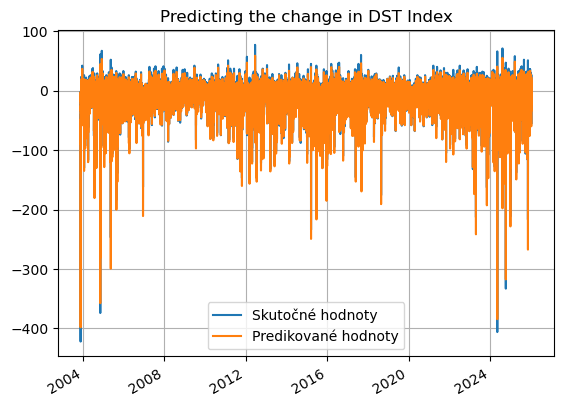

In [18]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [19]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9634786907532906
MCC=0.8911843676644221
Výkon NN:
MAE: 2.3362, MSE: 11.8067
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.03%
MSE Improvement: 27.66%


In [20]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step 

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step 

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 86s 96ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step 

  8/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step 

123/224 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:22 109ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step 

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step 

 67/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step 

 76/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step 

 78/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step 

 81/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step 

 84/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step 

 96/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step 

118/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step 

139/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step 

150/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step 

156/759 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step 

653/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 70s 92ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 23:14 2s/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step 

244/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step 

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 88s 97ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 41s 184ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 21s 104ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 21s 104ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 21s 104ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 21s 104ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 21s 104ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 20s 104ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 20s 104ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 17s 104ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step 

126/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step 

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 106ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 106ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 106ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 106ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 106ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 106ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 106ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 108ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 106ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 106ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 107ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 107ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step 

 65/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step 

166/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step 

662/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 77s 102ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.1954157
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 3.06**2 * RBF(length_scale=0.299) + WhiteKernel(noise_level=0.608)


Global sigma (LSTM errors): 4.2999086
Hybrid prediction with smoothed, inflated interval ready.


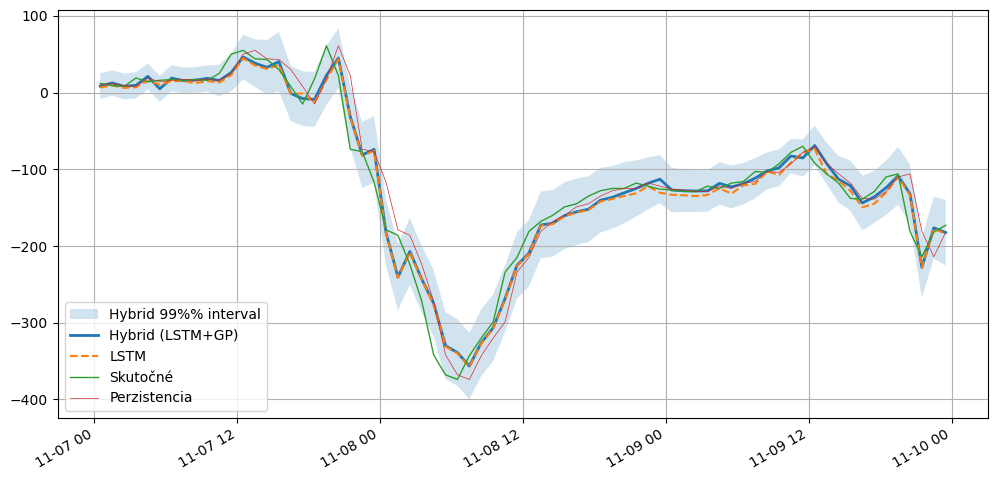

In [21]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [22]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = y_test_true
y_pred_hybrid = y_hybrid_mean

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 11.5791
MAE: 2.2325

--- Klasifikačné metriky (Prah: -20.2 nT) ---
Matthews Correlation Coefficient (MCC): 0.8860

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      149588 |        2468
Skutočná 1 |        4938 |       37194

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.97      0.98      0.98    152056
   Trieda 1 (Búrka)       0.94      0.88      0.91     42132

           accuracy                           0.96    194188
          macro avg       0.95      0.93      0.94    194188
       weighted avg       0.96      0.96      0.96    194188



In [23]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)

/tmp/ipykernel_682251/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_682251/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),



===== LSTM =====
ACC=0.963478502680406
MCC=0.8911842170527429
Výkon NN:
MAE: 2.3362, MSE: 11.8067
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.03%
MSE Improvement: 27.66%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9712    0.9825    0.9768    152055
           1     0.9342    0.8947    0.9140     42132

    accuracy                         0.9635    194187
   macro avg     0.9527    0.9386    0.9454    194187
weighted avg     0.9631    0.9635    0.9632    194187


===== LSTM+GP =====
ACC=0.9618615046321329
MCC=0.8859747239577473
Výkon NN:
MAE: 2.2325, MSE: 11.5791
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.06%
MSE Improvement: 29.05%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9680    0.9838    0.9758    152055
           1     0.9378    0.8828    0.9095     42132

  

,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
0,2026-04-25T10:09:44,LSTM,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.3,0.963444,0.892012,"{""text"": "" precision recall f...",2.336327,12.533178,2.567961,16.320413,9.020130,23.205512
1,2026-04-25T10:09:44,LSTM+GP,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.3,0.961878,0.885879,"{""text"": "" precision recall f...",2.221233,12.327465,2.567961,16.320413,13.502067,24.465975
2,2026-04-25T13:40:11,LSTM,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.2,0.963479,0.891184,"{""text"": "" precision recall f...",2.336166,11.806670,2.567983,16.320737,9.027235,27.658476
3,2026-04-25T13:40:11,LSTM+GP,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.2,0.961862,0.885975,"{""text"": "" precision recall f...",2.232509,11.579149,2.567983,16.320737,13.063748,29.052540
